# Visual Storytelling: AI-Powered Image Caption Generation

The project explores the fusion of artificial intelligence and computer vision in image captioning, leveraging the influential Flickr8k dataset to bridge the gap between visual content and descriptive language. Through innovative techniques and rigorous evaluation, this endeavor seeks to advance our ability to generate contextually rich and coherent textual descriptions for images, with applications spanning accessibility, content organization, and immersive human-computer interactions.

## Downloading Data and Dependencies

The dataset in use is the Flickr8k dataset which comprises 8,000 diverse images, each paired with multiple human-generated captions, catalyzing research in image captioning and fostering the development of AI models that connect visuals and language seamlessly. Its annotations offer a rich training ground for refining algorithms that decode intricate relationships between images and descriptive text.

The complete dataset can be downloaded from these two links: [Flickr8k_Dataset](https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_Dataset.zip) and [Flickr8k_Text](https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_text.zip)

**Note:** Unzip the contents of the Flickr8k_Text folder directly in a folder containing the Flickr8k_Dataset folder.

Alternatively, you can simply download the [Flickr8k Dataset folder](https://github.com/ACM40960/project-shrutig99/tree/main/Flickr8k%20Dataset)

In [1]:
#importing the necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import pickle
import os
import cv2

import numpy as np
from numpy import array

import tensorflow
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.applications.resnet50 import ResNet50

from nltk.translate.bleu_score import sentence_bleu

from tqdm import tqdm

from keras.applications import vgg16
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input
from keras.models import Model
from keras.preprocessing.text import one_hot
from keras.preprocessing.sequence import pad_sequences
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers import Dropout
from keras.layers import LSTM
from keras.layers import add
from keras.layers import Embedding

In [2]:
# In case of any missing library, please use the code below and replace "library_name" with the library name

#!pip install library_name

## Read and Processing Data for Image Captioning

We read a text file **Flickr8k.lemma.token.txt** into a DataFrame named `image_tokens,` where each row contains an `img_id` and its corresponding `img_caption.` And we also read three more text files **Flickr_8k.trainImages.txt,**  **Flickr_8k.testImages.txt,** and **Flickr_8k.devImages.txt** into separate DataFrames `train_image_names,` `test_image_names,` and `val_image_names` containing image IDs.

We then load and display the image corresponding to the 40th entry in the `train_image_names` DataFrame.

And we preprocess the image caption data by removing unwanted characters from the `img_id` and adding `start` and `end` tokens to each caption in the `image_tokens` DataFrame.

In [3]:
# Read the text files into pandas dataframes
# Each file is read into a dataframe with specified column names

# Read the file "Flickr8k.lemma.token.txt" and create a dataframe named "image_tokens"
# The columns in the dataframe will be "img_id" and "img_caption"
image_tokens = pd.read_csv("Flickr8k.lemma.token.txt", sep='\t', names=["img_id", "img_caption"])

# Read the file "Flickr_8k.trainImages.txt" and create a dataframe named "train_image_names"
# The column in the dataframe will be "img_id"
train_image_names = pd.read_csv("Flickr_8k.trainImages.txt", names=["img_id"])

# Read the file "Flickr_8k.testImages.txt" and create a dataframe named "test_image_names"
# The column in the dataframe will be "img_id"
test_image_names = pd.read_csv("Flickr_8k.testImages.txt", names=["img_id"])

# Read the file "Flickr_8k.devImages.txt" and create a dataframe named "val_image_names"
# The column in the dataframe will be "img_id"
val_image_names = pd.read_csv("Flickr_8k.devImages.txt", names=["img_id"])

In [4]:
#checking the number of images in the dataset
l=os.listdir("Flicker8k_Dataset")
print(f"The number of images in the dataset is: {len(l)}")

The number of images in the dataset is: 8091


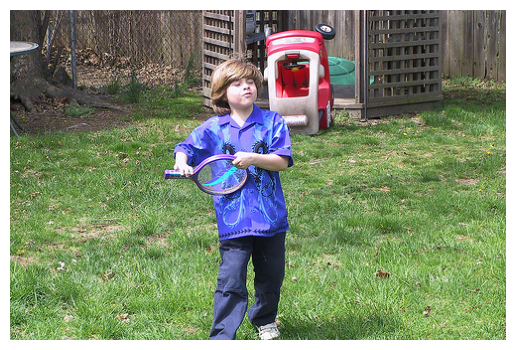

In [5]:
# Load and visualize an image
# "train_image_names.img_id[40]" contains the image filename

# Construct the full path to the image using "Flicker8k_Dataset" directory and the image filename
image_path = "Flicker8k_Dataset" + "/" + train_image_names.img_id[40]

# Load the image using OpenCV
img = cv2.imread(image_path)

# Convert the BGR image to RGB for proper visualization using Matplotlib
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Display the image using Matplotlib
plt.imshow(img_rgb)
plt.axis('off')  # Turn off axis labels
plt.show()

Make sure to replace **Flicker8k_Dataset** with the actual path to your image directory and adjust the index [40] to visualize a different image from the training set.


In [6]:
#removing the #0,#1,#2,#3,#5 from the image ids
image_tokens["img_id"]=image_tokens["img_id"].map(lambda x: x[:len(x)-2])

image_tokens["img_caption"]=image_tokens["img_caption"].map(lambda x: "<start> " + x.strip() + " <end>")

In [7]:
#head of the image_tokens dataframe
image_tokens.head()

,img_id,img_caption
0,1305564994_00513f9a5b.jpg,<start> A man in street racer armor be examine...
1,1305564994_00513f9a5b.jpg,<start> Two racer drive a white bike down a ro...
2,1305564994_00513f9a5b.jpg,<start> Two motorist be ride along on their ve...
3,1305564994_00513f9a5b.jpg,<start> Two person be in a small race car driv...
4,1305564994_00513f9a5b.jpg,<start> Two person in race uniform in a street...


In [8]:
#head of the train_image_names dataframe
train_image_names.head()

,img_id
0,2513260012_03d33305cf.jpg
1,2903617548_d3e38d7f88.jpg
2,3338291921_fe7ae0c8f8.jpg
3,488416045_1c6d903fe0.jpg
4,2644326817_8f45080b87.jpg


## Processing Image Captions Data

We are processing image captions data by creating three dictionaries `(train_captions, test_captions, and validation_captions)` where each dictionary associates image IDs with lists of captions corresponding to those images, using the provided image tokens and image names for train, test, and validation sets respectively. The `tqdm` library is used for displaying progress bars during the loop iterations.

In [9]:
#creating train dictionary having key as the image id and value as a list of its captions
train_captions={}
for i in tqdm(range(len(train_image_names))):
  l=[caption for caption in(image_tokens[image_tokens["img_id"]==train_image_names["img_id"].iloc[i]].img_caption)]
  train_captions[train_image_names["img_id"].iloc[i]]=l

100%|█████████████████████████████████████████████████████████████████████████████| 6000/6000 [00:17<00:00, 335.68it/s]


In [10]:
#creating test dictionary having key as the image id and value as a list of its captions
test_captions={}
for i in tqdm(range(len(test_image_names))):
  l=[caption for caption in(image_tokens[image_tokens["img_id"]==test_image_names["img_id"].iloc[i]].img_caption)]
  test_captions[test_image_names["img_id"].iloc[i]]=l

100%|█████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:02<00:00, 353.21it/s]


In [11]:
#creating validation dictionary having key as the image id and value as a list of its captions
validation_captions={}
for i in tqdm(range(len(val_image_names))):
  l=[caption for caption in(image_tokens[image_tokens["img_id"]==val_image_names["img_id"].iloc[i]].img_caption)]
  validation_captions[val_image_names["img_id"].iloc[i]]=l

100%|█████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:02<00:00, 341.82it/s]


In [12]:
#List of file names
file_names = [train_image_names, test_image_names, val_image_names]

# Dictionary to hold captions for each split
captions_dict = {}

# Loop through different splits (train, test, validation)
for split_name, file_name in zip(["train", "test", "validation"], file_names):
    captions_dict[split_name] = {}
    
    for i in tqdm(range(len(file_name))):
        l = [caption for caption in (image_tokens[image_tokens["img_id"] == file_name["img_id"].iloc[i]].img_caption)]
        captions_dict[split_name][file_name["img_id"].iloc[i]] = l

100%|█████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:02<00:00, 376.74it/s]


## ResNet50 model for encoding images

We initialize a `ResNet-50` neural network model pre-trained as our encoder on ImageNet data, excluding the top classification layer, and set its input shape to (224, 224, 3). We then print a summary of the model's architecture, showing layer details and parameter counts.

We prefer ResNet50 for our CNN model as we are dealing with deep NN, and during this Residual Network (ResNet) architecture helps prevent the vanishing and exploding of the gradient, as it instead deals with the Identity Function and extracts key features from each layer.

In [13]:
model=ResNet50(include_top=False, weights='imagenet',pooling='avg',input_shape=(224,224,3))
model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                       

                                                                                                  
 conv2_block3_1_conv (Conv2  (None, 56, 56, 64)           16448     ['conv2_block2_out[0][0]']    
 D)                                                                                               
                                                                                                  
 conv2_block3_1_bn (BatchNo  (None, 56, 56, 64)           256       ['conv2_block3_1_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv2_block3_1_relu (Activ  (None, 56, 56, 64)           0         ['conv2_block3_1_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv2_blo

 ation)                                                                                           
                                                                                                  
 conv3_block2_3_conv (Conv2  (None, 28, 28, 512)          66048     ['conv3_block2_2_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv3_block2_3_bn (BatchNo  (None, 28, 28, 512)          2048      ['conv3_block2_3_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv3_block2_add (Add)      (None, 28, 28, 512)          0         ['conv3_block1_out[0][0]',    
                                                                     'conv3_block2_3_bn[0][0]']   
          

 conv4_block1_2_conv (Conv2  (None, 14, 14, 256)          590080    ['conv4_block1_1_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv4_block1_2_bn (BatchNo  (None, 14, 14, 256)          1024      ['conv4_block1_2_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv4_block1_2_relu (Activ  (None, 14, 14, 256)          0         ['conv4_block1_2_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv4_block1_0_conv (Conv2  (None, 14, 14, 1024)         525312    ['conv3_block4_out[0][0]']    
 D)       

                                                                                                  
 conv4_block3_out (Activati  (None, 14, 14, 1024)         0         ['conv4_block3_add[0][0]']    
 on)                                                                                              
                                                                                                  
 conv4_block4_1_conv (Conv2  (None, 14, 14, 256)          262400    ['conv4_block3_out[0][0]']    
 D)                                                                                               
                                                                                                  
 conv4_block4_1_bn (BatchNo  (None, 14, 14, 256)          1024      ['conv4_block4_1_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv4_blo

 D)                                                                                               
                                                                                                  
 conv4_block6_3_bn (BatchNo  (None, 14, 14, 1024)         4096      ['conv4_block6_3_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv4_block6_add (Add)      (None, 14, 14, 1024)         0         ['conv4_block5_out[0][0]',    
                                                                     'conv4_block6_3_bn[0][0]']   
                                                                                                  
 conv4_block6_out (Activati  (None, 14, 14, 1024)         0         ['conv4_block6_add[0][0]']    
 on)                                                                                              
          

 conv5_block3_1_relu (Activ  (None, 7, 7, 512)            0         ['conv5_block3_1_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv5_block3_2_conv (Conv2  (None, 7, 7, 512)            2359808   ['conv5_block3_1_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv5_block3_2_bn (BatchNo  (None, 7, 7, 512)            2048      ['conv5_block3_2_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv5_block3_2_relu (Activ  (None, 7, 7, 512)            0         ['conv5_block3_2_bn[0][0]']   
 ation)   

## Image Encoding with ResNet-50 for Train, Test, and Validation Sets

We extract image encodings (features) from a pre-trained `ResNet-50` model for a set of images and store them in separate dictionaries using pickle serialization. These image encodings are then used as inputs for caption generation.

The process involves the following steps for each of the three sets (train, test, and validation):

1. Iterate through a list of image names (train_captions, test_captions, validation_captions).
2. Construct the path to the image using the provided directory path and image name.
3. Load the image, resizing it to a target size of 224x224 pixels.
4. Convert the image to a NumPy array and expand its dimensions to match the expected input shape of the ResNet-50 model.
5. Preprocess the image data (normalize and scale) as required by the ResNet-50 model.
6. Use the ResNet-50 model to extract features (encodings) from the image.
7. Store the extracted features in a dictionary using the image name as the key. The .squeeze() function is used to remove any single-dimensional entries from the shape of the features array.
8. Serialize the dictionary of image encodings using pickle and save it to a corresponding file (train_encoded_images.p, test_encoded_images.p, validation_encoded_images.p)


Overall, we processe images using a pre-trained ResNet-50 model, extract their features, and store these features in separate pickle files for train, test, and validation sets.

In [14]:
#extracting image encodings(features) from resnet50 and forming dict train_features
path="Flicker8k_Dataset/"
train_features={}
c=0
for image_name in tqdm(train_captions):
  img_path=path+image_name
  img=image.load_img(img_path,target_size=(224,224))
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)
  x = preprocess_input(x)
  features = model.predict(x)
  train_features[image_name]=features.squeeze()

  0%|                                                                                         | 0/6000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 1s/step


  0%|                                                                               | 1/6000 [00:01<1:58:47,  1.19s/it]

1/1 [==============================] - 0s 158ms/step


  0%|                                                                               | 2/6000 [00:01<1:01:23,  1.63it/s]

1/1 [==============================] - 0s 121ms/step


  0%|                                                                                 | 3/6000 [00:01<41:01,  2.44it/s]

1/1 [==============================] - 0s 114ms/step


  0%|                                                                                 | 4/6000 [00:01<31:16,  3.20it/s]

1/1 [==============================] - 0s 113ms/step


  0%|                                                                                 | 5/6000 [00:01<25:46,  3.88it/s]

1/1 [==============================] - 0s 154ms/step


  0%|                                                                                 | 6/6000 [00:02<24:07,  4.14it/s]

1/1 [==============================] - 0s 120ms/step


  0%|                                                                                 | 7/6000 [00:02<21:55,  4.55it/s]

1/1 [==============================] - 0s 126ms/step


  0%|                                                                                 | 8/6000 [00:02<20:53,  4.78it/s]

1/1 [==============================] - 0s 124ms/step


  0%|                                                                                 | 9/6000 [00:02<19:54,  5.01it/s]

1/1 [==============================] - 0s 128ms/step


  0%|▏                                                                               | 10/6000 [00:02<19:26,  5.14it/s]

1/1 [==============================] - 0s 109ms/step


  0%|▏                                                                               | 11/6000 [00:03<18:51,  5.29it/s]

1/1 [==============================] - 0s 110ms/step


  0%|▏                                                                               | 12/6000 [00:03<17:52,  5.58it/s]

1/1 [==============================] - 0s 109ms/step


  0%|▏                                                                               | 13/6000 [00:03<17:23,  5.73it/s]

1/1 [==============================] - 0s 148ms/step


  0%|▏                                                                               | 14/6000 [00:03<18:17,  5.45it/s]

1/1 [==============================] - 0s 121ms/step


  0%|▏                                                                               | 15/6000 [00:03<18:02,  5.53it/s]

1/1 [==============================] - 0s 121ms/step


  0%|▏                                                                               | 16/6000 [00:03<17:38,  5.65it/s]

1/1 [==============================] - 0s 139ms/step


  0%|▏                                                                               | 17/6000 [00:04<18:08,  5.49it/s]

1/1 [==============================] - 0s 132ms/step


  0%|▏                                                                               | 18/6000 [00:04<18:12,  5.48it/s]

1/1 [==============================] - 0s 110ms/step


  0%|▎                                                                               | 19/6000 [00:04<17:35,  5.66it/s]

1/1 [==============================] - 0s 113ms/step


  0%|▎                                                                               | 20/6000 [00:04<17:09,  5.81it/s]

1/1 [==============================] - 0s 116ms/step


  0%|▎                                                                               | 21/6000 [00:04<16:56,  5.88it/s]

1/1 [==============================] - 0s 110ms/step


  0%|▎                                                                               | 22/6000 [00:04<16:41,  5.97it/s]

1/1 [==============================] - 0s 144ms/step


  0%|▎                                                                               | 23/6000 [00:05<17:32,  5.68it/s]

1/1 [==============================] - 0s 121ms/step


  0%|▎                                                                               | 24/6000 [00:05<17:25,  5.72it/s]

1/1 [==============================] - 0s 116ms/step


  0%|▎                                                                               | 25/6000 [00:05<17:04,  5.83it/s]

1/1 [==============================] - 0s 108ms/step


  0%|▎                                                                               | 26/6000 [00:05<16:38,  5.98it/s]

1/1 [==============================] - 0s 131ms/step


  0%|▎                                                                               | 27/6000 [00:05<17:05,  5.83it/s]

1/1 [==============================] - 0s 154ms/step


  0%|▎                                                                               | 28/6000 [00:05<18:06,  5.50it/s]

1/1 [==============================] - 0s 120ms/step


  0%|▍                                                                               | 29/6000 [00:06<17:45,  5.61it/s]

1/1 [==============================] - 0s 134ms/step


  0%|▍                                                                               | 30/6000 [00:06<17:52,  5.57it/s]

1/1 [==============================] - 0s 148ms/step


  1%|▍                                                                               | 31/6000 [00:06<18:56,  5.25it/s]

1/1 [==============================] - 0s 156ms/step


  1%|▍                                                                               | 32/6000 [00:06<19:33,  5.09it/s]

1/1 [==============================] - 0s 153ms/step


  1%|▍                                                                               | 33/6000 [00:06<19:48,  5.02it/s]

1/1 [==============================] - 0s 163ms/step


  1%|▍                                                                               | 34/6000 [00:07<20:22,  4.88it/s]

1/1 [==============================] - 0s 135ms/step


  1%|▍                                                                               | 35/6000 [00:07<20:10,  4.93it/s]

1/1 [==============================] - 0s 132ms/step


  1%|▍                                                                               | 36/6000 [00:07<19:46,  5.03it/s]

1/1 [==============================] - 0s 124ms/step


  1%|▍                                                                               | 37/6000 [00:07<19:07,  5.20it/s]

1/1 [==============================] - 0s 123ms/step


  1%|▌                                                                               | 38/6000 [00:07<18:40,  5.32it/s]

1/1 [==============================] - 0s 125ms/step


  1%|▌                                                                               | 39/6000 [00:08<18:22,  5.41it/s]

1/1 [==============================] - 0s 155ms/step


  1%|▌                                                                               | 40/6000 [00:08<19:11,  5.18it/s]

1/1 [==============================] - 0s 165ms/step


  1%|▌                                                                               | 41/6000 [00:08<20:02,  4.95it/s]

1/1 [==============================] - 0s 173ms/step


  1%|▌                                                                               | 42/6000 [00:08<21:14,  4.68it/s]

1/1 [==============================] - 0s 150ms/step


  1%|▌                                                                               | 43/6000 [00:08<21:24,  4.64it/s]

1/1 [==============================] - 0s 120ms/step


  1%|▌                                                                               | 44/6000 [00:09<20:10,  4.92it/s]

1/1 [==============================] - 0s 122ms/step


  1%|▌                                                                               | 45/6000 [00:09<19:19,  5.14it/s]

1/1 [==============================] - 0s 119ms/step


  1%|▌                                                                               | 46/6000 [00:09<18:38,  5.32it/s]

1/1 [==============================] - 0s 130ms/step


  1%|▋                                                                               | 47/6000 [00:09<18:25,  5.38it/s]

1/1 [==============================] - 0s 123ms/step


  1%|▋                                                                               | 48/6000 [00:09<18:13,  5.45it/s]

1/1 [==============================] - 0s 122ms/step


  1%|▋                                                                               | 49/6000 [00:10<17:56,  5.53it/s]

1/1 [==============================] - 0s 120ms/step


  1%|▋                                                                               | 50/6000 [00:10<18:02,  5.50it/s]

1/1 [==============================] - 0s 135ms/step


  1%|▋                                                                               | 51/6000 [00:10<18:23,  5.39it/s]

1/1 [==============================] - 0s 147ms/step


  1%|▋                                                                               | 52/6000 [00:10<18:49,  5.27it/s]

1/1 [==============================] - 0s 153ms/step


  1%|▋                                                                               | 53/6000 [00:10<19:27,  5.09it/s]

1/1 [==============================] - 0s 149ms/step


  1%|▋                                                                               | 54/6000 [00:11<19:50,  5.00it/s]

1/1 [==============================] - 0s 125ms/step


  1%|▋                                                                               | 55/6000 [00:11<19:36,  5.05it/s]

1/1 [==============================] - 0s 125ms/step


  1%|▋                                                                               | 56/6000 [00:11<19:04,  5.19it/s]

1/1 [==============================] - 0s 122ms/step


  1%|▊                                                                               | 57/6000 [00:11<18:34,  5.33it/s]

1/1 [==============================] - 0s 125ms/step


  1%|▊                                                                               | 58/6000 [00:11<18:16,  5.42it/s]

1/1 [==============================] - 0s 123ms/step


  1%|▊                                                                               | 59/6000 [00:11<18:10,  5.45it/s]

1/1 [==============================] - 0s 158ms/step


  1%|▊                                                                               | 60/6000 [00:12<19:07,  5.17it/s]

1/1 [==============================] - 0s 158ms/step


  1%|▊                                                                               | 61/6000 [00:12<19:47,  5.00it/s]

1/1 [==============================] - 0s 160ms/step


  1%|▊                                                                               | 62/6000 [00:12<20:23,  4.85it/s]

1/1 [==============================] - 0s 124ms/step


  1%|▊                                                                               | 63/6000 [00:12<19:31,  5.07it/s]

1/1 [==============================] - 0s 128ms/step


  1%|▊                                                                               | 64/6000 [00:12<19:03,  5.19it/s]

1/1 [==============================] - 0s 136ms/step


  1%|▊                                                                               | 65/6000 [00:13<18:58,  5.21it/s]

1/1 [==============================] - 0s 139ms/step


  1%|▉                                                                               | 66/6000 [00:13<19:07,  5.17it/s]

1/1 [==============================] - 0s 122ms/step


  1%|▉                                                                               | 67/6000 [00:13<18:43,  5.28it/s]

1/1 [==============================] - 0s 122ms/step


  1%|▉                                                                               | 68/6000 [00:13<18:18,  5.40it/s]

1/1 [==============================] - 0s 153ms/step


  1%|▉                                                                               | 69/6000 [00:13<19:35,  5.05it/s]

1/1 [==============================] - 0s 163ms/step


  1%|▉                                                                               | 70/6000 [00:14<20:09,  4.90it/s]

1/1 [==============================] - 0s 166ms/step


  1%|▉                                                                               | 71/6000 [00:14<20:31,  4.82it/s]

1/1 [==============================] - 0s 167ms/step


  1%|▉                                                                               | 72/6000 [00:14<20:46,  4.75it/s]

1/1 [==============================] - 0s 164ms/step


  1%|▉                                                                               | 73/6000 [00:14<21:00,  4.70it/s]

1/1 [==============================] - 0s 156ms/step


  1%|▉                                                                               | 74/6000 [00:15<20:54,  4.72it/s]

1/1 [==============================] - 0s 148ms/step


  1%|█                                                                               | 75/6000 [00:15<20:55,  4.72it/s]

1/1 [==============================] - 0s 153ms/step


  1%|█                                                                               | 76/6000 [00:15<20:47,  4.75it/s]

1/1 [==============================] - 0s 134ms/step


  1%|█                                                                               | 77/6000 [00:15<20:21,  4.85it/s]

1/1 [==============================] - 0s 135ms/step


  1%|█                                                                               | 78/6000 [00:15<19:52,  4.97it/s]

1/1 [==============================] - 0s 119ms/step


  1%|█                                                                               | 79/6000 [00:15<19:09,  5.15it/s]

1/1 [==============================] - 0s 162ms/step


  1%|█                                                                               | 80/6000 [00:16<20:22,  4.84it/s]

1/1 [==============================] - 0s 153ms/step


  1%|█                                                                               | 81/6000 [00:16<19:50,  4.97it/s]

1/1 [==============================] - 0s 149ms/step


  1%|█                                                                               | 82/6000 [00:16<19:47,  4.98it/s]

1/1 [==============================] - 0s 151ms/step


  1%|█                                                                               | 83/6000 [00:16<19:55,  4.95it/s]

1/1 [==============================] - 0s 126ms/step


  1%|█                                                                               | 84/6000 [00:17<23:22,  4.22it/s]

1/1 [==============================] - 0s 143ms/step


  1%|█▏                                                                              | 85/6000 [00:17<22:02,  4.47it/s]

1/1 [==============================] - 0s 110ms/step


  1%|█▏                                                                              | 86/6000 [00:17<20:36,  4.78it/s]

1/1 [==============================] - 0s 143ms/step


  1%|█▏                                                                              | 87/6000 [00:17<19:34,  5.04it/s]

1/1 [==============================] - 0s 137ms/step


  1%|█▏                                                                              | 88/6000 [00:17<19:11,  5.13it/s]

1/1 [==============================] - 0s 149ms/step


  1%|█▏                                                                              | 89/6000 [00:18<19:16,  5.11it/s]

1/1 [==============================] - 0s 136ms/step


  2%|█▏                                                                              | 90/6000 [00:18<19:23,  5.08it/s]

1/1 [==============================] - 0s 135ms/step


  2%|█▏                                                                              | 91/6000 [00:18<19:01,  5.18it/s]

1/1 [==============================] - 0s 132ms/step


  2%|█▏                                                                              | 92/6000 [00:18<19:03,  5.16it/s]

1/1 [==============================] - 0s 154ms/step


  2%|█▏                                                                              | 93/6000 [00:18<19:25,  5.07it/s]

1/1 [==============================] - 0s 135ms/step


  2%|█▎                                                                              | 94/6000 [00:19<19:27,  5.06it/s]

1/1 [==============================] - 0s 149ms/step


  2%|█▎                                                                              | 95/6000 [00:19<19:36,  5.02it/s]

1/1 [==============================] - 0s 130ms/step


  2%|█▎                                                                              | 96/6000 [00:19<19:24,  5.07it/s]

1/1 [==============================] - 0s 118ms/step


  2%|█▎                                                                              | 97/6000 [00:19<18:42,  5.26it/s]

1/1 [==============================] - 0s 112ms/step


  2%|█▎                                                                              | 98/6000 [00:19<18:17,  5.38it/s]

1/1 [==============================] - 0s 129ms/step


  2%|█▎                                                                              | 99/6000 [00:19<18:14,  5.39it/s]

1/1 [==============================] - 0s 118ms/step


  2%|█▎                                                                             | 100/6000 [00:20<18:17,  5.37it/s]

1/1 [==============================] - 0s 117ms/step


  2%|█▎                                                                             | 101/6000 [00:20<17:57,  5.48it/s]

1/1 [==============================] - 0s 111ms/step


  2%|█▎                                                                             | 102/6000 [00:20<17:48,  5.52it/s]

1/1 [==============================] - 0s 108ms/step


  2%|█▎                                                                             | 103/6000 [00:20<17:32,  5.60it/s]

1/1 [==============================] - 0s 138ms/step


  2%|█▎                                                                             | 104/6000 [00:20<18:03,  5.44it/s]

1/1 [==============================] - 0s 119ms/step


  2%|█▍                                                                             | 105/6000 [00:21<17:55,  5.48it/s]

1/1 [==============================] - 0s 107ms/step


  2%|█▍                                                                             | 106/6000 [00:21<17:41,  5.55it/s]

1/1 [==============================] - 0s 117ms/step


  2%|█▍                                                                             | 107/6000 [00:21<17:35,  5.58it/s]

1/1 [==============================] - 0s 105ms/step


  2%|█▍                                                                             | 108/6000 [00:21<17:28,  5.62it/s]

1/1 [==============================] - 0s 110ms/step


  2%|█▍                                                                             | 109/6000 [00:21<17:16,  5.68it/s]

1/1 [==============================] - 0s 128ms/step


  2%|█▍                                                                             | 110/6000 [00:21<17:12,  5.71it/s]

1/1 [==============================] - 0s 108ms/step


  2%|█▍                                                                             | 111/6000 [00:22<17:07,  5.73it/s]

1/1 [==============================] - 0s 116ms/step


  2%|█▍                                                                             | 112/6000 [00:22<17:02,  5.76it/s]

1/1 [==============================] - 0s 112ms/step


  2%|█▍                                                                             | 113/6000 [00:22<16:57,  5.79it/s]

1/1 [==============================] - 0s 110ms/step


  2%|█▌                                                                             | 114/6000 [00:22<16:48,  5.84it/s]

1/1 [==============================] - 0s 110ms/step


  2%|█▌                                                                             | 115/6000 [00:22<16:45,  5.85it/s]

1/1 [==============================] - 0s 115ms/step


  2%|█▌                                                                             | 116/6000 [00:22<16:46,  5.84it/s]

1/1 [==============================] - 0s 116ms/step


  2%|█▌                                                                             | 117/6000 [00:23<16:44,  5.85it/s]

1/1 [==============================] - 0s 114ms/step


  2%|█▌                                                                             | 118/6000 [00:23<16:38,  5.89it/s]

1/1 [==============================] - 0s 112ms/step


  2%|█▌                                                                             | 119/6000 [00:23<16:39,  5.88it/s]

1/1 [==============================] - 0s 111ms/step


  2%|█▌                                                                             | 120/6000 [00:23<16:33,  5.92it/s]

1/1 [==============================] - 0s 111ms/step


  2%|█▌                                                                             | 121/6000 [00:23<16:33,  5.92it/s]

1/1 [==============================] - 0s 107ms/step


  2%|█▌                                                                             | 122/6000 [00:23<16:32,  5.92it/s]

1/1 [==============================] - 0s 121ms/step


  2%|█▌                                                                             | 123/6000 [00:24<16:34,  5.91it/s]

1/1 [==============================] - 0s 118ms/step


  2%|█▋                                                                             | 124/6000 [00:24<16:43,  5.85it/s]

1/1 [==============================] - 0s 111ms/step


  2%|█▋                                                                             | 125/6000 [00:24<16:42,  5.86it/s]

1/1 [==============================] - 0s 108ms/step


  2%|█▋                                                                             | 126/6000 [00:24<16:36,  5.89it/s]

1/1 [==============================] - 0s 106ms/step


  2%|█▋                                                                             | 127/6000 [00:24<16:33,  5.91it/s]

1/1 [==============================] - 0s 118ms/step


  2%|█▋                                                                             | 128/6000 [00:25<16:39,  5.88it/s]

1/1 [==============================] - 0s 117ms/step


  2%|█▋                                                                             | 129/6000 [00:25<16:35,  5.90it/s]

1/1 [==============================] - 0s 114ms/step


  2%|█▋                                                                             | 130/6000 [00:25<16:36,  5.89it/s]

1/1 [==============================] - 0s 111ms/step


  2%|█▋                                                                             | 131/6000 [00:25<16:36,  5.89it/s]

1/1 [==============================] - 0s 106ms/step


  2%|█▋                                                                             | 132/6000 [00:25<16:37,  5.88it/s]

1/1 [==============================] - 0s 120ms/step


  2%|█▊                                                                             | 133/6000 [00:25<16:32,  5.91it/s]

1/1 [==============================] - 0s 128ms/step


  2%|█▊                                                                             | 134/6000 [00:26<16:41,  5.86it/s]

1/1 [==============================] - 0s 113ms/step


  2%|█▊                                                                             | 135/6000 [00:26<16:39,  5.87it/s]

1/1 [==============================] - 0s 111ms/step


  2%|█▊                                                                             | 136/6000 [00:26<16:37,  5.88it/s]

1/1 [==============================] - 0s 123ms/step


  2%|█▊                                                                             | 137/6000 [00:26<16:39,  5.86it/s]

1/1 [==============================] - 0s 118ms/step


  2%|█▊                                                                             | 138/6000 [00:26<16:29,  5.92it/s]

1/1 [==============================] - 0s 128ms/step


  2%|█▊                                                                             | 139/6000 [00:26<16:38,  5.87it/s]

1/1 [==============================] - 0s 112ms/step


  2%|█▊                                                                             | 140/6000 [00:27<16:36,  5.88it/s]

1/1 [==============================] - 0s 110ms/step


  2%|█▊                                                                             | 141/6000 [00:27<16:34,  5.89it/s]

1/1 [==============================] - 0s 107ms/step


  2%|█▊                                                                             | 142/6000 [00:27<16:34,  5.89it/s]

1/1 [==============================] - 0s 120ms/step


  2%|█▉                                                                             | 143/6000 [00:27<16:33,  5.90it/s]

1/1 [==============================] - 0s 119ms/step


  2%|█▉                                                                             | 144/6000 [00:27<16:33,  5.89it/s]

1/1 [==============================] - 0s 112ms/step


  2%|█▉                                                                             | 145/6000 [00:27<16:39,  5.86it/s]

1/1 [==============================] - 0s 108ms/step


  2%|█▉                                                                             | 146/6000 [00:28<16:38,  5.86it/s]

1/1 [==============================] - 0s 106ms/step


  2%|█▉                                                                             | 147/6000 [00:28<16:35,  5.88it/s]

1/1 [==============================] - 0s 115ms/step


  2%|█▉                                                                             | 148/6000 [00:28<16:42,  5.83it/s]

1/1 [==============================] - 0s 114ms/step


  2%|█▉                                                                             | 149/6000 [00:28<16:50,  5.79it/s]

1/1 [==============================] - 0s 118ms/step


  2%|█▉                                                                             | 150/6000 [00:28<16:43,  5.83it/s]

1/1 [==============================] - 0s 129ms/step


  3%|█▉                                                                             | 151/6000 [00:28<16:45,  5.82it/s]

1/1 [==============================] - 0s 113ms/step


  3%|██                                                                             | 152/6000 [00:29<16:42,  5.83it/s]

1/1 [==============================] - 0s 107ms/step


  3%|██                                                                             | 153/6000 [00:29<16:44,  5.82it/s]

1/1 [==============================] - 0s 119ms/step


  3%|██                                                                             | 154/6000 [00:29<16:42,  5.83it/s]

1/1 [==============================] - 0s 129ms/step


  3%|██                                                                             | 155/6000 [00:29<16:48,  5.80it/s]

1/1 [==============================] - 0s 118ms/step


  3%|██                                                                             | 156/6000 [00:29<16:51,  5.78it/s]

1/1 [==============================] - 0s 117ms/step


  3%|██                                                                             | 157/6000 [00:29<16:42,  5.83it/s]

1/1 [==============================] - 0s 115ms/step


  3%|██                                                                             | 158/6000 [00:30<16:38,  5.85it/s]

1/1 [==============================] - 0s 113ms/step


  3%|██                                                                             | 159/6000 [00:30<16:37,  5.86it/s]

1/1 [==============================] - 0s 110ms/step


  3%|██                                                                             | 160/6000 [00:30<16:29,  5.90it/s]

1/1 [==============================] - 0s 110ms/step


  3%|██                                                                             | 161/6000 [00:30<16:36,  5.86it/s]

1/1 [==============================] - 0s 116ms/step


  3%|██▏                                                                            | 162/6000 [00:30<16:41,  5.83it/s]

1/1 [==============================] - 0s 110ms/step


  3%|██▏                                                                            | 163/6000 [00:30<16:37,  5.85it/s]

1/1 [==============================] - 0s 106ms/step


  3%|██▏                                                                            | 164/6000 [00:31<16:41,  5.83it/s]

1/1 [==============================] - 0s 104ms/step


  3%|██▏                                                                            | 165/6000 [00:31<16:35,  5.86it/s]

1/1 [==============================] - 0s 118ms/step


  3%|██▏                                                                            | 166/6000 [00:31<16:31,  5.88it/s]

1/1 [==============================] - 0s 116ms/step


  3%|██▏                                                                            | 167/6000 [00:31<16:33,  5.87it/s]

1/1 [==============================] - 0s 110ms/step


  3%|██▏                                                                            | 168/6000 [00:31<16:37,  5.85it/s]

1/1 [==============================] - 0s 107ms/step


  3%|██▏                                                                            | 169/6000 [00:31<16:29,  5.90it/s]

1/1 [==============================] - 0s 106ms/step


  3%|██▏                                                                            | 170/6000 [00:32<16:23,  5.93it/s]

1/1 [==============================] - 0s 121ms/step


  3%|██▎                                                                            | 171/6000 [00:32<16:28,  5.90it/s]

1/1 [==============================] - 0s 211ms/step


  3%|██▎                                                                            | 172/6000 [00:32<21:04,  4.61it/s]

1/1 [==============================] - 0s 135ms/step


  3%|██▎                                                                            | 173/6000 [00:32<20:28,  4.74it/s]

1/1 [==============================] - 0s 137ms/step


  3%|██▎                                                                            | 174/6000 [00:33<19:52,  4.89it/s]

1/1 [==============================] - 0s 132ms/step


  3%|██▎                                                                            | 175/6000 [00:33<19:17,  5.03it/s]

1/1 [==============================] - 0s 124ms/step


  3%|██▎                                                                            | 176/6000 [00:33<18:36,  5.22it/s]

1/1 [==============================] - 0s 128ms/step


  3%|██▎                                                                            | 177/6000 [00:33<18:29,  5.25it/s]

1/1 [==============================] - 0s 136ms/step


  3%|██▎                                                                            | 178/6000 [00:33<18:21,  5.29it/s]

1/1 [==============================] - 0s 134ms/step


  3%|██▎                                                                            | 179/6000 [00:33<18:19,  5.29it/s]

1/1 [==============================] - 0s 127ms/step


  3%|██▎                                                                            | 180/6000 [00:34<18:05,  5.36it/s]

1/1 [==============================] - 0s 130ms/step


  3%|██▍                                                                            | 181/6000 [00:34<18:09,  5.34it/s]

1/1 [==============================] - 0s 132ms/step


  3%|██▍                                                                            | 182/6000 [00:34<18:04,  5.37it/s]

1/1 [==============================] - 0s 136ms/step


  3%|██▍                                                                            | 183/6000 [00:34<18:15,  5.31it/s]

1/1 [==============================] - 0s 141ms/step


  3%|██▍                                                                            | 184/6000 [00:34<18:21,  5.28it/s]

1/1 [==============================] - 0s 142ms/step


  3%|██▍                                                                            | 185/6000 [00:35<19:00,  5.10it/s]

1/1 [==============================] - 0s 167ms/step


  3%|██▍                                                                            | 186/6000 [00:35<21:12,  4.57it/s]

1/1 [==============================] - 0s 158ms/step


  3%|██▍                                                                            | 187/6000 [00:35<22:18,  4.34it/s]

1/1 [==============================] - 0s 136ms/step


  3%|██▍                                                                            | 188/6000 [00:35<21:38,  4.48it/s]

1/1 [==============================] - 0s 144ms/step


  3%|██▍                                                                            | 189/6000 [00:36<21:22,  4.53it/s]

1/1 [==============================] - 0s 131ms/step


  3%|██▌                                                                            | 190/6000 [00:36<20:17,  4.77it/s]

1/1 [==============================] - 0s 122ms/step


  3%|██▌                                                                            | 191/6000 [00:36<19:14,  5.03it/s]

1/1 [==============================] - 0s 125ms/step


  3%|██▌                                                                            | 192/6000 [00:36<18:46,  5.16it/s]

1/1 [==============================] - 0s 144ms/step


  3%|██▌                                                                            | 193/6000 [00:36<19:02,  5.08it/s]

1/1 [==============================] - 0s 140ms/step


  3%|██▌                                                                            | 194/6000 [00:37<19:13,  5.03it/s]

1/1 [==============================] - 0s 135ms/step


  3%|██▌                                                                            | 195/6000 [00:37<19:06,  5.07it/s]

1/1 [==============================] - 0s 130ms/step


  3%|██▌                                                                            | 196/6000 [00:37<19:07,  5.06it/s]

1/1 [==============================] - 0s 122ms/step


  3%|██▌                                                                            | 197/6000 [00:37<18:34,  5.20it/s]

1/1 [==============================] - 0s 130ms/step


  3%|██▌                                                                            | 198/6000 [00:37<18:18,  5.28it/s]

1/1 [==============================] - 0s 126ms/step


  3%|██▌                                                                            | 199/6000 [00:37<17:58,  5.38it/s]

1/1 [==============================] - 0s 125ms/step


  3%|██▋                                                                            | 200/6000 [00:38<17:49,  5.42it/s]

1/1 [==============================] - 0s 145ms/step


  3%|██▋                                                                            | 201/6000 [00:38<18:32,  5.21it/s]

1/1 [==============================] - 0s 130ms/step


  3%|██▋                                                                            | 202/6000 [00:38<18:21,  5.26it/s]

1/1 [==============================] - 0s 143ms/step


  3%|██▋                                                                            | 203/6000 [00:38<18:32,  5.21it/s]

1/1 [==============================] - 0s 129ms/step


  3%|██▋                                                                            | 204/6000 [00:38<18:23,  5.25it/s]

1/1 [==============================] - 0s 132ms/step


  3%|██▋                                                                            | 205/6000 [00:39<18:15,  5.29it/s]

1/1 [==============================] - 0s 148ms/step


  3%|██▋                                                                            | 206/6000 [00:39<18:39,  5.18it/s]

1/1 [==============================] - 0s 134ms/step


  3%|██▋                                                                            | 207/6000 [00:39<18:31,  5.21it/s]

1/1 [==============================] - 0s 139ms/step


  3%|██▋                                                                            | 208/6000 [00:39<18:33,  5.20it/s]

1/1 [==============================] - 0s 158ms/step


  3%|██▊                                                                            | 209/6000 [00:39<20:59,  4.60it/s]

1/1 [==============================] - 0s 138ms/step


  4%|██▊                                                                            | 210/6000 [00:40<20:46,  4.65it/s]

1/1 [==============================] - 0s 138ms/step


  4%|██▊                                                                            | 211/6000 [00:40<20:01,  4.82it/s]

1/1 [==============================] - 0s 120ms/step


  4%|██▊                                                                            | 212/6000 [00:40<19:31,  4.94it/s]

1/1 [==============================] - 0s 122ms/step


  4%|██▊                                                                            | 213/6000 [00:40<18:37,  5.18it/s]

1/1 [==============================] - 0s 140ms/step


  4%|██▊                                                                            | 214/6000 [00:40<18:34,  5.19it/s]

1/1 [==============================] - 0s 129ms/step


  4%|██▊                                                                            | 215/6000 [00:41<18:07,  5.32it/s]

1/1 [==============================] - 0s 121ms/step


  4%|██▊                                                                            | 216/6000 [00:41<17:40,  5.45it/s]

1/1 [==============================] - 0s 120ms/step


  4%|██▊                                                                            | 217/6000 [00:41<17:32,  5.49it/s]

1/1 [==============================] - 0s 129ms/step


  4%|██▊                                                                            | 218/6000 [00:41<17:26,  5.53it/s]

1/1 [==============================] - 0s 119ms/step


  4%|██▉                                                                            | 219/6000 [00:41<17:24,  5.53it/s]

1/1 [==============================] - 0s 130ms/step


  4%|██▉                                                                            | 220/6000 [00:41<17:22,  5.54it/s]

1/1 [==============================] - 0s 130ms/step


  4%|██▉                                                                            | 221/6000 [00:42<17:32,  5.49it/s]

1/1 [==============================] - 0s 167ms/step


  4%|██▉                                                                            | 222/6000 [00:42<18:31,  5.20it/s]

1/1 [==============================] - 0s 130ms/step


  4%|██▉                                                                            | 223/6000 [00:42<18:35,  5.18it/s]

1/1 [==============================] - 0s 122ms/step


  4%|██▉                                                                            | 224/6000 [00:42<18:02,  5.33it/s]

1/1 [==============================] - 0s 171ms/step


  4%|██▉                                                                            | 225/6000 [00:42<19:12,  5.01it/s]

1/1 [==============================] - 0s 165ms/step


  4%|██▉                                                                            | 226/6000 [00:43<19:48,  4.86it/s]

1/1 [==============================] - 0s 172ms/step


  4%|██▉                                                                            | 227/6000 [00:43<20:44,  4.64it/s]

1/1 [==============================] - 0s 167ms/step


  4%|███                                                                            | 228/6000 [00:43<21:11,  4.54it/s]

1/1 [==============================] - 0s 170ms/step


  4%|███                                                                            | 229/6000 [00:43<21:29,  4.48it/s]

1/1 [==============================] - 0s 127ms/step


  4%|███                                                                            | 230/6000 [00:44<20:15,  4.75it/s]

1/1 [==============================] - 0s 120ms/step


  4%|███                                                                            | 231/6000 [00:44<19:20,  4.97it/s]

1/1 [==============================] - 0s 120ms/step


  4%|███                                                                            | 232/6000 [00:44<18:43,  5.13it/s]

1/1 [==============================] - 0s 130ms/step


  4%|███                                                                            | 233/6000 [00:44<18:13,  5.28it/s]

1/1 [==============================] - 0s 115ms/step


  4%|███                                                                            | 234/6000 [00:44<17:44,  5.42it/s]

1/1 [==============================] - 0s 168ms/step


  4%|███                                                                            | 235/6000 [00:45<18:48,  5.11it/s]

1/1 [==============================] - 0s 127ms/step


  4%|███                                                                            | 236/6000 [00:45<18:39,  5.15it/s]

1/1 [==============================] - 0s 168ms/step


  4%|███                                                                            | 237/6000 [00:45<19:40,  4.88it/s]

1/1 [==============================] - 0s 171ms/step


  4%|███▏                                                                           | 238/6000 [00:45<20:35,  4.66it/s]

1/1 [==============================] - 0s 172ms/step


  4%|███▏                                                                           | 239/6000 [00:45<21:16,  4.51it/s]

1/1 [==============================] - 0s 171ms/step


  4%|███▏                                                                           | 240/6000 [00:46<21:37,  4.44it/s]

1/1 [==============================] - 0s 165ms/step


  4%|███▏                                                                           | 241/6000 [00:46<21:50,  4.39it/s]

1/1 [==============================] - 0s 165ms/step


  4%|███▏                                                                           | 242/6000 [00:46<22:06,  4.34it/s]

1/1 [==============================] - 0s 148ms/step


  4%|███▏                                                                           | 243/6000 [00:46<21:55,  4.38it/s]

1/1 [==============================] - 0s 127ms/step


  4%|███▏                                                                           | 244/6000 [00:47<21:22,  4.49it/s]

1/1 [==============================] - 0s 129ms/step


  4%|███▏                                                                           | 245/6000 [00:47<20:27,  4.69it/s]

1/1 [==============================] - 0s 130ms/step


  4%|███▏                                                                           | 246/6000 [00:47<19:36,  4.89it/s]

1/1 [==============================] - 0s 118ms/step


  4%|███▎                                                                           | 247/6000 [00:47<18:41,  5.13it/s]

1/1 [==============================] - 0s 119ms/step


  4%|███▎                                                                           | 248/6000 [00:47<18:12,  5.26it/s]

1/1 [==============================] - 0s 122ms/step


  4%|███▎                                                                           | 249/6000 [00:47<17:46,  5.39it/s]

1/1 [==============================] - 0s 122ms/step


  4%|███▎                                                                           | 250/6000 [00:48<17:28,  5.48it/s]

1/1 [==============================] - 0s 119ms/step


  4%|███▎                                                                           | 251/6000 [00:48<17:15,  5.55it/s]

1/1 [==============================] - 0s 122ms/step


  4%|███▎                                                                           | 252/6000 [00:48<17:13,  5.56it/s]

1/1 [==============================] - 0s 122ms/step


  4%|███▎                                                                           | 253/6000 [00:48<17:05,  5.61it/s]

1/1 [==============================] - 0s 115ms/step


  4%|███▎                                                                           | 254/6000 [00:48<16:51,  5.68it/s]

1/1 [==============================] - 0s 123ms/step


  4%|███▎                                                                           | 255/6000 [00:48<16:48,  5.70it/s]

1/1 [==============================] - 0s 127ms/step


  4%|███▎                                                                           | 256/6000 [00:49<16:57,  5.64it/s]

1/1 [==============================] - 0s 128ms/step


  4%|███▍                                                                           | 257/6000 [00:49<17:02,  5.62it/s]

1/1 [==============================] - 0s 117ms/step


  4%|███▍                                                                           | 258/6000 [00:49<16:57,  5.65it/s]

1/1 [==============================] - 0s 130ms/step


  4%|███▍                                                                           | 259/6000 [00:49<17:10,  5.57it/s]

1/1 [==============================] - 0s 129ms/step


  4%|███▍                                                                           | 260/6000 [00:49<17:21,  5.51it/s]

1/1 [==============================] - 0s 122ms/step


  4%|███▍                                                                           | 261/6000 [00:50<17:11,  5.56it/s]

1/1 [==============================] - 0s 126ms/step


  4%|███▍                                                                           | 262/6000 [00:50<17:27,  5.48it/s]

1/1 [==============================] - 0s 125ms/step


  4%|███▍                                                                           | 263/6000 [00:50<17:20,  5.51it/s]

1/1 [==============================] - 0s 119ms/step


  4%|███▍                                                                           | 264/6000 [00:50<17:02,  5.61it/s]

1/1 [==============================] - 0s 115ms/step


  4%|███▍                                                                           | 265/6000 [00:50<16:59,  5.63it/s]

1/1 [==============================] - 0s 125ms/step


  4%|███▌                                                                           | 266/6000 [00:50<16:57,  5.64it/s]

1/1 [==============================] - 0s 120ms/step


  4%|███▌                                                                           | 267/6000 [00:51<16:48,  5.68it/s]

1/1 [==============================] - 0s 144ms/step


  4%|███▌                                                                           | 268/6000 [00:51<17:33,  5.44it/s]

1/1 [==============================] - 0s 119ms/step


  4%|███▌                                                                           | 269/6000 [00:51<17:22,  5.50it/s]

1/1 [==============================] - 0s 131ms/step


  4%|███▌                                                                           | 270/6000 [00:51<17:26,  5.48it/s]

1/1 [==============================] - 0s 133ms/step


  5%|███▌                                                                           | 271/6000 [00:51<17:35,  5.43it/s]

1/1 [==============================] - 0s 122ms/step


  5%|███▌                                                                           | 272/6000 [00:52<17:24,  5.49it/s]

1/1 [==============================] - 0s 141ms/step


  5%|███▌                                                                           | 273/6000 [00:52<17:49,  5.35it/s]

1/1 [==============================] - 0s 140ms/step


  5%|███▌                                                                           | 274/6000 [00:52<18:40,  5.11it/s]

1/1 [==============================] - 0s 155ms/step


  5%|███▌                                                                           | 275/6000 [00:52<19:12,  4.97it/s]

1/1 [==============================] - 0s 148ms/step


  5%|███▋                                                                           | 276/6000 [00:52<19:57,  4.78it/s]

1/1 [==============================] - 0s 145ms/step


  5%|███▋                                                                           | 277/6000 [00:53<20:05,  4.75it/s]

1/1 [==============================] - 0s 126ms/step


  5%|███▋                                                                           | 278/6000 [00:53<19:18,  4.94it/s]

1/1 [==============================] - 0s 127ms/step


  5%|███▋                                                                           | 279/6000 [00:53<20:06,  4.74it/s]

1/1 [==============================] - 0s 135ms/step


  5%|███▋                                                                           | 280/6000 [00:53<19:34,  4.87it/s]

1/1 [==============================] - 0s 133ms/step


  5%|███▋                                                                           | 281/6000 [00:53<19:05,  4.99it/s]

1/1 [==============================] - 0s 120ms/step


  5%|███▋                                                                           | 282/6000 [00:54<18:20,  5.19it/s]

1/1 [==============================] - 0s 121ms/step


  5%|███▋                                                                           | 283/6000 [00:54<18:00,  5.29it/s]

1/1 [==============================] - 0s 127ms/step


  5%|███▋                                                                           | 284/6000 [00:54<17:52,  5.33it/s]

1/1 [==============================] - 0s 147ms/step


  5%|███▊                                                                           | 285/6000 [00:54<18:28,  5.16it/s]

1/1 [==============================] - 0s 122ms/step


  5%|███▊                                                                           | 286/6000 [00:54<18:02,  5.28it/s]

1/1 [==============================] - 0s 129ms/step


  5%|███▊                                                                           | 287/6000 [00:55<18:00,  5.29it/s]

1/1 [==============================] - 0s 138ms/step


  5%|███▊                                                                           | 288/6000 [00:55<18:08,  5.25it/s]

1/1 [==============================] - 0s 137ms/step


  5%|███▊                                                                           | 289/6000 [00:55<18:16,  5.21it/s]

1/1 [==============================] - 0s 121ms/step


  5%|███▊                                                                           | 290/6000 [00:55<17:44,  5.37it/s]

1/1 [==============================] - 0s 118ms/step


  5%|███▊                                                                           | 291/6000 [00:55<17:29,  5.44it/s]

1/1 [==============================] - 0s 141ms/step


  5%|███▊                                                                           | 292/6000 [00:55<17:58,  5.29it/s]

1/1 [==============================] - 0s 136ms/step


  5%|███▊                                                                           | 293/6000 [00:56<18:11,  5.23it/s]

1/1 [==============================] - 0s 126ms/step


  5%|███▊                                                                           | 294/6000 [00:56<17:51,  5.33it/s]

1/1 [==============================] - 0s 130ms/step


  5%|███▉                                                                           | 295/6000 [00:56<17:54,  5.31it/s]

1/1 [==============================] - 0s 130ms/step


  5%|███▉                                                                           | 296/6000 [00:56<17:50,  5.33it/s]

1/1 [==============================] - 0s 126ms/step


  5%|███▉                                                                           | 297/6000 [00:56<17:40,  5.38it/s]

1/1 [==============================] - 0s 132ms/step


  5%|███▉                                                                           | 298/6000 [00:57<17:37,  5.39it/s]

1/1 [==============================] - 0s 125ms/step


  5%|███▉                                                                           | 299/6000 [00:57<17:36,  5.40it/s]

1/1 [==============================] - 0s 133ms/step


  5%|███▉                                                                           | 300/6000 [00:57<18:18,  5.19it/s]

1/1 [==============================] - 0s 131ms/step


  5%|███▉                                                                           | 301/6000 [00:57<18:14,  5.21it/s]

1/1 [==============================] - 0s 122ms/step


  5%|███▉                                                                           | 302/6000 [00:57<17:52,  5.31it/s]

1/1 [==============================] - 0s 122ms/step


  5%|███▉                                                                           | 303/6000 [00:58<17:41,  5.37it/s]

1/1 [==============================] - 0s 125ms/step


  5%|████                                                                           | 304/6000 [00:58<17:30,  5.42it/s]

1/1 [==============================] - 0s 126ms/step


  5%|████                                                                           | 305/6000 [00:58<17:19,  5.48it/s]

1/1 [==============================] - 0s 119ms/step


  5%|████                                                                           | 306/6000 [00:58<17:02,  5.57it/s]

1/1 [==============================] - 0s 123ms/step


  5%|████                                                                           | 307/6000 [00:58<16:57,  5.60it/s]

1/1 [==============================] - 0s 125ms/step


  5%|████                                                                           | 308/6000 [00:58<17:02,  5.57it/s]

1/1 [==============================] - 0s 122ms/step


  5%|████                                                                           | 309/6000 [00:59<16:53,  5.61it/s]

1/1 [==============================] - 0s 122ms/step


  5%|████                                                                           | 310/6000 [00:59<16:55,  5.60it/s]

1/1 [==============================] - 0s 129ms/step


  5%|████                                                                           | 311/6000 [00:59<17:01,  5.57it/s]

1/1 [==============================] - 0s 127ms/step


  5%|████                                                                           | 312/6000 [00:59<16:59,  5.58it/s]

1/1 [==============================] - 0s 122ms/step


  5%|████                                                                           | 313/6000 [00:59<16:54,  5.61it/s]

1/1 [==============================] - 0s 134ms/step


  5%|████▏                                                                          | 314/6000 [01:00<17:06,  5.54it/s]

1/1 [==============================] - 0s 138ms/step


  5%|████▏                                                                          | 315/6000 [01:00<17:21,  5.46it/s]

1/1 [==============================] - 0s 139ms/step


  5%|████▏                                                                          | 316/6000 [01:00<17:44,  5.34it/s]

1/1 [==============================] - 0s 120ms/step


  5%|████▏                                                                          | 317/6000 [01:00<17:27,  5.42it/s]

1/1 [==============================] - 0s 130ms/step


  5%|████▏                                                                          | 318/6000 [01:00<17:22,  5.45it/s]

1/1 [==============================] - 0s 125ms/step


  5%|████▏                                                                          | 319/6000 [01:00<17:14,  5.49it/s]

1/1 [==============================] - 0s 163ms/step


  5%|████▏                                                                          | 320/6000 [01:01<20:50,  4.54it/s]

1/1 [==============================] - 0s 127ms/step


  5%|████▏                                                                          | 321/6000 [01:01<19:44,  4.80it/s]

1/1 [==============================] - 0s 126ms/step


  5%|████▏                                                                          | 322/6000 [01:01<18:59,  4.98it/s]

1/1 [==============================] - 0s 124ms/step


  5%|████▎                                                                          | 323/6000 [01:01<18:23,  5.15it/s]

1/1 [==============================] - 0s 128ms/step


  5%|████▎                                                                          | 324/6000 [01:01<18:05,  5.23it/s]

1/1 [==============================] - 0s 123ms/step


  5%|████▎                                                                          | 325/6000 [01:02<17:40,  5.35it/s]

1/1 [==============================] - 0s 121ms/step


  5%|████▎                                                                          | 326/6000 [01:02<17:19,  5.46it/s]

1/1 [==============================] - 0s 134ms/step


  5%|████▎                                                                          | 327/6000 [01:02<17:27,  5.42it/s]

1/1 [==============================] - 0s 165ms/step


  5%|████▎                                                                          | 328/6000 [01:02<18:32,  5.10it/s]

1/1 [==============================] - 0s 168ms/step


  5%|████▎                                                                          | 329/6000 [01:02<19:36,  4.82it/s]

1/1 [==============================] - 0s 162ms/step


  6%|████▎                                                                          | 330/6000 [01:03<20:05,  4.70it/s]

1/1 [==============================] - 0s 129ms/step


  6%|████▎                                                                          | 331/6000 [01:03<19:22,  4.88it/s]

1/1 [==============================] - 0s 125ms/step


  6%|████▎                                                                          | 332/6000 [01:03<18:56,  4.99it/s]

1/1 [==============================] - 0s 124ms/step


  6%|████▍                                                                          | 333/6000 [01:03<18:23,  5.14it/s]

1/1 [==============================] - 0s 124ms/step


  6%|████▍                                                                          | 334/6000 [01:03<17:51,  5.29it/s]

1/1 [==============================] - 0s 120ms/step


  6%|████▍                                                                          | 335/6000 [01:04<17:28,  5.40it/s]

1/1 [==============================] - 0s 118ms/step


  6%|████▍                                                                          | 336/6000 [01:04<17:16,  5.46it/s]

1/1 [==============================] - 0s 125ms/step


  6%|████▍                                                                          | 337/6000 [01:04<17:04,  5.53it/s]

1/1 [==============================] - 0s 128ms/step


  6%|████▍                                                                          | 338/6000 [01:04<17:28,  5.40it/s]

1/1 [==============================] - 0s 118ms/step


  6%|████▍                                                                          | 339/6000 [01:04<17:06,  5.51it/s]

1/1 [==============================] - 0s 149ms/step


  6%|████▍                                                                          | 340/6000 [01:05<17:48,  5.30it/s]

1/1 [==============================] - 0s 156ms/step


  6%|████▍                                                                          | 341/6000 [01:05<18:38,  5.06it/s]

1/1 [==============================] - 0s 156ms/step


  6%|████▌                                                                          | 342/6000 [01:05<19:08,  4.92it/s]

1/1 [==============================] - 0s 153ms/step


  6%|████▌                                                                          | 343/6000 [01:05<19:22,  4.87it/s]

1/1 [==============================] - 0s 123ms/step


  6%|████▌                                                                          | 344/6000 [01:05<18:40,  5.05it/s]

1/1 [==============================] - 0s 124ms/step


  6%|████▌                                                                          | 345/6000 [01:06<18:20,  5.14it/s]

1/1 [==============================] - 0s 126ms/step


  6%|████▌                                                                          | 346/6000 [01:06<17:58,  5.24it/s]

1/1 [==============================] - 0s 127ms/step


  6%|████▌                                                                          | 347/6000 [01:06<17:46,  5.30it/s]

1/1 [==============================] - 0s 128ms/step


  6%|████▌                                                                          | 348/6000 [01:06<17:38,  5.34it/s]

1/1 [==============================] - 0s 129ms/step


  6%|████▌                                                                          | 349/6000 [01:06<17:31,  5.37it/s]

1/1 [==============================] - 0s 124ms/step


  6%|████▌                                                                          | 350/6000 [01:06<17:20,  5.43it/s]

1/1 [==============================] - 0s 121ms/step


  6%|████▌                                                                          | 351/6000 [01:07<17:00,  5.53it/s]

1/1 [==============================] - 0s 122ms/step


  6%|████▋                                                                          | 352/6000 [01:07<17:15,  5.46it/s]

1/1 [==============================] - 0s 126ms/step


  6%|████▋                                                                          | 353/6000 [01:07<17:04,  5.51it/s]

1/1 [==============================] - 0s 130ms/step


  6%|████▋                                                                          | 354/6000 [01:07<17:08,  5.49it/s]

1/1 [==============================] - 0s 121ms/step


  6%|████▋                                                                          | 355/6000 [01:07<16:57,  5.55it/s]

1/1 [==============================] - 0s 125ms/step


  6%|████▋                                                                          | 356/6000 [01:08<16:57,  5.55it/s]

1/1 [==============================] - 0s 129ms/step


  6%|████▋                                                                          | 357/6000 [01:08<17:12,  5.47it/s]

1/1 [==============================] - 0s 136ms/step


  6%|████▋                                                                          | 358/6000 [01:08<17:47,  5.28it/s]

1/1 [==============================] - 0s 126ms/step


  6%|████▋                                                                          | 359/6000 [01:08<17:40,  5.32it/s]

1/1 [==============================] - 0s 124ms/step


  6%|████▋                                                                          | 360/6000 [01:08<17:35,  5.35it/s]

1/1 [==============================] - 0s 130ms/step


  6%|████▊                                                                          | 361/6000 [01:08<17:27,  5.38it/s]

1/1 [==============================] - 0s 128ms/step


  6%|████▊                                                                          | 362/6000 [01:09<17:26,  5.39it/s]

1/1 [==============================] - 0s 132ms/step


  6%|████▊                                                                          | 363/6000 [01:09<17:23,  5.40it/s]

1/1 [==============================] - 0s 130ms/step


  6%|████▊                                                                          | 364/6000 [01:09<17:26,  5.39it/s]

1/1 [==============================] - 0s 132ms/step


  6%|████▊                                                                          | 365/6000 [01:09<17:26,  5.39it/s]

1/1 [==============================] - 0s 130ms/step


  6%|████▊                                                                          | 366/6000 [01:09<17:25,  5.39it/s]

1/1 [==============================] - 0s 160ms/step


  6%|████▊                                                                          | 367/6000 [01:10<18:34,  5.05it/s]

1/1 [==============================] - 0s 150ms/step


  6%|████▊                                                                          | 368/6000 [01:10<19:28,  4.82it/s]

1/1 [==============================] - 0s 142ms/step


  6%|████▊                                                                          | 369/6000 [01:10<19:36,  4.79it/s]

1/1 [==============================] - 0s 139ms/step


  6%|████▊                                                                          | 370/6000 [01:10<19:23,  4.84it/s]

1/1 [==============================] - 0s 136ms/step


  6%|████▉                                                                          | 371/6000 [01:10<19:26,  4.82it/s]

1/1 [==============================] - 0s 133ms/step


  6%|████▉                                                                          | 372/6000 [01:11<18:53,  4.96it/s]

1/1 [==============================] - 0s 121ms/step


  6%|████▉                                                                          | 373/6000 [01:11<18:02,  5.20it/s]

1/1 [==============================] - 0s 133ms/step


  6%|████▉                                                                          | 374/6000 [01:11<17:42,  5.29it/s]

1/1 [==============================] - 0s 150ms/step


  6%|████▉                                                                          | 375/6000 [01:11<18:20,  5.11it/s]

1/1 [==============================] - 0s 123ms/step


  6%|████▉                                                                          | 376/6000 [01:11<17:40,  5.30it/s]

1/1 [==============================] - 0s 119ms/step


  6%|████▉                                                                          | 377/6000 [01:12<17:15,  5.43it/s]

1/1 [==============================] - 0s 124ms/step


  6%|████▉                                                                          | 378/6000 [01:12<16:56,  5.53it/s]

1/1 [==============================] - 0s 124ms/step


  6%|████▉                                                                          | 379/6000 [01:12<16:41,  5.61it/s]

1/1 [==============================] - 0s 119ms/step


  6%|█████                                                                          | 380/6000 [01:12<16:29,  5.68it/s]

1/1 [==============================] - 0s 132ms/step


  6%|█████                                                                          | 381/6000 [01:12<16:35,  5.65it/s]

1/1 [==============================] - 0s 127ms/step


  6%|█████                                                                          | 382/6000 [01:12<16:28,  5.69it/s]

1/1 [==============================] - 0s 123ms/step


  6%|█████                                                                          | 383/6000 [01:13<16:19,  5.73it/s]

1/1 [==============================] - 0s 125ms/step


  6%|█████                                                                          | 384/6000 [01:13<16:19,  5.73it/s]

1/1 [==============================] - 0s 126ms/step


  6%|█████                                                                          | 385/6000 [01:13<16:19,  5.73it/s]

1/1 [==============================] - 0s 123ms/step


  6%|█████                                                                          | 386/6000 [01:13<16:13,  5.76it/s]

1/1 [==============================] - 0s 126ms/step


  6%|█████                                                                          | 387/6000 [01:13<16:22,  5.71it/s]

1/1 [==============================] - 0s 137ms/step


  6%|█████                                                                          | 388/6000 [01:14<16:54,  5.53it/s]

1/1 [==============================] - 0s 136ms/step


  6%|█████                                                                          | 389/6000 [01:14<17:06,  5.47it/s]

1/1 [==============================] - 0s 128ms/step


  6%|█████▏                                                                         | 390/6000 [01:14<17:03,  5.48it/s]

1/1 [==============================] - 0s 123ms/step


  7%|█████▏                                                                         | 391/6000 [01:14<16:53,  5.54it/s]

1/1 [==============================] - 0s 142ms/step


  7%|█████▏                                                                         | 392/6000 [01:14<17:10,  5.44it/s]

1/1 [==============================] - 0s 124ms/step


  7%|█████▏                                                                         | 393/6000 [01:14<16:52,  5.54it/s]

1/1 [==============================] - 0s 122ms/step


  7%|█████▏                                                                         | 394/6000 [01:15<16:38,  5.62it/s]

1/1 [==============================] - 0s 127ms/step


  7%|█████▏                                                                         | 395/6000 [01:15<16:33,  5.64it/s]

1/1 [==============================] - 0s 130ms/step


  7%|█████▏                                                                         | 396/6000 [01:15<16:41,  5.59it/s]

1/1 [==============================] - 0s 128ms/step


  7%|█████▏                                                                         | 397/6000 [01:15<16:39,  5.61it/s]

1/1 [==============================] - 0s 132ms/step


  7%|█████▏                                                                         | 398/6000 [01:15<16:46,  5.57it/s]

1/1 [==============================] - 0s 130ms/step


  7%|█████▎                                                                         | 399/6000 [01:16<16:43,  5.58it/s]

1/1 [==============================] - 0s 127ms/step


  7%|█████▎                                                                         | 400/6000 [01:16<16:39,  5.60it/s]

1/1 [==============================] - 0s 122ms/step


  7%|█████▎                                                                         | 401/6000 [01:16<16:35,  5.62it/s]

1/1 [==============================] - 0s 129ms/step


  7%|█████▎                                                                         | 402/6000 [01:16<16:50,  5.54it/s]

1/1 [==============================] - 0s 172ms/step


  7%|█████▎                                                                         | 403/6000 [01:16<18:06,  5.15it/s]

1/1 [==============================] - 0s 159ms/step


  7%|█████▎                                                                         | 404/6000 [01:16<18:54,  4.93it/s]

1/1 [==============================] - 0s 128ms/step


  7%|█████▎                                                                         | 405/6000 [01:17<18:13,  5.12it/s]

1/1 [==============================] - 0s 123ms/step


  7%|█████▎                                                                         | 406/6000 [01:17<17:43,  5.26it/s]

1/1 [==============================] - 0s 131ms/step


  7%|█████▎                                                                         | 407/6000 [01:17<17:30,  5.33it/s]

1/1 [==============================] - 0s 135ms/step


  7%|█████▎                                                                         | 408/6000 [01:17<17:23,  5.36it/s]

1/1 [==============================] - 0s 132ms/step


  7%|█████▍                                                                         | 409/6000 [01:17<17:15,  5.40it/s]

1/1 [==============================] - 0s 134ms/step


  7%|█████▍                                                                         | 410/6000 [01:18<17:11,  5.42it/s]

1/1 [==============================] - 0s 134ms/step


  7%|█████▍                                                                         | 411/6000 [01:18<17:09,  5.43it/s]

1/1 [==============================] - 0s 128ms/step


  7%|█████▍                                                                         | 412/6000 [01:18<17:09,  5.43it/s]

1/1 [==============================] - 0s 126ms/step


  7%|█████▍                                                                         | 413/6000 [01:18<16:58,  5.48it/s]

1/1 [==============================] - 0s 127ms/step


  7%|█████▍                                                                         | 414/6000 [01:18<16:51,  5.52it/s]

1/1 [==============================] - 0s 149ms/step


  7%|█████▍                                                                         | 415/6000 [01:19<17:29,  5.32it/s]

1/1 [==============================] - 0s 150ms/step


  7%|█████▍                                                                         | 416/6000 [01:19<18:12,  5.11it/s]

1/1 [==============================] - 0s 134ms/step


  7%|█████▍                                                                         | 417/6000 [01:19<18:00,  5.17it/s]

1/1 [==============================] - 0s 141ms/step


  7%|█████▌                                                                         | 418/6000 [01:19<18:06,  5.14it/s]

1/1 [==============================] - 0s 129ms/step


  7%|█████▌                                                                         | 419/6000 [01:19<17:44,  5.24it/s]

1/1 [==============================] - 0s 128ms/step


  7%|█████▌                                                                         | 420/6000 [01:19<17:27,  5.33it/s]

1/1 [==============================] - 0s 120ms/step


  7%|█████▌                                                                         | 421/6000 [01:20<16:56,  5.49it/s]

1/1 [==============================] - 0s 131ms/step


  7%|█████▌                                                                         | 422/6000 [01:20<16:46,  5.54it/s]

1/1 [==============================] - 0s 132ms/step


  7%|█████▌                                                                         | 423/6000 [01:20<16:54,  5.50it/s]

1/1 [==============================] - 0s 124ms/step


  7%|█████▌                                                                         | 424/6000 [01:20<16:36,  5.59it/s]

1/1 [==============================] - 0s 127ms/step


  7%|█████▌                                                                         | 425/6000 [01:20<16:42,  5.56it/s]

1/1 [==============================] - 0s 142ms/step


  7%|█████▌                                                                         | 426/6000 [01:21<17:13,  5.39it/s]

1/1 [==============================] - 0s 144ms/step


  7%|█████▌                                                                         | 427/6000 [01:21<17:31,  5.30it/s]

1/1 [==============================] - 0s 129ms/step


  7%|█████▋                                                                         | 428/6000 [01:21<17:24,  5.34it/s]

1/1 [==============================] - 0s 128ms/step


  7%|█████▋                                                                         | 429/6000 [01:21<17:21,  5.35it/s]

1/1 [==============================] - 0s 129ms/step


  7%|█████▋                                                                         | 430/6000 [01:21<17:11,  5.40it/s]

1/1 [==============================] - 0s 140ms/step


  7%|█████▋                                                                         | 431/6000 [01:21<17:14,  5.38it/s]

1/1 [==============================] - 0s 124ms/step


  7%|█████▋                                                                         | 432/6000 [01:22<16:51,  5.51it/s]

1/1 [==============================] - 0s 126ms/step


  7%|█████▋                                                                         | 433/6000 [01:22<16:39,  5.57it/s]

1/1 [==============================] - 0s 156ms/step


  7%|█████▋                                                                         | 434/6000 [01:22<17:32,  5.29it/s]

1/1 [==============================] - 0s 141ms/step


  7%|█████▋                                                                         | 435/6000 [01:22<17:38,  5.26it/s]

1/1 [==============================] - 0s 127ms/step


  7%|█████▋                                                                         | 436/6000 [01:22<18:13,  5.09it/s]

1/1 [==============================] - 0s 128ms/step


  7%|█████▊                                                                         | 437/6000 [01:23<17:52,  5.19it/s]

1/1 [==============================] - 0s 129ms/step


  7%|█████▊                                                                         | 438/6000 [01:23<17:29,  5.30it/s]

1/1 [==============================] - 0s 129ms/step


  7%|█████▊                                                                         | 439/6000 [01:23<17:10,  5.40it/s]

1/1 [==============================] - 0s 121ms/step


  7%|█████▊                                                                         | 440/6000 [01:23<16:45,  5.53it/s]

1/1 [==============================] - 0s 128ms/step


  7%|█████▊                                                                         | 441/6000 [01:23<16:40,  5.56it/s]

1/1 [==============================] - 0s 126ms/step


  7%|█████▊                                                                         | 442/6000 [01:24<16:31,  5.61it/s]

1/1 [==============================] - 0s 124ms/step


  7%|█████▊                                                                         | 443/6000 [01:24<16:22,  5.66it/s]

1/1 [==============================] - 0s 135ms/step


  7%|█████▊                                                                         | 444/6000 [01:24<16:59,  5.45it/s]

1/1 [==============================] - 0s 129ms/step


  7%|█████▊                                                                         | 445/6000 [01:24<16:50,  5.50it/s]

1/1 [==============================] - 0s 130ms/step


  7%|█████▊                                                                         | 446/6000 [01:24<16:48,  5.51it/s]

1/1 [==============================] - 0s 123ms/step


  7%|█████▉                                                                         | 447/6000 [01:24<16:30,  5.61it/s]

1/1 [==============================] - 0s 129ms/step


  7%|█████▉                                                                         | 448/6000 [01:25<16:26,  5.63it/s]

1/1 [==============================] - 0s 136ms/step


  7%|█████▉                                                                         | 449/6000 [01:25<17:00,  5.44it/s]

1/1 [==============================] - 0s 151ms/step


  8%|█████▉                                                                         | 450/6000 [01:25<17:42,  5.22it/s]

1/1 [==============================] - 0s 142ms/step


  8%|█████▉                                                                         | 451/6000 [01:25<17:51,  5.18it/s]

1/1 [==============================] - 0s 142ms/step


  8%|█████▉                                                                         | 452/6000 [01:25<18:33,  4.98it/s]

1/1 [==============================] - 0s 140ms/step


  8%|█████▉                                                                         | 453/6000 [01:26<18:16,  5.06it/s]

1/1 [==============================] - 0s 129ms/step


  8%|█████▉                                                                         | 454/6000 [01:26<17:45,  5.20it/s]

1/1 [==============================] - 0s 128ms/step


  8%|█████▉                                                                         | 455/6000 [01:26<17:20,  5.33it/s]

1/1 [==============================] - 0s 135ms/step


  8%|██████                                                                         | 456/6000 [01:26<17:28,  5.29it/s]

1/1 [==============================] - 0s 146ms/step


  8%|██████                                                                         | 457/6000 [01:26<17:42,  5.22it/s]

1/1 [==============================] - 0s 137ms/step


  8%|██████                                                                         | 458/6000 [01:27<17:40,  5.22it/s]

1/1 [==============================] - 0s 141ms/step


  8%|██████                                                                         | 459/6000 [01:27<17:45,  5.20it/s]

1/1 [==============================] - 0s 124ms/step


  8%|██████                                                                         | 460/6000 [01:27<17:22,  5.31it/s]

1/1 [==============================] - 0s 187ms/step


  8%|██████                                                                         | 461/6000 [01:27<18:55,  4.88it/s]

1/1 [==============================] - 0s 138ms/step


  8%|██████                                                                         | 462/6000 [01:27<18:34,  4.97it/s]

1/1 [==============================] - 0s 147ms/step


  8%|██████                                                                         | 463/6000 [01:28<18:38,  4.95it/s]

1/1 [==============================] - 0s 141ms/step


  8%|██████                                                                         | 464/6000 [01:28<19:05,  4.83it/s]

1/1 [==============================] - 0s 156ms/step


  8%|██████                                                                         | 465/6000 [01:28<21:05,  4.37it/s]

1/1 [==============================] - 0s 136ms/step


  8%|██████▏                                                                        | 466/6000 [01:28<20:09,  4.58it/s]

1/1 [==============================] - 0s 140ms/step


  8%|██████▏                                                                        | 467/6000 [01:28<20:15,  4.55it/s]

1/1 [==============================] - 0s 177ms/step


  8%|██████▏                                                                        | 468/6000 [01:29<21:50,  4.22it/s]

1/1 [==============================] - 0s 170ms/step


  8%|██████▏                                                                        | 469/6000 [01:29<21:42,  4.25it/s]

1/1 [==============================] - 0s 128ms/step


  8%|██████▏                                                                        | 470/6000 [01:29<20:12,  4.56it/s]

1/1 [==============================] - 0s 120ms/step


  8%|██████▏                                                                        | 471/6000 [01:29<18:50,  4.89it/s]

1/1 [==============================] - 0s 165ms/step


  8%|██████▏                                                                        | 472/6000 [01:30<19:56,  4.62it/s]

1/1 [==============================] - 0s 139ms/step


  8%|██████▏                                                                        | 473/6000 [01:30<19:26,  4.74it/s]

1/1 [==============================] - 0s 135ms/step


  8%|██████▏                                                                        | 474/6000 [01:30<18:45,  4.91it/s]

1/1 [==============================] - 0s 137ms/step


  8%|██████▎                                                                        | 475/6000 [01:30<18:20,  5.02it/s]

1/1 [==============================] - 0s 126ms/step


  8%|██████▎                                                                        | 476/6000 [01:30<17:45,  5.19it/s]

1/1 [==============================] - 0s 133ms/step


  8%|██████▎                                                                        | 477/6000 [01:31<17:41,  5.20it/s]

1/1 [==============================] - 0s 132ms/step


  8%|██████▎                                                                        | 478/6000 [01:31<17:22,  5.29it/s]

1/1 [==============================] - 0s 135ms/step


  8%|██████▎                                                                        | 479/6000 [01:31<17:18,  5.31it/s]

1/1 [==============================] - 0s 144ms/step


  8%|██████▎                                                                        | 480/6000 [01:31<17:26,  5.28it/s]

1/1 [==============================] - 0s 134ms/step


  8%|██████▎                                                                        | 481/6000 [01:31<17:20,  5.30it/s]

1/1 [==============================] - 0s 150ms/step


  8%|██████▎                                                                        | 482/6000 [01:31<17:54,  5.13it/s]

1/1 [==============================] - 0s 150ms/step


  8%|██████▎                                                                        | 483/6000 [01:32<18:10,  5.06it/s]

1/1 [==============================] - 0s 404ms/step


  8%|██████▎                                                                        | 484/6000 [01:32<27:08,  3.39it/s]

1/1 [==============================] - 0s 188ms/step


  8%|██████▍                                                                        | 485/6000 [01:32<26:46,  3.43it/s]

1/1 [==============================] - 0s 271ms/step


  8%|██████▍                                                                        | 486/6000 [01:33<28:52,  3.18it/s]

1/1 [==============================] - 0s 188ms/step


  8%|██████▍                                                                        | 487/6000 [01:33<28:49,  3.19it/s]

1/1 [==============================] - 0s 284ms/step


  8%|██████▍                                                                        | 488/6000 [01:34<30:05,  3.05it/s]

1/1 [==============================] - 0s 407ms/step


  8%|██████▍                                                                        | 489/6000 [01:34<39:27,  2.33it/s]

1/1 [==============================] - 0s 270ms/step


  8%|██████▍                                                                        | 490/6000 [01:35<41:07,  2.23it/s]

1/1 [==============================] - 0s 248ms/step


  8%|██████▍                                                                        | 491/6000 [01:35<38:37,  2.38it/s]

1/1 [==============================] - 0s 215ms/step


  8%|██████▍                                                                        | 492/6000 [01:35<39:31,  2.32it/s]

1/1 [==============================] - 0s 232ms/step


  8%|██████▍                                                                        | 493/6000 [01:36<37:33,  2.44it/s]

1/1 [==============================] - 1s 567ms/step


  8%|██████▌                                                                        | 494/6000 [01:37<47:05,  1.95it/s]

1/1 [==============================] - 0s 183ms/step


  8%|██████▌                                                                        | 495/6000 [01:37<43:03,  2.13it/s]

1/1 [==============================] - 0s 217ms/step


  8%|██████▌                                                                        | 496/6000 [01:37<38:59,  2.35it/s]

1/1 [==============================] - 0s 204ms/step


  8%|██████▌                                                                        | 497/6000 [01:38<36:28,  2.51it/s]

1/1 [==============================] - 0s 156ms/step


  8%|██████▌                                                                        | 498/6000 [01:38<32:41,  2.81it/s]

1/1 [==============================] - 0s 189ms/step


  8%|██████▌                                                                        | 499/6000 [01:38<31:31,  2.91it/s]

1/1 [==============================] - 0s 173ms/step


  8%|██████▌                                                                        | 500/6000 [01:38<29:29,  3.11it/s]

1/1 [==============================] - 0s 140ms/step


  8%|██████▌                                                                        | 501/6000 [01:39<26:58,  3.40it/s]

1/1 [==============================] - 0s 134ms/step


  8%|██████▌                                                                        | 502/6000 [01:39<24:12,  3.78it/s]

1/1 [==============================] - 0s 175ms/step


  8%|██████▌                                                                        | 503/6000 [01:39<23:49,  3.85it/s]

1/1 [==============================] - 0s 166ms/step


  8%|██████▋                                                                        | 504/6000 [01:39<23:39,  3.87it/s]

1/1 [==============================] - 0s 157ms/step


  8%|██████▋                                                                        | 505/6000 [01:40<22:42,  4.03it/s]

1/1 [==============================] - 0s 132ms/step


  8%|██████▋                                                                        | 506/6000 [01:40<21:11,  4.32it/s]

1/1 [==============================] - 0s 138ms/step


  8%|██████▋                                                                        | 507/6000 [01:40<20:03,  4.56it/s]

1/1 [==============================] - 0s 136ms/step


  8%|██████▋                                                                        | 508/6000 [01:40<19:15,  4.75it/s]

1/1 [==============================] - 0s 132ms/step


  8%|██████▋                                                                        | 509/6000 [01:40<18:28,  4.95it/s]

1/1 [==============================] - 0s 136ms/step


  8%|██████▋                                                                        | 510/6000 [01:41<18:02,  5.07it/s]

1/1 [==============================] - 0s 126ms/step


  9%|██████▋                                                                        | 511/6000 [01:41<17:23,  5.26it/s]

1/1 [==============================] - 0s 163ms/step


  9%|██████▋                                                                        | 512/6000 [01:41<18:05,  5.05it/s]

1/1 [==============================] - 0s 138ms/step


  9%|██████▊                                                                        | 513/6000 [01:41<17:54,  5.11it/s]

1/1 [==============================] - 0s 172ms/step


  9%|██████▊                                                                        | 514/6000 [01:41<18:49,  4.86it/s]

1/1 [==============================] - 0s 132ms/step


  9%|██████▊                                                                        | 515/6000 [01:42<18:14,  5.01it/s]

1/1 [==============================] - 0s 133ms/step


  9%|██████▊                                                                        | 516/6000 [01:42<17:53,  5.11it/s]

1/1 [==============================] - 0s 124ms/step


  9%|██████▊                                                                        | 517/6000 [01:42<17:15,  5.30it/s]

1/1 [==============================] - 0s 126ms/step


  9%|██████▊                                                                        | 518/6000 [01:42<17:00,  5.37it/s]

1/1 [==============================] - 0s 129ms/step


  9%|██████▊                                                                        | 519/6000 [01:42<16:48,  5.43it/s]

1/1 [==============================] - 0s 137ms/step


  9%|██████▊                                                                        | 520/6000 [01:42<16:54,  5.40it/s]

1/1 [==============================] - 0s 138ms/step


  9%|██████▊                                                                        | 521/6000 [01:43<16:58,  5.38it/s]

1/1 [==============================] - 0s 153ms/step


  9%|██████▊                                                                        | 522/6000 [01:43<17:38,  5.18it/s]

1/1 [==============================] - 0s 130ms/step


  9%|██████▉                                                                        | 523/6000 [01:43<18:06,  5.04it/s]

1/1 [==============================] - 0s 133ms/step


  9%|██████▉                                                                        | 524/6000 [01:43<18:03,  5.06it/s]

1/1 [==============================] - 0s 157ms/step


  9%|██████▉                                                                        | 525/6000 [01:43<18:34,  4.91it/s]

1/1 [==============================] - 0s 129ms/step


  9%|██████▉                                                                        | 526/6000 [01:44<18:06,  5.04it/s]

1/1 [==============================] - 0s 162ms/step


  9%|██████▉                                                                        | 527/6000 [01:44<19:06,  4.77it/s]

1/1 [==============================] - 0s 161ms/step


  9%|██████▉                                                                        | 528/6000 [01:44<19:41,  4.63it/s]

1/1 [==============================] - 0s 161ms/step


  9%|██████▉                                                                        | 529/6000 [01:44<20:11,  4.52it/s]

1/1 [==============================] - 0s 142ms/step


  9%|██████▉                                                                        | 530/6000 [01:45<19:39,  4.64it/s]

1/1 [==============================] - 0s 140ms/step


  9%|██████▉                                                                        | 531/6000 [01:45<19:01,  4.79it/s]

1/1 [==============================] - 0s 138ms/step


  9%|███████                                                                        | 532/6000 [01:45<18:45,  4.86it/s]

1/1 [==============================] - 0s 128ms/step


  9%|███████                                                                        | 533/6000 [01:45<18:10,  5.02it/s]

1/1 [==============================] - 0s 140ms/step


  9%|███████                                                                        | 534/6000 [01:45<18:09,  5.02it/s]

1/1 [==============================] - 0s 177ms/step


  9%|███████                                                                        | 535/6000 [01:46<19:19,  4.71it/s]

1/1 [==============================] - 0s 129ms/step


  9%|███████                                                                        | 536/6000 [01:46<18:35,  4.90it/s]

1/1 [==============================] - 0s 131ms/step


  9%|███████                                                                        | 537/6000 [01:46<18:03,  5.04it/s]

1/1 [==============================] - 0s 122ms/step


  9%|███████                                                                        | 538/6000 [01:46<17:26,  5.22it/s]

1/1 [==============================] - 0s 126ms/step


  9%|███████                                                                        | 539/6000 [01:46<17:07,  5.31it/s]

1/1 [==============================] - 0s 127ms/step


  9%|███████                                                                        | 540/6000 [01:47<16:58,  5.36it/s]

1/1 [==============================] - 0s 122ms/step


  9%|███████                                                                        | 541/6000 [01:47<16:32,  5.50it/s]

1/1 [==============================] - 0s 123ms/step


  9%|███████▏                                                                       | 542/6000 [01:47<16:30,  5.51it/s]

1/1 [==============================] - 0s 130ms/step


  9%|███████▏                                                                       | 543/6000 [01:47<16:42,  5.44it/s]

1/1 [==============================] - 0s 130ms/step


  9%|███████▏                                                                       | 544/6000 [01:47<16:50,  5.40it/s]

1/1 [==============================] - 0s 154ms/step


  9%|███████▏                                                                       | 545/6000 [01:47<17:37,  5.16it/s]

1/1 [==============================] - 0s 172ms/step


  9%|███████▏                                                                       | 546/6000 [01:48<19:40,  4.62it/s]

1/1 [==============================] - 0s 186ms/step


  9%|███████▏                                                                       | 547/6000 [01:48<21:11,  4.29it/s]

1/1 [==============================] - 0s 127ms/step


  9%|███████▏                                                                       | 548/6000 [01:48<20:12,  4.50it/s]

1/1 [==============================] - 0s 138ms/step


  9%|███████▏                                                                       | 549/6000 [01:48<20:29,  4.44it/s]

1/1 [==============================] - 0s 164ms/step


  9%|███████▏                                                                       | 550/6000 [01:49<21:21,  4.25it/s]

1/1 [==============================] - 0s 158ms/step


  9%|███████▎                                                                       | 551/6000 [01:49<21:32,  4.21it/s]

1/1 [==============================] - 0s 218ms/step


  9%|███████▎                                                                       | 552/6000 [01:49<24:11,  3.75it/s]

1/1 [==============================] - 0s 215ms/step


  9%|███████▎                                                                       | 553/6000 [01:50<25:03,  3.62it/s]

1/1 [==============================] - 0s 190ms/step


  9%|███████▎                                                                       | 554/6000 [01:50<25:03,  3.62it/s]

1/1 [==============================] - 0s 145ms/step


  9%|███████▎                                                                       | 555/6000 [01:50<23:46,  3.82it/s]

1/1 [==============================] - 0s 157ms/step


  9%|███████▎                                                                       | 556/6000 [01:50<22:55,  3.96it/s]

1/1 [==============================] - 0s 184ms/step


  9%|███████▎                                                                       | 557/6000 [01:51<23:17,  3.90it/s]

1/1 [==============================] - 0s 165ms/step


  9%|███████▎                                                                       | 558/6000 [01:51<22:41,  4.00it/s]

1/1 [==============================] - 0s 165ms/step


  9%|███████▎                                                                       | 559/6000 [01:51<21:56,  4.13it/s]

1/1 [==============================] - 0s 135ms/step


  9%|███████▎                                                                       | 560/6000 [01:51<20:36,  4.40it/s]

1/1 [==============================] - 0s 135ms/step


  9%|███████▍                                                                       | 561/6000 [01:51<19:49,  4.57it/s]

1/1 [==============================] - 0s 138ms/step


  9%|███████▍                                                                       | 562/6000 [01:52<19:08,  4.74it/s]

1/1 [==============================] - 0s 139ms/step


  9%|███████▍                                                                       | 563/6000 [01:52<18:38,  4.86it/s]

1/1 [==============================] - 0s 134ms/step


  9%|███████▍                                                                       | 564/6000 [01:52<18:17,  4.95it/s]

1/1 [==============================] - 0s 134ms/step


  9%|███████▍                                                                       | 565/6000 [01:52<18:17,  4.95it/s]

1/1 [==============================] - 0s 154ms/step


  9%|███████▍                                                                       | 566/6000 [01:52<19:06,  4.74it/s]

1/1 [==============================] - 0s 145ms/step


  9%|███████▍                                                                       | 567/6000 [01:53<19:38,  4.61it/s]

1/1 [==============================] - 0s 158ms/step


  9%|███████▍                                                                       | 568/6000 [01:53<20:18,  4.46it/s]

1/1 [==============================] - 0s 145ms/step


  9%|███████▍                                                                       | 569/6000 [01:53<20:16,  4.46it/s]

1/1 [==============================] - 0s 152ms/step


 10%|███████▌                                                                       | 570/6000 [01:53<20:31,  4.41it/s]

1/1 [==============================] - 0s 156ms/step


 10%|███████▌                                                                       | 571/6000 [01:54<20:19,  4.45it/s]

1/1 [==============================] - 0s 154ms/step


 10%|███████▌                                                                       | 572/6000 [01:54<20:05,  4.50it/s]

1/1 [==============================] - 0s 136ms/step


 10%|███████▌                                                                       | 573/6000 [01:54<19:32,  4.63it/s]

1/1 [==============================] - 0s 133ms/step


 10%|███████▌                                                                       | 574/6000 [01:54<18:45,  4.82it/s]

1/1 [==============================] - 0s 127ms/step


 10%|███████▌                                                                       | 575/6000 [01:54<18:24,  4.91it/s]

1/1 [==============================] - 0s 135ms/step


 10%|███████▌                                                                       | 576/6000 [01:55<17:59,  5.02it/s]

1/1 [==============================] - 0s 135ms/step


 10%|███████▌                                                                       | 577/6000 [01:55<17:49,  5.07it/s]

1/1 [==============================] - 0s 125ms/step


 10%|███████▌                                                                       | 578/6000 [01:55<17:22,  5.20it/s]

1/1 [==============================] - 0s 133ms/step


 10%|███████▌                                                                       | 579/6000 [01:55<17:24,  5.19it/s]

1/1 [==============================] - 0s 131ms/step


 10%|███████▋                                                                       | 580/6000 [01:55<17:27,  5.17it/s]

1/1 [==============================] - 0s 131ms/step


 10%|███████▋                                                                       | 581/6000 [01:56<17:12,  5.25it/s]

1/1 [==============================] - 0s 129ms/step


 10%|███████▋                                                                       | 582/6000 [01:56<16:59,  5.31it/s]

1/1 [==============================] - 0s 141ms/step


 10%|███████▋                                                                       | 583/6000 [01:56<17:32,  5.15it/s]

1/1 [==============================] - 0s 149ms/step


 10%|███████▋                                                                       | 584/6000 [01:56<18:02,  5.01it/s]

1/1 [==============================] - 0s 144ms/step


 10%|███████▋                                                                       | 585/6000 [01:56<18:04,  4.99it/s]

1/1 [==============================] - 0s 153ms/step


 10%|███████▋                                                                       | 586/6000 [01:57<18:33,  4.86it/s]

1/1 [==============================] - 0s 139ms/step


 10%|███████▋                                                                       | 587/6000 [01:57<18:26,  4.89it/s]

1/1 [==============================] - 0s 141ms/step


 10%|███████▋                                                                       | 588/6000 [01:57<19:00,  4.75it/s]

1/1 [==============================] - 0s 131ms/step


 10%|███████▊                                                                       | 589/6000 [01:57<19:09,  4.71it/s]

1/1 [==============================] - 0s 134ms/step


 10%|███████▊                                                                       | 590/6000 [01:57<18:36,  4.85it/s]

1/1 [==============================] - 0s 137ms/step


 10%|███████▊                                                                       | 591/6000 [01:58<18:15,  4.94it/s]

1/1 [==============================] - 0s 161ms/step


 10%|███████▊                                                                       | 592/6000 [01:58<18:55,  4.76it/s]

1/1 [==============================] - 0s 175ms/step


 10%|███████▊                                                                       | 593/6000 [01:58<19:59,  4.51it/s]

1/1 [==============================] - 0s 415ms/step


 10%|███████▊                                                                       | 594/6000 [01:59<28:48,  3.13it/s]

1/1 [==============================] - 0s 165ms/step


 10%|███████▊                                                                       | 595/6000 [01:59<27:01,  3.33it/s]

1/1 [==============================] - 0s 151ms/step


 10%|███████▊                                                                       | 596/6000 [01:59<25:27,  3.54it/s]

1/1 [==============================] - 0s 160ms/step


 10%|███████▊                                                                       | 597/6000 [01:59<24:45,  3.64it/s]

1/1 [==============================] - 0s 155ms/step


 10%|███████▊                                                                       | 598/6000 [02:00<23:50,  3.78it/s]

1/1 [==============================] - 0s 142ms/step


 10%|███████▉                                                                       | 599/6000 [02:00<22:53,  3.93it/s]

1/1 [==============================] - 0s 141ms/step


 10%|███████▉                                                                       | 600/6000 [02:00<21:24,  4.20it/s]

1/1 [==============================] - 0s 133ms/step


 10%|███████▉                                                                       | 601/6000 [02:00<20:08,  4.47it/s]

1/1 [==============================] - 0s 145ms/step


 10%|███████▉                                                                       | 602/6000 [02:00<19:49,  4.54it/s]

1/1 [==============================] - 0s 175ms/step


 10%|███████▉                                                                       | 603/6000 [02:01<20:24,  4.41it/s]

1/1 [==============================] - 0s 186ms/step


 10%|███████▉                                                                       | 604/6000 [02:01<21:15,  4.23it/s]

1/1 [==============================] - 0s 241ms/step


 10%|███████▉                                                                       | 605/6000 [02:01<23:18,  3.86it/s]

1/1 [==============================] - 0s 181ms/step


 10%|███████▉                                                                       | 606/6000 [02:01<23:31,  3.82it/s]

1/1 [==============================] - 0s 189ms/step


 10%|███████▉                                                                       | 607/6000 [02:02<23:58,  3.75it/s]

1/1 [==============================] - 0s 163ms/step


 10%|████████                                                                       | 608/6000 [02:02<23:18,  3.86it/s]

1/1 [==============================] - 0s 150ms/step


 10%|████████                                                                       | 609/6000 [02:02<22:10,  4.05it/s]

1/1 [==============================] - 0s 131ms/step


 10%|████████                                                                       | 610/6000 [02:02<21:18,  4.22it/s]

1/1 [==============================] - 0s 136ms/step


 10%|████████                                                                       | 611/6000 [02:03<20:15,  4.43it/s]

1/1 [==============================] - 0s 138ms/step


 10%|████████                                                                       | 612/6000 [02:03<19:43,  4.55it/s]

1/1 [==============================] - 0s 138ms/step


 10%|████████                                                                       | 613/6000 [02:03<19:02,  4.72it/s]

1/1 [==============================] - 0s 135ms/step


 10%|████████                                                                       | 614/6000 [02:03<18:48,  4.77it/s]

1/1 [==============================] - 0s 194ms/step


 10%|████████                                                                       | 615/6000 [02:04<20:37,  4.35it/s]

1/1 [==============================] - 0s 132ms/step


 10%|████████                                                                       | 616/6000 [02:04<19:40,  4.56it/s]

1/1 [==============================] - 0s 143ms/step


 10%|████████                                                                       | 617/6000 [02:04<19:18,  4.65it/s]

1/1 [==============================] - 0s 145ms/step


 10%|████████▏                                                                      | 618/6000 [02:04<19:00,  4.72it/s]

1/1 [==============================] - 0s 136ms/step


 10%|████████▏                                                                      | 619/6000 [02:04<18:28,  4.85it/s]

1/1 [==============================] - 0s 140ms/step


 10%|████████▏                                                                      | 620/6000 [02:05<18:18,  4.90it/s]

1/1 [==============================] - 0s 132ms/step


 10%|████████▏                                                                      | 621/6000 [02:05<17:54,  5.01it/s]

1/1 [==============================] - 0s 136ms/step


 10%|████████▏                                                                      | 622/6000 [02:05<17:55,  5.00it/s]

1/1 [==============================] - 0s 145ms/step


 10%|████████▏                                                                      | 623/6000 [02:05<18:01,  4.97it/s]

1/1 [==============================] - 0s 136ms/step


 10%|████████▏                                                                      | 624/6000 [02:05<17:46,  5.04it/s]

1/1 [==============================] - 0s 170ms/step


 10%|████████▏                                                                      | 625/6000 [02:06<18:34,  4.82it/s]

1/1 [==============================] - 0s 171ms/step


 10%|████████▏                                                                      | 626/6000 [02:06<19:24,  4.62it/s]

1/1 [==============================] - 0s 310ms/step


 10%|████████▎                                                                      | 627/6000 [02:06<25:20,  3.53it/s]

1/1 [==============================] - 0s 141ms/step


 10%|████████▎                                                                      | 628/6000 [02:06<23:47,  3.76it/s]

1/1 [==============================] - 0s 142ms/step


 10%|████████▎                                                                      | 629/6000 [02:07<22:00,  4.07it/s]

1/1 [==============================] - 0s 184ms/step


 10%|████████▎                                                                      | 630/6000 [02:07<22:05,  4.05it/s]

1/1 [==============================] - 0s 191ms/step


 11%|████████▎                                                                      | 631/6000 [02:07<22:45,  3.93it/s]

1/1 [==============================] - 0s 273ms/step


 11%|████████▎                                                                      | 632/6000 [02:08<26:38,  3.36it/s]

1/1 [==============================] - 0s 165ms/step


 11%|████████▎                                                                      | 633/6000 [02:08<25:00,  3.58it/s]

1/1 [==============================] - 0s 150ms/step


 11%|████████▎                                                                      | 634/6000 [02:08<23:05,  3.87it/s]

1/1 [==============================] - 0s 132ms/step


 11%|████████▎                                                                      | 635/6000 [02:08<21:49,  4.10it/s]

1/1 [==============================] - 0s 168ms/step


 11%|████████▎                                                                      | 636/6000 [02:08<21:47,  4.10it/s]

1/1 [==============================] - 0s 172ms/step


 11%|████████▍                                                                      | 637/6000 [02:09<21:31,  4.15it/s]

1/1 [==============================] - 0s 174ms/step


 11%|████████▍                                                                      | 638/6000 [02:09<21:23,  4.18it/s]

1/1 [==============================] - 0s 177ms/step


 11%|████████▍                                                                      | 639/6000 [02:09<21:21,  4.18it/s]

1/1 [==============================] - 0s 140ms/step


 11%|████████▍                                                                      | 640/6000 [02:09<20:42,  4.31it/s]

1/1 [==============================] - 0s 128ms/step


 11%|████████▍                                                                      | 641/6000 [02:10<19:23,  4.61it/s]

1/1 [==============================] - 0s 123ms/step


 11%|████████▍                                                                      | 642/6000 [02:10<18:16,  4.89it/s]

1/1 [==============================] - 0s 125ms/step


 11%|████████▍                                                                      | 643/6000 [02:10<17:49,  5.01it/s]

1/1 [==============================] - 0s 128ms/step


 11%|████████▍                                                                      | 644/6000 [02:10<17:26,  5.12it/s]

1/1 [==============================] - 0s 133ms/step


 11%|████████▍                                                                      | 645/6000 [02:10<17:11,  5.19it/s]

1/1 [==============================] - 0s 128ms/step


 11%|████████▌                                                                      | 646/6000 [02:10<17:07,  5.21it/s]

1/1 [==============================] - 0s 123ms/step


 11%|████████▌                                                                      | 647/6000 [02:11<16:50,  5.30it/s]

1/1 [==============================] - 0s 129ms/step


 11%|████████▌                                                                      | 648/6000 [02:11<16:54,  5.27it/s]

1/1 [==============================] - 0s 128ms/step


 11%|████████▌                                                                      | 649/6000 [02:11<16:37,  5.36it/s]

1/1 [==============================] - 0s 122ms/step


 11%|████████▌                                                                      | 650/6000 [02:11<16:17,  5.47it/s]

1/1 [==============================] - 0s 133ms/step


 11%|████████▌                                                                      | 651/6000 [02:11<16:19,  5.46it/s]

1/1 [==============================] - 0s 125ms/step


 11%|████████▌                                                                      | 652/6000 [02:12<16:19,  5.46it/s]

1/1 [==============================] - 0s 122ms/step


 11%|████████▌                                                                      | 653/6000 [02:12<16:04,  5.54it/s]

1/1 [==============================] - 0s 144ms/step


 11%|████████▌                                                                      | 654/6000 [02:12<16:41,  5.34it/s]

1/1 [==============================] - 0s 132ms/step


 11%|████████▌                                                                      | 655/6000 [02:12<16:44,  5.32it/s]

1/1 [==============================] - 0s 133ms/step


 11%|████████▋                                                                      | 656/6000 [02:12<16:52,  5.28it/s]

1/1 [==============================] - 0s 130ms/step


 11%|████████▋                                                                      | 657/6000 [02:13<17:14,  5.17it/s]

1/1 [==============================] - 0s 126ms/step


 11%|████████▋                                                                      | 658/6000 [02:13<16:50,  5.29it/s]

1/1 [==============================] - 0s 133ms/step


 11%|████████▋                                                                      | 659/6000 [02:13<16:42,  5.33it/s]

1/1 [==============================] - 0s 131ms/step


 11%|████████▋                                                                      | 660/6000 [02:13<16:43,  5.32it/s]

1/1 [==============================] - 0s 147ms/step


 11%|████████▋                                                                      | 661/6000 [02:13<17:05,  5.20it/s]

1/1 [==============================] - 0s 130ms/step


 11%|████████▋                                                                      | 662/6000 [02:13<17:00,  5.23it/s]

1/1 [==============================] - 0s 128ms/step


 11%|████████▋                                                                      | 663/6000 [02:14<16:55,  5.25it/s]

1/1 [==============================] - 0s 166ms/step


 11%|████████▋                                                                      | 664/6000 [02:14<17:44,  5.01it/s]

1/1 [==============================] - 0s 175ms/step


 11%|████████▊                                                                      | 665/6000 [02:14<18:52,  4.71it/s]

1/1 [==============================] - 0s 177ms/step


 11%|████████▊                                                                      | 666/6000 [02:14<19:36,  4.54it/s]

1/1 [==============================] - 0s 168ms/step


 11%|████████▊                                                                      | 667/6000 [02:15<20:02,  4.44it/s]

1/1 [==============================] - 0s 166ms/step


 11%|████████▊                                                                      | 668/6000 [02:15<20:13,  4.39it/s]

1/1 [==============================] - 0s 177ms/step


 11%|████████▊                                                                      | 669/6000 [02:15<20:23,  4.36it/s]

1/1 [==============================] - 0s 169ms/step


 11%|████████▊                                                                      | 670/6000 [02:15<20:31,  4.33it/s]

1/1 [==============================] - 0s 163ms/step


 11%|████████▊                                                                      | 671/6000 [02:16<20:38,  4.30it/s]

1/1 [==============================] - 0s 130ms/step


 11%|████████▊                                                                      | 672/6000 [02:16<19:27,  4.56it/s]

1/1 [==============================] - 0s 127ms/step


 11%|████████▊                                                                      | 673/6000 [02:16<18:37,  4.77it/s]

1/1 [==============================] - 0s 126ms/step


 11%|████████▊                                                                      | 674/6000 [02:16<17:48,  4.99it/s]

1/1 [==============================] - 0s 124ms/step


 11%|████████▉                                                                      | 675/6000 [02:16<17:12,  5.16it/s]

1/1 [==============================] - 0s 123ms/step


 11%|████████▉                                                                      | 676/6000 [02:16<16:51,  5.26it/s]

1/1 [==============================] - 0s 128ms/step


 11%|████████▉                                                                      | 677/6000 [02:17<16:48,  5.28it/s]

1/1 [==============================] - 0s 130ms/step


 11%|████████▉                                                                      | 678/6000 [02:17<16:34,  5.35it/s]

1/1 [==============================] - 0s 123ms/step


 11%|████████▉                                                                      | 679/6000 [02:17<16:12,  5.47it/s]

1/1 [==============================] - 0s 130ms/step


 11%|████████▉                                                                      | 680/6000 [02:17<16:21,  5.42it/s]

1/1 [==============================] - 0s 132ms/step


 11%|████████▉                                                                      | 681/6000 [02:17<16:19,  5.43it/s]

1/1 [==============================] - 0s 137ms/step


 11%|████████▉                                                                      | 682/6000 [02:18<16:28,  5.38it/s]

1/1 [==============================] - 0s 135ms/step


 11%|████████▉                                                                      | 683/6000 [02:18<16:29,  5.37it/s]

1/1 [==============================] - 0s 126ms/step


 11%|█████████                                                                      | 684/6000 [02:18<16:41,  5.31it/s]

1/1 [==============================] - 0s 130ms/step


 11%|█████████                                                                      | 685/6000 [02:18<16:32,  5.36it/s]

1/1 [==============================] - 0s 130ms/step


 11%|█████████                                                                      | 686/6000 [02:18<16:22,  5.41it/s]

1/1 [==============================] - 0s 135ms/step


 11%|█████████                                                                      | 687/6000 [02:18<16:26,  5.39it/s]

1/1 [==============================] - 0s 128ms/step


 11%|█████████                                                                      | 688/6000 [02:19<16:33,  5.35it/s]

1/1 [==============================] - 0s 170ms/step


 11%|█████████                                                                      | 689/6000 [02:19<17:49,  4.97it/s]

1/1 [==============================] - 0s 185ms/step


 12%|█████████                                                                      | 690/6000 [02:19<19:11,  4.61it/s]

1/1 [==============================] - 0s 185ms/step


 12%|█████████                                                                      | 691/6000 [02:19<20:27,  4.32it/s]

1/1 [==============================] - 0s 181ms/step


 12%|█████████                                                                      | 692/6000 [02:20<20:57,  4.22it/s]

1/1 [==============================] - 0s 180ms/step


 12%|█████████                                                                      | 693/6000 [02:20<21:08,  4.18it/s]

1/1 [==============================] - 0s 151ms/step


 12%|█████████▏                                                                     | 694/6000 [02:20<20:32,  4.30it/s]

1/1 [==============================] - 0s 138ms/step


 12%|█████████▏                                                                     | 695/6000 [02:20<19:26,  4.55it/s]

1/1 [==============================] - 0s 127ms/step


 12%|█████████▏                                                                     | 696/6000 [02:21<18:26,  4.79it/s]

1/1 [==============================] - 0s 133ms/step


 12%|█████████▏                                                                     | 697/6000 [02:21<17:54,  4.93it/s]

1/1 [==============================] - 0s 138ms/step


 12%|█████████▏                                                                     | 698/6000 [02:21<17:35,  5.02it/s]

1/1 [==============================] - 0s 171ms/step


 12%|█████████▏                                                                     | 699/6000 [02:21<18:17,  4.83it/s]

1/1 [==============================] - 0s 188ms/step


 12%|█████████▏                                                                     | 700/6000 [02:21<19:36,  4.50it/s]

1/1 [==============================] - 0s 185ms/step


 12%|█████████▏                                                                     | 701/6000 [02:22<20:19,  4.35it/s]

1/1 [==============================] - 0s 188ms/step


 12%|█████████▏                                                                     | 702/6000 [02:22<21:11,  4.17it/s]

1/1 [==============================] - 0s 174ms/step


 12%|█████████▎                                                                     | 703/6000 [02:22<21:14,  4.15it/s]

1/1 [==============================] - 0s 173ms/step


 12%|█████████▎                                                                     | 704/6000 [02:22<21:03,  4.19it/s]

1/1 [==============================] - 0s 160ms/step


 12%|█████████▎                                                                     | 705/6000 [02:23<20:35,  4.29it/s]

1/1 [==============================] - 0s 165ms/step


 12%|█████████▎                                                                     | 706/6000 [02:23<20:37,  4.28it/s]

1/1 [==============================] - 0s 138ms/step


 12%|█████████▎                                                                     | 707/6000 [02:23<19:33,  4.51it/s]

1/1 [==============================] - 0s 129ms/step


 12%|█████████▎                                                                     | 708/6000 [02:23<18:46,  4.70it/s]

1/1 [==============================] - 0s 144ms/step


 12%|█████████▎                                                                     | 709/6000 [02:23<18:21,  4.81it/s]

1/1 [==============================] - 0s 162ms/step


 12%|█████████▎                                                                     | 710/6000 [02:24<18:28,  4.77it/s]

1/1 [==============================] - 0s 124ms/step


 12%|█████████▎                                                                     | 711/6000 [02:24<17:34,  5.02it/s]

1/1 [==============================] - 0s 132ms/step


 12%|█████████▎                                                                     | 712/6000 [02:24<17:25,  5.06it/s]

1/1 [==============================] - 0s 135ms/step


 12%|█████████▍                                                                     | 713/6000 [02:24<17:18,  5.09it/s]

1/1 [==============================] - 0s 130ms/step


 12%|█████████▍                                                                     | 714/6000 [02:24<16:57,  5.19it/s]

1/1 [==============================] - 0s 122ms/step


 12%|█████████▍                                                                     | 715/6000 [02:25<16:31,  5.33it/s]

1/1 [==============================] - 0s 125ms/step


 12%|█████████▍                                                                     | 716/6000 [02:25<16:27,  5.35it/s]

1/1 [==============================] - 0s 128ms/step


 12%|█████████▍                                                                     | 717/6000 [02:25<16:19,  5.40it/s]

1/1 [==============================] - 0s 130ms/step


 12%|█████████▍                                                                     | 718/6000 [02:25<16:13,  5.43it/s]

1/1 [==============================] - 0s 126ms/step


 12%|█████████▍                                                                     | 719/6000 [02:25<16:04,  5.48it/s]

1/1 [==============================] - 0s 159ms/step


 12%|█████████▍                                                                     | 720/6000 [02:26<17:10,  5.13it/s]

1/1 [==============================] - 0s 134ms/step


 12%|█████████▍                                                                     | 721/6000 [02:26<17:20,  5.07it/s]

1/1 [==============================] - 0s 160ms/step


 12%|█████████▌                                                                     | 722/6000 [02:26<18:22,  4.79it/s]

1/1 [==============================] - 0s 176ms/step


 12%|█████████▌                                                                     | 723/6000 [02:26<19:06,  4.60it/s]

1/1 [==============================] - 0s 168ms/step


 12%|█████████▌                                                                     | 724/6000 [02:26<19:32,  4.50it/s]

1/1 [==============================] - 0s 136ms/step


 12%|█████████▌                                                                     | 725/6000 [02:27<18:48,  4.68it/s]

1/1 [==============================] - 0s 139ms/step


 12%|█████████▌                                                                     | 726/6000 [02:27<18:17,  4.80it/s]

1/1 [==============================] - 0s 137ms/step


 12%|█████████▌                                                                     | 727/6000 [02:27<18:03,  4.87it/s]

1/1 [==============================] - 0s 167ms/step


 12%|█████████▌                                                                     | 728/6000 [02:27<18:43,  4.69it/s]

1/1 [==============================] - 0s 165ms/step


 12%|█████████▌                                                                     | 729/6000 [02:27<19:11,  4.58it/s]

1/1 [==============================] - 0s 168ms/step


 12%|█████████▌                                                                     | 730/6000 [02:28<19:30,  4.50it/s]

1/1 [==============================] - 0s 178ms/step


 12%|█████████▌                                                                     | 731/6000 [02:28<19:59,  4.39it/s]

1/1 [==============================] - 0s 152ms/step


 12%|█████████▋                                                                     | 732/6000 [02:28<19:50,  4.43it/s]

1/1 [==============================] - 0s 136ms/step


 12%|█████████▋                                                                     | 733/6000 [02:28<18:55,  4.64it/s]

1/1 [==============================] - 0s 158ms/step


 12%|█████████▋                                                                     | 734/6000 [02:29<18:48,  4.66it/s]

1/1 [==============================] - 0s 130ms/step


 12%|█████████▋                                                                     | 735/6000 [02:29<18:13,  4.82it/s]

1/1 [==============================] - 0s 138ms/step


 12%|█████████▋                                                                     | 736/6000 [02:29<17:50,  4.92it/s]

1/1 [==============================] - 0s 169ms/step


 12%|█████████▋                                                                     | 737/6000 [02:29<18:31,  4.73it/s]

1/1 [==============================] - 0s 161ms/step


 12%|█████████▋                                                                     | 738/6000 [02:29<18:47,  4.67it/s]

1/1 [==============================] - 0s 166ms/step


 12%|█████████▋                                                                     | 739/6000 [02:30<19:05,  4.59it/s]

1/1 [==============================] - 0s 172ms/step


 12%|█████████▋                                                                     | 740/6000 [02:30<19:41,  4.45it/s]

1/1 [==============================] - 0s 139ms/step


 12%|█████████▊                                                                     | 741/6000 [02:30<19:13,  4.56it/s]

1/1 [==============================] - 0s 130ms/step


 12%|█████████▊                                                                     | 742/6000 [02:30<18:30,  4.73it/s]

1/1 [==============================] - 0s 136ms/step


 12%|█████████▊                                                                     | 743/6000 [02:30<18:00,  4.87it/s]

1/1 [==============================] - 0s 148ms/step


 12%|█████████▊                                                                     | 744/6000 [02:31<17:54,  4.89it/s]

1/1 [==============================] - 0s 180ms/step


 12%|█████████▊                                                                     | 745/6000 [02:31<18:56,  4.62it/s]

1/1 [==============================] - 0s 152ms/step


 12%|█████████▊                                                                     | 746/6000 [02:31<18:57,  4.62it/s]

1/1 [==============================] - 0s 146ms/step


 12%|█████████▊                                                                     | 747/6000 [02:31<18:39,  4.69it/s]

1/1 [==============================] - 0s 133ms/step


 12%|█████████▊                                                                     | 748/6000 [02:32<18:16,  4.79it/s]

1/1 [==============================] - 0s 154ms/step


 12%|█████████▊                                                                     | 749/6000 [02:32<18:14,  4.80it/s]

1/1 [==============================] - 0s 194ms/step


 12%|█████████▉                                                                     | 750/6000 [02:32<19:27,  4.50it/s]

1/1 [==============================] - 0s 182ms/step


 13%|█████████▉                                                                     | 751/6000 [02:32<20:09,  4.34it/s]

1/1 [==============================] - 0s 150ms/step


 13%|█████████▉                                                                     | 752/6000 [02:32<19:55,  4.39it/s]

1/1 [==============================] - 0s 170ms/step


 13%|█████████▉                                                                     | 753/6000 [02:33<20:07,  4.35it/s]

1/1 [==============================] - 0s 160ms/step


 13%|█████████▉                                                                     | 754/6000 [02:33<19:52,  4.40it/s]

1/1 [==============================] - 0s 172ms/step


 13%|█████████▉                                                                     | 755/6000 [02:33<19:57,  4.38it/s]

1/1 [==============================] - 0s 142ms/step


 13%|█████████▉                                                                     | 756/6000 [02:33<19:42,  4.44it/s]

1/1 [==============================] - 0s 124ms/step


 13%|█████████▉                                                                     | 757/6000 [02:34<18:28,  4.73it/s]

1/1 [==============================] - 0s 144ms/step


 13%|█████████▉                                                                     | 758/6000 [02:34<18:07,  4.82it/s]

1/1 [==============================] - 0s 192ms/step


 13%|█████████▉                                                                     | 759/6000 [02:34<19:36,  4.45it/s]

1/1 [==============================] - 0s 152ms/step


 13%|██████████                                                                     | 760/6000 [02:34<25:07,  3.48it/s]

1/1 [==============================] - 0s 133ms/step


 13%|██████████                                                                     | 761/6000 [02:35<22:42,  3.84it/s]

1/1 [==============================] - 0s 131ms/step


 13%|██████████                                                                     | 762/6000 [02:35<20:48,  4.19it/s]

1/1 [==============================] - 0s 172ms/step


 13%|██████████                                                                     | 763/6000 [02:35<20:52,  4.18it/s]

1/1 [==============================] - 0s 165ms/step


 13%|██████████                                                                     | 764/6000 [02:35<21:17,  4.10it/s]

1/1 [==============================] - 0s 188ms/step


 13%|██████████                                                                     | 765/6000 [02:36<21:55,  3.98it/s]

1/1 [==============================] - 0s 169ms/step


 13%|██████████                                                                     | 766/6000 [02:36<21:25,  4.07it/s]

1/1 [==============================] - 0s 148ms/step


 13%|██████████                                                                     | 767/6000 [02:36<20:37,  4.23it/s]

1/1 [==============================] - 0s 143ms/step


 13%|██████████                                                                     | 768/6000 [02:36<19:34,  4.45it/s]

1/1 [==============================] - 0s 157ms/step


 13%|██████████▏                                                                    | 769/6000 [02:36<19:24,  4.49it/s]

1/1 [==============================] - 0s 152ms/step


 13%|██████████▏                                                                    | 770/6000 [02:37<19:12,  4.54it/s]

1/1 [==============================] - 0s 173ms/step


 13%|██████████▏                                                                    | 771/6000 [02:37<19:41,  4.43it/s]

1/1 [==============================] - 0s 144ms/step


 13%|██████████▏                                                                    | 772/6000 [02:37<19:28,  4.47it/s]

1/1 [==============================] - 0s 229ms/step


 13%|██████████▏                                                                    | 773/6000 [02:37<23:07,  3.77it/s]

1/1 [==============================] - 0s 284ms/step


 13%|██████████▏                                                                    | 774/6000 [02:38<26:55,  3.23it/s]

1/1 [==============================] - 0s 245ms/step


 13%|██████████▏                                                                    | 775/6000 [02:38<28:13,  3.09it/s]

1/1 [==============================] - 0s 155ms/step


 13%|██████████▏                                                                    | 776/6000 [02:39<26:33,  3.28it/s]

1/1 [==============================] - 0s 154ms/step


 13%|██████████▏                                                                    | 777/6000 [02:39<24:15,  3.59it/s]

1/1 [==============================] - 0s 154ms/step


 13%|██████████▏                                                                    | 778/6000 [02:39<22:57,  3.79it/s]

1/1 [==============================] - 0s 136ms/step


 13%|██████████▎                                                                    | 779/6000 [02:39<21:31,  4.04it/s]

1/1 [==============================] - 0s 152ms/step


 13%|██████████▎                                                                    | 780/6000 [02:39<20:41,  4.21it/s]

1/1 [==============================] - 0s 164ms/step


 13%|██████████▎                                                                    | 781/6000 [02:40<20:24,  4.26it/s]

1/1 [==============================] - 0s 169ms/step


 13%|██████████▎                                                                    | 782/6000 [02:40<20:28,  4.25it/s]

1/1 [==============================] - 0s 175ms/step


 13%|██████████▎                                                                    | 783/6000 [02:40<20:52,  4.16it/s]

1/1 [==============================] - 0s 183ms/step


 13%|██████████▎                                                                    | 784/6000 [02:40<21:11,  4.10it/s]

1/1 [==============================] - 0s 168ms/step


 13%|██████████▎                                                                    | 785/6000 [02:41<21:14,  4.09it/s]

1/1 [==============================] - 0s 142ms/step


 13%|██████████▎                                                                    | 786/6000 [02:41<20:26,  4.25it/s]

1/1 [==============================] - 0s 135ms/step


 13%|██████████▎                                                                    | 787/6000 [02:41<19:20,  4.49it/s]

1/1 [==============================] - 0s 130ms/step


 13%|██████████▍                                                                    | 788/6000 [02:41<18:30,  4.69it/s]

1/1 [==============================] - 0s 129ms/step


 13%|██████████▍                                                                    | 789/6000 [02:41<17:44,  4.89it/s]

1/1 [==============================] - 0s 124ms/step


 13%|██████████▍                                                                    | 790/6000 [02:42<17:01,  5.10it/s]

1/1 [==============================] - 0s 128ms/step


 13%|██████████▍                                                                    | 791/6000 [02:42<16:40,  5.21it/s]

1/1 [==============================] - 0s 132ms/step


 13%|██████████▍                                                                    | 792/6000 [02:42<16:27,  5.28it/s]

1/1 [==============================] - 0s 127ms/step


 13%|██████████▍                                                                    | 793/6000 [02:42<16:11,  5.36it/s]

1/1 [==============================] - 0s 132ms/step


 13%|██████████▍                                                                    | 794/6000 [02:42<16:20,  5.31it/s]

1/1 [==============================] - 0s 133ms/step


 13%|██████████▍                                                                    | 795/6000 [02:42<16:16,  5.33it/s]

1/1 [==============================] - 0s 135ms/step


 13%|██████████▍                                                                    | 796/6000 [02:43<16:24,  5.28it/s]

1/1 [==============================] - 0s 162ms/step


 13%|██████████▍                                                                    | 797/6000 [02:43<17:03,  5.08it/s]

1/1 [==============================] - 0s 135ms/step


 13%|██████████▌                                                                    | 798/6000 [02:43<16:54,  5.13it/s]

1/1 [==============================] - 0s 137ms/step


 13%|██████████▌                                                                    | 799/6000 [02:43<17:17,  5.01it/s]

1/1 [==============================] - 0s 136ms/step


 13%|██████████▌                                                                    | 800/6000 [02:43<17:10,  5.05it/s]

1/1 [==============================] - 0s 141ms/step


 13%|██████████▌                                                                    | 801/6000 [02:44<17:06,  5.06it/s]

1/1 [==============================] - 0s 136ms/step


 13%|██████████▌                                                                    | 802/6000 [02:44<17:02,  5.09it/s]

1/1 [==============================] - 0s 126ms/step


 13%|██████████▌                                                                    | 803/6000 [02:44<16:41,  5.19it/s]

1/1 [==============================] - 0s 127ms/step


 13%|██████████▌                                                                    | 804/6000 [02:44<16:27,  5.26it/s]

1/1 [==============================] - 0s 161ms/step


 13%|██████████▌                                                                    | 805/6000 [02:44<17:09,  5.05it/s]

1/1 [==============================] - 0s 227ms/step


 13%|██████████▌                                                                    | 806/6000 [02:45<23:46,  3.64it/s]

1/1 [==============================] - 0s 147ms/step


 13%|██████████▋                                                                    | 807/6000 [02:45<22:30,  3.84it/s]

1/1 [==============================] - 0s 149ms/step


 13%|██████████▋                                                                    | 808/6000 [02:45<21:59,  3.94it/s]

1/1 [==============================] - 0s 144ms/step


 13%|██████████▋                                                                    | 809/6000 [02:46<21:19,  4.06it/s]

1/1 [==============================] - 0s 129ms/step


 14%|██████████▋                                                                    | 810/6000 [02:46<20:01,  4.32it/s]

1/1 [==============================] - 0s 151ms/step


 14%|██████████▋                                                                    | 811/6000 [02:46<19:33,  4.42it/s]

1/1 [==============================] - 0s 172ms/step


 14%|██████████▋                                                                    | 812/6000 [02:46<20:12,  4.28it/s]

1/1 [==============================] - 0s 177ms/step


 14%|██████████▋                                                                    | 813/6000 [02:47<21:00,  4.11it/s]

1/1 [==============================] - 0s 161ms/step


 14%|██████████▋                                                                    | 814/6000 [02:47<21:45,  3.97it/s]

1/1 [==============================] - 0s 155ms/step


 14%|██████████▋                                                                    | 815/6000 [02:47<21:19,  4.05it/s]

1/1 [==============================] - 0s 165ms/step


 14%|██████████▋                                                                    | 816/6000 [02:47<21:16,  4.06it/s]

1/1 [==============================] - 0s 157ms/step


 14%|██████████▊                                                                    | 817/6000 [02:47<20:31,  4.21it/s]

1/1 [==============================] - 0s 145ms/step


 14%|██████████▊                                                                    | 818/6000 [02:48<19:34,  4.41it/s]

1/1 [==============================] - 0s 146ms/step


 14%|██████████▊                                                                    | 819/6000 [02:48<18:54,  4.57it/s]

1/1 [==============================] - 0s 141ms/step


 14%|██████████▊                                                                    | 820/6000 [02:48<18:26,  4.68it/s]

1/1 [==============================] - 0s 131ms/step


 14%|██████████▊                                                                    | 821/6000 [02:48<17:53,  4.82it/s]

1/1 [==============================] - 0s 138ms/step


 14%|██████████▊                                                                    | 822/6000 [02:48<17:34,  4.91it/s]

1/1 [==============================] - 0s 136ms/step


 14%|██████████▊                                                                    | 823/6000 [02:49<17:16,  4.99it/s]

1/1 [==============================] - 0s 127ms/step


 14%|██████████▊                                                                    | 824/6000 [02:49<17:06,  5.04it/s]

1/1 [==============================] - 0s 132ms/step


 14%|██████████▊                                                                    | 825/6000 [02:49<16:52,  5.11it/s]

1/1 [==============================] - 0s 136ms/step


 14%|██████████▉                                                                    | 826/6000 [02:49<16:42,  5.16it/s]

1/1 [==============================] - 0s 139ms/step


 14%|██████████▉                                                                    | 827/6000 [02:49<16:46,  5.14it/s]

1/1 [==============================] - 0s 158ms/step


 14%|██████████▉                                                                    | 828/6000 [02:50<17:55,  4.81it/s]

1/1 [==============================] - 0s 146ms/step


 14%|██████████▉                                                                    | 829/6000 [02:50<18:32,  4.65it/s]

1/1 [==============================] - 0s 131ms/step


 14%|██████████▉                                                                    | 830/6000 [02:50<18:03,  4.77it/s]

1/1 [==============================] - 0s 129ms/step


 14%|██████████▉                                                                    | 831/6000 [02:50<17:29,  4.92it/s]

1/1 [==============================] - 0s 136ms/step


 14%|██████████▉                                                                    | 832/6000 [02:51<17:13,  5.00it/s]

1/1 [==============================] - 0s 134ms/step


 14%|██████████▉                                                                    | 833/6000 [02:51<17:08,  5.03it/s]

1/1 [==============================] - 0s 125ms/step


 14%|██████████▉                                                                    | 834/6000 [02:51<16:38,  5.17it/s]

1/1 [==============================] - 0s 129ms/step


 14%|██████████▉                                                                    | 835/6000 [02:51<16:36,  5.18it/s]

1/1 [==============================] - 0s 183ms/step


 14%|███████████                                                                    | 836/6000 [02:51<17:51,  4.82it/s]

1/1 [==============================] - 0s 140ms/step


 14%|███████████                                                                    | 837/6000 [02:52<17:44,  4.85it/s]

1/1 [==============================] - 0s 142ms/step


 14%|███████████                                                                    | 838/6000 [02:52<17:54,  4.80it/s]

1/1 [==============================] - 0s 137ms/step


 14%|███████████                                                                    | 839/6000 [02:52<17:29,  4.92it/s]

1/1 [==============================] - 0s 139ms/step


 14%|███████████                                                                    | 840/6000 [02:52<17:15,  4.98it/s]

1/1 [==============================] - 0s 129ms/step


 14%|███████████                                                                    | 841/6000 [02:52<17:04,  5.04it/s]

1/1 [==============================] - 0s 131ms/step


 14%|███████████                                                                    | 842/6000 [02:52<16:45,  5.13it/s]

1/1 [==============================] - 0s 147ms/step


 14%|███████████                                                                    | 843/6000 [02:53<16:56,  5.07it/s]

1/1 [==============================] - 0s 163ms/step


 14%|███████████                                                                    | 844/6000 [02:53<17:40,  4.86it/s]

1/1 [==============================] - 0s 153ms/step


 14%|███████████▏                                                                   | 845/6000 [02:53<17:56,  4.79it/s]

1/1 [==============================] - 0s 141ms/step


 14%|███████████▏                                                                   | 846/6000 [02:53<17:52,  4.81it/s]

1/1 [==============================] - 0s 137ms/step


 14%|███████████▏                                                                   | 847/6000 [02:54<17:57,  4.78it/s]

1/1 [==============================] - 0s 151ms/step


 14%|███████████▏                                                                   | 848/6000 [02:54<17:58,  4.78it/s]

1/1 [==============================] - 0s 142ms/step


 14%|███████████▏                                                                   | 849/6000 [02:54<17:41,  4.85it/s]

1/1 [==============================] - 0s 128ms/step


 14%|███████████▏                                                                   | 850/6000 [02:54<17:03,  5.03it/s]

1/1 [==============================] - 0s 154ms/step


 14%|███████████▏                                                                   | 851/6000 [02:54<17:20,  4.95it/s]

1/1 [==============================] - 0s 133ms/step


 14%|███████████▏                                                                   | 852/6000 [02:55<17:13,  4.98it/s]

1/1 [==============================] - 0s 143ms/step


 14%|███████████▏                                                                   | 853/6000 [02:55<17:01,  5.04it/s]

1/1 [==============================] - 0s 179ms/step


 14%|███████████▏                                                                   | 854/6000 [02:55<18:06,  4.74it/s]

1/1 [==============================] - 0s 133ms/step


 14%|███████████▎                                                                   | 855/6000 [02:55<17:35,  4.88it/s]

1/1 [==============================] - 0s 133ms/step


 14%|███████████▎                                                                   | 856/6000 [02:55<17:00,  5.04it/s]

1/1 [==============================] - 0s 153ms/step


 14%|███████████▎                                                                   | 857/6000 [02:56<17:35,  4.87it/s]

1/1 [==============================] - 0s 134ms/step


 14%|███████████▎                                                                   | 858/6000 [02:56<17:04,  5.02it/s]

1/1 [==============================] - 0s 183ms/step


 14%|███████████▎                                                                   | 859/6000 [02:56<18:07,  4.73it/s]

1/1 [==============================] - 0s 135ms/step


 14%|███████████▎                                                                   | 860/6000 [02:56<17:43,  4.83it/s]

1/1 [==============================] - 0s 131ms/step


 14%|███████████▎                                                                   | 861/6000 [02:56<16:59,  5.04it/s]

1/1 [==============================] - 0s 126ms/step


 14%|███████████▎                                                                   | 862/6000 [02:57<16:36,  5.16it/s]

1/1 [==============================] - 0s 185ms/step


 14%|███████████▎                                                                   | 863/6000 [02:57<17:45,  4.82it/s]

1/1 [==============================] - 0s 160ms/step


 14%|███████████▍                                                                   | 864/6000 [02:57<18:13,  4.70it/s]

1/1 [==============================] - 0s 141ms/step


 14%|███████████▍                                                                   | 865/6000 [02:57<17:46,  4.82it/s]

1/1 [==============================] - 0s 131ms/step


 14%|███████████▍                                                                   | 866/6000 [02:57<17:06,  5.00it/s]

1/1 [==============================] - 0s 133ms/step


 14%|███████████▍                                                                   | 867/6000 [02:58<16:51,  5.07it/s]

1/1 [==============================] - 0s 178ms/step


 14%|███████████▍                                                                   | 868/6000 [02:58<18:21,  4.66it/s]

1/1 [==============================] - 0s 167ms/step


 14%|███████████▍                                                                   | 869/6000 [02:58<18:51,  4.54it/s]

1/1 [==============================] - 0s 171ms/step


 14%|███████████▍                                                                   | 870/6000 [02:58<19:09,  4.46it/s]

1/1 [==============================] - 0s 137ms/step


 15%|███████████▍                                                                   | 871/6000 [02:59<18:16,  4.68it/s]

1/1 [==============================] - 0s 141ms/step


 15%|███████████▍                                                                   | 872/6000 [02:59<17:42,  4.83it/s]

1/1 [==============================] - 0s 133ms/step


 15%|███████████▍                                                                   | 873/6000 [02:59<17:08,  4.99it/s]

1/1 [==============================] - 0s 135ms/step


 15%|███████████▌                                                                   | 874/6000 [02:59<16:54,  5.05it/s]

1/1 [==============================] - 0s 142ms/step


 15%|███████████▌                                                                   | 875/6000 [02:59<16:50,  5.07it/s]

1/1 [==============================] - 0s 146ms/step


 15%|███████████▌                                                                   | 876/6000 [02:59<17:02,  5.01it/s]

1/1 [==============================] - 0s 189ms/step


 15%|███████████▌                                                                   | 877/6000 [03:00<18:26,  4.63it/s]

1/1 [==============================] - 0s 220ms/step


 15%|███████████▌                                                                   | 878/6000 [03:00<20:15,  4.21it/s]

1/1 [==============================] - 0s 163ms/step


 15%|███████████▌                                                                   | 879/6000 [03:00<19:55,  4.28it/s]

1/1 [==============================] - 0s 201ms/step


 15%|███████████▌                                                                   | 880/6000 [03:01<20:43,  4.12it/s]

1/1 [==============================] - 0s 201ms/step


 15%|███████████▌                                                                   | 881/6000 [03:01<21:32,  3.96it/s]

1/1 [==============================] - 0s 160ms/step


 15%|███████████▌                                                                   | 882/6000 [03:01<20:55,  4.08it/s]

1/1 [==============================] - 0s 151ms/step


 15%|███████████▋                                                                   | 883/6000 [03:01<19:58,  4.27it/s]

1/1 [==============================] - 0s 199ms/step


 15%|███████████▋                                                                   | 884/6000 [03:01<20:54,  4.08it/s]

1/1 [==============================] - 0s 143ms/step


 15%|███████████▋                                                                   | 885/6000 [03:03<41:33,  2.05it/s]

1/1 [==============================] - 0s 150ms/step


 15%|███████████▋                                                                   | 886/6000 [03:03<34:24,  2.48it/s]

1/1 [==============================] - 0s 147ms/step


 15%|███████████▋                                                                   | 887/6000 [03:03<29:18,  2.91it/s]

1/1 [==============================] - 0s 141ms/step


 15%|███████████▋                                                                   | 888/6000 [03:03<25:29,  3.34it/s]

1/1 [==============================] - 0s 133ms/step


 15%|███████████▋                                                                   | 889/6000 [03:03<22:43,  3.75it/s]

1/1 [==============================] - 0s 158ms/step


 15%|███████████▋                                                                   | 890/6000 [03:04<21:37,  3.94it/s]

1/1 [==============================] - 0s 159ms/step


 15%|███████████▋                                                                   | 891/6000 [03:04<20:48,  4.09it/s]

1/1 [==============================] - 0s 151ms/step


 15%|███████████▋                                                                   | 892/6000 [03:04<19:47,  4.30it/s]

1/1 [==============================] - 0s 140ms/step


 15%|███████████▊                                                                   | 893/6000 [03:04<18:56,  4.49it/s]

1/1 [==============================] - 0s 130ms/step


 15%|███████████▊                                                                   | 894/6000 [03:04<18:01,  4.72it/s]

1/1 [==============================] - 0s 183ms/step


 15%|███████████▊                                                                   | 895/6000 [03:05<18:46,  4.53it/s]

1/1 [==============================] - 0s 162ms/step


 15%|███████████▊                                                                   | 896/6000 [03:05<20:39,  4.12it/s]

1/1 [==============================] - 0s 162ms/step


 15%|███████████▊                                                                   | 897/6000 [03:05<20:18,  4.19it/s]

1/1 [==============================] - 0s 159ms/step


 15%|███████████▊                                                                   | 898/6000 [03:05<20:22,  4.17it/s]

1/1 [==============================] - 0s 167ms/step


 15%|███████████▊                                                                   | 899/6000 [03:06<20:20,  4.18it/s]

1/1 [==============================] - 0s 171ms/step


 15%|███████████▊                                                                   | 900/6000 [03:06<20:08,  4.22it/s]

1/1 [==============================] - 0s 159ms/step


 15%|███████████▊                                                                   | 901/6000 [03:06<19:56,  4.26it/s]

1/1 [==============================] - 0s 145ms/step


 15%|███████████▉                                                                   | 902/6000 [03:06<19:00,  4.47it/s]

1/1 [==============================] - 0s 140ms/step


 15%|███████████▉                                                                   | 903/6000 [03:06<18:10,  4.67it/s]

1/1 [==============================] - 0s 131ms/step


 15%|███████████▉                                                                   | 904/6000 [03:07<17:31,  4.85it/s]

1/1 [==============================] - 0s 157ms/step


 15%|███████████▉                                                                   | 905/6000 [03:07<17:45,  4.78it/s]

1/1 [==============================] - 0s 167ms/step


 15%|███████████▉                                                                   | 906/6000 [03:07<18:13,  4.66it/s]

1/1 [==============================] - 0s 161ms/step


 15%|███████████▉                                                                   | 907/6000 [03:07<18:25,  4.61it/s]

1/1 [==============================] - 0s 138ms/step


 15%|███████████▉                                                                   | 908/6000 [03:08<17:49,  4.76it/s]

1/1 [==============================] - 0s 167ms/step


 15%|███████████▉                                                                   | 909/6000 [03:08<18:22,  4.62it/s]

1/1 [==============================] - 0s 150ms/step


 15%|███████████▉                                                                   | 910/6000 [03:08<18:18,  4.63it/s]

1/1 [==============================] - 0s 143ms/step


 15%|███████████▉                                                                   | 911/6000 [03:08<17:52,  4.74it/s]

1/1 [==============================] - 0s 154ms/step


 15%|████████████                                                                   | 912/6000 [03:08<17:58,  4.72it/s]

1/1 [==============================] - 0s 163ms/step


 15%|████████████                                                                   | 913/6000 [03:09<18:05,  4.68it/s]

1/1 [==============================] - 0s 165ms/step


 15%|████████████                                                                   | 914/6000 [03:09<18:26,  4.60it/s]

1/1 [==============================] - 0s 170ms/step


 15%|████████████                                                                   | 915/6000 [03:09<18:31,  4.57it/s]

1/1 [==============================] - 0s 168ms/step


 15%|████████████                                                                   | 916/6000 [03:09<18:47,  4.51it/s]

1/1 [==============================] - 0s 143ms/step


 15%|████████████                                                                   | 917/6000 [03:09<18:29,  4.58it/s]

1/1 [==============================] - 0s 141ms/step


 15%|████████████                                                                   | 918/6000 [03:10<17:49,  4.75it/s]

1/1 [==============================] - 0s 160ms/step


 15%|████████████                                                                   | 919/6000 [03:10<18:30,  4.58it/s]

1/1 [==============================] - 0s 161ms/step


 15%|████████████                                                                   | 920/6000 [03:10<18:34,  4.56it/s]

1/1 [==============================] - 0s 149ms/step


 15%|████████████▏                                                                  | 921/6000 [03:10<18:02,  4.69it/s]

1/1 [==============================] - 0s 146ms/step


 15%|████████████▏                                                                  | 922/6000 [03:11<17:42,  4.78it/s]

1/1 [==============================] - 0s 142ms/step


 15%|████████████▏                                                                  | 923/6000 [03:11<17:43,  4.77it/s]

1/1 [==============================] - 0s 136ms/step


 15%|████████████▏                                                                  | 924/6000 [03:11<19:30,  4.34it/s]

1/1 [==============================] - 0s 130ms/step


 15%|████████████▏                                                                  | 925/6000 [03:11<18:28,  4.58it/s]

1/1 [==============================] - 0s 137ms/step


 15%|████████████▏                                                                  | 926/6000 [03:11<17:44,  4.77it/s]

1/1 [==============================] - 0s 140ms/step


 15%|████████████▏                                                                  | 927/6000 [03:12<17:14,  4.90it/s]

1/1 [==============================] - 0s 142ms/step


 15%|████████████▏                                                                  | 928/6000 [03:12<16:55,  4.99it/s]

1/1 [==============================] - 0s 141ms/step


 15%|████████████▏                                                                  | 929/6000 [03:12<16:39,  5.08it/s]

1/1 [==============================] - 0s 145ms/step


 16%|████████████▏                                                                  | 930/6000 [03:12<16:59,  4.97it/s]

1/1 [==============================] - 0s 151ms/step


 16%|████████████▎                                                                  | 931/6000 [03:12<16:57,  4.98it/s]

1/1 [==============================] - 0s 151ms/step


 16%|████████████▎                                                                  | 932/6000 [03:13<17:11,  4.91it/s]

1/1 [==============================] - 0s 150ms/step


 16%|████████████▎                                                                  | 933/6000 [03:13<17:35,  4.80it/s]

1/1 [==============================] - 0s 130ms/step


 16%|████████████▎                                                                  | 934/6000 [03:13<17:05,  4.94it/s]

1/1 [==============================] - 0s 137ms/step


 16%|████████████▎                                                                  | 935/6000 [03:13<16:49,  5.02it/s]

1/1 [==============================] - 0s 126ms/step


 16%|████████████▎                                                                  | 936/6000 [03:13<16:34,  5.09it/s]

1/1 [==============================] - 0s 131ms/step


 16%|████████████▎                                                                  | 937/6000 [03:14<16:07,  5.23it/s]

1/1 [==============================] - 0s 130ms/step


 16%|████████████▎                                                                  | 938/6000 [03:14<16:05,  5.24it/s]

1/1 [==============================] - 0s 130ms/step


 16%|████████████▎                                                                  | 939/6000 [03:14<16:04,  5.25it/s]

1/1 [==============================] - 0s 131ms/step


 16%|████████████▍                                                                  | 940/6000 [03:14<15:50,  5.32it/s]

1/1 [==============================] - 0s 131ms/step


 16%|████████████▍                                                                  | 941/6000 [03:14<16:06,  5.24it/s]

1/1 [==============================] - 0s 131ms/step


 16%|████████████▍                                                                  | 942/6000 [03:15<15:49,  5.33it/s]

1/1 [==============================] - 0s 131ms/step


 16%|████████████▍                                                                  | 943/6000 [03:15<15:52,  5.31it/s]

1/1 [==============================] - 0s 138ms/step


 16%|████████████▍                                                                  | 944/6000 [03:15<15:54,  5.30it/s]

1/1 [==============================] - 0s 130ms/step


 16%|████████████▍                                                                  | 945/6000 [03:15<15:56,  5.28it/s]

1/1 [==============================] - 0s 134ms/step


 16%|████████████▍                                                                  | 946/6000 [03:15<15:56,  5.28it/s]

1/1 [==============================] - 0s 132ms/step


 16%|████████████▍                                                                  | 947/6000 [03:15<15:47,  5.33it/s]

1/1 [==============================] - 0s 137ms/step


 16%|████████████▍                                                                  | 948/6000 [03:16<16:04,  5.24it/s]

1/1 [==============================] - 0s 141ms/step


 16%|████████████▍                                                                  | 949/6000 [03:16<16:22,  5.14it/s]

1/1 [==============================] - 0s 138ms/step


 16%|████████████▌                                                                  | 950/6000 [03:16<16:31,  5.09it/s]

1/1 [==============================] - 0s 149ms/step


 16%|████████████▌                                                                  | 951/6000 [03:16<16:31,  5.09it/s]

1/1 [==============================] - 0s 145ms/step


 16%|████████████▌                                                                  | 952/6000 [03:16<16:37,  5.06it/s]

1/1 [==============================] - 0s 148ms/step


 16%|████████████▌                                                                  | 953/6000 [03:17<16:40,  5.05it/s]

1/1 [==============================] - 0s 153ms/step


 16%|████████████▌                                                                  | 954/6000 [03:17<16:57,  4.96it/s]

1/1 [==============================] - 0s 142ms/step


 16%|████████████▌                                                                  | 955/6000 [03:17<16:53,  4.98it/s]

1/1 [==============================] - 0s 151ms/step


 16%|████████████▌                                                                  | 956/6000 [03:17<17:09,  4.90it/s]

1/1 [==============================] - 0s 136ms/step


 16%|████████████▌                                                                  | 957/6000 [03:17<17:00,  4.94it/s]

1/1 [==============================] - 0s 139ms/step


 16%|████████████▌                                                                  | 958/6000 [03:18<16:59,  4.95it/s]

1/1 [==============================] - 0s 141ms/step


 16%|████████████▋                                                                  | 959/6000 [03:18<16:41,  5.03it/s]

1/1 [==============================] - 0s 142ms/step


 16%|████████████▋                                                                  | 960/6000 [03:18<16:29,  5.10it/s]

1/1 [==============================] - 0s 141ms/step


 16%|████████████▋                                                                  | 961/6000 [03:18<16:45,  5.01it/s]

1/1 [==============================] - 0s 145ms/step


 16%|████████████▋                                                                  | 962/6000 [03:18<16:59,  4.94it/s]

1/1 [==============================] - 0s 147ms/step


 16%|████████████▋                                                                  | 963/6000 [03:19<16:41,  5.03it/s]

1/1 [==============================] - 0s 140ms/step


 16%|████████████▋                                                                  | 964/6000 [03:19<16:30,  5.09it/s]

1/1 [==============================] - 0s 159ms/step


 16%|████████████▋                                                                  | 965/6000 [03:19<17:03,  4.92it/s]

1/1 [==============================] - 0s 148ms/step


 16%|████████████▋                                                                  | 966/6000 [03:19<17:34,  4.77it/s]

1/1 [==============================] - 0s 141ms/step


 16%|████████████▋                                                                  | 967/6000 [03:19<17:25,  4.81it/s]

1/1 [==============================] - 0s 165ms/step


 16%|████████████▋                                                                  | 968/6000 [03:20<17:50,  4.70it/s]

1/1 [==============================] - 0s 161ms/step


 16%|████████████▊                                                                  | 969/6000 [03:20<17:45,  4.72it/s]

1/1 [==============================] - 0s 152ms/step


 16%|████████████▊                                                                  | 970/6000 [03:20<17:40,  4.74it/s]

1/1 [==============================] - 0s 152ms/step


 16%|████████████▊                                                                  | 971/6000 [03:20<17:38,  4.75it/s]

1/1 [==============================] - 0s 143ms/step


 16%|████████████▊                                                                  | 972/6000 [03:21<17:40,  4.74it/s]

1/1 [==============================] - 0s 147ms/step


 16%|████████████▊                                                                  | 973/6000 [03:21<17:38,  4.75it/s]

1/1 [==============================] - 0s 141ms/step


 16%|████████████▊                                                                  | 974/6000 [03:21<17:18,  4.84it/s]

1/1 [==============================] - 0s 181ms/step


 16%|████████████▊                                                                  | 975/6000 [03:21<17:55,  4.67it/s]

1/1 [==============================] - 0s 170ms/step


 16%|████████████▊                                                                  | 976/6000 [03:21<18:21,  4.56it/s]

1/1 [==============================] - 0s 140ms/step


 16%|████████████▊                                                                  | 977/6000 [03:22<17:49,  4.70it/s]

1/1 [==============================] - 0s 141ms/step


 16%|████████████▉                                                                  | 978/6000 [03:22<17:48,  4.70it/s]

1/1 [==============================] - 0s 141ms/step


 16%|████████████▉                                                                  | 979/6000 [03:22<17:13,  4.86it/s]

1/1 [==============================] - 0s 138ms/step


 16%|████████████▉                                                                  | 980/6000 [03:22<16:49,  4.97it/s]

1/1 [==============================] - 0s 141ms/step


 16%|████████████▉                                                                  | 981/6000 [03:22<16:55,  4.94it/s]

1/1 [==============================] - 0s 136ms/step


 16%|████████████▉                                                                  | 982/6000 [03:23<16:26,  5.09it/s]

1/1 [==============================] - 0s 140ms/step


 16%|████████████▉                                                                  | 983/6000 [03:23<16:33,  5.05it/s]

1/1 [==============================] - 0s 152ms/step


 16%|████████████▉                                                                  | 984/6000 [03:23<16:49,  4.97it/s]

1/1 [==============================] - 0s 149ms/step


 16%|████████████▉                                                                  | 985/6000 [03:23<17:07,  4.88it/s]

1/1 [==============================] - 0s 148ms/step


 16%|████████████▉                                                                  | 986/6000 [03:23<16:56,  4.93it/s]

1/1 [==============================] - 0s 131ms/step


 16%|████████████▉                                                                  | 987/6000 [03:24<16:35,  5.03it/s]

1/1 [==============================] - 0s 141ms/step


 16%|█████████████                                                                  | 988/6000 [03:24<16:21,  5.10it/s]

1/1 [==============================] - 0s 138ms/step


 16%|█████████████                                                                  | 989/6000 [03:24<16:29,  5.06it/s]

1/1 [==============================] - 0s 142ms/step


 16%|█████████████                                                                  | 990/6000 [03:24<16:18,  5.12it/s]

1/1 [==============================] - 0s 142ms/step


 17%|█████████████                                                                  | 991/6000 [03:24<16:23,  5.09it/s]

1/1 [==============================] - 0s 182ms/step


 17%|█████████████                                                                  | 992/6000 [03:25<17:57,  4.65it/s]

1/1 [==============================] - 0s 139ms/step


 17%|█████████████                                                                  | 993/6000 [03:25<17:35,  4.74it/s]

1/1 [==============================] - 0s 146ms/step


 17%|█████████████                                                                  | 994/6000 [03:25<17:32,  4.75it/s]

1/1 [==============================] - 0s 211ms/step


 17%|█████████████                                                                  | 995/6000 [03:25<18:52,  4.42it/s]

1/1 [==============================] - 0s 158ms/step


 17%|█████████████                                                                  | 996/6000 [03:26<19:10,  4.35it/s]

1/1 [==============================] - 0s 151ms/step


 17%|█████████████▏                                                                 | 997/6000 [03:26<18:54,  4.41it/s]

1/1 [==============================] - 0s 193ms/step


 17%|█████████████▏                                                                 | 998/6000 [03:26<20:01,  4.16it/s]

1/1 [==============================] - 0s 190ms/step


 17%|█████████████▏                                                                 | 999/6000 [03:26<21:04,  3.96it/s]

1/1 [==============================] - 0s 176ms/step


 17%|█████████████                                                                 | 1000/6000 [03:27<21:28,  3.88it/s]

1/1 [==============================] - 0s 151ms/step


 17%|█████████████                                                                 | 1001/6000 [03:27<20:44,  4.02it/s]

1/1 [==============================] - 0s 146ms/step


 17%|█████████████                                                                 | 1002/6000 [03:27<19:36,  4.25it/s]

1/1 [==============================] - 0s 146ms/step


 17%|█████████████                                                                 | 1003/6000 [03:27<18:39,  4.47it/s]

1/1 [==============================] - 0s 138ms/step


 17%|█████████████                                                                 | 1004/6000 [03:27<17:51,  4.66it/s]

1/1 [==============================] - 0s 146ms/step


 17%|█████████████                                                                 | 1005/6000 [03:28<17:43,  4.70it/s]

1/1 [==============================] - 0s 173ms/step


 17%|█████████████                                                                 | 1006/6000 [03:28<18:23,  4.53it/s]

1/1 [==============================] - 0s 157ms/step


 17%|█████████████                                                                 | 1007/6000 [03:28<18:18,  4.55it/s]

1/1 [==============================] - 0s 155ms/step


 17%|█████████████                                                                 | 1008/6000 [03:28<18:06,  4.60it/s]

1/1 [==============================] - 0s 154ms/step


 17%|█████████████                                                                 | 1009/6000 [03:29<17:54,  4.64it/s]

1/1 [==============================] - 0s 138ms/step


 17%|█████████████▏                                                                | 1010/6000 [03:29<17:25,  4.77it/s]

1/1 [==============================] - 0s 140ms/step


 17%|█████████████▏                                                                | 1011/6000 [03:29<17:06,  4.86it/s]

1/1 [==============================] - 0s 143ms/step


 17%|█████████████▏                                                                | 1012/6000 [03:29<16:53,  4.92it/s]

1/1 [==============================] - 0s 142ms/step


 17%|█████████████▏                                                                | 1013/6000 [03:29<16:45,  4.96it/s]

1/1 [==============================] - 0s 142ms/step


 17%|█████████████▏                                                                | 1014/6000 [03:30<16:33,  5.02it/s]

1/1 [==============================] - 0s 139ms/step


 17%|█████████████▏                                                                | 1015/6000 [03:30<16:19,  5.09it/s]

1/1 [==============================] - 0s 137ms/step


 17%|█████████████▏                                                                | 1016/6000 [03:30<16:14,  5.11it/s]

1/1 [==============================] - 0s 141ms/step


 17%|█████████████▏                                                                | 1017/6000 [03:30<16:09,  5.14it/s]

1/1 [==============================] - 0s 141ms/step


 17%|█████████████▏                                                                | 1018/6000 [03:30<16:09,  5.14it/s]

1/1 [==============================] - 0s 137ms/step


 17%|█████████████▏                                                                | 1019/6000 [03:30<16:03,  5.17it/s]

1/1 [==============================] - 0s 147ms/step


 17%|█████████████▎                                                                | 1020/6000 [03:31<16:19,  5.09it/s]

1/1 [==============================] - 0s 147ms/step


 17%|█████████████▎                                                                | 1021/6000 [03:31<16:31,  5.02it/s]

1/1 [==============================] - 0s 147ms/step


 17%|█████████████▎                                                                | 1022/6000 [03:31<16:33,  5.01it/s]

1/1 [==============================] - 0s 146ms/step


 17%|█████████████▎                                                                | 1023/6000 [03:31<16:35,  5.00it/s]

1/1 [==============================] - 0s 142ms/step


 17%|█████████████▎                                                                | 1024/6000 [03:31<16:32,  5.01it/s]

1/1 [==============================] - 0s 145ms/step


 17%|█████████████▎                                                                | 1025/6000 [03:32<16:36,  4.99it/s]

1/1 [==============================] - 0s 152ms/step


 17%|█████████████▎                                                                | 1026/6000 [03:32<16:46,  4.94it/s]

1/1 [==============================] - 0s 144ms/step


 17%|█████████████▎                                                                | 1027/6000 [03:32<16:40,  4.97it/s]

1/1 [==============================] - 0s 139ms/step


 17%|█████████████▎                                                                | 1028/6000 [03:32<16:31,  5.01it/s]

1/1 [==============================] - 0s 155ms/step


 17%|█████████████▍                                                                | 1029/6000 [03:33<17:14,  4.81it/s]

1/1 [==============================] - 0s 142ms/step


 17%|█████████████▍                                                                | 1030/6000 [03:33<16:57,  4.89it/s]

1/1 [==============================] - 0s 137ms/step


 17%|█████████████▍                                                                | 1031/6000 [03:33<16:41,  4.96it/s]

1/1 [==============================] - 0s 144ms/step


 17%|█████████████▍                                                                | 1032/6000 [03:33<16:34,  5.00it/s]

1/1 [==============================] - 0s 128ms/step


 17%|█████████████▍                                                                | 1033/6000 [03:33<18:35,  4.45it/s]

1/1 [==============================] - 0s 138ms/step


 17%|█████████████▍                                                                | 1034/6000 [03:34<17:52,  4.63it/s]

1/1 [==============================] - 0s 149ms/step


 17%|█████████████▍                                                                | 1035/6000 [03:34<17:57,  4.61it/s]

1/1 [==============================] - 0s 140ms/step


 17%|█████████████▍                                                                | 1036/6000 [03:34<17:21,  4.77it/s]

1/1 [==============================] - 0s 137ms/step


 17%|█████████████▍                                                                | 1037/6000 [03:34<17:03,  4.85it/s]

1/1 [==============================] - 0s 141ms/step


 17%|█████████████▍                                                                | 1038/6000 [03:34<16:41,  4.96it/s]

1/1 [==============================] - 0s 142ms/step


 17%|█████████████▌                                                                | 1039/6000 [03:35<16:33,  4.99it/s]

1/1 [==============================] - 0s 148ms/step


 17%|█████████████▌                                                                | 1040/6000 [03:35<16:34,  4.99it/s]

1/1 [==============================] - 0s 134ms/step


 17%|█████████████▌                                                                | 1041/6000 [03:35<16:16,  5.08it/s]

1/1 [==============================] - 0s 140ms/step


 17%|█████████████▌                                                                | 1042/6000 [03:35<16:16,  5.08it/s]

1/1 [==============================] - 0s 142ms/step


 17%|█████████████▌                                                                | 1043/6000 [03:35<16:11,  5.10it/s]

1/1 [==============================] - 0s 143ms/step


 17%|█████████████▌                                                                | 1044/6000 [03:36<16:12,  5.10it/s]

1/1 [==============================] - 0s 135ms/step


 17%|█████████████▌                                                                | 1045/6000 [03:36<16:04,  5.14it/s]

1/1 [==============================] - 0s 141ms/step


 17%|█████████████▌                                                                | 1046/6000 [03:36<16:07,  5.12it/s]

1/1 [==============================] - 0s 150ms/step


 17%|█████████████▌                                                                | 1047/6000 [03:36<17:46,  4.64it/s]

1/1 [==============================] - 0s 146ms/step


 17%|█████████████▌                                                                | 1048/6000 [03:36<17:36,  4.69it/s]

1/1 [==============================] - 0s 158ms/step


 17%|█████████████▋                                                                | 1049/6000 [03:37<17:37,  4.68it/s]

1/1 [==============================] - 0s 152ms/step


 18%|█████████████▋                                                                | 1050/6000 [03:37<17:32,  4.70it/s]

1/1 [==============================] - 0s 160ms/step


 18%|█████████████▋                                                                | 1051/6000 [03:37<17:38,  4.68it/s]

1/1 [==============================] - 0s 158ms/step


 18%|█████████████▋                                                                | 1052/6000 [03:37<17:37,  4.68it/s]

1/1 [==============================] - 0s 155ms/step


 18%|█████████████▋                                                                | 1053/6000 [03:37<17:38,  4.67it/s]

1/1 [==============================] - 0s 162ms/step


 18%|█████████████▋                                                                | 1054/6000 [03:38<17:55,  4.60it/s]

1/1 [==============================] - 0s 155ms/step


 18%|█████████████▋                                                                | 1055/6000 [03:38<17:55,  4.60it/s]

1/1 [==============================] - 0s 148ms/step


 18%|█████████████▋                                                                | 1056/6000 [03:38<17:36,  4.68it/s]

1/1 [==============================] - 0s 144ms/step


 18%|█████████████▋                                                                | 1057/6000 [03:38<17:15,  4.77it/s]

1/1 [==============================] - 0s 145ms/step


 18%|█████████████▊                                                                | 1058/6000 [03:39<17:00,  4.84it/s]

1/1 [==============================] - 0s 141ms/step


 18%|█████████████▊                                                                | 1059/6000 [03:39<16:45,  4.91it/s]

1/1 [==============================] - 0s 150ms/step


 18%|█████████████▊                                                                | 1060/6000 [03:39<16:51,  4.88it/s]

1/1 [==============================] - 0s 146ms/step


 18%|█████████████▊                                                                | 1061/6000 [03:39<16:53,  4.87it/s]

1/1 [==============================] - 0s 148ms/step


 18%|█████████████▊                                                                | 1062/6000 [03:39<16:47,  4.90it/s]

1/1 [==============================] - 0s 148ms/step


 18%|█████████████▊                                                                | 1063/6000 [03:40<16:42,  4.92it/s]

1/1 [==============================] - 0s 142ms/step


 18%|█████████████▊                                                                | 1064/6000 [03:40<16:33,  4.97it/s]

1/1 [==============================] - 0s 148ms/step


 18%|█████████████▊                                                                | 1065/6000 [03:40<16:43,  4.92it/s]

1/1 [==============================] - 0s 145ms/step


 18%|█████████████▊                                                                | 1066/6000 [03:40<16:33,  4.97it/s]

1/1 [==============================] - 0s 152ms/step


 18%|█████████████▊                                                                | 1067/6000 [03:40<16:41,  4.93it/s]

1/1 [==============================] - 0s 144ms/step


 18%|█████████████▉                                                                | 1068/6000 [03:41<16:33,  4.96it/s]

1/1 [==============================] - 0s 140ms/step


 18%|█████████████▉                                                                | 1069/6000 [03:41<16:25,  5.00it/s]

1/1 [==============================] - 0s 146ms/step


 18%|█████████████▉                                                                | 1070/6000 [03:41<16:34,  4.96it/s]

1/1 [==============================] - 0s 146ms/step


 18%|█████████████▉                                                                | 1071/6000 [03:41<16:28,  4.98it/s]

1/1 [==============================] - 0s 144ms/step


 18%|█████████████▉                                                                | 1072/6000 [03:41<16:20,  5.03it/s]

1/1 [==============================] - 0s 143ms/step


 18%|█████████████▉                                                                | 1073/6000 [03:42<16:14,  5.06it/s]

1/1 [==============================] - 0s 139ms/step


 18%|█████████████▉                                                                | 1074/6000 [03:42<16:07,  5.09it/s]

1/1 [==============================] - 0s 170ms/step


 18%|█████████████▉                                                                | 1075/6000 [03:42<16:50,  4.87it/s]

1/1 [==============================] - 0s 145ms/step


 18%|█████████████▉                                                                | 1076/6000 [03:42<16:40,  4.92it/s]

1/1 [==============================] - 0s 147ms/step


 18%|██████████████                                                                | 1077/6000 [03:42<16:37,  4.93it/s]

1/1 [==============================] - 0s 147ms/step


 18%|██████████████                                                                | 1078/6000 [03:43<16:33,  4.95it/s]

1/1 [==============================] - 0s 141ms/step


 18%|██████████████                                                                | 1079/6000 [03:43<16:21,  5.01it/s]

1/1 [==============================] - 0s 141ms/step


 18%|██████████████                                                                | 1080/6000 [03:43<16:19,  5.02it/s]

1/1 [==============================] - 0s 143ms/step


 18%|██████████████                                                                | 1081/6000 [03:43<16:20,  5.02it/s]

1/1 [==============================] - 0s 144ms/step


 18%|██████████████                                                                | 1082/6000 [03:43<16:16,  5.04it/s]

1/1 [==============================] - 0s 147ms/step


 18%|██████████████                                                                | 1083/6000 [03:44<16:16,  5.04it/s]

1/1 [==============================] - 0s 141ms/step


 18%|██████████████                                                                | 1084/6000 [03:44<16:08,  5.07it/s]

1/1 [==============================] - 0s 140ms/step


 18%|██████████████                                                                | 1085/6000 [03:44<16:12,  5.06it/s]

1/1 [==============================] - 0s 148ms/step


 18%|██████████████                                                                | 1086/6000 [03:44<16:14,  5.04it/s]

1/1 [==============================] - 0s 146ms/step


 18%|██████████████▏                                                               | 1087/6000 [03:44<16:18,  5.02it/s]

1/1 [==============================] - 0s 147ms/step


 18%|██████████████▏                                                               | 1088/6000 [03:45<16:16,  5.03it/s]

1/1 [==============================] - 0s 140ms/step


 18%|██████████████▏                                                               | 1089/6000 [03:45<16:10,  5.06it/s]

1/1 [==============================] - 0s 141ms/step


 18%|██████████████▏                                                               | 1090/6000 [03:45<16:15,  5.04it/s]

1/1 [==============================] - 0s 151ms/step


 18%|██████████████▏                                                               | 1091/6000 [03:45<16:23,  4.99it/s]

1/1 [==============================] - 0s 146ms/step


 18%|██████████████▏                                                               | 1092/6000 [03:45<16:22,  5.00it/s]

1/1 [==============================] - 0s 147ms/step


 18%|██████████████▏                                                               | 1093/6000 [03:46<16:26,  4.98it/s]

1/1 [==============================] - 0s 141ms/step


 18%|██████████████▏                                                               | 1094/6000 [03:46<16:17,  5.02it/s]

1/1 [==============================] - 0s 139ms/step


 18%|██████████████▏                                                               | 1095/6000 [03:46<16:12,  5.04it/s]

1/1 [==============================] - 0s 148ms/step


 18%|██████████████▏                                                               | 1096/6000 [03:46<16:13,  5.04it/s]

1/1 [==============================] - 0s 144ms/step


 18%|██████████████▎                                                               | 1097/6000 [03:46<16:11,  5.05it/s]

1/1 [==============================] - 0s 140ms/step


 18%|██████████████▎                                                               | 1098/6000 [03:47<16:01,  5.10it/s]

1/1 [==============================] - 0s 139ms/step


 18%|██████████████▎                                                               | 1099/6000 [03:47<15:58,  5.11it/s]

1/1 [==============================] - 0s 145ms/step


 18%|██████████████▎                                                               | 1100/6000 [03:47<15:57,  5.12it/s]

1/1 [==============================] - 0s 148ms/step


 18%|██████████████▎                                                               | 1101/6000 [03:47<16:14,  5.03it/s]

1/1 [==============================] - 0s 145ms/step


 18%|██████████████▎                                                               | 1102/6000 [03:47<16:11,  5.04it/s]

1/1 [==============================] - 0s 144ms/step


 18%|██████████████▎                                                               | 1103/6000 [03:47<16:06,  5.07it/s]

1/1 [==============================] - 0s 143ms/step


 18%|██████████████▎                                                               | 1104/6000 [03:48<16:08,  5.06it/s]

1/1 [==============================] - 0s 149ms/step


 18%|██████████████▎                                                               | 1105/6000 [03:48<16:14,  5.02it/s]

1/1 [==============================] - 0s 149ms/step


 18%|██████████████▍                                                               | 1106/6000 [03:48<16:21,  4.98it/s]

1/1 [==============================] - 0s 149ms/step


 18%|██████████████▍                                                               | 1107/6000 [03:48<16:20,  4.99it/s]

1/1 [==============================] - 0s 148ms/step


 18%|██████████████▍                                                               | 1108/6000 [03:49<16:19,  4.99it/s]

1/1 [==============================] - 0s 143ms/step


 18%|██████████████▍                                                               | 1109/6000 [03:49<17:07,  4.76it/s]

1/1 [==============================] - 0s 142ms/step


 18%|██████████████▍                                                               | 1110/6000 [03:49<16:49,  4.84it/s]

1/1 [==============================] - 0s 150ms/step


 19%|██████████████▍                                                               | 1111/6000 [03:49<16:44,  4.86it/s]

1/1 [==============================] - 0s 149ms/step


 19%|██████████████▍                                                               | 1112/6000 [03:49<16:40,  4.89it/s]

1/1 [==============================] - 0s 145ms/step


 19%|██████████████▍                                                               | 1113/6000 [03:50<16:27,  4.95it/s]

1/1 [==============================] - 0s 139ms/step


 19%|██████████████▍                                                               | 1114/6000 [03:50<16:12,  5.02it/s]

1/1 [==============================] - 0s 142ms/step


 19%|██████████████▍                                                               | 1115/6000 [03:50<16:11,  5.03it/s]

1/1 [==============================] - 0s 146ms/step


 19%|██████████████▌                                                               | 1116/6000 [03:50<16:10,  5.03it/s]

1/1 [==============================] - 0s 143ms/step


 19%|██████████████▌                                                               | 1117/6000 [03:50<16:10,  5.03it/s]

1/1 [==============================] - 0s 141ms/step


 19%|██████████████▌                                                               | 1118/6000 [03:51<16:01,  5.08it/s]

1/1 [==============================] - 0s 143ms/step


 19%|██████████████▌                                                               | 1119/6000 [03:51<16:07,  5.04it/s]

1/1 [==============================] - 0s 146ms/step


 19%|██████████████▌                                                               | 1120/6000 [03:51<16:06,  5.05it/s]

1/1 [==============================] - 0s 147ms/step


 19%|██████████████▌                                                               | 1121/6000 [03:51<16:07,  5.04it/s]

1/1 [==============================] - 0s 148ms/step


 19%|██████████████▌                                                               | 1122/6000 [03:51<16:18,  4.98it/s]

1/1 [==============================] - 0s 143ms/step


 19%|██████████████▌                                                               | 1123/6000 [03:52<16:12,  5.01it/s]

1/1 [==============================] - 0s 142ms/step


 19%|██████████████▌                                                               | 1124/6000 [03:52<16:11,  5.02it/s]

1/1 [==============================] - 0s 145ms/step


 19%|██████████████▋                                                               | 1125/6000 [03:52<16:14,  5.00it/s]

1/1 [==============================] - 0s 147ms/step


 19%|██████████████▋                                                               | 1126/6000 [03:52<16:13,  5.01it/s]

1/1 [==============================] - 0s 147ms/step


 19%|██████████████▋                                                               | 1127/6000 [03:52<16:14,  5.00it/s]

1/1 [==============================] - 0s 144ms/step


 19%|██████████████▋                                                               | 1128/6000 [03:53<16:09,  5.02it/s]

1/1 [==============================] - 0s 140ms/step


 19%|██████████████▋                                                               | 1129/6000 [03:53<16:06,  5.04it/s]

1/1 [==============================] - 0s 144ms/step


 19%|██████████████▋                                                               | 1130/6000 [03:53<16:02,  5.06it/s]

1/1 [==============================] - 0s 151ms/step


 19%|██████████████▋                                                               | 1131/6000 [03:53<16:09,  5.02it/s]

1/1 [==============================] - 0s 155ms/step


 19%|██████████████▋                                                               | 1132/6000 [03:53<16:19,  4.97it/s]

1/1 [==============================] - 0s 143ms/step


 19%|██████████████▋                                                               | 1133/6000 [03:54<16:14,  4.99it/s]

1/1 [==============================] - 0s 144ms/step


 19%|██████████████▋                                                               | 1134/6000 [03:54<16:18,  4.97it/s]

1/1 [==============================] - 0s 149ms/step


 19%|██████████████▊                                                               | 1135/6000 [03:54<16:14,  4.99it/s]

1/1 [==============================] - 0s 151ms/step


 19%|██████████████▊                                                               | 1136/6000 [03:54<16:17,  4.98it/s]

1/1 [==============================] - 0s 155ms/step


 19%|██████████████▊                                                               | 1137/6000 [03:54<16:25,  4.93it/s]

1/1 [==============================] - 0s 149ms/step


 19%|██████████████▊                                                               | 1138/6000 [03:55<16:21,  4.95it/s]

1/1 [==============================] - 0s 154ms/step


 19%|██████████████▊                                                               | 1139/6000 [03:55<16:37,  4.87it/s]

1/1 [==============================] - 0s 155ms/step


 19%|██████████████▊                                                               | 1140/6000 [03:55<16:41,  4.85it/s]

1/1 [==============================] - 0s 156ms/step


 19%|██████████████▊                                                               | 1141/6000 [03:55<16:50,  4.81it/s]

1/1 [==============================] - 0s 157ms/step


 19%|██████████████▊                                                               | 1142/6000 [03:55<16:52,  4.80it/s]

1/1 [==============================] - 0s 154ms/step


 19%|██████████████▊                                                               | 1143/6000 [03:56<16:50,  4.81it/s]

1/1 [==============================] - 0s 148ms/step


 19%|██████████████▊                                                               | 1144/6000 [03:56<16:41,  4.85it/s]

1/1 [==============================] - 0s 149ms/step


 19%|██████████████▉                                                               | 1145/6000 [03:56<16:39,  4.86it/s]

1/1 [==============================] - 0s 157ms/step


 19%|██████████████▉                                                               | 1146/6000 [03:56<16:44,  4.83it/s]

1/1 [==============================] - 0s 160ms/step


 19%|██████████████▉                                                               | 1147/6000 [03:56<16:52,  4.79it/s]

1/1 [==============================] - 0s 152ms/step


 19%|██████████████▉                                                               | 1148/6000 [03:57<16:46,  4.82it/s]

1/1 [==============================] - 0s 156ms/step


 19%|██████████████▉                                                               | 1149/6000 [03:57<16:50,  4.80it/s]

1/1 [==============================] - 0s 148ms/step


 19%|██████████████▉                                                               | 1150/6000 [03:57<16:35,  4.87it/s]

1/1 [==============================] - 0s 150ms/step


 19%|██████████████▉                                                               | 1151/6000 [03:57<16:36,  4.87it/s]

1/1 [==============================] - 0s 160ms/step


 19%|██████████████▉                                                               | 1152/6000 [03:57<16:45,  4.82it/s]

1/1 [==============================] - 0s 155ms/step


 19%|██████████████▉                                                               | 1153/6000 [03:58<16:45,  4.82it/s]

1/1 [==============================] - 0s 158ms/step


 19%|███████████████                                                               | 1154/6000 [03:58<16:52,  4.79it/s]

1/1 [==============================] - 0s 156ms/step


 19%|███████████████                                                               | 1155/6000 [03:58<16:53,  4.78it/s]

1/1 [==============================] - 0s 148ms/step


 19%|███████████████                                                               | 1156/6000 [03:58<16:40,  4.84it/s]

1/1 [==============================] - 0s 152ms/step


 19%|███████████████                                                               | 1157/6000 [03:58<16:50,  4.80it/s]

1/1 [==============================] - 0s 149ms/step


 19%|███████████████                                                               | 1158/6000 [03:59<16:35,  4.87it/s]

1/1 [==============================] - 0s 152ms/step


 19%|███████████████                                                               | 1159/6000 [03:59<16:31,  4.88it/s]

1/1 [==============================] - 0s 150ms/step


 19%|███████████████                                                               | 1160/6000 [03:59<16:28,  4.90it/s]

1/1 [==============================] - 0s 146ms/step


 19%|███████████████                                                               | 1161/6000 [03:59<16:14,  4.96it/s]

1/1 [==============================] - 0s 154ms/step


 19%|███████████████                                                               | 1162/6000 [03:59<16:28,  4.89it/s]

1/1 [==============================] - 0s 152ms/step


 19%|███████████████                                                               | 1163/6000 [04:00<16:27,  4.90it/s]

1/1 [==============================] - 0s 151ms/step


 19%|███████████████▏                                                              | 1164/6000 [04:00<16:24,  4.91it/s]

1/1 [==============================] - 0s 151ms/step


 19%|███████████████▏                                                              | 1165/6000 [04:00<16:30,  4.88it/s]

1/1 [==============================] - 0s 149ms/step


 19%|███████████████▏                                                              | 1166/6000 [04:00<16:22,  4.92it/s]

1/1 [==============================] - 0s 157ms/step


 19%|███████████████▏                                                              | 1167/6000 [04:01<16:35,  4.85it/s]

1/1 [==============================] - 0s 147ms/step


 19%|███████████████▏                                                              | 1168/6000 [04:01<16:30,  4.88it/s]

1/1 [==============================] - 0s 150ms/step


 19%|███████████████▏                                                              | 1169/6000 [04:01<16:26,  4.90it/s]

1/1 [==============================] - 0s 150ms/step


 20%|███████████████▏                                                              | 1170/6000 [04:01<16:21,  4.92it/s]

1/1 [==============================] - 0s 153ms/step


 20%|███████████████▏                                                              | 1171/6000 [04:01<16:25,  4.90it/s]

1/1 [==============================] - 0s 150ms/step


 20%|███████████████▏                                                              | 1172/6000 [04:02<16:24,  4.91it/s]

1/1 [==============================] - 0s 143ms/step


 20%|███████████████▏                                                              | 1173/6000 [04:02<16:22,  4.91it/s]

1/1 [==============================] - 0s 151ms/step


 20%|███████████████▎                                                              | 1174/6000 [04:02<16:22,  4.91it/s]

1/1 [==============================] - 0s 150ms/step


 20%|███████████████▎                                                              | 1175/6000 [04:02<16:19,  4.93it/s]

1/1 [==============================] - 0s 154ms/step


 20%|███████████████▎                                                              | 1176/6000 [04:02<16:22,  4.91it/s]

1/1 [==============================] - 0s 152ms/step


 20%|███████████████▎                                                              | 1177/6000 [04:03<16:25,  4.89it/s]

1/1 [==============================] - 0s 143ms/step


 20%|███████████████▎                                                              | 1178/6000 [04:03<16:19,  4.92it/s]

1/1 [==============================] - 0s 148ms/step


 20%|███████████████▎                                                              | 1179/6000 [04:03<16:14,  4.95it/s]

1/1 [==============================] - 0s 152ms/step


 20%|███████████████▎                                                              | 1180/6000 [04:03<16:15,  4.94it/s]

1/1 [==============================] - 0s 152ms/step


 20%|███████████████▎                                                              | 1181/6000 [04:03<16:22,  4.90it/s]

1/1 [==============================] - 0s 155ms/step


 20%|███████████████▎                                                              | 1182/6000 [04:04<16:44,  4.80it/s]

1/1 [==============================] - 0s 144ms/step


 20%|███████████████▍                                                              | 1183/6000 [04:04<16:26,  4.88it/s]

1/1 [==============================] - 0s 143ms/step


 20%|███████████████▍                                                              | 1184/6000 [04:04<16:22,  4.90it/s]

1/1 [==============================] - 0s 154ms/step


 20%|███████████████▍                                                              | 1185/6000 [04:04<16:23,  4.89it/s]

1/1 [==============================] - 0s 155ms/step


 20%|███████████████▍                                                              | 1186/6000 [04:04<16:28,  4.87it/s]

1/1 [==============================] - 0s 153ms/step


 20%|███████████████▍                                                              | 1187/6000 [04:05<16:27,  4.87it/s]

1/1 [==============================] - 0s 144ms/step


 20%|███████████████▍                                                              | 1188/6000 [04:05<16:13,  4.94it/s]

1/1 [==============================] - 0s 144ms/step


 20%|███████████████▍                                                              | 1189/6000 [04:05<16:13,  4.94it/s]

1/1 [==============================] - 0s 148ms/step


 20%|███████████████▍                                                              | 1190/6000 [04:05<16:10,  4.96it/s]

1/1 [==============================] - 0s 150ms/step


 20%|███████████████▍                                                              | 1191/6000 [04:05<16:13,  4.94it/s]

1/1 [==============================] - 0s 150ms/step


 20%|███████████████▍                                                              | 1192/6000 [04:06<16:11,  4.95it/s]

1/1 [==============================] - 0s 144ms/step


 20%|███████████████▌                                                              | 1193/6000 [04:06<16:05,  4.98it/s]

1/1 [==============================] - 0s 147ms/step


 20%|███████████████▌                                                              | 1194/6000 [04:06<16:12,  4.94it/s]

1/1 [==============================] - 0s 172ms/step


 20%|███████████████▌                                                              | 1195/6000 [04:06<16:41,  4.80it/s]

1/1 [==============================] - 0s 174ms/step


 20%|███████████████▌                                                              | 1196/6000 [04:06<17:12,  4.65it/s]

1/1 [==============================] - 0s 187ms/step


 20%|███████████████▌                                                              | 1197/6000 [04:07<18:06,  4.42it/s]

1/1 [==============================] - 0s 167ms/step


 20%|███████████████▌                                                              | 1198/6000 [04:07<18:06,  4.42it/s]

1/1 [==============================] - 0s 184ms/step


 20%|███████████████▌                                                              | 1199/6000 [04:07<18:23,  4.35it/s]

1/1 [==============================] - 0s 214ms/step


 20%|███████████████▌                                                              | 1200/6000 [04:07<19:41,  4.06it/s]

1/1 [==============================] - 0s 180ms/step


 20%|███████████████▌                                                              | 1201/6000 [04:08<19:52,  4.02it/s]

1/1 [==============================] - 0s 177ms/step


 20%|███████████████▋                                                              | 1202/6000 [04:08<19:25,  4.12it/s]

1/1 [==============================] - 0s 167ms/step


 20%|███████████████▋                                                              | 1203/6000 [04:08<19:02,  4.20it/s]

1/1 [==============================] - 0s 172ms/step


 20%|███████████████▋                                                              | 1204/6000 [04:08<18:49,  4.25it/s]

1/1 [==============================] - 0s 165ms/step


 20%|███████████████▋                                                              | 1205/6000 [04:09<18:35,  4.30it/s]

1/1 [==============================] - 0s 182ms/step


 20%|███████████████▋                                                              | 1206/6000 [04:09<18:42,  4.27it/s]

1/1 [==============================] - 0s 191ms/step


 20%|███████████████▋                                                              | 1207/6000 [04:09<19:11,  4.16it/s]

1/1 [==============================] - 0s 176ms/step


 20%|███████████████▋                                                              | 1208/6000 [04:09<19:18,  4.14it/s]

1/1 [==============================] - 0s 169ms/step


 20%|███████████████▋                                                              | 1209/6000 [04:10<19:11,  4.16it/s]

1/1 [==============================] - 0s 164ms/step


 20%|███████████████▋                                                              | 1210/6000 [04:10<18:53,  4.22it/s]

1/1 [==============================] - 0s 147ms/step


 20%|███████████████▋                                                              | 1211/6000 [04:10<18:15,  4.37it/s]

1/1 [==============================] - 0s 205ms/step


 20%|███████████████▊                                                              | 1212/6000 [04:10<19:45,  4.04it/s]

1/1 [==============================] - 0s 154ms/step


 20%|███████████████▊                                                              | 1213/6000 [04:11<19:24,  4.11it/s]

1/1 [==============================] - 0s 152ms/step


 20%|███████████████▊                                                              | 1214/6000 [04:11<18:45,  4.25it/s]

1/1 [==============================] - 0s 167ms/step


 20%|███████████████▊                                                              | 1215/6000 [04:11<18:42,  4.26it/s]

1/1 [==============================] - 0s 195ms/step


 20%|███████████████▊                                                              | 1216/6000 [04:11<19:23,  4.11it/s]

1/1 [==============================] - 0s 157ms/step


 20%|███████████████▊                                                              | 1217/6000 [04:12<20:19,  3.92it/s]

1/1 [==============================] - 0s 151ms/step


 20%|███████████████▊                                                              | 1218/6000 [04:12<19:22,  4.11it/s]

1/1 [==============================] - 0s 158ms/step


 20%|███████████████▊                                                              | 1219/6000 [04:12<18:41,  4.26it/s]

1/1 [==============================] - 0s 142ms/step


 20%|███████████████▊                                                              | 1220/6000 [04:12<20:16,  3.93it/s]

1/1 [==============================] - 0s 185ms/step


 20%|███████████████▊                                                              | 1221/6000 [04:13<20:06,  3.96it/s]

1/1 [==============================] - 0s 159ms/step


 20%|███████████████▉                                                              | 1222/6000 [04:13<19:14,  4.14it/s]

1/1 [==============================] - 0s 157ms/step


 20%|███████████████▉                                                              | 1223/6000 [04:13<18:30,  4.30it/s]

1/1 [==============================] - 0s 158ms/step


 20%|███████████████▉                                                              | 1224/6000 [04:13<18:09,  4.38it/s]

1/1 [==============================] - 0s 158ms/step


 20%|███████████████▉                                                              | 1225/6000 [04:13<17:46,  4.48it/s]

1/1 [==============================] - 0s 156ms/step


 20%|███████████████▉                                                              | 1226/6000 [04:14<17:32,  4.53it/s]

1/1 [==============================] - 0s 171ms/step


 20%|███████████████▉                                                              | 1227/6000 [04:14<17:41,  4.50it/s]

1/1 [==============================] - 0s 152ms/step


 20%|███████████████▉                                                              | 1228/6000 [04:14<17:38,  4.51it/s]

1/1 [==============================] - 0s 150ms/step


 20%|███████████████▉                                                              | 1229/6000 [04:14<17:30,  4.54it/s]

1/1 [==============================] - 0s 181ms/step


 20%|███████████████▉                                                              | 1230/6000 [04:15<18:01,  4.41it/s]

1/1 [==============================] - 0s 187ms/step


 21%|████████████████                                                              | 1231/6000 [04:15<19:03,  4.17it/s]

1/1 [==============================] - 0s 156ms/step


 21%|████████████████                                                              | 1232/6000 [04:15<18:25,  4.31it/s]

1/1 [==============================] - 0s 194ms/step


 21%|████████████████                                                              | 1233/6000 [04:15<18:55,  4.20it/s]

1/1 [==============================] - 0s 159ms/step


 21%|████████████████                                                              | 1234/6000 [04:15<18:31,  4.29it/s]

1/1 [==============================] - 0s 158ms/step


 21%|████████████████                                                              | 1235/6000 [04:16<18:09,  4.37it/s]

1/1 [==============================] - 0s 158ms/step


 21%|████████████████                                                              | 1236/6000 [04:16<17:51,  4.45it/s]

1/1 [==============================] - 0s 177ms/step


 21%|████████████████                                                              | 1237/6000 [04:16<18:15,  4.35it/s]

1/1 [==============================] - 0s 175ms/step


 21%|████████████████                                                              | 1238/6000 [04:16<18:38,  4.26it/s]

1/1 [==============================] - 0s 155ms/step


 21%|████████████████                                                              | 1239/6000 [04:17<18:10,  4.37it/s]

1/1 [==============================] - 0s 152ms/step


 21%|████████████████                                                              | 1240/6000 [04:17<17:47,  4.46it/s]

1/1 [==============================] - 0s 152ms/step


 21%|████████████████▏                                                             | 1241/6000 [04:17<17:51,  4.44it/s]

1/1 [==============================] - 0s 156ms/step


 21%|████████████████▏                                                             | 1242/6000 [04:17<17:38,  4.50it/s]

1/1 [==============================] - 0s 151ms/step


 21%|████████████████▏                                                             | 1243/6000 [04:17<17:19,  4.58it/s]

1/1 [==============================] - 0s 154ms/step


 21%|████████████████▏                                                             | 1244/6000 [04:18<17:10,  4.62it/s]

1/1 [==============================] - 0s 154ms/step


 21%|████████████████▏                                                             | 1245/6000 [04:18<17:06,  4.63it/s]

1/1 [==============================] - 0s 167ms/step


 21%|████████████████▏                                                             | 1246/6000 [04:18<17:18,  4.58it/s]

1/1 [==============================] - 0s 152ms/step


 21%|████████████████▏                                                             | 1247/6000 [04:18<17:28,  4.53it/s]

1/1 [==============================] - 0s 148ms/step


 21%|████████████████▏                                                             | 1248/6000 [04:19<17:11,  4.61it/s]

1/1 [==============================] - 0s 155ms/step


 21%|████████████████▏                                                             | 1249/6000 [04:19<17:00,  4.66it/s]

1/1 [==============================] - 0s 152ms/step


 21%|████████████████▎                                                             | 1250/6000 [04:19<16:46,  4.72it/s]

1/1 [==============================] - 0s 157ms/step


 21%|████████████████▎                                                             | 1251/6000 [04:19<16:51,  4.69it/s]

1/1 [==============================] - 0s 154ms/step


 21%|████████████████▎                                                             | 1252/6000 [04:19<16:49,  4.71it/s]

1/1 [==============================] - 0s 148ms/step


 21%|████████████████▎                                                             | 1253/6000 [04:20<16:39,  4.75it/s]

1/1 [==============================] - 0s 147ms/step


 21%|████████████████▎                                                             | 1254/6000 [04:20<16:35,  4.77it/s]

1/1 [==============================] - 0s 159ms/step


 21%|████████████████▎                                                             | 1255/6000 [04:20<16:44,  4.72it/s]

1/1 [==============================] - 0s 154ms/step


 21%|████████████████▎                                                             | 1256/6000 [04:20<16:41,  4.74it/s]

1/1 [==============================] - 0s 157ms/step


 21%|████████████████▎                                                             | 1257/6000 [04:20<16:42,  4.73it/s]

1/1 [==============================] - 0s 151ms/step


 21%|████████████████▎                                                             | 1258/6000 [04:21<16:39,  4.74it/s]

1/1 [==============================] - 0s 149ms/step


 21%|████████████████▎                                                             | 1259/6000 [04:21<16:32,  4.78it/s]

1/1 [==============================] - 0s 154ms/step


 21%|████████████████▍                                                             | 1260/6000 [04:21<16:36,  4.76it/s]

1/1 [==============================] - 0s 149ms/step


 21%|████████████████▍                                                             | 1261/6000 [04:21<16:44,  4.72it/s]

1/1 [==============================] - 0s 156ms/step


 21%|████████████████▍                                                             | 1262/6000 [04:22<16:47,  4.70it/s]

1/1 [==============================] - 0s 152ms/step


 21%|████████████████▍                                                             | 1263/6000 [04:22<16:39,  4.74it/s]

1/1 [==============================] - 0s 153ms/step


 21%|████████████████▍                                                             | 1264/6000 [04:22<16:36,  4.75it/s]

1/1 [==============================] - 0s 153ms/step


 21%|████████████████▍                                                             | 1265/6000 [04:22<16:38,  4.74it/s]

1/1 [==============================] - 0s 148ms/step


 21%|████████████████▍                                                             | 1266/6000 [04:22<16:25,  4.81it/s]

1/1 [==============================] - 0s 149ms/step


 21%|████████████████▍                                                             | 1267/6000 [04:23<16:27,  4.79it/s]

1/1 [==============================] - 0s 154ms/step


 21%|████████████████▍                                                             | 1268/6000 [04:23<16:42,  4.72it/s]

1/1 [==============================] - 0s 156ms/step


 21%|████████████████▍                                                             | 1269/6000 [04:23<16:49,  4.69it/s]

1/1 [==============================] - 0s 159ms/step


 21%|████████████████▌                                                             | 1270/6000 [04:23<16:52,  4.67it/s]

1/1 [==============================] - 0s 155ms/step


 21%|████████████████▌                                                             | 1271/6000 [04:23<16:48,  4.69it/s]

1/1 [==============================] - 0s 153ms/step


 21%|████████████████▌                                                             | 1272/6000 [04:24<16:41,  4.72it/s]

1/1 [==============================] - 0s 152ms/step


 21%|████████████████▌                                                             | 1273/6000 [04:24<16:42,  4.71it/s]

1/1 [==============================] - 0s 150ms/step


 21%|████████████████▌                                                             | 1274/6000 [04:24<16:42,  4.71it/s]

1/1 [==============================] - 0s 155ms/step


 21%|████████████████▌                                                             | 1275/6000 [04:24<16:40,  4.72it/s]

1/1 [==============================] - 0s 159ms/step


 21%|████████████████▌                                                             | 1276/6000 [04:24<16:44,  4.70it/s]

1/1 [==============================] - 0s 153ms/step


 21%|████████████████▌                                                             | 1277/6000 [04:25<16:45,  4.70it/s]

1/1 [==============================] - 0s 149ms/step


 21%|████████████████▌                                                             | 1278/6000 [04:25<16:40,  4.72it/s]

1/1 [==============================] - 0s 152ms/step


 21%|████████████████▋                                                             | 1279/6000 [04:25<16:30,  4.77it/s]

1/1 [==============================] - 0s 149ms/step


 21%|████████████████▋                                                             | 1280/6000 [04:25<16:34,  4.74it/s]

1/1 [==============================] - 0s 155ms/step


 21%|████████████████▋                                                             | 1281/6000 [04:26<16:33,  4.75it/s]

1/1 [==============================] - 0s 152ms/step


 21%|████████████████▋                                                             | 1282/6000 [04:26<16:28,  4.77it/s]

1/1 [==============================] - 0s 154ms/step


 21%|████████████████▋                                                             | 1283/6000 [04:26<16:29,  4.77it/s]

1/1 [==============================] - 0s 151ms/step


 21%|████████████████▋                                                             | 1284/6000 [04:26<16:34,  4.74it/s]

1/1 [==============================] - 0s 149ms/step


 21%|████████████████▋                                                             | 1285/6000 [04:26<16:33,  4.75it/s]

1/1 [==============================] - 0s 153ms/step


 21%|████████████████▋                                                             | 1286/6000 [04:27<16:37,  4.73it/s]

1/1 [==============================] - 0s 155ms/step


 21%|████████████████▋                                                             | 1287/6000 [04:27<16:36,  4.73it/s]

1/1 [==============================] - 0s 152ms/step


 21%|████████████████▋                                                             | 1288/6000 [04:27<16:29,  4.76it/s]

1/1 [==============================] - 0s 155ms/step


 21%|████████████████▊                                                             | 1289/6000 [04:27<16:29,  4.76it/s]

1/1 [==============================] - 0s 152ms/step


 22%|████████████████▊                                                             | 1290/6000 [04:27<16:26,  4.77it/s]

1/1 [==============================] - 0s 152ms/step


 22%|████████████████▊                                                             | 1291/6000 [04:28<16:22,  4.79it/s]

1/1 [==============================] - 0s 148ms/step


 22%|████████████████▊                                                             | 1292/6000 [04:28<16:21,  4.79it/s]

1/1 [==============================] - 0s 154ms/step


 22%|████████████████▊                                                             | 1293/6000 [04:28<16:27,  4.76it/s]

1/1 [==============================] - 0s 163ms/step


 22%|████████████████▊                                                             | 1294/6000 [04:28<16:40,  4.70it/s]

1/1 [==============================] - 0s 151ms/step


 22%|████████████████▊                                                             | 1295/6000 [04:28<16:34,  4.73it/s]

1/1 [==============================] - 0s 155ms/step


 22%|████████████████▊                                                             | 1296/6000 [04:29<16:32,  4.74it/s]

1/1 [==============================] - 0s 151ms/step


 22%|████████████████▊                                                             | 1297/6000 [04:29<16:27,  4.76it/s]

1/1 [==============================] - 0s 148ms/step


 22%|████████████████▊                                                             | 1298/6000 [04:29<16:23,  4.78it/s]

1/1 [==============================] - 0s 164ms/step


 22%|████████████████▉                                                             | 1299/6000 [04:29<16:38,  4.71it/s]

1/1 [==============================] - 0s 158ms/step


 22%|████████████████▉                                                             | 1300/6000 [04:30<16:48,  4.66it/s]

1/1 [==============================] - 0s 162ms/step


 22%|████████████████▉                                                             | 1301/6000 [04:30<17:01,  4.60it/s]

1/1 [==============================] - 0s 158ms/step


 22%|████████████████▉                                                             | 1302/6000 [04:30<16:58,  4.61it/s]

1/1 [==============================] - 0s 155ms/step


 22%|████████████████▉                                                             | 1303/6000 [04:30<16:48,  4.66it/s]

1/1 [==============================] - 0s 152ms/step


 22%|████████████████▉                                                             | 1304/6000 [04:30<16:39,  4.70it/s]

1/1 [==============================] - 0s 149ms/step


 22%|████████████████▉                                                             | 1305/6000 [04:31<16:37,  4.71it/s]

1/1 [==============================] - 0s 147ms/step


 22%|████████████████▉                                                             | 1306/6000 [04:31<16:26,  4.76it/s]

1/1 [==============================] - 0s 153ms/step


 22%|████████████████▉                                                             | 1307/6000 [04:31<16:21,  4.78it/s]

1/1 [==============================] - 0s 154ms/step


 22%|█████████████████                                                             | 1308/6000 [04:31<16:23,  4.77it/s]

1/1 [==============================] - 0s 165ms/step


 22%|█████████████████                                                             | 1309/6000 [04:31<16:46,  4.66it/s]

1/1 [==============================] - 0s 177ms/step


 22%|█████████████████                                                             | 1310/6000 [04:32<17:18,  4.52it/s]

1/1 [==============================] - 0s 153ms/step


 22%|█████████████████                                                             | 1311/6000 [04:32<16:59,  4.60it/s]

1/1 [==============================] - 0s 170ms/step


 22%|█████████████████                                                             | 1312/6000 [04:32<19:21,  4.04it/s]

1/1 [==============================] - 0s 164ms/step


 22%|█████████████████                                                             | 1313/6000 [04:32<18:48,  4.15it/s]

1/1 [==============================] - 0s 152ms/step


 22%|█████████████████                                                             | 1314/6000 [04:33<17:58,  4.34it/s]

1/1 [==============================] - 0s 152ms/step


 22%|█████████████████                                                             | 1315/6000 [04:33<17:28,  4.47it/s]

1/1 [==============================] - 0s 157ms/step


 22%|█████████████████                                                             | 1316/6000 [04:33<17:08,  4.56it/s]

1/1 [==============================] - 0s 155ms/step


 22%|█████████████████                                                             | 1317/6000 [04:33<17:00,  4.59it/s]

1/1 [==============================] - 0s 157ms/step


 22%|█████████████████▏                                                            | 1318/6000 [04:33<16:53,  4.62it/s]

1/1 [==============================] - 0s 154ms/step


 22%|█████████████████▏                                                            | 1319/6000 [04:34<16:43,  4.66it/s]

1/1 [==============================] - 0s 151ms/step


 22%|█████████████████▏                                                            | 1320/6000 [04:34<16:32,  4.72it/s]

1/1 [==============================] - 0s 150ms/step


 22%|█████████████████▏                                                            | 1321/6000 [04:34<16:26,  4.74it/s]

1/1 [==============================] - 0s 149ms/step


 22%|█████████████████▏                                                            | 1322/6000 [04:34<16:49,  4.63it/s]

1/1 [==============================] - 0s 152ms/step


 22%|█████████████████▏                                                            | 1323/6000 [04:35<16:49,  4.63it/s]

1/1 [==============================] - 0s 155ms/step


 22%|█████████████████▏                                                            | 1324/6000 [04:35<16:42,  4.66it/s]

1/1 [==============================] - 0s 156ms/step


 22%|█████████████████▏                                                            | 1325/6000 [04:35<16:44,  4.65it/s]

1/1 [==============================] - 0s 176ms/step


 22%|█████████████████▏                                                            | 1326/6000 [04:35<17:13,  4.52it/s]

1/1 [==============================] - 0s 170ms/step


 22%|█████████████████▎                                                            | 1327/6000 [04:35<17:25,  4.47it/s]

1/1 [==============================] - 0s 175ms/step


 22%|█████████████████▎                                                            | 1328/6000 [04:36<17:48,  4.37it/s]

1/1 [==============================] - 0s 190ms/step


 22%|█████████████████▎                                                            | 1329/6000 [04:36<18:19,  4.25it/s]

1/1 [==============================] - 0s 168ms/step


 22%|█████████████████▎                                                            | 1330/6000 [04:36<18:21,  4.24it/s]

1/1 [==============================] - 0s 148ms/step


 22%|█████████████████▎                                                            | 1331/6000 [04:36<17:34,  4.43it/s]

1/1 [==============================] - 0s 155ms/step


 22%|█████████████████▎                                                            | 1332/6000 [04:37<17:18,  4.49it/s]

1/1 [==============================] - 0s 159ms/step


 22%|█████████████████▎                                                            | 1333/6000 [04:37<17:08,  4.54it/s]

1/1 [==============================] - 0s 180ms/step


 22%|█████████████████▎                                                            | 1334/6000 [04:37<17:51,  4.35it/s]

1/1 [==============================] - 0s 160ms/step


 22%|█████████████████▎                                                            | 1335/6000 [04:37<17:39,  4.40it/s]

1/1 [==============================] - 0s 158ms/step


 22%|█████████████████▎                                                            | 1336/6000 [04:37<17:14,  4.51it/s]

1/1 [==============================] - 0s 181ms/step


 22%|█████████████████▍                                                            | 1337/6000 [04:38<17:36,  4.41it/s]

1/1 [==============================] - 0s 157ms/step


 22%|█████████████████▍                                                            | 1338/6000 [04:38<19:02,  4.08it/s]

1/1 [==============================] - 0s 152ms/step


 22%|█████████████████▍                                                            | 1339/6000 [04:38<18:14,  4.26it/s]

1/1 [==============================] - 0s 152ms/step


 22%|█████████████████▍                                                            | 1340/6000 [04:38<17:44,  4.38it/s]

1/1 [==============================] - 0s 150ms/step


 22%|█████████████████▍                                                            | 1341/6000 [04:39<17:41,  4.39it/s]

1/1 [==============================] - 0s 148ms/step


 22%|█████████████████▍                                                            | 1342/6000 [04:39<17:17,  4.49it/s]

1/1 [==============================] - 0s 151ms/step


 22%|█████████████████▍                                                            | 1343/6000 [04:39<17:08,  4.53it/s]

1/1 [==============================] - 0s 156ms/step


 22%|█████████████████▍                                                            | 1344/6000 [04:39<16:59,  4.57it/s]

1/1 [==============================] - 0s 159ms/step


 22%|█████████████████▍                                                            | 1345/6000 [04:40<16:57,  4.58it/s]

1/1 [==============================] - 0s 153ms/step


 22%|█████████████████▍                                                            | 1346/6000 [04:40<16:49,  4.61it/s]

1/1 [==============================] - 0s 162ms/step


 22%|█████████████████▌                                                            | 1347/6000 [04:40<17:04,  4.54it/s]

1/1 [==============================] - 0s 165ms/step


 22%|█████████████████▌                                                            | 1348/6000 [04:40<17:33,  4.42it/s]

1/1 [==============================] - 0s 161ms/step


 22%|█████████████████▌                                                            | 1349/6000 [04:40<17:34,  4.41it/s]

1/1 [==============================] - 0s 166ms/step


 22%|█████████████████▌                                                            | 1350/6000 [04:41<17:38,  4.39it/s]

1/1 [==============================] - 0s 155ms/step


 23%|█████████████████▌                                                            | 1351/6000 [04:41<17:29,  4.43it/s]

1/1 [==============================] - 0s 155ms/step


 23%|█████████████████▌                                                            | 1352/6000 [04:41<17:24,  4.45it/s]

1/1 [==============================] - 0s 163ms/step


 23%|█████████████████▌                                                            | 1353/6000 [04:41<17:28,  4.43it/s]

1/1 [==============================] - 0s 157ms/step


 23%|█████████████████▌                                                            | 1354/6000 [04:42<17:18,  4.47it/s]

1/1 [==============================] - 0s 154ms/step


 23%|█████████████████▌                                                            | 1355/6000 [04:42<17:04,  4.53it/s]

1/1 [==============================] - 0s 154ms/step


 23%|█████████████████▋                                                            | 1356/6000 [04:42<16:57,  4.56it/s]

1/1 [==============================] - 0s 156ms/step


 23%|█████████████████▋                                                            | 1357/6000 [04:42<17:29,  4.42it/s]

1/1 [==============================] - 0s 186ms/step


 23%|█████████████████▋                                                            | 1358/6000 [04:42<18:05,  4.28it/s]

1/1 [==============================] - 0s 159ms/step


 23%|█████████████████▋                                                            | 1359/6000 [04:43<18:13,  4.24it/s]

1/1 [==============================] - 0s 152ms/step


 23%|█████████████████▋                                                            | 1360/6000 [04:43<17:48,  4.34it/s]

1/1 [==============================] - 0s 162ms/step


 23%|█████████████████▋                                                            | 1361/6000 [04:43<17:40,  4.38it/s]

1/1 [==============================] - 0s 168ms/step


 23%|█████████████████▋                                                            | 1362/6000 [04:43<17:52,  4.32it/s]

1/1 [==============================] - 0s 156ms/step


 23%|█████████████████▋                                                            | 1363/6000 [04:44<17:40,  4.37it/s]

1/1 [==============================] - 0s 158ms/step


 23%|█████████████████▋                                                            | 1364/6000 [04:44<17:28,  4.42it/s]

1/1 [==============================] - 0s 157ms/step


 23%|█████████████████▋                                                            | 1365/6000 [04:44<17:22,  4.45it/s]

1/1 [==============================] - 0s 153ms/step


 23%|█████████████████▊                                                            | 1366/6000 [04:44<17:09,  4.50it/s]

1/1 [==============================] - 0s 160ms/step


 23%|█████████████████▊                                                            | 1367/6000 [04:45<17:06,  4.51it/s]

1/1 [==============================] - 0s 157ms/step


 23%|█████████████████▊                                                            | 1368/6000 [04:45<17:08,  4.50it/s]

1/1 [==============================] - 0s 176ms/step


 23%|█████████████████▊                                                            | 1369/6000 [04:45<17:31,  4.40it/s]

1/1 [==============================] - 0s 152ms/step


 23%|█████████████████▊                                                            | 1370/6000 [04:45<17:12,  4.48it/s]

1/1 [==============================] - 0s 157ms/step


 23%|█████████████████▊                                                            | 1371/6000 [04:45<17:08,  4.50it/s]

1/1 [==============================] - 0s 151ms/step


 23%|█████████████████▊                                                            | 1372/6000 [04:46<16:58,  4.54it/s]

1/1 [==============================] - 0s 153ms/step


 23%|█████████████████▊                                                            | 1373/6000 [04:46<17:05,  4.51it/s]

1/1 [==============================] - 0s 147ms/step


 23%|█████████████████▊                                                            | 1374/6000 [04:46<19:05,  4.04it/s]

1/1 [==============================] - 0s 150ms/step


 23%|█████████████████▉                                                            | 1375/6000 [04:46<18:14,  4.22it/s]

1/1 [==============================] - 0s 155ms/step


 23%|█████████████████▉                                                            | 1376/6000 [04:47<17:44,  4.35it/s]

1/1 [==============================] - 0s 157ms/step


 23%|█████████████████▉                                                            | 1377/6000 [04:47<17:29,  4.41it/s]

1/1 [==============================] - 0s 158ms/step


 23%|█████████████████▉                                                            | 1378/6000 [04:47<17:16,  4.46it/s]

1/1 [==============================] - 0s 159ms/step


 23%|█████████████████▉                                                            | 1379/6000 [04:47<17:17,  4.45it/s]

1/1 [==============================] - 0s 369ms/step


 23%|█████████████████▉                                                            | 1380/6000 [04:48<22:34,  3.41it/s]

1/1 [==============================] - 0s 180ms/step


 23%|█████████████████▉                                                            | 1381/6000 [04:48<22:57,  3.35it/s]

1/1 [==============================] - 0s 161ms/step


 23%|█████████████████▉                                                            | 1382/6000 [04:48<21:28,  3.58it/s]

1/1 [==============================] - 0s 154ms/step


 23%|█████████████████▉                                                            | 1383/6000 [04:48<20:06,  3.83it/s]

1/1 [==============================] - 0s 164ms/step


 23%|█████████████████▉                                                            | 1384/6000 [04:49<19:22,  3.97it/s]

1/1 [==============================] - 0s 181ms/step


 23%|██████████████████                                                            | 1385/6000 [04:49<19:33,  3.93it/s]

1/1 [==============================] - 0s 155ms/step


 23%|██████████████████                                                            | 1386/6000 [04:49<18:52,  4.07it/s]

1/1 [==============================] - 0s 155ms/step


 23%|██████████████████                                                            | 1387/6000 [04:49<18:21,  4.19it/s]

1/1 [==============================] - 0s 155ms/step


 23%|██████████████████                                                            | 1388/6000 [04:50<17:49,  4.31it/s]

1/1 [==============================] - 0s 163ms/step


 23%|██████████████████                                                            | 1389/6000 [04:50<17:43,  4.34it/s]

1/1 [==============================] - 0s 162ms/step


 23%|██████████████████                                                            | 1390/6000 [04:50<17:34,  4.37it/s]

1/1 [==============================] - 0s 160ms/step


 23%|██████████████████                                                            | 1391/6000 [04:50<17:24,  4.41it/s]

1/1 [==============================] - 0s 155ms/step


 23%|██████████████████                                                            | 1392/6000 [04:50<17:10,  4.47it/s]

1/1 [==============================] - 0s 155ms/step


 23%|██████████████████                                                            | 1393/6000 [04:51<17:03,  4.50it/s]

1/1 [==============================] - 0s 153ms/step


 23%|██████████████████                                                            | 1394/6000 [04:51<16:55,  4.54it/s]

1/1 [==============================] - 0s 151ms/step


 23%|██████████████████▏                                                           | 1395/6000 [04:51<16:48,  4.57it/s]

1/1 [==============================] - 0s 145ms/step


 23%|██████████████████▏                                                           | 1396/6000 [04:51<18:20,  4.18it/s]

1/1 [==============================] - 0s 150ms/step


 23%|██████████████████▏                                                           | 1397/6000 [04:52<17:52,  4.29it/s]

1/1 [==============================] - 0s 161ms/step


 23%|██████████████████▏                                                           | 1398/6000 [04:52<17:34,  4.36it/s]

1/1 [==============================] - 0s 162ms/step


 23%|██████████████████▏                                                           | 1399/6000 [04:52<17:26,  4.40it/s]

1/1 [==============================] - 0s 154ms/step


 23%|██████████████████▏                                                           | 1400/6000 [04:52<17:10,  4.46it/s]

1/1 [==============================] - 0s 169ms/step


 23%|██████████████████▏                                                           | 1401/6000 [04:53<17:37,  4.35it/s]

1/1 [==============================] - 0s 167ms/step


 23%|██████████████████▏                                                           | 1402/6000 [04:53<18:15,  4.20it/s]

1/1 [==============================] - 0s 167ms/step


 23%|██████████████████▏                                                           | 1403/6000 [04:53<18:16,  4.19it/s]

1/1 [==============================] - 0s 163ms/step


 23%|██████████████████▎                                                           | 1404/6000 [04:53<17:59,  4.26it/s]

1/1 [==============================] - 0s 168ms/step


 23%|██████████████████▎                                                           | 1405/6000 [04:54<18:08,  4.22it/s]

1/1 [==============================] - 0s 174ms/step


 23%|██████████████████▎                                                           | 1406/6000 [04:54<18:32,  4.13it/s]

1/1 [==============================] - 0s 178ms/step


 23%|██████████████████▎                                                           | 1407/6000 [04:54<19:06,  4.01it/s]

1/1 [==============================] - 0s 156ms/step


 23%|██████████████████▎                                                           | 1408/6000 [04:54<18:55,  4.04it/s]

1/1 [==============================] - 0s 159ms/step


 23%|██████████████████▎                                                           | 1409/6000 [04:55<18:29,  4.14it/s]

1/1 [==============================] - 0s 156ms/step


 24%|██████████████████▎                                                           | 1410/6000 [04:55<18:11,  4.21it/s]

1/1 [==============================] - 0s 152ms/step


 24%|██████████████████▎                                                           | 1411/6000 [04:55<17:35,  4.35it/s]

1/1 [==============================] - 0s 160ms/step


 24%|██████████████████▎                                                           | 1412/6000 [04:55<17:28,  4.38it/s]

1/1 [==============================] - 0s 159ms/step


 24%|██████████████████▎                                                           | 1413/6000 [04:55<17:26,  4.38it/s]

1/1 [==============================] - 0s 155ms/step


 24%|██████████████████▍                                                           | 1414/6000 [04:56<17:11,  4.45it/s]

1/1 [==============================] - 0s 152ms/step


 24%|██████████████████▍                                                           | 1415/6000 [04:56<18:57,  4.03it/s]

1/1 [==============================] - 0s 148ms/step


 24%|██████████████████▍                                                           | 1416/6000 [04:56<18:07,  4.21it/s]

1/1 [==============================] - 0s 159ms/step


 24%|██████████████████▍                                                           | 1417/6000 [04:56<17:42,  4.31it/s]

1/1 [==============================] - 0s 156ms/step


 24%|██████████████████▍                                                           | 1418/6000 [04:57<17:38,  4.33it/s]

1/1 [==============================] - 0s 157ms/step


 24%|██████████████████▍                                                           | 1419/6000 [04:57<17:21,  4.40it/s]

1/1 [==============================] - 0s 159ms/step


 24%|██████████████████▍                                                           | 1420/6000 [04:57<17:16,  4.42it/s]

1/1 [==============================] - 0s 154ms/step


 24%|██████████████████▍                                                           | 1421/6000 [04:57<17:03,  4.47it/s]

1/1 [==============================] - 0s 155ms/step


 24%|██████████████████▍                                                           | 1422/6000 [04:57<16:54,  4.51it/s]

1/1 [==============================] - 0s 155ms/step


 24%|██████████████████▍                                                           | 1423/6000 [04:58<17:10,  4.44it/s]

1/1 [==============================] - 0s 153ms/step


 24%|██████████████████▌                                                           | 1424/6000 [04:58<16:59,  4.49it/s]

1/1 [==============================] - 0s 157ms/step


 24%|██████████████████▌                                                           | 1425/6000 [04:58<16:58,  4.49it/s]

1/1 [==============================] - 0s 153ms/step


 24%|██████████████████▌                                                           | 1426/6000 [04:58<16:46,  4.54it/s]

1/1 [==============================] - 0s 153ms/step


 24%|██████████████████▌                                                           | 1427/6000 [04:59<16:39,  4.58it/s]

1/1 [==============================] - 0s 154ms/step


 24%|██████████████████▌                                                           | 1428/6000 [04:59<16:32,  4.60it/s]

1/1 [==============================] - 0s 164ms/step


 24%|██████████████████▌                                                           | 1429/6000 [04:59<16:46,  4.54it/s]

1/1 [==============================] - 0s 165ms/step


 24%|██████████████████▌                                                           | 1430/6000 [04:59<17:00,  4.48it/s]

1/1 [==============================] - 0s 179ms/step


 24%|██████████████████▌                                                           | 1431/6000 [04:59<17:54,  4.25it/s]

1/1 [==============================] - 0s 169ms/step


 24%|██████████████████▌                                                           | 1432/6000 [05:00<18:03,  4.22it/s]

1/1 [==============================] - 0s 166ms/step


 24%|██████████████████▋                                                           | 1433/6000 [05:00<17:55,  4.25it/s]

1/1 [==============================] - 0s 168ms/step


 24%|██████████████████▋                                                           | 1434/6000 [05:00<18:36,  4.09it/s]

1/1 [==============================] - 0s 166ms/step


 24%|██████████████████▋                                                           | 1435/6000 [05:00<18:21,  4.14it/s]

1/1 [==============================] - 0s 163ms/step


 24%|██████████████████▋                                                           | 1436/6000 [05:01<18:15,  4.17it/s]

1/1 [==============================] - 0s 159ms/step


 24%|██████████████████▋                                                           | 1437/6000 [05:01<18:11,  4.18it/s]

1/1 [==============================] - 0s 161ms/step


 24%|██████████████████▋                                                           | 1438/6000 [05:01<18:01,  4.22it/s]

1/1 [==============================] - 0s 161ms/step


 24%|██████████████████▋                                                           | 1439/6000 [05:01<17:51,  4.26it/s]

1/1 [==============================] - 0s 171ms/step


 24%|██████████████████▋                                                           | 1440/6000 [05:02<18:07,  4.19it/s]

1/1 [==============================] - 0s 170ms/step


 24%|██████████████████▋                                                           | 1441/6000 [05:02<18:01,  4.22it/s]

1/1 [==============================] - 0s 183ms/step


 24%|██████████████████▋                                                           | 1442/6000 [05:02<18:15,  4.16it/s]

1/1 [==============================] - 0s 165ms/step


 24%|██████████████████▊                                                           | 1443/6000 [05:02<18:02,  4.21it/s]

1/1 [==============================] - 0s 161ms/step


 24%|██████████████████▊                                                           | 1444/6000 [05:03<17:52,  4.25it/s]

1/1 [==============================] - 0s 159ms/step


 24%|██████████████████▊                                                           | 1445/6000 [05:03<17:36,  4.31it/s]

1/1 [==============================] - 0s 160ms/step


 24%|██████████████████▊                                                           | 1446/6000 [05:03<17:18,  4.39it/s]

1/1 [==============================] - 0s 159ms/step


 24%|██████████████████▊                                                           | 1447/6000 [05:03<17:04,  4.44it/s]

1/1 [==============================] - 0s 164ms/step


 24%|██████████████████▊                                                           | 1448/6000 [05:03<17:04,  4.44it/s]

1/1 [==============================] - 0s 156ms/step


 24%|██████████████████▊                                                           | 1449/6000 [05:04<17:31,  4.33it/s]

1/1 [==============================] - 0s 157ms/step


 24%|██████████████████▊                                                           | 1450/6000 [05:04<17:24,  4.36it/s]

1/1 [==============================] - 0s 159ms/step


 24%|██████████████████▊                                                           | 1451/6000 [05:04<17:16,  4.39it/s]

1/1 [==============================] - 0s 161ms/step


 24%|██████████████████▉                                                           | 1452/6000 [05:04<17:08,  4.42it/s]

1/1 [==============================] - 0s 157ms/step


 24%|██████████████████▉                                                           | 1453/6000 [05:05<16:58,  4.46it/s]

1/1 [==============================] - 0s 159ms/step


 24%|██████████████████▉                                                           | 1454/6000 [05:05<16:52,  4.49it/s]

1/1 [==============================] - 0s 158ms/step


 24%|██████████████████▉                                                           | 1455/6000 [05:05<16:43,  4.53it/s]

1/1 [==============================] - 0s 162ms/step


 24%|██████████████████▉                                                           | 1456/6000 [05:05<16:45,  4.52it/s]

1/1 [==============================] - 0s 166ms/step


 24%|██████████████████▉                                                           | 1457/6000 [05:06<16:50,  4.50it/s]

1/1 [==============================] - 0s 154ms/step


 24%|██████████████████▉                                                           | 1458/6000 [05:06<16:43,  4.53it/s]

1/1 [==============================] - 0s 157ms/step


 24%|██████████████████▉                                                           | 1459/6000 [05:06<16:47,  4.51it/s]

1/1 [==============================] - 0s 157ms/step


 24%|██████████████████▉                                                           | 1460/6000 [05:06<16:57,  4.46it/s]

1/1 [==============================] - 0s 160ms/step


 24%|██████████████████▉                                                           | 1461/6000 [05:06<17:04,  4.43it/s]

1/1 [==============================] - 0s 160ms/step


 24%|███████████████████                                                           | 1462/6000 [05:07<16:58,  4.46it/s]

1/1 [==============================] - 0s 162ms/step


 24%|███████████████████                                                           | 1463/6000 [05:07<17:05,  4.42it/s]

1/1 [==============================] - 0s 161ms/step


 24%|███████████████████                                                           | 1464/6000 [05:07<17:00,  4.44it/s]

1/1 [==============================] - 0s 164ms/step


 24%|███████████████████                                                           | 1465/6000 [05:07<16:59,  4.45it/s]

1/1 [==============================] - 0s 160ms/step


 24%|███████████████████                                                           | 1466/6000 [05:08<16:52,  4.48it/s]

1/1 [==============================] - 0s 151ms/step


 24%|███████████████████                                                           | 1467/6000 [05:08<18:41,  4.04it/s]

1/1 [==============================] - 0s 162ms/step


 24%|███████████████████                                                           | 1468/6000 [05:08<18:10,  4.16it/s]

1/1 [==============================] - 0s 168ms/step


 24%|███████████████████                                                           | 1469/6000 [05:08<17:57,  4.21it/s]

1/1 [==============================] - 0s 154ms/step


 24%|███████████████████                                                           | 1470/6000 [05:08<17:28,  4.32it/s]

1/1 [==============================] - 0s 154ms/step


 25%|███████████████████                                                           | 1471/6000 [05:09<17:22,  4.34it/s]

1/1 [==============================] - 0s 153ms/step


 25%|███████████████████▏                                                          | 1472/6000 [05:09<17:09,  4.40it/s]

1/1 [==============================] - 0s 155ms/step


 25%|███████████████████▏                                                          | 1473/6000 [05:09<17:00,  4.43it/s]

1/1 [==============================] - 0s 161ms/step


 25%|███████████████████▏                                                          | 1474/6000 [05:09<16:54,  4.46it/s]

1/1 [==============================] - 0s 156ms/step


 25%|███████████████████▏                                                          | 1475/6000 [05:10<16:40,  4.52it/s]

1/1 [==============================] - 0s 158ms/step


 25%|███████████████████▏                                                          | 1476/6000 [05:10<16:38,  4.53it/s]

1/1 [==============================] - 0s 166ms/step


 25%|███████████████████▏                                                          | 1477/6000 [05:10<16:53,  4.46it/s]

1/1 [==============================] - 0s 157ms/step


 25%|███████████████████▏                                                          | 1478/6000 [05:10<16:50,  4.47it/s]

1/1 [==============================] - 0s 157ms/step


 25%|███████████████████▏                                                          | 1479/6000 [05:11<16:53,  4.46it/s]

1/1 [==============================] - 0s 155ms/step


 25%|███████████████████▏                                                          | 1480/6000 [05:11<19:08,  3.94it/s]

1/1 [==============================] - 0s 161ms/step


 25%|███████████████████▎                                                          | 1481/6000 [05:11<18:22,  4.10it/s]

1/1 [==============================] - 0s 158ms/step


 25%|███████████████████▎                                                          | 1482/6000 [05:11<17:51,  4.22it/s]

1/1 [==============================] - 0s 153ms/step


 25%|███████████████████▎                                                          | 1483/6000 [05:11<17:19,  4.35it/s]

1/1 [==============================] - 0s 155ms/step


 25%|███████████████████▎                                                          | 1484/6000 [05:12<17:43,  4.25it/s]

1/1 [==============================] - 0s 157ms/step


 25%|███████████████████▎                                                          | 1485/6000 [05:12<17:31,  4.29it/s]

1/1 [==============================] - 0s 156ms/step


 25%|███████████████████▎                                                          | 1486/6000 [05:12<17:19,  4.34it/s]

1/1 [==============================] - 0s 160ms/step


 25%|███████████████████▎                                                          | 1487/6000 [05:12<17:03,  4.41it/s]

1/1 [==============================] - 0s 158ms/step


 25%|███████████████████▎                                                          | 1488/6000 [05:13<16:53,  4.45it/s]

1/1 [==============================] - 0s 162ms/step


 25%|███████████████████▎                                                          | 1489/6000 [05:13<16:50,  4.46it/s]

1/1 [==============================] - 0s 172ms/step


 25%|███████████████████▎                                                          | 1490/6000 [05:13<17:02,  4.41it/s]

1/1 [==============================] - 0s 161ms/step


 25%|███████████████████▍                                                          | 1491/6000 [05:13<17:02,  4.41it/s]

1/1 [==============================] - 0s 165ms/step


 25%|███████████████████▍                                                          | 1492/6000 [05:14<17:05,  4.40it/s]

1/1 [==============================] - 0s 160ms/step


 25%|███████████████████▍                                                          | 1493/6000 [05:14<17:01,  4.41it/s]

1/1 [==============================] - 0s 154ms/step


 25%|███████████████████▍                                                          | 1494/6000 [05:14<16:52,  4.45it/s]

1/1 [==============================] - 0s 158ms/step


 25%|███████████████████▍                                                          | 1495/6000 [05:14<16:51,  4.45it/s]

1/1 [==============================] - 0s 163ms/step


 25%|███████████████████▍                                                          | 1496/6000 [05:14<16:53,  4.44it/s]

1/1 [==============================] - 0s 162ms/step


 25%|███████████████████▍                                                          | 1497/6000 [05:15<16:48,  4.46it/s]

1/1 [==============================] - 0s 159ms/step


 25%|███████████████████▍                                                          | 1498/6000 [05:15<16:46,  4.47it/s]

1/1 [==============================] - 0s 160ms/step


 25%|███████████████████▍                                                          | 1499/6000 [05:15<16:40,  4.50it/s]

1/1 [==============================] - 0s 160ms/step


 25%|███████████████████▌                                                          | 1500/6000 [05:15<16:38,  4.51it/s]

1/1 [==============================] - 0s 174ms/step


 25%|███████████████████▌                                                          | 1501/6000 [05:16<17:00,  4.41it/s]

1/1 [==============================] - 0s 156ms/step


 25%|███████████████████▌                                                          | 1502/6000 [05:16<16:59,  4.41it/s]

1/1 [==============================] - 0s 156ms/step


 25%|███████████████████▌                                                          | 1503/6000 [05:16<16:47,  4.46it/s]

1/1 [==============================] - 0s 155ms/step


 25%|███████████████████▌                                                          | 1504/6000 [05:16<16:44,  4.48it/s]

1/1 [==============================] - 0s 151ms/step


 25%|███████████████████▌                                                          | 1505/6000 [05:16<16:37,  4.50it/s]

1/1 [==============================] - 0s 156ms/step


 25%|███████████████████▌                                                          | 1506/6000 [05:17<16:37,  4.51it/s]

1/1 [==============================] - 0s 158ms/step


 25%|███████████████████▌                                                          | 1507/6000 [05:17<16:30,  4.54it/s]

1/1 [==============================] - 0s 156ms/step


 25%|███████████████████▌                                                          | 1508/6000 [05:17<16:23,  4.57it/s]

1/1 [==============================] - 0s 179ms/step


 25%|███████████████████▌                                                          | 1509/6000 [05:17<16:59,  4.41it/s]

1/1 [==============================] - 0s 177ms/step


 25%|███████████████████▋                                                          | 1510/6000 [05:18<17:25,  4.30it/s]

1/1 [==============================] - 0s 169ms/step


 25%|███████████████████▋                                                          | 1511/6000 [05:18<17:30,  4.27it/s]

1/1 [==============================] - 0s 165ms/step


 25%|███████████████████▋                                                          | 1512/6000 [05:18<17:23,  4.30it/s]

1/1 [==============================] - 0s 164ms/step


 25%|███████████████████▋                                                          | 1513/6000 [05:18<17:16,  4.33it/s]

1/1 [==============================] - 0s 164ms/step


 25%|███████████████████▋                                                          | 1514/6000 [05:19<17:14,  4.34it/s]

1/1 [==============================] - 0s 159ms/step


 25%|███████████████████▋                                                          | 1515/6000 [05:19<17:05,  4.37it/s]

1/1 [==============================] - 0s 158ms/step


 25%|███████████████████▋                                                          | 1516/6000 [05:19<17:03,  4.38it/s]

1/1 [==============================] - 0s 164ms/step


 25%|███████████████████▋                                                          | 1517/6000 [05:19<17:03,  4.38it/s]

1/1 [==============================] - 0s 259ms/step


 25%|███████████████████▋                                                          | 1518/6000 [05:20<19:05,  3.91it/s]

1/1 [==============================] - 0s 160ms/step


 25%|███████████████████▋                                                          | 1519/6000 [05:20<18:22,  4.07it/s]

1/1 [==============================] - 0s 160ms/step


 25%|███████████████████▊                                                          | 1520/6000 [05:20<18:00,  4.14it/s]

1/1 [==============================] - 0s 167ms/step


 25%|███████████████████▊                                                          | 1521/6000 [05:20<17:43,  4.21it/s]

1/1 [==============================] - 0s 169ms/step


 25%|███████████████████▊                                                          | 1522/6000 [05:20<17:36,  4.24it/s]

1/1 [==============================] - 0s 170ms/step


 25%|███████████████████▊                                                          | 1523/6000 [05:21<17:28,  4.27it/s]

1/1 [==============================] - 0s 168ms/step


 25%|███████████████████▊                                                          | 1524/6000 [05:21<17:21,  4.30it/s]

1/1 [==============================] - 0s 168ms/step


 25%|███████████████████▊                                                          | 1525/6000 [05:21<17:20,  4.30it/s]

1/1 [==============================] - 0s 167ms/step


 25%|███████████████████▊                                                          | 1526/6000 [05:21<17:29,  4.26it/s]

1/1 [==============================] - 0s 168ms/step


 25%|███████████████████▊                                                          | 1527/6000 [05:22<17:20,  4.30it/s]

1/1 [==============================] - 0s 163ms/step


 25%|███████████████████▊                                                          | 1528/6000 [05:22<17:09,  4.34it/s]

1/1 [==============================] - 0s 153ms/step


 25%|███████████████████▉                                                          | 1529/6000 [05:22<16:46,  4.44it/s]

1/1 [==============================] - 0s 156ms/step


 26%|███████████████████▉                                                          | 1530/6000 [05:22<16:36,  4.48it/s]

1/1 [==============================] - 0s 178ms/step


 26%|███████████████████▉                                                          | 1531/6000 [05:22<16:57,  4.39it/s]

1/1 [==============================] - 0s 175ms/step


 26%|███████████████████▉                                                          | 1532/6000 [05:23<17:11,  4.33it/s]

1/1 [==============================] - 0s 172ms/step


 26%|███████████████████▉                                                          | 1533/6000 [05:23<17:26,  4.27it/s]

1/1 [==============================] - 0s 176ms/step


 26%|███████████████████▉                                                          | 1534/6000 [05:23<17:43,  4.20it/s]

1/1 [==============================] - 0s 164ms/step


 26%|███████████████████▉                                                          | 1535/6000 [05:23<17:23,  4.28it/s]

1/1 [==============================] - 0s 171ms/step


 26%|███████████████████▉                                                          | 1536/6000 [05:24<17:19,  4.30it/s]

1/1 [==============================] - 0s 163ms/step


 26%|███████████████████▉                                                          | 1537/6000 [05:24<17:04,  4.36it/s]

1/1 [==============================] - 0s 159ms/step


 26%|███████████████████▉                                                          | 1538/6000 [05:24<16:48,  4.42it/s]

1/1 [==============================] - 0s 161ms/step


 26%|████████████████████                                                          | 1539/6000 [05:24<16:41,  4.45it/s]

1/1 [==============================] - 0s 160ms/step


 26%|████████████████████                                                          | 1540/6000 [05:25<16:32,  4.50it/s]

1/1 [==============================] - 0s 161ms/step


 26%|████████████████████                                                          | 1541/6000 [05:25<16:49,  4.42it/s]

1/1 [==============================] - 0s 159ms/step


 26%|████████████████████                                                          | 1542/6000 [05:25<18:48,  3.95it/s]

1/1 [==============================] - 0s 191ms/step


 26%|████████████████████                                                          | 1543/6000 [05:25<18:53,  3.93it/s]

1/1 [==============================] - 0s 174ms/step


 26%|████████████████████                                                          | 1544/6000 [05:26<18:31,  4.01it/s]

1/1 [==============================] - 0s 184ms/step


 26%|████████████████████                                                          | 1545/6000 [05:26<18:31,  4.01it/s]

1/1 [==============================] - 0s 167ms/step


 26%|████████████████████                                                          | 1546/6000 [05:26<18:11,  4.08it/s]

1/1 [==============================] - 0s 159ms/step


 26%|████████████████████                                                          | 1547/6000 [05:26<17:42,  4.19it/s]

1/1 [==============================] - 0s 168ms/step


 26%|████████████████████                                                          | 1548/6000 [05:27<17:39,  4.20it/s]

1/1 [==============================] - 0s 161ms/step


 26%|████████████████████▏                                                         | 1549/6000 [05:27<17:28,  4.24it/s]

1/1 [==============================] - 0s 165ms/step


 26%|████████████████████▏                                                         | 1550/6000 [05:27<17:20,  4.28it/s]

1/1 [==============================] - 0s 166ms/step


 26%|████████████████████▏                                                         | 1551/6000 [05:27<17:16,  4.29it/s]

1/1 [==============================] - 0s 169ms/step


 26%|████████████████████▏                                                         | 1552/6000 [05:27<17:21,  4.27it/s]

1/1 [==============================] - 0s 162ms/step


 26%|████████████████████▏                                                         | 1553/6000 [05:28<17:09,  4.32it/s]

1/1 [==============================] - 0s 165ms/step


 26%|████████████████████▏                                                         | 1554/6000 [05:28<17:18,  4.28it/s]

1/1 [==============================] - 0s 164ms/step


 26%|████████████████████▏                                                         | 1555/6000 [05:28<17:07,  4.33it/s]

1/1 [==============================] - 0s 163ms/step


 26%|████████████████████▏                                                         | 1556/6000 [05:28<17:12,  4.31it/s]

1/1 [==============================] - 0s 161ms/step


 26%|████████████████████▏                                                         | 1557/6000 [05:29<17:03,  4.34it/s]

1/1 [==============================] - 0s 171ms/step


 26%|████████████████████▎                                                         | 1558/6000 [05:29<17:08,  4.32it/s]

1/1 [==============================] - 0s 154ms/step


 26%|████████████████████▎                                                         | 1559/6000 [05:29<16:48,  4.40it/s]

1/1 [==============================] - 0s 165ms/step


 26%|████████████████████▎                                                         | 1560/6000 [05:29<16:51,  4.39it/s]

1/1 [==============================] - 0s 164ms/step


 26%|████████████████████▎                                                         | 1561/6000 [05:30<17:02,  4.34it/s]

1/1 [==============================] - 0s 164ms/step


 26%|████████████████████▎                                                         | 1562/6000 [05:30<17:01,  4.35it/s]

1/1 [==============================] - 0s 165ms/step


 26%|████████████████████▎                                                         | 1563/6000 [05:30<16:56,  4.36it/s]

1/1 [==============================] - 0s 161ms/step


 26%|████████████████████▎                                                         | 1564/6000 [05:30<16:43,  4.42it/s]

1/1 [==============================] - 0s 162ms/step


 26%|████████████████████▎                                                         | 1565/6000 [05:30<16:43,  4.42it/s]

1/1 [==============================] - 0s 159ms/step


 26%|████████████████████▎                                                         | 1566/6000 [05:31<16:35,  4.45it/s]

1/1 [==============================] - 0s 165ms/step


 26%|████████████████████▎                                                         | 1567/6000 [05:31<16:34,  4.46it/s]

1/1 [==============================] - 0s 164ms/step


 26%|████████████████████▍                                                         | 1568/6000 [05:31<16:31,  4.47it/s]

1/1 [==============================] - 0s 161ms/step


 26%|████████████████████▍                                                         | 1569/6000 [05:31<16:27,  4.49it/s]

1/1 [==============================] - 0s 160ms/step


 26%|████████████████████▍                                                         | 1570/6000 [05:32<16:35,  4.45it/s]

1/1 [==============================] - 0s 184ms/step


 26%|████████████████████▍                                                         | 1571/6000 [05:32<17:28,  4.22it/s]

1/1 [==============================] - 0s 179ms/step


 26%|████████████████████▍                                                         | 1572/6000 [05:32<17:39,  4.18it/s]

1/1 [==============================] - 0s 165ms/step


 26%|████████████████████▍                                                         | 1573/6000 [05:32<17:52,  4.13it/s]

1/1 [==============================] - 0s 167ms/step


 26%|████████████████████▍                                                         | 1574/6000 [05:33<17:44,  4.16it/s]

1/1 [==============================] - 0s 166ms/step


 26%|████████████████████▍                                                         | 1575/6000 [05:33<17:42,  4.16it/s]

1/1 [==============================] - 0s 168ms/step


 26%|████████████████████▍                                                         | 1576/6000 [05:33<17:47,  4.15it/s]

1/1 [==============================] - 0s 176ms/step


 26%|████████████████████▌                                                         | 1577/6000 [05:33<18:16,  4.03it/s]

1/1 [==============================] - 0s 172ms/step


 26%|████████████████████▌                                                         | 1578/6000 [05:34<18:13,  4.05it/s]

1/1 [==============================] - 0s 169ms/step


 26%|████████████████████▌                                                         | 1579/6000 [05:34<18:11,  4.05it/s]

1/1 [==============================] - 0s 164ms/step


 26%|████████████████████▌                                                         | 1580/6000 [05:34<17:50,  4.13it/s]

1/1 [==============================] - 0s 165ms/step


 26%|████████████████████▌                                                         | 1581/6000 [05:34<17:33,  4.19it/s]

1/1 [==============================] - 0s 176ms/step


 26%|████████████████████▌                                                         | 1582/6000 [05:34<17:30,  4.21it/s]

1/1 [==============================] - 0s 164ms/step


 26%|████████████████████▌                                                         | 1583/6000 [05:35<17:22,  4.24it/s]

1/1 [==============================] - 0s 178ms/step


 26%|████████████████████▌                                                         | 1584/6000 [05:35<17:42,  4.16it/s]

1/1 [==============================] - 0s 162ms/step


 26%|████████████████████▌                                                         | 1585/6000 [05:35<17:37,  4.18it/s]

1/1 [==============================] - 0s 167ms/step


 26%|████████████████████▌                                                         | 1586/6000 [05:35<17:24,  4.23it/s]

1/1 [==============================] - 0s 170ms/step


 26%|████████████████████▋                                                         | 1587/6000 [05:36<17:20,  4.24it/s]

1/1 [==============================] - 0s 163ms/step


 26%|████████████████████▋                                                         | 1588/6000 [05:36<17:11,  4.28it/s]

1/1 [==============================] - 0s 179ms/step


 26%|████████████████████▋                                                         | 1589/6000 [05:36<17:22,  4.23it/s]

1/1 [==============================] - 0s 267ms/step


 26%|████████████████████▋                                                         | 1590/6000 [05:36<19:55,  3.69it/s]

1/1 [==============================] - 0s 165ms/step


 27%|████████████████████▋                                                         | 1591/6000 [05:37<19:00,  3.87it/s]

1/1 [==============================] - 0s 187ms/step


 27%|████████████████████▋                                                         | 1592/6000 [05:37<18:48,  3.91it/s]

1/1 [==============================] - 0s 173ms/step


 27%|████████████████████▋                                                         | 1593/6000 [05:37<18:24,  3.99it/s]

1/1 [==============================] - 0s 171ms/step


 27%|████████████████████▋                                                         | 1594/6000 [05:37<18:05,  4.06it/s]

1/1 [==============================] - 0s 182ms/step


 27%|████████████████████▋                                                         | 1595/6000 [05:38<18:20,  4.00it/s]

1/1 [==============================] - 0s 174ms/step


 27%|████████████████████▋                                                         | 1596/6000 [05:38<18:19,  4.00it/s]

1/1 [==============================] - 0s 171ms/step


 27%|████████████████████▊                                                         | 1597/6000 [05:38<18:08,  4.04it/s]

1/1 [==============================] - 0s 165ms/step


 27%|████████████████████▊                                                         | 1598/6000 [05:38<17:48,  4.12it/s]

1/1 [==============================] - 0s 174ms/step


 27%|████████████████████▊                                                         | 1599/6000 [05:39<17:49,  4.12it/s]

1/1 [==============================] - 0s 171ms/step


 27%|████████████████████▊                                                         | 1600/6000 [05:39<17:43,  4.14it/s]

1/1 [==============================] - 0s 175ms/step


 27%|████████████████████▊                                                         | 1601/6000 [05:39<17:46,  4.13it/s]

1/1 [==============================] - 0s 167ms/step


 27%|████████████████████▊                                                         | 1602/6000 [05:39<17:24,  4.21it/s]

1/1 [==============================] - 0s 168ms/step


 27%|████████████████████▊                                                         | 1603/6000 [05:40<17:12,  4.26it/s]

1/1 [==============================] - 0s 178ms/step


 27%|████████████████████▊                                                         | 1604/6000 [05:40<17:31,  4.18it/s]

1/1 [==============================] - 0s 172ms/step


 27%|████████████████████▊                                                         | 1605/6000 [05:40<17:41,  4.14it/s]

1/1 [==============================] - 0s 165ms/step


 27%|████████████████████▉                                                         | 1606/6000 [05:40<17:30,  4.18it/s]

1/1 [==============================] - 0s 167ms/step


 27%|████████████████████▉                                                         | 1607/6000 [05:41<17:30,  4.18it/s]

1/1 [==============================] - 0s 175ms/step


 27%|████████████████████▉                                                         | 1608/6000 [05:41<17:59,  4.07it/s]

1/1 [==============================] - 0s 181ms/step


 27%|████████████████████▉                                                         | 1609/6000 [05:41<18:33,  3.94it/s]

1/1 [==============================] - 0s 177ms/step


 27%|████████████████████▉                                                         | 1610/6000 [05:41<18:25,  3.97it/s]

1/1 [==============================] - 0s 173ms/step


 27%|████████████████████▉                                                         | 1611/6000 [05:42<18:19,  3.99it/s]

1/1 [==============================] - 0s 161ms/step


 27%|████████████████████▉                                                         | 1612/6000 [05:42<19:53,  3.68it/s]

1/1 [==============================] - 0s 169ms/step


 27%|████████████████████▉                                                         | 1613/6000 [05:42<18:59,  3.85it/s]

1/1 [==============================] - 0s 177ms/step


 27%|████████████████████▉                                                         | 1614/6000 [05:42<18:43,  3.90it/s]

1/1 [==============================] - 0s 189ms/step


 27%|████████████████████▉                                                         | 1615/6000 [05:43<18:51,  3.88it/s]

1/1 [==============================] - 0s 187ms/step


 27%|█████████████████████                                                         | 1616/6000 [05:43<18:44,  3.90it/s]

1/1 [==============================] - 0s 194ms/step


 27%|█████████████████████                                                         | 1617/6000 [05:43<18:51,  3.87it/s]

1/1 [==============================] - 0s 182ms/step


 27%|█████████████████████                                                         | 1618/6000 [05:43<18:36,  3.92it/s]

1/1 [==============================] - 0s 185ms/step


 27%|█████████████████████                                                         | 1619/6000 [05:44<18:25,  3.96it/s]

1/1 [==============================] - 0s 175ms/step


 27%|█████████████████████                                                         | 1620/6000 [05:44<18:10,  4.02it/s]

1/1 [==============================] - 0s 205ms/step


 27%|█████████████████████                                                         | 1621/6000 [05:44<18:41,  3.90it/s]

1/1 [==============================] - 0s 174ms/step


 27%|█████████████████████                                                         | 1622/6000 [05:44<18:40,  3.91it/s]

1/1 [==============================] - 0s 166ms/step


 27%|█████████████████████                                                         | 1623/6000 [05:45<18:00,  4.05it/s]

1/1 [==============================] - 0s 164ms/step


 27%|█████████████████████                                                         | 1624/6000 [05:45<17:30,  4.17it/s]

1/1 [==============================] - 0s 162ms/step


 27%|█████████████████████▏                                                        | 1625/6000 [05:45<17:05,  4.27it/s]

1/1 [==============================] - 0s 163ms/step


 27%|█████████████████████▏                                                        | 1626/6000 [05:45<16:56,  4.30it/s]

1/1 [==============================] - 0s 161ms/step


 27%|█████████████████████▏                                                        | 1627/6000 [05:46<16:47,  4.34it/s]

1/1 [==============================] - 0s 169ms/step


 27%|█████████████████████▏                                                        | 1628/6000 [05:46<16:57,  4.29it/s]

1/1 [==============================] - 0s 170ms/step


 27%|█████████████████████▏                                                        | 1629/6000 [05:46<17:27,  4.17it/s]

1/1 [==============================] - 0s 176ms/step


 27%|█████████████████████▏                                                        | 1630/6000 [05:46<17:23,  4.19it/s]

1/1 [==============================] - 0s 171ms/step


 27%|█████████████████████▏                                                        | 1631/6000 [05:47<17:13,  4.23it/s]

1/1 [==============================] - 0s 172ms/step


 27%|█████████████████████▏                                                        | 1632/6000 [05:47<17:06,  4.26it/s]

1/1 [==============================] - 0s 176ms/step


 27%|█████████████████████▏                                                        | 1633/6000 [05:47<17:11,  4.24it/s]

1/1 [==============================] - 0s 167ms/step


 27%|█████████████████████▏                                                        | 1634/6000 [05:47<17:05,  4.26it/s]

1/1 [==============================] - 0s 163ms/step


 27%|█████████████████████▎                                                        | 1635/6000 [05:47<16:53,  4.31it/s]

1/1 [==============================] - 0s 169ms/step


 27%|█████████████████████▎                                                        | 1636/6000 [05:48<16:46,  4.34it/s]

1/1 [==============================] - 0s 164ms/step


 27%|█████████████████████▎                                                        | 1637/6000 [05:48<16:45,  4.34it/s]

1/1 [==============================] - 0s 165ms/step


 27%|█████████████████████▎                                                        | 1638/6000 [05:48<16:40,  4.36it/s]

1/1 [==============================] - 0s 169ms/step


 27%|█████████████████████▎                                                        | 1639/6000 [05:48<16:47,  4.33it/s]

1/1 [==============================] - 0s 177ms/step


 27%|█████████████████████▎                                                        | 1640/6000 [05:49<17:03,  4.26it/s]

1/1 [==============================] - 0s 172ms/step


 27%|█████████████████████▎                                                        | 1641/6000 [05:49<17:19,  4.19it/s]

1/1 [==============================] - 0s 166ms/step


 27%|█████████████████████▎                                                        | 1642/6000 [05:49<17:09,  4.23it/s]

1/1 [==============================] - 0s 171ms/step


 27%|█████████████████████▎                                                        | 1643/6000 [05:49<17:22,  4.18it/s]

1/1 [==============================] - 0s 205ms/step


 27%|█████████████████████▎                                                        | 1644/6000 [05:50<18:24,  3.94it/s]

1/1 [==============================] - 0s 195ms/step


 27%|█████████████████████▍                                                        | 1645/6000 [05:50<19:02,  3.81it/s]

1/1 [==============================] - 0s 188ms/step


 27%|█████████████████████▍                                                        | 1646/6000 [05:50<18:55,  3.84it/s]

1/1 [==============================] - 0s 206ms/step


 27%|█████████████████████▍                                                        | 1647/6000 [05:50<19:10,  3.78it/s]

1/1 [==============================] - 0s 229ms/step


 27%|█████████████████████▍                                                        | 1648/6000 [05:51<20:08,  3.60it/s]

1/1 [==============================] - 0s 196ms/step


 27%|█████████████████████▍                                                        | 1649/6000 [05:51<20:03,  3.62it/s]

1/1 [==============================] - 0s 167ms/step


 28%|█████████████████████▍                                                        | 1650/6000 [05:51<19:04,  3.80it/s]

1/1 [==============================] - 0s 184ms/step


 28%|█████████████████████▍                                                        | 1651/6000 [05:51<18:56,  3.83it/s]

1/1 [==============================] - 0s 182ms/step


 28%|█████████████████████▍                                                        | 1652/6000 [05:52<18:35,  3.90it/s]

1/1 [==============================] - 0s 188ms/step


 28%|█████████████████████▍                                                        | 1653/6000 [05:52<18:43,  3.87it/s]

1/1 [==============================] - 0s 197ms/step


 28%|█████████████████████▌                                                        | 1654/6000 [05:52<18:54,  3.83it/s]

1/1 [==============================] - 0s 186ms/step


 28%|█████████████████████▌                                                        | 1655/6000 [05:53<18:47,  3.85it/s]

1/1 [==============================] - 0s 196ms/step


 28%|█████████████████████▌                                                        | 1656/6000 [05:53<19:28,  3.72it/s]

1/1 [==============================] - 0s 168ms/step


 28%|█████████████████████▌                                                        | 1657/6000 [05:53<18:45,  3.86it/s]

1/1 [==============================] - 0s 169ms/step


 28%|█████████████████████▌                                                        | 1658/6000 [05:53<18:08,  3.99it/s]

1/1 [==============================] - 0s 170ms/step


 28%|█████████████████████▌                                                        | 1659/6000 [05:54<17:40,  4.09it/s]

1/1 [==============================] - 0s 173ms/step


 28%|█████████████████████▌                                                        | 1660/6000 [05:54<17:24,  4.15it/s]

1/1 [==============================] - 0s 176ms/step


 28%|█████████████████████▌                                                        | 1661/6000 [05:54<17:24,  4.15it/s]

1/1 [==============================] - 0s 169ms/step


 28%|█████████████████████▌                                                        | 1662/6000 [05:54<17:09,  4.22it/s]

1/1 [==============================] - 0s 171ms/step


 28%|█████████████████████▌                                                        | 1663/6000 [05:54<17:02,  4.24it/s]

1/1 [==============================] - 0s 168ms/step


 28%|█████████████████████▋                                                        | 1664/6000 [05:55<17:03,  4.24it/s]

1/1 [==============================] - 0s 166ms/step


 28%|█████████████████████▋                                                        | 1665/6000 [05:55<16:48,  4.30it/s]

1/1 [==============================] - 0s 172ms/step


 28%|█████████████████████▋                                                        | 1666/6000 [05:55<16:57,  4.26it/s]

1/1 [==============================] - 0s 161ms/step


 28%|█████████████████████▋                                                        | 1667/6000 [05:55<16:41,  4.33it/s]

1/1 [==============================] - 0s 166ms/step


 28%|█████████████████████▋                                                        | 1668/6000 [05:56<16:36,  4.35it/s]

1/1 [==============================] - 0s 161ms/step


 28%|█████████████████████▋                                                        | 1669/6000 [05:56<16:44,  4.31it/s]

1/1 [==============================] - 0s 165ms/step


 28%|█████████████████████▋                                                        | 1670/6000 [05:56<16:41,  4.32it/s]

1/1 [==============================] - 0s 168ms/step


 28%|█████████████████████▋                                                        | 1671/6000 [05:56<16:40,  4.33it/s]

1/1 [==============================] - 0s 172ms/step


 28%|█████████████████████▋                                                        | 1672/6000 [05:57<16:40,  4.33it/s]

1/1 [==============================] - 0s 176ms/step


 28%|█████████████████████▋                                                        | 1673/6000 [05:57<16:51,  4.28it/s]

1/1 [==============================] - 0s 181ms/step


 28%|█████████████████████▊                                                        | 1674/6000 [05:57<17:02,  4.23it/s]

1/1 [==============================] - 0s 185ms/step


 28%|█████████████████████▊                                                        | 1675/6000 [05:57<17:26,  4.13it/s]

1/1 [==============================] - 0s 179ms/step


 28%|█████████████████████▊                                                        | 1676/6000 [05:58<17:27,  4.13it/s]

1/1 [==============================] - 0s 174ms/step


 28%|█████████████████████▊                                                        | 1677/6000 [05:58<17:25,  4.13it/s]

1/1 [==============================] - 0s 171ms/step


 28%|█████████████████████▊                                                        | 1678/6000 [05:58<17:11,  4.19it/s]

1/1 [==============================] - 0s 177ms/step


 28%|█████████████████████▊                                                        | 1679/6000 [05:58<17:12,  4.19it/s]

1/1 [==============================] - 0s 188ms/step


 28%|█████████████████████▊                                                        | 1680/6000 [05:58<17:29,  4.12it/s]

1/1 [==============================] - 0s 183ms/step


 28%|█████████████████████▊                                                        | 1681/6000 [05:59<17:36,  4.09it/s]

1/1 [==============================] - 0s 171ms/step


 28%|█████████████████████▊                                                        | 1682/6000 [05:59<17:20,  4.15it/s]

1/1 [==============================] - 0s 171ms/step


 28%|█████████████████████▉                                                        | 1683/6000 [05:59<17:07,  4.20it/s]

1/1 [==============================] - 0s 163ms/step


 28%|█████████████████████▉                                                        | 1684/6000 [05:59<16:49,  4.27it/s]

1/1 [==============================] - 0s 183ms/step


 28%|█████████████████████▉                                                        | 1685/6000 [06:00<17:06,  4.20it/s]

1/1 [==============================] - 0s 184ms/step


 28%|█████████████████████▉                                                        | 1686/6000 [06:00<17:31,  4.10it/s]

1/1 [==============================] - 0s 169ms/step


 28%|█████████████████████▉                                                        | 1687/6000 [06:00<17:23,  4.13it/s]

1/1 [==============================] - 0s 164ms/step


 28%|█████████████████████▉                                                        | 1688/6000 [06:00<17:01,  4.22it/s]

1/1 [==============================] - 0s 165ms/step


 28%|█████████████████████▉                                                        | 1689/6000 [06:01<16:51,  4.26it/s]

1/1 [==============================] - 0s 172ms/step


 28%|█████████████████████▉                                                        | 1690/6000 [06:01<16:59,  4.23it/s]

1/1 [==============================] - 0s 183ms/step


 28%|█████████████████████▉                                                        | 1691/6000 [06:01<17:29,  4.11it/s]

1/1 [==============================] - 0s 173ms/step


 28%|█████████████████████▉                                                        | 1692/6000 [06:01<17:25,  4.12it/s]

1/1 [==============================] - 0s 182ms/step


 28%|██████████████████████                                                        | 1693/6000 [06:02<17:45,  4.04it/s]

1/1 [==============================] - 0s 169ms/step


 28%|██████████████████████                                                        | 1694/6000 [06:02<17:32,  4.09it/s]

1/1 [==============================] - 0s 173ms/step


 28%|██████████████████████                                                        | 1695/6000 [06:02<17:30,  4.10it/s]

1/1 [==============================] - 0s 170ms/step


 28%|██████████████████████                                                        | 1696/6000 [06:02<17:11,  4.17it/s]

1/1 [==============================] - 0s 175ms/step


 28%|██████████████████████                                                        | 1697/6000 [06:03<17:17,  4.15it/s]

1/1 [==============================] - 0s 181ms/step


 28%|██████████████████████                                                        | 1698/6000 [06:03<17:22,  4.13it/s]

1/1 [==============================] - 0s 175ms/step


 28%|██████████████████████                                                        | 1699/6000 [06:03<17:17,  4.15it/s]

1/1 [==============================] - 0s 179ms/step


 28%|██████████████████████                                                        | 1700/6000 [06:03<17:24,  4.12it/s]

1/1 [==============================] - 0s 203ms/step


 28%|██████████████████████                                                        | 1701/6000 [06:04<18:41,  3.83it/s]

1/1 [==============================] - 0s 193ms/step


 28%|██████████████████████▏                                                       | 1702/6000 [06:04<18:57,  3.78it/s]

1/1 [==============================] - 0s 225ms/step


 28%|██████████████████████▏                                                       | 1703/6000 [06:04<20:17,  3.53it/s]

1/1 [==============================] - 0s 206ms/step


 28%|██████████████████████▏                                                       | 1704/6000 [06:04<20:14,  3.54it/s]

1/1 [==============================] - 0s 188ms/step


 28%|██████████████████████▏                                                       | 1705/6000 [06:05<19:39,  3.64it/s]

1/1 [==============================] - 0s 193ms/step


 28%|██████████████████████▏                                                       | 1706/6000 [06:05<19:25,  3.68it/s]

1/1 [==============================] - 0s 210ms/step


 28%|██████████████████████▏                                                       | 1707/6000 [06:05<19:30,  3.67it/s]

1/1 [==============================] - 0s 180ms/step


 28%|██████████████████████▏                                                       | 1708/6000 [06:06<19:05,  3.75it/s]

1/1 [==============================] - 0s 230ms/step


 28%|██████████████████████▏                                                       | 1709/6000 [06:06<25:51,  2.77it/s]

1/1 [==============================] - 0s 172ms/step


 28%|██████████████████████▏                                                       | 1710/6000 [06:06<24:23,  2.93it/s]

1/1 [==============================] - 0s 170ms/step


 29%|██████████████████████▏                                                       | 1711/6000 [06:07<22:10,  3.22it/s]

1/1 [==============================] - 0s 167ms/step


 29%|██████████████████████▎                                                       | 1712/6000 [06:07<20:37,  3.47it/s]

1/1 [==============================] - 0s 164ms/step


 29%|██████████████████████▎                                                       | 1713/6000 [06:07<19:18,  3.70it/s]

1/1 [==============================] - 0s 171ms/step


 29%|██████████████████████▎                                                       | 1714/6000 [06:07<18:30,  3.86it/s]

1/1 [==============================] - 0s 168ms/step


 29%|██████████████████████▎                                                       | 1715/6000 [06:08<17:54,  3.99it/s]

1/1 [==============================] - 0s 171ms/step


 29%|██████████████████████▎                                                       | 1716/6000 [06:08<17:28,  4.09it/s]

1/1 [==============================] - 0s 171ms/step


 29%|██████████████████████▎                                                       | 1717/6000 [06:08<17:15,  4.13it/s]

1/1 [==============================] - 0s 170ms/step


 29%|██████████████████████▎                                                       | 1718/6000 [06:08<17:01,  4.19it/s]

1/1 [==============================] - 0s 165ms/step


 29%|██████████████████████▎                                                       | 1719/6000 [06:08<16:43,  4.26it/s]

1/1 [==============================] - 0s 170ms/step


 29%|██████████████████████▎                                                       | 1720/6000 [06:09<16:39,  4.28it/s]

1/1 [==============================] - 0s 177ms/step


 29%|██████████████████████▎                                                       | 1721/6000 [06:09<16:46,  4.25it/s]

1/1 [==============================] - 0s 175ms/step


 29%|██████████████████████▍                                                       | 1722/6000 [06:09<17:00,  4.19it/s]

1/1 [==============================] - 0s 187ms/step


 29%|██████████████████████▍                                                       | 1723/6000 [06:09<17:24,  4.09it/s]

1/1 [==============================] - 0s 180ms/step


 29%|██████████████████████▍                                                       | 1724/6000 [06:10<17:33,  4.06it/s]

1/1 [==============================] - 0s 172ms/step


 29%|██████████████████████▍                                                       | 1725/6000 [06:10<17:30,  4.07it/s]

1/1 [==============================] - 0s 199ms/step


 29%|██████████████████████▍                                                       | 1726/6000 [06:10<18:04,  3.94it/s]

1/1 [==============================] - 0s 183ms/step


 29%|██████████████████████▍                                                       | 1727/6000 [06:10<18:01,  3.95it/s]

1/1 [==============================] - 0s 198ms/step


 29%|██████████████████████▍                                                       | 1728/6000 [06:11<18:16,  3.90it/s]

1/1 [==============================] - 0s 244ms/step


 29%|██████████████████████▍                                                       | 1729/6000 [06:11<20:02,  3.55it/s]

1/1 [==============================] - 0s 205ms/step


 29%|██████████████████████▍                                                       | 1730/6000 [06:11<20:13,  3.52it/s]

1/1 [==============================] - 0s 175ms/step


 29%|██████████████████████▌                                                       | 1731/6000 [06:12<19:30,  3.65it/s]

1/1 [==============================] - 0s 211ms/step


 29%|██████████████████████▌                                                       | 1732/6000 [06:12<19:50,  3.59it/s]

1/1 [==============================] - 0s 192ms/step


 29%|██████████████████████▌                                                       | 1733/6000 [06:12<19:36,  3.63it/s]

1/1 [==============================] - 0s 168ms/step


 29%|██████████████████████▌                                                       | 1734/6000 [06:12<18:46,  3.79it/s]

1/1 [==============================] - 0s 168ms/step


 29%|██████████████████████▌                                                       | 1735/6000 [06:13<18:10,  3.91it/s]

1/1 [==============================] - 0s 167ms/step


 29%|██████████████████████▌                                                       | 1736/6000 [06:13<17:43,  4.01it/s]

1/1 [==============================] - 0s 167ms/step


 29%|██████████████████████▌                                                       | 1737/6000 [06:13<17:27,  4.07it/s]

1/1 [==============================] - 0s 173ms/step


 29%|██████████████████████▌                                                       | 1738/6000 [06:13<17:19,  4.10it/s]

1/1 [==============================] - 0s 174ms/step


 29%|██████████████████████▌                                                       | 1739/6000 [06:14<17:06,  4.15it/s]

1/1 [==============================] - 0s 175ms/step


 29%|██████████████████████▌                                                       | 1740/6000 [06:14<17:02,  4.16it/s]

1/1 [==============================] - 0s 178ms/step


 29%|██████████████████████▋                                                       | 1741/6000 [06:14<17:13,  4.12it/s]

1/1 [==============================] - 0s 177ms/step


 29%|██████████████████████▋                                                       | 1742/6000 [06:14<17:18,  4.10it/s]

1/1 [==============================] - 0s 171ms/step


 29%|██████████████████████▋                                                       | 1743/6000 [06:15<17:04,  4.16it/s]

1/1 [==============================] - 0s 175ms/step


 29%|██████████████████████▋                                                       | 1744/6000 [06:15<17:07,  4.14it/s]

1/1 [==============================] - 0s 181ms/step


 29%|██████████████████████▋                                                       | 1745/6000 [06:15<17:28,  4.06it/s]

1/1 [==============================] - 0s 195ms/step


 29%|██████████████████████▋                                                       | 1746/6000 [06:15<17:53,  3.96it/s]

1/1 [==============================] - 0s 201ms/step


 29%|██████████████████████▋                                                       | 1747/6000 [06:16<18:48,  3.77it/s]

1/1 [==============================] - 0s 179ms/step


 29%|██████████████████████▋                                                       | 1748/6000 [06:16<18:55,  3.75it/s]

1/1 [==============================] - 0s 174ms/step


 29%|██████████████████████▋                                                       | 1749/6000 [06:16<18:37,  3.80it/s]

1/1 [==============================] - 0s 194ms/step


 29%|██████████████████████▊                                                       | 1750/6000 [06:16<18:42,  3.79it/s]

1/1 [==============================] - 0s 197ms/step


 29%|██████████████████████▊                                                       | 1751/6000 [06:17<19:06,  3.71it/s]

1/1 [==============================] - 0s 206ms/step


 29%|██████████████████████▊                                                       | 1752/6000 [06:17<19:10,  3.69it/s]

1/1 [==============================] - 0s 202ms/step


 29%|██████████████████████▊                                                       | 1753/6000 [06:17<19:14,  3.68it/s]

1/1 [==============================] - 0s 208ms/step


 29%|██████████████████████▊                                                       | 1754/6000 [06:18<19:40,  3.60it/s]

1/1 [==============================] - 0s 202ms/step


 29%|██████████████████████▊                                                       | 1755/6000 [06:18<20:08,  3.51it/s]

1/1 [==============================] - 0s 194ms/step


 29%|██████████████████████▊                                                       | 1756/6000 [06:18<19:59,  3.54it/s]

1/1 [==============================] - 0s 183ms/step


 29%|██████████████████████▊                                                       | 1757/6000 [06:18<19:36,  3.61it/s]

1/1 [==============================] - 0s 171ms/step


 29%|██████████████████████▊                                                       | 1758/6000 [06:19<18:52,  3.74it/s]

1/1 [==============================] - 0s 180ms/step


 29%|██████████████████████▊                                                       | 1759/6000 [06:19<18:21,  3.85it/s]

1/1 [==============================] - 0s 176ms/step


 29%|██████████████████████▉                                                       | 1760/6000 [06:19<17:52,  3.95it/s]

1/1 [==============================] - 0s 176ms/step


 29%|██████████████████████▉                                                       | 1761/6000 [06:19<17:33,  4.02it/s]

1/1 [==============================] - 0s 171ms/step


 29%|██████████████████████▉                                                       | 1762/6000 [06:20<17:15,  4.09it/s]

1/1 [==============================] - 0s 191ms/step


 29%|██████████████████████▉                                                       | 1763/6000 [06:20<17:29,  4.04it/s]

1/1 [==============================] - 0s 205ms/step


 29%|██████████████████████▉                                                       | 1764/6000 [06:20<18:18,  3.86it/s]

1/1 [==============================] - 0s 197ms/step


 29%|██████████████████████▉                                                       | 1765/6000 [06:20<18:51,  3.74it/s]

1/1 [==============================] - 0s 194ms/step


 29%|██████████████████████▉                                                       | 1766/6000 [06:21<18:55,  3.73it/s]

1/1 [==============================] - 0s 236ms/step


 29%|██████████████████████▉                                                       | 1767/6000 [06:21<19:52,  3.55it/s]

1/1 [==============================] - 0s 196ms/step


 29%|██████████████████████▉                                                       | 1768/6000 [06:21<19:55,  3.54it/s]

1/1 [==============================] - 0s 209ms/step


 29%|██████████████████████▉                                                       | 1769/6000 [06:22<20:19,  3.47it/s]

1/1 [==============================] - 0s 183ms/step


 30%|███████████████████████                                                       | 1770/6000 [06:22<19:32,  3.61it/s]

1/1 [==============================] - 0s 204ms/step


 30%|███████████████████████                                                       | 1771/6000 [06:22<19:21,  3.64it/s]

1/1 [==============================] - 0s 189ms/step


 30%|███████████████████████                                                       | 1772/6000 [06:22<19:09,  3.68it/s]

1/1 [==============================] - 0s 184ms/step


 30%|███████████████████████                                                       | 1773/6000 [06:23<18:49,  3.74it/s]

1/1 [==============================] - 0s 182ms/step


 30%|███████████████████████                                                       | 1774/6000 [06:23<18:44,  3.76it/s]

1/1 [==============================] - 0s 181ms/step


 30%|███████████████████████                                                       | 1775/6000 [06:23<18:13,  3.86it/s]

1/1 [==============================] - 0s 174ms/step


 30%|███████████████████████                                                       | 1776/6000 [06:23<17:43,  3.97it/s]

1/1 [==============================] - 0s 172ms/step


 30%|███████████████████████                                                       | 1777/6000 [06:24<17:35,  4.00it/s]

1/1 [==============================] - 0s 174ms/step


 30%|███████████████████████                                                       | 1778/6000 [06:24<17:15,  4.08it/s]

1/1 [==============================] - 0s 176ms/step


 30%|███████████████████████▏                                                      | 1779/6000 [06:24<17:06,  4.11it/s]

1/1 [==============================] - 0s 175ms/step


 30%|███████████████████████▏                                                      | 1780/6000 [06:24<16:57,  4.15it/s]

1/1 [==============================] - 0s 180ms/step


 30%|███████████████████████▏                                                      | 1781/6000 [06:25<17:05,  4.11it/s]

1/1 [==============================] - 0s 175ms/step


 30%|███████████████████████▏                                                      | 1782/6000 [06:25<16:57,  4.15it/s]

1/1 [==============================] - 0s 169ms/step


 30%|███████████████████████▏                                                      | 1783/6000 [06:25<16:46,  4.19it/s]

1/1 [==============================] - 0s 178ms/step


 30%|███████████████████████▏                                                      | 1784/6000 [06:25<16:52,  4.17it/s]

1/1 [==============================] - 0s 175ms/step


 30%|███████████████████████▏                                                      | 1785/6000 [06:26<16:48,  4.18it/s]

1/1 [==============================] - 0s 208ms/step


 30%|███████████████████████▏                                                      | 1786/6000 [06:26<17:39,  3.98it/s]

1/1 [==============================] - 0s 197ms/step


 30%|███████████████████████▏                                                      | 1787/6000 [06:26<18:32,  3.79it/s]

1/1 [==============================] - 0s 206ms/step


 30%|███████████████████████▏                                                      | 1788/6000 [06:26<18:44,  3.74it/s]

1/1 [==============================] - 0s 188ms/step


 30%|███████████████████████▎                                                      | 1789/6000 [06:27<18:37,  3.77it/s]

1/1 [==============================] - 0s 199ms/step


 30%|███████████████████████▎                                                      | 1790/6000 [06:27<18:44,  3.74it/s]

1/1 [==============================] - 0s 238ms/step


 30%|███████████████████████▎                                                      | 1791/6000 [06:27<20:38,  3.40it/s]

1/1 [==============================] - 0s 206ms/step


 30%|███████████████████████▎                                                      | 1792/6000 [06:28<20:31,  3.42it/s]

1/1 [==============================] - 0s 196ms/step


 30%|███████████████████████▎                                                      | 1793/6000 [06:28<19:58,  3.51it/s]

1/1 [==============================] - 0s 192ms/step


 30%|███████████████████████▎                                                      | 1794/6000 [06:28<19:38,  3.57it/s]

1/1 [==============================] - 0s 170ms/step


 30%|███████████████████████▎                                                      | 1795/6000 [06:28<18:39,  3.75it/s]

1/1 [==============================] - 0s 171ms/step


 30%|███████████████████████▎                                                      | 1796/6000 [06:29<17:56,  3.91it/s]

1/1 [==============================] - 0s 180ms/step


 30%|███████████████████████▎                                                      | 1797/6000 [06:29<17:43,  3.95it/s]

1/1 [==============================] - 0s 178ms/step


 30%|███████████████████████▎                                                      | 1798/6000 [06:29<17:28,  4.01it/s]

1/1 [==============================] - 0s 191ms/step


 30%|███████████████████████▍                                                      | 1799/6000 [06:29<17:39,  3.97it/s]

1/1 [==============================] - 0s 188ms/step


 30%|███████████████████████▍                                                      | 1800/6000 [06:30<17:52,  3.92it/s]

1/1 [==============================] - 0s 245ms/step


 30%|███████████████████████▍                                                      | 1801/6000 [06:30<19:16,  3.63it/s]

1/1 [==============================] - 0s 317ms/step


 30%|███████████████████████▍                                                      | 1802/6000 [06:30<22:50,  3.06it/s]

1/1 [==============================] - 0s 230ms/step


 30%|███████████████████████▍                                                      | 1803/6000 [06:31<22:47,  3.07it/s]

1/1 [==============================] - 0s 186ms/step


 30%|███████████████████████▍                                                      | 1804/6000 [06:31<21:23,  3.27it/s]

1/1 [==============================] - 0s 178ms/step


 30%|███████████████████████▍                                                      | 1805/6000 [06:31<20:10,  3.47it/s]

1/1 [==============================] - 0s 172ms/step


 30%|███████████████████████▍                                                      | 1806/6000 [06:31<19:04,  3.66it/s]

1/1 [==============================] - 0s 169ms/step


 30%|███████████████████████▍                                                      | 1807/6000 [06:32<18:11,  3.84it/s]

1/1 [==============================] - 0s 175ms/step


 30%|███████████████████████▌                                                      | 1808/6000 [06:32<17:51,  3.91it/s]

1/1 [==============================] - 0s 182ms/step


 30%|███████████████████████▌                                                      | 1809/6000 [06:32<18:15,  3.83it/s]

1/1 [==============================] - 0s 184ms/step


 30%|███████████████████████▌                                                      | 1810/6000 [06:32<17:55,  3.89it/s]

1/1 [==============================] - 0s 178ms/step


 30%|███████████████████████▌                                                      | 1811/6000 [06:33<17:43,  3.94it/s]

1/1 [==============================] - 0s 175ms/step


 30%|███████████████████████▌                                                      | 1812/6000 [06:33<17:49,  3.91it/s]

1/1 [==============================] - 0s 175ms/step


 30%|███████████████████████▌                                                      | 1813/6000 [06:33<17:29,  3.99it/s]

1/1 [==============================] - 0s 177ms/step


 30%|███████████████████████▌                                                      | 1814/6000 [06:33<17:12,  4.05it/s]

1/1 [==============================] - 0s 183ms/step


 30%|███████████████████████▌                                                      | 1815/6000 [06:34<17:12,  4.05it/s]

1/1 [==============================] - 0s 187ms/step


 30%|███████████████████████▌                                                      | 1816/6000 [06:34<17:33,  3.97it/s]

1/1 [==============================] - 0s 187ms/step


 30%|███████████████████████▌                                                      | 1817/6000 [06:34<17:30,  3.98it/s]

1/1 [==============================] - 0s 183ms/step


 30%|███████████████████████▋                                                      | 1818/6000 [06:34<17:22,  4.01it/s]

1/1 [==============================] - 0s 177ms/step


 30%|███████████████████████▋                                                      | 1819/6000 [06:35<17:06,  4.07it/s]

1/1 [==============================] - 0s 175ms/step


 30%|███████████████████████▋                                                      | 1820/6000 [06:35<16:57,  4.11it/s]

1/1 [==============================] - 0s 179ms/step


 30%|███████████████████████▋                                                      | 1821/6000 [06:35<17:02,  4.09it/s]

1/1 [==============================] - 0s 176ms/step


 30%|███████████████████████▋                                                      | 1822/6000 [06:35<16:51,  4.13it/s]

1/1 [==============================] - 0s 185ms/step


 30%|███████████████████████▋                                                      | 1823/6000 [06:36<17:01,  4.09it/s]

1/1 [==============================] - 0s 180ms/step


 30%|███████████████████████▋                                                      | 1824/6000 [06:36<17:02,  4.08it/s]

1/1 [==============================] - 0s 178ms/step


 30%|███████████████████████▋                                                      | 1825/6000 [06:36<16:54,  4.12it/s]

1/1 [==============================] - 0s 193ms/step


 30%|███████████████████████▋                                                      | 1826/6000 [06:36<17:18,  4.02it/s]

1/1 [==============================] - 0s 184ms/step


 30%|███████████████████████▊                                                      | 1827/6000 [06:37<17:19,  4.02it/s]

1/1 [==============================] - 0s 180ms/step


 30%|███████████████████████▊                                                      | 1828/6000 [06:37<17:28,  3.98it/s]

1/1 [==============================] - 0s 176ms/step


 30%|███████████████████████▊                                                      | 1829/6000 [06:37<17:15,  4.03it/s]

1/1 [==============================] - 0s 186ms/step


 30%|███████████████████████▊                                                      | 1830/6000 [06:37<17:20,  4.01it/s]

1/1 [==============================] - 0s 177ms/step


 31%|███████████████████████▊                                                      | 1831/6000 [06:38<17:08,  4.05it/s]

1/1 [==============================] - 0s 175ms/step


 31%|███████████████████████▊                                                      | 1832/6000 [06:38<16:56,  4.10it/s]

1/1 [==============================] - 0s 180ms/step


 31%|███████████████████████▊                                                      | 1833/6000 [06:38<16:54,  4.11it/s]

1/1 [==============================] - 0s 352ms/step


 31%|███████████████████████▊                                                      | 1834/6000 [06:39<21:05,  3.29it/s]

1/1 [==============================] - 0s 217ms/step


 31%|███████████████████████▊                                                      | 1835/6000 [06:39<21:01,  3.30it/s]

1/1 [==============================] - 0s 197ms/step


 31%|███████████████████████▊                                                      | 1836/6000 [06:39<20:16,  3.42it/s]

1/1 [==============================] - 0s 240ms/step


 31%|███████████████████████▉                                                      | 1837/6000 [06:39<21:00,  3.30it/s]

1/1 [==============================] - 0s 224ms/step


 31%|███████████████████████▉                                                      | 1838/6000 [06:40<21:20,  3.25it/s]

1/1 [==============================] - 0s 269ms/step


 31%|███████████████████████▉                                                      | 1839/6000 [06:40<22:44,  3.05it/s]

1/1 [==============================] - 0s 187ms/step


 31%|███████████████████████▉                                                      | 1840/6000 [06:40<21:29,  3.23it/s]

1/1 [==============================] - 0s 199ms/step


 31%|███████████████████████▉                                                      | 1841/6000 [06:41<20:35,  3.37it/s]

1/1 [==============================] - 0s 198ms/step


 31%|███████████████████████▉                                                      | 1842/6000 [06:41<20:24,  3.40it/s]

1/1 [==============================] - 0s 194ms/step


 31%|███████████████████████▉                                                      | 1843/6000 [06:41<21:15,  3.26it/s]

1/1 [==============================] - 0s 185ms/step


 31%|███████████████████████▉                                                      | 1844/6000 [06:42<20:16,  3.42it/s]

1/1 [==============================] - 0s 181ms/step


 31%|███████████████████████▉                                                      | 1845/6000 [06:42<19:24,  3.57it/s]

1/1 [==============================] - 0s 199ms/step


 31%|███████████████████████▉                                                      | 1846/6000 [06:42<19:19,  3.58it/s]

1/1 [==============================] - 0s 233ms/step


 31%|████████████████████████                                                      | 1847/6000 [06:42<20:08,  3.44it/s]

1/1 [==============================] - 0s 195ms/step


 31%|████████████████████████                                                      | 1848/6000 [06:43<19:50,  3.49it/s]

1/1 [==============================] - 0s 226ms/step


 31%|████████████████████████                                                      | 1849/6000 [06:43<20:00,  3.46it/s]

1/1 [==============================] - 0s 239ms/step


 31%|████████████████████████                                                      | 1850/6000 [06:43<21:23,  3.23it/s]

1/1 [==============================] - 0s 223ms/step


 31%|████████████████████████                                                      | 1851/6000 [06:44<21:24,  3.23it/s]

1/1 [==============================] - 0s 229ms/step


 31%|████████████████████████                                                      | 1852/6000 [06:44<26:24,  2.62it/s]

1/1 [==============================] - 0s 234ms/step


 31%|████████████████████████                                                      | 1853/6000 [06:44<25:02,  2.76it/s]

1/1 [==============================] - 0s 226ms/step


 31%|████████████████████████                                                      | 1854/6000 [06:45<24:13,  2.85it/s]

1/1 [==============================] - 0s 245ms/step


 31%|████████████████████████                                                      | 1855/6000 [06:45<23:44,  2.91it/s]

1/1 [==============================] - 0s 231ms/step


 31%|████████████████████████▏                                                     | 1856/6000 [06:45<23:20,  2.96it/s]

1/1 [==============================] - 0s 231ms/step


 31%|████████████████████████▏                                                     | 1857/6000 [06:46<22:45,  3.03it/s]

1/1 [==============================] - 0s 233ms/step


 31%|████████████████████████▏                                                     | 1858/6000 [06:46<22:54,  3.01it/s]

1/1 [==============================] - 0s 217ms/step


 31%|████████████████████████▏                                                     | 1859/6000 [06:46<22:06,  3.12it/s]

1/1 [==============================] - 0s 203ms/step


 31%|████████████████████████▏                                                     | 1860/6000 [06:47<21:03,  3.28it/s]

1/1 [==============================] - 0s 188ms/step


 31%|████████████████████████▏                                                     | 1861/6000 [06:47<20:59,  3.29it/s]

1/1 [==============================] - 0s 186ms/step


 31%|████████████████████████▏                                                     | 1862/6000 [06:47<19:48,  3.48it/s]

1/1 [==============================] - 0s 177ms/step


 31%|████████████████████████▏                                                     | 1863/6000 [06:47<18:50,  3.66it/s]

1/1 [==============================] - 0s 192ms/step


 31%|████████████████████████▏                                                     | 1864/6000 [06:48<18:23,  3.75it/s]

1/1 [==============================] - 0s 181ms/step


 31%|████████████████████████▏                                                     | 1865/6000 [06:48<17:54,  3.85it/s]

1/1 [==============================] - 0s 223ms/step


 31%|████████████████████████▎                                                     | 1866/6000 [06:48<18:39,  3.69it/s]

1/1 [==============================] - 0s 188ms/step


 31%|████████████████████████▎                                                     | 1867/6000 [06:48<18:14,  3.78it/s]

1/1 [==============================] - 0s 188ms/step


 31%|████████████████████████▎                                                     | 1868/6000 [06:49<17:54,  3.85it/s]

1/1 [==============================] - 0s 182ms/step


 31%|████████████████████████▎                                                     | 1869/6000 [06:49<17:41,  3.89it/s]

1/1 [==============================] - 0s 183ms/step


 31%|████████████████████████▎                                                     | 1870/6000 [06:49<17:27,  3.94it/s]

1/1 [==============================] - 0s 188ms/step


 31%|████████████████████████▎                                                     | 1871/6000 [06:49<17:22,  3.96it/s]

1/1 [==============================] - 0s 191ms/step


 31%|████████████████████████▎                                                     | 1872/6000 [06:50<17:24,  3.95it/s]

1/1 [==============================] - 0s 184ms/step


 31%|████████████████████████▎                                                     | 1873/6000 [06:50<17:20,  3.97it/s]

1/1 [==============================] - 0s 183ms/step


 31%|████████████████████████▎                                                     | 1874/6000 [06:50<17:08,  4.01it/s]

1/1 [==============================] - 0s 189ms/step


 31%|████████████████████████▍                                                     | 1875/6000 [06:50<17:15,  3.98it/s]

1/1 [==============================] - 0s 207ms/step


 31%|████████████████████████▍                                                     | 1876/6000 [06:51<18:10,  3.78it/s]

1/1 [==============================] - 0s 180ms/step


 31%|████████████████████████▍                                                     | 1877/6000 [06:51<18:13,  3.77it/s]

1/1 [==============================] - 0s 184ms/step


 31%|████████████████████████▍                                                     | 1878/6000 [06:51<17:53,  3.84it/s]

1/1 [==============================] - 0s 195ms/step


 31%|████████████████████████▍                                                     | 1879/6000 [06:52<18:03,  3.80it/s]

1/1 [==============================] - 0s 180ms/step


 31%|████████████████████████▍                                                     | 1880/6000 [06:52<17:42,  3.88it/s]

1/1 [==============================] - 0s 179ms/step


 31%|████████████████████████▍                                                     | 1881/6000 [06:52<17:24,  3.94it/s]

1/1 [==============================] - 0s 188ms/step


 31%|████████████████████████▍                                                     | 1882/6000 [06:52<17:24,  3.94it/s]

1/1 [==============================] - 0s 190ms/step


 31%|████████████████████████▍                                                     | 1883/6000 [06:53<17:34,  3.90it/s]

1/1 [==============================] - 0s 188ms/step


 31%|████████████████████████▍                                                     | 1884/6000 [06:53<17:28,  3.92it/s]

1/1 [==============================] - 0s 183ms/step


 31%|████████████████████████▌                                                     | 1885/6000 [06:53<17:23,  3.94it/s]

1/1 [==============================] - 0s 175ms/step


 31%|████████████████████████▌                                                     | 1886/6000 [06:53<17:15,  3.97it/s]

1/1 [==============================] - 0s 187ms/step


 31%|████████████████████████▌                                                     | 1887/6000 [06:54<17:14,  3.98it/s]

1/1 [==============================] - 0s 186ms/step


 31%|████████████████████████▌                                                     | 1888/6000 [06:54<19:05,  3.59it/s]

1/1 [==============================] - 0s 185ms/step


 31%|████████████████████████▌                                                     | 1889/6000 [06:54<18:24,  3.72it/s]

1/1 [==============================] - 0s 184ms/step


 32%|████████████████████████▌                                                     | 1890/6000 [06:54<17:55,  3.82it/s]

1/1 [==============================] - 0s 184ms/step


 32%|████████████████████████▌                                                     | 1891/6000 [06:55<17:44,  3.86it/s]

1/1 [==============================] - 0s 182ms/step


 32%|████████████████████████▌                                                     | 1892/6000 [06:55<17:25,  3.93it/s]

1/1 [==============================] - 0s 185ms/step


 32%|████████████████████████▌                                                     | 1893/6000 [06:55<17:21,  3.95it/s]

1/1 [==============================] - 0s 187ms/step


 32%|████████████████████████▌                                                     | 1894/6000 [06:55<17:19,  3.95it/s]

1/1 [==============================] - 0s 189ms/step


 32%|████████████████████████▋                                                     | 1895/6000 [06:56<17:17,  3.96it/s]

1/1 [==============================] - 0s 185ms/step


 32%|████████████████████████▋                                                     | 1896/6000 [06:56<17:09,  3.98it/s]

1/1 [==============================] - 0s 182ms/step


 32%|████████████████████████▋                                                     | 1897/6000 [06:56<17:01,  4.02it/s]

1/1 [==============================] - 0s 184ms/step


 32%|████████████████████████▋                                                     | 1898/6000 [06:56<17:00,  4.02it/s]

1/1 [==============================] - 0s 189ms/step


 32%|████████████████████████▋                                                     | 1899/6000 [06:57<17:05,  4.00it/s]

1/1 [==============================] - 0s 188ms/step


 32%|████████████████████████▋                                                     | 1900/6000 [06:57<17:09,  3.98it/s]

1/1 [==============================] - 0s 178ms/step


 32%|████████████████████████▋                                                     | 1901/6000 [06:57<19:11,  3.56it/s]

1/1 [==============================] - 0s 182ms/step


 32%|████████████████████████▋                                                     | 1902/6000 [06:57<18:26,  3.70it/s]

1/1 [==============================] - 0s 184ms/step


 32%|████████████████████████▋                                                     | 1903/6000 [06:58<17:57,  3.80it/s]

1/1 [==============================] - 0s 179ms/step


 32%|████████████████████████▊                                                     | 1904/6000 [06:58<17:37,  3.87it/s]

1/1 [==============================] - 0s 183ms/step


 32%|████████████████████████▊                                                     | 1905/6000 [06:58<17:38,  3.87it/s]

1/1 [==============================] - 0s 189ms/step


 32%|████████████████████████▊                                                     | 1906/6000 [06:58<17:30,  3.90it/s]

1/1 [==============================] - 0s 191ms/step


 32%|████████████████████████▊                                                     | 1907/6000 [06:59<17:39,  3.86it/s]

1/1 [==============================] - 0s 186ms/step


 32%|████████████████████████▊                                                     | 1908/6000 [06:59<17:23,  3.92it/s]

1/1 [==============================] - 0s 182ms/step


 32%|████████████████████████▊                                                     | 1909/6000 [06:59<17:15,  3.95it/s]

1/1 [==============================] - 0s 181ms/step


 32%|████████████████████████▊                                                     | 1910/6000 [06:59<17:02,  4.00it/s]

1/1 [==============================] - 0s 188ms/step


 32%|████████████████████████▊                                                     | 1911/6000 [07:00<17:03,  3.99it/s]

1/1 [==============================] - 0s 186ms/step


 32%|████████████████████████▊                                                     | 1912/6000 [07:00<17:07,  3.98it/s]

1/1 [==============================] - 0s 186ms/step


 32%|████████████████████████▊                                                     | 1913/6000 [07:00<17:05,  3.99it/s]

1/1 [==============================] - 0s 186ms/step


 32%|████████████████████████▉                                                     | 1914/6000 [07:01<17:05,  3.98it/s]

1/1 [==============================] - 0s 187ms/step


 32%|████████████████████████▉                                                     | 1915/6000 [07:01<17:09,  3.97it/s]

1/1 [==============================] - 0s 182ms/step


 32%|████████████████████████▉                                                     | 1916/6000 [07:01<17:00,  4.00it/s]

1/1 [==============================] - 0s 182ms/step


 32%|████████████████████████▉                                                     | 1917/6000 [07:01<16:57,  4.01it/s]

1/1 [==============================] - 0s 206ms/step


 32%|████████████████████████▉                                                     | 1918/6000 [07:02<17:19,  3.93it/s]

1/1 [==============================] - 0s 209ms/step


 32%|████████████████████████▉                                                     | 1919/6000 [07:02<18:12,  3.74it/s]

1/1 [==============================] - 0s 204ms/step


 32%|████████████████████████▉                                                     | 1920/6000 [07:02<18:24,  3.69it/s]

1/1 [==============================] - 0s 199ms/step


 32%|████████████████████████▉                                                     | 1921/6000 [07:02<18:25,  3.69it/s]

1/1 [==============================] - 0s 201ms/step


 32%|████████████████████████▉                                                     | 1922/6000 [07:03<18:23,  3.69it/s]

1/1 [==============================] - 0s 208ms/step


 32%|████████████████████████▉                                                     | 1923/6000 [07:03<18:31,  3.67it/s]

1/1 [==============================] - 0s 189ms/step


 32%|█████████████████████████                                                     | 1924/6000 [07:03<18:16,  3.72it/s]

1/1 [==============================] - 0s 186ms/step


 32%|█████████████████████████                                                     | 1925/6000 [07:03<17:59,  3.77it/s]

1/1 [==============================] - 0s 185ms/step


 32%|█████████████████████████                                                     | 1926/6000 [07:04<17:55,  3.79it/s]

1/1 [==============================] - 0s 207ms/step


 32%|█████████████████████████                                                     | 1927/6000 [07:04<18:12,  3.73it/s]

1/1 [==============================] - 0s 187ms/step


 32%|█████████████████████████                                                     | 1928/6000 [07:04<17:50,  3.80it/s]

1/1 [==============================] - 0s 186ms/step


 32%|█████████████████████████                                                     | 1929/6000 [07:04<17:38,  3.85it/s]

1/1 [==============================] - 0s 181ms/step


 32%|█████████████████████████                                                     | 1930/6000 [07:05<17:14,  3.93it/s]

1/1 [==============================] - 0s 182ms/step


 32%|█████████████████████████                                                     | 1931/6000 [07:05<17:15,  3.93it/s]

1/1 [==============================] - 0s 185ms/step


 32%|█████████████████████████                                                     | 1932/6000 [07:05<17:09,  3.95it/s]

1/1 [==============================] - 0s 187ms/step


 32%|█████████████████████████▏                                                    | 1933/6000 [07:05<17:09,  3.95it/s]

1/1 [==============================] - 0s 185ms/step


 32%|█████████████████████████▏                                                    | 1934/6000 [07:06<17:03,  3.97it/s]

1/1 [==============================] - 0s 198ms/step


 32%|█████████████████████████▏                                                    | 1935/6000 [07:06<17:14,  3.93it/s]

1/1 [==============================] - 0s 186ms/step


 32%|█████████████████████████▏                                                    | 1936/6000 [07:06<17:13,  3.93it/s]

1/1 [==============================] - 0s 184ms/step


 32%|█████████████████████████▏                                                    | 1937/6000 [07:06<17:11,  3.94it/s]

1/1 [==============================] - 0s 183ms/step


 32%|█████████████████████████▏                                                    | 1938/6000 [07:07<17:02,  3.97it/s]

1/1 [==============================] - 0s 185ms/step


 32%|█████████████████████████▏                                                    | 1939/6000 [07:07<16:58,  3.99it/s]

1/1 [==============================] - 0s 188ms/step


 32%|█████████████████████████▏                                                    | 1940/6000 [07:07<16:56,  3.99it/s]

1/1 [==============================] - 0s 196ms/step


 32%|█████████████████████████▏                                                    | 1941/6000 [07:08<17:20,  3.90it/s]

1/1 [==============================] - 0s 195ms/step


 32%|█████████████████████████▏                                                    | 1942/6000 [07:08<17:28,  3.87it/s]

1/1 [==============================] - 0s 199ms/step


 32%|█████████████████████████▎                                                    | 1943/6000 [07:08<17:40,  3.83it/s]

1/1 [==============================] - 0s 191ms/step


 32%|█████████████████████████▎                                                    | 1944/6000 [07:08<17:36,  3.84it/s]

1/1 [==============================] - 0s 188ms/step


 32%|█████████████████████████▎                                                    | 1945/6000 [07:09<17:31,  3.86it/s]

1/1 [==============================] - 0s 181ms/step


 32%|█████████████████████████▎                                                    | 1946/6000 [07:09<17:15,  3.92it/s]

1/1 [==============================] - 0s 181ms/step


 32%|█████████████████████████▎                                                    | 1947/6000 [07:09<17:11,  3.93it/s]

1/1 [==============================] - 0s 187ms/step


 32%|█████████████████████████▎                                                    | 1948/6000 [07:09<17:16,  3.91it/s]

1/1 [==============================] - 0s 179ms/step


 32%|█████████████████████████▎                                                    | 1949/6000 [07:10<17:09,  3.93it/s]

1/1 [==============================] - 0s 187ms/step


 32%|█████████████████████████▎                                                    | 1950/6000 [07:10<17:10,  3.93it/s]

1/1 [==============================] - 0s 186ms/step


 33%|█████████████████████████▎                                                    | 1951/6000 [07:10<17:11,  3.93it/s]

1/1 [==============================] - 0s 181ms/step


 33%|█████████████████████████▍                                                    | 1952/6000 [07:10<17:06,  3.94it/s]

1/1 [==============================] - 0s 210ms/step


 33%|█████████████████████████▍                                                    | 1953/6000 [07:11<18:01,  3.74it/s]

1/1 [==============================] - 0s 232ms/step


 33%|█████████████████████████▍                                                    | 1954/6000 [07:11<19:06,  3.53it/s]

1/1 [==============================] - 0s 214ms/step


 33%|█████████████████████████▍                                                    | 1955/6000 [07:11<19:05,  3.53it/s]

1/1 [==============================] - 0s 210ms/step


 33%|█████████████████████████▍                                                    | 1956/6000 [07:12<19:03,  3.53it/s]

1/1 [==============================] - 0s 189ms/step


 33%|█████████████████████████▍                                                    | 1957/6000 [07:12<19:40,  3.43it/s]

1/1 [==============================] - 0s 214ms/step


 33%|█████████████████████████▍                                                    | 1958/6000 [07:12<19:32,  3.45it/s]

1/1 [==============================] - 0s 195ms/step


 33%|█████████████████████████▍                                                    | 1959/6000 [07:12<19:15,  3.50it/s]

1/1 [==============================] - 0s 199ms/step


 33%|█████████████████████████▍                                                    | 1960/6000 [07:13<18:46,  3.59it/s]

1/1 [==============================] - 0s 192ms/step


 33%|█████████████████████████▍                                                    | 1961/6000 [07:13<18:21,  3.67it/s]

1/1 [==============================] - 0s 195ms/step


 33%|█████████████████████████▌                                                    | 1962/6000 [07:13<18:13,  3.69it/s]

1/1 [==============================] - 0s 187ms/step


 33%|█████████████████████████▌                                                    | 1963/6000 [07:13<18:01,  3.73it/s]

1/1 [==============================] - 0s 183ms/step


 33%|█████████████████████████▌                                                    | 1964/6000 [07:14<17:36,  3.82it/s]

1/1 [==============================] - 0s 192ms/step


 33%|█████████████████████████▌                                                    | 1965/6000 [07:14<17:44,  3.79it/s]

1/1 [==============================] - 0s 211ms/step


 33%|█████████████████████████▌                                                    | 1966/6000 [07:14<18:30,  3.63it/s]

1/1 [==============================] - 0s 214ms/step


 33%|█████████████████████████▌                                                    | 1967/6000 [07:15<18:46,  3.58it/s]

1/1 [==============================] - 0s 187ms/step


 33%|█████████████████████████▌                                                    | 1968/6000 [07:15<18:18,  3.67it/s]

1/1 [==============================] - 0s 190ms/step


 33%|█████████████████████████▌                                                    | 1969/6000 [07:15<17:52,  3.76it/s]

1/1 [==============================] - 0s 186ms/step


 33%|█████████████████████████▌                                                    | 1970/6000 [07:15<17:37,  3.81it/s]

1/1 [==============================] - 0s 185ms/step


 33%|█████████████████████████▌                                                    | 1971/6000 [07:16<17:19,  3.88it/s]

1/1 [==============================] - 0s 188ms/step


 33%|█████████████████████████▋                                                    | 1972/6000 [07:16<17:09,  3.91it/s]

1/1 [==============================] - 0s 187ms/step


 33%|█████████████████████████▋                                                    | 1973/6000 [07:16<17:09,  3.91it/s]

1/1 [==============================] - 0s 196ms/step


 33%|█████████████████████████▋                                                    | 1974/6000 [07:16<17:24,  3.85it/s]

1/1 [==============================] - 0s 186ms/step


 33%|█████████████████████████▋                                                    | 1975/6000 [07:17<17:20,  3.87it/s]

1/1 [==============================] - 0s 189ms/step


 33%|█████████████████████████▋                                                    | 1976/6000 [07:17<17:28,  3.84it/s]

1/1 [==============================] - 0s 219ms/step


 33%|█████████████████████████▋                                                    | 1977/6000 [07:17<18:04,  3.71it/s]

1/1 [==============================] - 0s 201ms/step


 33%|█████████████████████████▋                                                    | 1978/6000 [07:17<18:09,  3.69it/s]

1/1 [==============================] - 0s 192ms/step


 33%|█████████████████████████▋                                                    | 1979/6000 [07:18<18:04,  3.71it/s]

1/1 [==============================] - 0s 191ms/step


 33%|█████████████████████████▋                                                    | 1980/6000 [07:18<17:46,  3.77it/s]

1/1 [==============================] - 0s 199ms/step


 33%|█████████████████████████▊                                                    | 1981/6000 [07:18<17:50,  3.75it/s]

1/1 [==============================] - 0s 204ms/step


 33%|█████████████████████████▊                                                    | 1982/6000 [07:18<17:59,  3.72it/s]

1/1 [==============================] - 0s 193ms/step


 33%|█████████████████████████▊                                                    | 1983/6000 [07:19<17:53,  3.74it/s]

1/1 [==============================] - 0s 193ms/step


 33%|█████████████████████████▊                                                    | 1984/6000 [07:19<17:45,  3.77it/s]

1/1 [==============================] - 0s 184ms/step


 33%|█████████████████████████▊                                                    | 1985/6000 [07:19<19:10,  3.49it/s]

1/1 [==============================] - 0s 195ms/step


 33%|█████████████████████████▊                                                    | 1986/6000 [07:20<18:43,  3.57it/s]

1/1 [==============================] - 0s 193ms/step


 33%|█████████████████████████▊                                                    | 1987/6000 [07:20<18:28,  3.62it/s]

1/1 [==============================] - 0s 187ms/step


 33%|█████████████████████████▊                                                    | 1988/6000 [07:20<18:05,  3.70it/s]

1/1 [==============================] - 0s 195ms/step


 33%|█████████████████████████▊                                                    | 1989/6000 [07:20<18:06,  3.69it/s]

1/1 [==============================] - 0s 195ms/step


 33%|█████████████████████████▊                                                    | 1990/6000 [07:21<17:53,  3.73it/s]

1/1 [==============================] - 0s 197ms/step


 33%|█████████████████████████▉                                                    | 1991/6000 [07:21<17:43,  3.77it/s]

1/1 [==============================] - 0s 190ms/step


 33%|█████████████████████████▉                                                    | 1992/6000 [07:21<17:28,  3.82it/s]

1/1 [==============================] - 0s 204ms/step


 33%|█████████████████████████▉                                                    | 1993/6000 [07:21<18:04,  3.69it/s]

1/1 [==============================] - 0s 202ms/step


 33%|█████████████████████████▉                                                    | 1994/6000 [07:22<18:09,  3.68it/s]

1/1 [==============================] - 0s 196ms/step


 33%|█████████████████████████▉                                                    | 1995/6000 [07:22<18:09,  3.68it/s]

1/1 [==============================] - 0s 192ms/step


 33%|█████████████████████████▉                                                    | 1996/6000 [07:22<17:49,  3.74it/s]

1/1 [==============================] - 0s 195ms/step


 33%|█████████████████████████▉                                                    | 1997/6000 [07:23<17:44,  3.76it/s]

1/1 [==============================] - 0s 203ms/step


 33%|█████████████████████████▉                                                    | 1998/6000 [07:23<17:49,  3.74it/s]

1/1 [==============================] - 0s 192ms/step


 33%|█████████████████████████▉                                                    | 1999/6000 [07:23<17:37,  3.78it/s]

1/1 [==============================] - 0s 198ms/step


 33%|██████████████████████████                                                    | 2000/6000 [07:23<17:35,  3.79it/s]

1/1 [==============================] - 0s 197ms/step


 33%|██████████████████████████                                                    | 2001/6000 [07:24<17:35,  3.79it/s]

1/1 [==============================] - 0s 197ms/step


 33%|██████████████████████████                                                    | 2002/6000 [07:24<17:32,  3.80it/s]

1/1 [==============================] - 0s 189ms/step


 33%|██████████████████████████                                                    | 2003/6000 [07:24<17:23,  3.83it/s]

1/1 [==============================] - 0s 196ms/step


 33%|██████████████████████████                                                    | 2004/6000 [07:24<17:28,  3.81it/s]

1/1 [==============================] - 0s 194ms/step


 33%|██████████████████████████                                                    | 2005/6000 [07:25<17:36,  3.78it/s]

1/1 [==============================] - 0s 197ms/step


 33%|██████████████████████████                                                    | 2006/6000 [07:25<17:39,  3.77it/s]

1/1 [==============================] - 0s 211ms/step


 33%|██████████████████████████                                                    | 2007/6000 [07:25<19:45,  3.37it/s]

1/1 [==============================] - 0s 234ms/step


 33%|██████████████████████████                                                    | 2008/6000 [07:26<20:06,  3.31it/s]

1/1 [==============================] - 0s 207ms/step


 33%|██████████████████████████                                                    | 2009/6000 [07:26<19:46,  3.36it/s]

1/1 [==============================] - 0s 220ms/step


 34%|██████████████████████████▏                                                   | 2010/6000 [07:26<19:42,  3.38it/s]

1/1 [==============================] - 0s 222ms/step


 34%|██████████████████████████▏                                                   | 2011/6000 [07:26<19:42,  3.37it/s]

1/1 [==============================] - 0s 213ms/step


 34%|██████████████████████████▏                                                   | 2012/6000 [07:27<19:33,  3.40it/s]

1/1 [==============================] - 0s 231ms/step


 34%|██████████████████████████▏                                                   | 2013/6000 [07:27<19:58,  3.33it/s]

1/1 [==============================] - 0s 202ms/step


 34%|██████████████████████████▏                                                   | 2014/6000 [07:27<19:22,  3.43it/s]

1/1 [==============================] - 0s 216ms/step


 34%|██████████████████████████▏                                                   | 2015/6000 [07:28<19:30,  3.40it/s]

1/1 [==============================] - 0s 195ms/step


 34%|██████████████████████████▏                                                   | 2016/6000 [07:28<19:05,  3.48it/s]

1/1 [==============================] - 0s 203ms/step


 34%|██████████████████████████▏                                                   | 2017/6000 [07:28<18:44,  3.54it/s]

1/1 [==============================] - 0s 207ms/step


 34%|██████████████████████████▏                                                   | 2018/6000 [07:28<18:28,  3.59it/s]

1/1 [==============================] - 0s 197ms/step


 34%|██████████████████████████▏                                                   | 2019/6000 [07:29<18:09,  3.66it/s]

1/1 [==============================] - 0s 200ms/step


 34%|██████████████████████████▎                                                   | 2020/6000 [07:29<17:59,  3.69it/s]

1/1 [==============================] - 0s 192ms/step


 34%|██████████████████████████▎                                                   | 2021/6000 [07:29<17:45,  3.74it/s]

1/1 [==============================] - 0s 193ms/step


 34%|██████████████████████████▎                                                   | 2022/6000 [07:29<17:36,  3.77it/s]

1/1 [==============================] - 0s 195ms/step


 34%|██████████████████████████▎                                                   | 2023/6000 [07:30<17:44,  3.74it/s]

1/1 [==============================] - 0s 198ms/step


 34%|██████████████████████████▎                                                   | 2024/6000 [07:30<17:37,  3.76it/s]

1/1 [==============================] - 0s 211ms/step


 34%|██████████████████████████▎                                                   | 2025/6000 [07:30<17:47,  3.72it/s]

1/1 [==============================] - 0s 211ms/step


 34%|██████████████████████████▎                                                   | 2026/6000 [07:31<18:05,  3.66it/s]

1/1 [==============================] - 0s 208ms/step


 34%|██████████████████████████▎                                                   | 2027/6000 [07:31<18:17,  3.62it/s]

1/1 [==============================] - 0s 194ms/step


 34%|██████████████████████████▎                                                   | 2028/6000 [07:31<18:06,  3.66it/s]

1/1 [==============================] - 0s 191ms/step


 34%|██████████████████████████▍                                                   | 2029/6000 [07:31<17:57,  3.69it/s]

1/1 [==============================] - 0s 220ms/step


 34%|██████████████████████████▍                                                   | 2030/6000 [07:32<18:21,  3.60it/s]

1/1 [==============================] - 0s 216ms/step


 34%|██████████████████████████▍                                                   | 2031/6000 [07:32<18:49,  3.51it/s]

1/1 [==============================] - 0s 203ms/step


 34%|██████████████████████████▍                                                   | 2032/6000 [07:32<18:31,  3.57it/s]

1/1 [==============================] - 0s 193ms/step


 34%|██████████████████████████▍                                                   | 2033/6000 [07:33<18:01,  3.67it/s]

1/1 [==============================] - 0s 198ms/step


 34%|██████████████████████████▍                                                   | 2034/6000 [07:33<17:46,  3.72it/s]

1/1 [==============================] - 0s 203ms/step


 34%|██████████████████████████▍                                                   | 2035/6000 [07:33<18:06,  3.65it/s]

1/1 [==============================] - 0s 203ms/step


 34%|██████████████████████████▍                                                   | 2036/6000 [07:33<18:02,  3.66it/s]

1/1 [==============================] - 0s 197ms/step


 34%|██████████████████████████▍                                                   | 2037/6000 [07:34<18:51,  3.50it/s]

1/1 [==============================] - 0s 220ms/step


 34%|██████████████████████████▍                                                   | 2038/6000 [07:34<18:59,  3.48it/s]

1/1 [==============================] - 0s 231ms/step


 34%|██████████████████████████▌                                                   | 2039/6000 [07:34<19:24,  3.40it/s]

1/1 [==============================] - 0s 208ms/step


 34%|██████████████████████████▌                                                   | 2040/6000 [07:35<19:11,  3.44it/s]

1/1 [==============================] - 0s 202ms/step


 34%|██████████████████████████▌                                                   | 2041/6000 [07:35<18:41,  3.53it/s]

1/1 [==============================] - 0s 204ms/step


 34%|██████████████████████████▌                                                   | 2042/6000 [07:35<18:23,  3.59it/s]

1/1 [==============================] - 0s 213ms/step


 34%|██████████████████████████▌                                                   | 2043/6000 [07:35<18:43,  3.52it/s]

1/1 [==============================] - 0s 205ms/step


 34%|██████████████████████████▌                                                   | 2044/6000 [07:36<18:38,  3.54it/s]

1/1 [==============================] - 0s 220ms/step


 34%|██████████████████████████▌                                                   | 2045/6000 [07:36<18:58,  3.47it/s]

1/1 [==============================] - 0s 201ms/step


 34%|██████████████████████████▌                                                   | 2046/6000 [07:36<18:45,  3.51it/s]

1/1 [==============================] - 0s 240ms/step


 34%|██████████████████████████▌                                                   | 2047/6000 [07:37<19:07,  3.44it/s]

1/1 [==============================] - 0s 198ms/step


 34%|██████████████████████████▌                                                   | 2048/6000 [07:37<18:40,  3.53it/s]

1/1 [==============================] - 0s 223ms/step


 34%|██████████████████████████▋                                                   | 2049/6000 [07:37<18:44,  3.51it/s]

1/1 [==============================] - 0s 209ms/step


 34%|██████████████████████████▋                                                   | 2050/6000 [07:37<18:34,  3.55it/s]

1/1 [==============================] - 0s 203ms/step


 34%|██████████████████████████▋                                                   | 2051/6000 [07:38<18:33,  3.55it/s]

1/1 [==============================] - 0s 198ms/step


 34%|██████████████████████████▋                                                   | 2052/6000 [07:38<18:17,  3.60it/s]

1/1 [==============================] - 0s 197ms/step


 34%|██████████████████████████▋                                                   | 2053/6000 [07:38<18:21,  3.58it/s]

1/1 [==============================] - 0s 197ms/step


 34%|██████████████████████████▋                                                   | 2054/6000 [07:38<18:01,  3.65it/s]

1/1 [==============================] - 0s 199ms/step


 34%|██████████████████████████▋                                                   | 2055/6000 [07:39<17:47,  3.70it/s]

1/1 [==============================] - 0s 197ms/step


 34%|██████████████████████████▋                                                   | 2056/6000 [07:39<17:34,  3.74it/s]

1/1 [==============================] - 0s 203ms/step


 34%|██████████████████████████▋                                                   | 2057/6000 [07:39<17:33,  3.74it/s]

1/1 [==============================] - 0s 206ms/step


 34%|██████████████████████████▊                                                   | 2058/6000 [07:40<17:38,  3.73it/s]

1/1 [==============================] - 0s 199ms/step


 34%|██████████████████████████▊                                                   | 2059/6000 [07:40<17:34,  3.74it/s]

1/1 [==============================] - 0s 196ms/step


 34%|██████████████████████████▊                                                   | 2060/6000 [07:40<17:28,  3.76it/s]

1/1 [==============================] - 0s 195ms/step


 34%|██████████████████████████▊                                                   | 2061/6000 [07:40<17:23,  3.77it/s]

1/1 [==============================] - 0s 201ms/step


 34%|██████████████████████████▊                                                   | 2062/6000 [07:41<17:26,  3.76it/s]

1/1 [==============================] - 0s 197ms/step


 34%|██████████████████████████▊                                                   | 2063/6000 [07:41<17:21,  3.78it/s]

1/1 [==============================] - 0s 188ms/step


 34%|██████████████████████████▊                                                   | 2064/6000 [07:41<18:52,  3.48it/s]

1/1 [==============================] - 0s 189ms/step


 34%|██████████████████████████▊                                                   | 2065/6000 [07:41<18:11,  3.61it/s]

1/1 [==============================] - 0s 189ms/step


 34%|██████████████████████████▊                                                   | 2066/6000 [07:42<17:46,  3.69it/s]

1/1 [==============================] - 0s 192ms/step


 34%|██████████████████████████▊                                                   | 2067/6000 [07:42<17:35,  3.73it/s]

1/1 [==============================] - 0s 197ms/step


 34%|██████████████████████████▉                                                   | 2068/6000 [07:42<17:25,  3.76it/s]

1/1 [==============================] - 0s 209ms/step


 34%|██████████████████████████▉                                                   | 2069/6000 [07:42<17:34,  3.73it/s]

1/1 [==============================] - 0s 206ms/step


 34%|██████████████████████████▉                                                   | 2070/6000 [07:43<17:42,  3.70it/s]

1/1 [==============================] - 0s 205ms/step


 35%|██████████████████████████▉                                                   | 2071/6000 [07:43<17:44,  3.69it/s]

1/1 [==============================] - 0s 197ms/step


 35%|██████████████████████████▉                                                   | 2072/6000 [07:43<17:33,  3.73it/s]

1/1 [==============================] - 0s 197ms/step


 35%|██████████████████████████▉                                                   | 2073/6000 [07:44<17:26,  3.75it/s]

1/1 [==============================] - 0s 199ms/step


 35%|██████████████████████████▉                                                   | 2074/6000 [07:44<17:19,  3.78it/s]

1/1 [==============================] - 0s 303ms/step


 35%|██████████████████████████▉                                                   | 2075/6000 [07:44<19:17,  3.39it/s]

1/1 [==============================] - 0s 188ms/step


 35%|██████████████████████████▉                                                   | 2076/6000 [07:44<18:26,  3.55it/s]

1/1 [==============================] - 0s 196ms/step


 35%|███████████████████████████                                                   | 2077/6000 [07:45<18:13,  3.59it/s]

1/1 [==============================] - 0s 200ms/step


 35%|███████████████████████████                                                   | 2078/6000 [07:45<17:55,  3.65it/s]

1/1 [==============================] - 0s 199ms/step


 35%|███████████████████████████                                                   | 2079/6000 [07:45<17:43,  3.69it/s]

1/1 [==============================] - 0s 206ms/step


 35%|███████████████████████████                                                   | 2080/6000 [07:45<17:40,  3.70it/s]

1/1 [==============================] - 0s 192ms/step


 35%|███████████████████████████                                                   | 2081/6000 [07:46<17:39,  3.70it/s]

1/1 [==============================] - 0s 192ms/step


 35%|███████████████████████████                                                   | 2082/6000 [07:46<17:23,  3.76it/s]

1/1 [==============================] - 0s 216ms/step


 35%|███████████████████████████                                                   | 2083/6000 [07:46<18:15,  3.58it/s]

1/1 [==============================] - 0s 201ms/step


 35%|███████████████████████████                                                   | 2084/6000 [07:47<18:10,  3.59it/s]

1/1 [==============================] - 0s 197ms/step


 35%|███████████████████████████                                                   | 2085/6000 [07:47<17:58,  3.63it/s]

1/1 [==============================] - 0s 200ms/step


 35%|███████████████████████████                                                   | 2086/6000 [07:47<17:45,  3.67it/s]

1/1 [==============================] - 0s 196ms/step


 35%|███████████████████████████▏                                                  | 2087/6000 [07:47<17:38,  3.70it/s]

1/1 [==============================] - 0s 197ms/step


 35%|███████████████████████████▏                                                  | 2088/6000 [07:48<17:35,  3.71it/s]

1/1 [==============================] - 0s 197ms/step


 35%|███████████████████████████▏                                                  | 2089/6000 [07:48<17:32,  3.72it/s]

1/1 [==============================] - 0s 205ms/step


 35%|███████████████████████████▏                                                  | 2090/6000 [07:48<17:46,  3.67it/s]

1/1 [==============================] - 0s 241ms/step


 35%|███████████████████████████▏                                                  | 2091/6000 [07:49<18:37,  3.50it/s]

1/1 [==============================] - 0s 235ms/step


 35%|███████████████████████████▏                                                  | 2092/6000 [07:49<19:21,  3.37it/s]

1/1 [==============================] - 0s 232ms/step


 35%|███████████████████████████▏                                                  | 2093/6000 [07:49<19:45,  3.30it/s]

1/1 [==============================] - 0s 216ms/step


 35%|███████████████████████████▏                                                  | 2094/6000 [07:49<19:31,  3.33it/s]

1/1 [==============================] - 0s 199ms/step


 35%|███████████████████████████▏                                                  | 2095/6000 [07:50<18:50,  3.46it/s]

1/1 [==============================] - 0s 202ms/step


 35%|███████████████████████████▏                                                  | 2096/6000 [07:50<18:25,  3.53it/s]

1/1 [==============================] - 0s 201ms/step


 35%|███████████████████████████▎                                                  | 2097/6000 [07:50<18:06,  3.59it/s]

1/1 [==============================] - 0s 199ms/step


 35%|███████████████████████████▎                                                  | 2098/6000 [07:51<17:59,  3.61it/s]

1/1 [==============================] - 0s 189ms/step


 35%|███████████████████████████▎                                                  | 2099/6000 [07:51<17:40,  3.68it/s]

1/1 [==============================] - 0s 245ms/step


 35%|███████████████████████████▎                                                  | 2100/6000 [07:51<18:22,  3.54it/s]

1/1 [==============================] - 0s 238ms/step


 35%|███████████████████████████▎                                                  | 2101/6000 [07:51<19:16,  3.37it/s]

1/1 [==============================] - 0s 182ms/step


 35%|███████████████████████████▎                                                  | 2102/6000 [07:52<23:47,  2.73it/s]

1/1 [==============================] - 0s 190ms/step


 35%|███████████████████████████▎                                                  | 2103/6000 [07:52<21:30,  3.02it/s]

1/1 [==============================] - 0s 195ms/step


 35%|███████████████████████████▎                                                  | 2104/6000 [07:53<26:28,  2.45it/s]

1/1 [==============================] - 0s 195ms/step


 35%|███████████████████████████▎                                                  | 2105/6000 [07:53<23:27,  2.77it/s]

1/1 [==============================] - 0s 200ms/step


 35%|███████████████████████████▍                                                  | 2106/6000 [07:53<21:33,  3.01it/s]

1/1 [==============================] - 0s 205ms/step


 35%|███████████████████████████▍                                                  | 2107/6000 [07:54<20:18,  3.20it/s]

1/1 [==============================] - 0s 192ms/step


 35%|███████████████████████████▍                                                  | 2108/6000 [07:54<19:34,  3.31it/s]

1/1 [==============================] - 0s 202ms/step


 35%|███████████████████████████▍                                                  | 2109/6000 [07:54<18:56,  3.42it/s]

1/1 [==============================] - 0s 202ms/step


 35%|███████████████████████████▍                                                  | 2110/6000 [07:54<18:25,  3.52it/s]

1/1 [==============================] - 0s 201ms/step


 35%|███████████████████████████▍                                                  | 2111/6000 [07:55<17:58,  3.61it/s]

1/1 [==============================] - 0s 194ms/step


 35%|███████████████████████████▍                                                  | 2112/6000 [07:55<17:41,  3.66it/s]

1/1 [==============================] - 0s 207ms/step


 35%|███████████████████████████▍                                                  | 2113/6000 [07:55<17:46,  3.64it/s]

1/1 [==============================] - 0s 202ms/step


 35%|███████████████████████████▍                                                  | 2114/6000 [07:55<17:43,  3.65it/s]

1/1 [==============================] - 0s 235ms/step


 35%|███████████████████████████▍                                                  | 2115/6000 [07:56<18:35,  3.48it/s]

1/1 [==============================] - 0s 208ms/step


 35%|███████████████████████████▌                                                  | 2116/6000 [07:56<18:20,  3.53it/s]

1/1 [==============================] - 0s 197ms/step


 35%|███████████████████████████▌                                                  | 2117/6000 [07:56<18:02,  3.59it/s]

1/1 [==============================] - 0s 215ms/step


 35%|███████████████████████████▌                                                  | 2118/6000 [07:57<18:00,  3.59it/s]

1/1 [==============================] - 0s 202ms/step


 35%|███████████████████████████▌                                                  | 2119/6000 [07:57<17:56,  3.61it/s]

1/1 [==============================] - 0s 204ms/step


 35%|███████████████████████████▌                                                  | 2120/6000 [07:57<17:45,  3.64it/s]

1/1 [==============================] - 0s 199ms/step


 35%|███████████████████████████▌                                                  | 2121/6000 [07:57<17:33,  3.68it/s]

1/1 [==============================] - 0s 198ms/step


 35%|███████████████████████████▌                                                  | 2122/6000 [07:58<17:24,  3.71it/s]

1/1 [==============================] - 0s 199ms/step


 35%|███████████████████████████▌                                                  | 2123/6000 [07:58<17:19,  3.73it/s]

1/1 [==============================] - 0s 199ms/step


 35%|███████████████████████████▌                                                  | 2124/6000 [07:58<17:20,  3.73it/s]

1/1 [==============================] - 0s 222ms/step


 35%|███████████████████████████▋                                                  | 2125/6000 [07:59<19:39,  3.29it/s]

1/1 [==============================] - 0s 225ms/step


 35%|███████████████████████████▋                                                  | 2126/6000 [07:59<19:26,  3.32it/s]

1/1 [==============================] - 0s 224ms/step


 35%|███████████████████████████▋                                                  | 2127/6000 [07:59<19:19,  3.34it/s]

1/1 [==============================] - 0s 223ms/step


 35%|███████████████████████████▋                                                  | 2128/6000 [08:00<19:16,  3.35it/s]

1/1 [==============================] - 0s 209ms/step


 35%|███████████████████████████▋                                                  | 2129/6000 [08:00<19:14,  3.35it/s]

1/1 [==============================] - 0s 225ms/step


 36%|███████████████████████████▋                                                  | 2130/6000 [08:00<19:10,  3.37it/s]

1/1 [==============================] - 0s 219ms/step


 36%|███████████████████████████▋                                                  | 2131/6000 [08:00<19:06,  3.37it/s]

1/1 [==============================] - 0s 236ms/step


 36%|███████████████████████████▋                                                  | 2132/6000 [08:01<19:17,  3.34it/s]

1/1 [==============================] - 0s 252ms/step


 36%|███████████████████████████▋                                                  | 2133/6000 [08:01<20:21,  3.17it/s]

1/1 [==============================] - 0s 232ms/step


 36%|███████████████████████████▋                                                  | 2134/6000 [08:01<20:15,  3.18it/s]

1/1 [==============================] - 0s 231ms/step


 36%|███████████████████████████▊                                                  | 2135/6000 [08:02<20:30,  3.14it/s]

1/1 [==============================] - 0s 221ms/step


 36%|███████████████████████████▊                                                  | 2136/6000 [08:02<20:00,  3.22it/s]

1/1 [==============================] - 0s 199ms/step


 36%|███████████████████████████▊                                                  | 2137/6000 [08:02<19:11,  3.36it/s]

1/1 [==============================] - 0s 191ms/step


 36%|███████████████████████████▊                                                  | 2138/6000 [08:03<18:40,  3.45it/s]

1/1 [==============================] - 0s 204ms/step


 36%|███████████████████████████▊                                                  | 2139/6000 [08:03<18:16,  3.52it/s]

1/1 [==============================] - 0s 206ms/step


 36%|███████████████████████████▊                                                  | 2140/6000 [08:03<17:58,  3.58it/s]

1/1 [==============================] - 0s 200ms/step


 36%|███████████████████████████▊                                                  | 2141/6000 [08:03<17:57,  3.58it/s]

1/1 [==============================] - 0s 209ms/step


 36%|███████████████████████████▊                                                  | 2142/6000 [08:04<17:36,  3.65it/s]

1/1 [==============================] - 0s 205ms/step


 36%|███████████████████████████▊                                                  | 2143/6000 [08:04<17:30,  3.67it/s]

1/1 [==============================] - 0s 200ms/step


 36%|███████████████████████████▊                                                  | 2144/6000 [08:04<17:05,  3.76it/s]

1/1 [==============================] - 0s 198ms/step


 36%|███████████████████████████▉                                                  | 2145/6000 [08:04<17:08,  3.75it/s]

1/1 [==============================] - 0s 194ms/step


 36%|███████████████████████████▉                                                  | 2146/6000 [08:05<17:01,  3.77it/s]

1/1 [==============================] - 0s 190ms/step


 36%|███████████████████████████▉                                                  | 2147/6000 [08:05<16:42,  3.84it/s]

1/1 [==============================] - 0s 182ms/step


 36%|███████████████████████████▉                                                  | 2148/6000 [08:05<18:37,  3.45it/s]

1/1 [==============================] - 0s 195ms/step


 36%|███████████████████████████▉                                                  | 2149/6000 [08:06<18:04,  3.55it/s]

1/1 [==============================] - 0s 199ms/step


 36%|███████████████████████████▉                                                  | 2150/6000 [08:06<17:48,  3.60it/s]

1/1 [==============================] - 0s 201ms/step


 36%|███████████████████████████▉                                                  | 2151/6000 [08:06<17:41,  3.63it/s]

1/1 [==============================] - 0s 198ms/step


 36%|███████████████████████████▉                                                  | 2152/6000 [08:06<17:21,  3.70it/s]

1/1 [==============================] - 0s 198ms/step


 36%|███████████████████████████▉                                                  | 2153/6000 [08:07<17:31,  3.66it/s]

1/1 [==============================] - 0s 190ms/step


 36%|████████████████████████████                                                  | 2154/6000 [08:07<18:58,  3.38it/s]

1/1 [==============================] - 0s 198ms/step


 36%|████████████████████████████                                                  | 2155/6000 [08:07<18:06,  3.54it/s]

1/1 [==============================] - 0s 191ms/step


 36%|████████████████████████████                                                  | 2156/6000 [08:07<17:36,  3.64it/s]

1/1 [==============================] - 0s 201ms/step


 36%|████████████████████████████                                                  | 2157/6000 [08:08<17:33,  3.65it/s]

1/1 [==============================] - 0s 197ms/step


 36%|████████████████████████████                                                  | 2158/6000 [08:08<17:07,  3.74it/s]

1/1 [==============================] - 0s 198ms/step


 36%|████████████████████████████                                                  | 2159/6000 [08:08<17:20,  3.69it/s]

1/1 [==============================] - 0s 199ms/step


 36%|████████████████████████████                                                  | 2160/6000 [08:09<17:16,  3.71it/s]

1/1 [==============================] - 0s 198ms/step


 36%|████████████████████████████                                                  | 2161/6000 [08:09<17:09,  3.73it/s]

1/1 [==============================] - 0s 200ms/step


 36%|████████████████████████████                                                  | 2162/6000 [08:09<16:59,  3.77it/s]

1/1 [==============================] - 0s 198ms/step


 36%|████████████████████████████                                                  | 2163/6000 [08:09<16:51,  3.79it/s]

1/1 [==============================] - 0s 200ms/step


 36%|████████████████████████████▏                                                 | 2164/6000 [08:10<16:47,  3.81it/s]

1/1 [==============================] - 0s 197ms/step


 36%|████████████████████████████▏                                                 | 2165/6000 [08:10<16:45,  3.81it/s]

1/1 [==============================] - 0s 198ms/step


 36%|████████████████████████████▏                                                 | 2166/6000 [08:10<18:24,  3.47it/s]

1/1 [==============================] - 0s 198ms/step


 36%|████████████████████████████▏                                                 | 2167/6000 [08:10<17:51,  3.58it/s]

1/1 [==============================] - 0s 200ms/step


 36%|████████████████████████████▏                                                 | 2168/6000 [08:11<17:42,  3.61it/s]

1/1 [==============================] - 0s 190ms/step


 36%|████████████████████████████▏                                                 | 2169/6000 [08:11<17:22,  3.68it/s]

1/1 [==============================] - 0s 196ms/step


 36%|████████████████████████████▏                                                 | 2170/6000 [08:11<17:05,  3.73it/s]

1/1 [==============================] - 0s 208ms/step


 36%|████████████████████████████▏                                                 | 2171/6000 [08:11<16:57,  3.76it/s]

1/1 [==============================] - 0s 190ms/step


 36%|████████████████████████████▏                                                 | 2172/6000 [08:12<16:52,  3.78it/s]

1/1 [==============================] - 0s 196ms/step


 36%|████████████████████████████▏                                                 | 2173/6000 [08:12<16:47,  3.80it/s]

1/1 [==============================] - 0s 189ms/step


 36%|████████████████████████████▎                                                 | 2174/6000 [08:12<18:14,  3.50it/s]

1/1 [==============================] - 0s 201ms/step


 36%|████████████████████████████▎                                                 | 2175/6000 [08:13<17:42,  3.60it/s]

1/1 [==============================] - 0s 201ms/step


 36%|████████████████████████████▎                                                 | 2176/6000 [08:13<17:22,  3.67it/s]

1/1 [==============================] - 0s 200ms/step


 36%|████████████████████████████▎                                                 | 2177/6000 [08:13<17:20,  3.67it/s]

1/1 [==============================] - 0s 207ms/step


 36%|████████████████████████████▎                                                 | 2178/6000 [08:13<17:16,  3.69it/s]

1/1 [==============================] - 0s 194ms/step


 36%|████████████████████████████▎                                                 | 2179/6000 [08:14<17:04,  3.73it/s]

1/1 [==============================] - 0s 193ms/step


 36%|████████████████████████████▎                                                 | 2180/6000 [08:14<17:04,  3.73it/s]

1/1 [==============================] - 0s 211ms/step


 36%|████████████████████████████▎                                                 | 2181/6000 [08:14<17:18,  3.68it/s]

1/1 [==============================] - 0s 200ms/step


 36%|████████████████████████████▎                                                 | 2182/6000 [08:14<17:08,  3.71it/s]

1/1 [==============================] - 0s 200ms/step


 36%|████████████████████████████▍                                                 | 2183/6000 [08:15<17:04,  3.73it/s]

1/1 [==============================] - 0s 200ms/step


 36%|████████████████████████████▍                                                 | 2184/6000 [08:15<17:07,  3.71it/s]

1/1 [==============================] - 0s 206ms/step


 36%|████████████████████████████▍                                                 | 2185/6000 [08:15<17:08,  3.71it/s]

1/1 [==============================] - 0s 202ms/step


 36%|████████████████████████████▍                                                 | 2186/6000 [08:16<17:06,  3.71it/s]

1/1 [==============================] - 0s 210ms/step


 36%|████████████████████████████▍                                                 | 2187/6000 [08:16<17:09,  3.70it/s]

1/1 [==============================] - 0s 208ms/step


 36%|████████████████████████████▍                                                 | 2188/6000 [08:16<17:18,  3.67it/s]

1/1 [==============================] - 0s 201ms/step


 36%|████████████████████████████▍                                                 | 2189/6000 [08:16<17:22,  3.65it/s]

1/1 [==============================] - 0s 197ms/step


 36%|████████████████████████████▍                                                 | 2190/6000 [08:17<17:01,  3.73it/s]

1/1 [==============================] - 0s 208ms/step


 37%|████████████████████████████▍                                                 | 2191/6000 [08:17<17:01,  3.73it/s]

1/1 [==============================] - 0s 212ms/step


 37%|████████████████████████████▍                                                 | 2192/6000 [08:17<17:16,  3.67it/s]

1/1 [==============================] - 0s 206ms/step


 37%|████████████████████████████▌                                                 | 2193/6000 [08:17<17:35,  3.61it/s]

1/1 [==============================] - 0s 207ms/step


 37%|████████████████████████████▌                                                 | 2194/6000 [08:18<17:38,  3.60it/s]

1/1 [==============================] - 0s 201ms/step


 37%|████████████████████████████▌                                                 | 2195/6000 [08:18<17:30,  3.62it/s]

1/1 [==============================] - 0s 201ms/step


 37%|████████████████████████████▌                                                 | 2196/6000 [08:18<17:31,  3.62it/s]

1/1 [==============================] - 0s 202ms/step


 37%|████████████████████████████▌                                                 | 2197/6000 [08:19<17:15,  3.67it/s]

1/1 [==============================] - 0s 209ms/step


 37%|████████████████████████████▌                                                 | 2198/6000 [08:19<17:22,  3.65it/s]

1/1 [==============================] - 0s 222ms/step


 37%|████████████████████████████▌                                                 | 2199/6000 [08:19<17:30,  3.62it/s]

1/1 [==============================] - 0s 240ms/step


 37%|████████████████████████████▌                                                 | 2200/6000 [08:19<18:14,  3.47it/s]

1/1 [==============================] - 0s 210ms/step


 37%|████████████████████████████▌                                                 | 2201/6000 [08:20<18:11,  3.48it/s]

1/1 [==============================] - 0s 210ms/step


 37%|████████████████████████████▋                                                 | 2202/6000 [08:20<18:23,  3.44it/s]

1/1 [==============================] - 0s 220ms/step


 37%|████████████████████████████▋                                                 | 2203/6000 [08:20<18:37,  3.40it/s]

1/1 [==============================] - 0s 261ms/step


 37%|████████████████████████████▋                                                 | 2204/6000 [08:21<20:13,  3.13it/s]

1/1 [==============================] - 0s 280ms/step


 37%|████████████████████████████▋                                                 | 2205/6000 [08:21<21:58,  2.88it/s]

1/1 [==============================] - 0s 245ms/step


 37%|████████████████████████████▋                                                 | 2206/6000 [08:21<22:08,  2.86it/s]

1/1 [==============================] - 0s 226ms/step


 37%|████████████████████████████▋                                                 | 2207/6000 [08:22<21:10,  2.98it/s]

1/1 [==============================] - 0s 211ms/step


 37%|████████████████████████████▋                                                 | 2208/6000 [08:22<20:08,  3.14it/s]

1/1 [==============================] - 0s 190ms/step


 37%|████████████████████████████▋                                                 | 2209/6000 [08:22<19:12,  3.29it/s]

1/1 [==============================] - 0s 240ms/step


 37%|████████████████████████████▋                                                 | 2210/6000 [08:23<19:30,  3.24it/s]

1/1 [==============================] - 0s 236ms/step


 37%|████████████████████████████▋                                                 | 2211/6000 [08:23<19:42,  3.20it/s]

1/1 [==============================] - 0s 283ms/step


 37%|████████████████████████████▊                                                 | 2212/6000 [08:23<20:34,  3.07it/s]

1/1 [==============================] - 0s 291ms/step


 37%|████████████████████████████▊                                                 | 2213/6000 [08:24<21:36,  2.92it/s]

1/1 [==============================] - 0s 259ms/step


 37%|████████████████████████████▊                                                 | 2214/6000 [08:24<21:46,  2.90it/s]

1/1 [==============================] - 0s 278ms/step


 37%|████████████████████████████▊                                                 | 2215/6000 [08:24<22:42,  2.78it/s]

1/1 [==============================] - 0s 239ms/step


 37%|████████████████████████████▊                                                 | 2216/6000 [08:25<21:51,  2.89it/s]

1/1 [==============================] - 0s 219ms/step


 37%|████████████████████████████▊                                                 | 2217/6000 [08:25<20:45,  3.04it/s]

1/1 [==============================] - 0s 199ms/step


 37%|████████████████████████████▊                                                 | 2218/6000 [08:25<19:50,  3.18it/s]

1/1 [==============================] - 0s 205ms/step


 37%|████████████████████████████▊                                                 | 2219/6000 [08:26<19:10,  3.29it/s]

1/1 [==============================] - 0s 210ms/step


 37%|████████████████████████████▊                                                 | 2220/6000 [08:26<18:42,  3.37it/s]

1/1 [==============================] - 0s 220ms/step


 37%|████████████████████████████▊                                                 | 2221/6000 [08:26<18:37,  3.38it/s]

1/1 [==============================] - 0s 221ms/step


 37%|████████████████████████████▉                                                 | 2222/6000 [08:26<18:16,  3.45it/s]

1/1 [==============================] - 0s 205ms/step


 37%|████████████████████████████▉                                                 | 2223/6000 [08:27<17:51,  3.52it/s]

1/1 [==============================] - 0s 200ms/step


 37%|████████████████████████████▉                                                 | 2224/6000 [08:27<17:29,  3.60it/s]

1/1 [==============================] - 0s 201ms/step


 37%|████████████████████████████▉                                                 | 2225/6000 [08:27<17:05,  3.68it/s]

1/1 [==============================] - 0s 201ms/step


 37%|████████████████████████████▉                                                 | 2226/6000 [08:28<16:57,  3.71it/s]

1/1 [==============================] - 0s 199ms/step


 37%|████████████████████████████▉                                                 | 2227/6000 [08:28<16:39,  3.77it/s]

1/1 [==============================] - 0s 199ms/step


 37%|████████████████████████████▉                                                 | 2228/6000 [08:28<16:46,  3.75it/s]

1/1 [==============================] - 0s 228ms/step


 37%|████████████████████████████▉                                                 | 2229/6000 [08:28<17:10,  3.66it/s]

1/1 [==============================] - 0s 208ms/step


 37%|████████████████████████████▉                                                 | 2230/6000 [08:29<17:18,  3.63it/s]

1/1 [==============================] - 0s 212ms/step


 37%|█████████████████████████████                                                 | 2231/6000 [08:29<17:23,  3.61it/s]

1/1 [==============================] - 0s 212ms/step


 37%|█████████████████████████████                                                 | 2232/6000 [08:29<17:36,  3.56it/s]

1/1 [==============================] - 0s 217ms/step


 37%|█████████████████████████████                                                 | 2233/6000 [08:29<17:36,  3.56it/s]

1/1 [==============================] - 0s 229ms/step


 37%|█████████████████████████████                                                 | 2234/6000 [08:30<17:58,  3.49it/s]

1/1 [==============================] - 0s 221ms/step


 37%|█████████████████████████████                                                 | 2235/6000 [08:30<18:03,  3.47it/s]

1/1 [==============================] - 0s 252ms/step


 37%|█████████████████████████████                                                 | 2236/6000 [08:30<18:48,  3.34it/s]

1/1 [==============================] - 0s 220ms/step


 37%|█████████████████████████████                                                 | 2237/6000 [08:31<18:39,  3.36it/s]

1/1 [==============================] - 0s 232ms/step


 37%|█████████████████████████████                                                 | 2238/6000 [08:31<19:35,  3.20it/s]

1/1 [==============================] - 0s 212ms/step


 37%|█████████████████████████████                                                 | 2239/6000 [08:31<19:02,  3.29it/s]

1/1 [==============================] - 0s 208ms/step


 37%|█████████████████████████████                                                 | 2240/6000 [08:32<18:34,  3.37it/s]

1/1 [==============================] - 0s 202ms/step


 37%|█████████████████████████████▏                                                | 2241/6000 [08:32<17:53,  3.50it/s]

1/1 [==============================] - 0s 209ms/step


 37%|█████████████████████████████▏                                                | 2242/6000 [08:32<17:56,  3.49it/s]

1/1 [==============================] - 0s 208ms/step


 37%|█████████████████████████████▏                                                | 2243/6000 [08:32<17:53,  3.50it/s]

1/1 [==============================] - 0s 204ms/step


 37%|█████████████████████████████▏                                                | 2244/6000 [08:33<17:43,  3.53it/s]

1/1 [==============================] - 0s 201ms/step


 37%|█████████████████████████████▏                                                | 2245/6000 [08:33<17:26,  3.59it/s]

1/1 [==============================] - 0s 208ms/step


 37%|█████████████████████████████▏                                                | 2246/6000 [08:33<17:19,  3.61it/s]

1/1 [==============================] - 0s 210ms/step


 37%|█████████████████████████████▏                                                | 2247/6000 [08:34<17:20,  3.61it/s]

1/1 [==============================] - 0s 210ms/step


 37%|█████████████████████████████▏                                                | 2248/6000 [08:34<17:11,  3.64it/s]

1/1 [==============================] - 0s 198ms/step


 37%|█████████████████████████████▏                                                | 2249/6000 [08:34<16:45,  3.73it/s]

1/1 [==============================] - 0s 208ms/step


 38%|█████████████████████████████▎                                                | 2250/6000 [08:34<16:47,  3.72it/s]

1/1 [==============================] - 0s 196ms/step


 38%|█████████████████████████████▎                                                | 2251/6000 [08:35<16:35,  3.77it/s]

1/1 [==============================] - 0s 201ms/step


 38%|█████████████████████████████▎                                                | 2252/6000 [08:35<16:33,  3.77it/s]

1/1 [==============================] - 0s 195ms/step


 38%|█████████████████████████████▎                                                | 2253/6000 [08:35<16:33,  3.77it/s]

1/1 [==============================] - 0s 192ms/step


 38%|█████████████████████████████▎                                                | 2254/6000 [08:35<18:19,  3.41it/s]

1/1 [==============================] - 0s 208ms/step


 38%|█████████████████████████████▎                                                | 2255/6000 [08:36<17:46,  3.51it/s]

1/1 [==============================] - 0s 200ms/step


 38%|█████████████████████████████▎                                                | 2256/6000 [08:36<17:42,  3.53it/s]

1/1 [==============================] - 0s 201ms/step


 38%|█████████████████████████████▎                                                | 2257/6000 [08:36<17:20,  3.60it/s]

1/1 [==============================] - 0s 192ms/step


 38%|█████████████████████████████▎                                                | 2258/6000 [08:37<17:01,  3.66it/s]

1/1 [==============================] - 0s 228ms/step


 38%|█████████████████████████████▎                                                | 2259/6000 [08:37<17:21,  3.59it/s]

1/1 [==============================] - 0s 205ms/step


 38%|█████████████████████████████▍                                                | 2260/6000 [08:37<17:32,  3.55it/s]

1/1 [==============================] - 0s 201ms/step


 38%|█████████████████████████████▍                                                | 2261/6000 [08:37<17:18,  3.60it/s]

1/1 [==============================] - 0s 207ms/step


 38%|█████████████████████████████▍                                                | 2262/6000 [08:38<17:12,  3.62it/s]

1/1 [==============================] - 0s 200ms/step


 38%|█████████████████████████████▍                                                | 2263/6000 [08:38<17:16,  3.61it/s]

1/1 [==============================] - 0s 200ms/step


 38%|█████████████████████████████▍                                                | 2264/6000 [08:38<16:56,  3.68it/s]

1/1 [==============================] - 0s 201ms/step


 38%|█████████████████████████████▍                                                | 2265/6000 [08:38<16:53,  3.68it/s]

1/1 [==============================] - 0s 197ms/step


 38%|█████████████████████████████▍                                                | 2266/6000 [08:39<17:03,  3.65it/s]

1/1 [==============================] - 0s 206ms/step


 38%|█████████████████████████████▍                                                | 2267/6000 [08:39<16:56,  3.67it/s]

1/1 [==============================] - 0s 207ms/step


 38%|█████████████████████████████▍                                                | 2268/6000 [08:39<16:53,  3.68it/s]

1/1 [==============================] - 0s 202ms/step


 38%|█████████████████████████████▍                                                | 2269/6000 [08:40<17:01,  3.65it/s]

1/1 [==============================] - 0s 200ms/step


 38%|█████████████████████████████▌                                                | 2270/6000 [08:40<16:47,  3.70it/s]

1/1 [==============================] - 0s 199ms/step


 38%|█████████████████████████████▌                                                | 2271/6000 [08:40<16:46,  3.70it/s]

1/1 [==============================] - 0s 210ms/step


 38%|█████████████████████████████▌                                                | 2272/6000 [08:40<16:56,  3.67it/s]

1/1 [==============================] - 0s 212ms/step


 38%|█████████████████████████████▌                                                | 2273/6000 [08:41<16:56,  3.67it/s]

1/1 [==============================] - 0s 220ms/step


 38%|█████████████████████████████▌                                                | 2274/6000 [08:41<17:13,  3.60it/s]

1/1 [==============================] - 0s 210ms/step


 38%|█████████████████████████████▌                                                | 2275/6000 [08:41<17:04,  3.63it/s]

1/1 [==============================] - 0s 199ms/step


 38%|█████████████████████████████▌                                                | 2276/6000 [08:42<18:40,  3.32it/s]

1/1 [==============================] - 0s 202ms/step


 38%|█████████████████████████████▌                                                | 2277/6000 [08:42<18:06,  3.43it/s]

1/1 [==============================] - 0s 206ms/step


 38%|█████████████████████████████▌                                                | 2278/6000 [08:42<17:39,  3.51it/s]

1/1 [==============================] - 0s 200ms/step


 38%|█████████████████████████████▋                                                | 2279/6000 [08:42<17:34,  3.53it/s]

1/1 [==============================] - 0s 201ms/step


 38%|█████████████████████████████▋                                                | 2280/6000 [08:43<17:09,  3.61it/s]

1/1 [==============================] - 0s 198ms/step


 38%|█████████████████████████████▋                                                | 2281/6000 [08:43<17:00,  3.65it/s]

1/1 [==============================] - 0s 200ms/step


 38%|█████████████████████████████▋                                                | 2282/6000 [08:43<16:54,  3.67it/s]

1/1 [==============================] - 0s 210ms/step


 38%|█████████████████████████████▋                                                | 2283/6000 [08:43<16:50,  3.68it/s]

1/1 [==============================] - 0s 201ms/step


 38%|█████████████████████████████▋                                                | 2284/6000 [08:44<16:37,  3.72it/s]

1/1 [==============================] - 0s 208ms/step


 38%|█████████████████████████████▋                                                | 2285/6000 [08:44<16:39,  3.72it/s]

1/1 [==============================] - 0s 209ms/step


 38%|█████████████████████████████▋                                                | 2286/6000 [08:44<16:40,  3.71it/s]

1/1 [==============================] - 0s 202ms/step


 38%|█████████████████████████████▋                                                | 2287/6000 [08:45<16:33,  3.74it/s]

1/1 [==============================] - 0s 200ms/step


 38%|█████████████████████████████▋                                                | 2288/6000 [08:45<16:20,  3.78it/s]

1/1 [==============================] - 0s 199ms/step


 38%|█████████████████████████████▊                                                | 2289/6000 [08:45<16:26,  3.76it/s]

1/1 [==============================] - 0s 203ms/step


 38%|█████████████████████████████▊                                                | 2290/6000 [08:45<16:21,  3.78it/s]

1/1 [==============================] - 0s 200ms/step


 38%|█████████████████████████████▊                                                | 2291/6000 [08:46<16:25,  3.76it/s]

1/1 [==============================] - 0s 230ms/step


 38%|█████████████████████████████▊                                                | 2292/6000 [08:46<16:51,  3.67it/s]

1/1 [==============================] - 0s 220ms/step


 38%|█████████████████████████████▊                                                | 2293/6000 [08:46<17:11,  3.60it/s]

1/1 [==============================] - 0s 211ms/step


 38%|█████████████████████████████▊                                                | 2294/6000 [08:46<17:25,  3.54it/s]

1/1 [==============================] - 0s 215ms/step


 38%|█████████████████████████████▊                                                | 2295/6000 [08:47<17:21,  3.56it/s]

1/1 [==============================] - 0s 210ms/step


 38%|█████████████████████████████▊                                                | 2296/6000 [08:47<17:05,  3.61it/s]

1/1 [==============================] - 0s 214ms/step


 38%|█████████████████████████████▊                                                | 2297/6000 [08:47<17:00,  3.63it/s]

1/1 [==============================] - 0s 207ms/step


 38%|█████████████████████████████▊                                                | 2298/6000 [08:48<16:55,  3.64it/s]

1/1 [==============================] - 0s 207ms/step


 38%|█████████████████████████████▉                                                | 2299/6000 [08:48<16:44,  3.68it/s]

1/1 [==============================] - 0s 210ms/step


 38%|█████████████████████████████▉                                                | 2300/6000 [08:48<16:47,  3.67it/s]

1/1 [==============================] - 0s 214ms/step


 38%|█████████████████████████████▉                                                | 2301/6000 [08:48<17:17,  3.56it/s]

1/1 [==============================] - 0s 249ms/step


 38%|█████████████████████████████▉                                                | 2302/6000 [08:49<17:57,  3.43it/s]

1/1 [==============================] - 0s 229ms/step


 38%|█████████████████████████████▉                                                | 2303/6000 [08:49<18:10,  3.39it/s]

1/1 [==============================] - 0s 230ms/step


 38%|█████████████████████████████▉                                                | 2304/6000 [08:49<18:27,  3.34it/s]

1/1 [==============================] - 0s 257ms/step


 38%|█████████████████████████████▉                                                | 2305/6000 [08:50<19:13,  3.20it/s]

1/1 [==============================] - 0s 282ms/step


 38%|█████████████████████████████▉                                                | 2306/6000 [08:50<20:36,  2.99it/s]

1/1 [==============================] - 0s 241ms/step


 38%|█████████████████████████████▉                                                | 2307/6000 [08:50<20:23,  3.02it/s]

1/1 [==============================] - 0s 207ms/step


 38%|██████████████████████████████                                                | 2308/6000 [08:51<19:36,  3.14it/s]

1/1 [==============================] - 0s 212ms/step


 38%|██████████████████████████████                                                | 2309/6000 [08:51<20:55,  2.94it/s]

1/1 [==============================] - 0s 210ms/step


 38%|██████████████████████████████                                                | 2310/6000 [08:51<19:48,  3.10it/s]

1/1 [==============================] - 0s 230ms/step


 39%|██████████████████████████████                                                | 2311/6000 [08:52<19:12,  3.20it/s]

1/1 [==============================] - 0s 214ms/step


 39%|██████████████████████████████                                                | 2312/6000 [08:52<18:55,  3.25it/s]

1/1 [==============================] - 0s 222ms/step


 39%|██████████████████████████████                                                | 2313/6000 [08:52<18:35,  3.30it/s]

1/1 [==============================] - 0s 212ms/step


 39%|██████████████████████████████                                                | 2314/6000 [08:52<18:06,  3.39it/s]

1/1 [==============================] - 0s 249ms/step


 39%|██████████████████████████████                                                | 2315/6000 [08:53<18:16,  3.36it/s]

1/1 [==============================] - 0s 239ms/step


 39%|██████████████████████████████                                                | 2316/6000 [08:53<18:30,  3.32it/s]

1/1 [==============================] - 0s 266ms/step


 39%|██████████████████████████████                                                | 2317/6000 [08:53<19:14,  3.19it/s]

1/1 [==============================] - 0s 251ms/step


 39%|██████████████████████████████▏                                               | 2318/6000 [08:54<19:30,  3.15it/s]

1/1 [==============================] - 0s 222ms/step


 39%|██████████████████████████████▏                                               | 2319/6000 [08:54<19:53,  3.08it/s]

1/1 [==============================] - 0s 215ms/step


 39%|██████████████████████████████▏                                               | 2320/6000 [08:54<19:04,  3.22it/s]

1/1 [==============================] - 0s 208ms/step


 39%|██████████████████████████████▏                                               | 2321/6000 [08:55<18:25,  3.33it/s]

1/1 [==============================] - 0s 205ms/step


 39%|██████████████████████████████▏                                               | 2322/6000 [08:55<17:50,  3.44it/s]

1/1 [==============================] - 0s 218ms/step


 39%|██████████████████████████████▏                                               | 2323/6000 [08:55<17:38,  3.47it/s]

1/1 [==============================] - 0s 207ms/step


 39%|██████████████████████████████▏                                               | 2324/6000 [08:55<17:21,  3.53it/s]

1/1 [==============================] - 0s 203ms/step


 39%|██████████████████████████████▏                                               | 2325/6000 [08:56<17:03,  3.59it/s]

1/1 [==============================] - 0s 206ms/step


 39%|██████████████████████████████▏                                               | 2326/6000 [08:56<16:53,  3.63it/s]

1/1 [==============================] - 0s 203ms/step


 39%|██████████████████████████████▎                                               | 2327/6000 [08:56<16:42,  3.66it/s]

1/1 [==============================] - 0s 210ms/step


 39%|██████████████████████████████▎                                               | 2328/6000 [08:57<16:39,  3.67it/s]

1/1 [==============================] - 0s 203ms/step


 39%|██████████████████████████████▎                                               | 2329/6000 [08:57<16:44,  3.65it/s]

1/1 [==============================] - 0s 210ms/step


 39%|██████████████████████████████▎                                               | 2330/6000 [08:57<16:50,  3.63it/s]

1/1 [==============================] - 0s 206ms/step


 39%|██████████████████████████████▎                                               | 2331/6000 [08:57<16:42,  3.66it/s]

1/1 [==============================] - 0s 212ms/step


 39%|██████████████████████████████▎                                               | 2332/6000 [08:58<16:45,  3.65it/s]

1/1 [==============================] - 0s 208ms/step


 39%|██████████████████████████████▎                                               | 2333/6000 [08:58<16:49,  3.63it/s]

1/1 [==============================] - 0s 270ms/step


 39%|██████████████████████████████▎                                               | 2334/6000 [08:58<17:58,  3.40it/s]

1/1 [==============================] - 0s 213ms/step


 39%|██████████████████████████████▎                                               | 2335/6000 [08:59<17:49,  3.43it/s]

1/1 [==============================] - 0s 217ms/step


 39%|██████████████████████████████▎                                               | 2336/6000 [08:59<17:45,  3.44it/s]

1/1 [==============================] - 0s 218ms/step


 39%|██████████████████████████████▍                                               | 2337/6000 [08:59<17:38,  3.46it/s]

1/1 [==============================] - 0s 211ms/step


 39%|██████████████████████████████▍                                               | 2338/6000 [08:59<17:25,  3.50it/s]

1/1 [==============================] - 0s 204ms/step


 39%|██████████████████████████████▍                                               | 2339/6000 [09:00<17:05,  3.57it/s]

1/1 [==============================] - 0s 201ms/step


 39%|██████████████████████████████▍                                               | 2340/6000 [09:00<16:57,  3.60it/s]

1/1 [==============================] - 0s 198ms/step


 39%|██████████████████████████████▍                                               | 2341/6000 [09:00<16:54,  3.61it/s]

1/1 [==============================] - 0s 203ms/step


 39%|██████████████████████████████▍                                               | 2342/6000 [09:00<16:51,  3.62it/s]

1/1 [==============================] - 0s 203ms/step


 39%|██████████████████████████████▍                                               | 2343/6000 [09:01<16:39,  3.66it/s]

1/1 [==============================] - 0s 210ms/step


 39%|██████████████████████████████▍                                               | 2344/6000 [09:01<17:07,  3.56it/s]

1/1 [==============================] - 0s 206ms/step


 39%|██████████████████████████████▍                                               | 2345/6000 [09:01<16:59,  3.58it/s]

1/1 [==============================] - 0s 211ms/step


 39%|██████████████████████████████▍                                               | 2346/6000 [09:02<17:02,  3.57it/s]

1/1 [==============================] - 0s 214ms/step


 39%|██████████████████████████████▌                                               | 2347/6000 [09:02<16:55,  3.60it/s]

1/1 [==============================] - 0s 210ms/step


 39%|██████████████████████████████▌                                               | 2348/6000 [09:02<16:46,  3.63it/s]

1/1 [==============================] - 0s 209ms/step


 39%|██████████████████████████████▌                                               | 2349/6000 [09:02<16:51,  3.61it/s]

1/1 [==============================] - 0s 203ms/step


 39%|██████████████████████████████▌                                               | 2350/6000 [09:03<16:46,  3.62it/s]

1/1 [==============================] - 0s 211ms/step


 39%|██████████████████████████████▌                                               | 2351/6000 [09:03<16:44,  3.63it/s]

1/1 [==============================] - 0s 206ms/step


 39%|██████████████████████████████▌                                               | 2352/6000 [09:03<16:32,  3.68it/s]

1/1 [==============================] - 0s 205ms/step


 39%|██████████████████████████████▌                                               | 2353/6000 [09:04<16:28,  3.69it/s]

1/1 [==============================] - 0s 205ms/step


 39%|██████████████████████████████▌                                               | 2354/6000 [09:04<16:23,  3.71it/s]

1/1 [==============================] - 0s 208ms/step


 39%|██████████████████████████████▌                                               | 2355/6000 [09:04<16:23,  3.71it/s]

1/1 [==============================] - 0s 208ms/step


 39%|██████████████████████████████▋                                               | 2356/6000 [09:04<16:30,  3.68it/s]

1/1 [==============================] - 0s 196ms/step


 39%|██████████████████████████████▋                                               | 2357/6000 [09:05<16:25,  3.70it/s]

1/1 [==============================] - 0s 204ms/step


 39%|██████████████████████████████▋                                               | 2358/6000 [09:05<16:28,  3.68it/s]

1/1 [==============================] - 0s 191ms/step


 39%|██████████████████████████████▋                                               | 2359/6000 [09:05<17:51,  3.40it/s]

1/1 [==============================] - 0s 199ms/step


 39%|██████████████████████████████▋                                               | 2360/6000 [09:05<17:16,  3.51it/s]

1/1 [==============================] - 0s 208ms/step


 39%|██████████████████████████████▋                                               | 2361/6000 [09:06<17:00,  3.57it/s]

1/1 [==============================] - 0s 216ms/step


 39%|██████████████████████████████▋                                               | 2362/6000 [09:06<16:53,  3.59it/s]

1/1 [==============================] - 0s 214ms/step


 39%|██████████████████████████████▋                                               | 2363/6000 [09:06<16:50,  3.60it/s]

1/1 [==============================] - 0s 203ms/step


 39%|██████████████████████████████▋                                               | 2364/6000 [09:07<16:36,  3.65it/s]

1/1 [==============================] - 0s 206ms/step


 39%|██████████████████████████████▋                                               | 2365/6000 [09:07<16:35,  3.65it/s]

1/1 [==============================] - 0s 204ms/step


 39%|██████████████████████████████▊                                               | 2366/6000 [09:07<16:27,  3.68it/s]

1/1 [==============================] - 0s 204ms/step


 39%|██████████████████████████████▊                                               | 2367/6000 [09:07<16:21,  3.70it/s]

1/1 [==============================] - 0s 217ms/step


 39%|██████████████████████████████▊                                               | 2368/6000 [09:08<16:32,  3.66it/s]

1/1 [==============================] - 0s 207ms/step


 39%|██████████████████████████████▊                                               | 2369/6000 [09:08<16:26,  3.68it/s]

1/1 [==============================] - 0s 211ms/step


 40%|██████████████████████████████▊                                               | 2370/6000 [09:08<16:30,  3.67it/s]

1/1 [==============================] - 0s 208ms/step


 40%|██████████████████████████████▊                                               | 2371/6000 [09:08<16:30,  3.66it/s]

1/1 [==============================] - 0s 208ms/step


 40%|██████████████████████████████▊                                               | 2372/6000 [09:09<16:28,  3.67it/s]

1/1 [==============================] - 0s 213ms/step


 40%|██████████████████████████████▊                                               | 2373/6000 [09:09<16:37,  3.64it/s]

1/1 [==============================] - 0s 211ms/step


 40%|██████████████████████████████▊                                               | 2374/6000 [09:09<16:34,  3.65it/s]

1/1 [==============================] - 0s 205ms/step


 40%|██████████████████████████████▉                                               | 2375/6000 [09:10<16:26,  3.68it/s]

1/1 [==============================] - 0s 206ms/step


 40%|██████████████████████████████▉                                               | 2376/6000 [09:10<16:21,  3.69it/s]

1/1 [==============================] - 0s 209ms/step


 40%|██████████████████████████████▉                                               | 2377/6000 [09:10<16:23,  3.68it/s]

1/1 [==============================] - 0s 210ms/step


 40%|██████████████████████████████▉                                               | 2378/6000 [09:10<16:34,  3.64it/s]

1/1 [==============================] - 0s 209ms/step


 40%|██████████████████████████████▉                                               | 2379/6000 [09:11<16:32,  3.65it/s]

1/1 [==============================] - 0s 208ms/step


 40%|██████████████████████████████▉                                               | 2380/6000 [09:11<16:25,  3.67it/s]

1/1 [==============================] - 0s 207ms/step


 40%|██████████████████████████████▉                                               | 2381/6000 [09:11<16:26,  3.67it/s]

1/1 [==============================] - 0s 210ms/step


 40%|██████████████████████████████▉                                               | 2382/6000 [09:11<16:25,  3.67it/s]

1/1 [==============================] - 0s 210ms/step


 40%|██████████████████████████████▉                                               | 2383/6000 [09:12<16:26,  3.67it/s]

1/1 [==============================] - 0s 201ms/step


 40%|██████████████████████████████▉                                               | 2384/6000 [09:12<16:26,  3.66it/s]

1/1 [==============================] - 0s 204ms/step


 40%|███████████████████████████████                                               | 2385/6000 [09:12<16:20,  3.69it/s]

1/1 [==============================] - 0s 203ms/step


 40%|███████████████████████████████                                               | 2386/6000 [09:13<16:14,  3.71it/s]

1/1 [==============================] - 0s 201ms/step


 40%|███████████████████████████████                                               | 2387/6000 [09:13<16:21,  3.68it/s]

1/1 [==============================] - 0s 206ms/step


 40%|███████████████████████████████                                               | 2388/6000 [09:13<16:17,  3.69it/s]

1/1 [==============================] - 0s 209ms/step


 40%|███████████████████████████████                                               | 2389/6000 [09:13<16:25,  3.66it/s]

1/1 [==============================] - 0s 211ms/step


 40%|███████████████████████████████                                               | 2390/6000 [09:14<16:26,  3.66it/s]

1/1 [==============================] - 0s 209ms/step


 40%|███████████████████████████████                                               | 2391/6000 [09:14<16:24,  3.67it/s]

1/1 [==============================] - 0s 211ms/step


 40%|███████████████████████████████                                               | 2392/6000 [09:14<16:26,  3.66it/s]

1/1 [==============================] - 0s 212ms/step


 40%|███████████████████████████████                                               | 2393/6000 [09:14<16:26,  3.65it/s]

1/1 [==============================] - 0s 201ms/step


 40%|███████████████████████████████                                               | 2394/6000 [09:15<16:15,  3.70it/s]

1/1 [==============================] - 0s 205ms/step


 40%|███████████████████████████████▏                                              | 2395/6000 [09:15<16:19,  3.68it/s]

1/1 [==============================] - 0s 220ms/step


 40%|███████████████████████████████▏                                              | 2396/6000 [09:15<16:37,  3.61it/s]

1/1 [==============================] - 0s 220ms/step


 40%|███████████████████████████████▏                                              | 2397/6000 [09:16<16:53,  3.55it/s]

1/1 [==============================] - 0s 205ms/step


 40%|███████████████████████████████▏                                              | 2398/6000 [09:16<16:38,  3.61it/s]

1/1 [==============================] - 0s 223ms/step


 40%|███████████████████████████████▏                                              | 2399/6000 [09:16<16:46,  3.58it/s]

1/1 [==============================] - 0s 224ms/step


 40%|███████████████████████████████▏                                              | 2400/6000 [09:16<16:58,  3.53it/s]

1/1 [==============================] - 0s 214ms/step


 40%|███████████████████████████████▏                                              | 2401/6000 [09:17<17:03,  3.52it/s]

1/1 [==============================] - 0s 210ms/step


 40%|███████████████████████████████▏                                              | 2402/6000 [09:17<16:52,  3.55it/s]

1/1 [==============================] - 0s 217ms/step


 40%|███████████████████████████████▏                                              | 2403/6000 [09:17<16:57,  3.54it/s]

1/1 [==============================] - 0s 223ms/step


 40%|███████████████████████████████▎                                              | 2404/6000 [09:18<17:05,  3.51it/s]

1/1 [==============================] - 0s 249ms/step


 40%|███████████████████████████████▎                                              | 2405/6000 [09:18<17:50,  3.36it/s]

1/1 [==============================] - 0s 223ms/step


 40%|███████████████████████████████▎                                              | 2406/6000 [09:18<17:52,  3.35it/s]

1/1 [==============================] - 0s 213ms/step


 40%|███████████████████████████████▎                                              | 2407/6000 [09:18<17:34,  3.41it/s]

1/1 [==============================] - 0s 207ms/step


 40%|███████████████████████████████▎                                              | 2408/6000 [09:19<17:12,  3.48it/s]

1/1 [==============================] - 0s 245ms/step


 40%|███████████████████████████████▎                                              | 2409/6000 [09:19<17:48,  3.36it/s]

1/1 [==============================] - 0s 247ms/step


 40%|███████████████████████████████▎                                              | 2410/6000 [09:19<18:18,  3.27it/s]

1/1 [==============================] - 0s 227ms/step


 40%|███████████████████████████████▎                                              | 2411/6000 [09:20<18:25,  3.25it/s]

1/1 [==============================] - 0s 231ms/step


 40%|███████████████████████████████▎                                              | 2412/6000 [09:20<18:35,  3.22it/s]

1/1 [==============================] - 0s 225ms/step


 40%|███████████████████████████████▎                                              | 2413/6000 [09:20<18:20,  3.26it/s]

1/1 [==============================] - 0s 216ms/step


 40%|███████████████████████████████▍                                              | 2414/6000 [09:21<17:51,  3.35it/s]

1/1 [==============================] - 0s 215ms/step


 40%|███████████████████████████████▍                                              | 2415/6000 [09:21<17:28,  3.42it/s]

1/1 [==============================] - 0s 214ms/step


 40%|███████████████████████████████▍                                              | 2416/6000 [09:21<17:12,  3.47it/s]

1/1 [==============================] - 0s 201ms/step


 40%|███████████████████████████████▍                                              | 2417/6000 [09:22<18:28,  3.23it/s]

1/1 [==============================] - 0s 201ms/step


 40%|███████████████████████████████▍                                              | 2418/6000 [09:22<17:36,  3.39it/s]

1/1 [==============================] - 0s 205ms/step


 40%|███████████████████████████████▍                                              | 2419/6000 [09:22<17:05,  3.49it/s]

1/1 [==============================] - 0s 211ms/step


 40%|███████████████████████████████▍                                              | 2420/6000 [09:22<16:50,  3.54it/s]

1/1 [==============================] - 0s 207ms/step


 40%|███████████████████████████████▍                                              | 2421/6000 [09:23<16:41,  3.57it/s]

1/1 [==============================] - 0s 206ms/step


 40%|███████████████████████████████▍                                              | 2422/6000 [09:23<16:29,  3.62it/s]

1/1 [==============================] - 0s 206ms/step


 40%|███████████████████████████████▍                                              | 2423/6000 [09:23<16:35,  3.59it/s]

1/1 [==============================] - 0s 212ms/step


 40%|███████████████████████████████▌                                              | 2424/6000 [09:23<16:29,  3.61it/s]

1/1 [==============================] - 0s 205ms/step


 40%|███████████████████████████████▌                                              | 2425/6000 [09:24<16:19,  3.65it/s]

1/1 [==============================] - 0s 214ms/step


 40%|███████████████████████████████▌                                              | 2426/6000 [09:24<16:23,  3.63it/s]

1/1 [==============================] - 0s 216ms/step


 40%|███████████████████████████████▌                                              | 2427/6000 [09:24<16:35,  3.59it/s]

1/1 [==============================] - 0s 210ms/step


 40%|███████████████████████████████▌                                              | 2428/6000 [09:25<16:29,  3.61it/s]

1/1 [==============================] - 0s 207ms/step


 40%|███████████████████████████████▌                                              | 2429/6000 [09:25<16:29,  3.61it/s]

1/1 [==============================] - 0s 215ms/step


 40%|███████████████████████████████▌                                              | 2430/6000 [09:25<16:31,  3.60it/s]

1/1 [==============================] - 0s 204ms/step


 41%|███████████████████████████████▌                                              | 2431/6000 [09:25<16:20,  3.64it/s]

1/1 [==============================] - 0s 209ms/step


 41%|███████████████████████████████▌                                              | 2432/6000 [09:26<16:21,  3.63it/s]

1/1 [==============================] - 0s 214ms/step


 41%|███████████████████████████████▋                                              | 2433/6000 [09:26<16:25,  3.62it/s]

1/1 [==============================] - 0s 195ms/step


 41%|███████████████████████████████▋                                              | 2434/6000 [09:26<17:54,  3.32it/s]

1/1 [==============================] - 0s 205ms/step


 41%|███████████████████████████████▋                                              | 2435/6000 [09:27<17:16,  3.44it/s]

1/1 [==============================] - 0s 210ms/step


 41%|███████████████████████████████▋                                              | 2436/6000 [09:27<16:52,  3.52it/s]

1/1 [==============================] - 0s 206ms/step


 41%|███████████████████████████████▋                                              | 2437/6000 [09:27<16:58,  3.50it/s]

1/1 [==============================] - 0s 207ms/step


 41%|███████████████████████████████▋                                              | 2438/6000 [09:27<16:36,  3.58it/s]

1/1 [==============================] - 0s 206ms/step


 41%|███████████████████████████████▋                                              | 2439/6000 [09:28<16:23,  3.62it/s]

1/1 [==============================] - 0s 204ms/step


 41%|███████████████████████████████▋                                              | 2440/6000 [09:28<16:09,  3.67it/s]

1/1 [==============================] - 0s 208ms/step


 41%|███████████████████████████████▋                                              | 2441/6000 [09:28<16:03,  3.69it/s]

1/1 [==============================] - 0s 203ms/step


 41%|███████████████████████████████▋                                              | 2442/6000 [09:28<15:55,  3.72it/s]

1/1 [==============================] - 0s 200ms/step


 41%|███████████████████████████████▊                                              | 2443/6000 [09:29<15:48,  3.75it/s]

1/1 [==============================] - 0s 208ms/step


 41%|███████████████████████████████▊                                              | 2444/6000 [09:29<15:53,  3.73it/s]

1/1 [==============================] - 0s 205ms/step


 41%|███████████████████████████████▊                                              | 2445/6000 [09:29<15:54,  3.72it/s]

1/1 [==============================] - 0s 199ms/step


 41%|███████████████████████████████▊                                              | 2446/6000 [09:29<15:47,  3.75it/s]

1/1 [==============================] - 0s 208ms/step


 41%|███████████████████████████████▊                                              | 2447/6000 [09:30<15:48,  3.75it/s]

1/1 [==============================] - 0s 204ms/step


 41%|███████████████████████████████▊                                              | 2448/6000 [09:30<15:48,  3.74it/s]

1/1 [==============================] - 0s 210ms/step


 41%|███████████████████████████████▊                                              | 2449/6000 [09:30<15:52,  3.73it/s]

1/1 [==============================] - 0s 199ms/step


 41%|███████████████████████████████▊                                              | 2450/6000 [09:31<15:42,  3.77it/s]

1/1 [==============================] - 0s 203ms/step


 41%|███████████████████████████████▊                                              | 2451/6000 [09:31<15:41,  3.77it/s]

1/1 [==============================] - 0s 209ms/step


 41%|███████████████████████████████▉                                              | 2452/6000 [09:31<15:47,  3.74it/s]

1/1 [==============================] - 0s 206ms/step


 41%|███████████████████████████████▉                                              | 2453/6000 [09:31<17:43,  3.34it/s]

1/1 [==============================] - 0s 205ms/step


 41%|███████████████████████████████▉                                              | 2454/6000 [09:32<17:10,  3.44it/s]

1/1 [==============================] - 0s 216ms/step


 41%|███████████████████████████████▉                                              | 2455/6000 [09:32<17:02,  3.47it/s]

1/1 [==============================] - 0s 232ms/step


 41%|███████████████████████████████▉                                              | 2456/6000 [09:32<17:13,  3.43it/s]

1/1 [==============================] - 0s 232ms/step


 41%|███████████████████████████████▉                                              | 2457/6000 [09:33<17:18,  3.41it/s]

1/1 [==============================] - 0s 212ms/step


 41%|███████████████████████████████▉                                              | 2458/6000 [09:33<17:01,  3.47it/s]

1/1 [==============================] - 0s 223ms/step


 41%|███████████████████████████████▉                                              | 2459/6000 [09:33<18:41,  3.16it/s]

1/1 [==============================] - 0s 216ms/step


 41%|███████████████████████████████▉                                              | 2460/6000 [09:34<18:02,  3.27it/s]

1/1 [==============================] - 0s 204ms/step


 41%|███████████████████████████████▉                                              | 2461/6000 [09:34<17:24,  3.39it/s]

1/1 [==============================] - 0s 228ms/step


 41%|████████████████████████████████                                              | 2462/6000 [09:34<17:27,  3.38it/s]

1/1 [==============================] - 0s 212ms/step


 41%|████████████████████████████████                                              | 2463/6000 [09:34<17:09,  3.44it/s]

1/1 [==============================] - 0s 200ms/step


 41%|████████████████████████████████                                              | 2464/6000 [09:35<16:52,  3.49it/s]

1/1 [==============================] - 0s 223ms/step


 41%|████████████████████████████████                                              | 2465/6000 [09:35<16:48,  3.51it/s]

1/1 [==============================] - 0s 222ms/step


 41%|████████████████████████████████                                              | 2466/6000 [09:35<16:53,  3.49it/s]

1/1 [==============================] - 0s 219ms/step


 41%|████████████████████████████████                                              | 2467/6000 [09:36<16:29,  3.57it/s]

1/1 [==============================] - 0s 219ms/step


 41%|████████████████████████████████                                              | 2468/6000 [09:36<16:30,  3.57it/s]

1/1 [==============================] - 0s 229ms/step


 41%|████████████████████████████████                                              | 2469/6000 [09:36<16:42,  3.52it/s]

1/1 [==============================] - 0s 203ms/step


 41%|████████████████████████████████                                              | 2470/6000 [09:36<16:39,  3.53it/s]

1/1 [==============================] - 0s 234ms/step


 41%|████████████████████████████████                                              | 2471/6000 [09:37<16:53,  3.48it/s]

1/1 [==============================] - 0s 219ms/step


 41%|████████████████████████████████▏                                             | 2472/6000 [09:37<16:46,  3.50it/s]

1/1 [==============================] - 0s 234ms/step


 41%|████████████████████████████████▏                                             | 2473/6000 [09:37<16:58,  3.46it/s]

1/1 [==============================] - 0s 203ms/step


 41%|████████████████████████████████▏                                             | 2474/6000 [09:38<16:50,  3.49it/s]

1/1 [==============================] - 0s 234ms/step


 41%|████████████████████████████████▏                                             | 2475/6000 [09:38<16:44,  3.51it/s]

1/1 [==============================] - 0s 203ms/step


 41%|████████████████████████████████▏                                             | 2476/6000 [09:38<18:02,  3.25it/s]

1/1 [==============================] - 0s 219ms/step


 41%|████████████████████████████████▏                                             | 2477/6000 [09:38<17:35,  3.34it/s]

1/1 [==============================] - 0s 234ms/step


 41%|████████████████████████████████▏                                             | 2478/6000 [09:39<17:32,  3.35it/s]

1/1 [==============================] - 0s 219ms/step


 41%|████████████████████████████████▏                                             | 2479/6000 [09:39<17:13,  3.41it/s]

1/1 [==============================] - 0s 219ms/step


 41%|████████████████████████████████▏                                             | 2480/6000 [09:39<17:00,  3.45it/s]

1/1 [==============================] - 0s 234ms/step


 41%|████████████████████████████████▎                                             | 2481/6000 [09:40<18:46,  3.12it/s]

1/1 [==============================] - 0s 219ms/step


 41%|████████████████████████████████▎                                             | 2482/6000 [09:40<18:21,  3.19it/s]

1/1 [==============================] - 0s 234ms/step


 41%|████████████████████████████████▎                                             | 2483/6000 [09:40<18:04,  3.24it/s]

1/1 [==============================] - 0s 234ms/step


 41%|████████████████████████████████▎                                             | 2484/6000 [09:41<18:08,  3.23it/s]

1/1 [==============================] - 0s 219ms/step


 41%|████████████████████████████████▎                                             | 2485/6000 [09:41<17:38,  3.32it/s]

1/1 [==============================] - 0s 219ms/step


 41%|████████████████████████████████▎                                             | 2486/6000 [09:41<17:16,  3.39it/s]

1/1 [==============================] - 0s 203ms/step


 41%|████████████████████████████████▎                                             | 2487/6000 [09:41<17:02,  3.44it/s]

1/1 [==============================] - 0s 219ms/step


 41%|████████████████████████████████▎                                             | 2488/6000 [09:42<16:35,  3.53it/s]

1/1 [==============================] - 0s 219ms/step


 41%|████████████████████████████████▎                                             | 2489/6000 [09:42<16:49,  3.48it/s]

1/1 [==============================] - 0s 219ms/step


 42%|████████████████████████████████▎                                             | 2490/6000 [09:42<16:42,  3.50it/s]

1/1 [==============================] - 0s 219ms/step


 42%|████████████████████████████████▍                                             | 2491/6000 [09:43<16:37,  3.52it/s]

1/1 [==============================] - 0s 219ms/step


 42%|████████████████████████████████▍                                             | 2492/6000 [09:43<16:34,  3.53it/s]

1/1 [==============================] - 0s 203ms/step


 42%|████████████████████████████████▍                                             | 2493/6000 [09:43<17:04,  3.42it/s]

1/1 [==============================] - 0s 234ms/step


 42%|████████████████████████████████▍                                             | 2494/6000 [09:43<17:09,  3.41it/s]

1/1 [==============================] - 0s 250ms/step


 42%|████████████████████████████████▍                                             | 2495/6000 [09:44<17:28,  3.34it/s]

1/1 [==============================] - 0s 234ms/step


 42%|████████████████████████████████▍                                             | 2496/6000 [09:44<17:42,  3.30it/s]

1/1 [==============================] - 0s 234ms/step


 42%|████████████████████████████████▍                                             | 2497/6000 [09:44<17:51,  3.27it/s]

1/1 [==============================] - 0s 250ms/step


 42%|████████████████████████████████▍                                             | 2498/6000 [09:45<17:58,  3.25it/s]

1/1 [==============================] - 0s 250ms/step


 42%|████████████████████████████████▍                                             | 2499/6000 [09:45<18:02,  3.23it/s]

1/1 [==============================] - 0s 250ms/step


 42%|████████████████████████████████▌                                             | 2500/6000 [09:45<18:38,  3.13it/s]

1/1 [==============================] - 0s 250ms/step


 42%|████████████████████████████████▌                                             | 2501/6000 [09:46<18:30,  3.15it/s]

1/1 [==============================] - 0s 219ms/step


 42%|████████████████████████████████▌                                             | 2502/6000 [09:46<17:52,  3.26it/s]

1/1 [==============================] - 0s 250ms/step


 42%|████████████████████████████████▌                                             | 2503/6000 [09:46<18:14,  3.19it/s]

1/1 [==============================] - 0s 219ms/step


 42%|████████████████████████████████▌                                             | 2504/6000 [09:47<17:57,  3.24it/s]

1/1 [==============================] - 0s 250ms/step


 42%|████████████████████████████████▌                                             | 2505/6000 [09:47<18:01,  3.23it/s]

1/1 [==============================] - 0s 219ms/step


 42%|████████████████████████████████▌                                             | 2506/6000 [09:47<17:48,  3.27it/s]

1/1 [==============================] - 0s 219ms/step


 42%|████████████████████████████████▌                                             | 2507/6000 [09:47<17:22,  3.35it/s]

1/1 [==============================] - 0s 219ms/step


 42%|████████████████████████████████▌                                             | 2508/6000 [09:48<17:20,  3.36it/s]

1/1 [==============================] - 0s 219ms/step


 42%|████████████████████████████████▌                                             | 2509/6000 [09:48<17:02,  3.41it/s]

1/1 [==============================] - 0s 203ms/step


 42%|████████████████████████████████▋                                             | 2510/6000 [09:48<16:50,  3.46it/s]

1/1 [==============================] - 0s 219ms/step


 42%|████████████████████████████████▋                                             | 2511/6000 [09:49<16:24,  3.54it/s]

1/1 [==============================] - 0s 203ms/step


 42%|████████████████████████████████▋                                             | 2512/6000 [09:49<16:23,  3.55it/s]

1/1 [==============================] - 0s 219ms/step


 42%|████████████████████████████████▋                                             | 2513/6000 [09:49<16:06,  3.61it/s]

1/1 [==============================] - 0s 203ms/step


 42%|████████████████████████████████▋                                             | 2514/6000 [09:49<16:10,  3.59it/s]

1/1 [==============================] - 0s 219ms/step


 42%|████████████████████████████████▋                                             | 2515/6000 [09:50<15:56,  3.64it/s]

1/1 [==============================] - 0s 203ms/step


 42%|████████████████████████████████▋                                             | 2516/6000 [09:50<15:47,  3.68it/s]

1/1 [==============================] - 0s 219ms/step


 42%|████████████████████████████████▋                                             | 2517/6000 [09:50<15:56,  3.64it/s]

1/1 [==============================] - 0s 219ms/step


 42%|████████████████████████████████▋                                             | 2518/6000 [09:50<15:46,  3.68it/s]

1/1 [==============================] - 0s 203ms/step


 42%|████████████████████████████████▋                                             | 2519/6000 [09:51<15:40,  3.70it/s]

1/1 [==============================] - 0s 203ms/step


 42%|████████████████████████████████▊                                             | 2520/6000 [09:51<15:35,  3.72it/s]

1/1 [==============================] - 0s 203ms/step


 42%|████████████████████████████████▊                                             | 2521/6000 [09:51<15:47,  3.67it/s]

1/1 [==============================] - 0s 203ms/step


 42%|████████████████████████████████▊                                             | 2522/6000 [09:52<15:56,  3.63it/s]

1/1 [==============================] - 0s 203ms/step


 42%|████████████████████████████████▊                                             | 2523/6000 [09:52<15:30,  3.74it/s]

1/1 [==============================] - 0s 203ms/step


 42%|████████████████████████████████▊                                             | 2524/6000 [09:52<15:28,  3.75it/s]

1/1 [==============================] - 0s 203ms/step


 42%|████████████████████████████████▊                                             | 2525/6000 [09:52<15:42,  3.69it/s]

1/1 [==============================] - 0s 172ms/step


 42%|████████████████████████████████▊                                             | 2526/6000 [09:53<18:51,  3.07it/s]

1/1 [==============================] - 0s 188ms/step


 42%|████████████████████████████████▊                                             | 2527/6000 [09:53<17:32,  3.30it/s]

1/1 [==============================] - 0s 219ms/step


 42%|████████████████████████████████▊                                             | 2528/6000 [09:53<16:53,  3.43it/s]

1/1 [==============================] - 0s 204ms/step


 42%|████████████████████████████████▉                                             | 2529/6000 [09:54<16:26,  3.52it/s]

1/1 [==============================] - 0s 203ms/step


 42%|████████████████████████████████▉                                             | 2530/6000 [09:54<16:22,  3.53it/s]

1/1 [==============================] - 0s 203ms/step


 42%|████████████████████████████████▉                                             | 2531/6000 [09:54<16:04,  3.60it/s]

1/1 [==============================] - 0s 219ms/step


 42%|████████████████████████████████▉                                             | 2532/6000 [09:54<16:07,  3.58it/s]

1/1 [==============================] - 0s 219ms/step


 42%|████████████████████████████████▉                                             | 2533/6000 [09:55<16:09,  3.58it/s]

1/1 [==============================] - 0s 219ms/step


 42%|████████████████████████████████▉                                             | 2534/6000 [09:55<16:10,  3.57it/s]

1/1 [==============================] - 0s 219ms/step


 42%|████████████████████████████████▉                                             | 2535/6000 [09:55<16:28,  3.51it/s]

1/1 [==============================] - 0s 219ms/step


 42%|████████████████████████████████▉                                             | 2536/6000 [09:56<16:07,  3.58it/s]

1/1 [==============================] - 0s 219ms/step


 42%|████████████████████████████████▉                                             | 2537/6000 [09:56<16:09,  3.57it/s]

1/1 [==============================] - 0s 219ms/step


 42%|████████████████████████████████▉                                             | 2538/6000 [09:56<16:10,  3.57it/s]

1/1 [==============================] - 0s 219ms/step


 42%|█████████████████████████████████                                             | 2539/6000 [09:56<16:27,  3.51it/s]

1/1 [==============================] - 0s 234ms/step


 42%|█████████████████████████████████                                             | 2540/6000 [09:57<16:39,  3.46it/s]

1/1 [==============================] - 0s 219ms/step


 42%|█████████████████████████████████                                             | 2541/6000 [09:57<16:47,  3.43it/s]

1/1 [==============================] - 0s 234ms/step


 42%|█████████████████████████████████                                             | 2542/6000 [09:57<16:52,  3.41it/s]

1/1 [==============================] - 0s 250ms/step


 42%|█████████████████████████████████                                             | 2543/6000 [09:58<17:12,  3.35it/s]

1/1 [==============================] - 0s 203ms/step


 42%|█████████████████████████████████                                             | 2544/6000 [09:58<16:54,  3.41it/s]

1/1 [==============================] - 0s 219ms/step


 42%|█████████████████████████████████                                             | 2545/6000 [09:58<16:41,  3.45it/s]

1/1 [==============================] - 0s 203ms/step


 42%|█████████████████████████████████                                             | 2546/6000 [09:58<16:32,  3.48it/s]

1/1 [==============================] - 0s 219ms/step


 42%|█████████████████████████████████                                             | 2547/6000 [09:59<16:25,  3.50it/s]

1/1 [==============================] - 0s 219ms/step


 42%|█████████████████████████████████                                             | 2548/6000 [09:59<16:21,  3.52it/s]

1/1 [==============================] - 0s 219ms/step


 42%|█████████████████████████████████▏                                            | 2549/6000 [09:59<16:33,  3.47it/s]

1/1 [==============================] - 0s 219ms/step


 42%|█████████████████████████████████▏                                            | 2550/6000 [10:00<16:26,  3.50it/s]

1/1 [==============================] - 0s 234ms/step


 43%|█████████████████████████████████▏                                            | 2551/6000 [10:00<16:37,  3.46it/s]

1/1 [==============================] - 0s 219ms/step


 43%|█████████████████████████████████▏                                            | 2552/6000 [10:00<16:45,  3.43it/s]

1/1 [==============================] - 0s 219ms/step


 43%|█████████████████████████████████▏                                            | 2553/6000 [10:00<16:34,  3.47it/s]

1/1 [==============================] - 0s 219ms/step


 43%|█████████████████████████████████▏                                            | 2554/6000 [10:01<16:26,  3.49it/s]

1/1 [==============================] - 0s 219ms/step


 43%|█████████████████████████████████▏                                            | 2555/6000 [10:01<16:21,  3.51it/s]

1/1 [==============================] - 0s 219ms/step


 43%|█████████████████████████████████▏                                            | 2556/6000 [10:01<16:17,  3.52it/s]

1/1 [==============================] - 0s 234ms/step


 43%|█████████████████████████████████▏                                            | 2557/6000 [10:02<16:30,  3.48it/s]

1/1 [==============================] - 0s 219ms/step


 43%|█████████████████████████████████▎                                            | 2558/6000 [10:02<16:39,  3.44it/s]

1/1 [==============================] - 0s 234ms/step


 43%|█████████████████████████████████▎                                            | 2559/6000 [10:02<16:46,  3.42it/s]

1/1 [==============================] - 0s 219ms/step


 43%|█████████████████████████████████▎                                            | 2560/6000 [10:03<16:34,  3.46it/s]

1/1 [==============================] - 0s 203ms/step


 43%|█████████████████████████████████▎                                            | 2561/6000 [10:03<16:25,  3.49it/s]

1/1 [==============================] - 0s 203ms/step


 43%|█████████████████████████████████▎                                            | 2562/6000 [10:03<16:03,  3.57it/s]

1/1 [==============================] - 0s 219ms/step


 43%|█████████████████████████████████▎                                            | 2563/6000 [10:03<16:20,  3.50it/s]

1/1 [==============================] - 0s 188ms/step


 43%|█████████████████████████████████▎                                            | 2564/6000 [10:04<17:36,  3.25it/s]

1/1 [==============================] - 0s 203ms/step


 43%|█████████████████████████████████▎                                            | 2565/6000 [10:04<16:53,  3.39it/s]

1/1 [==============================] - 0s 203ms/step


 43%|█████████████████████████████████▎                                            | 2566/6000 [10:04<16:38,  3.44it/s]

1/1 [==============================] - 0s 203ms/step


 43%|█████████████████████████████████▎                                            | 2567/6000 [10:05<16:12,  3.53it/s]

1/1 [==============================] - 0s 203ms/step


 43%|█████████████████████████████████▍                                            | 2568/6000 [10:05<16:10,  3.54it/s]

1/1 [==============================] - 0s 203ms/step


 43%|█████████████████████████████████▍                                            | 2569/6000 [10:05<15:52,  3.60it/s]

1/1 [==============================] - 0s 219ms/step


 43%|█████████████████████████████████▍                                            | 2570/6000 [10:05<15:55,  3.59it/s]

1/1 [==============================] - 0s 203ms/step


 43%|█████████████████████████████████▍                                            | 2571/6000 [10:06<15:42,  3.64it/s]

1/1 [==============================] - 0s 203ms/step


 43%|█████████████████████████████████▍                                            | 2572/6000 [10:06<15:32,  3.68it/s]

1/1 [==============================] - 0s 219ms/step


 43%|█████████████████████████████████▍                                            | 2573/6000 [10:06<15:41,  3.64it/s]

1/1 [==============================] - 0s 203ms/step


 43%|█████████████████████████████████▍                                            | 2574/6000 [10:06<15:48,  3.61it/s]

1/1 [==============================] - 0s 219ms/step


 43%|█████████████████████████████████▍                                            | 2575/6000 [10:07<15:36,  3.66it/s]

1/1 [==============================] - 0s 219ms/step


 43%|█████████████████████████████████▍                                            | 2576/6000 [10:07<16:00,  3.57it/s]

1/1 [==============================] - 0s 219ms/step


 43%|█████████████████████████████████▌                                            | 2577/6000 [10:07<16:00,  3.56it/s]

1/1 [==============================] - 0s 203ms/step


 43%|█████████████████████████████████▌                                            | 2578/6000 [10:08<16:17,  3.50it/s]

1/1 [==============================] - 0s 219ms/step


 43%|█████████████████████████████████▌                                            | 2579/6000 [10:08<16:15,  3.51it/s]

1/1 [==============================] - 0s 219ms/step


 43%|█████████████████████████████████▌                                            | 2580/6000 [10:08<16:11,  3.52it/s]

1/1 [==============================] - 0s 234ms/step


 43%|█████████████████████████████████▌                                            | 2581/6000 [10:08<16:56,  3.36it/s]

1/1 [==============================] - 0s 234ms/step


 43%|█████████████████████████████████▌                                            | 2582/6000 [10:09<17:11,  3.31it/s]

1/1 [==============================] - 0s 219ms/step


 43%|█████████████████████████████████▌                                            | 2583/6000 [10:09<17:06,  3.33it/s]

1/1 [==============================] - 0s 203ms/step


 43%|█████████████████████████████████▌                                            | 2584/6000 [10:09<18:06,  3.14it/s]

1/1 [==============================] - 0s 203ms/step


 43%|█████████████████████████████████▌                                            | 2585/6000 [10:10<17:28,  3.26it/s]

1/1 [==============================] - 0s 219ms/step


 43%|█████████████████████████████████▌                                            | 2586/6000 [10:10<17:17,  3.29it/s]

1/1 [==============================] - 0s 219ms/step


 43%|█████████████████████████████████▋                                            | 2587/6000 [10:10<16:54,  3.37it/s]

1/1 [==============================] - 0s 219ms/step


 43%|█████████████████████████████████▋                                            | 2588/6000 [10:11<16:37,  3.42it/s]

1/1 [==============================] - 0s 219ms/step


 43%|█████████████████████████████████▋                                            | 2589/6000 [10:11<16:25,  3.46it/s]

1/1 [==============================] - 0s 250ms/step


 43%|█████████████████████████████████▋                                            | 2590/6000 [10:11<17:05,  3.32it/s]

1/1 [==============================] - 0s 234ms/step


 43%|█████████████████████████████████▋                                            | 2591/6000 [10:12<17:33,  3.24it/s]

1/1 [==============================] - 0s 250ms/step


 43%|█████████████████████████████████▋                                            | 2592/6000 [10:12<17:52,  3.18it/s]

1/1 [==============================] - 0s 250ms/step


 43%|█████████████████████████████████▋                                            | 2593/6000 [10:12<17:49,  3.18it/s]

1/1 [==============================] - 0s 219ms/step


 43%|█████████████████████████████████▋                                            | 2594/6000 [10:12<17:48,  3.19it/s]

1/1 [==============================] - 0s 219ms/step


 43%|█████████████████████████████████▋                                            | 2595/6000 [10:13<17:30,  3.24it/s]

1/1 [==============================] - 0s 234ms/step


 43%|█████████████████████████████████▋                                            | 2596/6000 [10:13<17:34,  3.23it/s]

1/1 [==============================] - 0s 219ms/step


 43%|█████████████████████████████████▊                                            | 2597/6000 [10:13<17:20,  3.27it/s]

1/1 [==============================] - 0s 219ms/step


 43%|█████████████████████████████████▊                                            | 2598/6000 [10:14<16:55,  3.35it/s]

1/1 [==============================] - 0s 234ms/step


 43%|█████████████████████████████████▊                                            | 2599/6000 [10:14<16:53,  3.36it/s]

1/1 [==============================] - 0s 219ms/step


 43%|█████████████████████████████████▊                                            | 2600/6000 [10:14<16:36,  3.41it/s]

1/1 [==============================] - 0s 219ms/step


 43%|█████████████████████████████████▊                                            | 2601/6000 [10:15<16:39,  3.40it/s]

1/1 [==============================] - 0s 219ms/step


 43%|█████████████████████████████████▊                                            | 2602/6000 [10:15<16:26,  3.44it/s]

1/1 [==============================] - 0s 219ms/step


 43%|█████████████████████████████████▊                                            | 2603/6000 [10:15<16:16,  3.48it/s]

1/1 [==============================] - 0s 250ms/step


 43%|█████████████████████████████████▊                                            | 2604/6000 [10:15<16:57,  3.34it/s]

1/1 [==============================] - 0s 219ms/step


 43%|█████████████████████████████████▊                                            | 2605/6000 [10:16<16:54,  3.35it/s]

1/1 [==============================] - 0s 250ms/step


 43%|█████████████████████████████████▉                                            | 2606/6000 [10:16<17:24,  3.25it/s]

1/1 [==============================] - 0s 266ms/step


 43%|█████████████████████████████████▉                                            | 2607/6000 [10:16<17:44,  3.19it/s]

1/1 [==============================] - 0s 219ms/step


 43%|█████████████████████████████████▉                                            | 2608/6000 [10:17<17:27,  3.24it/s]

1/1 [==============================] - 0s 234ms/step


 43%|█████████████████████████████████▉                                            | 2609/6000 [10:17<17:14,  3.28it/s]

1/1 [==============================] - 0s 203ms/step


 44%|█████████████████████████████████▉                                            | 2610/6000 [10:17<16:50,  3.36it/s]

1/1 [==============================] - 0s 250ms/step


 44%|█████████████████████████████████▉                                            | 2611/6000 [10:18<17:04,  3.31it/s]

1/1 [==============================] - 0s 234ms/step


 44%|█████████████████████████████████▉                                            | 2612/6000 [10:18<16:58,  3.33it/s]

1/1 [==============================] - 0s 219ms/step


 44%|█████████████████████████████████▉                                            | 2613/6000 [10:18<16:54,  3.34it/s]

1/1 [==============================] - 0s 203ms/step


 44%|█████████████████████████████████▉                                            | 2614/6000 [10:18<16:35,  3.40it/s]

1/1 [==============================] - 0s 219ms/step


 44%|█████████████████████████████████▉                                            | 2615/6000 [10:19<16:06,  3.50it/s]

1/1 [==============================] - 0s 203ms/step


 44%|██████████████████████████████████                                            | 2616/6000 [10:19<16:01,  3.52it/s]

1/1 [==============================] - 0s 234ms/step


 44%|██████████████████████████████████                                            | 2617/6000 [10:19<16:14,  3.47it/s]

1/1 [==============================] - 0s 203ms/step


 44%|██████████████████████████████████                                            | 2618/6000 [10:20<16:07,  3.50it/s]

1/1 [==============================] - 0s 219ms/step


 44%|██████████████████████████████████                                            | 2619/6000 [10:20<16:18,  3.46it/s]

1/1 [==============================] - 0s 203ms/step


 44%|██████████████████████████████████                                            | 2620/6000 [10:20<15:53,  3.54it/s]

1/1 [==============================] - 0s 219ms/step


 44%|██████████████████████████████████                                            | 2621/6000 [10:20<16:08,  3.49it/s]

1/1 [==============================] - 0s 219ms/step


 44%|██████████████████████████████████                                            | 2622/6000 [10:21<16:02,  3.51it/s]

1/1 [==============================] - 0s 203ms/step


 44%|██████████████████████████████████                                            | 2623/6000 [10:21<15:58,  3.52it/s]

1/1 [==============================] - 0s 219ms/step


 44%|██████████████████████████████████                                            | 2624/6000 [10:21<15:39,  3.59it/s]

1/1 [==============================] - 0s 203ms/step


 44%|██████████████████████████████████▏                                           | 2625/6000 [10:22<15:26,  3.64it/s]

1/1 [==============================] - 0s 203ms/step


 44%|██████████████████████████████████▏                                           | 2626/6000 [10:22<15:33,  3.62it/s]

1/1 [==============================] - 0s 219ms/step


 44%|██████████████████████████████████▏                                           | 2627/6000 [10:22<15:21,  3.66it/s]

1/1 [==============================] - 0s 203ms/step


 44%|██████████████████████████████████▏                                           | 2628/6000 [10:22<15:29,  3.63it/s]

1/1 [==============================] - 0s 219ms/step


 44%|██████████████████████████████████▏                                           | 2629/6000 [10:23<15:19,  3.67it/s]

1/1 [==============================] - 0s 219ms/step


 44%|██████████████████████████████████▏                                           | 2630/6000 [10:23<15:43,  3.57it/s]

1/1 [==============================] - 0s 219ms/step


 44%|██████████████████████████████████▏                                           | 2631/6000 [10:23<15:44,  3.57it/s]

1/1 [==============================] - 0s 219ms/step


 44%|██████████████████████████████████▏                                           | 2632/6000 [10:24<16:01,  3.50it/s]

1/1 [==============================] - 0s 266ms/step


 44%|██████████████████████████████████▏                                           | 2633/6000 [10:24<17:15,  3.25it/s]

1/1 [==============================] - 0s 219ms/step


 44%|██████████████████████████████████▏                                           | 2634/6000 [10:24<17:20,  3.24it/s]

1/1 [==============================] - 0s 234ms/step


 44%|██████████████████████████████████▎                                           | 2635/6000 [10:24<17:23,  3.22it/s]

1/1 [==============================] - 0s 234ms/step


 44%|██████████████████████████████████▎                                           | 2636/6000 [10:25<17:41,  3.17it/s]

1/1 [==============================] - 0s 266ms/step


 44%|██████████████████████████████████▎                                           | 2637/6000 [10:25<18:41,  3.00it/s]

1/1 [==============================] - 0s 219ms/step


 44%|██████████████████████████████████▎                                           | 2638/6000 [10:25<18:03,  3.10it/s]

1/1 [==============================] - 0s 266ms/step


 44%|██████████████████████████████████▎                                           | 2639/6000 [10:26<18:40,  3.00it/s]

1/1 [==============================] - 0s 234ms/step


 44%|██████████████████████████████████▎                                           | 2640/6000 [10:26<18:19,  3.06it/s]

1/1 [==============================] - 0s 250ms/step


 44%|██████████████████████████████████▎                                           | 2641/6000 [10:26<18:19,  3.05it/s]

1/1 [==============================] - 0s 250ms/step


 44%|██████████████████████████████████▎                                           | 2642/6000 [10:27<18:20,  3.05it/s]

1/1 [==============================] - 0s 234ms/step


 44%|██████████████████████████████████▎                                           | 2643/6000 [10:27<17:48,  3.14it/s]

1/1 [==============================] - 0s 234ms/step


 44%|██████████████████████████████████▎                                           | 2644/6000 [10:27<17:58,  3.11it/s]

1/1 [==============================] - 0s 234ms/step


 44%|██████████████████████████████████▍                                           | 2645/6000 [10:28<17:33,  3.18it/s]

1/1 [==============================] - 0s 234ms/step


 44%|██████████████████████████████████▍                                           | 2646/6000 [10:28<17:31,  3.19it/s]

1/1 [==============================] - 0s 234ms/step


 44%|██████████████████████████████████▍                                           | 2647/6000 [10:28<17:14,  3.24it/s]

1/1 [==============================] - 0s 234ms/step


 44%|██████████████████████████████████▍                                           | 2648/6000 [10:29<17:02,  3.28it/s]

1/1 [==============================] - 0s 219ms/step


 44%|██████████████████████████████████▍                                           | 2649/6000 [10:29<16:38,  3.36it/s]

1/1 [==============================] - 0s 266ms/step


 44%|██████████████████████████████████▍                                           | 2650/6000 [10:29<17:24,  3.21it/s]

1/1 [==============================] - 0s 266ms/step


 44%|██████████████████████████████████▍                                           | 2651/6000 [10:30<17:55,  3.11it/s]

1/1 [==============================] - 0s 234ms/step


 44%|██████████████████████████████████▍                                           | 2652/6000 [10:30<17:46,  3.14it/s]

1/1 [==============================] - 0s 234ms/step


 44%|██████████████████████████████████▍                                           | 2653/6000 [10:30<17:40,  3.16it/s]

1/1 [==============================] - 0s 250ms/step


 44%|██████████████████████████████████▌                                           | 2654/6000 [10:31<17:51,  3.12it/s]

1/1 [==============================] - 0s 219ms/step


 44%|██████████████████████████████████▌                                           | 2655/6000 [10:31<17:27,  3.19it/s]

1/1 [==============================] - 0s 203ms/step


 44%|██████████████████████████████████▌                                           | 2656/6000 [10:31<16:55,  3.29it/s]

1/1 [==============================] - 0s 234ms/step


 44%|██████████████████████████████████▌                                           | 2657/6000 [10:31<16:48,  3.32it/s]

1/1 [==============================] - 0s 234ms/step


 44%|██████████████████████████████████▌                                           | 2658/6000 [10:32<16:27,  3.38it/s]

1/1 [==============================] - 0s 219ms/step


 44%|██████████████████████████████████▌                                           | 2659/6000 [10:32<16:28,  3.38it/s]

1/1 [==============================] - 0s 234ms/step


 44%|██████████████████████████████████▌                                           | 2660/6000 [10:32<16:29,  3.38it/s]

1/1 [==============================] - 0s 266ms/step


 44%|██████████████████████████████████▌                                           | 2661/6000 [10:33<17:00,  3.27it/s]

1/1 [==============================] - 0s 266ms/step


 44%|██████████████████████████████████▌                                           | 2662/6000 [10:33<18:09,  3.06it/s]

1/1 [==============================] - 0s 234ms/step


 44%|██████████████████████████████████▌                                           | 2663/6000 [10:33<17:39,  3.15it/s]

1/1 [==============================] - 0s 250ms/step


 44%|██████████████████████████████████▋                                           | 2664/6000 [10:34<17:50,  3.12it/s]

1/1 [==============================] - 0s 234ms/step


 44%|██████████████████████████████████▋                                           | 2665/6000 [10:34<17:25,  3.19it/s]

1/1 [==============================] - 0s 250ms/step


 44%|██████████████████████████████████▋                                           | 2666/6000 [10:34<17:40,  3.15it/s]

1/1 [==============================] - 0s 250ms/step


 44%|██████████████████████████████████▋                                           | 2667/6000 [10:35<17:34,  3.16it/s]

1/1 [==============================] - 0s 234ms/step


 44%|██████████████████████████████████▋                                           | 2668/6000 [10:35<17:14,  3.22it/s]

1/1 [==============================] - 0s 250ms/step


 44%|██████████████████████████████████▋                                           | 2669/6000 [10:35<17:16,  3.21it/s]

1/1 [==============================] - 0s 250ms/step


 44%|██████████████████████████████████▋                                           | 2670/6000 [10:36<17:48,  3.12it/s]

1/1 [==============================] - 0s 234ms/step


 45%|██████████████████████████████████▋                                           | 2671/6000 [10:36<17:39,  3.14it/s]

1/1 [==============================] - 0s 246ms/step


 45%|██████████████████████████████████▋                                           | 2672/6000 [10:36<17:29,  3.17it/s]

1/1 [==============================] - 0s 250ms/step


 45%|██████████████████████████████████▋                                           | 2673/6000 [10:36<17:57,  3.09it/s]

1/1 [==============================] - 0s 250ms/step


 45%|██████████████████████████████████▊                                           | 2674/6000 [10:37<17:45,  3.12it/s]

1/1 [==============================] - 0s 281ms/step


 45%|██████████████████████████████████▊                                           | 2675/6000 [10:37<18:39,  2.97it/s]

1/1 [==============================] - 0s 234ms/step


 45%|██████████████████████████████████▊                                           | 2676/6000 [10:37<18:15,  3.03it/s]

1/1 [==============================] - 0s 234ms/step


 45%|██████████████████████████████████▊                                           | 2677/6000 [10:38<18:13,  3.04it/s]

1/1 [==============================] - 0s 234ms/step


 45%|██████████████████████████████████▊                                           | 2678/6000 [10:38<17:56,  3.09it/s]

1/1 [==============================] - 0s 234ms/step


 45%|██████████████████████████████████▊                                           | 2679/6000 [10:38<17:29,  3.17it/s]

1/1 [==============================] - 0s 266ms/step


 45%|██████████████████████████████████▊                                           | 2680/6000 [10:39<17:56,  3.08it/s]

1/1 [==============================] - 0s 234ms/step


 45%|██████████████████████████████████▊                                           | 2681/6000 [10:39<19:02,  2.91it/s]

1/1 [==============================] - 0s 250ms/step


 45%|██████████████████████████████████▊                                           | 2682/6000 [10:39<18:46,  2.95it/s]

1/1 [==============================] - 0s 250ms/step


 45%|██████████████████████████████████▉                                           | 2683/6000 [10:40<18:34,  2.98it/s]

1/1 [==============================] - 0s 250ms/step


 45%|██████████████████████████████████▉                                           | 2684/6000 [10:40<18:10,  3.04it/s]

1/1 [==============================] - 0s 250ms/step


 45%|██████████████████████████████████▉                                           | 2685/6000 [10:40<18:25,  3.00it/s]

1/1 [==============================] - 0s 250ms/step


 45%|██████████████████████████████████▉                                           | 2686/6000 [10:41<19:53,  2.78it/s]

1/1 [==============================] - 0s 281ms/step


 45%|██████████████████████████████████▉                                           | 2687/6000 [10:41<19:52,  2.78it/s]

1/1 [==============================] - 0s 250ms/step


 45%|██████████████████████████████████▉                                           | 2688/6000 [10:42<19:35,  2.82it/s]

1/1 [==============================] - 0s 234ms/step


 45%|██████████████████████████████████▉                                           | 2689/6000 [10:42<18:37,  2.96it/s]

1/1 [==============================] - 0s 250ms/step


 45%|██████████████████████████████████▉                                           | 2690/6000 [10:42<18:12,  3.03it/s]

1/1 [==============================] - 0s 250ms/step


 45%|██████████████████████████████████▉                                           | 2691/6000 [10:43<17:54,  3.08it/s]

1/1 [==============================] - 0s 234ms/step


 45%|██████████████████████████████████▉                                           | 2692/6000 [10:43<17:42,  3.11it/s]

1/1 [==============================] - 0s 250ms/step


 45%|███████████████████████████████████                                           | 2693/6000 [10:43<17:33,  3.14it/s]

1/1 [==============================] - 0s 234ms/step


 45%|███████████████████████████████████                                           | 2694/6000 [10:43<17:58,  3.07it/s]

1/1 [==============================] - 0s 234ms/step


 45%|███████████████████████████████████                                           | 2695/6000 [10:44<17:28,  3.15it/s]

1/1 [==============================] - 0s 250ms/step


 45%|███████████████████████████████████                                           | 2696/6000 [10:45<32:06,  1.72it/s]

1/1 [==============================] - 0s 250ms/step


 45%|███████████████████████████████████                                           | 2697/6000 [10:45<27:37,  1.99it/s]

1/1 [==============================] - 0s 266ms/step


 45%|███████████████████████████████████                                           | 2698/6000 [10:46<25:00,  2.20it/s]

1/1 [==============================] - 0s 266ms/step


 45%|███████████████████████████████████                                           | 2699/6000 [10:46<23:10,  2.37it/s]

1/1 [==============================] - 0s 250ms/step


 45%|███████████████████████████████████                                           | 2700/6000 [10:46<21:37,  2.54it/s]

1/1 [==============================] - 0s 266ms/step


 45%|███████████████████████████████████                                           | 2701/6000 [10:47<20:48,  2.64it/s]

1/1 [==============================] - 0s 234ms/step


 45%|███████████████████████████████████▏                                          | 2702/6000 [10:47<19:42,  2.79it/s]

1/1 [==============================] - 0s 281ms/step


 45%|███████████████████████████████████▏                                          | 2703/6000 [10:47<19:58,  2.75it/s]

1/1 [==============================] - 0s 250ms/step


 45%|███████████████████████████████████▏                                          | 2704/6000 [10:48<19:07,  2.87it/s]

1/1 [==============================] - 0s 234ms/step


 45%|███████████████████████████████████▏                                          | 2705/6000 [10:48<18:16,  3.00it/s]

1/1 [==============================] - 0s 234ms/step


 45%|███████████████████████████████████▏                                          | 2706/6000 [10:48<17:56,  3.06it/s]

1/1 [==============================] - 0s 234ms/step


 45%|███████████████████████████████████▏                                          | 2707/6000 [10:49<17:26,  3.15it/s]

1/1 [==============================] - 0s 250ms/step


 45%|███████████████████████████████████▏                                          | 2708/6000 [10:49<17:36,  3.12it/s]

1/1 [==============================] - 0s 281ms/step


 45%|███████████████████████████████████▏                                          | 2709/6000 [10:49<18:29,  2.97it/s]

1/1 [==============================] - 0s 250ms/step


 45%|███████████████████████████████████▏                                          | 2710/6000 [10:50<18:20,  2.99it/s]

1/1 [==============================] - 0s 266ms/step


 45%|███████████████████████████████████▏                                          | 2711/6000 [10:50<18:13,  3.01it/s]

1/1 [==============================] - 0s 250ms/step


 45%|███████████████████████████████████▎                                          | 2712/6000 [10:50<18:24,  2.98it/s]

1/1 [==============================] - 0s 250ms/step


 45%|███████████████████████████████████▎                                          | 2713/6000 [10:51<18:01,  3.04it/s]

1/1 [==============================] - 0s 266ms/step


 45%|███████████████████████████████████▎                                          | 2714/6000 [10:51<17:59,  3.04it/s]

1/1 [==============================] - 0s 250ms/step


 45%|███████████████████████████████████▎                                          | 2715/6000 [10:51<17:43,  3.09it/s]

1/1 [==============================] - 0s 250ms/step


 45%|███████████████████████████████████▎                                          | 2716/6000 [10:52<17:47,  3.08it/s]

1/1 [==============================] - 0s 250ms/step


 45%|███████████████████████████████████▎                                          | 2717/6000 [10:52<17:34,  3.11it/s]

1/1 [==============================] - 0s 281ms/step


 45%|███████████████████████████████████▎                                          | 2718/6000 [10:52<18:12,  3.01it/s]

1/1 [==============================] - 0s 250ms/step


 45%|███████████████████████████████████▎                                          | 2719/6000 [10:53<18:07,  3.02it/s]

1/1 [==============================] - 0s 281ms/step


 45%|███████████████████████████████████▎                                          | 2720/6000 [10:53<18:34,  2.94it/s]

1/1 [==============================] - 0s 250ms/step


 45%|███████████████████████████████████▎                                          | 2721/6000 [10:53<18:07,  3.02it/s]

1/1 [==============================] - 0s 250ms/step


 45%|███████████████████████████████████▍                                          | 2722/6000 [10:54<17:48,  3.07it/s]

1/1 [==============================] - 0s 281ms/step


 45%|███████████████████████████████████▍                                          | 2723/6000 [10:54<18:05,  3.02it/s]

1/1 [==============================] - 0s 297ms/step


 45%|███████████████████████████████████▍                                          | 2724/6000 [10:54<19:03,  2.86it/s]

1/1 [==============================] - 0s 281ms/step


 45%|███████████████████████████████████▍                                          | 2725/6000 [10:55<19:13,  2.84it/s]

1/1 [==============================] - 0s 281ms/step


 45%|███████████████████████████████████▍                                          | 2726/6000 [10:55<19:04,  2.86it/s]

1/1 [==============================] - 0s 281ms/step


 45%|███████████████████████████████████▍                                          | 2727/6000 [10:55<19:29,  2.80it/s]

1/1 [==============================] - 0s 250ms/step


 45%|███████████████████████████████████▍                                          | 2728/6000 [10:56<18:44,  2.91it/s]

1/1 [==============================] - 0s 250ms/step


 45%|███████████████████████████████████▍                                          | 2729/6000 [10:56<18:44,  2.91it/s]

1/1 [==============================] - 0s 266ms/step


 46%|███████████████████████████████████▍                                          | 2730/6000 [10:56<18:28,  2.95it/s]

1/1 [==============================] - 0s 266ms/step


 46%|███████████████████████████████████▌                                          | 2731/6000 [10:57<18:33,  2.94it/s]

1/1 [==============================] - 0s 266ms/step


 46%|███████████████████████████████████▌                                          | 2732/6000 [10:57<18:35,  2.93it/s]

1/1 [==============================] - 0s 266ms/step


 46%|███████████████████████████████████▌                                          | 2733/6000 [10:57<18:22,  2.96it/s]

1/1 [==============================] - 0s 250ms/step


 46%|███████████████████████████████████▌                                          | 2734/6000 [10:58<17:57,  3.03it/s]

1/1 [==============================] - 0s 266ms/step


 46%|███████████████████████████████████▌                                          | 2735/6000 [10:58<17:55,  3.04it/s]

1/1 [==============================] - 0s 266ms/step


 46%|███████████████████████████████████▌                                          | 2736/6000 [10:58<18:24,  2.96it/s]

1/1 [==============================] - 0s 266ms/step


 46%|███████████████████████████████████▌                                          | 2737/6000 [10:59<18:14,  2.98it/s]

1/1 [==============================] - 0s 266ms/step


 46%|███████████████████████████████████▌                                          | 2738/6000 [10:59<18:37,  2.92it/s]

1/1 [==============================] - 0s 297ms/step


 46%|███████████████████████████████████▌                                          | 2739/6000 [10:59<19:08,  2.84it/s]

1/1 [==============================] - 0s 297ms/step


 46%|███████████████████████████████████▌                                          | 2740/6000 [11:00<19:30,  2.78it/s]

1/1 [==============================] - 0s 297ms/step


 46%|███████████████████████████████████▋                                          | 2741/6000 [11:00<19:45,  2.75it/s]

1/1 [==============================] - 0s 266ms/step


 46%|███████████████████████████████████▋                                          | 2742/6000 [11:01<19:41,  2.76it/s]

1/1 [==============================] - 0s 250ms/step


 46%|███████████████████████████████████▋                                          | 2743/6000 [11:01<19:07,  2.84it/s]

1/1 [==============================] - 0s 281ms/step


 46%|███████████████████████████████████▋                                          | 2744/6000 [11:01<19:13,  2.82it/s]

1/1 [==============================] - 0s 266ms/step


 46%|███████████████████████████████████▋                                          | 2745/6000 [11:02<19:03,  2.85it/s]

1/1 [==============================] - 0s 266ms/step


 46%|███████████████████████████████████▋                                          | 2746/6000 [11:02<18:55,  2.87it/s]

1/1 [==============================] - 0s 250ms/step


 46%|███████████████████████████████████▋                                          | 2747/6000 [11:02<18:50,  2.88it/s]

1/1 [==============================] - 0s 250ms/step


 46%|███████████████████████████████████▋                                          | 2748/6000 [11:03<18:15,  2.97it/s]

1/1 [==============================] - 0s 250ms/step


 46%|███████████████████████████████████▋                                          | 2749/6000 [11:03<17:51,  3.03it/s]

1/1 [==============================] - 0s 234ms/step


 46%|███████████████████████████████████▊                                          | 2750/6000 [11:03<17:49,  3.04it/s]

1/1 [==============================] - 0s 281ms/step


 46%|███████████████████████████████████▊                                          | 2751/6000 [11:04<18:03,  3.00it/s]

1/1 [==============================] - 0s 250ms/step


 46%|███████████████████████████████████▊                                          | 2752/6000 [11:04<17:58,  3.01it/s]

1/1 [==============================] - 0s 297ms/step


 46%|███████████████████████████████████▊                                          | 2753/6000 [11:04<18:24,  2.94it/s]

1/1 [==============================] - 0s 281ms/step


 46%|███████████████████████████████████▊                                          | 2754/6000 [11:05<19:13,  2.81it/s]

1/1 [==============================] - 0s 234ms/step


 46%|███████████████████████████████████▊                                          | 2755/6000 [11:05<18:46,  2.88it/s]

1/1 [==============================] - 0s 297ms/step


 46%|███████████████████████████████████▊                                          | 2756/6000 [11:05<18:58,  2.85it/s]

1/1 [==============================] - 0s 250ms/step


 46%|███████████████████████████████████▊                                          | 2757/6000 [11:06<18:50,  2.87it/s]

1/1 [==============================] - 0s 281ms/step


 46%|███████████████████████████████████▊                                          | 2758/6000 [11:06<19:16,  2.80it/s]

1/1 [==============================] - 0s 297ms/step


 46%|███████████████████████████████████▊                                          | 2759/6000 [11:06<19:18,  2.80it/s]

1/1 [==============================] - 0s 281ms/step


 46%|███████████████████████████████████▉                                          | 2760/6000 [11:07<19:04,  2.83it/s]

1/1 [==============================] - 0s 281ms/step


 46%|███████████████████████████████████▉                                          | 2761/6000 [11:07<19:40,  2.74it/s]

1/1 [==============================] - 0s 281ms/step


 46%|███████████████████████████████████▉                                          | 2762/6000 [11:07<19:35,  2.76it/s]

1/1 [==============================] - 0s 251ms/step


 46%|███████████████████████████████████▉                                          | 2763/6000 [11:08<19:02,  2.83it/s]

1/1 [==============================] - 0s 250ms/step


 46%|███████████████████████████████████▉                                          | 2764/6000 [11:08<18:37,  2.89it/s]

1/1 [==============================] - 0s 266ms/step


 46%|███████████████████████████████████▉                                          | 2765/6000 [11:08<18:20,  2.94it/s]

1/1 [==============================] - 0s 281ms/step


 46%|███████████████████████████████████▉                                          | 2766/6000 [11:09<18:54,  2.85it/s]

1/1 [==============================] - 0s 266ms/step


 46%|███████████████████████████████████▉                                          | 2767/6000 [11:09<19:02,  2.83it/s]

1/1 [==============================] - 0s 266ms/step


 46%|███████████████████████████████████▉                                          | 2768/6000 [11:10<18:52,  2.85it/s]

1/1 [==============================] - 0s 266ms/step


 46%|███████████████████████████████████▉                                          | 2769/6000 [11:10<18:45,  2.87it/s]

1/1 [==============================] - 0s 266ms/step


 46%|████████████████████████████████████                                          | 2770/6000 [11:10<18:25,  2.92it/s]

1/1 [==============================] - 0s 250ms/step


 46%|████████████████████████████████████                                          | 2771/6000 [11:11<18:11,  2.96it/s]

1/1 [==============================] - 0s 266ms/step


 46%|████████████████████████████████████                                          | 2772/6000 [11:11<18:01,  2.98it/s]

1/1 [==============================] - 0s 266ms/step


 46%|████████████████████████████████████                                          | 2773/6000 [11:11<18:24,  2.92it/s]

1/1 [==============================] - 0s 281ms/step


 46%|████████████████████████████████████                                          | 2774/6000 [11:12<18:40,  2.88it/s]

1/1 [==============================] - 0s 281ms/step


 46%|████████████████████████████████████                                          | 2775/6000 [11:12<18:52,  2.85it/s]

1/1 [==============================] - 0s 281ms/step


 46%|████████████████████████████████████                                          | 2776/6000 [11:12<19:14,  2.79it/s]

1/1 [==============================] - 0s 281ms/step


 46%|████████████████████████████████████                                          | 2777/6000 [11:13<19:15,  2.79it/s]

1/1 [==============================] - 0s 297ms/step


 46%|████████████████████████████████████                                          | 2778/6000 [11:13<19:31,  2.75it/s]

1/1 [==============================] - 0s 297ms/step


 46%|████████████████████████████████████▏                                         | 2779/6000 [11:13<19:41,  2.73it/s]

1/1 [==============================] - 0s 297ms/step


 46%|████████████████████████████████████▏                                         | 2780/6000 [11:14<19:49,  2.71it/s]

1/1 [==============================] - 0s 297ms/step


 46%|████████████████████████████████████▏                                         | 2781/6000 [11:14<19:54,  2.70it/s]

1/1 [==============================] - 0s 297ms/step


 46%|████████████████████████████████████▏                                         | 2782/6000 [11:15<19:57,  2.69it/s]

1/1 [==============================] - 0s 281ms/step


 46%|████████████████████████████████████▏                                         | 2783/6000 [11:15<20:00,  2.68it/s]

1/1 [==============================] - 0s 297ms/step


 46%|████████████████████████████████████▏                                         | 2784/6000 [11:15<20:01,  2.68it/s]

1/1 [==============================] - 0s 297ms/step


 46%|████████████████████████████████████▏                                         | 2785/6000 [11:16<20:02,  2.67it/s]

1/1 [==============================] - 0s 234ms/step


 46%|████████████████████████████████████▏                                         | 2786/6000 [11:16<19:17,  2.78it/s]

1/1 [==============================] - 0s 281ms/step


 46%|████████████████████████████████████▏                                         | 2787/6000 [11:16<19:01,  2.81it/s]

1/1 [==============================] - 0s 234ms/step


 46%|████████████████████████████████████▏                                         | 2788/6000 [11:17<18:20,  2.92it/s]

1/1 [==============================] - 0s 266ms/step


 46%|████████████████████████████████████▎                                         | 2789/6000 [11:17<18:05,  2.96it/s]

1/1 [==============================] - 0s 250ms/step


 46%|████████████████████████████████████▎                                         | 2790/6000 [11:17<18:10,  2.94it/s]

1/1 [==============================] - 0s 234ms/step


 47%|████████████████████████████████████▎                                         | 2791/6000 [11:18<17:29,  3.06it/s]

1/1 [==============================] - 0s 266ms/step


 47%|████████████████████████████████████▎                                         | 2792/6000 [11:18<17:45,  3.01it/s]

1/1 [==============================] - 0s 281ms/step


 47%|████████████████████████████████████▎                                         | 2793/6000 [11:18<18:41,  2.86it/s]

1/1 [==============================] - 0s 281ms/step


 47%|████████████████████████████████████▎                                         | 2794/6000 [11:19<19:05,  2.80it/s]

1/1 [==============================] - 0s 281ms/step


 47%|████████████████████████████████████▎                                         | 2795/6000 [11:19<19:06,  2.79it/s]

1/1 [==============================] - 0s 297ms/step


 47%|████████████████████████████████████▎                                         | 2796/6000 [11:19<19:38,  2.72it/s]

1/1 [==============================] - 0s 312ms/step


 47%|████████████████████████████████████▎                                         | 2797/6000 [11:20<19:59,  2.67it/s]

1/1 [==============================] - 0s 297ms/step


 47%|████████████████████████████████████▎                                         | 2798/6000 [11:20<20:44,  2.57it/s]

1/1 [==============================] - 0s 297ms/step


 47%|████████████████████████████████████▍                                         | 2799/6000 [11:21<20:31,  2.60it/s]

1/1 [==============================] - 0s 281ms/step


 47%|████████████████████████████████████▍                                         | 2800/6000 [11:21<20:06,  2.65it/s]

1/1 [==============================] - 0s 281ms/step


 47%|████████████████████████████████████▍                                         | 2801/6000 [11:21<19:49,  2.69it/s]

1/1 [==============================] - 0s 297ms/step


 47%|████████████████████████████████████▍                                         | 2802/6000 [11:22<19:51,  2.68it/s]

1/1 [==============================] - 0s 297ms/step


 47%|████████████████████████████████████▍                                         | 2803/6000 [11:22<19:53,  2.68it/s]

1/1 [==============================] - 0s 281ms/step


 47%|████████████████████████████████████▍                                         | 2804/6000 [11:23<19:54,  2.67it/s]

1/1 [==============================] - 0s 281ms/step


 47%|████████████████████████████████████▍                                         | 2805/6000 [11:23<19:55,  2.67it/s]

1/1 [==============================] - 0s 250ms/step


 47%|████████████████████████████████████▍                                         | 2806/6000 [11:23<19:41,  2.70it/s]

1/1 [==============================] - 0s 266ms/step


 47%|████████████████████████████████████▍                                         | 2807/6000 [11:24<19:00,  2.80it/s]

1/1 [==============================] - 0s 266ms/step


 47%|████████████████████████████████████▌                                         | 2808/6000 [11:24<18:47,  2.83it/s]

1/1 [==============================] - 0s 281ms/step


 47%|████████████████████████████████████▌                                         | 2809/6000 [11:24<18:53,  2.82it/s]

1/1 [==============================] - 0s 281ms/step


 47%|████████████████████████████████████▌                                         | 2810/6000 [11:25<18:41,  2.84it/s]

1/1 [==============================] - 0s 250ms/step


 47%|████████████████████████████████████▌                                         | 2811/6000 [11:25<18:33,  2.86it/s]

1/1 [==============================] - 0s 250ms/step


 47%|████████████████████████████████████▌                                         | 2812/6000 [11:25<17:58,  2.96it/s]

1/1 [==============================] - 0s 266ms/step


 47%|████████████████████████████████████▌                                         | 2813/6000 [11:26<18:03,  2.94it/s]

1/1 [==============================] - 0s 266ms/step


 47%|████████████████████████████████████▌                                         | 2814/6000 [11:26<18:06,  2.93it/s]

1/1 [==============================] - 0s 266ms/step


 47%|████████████████████████████████████▌                                         | 2815/6000 [11:26<18:09,  2.92it/s]

1/1 [==============================] - 0s 266ms/step


 47%|████████████████████████████████████▌                                         | 2816/6000 [11:27<17:55,  2.96it/s]

1/1 [==============================] - 0s 250ms/step


 47%|████████████████████████████████████▌                                         | 2817/6000 [11:27<18:00,  2.94it/s]

1/1 [==============================] - 0s 250ms/step


 47%|████████████████████████████████████▋                                         | 2818/6000 [11:27<17:34,  3.02it/s]

1/1 [==============================] - 0s 250ms/step


 47%|████████████████████████████████████▋                                         | 2819/6000 [11:28<17:31,  3.03it/s]

1/1 [==============================] - 0s 250ms/step


 47%|████████████████████████████████████▋                                         | 2820/6000 [11:28<17:13,  3.08it/s]

1/1 [==============================] - 0s 250ms/step


 47%|████████████████████████████████████▋                                         | 2821/6000 [11:28<17:01,  3.11it/s]

1/1 [==============================] - 0s 266ms/step


 47%|████████████████████████████████████▋                                         | 2822/6000 [11:29<17:22,  3.05it/s]

1/1 [==============================] - 0s 266ms/step


 47%|████████████████████████████████████▋                                         | 2823/6000 [11:29<17:22,  3.05it/s]

1/1 [==============================] - 0s 250ms/step


 47%|████████████████████████████████████▋                                         | 2824/6000 [11:29<17:07,  3.09it/s]

1/1 [==============================] - 0s 234ms/step


 47%|████████████████████████████████████▋                                         | 2825/6000 [11:30<17:11,  3.08it/s]

1/1 [==============================] - 0s 250ms/step


 47%|████████████████████████████████████▋                                         | 2826/6000 [11:30<16:59,  3.11it/s]

1/1 [==============================] - 0s 266ms/step


 47%|████████████████████████████████████▊                                         | 2827/6000 [11:30<17:05,  3.09it/s]

1/1 [==============================] - 0s 266ms/step


 47%|████████████████████████████████████▊                                         | 2828/6000 [11:31<17:09,  3.08it/s]

1/1 [==============================] - 0s 266ms/step


 47%|████████████████████████████████████▊                                         | 2829/6000 [11:31<17:27,  3.03it/s]

1/1 [==============================] - 0s 250ms/step


 47%|████████████████████████████████████▊                                         | 2830/6000 [11:31<17:40,  2.99it/s]

1/1 [==============================] - 0s 250ms/step


 47%|████████████████████████████████████▊                                         | 2831/6000 [11:32<17:18,  3.05it/s]

1/1 [==============================] - 0s 250ms/step


 47%|████████████████████████████████████▊                                         | 2832/6000 [11:32<17:18,  3.05it/s]

1/1 [==============================] - 0s 250ms/step


 47%|████████████████████████████████████▊                                         | 2833/6000 [11:32<17:33,  3.01it/s]

1/1 [==============================] - 0s 250ms/step


 47%|████████████████████████████████████▊                                         | 2834/6000 [11:33<17:28,  3.02it/s]

1/1 [==============================] - 0s 250ms/step


 47%|████████████████████████████████████▊                                         | 2835/6000 [11:33<17:25,  3.03it/s]

1/1 [==============================] - 0s 250ms/step


 47%|████████████████████████████████████▊                                         | 2836/6000 [11:33<17:08,  3.08it/s]

1/1 [==============================] - 0s 234ms/step


 47%|████████████████████████████████████▉                                         | 2837/6000 [11:33<16:56,  3.11it/s]

1/1 [==============================] - 0s 234ms/step


 47%|████████████████████████████████████▉                                         | 2838/6000 [11:34<16:47,  3.14it/s]

1/1 [==============================] - 0s 234ms/step


 47%|████████████████████████████████████▉                                         | 2839/6000 [11:34<16:26,  3.20it/s]

1/1 [==============================] - 0s 234ms/step


 47%|████████████████████████████████████▉                                         | 2840/6000 [11:34<16:11,  3.25it/s]

1/1 [==============================] - 0s 250ms/step


 47%|████████████████████████████████████▉                                         | 2841/6000 [11:35<16:16,  3.24it/s]

1/1 [==============================] - 0s 339ms/step


 47%|████████████████████████████████████▉                                         | 2842/6000 [11:35<17:58,  2.93it/s]

1/1 [==============================] - 0s 250ms/step


 47%|████████████████████████████████████▉                                         | 2843/6000 [11:35<17:31,  3.00it/s]

1/1 [==============================] - 0s 472ms/step


 47%|████████████████████████████████████▉                                         | 2844/6000 [11:36<20:41,  2.54it/s]

1/1 [==============================] - 0s 266ms/step


 47%|████████████████████████████████████▉                                         | 2845/6000 [11:36<19:41,  2.67it/s]

1/1 [==============================] - 0s 234ms/step


 47%|████████████████████████████████████▉                                         | 2846/6000 [11:37<18:42,  2.81it/s]

1/1 [==============================] - 0s 266ms/step


 47%|█████████████████████████████████████                                         | 2847/6000 [11:37<18:15,  2.88it/s]

1/1 [==============================] - 0s 406ms/step


 47%|█████████████████████████████████████                                         | 2848/6000 [11:37<20:24,  2.57it/s]

1/1 [==============================] - 0s 247ms/step


 47%|█████████████████████████████████████                                         | 2849/6000 [11:38<21:52,  2.40it/s]

1/1 [==============================] - 0s 250ms/step


 48%|█████████████████████████████████████                                         | 2850/6000 [11:38<20:13,  2.60it/s]

1/1 [==============================] - 0s 281ms/step


 48%|█████████████████████████████████████                                         | 2851/6000 [11:39<20:03,  2.62it/s]

1/1 [==============================] - 0s 250ms/step


 48%|█████████████████████████████████████                                         | 2852/6000 [11:39<18:57,  2.77it/s]

1/1 [==============================] - 0s 250ms/step


 48%|█████████████████████████████████████                                         | 2853/6000 [11:39<18:55,  2.77it/s]

1/1 [==============================] - 0s 219ms/step


 48%|█████████████████████████████████████                                         | 2854/6000 [11:40<17:54,  2.93it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████                                         | 2855/6000 [11:40<16:57,  3.09it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▏                                        | 2856/6000 [11:40<16:31,  3.17it/s]

1/1 [==============================] - 0s 219ms/step


 48%|█████████████████████████████████████▏                                        | 2857/6000 [11:40<16:14,  3.23it/s]

1/1 [==============================] - 0s 219ms/step


 48%|█████████████████████████████████████▏                                        | 2858/6000 [11:41<15:46,  3.32it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▏                                        | 2859/6000 [11:41<15:27,  3.39it/s]

1/1 [==============================] - 0s 219ms/step


 48%|█████████████████████████████████████▏                                        | 2860/6000 [11:41<15:28,  3.38it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▏                                        | 2861/6000 [11:42<15:14,  3.43it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▏                                        | 2862/6000 [11:42<15:19,  3.41it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▏                                        | 2863/6000 [11:42<15:22,  3.40it/s]

1/1 [==============================] - 0s 219ms/step


 48%|█████████████████████████████████████▏                                        | 2864/6000 [11:42<15:10,  3.44it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▏                                        | 2865/6000 [11:43<15:30,  3.37it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▎                                        | 2866/6000 [11:43<15:45,  3.32it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▎                                        | 2867/6000 [11:43<15:40,  3.33it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▎                                        | 2868/6000 [11:44<15:22,  3.40it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▎                                        | 2869/6000 [11:44<15:24,  3.39it/s]

1/1 [==============================] - 0s 219ms/step


 48%|█████████████████████████████████████▎                                        | 2870/6000 [11:44<16:38,  3.13it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▎                                        | 2871/6000 [11:45<16:17,  3.20it/s]

1/1 [==============================] - 0s 219ms/step


 48%|█████████████████████████████████████▎                                        | 2872/6000 [11:45<16:02,  3.25it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▎                                        | 2873/6000 [11:45<15:52,  3.28it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▎                                        | 2874/6000 [11:46<15:30,  3.36it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▍                                        | 2875/6000 [11:46<15:29,  3.36it/s]

1/1 [==============================] - 0s 219ms/step


 48%|█████████████████████████████████████▍                                        | 2876/6000 [11:46<15:28,  3.36it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▍                                        | 2877/6000 [11:46<15:13,  3.42it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▍                                        | 2878/6000 [11:47<15:17,  3.40it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▍                                        | 2879/6000 [11:47<15:19,  3.39it/s]

1/1 [==============================] - 0s 219ms/step


 48%|█████████████████████████████████████▍                                        | 2880/6000 [11:47<16:34,  3.14it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▍                                        | 2881/6000 [11:48<16:28,  3.16it/s]

1/1 [==============================] - 0s 219ms/step


 48%|█████████████████████████████████████▍                                        | 2882/6000 [11:48<15:54,  3.27it/s]

1/1 [==============================] - 0s 219ms/step


 48%|█████████████████████████████████████▍                                        | 2883/6000 [11:48<15:45,  3.30it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▍                                        | 2884/6000 [11:49<15:24,  3.37it/s]

1/1 [==============================] - 0s 219ms/step


 48%|█████████████████████████████████████▌                                        | 2885/6000 [11:49<15:24,  3.37it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▌                                        | 2886/6000 [11:49<15:24,  3.37it/s]

1/1 [==============================] - 0s 219ms/step


 48%|█████████████████████████████████████▌                                        | 2887/6000 [11:49<15:24,  3.37it/s]

1/1 [==============================] - 0s 250ms/step


 48%|█████████████████████████████████████▌                                        | 2888/6000 [11:50<15:23,  3.37it/s]

1/1 [==============================] - 0s 250ms/step


 48%|█████████████████████████████████████▌                                        | 2889/6000 [11:50<15:23,  3.37it/s]

1/1 [==============================] - 0s 219ms/step


 48%|█████████████████████████████████████▌                                        | 2890/6000 [11:50<15:23,  3.37it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▌                                        | 2891/6000 [11:51<15:08,  3.42it/s]

1/1 [==============================] - 0s 219ms/step


 48%|█████████████████████████████████████▌                                        | 2892/6000 [11:51<14:57,  3.46it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▌                                        | 2893/6000 [11:51<15:05,  3.43it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▌                                        | 2894/6000 [11:51<15:09,  3.41it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▋                                        | 2895/6000 [11:52<15:13,  3.40it/s]

1/1 [==============================] - 0s 219ms/step


 48%|█████████████████████████████████████▋                                        | 2896/6000 [11:52<15:01,  3.45it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▋                                        | 2897/6000 [11:52<15:06,  3.42it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▋                                        | 2898/6000 [11:53<15:25,  3.35it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▋                                        | 2899/6000 [11:53<15:23,  3.36it/s]

1/1 [==============================] - 0s 250ms/step


 48%|█████████████████████████████████████▋                                        | 2900/6000 [11:53<15:22,  3.36it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▋                                        | 2901/6000 [11:54<15:21,  3.36it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▋                                        | 2902/6000 [11:54<15:20,  3.36it/s]

1/1 [==============================] - 0s 219ms/step


 48%|█████████████████████████████████████▋                                        | 2903/6000 [11:54<15:20,  3.37it/s]

1/1 [==============================] - 0s 266ms/step


 48%|█████████████████████████████████████▊                                        | 2904/6000 [11:54<15:46,  3.27it/s]

1/1 [==============================] - 0s 250ms/step


 48%|█████████████████████████████████████▊                                        | 2905/6000 [11:55<15:55,  3.24it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▊                                        | 2906/6000 [11:55<15:43,  3.28it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▊                                        | 2907/6000 [11:55<15:35,  3.30it/s]

1/1 [==============================] - 0s 234ms/step


 48%|█████████████████████████████████████▊                                        | 2908/6000 [11:56<15:30,  3.32it/s]

1/1 [==============================] - 0s 219ms/step


 48%|█████████████████████████████████████▊                                        | 2909/6000 [11:56<15:11,  3.39it/s]

1/1 [==============================] - 0s 266ms/step


 48%|█████████████████████████████████████▊                                        | 2910/6000 [11:56<15:56,  3.23it/s]

1/1 [==============================] - 0s 250ms/step


 49%|█████████████████████████████████████▊                                        | 2911/6000 [11:57<15:59,  3.22it/s]

1/1 [==============================] - 0s 234ms/step


 49%|█████████████████████████████████████▊                                        | 2912/6000 [11:57<15:46,  3.26it/s]

1/1 [==============================] - 0s 234ms/step


 49%|█████████████████████████████████████▊                                        | 2913/6000 [11:57<15:37,  3.29it/s]

1/1 [==============================] - 0s 234ms/step


 49%|█████████████████████████████████████▉                                        | 2914/6000 [11:57<15:30,  3.32it/s]

1/1 [==============================] - 0s 219ms/step


 49%|█████████████████████████████████████▉                                        | 2915/6000 [11:58<15:25,  3.33it/s]

1/1 [==============================] - 0s 234ms/step


 49%|█████████████████████████████████████▉                                        | 2916/6000 [11:58<15:22,  3.34it/s]

1/1 [==============================] - 0s 250ms/step


 49%|█████████████████████████████████████▉                                        | 2917/6000 [11:58<15:20,  3.35it/s]

1/1 [==============================] - 0s 234ms/step


 49%|█████████████████████████████████████▉                                        | 2918/6000 [11:59<15:18,  3.36it/s]

1/1 [==============================] - 0s 234ms/step


 49%|█████████████████████████████████████▉                                        | 2919/6000 [11:59<15:17,  3.36it/s]

1/1 [==============================] - 0s 219ms/step


 49%|█████████████████████████████████████▉                                        | 2920/6000 [11:59<15:01,  3.42it/s]

1/1 [==============================] - 0s 234ms/step


 49%|█████████████████████████████████████▉                                        | 2921/6000 [12:00<15:05,  3.40it/s]

1/1 [==============================] - 0s 234ms/step


 49%|█████████████████████████████████████▉                                        | 2922/6000 [12:00<15:07,  3.39it/s]

1/1 [==============================] - 0s 234ms/step


 49%|█████████████████████████████████████▉                                        | 2923/6000 [12:00<15:09,  3.38it/s]

1/1 [==============================] - 0s 219ms/step


 49%|██████████████████████████████████████                                        | 2924/6000 [12:00<15:10,  3.38it/s]

1/1 [==============================] - 0s 234ms/step


 49%|██████████████████████████████████████                                        | 2925/6000 [12:01<14:56,  3.43it/s]

1/1 [==============================] - 0s 281ms/step


 49%|██████████████████████████████████████                                        | 2926/6000 [12:01<15:44,  3.25it/s]

1/1 [==============================] - 0s 234ms/step


 49%|██████████████████████████████████████                                        | 2927/6000 [12:01<17:15,  2.97it/s]

1/1 [==============================] - 0s 250ms/step


 49%|██████████████████████████████████████                                        | 2928/6000 [12:02<16:38,  3.08it/s]

1/1 [==============================] - 0s 234ms/step


 49%|██████████████████████████████████████                                        | 2929/6000 [12:02<16:26,  3.11it/s]

1/1 [==============================] - 0s 250ms/step


 49%|██████████████████████████████████████                                        | 2930/6000 [12:02<16:03,  3.19it/s]

1/1 [==============================] - 0s 234ms/step


 49%|██████████████████████████████████████                                        | 2931/6000 [12:03<15:47,  3.24it/s]

1/1 [==============================] - 0s 219ms/step


 49%|██████████████████████████████████████                                        | 2932/6000 [12:03<15:36,  3.28it/s]

1/1 [==============================] - 0s 234ms/step


 49%|██████████████████████████████████████▏                                       | 2933/6000 [12:03<15:28,  3.30it/s]

1/1 [==============================] - 0s 234ms/step


 49%|██████████████████████████████████████▏                                       | 2934/6000 [12:04<15:22,  3.32it/s]

1/1 [==============================] - 0s 250ms/step


 49%|██████████████████████████████████████▏                                       | 2935/6000 [12:04<15:33,  3.28it/s]

1/1 [==============================] - 0s 250ms/step


 49%|██████████████████████████████████████▏                                       | 2936/6000 [12:04<15:40,  3.26it/s]

1/1 [==============================] - 0s 250ms/step


 49%|██████████████████████████████████████▏                                       | 2937/6000 [12:05<15:45,  3.24it/s]

1/1 [==============================] - 0s 234ms/step


 49%|██████████████████████████████████████▏                                       | 2938/6000 [12:05<15:34,  3.28it/s]

1/1 [==============================] - 0s 250ms/step


 49%|██████████████████████████████████████▏                                       | 2939/6000 [12:05<15:40,  3.25it/s]

1/1 [==============================] - 0s 250ms/step


 49%|██████████████████████████████████████▏                                       | 2940/6000 [12:05<15:45,  3.24it/s]

1/1 [==============================] - 0s 250ms/step


 49%|██████████████████████████████████████▏                                       | 2941/6000 [12:06<15:48,  3.23it/s]

1/1 [==============================] - 0s 250ms/step


 49%|██████████████████████████████████████▏                                       | 2942/6000 [12:06<15:50,  3.22it/s]

1/1 [==============================] - 0s 266ms/step


 49%|██████████████████████████████████████▎                                       | 2943/6000 [12:06<16:05,  3.17it/s]

1/1 [==============================] - 0s 250ms/step


 49%|██████████████████████████████████████▎                                       | 2944/6000 [12:07<16:02,  3.18it/s]

1/1 [==============================] - 0s 250ms/step


 49%|██████████████████████████████████████▎                                       | 2945/6000 [12:07<15:59,  3.18it/s]

1/1 [==============================] - 0s 266ms/step


 49%|██████████████████████████████████████▎                                       | 2946/6000 [12:07<16:12,  3.14it/s]

1/1 [==============================] - 0s 256ms/step


 49%|██████████████████████████████████████▎                                       | 2947/6000 [12:08<16:26,  3.09it/s]

1/1 [==============================] - 0s 281ms/step


 49%|██████████████████████████████████████▎                                       | 2948/6000 [12:08<16:59,  2.99it/s]

1/1 [==============================] - 0s 297ms/step


 49%|██████████████████████████████████████▎                                       | 2949/6000 [12:08<17:22,  2.93it/s]

1/1 [==============================] - 0s 266ms/step


 49%|██████████████████████████████████████▎                                       | 2950/6000 [12:09<17:23,  2.92it/s]

1/1 [==============================] - 0s 281ms/step


 49%|██████████████████████████████████████▎                                       | 2951/6000 [12:09<17:39,  2.88it/s]

1/1 [==============================] - 0s 266ms/step


 49%|██████████████████████████████████████▍                                       | 2952/6000 [12:09<17:21,  2.93it/s]

1/1 [==============================] - 0s 266ms/step


 49%|██████████████████████████████████████▍                                       | 2953/6000 [12:10<17:22,  2.92it/s]

1/1 [==============================] - 0s 250ms/step


 49%|██████████████████████████████████████▍                                       | 2954/6000 [12:10<17:09,  2.96it/s]

1/1 [==============================] - 0s 250ms/step


 49%|██████████████████████████████████████▍                                       | 2955/6000 [12:10<16:45,  3.03it/s]

1/1 [==============================] - 0s 250ms/step


 49%|██████████████████████████████████████▍                                       | 2956/6000 [12:11<16:43,  3.03it/s]

1/1 [==============================] - 0s 250ms/step


 49%|██████████████████████████████████████▍                                       | 2957/6000 [12:11<16:13,  3.13it/s]

1/1 [==============================] - 0s 250ms/step


 49%|██████████████████████████████████████▍                                       | 2958/6000 [12:11<16:06,  3.15it/s]

1/1 [==============================] - 0s 266ms/step


 49%|██████████████████████████████████████▍                                       | 2959/6000 [12:12<16:29,  3.07it/s]

1/1 [==============================] - 0s 250ms/step


 49%|██████████████████████████████████████▍                                       | 2960/6000 [12:12<16:17,  3.11it/s]

1/1 [==============================] - 0s 250ms/step


 49%|██████████████████████████████████████▍                                       | 2961/6000 [12:12<16:09,  3.14it/s]

1/1 [==============================] - 0s 266ms/step


 49%|██████████████████████████████████████▌                                       | 2962/6000 [12:13<16:17,  3.11it/s]

1/1 [==============================] - 0s 250ms/step


 49%|██████████████████████████████████████▌                                       | 2963/6000 [12:13<16:22,  3.09it/s]

1/1 [==============================] - 0s 266ms/step


 49%|██████████████████████████████████████▌                                       | 2964/6000 [12:13<16:12,  3.12it/s]

1/1 [==============================] - 0s 250ms/step


 49%|██████████████████████████████████████▌                                       | 2965/6000 [12:14<16:04,  3.15it/s]

1/1 [==============================] - 0s 266ms/step


 49%|██████████████████████████████████████▌                                       | 2966/6000 [12:14<16:28,  3.07it/s]

1/1 [==============================] - 0s 250ms/step


 49%|██████████████████████████████████████▌                                       | 2967/6000 [12:14<16:15,  3.11it/s]

1/1 [==============================] - 0s 266ms/step


 49%|██████████████████████████████████████▌                                       | 2968/6000 [12:15<16:21,  3.09it/s]

1/1 [==============================] - 0s 250ms/step


 49%|██████████████████████████████████████▌                                       | 2969/6000 [12:15<16:25,  3.08it/s]

1/1 [==============================] - 0s 250ms/step


 50%|██████████████████████████████████████▌                                       | 2970/6000 [12:15<16:13,  3.11it/s]

1/1 [==============================] - 0s 234ms/step


 50%|██████████████████████████████████████▌                                       | 2971/6000 [12:16<16:05,  3.14it/s]

1/1 [==============================] - 0s 250ms/step


 50%|██████████████████████████████████████▋                                       | 2972/6000 [12:16<15:59,  3.16it/s]

1/1 [==============================] - 0s 264ms/step


 50%|██████████████████████████████████████▋                                       | 2973/6000 [12:16<16:09,  3.12it/s]

1/1 [==============================] - 0s 251ms/step


 50%|██████████████████████████████████████▋                                       | 2974/6000 [12:16<16:03,  3.14it/s]

1/1 [==============================] - 0s 297ms/step


 50%|██████████████████████████████████████▋                                       | 2975/6000 [12:17<16:40,  3.02it/s]

1/1 [==============================] - 0s 281ms/step


 50%|██████████████████████████████████████▋                                       | 2976/6000 [12:17<17:05,  2.95it/s]

1/1 [==============================] - 0s 281ms/step


 50%|██████████████████████████████████████▋                                       | 2977/6000 [12:18<17:23,  2.90it/s]

1/1 [==============================] - 0s 312ms/step


 50%|██████████████████████████████████████▋                                       | 2978/6000 [12:18<18:04,  2.79it/s]

1/1 [==============================] - 0s 266ms/step


 50%|██████████████████████████████████████▋                                       | 2979/6000 [12:18<17:50,  2.82it/s]

1/1 [==============================] - 0s 313ms/step


 50%|██████████████████████████████████████▋                                       | 2980/6000 [12:19<18:08,  2.77it/s]

1/1 [==============================] - 0s 312ms/step


 50%|██████████████████████████████████████▊                                       | 2981/6000 [12:19<18:35,  2.71it/s]

1/1 [==============================] - 0s 281ms/step


 50%|██████████████████████████████████████▊                                       | 2982/6000 [12:19<18:26,  2.73it/s]

1/1 [==============================] - 0s 281ms/step


 50%|██████████████████████████████████████▊                                       | 2983/6000 [12:20<18:05,  2.78it/s]

1/1 [==============================] - 0s 266ms/step


 50%|██████████████████████████████████████▊                                       | 2984/6000 [12:20<17:50,  2.82it/s]

1/1 [==============================] - 0s 250ms/step


 50%|██████████████████████████████████████▊                                       | 2985/6000 [12:20<17:25,  2.88it/s]

1/1 [==============================] - 0s 266ms/step


 50%|██████████████████████████████████████▊                                       | 2986/6000 [12:21<16:54,  2.97it/s]

1/1 [==============================] - 0s 266ms/step


 50%|██████████████████████████████████████▊                                       | 2987/6000 [12:21<17:00,  2.95it/s]

1/1 [==============================] - 0s 281ms/step


 50%|██████████████████████████████████████▊                                       | 2988/6000 [12:21<17:18,  2.90it/s]

1/1 [==============================] - 0s 281ms/step


 50%|██████████████████████████████████████▊                                       | 2989/6000 [12:22<17:17,  2.90it/s]

1/1 [==============================] - 0s 281ms/step


 50%|██████████████████████████████████████▊                                       | 2990/6000 [12:22<17:30,  2.87it/s]

1/1 [==============================] - 0s 266ms/step


 50%|██████████████████████████████████████▉                                       | 2991/6000 [12:22<17:11,  2.92it/s]

1/1 [==============================] - 0s 266ms/step


 50%|██████████████████████████████████████▉                                       | 2992/6000 [12:23<16:57,  2.96it/s]

1/1 [==============================] - 0s 266ms/step


 50%|██████████████████████████████████████▉                                       | 2993/6000 [12:23<16:48,  2.98it/s]

1/1 [==============================] - 0s 281ms/step


 50%|██████████████████████████████████████▉                                       | 2994/6000 [12:23<16:55,  2.96it/s]

1/1 [==============================] - 0s 281ms/step


 50%|██████████████████████████████████████▉                                       | 2995/6000 [12:24<17:00,  2.94it/s]

1/1 [==============================] - 0s 281ms/step


 50%|██████████████████████████████████████▉                                       | 2996/6000 [12:24<17:03,  2.93it/s]

1/1 [==============================] - 0s 266ms/step


 50%|██████████████████████████████████████▉                                       | 2997/6000 [12:25<17:06,  2.93it/s]

1/1 [==============================] - 0s 266ms/step


 50%|██████████████████████████████████████▉                                       | 2998/6000 [12:25<16:53,  2.96it/s]

1/1 [==============================] - 0s 266ms/step


 50%|██████████████████████████████████████▉                                       | 2999/6000 [12:25<16:44,  2.99it/s]

1/1 [==============================] - 0s 266ms/step


 50%|███████████████████████████████████████                                       | 3000/6000 [12:26<16:38,  3.00it/s]

1/1 [==============================] - 0s 250ms/step


 50%|███████████████████████████████████████                                       | 3001/6000 [12:26<16:19,  3.06it/s]

1/1 [==============================] - 0s 266ms/step


 50%|███████████████████████████████████████                                       | 3002/6000 [12:26<16:34,  3.01it/s]

1/1 [==============================] - 0s 266ms/step


 50%|███████████████████████████████████████                                       | 3003/6000 [12:26<16:31,  3.02it/s]

1/1 [==============================] - 0s 250ms/step


 50%|███████████████████████████████████████                                       | 3004/6000 [12:27<16:42,  2.99it/s]

1/1 [==============================] - 0s 250ms/step


 50%|███████████████████████████████████████                                       | 3005/6000 [12:27<16:36,  3.01it/s]

1/1 [==============================] - 0s 282ms/step


 50%|███████████████████████████████████████                                       | 3006/6000 [12:28<17:00,  2.93it/s]

1/1 [==============================] - 0s 312ms/step


 50%|███████████████████████████████████████                                       | 3007/6000 [12:28<17:44,  2.81it/s]

1/1 [==============================] - 0s 281ms/step


 50%|███████████████████████████████████████                                       | 3008/6000 [12:28<17:47,  2.80it/s]

1/1 [==============================] - 0s 281ms/step


 50%|███████████████████████████████████████                                       | 3009/6000 [12:29<17:35,  2.83it/s]

1/1 [==============================] - 0s 281ms/step


 50%|███████████████████████████████████████▏                                      | 3010/6000 [12:29<17:41,  2.82it/s]

1/1 [==============================] - 0s 281ms/step


 50%|███████████████████████████████████████▏                                      | 3011/6000 [12:29<17:44,  2.81it/s]

1/1 [==============================] - 0s 313ms/step


 50%|███████████████████████████████████████▏                                      | 3012/6000 [12:30<18:01,  2.76it/s]

1/1 [==============================] - 0s 297ms/step


 50%|███████████████████████████████████████▏                                      | 3013/6000 [12:30<18:12,  2.73it/s]

1/1 [==============================] - 0s 281ms/step


 50%|███████████████████████████████████████▏                                      | 3014/6000 [12:30<18:06,  2.75it/s]

1/1 [==============================] - 0s 391ms/step


 50%|███████████████████████████████████████▏                                      | 3015/6000 [12:31<19:40,  2.53it/s]

1/1 [==============================] - 0s 281ms/step


 50%|███████████████████████████████████████▏                                      | 3016/6000 [12:31<19:07,  2.60it/s]

1/1 [==============================] - 0s 266ms/step


 50%|███████████████████████████████████████▏                                      | 3017/6000 [12:32<18:44,  2.65it/s]

1/1 [==============================] - 0s 266ms/step


 50%|███████████████████████████████████████▏                                      | 3018/6000 [12:32<18:28,  2.69it/s]

1/1 [==============================] - 0s 266ms/step


 50%|███████████████████████████████████████▏                                      | 3019/6000 [12:32<18:03,  2.75it/s]

1/1 [==============================] - 0s 266ms/step


 50%|███████████████████████████████████████▎                                      | 3020/6000 [12:33<17:31,  2.83it/s]

1/1 [==============================] - 0s 266ms/step


 50%|███████████████████████████████████████▎                                      | 3021/6000 [12:33<17:08,  2.90it/s]

1/1 [==============================] - 0s 250ms/step


 50%|███████████████████████████████████████▎                                      | 3022/6000 [12:33<17:07,  2.90it/s]

1/1 [==============================] - 0s 266ms/step


 50%|███████████████████████████████████████▎                                      | 3023/6000 [12:34<17:19,  2.86it/s]

1/1 [==============================] - 0s 297ms/step


 50%|███████████████████████████████████████▎                                      | 3024/6000 [12:34<17:56,  2.77it/s]

1/1 [==============================] - 0s 312ms/step


 50%|███████████████████████████████████████▎                                      | 3025/6000 [12:34<18:21,  2.70it/s]

1/1 [==============================] - 0s 266ms/step


 50%|███████████████████████████████████████▎                                      | 3026/6000 [12:35<17:57,  2.76it/s]

1/1 [==============================] - 0s 313ms/step


 50%|███████████████████████████████████████▎                                      | 3027/6000 [12:35<18:36,  2.66it/s]

1/1 [==============================] - 0s 281ms/step


 50%|███████████████████████████████████████▎                                      | 3028/6000 [12:36<18:21,  2.70it/s]

1/1 [==============================] - 0s 297ms/step


 50%|███████████████████████████████████████▍                                      | 3029/6000 [12:36<18:25,  2.69it/s]

1/1 [==============================] - 0s 281ms/step


 50%|███████████████████████████████████████▍                                      | 3030/6000 [12:36<18:26,  2.68it/s]

1/1 [==============================] - 0s 266ms/step


 51%|███████████████████████████████████████▍                                      | 3031/6000 [12:37<18:00,  2.75it/s]

1/1 [==============================] - 0s 266ms/step


 51%|███████████████████████████████████████▍                                      | 3032/6000 [12:37<17:28,  2.83it/s]

1/1 [==============================] - 0s 312ms/step


 51%|███████████████████████████████████████▍                                      | 3033/6000 [12:37<18:15,  2.71it/s]

1/1 [==============================] - 0s 281ms/step


 51%|███████████████████████████████████████▍                                      | 3034/6000 [12:38<18:06,  2.73it/s]

1/1 [==============================] - 0s 250ms/step


 51%|███████████████████████████████████████▍                                      | 3035/6000 [12:38<17:31,  2.82it/s]

1/1 [==============================] - 0s 266ms/step


 51%|███████████████████████████████████████▍                                      | 3036/6000 [12:38<17:07,  2.88it/s]

1/1 [==============================] - 0s 250ms/step


 51%|███████████████████████████████████████▍                                      | 3037/6000 [12:39<16:50,  2.93it/s]

1/1 [==============================] - 0s 234ms/step


 51%|███████████████████████████████████████▍                                      | 3038/6000 [12:39<16:25,  3.01it/s]

1/1 [==============================] - 0s 250ms/step


 51%|███████████████████████████████████████▌                                      | 3039/6000 [12:39<15:53,  3.11it/s]

1/1 [==============================] - 0s 266ms/step


 51%|███████████████████████████████████████▌                                      | 3040/6000 [12:40<16:26,  3.00it/s]

1/1 [==============================] - 0s 281ms/step


 51%|███████████████████████████████████████▌                                      | 3041/6000 [12:40<16:48,  2.93it/s]

1/1 [==============================] - 0s 266ms/step


 51%|███████████████████████████████████████▌                                      | 3042/6000 [12:40<16:37,  2.97it/s]

1/1 [==============================] - 0s 266ms/step


 51%|███████████████████████████████████████▌                                      | 3043/6000 [12:41<16:28,  2.99it/s]

1/1 [==============================] - 0s 250ms/step


 51%|███████████████████████████████████████▌                                      | 3044/6000 [12:41<16:22,  3.01it/s]

1/1 [==============================] - 0s 281ms/step


 51%|███████████████████████████████████████▌                                      | 3045/6000 [12:41<16:46,  2.94it/s]

1/1 [==============================] - 0s 328ms/step


 51%|███████████████████████████████████████▌                                      | 3046/6000 [12:42<17:30,  2.81it/s]

1/1 [==============================] - 0s 250ms/step


 51%|███████████████████████████████████████▌                                      | 3047/6000 [12:42<16:51,  2.92it/s]

1/1 [==============================] - 0s 250ms/step


 51%|███████████████████████████████████████▌                                      | 3048/6000 [12:42<16:24,  3.00it/s]

1/1 [==============================] - 0s 250ms/step


 51%|███████████████████████████████████████▋                                      | 3049/6000 [12:43<16:05,  3.06it/s]

1/1 [==============================] - 0s 250ms/step


 51%|███████████████████████████████████████▋                                      | 3050/6000 [12:43<16:06,  3.05it/s]

1/1 [==============================] - 0s 234ms/step


 51%|███████████████████████████████████████▋                                      | 3051/6000 [12:43<15:38,  3.14it/s]

1/1 [==============================] - 0s 250ms/step


 51%|███████████████████████████████████████▋                                      | 3052/6000 [12:44<15:33,  3.16it/s]

1/1 [==============================] - 0s 266ms/step


 51%|███████████████████████████████████████▋                                      | 3053/6000 [12:44<15:43,  3.12it/s]

1/1 [==============================] - 0s 266ms/step


 51%|███████████████████████████████████████▋                                      | 3054/6000 [12:44<15:50,  3.10it/s]

1/1 [==============================] - 0s 234ms/step


 51%|███████████████████████████████████████▋                                      | 3055/6000 [12:45<15:27,  3.18it/s]

1/1 [==============================] - 0s 250ms/step


 51%|███████████████████████████████████████▋                                      | 3056/6000 [12:45<15:24,  3.18it/s]

1/1 [==============================] - 0s 250ms/step


 51%|███████████████████████████████████████▋                                      | 3057/6000 [12:45<15:23,  3.19it/s]

1/1 [==============================] - 0s 250ms/step


 51%|███████████████████████████████████████▊                                      | 3058/6000 [12:46<15:21,  3.19it/s]

1/1 [==============================] - 0s 250ms/step


 51%|███████████████████████████████████████▊                                      | 3059/6000 [12:46<15:20,  3.19it/s]

1/1 [==============================] - 0s 234ms/step


 51%|███████████████████████████████████████▊                                      | 3060/6000 [12:46<15:06,  3.24it/s]

1/1 [==============================] - 0s 250ms/step


 51%|███████████████████████████████████████▊                                      | 3061/6000 [12:47<15:09,  3.23it/s]

1/1 [==============================] - 0s 251ms/step


 51%|███████████████████████████████████████▊                                      | 3062/6000 [12:47<15:32,  3.15it/s]

1/1 [==============================] - 0s 286ms/step


 51%|███████████████████████████████████████▊                                      | 3063/6000 [12:47<15:57,  3.07it/s]

1/1 [==============================] - 0s 256ms/step


 51%|███████████████████████████████████████▊                                      | 3064/6000 [12:48<16:12,  3.02it/s]

1/1 [==============================] - 0s 250ms/step


 51%|███████████████████████████████████████▊                                      | 3065/6000 [12:48<16:09,  3.03it/s]

1/1 [==============================] - 0s 249ms/step


 51%|███████████████████████████████████████▊                                      | 3066/6000 [12:48<16:02,  3.05it/s]

1/1 [==============================] - 0s 253ms/step


 51%|███████████████████████████████████████▊                                      | 3067/6000 [12:48<15:51,  3.08it/s]

1/1 [==============================] - 0s 250ms/step


 51%|███████████████████████████████████████▉                                      | 3068/6000 [12:49<15:40,  3.12it/s]

1/1 [==============================] - 0s 252ms/step


 51%|███████████████████████████████████████▉                                      | 3069/6000 [12:49<16:01,  3.05it/s]

1/1 [==============================] - 0s 283ms/step


 51%|███████████████████████████████████████▉                                      | 3070/6000 [12:50<16:31,  2.96it/s]

1/1 [==============================] - 0s 312ms/step


 51%|███████████████████████████████████████▉                                      | 3071/6000 [12:50<17:29,  2.79it/s]

1/1 [==============================] - 0s 299ms/step


 51%|███████████████████████████████████████▉                                      | 3072/6000 [12:50<17:45,  2.75it/s]

1/1 [==============================] - 0s 267ms/step


 51%|███████████████████████████████████████▉                                      | 3073/6000 [12:51<17:15,  2.83it/s]

1/1 [==============================] - 0s 250ms/step


 51%|███████████████████████████████████████▉                                      | 3074/6000 [12:51<16:52,  2.89it/s]

1/1 [==============================] - 0s 252ms/step


 51%|███████████████████████████████████████▉                                      | 3075/6000 [12:51<16:11,  3.01it/s]

1/1 [==============================] - 0s 250ms/step


 51%|███████████████████████████████████████▉                                      | 3076/6000 [12:52<15:53,  3.07it/s]

1/1 [==============================] - 0s 250ms/step


 51%|████████████████████████████████████████                                      | 3077/6000 [12:52<15:56,  3.05it/s]

1/1 [==============================] - 0s 252ms/step


 51%|████████████████████████████████████████                                      | 3078/6000 [12:52<15:44,  3.09it/s]

1/1 [==============================] - 0s 250ms/step


 51%|████████████████████████████████████████                                      | 3079/6000 [12:53<15:35,  3.12it/s]

1/1 [==============================] - 0s 237ms/step


 51%|████████████████████████████████████████                                      | 3080/6000 [12:53<16:11,  3.01it/s]

1/1 [==============================] - 0s 252ms/step


 51%|████████████████████████████████████████                                      | 3081/6000 [12:53<15:59,  3.04it/s]

1/1 [==============================] - 0s 250ms/step


 51%|████████████████████████████████████████                                      | 3082/6000 [12:54<15:39,  3.11it/s]

1/1 [==============================] - 0s 253ms/step


 51%|████████████████████████████████████████                                      | 3083/6000 [12:54<15:33,  3.13it/s]

1/1 [==============================] - 0s 250ms/step


 51%|████████████████████████████████████████                                      | 3084/6000 [12:54<15:26,  3.15it/s]

1/1 [==============================] - 0s 237ms/step


 51%|████████████████████████████████████████                                      | 3085/6000 [12:54<15:09,  3.20it/s]

1/1 [==============================] - 0s 250ms/step


 51%|████████████████████████████████████████                                      | 3086/6000 [12:55<15:23,  3.16it/s]

1/1 [==============================] - 0s 249ms/step


 51%|████████████████████████████████████████▏                                     | 3087/6000 [12:55<15:07,  3.21it/s]

1/1 [==============================] - 0s 253ms/step


 51%|████████████████████████████████████████▏                                     | 3088/6000 [12:55<15:10,  3.20it/s]

1/1 [==============================] - 0s 239ms/step


 51%|████████████████████████████████████████▏                                     | 3089/6000 [12:56<16:26,  2.95it/s]

1/1 [==============================] - 0s 258ms/step


 52%|████████████████████████████████████████▏                                     | 3090/6000 [12:56<16:02,  3.02it/s]

1/1 [==============================] - 0s 257ms/step


 52%|████████████████████████████████████████▏                                     | 3091/6000 [12:57<17:27,  2.78it/s]

1/1 [==============================] - 0s 288ms/step


 52%|████████████████████████████████████████▏                                     | 3092/6000 [12:57<17:24,  2.78it/s]

1/1 [==============================] - 0s 301ms/step


 52%|████████████████████████████████████████▏                                     | 3093/6000 [12:57<17:34,  2.76it/s]

1/1 [==============================] - 0s 339ms/step


 52%|████████████████████████████████████████▏                                     | 3094/6000 [12:58<18:18,  2.64it/s]

1/1 [==============================] - 0s 336ms/step


 52%|████████████████████████████████████████▏                                     | 3095/6000 [12:58<19:43,  2.45it/s]

1/1 [==============================] - 0s 378ms/step


 52%|████████████████████████████████████████▏                                     | 3096/6000 [12:59<21:36,  2.24it/s]

1/1 [==============================] - 0s 287ms/step


 52%|████████████████████████████████████████▎                                     | 3097/6000 [12:59<21:31,  2.25it/s]

1/1 [==============================] - 0s 297ms/step


 52%|████████████████████████████████████████▎                                     | 3098/6000 [13:00<21:00,  2.30it/s]

1/1 [==============================] - 0s 270ms/step


 52%|████████████████████████████████████████▎                                     | 3099/6000 [13:00<20:03,  2.41it/s]

1/1 [==============================] - 0s 272ms/step


 52%|████████████████████████████████████████▎                                     | 3100/6000 [13:00<19:07,  2.53it/s]

1/1 [==============================] - 0s 263ms/step


 52%|████████████████████████████████████████▎                                     | 3101/6000 [13:01<18:23,  2.63it/s]

1/1 [==============================] - 0s 248ms/step


 52%|████████████████████████████████████████▎                                     | 3102/6000 [13:01<17:45,  2.72it/s]

1/1 [==============================] - 0s 237ms/step


 52%|████████████████████████████████████████▎                                     | 3103/6000 [13:01<18:33,  2.60it/s]

1/1 [==============================] - 0s 236ms/step


 52%|████████████████████████████████████████▎                                     | 3104/6000 [13:02<17:46,  2.71it/s]

1/1 [==============================] - 0s 243ms/step


 52%|████████████████████████████████████████▎                                     | 3105/6000 [13:02<17:01,  2.83it/s]

1/1 [==============================] - 0s 241ms/step


 52%|████████████████████████████████████████▍                                     | 3106/6000 [13:02<16:30,  2.92it/s]

1/1 [==============================] - 0s 239ms/step


 52%|████████████████████████████████████████▍                                     | 3107/6000 [13:03<16:04,  3.00it/s]

1/1 [==============================] - 0s 268ms/step


 52%|████████████████████████████████████████▍                                     | 3108/6000 [13:03<16:05,  3.00it/s]

1/1 [==============================] - 0s 265ms/step


 52%|████████████████████████████████████████▍                                     | 3109/6000 [13:03<16:08,  2.99it/s]

1/1 [==============================] - 0s 249ms/step


 52%|████████████████████████████████████████▍                                     | 3110/6000 [13:04<16:02,  3.00it/s]

1/1 [==============================] - 0s 249ms/step


 52%|████████████████████████████████████████▍                                     | 3111/6000 [13:04<16:01,  3.00it/s]

1/1 [==============================] - 0s 263ms/step


 52%|████████████████████████████████████████▍                                     | 3112/6000 [13:04<16:16,  2.96it/s]

1/1 [==============================] - 0s 261ms/step


 52%|████████████████████████████████████████▍                                     | 3113/6000 [13:05<16:08,  2.98it/s]

1/1 [==============================] - 0s 255ms/step


 52%|████████████████████████████████████████▍                                     | 3114/6000 [13:05<15:59,  3.01it/s]

1/1 [==============================] - 0s 239ms/step


 52%|████████████████████████████████████████▍                                     | 3115/6000 [13:05<15:41,  3.06it/s]

1/1 [==============================] - 0s 251ms/step


 52%|████████████████████████████████████████▌                                     | 3116/6000 [13:06<15:37,  3.07it/s]

1/1 [==============================] - 0s 252ms/step


 52%|████████████████████████████████████████▌                                     | 3117/6000 [13:06<15:47,  3.04it/s]

1/1 [==============================] - 0s 244ms/step


 52%|████████████████████████████████████████▌                                     | 3118/6000 [13:06<15:54,  3.02it/s]

1/1 [==============================] - 0s 256ms/step


 52%|████████████████████████████████████████▌                                     | 3119/6000 [13:07<15:50,  3.03it/s]

1/1 [==============================] - 0s 252ms/step


 52%|████████████████████████████████████████▌                                     | 3120/6000 [13:07<15:56,  3.01it/s]

1/1 [==============================] - 0s 254ms/step


 52%|████████████████████████████████████████▌                                     | 3121/6000 [13:07<15:55,  3.01it/s]

1/1 [==============================] - 0s 276ms/step


 52%|████████████████████████████████████████▌                                     | 3122/6000 [13:08<16:10,  2.97it/s]

1/1 [==============================] - 0s 267ms/step


 52%|████████████████████████████████████████▌                                     | 3123/6000 [13:08<16:13,  2.95it/s]

1/1 [==============================] - 0s 279ms/step


 52%|████████████████████████████████████████▌                                     | 3124/6000 [13:08<16:43,  2.87it/s]

1/1 [==============================] - 0s 254ms/step


 52%|████████████████████████████████████████▋                                     | 3125/6000 [13:09<16:52,  2.84it/s]

1/1 [==============================] - 0s 272ms/step


 52%|████████████████████████████████████████▋                                     | 3126/6000 [13:09<16:49,  2.85it/s]

1/1 [==============================] - 0s 288ms/step


 52%|████████████████████████████████████████▋                                     | 3127/6000 [13:09<16:55,  2.83it/s]

1/1 [==============================] - 0s 296ms/step


 52%|████████████████████████████████████████▋                                     | 3128/6000 [13:10<17:08,  2.79it/s]

1/1 [==============================] - 0s 260ms/step


 52%|████████████████████████████████████████▋                                     | 3129/6000 [13:10<16:59,  2.82it/s]

1/1 [==============================] - 0s 256ms/step


 52%|████████████████████████████████████████▋                                     | 3130/6000 [13:10<16:38,  2.87it/s]

1/1 [==============================] - 0s 241ms/step


 52%|████████████████████████████████████████▋                                     | 3131/6000 [13:11<16:12,  2.95it/s]

1/1 [==============================] - 0s 252ms/step


 52%|████████████████████████████████████████▋                                     | 3132/6000 [13:11<16:01,  2.98it/s]

1/1 [==============================] - 0s 255ms/step


 52%|████████████████████████████████████████▋                                     | 3133/6000 [13:11<15:52,  3.01it/s]

1/1 [==============================] - 0s 250ms/step


 52%|████████████████████████████████████████▋                                     | 3134/6000 [13:12<15:48,  3.02it/s]

1/1 [==============================] - 0s 250ms/step


 52%|████████████████████████████████████████▊                                     | 3135/6000 [13:12<15:47,  3.02it/s]

1/1 [==============================] - 0s 245ms/step


 52%|████████████████████████████████████████▊                                     | 3136/6000 [13:12<15:41,  3.04it/s]

1/1 [==============================] - 0s 253ms/step


 52%|████████████████████████████████████████▊                                     | 3137/6000 [13:13<15:40,  3.04it/s]

1/1 [==============================] - 0s 257ms/step


 52%|████████████████████████████████████████▊                                     | 3138/6000 [13:13<15:38,  3.05it/s]

1/1 [==============================] - 0s 246ms/step


 52%|████████████████████████████████████████▊                                     | 3139/6000 [13:13<15:38,  3.05it/s]

1/1 [==============================] - 0s 245ms/step


 52%|████████████████████████████████████████▊                                     | 3140/6000 [13:14<15:35,  3.06it/s]

1/1 [==============================] - 0s 248ms/step


 52%|████████████████████████████████████████▊                                     | 3141/6000 [13:14<15:28,  3.08it/s]

1/1 [==============================] - 0s 254ms/step


 52%|████████████████████████████████████████▊                                     | 3142/6000 [13:14<15:33,  3.06it/s]

1/1 [==============================] - 0s 232ms/step


 52%|████████████████████████████████████████▊                                     | 3143/6000 [13:15<16:41,  2.85it/s]

1/1 [==============================] - 0s 246ms/step


 52%|████████████████████████████████████████▊                                     | 3144/6000 [13:15<16:19,  2.92it/s]

1/1 [==============================] - 0s 249ms/step


 52%|████████████████████████████████████████▉                                     | 3145/6000 [13:15<16:06,  2.95it/s]

1/1 [==============================] - 0s 253ms/step


 52%|████████████████████████████████████████▉                                     | 3146/6000 [13:16<15:51,  3.00it/s]

1/1 [==============================] - 0s 241ms/step


 52%|████████████████████████████████████████▉                                     | 3147/6000 [13:16<15:47,  3.01it/s]

1/1 [==============================] - 0s 238ms/step


 52%|████████████████████████████████████████▉                                     | 3148/6000 [13:16<15:40,  3.03it/s]

1/1 [==============================] - 0s 260ms/step


 52%|████████████████████████████████████████▉                                     | 3149/6000 [13:17<15:50,  3.00it/s]

1/1 [==============================] - 0s 236ms/step


 52%|████████████████████████████████████████▉                                     | 3150/6000 [13:17<15:39,  3.03it/s]

1/1 [==============================] - 0s 259ms/step


 53%|████████████████████████████████████████▉                                     | 3151/6000 [13:17<15:40,  3.03it/s]

1/1 [==============================] - 0s 253ms/step


 53%|████████████████████████████████████████▉                                     | 3152/6000 [13:18<15:38,  3.04it/s]

1/1 [==============================] - 0s 249ms/step


 53%|████████████████████████████████████████▉                                     | 3153/6000 [13:18<15:38,  3.04it/s]

1/1 [==============================] - 0s 244ms/step


 53%|█████████████████████████████████████████                                     | 3154/6000 [13:18<15:34,  3.04it/s]

1/1 [==============================] - 0s 251ms/step


 53%|█████████████████████████████████████████                                     | 3155/6000 [13:19<15:31,  3.05it/s]

1/1 [==============================] - 0s 253ms/step


 53%|█████████████████████████████████████████                                     | 3156/6000 [13:19<15:30,  3.06it/s]

1/1 [==============================] - 0s 250ms/step


 53%|█████████████████████████████████████████                                     | 3157/6000 [13:19<15:28,  3.06it/s]

1/1 [==============================] - 0s 235ms/step


 53%|█████████████████████████████████████████                                     | 3158/6000 [13:20<16:29,  2.87it/s]

1/1 [==============================] - 0s 273ms/step


 53%|█████████████████████████████████████████                                     | 3159/6000 [13:20<16:19,  2.90it/s]

1/1 [==============================] - 0s 245ms/step


 53%|█████████████████████████████████████████                                     | 3160/6000 [13:20<15:58,  2.96it/s]

1/1 [==============================] - 0s 251ms/step


 53%|█████████████████████████████████████████                                     | 3161/6000 [13:21<15:50,  2.99it/s]

1/1 [==============================] - 0s 240ms/step


 53%|█████████████████████████████████████████                                     | 3162/6000 [13:21<15:39,  3.02it/s]

1/1 [==============================] - 0s 250ms/step


 53%|█████████████████████████████████████████                                     | 3163/6000 [13:21<15:39,  3.02it/s]

1/1 [==============================] - 0s 248ms/step


 53%|█████████████████████████████████████████▏                                    | 3164/6000 [13:22<15:27,  3.06it/s]

1/1 [==============================] - 0s 243ms/step


 53%|█████████████████████████████████████████▏                                    | 3165/6000 [13:22<15:13,  3.10it/s]

1/1 [==============================] - 0s 249ms/step


 53%|█████████████████████████████████████████▏                                    | 3166/6000 [13:22<15:18,  3.08it/s]

1/1 [==============================] - 0s 233ms/step


 53%|█████████████████████████████████████████▏                                    | 3167/6000 [13:23<15:08,  3.12it/s]

1/1 [==============================] - 0s 234ms/step


 53%|█████████████████████████████████████████▏                                    | 3168/6000 [13:23<15:06,  3.12it/s]

1/1 [==============================] - 0s 250ms/step


 53%|█████████████████████████████████████████▏                                    | 3169/6000 [13:23<15:07,  3.12it/s]

1/1 [==============================] - 0s 242ms/step


 53%|█████████████████████████████████████████▏                                    | 3170/6000 [13:24<15:06,  3.12it/s]

1/1 [==============================] - 0s 249ms/step


 53%|█████████████████████████████████████████▏                                    | 3171/6000 [13:24<15:13,  3.10it/s]

1/1 [==============================] - 0s 244ms/step


 53%|█████████████████████████████████████████▏                                    | 3172/6000 [13:24<15:16,  3.09it/s]

1/1 [==============================] - 0s 262ms/step


 53%|█████████████████████████████████████████▏                                    | 3173/6000 [13:25<15:23,  3.06it/s]

1/1 [==============================] - 0s 267ms/step


 53%|█████████████████████████████████████████▎                                    | 3174/6000 [13:25<15:26,  3.05it/s]

1/1 [==============================] - 0s 266ms/step


 53%|█████████████████████████████████████████▎                                    | 3175/6000 [13:25<15:26,  3.05it/s]

1/1 [==============================] - 0s 267ms/step


 53%|█████████████████████████████████████████▎                                    | 3176/6000 [13:26<15:27,  3.05it/s]

1/1 [==============================] - 0s 281ms/step


 53%|█████████████████████████████████████████▎                                    | 3177/6000 [13:26<15:53,  2.96it/s]

1/1 [==============================] - 0s 306ms/step


 53%|█████████████████████████████████████████▎                                    | 3178/6000 [13:26<16:26,  2.86it/s]

1/1 [==============================] - 0s 264ms/step


 53%|█████████████████████████████████████████▎                                    | 3179/6000 [13:27<16:18,  2.88it/s]

1/1 [==============================] - 0s 250ms/step


 53%|█████████████████████████████████████████▎                                    | 3180/6000 [13:27<16:06,  2.92it/s]

1/1 [==============================] - 0s 258ms/step


 53%|█████████████████████████████████████████▎                                    | 3181/6000 [13:27<16:05,  2.92it/s]

1/1 [==============================] - 0s 249ms/step


 53%|█████████████████████████████████████████▎                                    | 3182/6000 [13:28<15:53,  2.96it/s]

1/1 [==============================] - 0s 255ms/step


 53%|█████████████████████████████████████████▍                                    | 3183/6000 [13:28<15:52,  2.96it/s]

1/1 [==============================] - 0s 258ms/step


 53%|█████████████████████████████████████████▍                                    | 3184/6000 [13:28<15:51,  2.96it/s]

1/1 [==============================] - 0s 258ms/step


 53%|█████████████████████████████████████████▍                                    | 3185/6000 [13:29<15:47,  2.97it/s]

1/1 [==============================] - 0s 247ms/step


 53%|█████████████████████████████████████████▍                                    | 3186/6000 [13:29<15:33,  3.02it/s]

1/1 [==============================] - 0s 248ms/step


 53%|█████████████████████████████████████████▍                                    | 3187/6000 [13:29<15:33,  3.01it/s]

1/1 [==============================] - 0s 244ms/step


 53%|█████████████████████████████████████████▍                                    | 3188/6000 [13:30<15:28,  3.03it/s]

1/1 [==============================] - 0s 249ms/step


 53%|█████████████████████████████████████████▍                                    | 3189/6000 [13:30<15:22,  3.05it/s]

1/1 [==============================] - 0s 249ms/step


 53%|█████████████████████████████████████████▍                                    | 3190/6000 [13:30<15:31,  3.02it/s]

1/1 [==============================] - 0s 240ms/step


 53%|█████████████████████████████████████████▍                                    | 3191/6000 [13:31<15:12,  3.08it/s]

1/1 [==============================] - 0s 266ms/step


 53%|█████████████████████████████████████████▍                                    | 3192/6000 [13:31<15:40,  2.99it/s]

1/1 [==============================] - 0s 262ms/step


 53%|█████████████████████████████████████████▌                                    | 3193/6000 [13:31<15:52,  2.95it/s]

1/1 [==============================] - 0s 262ms/step


 53%|█████████████████████████████████████████▌                                    | 3194/6000 [13:32<15:50,  2.95it/s]

1/1 [==============================] - 0s 274ms/step


 53%|█████████████████████████████████████████▌                                    | 3195/6000 [13:32<16:06,  2.90it/s]

1/1 [==============================] - 0s 280ms/step


 53%|█████████████████████████████████████████▌                                    | 3196/6000 [13:32<16:14,  2.88it/s]

1/1 [==============================] - 0s 252ms/step


 53%|█████████████████████████████████████████▌                                    | 3197/6000 [13:33<16:03,  2.91it/s]

1/1 [==============================] - 0s 274ms/step


 53%|█████████████████████████████████████████▌                                    | 3198/6000 [13:33<16:02,  2.91it/s]

1/1 [==============================] - 0s 262ms/step


 53%|█████████████████████████████████████████▌                                    | 3199/6000 [13:33<16:01,  2.91it/s]

1/1 [==============================] - 0s 265ms/step


 53%|█████████████████████████████████████████▌                                    | 3200/6000 [13:34<15:52,  2.94it/s]

1/1 [==============================] - 0s 280ms/step


 53%|█████████████████████████████████████████▌                                    | 3201/6000 [13:34<16:32,  2.82it/s]

1/1 [==============================] - 0s 304ms/step


 53%|█████████████████████████████████████████▋                                    | 3202/6000 [13:35<18:31,  2.52it/s]

1/1 [==============================] - 0s 322ms/step


 53%|█████████████████████████████████████████▋                                    | 3203/6000 [13:35<18:39,  2.50it/s]

1/1 [==============================] - 0s 267ms/step


 53%|█████████████████████████████████████████▋                                    | 3204/6000 [13:35<17:53,  2.60it/s]

1/1 [==============================] - 0s 252ms/step


 53%|█████████████████████████████████████████▋                                    | 3205/6000 [13:36<17:08,  2.72it/s]

1/1 [==============================] - 0s 279ms/step


 53%|█████████████████████████████████████████▋                                    | 3206/6000 [13:36<17:03,  2.73it/s]

1/1 [==============================] - 0s 251ms/step


 53%|█████████████████████████████████████████▋                                    | 3207/6000 [13:36<16:32,  2.81it/s]

1/1 [==============================] - 0s 266ms/step


 53%|█████████████████████████████████████████▋                                    | 3208/6000 [13:37<16:16,  2.86it/s]

1/1 [==============================] - 0s 247ms/step


 53%|█████████████████████████████████████████▋                                    | 3209/6000 [13:37<16:02,  2.90it/s]

1/1 [==============================] - 0s 311ms/step


 54%|█████████████████████████████████████████▋                                    | 3210/6000 [13:37<16:30,  2.82it/s]

1/1 [==============================] - 0s 264ms/step


 54%|█████████████████████████████████████████▋                                    | 3211/6000 [13:38<16:40,  2.79it/s]

1/1 [==============================] - 0s 256ms/step


 54%|█████████████████████████████████████████▊                                    | 3212/6000 [13:38<16:11,  2.87it/s]

1/1 [==============================] - 0s 240ms/step


 54%|█████████████████████████████████████████▊                                    | 3213/6000 [13:38<15:48,  2.94it/s]

1/1 [==============================] - 0s 295ms/step


 54%|█████████████████████████████████████████▊                                    | 3214/6000 [13:39<16:06,  2.88it/s]

1/1 [==============================] - 0s 266ms/step


 54%|█████████████████████████████████████████▊                                    | 3215/6000 [13:39<16:28,  2.82it/s]

1/1 [==============================] - 0s 262ms/step


 54%|█████████████████████████████████████████▊                                    | 3216/6000 [13:40<16:20,  2.84it/s]

1/1 [==============================] - 0s 269ms/step


 54%|█████████████████████████████████████████▊                                    | 3217/6000 [13:40<16:12,  2.86it/s]

1/1 [==============================] - 0s 268ms/step


 54%|█████████████████████████████████████████▊                                    | 3218/6000 [13:40<16:20,  2.84it/s]

1/1 [==============================] - 0s 248ms/step


 54%|█████████████████████████████████████████▊                                    | 3219/6000 [13:41<16:01,  2.89it/s]

1/1 [==============================] - 0s 252ms/step


 54%|█████████████████████████████████████████▊                                    | 3220/6000 [13:41<15:39,  2.96it/s]

1/1 [==============================] - 0s 260ms/step


 54%|█████████████████████████████████████████▊                                    | 3221/6000 [13:41<15:38,  2.96it/s]

1/1 [==============================] - 0s 255ms/step


 54%|█████████████████████████████████████████▉                                    | 3222/6000 [13:42<15:50,  2.92it/s]

1/1 [==============================] - 0s 265ms/step


 54%|█████████████████████████████████████████▉                                    | 3223/6000 [13:42<15:49,  2.92it/s]

1/1 [==============================] - 0s 271ms/step


 54%|█████████████████████████████████████████▉                                    | 3224/6000 [13:42<15:54,  2.91it/s]

1/1 [==============================] - 0s 242ms/step


 54%|█████████████████████████████████████████▉                                    | 3225/6000 [13:43<15:39,  2.95it/s]

1/1 [==============================] - 0s 267ms/step


 54%|█████████████████████████████████████████▉                                    | 3226/6000 [13:43<15:38,  2.95it/s]

1/1 [==============================] - 0s 268ms/step


 54%|█████████████████████████████████████████▉                                    | 3227/6000 [13:43<15:53,  2.91it/s]

1/1 [==============================] - 0s 265ms/step


 54%|█████████████████████████████████████████▉                                    | 3228/6000 [13:44<15:50,  2.92it/s]

1/1 [==============================] - 0s 242ms/step


 54%|█████████████████████████████████████████▉                                    | 3229/6000 [13:44<15:33,  2.97it/s]

1/1 [==============================] - 0s 269ms/step


 54%|█████████████████████████████████████████▉                                    | 3230/6000 [13:44<15:36,  2.96it/s]

1/1 [==============================] - 0s 257ms/step


 54%|██████████████████████████████████████████                                    | 3231/6000 [13:45<15:34,  2.96it/s]

1/1 [==============================] - 0s 268ms/step


 54%|██████████████████████████████████████████                                    | 3232/6000 [13:45<15:33,  2.96it/s]

1/1 [==============================] - 0s 255ms/step


 54%|██████████████████████████████████████████                                    | 3233/6000 [13:45<15:23,  3.00it/s]

1/1 [==============================] - 0s 274ms/step


 54%|██████████████████████████████████████████                                    | 3234/6000 [13:46<15:30,  2.97it/s]

1/1 [==============================] - 0s 275ms/step


 54%|██████████████████████████████████████████                                    | 3235/6000 [13:46<15:39,  2.94it/s]

1/1 [==============================] - 0s 265ms/step


 54%|██████████████████████████████████████████                                    | 3236/6000 [13:46<15:42,  2.93it/s]

1/1 [==============================] - 0s 242ms/step


 54%|██████████████████████████████████████████                                    | 3237/6000 [13:47<15:26,  2.98it/s]

1/1 [==============================] - 0s 261ms/step


 54%|██████████████████████████████████████████                                    | 3238/6000 [13:47<15:23,  2.99it/s]

1/1 [==============================] - 0s 260ms/step


 54%|██████████████████████████████████████████                                    | 3239/6000 [13:47<15:18,  3.01it/s]

1/1 [==============================] - 0s 265ms/step


 54%|██████████████████████████████████████████                                    | 3240/6000 [13:48<15:20,  3.00it/s]

1/1 [==============================] - 0s 293ms/step


 54%|██████████████████████████████████████████▏                                   | 3241/6000 [13:48<15:40,  2.93it/s]

1/1 [==============================] - 0s 301ms/step


 54%|██████████████████████████████████████████▏                                   | 3242/6000 [13:48<16:08,  2.85it/s]

1/1 [==============================] - 0s 260ms/step


 54%|██████████████████████████████████████████▏                                   | 3243/6000 [13:49<16:08,  2.85it/s]

1/1 [==============================] - 0s 261ms/step


 54%|██████████████████████████████████████████▏                                   | 3244/6000 [13:49<15:46,  2.91it/s]

1/1 [==============================] - 0s 241ms/step


 54%|██████████████████████████████████████████▏                                   | 3245/6000 [13:49<15:29,  2.96it/s]

1/1 [==============================] - 0s 248ms/step


 54%|██████████████████████████████████████████▏                                   | 3246/6000 [13:50<15:21,  2.99it/s]

1/1 [==============================] - 0s 243ms/step


 54%|██████████████████████████████████████████▏                                   | 3247/6000 [13:50<15:11,  3.02it/s]

1/1 [==============================] - 0s 245ms/step


 54%|██████████████████████████████████████████▏                                   | 3248/6000 [13:50<15:04,  3.04it/s]

1/1 [==============================] - 0s 256ms/step


 54%|██████████████████████████████████████████▏                                   | 3249/6000 [13:51<14:59,  3.06it/s]

1/1 [==============================] - 0s 269ms/step


 54%|██████████████████████████████████████████▎                                   | 3250/6000 [13:51<15:09,  3.02it/s]

1/1 [==============================] - 0s 272ms/step


 54%|██████████████████████████████████████████▎                                   | 3251/6000 [13:51<15:19,  2.99it/s]

1/1 [==============================] - 0s 270ms/step


 54%|██████████████████████████████████████████▎                                   | 3252/6000 [13:52<15:28,  2.96it/s]

1/1 [==============================] - 0s 299ms/step


 54%|██████████████████████████████████████████▎                                   | 3253/6000 [13:52<15:53,  2.88it/s]

1/1 [==============================] - 0s 291ms/step


 54%|██████████████████████████████████████████▎                                   | 3254/6000 [13:52<16:06,  2.84it/s]

1/1 [==============================] - 0s 294ms/step


 54%|██████████████████████████████████████████▎                                   | 3255/6000 [13:53<16:27,  2.78it/s]

1/1 [==============================] - 0s 291ms/step


 54%|██████████████████████████████████████████▎                                   | 3256/6000 [13:53<16:20,  2.80it/s]

1/1 [==============================] - 0s 255ms/step


 54%|██████████████████████████████████████████▎                                   | 3257/6000 [13:54<16:27,  2.78it/s]

1/1 [==============================] - 0s 262ms/step


 54%|██████████████████████████████████████████▎                                   | 3258/6000 [13:54<16:03,  2.85it/s]

1/1 [==============================] - 0s 301ms/step


 54%|██████████████████████████████████████████▎                                   | 3259/6000 [13:54<16:27,  2.78it/s]

1/1 [==============================] - 0s 354ms/step


 54%|██████████████████████████████████████████▍                                   | 3260/6000 [13:55<17:20,  2.63it/s]

1/1 [==============================] - 0s 313ms/step


 54%|██████████████████████████████████████████▍                                   | 3261/6000 [13:55<17:40,  2.58it/s]

1/1 [==============================] - 0s 285ms/step


 54%|██████████████████████████████████████████▍                                   | 3262/6000 [13:55<17:05,  2.67it/s]

1/1 [==============================] - 0s 332ms/step


 54%|██████████████████████████████████████████▍                                   | 3263/6000 [13:56<18:05,  2.52it/s]

1/1 [==============================] - 0s 297ms/step


 54%|██████████████████████████████████████████▍                                   | 3264/6000 [13:56<17:55,  2.54it/s]

1/1 [==============================] - 0s 266ms/step


 54%|██████████████████████████████████████████▍                                   | 3265/6000 [13:57<16:59,  2.68it/s]

1/1 [==============================] - 0s 255ms/step


 54%|██████████████████████████████████████████▍                                   | 3266/6000 [13:57<16:26,  2.77it/s]

1/1 [==============================] - 0s 279ms/step


 54%|██████████████████████████████████████████▍                                   | 3267/6000 [13:57<16:49,  2.71it/s]

1/1 [==============================] - 0s 280ms/step


 54%|██████████████████████████████████████████▍                                   | 3268/6000 [13:58<16:18,  2.79it/s]

1/1 [==============================] - 0s 275ms/step


 54%|██████████████████████████████████████████▍                                   | 3269/6000 [13:58<16:05,  2.83it/s]

1/1 [==============================] - 0s 258ms/step


 55%|██████████████████████████████████████████▌                                   | 3270/6000 [13:58<15:46,  2.88it/s]

1/1 [==============================] - 0s 264ms/step


 55%|██████████████████████████████████████████▌                                   | 3271/6000 [13:59<15:33,  2.92it/s]

1/1 [==============================] - 0s 261ms/step


 55%|██████████████████████████████████████████▌                                   | 3272/6000 [13:59<15:19,  2.97it/s]

1/1 [==============================] - 0s 265ms/step


 55%|██████████████████████████████████████████▌                                   | 3273/6000 [13:59<15:15,  2.98it/s]

1/1 [==============================] - 0s 260ms/step


 55%|██████████████████████████████████████████▌                                   | 3274/6000 [14:00<15:06,  3.01it/s]

1/1 [==============================] - 0s 289ms/step


 55%|██████████████████████████████████████████▌                                   | 3275/6000 [14:00<15:22,  2.95it/s]

1/1 [==============================] - 0s 266ms/step


 55%|██████████████████████████████████████████▌                                   | 3276/6000 [14:00<15:20,  2.96it/s]

1/1 [==============================] - 0s 273ms/step


 55%|██████████████████████████████████████████▌                                   | 3277/6000 [14:01<15:20,  2.96it/s]

1/1 [==============================] - 0s 271ms/step


 55%|██████████████████████████████████████████▌                                   | 3278/6000 [14:01<15:24,  2.94it/s]

1/1 [==============================] - 0s 275ms/step


 55%|██████████████████████████████████████████▋                                   | 3279/6000 [14:01<15:28,  2.93it/s]

1/1 [==============================] - 0s 297ms/step


 55%|██████████████████████████████████████████▋                                   | 3280/6000 [14:02<15:54,  2.85it/s]

1/1 [==============================] - 0s 273ms/step


 55%|██████████████████████████████████████████▋                                   | 3281/6000 [14:02<15:46,  2.87it/s]

1/1 [==============================] - 0s 265ms/step


 55%|██████████████████████████████████████████▋                                   | 3282/6000 [14:02<15:34,  2.91it/s]

1/1 [==============================] - 0s 268ms/step


 55%|██████████████████████████████████████████▋                                   | 3283/6000 [14:03<15:26,  2.93it/s]

1/1 [==============================] - 0s 266ms/step


 55%|██████████████████████████████████████████▋                                   | 3284/6000 [14:03<15:25,  2.94it/s]

1/1 [==============================] - 0s 267ms/step


 55%|██████████████████████████████████████████▋                                   | 3285/6000 [14:03<15:19,  2.95it/s]

1/1 [==============================] - 0s 263ms/step


 55%|██████████████████████████████████████████▋                                   | 3286/6000 [14:04<15:15,  2.96it/s]

1/1 [==============================] - 0s 263ms/step


 55%|██████████████████████████████████████████▋                                   | 3287/6000 [14:04<15:13,  2.97it/s]

1/1 [==============================] - 0s 260ms/step


 55%|██████████████████████████████████████████▋                                   | 3288/6000 [14:04<15:04,  3.00it/s]

1/1 [==============================] - 0s 259ms/step


 55%|██████████████████████████████████████████▊                                   | 3289/6000 [14:05<14:57,  3.02it/s]

1/1 [==============================] - 0s 262ms/step


 55%|██████████████████████████████████████████▊                                   | 3290/6000 [14:05<15:05,  2.99it/s]

1/1 [==============================] - 0s 260ms/step


 55%|██████████████████████████████████████████▊                                   | 3291/6000 [14:05<14:59,  3.01it/s]

1/1 [==============================] - 0s 259ms/step


 55%|██████████████████████████████████████████▊                                   | 3292/6000 [14:06<14:56,  3.02it/s]

1/1 [==============================] - 0s 270ms/step


 55%|██████████████████████████████████████████▊                                   | 3293/6000 [14:06<15:04,  2.99it/s]

1/1 [==============================] - 0s 257ms/step


 55%|██████████████████████████████████████████▊                                   | 3294/6000 [14:06<15:12,  2.96it/s]

1/1 [==============================] - 0s 258ms/step


 55%|██████████████████████████████████████████▊                                   | 3295/6000 [14:07<15:01,  3.00it/s]

1/1 [==============================] - 0s 262ms/step


 55%|██████████████████████████████████████████▊                                   | 3296/6000 [14:07<15:01,  3.00it/s]

1/1 [==============================] - 0s 255ms/step


 55%|██████████████████████████████████████████▊                                   | 3297/6000 [14:07<14:49,  3.04it/s]

1/1 [==============================] - 0s 280ms/step


 55%|██████████████████████████████████████████▊                                   | 3298/6000 [14:08<15:04,  2.99it/s]

1/1 [==============================] - 0s 267ms/step


 55%|██████████████████████████████████████████▉                                   | 3299/6000 [14:08<15:07,  2.98it/s]

1/1 [==============================] - 0s 269ms/step


 55%|██████████████████████████████████████████▉                                   | 3300/6000 [14:08<15:12,  2.96it/s]

1/1 [==============================] - 0s 260ms/step


 55%|██████████████████████████████████████████▉                                   | 3301/6000 [14:09<15:10,  2.96it/s]

1/1 [==============================] - 0s 266ms/step


 55%|██████████████████████████████████████████▉                                   | 3302/6000 [14:09<15:15,  2.95it/s]

1/1 [==============================] - 0s 264ms/step


 55%|██████████████████████████████████████████▉                                   | 3303/6000 [14:09<15:11,  2.96it/s]

1/1 [==============================] - 0s 255ms/step


 55%|██████████████████████████████████████████▉                                   | 3304/6000 [14:10<15:04,  2.98it/s]

1/1 [==============================] - 0s 256ms/step


 55%|██████████████████████████████████████████▉                                   | 3305/6000 [14:10<14:56,  3.01it/s]

1/1 [==============================] - 0s 264ms/step


 55%|██████████████████████████████████████████▉                                   | 3306/6000 [14:10<14:52,  3.02it/s]

1/1 [==============================] - 0s 271ms/step


 55%|██████████████████████████████████████████▉                                   | 3307/6000 [14:11<15:02,  2.98it/s]

1/1 [==============================] - 0s 261ms/step


 55%|███████████████████████████████████████████                                   | 3308/6000 [14:11<15:03,  2.98it/s]

1/1 [==============================] - 0s 271ms/step


 55%|███████████████████████████████████████████                                   | 3309/6000 [14:11<15:07,  2.97it/s]

1/1 [==============================] - 0s 270ms/step


 55%|███████████████████████████████████████████                                   | 3310/6000 [14:12<15:11,  2.95it/s]

1/1 [==============================] - 0s 270ms/step


 55%|███████████████████████████████████████████                                   | 3311/6000 [14:12<15:13,  2.94it/s]

1/1 [==============================] - 0s 271ms/step


 55%|███████████████████████████████████████████                                   | 3312/6000 [14:12<15:24,  2.91it/s]

1/1 [==============================] - 0s 265ms/step


 55%|███████████████████████████████████████████                                   | 3313/6000 [14:13<15:21,  2.91it/s]

1/1 [==============================] - 0s 261ms/step


 55%|███████████████████████████████████████████                                   | 3314/6000 [14:13<15:07,  2.96it/s]

1/1 [==============================] - 0s 256ms/step


 55%|███████████████████████████████████████████                                   | 3315/6000 [14:13<14:54,  3.00it/s]

1/1 [==============================] - 0s 267ms/step


 55%|███████████████████████████████████████████                                   | 3316/6000 [14:14<14:55,  3.00it/s]

1/1 [==============================] - 0s 262ms/step


 55%|███████████████████████████████████████████                                   | 3317/6000 [14:14<14:51,  3.01it/s]

1/1 [==============================] - 0s 263ms/step


 55%|███████████████████████████████████████████▏                                  | 3318/6000 [14:14<14:55,  3.00it/s]

1/1 [==============================] - 0s 286ms/step


 55%|███████████████████████████████████████████▏                                  | 3319/6000 [14:15<15:10,  2.94it/s]

1/1 [==============================] - 0s 258ms/step


 55%|███████████████████████████████████████████▏                                  | 3320/6000 [14:15<15:01,  2.97it/s]

1/1 [==============================] - 0s 258ms/step


 55%|███████████████████████████████████████████▏                                  | 3321/6000 [14:15<14:54,  2.99it/s]

1/1 [==============================] - 0s 275ms/step


 55%|███████████████████████████████████████████▏                                  | 3322/6000 [14:16<15:02,  2.97it/s]

1/1 [==============================] - 0s 276ms/step


 55%|███████████████████████████████████████████▏                                  | 3323/6000 [14:16<15:08,  2.95it/s]

1/1 [==============================] - 0s 269ms/step


 55%|███████████████████████████████████████████▏                                  | 3324/6000 [14:17<15:11,  2.94it/s]

1/1 [==============================] - 0s 271ms/step


 55%|███████████████████████████████████████████▏                                  | 3325/6000 [14:17<15:16,  2.92it/s]

1/1 [==============================] - 0s 266ms/step


 55%|███████████████████████████████████████████▏                                  | 3326/6000 [14:17<15:16,  2.92it/s]

1/1 [==============================] - 0s 231ms/step


 55%|███████████████████████████████████████████▎                                  | 3327/6000 [14:18<18:55,  2.35it/s]

1/1 [==============================] - 0s 258ms/step


 55%|███████████████████████████████████████████▎                                  | 3328/6000 [14:18<17:32,  2.54it/s]

1/1 [==============================] - 0s 263ms/step


 55%|███████████████████████████████████████████▎                                  | 3329/6000 [14:18<16:41,  2.67it/s]

1/1 [==============================] - 0s 259ms/step


 56%|███████████████████████████████████████████▎                                  | 3330/6000 [14:19<15:59,  2.78it/s]

1/1 [==============================] - 0s 260ms/step


 56%|███████████████████████████████████████████▎                                  | 3331/6000 [14:19<15:45,  2.82it/s]

1/1 [==============================] - 0s 260ms/step


 56%|███████████████████████████████████████████▎                                  | 3332/6000 [14:19<15:24,  2.88it/s]

1/1 [==============================] - 0s 261ms/step


 56%|███████████████████████████████████████████▎                                  | 3333/6000 [14:20<15:09,  2.93it/s]

1/1 [==============================] - 0s 254ms/step


 56%|███████████████████████████████████████████▎                                  | 3334/6000 [14:20<15:06,  2.94it/s]

1/1 [==============================] - 0s 265ms/step


 56%|███████████████████████████████████████████▎                                  | 3335/6000 [14:20<15:04,  2.95it/s]

1/1 [==============================] - 0s 267ms/step


 56%|███████████████████████████████████████████▎                                  | 3336/6000 [14:21<14:59,  2.96it/s]

1/1 [==============================] - 0s 338ms/step


 56%|███████████████████████████████████████████▍                                  | 3337/6000 [14:21<16:06,  2.76it/s]

1/1 [==============================] - 0s 287ms/step


 56%|███████████████████████████████████████████▍                                  | 3338/6000 [14:22<16:13,  2.73it/s]

1/1 [==============================] - 0s 311ms/step


 56%|███████████████████████████████████████████▍                                  | 3339/6000 [14:22<16:45,  2.65it/s]

1/1 [==============================] - 0s 315ms/step


 56%|███████████████████████████████████████████▍                                  | 3340/6000 [14:22<17:14,  2.57it/s]

1/1 [==============================] - 0s 345ms/step


 56%|███████████████████████████████████████████▍                                  | 3341/6000 [14:23<18:09,  2.44it/s]

1/1 [==============================] - 0s 330ms/step


 56%|███████████████████████████████████████████▍                                  | 3342/6000 [14:23<18:21,  2.41it/s]

1/1 [==============================] - 0s 323ms/step


 56%|███████████████████████████████████████████▍                                  | 3343/6000 [14:24<18:26,  2.40it/s]

1/1 [==============================] - 0s 335ms/step


 56%|███████████████████████████████████████████▍                                  | 3344/6000 [14:24<18:36,  2.38it/s]

1/1 [==============================] - 0s 309ms/step


 56%|███████████████████████████████████████████▍                                  | 3345/6000 [14:25<18:15,  2.42it/s]

1/1 [==============================] - 0s 308ms/step


 56%|███████████████████████████████████████████▍                                  | 3346/6000 [14:25<17:53,  2.47it/s]

1/1 [==============================] - 0s 310ms/step


 56%|███████████████████████████████████████████▌                                  | 3347/6000 [14:25<17:50,  2.48it/s]

1/1 [==============================] - 0s 308ms/step


 56%|███████████████████████████████████████████▌                                  | 3348/6000 [14:26<17:45,  2.49it/s]

1/1 [==============================] - 0s 305ms/step


 56%|███████████████████████████████████████████▌                                  | 3349/6000 [14:26<17:38,  2.50it/s]

1/1 [==============================] - 0s 273ms/step


 56%|███████████████████████████████████████████▌                                  | 3350/6000 [14:26<16:59,  2.60it/s]

1/1 [==============================] - 0s 280ms/step


 56%|███████████████████████████████████████████▌                                  | 3351/6000 [14:27<16:47,  2.63it/s]

1/1 [==============================] - 0s 259ms/step


 56%|███████████████████████████████████████████▌                                  | 3352/6000 [14:27<16:14,  2.72it/s]

1/1 [==============================] - 0s 268ms/step


 56%|███████████████████████████████████████████▌                                  | 3353/6000 [14:28<16:01,  2.75it/s]

1/1 [==============================] - 0s 262ms/step


 56%|███████████████████████████████████████████▌                                  | 3354/6000 [14:28<15:45,  2.80it/s]

1/1 [==============================] - 0s 255ms/step


 56%|███████████████████████████████████████████▌                                  | 3355/6000 [14:28<15:14,  2.89it/s]

1/1 [==============================] - 0s 253ms/step


 56%|███████████████████████████████████████████▋                                  | 3356/6000 [14:29<14:53,  2.96it/s]

1/1 [==============================] - 0s 282ms/step


 56%|███████████████████████████████████████████▋                                  | 3357/6000 [14:29<15:06,  2.92it/s]

1/1 [==============================] - 0s 250ms/step


 56%|███████████████████████████████████████████▋                                  | 3358/6000 [14:29<14:52,  2.96it/s]

1/1 [==============================] - 0s 261ms/step


 56%|███████████████████████████████████████████▋                                  | 3359/6000 [14:30<14:44,  2.99it/s]

1/1 [==============================] - 0s 262ms/step


 56%|███████████████████████████████████████████▋                                  | 3360/6000 [14:30<14:47,  2.98it/s]

1/1 [==============================] - 0s 311ms/step


 56%|███████████████████████████████████████████▋                                  | 3361/6000 [14:30<15:23,  2.86it/s]

1/1 [==============================] - 0s 274ms/step


 56%|███████████████████████████████████████████▋                                  | 3362/6000 [14:31<15:31,  2.83it/s]

1/1 [==============================] - 0s 289ms/step


 56%|███████████████████████████████████████████▋                                  | 3363/6000 [14:31<15:35,  2.82it/s]

1/1 [==============================] - 0s 353ms/step


 56%|███████████████████████████████████████████▋                                  | 3364/6000 [14:31<16:44,  2.62it/s]

1/1 [==============================] - 0s 317ms/step


 56%|███████████████████████████████████████████▋                                  | 3365/6000 [14:32<16:56,  2.59it/s]

1/1 [==============================] - 0s 311ms/step


 56%|███████████████████████████████████████████▊                                  | 3366/6000 [14:32<17:13,  2.55it/s]

1/1 [==============================] - 0s 320ms/step


 56%|███████████████████████████████████████████▊                                  | 3367/6000 [14:33<17:33,  2.50it/s]

1/1 [==============================] - 0s 283ms/step


 56%|███████████████████████████████████████████▊                                  | 3368/6000 [14:33<17:20,  2.53it/s]

1/1 [==============================] - 0s 256ms/step


 56%|███████████████████████████████████████████▊                                  | 3369/6000 [14:33<17:50,  2.46it/s]

1/1 [==============================] - 0s 304ms/step


 56%|███████████████████████████████████████████▊                                  | 3370/6000 [14:34<17:30,  2.50it/s]

1/1 [==============================] - 0s 265ms/step


 56%|███████████████████████████████████████████▊                                  | 3371/6000 [14:34<16:41,  2.62it/s]

1/1 [==============================] - 0s 278ms/step


 56%|███████████████████████████████████████████▊                                  | 3372/6000 [14:35<16:14,  2.70it/s]

1/1 [==============================] - 0s 264ms/step


 56%|███████████████████████████████████████████▊                                  | 3373/6000 [14:35<16:11,  2.70it/s]

1/1 [==============================] - 0s 251ms/step


 56%|███████████████████████████████████████████▊                                  | 3374/6000 [14:35<15:28,  2.83it/s]

1/1 [==============================] - 0s 256ms/step


 56%|███████████████████████████████████████████▉                                  | 3375/6000 [14:36<15:03,  2.91it/s]

1/1 [==============================] - 0s 253ms/step


 56%|███████████████████████████████████████████▉                                  | 3376/6000 [14:36<14:46,  2.96it/s]

1/1 [==============================] - 0s 260ms/step


 56%|███████████████████████████████████████████▉                                  | 3377/6000 [14:36<14:38,  2.99it/s]

1/1 [==============================] - 0s 260ms/step


 56%|███████████████████████████████████████████▉                                  | 3378/6000 [14:37<14:39,  2.98it/s]

1/1 [==============================] - 0s 261ms/step


 56%|███████████████████████████████████████████▉                                  | 3379/6000 [14:37<14:31,  3.01it/s]

1/1 [==============================] - 0s 255ms/step


 56%|███████████████████████████████████████████▉                                  | 3380/6000 [14:37<14:38,  2.98it/s]

1/1 [==============================] - 0s 247ms/step


 56%|███████████████████████████████████████████▉                                  | 3381/6000 [14:38<14:28,  3.02it/s]

1/1 [==============================] - 0s 253ms/step


 56%|███████████████████████████████████████████▉                                  | 3382/6000 [14:38<14:16,  3.06it/s]

1/1 [==============================] - 0s 254ms/step


 56%|███████████████████████████████████████████▉                                  | 3383/6000 [14:38<14:23,  3.03it/s]

1/1 [==============================] - 0s 255ms/step


 56%|███████████████████████████████████████████▉                                  | 3384/6000 [14:38<14:13,  3.06it/s]

1/1 [==============================] - 0s 250ms/step


 56%|████████████████████████████████████████████                                  | 3385/6000 [14:39<14:05,  3.09it/s]

1/1 [==============================] - 0s 251ms/step


 56%|████████████████████████████████████████████                                  | 3386/6000 [14:39<14:05,  3.09it/s]

1/1 [==============================] - 0s 251ms/step


 56%|████████████████████████████████████████████                                  | 3387/6000 [14:39<14:00,  3.11it/s]

1/1 [==============================] - 0s 253ms/step


 56%|████████████████████████████████████████████                                  | 3388/6000 [14:40<13:55,  3.13it/s]

1/1 [==============================] - 0s 268ms/step


 56%|████████████████████████████████████████████                                  | 3389/6000 [14:40<14:04,  3.09it/s]

1/1 [==============================] - 0s 251ms/step


 56%|████████████████████████████████████████████                                  | 3390/6000 [14:40<14:03,  3.09it/s]

1/1 [==============================] - 0s 251ms/step


 57%|████████████████████████████████████████████                                  | 3391/6000 [14:41<14:01,  3.10it/s]

1/1 [==============================] - 0s 252ms/step


 57%|████████████████████████████████████████████                                  | 3392/6000 [14:41<13:59,  3.11it/s]

1/1 [==============================] - 0s 251ms/step


 57%|████████████████████████████████████████████                                  | 3393/6000 [14:41<13:53,  3.13it/s]

1/1 [==============================] - 0s 262ms/step


 57%|████████████████████████████████████████████                                  | 3394/6000 [14:42<14:02,  3.09it/s]

1/1 [==============================] - 0s 263ms/step


 57%|████████████████████████████████████████████▏                                 | 3395/6000 [14:42<14:18,  3.03it/s]

1/1 [==============================] - 0s 269ms/step


 57%|████████████████████████████████████████████▏                                 | 3396/6000 [14:42<14:25,  3.01it/s]

1/1 [==============================] - 0s 276ms/step


 57%|████████████████████████████████████████████▏                                 | 3397/6000 [14:43<14:35,  2.97it/s]

1/1 [==============================] - 0s 279ms/step


 57%|████████████████████████████████████████████▏                                 | 3398/6000 [14:43<14:53,  2.91it/s]

1/1 [==============================] - 0s 279ms/step


 57%|████████████████████████████████████████████▏                                 | 3399/6000 [14:43<15:41,  2.76it/s]

1/1 [==============================] - 0s 285ms/step


 57%|████████████████████████████████████████████▏                                 | 3400/6000 [14:44<15:38,  2.77it/s]

1/1 [==============================] - 0s 271ms/step


 57%|████████████████████████████████████████████▏                                 | 3401/6000 [14:44<15:26,  2.80it/s]

1/1 [==============================] - 0s 264ms/step


 57%|████████████████████████████████████████████▏                                 | 3402/6000 [14:45<15:25,  2.81it/s]

1/1 [==============================] - 0s 259ms/step


 57%|████████████████████████████████████████████▏                                 | 3403/6000 [14:45<15:06,  2.86it/s]

1/1 [==============================] - 0s 255ms/step


 57%|████████████████████████████████████████████▎                                 | 3404/6000 [14:45<14:45,  2.93it/s]

1/1 [==============================] - 0s 268ms/step


 57%|████████████████████████████████████████████▎                                 | 3405/6000 [14:46<14:47,  2.92it/s]

1/1 [==============================] - 0s 273ms/step


 57%|████████████████████████████████████████████▎                                 | 3406/6000 [14:46<15:25,  2.80it/s]

1/1 [==============================] - 0s 261ms/step


 57%|████████████████████████████████████████████▎                                 | 3407/6000 [14:46<15:26,  2.80it/s]

1/1 [==============================] - 0s 320ms/step


 57%|████████████████████████████████████████████▎                                 | 3408/6000 [14:47<16:38,  2.60it/s]

1/1 [==============================] - 0s 266ms/step


 57%|████████████████████████████████████████████▎                                 | 3409/6000 [14:47<16:08,  2.67it/s]

1/1 [==============================] - 0s 290ms/step


 57%|████████████████████████████████████████████▎                                 | 3410/6000 [14:47<16:02,  2.69it/s]

1/1 [==============================] - 0s 277ms/step


 57%|████████████████████████████████████████████▎                                 | 3411/6000 [14:48<16:10,  2.67it/s]

1/1 [==============================] - 0s 264ms/step


 57%|████████████████████████████████████████████▎                                 | 3412/6000 [14:48<16:15,  2.65it/s]

1/1 [==============================] - 0s 285ms/step


 57%|████████████████████████████████████████████▎                                 | 3413/6000 [14:49<16:00,  2.69it/s]

1/1 [==============================] - 0s 268ms/step


 57%|████████████████████████████████████████████▍                                 | 3414/6000 [14:49<15:47,  2.73it/s]

1/1 [==============================] - 0s 263ms/step


 57%|████████████████████████████████████████████▍                                 | 3415/6000 [14:49<15:23,  2.80it/s]

1/1 [==============================] - 0s 250ms/step


 57%|████████████████████████████████████████████▍                                 | 3416/6000 [14:50<15:00,  2.87it/s]

1/1 [==============================] - 0s 274ms/step


 57%|████████████████████████████████████████████▍                                 | 3417/6000 [14:50<14:57,  2.88it/s]

1/1 [==============================] - 0s 263ms/step


 57%|████████████████████████████████████████████▍                                 | 3418/6000 [14:50<14:51,  2.90it/s]

1/1 [==============================] - 0s 253ms/step


 57%|████████████████████████████████████████████▍                                 | 3419/6000 [14:51<14:29,  2.97it/s]

1/1 [==============================] - 0s 257ms/step


 57%|████████████████████████████████████████████▍                                 | 3420/6000 [14:51<14:29,  2.97it/s]

1/1 [==============================] - 0s 259ms/step


 57%|████████████████████████████████████████████▍                                 | 3421/6000 [14:51<14:19,  3.00it/s]

1/1 [==============================] - 0s 292ms/step


 57%|████████████████████████████████████████████▍                                 | 3422/6000 [14:52<14:45,  2.91it/s]

1/1 [==============================] - 0s 253ms/step


 57%|████████████████████████████████████████████▍                                 | 3423/6000 [14:52<14:37,  2.94it/s]

1/1 [==============================] - 0s 252ms/step


 57%|████████████████████████████████████████████▌                                 | 3424/6000 [14:52<14:22,  2.99it/s]

1/1 [==============================] - 0s 259ms/step


 57%|████████████████████████████████████████████▌                                 | 3425/6000 [14:53<14:48,  2.90it/s]

1/1 [==============================] - 0s 257ms/step


 57%|████████████████████████████████████████████▌                                 | 3426/6000 [14:53<14:31,  2.95it/s]

1/1 [==============================] - 0s 253ms/step


 57%|████████████████████████████████████████████▌                                 | 3427/6000 [14:53<14:12,  3.02it/s]

1/1 [==============================] - 0s 251ms/step


 57%|████████████████████████████████████████████▌                                 | 3428/6000 [14:54<14:00,  3.06it/s]

1/1 [==============================] - 0s 239ms/step


 57%|████████████████████████████████████████████▌                                 | 3429/6000 [14:54<14:53,  2.88it/s]

1/1 [==============================] - 0s 272ms/step


 57%|████████████████████████████████████████████▌                                 | 3430/6000 [14:54<14:46,  2.90it/s]

1/1 [==============================] - 0s 253ms/step


 57%|████████████████████████████████████████████▌                                 | 3431/6000 [14:55<14:34,  2.94it/s]

1/1 [==============================] - 0s 258ms/step


 57%|████████████████████████████████████████████▌                                 | 3432/6000 [14:55<14:20,  2.99it/s]

1/1 [==============================] - 0s 259ms/step


 57%|████████████████████████████████████████████▋                                 | 3433/6000 [14:55<14:09,  3.02it/s]

1/1 [==============================] - 0s 265ms/step


 57%|████████████████████████████████████████████▋                                 | 3434/6000 [14:56<14:07,  3.03it/s]

1/1 [==============================] - 0s 264ms/step


 57%|████████████████████████████████████████████▋                                 | 3435/6000 [14:56<14:45,  2.90it/s]

1/1 [==============================] - 0s 265ms/step


 57%|████████████████████████████████████████████▋                                 | 3436/6000 [14:56<14:47,  2.89it/s]

1/1 [==============================] - 0s 350ms/step


 57%|████████████████████████████████████████████▋                                 | 3437/6000 [14:57<15:51,  2.69it/s]

1/1 [==============================] - 0s 268ms/step


 57%|████████████████████████████████████████████▋                                 | 3438/6000 [14:57<15:25,  2.77it/s]

1/1 [==============================] - 0s 243ms/step


 57%|████████████████████████████████████████████▋                                 | 3439/6000 [14:57<15:06,  2.83it/s]

1/1 [==============================] - 0s 251ms/step


 57%|████████████████████████████████████████████▋                                 | 3440/6000 [14:58<14:36,  2.92it/s]

1/1 [==============================] - 0s 253ms/step


 57%|████████████████████████████████████████████▋                                 | 3441/6000 [14:58<14:18,  2.98it/s]

1/1 [==============================] - 0s 251ms/step


 57%|████████████████████████████████████████████▋                                 | 3442/6000 [14:58<14:15,  2.99it/s]

1/1 [==============================] - 0s 251ms/step


 57%|████████████████████████████████████████████▊                                 | 3443/6000 [14:59<14:01,  3.04it/s]

1/1 [==============================] - 0s 250ms/step


 57%|████████████████████████████████████████████▊                                 | 3444/6000 [14:59<13:49,  3.08it/s]

1/1 [==============================] - 0s 265ms/step


 57%|████████████████████████████████████████████▊                                 | 3445/6000 [14:59<13:58,  3.05it/s]

1/1 [==============================] - 0s 256ms/step


 57%|████████████████████████████████████████████▊                                 | 3446/6000 [15:00<14:03,  3.03it/s]

1/1 [==============================] - 0s 295ms/step


 57%|████████████████████████████████████████████▊                                 | 3447/6000 [15:00<14:36,  2.91it/s]

1/1 [==============================] - 0s 249ms/step


 57%|████████████████████████████████████████████▊                                 | 3448/6000 [15:00<14:41,  2.90it/s]

1/1 [==============================] - 0s 259ms/step


 57%|████████████████████████████████████████████▊                                 | 3449/6000 [15:01<14:25,  2.95it/s]

1/1 [==============================] - 0s 252ms/step


 57%|████████████████████████████████████████████▊                                 | 3450/6000 [15:01<14:12,  2.99it/s]

1/1 [==============================] - 0s 252ms/step


 58%|████████████████████████████████████████████▊                                 | 3451/6000 [15:01<14:12,  2.99it/s]

1/1 [==============================] - 0s 247ms/step


 58%|████████████████████████████████████████████▉                                 | 3452/6000 [15:02<14:00,  3.03it/s]

1/1 [==============================] - 0s 247ms/step


 58%|████████████████████████████████████████████▉                                 | 3453/6000 [15:02<13:50,  3.07it/s]

1/1 [==============================] - 0s 265ms/step


 58%|████████████████████████████████████████████▉                                 | 3454/6000 [15:02<14:02,  3.02it/s]

1/1 [==============================] - 0s 255ms/step


 58%|████████████████████████████████████████████▉                                 | 3455/6000 [15:03<13:57,  3.04it/s]

1/1 [==============================] - 0s 259ms/step


 58%|████████████████████████████████████████████▉                                 | 3456/6000 [15:03<13:50,  3.06it/s]

1/1 [==============================] - 0s 261ms/step


 58%|████████████████████████████████████████████▉                                 | 3457/6000 [15:03<13:48,  3.07it/s]

1/1 [==============================] - 0s 263ms/step


 58%|████████████████████████████████████████████▉                                 | 3458/6000 [15:04<13:52,  3.05it/s]

1/1 [==============================] - 0s 250ms/step


 58%|████████████████████████████████████████████▉                                 | 3459/6000 [15:04<13:44,  3.08it/s]

1/1 [==============================] - 0s 256ms/step


 58%|████████████████████████████████████████████▉                                 | 3460/6000 [15:04<13:43,  3.08it/s]

1/1 [==============================] - 0s 284ms/step


 58%|████████████████████████████████████████████▉                                 | 3461/6000 [15:05<14:16,  2.97it/s]

1/1 [==============================] - 0s 260ms/step


 58%|█████████████████████████████████████████████                                 | 3462/6000 [15:05<14:10,  2.99it/s]

1/1 [==============================] - 0s 358ms/step


 58%|█████████████████████████████████████████████                                 | 3463/6000 [15:06<15:29,  2.73it/s]

1/1 [==============================] - 0s 257ms/step


 58%|█████████████████████████████████████████████                                 | 3464/6000 [15:06<15:04,  2.80it/s]

1/1 [==============================] - 0s 255ms/step


 58%|█████████████████████████████████████████████                                 | 3465/6000 [15:06<14:42,  2.87it/s]

1/1 [==============================] - 0s 267ms/step


 58%|█████████████████████████████████████████████                                 | 3466/6000 [15:07<14:35,  2.90it/s]

1/1 [==============================] - 0s 259ms/step


 58%|█████████████████████████████████████████████                                 | 3467/6000 [15:07<14:34,  2.90it/s]

1/1 [==============================] - 0s 269ms/step


 58%|█████████████████████████████████████████████                                 | 3468/6000 [15:07<14:38,  2.88it/s]

1/1 [==============================] - 0s 296ms/step


 58%|█████████████████████████████████████████████                                 | 3469/6000 [15:08<15:01,  2.81it/s]

1/1 [==============================] - 0s 303ms/step


 58%|█████████████████████████████████████████████                                 | 3470/6000 [15:08<15:19,  2.75it/s]

1/1 [==============================] - 0s 264ms/step


 58%|█████████████████████████████████████████████                                 | 3471/6000 [15:08<15:02,  2.80it/s]

1/1 [==============================] - 0s 269ms/step


 58%|█████████████████████████████████████████████▏                                | 3472/6000 [15:09<14:45,  2.85it/s]

1/1 [==============================] - 0s 280ms/step


 58%|█████████████████████████████████████████████▏                                | 3473/6000 [15:09<14:51,  2.84it/s]

1/1 [==============================] - 0s 259ms/step


 58%|█████████████████████████████████████████████▏                                | 3474/6000 [15:09<14:29,  2.91it/s]

1/1 [==============================] - 0s 266ms/step


 58%|█████████████████████████████████████████████▏                                | 3475/6000 [15:10<14:17,  2.95it/s]

1/1 [==============================] - 0s 260ms/step


 58%|█████████████████████████████████████████████▏                                | 3476/6000 [15:10<14:09,  2.97it/s]

1/1 [==============================] - 0s 241ms/step


 58%|█████████████████████████████████████████████▏                                | 3477/6000 [15:10<14:59,  2.80it/s]

1/1 [==============================] - 0s 265ms/step


 58%|█████████████████████████████████████████████▏                                | 3478/6000 [15:11<14:39,  2.87it/s]

1/1 [==============================] - 0s 285ms/step


 58%|█████████████████████████████████████████████▏                                | 3479/6000 [15:11<14:47,  2.84it/s]

1/1 [==============================] - 0s 270ms/step


 58%|█████████████████████████████████████████████▏                                | 3480/6000 [15:11<14:34,  2.88it/s]

1/1 [==============================] - 0s 255ms/step


 58%|█████████████████████████████████████████████▎                                | 3481/6000 [15:12<14:21,  2.92it/s]

1/1 [==============================] - 0s 259ms/step


 58%|█████████████████████████████████████████████▎                                | 3482/6000 [15:12<14:08,  2.97it/s]

1/1 [==============================] - 0s 255ms/step


 58%|█████████████████████████████████████████████▎                                | 3483/6000 [15:12<13:55,  3.01it/s]

1/1 [==============================] - 0s 269ms/step


 58%|█████████████████████████████████████████████▎                                | 3484/6000 [15:13<13:58,  3.00it/s]

1/1 [==============================] - 0s 283ms/step


 58%|█████████████████████████████████████████████▎                                | 3485/6000 [15:13<14:16,  2.94it/s]

1/1 [==============================] - 0s 253ms/step


 58%|█████████████████████████████████████████████▎                                | 3486/6000 [15:13<15:09,  2.76it/s]

1/1 [==============================] - 0s 262ms/step


 58%|█████████████████████████████████████████████▎                                | 3487/6000 [15:14<14:44,  2.84it/s]

1/1 [==============================] - 0s 273ms/step


 58%|█████████████████████████████████████████████▎                                | 3488/6000 [15:14<14:35,  2.87it/s]

1/1 [==============================] - 0s 268ms/step


 58%|█████████████████████████████████████████████▎                                | 3489/6000 [15:15<14:31,  2.88it/s]

1/1 [==============================] - 0s 264ms/step


 58%|█████████████████████████████████████████████▎                                | 3490/6000 [15:15<14:19,  2.92it/s]

1/1 [==============================] - 0s 264ms/step


 58%|█████████████████████████████████████████████▍                                | 3491/6000 [15:15<15:19,  2.73it/s]

1/1 [==============================] - 0s 263ms/step


 58%|█████████████████████████████████████████████▍                                | 3492/6000 [15:16<14:47,  2.83it/s]

1/1 [==============================] - 0s 304ms/step


 58%|█████████████████████████████████████████████▍                                | 3493/6000 [15:16<15:14,  2.74it/s]

1/1 [==============================] - 0s 275ms/step


 58%|█████████████████████████████████████████████▍                                | 3494/6000 [15:16<15:14,  2.74it/s]

1/1 [==============================] - 0s 266ms/step


 58%|█████████████████████████████████████████████▍                                | 3495/6000 [15:17<14:53,  2.80it/s]

1/1 [==============================] - 0s 257ms/step


 58%|█████████████████████████████████████████████▍                                | 3496/6000 [15:17<14:39,  2.85it/s]

1/1 [==============================] - 0s 263ms/step


 58%|█████████████████████████████████████████████▍                                | 3497/6000 [15:17<14:32,  2.87it/s]

1/1 [==============================] - 0s 266ms/step


 58%|█████████████████████████████████████████████▍                                | 3498/6000 [15:18<14:22,  2.90it/s]

1/1 [==============================] - 0s 265ms/step


 58%|█████████████████████████████████████████████▍                                | 3499/6000 [15:18<14:25,  2.89it/s]

1/1 [==============================] - 0s 262ms/step


 58%|█████████████████████████████████████████████▌                                | 3500/6000 [15:18<14:13,  2.93it/s]

1/1 [==============================] - 0s 261ms/step


 58%|█████████████████████████████████████████████▌                                | 3501/6000 [15:19<14:02,  2.97it/s]

1/1 [==============================] - 0s 256ms/step


 58%|█████████████████████████████████████████████▌                                | 3502/6000 [15:19<13:51,  3.00it/s]

1/1 [==============================] - 0s 262ms/step


 58%|█████████████████████████████████████████████▌                                | 3503/6000 [15:19<13:57,  2.98it/s]

1/1 [==============================] - 0s 251ms/step


 58%|█████████████████████████████████████████████▌                                | 3504/6000 [15:20<13:44,  3.03it/s]

1/1 [==============================] - 0s 259ms/step


 58%|█████████████████████████████████████████████▌                                | 3505/6000 [15:20<13:40,  3.04it/s]

1/1 [==============================] - 0s 257ms/step


 58%|█████████████████████████████████████████████▌                                | 3506/6000 [15:20<13:34,  3.06it/s]

1/1 [==============================] - 0s 258ms/step


 58%|█████████████████████████████████████████████▌                                | 3507/6000 [15:21<13:30,  3.08it/s]

1/1 [==============================] - 0s 311ms/step


 58%|█████████████████████████████████████████████▌                                | 3508/6000 [15:21<14:06,  2.94it/s]

1/1 [==============================] - 0s 306ms/step


 58%|█████████████████████████████████████████████▌                                | 3509/6000 [15:22<15:53,  2.61it/s]

1/1 [==============================] - 0s 279ms/step


 58%|█████████████████████████████████████████████▋                                | 3510/6000 [15:22<15:32,  2.67it/s]

1/1 [==============================] - 0s 258ms/step


 59%|█████████████████████████████████████████████▋                                | 3511/6000 [15:22<15:20,  2.70it/s]

1/1 [==============================] - 0s 259ms/step


 59%|█████████████████████████████████████████████▋                                | 3512/6000 [15:23<14:47,  2.80it/s]

1/1 [==============================] - 0s 255ms/step


 59%|█████████████████████████████████████████████▋                                | 3513/6000 [15:23<14:26,  2.87it/s]

1/1 [==============================] - 0s 258ms/step


 59%|█████████████████████████████████████████████▋                                | 3514/6000 [15:23<14:10,  2.92it/s]

1/1 [==============================] - 0s 249ms/step


 59%|█████████████████████████████████████████████▋                                | 3515/6000 [15:24<13:54,  2.98it/s]

1/1 [==============================] - 0s 259ms/step


 59%|█████████████████████████████████████████████▋                                | 3516/6000 [15:24<13:52,  2.98it/s]

1/1 [==============================] - 0s 264ms/step


 59%|█████████████████████████████████████████████▋                                | 3517/6000 [15:24<13:50,  2.99it/s]

1/1 [==============================] - 0s 274ms/step


 59%|█████████████████████████████████████████████▋                                | 3518/6000 [15:25<14:00,  2.95it/s]

1/1 [==============================] - 0s 309ms/step


 59%|█████████████████████████████████████████████▋                                | 3519/6000 [15:25<14:37,  2.83it/s]

1/1 [==============================] - 0s 282ms/step


 59%|█████████████████████████████████████████████▊                                | 3520/6000 [15:25<14:39,  2.82it/s]

1/1 [==============================] - 0s 277ms/step


 59%|█████████████████████████████████████████████▊                                | 3521/6000 [15:26<14:39,  2.82it/s]

1/1 [==============================] - 0s 300ms/step


 59%|█████████████████████████████████████████████▊                                | 3522/6000 [15:26<15:16,  2.70it/s]

1/1 [==============================] - 0s 268ms/step


 59%|█████████████████████████████████████████████▊                                | 3523/6000 [15:26<15:04,  2.74it/s]

1/1 [==============================] - 0s 269ms/step


 59%|█████████████████████████████████████████████▊                                | 3524/6000 [15:27<14:43,  2.80it/s]

1/1 [==============================] - 0s 259ms/step


 59%|█████████████████████████████████████████████▊                                | 3525/6000 [15:27<14:31,  2.84it/s]

1/1 [==============================] - 0s 260ms/step


 59%|█████████████████████████████████████████████▊                                | 3526/6000 [15:27<14:21,  2.87it/s]

1/1 [==============================] - 0s 270ms/step


 59%|█████████████████████████████████████████████▊                                | 3527/6000 [15:28<14:15,  2.89it/s]

1/1 [==============================] - 0s 261ms/step


 59%|█████████████████████████████████████████████▊                                | 3528/6000 [15:28<14:00,  2.94it/s]

1/1 [==============================] - 0s 258ms/step


 59%|█████████████████████████████████████████████▉                                | 3529/6000 [15:28<13:50,  2.97it/s]

1/1 [==============================] - 0s 266ms/step


 59%|█████████████████████████████████████████████▉                                | 3530/6000 [15:29<13:50,  2.98it/s]

1/1 [==============================] - 0s 264ms/step


 59%|█████████████████████████████████████████████▉                                | 3531/6000 [15:29<13:49,  2.98it/s]

1/1 [==============================] - 0s 263ms/step


 59%|█████████████████████████████████████████████▉                                | 3532/6000 [15:29<13:51,  2.97it/s]

1/1 [==============================] - 0s 267ms/step


 59%|█████████████████████████████████████████████▉                                | 3533/6000 [15:30<13:52,  2.96it/s]

1/1 [==============================] - 0s 264ms/step


 59%|█████████████████████████████████████████████▉                                | 3534/6000 [15:30<13:55,  2.95it/s]

1/1 [==============================] - 0s 262ms/step


 59%|█████████████████████████████████████████████▉                                | 3535/6000 [15:30<13:50,  2.97it/s]

1/1 [==============================] - 0s 270ms/step


 59%|█████████████████████████████████████████████▉                                | 3536/6000 [15:31<13:48,  2.97it/s]

1/1 [==============================] - 0s 261ms/step


 59%|█████████████████████████████████████████████▉                                | 3537/6000 [15:31<13:50,  2.97it/s]

1/1 [==============================] - 0s 266ms/step


 59%|█████████████████████████████████████████████▉                                | 3538/6000 [15:31<13:47,  2.97it/s]

1/1 [==============================] - 0s 261ms/step


 59%|██████████████████████████████████████████████                                | 3539/6000 [15:32<14:06,  2.91it/s]

1/1 [==============================] - 0s 263ms/step


 59%|██████████████████████████████████████████████                                | 3540/6000 [15:32<13:58,  2.93it/s]

1/1 [==============================] - 0s 259ms/step


 59%|██████████████████████████████████████████████                                | 3541/6000 [15:32<13:49,  2.96it/s]

1/1 [==============================] - 0s 266ms/step


 59%|██████████████████████████████████████████████                                | 3542/6000 [15:33<14:08,  2.90it/s]

1/1 [==============================] - 0s 257ms/step


 59%|██████████████████████████████████████████████                                | 3543/6000 [15:33<13:57,  2.93it/s]

1/1 [==============================] - 0s 253ms/step


 59%|██████████████████████████████████████████████                                | 3544/6000 [15:34<13:53,  2.95it/s]

1/1 [==============================] - 0s 260ms/step


 59%|██████████████████████████████████████████████                                | 3545/6000 [15:34<13:47,  2.97it/s]

1/1 [==============================] - 0s 260ms/step


 59%|██████████████████████████████████████████████                                | 3546/6000 [15:34<13:53,  2.94it/s]

1/1 [==============================] - 0s 264ms/step


 59%|██████████████████████████████████████████████                                | 3547/6000 [15:35<13:45,  2.97it/s]

1/1 [==============================] - 0s 277ms/step


 59%|██████████████████████████████████████████████                                | 3548/6000 [15:35<14:01,  2.91it/s]

1/1 [==============================] - 0s 262ms/step


 59%|██████████████████████████████████████████████▏                               | 3549/6000 [15:35<13:57,  2.93it/s]

1/1 [==============================] - 0s 269ms/step


 59%|██████████████████████████████████████████████▏                               | 3550/6000 [15:36<13:55,  2.93it/s]

1/1 [==============================] - 0s 258ms/step


 59%|██████████████████████████████████████████████▏                               | 3551/6000 [15:36<13:46,  2.96it/s]

1/1 [==============================] - 0s 260ms/step


 59%|██████████████████████████████████████████████▏                               | 3552/6000 [15:36<13:46,  2.96it/s]

1/1 [==============================] - 0s 264ms/step


 59%|██████████████████████████████████████████████▏                               | 3553/6000 [15:37<13:42,  2.98it/s]

1/1 [==============================] - 0s 259ms/step


 59%|██████████████████████████████████████████████▏                               | 3554/6000 [15:37<13:43,  2.97it/s]

1/1 [==============================] - 0s 261ms/step


 59%|██████████████████████████████████████████████▏                               | 3555/6000 [15:37<13:37,  2.99it/s]

1/1 [==============================] - 0s 272ms/step


 59%|██████████████████████████████████████████████▏                               | 3556/6000 [15:38<13:39,  2.98it/s]

1/1 [==============================] - 0s 262ms/step


 59%|██████████████████████████████████████████████▏                               | 3557/6000 [15:38<13:34,  3.00it/s]

1/1 [==============================] - 0s 261ms/step


 59%|██████████████████████████████████████████████▎                               | 3558/6000 [15:38<13:28,  3.02it/s]

1/1 [==============================] - 0s 350ms/step


 59%|██████████████████████████████████████████████▎                               | 3559/6000 [15:39<14:34,  2.79it/s]

1/1 [==============================] - 0s 253ms/step


 59%|██████████████████████████████████████████████▎                               | 3560/6000 [15:39<14:04,  2.89it/s]

1/1 [==============================] - 0s 258ms/step


 59%|██████████████████████████████████████████████▎                               | 3561/6000 [15:39<14:02,  2.90it/s]

1/1 [==============================] - 0s 263ms/step


 59%|██████████████████████████████████████████████▎                               | 3562/6000 [15:40<13:49,  2.94it/s]

1/1 [==============================] - 0s 260ms/step


 59%|██████████████████████████████████████████████▎                               | 3563/6000 [15:40<13:40,  2.97it/s]

1/1 [==============================] - 0s 270ms/step


 59%|██████████████████████████████████████████████▎                               | 3564/6000 [15:40<13:40,  2.97it/s]

1/1 [==============================] - 0s 253ms/step


 59%|██████████████████████████████████████████████▎                               | 3565/6000 [15:41<13:36,  2.98it/s]

1/1 [==============================] - 0s 251ms/step


 59%|██████████████████████████████████████████████▎                               | 3566/6000 [15:41<13:25,  3.02it/s]

1/1 [==============================] - 0s 264ms/step


 59%|██████████████████████████████████████████████▎                               | 3567/6000 [15:41<13:27,  3.01it/s]

1/1 [==============================] - 0s 260ms/step


 59%|██████████████████████████████████████████████▍                               | 3568/6000 [15:42<13:44,  2.95it/s]

1/1 [==============================] - 0s 254ms/step


 59%|██████████████████████████████████████████████▍                               | 3569/6000 [15:42<13:29,  3.00it/s]

1/1 [==============================] - 0s 262ms/step


 60%|██████████████████████████████████████████████▍                               | 3570/6000 [15:42<13:36,  2.98it/s]

1/1 [==============================] - 0s 266ms/step


 60%|██████████████████████████████████████████████▍                               | 3571/6000 [15:43<13:34,  2.98it/s]

1/1 [==============================] - 0s 256ms/step


 60%|██████████████████████████████████████████████▍                               | 3572/6000 [15:43<13:27,  3.01it/s]

1/1 [==============================] - 0s 255ms/step


 60%|██████████████████████████████████████████████▍                               | 3573/6000 [15:43<13:37,  2.97it/s]

1/1 [==============================] - 0s 253ms/step


 60%|██████████████████████████████████████████████▍                               | 3574/6000 [15:44<13:28,  3.00it/s]

1/1 [==============================] - 0s 256ms/step


 60%|██████████████████████████████████████████████▍                               | 3575/6000 [15:44<13:30,  2.99it/s]

1/1 [==============================] - 0s 264ms/step


 60%|██████████████████████████████████████████████▍                               | 3576/6000 [15:44<13:27,  3.00it/s]

1/1 [==============================] - 0s 254ms/step


 60%|██████████████████████████████████████████████▌                               | 3577/6000 [15:45<13:24,  3.01it/s]

1/1 [==============================] - 0s 256ms/step


 60%|██████████████████████████████████████████████▌                               | 3578/6000 [15:45<13:23,  3.02it/s]

1/1 [==============================] - 0s 266ms/step


 60%|██████████████████████████████████████████████▌                               | 3579/6000 [15:45<13:51,  2.91it/s]

1/1 [==============================] - 0s 261ms/step


 60%|██████████████████████████████████████████████▌                               | 3580/6000 [15:46<13:53,  2.90it/s]

1/1 [==============================] - 0s 278ms/step


 60%|██████████████████████████████████████████████▌                               | 3581/6000 [15:46<14:08,  2.85it/s]

1/1 [==============================] - 0s 258ms/step


 60%|██████████████████████████████████████████████▌                               | 3582/6000 [15:46<14:00,  2.88it/s]

1/1 [==============================] - 0s 263ms/step


 60%|██████████████████████████████████████████████▌                               | 3583/6000 [15:47<13:56,  2.89it/s]

1/1 [==============================] - 0s 327ms/step


 60%|██████████████████████████████████████████████▌                               | 3584/6000 [15:47<14:40,  2.74it/s]

1/1 [==============================] - 0s 424ms/step


 60%|██████████████████████████████████████████████▌                               | 3585/6000 [15:48<17:24,  2.31it/s]

1/1 [==============================] - 0s 475ms/step


 60%|██████████████████████████████████████████████▌                               | 3586/6000 [15:48<19:01,  2.11it/s]

1/1 [==============================] - 0s 420ms/step


 60%|██████████████████████████████████████████████▋                               | 3587/6000 [15:49<19:48,  2.03it/s]

1/1 [==============================] - 0s 409ms/step


 60%|██████████████████████████████████████████████▋                               | 3588/6000 [15:50<22:10,  1.81it/s]

1/1 [==============================] - 0s 381ms/step


 60%|██████████████████████████████████████████████▋                               | 3589/6000 [15:50<21:17,  1.89it/s]

1/1 [==============================] - 0s 362ms/step


 60%|██████████████████████████████████████████████▋                               | 3590/6000 [15:50<20:47,  1.93it/s]

1/1 [==============================] - 0s 370ms/step


 60%|██████████████████████████████████████████████▋                               | 3591/6000 [15:51<20:02,  2.00it/s]

1/1 [==============================] - 0s 396ms/step


 60%|██████████████████████████████████████████████▋                               | 3592/6000 [15:51<19:47,  2.03it/s]

1/1 [==============================] - 0s 397ms/step


 60%|██████████████████████████████████████████████▋                               | 3593/6000 [15:52<19:44,  2.03it/s]

1/1 [==============================] - 0s 365ms/step


 60%|██████████████████████████████████████████████▋                               | 3594/6000 [15:52<19:10,  2.09it/s]

1/1 [==============================] - 0s 380ms/step


 60%|██████████████████████████████████████████████▋                               | 3595/6000 [15:53<19:03,  2.10it/s]

1/1 [==============================] - 0s 385ms/step


 60%|██████████████████████████████████████████████▋                               | 3596/6000 [15:53<18:59,  2.11it/s]

1/1 [==============================] - 0s 386ms/step


 60%|██████████████████████████████████████████████▊                               | 3597/6000 [15:54<19:10,  2.09it/s]

1/1 [==============================] - 0s 376ms/step


 60%|██████████████████████████████████████████████▊                               | 3598/6000 [15:54<19:06,  2.09it/s]

1/1 [==============================] - 0s 368ms/step


 60%|██████████████████████████████████████████████▊                               | 3599/6000 [15:55<18:57,  2.11it/s]

1/1 [==============================] - 0s 374ms/step


 60%|██████████████████████████████████████████████▊                               | 3600/6000 [15:55<18:54,  2.12it/s]

1/1 [==============================] - 0s 360ms/step


 60%|██████████████████████████████████████████████▊                               | 3601/6000 [15:56<18:26,  2.17it/s]

1/1 [==============================] - 0s 370ms/step


 60%|██████████████████████████████████████████████▊                               | 3602/6000 [15:56<18:33,  2.15it/s]

1/1 [==============================] - 0s 369ms/step


 60%|██████████████████████████████████████████████▊                               | 3603/6000 [15:57<18:20,  2.18it/s]

1/1 [==============================] - 0s 403ms/step


 60%|██████████████████████████████████████████████▊                               | 3604/6000 [15:57<18:48,  2.12it/s]

1/1 [==============================] - 0s 381ms/step


 60%|██████████████████████████████████████████████▊                               | 3605/6000 [15:58<18:47,  2.12it/s]

1/1 [==============================] - 0s 428ms/step


 60%|██████████████████████████████████████████████▉                               | 3606/6000 [15:58<19:23,  2.06it/s]

1/1 [==============================] - 0s 268ms/step


 60%|██████████████████████████████████████████████▉                               | 3607/6000 [15:58<18:06,  2.20it/s]

1/1 [==============================] - 0s 237ms/step


 60%|██████████████████████████████████████████████▉                               | 3608/6000 [15:59<16:22,  2.43it/s]

1/1 [==============================] - 0s 227ms/step


 60%|██████████████████████████████████████████████▉                               | 3609/6000 [15:59<14:55,  2.67it/s]

1/1 [==============================] - 0s 226ms/step


 60%|██████████████████████████████████████████████▉                               | 3610/6000 [15:59<13:55,  2.86it/s]

1/1 [==============================] - 0s 227ms/step


 60%|██████████████████████████████████████████████▉                               | 3611/6000 [16:00<13:20,  2.99it/s]

1/1 [==============================] - 0s 228ms/step


 60%|██████████████████████████████████████████████▉                               | 3612/6000 [16:00<12:42,  3.13it/s]

1/1 [==============================] - 0s 230ms/step


 60%|██████████████████████████████████████████████▉                               | 3613/6000 [16:00<12:21,  3.22it/s]

1/1 [==============================] - 0s 216ms/step


 60%|██████████████████████████████████████████████▉                               | 3614/6000 [16:00<11:56,  3.33it/s]

1/1 [==============================] - 0s 232ms/step


 60%|██████████████████████████████████████████████▉                               | 3615/6000 [16:01<12:10,  3.27it/s]

1/1 [==============================] - 0s 231ms/step


 60%|███████████████████████████████████████████████                               | 3616/6000 [16:01<12:03,  3.29it/s]

1/1 [==============================] - 0s 221ms/step


 60%|███████████████████████████████████████████████                               | 3617/6000 [16:01<11:42,  3.39it/s]

1/1 [==============================] - 0s 251ms/step


 60%|███████████████████████████████████████████████                               | 3618/6000 [16:02<12:06,  3.28it/s]

1/1 [==============================] - 0s 294ms/step


 60%|███████████████████████████████████████████████                               | 3619/6000 [16:02<13:34,  2.92it/s]

1/1 [==============================] - 0s 329ms/step


 60%|███████████████████████████████████████████████                               | 3620/6000 [16:03<14:49,  2.67it/s]

1/1 [==============================] - 0s 290ms/step


 60%|███████████████████████████████████████████████                               | 3621/6000 [16:03<15:49,  2.51it/s]

1/1 [==============================] - 0s 272ms/step


 60%|███████████████████████████████████████████████                               | 3622/6000 [16:03<15:11,  2.61it/s]

1/1 [==============================] - 0s 267ms/step


 60%|███████████████████████████████████████████████                               | 3623/6000 [16:04<15:14,  2.60it/s]

1/1 [==============================] - 0s 277ms/step


 60%|███████████████████████████████████████████████                               | 3624/6000 [16:04<14:53,  2.66it/s]

1/1 [==============================] - 0s 274ms/step


 60%|███████████████████████████████████████████████▏                              | 3625/6000 [16:04<14:40,  2.70it/s]

1/1 [==============================] - 0s 262ms/step


 60%|███████████████████████████████████████████████▏                              | 3626/6000 [16:05<14:17,  2.77it/s]

1/1 [==============================] - 0s 262ms/step


 60%|███████████████████████████████████████████████▏                              | 3627/6000 [16:05<14:02,  2.82it/s]

1/1 [==============================] - 0s 257ms/step


 60%|███████████████████████████████████████████████▏                              | 3628/6000 [16:05<13:41,  2.89it/s]

1/1 [==============================] - 0s 264ms/step


 60%|███████████████████████████████████████████████▏                              | 3629/6000 [16:06<13:33,  2.91it/s]

1/1 [==============================] - 0s 266ms/step


 60%|███████████████████████████████████████████████▏                              | 3630/6000 [16:06<13:48,  2.86it/s]

1/1 [==============================] - 0s 299ms/step


 61%|███████████████████████████████████████████████▏                              | 3631/6000 [16:07<14:27,  2.73it/s]

1/1 [==============================] - 0s 329ms/step


 61%|███████████████████████████████████████████████▏                              | 3632/6000 [16:07<14:50,  2.66it/s]

1/1 [==============================] - 0s 281ms/step


 61%|███████████████████████████████████████████████▏                              | 3633/6000 [16:07<14:58,  2.63it/s]

1/1 [==============================] - 0s 274ms/step


 61%|███████████████████████████████████████████████▏                              | 3634/6000 [16:08<14:50,  2.66it/s]

1/1 [==============================] - 0s 261ms/step


 61%|███████████████████████████████████████████████▎                              | 3635/6000 [16:08<14:23,  2.74it/s]

1/1 [==============================] - 0s 277ms/step


 61%|███████████████████████████████████████████████▎                              | 3636/6000 [16:08<14:13,  2.77it/s]

1/1 [==============================] - 0s 268ms/step


 61%|███████████████████████████████████████████████▎                              | 3637/6000 [16:09<13:58,  2.82it/s]

1/1 [==============================] - 0s 299ms/step


 61%|███████████████████████████████████████████████▎                              | 3638/6000 [16:09<14:33,  2.70it/s]

1/1 [==============================] - 0s 277ms/step


 61%|███████████████████████████████████████████████▎                              | 3639/6000 [16:10<14:40,  2.68it/s]

1/1 [==============================] - 0s 269ms/step


 61%|███████████████████████████████████████████████▎                              | 3640/6000 [16:10<14:30,  2.71it/s]

1/1 [==============================] - 0s 292ms/step


 61%|███████████████████████████████████████████████▎                              | 3641/6000 [16:10<14:34,  2.70it/s]

1/1 [==============================] - 0s 292ms/step


 61%|███████████████████████████████████████████████▎                              | 3642/6000 [16:11<14:42,  2.67it/s]

1/1 [==============================] - 0s 267ms/step


 61%|███████████████████████████████████████████████▎                              | 3643/6000 [16:11<14:35,  2.69it/s]

1/1 [==============================] - 0s 312ms/step


 61%|███████████████████████████████████████████████▎                              | 3644/6000 [16:11<14:55,  2.63it/s]

1/1 [==============================] - 0s 300ms/step


 61%|███████████████████████████████████████████████▍                              | 3645/6000 [16:12<14:59,  2.62it/s]

1/1 [==============================] - 0s 276ms/step


 61%|███████████████████████████████████████████████▍                              | 3646/6000 [16:12<14:49,  2.65it/s]

1/1 [==============================] - 0s 323ms/step


 61%|███████████████████████████████████████████████▍                              | 3647/6000 [16:13<15:25,  2.54it/s]

1/1 [==============================] - 0s 365ms/step


 61%|███████████████████████████████████████████████▍                              | 3648/6000 [16:13<16:14,  2.41it/s]

1/1 [==============================] - 0s 362ms/step


 61%|███████████████████████████████████████████████▍                              | 3649/6000 [16:14<17:06,  2.29it/s]

1/1 [==============================] - 0s 310ms/step


 61%|███████████████████████████████████████████████▍                              | 3650/6000 [16:14<16:48,  2.33it/s]

1/1 [==============================] - 0s 267ms/step


 61%|███████████████████████████████████████████████▍                              | 3651/6000 [16:14<15:54,  2.46it/s]

1/1 [==============================] - 0s 300ms/step


 61%|███████████████████████████████████████████████▍                              | 3652/6000 [16:15<15:55,  2.46it/s]

1/1 [==============================] - 0s 288ms/step


 61%|███████████████████████████████████████████████▍                              | 3653/6000 [16:15<15:43,  2.49it/s]

1/1 [==============================] - 0s 302ms/step


 61%|███████████████████████████████████████████████▌                              | 3654/6000 [16:16<15:39,  2.50it/s]

1/1 [==============================] - 0s 281ms/step


 61%|███████████████████████████████████████████████▌                              | 3655/6000 [16:16<15:25,  2.53it/s]

1/1 [==============================] - 0s 310ms/step


 61%|███████████████████████████████████████████████▌                              | 3656/6000 [16:16<16:26,  2.38it/s]

1/1 [==============================] - 0s 293ms/step


 61%|███████████████████████████████████████████████▌                              | 3657/6000 [16:17<16:10,  2.42it/s]

1/1 [==============================] - 0s 254ms/step


 61%|███████████████████████████████████████████████▌                              | 3658/6000 [16:17<16:26,  2.37it/s]

1/1 [==============================] - 0s 260ms/step


 61%|███████████████████████████████████████████████▌                              | 3659/6000 [16:18<15:25,  2.53it/s]

1/1 [==============================] - 0s 256ms/step


 61%|███████████████████████████████████████████████▌                              | 3660/6000 [16:18<14:53,  2.62it/s]

1/1 [==============================] - 0s 285ms/step


 61%|███████████████████████████████████████████████▌                              | 3661/6000 [16:18<15:41,  2.48it/s]

1/1 [==============================] - 0s 298ms/step


 61%|███████████████████████████████████████████████▌                              | 3662/6000 [16:19<15:32,  2.51it/s]

1/1 [==============================] - 0s 278ms/step


 61%|███████████████████████████████████████████████▌                              | 3663/6000 [16:19<15:20,  2.54it/s]

1/1 [==============================] - 0s 288ms/step


 61%|███████████████████████████████████████████████▋                              | 3664/6000 [16:20<15:10,  2.56it/s]

1/1 [==============================] - 0s 289ms/step


 61%|███████████████████████████████████████████████▋                              | 3665/6000 [16:20<14:45,  2.64it/s]

1/1 [==============================] - 0s 281ms/step


 61%|███████████████████████████████████████████████▋                              | 3666/6000 [16:20<14:27,  2.69it/s]

1/1 [==============================] - 0s 270ms/step


 61%|███████████████████████████████████████████████▋                              | 3667/6000 [16:21<14:17,  2.72it/s]

1/1 [==============================] - 0s 279ms/step


 61%|███████████████████████████████████████████████▋                              | 3668/6000 [16:21<14:20,  2.71it/s]

1/1 [==============================] - 0s 282ms/step


 61%|███████████████████████████████████████████████▋                              | 3669/6000 [16:21<14:30,  2.68it/s]

1/1 [==============================] - 0s 276ms/step


 61%|███████████████████████████████████████████████▋                              | 3670/6000 [16:22<14:33,  2.67it/s]

1/1 [==============================] - 0s 273ms/step


 61%|███████████████████████████████████████████████▋                              | 3671/6000 [16:22<14:44,  2.63it/s]

1/1 [==============================] - 0s 285ms/step


 61%|███████████████████████████████████████████████▋                              | 3672/6000 [16:22<14:26,  2.69it/s]

1/1 [==============================] - 0s 269ms/step


 61%|███████████████████████████████████████████████▋                              | 3673/6000 [16:23<14:15,  2.72it/s]

1/1 [==============================] - 0s 293ms/step


 61%|███████████████████████████████████████████████▊                              | 3674/6000 [16:23<14:13,  2.73it/s]

1/1 [==============================] - 0s 268ms/step


 61%|███████████████████████████████████████████████▊                              | 3675/6000 [16:24<14:20,  2.70it/s]

1/1 [==============================] - 0s 271ms/step


 61%|███████████████████████████████████████████████▊                              | 3676/6000 [16:24<14:14,  2.72it/s]

1/1 [==============================] - 0s 268ms/step


 61%|███████████████████████████████████████████████▊                              | 3677/6000 [16:24<14:07,  2.74it/s]

1/1 [==============================] - 0s 262ms/step


 61%|███████████████████████████████████████████████▊                              | 3678/6000 [16:25<13:46,  2.81it/s]

1/1 [==============================] - 0s 269ms/step


 61%|███████████████████████████████████████████████▊                              | 3679/6000 [16:25<13:42,  2.82it/s]

1/1 [==============================] - 0s 267ms/step


 61%|███████████████████████████████████████████████▊                              | 3680/6000 [16:25<13:50,  2.79it/s]

1/1 [==============================] - 0s 270ms/step


 61%|███████████████████████████████████████████████▊                              | 3681/6000 [16:26<13:42,  2.82it/s]

1/1 [==============================] - 0s 277ms/step


 61%|███████████████████████████████████████████████▊                              | 3682/6000 [16:26<13:48,  2.80it/s]

1/1 [==============================] - 0s 282ms/step


 61%|███████████████████████████████████████████████▉                              | 3683/6000 [16:26<13:38,  2.83it/s]

1/1 [==============================] - 0s 265ms/step


 61%|███████████████████████████████████████████████▉                              | 3684/6000 [16:27<13:22,  2.88it/s]

1/1 [==============================] - 0s 273ms/step


 61%|███████████████████████████████████████████████▉                              | 3685/6000 [16:27<13:22,  2.89it/s]

1/1 [==============================] - 0s 293ms/step


 61%|███████████████████████████████████████████████▉                              | 3686/6000 [16:27<13:48,  2.79it/s]

1/1 [==============================] - 0s 278ms/step


 61%|███████████████████████████████████████████████▉                              | 3687/6000 [16:28<13:47,  2.79it/s]

1/1 [==============================] - 0s 277ms/step


 61%|███████████████████████████████████████████████▉                              | 3688/6000 [16:28<13:46,  2.80it/s]

1/1 [==============================] - 0s 268ms/step


 61%|███████████████████████████████████████████████▉                              | 3689/6000 [16:28<13:27,  2.86it/s]

1/1 [==============================] - 0s 269ms/step


 62%|███████████████████████████████████████████████▉                              | 3690/6000 [16:29<13:28,  2.86it/s]

1/1 [==============================] - 0s 266ms/step


 62%|███████████████████████████████████████████████▉                              | 3691/6000 [16:29<13:34,  2.83it/s]

1/1 [==============================] - 0s 270ms/step


 62%|███████████████████████████████████████████████▉                              | 3692/6000 [16:30<13:27,  2.86it/s]

1/1 [==============================] - 0s 280ms/step


 62%|████████████████████████████████████████████████                              | 3693/6000 [16:30<13:34,  2.83it/s]

1/1 [==============================] - 0s 312ms/step


 62%|████████████████████████████████████████████████                              | 3694/6000 [16:30<14:01,  2.74it/s]

1/1 [==============================] - 0s 340ms/step


 62%|████████████████████████████████████████████████                              | 3695/6000 [16:31<14:37,  2.63it/s]

1/1 [==============================] - 0s 327ms/step


 62%|████████████████████████████████████████████████                              | 3696/6000 [16:31<15:21,  2.50it/s]

1/1 [==============================] - 0s 399ms/step


 62%|████████████████████████████████████████████████                              | 3697/6000 [16:32<17:11,  2.23it/s]

1/1 [==============================] - 0s 373ms/step


 62%|████████████████████████████████████████████████                              | 3698/6000 [16:32<17:52,  2.15it/s]

1/1 [==============================] - 0s 322ms/step


 62%|████████████████████████████████████████████████                              | 3699/6000 [16:33<17:46,  2.16it/s]

1/1 [==============================] - 0s 354ms/step


 62%|████████████████████████████████████████████████                              | 3700/6000 [16:33<17:50,  2.15it/s]

1/1 [==============================] - 0s 315ms/step


 62%|████████████████████████████████████████████████                              | 3701/6000 [16:34<17:05,  2.24it/s]

1/1 [==============================] - 0s 311ms/step


 62%|████████████████████████████████████████████████▏                             | 3702/6000 [16:34<16:51,  2.27it/s]

1/1 [==============================] - 0s 329ms/step


 62%|████████████████████████████████████████████████▏                             | 3703/6000 [16:34<16:52,  2.27it/s]

1/1 [==============================] - 1s 557ms/step


 62%|████████████████████████████████████████████████▏                             | 3704/6000 [16:35<19:43,  1.94it/s]

1/1 [==============================] - 0s 436ms/step


 62%|████████████████████████████████████████████████▏                             | 3705/6000 [16:36<21:31,  1.78it/s]

1/1 [==============================] - 0s 346ms/step


 62%|████████████████████████████████████████████████▏                             | 3706/6000 [16:36<20:58,  1.82it/s]

1/1 [==============================] - 0s 393ms/step


 62%|████████████████████████████████████████████████▏                             | 3707/6000 [16:37<20:19,  1.88it/s]

1/1 [==============================] - 0s 375ms/step


 62%|████████████████████████████████████████████████▏                             | 3708/6000 [16:37<20:18,  1.88it/s]

1/1 [==============================] - 0s 316ms/step


 62%|████████████████████████████████████████████████▏                             | 3709/6000 [16:38<18:57,  2.01it/s]

1/1 [==============================] - 0s 304ms/step


 62%|████████████████████████████████████████████████▏                             | 3710/6000 [16:38<19:16,  1.98it/s]

1/1 [==============================] - 0s 250ms/step


 62%|████████████████████████████████████████████████▏                             | 3711/6000 [16:40<27:45,  1.37it/s]

1/1 [==============================] - 0s 252ms/step


 62%|████████████████████████████████████████████████▎                             | 3712/6000 [16:41<32:47,  1.16it/s]

1/1 [==============================] - 0s 239ms/step


 62%|████████████████████████████████████████████████▎                             | 3713/6000 [16:41<27:41,  1.38it/s]

1/1 [==============================] - 0s 278ms/step


 62%|████████████████████████████████████████████████▎                             | 3714/6000 [16:42<32:42,  1.16it/s]

1/1 [==============================] - 0s 251ms/step


 62%|████████████████████████████████████████████████▎                             | 3715/6000 [16:43<30:33,  1.25it/s]

1/1 [==============================] - 0s 282ms/step


 62%|████████████████████████████████████████████████▎                             | 3716/6000 [16:43<26:12,  1.45it/s]

1/1 [==============================] - 0s 275ms/step


 62%|████████████████████████████████████████████████▎                             | 3717/6000 [16:44<23:08,  1.64it/s]

1/1 [==============================] - 0s 247ms/step


 62%|████████████████████████████████████████████████▎                             | 3718/6000 [16:46<36:15,  1.05it/s]

1/1 [==============================] - 0s 247ms/step


 62%|████████████████████████████████████████████████▎                             | 3719/6000 [16:46<28:59,  1.31it/s]

1/1 [==============================] - 0s 242ms/step


 62%|████████████████████████████████████████████████▎                             | 3720/6000 [16:46<23:39,  1.61it/s]

1/1 [==============================] - 0s 250ms/step


 62%|████████████████████████████████████████████████▎                             | 3721/6000 [16:46<19:57,  1.90it/s]

1/1 [==============================] - 0s 250ms/step


 62%|████████████████████████████████████████████████▍                             | 3722/6000 [16:47<19:19,  1.97it/s]

1/1 [==============================] - 0s 266ms/step


 62%|████████████████████████████████████████████████▍                             | 3723/6000 [16:47<17:12,  2.20it/s]

1/1 [==============================] - 0s 291ms/step


 62%|████████████████████████████████████████████████▍                             | 3724/6000 [16:48<16:14,  2.33it/s]

1/1 [==============================] - 0s 278ms/step


 62%|████████████████████████████████████████████████▍                             | 3725/6000 [16:48<15:22,  2.47it/s]

1/1 [==============================] - 0s 266ms/step


 62%|████████████████████████████████████████████████▍                             | 3726/6000 [16:48<14:56,  2.54it/s]

1/1 [==============================] - 0s 269ms/step


 62%|████████████████████████████████████████████████▍                             | 3727/6000 [16:49<14:33,  2.60it/s]

1/1 [==============================] - 0s 267ms/step


 62%|████████████████████████████████████████████████▍                             | 3728/6000 [16:49<14:12,  2.66it/s]

1/1 [==============================] - 0s 268ms/step


 62%|████████████████████████████████████████████████▍                             | 3729/6000 [16:49<14:02,  2.70it/s]

1/1 [==============================] - 0s 307ms/step


 62%|████████████████████████████████████████████████▍                             | 3730/6000 [16:50<14:17,  2.65it/s]

1/1 [==============================] - 0s 336ms/step


 62%|████████████████████████████████████████████████▌                             | 3731/6000 [16:50<14:41,  2.57it/s]

1/1 [==============================] - 0s 298ms/step


 62%|████████████████████████████████████████████████▌                             | 3732/6000 [16:51<14:43,  2.57it/s]

1/1 [==============================] - 0s 275ms/step


 62%|████████████████████████████████████████████████▌                             | 3733/6000 [16:51<14:41,  2.57it/s]

1/1 [==============================] - 0s 287ms/step


 62%|████████████████████████████████████████████████▌                             | 3734/6000 [16:51<14:39,  2.58it/s]

1/1 [==============================] - 0s 277ms/step


 62%|████████████████████████████████████████████████▌                             | 3735/6000 [16:52<14:09,  2.67it/s]

1/1 [==============================] - 0s 266ms/step


 62%|████████████████████████████████████████████████▌                             | 3736/6000 [16:52<14:04,  2.68it/s]

1/1 [==============================] - 0s 273ms/step


 62%|████████████████████████████████████████████████▌                             | 3737/6000 [16:52<13:38,  2.76it/s]

1/1 [==============================] - 0s 263ms/step


 62%|████████████████████████████████████████████████▌                             | 3738/6000 [16:53<13:39,  2.76it/s]

1/1 [==============================] - 0s 266ms/step


 62%|████████████████████████████████████████████████▌                             | 3739/6000 [16:53<13:23,  2.81it/s]

1/1 [==============================] - 0s 269ms/step


 62%|████████████████████████████████████████████████▌                             | 3740/6000 [16:53<13:06,  2.87it/s]

1/1 [==============================] - 0s 272ms/step


 62%|████████████████████████████████████████████████▋                             | 3741/6000 [16:54<12:57,  2.90it/s]

1/1 [==============================] - 0s 273ms/step


 62%|████████████████████████████████████████████████▋                             | 3742/6000 [16:54<13:08,  2.86it/s]

1/1 [==============================] - 0s 259ms/step


 62%|████████████████████████████████████████████████▋                             | 3743/6000 [16:54<13:02,  2.89it/s]

1/1 [==============================] - 0s 281ms/step


 62%|████████████████████████████████████████████████▋                             | 3744/6000 [16:55<12:59,  2.89it/s]

1/1 [==============================] - 0s 287ms/step


 62%|████████████████████████████████████████████████▋                             | 3745/6000 [16:55<13:10,  2.85it/s]

1/1 [==============================] - 0s 311ms/step


 62%|████████████████████████████████████████████████▋                             | 3746/6000 [16:56<13:38,  2.76it/s]

1/1 [==============================] - 0s 310ms/step


 62%|████████████████████████████████████████████████▋                             | 3747/6000 [16:56<14:11,  2.65it/s]

1/1 [==============================] - 0s 329ms/step


 62%|████████████████████████████████████████████████▋                             | 3748/6000 [16:56<14:36,  2.57it/s]

1/1 [==============================] - 0s 282ms/step


 62%|████████████████████████████████████████████████▋                             | 3749/6000 [16:57<14:25,  2.60it/s]

1/1 [==============================] - 0s 269ms/step


 62%|████████████████████████████████████████████████▊                             | 3750/6000 [16:57<14:01,  2.67it/s]

1/1 [==============================] - 0s 298ms/step


 63%|████████████████████████████████████████████████▊                             | 3751/6000 [16:57<13:52,  2.70it/s]

1/1 [==============================] - 0s 293ms/step


 63%|████████████████████████████████████████████████▊                             | 3752/6000 [16:58<13:47,  2.72it/s]

1/1 [==============================] - 0s 276ms/step


 63%|████████████████████████████████████████████████▊                             | 3753/6000 [16:58<13:50,  2.70it/s]

1/1 [==============================] - 0s 280ms/step


 63%|████████████████████████████████████████████████▊                             | 3754/6000 [16:59<14:06,  2.65it/s]

1/1 [==============================] - 0s 279ms/step


 63%|████████████████████████████████████████████████▊                             | 3755/6000 [16:59<13:44,  2.72it/s]

1/1 [==============================] - 0s 293ms/step


 63%|████████████████████████████████████████████████▊                             | 3756/6000 [16:59<13:37,  2.74it/s]

1/1 [==============================] - 0s 280ms/step


 63%|████████████████████████████████████████████████▊                             | 3757/6000 [17:00<13:24,  2.79it/s]

1/1 [==============================] - 0s 286ms/step


 63%|████████████████████████████████████████████████▊                             | 3758/6000 [17:00<13:34,  2.75it/s]

1/1 [==============================] - 0s 313ms/step


 63%|████████████████████████████████████████████████▊                             | 3759/6000 [17:00<13:57,  2.68it/s]

1/1 [==============================] - 0s 301ms/step


 63%|████████████████████████████████████████████████▉                             | 3760/6000 [17:01<14:13,  2.63it/s]

1/1 [==============================] - 0s 321ms/step


 63%|████████████████████████████████████████████████▉                             | 3761/6000 [17:01<14:28,  2.58it/s]

1/1 [==============================] - 0s 305ms/step


 63%|████████████████████████████████████████████████▉                             | 3762/6000 [17:02<14:24,  2.59it/s]

1/1 [==============================] - 0s 269ms/step


 63%|████████████████████████████████████████████████▉                             | 3763/6000 [17:02<14:06,  2.64it/s]

1/1 [==============================] - 0s 262ms/step


 63%|████████████████████████████████████████████████▉                             | 3764/6000 [17:02<13:33,  2.75it/s]

1/1 [==============================] - 0s 271ms/step


 63%|████████████████████████████████████████████████▉                             | 3765/6000 [17:03<13:35,  2.74it/s]

1/1 [==============================] - 0s 279ms/step


 63%|████████████████████████████████████████████████▉                             | 3766/6000 [17:03<13:20,  2.79it/s]

1/1 [==============================] - 0s 270ms/step


 63%|████████████████████████████████████████████████▉                             | 3767/6000 [17:03<13:07,  2.83it/s]

1/1 [==============================] - 0s 269ms/step


 63%|████████████████████████████████████████████████▉                             | 3768/6000 [17:04<12:51,  2.89it/s]

1/1 [==============================] - 0s 269ms/step


 63%|████████████████████████████████████████████████▉                             | 3769/6000 [17:04<12:47,  2.91it/s]

1/1 [==============================] - 0s 260ms/step


 63%|█████████████████████████████████████████████████                             | 3770/6000 [17:04<12:36,  2.95it/s]

1/1 [==============================] - 0s 268ms/step


 63%|█████████████████████████████████████████████████                             | 3771/6000 [17:05<12:39,  2.93it/s]

1/1 [==============================] - 0s 280ms/step


 63%|█████████████████████████████████████████████████                             | 3772/6000 [17:05<12:49,  2.89it/s]

1/1 [==============================] - 0s 272ms/step


 63%|█████████████████████████████████████████████████                             | 3773/6000 [17:05<12:45,  2.91it/s]

1/1 [==============================] - 0s 262ms/step


 63%|█████████████████████████████████████████████████                             | 3774/6000 [17:06<12:36,  2.94it/s]

1/1 [==============================] - 0s 260ms/step


 63%|█████████████████████████████████████████████████                             | 3775/6000 [17:06<12:36,  2.94it/s]

1/1 [==============================] - 0s 268ms/step


 63%|█████████████████████████████████████████████████                             | 3776/6000 [17:06<12:23,  2.99it/s]

1/1 [==============================] - 0s 260ms/step


 63%|█████████████████████████████████████████████████                             | 3777/6000 [17:07<12:33,  2.95it/s]

1/1 [==============================] - 0s 279ms/step


 63%|█████████████████████████████████████████████████                             | 3778/6000 [17:07<12:32,  2.95it/s]

1/1 [==============================] - 0s 271ms/step


 63%|█████████████████████████████████████████████████▏                            | 3779/6000 [17:07<12:39,  2.92it/s]

1/1 [==============================] - 0s 263ms/step


 63%|█████████████████████████████████████████████████▏                            | 3780/6000 [17:08<12:40,  2.92it/s]

1/1 [==============================] - 0s 263ms/step


 63%|█████████████████████████████████████████████████▏                            | 3781/6000 [17:08<12:24,  2.98it/s]

1/1 [==============================] - 0s 260ms/step


 63%|█████████████████████████████████████████████████▏                            | 3782/6000 [17:08<12:31,  2.95it/s]

1/1 [==============================] - 0s 269ms/step


 63%|█████████████████████████████████████████████████▏                            | 3783/6000 [17:09<12:33,  2.94it/s]

1/1 [==============================] - 0s 266ms/step


 63%|█████████████████████████████████████████████████▏                            | 3784/6000 [17:09<12:25,  2.97it/s]

1/1 [==============================] - 0s 270ms/step


 63%|█████████████████████████████████████████████████▏                            | 3785/6000 [17:09<12:31,  2.95it/s]

1/1 [==============================] - 0s 260ms/step


 63%|█████████████████████████████████████████████████▏                            | 3786/6000 [17:10<12:38,  2.92it/s]

1/1 [==============================] - 0s 260ms/step


 63%|█████████████████████████████████████████████████▏                            | 3787/6000 [17:10<12:40,  2.91it/s]

1/1 [==============================] - 0s 289ms/step


 63%|█████████████████████████████████████████████████▏                            | 3788/6000 [17:11<12:57,  2.84it/s]

1/1 [==============================] - 0s 270ms/step


 63%|█████████████████████████████████████████████████▎                            | 3789/6000 [17:11<12:56,  2.85it/s]

1/1 [==============================] - 0s 278ms/step


 63%|█████████████████████████████████████████████████▎                            | 3790/6000 [17:11<12:40,  2.91it/s]

1/1 [==============================] - 0s 262ms/step


 63%|█████████████████████████████████████████████████▎                            | 3791/6000 [17:12<12:35,  2.92it/s]

1/1 [==============================] - 0s 271ms/step


 63%|█████████████████████████████████████████████████▎                            | 3792/6000 [17:12<12:23,  2.97it/s]

1/1 [==============================] - 0s 260ms/step


 63%|█████████████████████████████████████████████████▎                            | 3793/6000 [17:12<12:30,  2.94it/s]

1/1 [==============================] - 0s 267ms/step


 63%|█████████████████████████████████████████████████▎                            | 3794/6000 [17:13<12:24,  2.96it/s]

1/1 [==============================] - 0s 270ms/step


 63%|█████████████████████████████████████████████████▎                            | 3795/6000 [17:13<12:25,  2.96it/s]

1/1 [==============================] - 0s 270ms/step


 63%|█████████████████████████████████████████████████▎                            | 3796/6000 [17:13<12:20,  2.98it/s]

1/1 [==============================] - 0s 262ms/step


 63%|█████████████████████████████████████████████████▎                            | 3797/6000 [17:14<12:21,  2.97it/s]

1/1 [==============================] - 0s 267ms/step


 63%|█████████████████████████████████████████████████▎                            | 3798/6000 [17:14<12:20,  2.97it/s]

1/1 [==============================] - 0s 272ms/step


 63%|█████████████████████████████████████████████████▍                            | 3799/6000 [17:14<12:17,  2.98it/s]

1/1 [==============================] - 0s 262ms/step


 63%|█████████████████████████████████████████████████▍                            | 3800/6000 [17:15<12:15,  2.99it/s]

1/1 [==============================] - 0s 257ms/step


 63%|█████████████████████████████████████████████████▍                            | 3801/6000 [17:15<12:13,  3.00it/s]

1/1 [==============================] - 0s 266ms/step


 63%|█████████████████████████████████████████████████▍                            | 3802/6000 [17:15<12:12,  3.00it/s]

1/1 [==============================] - 0s 320ms/step


 63%|█████████████████████████████████████████████████▍                            | 3803/6000 [17:16<13:15,  2.76it/s]

1/1 [==============================] - 0s 270ms/step


 63%|█████████████████████████████████████████████████▍                            | 3804/6000 [17:16<12:58,  2.82it/s]

1/1 [==============================] - 0s 300ms/step


 63%|█████████████████████████████████████████████████▍                            | 3805/6000 [17:16<13:02,  2.81it/s]

1/1 [==============================] - 0s 271ms/step


 63%|█████████████████████████████████████████████████▍                            | 3806/6000 [17:17<12:51,  2.85it/s]

1/1 [==============================] - 0s 331ms/step


 63%|█████████████████████████████████████████████████▍                            | 3807/6000 [17:17<13:25,  2.72it/s]

1/1 [==============================] - 0s 295ms/step


 63%|█████████████████████████████████████████████████▌                            | 3808/6000 [17:17<13:37,  2.68it/s]

1/1 [==============================] - 0s 318ms/step


 63%|█████████████████████████████████████████████████▌                            | 3809/6000 [17:18<14:05,  2.59it/s]

1/1 [==============================] - 0s 306ms/step


 64%|█████████████████████████████████████████████████▌                            | 3810/6000 [17:18<14:01,  2.60it/s]

1/1 [==============================] - 0s 275ms/step


 64%|█████████████████████████████████████████████████▌                            | 3811/6000 [17:19<13:53,  2.63it/s]

1/1 [==============================] - 0s 317ms/step


 64%|█████████████████████████████████████████████████▌                            | 3812/6000 [17:19<13:53,  2.63it/s]

1/1 [==============================] - 0s 342ms/step


 64%|█████████████████████████████████████████████████▌                            | 3813/6000 [17:19<14:24,  2.53it/s]

1/1 [==============================] - 0s 312ms/step


 64%|█████████████████████████████████████████████████▌                            | 3814/6000 [17:20<14:22,  2.53it/s]

1/1 [==============================] - 0s 323ms/step


 64%|█████████████████████████████████████████████████▌                            | 3815/6000 [17:20<14:55,  2.44it/s]

1/1 [==============================] - 0s 328ms/step


 64%|█████████████████████████████████████████████████▌                            | 3816/6000 [17:21<14:56,  2.44it/s]

1/1 [==============================] - 0s 299ms/step


 64%|█████████████████████████████████████████████████▌                            | 3817/6000 [17:21<14:35,  2.49it/s]

1/1 [==============================] - 0s 268ms/step


 64%|█████████████████████████████████████████████████▋                            | 3818/6000 [17:21<13:57,  2.61it/s]

1/1 [==============================] - 0s 281ms/step


 64%|█████████████████████████████████████████████████▋                            | 3819/6000 [17:22<13:46,  2.64it/s]

1/1 [==============================] - 0s 307ms/step


 64%|█████████████████████████████████████████████████▋                            | 3820/6000 [17:22<13:52,  2.62it/s]

1/1 [==============================] - 0s 274ms/step


 64%|█████████████████████████████████████████████████▋                            | 3821/6000 [17:23<13:27,  2.70it/s]

1/1 [==============================] - 0s 307ms/step


 64%|█████████████████████████████████████████████████▋                            | 3822/6000 [17:23<13:29,  2.69it/s]

1/1 [==============================] - 0s 323ms/step


 64%|█████████████████████████████████████████████████▋                            | 3823/6000 [17:23<13:53,  2.61it/s]

1/1 [==============================] - 0s 288ms/step


 64%|█████████████████████████████████████████████████▋                            | 3824/6000 [17:24<13:43,  2.64it/s]

1/1 [==============================] - 0s 280ms/step


 64%|█████████████████████████████████████████████████▋                            | 3825/6000 [17:24<13:29,  2.69it/s]

1/1 [==============================] - 0s 269ms/step


 64%|█████████████████████████████████████████████████▋                            | 3826/6000 [17:24<13:20,  2.72it/s]

1/1 [==============================] - 0s 330ms/step


 64%|█████████████████████████████████████████████████▊                            | 3827/6000 [17:25<13:37,  2.66it/s]

1/1 [==============================] - 0s 295ms/step


 64%|█████████████████████████████████████████████████▊                            | 3828/6000 [17:25<13:47,  2.62it/s]

1/1 [==============================] - 0s 354ms/step


 64%|█████████████████████████████████████████████████▊                            | 3829/6000 [17:26<14:45,  2.45it/s]

1/1 [==============================] - 0s 365ms/step


 64%|█████████████████████████████████████████████████▊                            | 3830/6000 [17:26<15:33,  2.33it/s]

1/1 [==============================] - 0s 301ms/step


 64%|█████████████████████████████████████████████████▊                            | 3831/6000 [17:27<15:01,  2.41it/s]

1/1 [==============================] - 0s 285ms/step


 64%|█████████████████████████████████████████████████▊                            | 3832/6000 [17:27<14:24,  2.51it/s]

1/1 [==============================] - 0s 289ms/step


 64%|█████████████████████████████████████████████████▊                            | 3833/6000 [17:27<14:00,  2.58it/s]

1/1 [==============================] - 0s 276ms/step


 64%|█████████████████████████████████████████████████▊                            | 3834/6000 [17:28<13:33,  2.66it/s]

1/1 [==============================] - 0s 272ms/step


 64%|█████████████████████████████████████████████████▊                            | 3835/6000 [17:28<14:10,  2.55it/s]

1/1 [==============================] - 0s 289ms/step


 64%|█████████████████████████████████████████████████▊                            | 3836/6000 [17:28<13:43,  2.63it/s]

1/1 [==============================] - 0s 288ms/step


 64%|█████████████████████████████████████████████████▉                            | 3837/6000 [17:29<13:30,  2.67it/s]

1/1 [==============================] - 0s 280ms/step


 64%|█████████████████████████████████████████████████▉                            | 3838/6000 [17:29<13:13,  2.73it/s]

1/1 [==============================] - 0s 280ms/step


 64%|█████████████████████████████████████████████████▉                            | 3839/6000 [17:29<13:10,  2.73it/s]

1/1 [==============================] - 0s 277ms/step


 64%|█████████████████████████████████████████████████▉                            | 3840/6000 [17:30<13:14,  2.72it/s]

1/1 [==============================] - 0s 295ms/step


 64%|█████████████████████████████████████████████████▉                            | 3841/6000 [17:30<13:13,  2.72it/s]

1/1 [==============================] - 0s 302ms/step


 64%|█████████████████████████████████████████████████▉                            | 3842/6000 [17:31<13:37,  2.64it/s]

1/1 [==============================] - 0s 272ms/step


 64%|█████████████████████████████████████████████████▉                            | 3843/6000 [17:31<13:34,  2.65it/s]

1/1 [==============================] - 0s 272ms/step


 64%|█████████████████████████████████████████████████▉                            | 3844/6000 [17:31<13:33,  2.65it/s]

1/1 [==============================] - 0s 259ms/step


 64%|█████████████████████████████████████████████████▉                            | 3845/6000 [17:32<14:00,  2.56it/s]

1/1 [==============================] - 0s 263ms/step


 64%|█████████████████████████████████████████████████▉                            | 3846/6000 [17:32<13:20,  2.69it/s]

1/1 [==============================] - 0s 267ms/step


 64%|██████████████████████████████████████████████████                            | 3847/6000 [17:32<13:22,  2.68it/s]

1/1 [==============================] - 0s 275ms/step


 64%|██████████████████████████████████████████████████                            | 3848/6000 [17:33<13:07,  2.73it/s]

1/1 [==============================] - 0s 274ms/step


 64%|██████████████████████████████████████████████████                            | 3849/6000 [17:33<12:58,  2.76it/s]

1/1 [==============================] - 0s 272ms/step


 64%|██████████████████████████████████████████████████                            | 3850/6000 [17:34<12:50,  2.79it/s]

1/1 [==============================] - 0s 279ms/step


 64%|██████████████████████████████████████████████████                            | 3851/6000 [17:34<12:48,  2.80it/s]

1/1 [==============================] - 0s 308ms/step


 64%|██████████████████████████████████████████████████                            | 3852/6000 [17:34<14:10,  2.52it/s]

1/1 [==============================] - 0s 281ms/step


 64%|██████████████████████████████████████████████████                            | 3853/6000 [17:35<13:47,  2.60it/s]

1/1 [==============================] - 0s 290ms/step


 64%|██████████████████████████████████████████████████                            | 3854/6000 [17:35<13:38,  2.62it/s]

1/1 [==============================] - 0s 280ms/step


 64%|██████████████████████████████████████████████████                            | 3855/6000 [17:35<13:25,  2.66it/s]

1/1 [==============================] - 0s 278ms/step


 64%|██████████████████████████████████████████████████▏                           | 3856/6000 [17:36<13:22,  2.67it/s]

1/1 [==============================] - 0s 276ms/step


 64%|██████████████████████████████████████████████████▏                           | 3857/6000 [17:36<13:25,  2.66it/s]

1/1 [==============================] - 0s 268ms/step


 64%|██████████████████████████████████████████████████▏                           | 3858/6000 [17:37<13:27,  2.65it/s]

1/1 [==============================] - 0s 267ms/step


 64%|██████████████████████████████████████████████████▏                           | 3859/6000 [17:37<13:04,  2.73it/s]

1/1 [==============================] - 0s 299ms/step


 64%|██████████████████████████████████████████████████▏                           | 3860/6000 [17:37<13:19,  2.68it/s]

1/1 [==============================] - 0s 276ms/step


 64%|██████████████████████████████████████████████████▏                           | 3861/6000 [17:38<13:02,  2.73it/s]

1/1 [==============================] - 0s 270ms/step


 64%|██████████████████████████████████████████████████▏                           | 3862/6000 [17:38<12:53,  2.76it/s]

1/1 [==============================] - 0s 270ms/step


 64%|██████████████████████████████████████████████████▏                           | 3863/6000 [17:38<12:51,  2.77it/s]

1/1 [==============================] - 0s 268ms/step


 64%|██████████████████████████████████████████████████▏                           | 3864/6000 [17:39<12:49,  2.77it/s]

1/1 [==============================] - 0s 276ms/step


 64%|██████████████████████████████████████████████████▏                           | 3865/6000 [17:39<12:42,  2.80it/s]

1/1 [==============================] - 0s 280ms/step


 64%|██████████████████████████████████████████████████▎                           | 3866/6000 [17:39<12:32,  2.84it/s]

1/1 [==============================] - 0s 280ms/step


 64%|██████████████████████████████████████████████████▎                           | 3867/6000 [17:40<12:29,  2.85it/s]

1/1 [==============================] - 0s 281ms/step


 64%|██████████████████████████████████████████████████▎                           | 3868/6000 [17:40<12:47,  2.78it/s]

1/1 [==============================] - 0s 288ms/step


 64%|██████████████████████████████████████████████████▎                           | 3869/6000 [17:41<12:46,  2.78it/s]

1/1 [==============================] - 0s 300ms/step


 64%|██████████████████████████████████████████████████▎                           | 3870/6000 [17:41<12:48,  2.77it/s]

1/1 [==============================] - 0s 285ms/step


 65%|██████████████████████████████████████████████████▎                           | 3871/6000 [17:41<12:53,  2.75it/s]

1/1 [==============================] - 0s 272ms/step


 65%|██████████████████████████████████████████████████▎                           | 3872/6000 [17:42<12:49,  2.76it/s]

1/1 [==============================] - 0s 272ms/step


 65%|██████████████████████████████████████████████████▎                           | 3873/6000 [17:42<12:42,  2.79it/s]

1/1 [==============================] - 0s 289ms/step


 65%|██████████████████████████████████████████████████▎                           | 3874/6000 [17:42<12:38,  2.80it/s]

1/1 [==============================] - 0s 299ms/step


 65%|██████████████████████████████████████████████████▍                           | 3875/6000 [17:43<12:51,  2.75it/s]

1/1 [==============================] - 0s 289ms/step


 65%|██████████████████████████████████████████████████▍                           | 3876/6000 [17:43<13:06,  2.70it/s]

1/1 [==============================] - 0s 280ms/step


 65%|██████████████████████████████████████████████████▍                           | 3877/6000 [17:43<13:19,  2.65it/s]

1/1 [==============================] - 0s 301ms/step


 65%|██████████████████████████████████████████████████▍                           | 3878/6000 [17:44<13:15,  2.67it/s]

1/1 [==============================] - 0s 285ms/step


 65%|██████████████████████████████████████████████████▍                           | 3879/6000 [17:44<13:23,  2.64it/s]

1/1 [==============================] - 0s 312ms/step


 65%|██████████████████████████████████████████████████▍                           | 3880/6000 [17:45<13:25,  2.63it/s]

1/1 [==============================] - 0s 291ms/step


 65%|██████████████████████████████████████████████████▍                           | 3881/6000 [17:45<13:18,  2.65it/s]

1/1 [==============================] - 0s 289ms/step


 65%|██████████████████████████████████████████████████▍                           | 3882/6000 [17:45<13:13,  2.67it/s]

1/1 [==============================] - 0s 292ms/step


 65%|██████████████████████████████████████████████████▍                           | 3883/6000 [17:46<13:16,  2.66it/s]

1/1 [==============================] - 0s 299ms/step


 65%|██████████████████████████████████████████████████▍                           | 3884/6000 [17:46<13:06,  2.69it/s]

1/1 [==============================] - 0s 291ms/step


 65%|██████████████████████████████████████████████████▌                           | 3885/6000 [17:46<13:10,  2.68it/s]

1/1 [==============================] - 0s 280ms/step


 65%|██████████████████████████████████████████████████▌                           | 3886/6000 [17:47<12:55,  2.73it/s]

1/1 [==============================] - 0s 293ms/step


 65%|██████████████████████████████████████████████████▌                           | 3887/6000 [17:47<12:56,  2.72it/s]

1/1 [==============================] - 0s 287ms/step


 65%|██████████████████████████████████████████████████▌                           | 3888/6000 [17:48<12:45,  2.76it/s]

1/1 [==============================] - 0s 282ms/step


 65%|██████████████████████████████████████████████████▌                           | 3889/6000 [17:48<12:44,  2.76it/s]

1/1 [==============================] - 0s 289ms/step


 65%|██████████████████████████████████████████████████▌                           | 3890/6000 [17:48<12:42,  2.77it/s]

1/1 [==============================] - 0s 349ms/step


 65%|██████████████████████████████████████████████████▌                           | 3891/6000 [17:49<13:13,  2.66it/s]

1/1 [==============================] - 0s 341ms/step


 65%|██████████████████████████████████████████████████▌                           | 3892/6000 [17:49<13:45,  2.55it/s]

1/1 [==============================] - 0s 380ms/step


 65%|██████████████████████████████████████████████████▌                           | 3893/6000 [17:50<14:35,  2.41it/s]

1/1 [==============================] - 0s 348ms/step


 65%|██████████████████████████████████████████████████▌                           | 3894/6000 [17:50<14:51,  2.36it/s]

1/1 [==============================] - 0s 342ms/step


 65%|██████████████████████████████████████████████████▋                           | 3895/6000 [17:50<15:25,  2.27it/s]

1/1 [==============================] - 0s 298ms/step


 65%|██████████████████████████████████████████████████▋                           | 3896/6000 [17:51<14:59,  2.34it/s]

1/1 [==============================] - 0s 289ms/step


 65%|██████████████████████████████████████████████████▋                           | 3897/6000 [17:51<14:23,  2.44it/s]

1/1 [==============================] - 0s 287ms/step


 65%|██████████████████████████████████████████████████▋                           | 3898/6000 [17:52<13:50,  2.53it/s]

1/1 [==============================] - 0s 287ms/step


 65%|██████████████████████████████████████████████████▋                           | 3899/6000 [17:52<13:30,  2.59it/s]

1/1 [==============================] - 0s 296ms/step


 65%|██████████████████████████████████████████████████▋                           | 3900/6000 [17:52<13:24,  2.61it/s]

1/1 [==============================] - 0s 300ms/step


 65%|██████████████████████████████████████████████████▋                           | 3901/6000 [17:53<13:10,  2.66it/s]

1/1 [==============================] - 0s 309ms/step


 65%|██████████████████████████████████████████████████▋                           | 3902/6000 [17:53<13:12,  2.65it/s]

1/1 [==============================] - 0s 304ms/step


 65%|██████████████████████████████████████████████████▋                           | 3903/6000 [17:53<13:12,  2.65it/s]

1/1 [==============================] - 0s 302ms/step


 65%|██████████████████████████████████████████████████▊                           | 3904/6000 [17:54<13:25,  2.60it/s]

1/1 [==============================] - 0s 287ms/step


 65%|██████████████████████████████████████████████████▊                           | 3905/6000 [17:54<13:08,  2.66it/s]

1/1 [==============================] - 0s 329ms/step


 65%|██████████████████████████████████████████████████▊                           | 3906/6000 [17:55<13:51,  2.52it/s]

1/1 [==============================] - 0s 304ms/step


 65%|██████████████████████████████████████████████████▊                           | 3907/6000 [17:55<13:58,  2.50it/s]

1/1 [==============================] - 0s 296ms/step


 65%|██████████████████████████████████████████████████▊                           | 3908/6000 [17:55<13:37,  2.56it/s]

1/1 [==============================] - 0s 310ms/step


 65%|██████████████████████████████████████████████████▊                           | 3909/6000 [17:56<13:49,  2.52it/s]

1/1 [==============================] - 0s 360ms/step


 65%|██████████████████████████████████████████████████▊                           | 3910/6000 [17:56<14:34,  2.39it/s]

1/1 [==============================] - 0s 310ms/step


 65%|██████████████████████████████████████████████████▊                           | 3911/6000 [17:57<14:32,  2.39it/s]

1/1 [==============================] - 0s 311ms/step


 65%|██████████████████████████████████████████████████▊                           | 3912/6000 [17:57<14:11,  2.45it/s]

1/1 [==============================] - 0s 289ms/step


 65%|██████████████████████████████████████████████████▊                           | 3913/6000 [17:57<13:34,  2.56it/s]

1/1 [==============================] - 0s 299ms/step


 65%|██████████████████████████████████████████████████▉                           | 3914/6000 [17:58<13:22,  2.60it/s]

1/1 [==============================] - 0s 280ms/step


 65%|██████████████████████████████████████████████████▉                           | 3915/6000 [17:58<14:12,  2.45it/s]

1/1 [==============================] - 0s 289ms/step


 65%|██████████████████████████████████████████████████▉                           | 3916/6000 [17:59<13:45,  2.52it/s]

1/1 [==============================] - 0s 290ms/step


 65%|██████████████████████████████████████████████████▉                           | 3917/6000 [17:59<13:27,  2.58it/s]

1/1 [==============================] - 0s 308ms/step


 65%|██████████████████████████████████████████████████▉                           | 3918/6000 [17:59<13:41,  2.53it/s]

1/1 [==============================] - 0s 309ms/step


 65%|██████████████████████████████████████████████████▉                           | 3919/6000 [18:00<13:32,  2.56it/s]

1/1 [==============================] - 0s 300ms/step


 65%|██████████████████████████████████████████████████▉                           | 3920/6000 [18:00<13:30,  2.57it/s]

1/1 [==============================] - 0s 291ms/step


 65%|██████████████████████████████████████████████████▉                           | 3921/6000 [18:01<13:11,  2.63it/s]

1/1 [==============================] - 0s 349ms/step


 65%|██████████████████████████████████████████████████▉                           | 3922/6000 [18:01<13:29,  2.57it/s]

1/1 [==============================] - 0s 331ms/step


 65%|██████████████████████████████████████████████████▉                           | 3923/6000 [18:01<14:00,  2.47it/s]

1/1 [==============================] - 0s 288ms/step


 65%|███████████████████████████████████████████████████                           | 3924/6000 [18:02<13:45,  2.51it/s]

1/1 [==============================] - 0s 291ms/step


 65%|███████████████████████████████████████████████████                           | 3925/6000 [18:02<13:34,  2.55it/s]

1/1 [==============================] - 0s 295ms/step


 65%|███████████████████████████████████████████████████                           | 3926/6000 [18:03<13:19,  2.60it/s]

1/1 [==============================] - 0s 289ms/step


 65%|███████████████████████████████████████████████████                           | 3927/6000 [18:03<13:09,  2.63it/s]

1/1 [==============================] - 0s 292ms/step


 65%|███████████████████████████████████████████████████                           | 3928/6000 [18:03<12:54,  2.68it/s]

1/1 [==============================] - 0s 280ms/step


 65%|███████████████████████████████████████████████████                           | 3929/6000 [18:04<12:59,  2.66it/s]

1/1 [==============================] - 0s 288ms/step


 66%|███████████████████████████████████████████████████                           | 3930/6000 [18:04<12:55,  2.67it/s]

1/1 [==============================] - 0s 292ms/step


 66%|███████████████████████████████████████████████████                           | 3931/6000 [18:04<12:58,  2.66it/s]

1/1 [==============================] - 0s 282ms/step


 66%|███████████████████████████████████████████████████                           | 3932/6000 [18:05<13:00,  2.65it/s]

1/1 [==============================] - 0s 289ms/step


 66%|███████████████████████████████████████████████████▏                          | 3933/6000 [18:05<12:48,  2.69it/s]

1/1 [==============================] - 0s 292ms/step


 66%|███████████████████████████████████████████████████▏                          | 3934/6000 [18:06<13:00,  2.65it/s]

1/1 [==============================] - 0s 299ms/step


 66%|███████████████████████████████████████████████████▏                          | 3935/6000 [18:06<12:55,  2.66it/s]

1/1 [==============================] - 0s 301ms/step


 66%|███████████████████████████████████████████████████▏                          | 3936/6000 [18:06<13:09,  2.61it/s]

1/1 [==============================] - 0s 300ms/step


 66%|███████████████████████████████████████████████████▏                          | 3937/6000 [18:07<13:08,  2.62it/s]

1/1 [==============================] - 0s 287ms/step


 66%|███████████████████████████████████████████████████▏                          | 3938/6000 [18:07<12:59,  2.64it/s]

1/1 [==============================] - 0s 290ms/step


 66%|███████████████████████████████████████████████████▏                          | 3939/6000 [18:07<12:48,  2.68it/s]

1/1 [==============================] - 0s 290ms/step


 66%|███████████████████████████████████████████████████▏                          | 3940/6000 [18:08<12:46,  2.69it/s]

1/1 [==============================] - 0s 288ms/step


 66%|███████████████████████████████████████████████████▏                          | 3941/6000 [18:08<12:39,  2.71it/s]

1/1 [==============================] - 0s 288ms/step


 66%|███████████████████████████████████████████████████▏                          | 3942/6000 [18:09<12:38,  2.71it/s]

1/1 [==============================] - 0s 289ms/step


 66%|███████████████████████████████████████████████████▎                          | 3943/6000 [18:09<12:39,  2.71it/s]

1/1 [==============================] - 0s 292ms/step


 66%|███████████████████████████████████████████████████▎                          | 3944/6000 [18:09<12:45,  2.69it/s]

1/1 [==============================] - 0s 281ms/step


 66%|███████████████████████████████████████████████████▎                          | 3945/6000 [18:10<12:31,  2.74it/s]

1/1 [==============================] - 0s 287ms/step


 66%|███████████████████████████████████████████████████▎                          | 3946/6000 [18:10<12:27,  2.75it/s]

1/1 [==============================] - 0s 281ms/step


 66%|███████████████████████████████████████████████████▎                          | 3947/6000 [18:10<12:24,  2.76it/s]

1/1 [==============================] - 0s 281ms/step


 66%|███████████████████████████████████████████████████▎                          | 3948/6000 [18:11<12:17,  2.78it/s]

1/1 [==============================] - 0s 291ms/step


 66%|███████████████████████████████████████████████████▎                          | 3949/6000 [18:11<12:18,  2.78it/s]

1/1 [==============================] - 0s 293ms/step


 66%|███████████████████████████████████████████████████▎                          | 3950/6000 [18:11<12:11,  2.80it/s]

1/1 [==============================] - 0s 281ms/step


 66%|███████████████████████████████████████████████████▎                          | 3951/6000 [18:12<12:26,  2.75it/s]

1/1 [==============================] - 0s 288ms/step


 66%|███████████████████████████████████████████████████▍                          | 3952/6000 [18:12<12:21,  2.76it/s]

1/1 [==============================] - 0s 291ms/step


 66%|███████████████████████████████████████████████████▍                          | 3953/6000 [18:13<12:24,  2.75it/s]

1/1 [==============================] - 0s 280ms/step


 66%|███████████████████████████████████████████████████▍                          | 3954/6000 [18:13<12:28,  2.73it/s]

1/1 [==============================] - 0s 300ms/step


 66%|███████████████████████████████████████████████████▍                          | 3955/6000 [18:13<12:31,  2.72it/s]

1/1 [==============================] - 0s 283ms/step


 66%|███████████████████████████████████████████████████▍                          | 3956/6000 [18:14<12:34,  2.71it/s]

1/1 [==============================] - 0s 286ms/step


 66%|███████████████████████████████████████████████████▍                          | 3957/6000 [18:14<12:26,  2.74it/s]

1/1 [==============================] - 0s 281ms/step


 66%|███████████████████████████████████████████████████▍                          | 3958/6000 [18:14<12:16,  2.77it/s]

1/1 [==============================] - 0s 290ms/step


 66%|███████████████████████████████████████████████████▍                          | 3959/6000 [18:15<12:15,  2.77it/s]

1/1 [==============================] - 0s 288ms/step


 66%|███████████████████████████████████████████████████▍                          | 3960/6000 [18:15<12:27,  2.73it/s]

1/1 [==============================] - 0s 279ms/step


 66%|███████████████████████████████████████████████████▍                          | 3961/6000 [18:15<12:16,  2.77it/s]

1/1 [==============================] - 0s 269ms/step


 66%|███████████████████████████████████████████████████▌                          | 3962/6000 [18:16<12:58,  2.62it/s]

1/1 [==============================] - 0s 281ms/step


 66%|███████████████████████████████████████████████████▌                          | 3963/6000 [18:16<12:44,  2.66it/s]

1/1 [==============================] - 0s 289ms/step


 66%|███████████████████████████████████████████████████▌                          | 3964/6000 [18:17<12:36,  2.69it/s]

1/1 [==============================] - 0s 301ms/step


 66%|███████████████████████████████████████████████████▌                          | 3965/6000 [18:17<12:39,  2.68it/s]

1/1 [==============================] - 0s 300ms/step


 66%|███████████████████████████████████████████████████▌                          | 3966/6000 [18:17<12:32,  2.70it/s]

1/1 [==============================] - 0s 281ms/step


 66%|███████████████████████████████████████████████████▌                          | 3967/6000 [18:18<13:19,  2.54it/s]

1/1 [==============================] - 0s 280ms/step


 66%|███████████████████████████████████████████████████▌                          | 3968/6000 [18:18<12:59,  2.61it/s]

1/1 [==============================] - 0s 280ms/step


 66%|███████████████████████████████████████████████████▌                          | 3969/6000 [18:19<12:51,  2.63it/s]

1/1 [==============================] - 0s 296ms/step


 66%|███████████████████████████████████████████████████▌                          | 3970/6000 [18:19<12:37,  2.68it/s]

1/1 [==============================] - 0s 326ms/step


 66%|███████████████████████████████████████████████████▌                          | 3971/6000 [18:19<13:18,  2.54it/s]

1/1 [==============================] - 0s 308ms/step


 66%|███████████████████████████████████████████████████▋                          | 3972/6000 [18:20<13:17,  2.54it/s]

1/1 [==============================] - 0s 309ms/step


 66%|███████████████████████████████████████████████████▋                          | 3973/6000 [18:20<13:12,  2.56it/s]

1/1 [==============================] - 0s 300ms/step


 66%|███████████████████████████████████████████████████▋                          | 3974/6000 [18:20<12:59,  2.60it/s]

1/1 [==============================] - 0s 310ms/step


 66%|███████████████████████████████████████████████████▋                          | 3975/6000 [18:21<12:57,  2.60it/s]

1/1 [==============================] - 0s 349ms/step


 66%|███████████████████████████████████████████████████▋                          | 3976/6000 [18:21<13:36,  2.48it/s]

1/1 [==============================] - 0s 301ms/step


 66%|███████████████████████████████████████████████████▋                          | 3977/6000 [18:22<13:16,  2.54it/s]

1/1 [==============================] - 0s 293ms/step


 66%|███████████████████████████████████████████████████▋                          | 3978/6000 [18:22<12:55,  2.61it/s]

1/1 [==============================] - 0s 338ms/step


 66%|███████████████████████████████████████████████████▋                          | 3979/6000 [18:22<13:08,  2.56it/s]

1/1 [==============================] - 0s 309ms/step


 66%|███████████████████████████████████████████████████▋                          | 3980/6000 [18:23<13:10,  2.55it/s]

1/1 [==============================] - 0s 320ms/step


 66%|███████████████████████████████████████████████████▊                          | 3981/6000 [18:23<13:15,  2.54it/s]

1/1 [==============================] - 0s 290ms/step


 66%|███████████████████████████████████████████████████▊                          | 3982/6000 [18:24<13:04,  2.57it/s]

1/1 [==============================] - 0s 289ms/step


 66%|███████████████████████████████████████████████████▊                          | 3983/6000 [18:24<12:49,  2.62it/s]

1/1 [==============================] - 0s 291ms/step


 66%|███████████████████████████████████████████████████▊                          | 3984/6000 [18:24<12:52,  2.61it/s]

1/1 [==============================] - 0s 280ms/step


 66%|███████████████████████████████████████████████████▊                          | 3985/6000 [18:25<12:32,  2.68it/s]

1/1 [==============================] - 0s 300ms/step


 66%|███████████████████████████████████████████████████▊                          | 3986/6000 [18:25<12:42,  2.64it/s]

1/1 [==============================] - 0s 290ms/step


 66%|███████████████████████████████████████████████████▊                          | 3987/6000 [18:25<12:37,  2.66it/s]

1/1 [==============================] - 0s 291ms/step


 66%|███████████████████████████████████████████████████▊                          | 3988/6000 [18:26<12:32,  2.67it/s]

1/1 [==============================] - 0s 277ms/step


 66%|███████████████████████████████████████████████████▊                          | 3989/6000 [18:26<12:59,  2.58it/s]

1/1 [==============================] - 0s 298ms/step


 66%|███████████████████████████████████████████████████▊                          | 3990/6000 [18:27<12:43,  2.63it/s]

1/1 [==============================] - 0s 291ms/step


 67%|███████████████████████████████████████████████████▉                          | 3991/6000 [18:27<12:36,  2.66it/s]

1/1 [==============================] - 0s 291ms/step


 67%|███████████████████████████████████████████████████▉                          | 3992/6000 [18:27<12:20,  2.71it/s]

1/1 [==============================] - 0s 280ms/step


 67%|███████████████████████████████████████████████████▉                          | 3993/6000 [18:28<12:20,  2.71it/s]

1/1 [==============================] - 0s 280ms/step


 67%|███████████████████████████████████████████████████▉                          | 3994/6000 [18:28<12:03,  2.77it/s]

1/1 [==============================] - 0s 289ms/step


 67%|███████████████████████████████████████████████████▉                          | 3995/6000 [18:28<12:07,  2.76it/s]

1/1 [==============================] - 0s 286ms/step


 67%|███████████████████████████████████████████████████▉                          | 3996/6000 [18:29<12:05,  2.76it/s]

1/1 [==============================] - 0s 297ms/step


 67%|███████████████████████████████████████████████████▉                          | 3997/6000 [18:29<12:05,  2.76it/s]

1/1 [==============================] - 0s 279ms/step


 67%|███████████████████████████████████████████████████▉                          | 3998/6000 [18:29<11:58,  2.79it/s]

1/1 [==============================] - 0s 269ms/step


 67%|███████████████████████████████████████████████████▉                          | 3999/6000 [18:30<11:51,  2.81it/s]

1/1 [==============================] - 0s 285ms/step


 67%|████████████████████████████████████████████████████                          | 4000/6000 [18:30<11:46,  2.83it/s]

1/1 [==============================] - 0s 295ms/step


 67%|████████████████████████████████████████████████████                          | 4001/6000 [18:31<11:50,  2.81it/s]

1/1 [==============================] - 0s 283ms/step


 67%|████████████████████████████████████████████████████                          | 4002/6000 [18:31<13:10,  2.53it/s]

1/1 [==============================] - 0s 291ms/step


 67%|████████████████████████████████████████████████████                          | 4003/6000 [18:31<13:06,  2.54it/s]

1/1 [==============================] - 0s 291ms/step


 67%|████████████████████████████████████████████████████                          | 4004/6000 [18:32<12:46,  2.60it/s]

1/1 [==============================] - 0s 302ms/step


 67%|████████████████████████████████████████████████████                          | 4005/6000 [18:32<12:42,  2.62it/s]

1/1 [==============================] - 0s 298ms/step


 67%|████████████████████████████████████████████████████                          | 4006/6000 [18:33<12:25,  2.67it/s]

1/1 [==============================] - 0s 300ms/step


 67%|████████████████████████████████████████████████████                          | 4007/6000 [18:33<12:21,  2.69it/s]

1/1 [==============================] - 0s 339ms/step


 67%|████████████████████████████████████████████████████                          | 4008/6000 [18:33<12:38,  2.63it/s]

1/1 [==============================] - 0s 349ms/step


 67%|████████████████████████████████████████████████████                          | 4009/6000 [18:34<13:18,  2.49it/s]

1/1 [==============================] - 0s 285ms/step


 67%|████████████████████████████████████████████████████▏                         | 4010/6000 [18:34<13:10,  2.52it/s]

1/1 [==============================] - 0s 293ms/step


 67%|████████████████████████████████████████████████████▏                         | 4011/6000 [18:35<13:00,  2.55it/s]

1/1 [==============================] - 0s 288ms/step


 67%|████████████████████████████████████████████████████▏                         | 4012/6000 [18:35<12:46,  2.59it/s]

1/1 [==============================] - 0s 291ms/step


 67%|████████████████████████████████████████████████████▏                         | 4013/6000 [18:35<12:31,  2.64it/s]

1/1 [==============================] - 0s 301ms/step


 67%|████████████████████████████████████████████████████▏                         | 4014/6000 [18:36<12:43,  2.60it/s]

1/1 [==============================] - 0s 310ms/step


 67%|████████████████████████████████████████████████████▏                         | 4015/6000 [18:36<12:58,  2.55it/s]

1/1 [==============================] - 0s 300ms/step


 67%|████████████████████████████████████████████████████▏                         | 4016/6000 [18:36<12:55,  2.56it/s]

1/1 [==============================] - 0s 358ms/step


 67%|████████████████████████████████████████████████████▏                         | 4017/6000 [18:37<13:19,  2.48it/s]

1/1 [==============================] - 0s 313ms/step


 67%|████████████████████████████████████████████████████▏                         | 4018/6000 [18:37<13:05,  2.52it/s]

1/1 [==============================] - 0s 320ms/step


 67%|████████████████████████████████████████████████████▏                         | 4019/6000 [18:38<13:20,  2.48it/s]

1/1 [==============================] - 0s 289ms/step


 67%|████████████████████████████████████████████████████▎                         | 4020/6000 [18:38<13:04,  2.53it/s]

1/1 [==============================] - 0s 322ms/step


 67%|████████████████████████████████████████████████████▎                         | 4021/6000 [18:38<13:19,  2.48it/s]

1/1 [==============================] - 0s 310ms/step


 67%|████████████████████████████████████████████████████▎                         | 4022/6000 [18:39<13:10,  2.50it/s]

1/1 [==============================] - 0s 311ms/step


 67%|████████████████████████████████████████████████████▎                         | 4023/6000 [18:39<12:52,  2.56it/s]

1/1 [==============================] - 0s 333ms/step


 67%|████████████████████████████████████████████████████▎                         | 4024/6000 [18:40<13:14,  2.49it/s]

1/1 [==============================] - 0s 292ms/step


 67%|████████████████████████████████████████████████████▎                         | 4025/6000 [18:40<13:07,  2.51it/s]

1/1 [==============================] - 0s 285ms/step


 67%|████████████████████████████████████████████████████▎                         | 4026/6000 [18:40<12:37,  2.60it/s]

1/1 [==============================] - 0s 287ms/step


 67%|████████████████████████████████████████████████████▎                         | 4027/6000 [18:41<12:17,  2.67it/s]

1/1 [==============================] - 0s 280ms/step


 67%|████████████████████████████████████████████████████▎                         | 4028/6000 [18:41<11:59,  2.74it/s]

1/1 [==============================] - 0s 401ms/step


 67%|████████████████████████████████████████████████████▍                         | 4029/6000 [18:42<13:22,  2.46it/s]

1/1 [==============================] - 0s 303ms/step


 67%|████████████████████████████████████████████████████▍                         | 4030/6000 [18:42<13:09,  2.49it/s]

1/1 [==============================] - 0s 369ms/step


 67%|████████████████████████████████████████████████████▍                         | 4031/6000 [18:42<13:57,  2.35it/s]

1/1 [==============================] - 0s 304ms/step


 67%|████████████████████████████████████████████████████▍                         | 4032/6000 [18:43<13:30,  2.43it/s]

1/1 [==============================] - 0s 346ms/step


 67%|████████████████████████████████████████████████████▍                         | 4033/6000 [18:43<13:38,  2.40it/s]

1/1 [==============================] - 0s 342ms/step


 67%|████████████████████████████████████████████████████▍                         | 4034/6000 [18:44<13:40,  2.40it/s]

1/1 [==============================] - 0s 352ms/step


 67%|████████████████████████████████████████████████████▍                         | 4035/6000 [18:44<13:56,  2.35it/s]

1/1 [==============================] - 0s 334ms/step


 67%|████████████████████████████████████████████████████▍                         | 4036/6000 [18:45<14:02,  2.33it/s]

1/1 [==============================] - 0s 388ms/step


 67%|████████████████████████████████████████████████████▍                         | 4037/6000 [18:45<14:22,  2.28it/s]

1/1 [==============================] - 0s 365ms/step


 67%|████████████████████████████████████████████████████▍                         | 4038/6000 [18:46<14:37,  2.24it/s]

1/1 [==============================] - 0s 329ms/step


 67%|████████████████████████████████████████████████████▌                         | 4039/6000 [18:46<14:18,  2.28it/s]

1/1 [==============================] - 0s 311ms/step


 67%|████████████████████████████████████████████████████▌                         | 4040/6000 [18:46<13:47,  2.37it/s]

1/1 [==============================] - 0s 300ms/step


 67%|████████████████████████████████████████████████████▌                         | 4041/6000 [18:47<13:22,  2.44it/s]

1/1 [==============================] - 0s 304ms/step


 67%|████████████████████████████████████████████████████▌                         | 4042/6000 [18:47<13:11,  2.47it/s]

1/1 [==============================] - 0s 294ms/step


 67%|████████████████████████████████████████████████████▌                         | 4043/6000 [18:47<12:45,  2.56it/s]

1/1 [==============================] - 0s 298ms/step


 67%|████████████████████████████████████████████████████▌                         | 4044/6000 [18:48<12:40,  2.57it/s]

1/1 [==============================] - 0s 304ms/step


 67%|████████████████████████████████████████████████████▌                         | 4045/6000 [18:48<12:31,  2.60it/s]

1/1 [==============================] - 0s 310ms/step


 67%|████████████████████████████████████████████████████▌                         | 4046/6000 [18:49<12:40,  2.57it/s]

1/1 [==============================] - 0s 314ms/step


 67%|████████████████████████████████████████████████████▌                         | 4047/6000 [18:49<12:39,  2.57it/s]

1/1 [==============================] - 0s 320ms/step


 67%|████████████████████████████████████████████████████▌                         | 4048/6000 [18:49<12:41,  2.56it/s]

1/1 [==============================] - 0s 354ms/step


 67%|████████████████████████████████████████████████████▋                         | 4049/6000 [18:50<13:01,  2.50it/s]

1/1 [==============================] - 0s 322ms/step


 68%|████████████████████████████████████████████████████▋                         | 4050/6000 [18:50<13:06,  2.48it/s]

1/1 [==============================] - 0s 307ms/step


 68%|████████████████████████████████████████████████████▋                         | 4051/6000 [18:51<12:53,  2.52it/s]

1/1 [==============================] - 0s 291ms/step


 68%|████████████████████████████████████████████████████▋                         | 4052/6000 [18:51<12:32,  2.59it/s]

1/1 [==============================] - 0s 344ms/step


 68%|████████████████████████████████████████████████████▋                         | 4053/6000 [18:51<12:54,  2.51it/s]

1/1 [==============================] - 0s 295ms/step


 68%|████████████████████████████████████████████████████▋                         | 4054/6000 [18:52<12:35,  2.58it/s]

1/1 [==============================] - 0s 296ms/step


 68%|████████████████████████████████████████████████████▋                         | 4055/6000 [18:52<12:26,  2.61it/s]

1/1 [==============================] - 0s 290ms/step


 68%|████████████████████████████████████████████████████▋                         | 4056/6000 [18:52<12:09,  2.66it/s]

1/1 [==============================] - 0s 271ms/step


 68%|████████████████████████████████████████████████████▋                         | 4057/6000 [18:53<13:19,  2.43it/s]

1/1 [==============================] - 0s 297ms/step


 68%|████████████████████████████████████████████████████▊                         | 4058/6000 [18:53<12:52,  2.51it/s]

1/1 [==============================] - 0s 290ms/step


 68%|████████████████████████████████████████████████████▊                         | 4059/6000 [18:54<12:29,  2.59it/s]

1/1 [==============================] - 0s 297ms/step


 68%|████████████████████████████████████████████████████▊                         | 4060/6000 [18:54<12:22,  2.61it/s]

1/1 [==============================] - 0s 294ms/step


 68%|████████████████████████████████████████████████████▊                         | 4061/6000 [18:54<12:09,  2.66it/s]

1/1 [==============================] - 0s 301ms/step


 68%|████████████████████████████████████████████████████▊                         | 4062/6000 [18:55<12:16,  2.63it/s]

1/1 [==============================] - 0s 298ms/step


 68%|████████████████████████████████████████████████████▊                         | 4063/6000 [18:55<12:04,  2.67it/s]

1/1 [==============================] - 0s 280ms/step


 68%|████████████████████████████████████████████████████▊                         | 4064/6000 [18:56<11:56,  2.70it/s]

1/1 [==============================] - 0s 286ms/step


 68%|████████████████████████████████████████████████████▊                         | 4065/6000 [18:56<11:48,  2.73it/s]

1/1 [==============================] - 0s 289ms/step


 68%|████████████████████████████████████████████████████▊                         | 4066/6000 [18:56<11:44,  2.74it/s]

1/1 [==============================] - 0s 288ms/step


 68%|████████████████████████████████████████████████████▊                         | 4067/6000 [18:57<11:42,  2.75it/s]

1/1 [==============================] - 0s 298ms/step


 68%|████████████████████████████████████████████████████▉                         | 4068/6000 [18:57<11:40,  2.76it/s]

1/1 [==============================] - 0s 291ms/step


 68%|████████████████████████████████████████████████████▉                         | 4069/6000 [18:57<11:43,  2.75it/s]

1/1 [==============================] - 0s 285ms/step


 68%|████████████████████████████████████████████████████▉                         | 4070/6000 [18:58<11:41,  2.75it/s]

1/1 [==============================] - 0s 301ms/step


 68%|████████████████████████████████████████████████████▉                         | 4071/6000 [18:58<11:50,  2.72it/s]

1/1 [==============================] - 0s 291ms/step


 68%|████████████████████████████████████████████████████▉                         | 4072/6000 [18:58<11:39,  2.75it/s]

1/1 [==============================] - 0s 324ms/step


 68%|████████████████████████████████████████████████████▉                         | 4073/6000 [18:59<12:00,  2.68it/s]

1/1 [==============================] - 0s 300ms/step


 68%|████████████████████████████████████████████████████▉                         | 4074/6000 [18:59<12:20,  2.60it/s]

1/1 [==============================] - 0s 296ms/step


 68%|████████████████████████████████████████████████████▉                         | 4075/6000 [19:00<12:29,  2.57it/s]

1/1 [==============================] - 0s 289ms/step


 68%|████████████████████████████████████████████████████▉                         | 4076/6000 [19:00<12:35,  2.55it/s]

1/1 [==============================] - 0s 291ms/step


 68%|█████████████████████████████████████████████████████                         | 4077/6000 [19:00<12:16,  2.61it/s]

1/1 [==============================] - 0s 312ms/step


 68%|█████████████████████████████████████████████████████                         | 4078/6000 [19:01<12:25,  2.58it/s]

1/1 [==============================] - 0s 304ms/step


 68%|█████████████████████████████████████████████████████                         | 4079/6000 [19:01<12:31,  2.56it/s]

1/1 [==============================] - 0s 300ms/step


 68%|█████████████████████████████████████████████████████                         | 4080/6000 [19:02<12:42,  2.52it/s]

1/1 [==============================] - 0s 310ms/step


 68%|█████████████████████████████████████████████████████                         | 4081/6000 [19:02<12:38,  2.53it/s]

1/1 [==============================] - 0s 309ms/step


 68%|█████████████████████████████████████████████████████                         | 4082/6000 [19:02<12:41,  2.52it/s]

1/1 [==============================] - 0s 303ms/step


 68%|█████████████████████████████████████████████████████                         | 4083/6000 [19:03<12:41,  2.52it/s]

1/1 [==============================] - 0s 307ms/step


 68%|█████████████████████████████████████████████████████                         | 4084/6000 [19:03<12:31,  2.55it/s]

1/1 [==============================] - 0s 328ms/step


 68%|█████████████████████████████████████████████████████                         | 4085/6000 [19:04<12:29,  2.55it/s]

1/1 [==============================] - 0s 297ms/step


 68%|█████████████████████████████████████████████████████                         | 4086/6000 [19:04<12:31,  2.55it/s]

1/1 [==============================] - 0s 289ms/step


 68%|█████████████████████████████████████████████████████▏                        | 4087/6000 [19:04<12:10,  2.62it/s]

1/1 [==============================] - 0s 287ms/step


 68%|█████████████████████████████████████████████████████▏                        | 4088/6000 [19:05<11:56,  2.67it/s]

1/1 [==============================] - 0s 288ms/step


 68%|█████████████████████████████████████████████████████▏                        | 4089/6000 [19:05<11:49,  2.69it/s]

1/1 [==============================] - 0s 289ms/step


 68%|█████████████████████████████████████████████████████▏                        | 4090/6000 [19:05<11:53,  2.68it/s]

1/1 [==============================] - 0s 274ms/step


 68%|█████████████████████████████████████████████████████▏                        | 4091/6000 [19:06<11:32,  2.76it/s]

1/1 [==============================] - 0s 290ms/step


 68%|█████████████████████████████████████████████████████▏                        | 4092/6000 [19:06<11:47,  2.70it/s]

1/1 [==============================] - 0s 288ms/step


 68%|█████████████████████████████████████████████████████▏                        | 4093/6000 [19:07<11:41,  2.72it/s]

1/1 [==============================] - 0s 310ms/step


 68%|█████████████████████████████████████████████████████▏                        | 4094/6000 [19:07<11:53,  2.67it/s]

1/1 [==============================] - 0s 300ms/step


 68%|█████████████████████████████████████████████████████▏                        | 4095/6000 [19:07<11:56,  2.66it/s]

1/1 [==============================] - 0s 311ms/step


 68%|█████████████████████████████████████████████████████▏                        | 4096/6000 [19:08<11:59,  2.65it/s]

1/1 [==============================] - 0s 308ms/step


 68%|█████████████████████████████████████████████████████▎                        | 4097/6000 [19:08<12:16,  2.58it/s]

1/1 [==============================] - 0s 303ms/step


 68%|█████████████████████████████████████████████████████▎                        | 4098/6000 [19:08<12:18,  2.58it/s]

1/1 [==============================] - 0s 307ms/step


 68%|█████████████████████████████████████████████████████▎                        | 4099/6000 [19:09<12:20,  2.57it/s]

1/1 [==============================] - 0s 307ms/step


 68%|█████████████████████████████████████████████████████▎                        | 4100/6000 [19:09<12:18,  2.57it/s]

1/1 [==============================] - 0s 289ms/step


 68%|█████████████████████████████████████████████████████▎                        | 4101/6000 [19:10<12:18,  2.57it/s]

1/1 [==============================] - 0s 308ms/step


 68%|█████████████████████████████████████████████████████▎                        | 4102/6000 [19:10<12:08,  2.61it/s]

1/1 [==============================] - 0s 291ms/step


 68%|█████████████████████████████████████████████████████▎                        | 4103/6000 [19:10<12:10,  2.60it/s]

1/1 [==============================] - 0s 308ms/step


 68%|█████████████████████████████████████████████████████▎                        | 4104/6000 [19:11<12:01,  2.63it/s]

1/1 [==============================] - 0s 290ms/step


 68%|█████████████████████████████████████████████████████▎                        | 4105/6000 [19:11<12:00,  2.63it/s]

1/1 [==============================] - 0s 309ms/step


 68%|█████████████████████████████████████████████████████▍                        | 4106/6000 [19:12<12:06,  2.61it/s]

1/1 [==============================] - 0s 300ms/step


 68%|█████████████████████████████████████████████████████▍                        | 4107/6000 [19:12<12:15,  2.57it/s]

1/1 [==============================] - 0s 320ms/step


 68%|█████████████████████████████████████████████████████▍                        | 4108/6000 [19:12<12:25,  2.54it/s]

1/1 [==============================] - 0s 309ms/step


 68%|█████████████████████████████████████████████████████▍                        | 4109/6000 [19:13<12:47,  2.47it/s]

1/1 [==============================] - 0s 301ms/step


 68%|█████████████████████████████████████████████████████▍                        | 4110/6000 [19:13<12:32,  2.51it/s]

1/1 [==============================] - 0s 316ms/step


 69%|█████████████████████████████████████████████████████▍                        | 4111/6000 [19:14<12:29,  2.52it/s]

1/1 [==============================] - 0s 298ms/step


 69%|█████████████████████████████████████████████████████▍                        | 4112/6000 [19:14<12:22,  2.54it/s]

1/1 [==============================] - 0s 318ms/step


 69%|█████████████████████████████████████████████████████▍                        | 4113/6000 [19:14<12:15,  2.57it/s]

1/1 [==============================] - 0s 297ms/step


 69%|█████████████████████████████████████████████████████▍                        | 4114/6000 [19:15<12:26,  2.53it/s]

1/1 [==============================] - 0s 309ms/step


 69%|█████████████████████████████████████████████████████▍                        | 4115/6000 [19:15<12:17,  2.56it/s]

1/1 [==============================] - 0s 311ms/step


 69%|█████████████████████████████████████████████████████▌                        | 4116/6000 [19:16<12:15,  2.56it/s]

1/1 [==============================] - 0s 311ms/step


 69%|█████████████████████████████████████████████████████▌                        | 4117/6000 [19:16<12:21,  2.54it/s]

1/1 [==============================] - 0s 308ms/step


 69%|█████████████████████████████████████████████████████▌                        | 4118/6000 [19:16<12:23,  2.53it/s]

1/1 [==============================] - 0s 339ms/step


 69%|█████████████████████████████████████████████████████▌                        | 4119/6000 [19:17<12:37,  2.48it/s]

1/1 [==============================] - 0s 319ms/step


 69%|█████████████████████████████████████████████████████▌                        | 4120/6000 [19:17<12:41,  2.47it/s]

1/1 [==============================] - 0s 290ms/step


 69%|█████████████████████████████████████████████████████▌                        | 4121/6000 [19:18<12:21,  2.53it/s]

1/1 [==============================] - 0s 297ms/step


 69%|█████████████████████████████████████████████████████▌                        | 4122/6000 [19:18<12:06,  2.58it/s]

1/1 [==============================] - 0s 301ms/step


 69%|█████████████████████████████████████████████████████▌                        | 4123/6000 [19:18<12:02,  2.60it/s]

1/1 [==============================] - 0s 310ms/step


 69%|█████████████████████████████████████████████████████▌                        | 4124/6000 [19:19<11:58,  2.61it/s]

1/1 [==============================] - 0s 305ms/step


 69%|█████████████████████████████████████████████████████▋                        | 4125/6000 [19:19<11:51,  2.64it/s]

1/1 [==============================] - 0s 306ms/step


 69%|█████████████████████████████████████████████████████▋                        | 4126/6000 [19:19<11:51,  2.63it/s]

1/1 [==============================] - 0s 309ms/step


 69%|█████████████████████████████████████████████████████▋                        | 4127/6000 [19:20<11:48,  2.64it/s]

1/1 [==============================] - 0s 292ms/step


 69%|█████████████████████████████████████████████████████▋                        | 4128/6000 [19:20<11:34,  2.69it/s]

1/1 [==============================] - 0s 330ms/step


 69%|█████████████████████████████████████████████████████▋                        | 4129/6000 [19:21<11:51,  2.63it/s]

1/1 [==============================] - 0s 311ms/step


 69%|█████████████████████████████████████████████████████▋                        | 4130/6000 [19:21<11:55,  2.61it/s]

1/1 [==============================] - 0s 291ms/step


 69%|█████████████████████████████████████████████████████▋                        | 4131/6000 [19:21<11:42,  2.66it/s]

1/1 [==============================] - 0s 296ms/step


 69%|█████████████████████████████████████████████████████▋                        | 4132/6000 [19:22<11:38,  2.67it/s]

1/1 [==============================] - 0s 296ms/step


 69%|█████████████████████████████████████████████████████▋                        | 4133/6000 [19:22<11:41,  2.66it/s]

1/1 [==============================] - 0s 300ms/step


 69%|█████████████████████████████████████████████████████▋                        | 4134/6000 [19:22<11:32,  2.69it/s]

1/1 [==============================] - 0s 309ms/step


 69%|█████████████████████████████████████████████████████▊                        | 4135/6000 [19:23<11:53,  2.61it/s]

1/1 [==============================] - 0s 294ms/step


 69%|█████████████████████████████████████████████████████▊                        | 4136/6000 [19:23<11:47,  2.64it/s]

1/1 [==============================] - 0s 300ms/step


 69%|█████████████████████████████████████████████████████▊                        | 4137/6000 [19:24<11:40,  2.66it/s]

1/1 [==============================] - 0s 299ms/step


 69%|█████████████████████████████████████████████████████▊                        | 4138/6000 [19:24<11:38,  2.67it/s]

1/1 [==============================] - 0s 297ms/step


 69%|█████████████████████████████████████████████████████▊                        | 4139/6000 [19:24<11:42,  2.65it/s]

1/1 [==============================] - 0s 325ms/step


 69%|█████████████████████████████████████████████████████▊                        | 4140/6000 [19:25<11:52,  2.61it/s]

1/1 [==============================] - 0s 309ms/step


 69%|█████████████████████████████████████████████████████▊                        | 4141/6000 [19:25<12:00,  2.58it/s]

1/1 [==============================] - 0s 300ms/step


 69%|█████████████████████████████████████████████████████▊                        | 4142/6000 [19:25<11:50,  2.61it/s]

1/1 [==============================] - 0s 311ms/step


 69%|█████████████████████████████████████████████████████▊                        | 4143/6000 [19:26<12:11,  2.54it/s]

1/1 [==============================] - 0s 310ms/step


 69%|█████████████████████████████████████████████████████▊                        | 4144/6000 [19:26<12:31,  2.47it/s]

1/1 [==============================] - 0s 300ms/step


 69%|█████████████████████████████████████████████████████▉                        | 4145/6000 [19:27<12:17,  2.52it/s]

1/1 [==============================] - 0s 295ms/step


 69%|█████████████████████████████████████████████████████▉                        | 4146/6000 [19:27<12:00,  2.57it/s]

1/1 [==============================] - 0s 302ms/step


 69%|█████████████████████████████████████████████████████▉                        | 4147/6000 [19:27<11:56,  2.59it/s]

1/1 [==============================] - 0s 300ms/step


 69%|█████████████████████████████████████████████████████▉                        | 4148/6000 [19:28<11:48,  2.61it/s]

1/1 [==============================] - 0s 312ms/step


 69%|█████████████████████████████████████████████████████▉                        | 4149/6000 [19:28<11:44,  2.63it/s]

1/1 [==============================] - 0s 289ms/step


 69%|█████████████████████████████████████████████████████▉                        | 4150/6000 [19:29<11:37,  2.65it/s]

1/1 [==============================] - 0s 264ms/step


 69%|█████████████████████████████████████████████████████▉                        | 4151/6000 [19:29<13:52,  2.22it/s]

1/1 [==============================] - 0s 320ms/step


 69%|█████████████████████████████████████████████████████▉                        | 4152/6000 [19:30<13:23,  2.30it/s]

1/1 [==============================] - 0s 307ms/step


 69%|█████████████████████████████████████████████████████▉                        | 4153/6000 [19:30<12:58,  2.37it/s]

1/1 [==============================] - 0s 309ms/step


 69%|██████████████████████████████████████████████████████                        | 4154/6000 [19:30<12:35,  2.44it/s]

1/1 [==============================] - 0s 301ms/step


 69%|██████████████████████████████████████████████████████                        | 4155/6000 [19:31<12:29,  2.46it/s]

1/1 [==============================] - 0s 310ms/step


 69%|██████████████████████████████████████████████████████                        | 4156/6000 [19:31<12:32,  2.45it/s]

1/1 [==============================] - 0s 339ms/step


 69%|██████████████████████████████████████████████████████                        | 4157/6000 [19:32<12:49,  2.40it/s]

1/1 [==============================] - 0s 300ms/step


 69%|██████████████████████████████████████████████████████                        | 4158/6000 [19:32<12:38,  2.43it/s]

1/1 [==============================] - 0s 292ms/step


 69%|██████████████████████████████████████████████████████                        | 4159/6000 [19:32<12:20,  2.49it/s]

1/1 [==============================] - 0s 280ms/step


 69%|██████████████████████████████████████████████████████                        | 4160/6000 [19:33<11:52,  2.58it/s]

1/1 [==============================] - 0s 303ms/step


 69%|██████████████████████████████████████████████████████                        | 4161/6000 [19:33<11:47,  2.60it/s]

1/1 [==============================] - 0s 300ms/step


 69%|██████████████████████████████████████████████████████                        | 4162/6000 [19:33<11:55,  2.57it/s]

1/1 [==============================] - 0s 302ms/step


 69%|██████████████████████████████████████████████████████                        | 4163/6000 [19:34<11:49,  2.59it/s]

1/1 [==============================] - 0s 311ms/step


 69%|██████████████████████████████████████████████████████▏                       | 4164/6000 [19:34<11:45,  2.60it/s]

1/1 [==============================] - 0s 366ms/step


 69%|██████████████████████████████████████████████████████▏                       | 4165/6000 [19:35<12:23,  2.47it/s]

1/1 [==============================] - 0s 350ms/step


 69%|██████████████████████████████████████████████████████▏                       | 4166/6000 [19:35<12:52,  2.37it/s]

1/1 [==============================] - 0s 350ms/step


 69%|██████████████████████████████████████████████████████▏                       | 4167/6000 [19:36<13:01,  2.35it/s]

1/1 [==============================] - 0s 358ms/step


 69%|██████████████████████████████████████████████████████▏                       | 4168/6000 [19:36<13:13,  2.31it/s]

1/1 [==============================] - 0s 340ms/step


 69%|██████████████████████████████████████████████████████▏                       | 4169/6000 [19:36<13:12,  2.31it/s]

1/1 [==============================] - 0s 353ms/step


 70%|██████████████████████████████████████████████████████▏                       | 4170/6000 [19:37<13:28,  2.26it/s]

1/1 [==============================] - 0s 356ms/step


 70%|██████████████████████████████████████████████████████▏                       | 4171/6000 [19:37<13:36,  2.24it/s]

1/1 [==============================] - 0s 312ms/step


 70%|██████████████████████████████████████████████████████▏                       | 4172/6000 [19:38<13:05,  2.33it/s]

1/1 [==============================] - 0s 302ms/step


 70%|██████████████████████████████████████████████████████▏                       | 4173/6000 [19:38<12:31,  2.43it/s]

1/1 [==============================] - 0s 300ms/step


 70%|██████████████████████████████████████████████████████▎                       | 4174/6000 [19:39<12:16,  2.48it/s]

1/1 [==============================] - 0s 293ms/step


 70%|██████████████████████████████████████████████████████▎                       | 4175/6000 [19:39<12:12,  2.49it/s]

1/1 [==============================] - 0s 297ms/step


 70%|██████████████████████████████████████████████████████▎                       | 4176/6000 [19:39<11:54,  2.55it/s]

1/1 [==============================] - 0s 302ms/step


 70%|██████████████████████████████████████████████████████▎                       | 4177/6000 [19:40<11:43,  2.59it/s]

1/1 [==============================] - 0s 286ms/step


 70%|██████████████████████████████████████████████████████▎                       | 4178/6000 [19:40<11:22,  2.67it/s]

1/1 [==============================] - 0s 289ms/step


 70%|██████████████████████████████████████████████████████▎                       | 4179/6000 [19:40<11:20,  2.68it/s]

1/1 [==============================] - 0s 292ms/step


 70%|██████████████████████████████████████████████████████▎                       | 4180/6000 [19:41<11:19,  2.68it/s]

1/1 [==============================] - 0s 291ms/step


 70%|██████████████████████████████████████████████████████▎                       | 4181/6000 [19:41<11:09,  2.72it/s]

1/1 [==============================] - 0s 290ms/step


 70%|██████████████████████████████████████████████████████▎                       | 4182/6000 [19:41<11:05,  2.73it/s]

1/1 [==============================] - 0s 303ms/step


 70%|██████████████████████████████████████████████████████▍                       | 4183/6000 [19:42<11:10,  2.71it/s]

1/1 [==============================] - 0s 310ms/step


 70%|██████████████████████████████████████████████████████▍                       | 4184/6000 [19:42<11:21,  2.67it/s]

1/1 [==============================] - 0s 277ms/step


 70%|██████████████████████████████████████████████████████▍                       | 4185/6000 [19:43<11:09,  2.71it/s]

1/1 [==============================] - 0s 298ms/step


 70%|██████████████████████████████████████████████████████▍                       | 4186/6000 [19:43<11:10,  2.71it/s]

1/1 [==============================] - 0s 293ms/step


 70%|██████████████████████████████████████████████████████▍                       | 4187/6000 [19:43<11:07,  2.72it/s]

1/1 [==============================] - 0s 297ms/step


 70%|██████████████████████████████████████████████████████▍                       | 4188/6000 [19:44<11:06,  2.72it/s]

1/1 [==============================] - 0s 299ms/step


 70%|██████████████████████████████████████████████████████▍                       | 4189/6000 [19:44<11:11,  2.70it/s]

1/1 [==============================] - 0s 285ms/step


 70%|██████████████████████████████████████████████████████▍                       | 4190/6000 [19:44<11:03,  2.73it/s]

1/1 [==============================] - 0s 293ms/step


 70%|██████████████████████████████████████████████████████▍                       | 4191/6000 [19:45<11:01,  2.73it/s]

1/1 [==============================] - 0s 294ms/step


 70%|██████████████████████████████████████████████████████▍                       | 4192/6000 [19:45<11:01,  2.73it/s]

1/1 [==============================] - 0s 292ms/step


 70%|██████████████████████████████████████████████████████▌                       | 4193/6000 [19:46<10:58,  2.74it/s]

1/1 [==============================] - 0s 280ms/step


 70%|██████████████████████████████████████████████████████▌                       | 4194/6000 [19:46<10:47,  2.79it/s]

1/1 [==============================] - 0s 285ms/step


 70%|██████████████████████████████████████████████████████▌                       | 4195/6000 [19:46<10:44,  2.80it/s]

1/1 [==============================] - 0s 287ms/step


 70%|██████████████████████████████████████████████████████▌                       | 4196/6000 [19:47<10:48,  2.78it/s]

1/1 [==============================] - 0s 277ms/step


 70%|██████████████████████████████████████████████████████▌                       | 4197/6000 [19:47<10:47,  2.78it/s]

1/1 [==============================] - 0s 285ms/step


 70%|██████████████████████████████████████████████████████▌                       | 4198/6000 [19:47<10:51,  2.77it/s]

1/1 [==============================] - 0s 289ms/step


 70%|██████████████████████████████████████████████████████▌                       | 4199/6000 [19:48<10:51,  2.76it/s]

1/1 [==============================] - 0s 279ms/step


 70%|██████████████████████████████████████████████████████▌                       | 4200/6000 [19:48<10:57,  2.74it/s]

1/1 [==============================] - 0s 293ms/step


 70%|██████████████████████████████████████████████████████▌                       | 4201/6000 [19:48<10:58,  2.73it/s]

1/1 [==============================] - 0s 273ms/step


 70%|██████████████████████████████████████████████████████▋                       | 4202/6000 [19:49<11:01,  2.72it/s]

1/1 [==============================] - 0s 285ms/step


 70%|██████████████████████████████████████████████████████▋                       | 4203/6000 [19:49<10:56,  2.74it/s]

1/1 [==============================] - 0s 284ms/step


 70%|██████████████████████████████████████████████████████▋                       | 4204/6000 [19:50<10:51,  2.76it/s]

1/1 [==============================] - 0s 287ms/step


 70%|██████████████████████████████████████████████████████▋                       | 4205/6000 [19:50<10:50,  2.76it/s]

1/1 [==============================] - 0s 284ms/step


 70%|██████████████████████████████████████████████████████▋                       | 4206/6000 [19:50<10:44,  2.78it/s]

1/1 [==============================] - 0s 287ms/step


 70%|██████████████████████████████████████████████████████▋                       | 4207/6000 [19:51<10:48,  2.77it/s]

1/1 [==============================] - 0s 286ms/step


 70%|██████████████████████████████████████████████████████▋                       | 4208/6000 [19:51<10:47,  2.77it/s]

1/1 [==============================] - 0s 284ms/step


 70%|██████████████████████████████████████████████████████▋                       | 4209/6000 [19:51<10:52,  2.75it/s]

1/1 [==============================] - 0s 281ms/step


 70%|██████████████████████████████████████████████████████▋                       | 4210/6000 [19:52<10:52,  2.74it/s]

1/1 [==============================] - 0s 275ms/step


 70%|██████████████████████████████████████████████████████▋                       | 4211/6000 [19:52<11:00,  2.71it/s]

1/1 [==============================] - 0s 292ms/step


 70%|██████████████████████████████████████████████████████▊                       | 4212/6000 [19:52<11:01,  2.70it/s]

1/1 [==============================] - 0s 287ms/step


 70%|██████████████████████████████████████████████████████▊                       | 4213/6000 [19:53<10:54,  2.73it/s]

1/1 [==============================] - 0s 286ms/step


 70%|██████████████████████████████████████████████████████▊                       | 4214/6000 [19:53<10:47,  2.76it/s]

1/1 [==============================] - 0s 280ms/step


 70%|██████████████████████████████████████████████████████▊                       | 4215/6000 [19:54<10:42,  2.78it/s]

1/1 [==============================] - 0s 289ms/step


 70%|██████████████████████████████████████████████████████▊                       | 4216/6000 [19:54<10:44,  2.77it/s]

1/1 [==============================] - 0s 267ms/step


 70%|██████████████████████████████████████████████████████▊                       | 4217/6000 [19:54<11:35,  2.56it/s]

1/1 [==============================] - 0s 306ms/step


 70%|██████████████████████████████████████████████████████▊                       | 4218/6000 [19:55<11:28,  2.59it/s]

1/1 [==============================] - 0s 283ms/step


 70%|██████████████████████████████████████████████████████▊                       | 4219/6000 [19:55<11:27,  2.59it/s]

1/1 [==============================] - 0s 292ms/step


 70%|██████████████████████████████████████████████████████▊                       | 4220/6000 [19:55<11:15,  2.64it/s]

1/1 [==============================] - 0s 277ms/step


 70%|██████████████████████████████████████████████████████▊                       | 4221/6000 [19:56<11:01,  2.69it/s]

1/1 [==============================] - 0s 278ms/step


 70%|██████████████████████████████████████████████████████▉                       | 4222/6000 [19:56<10:44,  2.76it/s]

1/1 [==============================] - 0s 276ms/step


 70%|██████████████████████████████████████████████████████▉                       | 4223/6000 [19:57<10:38,  2.78it/s]

1/1 [==============================] - 0s 292ms/step


 70%|██████████████████████████████████████████████████████▉                       | 4224/6000 [19:57<10:40,  2.77it/s]

1/1 [==============================] - 0s 281ms/step


 70%|██████████████████████████████████████████████████████▉                       | 4225/6000 [19:57<10:46,  2.75it/s]

1/1 [==============================] - 0s 327ms/step


 70%|██████████████████████████████████████████████████████▉                       | 4226/6000 [19:58<11:05,  2.67it/s]

1/1 [==============================] - 0s 325ms/step


 70%|██████████████████████████████████████████████████████▉                       | 4227/6000 [19:58<11:22,  2.60it/s]

1/1 [==============================] - 0s 295ms/step


 70%|██████████████████████████████████████████████████████▉                       | 4228/6000 [19:58<11:19,  2.61it/s]

1/1 [==============================] - 0s 293ms/step


 70%|██████████████████████████████████████████████████████▉                       | 4229/6000 [19:59<11:06,  2.66it/s]

1/1 [==============================] - 0s 288ms/step


 70%|██████████████████████████████████████████████████████▉                       | 4230/6000 [19:59<11:06,  2.65it/s]

1/1 [==============================] - 0s 288ms/step


 71%|███████████████████████████████████████████████████████                       | 4231/6000 [20:00<11:02,  2.67it/s]

1/1 [==============================] - 0s 290ms/step


 71%|███████████████████████████████████████████████████████                       | 4232/6000 [20:00<11:01,  2.67it/s]

1/1 [==============================] - 0s 285ms/step


 71%|███████████████████████████████████████████████████████                       | 4233/6000 [20:00<10:50,  2.72it/s]

1/1 [==============================] - 0s 288ms/step


 71%|███████████████████████████████████████████████████████                       | 4234/6000 [20:01<10:40,  2.76it/s]

1/1 [==============================] - 0s 284ms/step


 71%|███████████████████████████████████████████████████████                       | 4235/6000 [20:01<10:37,  2.77it/s]

1/1 [==============================] - 0s 270ms/step


 71%|███████████████████████████████████████████████████████                       | 4236/6000 [20:01<11:21,  2.59it/s]

1/1 [==============================] - 0s 290ms/step


 71%|███████████████████████████████████████████████████████                       | 4237/6000 [20:02<11:09,  2.63it/s]

1/1 [==============================] - 0s 292ms/step


 71%|███████████████████████████████████████████████████████                       | 4238/6000 [20:02<10:59,  2.67it/s]

1/1 [==============================] - 0s 290ms/step


 71%|███████████████████████████████████████████████████████                       | 4239/6000 [20:03<10:54,  2.69it/s]

1/1 [==============================] - 0s 287ms/step


 71%|███████████████████████████████████████████████████████                       | 4240/6000 [20:03<10:46,  2.72it/s]

1/1 [==============================] - 0s 293ms/step


 71%|███████████████████████████████████████████████████████▏                      | 4241/6000 [20:03<10:54,  2.69it/s]

1/1 [==============================] - 0s 291ms/step


 71%|███████████████████████████████████████████████████████▏                      | 4242/6000 [20:04<10:45,  2.72it/s]

1/1 [==============================] - 0s 287ms/step


 71%|███████████████████████████████████████████████████████▏                      | 4243/6000 [20:04<10:52,  2.69it/s]

1/1 [==============================] - 0s 279ms/step


 71%|███████████████████████████████████████████████████████▏                      | 4244/6000 [20:04<10:40,  2.74it/s]

1/1 [==============================] - 0s 298ms/step


 71%|███████████████████████████████████████████████████████▏                      | 4245/6000 [20:05<10:38,  2.75it/s]

1/1 [==============================] - 0s 283ms/step


 71%|███████████████████████████████████████████████████████▏                      | 4246/6000 [20:05<10:51,  2.69it/s]

1/1 [==============================] - 0s 288ms/step


 71%|███████████████████████████████████████████████████████▏                      | 4247/6000 [20:05<11:01,  2.65it/s]

1/1 [==============================] - 0s 299ms/step


 71%|███████████████████████████████████████████████████████▏                      | 4248/6000 [20:06<11:06,  2.63it/s]

1/1 [==============================] - 0s 315ms/step


 71%|███████████████████████████████████████████████████████▏                      | 4249/6000 [20:06<11:11,  2.61it/s]

1/1 [==============================] - 0s 287ms/step


 71%|███████████████████████████████████████████████████████▎                      | 4250/6000 [20:07<11:04,  2.63it/s]

1/1 [==============================] - 0s 306ms/step


 71%|███████████████████████████████████████████████████████▎                      | 4251/6000 [20:07<11:08,  2.61it/s]

1/1 [==============================] - 0s 311ms/step


 71%|███████████████████████████████████████████████████████▎                      | 4252/6000 [20:07<11:02,  2.64it/s]

1/1 [==============================] - 0s 290ms/step


 71%|███████████████████████████████████████████████████████▎                      | 4253/6000 [20:08<10:57,  2.66it/s]

1/1 [==============================] - 0s 311ms/step


 71%|███████████████████████████████████████████████████████▎                      | 4254/6000 [20:08<10:58,  2.65it/s]

1/1 [==============================] - 0s 296ms/step


 71%|███████████████████████████████████████████████████████▎                      | 4255/6000 [20:09<11:33,  2.52it/s]

1/1 [==============================] - 0s 315ms/step


 71%|███████████████████████████████████████████████████████▎                      | 4256/6000 [20:09<11:31,  2.52it/s]

1/1 [==============================] - 0s 334ms/step


 71%|███████████████████████████████████████████████████████▎                      | 4257/6000 [20:09<11:59,  2.42it/s]

1/1 [==============================] - 0s 282ms/step


 71%|███████████████████████████████████████████████████████▎                      | 4258/6000 [20:10<11:37,  2.50it/s]

1/1 [==============================] - 0s 289ms/step


 71%|███████████████████████████████████████████████████████▎                      | 4259/6000 [20:10<11:26,  2.54it/s]

1/1 [==============================] - 0s 280ms/step


 71%|███████████████████████████████████████████████████████▍                      | 4260/6000 [20:11<11:06,  2.61it/s]

1/1 [==============================] - 0s 340ms/step


 71%|███████████████████████████████████████████████████████▍                      | 4261/6000 [20:11<11:17,  2.57it/s]

1/1 [==============================] - 0s 361ms/step


 71%|███████████████████████████████████████████████████████▍                      | 4262/6000 [20:11<11:40,  2.48it/s]

1/1 [==============================] - 0s 359ms/step


 71%|███████████████████████████████████████████████████████▍                      | 4263/6000 [20:12<11:57,  2.42it/s]

1/1 [==============================] - 0s 349ms/step


 71%|███████████████████████████████████████████████████████▍                      | 4264/6000 [20:12<11:58,  2.42it/s]

1/1 [==============================] - 0s 348ms/step


 71%|███████████████████████████████████████████████████████▍                      | 4265/6000 [20:13<12:00,  2.41it/s]

1/1 [==============================] - 0s 351ms/step


 71%|███████████████████████████████████████████████████████▍                      | 4266/6000 [20:13<12:03,  2.40it/s]

1/1 [==============================] - 0s 350ms/step


 71%|███████████████████████████████████████████████████████▍                      | 4267/6000 [20:14<12:25,  2.33it/s]

1/1 [==============================] - 0s 355ms/step


 71%|███████████████████████████████████████████████████████▍                      | 4268/6000 [20:14<12:34,  2.29it/s]

1/1 [==============================] - 0s 321ms/step


 71%|███████████████████████████████████████████████████████▍                      | 4269/6000 [20:14<12:07,  2.38it/s]

1/1 [==============================] - 0s 323ms/step


 71%|███████████████████████████████████████████████████████▌                      | 4270/6000 [20:15<12:01,  2.40it/s]

1/1 [==============================] - 0s 293ms/step


 71%|███████████████████████████████████████████████████████▌                      | 4271/6000 [20:15<11:33,  2.49it/s]

1/1 [==============================] - 0s 290ms/step


 71%|███████████████████████████████████████████████████████▌                      | 4272/6000 [20:15<11:08,  2.58it/s]

1/1 [==============================] - 0s 302ms/step


 71%|███████████████████████████████████████████████████████▌                      | 4273/6000 [20:16<10:57,  2.62it/s]

1/1 [==============================] - 0s 297ms/step


 71%|███████████████████████████████████████████████████████▌                      | 4274/6000 [20:16<11:39,  2.47it/s]

1/1 [==============================] - 0s 316ms/step


 71%|███████████████████████████████████████████████████████▌                      | 4275/6000 [20:17<11:32,  2.49it/s]

1/1 [==============================] - 0s 314ms/step


 71%|███████████████████████████████████████████████████████▌                      | 4276/6000 [20:17<11:24,  2.52it/s]

1/1 [==============================] - 0s 300ms/step


 71%|███████████████████████████████████████████████████████▌                      | 4277/6000 [20:17<11:10,  2.57it/s]

1/1 [==============================] - 0s 316ms/step


 71%|███████████████████████████████████████████████████████▌                      | 4278/6000 [20:18<11:07,  2.58it/s]

1/1 [==============================] - 0s 331ms/step


 71%|███████████████████████████████████████████████████████▋                      | 4279/6000 [20:18<11:25,  2.51it/s]

1/1 [==============================] - 0s 319ms/step


 71%|███████████████████████████████████████████████████████▋                      | 4280/6000 [20:19<11:24,  2.51it/s]

1/1 [==============================] - 0s 300ms/step


 71%|███████████████████████████████████████████████████████▋                      | 4281/6000 [20:19<11:11,  2.56it/s]

1/1 [==============================] - 0s 300ms/step


 71%|███████████████████████████████████████████████████████▋                      | 4282/6000 [20:19<11:18,  2.53it/s]

1/1 [==============================] - 0s 302ms/step


 71%|███████████████████████████████████████████████████████▋                      | 4283/6000 [20:20<11:11,  2.56it/s]

1/1 [==============================] - 0s 316ms/step


 71%|███████████████████████████████████████████████████████▋                      | 4284/6000 [20:20<11:09,  2.56it/s]

1/1 [==============================] - 0s 304ms/step


 71%|███████████████████████████████████████████████████████▋                      | 4285/6000 [20:21<11:04,  2.58it/s]

1/1 [==============================] - 0s 306ms/step


 71%|███████████████████████████████████████████████████████▋                      | 4286/6000 [20:21<10:58,  2.60it/s]

1/1 [==============================] - 0s 342ms/step


 71%|███████████████████████████████████████████████████████▋                      | 4287/6000 [20:21<11:12,  2.55it/s]

1/1 [==============================] - 0s 311ms/step


 71%|███████████████████████████████████████████████████████▋                      | 4288/6000 [20:22<11:13,  2.54it/s]

1/1 [==============================] - 0s 358ms/step


 71%|███████████████████████████████████████████████████████▊                      | 4289/6000 [20:22<11:32,  2.47it/s]

1/1 [==============================] - 0s 368ms/step


 72%|███████████████████████████████████████████████████████▊                      | 4290/6000 [20:23<11:50,  2.41it/s]

1/1 [==============================] - 0s 337ms/step


 72%|███████████████████████████████████████████████████████▊                      | 4291/6000 [20:23<11:41,  2.44it/s]

1/1 [==============================] - 0s 296ms/step


 72%|███████████████████████████████████████████████████████▊                      | 4292/6000 [20:23<11:26,  2.49it/s]

1/1 [==============================] - 0s 293ms/step


 72%|███████████████████████████████████████████████████████▊                      | 4293/6000 [20:24<11:01,  2.58it/s]

1/1 [==============================] - 0s 300ms/step


 72%|███████████████████████████████████████████████████████▊                      | 4294/6000 [20:24<10:45,  2.64it/s]

1/1 [==============================] - 0s 298ms/step


 72%|███████████████████████████████████████████████████████▊                      | 4295/6000 [20:25<10:37,  2.68it/s]

1/1 [==============================] - 0s 354ms/step


 72%|███████████████████████████████████████████████████████▊                      | 4296/6000 [20:25<11:05,  2.56it/s]

1/1 [==============================] - 0s 319ms/step


 72%|███████████████████████████████████████████████████████▊                      | 4297/6000 [20:25<11:04,  2.56it/s]

1/1 [==============================] - 0s 317ms/step


 72%|███████████████████████████████████████████████████████▊                      | 4298/6000 [20:26<11:13,  2.53it/s]

1/1 [==============================] - 0s 320ms/step


 72%|███████████████████████████████████████████████████████▉                      | 4299/6000 [20:26<11:08,  2.55it/s]

1/1 [==============================] - 0s 340ms/step


 72%|███████████████████████████████████████████████████████▉                      | 4300/6000 [20:27<11:24,  2.48it/s]

1/1 [==============================] - 0s 350ms/step


 72%|███████████████████████████████████████████████████████▉                      | 4301/6000 [20:27<11:40,  2.43it/s]

1/1 [==============================] - 0s 302ms/step


 72%|███████████████████████████████████████████████████████▉                      | 4302/6000 [20:27<11:15,  2.51it/s]

1/1 [==============================] - 0s 293ms/step


 72%|███████████████████████████████████████████████████████▉                      | 4303/6000 [20:28<11:02,  2.56it/s]

1/1 [==============================] - 0s 312ms/step


 72%|███████████████████████████████████████████████████████▉                      | 4304/6000 [20:28<10:51,  2.60it/s]

1/1 [==============================] - 0s 313ms/step


 72%|███████████████████████████████████████████████████████▉                      | 4305/6000 [20:28<10:49,  2.61it/s]

1/1 [==============================] - 0s 296ms/step


 72%|███████████████████████████████████████████████████████▉                      | 4306/6000 [20:29<10:49,  2.61it/s]

1/1 [==============================] - 0s 295ms/step


 72%|███████████████████████████████████████████████████████▉                      | 4307/6000 [20:29<10:35,  2.66it/s]

1/1 [==============================] - 0s 290ms/step


 72%|████████████████████████████████████████████████████████                      | 4308/6000 [20:30<10:40,  2.64it/s]

1/1 [==============================] - 0s 293ms/step


 72%|████████████████████████████████████████████████████████                      | 4309/6000 [20:30<10:33,  2.67it/s]

1/1 [==============================] - 0s 303ms/step


 72%|████████████████████████████████████████████████████████                      | 4310/6000 [20:30<10:30,  2.68it/s]

1/1 [==============================] - 0s 293ms/step


 72%|████████████████████████████████████████████████████████                      | 4311/6000 [20:31<10:30,  2.68it/s]

1/1 [==============================] - 0s 291ms/step


 72%|████████████████████████████████████████████████████████                      | 4312/6000 [20:31<10:20,  2.72it/s]

1/1 [==============================] - 0s 300ms/step


 72%|████████████████████████████████████████████████████████                      | 4313/6000 [20:31<10:25,  2.70it/s]

1/1 [==============================] - 0s 286ms/step


 72%|████████████████████████████████████████████████████████                      | 4314/6000 [20:32<10:29,  2.68it/s]

1/1 [==============================] - 0s 302ms/step


 72%|████████████████████████████████████████████████████████                      | 4315/6000 [20:32<10:27,  2.68it/s]

1/1 [==============================] - 0s 294ms/step


 72%|████████████████████████████████████████████████████████                      | 4316/6000 [20:33<10:18,  2.72it/s]

1/1 [==============================] - 0s 301ms/step


 72%|████████████████████████████████████████████████████████                      | 4317/6000 [20:33<10:19,  2.72it/s]

1/1 [==============================] - 0s 294ms/step


 72%|████████████████████████████████████████████████████████▏                     | 4318/6000 [20:33<10:11,  2.75it/s]

1/1 [==============================] - 0s 289ms/step


 72%|████████████████████████████████████████████████████████▏                     | 4319/6000 [20:34<10:12,  2.74it/s]

1/1 [==============================] - 0s 291ms/step


 72%|████████████████████████████████████████████████████████▏                     | 4320/6000 [20:34<10:10,  2.75it/s]

1/1 [==============================] - 0s 290ms/step


 72%|████████████████████████████████████████████████████████▏                     | 4321/6000 [20:34<10:10,  2.75it/s]

1/1 [==============================] - 0s 290ms/step


 72%|████████████████████████████████████████████████████████▏                     | 4322/6000 [20:35<10:08,  2.76it/s]

1/1 [==============================] - 0s 289ms/step


 72%|████████████████████████████████████████████████████████▏                     | 4323/6000 [20:35<10:13,  2.73it/s]

1/1 [==============================] - 0s 297ms/step


 72%|████████████████████████████████████████████████████████▏                     | 4324/6000 [20:35<10:13,  2.73it/s]

1/1 [==============================] - 0s 287ms/step


 72%|████████████████████████████████████████████████████████▏                     | 4325/6000 [20:36<10:02,  2.78it/s]

1/1 [==============================] - 0s 291ms/step


 72%|████████████████████████████████████████████████████████▏                     | 4326/6000 [20:36<10:12,  2.73it/s]

1/1 [==============================] - 0s 341ms/step


 72%|████████████████████████████████████████████████████████▎                     | 4327/6000 [20:37<10:39,  2.61it/s]

1/1 [==============================] - 0s 352ms/step


 72%|████████████████████████████████████████████████████████▎                     | 4328/6000 [20:37<11:01,  2.53it/s]

1/1 [==============================] - 0s 317ms/step


 72%|████████████████████████████████████████████████████████▎                     | 4329/6000 [20:37<11:06,  2.51it/s]

1/1 [==============================] - 0s 288ms/step


 72%|████████████████████████████████████████████████████████▎                     | 4330/6000 [20:38<10:41,  2.60it/s]

1/1 [==============================] - 0s 287ms/step


 72%|████████████████████████████████████████████████████████▎                     | 4331/6000 [20:38<10:22,  2.68it/s]

1/1 [==============================] - 0s 335ms/step


 72%|████████████████████████████████████████████████████████▎                     | 4332/6000 [20:39<10:36,  2.62it/s]

1/1 [==============================] - 0s 401ms/step


 72%|████████████████████████████████████████████████████████▎                     | 4333/6000 [20:39<11:24,  2.44it/s]

1/1 [==============================] - 0s 297ms/step


 72%|████████████████████████████████████████████████████████▎                     | 4334/6000 [20:39<11:08,  2.49it/s]

1/1 [==============================] - 0s 293ms/step


 72%|████████████████████████████████████████████████████████▎                     | 4335/6000 [20:40<10:48,  2.57it/s]

1/1 [==============================] - 0s 286ms/step


 72%|████████████████████████████████████████████████████████▎                     | 4336/6000 [20:40<10:34,  2.62it/s]

1/1 [==============================] - 0s 293ms/step


 72%|████████████████████████████████████████████████████████▍                     | 4337/6000 [20:40<10:25,  2.66it/s]

1/1 [==============================] - 0s 284ms/step


 72%|████████████████████████████████████████████████████████▍                     | 4338/6000 [20:41<10:18,  2.69it/s]

1/1 [==============================] - 0s 295ms/step


 72%|████████████████████████████████████████████████████████▍                     | 4339/6000 [20:41<10:15,  2.70it/s]

1/1 [==============================] - 0s 288ms/step


 72%|████████████████████████████████████████████████████████▍                     | 4340/6000 [20:42<10:08,  2.73it/s]

1/1 [==============================] - 0s 293ms/step


 72%|████████████████████████████████████████████████████████▍                     | 4341/6000 [20:42<10:02,  2.76it/s]

1/1 [==============================] - 0s 284ms/step


 72%|████████████████████████████████████████████████████████▍                     | 4342/6000 [20:42<10:08,  2.72it/s]

1/1 [==============================] - 0s 290ms/step


 72%|████████████████████████████████████████████████████████▍                     | 4343/6000 [20:43<10:01,  2.75it/s]

1/1 [==============================] - 0s 293ms/step


 72%|████████████████████████████████████████████████████████▍                     | 4344/6000 [20:43<10:04,  2.74it/s]

1/1 [==============================] - 0s 295ms/step


 72%|████████████████████████████████████████████████████████▍                     | 4345/6000 [20:43<10:02,  2.74it/s]

1/1 [==============================] - 0s 290ms/step


 72%|████████████████████████████████████████████████████████▍                     | 4346/6000 [20:44<10:11,  2.71it/s]

1/1 [==============================] - 0s 352ms/step


 72%|████████████████████████████████████████████████████████▌                     | 4347/6000 [20:44<10:32,  2.61it/s]

1/1 [==============================] - 0s 348ms/step


 72%|████████████████████████████████████████████████████████▌                     | 4348/6000 [20:45<11:27,  2.40it/s]

1/1 [==============================] - 0s 307ms/step


 72%|████████████████████████████████████████████████████████▌                     | 4349/6000 [20:45<11:06,  2.48it/s]

1/1 [==============================] - 0s 307ms/step


 72%|████████████████████████████████████████████████████████▌                     | 4350/6000 [20:45<10:48,  2.54it/s]

1/1 [==============================] - 0s 361ms/step


 73%|████████████████████████████████████████████████████████▌                     | 4351/6000 [20:46<12:05,  2.27it/s]

1/1 [==============================] - 0s 317ms/step


 73%|████████████████████████████████████████████████████████▌                     | 4352/6000 [20:46<12:06,  2.27it/s]

1/1 [==============================] - 0s 311ms/step


 73%|████████████████████████████████████████████████████████▌                     | 4353/6000 [20:47<11:37,  2.36it/s]

1/1 [==============================] - 0s 311ms/step


 73%|████████████████████████████████████████████████████████▌                     | 4354/6000 [20:47<11:20,  2.42it/s]

1/1 [==============================] - 0s 299ms/step


 73%|████████████████████████████████████████████████████████▌                     | 4355/6000 [20:48<11:17,  2.43it/s]

1/1 [==============================] - 0s 310ms/step


 73%|████████████████████████████████████████████████████████▋                     | 4356/6000 [20:48<11:34,  2.37it/s]

1/1 [==============================] - 0s 304ms/step


 73%|████████████████████████████████████████████████████████▋                     | 4357/6000 [20:48<11:19,  2.42it/s]

1/1 [==============================] - 0s 316ms/step


 73%|████████████████████████████████████████████████████████▋                     | 4358/6000 [20:49<11:03,  2.48it/s]

1/1 [==============================] - 0s 327ms/step


 73%|████████████████████████████████████████████████████████▋                     | 4359/6000 [20:49<10:59,  2.49it/s]

1/1 [==============================] - 0s 356ms/step


 73%|████████████████████████████████████████████████████████▋                     | 4360/6000 [20:50<11:27,  2.39it/s]

1/1 [==============================] - 0s 353ms/step


 73%|████████████████████████████████████████████████████████▋                     | 4361/6000 [20:50<11:31,  2.37it/s]

1/1 [==============================] - 0s 322ms/step


 73%|████████████████████████████████████████████████████████▋                     | 4362/6000 [20:51<11:21,  2.41it/s]

1/1 [==============================] - 0s 299ms/step


 73%|████████████████████████████████████████████████████████▋                     | 4363/6000 [20:51<10:57,  2.49it/s]

1/1 [==============================] - 0s 303ms/step


 73%|████████████████████████████████████████████████████████▋                     | 4364/6000 [20:51<10:46,  2.53it/s]

1/1 [==============================] - 0s 310ms/step


 73%|████████████████████████████████████████████████████████▋                     | 4365/6000 [20:52<10:33,  2.58it/s]

1/1 [==============================] - 0s 322ms/step


 73%|████████████████████████████████████████████████████████▊                     | 4366/6000 [20:52<10:31,  2.59it/s]

1/1 [==============================] - 0s 316ms/step


 73%|████████████████████████████████████████████████████████▊                     | 4367/6000 [20:52<10:30,  2.59it/s]

1/1 [==============================] - 0s 314ms/step


 73%|████████████████████████████████████████████████████████▊                     | 4368/6000 [20:53<10:25,  2.61it/s]

1/1 [==============================] - 0s 314ms/step


 73%|████████████████████████████████████████████████████████▊                     | 4369/6000 [20:53<10:20,  2.63it/s]

1/1 [==============================] - 0s 322ms/step


 73%|████████████████████████████████████████████████████████▊                     | 4370/6000 [20:54<10:39,  2.55it/s]

1/1 [==============================] - 0s 311ms/step


 73%|████████████████████████████████████████████████████████▊                     | 4371/6000 [20:54<10:29,  2.59it/s]

1/1 [==============================] - 0s 345ms/step


 73%|████████████████████████████████████████████████████████▊                     | 4372/6000 [20:54<10:43,  2.53it/s]

1/1 [==============================] - 0s 323ms/step


 73%|████████████████████████████████████████████████████████▊                     | 4373/6000 [20:55<10:39,  2.54it/s]

1/1 [==============================] - 0s 305ms/step


 73%|████████████████████████████████████████████████████████▊                     | 4374/6000 [20:55<10:36,  2.55it/s]

1/1 [==============================] - 1s 589ms/step


 73%|████████████████████████████████████████████████████████▉                     | 4375/6000 [20:56<12:53,  2.10it/s]

1/1 [==============================] - 1s 862ms/step


 73%|████████████████████████████████████████████████████████▉                     | 4376/6000 [20:57<16:51,  1.60it/s]

1/1 [==============================] - 1s 511ms/step


 73%|████████████████████████████████████████████████████████▉                     | 4377/6000 [20:58<17:58,  1.50it/s]

1/1 [==============================] - 1s 833ms/step


 73%|████████████████████████████████████████████████████████▉                     | 4378/6000 [20:59<22:00,  1.23it/s]

1/1 [==============================] - 1s 505ms/step


 73%|████████████████████████████████████████████████████████▉                     | 4379/6000 [20:59<20:43,  1.30it/s]

1/1 [==============================] - 1s 536ms/step


 73%|████████████████████████████████████████████████████████▉                     | 4380/6000 [21:00<19:40,  1.37it/s]

1/1 [==============================] - 0s 359ms/step


 73%|████████████████████████████████████████████████████████▉                     | 4381/6000 [21:01<19:37,  1.38it/s]

1/1 [==============================] - 1s 654ms/step


 73%|████████████████████████████████████████████████████████▉                     | 4382/6000 [21:02<20:58,  1.29it/s]

1/1 [==============================] - 1s 664ms/step


 73%|████████████████████████████████████████████████████████▉                     | 4383/6000 [21:02<21:21,  1.26it/s]

1/1 [==============================] - 1s 617ms/step


 73%|████████████████████████████████████████████████████████▉                     | 4384/6000 [21:03<21:57,  1.23it/s]

1/1 [==============================] - 0s 444ms/step


 73%|█████████████████████████████████████████████████████████                     | 4385/6000 [21:04<19:55,  1.35it/s]

1/1 [==============================] - 0s 377ms/step


 73%|█████████████████████████████████████████████████████████                     | 4386/6000 [21:04<18:02,  1.49it/s]

1/1 [==============================] - 0s 423ms/step


 73%|█████████████████████████████████████████████████████████                     | 4387/6000 [21:05<16:37,  1.62it/s]

1/1 [==============================] - 0s 388ms/step


 73%|█████████████████████████████████████████████████████████                     | 4388/6000 [21:05<15:36,  1.72it/s]

1/1 [==============================] - 0s 433ms/step


 73%|█████████████████████████████████████████████████████████                     | 4389/6000 [21:06<15:06,  1.78it/s]

1/1 [==============================] - 0s 416ms/step


 73%|█████████████████████████████████████████████████████████                     | 4390/6000 [21:06<15:00,  1.79it/s]

1/1 [==============================] - 0s 385ms/step


 73%|█████████████████████████████████████████████████████████                     | 4391/6000 [21:07<14:14,  1.88it/s]

1/1 [==============================] - 1s 607ms/step


 73%|█████████████████████████████████████████████████████████                     | 4392/6000 [21:08<20:04,  1.33it/s]

1/1 [==============================] - 0s 395ms/step


 73%|█████████████████████████████████████████████████████████                     | 4393/6000 [21:09<18:27,  1.45it/s]

1/1 [==============================] - 0s 347ms/step


 73%|█████████████████████████████████████████████████████████                     | 4394/6000 [21:09<18:48,  1.42it/s]

1/1 [==============================] - 0s 412ms/step


 73%|█████████████████████████████████████████████████████████▏                    | 4395/6000 [21:10<19:48,  1.35it/s]

1/1 [==============================] - 1s 555ms/step


 73%|█████████████████████████████████████████████████████████▏                    | 4396/6000 [21:11<19:24,  1.38it/s]

1/1 [==============================] - 1s 518ms/step


 73%|█████████████████████████████████████████████████████████▏                    | 4397/6000 [21:12<25:00,  1.07it/s]

1/1 [==============================] - 1s 559ms/step


 73%|█████████████████████████████████████████████████████████▏                    | 4398/6000 [21:13<23:39,  1.13it/s]

1/1 [==============================] - 0s 491ms/step


 73%|█████████████████████████████████████████████████████████▏                    | 4399/6000 [21:14<23:26,  1.14it/s]

1/1 [==============================] - 0s 480ms/step


 73%|█████████████████████████████████████████████████████████▏                    | 4400/6000 [21:15<22:37,  1.18it/s]

1/1 [==============================] - 0s 320ms/step


 73%|█████████████████████████████████████████████████████████▏                    | 4401/6000 [21:16<21:31,  1.24it/s]

1/1 [==============================] - 0s 300ms/step


 73%|█████████████████████████████████████████████████████████▏                    | 4402/6000 [21:16<19:21,  1.38it/s]

1/1 [==============================] - 0s 388ms/step


 73%|█████████████████████████████████████████████████████████▏                    | 4403/6000 [21:17<17:10,  1.55it/s]

1/1 [==============================] - 0s 359ms/step


 73%|█████████████████████████████████████████████████████████▎                    | 4404/6000 [21:17<15:53,  1.67it/s]

1/1 [==============================] - 0s 459ms/step


 73%|█████████████████████████████████████████████████████████▎                    | 4405/6000 [21:18<16:27,  1.62it/s]

1/1 [==============================] - 0s 420ms/step


 73%|█████████████████████████████████████████████████████████▎                    | 4406/6000 [21:18<15:39,  1.70it/s]

1/1 [==============================] - 0s 500ms/step


 73%|█████████████████████████████████████████████████████████▎                    | 4407/6000 [21:19<16:50,  1.58it/s]

1/1 [==============================] - 0s 464ms/step


 73%|█████████████████████████████████████████████████████████▎                    | 4408/6000 [21:20<16:28,  1.61it/s]

1/1 [==============================] - 1s 517ms/step


 73%|█████████████████████████████████████████████████████████▎                    | 4409/6000 [21:20<16:31,  1.61it/s]

1/1 [==============================] - 0s 366ms/step


 74%|█████████████████████████████████████████████████████████▎                    | 4410/6000 [21:21<15:20,  1.73it/s]

1/1 [==============================] - 0s 360ms/step


 74%|█████████████████████████████████████████████████████████▎                    | 4411/6000 [21:21<14:31,  1.82it/s]

1/1 [==============================] - 1s 524ms/step


 74%|█████████████████████████████████████████████████████████▎                    | 4412/6000 [21:22<15:05,  1.75it/s]

1/1 [==============================] - 1s 596ms/step


 74%|█████████████████████████████████████████████████████████▎                    | 4413/6000 [21:22<16:20,  1.62it/s]

1/1 [==============================] - 0s 440ms/step


 74%|█████████████████████████████████████████████████████████▍                    | 4414/6000 [21:23<16:02,  1.65it/s]

1/1 [==============================] - 0s 461ms/step


 74%|█████████████████████████████████████████████████████████▍                    | 4415/6000 [21:24<16:14,  1.63it/s]

1/1 [==============================] - 0s 419ms/step


 74%|█████████████████████████████████████████████████████████▍                    | 4416/6000 [21:24<15:47,  1.67it/s]

1/1 [==============================] - 0s 368ms/step


 74%|█████████████████████████████████████████████████████████▍                    | 4417/6000 [21:25<15:12,  1.74it/s]

1/1 [==============================] - 0s 402ms/step


 74%|█████████████████████████████████████████████████████████▍                    | 4418/6000 [21:25<15:03,  1.75it/s]

1/1 [==============================] - 0s 345ms/step


 74%|█████████████████████████████████████████████████████████▍                    | 4419/6000 [21:26<14:03,  1.87it/s]

1/1 [==============================] - 0s 342ms/step


 74%|█████████████████████████████████████████████████████████▍                    | 4420/6000 [21:26<13:46,  1.91it/s]

1/1 [==============================] - 0s 409ms/step


 74%|█████████████████████████████████████████████████████████▍                    | 4421/6000 [21:27<13:38,  1.93it/s]

1/1 [==============================] - 0s 371ms/step


 74%|█████████████████████████████████████████████████████████▍                    | 4422/6000 [21:27<13:35,  1.94it/s]

1/1 [==============================] - 0s 329ms/step


 74%|█████████████████████████████████████████████████████████▍                    | 4423/6000 [21:28<12:53,  2.04it/s]

1/1 [==============================] - 0s 354ms/step


 74%|█████████████████████████████████████████████████████████▌                    | 4424/6000 [21:28<12:51,  2.04it/s]

1/1 [==============================] - 0s 318ms/step


 74%|█████████████████████████████████████████████████████████▌                    | 4425/6000 [21:29<12:28,  2.10it/s]

1/1 [==============================] - 0s 310ms/step


 74%|█████████████████████████████████████████████████████████▌                    | 4426/6000 [21:29<11:51,  2.21it/s]

1/1 [==============================] - 0s 308ms/step


 74%|█████████████████████████████████████████████████████████▌                    | 4427/6000 [21:29<11:34,  2.27it/s]

1/1 [==============================] - 0s 319ms/step


 74%|█████████████████████████████████████████████████████████▌                    | 4428/6000 [21:30<11:10,  2.34it/s]

1/1 [==============================] - 0s 332ms/step


 74%|█████████████████████████████████████████████████████████▌                    | 4429/6000 [21:30<11:09,  2.35it/s]

1/1 [==============================] - 0s 317ms/step


 74%|█████████████████████████████████████████████████████████▌                    | 4430/6000 [21:31<11:05,  2.36it/s]

1/1 [==============================] - 0s 305ms/step


 74%|█████████████████████████████████████████████████████████▌                    | 4431/6000 [21:31<11:02,  2.37it/s]

1/1 [==============================] - 0s 298ms/step


 74%|█████████████████████████████████████████████████████████▌                    | 4432/6000 [21:31<10:51,  2.41it/s]

1/1 [==============================] - 0s 328ms/step


 74%|█████████████████████████████████████████████████████████▋                    | 4433/6000 [21:32<10:40,  2.45it/s]

1/1 [==============================] - 0s 315ms/step


 74%|█████████████████████████████████████████████████████████▋                    | 4434/6000 [21:32<10:36,  2.46it/s]

1/1 [==============================] - 0s 313ms/step


 74%|█████████████████████████████████████████████████████████▋                    | 4435/6000 [21:33<10:29,  2.48it/s]

1/1 [==============================] - 0s 308ms/step


 74%|█████████████████████████████████████████████████████████▋                    | 4436/6000 [21:33<10:19,  2.52it/s]

1/1 [==============================] - 0s 313ms/step


 74%|█████████████████████████████████████████████████████████▋                    | 4437/6000 [21:33<10:13,  2.55it/s]

1/1 [==============================] - 0s 326ms/step


 74%|█████████████████████████████████████████████████████████▋                    | 4438/6000 [21:34<10:38,  2.45it/s]

1/1 [==============================] - 0s 300ms/step


 74%|█████████████████████████████████████████████████████████▋                    | 4439/6000 [21:34<10:44,  2.42it/s]

1/1 [==============================] - 0s 295ms/step


 74%|█████████████████████████████████████████████████████████▋                    | 4440/6000 [21:35<11:03,  2.35it/s]

1/1 [==============================] - 0s 315ms/step


 74%|█████████████████████████████████████████████████████████▋                    | 4441/6000 [21:35<10:47,  2.41it/s]

1/1 [==============================] - 0s 320ms/step


 74%|█████████████████████████████████████████████████████████▋                    | 4442/6000 [21:36<10:39,  2.44it/s]

1/1 [==============================] - 0s 306ms/step


 74%|█████████████████████████████████████████████████████████▊                    | 4443/6000 [21:36<10:47,  2.40it/s]

1/1 [==============================] - 0s 308ms/step


 74%|█████████████████████████████████████████████████████████▊                    | 4444/6000 [21:36<10:33,  2.46it/s]

1/1 [==============================] - 0s 344ms/step


 74%|█████████████████████████████████████████████████████████▊                    | 4445/6000 [21:37<10:58,  2.36it/s]

1/1 [==============================] - 0s 326ms/step


 74%|█████████████████████████████████████████████████████████▊                    | 4446/6000 [21:37<10:53,  2.38it/s]

1/1 [==============================] - 0s 309ms/step


 74%|█████████████████████████████████████████████████████████▊                    | 4447/6000 [21:38<11:09,  2.32it/s]

1/1 [==============================] - 0s 310ms/step


 74%|█████████████████████████████████████████████████████████▊                    | 4448/6000 [21:38<10:41,  2.42it/s]

1/1 [==============================] - 0s 327ms/step


 74%|█████████████████████████████████████████████████████████▊                    | 4449/6000 [21:38<10:43,  2.41it/s]

1/1 [==============================] - 0s 351ms/step


 74%|█████████████████████████████████████████████████████████▊                    | 4450/6000 [21:39<11:10,  2.31it/s]

1/1 [==============================] - 0s 425ms/step


 74%|█████████████████████████████████████████████████████████▊                    | 4451/6000 [21:40<11:58,  2.15it/s]

1/1 [==============================] - 0s 395ms/step


 74%|█████████████████████████████████████████████████████████▉                    | 4452/6000 [21:40<12:03,  2.14it/s]

1/1 [==============================] - 0s 389ms/step


 74%|█████████████████████████████████████████████████████████▉                    | 4453/6000 [21:40<12:13,  2.11it/s]

1/1 [==============================] - 0s 342ms/step


 74%|█████████████████████████████████████████████████████████▉                    | 4454/6000 [21:41<14:05,  1.83it/s]

1/1 [==============================] - 0s 325ms/step


 74%|█████████████████████████████████████████████████████████▉                    | 4455/6000 [21:42<13:36,  1.89it/s]

1/1 [==============================] - 0s 315ms/step


 74%|█████████████████████████████████████████████████████████▉                    | 4456/6000 [21:42<12:29,  2.06it/s]

1/1 [==============================] - 0s 316ms/step


 74%|█████████████████████████████████████████████████████████▉                    | 4457/6000 [21:42<12:01,  2.14it/s]

1/1 [==============================] - 0s 327ms/step


 74%|█████████████████████████████████████████████████████████▉                    | 4458/6000 [21:43<11:44,  2.19it/s]

1/1 [==============================] - 0s 393ms/step


 74%|█████████████████████████████████████████████████████████▉                    | 4459/6000 [21:43<11:51,  2.16it/s]

1/1 [==============================] - 0s 367ms/step


 74%|█████████████████████████████████████████████████████████▉                    | 4460/6000 [21:44<11:49,  2.17it/s]

1/1 [==============================] - 0s 372ms/step


 74%|█████████████████████████████████████████████████████████▉                    | 4461/6000 [21:44<11:53,  2.16it/s]

1/1 [==============================] - 0s 456ms/step


 74%|██████████████████████████████████████████████████████████                    | 4462/6000 [21:45<12:52,  1.99it/s]

1/1 [==============================] - 0s 374ms/step


 74%|██████████████████████████████████████████████████████████                    | 4463/6000 [21:45<12:28,  2.05it/s]

1/1 [==============================] - 0s 361ms/step


 74%|██████████████████████████████████████████████████████████                    | 4464/6000 [21:46<12:21,  2.07it/s]

1/1 [==============================] - 0s 337ms/step


 74%|██████████████████████████████████████████████████████████                    | 4465/6000 [21:46<12:04,  2.12it/s]

1/1 [==============================] - 0s 348ms/step


 74%|██████████████████████████████████████████████████████████                    | 4466/6000 [21:47<11:50,  2.16it/s]

1/1 [==============================] - 0s 378ms/step


 74%|██████████████████████████████████████████████████████████                    | 4467/6000 [21:47<12:26,  2.05it/s]

1/1 [==============================] - 0s 385ms/step


 74%|██████████████████████████████████████████████████████████                    | 4468/6000 [21:48<12:23,  2.06it/s]

1/1 [==============================] - 0s 386ms/step


 74%|██████████████████████████████████████████████████████████                    | 4469/6000 [21:48<12:17,  2.08it/s]

1/1 [==============================] - 0s 383ms/step


 74%|██████████████████████████████████████████████████████████                    | 4470/6000 [21:49<12:20,  2.06it/s]

1/1 [==============================] - 0s 380ms/step


 75%|██████████████████████████████████████████████████████████                    | 4471/6000 [21:49<12:18,  2.07it/s]

1/1 [==============================] - 0s 389ms/step


 75%|██████████████████████████████████████████████████████████▏                   | 4472/6000 [21:50<12:13,  2.08it/s]

1/1 [==============================] - 0s 413ms/step


 75%|██████████████████████████████████████████████████████████▏                   | 4473/6000 [21:50<12:18,  2.07it/s]

1/1 [==============================] - 0s 374ms/step


 75%|██████████████████████████████████████████████████████████▏                   | 4474/6000 [21:51<12:20,  2.06it/s]

1/1 [==============================] - 0s 399ms/step


 75%|██████████████████████████████████████████████████████████▏                   | 4475/6000 [21:51<12:29,  2.03it/s]

1/1 [==============================] - 0s 366ms/step


 75%|██████████████████████████████████████████████████████████▏                   | 4476/6000 [21:52<12:42,  2.00it/s]

1/1 [==============================] - 0s 312ms/step


 75%|██████████████████████████████████████████████████████████▏                   | 4477/6000 [21:52<12:00,  2.11it/s]

1/1 [==============================] - 0s 318ms/step


 75%|██████████████████████████████████████████████████████████▏                   | 4478/6000 [21:53<11:40,  2.17it/s]

1/1 [==============================] - 0s 323ms/step


 75%|██████████████████████████████████████████████████████████▏                   | 4479/6000 [21:53<11:22,  2.23it/s]

1/1 [==============================] - 0s 321ms/step


 75%|██████████████████████████████████████████████████████████▏                   | 4480/6000 [21:53<10:58,  2.31it/s]

1/1 [==============================] - 0s 315ms/step


 75%|██████████████████████████████████████████████████████████▎                   | 4481/6000 [21:54<10:44,  2.36it/s]

1/1 [==============================] - 0s 341ms/step


 75%|██████████████████████████████████████████████████████████▎                   | 4482/6000 [21:54<10:39,  2.37it/s]

1/1 [==============================] - 0s 319ms/step


 75%|██████████████████████████████████████████████████████████▎                   | 4483/6000 [21:55<10:35,  2.39it/s]

1/1 [==============================] - 0s 309ms/step


 75%|██████████████████████████████████████████████████████████▎                   | 4484/6000 [21:55<10:19,  2.45it/s]

1/1 [==============================] - 0s 305ms/step


 75%|██████████████████████████████████████████████████████████▎                   | 4485/6000 [21:55<10:13,  2.47it/s]

1/1 [==============================] - 0s 311ms/step


 75%|██████████████████████████████████████████████████████████▎                   | 4486/6000 [21:56<10:13,  2.47it/s]

1/1 [==============================] - 0s 310ms/step


 75%|██████████████████████████████████████████████████████████▎                   | 4487/6000 [21:56<10:12,  2.47it/s]

1/1 [==============================] - 0s 319ms/step


 75%|██████████████████████████████████████████████████████████▎                   | 4488/6000 [21:57<10:11,  2.47it/s]

1/1 [==============================] - 0s 313ms/step


 75%|██████████████████████████████████████████████████████████▎                   | 4489/6000 [21:57<10:11,  2.47it/s]

1/1 [==============================] - 0s 322ms/step


 75%|██████████████████████████████████████████████████████████▎                   | 4490/6000 [21:57<10:08,  2.48it/s]

1/1 [==============================] - 0s 312ms/step


 75%|██████████████████████████████████████████████████████████▍                   | 4491/6000 [21:58<10:11,  2.47it/s]

1/1 [==============================] - 0s 314ms/step


 75%|██████████████████████████████████████████████████████████▍                   | 4492/6000 [21:58<10:04,  2.50it/s]

1/1 [==============================] - 0s 321ms/step


 75%|██████████████████████████████████████████████████████████▍                   | 4493/6000 [21:59<10:08,  2.48it/s]

1/1 [==============================] - 0s 323ms/step


 75%|██████████████████████████████████████████████████████████▍                   | 4494/6000 [21:59<10:06,  2.48it/s]

1/1 [==============================] - 0s 315ms/step


 75%|██████████████████████████████████████████████████████████▍                   | 4495/6000 [21:59<10:18,  2.43it/s]

1/1 [==============================] - 0s 314ms/step


 75%|██████████████████████████████████████████████████████████▍                   | 4496/6000 [22:00<10:24,  2.41it/s]

1/1 [==============================] - 0s 318ms/step


 75%|██████████████████████████████████████████████████████████▍                   | 4497/6000 [22:00<10:17,  2.44it/s]

1/1 [==============================] - 0s 326ms/step


 75%|██████████████████████████████████████████████████████████▍                   | 4498/6000 [22:01<10:12,  2.45it/s]

1/1 [==============================] - 0s 344ms/step


 75%|██████████████████████████████████████████████████████████▍                   | 4499/6000 [22:01<10:16,  2.44it/s]

1/1 [==============================] - 0s 363ms/step


 75%|██████████████████████████████████████████████████████████▌                   | 4500/6000 [22:01<10:33,  2.37it/s]

1/1 [==============================] - 0s 337ms/step


 75%|██████████████████████████████████████████████████████████▌                   | 4501/6000 [22:02<10:36,  2.36it/s]

1/1 [==============================] - 0s 325ms/step


 75%|██████████████████████████████████████████████████████████▌                   | 4502/6000 [22:02<10:23,  2.40it/s]

1/1 [==============================] - 0s 324ms/step


 75%|██████████████████████████████████████████████████████████▌                   | 4503/6000 [22:03<10:27,  2.38it/s]

1/1 [==============================] - 0s 336ms/step


 75%|██████████████████████████████████████████████████████████▌                   | 4504/6000 [22:03<10:35,  2.35it/s]

1/1 [==============================] - 0s 334ms/step


 75%|██████████████████████████████████████████████████████████▌                   | 4505/6000 [22:04<10:28,  2.38it/s]

1/1 [==============================] - 0s 398ms/step


 75%|██████████████████████████████████████████████████████████▌                   | 4506/6000 [22:04<10:57,  2.27it/s]

1/1 [==============================] - 0s 367ms/step


 75%|██████████████████████████████████████████████████████████▌                   | 4507/6000 [22:05<11:12,  2.22it/s]

1/1 [==============================] - 0s 335ms/step


 75%|██████████████████████████████████████████████████████████▌                   | 4508/6000 [22:05<11:04,  2.25it/s]

1/1 [==============================] - 0s 311ms/step


 75%|██████████████████████████████████████████████████████████▌                   | 4509/6000 [22:05<10:35,  2.35it/s]

1/1 [==============================] - 0s 308ms/step


 75%|██████████████████████████████████████████████████████████▋                   | 4510/6000 [22:06<10:10,  2.44it/s]

1/1 [==============================] - 0s 323ms/step


 75%|██████████████████████████████████████████████████████████▋                   | 4511/6000 [22:06<10:15,  2.42it/s]

1/1 [==============================] - 0s 339ms/step


 75%|██████████████████████████████████████████████████████████▋                   | 4512/6000 [22:07<10:13,  2.43it/s]

1/1 [==============================] - 0s 311ms/step


 75%|██████████████████████████████████████████████████████████▋                   | 4513/6000 [22:07<10:02,  2.47it/s]

1/1 [==============================] - 0s 328ms/step


 75%|██████████████████████████████████████████████████████████▋                   | 4514/6000 [22:07<10:07,  2.44it/s]

1/1 [==============================] - 0s 321ms/step


 75%|██████████████████████████████████████████████████████████▋                   | 4515/6000 [22:08<09:59,  2.48it/s]

1/1 [==============================] - 0s 321ms/step


 75%|██████████████████████████████████████████████████████████▋                   | 4516/6000 [22:08<10:04,  2.45it/s]

1/1 [==============================] - 0s 318ms/step


 75%|██████████████████████████████████████████████████████████▋                   | 4517/6000 [22:09<10:05,  2.45it/s]

1/1 [==============================] - 0s 312ms/step


 75%|██████████████████████████████████████████████████████████▋                   | 4518/6000 [22:09<09:54,  2.49it/s]

1/1 [==============================] - 0s 349ms/step


 75%|██████████████████████████████████████████████████████████▋                   | 4519/6000 [22:09<10:01,  2.46it/s]

1/1 [==============================] - 0s 376ms/step


 75%|██████████████████████████████████████████████████████████▊                   | 4520/6000 [22:10<10:38,  2.32it/s]

1/1 [==============================] - 0s 348ms/step


 75%|██████████████████████████████████████████████████████████▊                   | 4521/6000 [22:10<10:43,  2.30it/s]

1/1 [==============================] - 0s 380ms/step


 75%|██████████████████████████████████████████████████████████▊                   | 4522/6000 [22:11<11:01,  2.23it/s]

1/1 [==============================] - 0s 331ms/step


 75%|██████████████████████████████████████████████████████████▊                   | 4523/6000 [22:11<10:39,  2.31it/s]

1/1 [==============================] - 0s 307ms/step


 75%|██████████████████████████████████████████████████████████▊                   | 4524/6000 [22:12<10:23,  2.37it/s]

1/1 [==============================] - 0s 373ms/step


 75%|██████████████████████████████████████████████████████████▊                   | 4525/6000 [22:12<10:40,  2.30it/s]

1/1 [==============================] - 0s 329ms/step


 75%|██████████████████████████████████████████████████████████▊                   | 4526/6000 [22:12<10:20,  2.38it/s]

1/1 [==============================] - 0s 304ms/step


 75%|██████████████████████████████████████████████████████████▊                   | 4527/6000 [22:13<10:20,  2.38it/s]

1/1 [==============================] - 0s 452ms/step


 75%|██████████████████████████████████████████████████████████▊                   | 4528/6000 [22:13<11:15,  2.18it/s]

1/1 [==============================] - 0s 340ms/step


 75%|██████████████████████████████████████████████████████████▉                   | 4529/6000 [22:14<11:10,  2.19it/s]

1/1 [==============================] - 0s 330ms/step


 76%|██████████████████████████████████████████████████████████▉                   | 4530/6000 [22:14<11:08,  2.20it/s]

1/1 [==============================] - 0s 380ms/step


 76%|██████████████████████████████████████████████████████████▉                   | 4531/6000 [22:15<11:22,  2.15it/s]

1/1 [==============================] - 0s 349ms/step


 76%|██████████████████████████████████████████████████████████▉                   | 4532/6000 [22:15<11:11,  2.19it/s]

1/1 [==============================] - 0s 330ms/step


 76%|██████████████████████████████████████████████████████████▉                   | 4533/6000 [22:16<11:03,  2.21it/s]

1/1 [==============================] - 0s 360ms/step


 76%|██████████████████████████████████████████████████████████▉                   | 4534/6000 [22:16<10:55,  2.24it/s]

1/1 [==============================] - 0s 346ms/step


 76%|██████████████████████████████████████████████████████████▉                   | 4535/6000 [22:17<11:03,  2.21it/s]

1/1 [==============================] - 0s 341ms/step


 76%|██████████████████████████████████████████████████████████▉                   | 4536/6000 [22:17<11:07,  2.19it/s]

1/1 [==============================] - 0s 310ms/step


 76%|██████████████████████████████████████████████████████████▉                   | 4537/6000 [22:17<10:46,  2.26it/s]

1/1 [==============================] - 0s 302ms/step


 76%|██████████████████████████████████████████████████████████▉                   | 4538/6000 [22:18<10:27,  2.33it/s]

1/1 [==============================] - 0s 318ms/step


 76%|███████████████████████████████████████████████████████████                   | 4539/6000 [22:18<10:07,  2.41it/s]

1/1 [==============================] - 0s 329ms/step


 76%|███████████████████████████████████████████████████████████                   | 4540/6000 [22:19<09:59,  2.43it/s]

1/1 [==============================] - 0s 436ms/step


 76%|███████████████████████████████████████████████████████████                   | 4541/6000 [22:19<11:07,  2.19it/s]

1/1 [==============================] - 0s 333ms/step


 76%|███████████████████████████████████████████████████████████                   | 4542/6000 [22:20<10:52,  2.23it/s]

1/1 [==============================] - 0s 310ms/step


 76%|███████████████████████████████████████████████████████████                   | 4543/6000 [22:20<10:40,  2.27it/s]

1/1 [==============================] - 0s 357ms/step


 76%|███████████████████████████████████████████████████████████                   | 4544/6000 [22:21<10:39,  2.28it/s]

1/1 [==============================] - 0s 360ms/step


 76%|███████████████████████████████████████████████████████████                   | 4545/6000 [22:21<10:46,  2.25it/s]

1/1 [==============================] - 0s 350ms/step


 76%|███████████████████████████████████████████████████████████                   | 4546/6000 [22:21<11:01,  2.20it/s]

1/1 [==============================] - 0s 321ms/step


 76%|███████████████████████████████████████████████████████████                   | 4547/6000 [22:22<10:46,  2.25it/s]

1/1 [==============================] - 0s 332ms/step


 76%|███████████████████████████████████████████████████████████                   | 4548/6000 [22:22<10:22,  2.33it/s]

1/1 [==============================] - 0s 330ms/step


 76%|███████████████████████████████████████████████████████████▏                  | 4549/6000 [22:23<10:37,  2.28it/s]

1/1 [==============================] - 0s 323ms/step


 76%|███████████████████████████████████████████████████████████▏                  | 4550/6000 [22:23<10:33,  2.29it/s]

1/1 [==============================] - 0s 317ms/step


 76%|███████████████████████████████████████████████████████████▏                  | 4551/6000 [22:24<10:32,  2.29it/s]

1/1 [==============================] - 0s 344ms/step


 76%|███████████████████████████████████████████████████████████▏                  | 4552/6000 [22:24<10:40,  2.26it/s]

1/1 [==============================] - 0s 344ms/step


 76%|███████████████████████████████████████████████████████████▏                  | 4553/6000 [22:24<10:38,  2.27it/s]

1/1 [==============================] - 0s 320ms/step


 76%|███████████████████████████████████████████████████████████▏                  | 4554/6000 [22:25<10:44,  2.24it/s]

1/1 [==============================] - 0s 368ms/step


 76%|███████████████████████████████████████████████████████████▏                  | 4555/6000 [22:25<10:56,  2.20it/s]

1/1 [==============================] - 0s 310ms/step


 76%|███████████████████████████████████████████████████████████▏                  | 4556/6000 [22:26<10:45,  2.24it/s]

1/1 [==============================] - 0s 354ms/step


 76%|███████████████████████████████████████████████████████████▏                  | 4557/6000 [22:26<10:43,  2.24it/s]

1/1 [==============================] - 0s 454ms/step


 76%|███████████████████████████████████████████████████████████▎                  | 4558/6000 [22:27<11:30,  2.09it/s]

1/1 [==============================] - 0s 376ms/step


 76%|███████████████████████████████████████████████████████████▎                  | 4559/6000 [22:27<11:30,  2.09it/s]

1/1 [==============================] - 0s 391ms/step


 76%|███████████████████████████████████████████████████████████▎                  | 4560/6000 [22:28<11:41,  2.05it/s]

1/1 [==============================] - 0s 408ms/step


 76%|███████████████████████████████████████████████████████████▎                  | 4561/6000 [22:28<12:24,  1.93it/s]

1/1 [==============================] - 0s 353ms/step


 76%|███████████████████████████████████████████████████████████▎                  | 4562/6000 [22:29<11:55,  2.01it/s]

1/1 [==============================] - 0s 359ms/step


 76%|███████████████████████████████████████████████████████████▎                  | 4563/6000 [22:29<11:46,  2.03it/s]

1/1 [==============================] - 0s 338ms/step


 76%|███████████████████████████████████████████████████████████▎                  | 4564/6000 [22:30<11:19,  2.11it/s]

1/1 [==============================] - 0s 372ms/step


 76%|███████████████████████████████████████████████████████████▎                  | 4565/6000 [22:30<11:20,  2.11it/s]

1/1 [==============================] - 0s 433ms/step


 76%|███████████████████████████████████████████████████████████▎                  | 4566/6000 [22:31<11:44,  2.04it/s]

1/1 [==============================] - 0s 332ms/step


 76%|███████████████████████████████████████████████████████████▎                  | 4567/6000 [22:31<11:25,  2.09it/s]

1/1 [==============================] - 0s 382ms/step


 76%|███████████████████████████████████████████████████████████▍                  | 4568/6000 [22:32<11:22,  2.10it/s]

1/1 [==============================] - 0s 383ms/step


 76%|███████████████████████████████████████████████████████████▍                  | 4569/6000 [22:32<11:14,  2.12it/s]

1/1 [==============================] - 0s 341ms/step


 76%|███████████████████████████████████████████████████████████▍                  | 4570/6000 [22:33<11:05,  2.15it/s]

1/1 [==============================] - 0s 336ms/step


 76%|███████████████████████████████████████████████████████████▍                  | 4571/6000 [22:33<11:00,  2.16it/s]

1/1 [==============================] - 0s 349ms/step


 76%|███████████████████████████████████████████████████████████▍                  | 4572/6000 [22:34<10:51,  2.19it/s]

1/1 [==============================] - 0s 398ms/step


 76%|███████████████████████████████████████████████████████████▍                  | 4573/6000 [22:34<11:10,  2.13it/s]

1/1 [==============================] - 0s 442ms/step


 76%|███████████████████████████████████████████████████████████▍                  | 4574/6000 [22:35<11:58,  1.99it/s]

1/1 [==============================] - 0s 341ms/step


 76%|███████████████████████████████████████████████████████████▍                  | 4575/6000 [22:35<11:34,  2.05it/s]

1/1 [==============================] - 0s 329ms/step


 76%|███████████████████████████████████████████████████████████▍                  | 4576/6000 [22:35<11:12,  2.12it/s]

1/1 [==============================] - 0s 360ms/step


 76%|███████████████████████████████████████████████████████████▌                  | 4577/6000 [22:36<11:07,  2.13it/s]

1/1 [==============================] - 0s 378ms/step


 76%|███████████████████████████████████████████████████████████▌                  | 4578/6000 [22:36<11:11,  2.12it/s]

1/1 [==============================] - 0s 362ms/step


 76%|███████████████████████████████████████████████████████████▌                  | 4579/6000 [22:37<10:57,  2.16it/s]

1/1 [==============================] - 0s 351ms/step


 76%|███████████████████████████████████████████████████████████▌                  | 4580/6000 [22:37<10:55,  2.17it/s]

1/1 [==============================] - 0s 320ms/step


 76%|███████████████████████████████████████████████████████████▌                  | 4581/6000 [22:38<10:31,  2.25it/s]

1/1 [==============================] - 0s 359ms/step


 76%|███████████████████████████████████████████████████████████▌                  | 4582/6000 [22:38<10:43,  2.20it/s]

1/1 [==============================] - 0s 348ms/step


 76%|███████████████████████████████████████████████████████████▌                  | 4583/6000 [22:39<10:49,  2.18it/s]

1/1 [==============================] - 0s 342ms/step


 76%|███████████████████████████████████████████████████████████▌                  | 4584/6000 [22:39<10:34,  2.23it/s]

1/1 [==============================] - 0s 357ms/step


 76%|███████████████████████████████████████████████████████████▌                  | 4585/6000 [22:40<10:35,  2.23it/s]

1/1 [==============================] - 0s 320ms/step


 76%|███████████████████████████████████████████████████████████▌                  | 4586/6000 [22:40<10:14,  2.30it/s]

1/1 [==============================] - 0s 351ms/step


 76%|███████████████████████████████████████████████████████████▋                  | 4587/6000 [22:40<10:12,  2.31it/s]

1/1 [==============================] - 0s 334ms/step


 76%|███████████████████████████████████████████████████████████▋                  | 4588/6000 [22:41<10:04,  2.34it/s]

1/1 [==============================] - 0s 329ms/step


 76%|███████████████████████████████████████████████████████████▋                  | 4589/6000 [22:41<09:58,  2.36it/s]

1/1 [==============================] - 0s 324ms/step


 76%|███████████████████████████████████████████████████████████▋                  | 4590/6000 [22:42<09:52,  2.38it/s]

1/1 [==============================] - 0s 323ms/step


 77%|███████████████████████████████████████████████████████████▋                  | 4591/6000 [22:42<09:42,  2.42it/s]

1/1 [==============================] - 0s 325ms/step


 77%|███████████████████████████████████████████████████████████▋                  | 4592/6000 [22:42<09:44,  2.41it/s]

1/1 [==============================] - 0s 341ms/step


 77%|███████████████████████████████████████████████████████████▋                  | 4593/6000 [22:43<09:51,  2.38it/s]

1/1 [==============================] - 0s 316ms/step


 77%|███████████████████████████████████████████████████████████▋                  | 4594/6000 [22:43<09:41,  2.42it/s]

1/1 [==============================] - 0s 328ms/step


 77%|███████████████████████████████████████████████████████████▋                  | 4595/6000 [22:44<09:34,  2.44it/s]

1/1 [==============================] - 0s 340ms/step


 77%|███████████████████████████████████████████████████████████▋                  | 4596/6000 [22:44<09:45,  2.40it/s]

1/1 [==============================] - 0s 317ms/step


 77%|███████████████████████████████████████████████████████████▊                  | 4597/6000 [22:45<09:39,  2.42it/s]

1/1 [==============================] - 0s 354ms/step


 77%|███████████████████████████████████████████████████████████▊                  | 4598/6000 [22:45<09:42,  2.41it/s]

1/1 [==============================] - 0s 346ms/step


 77%|███████████████████████████████████████████████████████████▊                  | 4599/6000 [22:45<09:47,  2.38it/s]

1/1 [==============================] - 0s 343ms/step


 77%|███████████████████████████████████████████████████████████▊                  | 4600/6000 [22:46<09:43,  2.40it/s]

1/1 [==============================] - 0s 322ms/step


 77%|███████████████████████████████████████████████████████████▊                  | 4601/6000 [22:46<09:36,  2.43it/s]

1/1 [==============================] - 0s 330ms/step


 77%|███████████████████████████████████████████████████████████▊                  | 4602/6000 [22:47<09:31,  2.45it/s]

1/1 [==============================] - 0s 327ms/step


 77%|███████████████████████████████████████████████████████████▊                  | 4603/6000 [22:47<09:29,  2.45it/s]

1/1 [==============================] - 0s 324ms/step


 77%|███████████████████████████████████████████████████████████▊                  | 4604/6000 [22:47<09:34,  2.43it/s]

1/1 [==============================] - 0s 339ms/step


 77%|███████████████████████████████████████████████████████████▊                  | 4605/6000 [22:48<09:43,  2.39it/s]

1/1 [==============================] - 0s 324ms/step


 77%|███████████████████████████████████████████████████████████▉                  | 4606/6000 [22:48<09:42,  2.39it/s]

1/1 [==============================] - 0s 329ms/step


 77%|███████████████████████████████████████████████████████████▉                  | 4607/6000 [22:49<09:50,  2.36it/s]

1/1 [==============================] - 0s 330ms/step


 77%|███████████████████████████████████████████████████████████▉                  | 4608/6000 [22:49<09:56,  2.33it/s]

1/1 [==============================] - 0s 345ms/step


 77%|███████████████████████████████████████████████████████████▉                  | 4609/6000 [22:50<09:58,  2.33it/s]

1/1 [==============================] - 0s 347ms/step


 77%|███████████████████████████████████████████████████████████▉                  | 4610/6000 [22:50<10:06,  2.29it/s]

1/1 [==============================] - 0s 334ms/step


 77%|███████████████████████████████████████████████████████████▉                  | 4611/6000 [22:50<10:06,  2.29it/s]

1/1 [==============================] - 0s 322ms/step


 77%|███████████████████████████████████████████████████████████▉                  | 4612/6000 [22:51<10:06,  2.29it/s]

1/1 [==============================] - 0s 337ms/step


 77%|███████████████████████████████████████████████████████████▉                  | 4613/6000 [22:51<09:50,  2.35it/s]

1/1 [==============================] - 0s 331ms/step


 77%|███████████████████████████████████████████████████████████▉                  | 4614/6000 [22:52<09:45,  2.37it/s]

1/1 [==============================] - 0s 358ms/step


 77%|███████████████████████████████████████████████████████████▉                  | 4615/6000 [22:52<09:58,  2.32it/s]

1/1 [==============================] - 0s 334ms/step


 77%|████████████████████████████████████████████████████████████                  | 4616/6000 [22:53<10:03,  2.29it/s]

1/1 [==============================] - 0s 325ms/step


 77%|████████████████████████████████████████████████████████████                  | 4617/6000 [22:53<09:54,  2.33it/s]

1/1 [==============================] - 0s 327ms/step


 77%|████████████████████████████████████████████████████████████                  | 4618/6000 [22:53<09:47,  2.35it/s]

1/1 [==============================] - 0s 326ms/step


 77%|████████████████████████████████████████████████████████████                  | 4619/6000 [22:54<09:40,  2.38it/s]

1/1 [==============================] - 0s 357ms/step


 77%|████████████████████████████████████████████████████████████                  | 4620/6000 [22:54<09:50,  2.34it/s]

1/1 [==============================] - 0s 338ms/step


 77%|████████████████████████████████████████████████████████████                  | 4621/6000 [22:55<09:51,  2.33it/s]

1/1 [==============================] - 0s 314ms/step


 77%|████████████████████████████████████████████████████████████                  | 4622/6000 [22:55<09:31,  2.41it/s]

1/1 [==============================] - 0s 336ms/step


 77%|████████████████████████████████████████████████████████████                  | 4623/6000 [22:56<09:45,  2.35it/s]

1/1 [==============================] - 0s 307ms/step


 77%|████████████████████████████████████████████████████████████                  | 4624/6000 [22:56<09:35,  2.39it/s]

1/1 [==============================] - 0s 321ms/step


 77%|████████████████████████████████████████████████████████████▏                 | 4625/6000 [22:56<09:28,  2.42it/s]

1/1 [==============================] - 0s 327ms/step


 77%|████████████████████████████████████████████████████████████▏                 | 4626/6000 [22:57<09:21,  2.45it/s]

1/1 [==============================] - 0s 328ms/step


 77%|████████████████████████████████████████████████████████████▏                 | 4627/6000 [22:57<09:27,  2.42it/s]

1/1 [==============================] - 0s 316ms/step


 77%|████████████████████████████████████████████████████████████▏                 | 4628/6000 [22:58<09:25,  2.42it/s]

1/1 [==============================] - 0s 320ms/step


 77%|████████████████████████████████████████████████████████████▏                 | 4629/6000 [22:58<09:19,  2.45it/s]

1/1 [==============================] - 0s 373ms/step


 77%|████████████████████████████████████████████████████████████▏                 | 4630/6000 [22:58<09:37,  2.37it/s]

1/1 [==============================] - 0s 335ms/step


 77%|████████████████████████████████████████████████████████████▏                 | 4631/6000 [22:59<09:34,  2.38it/s]

1/1 [==============================] - 0s 327ms/step


 77%|████████████████████████████████████████████████████████████▏                 | 4632/6000 [22:59<09:29,  2.40it/s]

1/1 [==============================] - 0s 343ms/step


 77%|████████████████████████████████████████████████████████████▏                 | 4633/6000 [23:00<09:42,  2.35it/s]

1/1 [==============================] - 0s 391ms/step


 77%|████████████████████████████████████████████████████████████▏                 | 4634/6000 [23:00<09:59,  2.28it/s]

1/1 [==============================] - 0s 407ms/step


 77%|████████████████████████████████████████████████████████████▎                 | 4635/6000 [23:01<10:23,  2.19it/s]

1/1 [==============================] - 0s 364ms/step


 77%|████████████████████████████████████████████████████████████▎                 | 4636/6000 [23:01<10:24,  2.18it/s]

1/1 [==============================] - 0s 354ms/step


 77%|████████████████████████████████████████████████████████████▎                 | 4637/6000 [23:02<10:13,  2.22it/s]

1/1 [==============================] - 0s 318ms/step


 77%|████████████████████████████████████████████████████████████▎                 | 4638/6000 [23:02<09:56,  2.28it/s]

1/1 [==============================] - 0s 325ms/step


 77%|████████████████████████████████████████████████████████████▎                 | 4639/6000 [23:02<09:40,  2.34it/s]

1/1 [==============================] - 0s 315ms/step


 77%|████████████████████████████████████████████████████████████▎                 | 4640/6000 [23:03<09:41,  2.34it/s]

1/1 [==============================] - 0s 320ms/step


 77%|████████████████████████████████████████████████████████████▎                 | 4641/6000 [23:03<09:30,  2.38it/s]

1/1 [==============================] - 0s 341ms/step


 77%|████████████████████████████████████████████████████████████▎                 | 4642/6000 [23:04<09:32,  2.37it/s]

1/1 [==============================] - 0s 324ms/step


 77%|████████████████████████████████████████████████████████████▎                 | 4643/6000 [23:04<09:47,  2.31it/s]

1/1 [==============================] - 0s 314ms/step


 77%|████████████████████████████████████████████████████████████▎                 | 4644/6000 [23:04<09:31,  2.37it/s]

1/1 [==============================] - 0s 317ms/step


 77%|████████████████████████████████████████████████████████████▍                 | 4645/6000 [23:05<09:13,  2.45it/s]

1/1 [==============================] - 0s 308ms/step


 77%|████████████████████████████████████████████████████████████▍                 | 4646/6000 [23:05<09:10,  2.46it/s]

1/1 [==============================] - 0s 320ms/step


 77%|████████████████████████████████████████████████████████████▍                 | 4647/6000 [23:06<09:10,  2.46it/s]

1/1 [==============================] - 0s 328ms/step


 77%|████████████████████████████████████████████████████████████▍                 | 4648/6000 [23:06<09:02,  2.49it/s]

1/1 [==============================] - 0s 328ms/step


 77%|████████████████████████████████████████████████████████████▍                 | 4649/6000 [23:06<08:57,  2.51it/s]

1/1 [==============================] - 0s 322ms/step


 78%|████████████████████████████████████████████████████████████▍                 | 4650/6000 [23:07<08:57,  2.51it/s]

1/1 [==============================] - 0s 309ms/step


 78%|████████████████████████████████████████████████████████████▍                 | 4651/6000 [23:07<08:54,  2.52it/s]

1/1 [==============================] - 0s 321ms/step


 78%|████████████████████████████████████████████████████████████▍                 | 4652/6000 [23:08<08:48,  2.55it/s]

1/1 [==============================] - 0s 322ms/step


 78%|████████████████████████████████████████████████████████████▍                 | 4653/6000 [23:08<09:05,  2.47it/s]

1/1 [==============================] - 0s 326ms/step


 78%|████████████████████████████████████████████████████████████▌                 | 4654/6000 [23:08<09:00,  2.49it/s]

1/1 [==============================] - 0s 316ms/step


 78%|████████████████████████████████████████████████████████████▌                 | 4655/6000 [23:09<08:51,  2.53it/s]

1/1 [==============================] - 0s 310ms/step


 78%|████████████████████████████████████████████████████████████▌                 | 4656/6000 [23:09<08:51,  2.53it/s]

1/1 [==============================] - 0s 325ms/step


 78%|████████████████████████████████████████████████████████████▌                 | 4657/6000 [23:10<08:47,  2.54it/s]

1/1 [==============================] - 0s 330ms/step


 78%|████████████████████████████████████████████████████████████▌                 | 4658/6000 [23:10<08:57,  2.50it/s]

1/1 [==============================] - 0s 331ms/step


 78%|████████████████████████████████████████████████████████████▌                 | 4659/6000 [23:10<09:01,  2.48it/s]

1/1 [==============================] - 0s 328ms/step


 78%|████████████████████████████████████████████████████████████▌                 | 4660/6000 [23:11<09:06,  2.45it/s]

1/1 [==============================] - 0s 318ms/step


 78%|████████████████████████████████████████████████████████████▌                 | 4661/6000 [23:11<08:59,  2.48it/s]

1/1 [==============================] - 0s 352ms/step


 78%|████████████████████████████████████████████████████████████▌                 | 4662/6000 [23:12<09:06,  2.45it/s]

1/1 [==============================] - 0s 352ms/step


 78%|████████████████████████████████████████████████████████████▌                 | 4663/6000 [23:12<09:11,  2.43it/s]

1/1 [==============================] - 0s 342ms/step


 78%|████████████████████████████████████████████████████████████▋                 | 4664/6000 [23:13<09:19,  2.39it/s]

1/1 [==============================] - 0s 365ms/step


 78%|████████████████████████████████████████████████████████████▋                 | 4665/6000 [23:13<09:35,  2.32it/s]

1/1 [==============================] - 0s 371ms/step


 78%|████████████████████████████████████████████████████████████▋                 | 4666/6000 [23:13<09:43,  2.29it/s]

1/1 [==============================] - 0s 351ms/step


 78%|████████████████████████████████████████████████████████████▋                 | 4667/6000 [23:14<09:49,  2.26it/s]

1/1 [==============================] - 0s 343ms/step


 78%|████████████████████████████████████████████████████████████▋                 | 4668/6000 [23:14<09:42,  2.29it/s]

1/1 [==============================] - 0s 349ms/step


 78%|████████████████████████████████████████████████████████████▋                 | 4669/6000 [23:15<09:48,  2.26it/s]

1/1 [==============================] - 0s 320ms/step


 78%|████████████████████████████████████████████████████████████▋                 | 4670/6000 [23:15<09:38,  2.30it/s]

1/1 [==============================] - 0s 325ms/step


 78%|████████████████████████████████████████████████████████████▋                 | 4671/6000 [23:16<09:21,  2.37it/s]

1/1 [==============================] - 0s 334ms/step


 78%|████████████████████████████████████████████████████████████▋                 | 4672/6000 [23:16<09:08,  2.42it/s]

1/1 [==============================] - 0s 322ms/step


 78%|████████████████████████████████████████████████████████████▋                 | 4673/6000 [23:16<09:00,  2.46it/s]

1/1 [==============================] - 0s 398ms/step


 78%|████████████████████████████████████████████████████████████▊                 | 4674/6000 [23:17<09:26,  2.34it/s]

1/1 [==============================] - 0s 369ms/step


 78%|████████████████████████████████████████████████████████████▊                 | 4675/6000 [23:17<09:40,  2.28it/s]

1/1 [==============================] - 0s 348ms/step


 78%|████████████████████████████████████████████████████████████▊                 | 4676/6000 [23:18<09:38,  2.29it/s]

1/1 [==============================] - 0s 327ms/step


 78%|████████████████████████████████████████████████████████████▊                 | 4677/6000 [23:18<09:23,  2.35it/s]

1/1 [==============================] - 0s 323ms/step


 78%|████████████████████████████████████████████████████████████▊                 | 4678/6000 [23:19<09:16,  2.37it/s]

1/1 [==============================] - 0s 340ms/step


 78%|████████████████████████████████████████████████████████████▊                 | 4679/6000 [23:19<09:13,  2.39it/s]

1/1 [==============================] - 0s 346ms/step


 78%|████████████████████████████████████████████████████████████▊                 | 4680/6000 [23:19<09:17,  2.37it/s]

1/1 [==============================] - 0s 321ms/step


 78%|████████████████████████████████████████████████████████████▊                 | 4681/6000 [23:20<09:09,  2.40it/s]

1/1 [==============================] - 0s 328ms/step


 78%|████████████████████████████████████████████████████████████▊                 | 4682/6000 [23:20<09:02,  2.43it/s]

1/1 [==============================] - 0s 327ms/step


 78%|████████████████████████████████████████████████████████████▉                 | 4683/6000 [23:21<09:01,  2.43it/s]

1/1 [==============================] - 0s 331ms/step


 78%|████████████████████████████████████████████████████████████▉                 | 4684/6000 [23:21<09:12,  2.38it/s]

1/1 [==============================] - 0s 330ms/step


 78%|████████████████████████████████████████████████████████████▉                 | 4685/6000 [23:21<09:00,  2.43it/s]

1/1 [==============================] - 0s 367ms/step


 78%|████████████████████████████████████████████████████████████▉                 | 4686/6000 [23:22<09:11,  2.38it/s]

1/1 [==============================] - 0s 340ms/step


 78%|████████████████████████████████████████████████████████████▉                 | 4687/6000 [23:22<09:19,  2.35it/s]

1/1 [==============================] - 0s 333ms/step


 78%|████████████████████████████████████████████████████████████▉                 | 4688/6000 [23:23<09:07,  2.40it/s]

1/1 [==============================] - 0s 340ms/step


 78%|████████████████████████████████████████████████████████████▉                 | 4689/6000 [23:23<09:06,  2.40it/s]

1/1 [==============================] - 0s 319ms/step


 78%|████████████████████████████████████████████████████████████▉                 | 4690/6000 [23:24<09:04,  2.40it/s]

1/1 [==============================] - 0s 337ms/step


 78%|████████████████████████████████████████████████████████████▉                 | 4691/6000 [23:24<08:57,  2.44it/s]

1/1 [==============================] - 0s 341ms/step


 78%|████████████████████████████████████████████████████████████▉                 | 4692/6000 [23:24<08:54,  2.45it/s]

1/1 [==============================] - 0s 345ms/step


 78%|█████████████████████████████████████████████████████████████                 | 4693/6000 [23:25<08:56,  2.44it/s]

1/1 [==============================] - 0s 357ms/step


 78%|█████████████████████████████████████████████████████████████                 | 4694/6000 [23:25<08:59,  2.42it/s]

1/1 [==============================] - 0s 376ms/step


 78%|█████████████████████████████████████████████████████████████                 | 4695/6000 [23:26<09:29,  2.29it/s]

1/1 [==============================] - 0s 357ms/step


 78%|█████████████████████████████████████████████████████████████                 | 4696/6000 [23:26<09:41,  2.24it/s]

1/1 [==============================] - 0s 366ms/step


 78%|█████████████████████████████████████████████████████████████                 | 4697/6000 [23:27<09:50,  2.21it/s]

1/1 [==============================] - 0s 352ms/step


 78%|█████████████████████████████████████████████████████████████                 | 4698/6000 [23:27<09:48,  2.21it/s]

1/1 [==============================] - 0s 355ms/step


 78%|█████████████████████████████████████████████████████████████                 | 4699/6000 [23:27<09:34,  2.26it/s]

1/1 [==============================] - 0s 335ms/step


 78%|█████████████████████████████████████████████████████████████                 | 4700/6000 [23:28<09:25,  2.30it/s]

1/1 [==============================] - 0s 319ms/step


 78%|█████████████████████████████████████████████████████████████                 | 4701/6000 [23:28<09:15,  2.34it/s]

1/1 [==============================] - 0s 398ms/step


 78%|█████████████████████████████████████████████████████████████▏                | 4702/6000 [23:29<09:29,  2.28it/s]

1/1 [==============================] - 0s 367ms/step


 78%|█████████████████████████████████████████████████████████████▏                | 4703/6000 [23:29<09:44,  2.22it/s]

1/1 [==============================] - 0s 336ms/step


 78%|█████████████████████████████████████████████████████████████▏                | 4704/6000 [23:30<09:36,  2.25it/s]

1/1 [==============================] - 0s 374ms/step


 78%|█████████████████████████████████████████████████████████████▏                | 4705/6000 [23:30<09:47,  2.20it/s]

1/1 [==============================] - 0s 394ms/step


 78%|█████████████████████████████████████████████████████████████▏                | 4706/6000 [23:31<09:59,  2.16it/s]

1/1 [==============================] - 0s 402ms/step


 78%|█████████████████████████████████████████████████████████████▏                | 4707/6000 [23:31<10:17,  2.09it/s]

1/1 [==============================] - 0s 388ms/step


 78%|█████████████████████████████████████████████████████████████▏                | 4708/6000 [23:32<10:24,  2.07it/s]

1/1 [==============================] - 0s 383ms/step


 78%|█████████████████████████████████████████████████████████████▏                | 4709/6000 [23:32<10:24,  2.07it/s]

1/1 [==============================] - 0s 409ms/step


 78%|█████████████████████████████████████████████████████████████▏                | 4710/6000 [23:33<10:30,  2.05it/s]

1/1 [==============================] - 0s 403ms/step


 79%|█████████████████████████████████████████████████████████████▏                | 4711/6000 [23:33<10:33,  2.04it/s]

1/1 [==============================] - 0s 397ms/step


 79%|█████████████████████████████████████████████████████████████▎                | 4712/6000 [23:34<10:44,  2.00it/s]

1/1 [==============================] - 0s 340ms/step


 79%|█████████████████████████████████████████████████████████████▎                | 4713/6000 [23:34<10:27,  2.05it/s]

1/1 [==============================] - 0s 384ms/step


 79%|█████████████████████████████████████████████████████████████▎                | 4714/6000 [23:35<10:18,  2.08it/s]

1/1 [==============================] - 0s 419ms/step


 79%|█████████████████████████████████████████████████████████████▎                | 4715/6000 [23:35<10:28,  2.04it/s]

1/1 [==============================] - 0s 413ms/step


 79%|█████████████████████████████████████████████████████████████▎                | 4716/6000 [23:36<10:37,  2.01it/s]

1/1 [==============================] - 0s 420ms/step


 79%|█████████████████████████████████████████████████████████████▎                | 4717/6000 [23:36<10:47,  1.98it/s]

1/1 [==============================] - 0s 465ms/step


 79%|█████████████████████████████████████████████████████████████▎                | 4718/6000 [23:37<11:12,  1.90it/s]

1/1 [==============================] - 0s 357ms/step


 79%|█████████████████████████████████████████████████████████████▎                | 4719/6000 [23:37<10:42,  1.99it/s]

1/1 [==============================] - 0s 356ms/step


 79%|█████████████████████████████████████████████████████████████▎                | 4720/6000 [23:38<10:15,  2.08it/s]

1/1 [==============================] - 0s 326ms/step


 79%|█████████████████████████████████████████████████████████████▎                | 4721/6000 [23:38<09:51,  2.16it/s]

1/1 [==============================] - 0s 319ms/step


 79%|█████████████████████████████████████████████████████████████▍                | 4722/6000 [23:38<09:37,  2.21it/s]

1/1 [==============================] - 0s 325ms/step


 79%|█████████████████████████████████████████████████████████████▍                | 4723/6000 [23:39<09:19,  2.28it/s]

1/1 [==============================] - 0s 353ms/step


 79%|█████████████████████████████████████████████████████████████▍                | 4724/6000 [23:39<09:14,  2.30it/s]

1/1 [==============================] - 0s 320ms/step


 79%|█████████████████████████████████████████████████████████████▍                | 4725/6000 [23:40<09:13,  2.30it/s]

1/1 [==============================] - 0s 344ms/step


 79%|█████████████████████████████████████████████████████████████▍                | 4726/6000 [23:40<09:05,  2.33it/s]

1/1 [==============================] - 0s 327ms/step


 79%|█████████████████████████████████████████████████████████████▍                | 4727/6000 [23:41<09:03,  2.34it/s]

1/1 [==============================] - 0s 322ms/step


 79%|█████████████████████████████████████████████████████████████▍                | 4728/6000 [23:41<08:58,  2.36it/s]

1/1 [==============================] - 0s 317ms/step


 79%|█████████████████████████████████████████████████████████████▍                | 4729/6000 [23:41<08:54,  2.38it/s]

1/1 [==============================] - 0s 325ms/step


 79%|█████████████████████████████████████████████████████████████▍                | 4730/6000 [23:42<08:54,  2.37it/s]

1/1 [==============================] - 0s 325ms/step


 79%|█████████████████████████████████████████████████████████████▌                | 4731/6000 [23:42<08:55,  2.37it/s]

1/1 [==============================] - 0s 329ms/step


 79%|█████████████████████████████████████████████████████████████▌                | 4732/6000 [23:43<08:48,  2.40it/s]

1/1 [==============================] - 0s 366ms/step


 79%|█████████████████████████████████████████████████████████████▌                | 4733/6000 [23:43<09:06,  2.32it/s]

1/1 [==============================] - 0s 358ms/step


 79%|█████████████████████████████████████████████████████████████▌                | 4734/6000 [23:44<09:18,  2.27it/s]

1/1 [==============================] - 0s 382ms/step


 79%|█████████████████████████████████████████████████████████████▌                | 4735/6000 [23:44<09:34,  2.20it/s]

1/1 [==============================] - 0s 400ms/step


 79%|█████████████████████████████████████████████████████████████▌                | 4736/6000 [23:45<09:56,  2.12it/s]

1/1 [==============================] - 0s 401ms/step


 79%|█████████████████████████████████████████████████████████████▌                | 4737/6000 [23:45<10:03,  2.09it/s]

1/1 [==============================] - 0s 427ms/step


 79%|█████████████████████████████████████████████████████████████▌                | 4738/6000 [23:46<10:18,  2.04it/s]

1/1 [==============================] - 0s 416ms/step


 79%|█████████████████████████████████████████████████████████████▌                | 4739/6000 [23:46<10:33,  1.99it/s]

1/1 [==============================] - 0s 365ms/step


 79%|█████████████████████████████████████████████████████████████▌                | 4740/6000 [23:47<10:11,  2.06it/s]

1/1 [==============================] - 0s 336ms/step


 79%|█████████████████████████████████████████████████████████████▋                | 4741/6000 [23:47<09:45,  2.15it/s]

1/1 [==============================] - 0s 344ms/step


 79%|█████████████████████████████████████████████████████████████▋                | 4742/6000 [23:47<09:22,  2.24it/s]

1/1 [==============================] - 0s 333ms/step


 79%|█████████████████████████████████████████████████████████████▋                | 4743/6000 [23:48<09:04,  2.31it/s]

1/1 [==============================] - 0s 333ms/step


 79%|█████████████████████████████████████████████████████████████▋                | 4744/6000 [23:48<08:56,  2.34it/s]

1/1 [==============================] - 0s 323ms/step


 79%|█████████████████████████████████████████████████████████████▋                | 4745/6000 [23:49<09:09,  2.29it/s]

1/1 [==============================] - 0s 344ms/step


 79%|█████████████████████████████████████████████████████████████▋                | 4746/6000 [23:49<09:05,  2.30it/s]

1/1 [==============================] - 0s 333ms/step


 79%|█████████████████████████████████████████████████████████████▋                | 4747/6000 [23:49<09:05,  2.30it/s]

1/1 [==============================] - 0s 332ms/step


 79%|█████████████████████████████████████████████████████████████▋                | 4748/6000 [23:50<08:51,  2.36it/s]

1/1 [==============================] - 0s 345ms/step


 79%|█████████████████████████████████████████████████████████████▋                | 4749/6000 [23:50<08:53,  2.35it/s]

1/1 [==============================] - 0s 329ms/step


 79%|█████████████████████████████████████████████████████████████▊                | 4750/6000 [23:51<08:45,  2.38it/s]

1/1 [==============================] - 0s 333ms/step


 79%|█████████████████████████████████████████████████████████████▊                | 4751/6000 [23:51<08:38,  2.41it/s]

1/1 [==============================] - 0s 327ms/step


 79%|█████████████████████████████████████████████████████████████▊                | 4752/6000 [23:52<08:43,  2.38it/s]

1/1 [==============================] - 0s 332ms/step


 79%|█████████████████████████████████████████████████████████████▊                | 4753/6000 [23:52<08:37,  2.41it/s]

1/1 [==============================] - 0s 334ms/step


 79%|█████████████████████████████████████████████████████████████▊                | 4754/6000 [23:52<08:39,  2.40it/s]

1/1 [==============================] - 0s 344ms/step


 79%|█████████████████████████████████████████████████████████████▊                | 4755/6000 [23:53<08:39,  2.40it/s]

1/1 [==============================] - 0s 356ms/step


 79%|█████████████████████████████████████████████████████████████▊                | 4756/6000 [23:53<08:54,  2.33it/s]

1/1 [==============================] - 0s 325ms/step


 79%|█████████████████████████████████████████████████████████████▊                | 4757/6000 [23:54<09:13,  2.24it/s]

1/1 [==============================] - 0s 330ms/step


 79%|█████████████████████████████████████████████████████████████▊                | 4758/6000 [23:54<09:05,  2.28it/s]

1/1 [==============================] - 0s 329ms/step


 79%|█████████████████████████████████████████████████████████████▊                | 4759/6000 [23:55<08:58,  2.30it/s]

1/1 [==============================] - 0s 350ms/step


 79%|█████████████████████████████████████████████████████████████▉                | 4760/6000 [23:55<09:05,  2.27it/s]

1/1 [==============================] - 0s 382ms/step


 79%|█████████████████████████████████████████████████████████████▉                | 4761/6000 [23:56<09:13,  2.24it/s]

1/1 [==============================] - 0s 363ms/step


 79%|█████████████████████████████████████████████████████████████▉                | 4762/6000 [23:56<09:26,  2.18it/s]

1/1 [==============================] - 0s 343ms/step


 79%|█████████████████████████████████████████████████████████████▉                | 4763/6000 [23:56<09:26,  2.19it/s]

1/1 [==============================] - 0s 355ms/step


 79%|█████████████████████████████████████████████████████████████▉                | 4764/6000 [23:57<09:09,  2.25it/s]

1/1 [==============================] - 0s 333ms/step


 79%|█████████████████████████████████████████████████████████████▉                | 4765/6000 [23:57<08:57,  2.30it/s]

1/1 [==============================] - 0s 337ms/step


 79%|█████████████████████████████████████████████████████████████▉                | 4766/6000 [23:58<08:48,  2.33it/s]

1/1 [==============================] - 0s 344ms/step


 79%|█████████████████████████████████████████████████████████████▉                | 4767/6000 [23:58<08:43,  2.35it/s]

1/1 [==============================] - 0s 336ms/step


 79%|█████████████████████████████████████████████████████████████▉                | 4768/6000 [23:59<08:56,  2.30it/s]

1/1 [==============================] - 0s 338ms/step


 79%|█████████████████████████████████████████████████████████████▉                | 4769/6000 [23:59<08:49,  2.32it/s]

1/1 [==============================] - 0s 329ms/step


 80%|██████████████████████████████████████████████████████████████                | 4770/6000 [23:59<08:50,  2.32it/s]

1/1 [==============================] - 0s 347ms/step


 80%|██████████████████████████████████████████████████████████████                | 4771/6000 [24:00<08:52,  2.31it/s]

1/1 [==============================] - 0s 356ms/step


 80%|██████████████████████████████████████████████████████████████                | 4772/6000 [24:00<08:59,  2.27it/s]

1/1 [==============================] - 0s 345ms/step


 80%|██████████████████████████████████████████████████████████████                | 4773/6000 [24:01<08:49,  2.32it/s]

1/1 [==============================] - 0s 341ms/step


 80%|██████████████████████████████████████████████████████████████                | 4774/6000 [24:01<08:41,  2.35it/s]

1/1 [==============================] - 0s 332ms/step


 80%|██████████████████████████████████████████████████████████████                | 4775/6000 [24:02<08:42,  2.35it/s]

1/1 [==============================] - 0s 328ms/step


 80%|██████████████████████████████████████████████████████████████                | 4776/6000 [24:02<08:36,  2.37it/s]

1/1 [==============================] - 0s 327ms/step


 80%|██████████████████████████████████████████████████████████████                | 4777/6000 [24:02<08:42,  2.34it/s]

1/1 [==============================] - 0s 369ms/step


 80%|██████████████████████████████████████████████████████████████                | 4778/6000 [24:03<08:42,  2.34it/s]

1/1 [==============================] - 0s 392ms/step


 80%|██████████████████████████████████████████████████████████████▏               | 4779/6000 [24:03<09:02,  2.25it/s]

1/1 [==============================] - 0s 346ms/step


 80%|██████████████████████████████████████████████████████████████▏               | 4780/6000 [24:04<08:56,  2.27it/s]

1/1 [==============================] - 0s 357ms/step


 80%|██████████████████████████████████████████████████████████████▏               | 4781/6000 [24:04<09:01,  2.25it/s]

1/1 [==============================] - 0s 344ms/step


 80%|██████████████████████████████████████████████████████████████▏               | 4782/6000 [24:05<08:59,  2.26it/s]

1/1 [==============================] - 0s 335ms/step


 80%|██████████████████████████████████████████████████████████████▏               | 4783/6000 [24:05<09:06,  2.23it/s]

1/1 [==============================] - 0s 339ms/step


 80%|██████████████████████████████████████████████████████████████▏               | 4784/6000 [24:06<09:00,  2.25it/s]

1/1 [==============================] - 0s 348ms/step


 80%|██████████████████████████████████████████████████████████████▏               | 4785/6000 [24:06<08:59,  2.25it/s]

1/1 [==============================] - 0s 345ms/step


 80%|██████████████████████████████████████████████████████████████▏               | 4786/6000 [24:06<08:48,  2.30it/s]

1/1 [==============================] - 0s 326ms/step


 80%|██████████████████████████████████████████████████████████████▏               | 4787/6000 [24:07<08:55,  2.27it/s]

1/1 [==============================] - 0s 329ms/step


 80%|██████████████████████████████████████████████████████████████▏               | 4788/6000 [24:07<08:42,  2.32it/s]

1/1 [==============================] - 0s 402ms/step


 80%|██████████████████████████████████████████████████████████████▎               | 4789/6000 [24:08<09:00,  2.24it/s]

1/1 [==============================] - 0s 368ms/step


 80%|██████████████████████████████████████████████████████████████▎               | 4790/6000 [24:08<09:08,  2.21it/s]

1/1 [==============================] - 0s 341ms/step


 80%|██████████████████████████████████████████████████████████████▎               | 4791/6000 [24:09<09:03,  2.22it/s]

1/1 [==============================] - 0s 436ms/step


 80%|██████████████████████████████████████████████████████████████▎               | 4792/6000 [24:09<09:24,  2.14it/s]

1/1 [==============================] - 0s 440ms/step


 80%|██████████████████████████████████████████████████████████████▎               | 4793/6000 [24:10<09:50,  2.05it/s]

1/1 [==============================] - 0s 377ms/step


 80%|██████████████████████████████████████████████████████████████▎               | 4794/6000 [24:10<09:52,  2.04it/s]

1/1 [==============================] - 0s 383ms/step


 80%|██████████████████████████████████████████████████████████████▎               | 4795/6000 [24:11<09:43,  2.07it/s]

1/1 [==============================] - 0s 392ms/step


 80%|██████████████████████████████████████████████████████████████▎               | 4796/6000 [24:11<09:36,  2.09it/s]

1/1 [==============================] - 0s 355ms/step


 80%|██████████████████████████████████████████████████████████████▎               | 4797/6000 [24:12<09:17,  2.16it/s]

1/1 [==============================] - 0s 361ms/step


 80%|██████████████████████████████████████████████████████████████▎               | 4798/6000 [24:12<09:09,  2.19it/s]

1/1 [==============================] - 0s 375ms/step


 80%|██████████████████████████████████████████████████████████████▍               | 4799/6000 [24:13<09:44,  2.06it/s]

1/1 [==============================] - 0s 454ms/step


 80%|██████████████████████████████████████████████████████████████▍               | 4800/6000 [24:13<10:00,  2.00it/s]

1/1 [==============================] - 0s 373ms/step


 80%|██████████████████████████████████████████████████████████████▍               | 4801/6000 [24:14<10:05,  1.98it/s]

1/1 [==============================] - 0s 396ms/step


 80%|██████████████████████████████████████████████████████████████▍               | 4802/6000 [24:14<09:56,  2.01it/s]

1/1 [==============================] - 0s 351ms/step


 80%|██████████████████████████████████████████████████████████████▍               | 4803/6000 [24:15<09:40,  2.06it/s]

1/1 [==============================] - 0s 365ms/step


 80%|██████████████████████████████████████████████████████████████▍               | 4804/6000 [24:15<09:35,  2.08it/s]

1/1 [==============================] - 0s 352ms/step


 80%|██████████████████████████████████████████████████████████████▍               | 4805/6000 [24:15<09:21,  2.13it/s]

1/1 [==============================] - 0s 342ms/step


 80%|██████████████████████████████████████████████████████████████▍               | 4806/6000 [24:16<09:18,  2.14it/s]

1/1 [==============================] - 0s 332ms/step


 80%|██████████████████████████████████████████████████████████████▍               | 4807/6000 [24:16<08:51,  2.24it/s]

1/1 [==============================] - 0s 328ms/step


 80%|██████████████████████████████████████████████████████████████▌               | 4808/6000 [24:17<08:52,  2.24it/s]

1/1 [==============================] - 0s 350ms/step


 80%|██████████████████████████████████████████████████████████████▌               | 4809/6000 [24:17<08:55,  2.22it/s]

1/1 [==============================] - 0s 343ms/step


 80%|██████████████████████████████████████████████████████████████▌               | 4810/6000 [24:18<09:08,  2.17it/s]

1/1 [==============================] - 0s 338ms/step


 80%|██████████████████████████████████████████████████████████████▌               | 4811/6000 [24:18<09:10,  2.16it/s]

1/1 [==============================] - 0s 352ms/step


 80%|██████████████████████████████████████████████████████████████▌               | 4812/6000 [24:19<09:03,  2.19it/s]

1/1 [==============================] - 0s 351ms/step


 80%|██████████████████████████████████████████████████████████████▌               | 4813/6000 [24:19<08:50,  2.24it/s]

1/1 [==============================] - 0s 330ms/step


 80%|██████████████████████████████████████████████████████████████▌               | 4814/6000 [24:19<08:33,  2.31it/s]

1/1 [==============================] - 0s 430ms/step


 80%|██████████████████████████████████████████████████████████████▌               | 4815/6000 [24:20<09:10,  2.15it/s]

1/1 [==============================] - 0s 359ms/step


 80%|██████████████████████████████████████████████████████████████▌               | 4816/6000 [24:20<09:01,  2.18it/s]

1/1 [==============================] - 0s 339ms/step


 80%|██████████████████████████████████████████████████████████████▌               | 4817/6000 [24:21<08:55,  2.21it/s]

1/1 [==============================] - 0s 331ms/step


 80%|██████████████████████████████████████████████████████████████▋               | 4818/6000 [24:21<08:45,  2.25it/s]

1/1 [==============================] - 0s 339ms/step


 80%|██████████████████████████████████████████████████████████████▋               | 4819/6000 [24:22<08:47,  2.24it/s]

1/1 [==============================] - 0s 344ms/step


 80%|██████████████████████████████████████████████████████████████▋               | 4820/6000 [24:22<08:51,  2.22it/s]

1/1 [==============================] - 0s 366ms/step


 80%|██████████████████████████████████████████████████████████████▋               | 4821/6000 [24:23<08:48,  2.23it/s]

1/1 [==============================] - 0s 365ms/step


 80%|██████████████████████████████████████████████████████████████▋               | 4822/6000 [24:23<08:42,  2.25it/s]

1/1 [==============================] - 0s 338ms/step


 80%|██████████████████████████████████████████████████████████████▋               | 4823/6000 [24:24<08:53,  2.21it/s]

1/1 [==============================] - 0s 366ms/step


 80%|██████████████████████████████████████████████████████████████▋               | 4824/6000 [24:24<08:55,  2.20it/s]

1/1 [==============================] - 0s 344ms/step


 80%|██████████████████████████████████████████████████████████████▋               | 4825/6000 [24:24<08:41,  2.25it/s]

1/1 [==============================] - 0s 329ms/step


 80%|██████████████████████████████████████████████████████████████▋               | 4826/6000 [24:25<08:30,  2.30it/s]

1/1 [==============================] - 0s 344ms/step


 80%|██████████████████████████████████████████████████████████████▊               | 4827/6000 [24:25<08:34,  2.28it/s]

1/1 [==============================] - 0s 384ms/step


 80%|██████████████████████████████████████████████████████████████▊               | 4828/6000 [24:26<08:55,  2.19it/s]

1/1 [==============================] - 0s 371ms/step


 80%|██████████████████████████████████████████████████████████████▊               | 4829/6000 [24:26<09:08,  2.13it/s]

1/1 [==============================] - 0s 348ms/step


 80%|██████████████████████████████████████████████████████████████▊               | 4830/6000 [24:27<08:59,  2.17it/s]

1/1 [==============================] - 0s 350ms/step


 81%|██████████████████████████████████████████████████████████████▊               | 4831/6000 [24:27<08:47,  2.22it/s]

1/1 [==============================] - 0s 421ms/step


 81%|██████████████████████████████████████████████████████████████▊               | 4832/6000 [24:28<09:07,  2.13it/s]

1/1 [==============================] - 0s 458ms/step


 81%|██████████████████████████████████████████████████████████████▊               | 4833/6000 [24:28<09:32,  2.04it/s]

1/1 [==============================] - 0s 389ms/step


 81%|██████████████████████████████████████████████████████████████▊               | 4834/6000 [24:29<09:26,  2.06it/s]

1/1 [==============================] - 0s 411ms/step


 81%|██████████████████████████████████████████████████████████████▊               | 4835/6000 [24:29<09:28,  2.05it/s]

1/1 [==============================] - 0s 440ms/step


 81%|██████████████████████████████████████████████████████████████▊               | 4836/6000 [24:30<09:48,  1.98it/s]

1/1 [==============================] - 1s 512ms/step


 81%|██████████████████████████████████████████████████████████████▉               | 4837/6000 [24:30<10:30,  1.84it/s]

1/1 [==============================] - 0s 439ms/step


 81%|██████████████████████████████████████████████████████████████▉               | 4838/6000 [24:31<10:28,  1.85it/s]

1/1 [==============================] - 0s 382ms/step


 81%|██████████████████████████████████████████████████████████████▉               | 4839/6000 [24:31<10:09,  1.90it/s]

1/1 [==============================] - 0s 453ms/step


 81%|██████████████████████████████████████████████████████████████▉               | 4840/6000 [24:32<10:16,  1.88it/s]

1/1 [==============================] - 0s 382ms/step


 81%|██████████████████████████████████████████████████████████████▉               | 4841/6000 [24:32<09:55,  1.95it/s]

1/1 [==============================] - 0s 440ms/step


 81%|██████████████████████████████████████████████████████████████▉               | 4842/6000 [24:33<09:51,  1.96it/s]

1/1 [==============================] - 0s 484ms/step


 81%|██████████████████████████████████████████████████████████████▉               | 4843/6000 [24:33<10:15,  1.88it/s]

1/1 [==============================] - 0s 410ms/step


 81%|██████████████████████████████████████████████████████████████▉               | 4844/6000 [24:34<10:21,  1.86it/s]

1/1 [==============================] - 0s 373ms/step


 81%|██████████████████████████████████████████████████████████████▉               | 4845/6000 [24:35<10:06,  1.90it/s]

1/1 [==============================] - 0s 439ms/step


 81%|██████████████████████████████████████████████████████████████▉               | 4846/6000 [24:35<10:10,  1.89it/s]

1/1 [==============================] - 0s 453ms/step


 81%|███████████████████████████████████████████████████████████████               | 4847/6000 [24:36<10:28,  1.83it/s]

1/1 [==============================] - 0s 393ms/step


 81%|███████████████████████████████████████████████████████████████               | 4848/6000 [24:36<10:22,  1.85it/s]

1/1 [==============================] - 0s 394ms/step


 81%|███████████████████████████████████████████████████████████████               | 4849/6000 [24:37<10:04,  1.90it/s]

1/1 [==============================] - 0s 394ms/step


 81%|███████████████████████████████████████████████████████████████               | 4850/6000 [24:37<09:58,  1.92it/s]

1/1 [==============================] - 0s 413ms/step


 81%|███████████████████████████████████████████████████████████████               | 4851/6000 [24:38<09:54,  1.93it/s]

1/1 [==============================] - 0s 355ms/step


 81%|███████████████████████████████████████████████████████████████               | 4852/6000 [24:38<09:28,  2.02it/s]

1/1 [==============================] - 0s 330ms/step


 81%|███████████████████████████████████████████████████████████████               | 4853/6000 [24:39<09:23,  2.04it/s]

1/1 [==============================] - 0s 359ms/step


 81%|███████████████████████████████████████████████████████████████               | 4854/6000 [24:39<09:19,  2.05it/s]

1/1 [==============================] - 0s 318ms/step


 81%|███████████████████████████████████████████████████████████████               | 4855/6000 [24:40<09:12,  2.07it/s]

1/1 [==============================] - 0s 371ms/step


 81%|███████████████████████████████████████████████████████████████▏              | 4856/6000 [24:40<08:56,  2.13it/s]

1/1 [==============================] - 0s 361ms/step


 81%|███████████████████████████████████████████████████████████████▏              | 4857/6000 [24:40<08:42,  2.19it/s]

1/1 [==============================] - 0s 400ms/step


 81%|███████████████████████████████████████████████████████████████▏              | 4858/6000 [24:41<08:54,  2.13it/s]

1/1 [==============================] - 0s 396ms/step


 81%|███████████████████████████████████████████████████████████████▏              | 4859/6000 [24:41<09:05,  2.09it/s]

1/1 [==============================] - 0s 340ms/step


 81%|███████████████████████████████████████████████████████████████▏              | 4860/6000 [24:42<08:49,  2.15it/s]

1/1 [==============================] - 0s 339ms/step


 81%|███████████████████████████████████████████████████████████████▏              | 4861/6000 [24:42<08:38,  2.20it/s]

1/1 [==============================] - 0s 342ms/step


 81%|███████████████████████████████████████████████████████████████▏              | 4862/6000 [24:43<08:20,  2.27it/s]

1/1 [==============================] - 0s 329ms/step


 81%|███████████████████████████████████████████████████████████████▏              | 4863/6000 [24:43<08:15,  2.30it/s]

1/1 [==============================] - 0s 326ms/step


 81%|███████████████████████████████████████████████████████████████▏              | 4864/6000 [24:44<08:11,  2.31it/s]

1/1 [==============================] - 0s 340ms/step


 81%|███████████████████████████████████████████████████████████████▏              | 4865/6000 [24:44<08:16,  2.29it/s]

1/1 [==============================] - 0s 385ms/step


 81%|███████████████████████████████████████████████████████████████▎              | 4866/6000 [24:44<08:33,  2.21it/s]

1/1 [==============================] - 0s 335ms/step


 81%|███████████████████████████████████████████████████████████████▎              | 4867/6000 [24:45<08:42,  2.17it/s]

1/1 [==============================] - 0s 363ms/step


 81%|███████████████████████████████████████████████████████████████▎              | 4868/6000 [24:45<08:50,  2.13it/s]

1/1 [==============================] - 0s 371ms/step


 81%|███████████████████████████████████████████████████████████████▎              | 4869/6000 [24:46<08:48,  2.14it/s]

1/1 [==============================] - 0s 373ms/step


 81%|███████████████████████████████████████████████████████████████▎              | 4870/6000 [24:46<08:50,  2.13it/s]

1/1 [==============================] - 0s 381ms/step


 81%|███████████████████████████████████████████████████████████████▎              | 4871/6000 [24:47<09:01,  2.09it/s]

1/1 [==============================] - 0s 356ms/step


 81%|███████████████████████████████████████████████████████████████▎              | 4872/6000 [24:47<08:54,  2.11it/s]

1/1 [==============================] - 0s 355ms/step


 81%|███████████████████████████████████████████████████████████████▎              | 4873/6000 [24:48<08:51,  2.12it/s]

1/1 [==============================] - 0s 352ms/step


 81%|███████████████████████████████████████████████████████████████▎              | 4874/6000 [24:48<08:42,  2.16it/s]

1/1 [==============================] - 0s 363ms/step


 81%|███████████████████████████████████████████████████████████████▍              | 4875/6000 [24:49<08:37,  2.17it/s]

1/1 [==============================] - 0s 358ms/step


 81%|███████████████████████████████████████████████████████████████▍              | 4876/6000 [24:49<08:29,  2.21it/s]

1/1 [==============================] - 0s 363ms/step


 81%|███████████████████████████████████████████████████████████████▍              | 4877/6000 [24:50<08:38,  2.17it/s]

1/1 [==============================] - 0s 344ms/step


 81%|███████████████████████████████████████████████████████████████▍              | 4878/6000 [24:50<08:38,  2.16it/s]

1/1 [==============================] - 0s 389ms/step


 81%|███████████████████████████████████████████████████████████████▍              | 4879/6000 [24:51<08:40,  2.15it/s]

1/1 [==============================] - 0s 392ms/step


 81%|███████████████████████████████████████████████████████████████▍              | 4880/6000 [24:51<08:42,  2.14it/s]

1/1 [==============================] - 0s 376ms/step


 81%|███████████████████████████████████████████████████████████████▍              | 4881/6000 [24:52<08:59,  2.07it/s]

1/1 [==============================] - 0s 439ms/step


 81%|███████████████████████████████████████████████████████████████▍              | 4882/6000 [24:52<09:27,  1.97it/s]

1/1 [==============================] - 0s 346ms/step


 81%|███████████████████████████████████████████████████████████████▍              | 4883/6000 [24:53<09:05,  2.05it/s]

1/1 [==============================] - 0s 348ms/step


 81%|███████████████████████████████████████████████████████████████▍              | 4884/6000 [24:53<08:48,  2.11it/s]

1/1 [==============================] - 0s 353ms/step


 81%|███████████████████████████████████████████████████████████████▌              | 4885/6000 [24:53<08:30,  2.18it/s]

1/1 [==============================] - 0s 342ms/step


 81%|███████████████████████████████████████████████████████████████▌              | 4886/6000 [24:54<08:21,  2.22it/s]

1/1 [==============================] - 0s 354ms/step


 81%|███████████████████████████████████████████████████████████████▌              | 4887/6000 [24:54<08:19,  2.23it/s]

1/1 [==============================] - 0s 353ms/step


 81%|███████████████████████████████████████████████████████████████▌              | 4888/6000 [24:55<08:17,  2.23it/s]

1/1 [==============================] - 0s 370ms/step


 81%|███████████████████████████████████████████████████████████████▌              | 4889/6000 [24:55<08:16,  2.24it/s]

1/1 [==============================] - 0s 348ms/step


 82%|███████████████████████████████████████████████████████████████▌              | 4890/6000 [24:56<08:03,  2.30it/s]

1/1 [==============================] - 0s 342ms/step


 82%|███████████████████████████████████████████████████████████████▌              | 4891/6000 [24:56<08:13,  2.25it/s]

1/1 [==============================] - 0s 350ms/step


 82%|███████████████████████████████████████████████████████████████▌              | 4892/6000 [24:57<08:15,  2.24it/s]

1/1 [==============================] - 0s 336ms/step


 82%|███████████████████████████████████████████████████████████████▌              | 4893/6000 [24:57<08:17,  2.23it/s]

1/1 [==============================] - 0s 379ms/step


 82%|███████████████████████████████████████████████████████████████▌              | 4894/6000 [24:57<08:15,  2.23it/s]

1/1 [==============================] - 0s 344ms/step


 82%|███████████████████████████████████████████████████████████████▋              | 4895/6000 [24:58<08:29,  2.17it/s]

1/1 [==============================] - 0s 361ms/step


 82%|███████████████████████████████████████████████████████████████▋              | 4896/6000 [24:58<08:22,  2.20it/s]

1/1 [==============================] - 0s 366ms/step


 82%|███████████████████████████████████████████████████████████████▋              | 4897/6000 [24:59<08:13,  2.24it/s]

1/1 [==============================] - 0s 358ms/step


 82%|███████████████████████████████████████████████████████████████▋              | 4898/6000 [24:59<08:06,  2.27it/s]

1/1 [==============================] - 0s 355ms/step


 82%|███████████████████████████████████████████████████████████████▋              | 4899/6000 [25:00<07:56,  2.31it/s]

1/1 [==============================] - 0s 347ms/step


 82%|███████████████████████████████████████████████████████████████▋              | 4900/6000 [25:00<07:57,  2.30it/s]

1/1 [==============================] - 0s 382ms/step


 82%|███████████████████████████████████████████████████████████████▋              | 4901/6000 [25:01<08:19,  2.20it/s]

1/1 [==============================] - 0s 342ms/step


 82%|███████████████████████████████████████████████████████████████▋              | 4902/6000 [25:01<08:09,  2.24it/s]

1/1 [==============================] - 0s 341ms/step


 82%|███████████████████████████████████████████████████████████████▋              | 4903/6000 [25:01<08:03,  2.27it/s]

1/1 [==============================] - 0s 335ms/step


 82%|███████████████████████████████████████████████████████████████▊              | 4904/6000 [25:02<08:05,  2.26it/s]

1/1 [==============================] - 0s 324ms/step


 82%|███████████████████████████████████████████████████████████████▊              | 4905/6000 [25:02<08:10,  2.23it/s]

1/1 [==============================] - 0s 338ms/step


 82%|███████████████████████████████████████████████████████████████▊              | 4906/6000 [25:03<07:59,  2.28it/s]

1/1 [==============================] - 0s 352ms/step


 82%|███████████████████████████████████████████████████████████████▊              | 4907/6000 [25:03<08:00,  2.28it/s]

1/1 [==============================] - 0s 344ms/step


 82%|███████████████████████████████████████████████████████████████▊              | 4908/6000 [25:04<07:56,  2.29it/s]

1/1 [==============================] - 0s 362ms/step


 82%|███████████████████████████████████████████████████████████████▊              | 4909/6000 [25:04<08:02,  2.26it/s]

1/1 [==============================] - 0s 350ms/step


 82%|███████████████████████████████████████████████████████████████▊              | 4910/6000 [25:04<07:56,  2.29it/s]

1/1 [==============================] - 0s 353ms/step


 82%|███████████████████████████████████████████████████████████████▊              | 4911/6000 [25:05<07:54,  2.29it/s]

1/1 [==============================] - 0s 374ms/step


 82%|███████████████████████████████████████████████████████████████▊              | 4912/6000 [25:05<08:14,  2.20it/s]

1/1 [==============================] - 0s 349ms/step


 82%|███████████████████████████████████████████████████████████████▊              | 4913/6000 [25:06<08:18,  2.18it/s]

1/1 [==============================] - 0s 344ms/step


 82%|███████████████████████████████████████████████████████████████▉              | 4914/6000 [25:06<08:14,  2.20it/s]

1/1 [==============================] - 0s 368ms/step


 82%|███████████████████████████████████████████████████████████████▉              | 4915/6000 [25:07<08:10,  2.21it/s]

1/1 [==============================] - 0s 348ms/step


 82%|███████████████████████████████████████████████████████████████▉              | 4916/6000 [25:07<08:05,  2.23it/s]

1/1 [==============================] - 0s 366ms/step


 82%|███████████████████████████████████████████████████████████████▉              | 4917/6000 [25:08<08:09,  2.21it/s]

1/1 [==============================] - 0s 367ms/step


 82%|███████████████████████████████████████████████████████████████▉              | 4918/6000 [25:08<08:18,  2.17it/s]

1/1 [==============================] - 0s 355ms/step


 82%|███████████████████████████████████████████████████████████████▉              | 4919/6000 [25:09<08:13,  2.19it/s]

1/1 [==============================] - 0s 374ms/step


 82%|███████████████████████████████████████████████████████████████▉              | 4920/6000 [25:09<08:17,  2.17it/s]

1/1 [==============================] - 0s 354ms/step


 82%|███████████████████████████████████████████████████████████████▉              | 4921/6000 [25:10<08:11,  2.20it/s]

1/1 [==============================] - 0s 356ms/step


 82%|███████████████████████████████████████████████████████████████▉              | 4922/6000 [25:10<08:02,  2.24it/s]

1/1 [==============================] - 0s 350ms/step


 82%|███████████████████████████████████████████████████████████████▉              | 4923/6000 [25:10<08:01,  2.24it/s]

1/1 [==============================] - 0s 345ms/step


 82%|████████████████████████████████████████████████████████████████              | 4924/6000 [25:11<07:53,  2.27it/s]

1/1 [==============================] - 0s 351ms/step


 82%|████████████████████████████████████████████████████████████████              | 4925/6000 [25:11<07:51,  2.28it/s]

1/1 [==============================] - 0s 350ms/step


 82%|████████████████████████████████████████████████████████████████              | 4926/6000 [25:12<07:49,  2.29it/s]

1/1 [==============================] - 0s 347ms/step


 82%|████████████████████████████████████████████████████████████████              | 4927/6000 [25:12<08:16,  2.16it/s]

1/1 [==============================] - 0s 337ms/step


 82%|████████████████████████████████████████████████████████████████              | 4928/6000 [25:13<08:05,  2.21it/s]

1/1 [==============================] - 0s 372ms/step


 82%|████████████████████████████████████████████████████████████████              | 4929/6000 [25:13<08:07,  2.19it/s]

1/1 [==============================] - 0s 369ms/step


 82%|████████████████████████████████████████████████████████████████              | 4930/6000 [25:14<08:08,  2.19it/s]

1/1 [==============================] - 0s 378ms/step


 82%|████████████████████████████████████████████████████████████████              | 4931/6000 [25:14<08:02,  2.21it/s]

1/1 [==============================] - 0s 345ms/step


 82%|████████████████████████████████████████████████████████████████              | 4932/6000 [25:14<07:55,  2.25it/s]

1/1 [==============================] - 0s 377ms/step


 82%|████████████████████████████████████████████████████████████████▏             | 4933/6000 [25:15<08:01,  2.21it/s]

1/1 [==============================] - 0s 428ms/step


 82%|████████████████████████████████████████████████████████████████▏             | 4934/6000 [25:15<08:27,  2.10it/s]

1/1 [==============================] - 0s 380ms/step


 82%|████████████████████████████████████████████████████████████████▏             | 4935/6000 [25:16<08:24,  2.11it/s]

1/1 [==============================] - 0s 374ms/step


 82%|████████████████████████████████████████████████████████████████▏             | 4936/6000 [25:16<08:12,  2.16it/s]

1/1 [==============================] - 0s 386ms/step


 82%|████████████████████████████████████████████████████████████████▏             | 4937/6000 [25:17<08:16,  2.14it/s]

1/1 [==============================] - 0s 360ms/step


 82%|████████████████████████████████████████████████████████████████▏             | 4938/6000 [25:17<08:10,  2.16it/s]

1/1 [==============================] - 0s 340ms/step


 82%|████████████████████████████████████████████████████████████████▏             | 4939/6000 [25:18<08:03,  2.20it/s]

1/1 [==============================] - 0s 352ms/step


 82%|████████████████████████████████████████████████████████████████▏             | 4940/6000 [25:18<07:53,  2.24it/s]

1/1 [==============================] - 0s 384ms/step


 82%|████████████████████████████████████████████████████████████████▏             | 4941/6000 [25:19<07:53,  2.24it/s]

1/1 [==============================] - 0s 382ms/step


 82%|████████████████████████████████████████████████████████████████▏             | 4942/6000 [25:19<07:59,  2.21it/s]

1/1 [==============================] - 0s 356ms/step


 82%|████████████████████████████████████████████████████████████████▎             | 4943/6000 [25:20<08:03,  2.19it/s]

1/1 [==============================] - 0s 352ms/step


 82%|████████████████████████████████████████████████████████████████▎             | 4944/6000 [25:20<07:54,  2.23it/s]

1/1 [==============================] - 0s 347ms/step


 82%|████████████████████████████████████████████████████████████████▎             | 4945/6000 [25:20<07:46,  2.26it/s]

1/1 [==============================] - 0s 337ms/step


 82%|████████████████████████████████████████████████████████████████▎             | 4946/6000 [25:21<07:38,  2.30it/s]

1/1 [==============================] - 0s 341ms/step


 82%|████████████████████████████████████████████████████████████████▎             | 4947/6000 [25:21<07:26,  2.36it/s]

1/1 [==============================] - 0s 347ms/step


 82%|████████████████████████████████████████████████████████████████▎             | 4948/6000 [25:22<07:32,  2.32it/s]

1/1 [==============================] - 0s 371ms/step


 82%|████████████████████████████████████████████████████████████████▎             | 4949/6000 [25:22<07:39,  2.29it/s]

1/1 [==============================] - 0s 347ms/step


 82%|████████████████████████████████████████████████████████████████▎             | 4950/6000 [25:23<07:43,  2.27it/s]

1/1 [==============================] - 0s 332ms/step


 83%|████████████████████████████████████████████████████████████████▎             | 4951/6000 [25:23<07:36,  2.30it/s]

1/1 [==============================] - 0s 343ms/step


 83%|████████████████████████████████████████████████████████████████▍             | 4952/6000 [25:23<07:36,  2.30it/s]

1/1 [==============================] - 0s 354ms/step


 83%|████████████████████████████████████████████████████████████████▍             | 4953/6000 [25:24<07:30,  2.33it/s]

1/1 [==============================] - 0s 349ms/step


 83%|████████████████████████████████████████████████████████████████▍             | 4954/6000 [25:24<07:26,  2.34it/s]

1/1 [==============================] - 0s 363ms/step


 83%|████████████████████████████████████████████████████████████████▍             | 4955/6000 [25:25<07:34,  2.30it/s]

1/1 [==============================] - 0s 360ms/step


 83%|████████████████████████████████████████████████████████████████▍             | 4956/6000 [25:25<07:34,  2.30it/s]

1/1 [==============================] - 0s 377ms/step


 83%|████████████████████████████████████████████████████████████████▍             | 4957/6000 [25:26<07:35,  2.29it/s]

1/1 [==============================] - 0s 373ms/step


 83%|████████████████████████████████████████████████████████████████▍             | 4958/6000 [25:26<07:49,  2.22it/s]

1/1 [==============================] - 0s 401ms/step


 83%|████████████████████████████████████████████████████████████████▍             | 4959/6000 [25:27<07:58,  2.17it/s]

1/1 [==============================] - 0s 361ms/step


 83%|████████████████████████████████████████████████████████████████▍             | 4960/6000 [25:27<08:00,  2.16it/s]

1/1 [==============================] - 0s 444ms/step


 83%|████████████████████████████████████████████████████████████████▍             | 4961/6000 [25:28<08:13,  2.10it/s]

1/1 [==============================] - 0s 386ms/step


 83%|████████████████████████████████████████████████████████████████▌             | 4962/6000 [25:28<08:09,  2.12it/s]

1/1 [==============================] - 0s 390ms/step


 83%|████████████████████████████████████████████████████████████████▌             | 4963/6000 [25:28<08:10,  2.11it/s]

1/1 [==============================] - 0s 387ms/step


 83%|████████████████████████████████████████████████████████████████▌             | 4964/6000 [25:29<08:09,  2.12it/s]

1/1 [==============================] - 0s 354ms/step


 83%|████████████████████████████████████████████████████████████████▌             | 4965/6000 [25:29<07:59,  2.16it/s]

1/1 [==============================] - 0s 390ms/step


 83%|████████████████████████████████████████████████████████████████▌             | 4966/6000 [25:30<07:57,  2.17it/s]

1/1 [==============================] - 0s 350ms/step


 83%|████████████████████████████████████████████████████████████████▌             | 4967/6000 [25:30<07:48,  2.20it/s]

1/1 [==============================] - 0s 365ms/step


 83%|████████████████████████████████████████████████████████████████▌             | 4968/6000 [25:38<44:55,  2.61s/it]

1/1 [==============================] - 0s 343ms/step


 83%|████████████████████████████████████████████████████████████████▌             | 4969/6000 [25:38<33:38,  1.96s/it]

1/1 [==============================] - 0s 340ms/step


 83%|████████████████████████████████████████████████████████████████▌             | 4970/6000 [25:39<25:40,  1.50s/it]

1/1 [==============================] - 0s 343ms/step


 83%|████████████████████████████████████████████████████████████████▌             | 4971/6000 [25:39<20:06,  1.17s/it]

1/1 [==============================] - 0s 373ms/step


 83%|████████████████████████████████████████████████████████████████▋             | 4972/6000 [25:40<16:19,  1.05it/s]

1/1 [==============================] - 0s 354ms/step


 83%|████████████████████████████████████████████████████████████████▋             | 4973/6000 [25:41<18:18,  1.07s/it]

1/1 [==============================] - 0s 354ms/step


 83%|████████████████████████████████████████████████████████████████▋             | 4974/6000 [25:42<17:44,  1.04s/it]

1/1 [==============================] - 0s 377ms/step


 83%|████████████████████████████████████████████████████████████████▋             | 4975/6000 [25:43<17:32,  1.03s/it]

1/1 [==============================] - 0s 360ms/step


 83%|████████████████████████████████████████████████████████████████▋             | 4976/6000 [25:43<14:26,  1.18it/s]

1/1 [==============================] - 0s 367ms/step


 83%|████████████████████████████████████████████████████████████████▋             | 4977/6000 [25:44<12:16,  1.39it/s]

1/1 [==============================] - 0s 352ms/step


 83%|████████████████████████████████████████████████████████████████▋             | 4978/6000 [25:44<11:53,  1.43it/s]

1/1 [==============================] - 0s 358ms/step


 83%|████████████████████████████████████████████████████████████████▋             | 4979/6000 [25:45<10:34,  1.61it/s]

1/1 [==============================] - 0s 349ms/step


 83%|████████████████████████████████████████████████████████████████▋             | 4980/6000 [25:45<09:32,  1.78it/s]

1/1 [==============================] - 0s 347ms/step


 83%|████████████████████████████████████████████████████████████████▊             | 4981/6000 [25:46<08:53,  1.91it/s]

1/1 [==============================] - 0s 367ms/step


 83%|████████████████████████████████████████████████████████████████▊             | 4982/6000 [25:46<08:29,  2.00it/s]

1/1 [==============================] - 0s 355ms/step


 83%|████████████████████████████████████████████████████████████████▊             | 4983/6000 [25:47<08:13,  2.06it/s]

1/1 [==============================] - 0s 351ms/step


 83%|████████████████████████████████████████████████████████████████▊             | 4984/6000 [25:47<07:57,  2.13it/s]

1/1 [==============================] - 0s 359ms/step


 83%|████████████████████████████████████████████████████████████████▊             | 4985/6000 [25:47<07:51,  2.15it/s]

1/1 [==============================] - 0s 350ms/step


 83%|████████████████████████████████████████████████████████████████▊             | 4986/6000 [25:48<07:42,  2.19it/s]

1/1 [==============================] - 0s 354ms/step


 83%|████████████████████████████████████████████████████████████████▊             | 4987/6000 [25:48<07:32,  2.24it/s]

1/1 [==============================] - 0s 344ms/step


 83%|████████████████████████████████████████████████████████████████▊             | 4988/6000 [25:49<07:34,  2.23it/s]

1/1 [==============================] - 0s 342ms/step


 83%|████████████████████████████████████████████████████████████████▊             | 4989/6000 [25:49<07:31,  2.24it/s]

1/1 [==============================] - 0s 341ms/step


 83%|████████████████████████████████████████████████████████████████▊             | 4990/6000 [25:50<07:40,  2.19it/s]

1/1 [==============================] - 0s 353ms/step


 83%|████████████████████████████████████████████████████████████████▉             | 4991/6000 [25:50<07:33,  2.23it/s]

1/1 [==============================] - 0s 353ms/step


 83%|████████████████████████████████████████████████████████████████▉             | 4992/6000 [25:51<07:37,  2.20it/s]

1/1 [==============================] - 0s 347ms/step


 83%|████████████████████████████████████████████████████████████████▉             | 4993/6000 [25:51<07:41,  2.18it/s]

1/1 [==============================] - 0s 365ms/step


 83%|████████████████████████████████████████████████████████████████▉             | 4994/6000 [25:52<07:32,  2.22it/s]

1/1 [==============================] - 0s 347ms/step


 83%|████████████████████████████████████████████████████████████████▉             | 4995/6000 [25:52<07:51,  2.13it/s]

1/1 [==============================] - 0s 338ms/step


 83%|████████████████████████████████████████████████████████████████▉             | 4996/6000 [25:53<07:50,  2.13it/s]

1/1 [==============================] - 0s 357ms/step


 83%|████████████████████████████████████████████████████████████████▉             | 4997/6000 [25:53<07:45,  2.15it/s]

1/1 [==============================] - 0s 350ms/step


 83%|████████████████████████████████████████████████████████████████▉             | 4998/6000 [25:53<07:33,  2.21it/s]

1/1 [==============================] - 0s 340ms/step


 83%|████████████████████████████████████████████████████████████████▉             | 4999/6000 [25:54<07:33,  2.21it/s]

1/1 [==============================] - 0s 339ms/step


 83%|█████████████████████████████████████████████████████████████████             | 5000/6000 [25:54<07:39,  2.18it/s]

1/1 [==============================] - 0s 353ms/step


 83%|█████████████████████████████████████████████████████████████████             | 5001/6000 [25:55<07:44,  2.15it/s]

1/1 [==============================] - 0s 359ms/step


 83%|█████████████████████████████████████████████████████████████████             | 5002/6000 [25:55<07:51,  2.12it/s]

1/1 [==============================] - 0s 377ms/step


 83%|█████████████████████████████████████████████████████████████████             | 5003/6000 [25:56<07:46,  2.14it/s]

1/1 [==============================] - 0s 338ms/step


 83%|█████████████████████████████████████████████████████████████████             | 5004/6000 [25:56<07:43,  2.15it/s]

1/1 [==============================] - 0s 340ms/step


 83%|█████████████████████████████████████████████████████████████████             | 5005/6000 [25:57<07:36,  2.18it/s]

1/1 [==============================] - 0s 333ms/step


 83%|█████████████████████████████████████████████████████████████████             | 5006/6000 [25:57<07:34,  2.19it/s]

1/1 [==============================] - 0s 330ms/step


 83%|█████████████████████████████████████████████████████████████████             | 5007/6000 [25:58<07:31,  2.20it/s]

1/1 [==============================] - 0s 338ms/step


 83%|█████████████████████████████████████████████████████████████████             | 5008/6000 [25:58<07:35,  2.18it/s]

1/1 [==============================] - 0s 364ms/step


 83%|█████████████████████████████████████████████████████████████████             | 5009/6000 [25:59<07:49,  2.11it/s]

1/1 [==============================] - 0s 347ms/step


 84%|█████████████████████████████████████████████████████████████████▏            | 5010/6000 [25:59<07:39,  2.16it/s]

1/1 [==============================] - 0s 336ms/step


 84%|█████████████████████████████████████████████████████████████████▏            | 5011/6000 [25:59<07:35,  2.17it/s]

1/1 [==============================] - 0s 331ms/step


 84%|█████████████████████████████████████████████████████████████████▏            | 5012/6000 [26:00<07:23,  2.23it/s]

1/1 [==============================] - 0s 329ms/step


 84%|█████████████████████████████████████████████████████████████████▏            | 5013/6000 [26:00<07:19,  2.24it/s]

1/1 [==============================] - 0s 333ms/step


 84%|█████████████████████████████████████████████████████████████████▏            | 5014/6000 [26:01<07:25,  2.21it/s]

1/1 [==============================] - 0s 342ms/step


 84%|█████████████████████████████████████████████████████████████████▏            | 5015/6000 [26:01<07:21,  2.23it/s]

1/1 [==============================] - 0s 342ms/step


 84%|█████████████████████████████████████████████████████████████████▏            | 5016/6000 [26:02<07:26,  2.20it/s]

1/1 [==============================] - 0s 344ms/step


 84%|█████████████████████████████████████████████████████████████████▏            | 5017/6000 [26:02<07:19,  2.24it/s]

1/1 [==============================] - 0s 356ms/step


 84%|█████████████████████████████████████████████████████████████████▏            | 5018/6000 [26:03<07:17,  2.24it/s]

1/1 [==============================] - 0s 341ms/step


 84%|█████████████████████████████████████████████████████████████████▏            | 5019/6000 [26:03<07:18,  2.24it/s]

1/1 [==============================] - 0s 346ms/step


 84%|█████████████████████████████████████████████████████████████████▎            | 5020/6000 [26:03<07:11,  2.27it/s]

1/1 [==============================] - 0s 337ms/step


 84%|█████████████████████████████████████████████████████████████████▎            | 5021/6000 [26:04<07:02,  2.32it/s]

1/1 [==============================] - 0s 342ms/step


 84%|█████████████████████████████████████████████████████████████████▎            | 5022/6000 [26:04<06:56,  2.35it/s]

1/1 [==============================] - 0s 331ms/step


 84%|█████████████████████████████████████████████████████████████████▎            | 5023/6000 [26:05<07:06,  2.29it/s]

1/1 [==============================] - 0s 335ms/step


 84%|█████████████████████████████████████████████████████████████████▎            | 5024/6000 [26:05<07:04,  2.30it/s]

1/1 [==============================] - 0s 335ms/step


 84%|█████████████████████████████████████████████████████████████████▎            | 5025/6000 [26:06<07:00,  2.32it/s]

1/1 [==============================] - 0s 366ms/step


 84%|█████████████████████████████████████████████████████████████████▎            | 5026/6000 [26:06<07:12,  2.25it/s]

1/1 [==============================] - 0s 350ms/step


 84%|█████████████████████████████████████████████████████████████████▎            | 5027/6000 [26:06<07:09,  2.27it/s]

1/1 [==============================] - 0s 360ms/step


 84%|█████████████████████████████████████████████████████████████████▎            | 5028/6000 [26:07<07:14,  2.24it/s]

1/1 [==============================] - 0s 356ms/step


 84%|█████████████████████████████████████████████████████████████████▍            | 5029/6000 [26:07<07:07,  2.27it/s]

1/1 [==============================] - 0s 399ms/step


 84%|█████████████████████████████████████████████████████████████████▍            | 5030/6000 [26:08<07:17,  2.22it/s]

1/1 [==============================] - 0s 362ms/step


 84%|█████████████████████████████████████████████████████████████████▍            | 5031/6000 [26:08<07:26,  2.17it/s]

1/1 [==============================] - 0s 337ms/step


 84%|█████████████████████████████████████████████████████████████████▍            | 5032/6000 [26:09<07:18,  2.21it/s]

1/1 [==============================] - 0s 346ms/step


 84%|█████████████████████████████████████████████████████████████████▍            | 5033/6000 [26:09<07:09,  2.25it/s]

1/1 [==============================] - 0s 343ms/step


 84%|█████████████████████████████████████████████████████████████████▍            | 5034/6000 [26:10<06:57,  2.31it/s]

1/1 [==============================] - 0s 342ms/step


 84%|█████████████████████████████████████████████████████████████████▍            | 5035/6000 [26:10<06:49,  2.36it/s]

1/1 [==============================] - 0s 338ms/step


 84%|█████████████████████████████████████████████████████████████████▍            | 5036/6000 [26:10<06:47,  2.36it/s]

1/1 [==============================] - 0s 345ms/step


 84%|█████████████████████████████████████████████████████████████████▍            | 5037/6000 [26:11<07:00,  2.29it/s]

1/1 [==============================] - 0s 367ms/step


 84%|█████████████████████████████████████████████████████████████████▍            | 5038/6000 [26:11<07:10,  2.23it/s]

1/1 [==============================] - 0s 343ms/step


 84%|█████████████████████████████████████████████████████████████████▌            | 5039/6000 [26:12<07:06,  2.25it/s]

1/1 [==============================] - 0s 332ms/step


 84%|█████████████████████████████████████████████████████████████████▌            | 5040/6000 [26:12<07:05,  2.26it/s]

1/1 [==============================] - 0s 332ms/step


 84%|█████████████████████████████████████████████████████████████████▌            | 5041/6000 [26:13<06:57,  2.30it/s]

1/1 [==============================] - 0s 331ms/step


 84%|█████████████████████████████████████████████████████████████████▌            | 5042/6000 [26:13<07:04,  2.26it/s]

1/1 [==============================] - 0s 339ms/step


 84%|█████████████████████████████████████████████████████████████████▌            | 5043/6000 [26:13<06:54,  2.31it/s]

1/1 [==============================] - 0s 329ms/step


 84%|█████████████████████████████████████████████████████████████████▌            | 5044/6000 [26:14<06:47,  2.35it/s]

1/1 [==============================] - 0s 333ms/step


 84%|█████████████████████████████████████████████████████████████████▌            | 5045/6000 [26:14<06:47,  2.34it/s]

1/1 [==============================] - 0s 330ms/step


 84%|█████████████████████████████████████████████████████████████████▌            | 5046/6000 [26:15<06:49,  2.33it/s]

1/1 [==============================] - 0s 341ms/step


 84%|█████████████████████████████████████████████████████████████████▌            | 5047/6000 [26:15<06:51,  2.32it/s]

1/1 [==============================] - 0s 350ms/step


 84%|█████████████████████████████████████████████████████████████████▌            | 5048/6000 [26:16<06:53,  2.30it/s]

1/1 [==============================] - 0s 340ms/step


 84%|█████████████████████████████████████████████████████████████████▋            | 5049/6000 [26:16<06:48,  2.33it/s]

1/1 [==============================] - 0s 349ms/step


 84%|█████████████████████████████████████████████████████████████████▋            | 5050/6000 [26:16<06:45,  2.34it/s]

1/1 [==============================] - 0s 339ms/step


 84%|█████████████████████████████████████████████████████████████████▋            | 5051/6000 [26:17<06:52,  2.30it/s]

1/1 [==============================] - 0s 334ms/step


 84%|█████████████████████████████████████████████████████████████████▋            | 5052/6000 [26:17<06:47,  2.33it/s]

1/1 [==============================] - 0s 334ms/step


 84%|█████████████████████████████████████████████████████████████████▋            | 5053/6000 [26:18<06:52,  2.29it/s]

1/1 [==============================] - 0s 340ms/step


 84%|█████████████████████████████████████████████████████████████████▋            | 5054/6000 [26:18<06:44,  2.34it/s]

1/1 [==============================] - 0s 420ms/step


 84%|█████████████████████████████████████████████████████████████████▋            | 5055/6000 [26:19<07:10,  2.20it/s]

1/1 [==============================] - 0s 349ms/step


 84%|█████████████████████████████████████████████████████████████████▋            | 5056/6000 [26:19<07:02,  2.23it/s]

1/1 [==============================] - 0s 361ms/step


 84%|█████████████████████████████████████████████████████████████████▋            | 5057/6000 [26:20<06:54,  2.28it/s]

1/1 [==============================] - 0s 361ms/step


 84%|█████████████████████████████████████████████████████████████████▊            | 5058/6000 [26:20<06:48,  2.31it/s]

1/1 [==============================] - 0s 360ms/step


 84%|█████████████████████████████████████████████████████████████████▊            | 5059/6000 [26:20<06:53,  2.27it/s]

1/1 [==============================] - 0s 361ms/step


 84%|█████████████████████████████████████████████████████████████████▊            | 5060/6000 [26:21<06:49,  2.30it/s]

1/1 [==============================] - 0s 400ms/step


 84%|█████████████████████████████████████████████████████████████████▊            | 5061/6000 [26:21<07:06,  2.20it/s]

1/1 [==============================] - 0s 380ms/step


 84%|█████████████████████████████████████████████████████████████████▊            | 5062/6000 [26:22<07:11,  2.17it/s]

1/1 [==============================] - 0s 348ms/step


 84%|█████████████████████████████████████████████████████████████████▊            | 5063/6000 [26:22<06:58,  2.24it/s]

1/1 [==============================] - 0s 394ms/step


 84%|█████████████████████████████████████████████████████████████████▊            | 5064/6000 [26:23<07:08,  2.18it/s]

1/1 [==============================] - 0s 399ms/step


 84%|█████████████████████████████████████████████████████████████████▊            | 5065/6000 [26:23<07:11,  2.17it/s]

1/1 [==============================] - 0s 369ms/step


 84%|█████████████████████████████████████████████████████████████████▊            | 5066/6000 [26:24<07:14,  2.15it/s]

1/1 [==============================] - 0s 356ms/step


 84%|█████████████████████████████████████████████████████████████████▊            | 5067/6000 [26:24<07:00,  2.22it/s]

1/1 [==============================] - 0s 342ms/step


 84%|█████████████████████████████████████████████████████████████████▉            | 5068/6000 [26:25<06:51,  2.27it/s]

1/1 [==============================] - 0s 386ms/step


 84%|█████████████████████████████████████████████████████████████████▉            | 5069/6000 [26:25<07:02,  2.21it/s]

1/1 [==============================] - 0s 397ms/step


 84%|█████████████████████████████████████████████████████████████████▉            | 5070/6000 [26:26<07:17,  2.13it/s]

1/1 [==============================] - 0s 351ms/step


 85%|█████████████████████████████████████████████████████████████████▉            | 5071/6000 [26:26<07:05,  2.19it/s]

1/1 [==============================] - 0s 372ms/step


 85%|█████████████████████████████████████████████████████████████████▉            | 5072/6000 [26:26<07:02,  2.20it/s]

1/1 [==============================] - 0s 348ms/step


 85%|█████████████████████████████████████████████████████████████████▉            | 5073/6000 [26:27<06:49,  2.26it/s]

1/1 [==============================] - 0s 410ms/step


 85%|█████████████████████████████████████████████████████████████████▉            | 5074/6000 [26:27<07:11,  2.15it/s]

1/1 [==============================] - 0s 360ms/step


 85%|█████████████████████████████████████████████████████████████████▉            | 5075/6000 [26:28<07:08,  2.16it/s]

1/1 [==============================] - 0s 349ms/step


 85%|█████████████████████████████████████████████████████████████████▉            | 5076/6000 [26:28<07:18,  2.11it/s]

1/1 [==============================] - 0s 340ms/step


 85%|██████████████████████████████████████████████████████████████████            | 5077/6000 [26:29<07:08,  2.16it/s]

1/1 [==============================] - 0s 351ms/step


 85%|██████████████████████████████████████████████████████████████████            | 5078/6000 [26:29<07:02,  2.18it/s]

1/1 [==============================] - 0s 350ms/step


 85%|██████████████████████████████████████████████████████████████████            | 5079/6000 [26:30<06:50,  2.24it/s]

1/1 [==============================] - 0s 340ms/step


 85%|██████████████████████████████████████████████████████████████████            | 5080/6000 [26:30<06:48,  2.25it/s]

1/1 [==============================] - 0s 355ms/step


 85%|██████████████████████████████████████████████████████████████████            | 5081/6000 [26:30<06:42,  2.28it/s]

1/1 [==============================] - 0s 342ms/step


 85%|██████████████████████████████████████████████████████████████████            | 5082/6000 [26:31<06:44,  2.27it/s]

1/1 [==============================] - 0s 348ms/step


 85%|██████████████████████████████████████████████████████████████████            | 5083/6000 [26:31<06:39,  2.30it/s]

1/1 [==============================] - 0s 352ms/step


 85%|██████████████████████████████████████████████████████████████████            | 5084/6000 [26:32<06:32,  2.34it/s]

1/1 [==============================] - 0s 344ms/step


 85%|██████████████████████████████████████████████████████████████████            | 5085/6000 [26:32<06:36,  2.31it/s]

1/1 [==============================] - 0s 347ms/step


 85%|██████████████████████████████████████████████████████████████████            | 5086/6000 [26:33<06:38,  2.30it/s]

1/1 [==============================] - 0s 399ms/step


 85%|██████████████████████████████████████████████████████████████████▏           | 5087/6000 [26:33<06:45,  2.25it/s]

1/1 [==============================] - 0s 351ms/step


 85%|██████████████████████████████████████████████████████████████████▏           | 5088/6000 [26:34<06:41,  2.27it/s]

1/1 [==============================] - 0s 349ms/step


 85%|██████████████████████████████████████████████████████████████████▏           | 5089/6000 [26:34<06:37,  2.29it/s]

1/1 [==============================] - 0s 342ms/step


 85%|██████████████████████████████████████████████████████████████████▏           | 5090/6000 [26:34<06:28,  2.34it/s]

1/1 [==============================] - 0s 362ms/step


 85%|██████████████████████████████████████████████████████████████████▏           | 5091/6000 [26:35<06:27,  2.35it/s]

1/1 [==============================] - 0s 351ms/step


 85%|██████████████████████████████████████████████████████████████████▏           | 5092/6000 [26:35<06:33,  2.31it/s]

1/1 [==============================] - 0s 357ms/step


 85%|██████████████████████████████████████████████████████████████████▏           | 5093/6000 [26:36<06:33,  2.30it/s]

1/1 [==============================] - 0s 357ms/step


 85%|██████████████████████████████████████████████████████████████████▏           | 5094/6000 [26:36<06:33,  2.30it/s]

1/1 [==============================] - 0s 356ms/step


 85%|██████████████████████████████████████████████████████████████████▏           | 5095/6000 [26:37<06:30,  2.32it/s]

1/1 [==============================] - 0s 349ms/step


 85%|██████████████████████████████████████████████████████████████████▏           | 5096/6000 [26:37<06:31,  2.31it/s]

1/1 [==============================] - 0s 361ms/step


 85%|██████████████████████████████████████████████████████████████████▎           | 5097/6000 [26:37<06:28,  2.33it/s]

1/1 [==============================] - 0s 351ms/step


 85%|██████████████████████████████████████████████████████████████████▎           | 5098/6000 [26:38<06:30,  2.31it/s]

1/1 [==============================] - 0s 363ms/step


 85%|██████████████████████████████████████████████████████████████████▎           | 5099/6000 [26:38<06:26,  2.33it/s]

1/1 [==============================] - 0s 357ms/step


 85%|██████████████████████████████████████████████████████████████████▎           | 5100/6000 [26:39<06:22,  2.35it/s]

1/1 [==============================] - 0s 350ms/step


 85%|██████████████████████████████████████████████████████████████████▎           | 5101/6000 [26:39<06:25,  2.33it/s]

1/1 [==============================] - 0s 361ms/step


 85%|██████████████████████████████████████████████████████████████████▎           | 5102/6000 [26:40<06:23,  2.34it/s]

1/1 [==============================] - 0s 350ms/step


 85%|██████████████████████████████████████████████████████████████████▎           | 5103/6000 [26:40<06:22,  2.34it/s]

1/1 [==============================] - 0s 342ms/step


 85%|██████████████████████████████████████████████████████████████████▎           | 5104/6000 [26:40<06:35,  2.27it/s]

1/1 [==============================] - 0s 347ms/step


 85%|██████████████████████████████████████████████████████████████████▎           | 5105/6000 [26:41<06:32,  2.28it/s]

1/1 [==============================] - 0s 351ms/step


 85%|██████████████████████████████████████████████████████████████████▍           | 5106/6000 [26:41<06:29,  2.30it/s]

1/1 [==============================] - 0s 374ms/step


 85%|██████████████████████████████████████████████████████████████████▍           | 5107/6000 [26:42<06:32,  2.28it/s]

1/1 [==============================] - 0s 343ms/step


 85%|██████████████████████████████████████████████████████████████████▍           | 5108/6000 [26:42<06:28,  2.30it/s]

1/1 [==============================] - 0s 346ms/step


 85%|██████████████████████████████████████████████████████████████████▍           | 5109/6000 [26:43<06:24,  2.32it/s]

1/1 [==============================] - 0s 348ms/step


 85%|██████████████████████████████████████████████████████████████████▍           | 5110/6000 [26:43<06:24,  2.32it/s]

1/1 [==============================] - 0s 358ms/step


 85%|██████████████████████████████████████████████████████████████████▍           | 5111/6000 [26:43<06:20,  2.34it/s]

1/1 [==============================] - 0s 344ms/step


 85%|██████████████████████████████████████████████████████████████████▍           | 5112/6000 [26:44<06:21,  2.33it/s]

1/1 [==============================] - 0s 345ms/step


 85%|██████████████████████████████████████████████████████████████████▍           | 5113/6000 [26:44<06:23,  2.31it/s]

1/1 [==============================] - 0s 351ms/step


 85%|██████████████████████████████████████████████████████████████████▍           | 5114/6000 [26:45<06:17,  2.35it/s]

1/1 [==============================] - 0s 350ms/step


 85%|██████████████████████████████████████████████████████████████████▍           | 5115/6000 [26:45<06:23,  2.31it/s]

1/1 [==============================] - 0s 343ms/step


 85%|██████████████████████████████████████████████████████████████████▌           | 5116/6000 [26:46<06:20,  2.32it/s]

1/1 [==============================] - 0s 359ms/step


 85%|██████████████████████████████████████████████████████████████████▌           | 5117/6000 [26:46<06:21,  2.31it/s]

1/1 [==============================] - 0s 351ms/step


 85%|██████████████████████████████████████████████████████████████████▌           | 5118/6000 [26:46<06:17,  2.34it/s]

1/1 [==============================] - 0s 352ms/step


 85%|██████████████████████████████████████████████████████████████████▌           | 5119/6000 [26:47<06:14,  2.35it/s]

1/1 [==============================] - 0s 345ms/step


 85%|██████████████████████████████████████████████████████████████████▌           | 5120/6000 [26:47<06:19,  2.32it/s]

1/1 [==============================] - 0s 339ms/step


 85%|██████████████████████████████████████████████████████████████████▌           | 5121/6000 [26:48<06:29,  2.26it/s]

1/1 [==============================] - 0s 341ms/step


 85%|██████████████████████████████████████████████████████████████████▌           | 5122/6000 [26:48<06:26,  2.27it/s]

1/1 [==============================] - 0s 354ms/step


 85%|██████████████████████████████████████████████████████████████████▌           | 5123/6000 [26:49<06:23,  2.29it/s]

1/1 [==============================] - 0s 349ms/step


 85%|██████████████████████████████████████████████████████████████████▌           | 5124/6000 [26:49<06:24,  2.28it/s]

1/1 [==============================] - 0s 370ms/step


 85%|██████████████████████████████████████████████████████████████████▋           | 5125/6000 [26:50<06:23,  2.28it/s]

1/1 [==============================] - 0s 342ms/step


 85%|██████████████████████████████████████████████████████████████████▋           | 5126/6000 [26:50<06:18,  2.31it/s]

1/1 [==============================] - 0s 343ms/step


 85%|██████████████████████████████████████████████████████████████████▋           | 5127/6000 [26:50<06:19,  2.30it/s]

1/1 [==============================] - 0s 346ms/step


 85%|██████████████████████████████████████████████████████████████████▋           | 5128/6000 [26:51<06:13,  2.34it/s]

1/1 [==============================] - 0s 331ms/step


 85%|██████████████████████████████████████████████████████████████████▋           | 5129/6000 [26:51<06:13,  2.33it/s]

1/1 [==============================] - 0s 340ms/step


 86%|██████████████████████████████████████████████████████████████████▋           | 5130/6000 [26:52<06:15,  2.32it/s]

1/1 [==============================] - 0s 342ms/step


 86%|██████████████████████████████████████████████████████████████████▋           | 5131/6000 [26:52<06:17,  2.30it/s]

1/1 [==============================] - 0s 338ms/step


 86%|██████████████████████████████████████████████████████████████████▋           | 5132/6000 [26:52<06:10,  2.34it/s]

1/1 [==============================] - 0s 340ms/step


 86%|██████████████████████████████████████████████████████████████████▋           | 5133/6000 [26:53<06:10,  2.34it/s]

1/1 [==============================] - 0s 350ms/step


 86%|██████████████████████████████████████████████████████████████████▋           | 5134/6000 [26:53<06:14,  2.31it/s]

1/1 [==============================] - 0s 356ms/step


 86%|██████████████████████████████████████████████████████████████████▊           | 5135/6000 [26:54<06:11,  2.33it/s]

1/1 [==============================] - 0s 343ms/step


 86%|██████████████████████████████████████████████████████████████████▊           | 5136/6000 [26:54<06:06,  2.36it/s]

1/1 [==============================] - 0s 328ms/step


 86%|██████████████████████████████████████████████████████████████████▊           | 5137/6000 [26:55<06:12,  2.31it/s]

1/1 [==============================] - 0s 338ms/step


 86%|██████████████████████████████████████████████████████████████████▊           | 5138/6000 [26:55<06:09,  2.33it/s]

1/1 [==============================] - 0s 346ms/step


 86%|██████████████████████████████████████████████████████████████████▊           | 5139/6000 [26:55<06:07,  2.35it/s]

1/1 [==============================] - 0s 335ms/step


 86%|██████████████████████████████████████████████████████████████████▊           | 5140/6000 [26:56<06:10,  2.32it/s]

1/1 [==============================] - 0s 333ms/step


 86%|██████████████████████████████████████████████████████████████████▊           | 5141/6000 [26:56<06:09,  2.32it/s]

1/1 [==============================] - 0s 338ms/step


 86%|██████████████████████████████████████████████████████████████████▊           | 5142/6000 [26:57<06:01,  2.37it/s]

1/1 [==============================] - 0s 337ms/step


 86%|██████████████████████████████████████████████████████████████████▊           | 5143/6000 [26:57<05:56,  2.41it/s]

1/1 [==============================] - 0s 365ms/step


 86%|██████████████████████████████████████████████████████████████████▊           | 5144/6000 [26:58<06:01,  2.37it/s]

1/1 [==============================] - 0s 355ms/step


 86%|██████████████████████████████████████████████████████████████████▉           | 5145/6000 [26:58<06:05,  2.34it/s]

1/1 [==============================] - 0s 341ms/step


 86%|██████████████████████████████████████████████████████████████████▉           | 5146/6000 [26:59<06:10,  2.30it/s]

1/1 [==============================] - 0s 325ms/step


 86%|██████████████████████████████████████████████████████████████████▉           | 5147/6000 [26:59<06:12,  2.29it/s]

1/1 [==============================] - 0s 337ms/step


 86%|██████████████████████████████████████████████████████████████████▉           | 5148/6000 [26:59<06:02,  2.35it/s]

1/1 [==============================] - 0s 343ms/step


 86%|██████████████████████████████████████████████████████████████████▉           | 5149/6000 [27:00<06:02,  2.35it/s]

1/1 [==============================] - 0s 351ms/step


 86%|██████████████████████████████████████████████████████████████████▉           | 5150/6000 [27:00<06:05,  2.33it/s]

1/1 [==============================] - 0s 347ms/step


 86%|██████████████████████████████████████████████████████████████████▉           | 5151/6000 [27:01<06:02,  2.34it/s]

1/1 [==============================] - 0s 344ms/step


 86%|██████████████████████████████████████████████████████████████████▉           | 5152/6000 [27:01<05:59,  2.36it/s]

1/1 [==============================] - 0s 330ms/step


 86%|██████████████████████████████████████████████████████████████████▉           | 5153/6000 [27:01<06:01,  2.35it/s]

1/1 [==============================] - 0s 336ms/step


 86%|███████████████████████████████████████████████████████████████████           | 5154/6000 [27:02<05:52,  2.40it/s]

1/1 [==============================] - 0s 343ms/step


 86%|███████████████████████████████████████████████████████████████████           | 5155/6000 [27:02<05:52,  2.40it/s]

1/1 [==============================] - 0s 358ms/step


 86%|███████████████████████████████████████████████████████████████████           | 5156/6000 [27:03<05:56,  2.37it/s]

1/1 [==============================] - 0s 375ms/step


 86%|███████████████████████████████████████████████████████████████████           | 5157/6000 [27:03<06:09,  2.28it/s]

1/1 [==============================] - 0s 342ms/step


 86%|███████████████████████████████████████████████████████████████████           | 5158/6000 [27:04<06:26,  2.18it/s]

1/1 [==============================] - 0s 346ms/step


 86%|███████████████████████████████████████████████████████████████████           | 5159/6000 [27:04<06:21,  2.21it/s]

1/1 [==============================] - 0s 347ms/step


 86%|███████████████████████████████████████████████████████████████████           | 5160/6000 [27:05<06:12,  2.26it/s]

1/1 [==============================] - 0s 385ms/step


 86%|███████████████████████████████████████████████████████████████████           | 5161/6000 [27:05<06:14,  2.24it/s]

1/1 [==============================] - 0s 365ms/step


 86%|███████████████████████████████████████████████████████████████████           | 5162/6000 [27:05<06:14,  2.24it/s]

1/1 [==============================] - 0s 406ms/step


 86%|███████████████████████████████████████████████████████████████████           | 5163/6000 [27:06<06:24,  2.18it/s]

1/1 [==============================] - 0s 349ms/step


 86%|███████████████████████████████████████████████████████████████████▏          | 5164/6000 [27:06<06:16,  2.22it/s]

1/1 [==============================] - 0s 337ms/step


 86%|███████████████████████████████████████████████████████████████████▏          | 5165/6000 [27:07<06:12,  2.24it/s]

1/1 [==============================] - 0s 354ms/step


 86%|███████████████████████████████████████████████████████████████████▏          | 5166/6000 [27:07<06:06,  2.27it/s]

1/1 [==============================] - 0s 341ms/step


 86%|███████████████████████████████████████████████████████████████████▏          | 5167/6000 [27:08<06:02,  2.30it/s]

1/1 [==============================] - 0s 344ms/step


 86%|███████████████████████████████████████████████████████████████████▏          | 5168/6000 [27:08<06:02,  2.30it/s]

1/1 [==============================] - 0s 363ms/step


 86%|███████████████████████████████████████████████████████████████████▏          | 5169/6000 [27:09<06:03,  2.29it/s]

1/1 [==============================] - 0s 347ms/step


 86%|███████████████████████████████████████████████████████████████████▏          | 5170/6000 [27:09<06:00,  2.31it/s]

1/1 [==============================] - 0s 343ms/step


 86%|███████████████████████████████████████████████████████████████████▏          | 5171/6000 [27:09<05:57,  2.32it/s]

1/1 [==============================] - 0s 359ms/step


 86%|███████████████████████████████████████████████████████████████████▏          | 5172/6000 [27:10<05:53,  2.34it/s]

1/1 [==============================] - 0s 357ms/step


 86%|███████████████████████████████████████████████████████████████████▏          | 5173/6000 [27:10<05:54,  2.33it/s]

1/1 [==============================] - 0s 347ms/step


 86%|███████████████████████████████████████████████████████████████████▎          | 5174/6000 [27:11<05:50,  2.35it/s]

1/1 [==============================] - 0s 362ms/step


 86%|███████████████████████████████████████████████████████████████████▎          | 5175/6000 [27:11<05:49,  2.36it/s]

1/1 [==============================] - 0s 361ms/step


 86%|███████████████████████████████████████████████████████████████████▎          | 5176/6000 [27:12<05:52,  2.33it/s]

1/1 [==============================] - 0s 357ms/step


 86%|███████████████████████████████████████████████████████████████████▎          | 5177/6000 [27:12<05:58,  2.29it/s]

1/1 [==============================] - 0s 350ms/step


 86%|███████████████████████████████████████████████████████████████████▎          | 5178/6000 [27:12<06:00,  2.28it/s]

1/1 [==============================] - 0s 354ms/step


 86%|███████████████████████████████████████████████████████████████████▎          | 5179/6000 [27:13<06:01,  2.27it/s]

1/1 [==============================] - 0s 352ms/step


 86%|███████████████████████████████████████████████████████████████████▎          | 5180/6000 [27:13<05:58,  2.29it/s]

1/1 [==============================] - 0s 340ms/step


 86%|███████████████████████████████████████████████████████████████████▎          | 5181/6000 [27:14<05:50,  2.34it/s]

1/1 [==============================] - 0s 369ms/step


 86%|███████████████████████████████████████████████████████████████████▎          | 5182/6000 [27:14<05:56,  2.29it/s]

1/1 [==============================] - 0s 349ms/step


 86%|███████████████████████████████████████████████████████████████████▍          | 5183/6000 [27:15<05:54,  2.30it/s]

1/1 [==============================] - 0s 354ms/step


 86%|███████████████████████████████████████████████████████████████████▍          | 5184/6000 [27:15<05:52,  2.31it/s]

1/1 [==============================] - 0s 354ms/step


 86%|███████████████████████████████████████████████████████████████████▍          | 5185/6000 [27:15<05:55,  2.29it/s]

1/1 [==============================] - 0s 356ms/step


 86%|███████████████████████████████████████████████████████████████████▍          | 5186/6000 [27:16<05:54,  2.30it/s]

1/1 [==============================] - 0s 358ms/step


 86%|███████████████████████████████████████████████████████████████████▍          | 5187/6000 [27:16<05:52,  2.30it/s]

1/1 [==============================] - 0s 356ms/step


 86%|███████████████████████████████████████████████████████████████████▍          | 5188/6000 [27:17<05:50,  2.31it/s]

1/1 [==============================] - 0s 355ms/step


 86%|███████████████████████████████████████████████████████████████████▍          | 5189/6000 [27:17<05:50,  2.31it/s]

1/1 [==============================] - 0s 354ms/step


 86%|███████████████████████████████████████████████████████████████████▍          | 5190/6000 [27:18<05:47,  2.33it/s]

1/1 [==============================] - 0s 348ms/step


 87%|███████████████████████████████████████████████████████████████████▍          | 5191/6000 [27:18<05:45,  2.34it/s]

1/1 [==============================] - 0s 351ms/step


 87%|███████████████████████████████████████████████████████████████████▍          | 5192/6000 [27:18<05:47,  2.32it/s]

1/1 [==============================] - 0s 353ms/step


 87%|███████████████████████████████████████████████████████████████████▌          | 5193/6000 [27:19<05:42,  2.36it/s]

1/1 [==============================] - 0s 344ms/step


 87%|███████████████████████████████████████████████████████████████████▌          | 5194/6000 [27:19<05:40,  2.36it/s]

1/1 [==============================] - 0s 348ms/step


 87%|███████████████████████████████████████████████████████████████████▌          | 5195/6000 [27:20<05:45,  2.33it/s]

1/1 [==============================] - 0s 357ms/step


 87%|███████████████████████████████████████████████████████████████████▌          | 5196/6000 [27:20<05:49,  2.30it/s]

1/1 [==============================] - 0s 352ms/step


 87%|███████████████████████████████████████████████████████████████████▌          | 5197/6000 [27:21<05:45,  2.32it/s]

1/1 [==============================] - 0s 339ms/step


 87%|███████████████████████████████████████████████████████████████████▌          | 5198/6000 [27:21<05:38,  2.37it/s]

1/1 [==============================] - 0s 343ms/step


 87%|███████████████████████████████████████████████████████████████████▌          | 5199/6000 [27:21<05:41,  2.34it/s]

1/1 [==============================] - 0s 328ms/step


 87%|███████████████████████████████████████████████████████████████████▌          | 5200/6000 [27:22<05:40,  2.35it/s]

1/1 [==============================] - 0s 346ms/step


 87%|███████████████████████████████████████████████████████████████████▌          | 5201/6000 [27:22<05:36,  2.38it/s]

1/1 [==============================] - 0s 331ms/step


 87%|███████████████████████████████████████████████████████████████████▋          | 5202/6000 [27:23<05:36,  2.37it/s]

1/1 [==============================] - 0s 368ms/step


 87%|███████████████████████████████████████████████████████████████████▋          | 5203/6000 [27:23<05:40,  2.34it/s]

1/1 [==============================] - 0s 359ms/step


 87%|███████████████████████████████████████████████████████████████████▋          | 5204/6000 [27:24<05:34,  2.38it/s]

1/1 [==============================] - 0s 344ms/step


 87%|███████████████████████████████████████████████████████████████████▋          | 5205/6000 [27:24<05:35,  2.37it/s]

1/1 [==============================] - 0s 361ms/step


 87%|███████████████████████████████████████████████████████████████████▋          | 5206/6000 [27:24<05:35,  2.37it/s]

1/1 [==============================] - 0s 362ms/step


 87%|███████████████████████████████████████████████████████████████████▋          | 5207/6000 [27:25<05:35,  2.36it/s]

1/1 [==============================] - 0s 360ms/step


 87%|███████████████████████████████████████████████████████████████████▋          | 5208/6000 [27:25<06:15,  2.11it/s]

1/1 [==============================] - 0s 362ms/step


 87%|███████████████████████████████████████████████████████████████████▋          | 5209/6000 [27:26<06:03,  2.18it/s]

1/1 [==============================] - 0s 354ms/step


 87%|███████████████████████████████████████████████████████████████████▋          | 5210/6000 [27:26<05:57,  2.21it/s]

1/1 [==============================] - 0s 344ms/step


 87%|███████████████████████████████████████████████████████████████████▋          | 5211/6000 [27:27<05:57,  2.20it/s]

1/1 [==============================] - 0s 359ms/step


 87%|███████████████████████████████████████████████████████████████████▊          | 5212/6000 [27:27<06:05,  2.16it/s]

1/1 [==============================] - 0s 360ms/step


 87%|███████████████████████████████████████████████████████████████████▊          | 5213/6000 [27:28<06:02,  2.17it/s]

1/1 [==============================] - 0s 360ms/step


 87%|███████████████████████████████████████████████████████████████████▊          | 5214/6000 [27:28<05:56,  2.20it/s]

1/1 [==============================] - 0s 347ms/step


 87%|███████████████████████████████████████████████████████████████████▊          | 5215/6000 [27:29<05:56,  2.20it/s]

1/1 [==============================] - 0s 362ms/step


 87%|███████████████████████████████████████████████████████████████████▊          | 5216/6000 [27:29<05:53,  2.22it/s]

1/1 [==============================] - 0s 409ms/step


 87%|███████████████████████████████████████████████████████████████████▊          | 5217/6000 [27:30<06:08,  2.12it/s]

1/1 [==============================] - 0s 393ms/step


 87%|███████████████████████████████████████████████████████████████████▊          | 5218/6000 [27:30<06:11,  2.10it/s]

1/1 [==============================] - 0s 401ms/step


 87%|███████████████████████████████████████████████████████████████████▊          | 5219/6000 [27:31<06:17,  2.07it/s]

1/1 [==============================] - 0s 375ms/step


 87%|███████████████████████████████████████████████████████████████████▊          | 5220/6000 [27:31<06:16,  2.07it/s]

1/1 [==============================] - 0s 359ms/step


 87%|███████████████████████████████████████████████████████████████████▊          | 5221/6000 [27:31<06:09,  2.11it/s]

1/1 [==============================] - 0s 346ms/step


 87%|███████████████████████████████████████████████████████████████████▉          | 5222/6000 [27:32<05:57,  2.18it/s]

1/1 [==============================] - 0s 361ms/step


 87%|███████████████████████████████████████████████████████████████████▉          | 5223/6000 [27:32<05:48,  2.23it/s]

1/1 [==============================] - 0s 362ms/step


 87%|███████████████████████████████████████████████████████████████████▉          | 5224/6000 [27:33<06:00,  2.15it/s]

1/1 [==============================] - 0s 345ms/step


 87%|███████████████████████████████████████████████████████████████████▉          | 5225/6000 [27:33<05:57,  2.17it/s]

1/1 [==============================] - 0s 353ms/step


 87%|███████████████████████████████████████████████████████████████████▉          | 5226/6000 [27:34<05:51,  2.20it/s]

1/1 [==============================] - 0s 375ms/step


 87%|███████████████████████████████████████████████████████████████████▉          | 5227/6000 [27:34<05:44,  2.25it/s]

1/1 [==============================] - 0s 466ms/step


 87%|███████████████████████████████████████████████████████████████████▉          | 5228/6000 [27:35<06:14,  2.06it/s]

1/1 [==============================] - 1s 508ms/step


 87%|███████████████████████████████████████████████████████████████████▉          | 5229/6000 [27:35<06:58,  1.84it/s]

1/1 [==============================] - 0s 432ms/step


 87%|███████████████████████████████████████████████████████████████████▉          | 5230/6000 [27:36<06:48,  1.88it/s]

1/1 [==============================] - 0s 413ms/step


 87%|████████████████████████████████████████████████████████████████████          | 5231/6000 [27:36<06:45,  1.90it/s]

1/1 [==============================] - 0s 399ms/step


 87%|████████████████████████████████████████████████████████████████████          | 5232/6000 [27:37<06:43,  1.90it/s]

1/1 [==============================] - 0s 410ms/step


 87%|████████████████████████████████████████████████████████████████████          | 5233/6000 [27:37<06:32,  1.95it/s]

1/1 [==============================] - 0s 385ms/step


 87%|████████████████████████████████████████████████████████████████████          | 5234/6000 [27:38<06:33,  1.95it/s]

1/1 [==============================] - 0s 417ms/step


 87%|████████████████████████████████████████████████████████████████████          | 5235/6000 [27:38<06:33,  1.94it/s]

1/1 [==============================] - 0s 443ms/step


 87%|████████████████████████████████████████████████████████████████████          | 5236/6000 [27:39<06:43,  1.89it/s]

1/1 [==============================] - 0s 420ms/step


 87%|████████████████████████████████████████████████████████████████████          | 5237/6000 [27:40<06:47,  1.87it/s]

1/1 [==============================] - 0s 416ms/step


 87%|████████████████████████████████████████████████████████████████████          | 5238/6000 [27:40<06:40,  1.90it/s]

1/1 [==============================] - 0s 444ms/step


 87%|████████████████████████████████████████████████████████████████████          | 5239/6000 [27:41<06:46,  1.87it/s]

1/1 [==============================] - 0s 361ms/step


 87%|████████████████████████████████████████████████████████████████████          | 5240/6000 [27:41<06:26,  1.97it/s]

1/1 [==============================] - 0s 355ms/step


 87%|████████████████████████████████████████████████████████████████████▏         | 5241/6000 [27:41<06:03,  2.09it/s]

1/1 [==============================] - 0s 361ms/step


 87%|████████████████████████████████████████████████████████████████████▏         | 5242/6000 [27:42<06:19,  2.00it/s]

1/1 [==============================] - 0s 360ms/step


 87%|████████████████████████████████████████████████████████████████████▏         | 5243/6000 [27:43<06:21,  1.98it/s]

1/1 [==============================] - 0s 359ms/step


 87%|████████████████████████████████████████████████████████████████████▏         | 5244/6000 [27:43<06:25,  1.96it/s]

1/1 [==============================] - 0s 427ms/step


 87%|████████████████████████████████████████████████████████████████████▏         | 5245/6000 [27:44<06:31,  1.93it/s]

1/1 [==============================] - 0s 403ms/step


 87%|████████████████████████████████████████████████████████████████████▏         | 5246/6000 [27:44<06:37,  1.90it/s]

1/1 [==============================] - 0s 373ms/step


 87%|████████████████████████████████████████████████████████████████████▏         | 5247/6000 [27:45<06:27,  1.94it/s]

1/1 [==============================] - 0s 388ms/step


 87%|████████████████████████████████████████████████████████████████████▏         | 5248/6000 [27:45<06:26,  1.95it/s]

1/1 [==============================] - 0s 363ms/step


 87%|████████████████████████████████████████████████████████████████████▏         | 5249/6000 [27:46<06:15,  2.00it/s]

1/1 [==============================] - 0s 375ms/step


 88%|████████████████████████████████████████████████████████████████████▎         | 5250/6000 [27:46<06:01,  2.07it/s]

1/1 [==============================] - 0s 363ms/step


 88%|████████████████████████████████████████████████████████████████████▎         | 5251/6000 [27:47<05:55,  2.11it/s]

1/1 [==============================] - 0s 344ms/step


 88%|████████████████████████████████████████████████████████████████████▎         | 5252/6000 [27:47<05:50,  2.14it/s]

1/1 [==============================] - 0s 359ms/step


 88%|████████████████████████████████████████████████████████████████████▎         | 5253/6000 [27:47<05:46,  2.16it/s]

1/1 [==============================] - 0s 343ms/step


 88%|████████████████████████████████████████████████████████████████████▎         | 5254/6000 [27:48<05:40,  2.19it/s]

1/1 [==============================] - 0s 344ms/step


 88%|████████████████████████████████████████████████████████████████████▎         | 5255/6000 [27:48<05:32,  2.24it/s]

1/1 [==============================] - 0s 359ms/step


 88%|████████████████████████████████████████████████████████████████████▎         | 5256/6000 [27:49<05:33,  2.23it/s]

1/1 [==============================] - 0s 376ms/step


 88%|████████████████████████████████████████████████████████████████████▎         | 5257/6000 [27:49<05:37,  2.20it/s]

1/1 [==============================] - 0s 372ms/step


 88%|████████████████████████████████████████████████████████████████████▎         | 5258/6000 [27:50<05:42,  2.17it/s]

1/1 [==============================] - 0s 366ms/step


 88%|████████████████████████████████████████████████████████████████████▎         | 5259/6000 [27:50<05:44,  2.15it/s]

1/1 [==============================] - 0s 375ms/step


 88%|████████████████████████████████████████████████████████████████████▍         | 5260/6000 [27:51<05:48,  2.12it/s]

1/1 [==============================] - 0s 400ms/step


 88%|████████████████████████████████████████████████████████████████████▍         | 5261/6000 [27:51<05:57,  2.07it/s]

1/1 [==============================] - 0s 376ms/step


 88%|████████████████████████████████████████████████████████████████████▍         | 5262/6000 [27:52<05:55,  2.08it/s]

1/1 [==============================] - 0s 388ms/step


 88%|████████████████████████████████████████████████████████████████████▍         | 5263/6000 [27:52<05:47,  2.12it/s]

1/1 [==============================] - 0s 376ms/step


 88%|████████████████████████████████████████████████████████████████████▍         | 5264/6000 [27:53<05:52,  2.09it/s]

1/1 [==============================] - 0s 377ms/step


 88%|████████████████████████████████████████████████████████████████████▍         | 5265/6000 [27:53<05:52,  2.08it/s]

1/1 [==============================] - 0s 359ms/step


 88%|████████████████████████████████████████████████████████████████████▍         | 5266/6000 [27:54<05:48,  2.11it/s]

1/1 [==============================] - 0s 416ms/step


 88%|████████████████████████████████████████████████████████████████████▍         | 5267/6000 [27:54<05:58,  2.04it/s]

1/1 [==============================] - 0s 363ms/step


 88%|████████████████████████████████████████████████████████████████████▍         | 5268/6000 [27:54<05:51,  2.08it/s]

1/1 [==============================] - 0s 400ms/step


 88%|████████████████████████████████████████████████████████████████████▍         | 5269/6000 [27:55<05:49,  2.09it/s]

1/1 [==============================] - 0s 360ms/step


 88%|████████████████████████████████████████████████████████████████████▌         | 5270/6000 [27:55<05:47,  2.10it/s]

1/1 [==============================] - 0s 359ms/step


 88%|████████████████████████████████████████████████████████████████████▌         | 5271/6000 [27:56<05:52,  2.07it/s]

1/1 [==============================] - 0s 359ms/step


 88%|████████████████████████████████████████████████████████████████████▌         | 5272/6000 [27:56<05:38,  2.15it/s]

1/1 [==============================] - 0s 344ms/step


 88%|████████████████████████████████████████████████████████████████████▌         | 5273/6000 [27:57<05:32,  2.18it/s]

1/1 [==============================] - 0s 344ms/step


 88%|████████████████████████████████████████████████████████████████████▌         | 5274/6000 [27:57<05:25,  2.23it/s]

1/1 [==============================] - 0s 359ms/step


 88%|████████████████████████████████████████████████████████████████████▌         | 5275/6000 [27:58<05:19,  2.27it/s]

1/1 [==============================] - 0s 375ms/step


 88%|████████████████████████████████████████████████████████████████████▌         | 5276/6000 [27:58<05:21,  2.25it/s]

1/1 [==============================] - 1s 539ms/step


 88%|████████████████████████████████████████████████████████████████████▌         | 5277/6000 [27:59<06:13,  1.94it/s]

1/1 [==============================] - 0s 391ms/step


 88%|████████████████████████████████████████████████████████████████████▌         | 5278/6000 [28:00<08:49,  1.36it/s]

1/1 [==============================] - 0s 453ms/step


 88%|████████████████████████████████████████████████████████████████████▋         | 5279/6000 [28:01<08:14,  1.46it/s]

1/1 [==============================] - 0s 406ms/step


 88%|████████████████████████████████████████████████████████████████████▋         | 5280/6000 [28:01<07:30,  1.60it/s]

1/1 [==============================] - 0s 406ms/step


 88%|████████████████████████████████████████████████████████████████████▋         | 5281/6000 [28:02<07:06,  1.69it/s]

1/1 [==============================] - 0s 456ms/step


 88%|████████████████████████████████████████████████████████████████████▋         | 5282/6000 [28:02<06:52,  1.74it/s]

1/1 [==============================] - 0s 429ms/step


 88%|████████████████████████████████████████████████████████████████████▋         | 5283/6000 [28:03<06:45,  1.77it/s]

1/1 [==============================] - 0s 406ms/step


 88%|████████████████████████████████████████████████████████████████████▋         | 5284/6000 [28:03<06:32,  1.82it/s]

1/1 [==============================] - 0s 480ms/step


 88%|████████████████████████████████████████████████████████████████████▋         | 5285/6000 [28:04<06:35,  1.81it/s]

1/1 [==============================] - 0s 376ms/step


 88%|████████████████████████████████████████████████████████████████████▋         | 5286/6000 [28:04<06:13,  1.91it/s]

1/1 [==============================] - 0s 363ms/step


 88%|████████████████████████████████████████████████████████████████████▋         | 5287/6000 [28:05<05:58,  1.99it/s]

1/1 [==============================] - 0s 389ms/step


 88%|████████████████████████████████████████████████████████████████████▋         | 5288/6000 [28:05<05:50,  2.03it/s]

1/1 [==============================] - 0s 345ms/step


 88%|████████████████████████████████████████████████████████████████████▊         | 5289/6000 [28:06<05:42,  2.08it/s]

1/1 [==============================] - 0s 374ms/step


 88%|████████████████████████████████████████████████████████████████████▊         | 5290/6000 [28:06<05:57,  1.98it/s]

1/1 [==============================] - 0s 407ms/step


 88%|████████████████████████████████████████████████████████████████████▊         | 5291/6000 [28:07<05:51,  2.02it/s]

1/1 [==============================] - 0s 406ms/step


 88%|████████████████████████████████████████████████████████████████████▊         | 5292/6000 [28:07<05:42,  2.07it/s]

1/1 [==============================] - 0s 371ms/step


 88%|████████████████████████████████████████████████████████████████████▊         | 5293/6000 [28:08<05:37,  2.09it/s]

1/1 [==============================] - 0s 364ms/step


 88%|████████████████████████████████████████████████████████████████████▊         | 5294/6000 [28:08<05:36,  2.10it/s]

1/1 [==============================] - 0s 390ms/step


 88%|████████████████████████████████████████████████████████████████████▊         | 5295/6000 [28:08<05:37,  2.09it/s]

1/1 [==============================] - 0s 379ms/step


 88%|████████████████████████████████████████████████████████████████████▊         | 5296/6000 [28:09<05:43,  2.05it/s]

1/1 [==============================] - 0s 412ms/step


 88%|████████████████████████████████████████████████████████████████████▊         | 5297/6000 [28:10<05:51,  2.00it/s]

1/1 [==============================] - 0s 385ms/step


 88%|████████████████████████████████████████████████████████████████████▊         | 5298/6000 [28:10<05:49,  2.01it/s]

1/1 [==============================] - 0s 414ms/step


 88%|████████████████████████████████████████████████████████████████████▉         | 5299/6000 [28:11<06:04,  1.92it/s]

1/1 [==============================] - 0s 358ms/step


 88%|████████████████████████████████████████████████████████████████████▉         | 5300/6000 [28:11<05:49,  2.00it/s]

1/1 [==============================] - 0s 379ms/step


 88%|████████████████████████████████████████████████████████████████████▉         | 5301/6000 [28:11<05:38,  2.07it/s]

1/1 [==============================] - 0s 379ms/step


 88%|████████████████████████████████████████████████████████████████████▉         | 5302/6000 [28:12<05:31,  2.11it/s]

1/1 [==============================] - 0s 374ms/step


 88%|████████████████████████████████████████████████████████████████████▉         | 5303/6000 [28:12<05:31,  2.10it/s]

1/1 [==============================] - 0s 379ms/step


 88%|████████████████████████████████████████████████████████████████████▉         | 5304/6000 [28:13<05:30,  2.11it/s]

1/1 [==============================] - 0s 391ms/step


 88%|████████████████████████████████████████████████████████████████████▉         | 5305/6000 [28:13<05:41,  2.03it/s]

1/1 [==============================] - 0s 386ms/step


 88%|████████████████████████████████████████████████████████████████████▉         | 5306/6000 [28:14<05:33,  2.08it/s]

1/1 [==============================] - 0s 365ms/step


 88%|████████████████████████████████████████████████████████████████████▉         | 5307/6000 [28:14<05:28,  2.11it/s]

1/1 [==============================] - 0s 381ms/step


 88%|█████████████████████████████████████████████████████████████████████         | 5308/6000 [28:15<05:36,  2.06it/s]

1/1 [==============================] - 0s 374ms/step


 88%|█████████████████████████████████████████████████████████████████████         | 5309/6000 [28:15<05:23,  2.14it/s]

1/1 [==============================] - 0s 435ms/step


 88%|█████████████████████████████████████████████████████████████████████         | 5310/6000 [28:16<05:38,  2.04it/s]

1/1 [==============================] - 0s 391ms/step


 89%|█████████████████████████████████████████████████████████████████████         | 5311/6000 [28:16<05:33,  2.07it/s]

1/1 [==============================] - 0s 359ms/step


 89%|█████████████████████████████████████████████████████████████████████         | 5312/6000 [28:17<05:23,  2.13it/s]

1/1 [==============================] - 0s 359ms/step


 89%|█████████████████████████████████████████████████████████████████████         | 5313/6000 [28:17<05:22,  2.13it/s]

1/1 [==============================] - 0s 359ms/step


 89%|█████████████████████████████████████████████████████████████████████         | 5314/6000 [28:18<05:21,  2.13it/s]

1/1 [==============================] - 0s 375ms/step


 89%|█████████████████████████████████████████████████████████████████████         | 5315/6000 [28:18<05:14,  2.18it/s]

1/1 [==============================] - 0s 349ms/step


 89%|█████████████████████████████████████████████████████████████████████         | 5316/6000 [28:19<05:20,  2.14it/s]

1/1 [==============================] - 0s 359ms/step


 89%|█████████████████████████████████████████████████████████████████████         | 5317/6000 [28:19<05:23,  2.11it/s]

1/1 [==============================] - 0s 375ms/step


 89%|█████████████████████████████████████████████████████████████████████▏        | 5318/6000 [28:20<05:21,  2.12it/s]

1/1 [==============================] - 0s 359ms/step


 89%|█████████████████████████████████████████████████████████████████████▏        | 5319/6000 [28:20<05:14,  2.17it/s]

1/1 [==============================] - 0s 375ms/step


 89%|█████████████████████████████████████████████████████████████████████▏        | 5320/6000 [28:20<05:08,  2.20it/s]

1/1 [==============================] - 0s 373ms/step


 89%|█████████████████████████████████████████████████████████████████████▏        | 5321/6000 [28:21<05:08,  2.20it/s]

1/1 [==============================] - 0s 403ms/step


 89%|█████████████████████████████████████████████████████████████████████▏        | 5322/6000 [28:21<05:15,  2.15it/s]

1/1 [==============================] - 0s 359ms/step


 89%|█████████████████████████████████████████████████████████████████████▏        | 5323/6000 [28:22<05:22,  2.10it/s]

1/1 [==============================] - 0s 369ms/step


 89%|█████████████████████████████████████████████████████████████████████▏        | 5324/6000 [28:22<05:22,  2.10it/s]

1/1 [==============================] - 0s 406ms/step


 89%|█████████████████████████████████████████████████████████████████████▏        | 5325/6000 [28:23<05:23,  2.09it/s]

1/1 [==============================] - 0s 374ms/step


 89%|█████████████████████████████████████████████████████████████████████▏        | 5326/6000 [28:23<05:17,  2.12it/s]

1/1 [==============================] - 0s 414ms/step


 89%|█████████████████████████████████████████████████████████████████████▎        | 5327/6000 [28:24<05:19,  2.11it/s]

1/1 [==============================] - 0s 380ms/step


 89%|█████████████████████████████████████████████████████████████████████▎        | 5328/6000 [28:24<05:16,  2.12it/s]

1/1 [==============================] - 0s 360ms/step


 89%|█████████████████████████████████████████████████████████████████████▎        | 5329/6000 [28:25<05:10,  2.16it/s]

1/1 [==============================] - 0s 394ms/step


 89%|█████████████████████████████████████████████████████████████████████▎        | 5330/6000 [28:25<05:12,  2.14it/s]

1/1 [==============================] - 0s 493ms/step


 89%|█████████████████████████████████████████████████████████████████████▎        | 5331/6000 [28:26<05:36,  1.99it/s]

1/1 [==============================] - 0s 406ms/step


 89%|█████████████████████████████████████████████████████████████████████▎        | 5332/6000 [28:26<05:29,  2.03it/s]

1/1 [==============================] - 0s 359ms/step


 89%|█████████████████████████████████████████████████████████████████████▎        | 5333/6000 [28:27<05:20,  2.08it/s]

1/1 [==============================] - 0s 437ms/step


 89%|█████████████████████████████████████████████████████████████████████▎        | 5334/6000 [28:27<05:24,  2.05it/s]

1/1 [==============================] - 0s 368ms/step


 89%|█████████████████████████████████████████████████████████████████████▎        | 5335/6000 [28:28<05:25,  2.05it/s]

1/1 [==============================] - 0s 408ms/step


 89%|█████████████████████████████████████████████████████████████████████▎        | 5336/6000 [28:28<05:36,  1.97it/s]

1/1 [==============================] - 0s 396ms/step


 89%|█████████████████████████████████████████████████████████████████████▍        | 5337/6000 [28:29<05:28,  2.02it/s]

1/1 [==============================] - 0s 387ms/step


 89%|█████████████████████████████████████████████████████████████████████▍        | 5338/6000 [28:29<05:24,  2.04it/s]

1/1 [==============================] - 0s 381ms/step


 89%|█████████████████████████████████████████████████████████████████████▍        | 5339/6000 [28:30<05:22,  2.05it/s]

1/1 [==============================] - 0s 375ms/step


 89%|█████████████████████████████████████████████████████████████████████▍        | 5340/6000 [28:30<05:18,  2.07it/s]

1/1 [==============================] - 0s 401ms/step


 89%|█████████████████████████████████████████████████████████████████████▍        | 5341/6000 [28:31<05:32,  1.98it/s]

1/1 [==============================] - 0s 439ms/step


 89%|█████████████████████████████████████████████████████████████████████▍        | 5342/6000 [28:31<05:43,  1.92it/s]

1/1 [==============================] - 0s 385ms/step


 89%|█████████████████████████████████████████████████████████████████████▍        | 5343/6000 [28:32<05:33,  1.97it/s]

1/1 [==============================] - 0s 359ms/step


 89%|█████████████████████████████████████████████████████████████████████▍        | 5344/6000 [28:32<05:28,  2.00it/s]

1/1 [==============================] - 0s 359ms/step


 89%|█████████████████████████████████████████████████████████████████████▍        | 5345/6000 [28:33<05:21,  2.04it/s]

1/1 [==============================] - 0s 359ms/step


 89%|█████████████████████████████████████████████████████████████████████▍        | 5346/6000 [28:33<05:16,  2.06it/s]

1/1 [==============================] - 0s 375ms/step


 89%|█████████████████████████████████████████████████████████████████████▌        | 5347/6000 [28:34<05:04,  2.15it/s]

1/1 [==============================] - 0s 359ms/step


 89%|█████████████████████████████████████████████████████████████████████▌        | 5348/6000 [28:34<05:04,  2.14it/s]

1/1 [==============================] - 0s 344ms/step


 89%|█████████████████████████████████████████████████████████████████████▌        | 5349/6000 [28:34<05:01,  2.16it/s]

1/1 [==============================] - 0s 389ms/step


 89%|█████████████████████████████████████████████████████████████████████▌        | 5350/6000 [28:35<05:02,  2.15it/s]

1/1 [==============================] - 0s 384ms/step


 89%|█████████████████████████████████████████████████████████████████████▌        | 5351/6000 [28:35<05:00,  2.16it/s]

1/1 [==============================] - 0s 353ms/step


 89%|█████████████████████████████████████████████████████████████████████▌        | 5352/6000 [28:36<05:00,  2.16it/s]

1/1 [==============================] - 0s 391ms/step


 89%|█████████████████████████████████████████████████████████████████████▌        | 5353/6000 [28:36<04:57,  2.17it/s]

1/1 [==============================] - 0s 359ms/step


 89%|█████████████████████████████████████████████████████████████████████▌        | 5354/6000 [28:37<04:52,  2.21it/s]

1/1 [==============================] - 0s 372ms/step


 89%|█████████████████████████████████████████████████████████████████████▌        | 5355/6000 [28:37<04:53,  2.20it/s]

1/1 [==============================] - 0s 386ms/step


 89%|█████████████████████████████████████████████████████████████████████▋        | 5356/6000 [28:38<05:01,  2.14it/s]

1/1 [==============================] - 0s 380ms/step


 89%|█████████████████████████████████████████████████████████████████████▋        | 5357/6000 [28:38<04:58,  2.15it/s]

1/1 [==============================] - 0s 383ms/step


 89%|█████████████████████████████████████████████████████████████████████▋        | 5358/6000 [28:39<04:57,  2.16it/s]

1/1 [==============================] - 0s 377ms/step


 89%|█████████████████████████████████████████████████████████████████████▋        | 5359/6000 [28:39<04:54,  2.18it/s]

1/1 [==============================] - 0s 375ms/step


 89%|█████████████████████████████████████████████████████████████████████▋        | 5360/6000 [28:40<05:00,  2.13it/s]

1/1 [==============================] - 0s 359ms/step


 89%|█████████████████████████████████████████████████████████████████████▋        | 5361/6000 [28:40<04:53,  2.17it/s]

1/1 [==============================] - 0s 404ms/step


 89%|█████████████████████████████████████████████████████████████████████▋        | 5362/6000 [28:40<04:58,  2.14it/s]

1/1 [==============================] - 0s 438ms/step


 89%|█████████████████████████████████████████████████████████████████████▋        | 5363/6000 [28:41<05:14,  2.02it/s]

1/1 [==============================] - 0s 419ms/step


 89%|█████████████████████████████████████████████████████████████████████▋        | 5364/6000 [28:42<05:25,  1.96it/s]

1/1 [==============================] - 0s 444ms/step


 89%|█████████████████████████████████████████████████████████████████████▋        | 5365/6000 [28:42<05:27,  1.94it/s]

1/1 [==============================] - 0s 432ms/step


 89%|█████████████████████████████████████████████████████████████████████▊        | 5366/6000 [28:43<05:28,  1.93it/s]

1/1 [==============================] - 0s 367ms/step


 89%|█████████████████████████████████████████████████████████████████████▊        | 5367/6000 [28:43<05:20,  1.98it/s]

1/1 [==============================] - 0s 359ms/step


 89%|█████████████████████████████████████████████████████████████████████▊        | 5368/6000 [28:44<05:12,  2.02it/s]

1/1 [==============================] - 0s 434ms/step


 89%|█████████████████████████████████████████████████████████████████████▊        | 5369/6000 [28:44<05:10,  2.03it/s]

1/1 [==============================] - 0s 401ms/step


 90%|█████████████████████████████████████████████████████████████████████▊        | 5370/6000 [28:45<05:15,  1.99it/s]

1/1 [==============================] - 0s 456ms/step


 90%|█████████████████████████████████████████████████████████████████████▊        | 5371/6000 [28:45<05:18,  1.97it/s]

1/1 [==============================] - 0s 441ms/step


 90%|█████████████████████████████████████████████████████████████████████▊        | 5372/6000 [28:46<05:25,  1.93it/s]

1/1 [==============================] - 0s 385ms/step


 90%|█████████████████████████████████████████████████████████████████████▊        | 5373/6000 [28:46<05:24,  1.93it/s]

1/1 [==============================] - 0s 414ms/step


 90%|█████████████████████████████████████████████████████████████████████▊        | 5374/6000 [28:47<05:18,  1.97it/s]

1/1 [==============================] - 0s 403ms/step


 90%|█████████████████████████████████████████████████████████████████████▉        | 5375/6000 [28:47<05:10,  2.02it/s]

1/1 [==============================] - 0s 351ms/step


 90%|█████████████████████████████████████████████████████████████████████▉        | 5376/6000 [28:48<04:55,  2.11it/s]

1/1 [==============================] - 0s 343ms/step


 90%|█████████████████████████████████████████████████████████████████████▉        | 5377/6000 [28:48<04:53,  2.12it/s]

1/1 [==============================] - 0s 359ms/step


 90%|█████████████████████████████████████████████████████████████████████▉        | 5378/6000 [28:48<04:47,  2.17it/s]

1/1 [==============================] - 0s 359ms/step


 90%|█████████████████████████████████████████████████████████████████████▉        | 5379/6000 [28:49<04:42,  2.20it/s]

1/1 [==============================] - 0s 375ms/step


 90%|█████████████████████████████████████████████████████████████████████▉        | 5380/6000 [28:49<04:38,  2.23it/s]

1/1 [==============================] - 0s 407ms/step


 90%|█████████████████████████████████████████████████████████████████████▉        | 5381/6000 [28:50<04:51,  2.12it/s]

1/1 [==============================] - 0s 379ms/step


 90%|█████████████████████████████████████████████████████████████████████▉        | 5382/6000 [28:50<04:50,  2.12it/s]

1/1 [==============================] - 0s 372ms/step


 90%|█████████████████████████████████████████████████████████████████████▉        | 5383/6000 [28:51<04:49,  2.13it/s]

1/1 [==============================] - 0s 376ms/step


 90%|█████████████████████████████████████████████████████████████████████▉        | 5384/6000 [28:51<04:46,  2.15it/s]

1/1 [==============================] - 0s 381ms/step


 90%|██████████████████████████████████████████████████████████████████████        | 5385/6000 [28:52<04:45,  2.15it/s]

1/1 [==============================] - 0s 424ms/step


 90%|██████████████████████████████████████████████████████████████████████        | 5386/6000 [28:52<04:57,  2.07it/s]

1/1 [==============================] - 0s 426ms/step


 90%|██████████████████████████████████████████████████████████████████████        | 5387/6000 [28:53<04:58,  2.05it/s]

1/1 [==============================] - 0s 374ms/step


 90%|██████████████████████████████████████████████████████████████████████        | 5388/6000 [28:53<04:52,  2.09it/s]

1/1 [==============================] - 0s 367ms/step


 90%|██████████████████████████████████████████████████████████████████████        | 5389/6000 [28:54<04:45,  2.14it/s]

1/1 [==============================] - 0s 437ms/step


 90%|██████████████████████████████████████████████████████████████████████        | 5390/6000 [28:54<04:57,  2.05it/s]

1/1 [==============================] - 0s 387ms/step


 90%|██████████████████████████████████████████████████████████████████████        | 5391/6000 [28:55<04:49,  2.10it/s]

1/1 [==============================] - 0s 424ms/step


 90%|██████████████████████████████████████████████████████████████████████        | 5392/6000 [28:55<04:58,  2.04it/s]

1/1 [==============================] - 0s 407ms/step


 90%|██████████████████████████████████████████████████████████████████████        | 5393/6000 [28:56<04:57,  2.04it/s]

1/1 [==============================] - 0s 359ms/step


 90%|██████████████████████████████████████████████████████████████████████        | 5394/6000 [28:56<04:47,  2.11it/s]

1/1 [==============================] - 0s 372ms/step


 90%|██████████████████████████████████████████████████████████████████████▏       | 5395/6000 [28:56<04:37,  2.18it/s]

1/1 [==============================] - 0s 359ms/step


 90%|██████████████████████████████████████████████████████████████████████▏       | 5396/6000 [28:57<04:39,  2.16it/s]

1/1 [==============================] - 0s 375ms/step


 90%|██████████████████████████████████████████████████████████████████████▏       | 5397/6000 [28:57<04:34,  2.20it/s]

1/1 [==============================] - 0s 401ms/step


 90%|██████████████████████████████████████████████████████████████████████▏       | 5398/6000 [28:58<04:36,  2.18it/s]

1/1 [==============================] - 0s 382ms/step


 90%|██████████████████████████████████████████████████████████████████████▏       | 5399/6000 [28:58<04:33,  2.20it/s]

1/1 [==============================] - 0s 383ms/step


 90%|██████████████████████████████████████████████████████████████████████▏       | 5400/6000 [28:59<04:31,  2.21it/s]

1/1 [==============================] - 0s 368ms/step


 90%|██████████████████████████████████████████████████████████████████████▏       | 5401/6000 [28:59<04:30,  2.21it/s]

1/1 [==============================] - 0s 374ms/step


 90%|██████████████████████████████████████████████████████████████████████▏       | 5402/6000 [29:00<04:28,  2.23it/s]

1/1 [==============================] - 0s 399ms/step


 90%|██████████████████████████████████████████████████████████████████████▏       | 5403/6000 [29:00<04:40,  2.13it/s]

1/1 [==============================] - 0s 368ms/step


 90%|██████████████████████████████████████████████████████████████████████▎       | 5404/6000 [29:01<04:38,  2.14it/s]

1/1 [==============================] - 0s 359ms/step


 90%|██████████████████████████████████████████████████████████████████████▎       | 5405/6000 [29:01<04:35,  2.16it/s]

1/1 [==============================] - 0s 344ms/step


 90%|██████████████████████████████████████████████████████████████████████▎       | 5406/6000 [29:01<04:27,  2.22it/s]

1/1 [==============================] - 0s 359ms/step


 90%|██████████████████████████████████████████████████████████████████████▎       | 5407/6000 [29:02<04:25,  2.24it/s]

1/1 [==============================] - 0s 344ms/step


 90%|██████████████████████████████████████████████████████████████████████▎       | 5408/6000 [29:02<04:22,  2.25it/s]

1/1 [==============================] - 0s 344ms/step


 90%|██████████████████████████████████████████████████████████████████████▎       | 5409/6000 [29:03<04:26,  2.21it/s]

1/1 [==============================] - 0s 344ms/step


 90%|██████████████████████████████████████████████████████████████████████▎       | 5410/6000 [29:03<04:26,  2.21it/s]

1/1 [==============================] - 0s 359ms/step


 90%|██████████████████████████████████████████████████████████████████████▎       | 5411/6000 [29:04<04:23,  2.23it/s]

1/1 [==============================] - 0s 344ms/step


 90%|██████████████████████████████████████████████████████████████████████▎       | 5412/6000 [29:04<04:21,  2.25it/s]

1/1 [==============================] - 0s 359ms/step


 90%|██████████████████████████████████████████████████████████████████████▎       | 5413/6000 [29:05<04:25,  2.21it/s]

1/1 [==============================] - 0s 344ms/step


 90%|██████████████████████████████████████████████████████████████████████▍       | 5414/6000 [29:05<04:19,  2.26it/s]

1/1 [==============================] - 0s 344ms/step


 90%|██████████████████████████████████████████████████████████████████████▍       | 5415/6000 [29:05<04:18,  2.27it/s]

1/1 [==============================] - 0s 359ms/step


 90%|██████████████████████████████████████████████████████████████████████▍       | 5416/6000 [29:06<04:17,  2.27it/s]

1/1 [==============================] - 0s 375ms/step


 90%|██████████████████████████████████████████████████████████████████████▍       | 5417/6000 [29:06<04:13,  2.30it/s]

1/1 [==============================] - 0s 391ms/step


 90%|██████████████████████████████████████████████████████████████████████▍       | 5418/6000 [29:07<04:16,  2.27it/s]

1/1 [==============================] - 0s 375ms/step


 90%|██████████████████████████████████████████████████████████████████████▍       | 5419/6000 [29:07<04:15,  2.28it/s]

1/1 [==============================] - 0s 375ms/step


 90%|██████████████████████████████████████████████████████████████████████▍       | 5420/6000 [29:08<04:19,  2.23it/s]

1/1 [==============================] - 0s 376ms/step


 90%|██████████████████████████████████████████████████████████████████████▍       | 5421/6000 [29:08<04:26,  2.18it/s]

1/1 [==============================] - 0s 403ms/step


 90%|██████████████████████████████████████████████████████████████████████▍       | 5422/6000 [29:09<05:04,  1.90it/s]

1/1 [==============================] - 0s 375ms/step


 90%|██████████████████████████████████████████████████████████████████████▍       | 5423/6000 [29:09<04:45,  2.02it/s]

1/1 [==============================] - 0s 359ms/step


 90%|██████████████████████████████████████████████████████████████████████▌       | 5424/6000 [29:10<04:35,  2.09it/s]

1/1 [==============================] - 0s 366ms/step


 90%|██████████████████████████████████████████████████████████████████████▌       | 5425/6000 [29:10<04:29,  2.14it/s]

1/1 [==============================] - 0s 375ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 5426/6000 [29:31<1:02:07,  6.49s/it]

1/1 [==============================] - 0s 395ms/step


 90%|████████████████████████████████████████████████████████████████████▋       | 5427/6000 [29:37<1:02:10,  6.51s/it]

1/1 [==============================] - 0s 359ms/step


 90%|██████████████████████████████████████████████████████████████████████▌       | 5428/6000 [29:38<44:39,  4.68s/it]

1/1 [==============================] - 0s 373ms/step


 90%|██████████████████████████████████████████████████████████████████████▌       | 5429/6000 [29:38<32:24,  3.40s/it]

1/1 [==============================] - 0s 381ms/step


 90%|██████████████████████████████████████████████████████████████████████▌       | 5430/6000 [29:39<23:52,  2.51s/it]

1/1 [==============================] - 0s 395ms/step


 91%|██████████████████████████████████████████████████████████████████████▌       | 5431/6000 [29:39<17:56,  1.89s/it]

1/1 [==============================] - 0s 375ms/step


 91%|██████████████████████████████████████████████████████████████████████▌       | 5432/6000 [29:39<13:52,  1.46s/it]

1/1 [==============================] - 0s 424ms/step


 91%|██████████████████████████████████████████████████████████████████████▋       | 5433/6000 [29:40<11:01,  1.17s/it]

1/1 [==============================] - 0s 406ms/step


 91%|██████████████████████████████████████████████████████████████████████▋       | 5434/6000 [29:40<09:01,  1.04it/s]

1/1 [==============================] - 0s 397ms/step


 91%|██████████████████████████████████████████████████████████████████████▋       | 5435/6000 [29:41<07:33,  1.24it/s]

1/1 [==============================] - 0s 375ms/step


 91%|██████████████████████████████████████████████████████████████████████▋       | 5436/6000 [29:41<06:28,  1.45it/s]

1/1 [==============================] - 0s 375ms/step


 91%|██████████████████████████████████████████████████████████████████████▋       | 5437/6000 [29:42<05:42,  1.64it/s]

1/1 [==============================] - 0s 359ms/step


 91%|██████████████████████████████████████████████████████████████████████▋       | 5438/6000 [29:42<05:10,  1.81it/s]

1/1 [==============================] - 0s 375ms/step


 91%|██████████████████████████████████████████████████████████████████████▋       | 5439/6000 [29:43<04:53,  1.91it/s]

1/1 [==============================] - 0s 375ms/step


 91%|██████████████████████████████████████████████████████████████████████▋       | 5440/6000 [29:43<04:41,  1.99it/s]

1/1 [==============================] - 0s 359ms/step


 91%|██████████████████████████████████████████████████████████████████████▋       | 5441/6000 [29:43<04:29,  2.07it/s]

1/1 [==============================] - 0s 359ms/step


 91%|██████████████████████████████████████████████████████████████████████▋       | 5442/6000 [29:44<04:19,  2.15it/s]

1/1 [==============================] - 0s 391ms/step


 91%|██████████████████████████████████████████████████████████████████████▊       | 5443/6000 [29:44<04:14,  2.19it/s]

1/1 [==============================] - 0s 359ms/step


 91%|██████████████████████████████████████████████████████████████████████▊       | 5444/6000 [29:45<04:05,  2.27it/s]

1/1 [==============================] - 0s 375ms/step


 91%|██████████████████████████████████████████████████████████████████████▊       | 5445/6000 [29:45<04:04,  2.27it/s]

1/1 [==============================] - 0s 375ms/step


 91%|██████████████████████████████████████████████████████████████████████▊       | 5446/6000 [29:46<04:03,  2.28it/s]

1/1 [==============================] - 0s 391ms/step


 91%|██████████████████████████████████████████████████████████████████████▊       | 5447/6000 [29:46<04:07,  2.23it/s]

1/1 [==============================] - 0s 391ms/step


 91%|██████████████████████████████████████████████████████████████████████▊       | 5448/6000 [29:47<04:05,  2.25it/s]

1/1 [==============================] - 0s 391ms/step


 91%|██████████████████████████████████████████████████████████████████████▊       | 5449/6000 [29:47<04:03,  2.26it/s]

1/1 [==============================] - 0s 375ms/step


 91%|██████████████████████████████████████████████████████████████████████▊       | 5450/6000 [29:47<04:02,  2.27it/s]

1/1 [==============================] - 0s 422ms/step


 91%|██████████████████████████████████████████████████████████████████████▊       | 5451/6000 [29:48<04:09,  2.20it/s]

1/1 [==============================] - 0s 391ms/step


 91%|██████████████████████████████████████████████████████████████████████▉       | 5452/6000 [29:48<04:08,  2.20it/s]

1/1 [==============================] - 0s 391ms/step


 91%|██████████████████████████████████████████████████████████████████████▉       | 5453/6000 [29:49<04:08,  2.20it/s]

1/1 [==============================] - 0s 375ms/step


 91%|██████████████████████████████████████████████████████████████████████▉       | 5454/6000 [29:49<04:02,  2.25it/s]

1/1 [==============================] - 0s 454ms/step


 91%|██████████████████████████████████████████████████████████████████████▉       | 5455/6000 [29:50<04:16,  2.13it/s]

1/1 [==============================] - 0s 391ms/step


 91%|██████████████████████████████████████████████████████████████████████▉       | 5456/6000 [29:50<04:13,  2.15it/s]

1/1 [==============================] - 0s 437ms/step


 91%|██████████████████████████████████████████████████████████████████████▉       | 5457/6000 [29:51<04:18,  2.10it/s]

1/1 [==============================] - 0s 422ms/step


 91%|██████████████████████████████████████████████████████████████████████▉       | 5458/6000 [29:51<04:16,  2.11it/s]

1/1 [==============================] - 0s 375ms/step


 91%|██████████████████████████████████████████████████████████████████████▉       | 5459/6000 [29:52<04:07,  2.18it/s]

1/1 [==============================] - 0s 359ms/step


 91%|██████████████████████████████████████████████████████████████████████▉       | 5460/6000 [29:52<04:04,  2.21it/s]

1/1 [==============================] - 0s 375ms/step


 91%|██████████████████████████████████████████████████████████████████████▉       | 5461/6000 [29:52<03:58,  2.26it/s]

1/1 [==============================] - 0s 391ms/step


 91%|███████████████████████████████████████████████████████████████████████       | 5462/6000 [29:53<03:57,  2.27it/s]

1/1 [==============================] - 0s 437ms/step


 91%|███████████████████████████████████████████████████████████████████████       | 5463/6000 [29:53<04:06,  2.18it/s]

1/1 [==============================] - 0s 391ms/step


 91%|███████████████████████████████████████████████████████████████████████       | 5464/6000 [29:54<04:07,  2.16it/s]

1/1 [==============================] - 0s 422ms/step


 91%|███████████████████████████████████████████████████████████████████████       | 5465/6000 [29:54<04:10,  2.13it/s]

1/1 [==============================] - 0s 406ms/step


 91%|███████████████████████████████████████████████████████████████████████       | 5466/6000 [29:55<04:07,  2.16it/s]

1/1 [==============================] - 0s 391ms/step


 91%|███████████████████████████████████████████████████████████████████████       | 5467/6000 [29:55<04:05,  2.17it/s]

1/1 [==============================] - 1s 509ms/step


 91%|███████████████████████████████████████████████████████████████████████       | 5468/6000 [29:56<04:20,  2.04it/s]

1/1 [==============================] - 0s 406ms/step


 91%|███████████████████████████████████████████████████████████████████████       | 5469/6000 [29:56<04:19,  2.05it/s]

1/1 [==============================] - 0s 439ms/step


 91%|███████████████████████████████████████████████████████████████████████       | 5470/6000 [29:57<04:19,  2.05it/s]

1/1 [==============================] - 0s 446ms/step


 91%|███████████████████████████████████████████████████████████████████████       | 5471/6000 [29:57<04:22,  2.01it/s]

1/1 [==============================] - 0s 436ms/step


 91%|███████████████████████████████████████████████████████████████████████▏      | 5472/6000 [29:58<04:24,  2.00it/s]

1/1 [==============================] - 0s 426ms/step


 91%|███████████████████████████████████████████████████████████████████████▏      | 5473/6000 [29:58<04:37,  1.90it/s]

1/1 [==============================] - 0s 372ms/step


 91%|███████████████████████████████████████████████████████████████████████▏      | 5474/6000 [29:59<04:25,  1.98it/s]

1/1 [==============================] - 0s 437ms/step


 91%|███████████████████████████████████████████████████████████████████████▏      | 5475/6000 [29:59<04:25,  1.98it/s]

1/1 [==============================] - 0s 381ms/step


 91%|███████████████████████████████████████████████████████████████████████▏      | 5476/6000 [30:00<04:17,  2.04it/s]

1/1 [==============================] - 0s 403ms/step


 91%|███████████████████████████████████████████████████████████████████████▏      | 5477/6000 [30:00<04:12,  2.07it/s]

1/1 [==============================] - 0s 391ms/step


 91%|███████████████████████████████████████████████████████████████████████▏      | 5478/6000 [30:01<04:05,  2.13it/s]

1/1 [==============================] - 0s 469ms/step


 91%|███████████████████████████████████████████████████████████████████████▏      | 5479/6000 [30:01<04:16,  2.03it/s]

1/1 [==============================] - 0s 406ms/step


 91%|███████████████████████████████████████████████████████████████████████▏      | 5480/6000 [30:02<04:12,  2.06it/s]

1/1 [==============================] - 0s 375ms/step


 91%|███████████████████████████████████████████████████████████████████████▎      | 5481/6000 [30:02<04:04,  2.12it/s]

1/1 [==============================] - 0s 375ms/step


 91%|███████████████████████████████████████████████████████████████████████▎      | 5482/6000 [30:03<04:01,  2.15it/s]

1/1 [==============================] - 0s 375ms/step


 91%|███████████████████████████████████████████████████████████████████████▎      | 5483/6000 [30:03<03:56,  2.19it/s]

1/1 [==============================] - 0s 412ms/step


 91%|███████████████████████████████████████████████████████████████████████▎      | 5484/6000 [30:04<03:56,  2.18it/s]

1/1 [==============================] - 0s 402ms/step


 91%|███████████████████████████████████████████████████████████████████████▎      | 5485/6000 [30:04<03:58,  2.16it/s]

1/1 [==============================] - 0s 387ms/step


 91%|███████████████████████████████████████████████████████████████████████▎      | 5486/6000 [30:05<04:09,  2.06it/s]

1/1 [==============================] - 0s 409ms/step


 91%|███████████████████████████████████████████████████████████████████████▎      | 5487/6000 [30:05<04:08,  2.07it/s]

1/1 [==============================] - 0s 391ms/step


 91%|███████████████████████████████████████████████████████████████████████▎      | 5488/6000 [30:05<04:01,  2.12it/s]

1/1 [==============================] - 0s 396ms/step


 91%|███████████████████████████████████████████████████████████████████████▎      | 5489/6000 [30:06<03:59,  2.14it/s]

1/1 [==============================] - 0s 370ms/step


 92%|███████████████████████████████████████████████████████████████████████▎      | 5490/6000 [30:06<03:55,  2.17it/s]

1/1 [==============================] - 0s 379ms/step


 92%|███████████████████████████████████████████████████████████████████████▍      | 5491/6000 [30:07<03:49,  2.22it/s]

1/1 [==============================] - 0s 418ms/step


 92%|███████████████████████████████████████████████████████████████████████▍      | 5492/6000 [30:07<03:53,  2.18it/s]

1/1 [==============================] - 0s 421ms/step


 92%|███████████████████████████████████████████████████████████████████████▍      | 5493/6000 [30:08<03:58,  2.13it/s]

1/1 [==============================] - 0s 415ms/step


 92%|███████████████████████████████████████████████████████████████████████▍      | 5494/6000 [30:08<03:58,  2.12it/s]

1/1 [==============================] - 0s 440ms/step


 92%|███████████████████████████████████████████████████████████████████████▍      | 5495/6000 [30:09<04:02,  2.09it/s]

1/1 [==============================] - 0s 427ms/step


 92%|███████████████████████████████████████████████████████████████████████▍      | 5496/6000 [30:09<04:03,  2.07it/s]

1/1 [==============================] - 0s 391ms/step


 92%|███████████████████████████████████████████████████████████████████████▍      | 5497/6000 [30:10<03:58,  2.11it/s]

1/1 [==============================] - 0s 393ms/step


 92%|███████████████████████████████████████████████████████████████████████▍      | 5498/6000 [30:10<03:54,  2.14it/s]

1/1 [==============================] - 0s 359ms/step


 92%|███████████████████████████████████████████████████████████████████████▍      | 5499/6000 [30:11<03:50,  2.18it/s]

1/1 [==============================] - 0s 375ms/step


 92%|███████████████████████████████████████████████████████████████████████▌      | 5500/6000 [30:11<03:44,  2.23it/s]

1/1 [==============================] - 0s 402ms/step


 92%|███████████████████████████████████████████████████████████████████████▌      | 5501/6000 [30:11<03:47,  2.20it/s]

1/1 [==============================] - 0s 388ms/step


 92%|███████████████████████████████████████████████████████████████████████▌      | 5502/6000 [30:12<03:47,  2.19it/s]

1/1 [==============================] - 0s 431ms/step


 92%|███████████████████████████████████████████████████████████████████████▌      | 5503/6000 [30:12<03:51,  2.15it/s]

1/1 [==============================] - 0s 387ms/step


 92%|███████████████████████████████████████████████████████████████████████▌      | 5504/6000 [30:13<04:04,  2.03it/s]

1/1 [==============================] - 0s 416ms/step


 92%|███████████████████████████████████████████████████████████████████████▌      | 5505/6000 [30:13<04:01,  2.05it/s]

1/1 [==============================] - 0s 375ms/step


 92%|███████████████████████████████████████████████████████████████████████▌      | 5506/6000 [30:14<03:53,  2.11it/s]

1/1 [==============================] - 0s 375ms/step


 92%|███████████████████████████████████████████████████████████████████████▌      | 5507/6000 [30:14<03:45,  2.19it/s]

1/1 [==============================] - 0s 375ms/step


 92%|███████████████████████████████████████████████████████████████████████▌      | 5508/6000 [30:15<03:46,  2.17it/s]

1/1 [==============================] - 0s 359ms/step


 92%|███████████████████████████████████████████████████████████████████████▌      | 5509/6000 [30:15<03:42,  2.20it/s]

1/1 [==============================] - 0s 437ms/step


 92%|███████████████████████████████████████████████████████████████████████▋      | 5510/6000 [30:16<03:49,  2.14it/s]

1/1 [==============================] - 0s 406ms/step


 92%|███████████████████████████████████████████████████████████████████████▋      | 5511/6000 [30:16<03:48,  2.14it/s]

1/1 [==============================] - 0s 468ms/step


 92%|███████████████████████████████████████████████████████████████████████▋      | 5512/6000 [30:17<04:02,  2.02it/s]

1/1 [==============================] - 0s 380ms/step


 92%|███████████████████████████████████████████████████████████████████████▋      | 5513/6000 [30:17<03:53,  2.08it/s]

1/1 [==============================] - 0s 413ms/step


 92%|███████████████████████████████████████████████████████████████████████▋      | 5514/6000 [30:18<03:50,  2.11it/s]

1/1 [==============================] - 0s 488ms/step


 92%|███████████████████████████████████████████████████████████████████████▋      | 5515/6000 [30:18<04:02,  2.00it/s]

1/1 [==============================] - 0s 387ms/step


 92%|███████████████████████████████████████████████████████████████████████▋      | 5516/6000 [30:19<03:59,  2.02it/s]

1/1 [==============================] - 0s 436ms/step


 92%|███████████████████████████████████████████████████████████████████████▋      | 5517/6000 [30:19<04:00,  2.01it/s]

1/1 [==============================] - 0s 425ms/step


 92%|███████████████████████████████████████████████████████████████████████▋      | 5518/6000 [30:20<04:04,  1.97it/s]

1/1 [==============================] - 0s 461ms/step


 92%|███████████████████████████████████████████████████████████████████████▋      | 5519/6000 [30:20<04:06,  1.95it/s]

1/1 [==============================] - 0s 393ms/step


 92%|███████████████████████████████████████████████████████████████████████▊      | 5520/6000 [30:21<04:01,  1.98it/s]

1/1 [==============================] - 0s 420ms/step


 92%|███████████████████████████████████████████████████████████████████████▊      | 5521/6000 [30:21<03:56,  2.02it/s]

1/1 [==============================] - 0s 410ms/step


 92%|███████████████████████████████████████████████████████████████████████▊      | 5522/6000 [30:22<03:53,  2.05it/s]

1/1 [==============================] - 0s 409ms/step


 92%|███████████████████████████████████████████████████████████████████████▊      | 5523/6000 [30:22<03:50,  2.07it/s]

1/1 [==============================] - 0s 453ms/step


 92%|███████████████████████████████████████████████████████████████████████▊      | 5524/6000 [30:23<03:54,  2.03it/s]

1/1 [==============================] - 0s 406ms/step


 92%|███████████████████████████████████████████████████████████████████████▊      | 5525/6000 [30:23<03:52,  2.04it/s]

1/1 [==============================] - 0s 393ms/step


 92%|███████████████████████████████████████████████████████████████████████▊      | 5526/6000 [30:24<03:46,  2.09it/s]

1/1 [==============================] - 0s 378ms/step


 92%|███████████████████████████████████████████████████████████████████████▊      | 5527/6000 [30:24<03:41,  2.13it/s]

1/1 [==============================] - 0s 375ms/step


 92%|███████████████████████████████████████████████████████████████████████▊      | 5528/6000 [30:24<03:36,  2.18it/s]

1/1 [==============================] - 0s 442ms/step


 92%|███████████████████████████████████████████████████████████████████████▉      | 5529/6000 [30:25<03:44,  2.10it/s]

1/1 [==============================] - 0s 425ms/step


 92%|███████████████████████████████████████████████████████████████████████▉      | 5530/6000 [30:25<03:47,  2.07it/s]

1/1 [==============================] - 0s 463ms/step


 92%|███████████████████████████████████████████████████████████████████████▉      | 5531/6000 [30:26<03:50,  2.03it/s]

1/1 [==============================] - 0s 396ms/step


 92%|███████████████████████████████████████████████████████████████████████▉      | 5532/6000 [30:27<03:58,  1.96it/s]

1/1 [==============================] - 0s 377ms/step


 92%|███████████████████████████████████████████████████████████████████████▉      | 5533/6000 [30:27<03:46,  2.07it/s]

1/1 [==============================] - 0s 378ms/step


 92%|███████████████████████████████████████████████████████████████████████▉      | 5534/6000 [30:27<03:39,  2.12it/s]

1/1 [==============================] - 0s 390ms/step


 92%|███████████████████████████████████████████████████████████████████████▉      | 5535/6000 [30:28<03:37,  2.14it/s]

1/1 [==============================] - 0s 455ms/step


 92%|███████████████████████████████████████████████████████████████████████▉      | 5536/6000 [30:28<03:41,  2.10it/s]

1/1 [==============================] - 0s 405ms/step


 92%|███████████████████████████████████████████████████████████████████████▉      | 5537/6000 [30:29<03:41,  2.09it/s]

1/1 [==============================] - 0s 496ms/step


 92%|███████████████████████████████████████████████████████████████████████▉      | 5538/6000 [30:29<03:52,  1.98it/s]

1/1 [==============================] - 0s 385ms/step


 92%|████████████████████████████████████████████████████████████████████████      | 5539/6000 [30:30<03:45,  2.05it/s]

1/1 [==============================] - 0s 368ms/step


 92%|████████████████████████████████████████████████████████████████████████      | 5540/6000 [30:30<03:36,  2.12it/s]

1/1 [==============================] - 0s 392ms/step


 92%|████████████████████████████████████████████████████████████████████████      | 5541/6000 [30:31<03:36,  2.12it/s]

1/1 [==============================] - 0s 443ms/step


 92%|████████████████████████████████████████████████████████████████████████      | 5542/6000 [30:31<03:38,  2.09it/s]

1/1 [==============================] - 0s 383ms/step


 92%|████████████████████████████████████████████████████████████████████████      | 5543/6000 [30:32<03:34,  2.13it/s]

1/1 [==============================] - 0s 377ms/step


 92%|████████████████████████████████████████████████████████████████████████      | 5544/6000 [30:32<03:29,  2.17it/s]

1/1 [==============================] - 0s 391ms/step


 92%|████████████████████████████████████████████████████████████████████████      | 5545/6000 [30:33<03:28,  2.18it/s]

1/1 [==============================] - 0s 405ms/step


 92%|████████████████████████████████████████████████████████████████████████      | 5546/6000 [30:33<03:31,  2.15it/s]

1/1 [==============================] - 0s 447ms/step


 92%|████████████████████████████████████████████████████████████████████████      | 5547/6000 [30:34<03:36,  2.09it/s]

1/1 [==============================] - 0s 416ms/step


 92%|████████████████████████████████████████████████████████████████████████      | 5548/6000 [30:34<03:49,  1.97it/s]

1/1 [==============================] - 0s 454ms/step


 92%|████████████████████████████████████████████████████████████████████████▏     | 5549/6000 [30:35<03:50,  1.96it/s]

1/1 [==============================] - 0s 388ms/step


 92%|████████████████████████████████████████████████████████████████████████▏     | 5550/6000 [30:35<03:43,  2.01it/s]

1/1 [==============================] - 0s 391ms/step


 93%|████████████████████████████████████████████████████████████████████████▏     | 5551/6000 [30:36<03:35,  2.09it/s]

1/1 [==============================] - 0s 385ms/step


 93%|████████████████████████████████████████████████████████████████████████▏     | 5552/6000 [30:36<03:28,  2.15it/s]

1/1 [==============================] - 1s 705ms/step


 93%|████████████████████████████████████████████████████████████████████████▏     | 5553/6000 [30:37<04:12,  1.77it/s]

1/1 [==============================] - 1s 536ms/step


 93%|████████████████████████████████████████████████████████████████████████▏     | 5554/6000 [30:37<04:19,  1.72it/s]

1/1 [==============================] - 0s 425ms/step


 93%|████████████████████████████████████████████████████████████████████████▏     | 5555/6000 [30:38<04:07,  1.80it/s]

1/1 [==============================] - 0s 456ms/step


 93%|████████████████████████████████████████████████████████████████████████▏     | 5556/6000 [30:38<04:02,  1.83it/s]

1/1 [==============================] - 0s 431ms/step


 93%|████████████████████████████████████████████████████████████████████████▏     | 5557/6000 [30:39<03:54,  1.89it/s]

1/1 [==============================] - 0s 375ms/step


 93%|████████████████████████████████████████████████████████████████████████▎     | 5558/6000 [30:39<03:41,  1.99it/s]

1/1 [==============================] - 0s 414ms/step


 93%|████████████████████████████████████████████████████████████████████████▎     | 5559/6000 [30:40<03:38,  2.02it/s]

1/1 [==============================] - 0s 449ms/step


 93%|████████████████████████████████████████████████████████████████████████▎     | 5560/6000 [30:40<03:42,  1.98it/s]

1/1 [==============================] - 1s 500ms/step


 93%|████████████████████████████████████████████████████████████████████████▎     | 5561/6000 [30:41<03:48,  1.92it/s]

1/1 [==============================] - 0s 401ms/step


 93%|████████████████████████████████████████████████████████████████████████▎     | 5562/6000 [30:41<03:42,  1.97it/s]

1/1 [==============================] - 0s 398ms/step


 93%|████████████████████████████████████████████████████████████████████████▎     | 5563/6000 [30:42<03:33,  2.04it/s]

1/1 [==============================] - 0s 397ms/step


 93%|████████████████████████████████████████████████████████████████████████▎     | 5564/6000 [30:42<03:28,  2.09it/s]

1/1 [==============================] - 0s 391ms/step


 93%|████████████████████████████████████████████████████████████████████████▎     | 5565/6000 [30:43<03:25,  2.12it/s]

1/1 [==============================] - 0s 391ms/step


 93%|████████████████████████████████████████████████████████████████████████▎     | 5566/6000 [30:43<03:20,  2.17it/s]

1/1 [==============================] - 0s 391ms/step


 93%|████████████████████████████████████████████████████████████████████████▎     | 5567/6000 [30:44<03:33,  2.03it/s]

1/1 [==============================] - 0s 486ms/step


 93%|████████████████████████████████████████████████████████████████████████▍     | 5568/6000 [30:44<03:44,  1.93it/s]

1/1 [==============================] - 0s 467ms/step


 93%|████████████████████████████████████████████████████████████████████████▍     | 5569/6000 [30:45<03:49,  1.88it/s]

1/1 [==============================] - 0s 495ms/step


 93%|████████████████████████████████████████████████████████████████████████▍     | 5570/6000 [30:45<03:51,  1.85it/s]

1/1 [==============================] - 0s 391ms/step


 93%|████████████████████████████████████████████████████████████████████████▍     | 5571/6000 [30:46<03:42,  1.93it/s]

1/1 [==============================] - 1s 509ms/step


 93%|████████████████████████████████████████████████████████████████████████▍     | 5572/6000 [30:47<03:47,  1.88it/s]

1/1 [==============================] - 1s 510ms/step


 93%|████████████████████████████████████████████████████████████████████████▍     | 5573/6000 [30:47<03:59,  1.78it/s]

1/1 [==============================] - 0s 462ms/step


 93%|████████████████████████████████████████████████████████████████████████▍     | 5574/6000 [30:48<03:59,  1.78it/s]

1/1 [==============================] - 0s 435ms/step


 93%|████████████████████████████████████████████████████████████████████████▍     | 5575/6000 [30:48<03:48,  1.86it/s]

1/1 [==============================] - 0s 458ms/step


 93%|████████████████████████████████████████████████████████████████████████▍     | 5576/6000 [30:49<03:47,  1.86it/s]

1/1 [==============================] - 0s 392ms/step


 93%|████████████████████████████████████████████████████████████████████████▌     | 5577/6000 [30:49<03:36,  1.95it/s]

1/1 [==============================] - 0s 403ms/step


 93%|████████████████████████████████████████████████████████████████████████▌     | 5578/6000 [30:50<03:30,  2.00it/s]

1/1 [==============================] - 0s 447ms/step


 93%|████████████████████████████████████████████████████████████████████████▌     | 5579/6000 [30:50<03:34,  1.96it/s]

1/1 [==============================] - 0s 474ms/step


 93%|████████████████████████████████████████████████████████████████████████▌     | 5580/6000 [30:51<03:38,  1.92it/s]

1/1 [==============================] - 0s 424ms/step


 93%|████████████████████████████████████████████████████████████████████████▌     | 5581/6000 [30:51<03:34,  1.95it/s]

1/1 [==============================] - 0s 456ms/step


 93%|████████████████████████████████████████████████████████████████████████▌     | 5582/6000 [30:52<03:34,  1.95it/s]

1/1 [==============================] - 0s 480ms/step


 93%|████████████████████████████████████████████████████████████████████████▌     | 5583/6000 [30:52<03:38,  1.91it/s]

1/1 [==============================] - 0s 424ms/step


 93%|████████████████████████████████████████████████████████████████████████▌     | 5584/6000 [30:53<03:34,  1.94it/s]

1/1 [==============================] - 0s 422ms/step


 93%|████████████████████████████████████████████████████████████████████████▌     | 5585/6000 [30:53<03:30,  1.97it/s]

1/1 [==============================] - 0s 410ms/step


 93%|████████████████████████████████████████████████████████████████████████▌     | 5586/6000 [30:54<03:25,  2.01it/s]

1/1 [==============================] - 0s 404ms/step


 93%|████████████████████████████████████████████████████████████████████████▋     | 5587/6000 [30:54<03:21,  2.05it/s]

1/1 [==============================] - 0s 404ms/step


 93%|████████████████████████████████████████████████████████████████████████▋     | 5588/6000 [30:55<03:17,  2.08it/s]

1/1 [==============================] - 0s 411ms/step


 93%|████████████████████████████████████████████████████████████████████████▋     | 5589/6000 [30:55<03:16,  2.09it/s]

1/1 [==============================] - 0s 391ms/step


 93%|████████████████████████████████████████████████████████████████████████▋     | 5590/6000 [30:56<03:14,  2.11it/s]

1/1 [==============================] - 0s 408ms/step


 93%|████████████████████████████████████████████████████████████████████████▋     | 5591/6000 [30:56<03:13,  2.11it/s]

1/1 [==============================] - 0s 403ms/step


 93%|████████████████████████████████████████████████████████████████████████▋     | 5592/6000 [30:57<03:14,  2.10it/s]

1/1 [==============================] - 0s 399ms/step


 93%|████████████████████████████████████████████████████████████████████████▋     | 5593/6000 [30:57<03:11,  2.13it/s]

1/1 [==============================] - 0s 408ms/step


 93%|████████████████████████████████████████████████████████████████████████▋     | 5594/6000 [30:58<03:11,  2.12it/s]

1/1 [==============================] - 0s 434ms/step


 93%|████████████████████████████████████████████████████████████████████████▋     | 5595/6000 [30:58<03:13,  2.10it/s]

1/1 [==============================] - 0s 482ms/step


 93%|████████████████████████████████████████████████████████████████████████▋     | 5596/6000 [30:59<03:21,  2.01it/s]

1/1 [==============================] - 0s 446ms/step


 93%|████████████████████████████████████████████████████████████████████████▊     | 5597/6000 [30:59<03:22,  1.99it/s]

1/1 [==============================] - 0s 473ms/step


 93%|████████████████████████████████████████████████████████████████████████▊     | 5598/6000 [31:00<03:26,  1.95it/s]

1/1 [==============================] - 0s 414ms/step


 93%|████████████████████████████████████████████████████████████████████████▊     | 5599/6000 [31:00<03:22,  1.98it/s]

1/1 [==============================] - 0s 415ms/step


 93%|████████████████████████████████████████████████████████████████████████▊     | 5600/6000 [31:01<03:16,  2.04it/s]

1/1 [==============================] - 0s 396ms/step


 93%|████████████████████████████████████████████████████████████████████████▊     | 5601/6000 [31:01<03:32,  1.88it/s]

1/1 [==============================] - 0s 387ms/step


 93%|████████████████████████████████████████████████████████████████████████▊     | 5602/6000 [31:02<03:20,  1.98it/s]

1/1 [==============================] - 0s 407ms/step


 93%|████████████████████████████████████████████████████████████████████████▊     | 5603/6000 [31:02<03:16,  2.02it/s]

1/1 [==============================] - 0s 386ms/step


 93%|████████████████████████████████████████████████████████████████████████▊     | 5604/6000 [31:03<03:09,  2.09it/s]

1/1 [==============================] - 0s 392ms/step


 93%|████████████████████████████████████████████████████████████████████████▊     | 5605/6000 [31:03<03:07,  2.11it/s]

1/1 [==============================] - 0s 413ms/step


 93%|████████████████████████████████████████████████████████████████████████▉     | 5606/6000 [31:03<03:08,  2.09it/s]

1/1 [==============================] - 1s 501ms/step


 93%|████████████████████████████████████████████████████████████████████████▉     | 5607/6000 [31:04<03:18,  1.98it/s]

1/1 [==============================] - 0s 370ms/step


 93%|████████████████████████████████████████████████████████████████████████▉     | 5608/6000 [31:04<03:11,  2.04it/s]

1/1 [==============================] - 0s 427ms/step


 93%|████████████████████████████████████████████████████████████████████████▉     | 5609/6000 [31:05<03:10,  2.06it/s]

1/1 [==============================] - 0s 392ms/step


 94%|████████████████████████████████████████████████████████████████████████▉     | 5610/6000 [31:05<03:05,  2.11it/s]

1/1 [==============================] - 0s 393ms/step


 94%|████████████████████████████████████████████████████████████████████████▉     | 5611/6000 [31:06<03:04,  2.11it/s]

1/1 [==============================] - 0s 389ms/step


 94%|████████████████████████████████████████████████████████████████████████▉     | 5612/6000 [31:06<03:02,  2.12it/s]

1/1 [==============================] - 0s 486ms/step


 94%|████████████████████████████████████████████████████████████████████████▉     | 5613/6000 [31:07<03:10,  2.03it/s]

1/1 [==============================] - 0s 411ms/step


 94%|████████████████████████████████████████████████████████████████████████▉     | 5614/6000 [31:07<03:09,  2.04it/s]

1/1 [==============================] - 0s 424ms/step


 94%|████████████████████████████████████████████████████████████████████████▉     | 5615/6000 [31:08<03:09,  2.04it/s]

1/1 [==============================] - 0s 450ms/step


 94%|█████████████████████████████████████████████████████████████████████████     | 5616/6000 [31:08<03:11,  2.00it/s]

1/1 [==============================] - 0s 397ms/step


 94%|█████████████████████████████████████████████████████████████████████████     | 5617/6000 [31:09<03:18,  1.93it/s]

1/1 [==============================] - 0s 417ms/step


 94%|█████████████████████████████████████████████████████████████████████████     | 5618/6000 [31:09<03:14,  1.97it/s]

1/1 [==============================] - 0s 445ms/step


 94%|█████████████████████████████████████████████████████████████████████████     | 5619/6000 [31:10<03:13,  1.97it/s]

1/1 [==============================] - 0s 468ms/step


 94%|█████████████████████████████████████████████████████████████████████████     | 5620/6000 [31:10<03:16,  1.93it/s]

1/1 [==============================] - 0s 425ms/step


 94%|█████████████████████████████████████████████████████████████████████████     | 5621/6000 [31:11<03:13,  1.96it/s]

1/1 [==============================] - 0s 413ms/step


 94%|█████████████████████████████████████████████████████████████████████████     | 5622/6000 [31:11<03:07,  2.01it/s]

1/1 [==============================] - 0s 439ms/step


 94%|█████████████████████████████████████████████████████████████████████████     | 5623/6000 [31:12<03:18,  1.90it/s]

1/1 [==============================] - 0s 463ms/step


 94%|█████████████████████████████████████████████████████████████████████████     | 5624/6000 [31:13<03:21,  1.87it/s]

1/1 [==============================] - 0s 460ms/step


 94%|█████████████████████████████████████████████████████████████████████████▏    | 5625/6000 [31:13<03:19,  1.88it/s]

1/1 [==============================] - 0s 410ms/step


 94%|█████████████████████████████████████████████████████████████████████████▏    | 5626/6000 [31:14<03:12,  1.94it/s]

1/1 [==============================] - 0s 449ms/step


 94%|█████████████████████████████████████████████████████████████████████████▏    | 5627/6000 [31:14<03:12,  1.94it/s]

1/1 [==============================] - 0s 417ms/step


 94%|█████████████████████████████████████████████████████████████████████████▏    | 5628/6000 [31:15<03:09,  1.97it/s]

1/1 [==============================] - 0s 427ms/step


 94%|█████████████████████████████████████████████████████████████████████████▏    | 5629/6000 [31:15<03:08,  1.97it/s]

1/1 [==============================] - 0s 433ms/step


 94%|█████████████████████████████████████████████████████████████████████████▏    | 5630/6000 [31:16<03:06,  1.98it/s]

1/1 [==============================] - 0s 423ms/step


 94%|█████████████████████████████████████████████████████████████████████████▏    | 5631/6000 [31:16<03:02,  2.03it/s]

1/1 [==============================] - 0s 461ms/step


 94%|█████████████████████████████████████████████████████████████████████████▏    | 5632/6000 [31:17<03:06,  1.97it/s]

1/1 [==============================] - 0s 440ms/step


 94%|█████████████████████████████████████████████████████████████████████████▏    | 5633/6000 [31:17<03:05,  1.98it/s]

1/1 [==============================] - 0s 426ms/step


 94%|█████████████████████████████████████████████████████████████████████████▏    | 5634/6000 [31:18<03:03,  1.99it/s]

1/1 [==============================] - 0s 444ms/step


 94%|█████████████████████████████████████████████████████████████████████████▎    | 5635/6000 [31:18<03:03,  1.99it/s]

1/1 [==============================] - 0s 423ms/step


 94%|█████████████████████████████████████████████████████████████████████████▎    | 5636/6000 [31:19<03:01,  2.01it/s]

1/1 [==============================] - 0s 392ms/step


 94%|█████████████████████████████████████████████████████████████████████████▎    | 5637/6000 [31:19<02:56,  2.06it/s]

1/1 [==============================] - 0s 414ms/step


 94%|█████████████████████████████████████████████████████████████████████████▎    | 5638/6000 [31:20<02:56,  2.05it/s]

1/1 [==============================] - 0s 483ms/step


 94%|█████████████████████████████████████████████████████████████████████████▎    | 5639/6000 [31:20<03:04,  1.96it/s]

1/1 [==============================] - 0s 468ms/step


 94%|█████████████████████████████████████████████████████████████████████████▎    | 5640/6000 [31:21<03:06,  1.93it/s]

1/1 [==============================] - 0s 451ms/step


 94%|█████████████████████████████████████████████████████████████████████████▎    | 5641/6000 [31:21<03:06,  1.93it/s]

1/1 [==============================] - 0s 391ms/step


 94%|█████████████████████████████████████████████████████████████████████████▎    | 5642/6000 [31:22<03:08,  1.89it/s]

1/1 [==============================] - 0s 396ms/step


 94%|█████████████████████████████████████████████████████████████████████████▎    | 5643/6000 [31:22<03:00,  1.98it/s]

1/1 [==============================] - 0s 391ms/step


 94%|█████████████████████████████████████████████████████████████████████████▎    | 5644/6000 [31:23<02:56,  2.02it/s]

1/1 [==============================] - 0s 406ms/step


 94%|█████████████████████████████████████████████████████████████████████████▍    | 5645/6000 [31:23<02:52,  2.05it/s]

1/1 [==============================] - 0s 406ms/step


 94%|█████████████████████████████████████████████████████████████████████████▍    | 5646/6000 [31:24<02:50,  2.08it/s]

1/1 [==============================] - 0s 406ms/step


 94%|█████████████████████████████████████████████████████████████████████████▍    | 5647/6000 [31:24<02:46,  2.11it/s]

1/1 [==============================] - 0s 452ms/step


 94%|█████████████████████████████████████████████████████████████████████████▍    | 5648/6000 [31:25<02:51,  2.05it/s]

1/1 [==============================] - 0s 468ms/step


 94%|█████████████████████████████████████████████████████████████████████████▍    | 5649/6000 [31:25<03:04,  1.90it/s]

1/1 [==============================] - 0s 487ms/step


 94%|█████████████████████████████████████████████████████████████████████████▍    | 5650/6000 [31:26<03:06,  1.88it/s]

1/1 [==============================] - 1s 518ms/step


 94%|█████████████████████████████████████████████████████████████████████████▍    | 5651/6000 [31:26<03:11,  1.83it/s]

1/1 [==============================] - 0s 441ms/step


 94%|█████████████████████████████████████████████████████████████████████████▍    | 5652/6000 [31:27<03:08,  1.85it/s]

1/1 [==============================] - 0s 409ms/step


 94%|█████████████████████████████████████████████████████████████████████████▍    | 5653/6000 [31:27<03:00,  1.92it/s]

1/1 [==============================] - 0s 422ms/step


 94%|█████████████████████████████████████████████████████████████████████████▌    | 5654/6000 [31:28<02:54,  1.98it/s]

1/1 [==============================] - 0s 406ms/step


 94%|█████████████████████████████████████████████████████████████████████████▌    | 5655/6000 [31:28<02:48,  2.05it/s]

1/1 [==============================] - 0s 406ms/step


 94%|█████████████████████████████████████████████████████████████████████████▌    | 5656/6000 [31:29<02:46,  2.07it/s]

1/1 [==============================] - 0s 391ms/step


 94%|█████████████████████████████████████████████████████████████████████████▌    | 5657/6000 [31:29<02:42,  2.11it/s]

1/1 [==============================] - 0s 391ms/step


 94%|█████████████████████████████████████████████████████████████████████████▌    | 5658/6000 [31:30<02:49,  2.02it/s]

1/1 [==============================] - 0s 406ms/step


 94%|█████████████████████████████████████████████████████████████████████████▌    | 5659/6000 [31:30<02:44,  2.07it/s]

1/1 [==============================] - 0s 406ms/step


 94%|█████████████████████████████████████████████████████████████████████████▌    | 5660/6000 [31:31<02:41,  2.11it/s]

1/1 [==============================] - 0s 406ms/step


 94%|█████████████████████████████████████████████████████████████████████████▌    | 5661/6000 [31:31<02:38,  2.14it/s]

1/1 [==============================] - 0s 391ms/step


 94%|█████████████████████████████████████████████████████████████████████████▌    | 5662/6000 [31:31<02:36,  2.16it/s]

1/1 [==============================] - 0s 476ms/step


 94%|█████████████████████████████████████████████████████████████████████████▌    | 5663/6000 [31:32<02:44,  2.05it/s]

1/1 [==============================] - 0s 453ms/step


 94%|█████████████████████████████████████████████████████████████████████████▋    | 5664/6000 [31:33<02:47,  2.00it/s]

1/1 [==============================] - 0s 412ms/step


 94%|█████████████████████████████████████████████████████████████████████████▋    | 5665/6000 [31:33<02:44,  2.03it/s]

1/1 [==============================] - 0s 478ms/step


 94%|█████████████████████████████████████████████████████████████████████████▋    | 5666/6000 [31:34<02:50,  1.96it/s]

1/1 [==============================] - 0s 453ms/step


 94%|█████████████████████████████████████████████████████████████████████████▋    | 5667/6000 [31:34<02:50,  1.95it/s]

1/1 [==============================] - 0s 469ms/step


 94%|█████████████████████████████████████████████████████████████████████████▋    | 5668/6000 [31:35<02:55,  1.90it/s]

1/1 [==============================] - 0s 437ms/step


 94%|█████████████████████████████████████████████████████████████████████████▋    | 5669/6000 [31:35<02:51,  1.93it/s]

1/1 [==============================] - 0s 437ms/step


 94%|█████████████████████████████████████████████████████████████████████████▋    | 5670/6000 [31:36<02:47,  1.97it/s]

1/1 [==============================] - 0s 426ms/step


 95%|█████████████████████████████████████████████████████████████████████████▋    | 5671/6000 [31:36<02:43,  2.01it/s]

1/1 [==============================] - 0s 462ms/step


 95%|█████████████████████████████████████████████████████████████████████████▋    | 5672/6000 [31:37<02:46,  1.97it/s]

1/1 [==============================] - 0s 414ms/step


 95%|█████████████████████████████████████████████████████████████████████████▋    | 5673/6000 [31:37<02:43,  2.00it/s]

1/1 [==============================] - 0s 436ms/step


 95%|█████████████████████████████████████████████████████████████████████████▊    | 5674/6000 [31:38<02:43,  1.99it/s]

1/1 [==============================] - 0s 411ms/step


 95%|█████████████████████████████████████████████████████████████████████████▊    | 5675/6000 [31:38<02:40,  2.03it/s]

1/1 [==============================] - 0s 408ms/step


 95%|█████████████████████████████████████████████████████████████████████████▊    | 5676/6000 [31:39<02:37,  2.06it/s]

1/1 [==============================] - 0s 403ms/step


 95%|█████████████████████████████████████████████████████████████████████████▊    | 5677/6000 [31:39<02:36,  2.06it/s]

1/1 [==============================] - 0s 433ms/step


 95%|█████████████████████████████████████████████████████████████████████████▊    | 5678/6000 [31:40<02:36,  2.05it/s]

1/1 [==============================] - 0s 434ms/step


 95%|█████████████████████████████████████████████████████████████████████████▊    | 5679/6000 [31:40<02:39,  2.02it/s]

1/1 [==============================] - 0s 436ms/step


 95%|█████████████████████████████████████████████████████████████████████████▊    | 5680/6000 [31:41<02:39,  2.01it/s]

1/1 [==============================] - 0s 395ms/step


 95%|█████████████████████████████████████████████████████████████████████████▊    | 5681/6000 [31:41<02:34,  2.07it/s]

1/1 [==============================] - 0s 416ms/step


 95%|█████████████████████████████████████████████████████████████████████████▊    | 5682/6000 [31:42<02:33,  2.07it/s]

1/1 [==============================] - 0s 451ms/step


 95%|█████████████████████████████████████████████████████████████████████████▉    | 5683/6000 [31:42<02:37,  2.01it/s]

1/1 [==============================] - 0s 490ms/step


 95%|█████████████████████████████████████████████████████████████████████████▉    | 5684/6000 [31:43<02:42,  1.94it/s]

1/1 [==============================] - 0s 480ms/step


 95%|█████████████████████████████████████████████████████████████████████████▉    | 5685/6000 [31:43<02:45,  1.91it/s]

1/1 [==============================] - 0s 469ms/step


 95%|█████████████████████████████████████████████████████████████████████████▉    | 5686/6000 [31:44<02:46,  1.88it/s]

1/1 [==============================] - 0s 427ms/step


 95%|█████████████████████████████████████████████████████████████████████████▉    | 5687/6000 [31:44<02:43,  1.91it/s]

1/1 [==============================] - 0s 402ms/step


 95%|█████████████████████████████████████████████████████████████████████████▉    | 5688/6000 [31:45<02:37,  1.98it/s]

1/1 [==============================] - 0s 401ms/step


 95%|█████████████████████████████████████████████████████████████████████████▉    | 5689/6000 [31:45<02:33,  2.02it/s]

1/1 [==============================] - 0s 413ms/step


 95%|█████████████████████████████████████████████████████████████████████████▉    | 5690/6000 [31:46<02:30,  2.07it/s]

1/1 [==============================] - 0s 418ms/step


 95%|█████████████████████████████████████████████████████████████████████████▉    | 5691/6000 [31:46<02:29,  2.06it/s]

1/1 [==============================] - 0s 415ms/step


 95%|█████████████████████████████████████████████████████████████████████████▉    | 5692/6000 [31:47<02:36,  1.97it/s]

1/1 [==============================] - 0s 404ms/step


 95%|██████████████████████████████████████████████████████████████████████████    | 5693/6000 [31:47<02:32,  2.01it/s]

1/1 [==============================] - 0s 407ms/step


 95%|██████████████████████████████████████████████████████████████████████████    | 5694/6000 [31:48<02:28,  2.06it/s]

1/1 [==============================] - 0s 409ms/step


 95%|██████████████████████████████████████████████████████████████████████████    | 5695/6000 [31:48<02:28,  2.06it/s]

1/1 [==============================] - 0s 487ms/step


 95%|██████████████████████████████████████████████████████████████████████████    | 5696/6000 [31:49<02:34,  1.97it/s]

1/1 [==============================] - 0s 426ms/step


 95%|██████████████████████████████████████████████████████████████████████████    | 5697/6000 [31:49<02:30,  2.01it/s]

1/1 [==============================] - 0s 408ms/step


 95%|██████████████████████████████████████████████████████████████████████████    | 5698/6000 [31:50<02:29,  2.03it/s]

1/1 [==============================] - 0s 445ms/step


 95%|██████████████████████████████████████████████████████████████████████████    | 5699/6000 [31:50<02:28,  2.03it/s]

1/1 [==============================] - 0s 409ms/step


 95%|██████████████████████████████████████████████████████████████████████████    | 5700/6000 [31:51<02:27,  2.04it/s]

1/1 [==============================] - 0s 420ms/step


 95%|██████████████████████████████████████████████████████████████████████████    | 5701/6000 [31:51<02:24,  2.07it/s]

1/1 [==============================] - 0s 444ms/step


 95%|██████████████████████████████████████████████████████████████████████████▏   | 5702/6000 [31:52<02:26,  2.03it/s]

1/1 [==============================] - 0s 420ms/step


 95%|██████████████████████████████████████████████████████████████████████████▏   | 5703/6000 [31:52<02:25,  2.04it/s]

1/1 [==============================] - 0s 403ms/step


 95%|██████████████████████████████████████████████████████████████████████████▏   | 5704/6000 [31:52<02:23,  2.06it/s]

1/1 [==============================] - 0s 408ms/step


 95%|██████████████████████████████████████████████████████████████████████████▏   | 5705/6000 [31:53<02:20,  2.10it/s]

1/1 [==============================] - 0s 407ms/step


 95%|██████████████████████████████████████████████████████████████████████████▏   | 5706/6000 [31:53<02:19,  2.10it/s]

1/1 [==============================] - 0s 432ms/step


 95%|██████████████████████████████████████████████████████████████████████████▏   | 5707/6000 [31:54<02:20,  2.08it/s]

1/1 [==============================] - 0s 401ms/step


 95%|██████████████████████████████████████████████████████████████████████████▏   | 5708/6000 [31:54<02:18,  2.11it/s]

1/1 [==============================] - 0s 419ms/step


 95%|██████████████████████████████████████████████████████████████████████████▏   | 5709/6000 [31:55<02:17,  2.11it/s]

1/1 [==============================] - 0s 396ms/step


 95%|██████████████████████████████████████████████████████████████████████████▏   | 5710/6000 [31:55<02:16,  2.13it/s]

1/1 [==============================] - 0s 410ms/step


 95%|██████████████████████████████████████████████████████████████████████████▏   | 5711/6000 [31:56<02:14,  2.15it/s]

1/1 [==============================] - 0s 408ms/step


 95%|██████████████████████████████████████████████████████████████████████████▎   | 5712/6000 [31:56<02:14,  2.14it/s]

1/1 [==============================] - 0s 428ms/step


 95%|██████████████████████████████████████████████████████████████████████████▎   | 5713/6000 [31:57<02:15,  2.12it/s]

1/1 [==============================] - 0s 391ms/step


 95%|██████████████████████████████████████████████████████████████████████████▎   | 5714/6000 [31:57<02:12,  2.16it/s]

1/1 [==============================] - 0s 406ms/step


 95%|██████████████████████████████████████████████████████████████████████████▎   | 5715/6000 [31:58<02:12,  2.15it/s]

1/1 [==============================] - 0s 426ms/step


 95%|██████████████████████████████████████████████████████████████████████████▎   | 5716/6000 [31:58<02:14,  2.11it/s]

1/1 [==============================] - 0s 463ms/step


 95%|██████████████████████████████████████████████████████████████████████████▎   | 5717/6000 [31:59<02:16,  2.07it/s]

1/1 [==============================] - 0s 393ms/step


 95%|██████████████████████████████████████████████████████████████████████████▎   | 5718/6000 [31:59<02:21,  1.99it/s]

1/1 [==============================] - 0s 416ms/step


 95%|██████████████████████████████████████████████████████████████████████████▎   | 5719/6000 [32:00<02:19,  2.02it/s]

1/1 [==============================] - 0s 412ms/step


 95%|██████████████████████████████████████████████████████████████████████████▎   | 5720/6000 [32:00<02:16,  2.05it/s]

1/1 [==============================] - 1s 501ms/step


 95%|██████████████████████████████████████████████████████████████████████████▎   | 5721/6000 [32:01<02:22,  1.96it/s]

1/1 [==============================] - 0s 420ms/step


 95%|██████████████████████████████████████████████████████████████████████████▍   | 5722/6000 [32:01<02:19,  1.99it/s]

1/1 [==============================] - 0s 392ms/step


 95%|██████████████████████████████████████████████████████████████████████████▍   | 5723/6000 [32:02<02:16,  2.03it/s]

1/1 [==============================] - 0s 392ms/step


 95%|██████████████████████████████████████████████████████████████████████████▍   | 5724/6000 [32:02<02:14,  2.06it/s]

1/1 [==============================] - 0s 404ms/step


 95%|██████████████████████████████████████████████████████████████████████████▍   | 5725/6000 [32:03<02:11,  2.10it/s]

1/1 [==============================] - 0s 406ms/step


 95%|██████████████████████████████████████████████████████████████████████████▍   | 5726/6000 [32:03<02:08,  2.13it/s]

1/1 [==============================] - 0s 395ms/step


 95%|██████████████████████████████████████████████████████████████████████████▍   | 5727/6000 [32:03<02:08,  2.13it/s]

1/1 [==============================] - 0s 436ms/step


 95%|██████████████████████████████████████████████████████████████████████████▍   | 5728/6000 [32:04<02:11,  2.07it/s]

1/1 [==============================] - 0s 447ms/step


 95%|██████████████████████████████████████████████████████████████████████████▍   | 5729/6000 [32:05<02:12,  2.05it/s]

1/1 [==============================] - 0s 467ms/step


 96%|██████████████████████████████████████████████████████████████████████████▍   | 5730/6000 [32:05<02:16,  1.98it/s]

1/1 [==============================] - 0s 427ms/step


 96%|██████████████████████████████████████████████████████████████████████████▌   | 5731/6000 [32:06<02:24,  1.86it/s]

1/1 [==============================] - 0s 478ms/step


 96%|██████████████████████████████████████████████████████████████████████████▌   | 5732/6000 [32:06<02:26,  1.82it/s]

1/1 [==============================] - 0s 488ms/step


 96%|██████████████████████████████████████████████████████████████████████████▌   | 5733/6000 [32:07<02:26,  1.82it/s]

1/1 [==============================] - 1s 500ms/step


 96%|██████████████████████████████████████████████████████████████████████████▌   | 5734/6000 [32:07<02:27,  1.81it/s]

1/1 [==============================] - 0s 436ms/step


 96%|██████████████████████████████████████████████████████████████████████████▌   | 5735/6000 [32:08<02:22,  1.86it/s]

1/1 [==============================] - 0s 418ms/step


 96%|██████████████████████████████████████████████████████████████████████████▌   | 5736/6000 [32:08<02:16,  1.94it/s]

1/1 [==============================] - 0s 422ms/step


 96%|██████████████████████████████████████████████████████████████████████████▌   | 5737/6000 [32:09<02:11,  1.99it/s]

1/1 [==============================] - 0s 409ms/step


 96%|██████████████████████████████████████████████████████████████████████████▌   | 5738/6000 [32:09<02:09,  2.03it/s]

1/1 [==============================] - 0s 453ms/step


 96%|██████████████████████████████████████████████████████████████████████████▌   | 5739/6000 [32:10<02:14,  1.94it/s]

1/1 [==============================] - 0s 484ms/step


 96%|██████████████████████████████████████████████████████████████████████████▌   | 5740/6000 [32:10<02:16,  1.90it/s]

1/1 [==============================] - 0s 434ms/step


 96%|██████████████████████████████████████████████████████████████████████████▋   | 5741/6000 [32:11<02:18,  1.87it/s]

1/1 [==============================] - 0s 437ms/step


 96%|██████████████████████████████████████████████████████████████████████████▋   | 5742/6000 [32:11<02:14,  1.92it/s]

1/1 [==============================] - 0s 406ms/step


 96%|██████████████████████████████████████████████████████████████████████████▋   | 5743/6000 [32:12<02:09,  1.98it/s]

1/1 [==============================] - 0s 400ms/step


 96%|██████████████████████████████████████████████████████████████████████████▋   | 5744/6000 [32:12<02:05,  2.03it/s]

1/1 [==============================] - 0s 449ms/step


 96%|██████████████████████████████████████████████████████████████████████████▋   | 5745/6000 [32:13<02:07,  2.00it/s]

1/1 [==============================] - 0s 457ms/step


 96%|██████████████████████████████████████████████████████████████████████████▋   | 5746/6000 [32:13<02:09,  1.96it/s]

1/1 [==============================] - 0s 446ms/step


 96%|██████████████████████████████████████████████████████████████████████████▋   | 5747/6000 [32:14<02:07,  1.98it/s]

1/1 [==============================] - 0s 417ms/step


 96%|██████████████████████████████████████████████████████████████████████████▋   | 5748/6000 [32:14<02:12,  1.90it/s]

1/1 [==============================] - 1s 525ms/step


 96%|██████████████████████████████████████████████████████████████████████████▋   | 5749/6000 [32:15<02:16,  1.84it/s]

1/1 [==============================] - 0s 438ms/step


 96%|██████████████████████████████████████████████████████████████████████████▊   | 5750/6000 [32:16<02:12,  1.88it/s]

1/1 [==============================] - 0s 416ms/step


 96%|██████████████████████████████████████████████████████████████████████████▊   | 5751/6000 [32:16<02:08,  1.94it/s]

1/1 [==============================] - 0s 440ms/step


 96%|██████████████████████████████████████████████████████████████████████████▊   | 5752/6000 [32:17<02:07,  1.95it/s]

1/1 [==============================] - 0s 443ms/step


 96%|██████████████████████████████████████████████████████████████████████████▊   | 5753/6000 [32:17<02:06,  1.96it/s]

1/1 [==============================] - 0s 434ms/step


 96%|██████████████████████████████████████████████████████████████████████████▊   | 5754/6000 [32:18<02:04,  1.97it/s]

1/1 [==============================] - 0s 425ms/step


 96%|██████████████████████████████████████████████████████████████████████████▊   | 5755/6000 [32:18<02:02,  2.01it/s]

1/1 [==============================] - 0s 422ms/step


 96%|██████████████████████████████████████████████████████████████████████████▊   | 5756/6000 [32:18<01:59,  2.04it/s]

1/1 [==============================] - 0s 439ms/step


 96%|██████████████████████████████████████████████████████████████████████████▊   | 5757/6000 [32:19<01:59,  2.03it/s]

1/1 [==============================] - 1s 516ms/step


 96%|██████████████████████████████████████████████████████████████████████████▊   | 5758/6000 [32:20<02:05,  1.93it/s]

1/1 [==============================] - 0s 484ms/step


 96%|██████████████████████████████████████████████████████████████████████████▊   | 5759/6000 [32:20<02:07,  1.89it/s]

1/1 [==============================] - 0s 440ms/step


 96%|██████████████████████████████████████████████████████████████████████████▉   | 5760/6000 [32:21<02:12,  1.81it/s]

1/1 [==============================] - 0s 423ms/step


 96%|██████████████████████████████████████████████████████████████████████████▉   | 5761/6000 [32:21<02:06,  1.88it/s]

1/1 [==============================] - 0s 423ms/step


 96%|██████████████████████████████████████████████████████████████████████████▉   | 5762/6000 [32:22<02:04,  1.92it/s]

1/1 [==============================] - 0s 406ms/step


 96%|██████████████████████████████████████████████████████████████████████████▉   | 5763/6000 [32:22<01:59,  1.98it/s]

1/1 [==============================] - 0s 414ms/step


 96%|██████████████████████████████████████████████████████████████████████████▉   | 5764/6000 [32:23<01:58,  2.00it/s]

1/1 [==============================] - 0s 422ms/step


 96%|██████████████████████████████████████████████████████████████████████████▉   | 5765/6000 [32:23<01:56,  2.01it/s]

1/1 [==============================] - 1s 519ms/step


 96%|██████████████████████████████████████████████████████████████████████████▉   | 5766/6000 [32:24<02:01,  1.92it/s]

1/1 [==============================] - 0s 458ms/step


 96%|██████████████████████████████████████████████████████████████████████████▉   | 5767/6000 [32:24<01:59,  1.95it/s]

1/1 [==============================] - 0s 409ms/step


 96%|██████████████████████████████████████████████████████████████████████████▉   | 5768/6000 [32:25<01:56,  2.00it/s]

1/1 [==============================] - 0s 473ms/step


 96%|██████████████████████████████████████████████████████████████████████████▉   | 5769/6000 [32:26<02:24,  1.60it/s]

1/1 [==============================] - 0s 449ms/step


 96%|███████████████████████████████████████████████████████████████████████████   | 5770/6000 [32:26<02:16,  1.69it/s]

1/1 [==============================] - 0s 444ms/step


 96%|███████████████████████████████████████████████████████████████████████████   | 5771/6000 [32:27<02:09,  1.77it/s]

1/1 [==============================] - 0s 449ms/step


 96%|███████████████████████████████████████████████████████████████████████████   | 5772/6000 [32:27<02:05,  1.82it/s]

1/1 [==============================] - 0s 454ms/step


 96%|███████████████████████████████████████████████████████████████████████████   | 5773/6000 [32:28<02:03,  1.85it/s]

1/1 [==============================] - 1s 558ms/step


 96%|███████████████████████████████████████████████████████████████████████████   | 5774/6000 [32:28<02:08,  1.76it/s]

1/1 [==============================] - 1s 579ms/step


 96%|███████████████████████████████████████████████████████████████████████████   | 5775/6000 [32:29<02:12,  1.69it/s]

1/1 [==============================] - 1s 524ms/step


 96%|███████████████████████████████████████████████████████████████████████████   | 5776/6000 [32:30<02:12,  1.70it/s]

1/1 [==============================] - 0s 498ms/step


 96%|███████████████████████████████████████████████████████████████████████████   | 5777/6000 [32:30<02:09,  1.72it/s]

1/1 [==============================] - 0s 421ms/step


 96%|███████████████████████████████████████████████████████████████████████████   | 5778/6000 [32:31<02:08,  1.73it/s]

1/1 [==============================] - 0s 441ms/step


 96%|███████████████████████████████████████████████████████████████████████████▏  | 5779/6000 [32:31<02:03,  1.80it/s]

1/1 [==============================] - 0s 444ms/step


 96%|███████████████████████████████████████████████████████████████████████████▏  | 5780/6000 [32:32<02:00,  1.83it/s]

1/1 [==============================] - 0s 459ms/step


 96%|███████████████████████████████████████████████████████████████████████████▏  | 5781/6000 [32:32<01:57,  1.86it/s]

1/1 [==============================] - 0s 455ms/step


 96%|███████████████████████████████████████████████████████████████████████████▏  | 5782/6000 [32:33<01:56,  1.88it/s]

1/1 [==============================] - 0s 447ms/step


 96%|███████████████████████████████████████████████████████████████████████████▏  | 5783/6000 [32:33<01:54,  1.90it/s]

1/1 [==============================] - 0s 436ms/step


 96%|███████████████████████████████████████████████████████████████████████████▏  | 5784/6000 [32:34<01:51,  1.94it/s]

1/1 [==============================] - 1s 576ms/step


 96%|███████████████████████████████████████████████████████████████████████████▏  | 5785/6000 [32:34<01:59,  1.80it/s]

1/1 [==============================] - 1s 524ms/step


 96%|███████████████████████████████████████████████████████████████████████████▏  | 5786/6000 [32:35<02:03,  1.73it/s]

1/1 [==============================] - 0s 475ms/step


 96%|███████████████████████████████████████████████████████████████████████████▏  | 5787/6000 [32:36<02:01,  1.76it/s]

1/1 [==============================] - 0s 457ms/step


 96%|███████████████████████████████████████████████████████████████████████████▏  | 5788/6000 [32:36<01:57,  1.81it/s]

1/1 [==============================] - 0s 471ms/step


 96%|███████████████████████████████████████████████████████████████████████████▎  | 5789/6000 [32:37<01:55,  1.82it/s]

1/1 [==============================] - 0s 447ms/step


 96%|███████████████████████████████████████████████████████████████████████████▎  | 5790/6000 [32:37<01:52,  1.87it/s]

1/1 [==============================] - 0s 436ms/step


 97%|███████████████████████████████████████████████████████████████████████████▎  | 5791/6000 [32:38<01:49,  1.91it/s]

1/1 [==============================] - 0s 416ms/step


 97%|███████████████████████████████████████████████████████████████████████████▎  | 5792/6000 [32:38<01:51,  1.86it/s]

1/1 [==============================] - 0s 437ms/step


 97%|███████████████████████████████████████████████████████████████████████████▎  | 5793/6000 [32:39<01:49,  1.89it/s]

1/1 [==============================] - 0s 434ms/step


 97%|███████████████████████████████████████████████████████████████████████████▎  | 5794/6000 [32:39<01:47,  1.92it/s]

1/1 [==============================] - 0s 428ms/step


 97%|███████████████████████████████████████████████████████████████████████████▎  | 5795/6000 [32:40<01:45,  1.95it/s]

1/1 [==============================] - 0s 490ms/step


 97%|███████████████████████████████████████████████████████████████████████████▎  | 5796/6000 [32:40<01:47,  1.89it/s]

1/1 [==============================] - 0s 454ms/step


 97%|███████████████████████████████████████████████████████████████████████████▎  | 5797/6000 [32:41<01:46,  1.91it/s]

1/1 [==============================] - 0s 439ms/step


 97%|███████████████████████████████████████████████████████████████████████████▎  | 5798/6000 [32:41<01:44,  1.94it/s]

1/1 [==============================] - 0s 438ms/step


 97%|███████████████████████████████████████████████████████████████████████████▍  | 5799/6000 [32:42<01:42,  1.96it/s]

1/1 [==============================] - 1s 805ms/step


 97%|███████████████████████████████████████████████████████████████████████████▍  | 5800/6000 [32:43<02:03,  1.62it/s]

1/1 [==============================] - 1s 604ms/step


 97%|███████████████████████████████████████████████████████████████████████████▍  | 5801/6000 [32:43<02:11,  1.52it/s]

1/1 [==============================] - 0s 457ms/step


 97%|███████████████████████████████████████████████████████████████████████████▍  | 5802/6000 [32:44<02:03,  1.60it/s]

1/1 [==============================] - 1s 550ms/step


 97%|███████████████████████████████████████████████████████████████████████████▍  | 5803/6000 [32:45<02:02,  1.60it/s]

1/1 [==============================] - 0s 469ms/step


 97%|███████████████████████████████████████████████████████████████████████████▍  | 5804/6000 [32:45<01:57,  1.67it/s]

1/1 [==============================] - 1s 578ms/step


 97%|███████████████████████████████████████████████████████████████████████████▍  | 5805/6000 [32:46<02:07,  1.53it/s]

1/1 [==============================] - 1s 523ms/step


 97%|███████████████████████████████████████████████████████████████████████████▍  | 5806/6000 [32:46<02:02,  1.58it/s]

1/1 [==============================] - 0s 465ms/step


 97%|███████████████████████████████████████████████████████████████████████████▍  | 5807/6000 [32:47<01:57,  1.65it/s]

1/1 [==============================] - 0s 456ms/step


 97%|███████████████████████████████████████████████████████████████████████████▌  | 5808/6000 [32:48<01:51,  1.73it/s]

1/1 [==============================] - 0s 402ms/step


 97%|███████████████████████████████████████████████████████████████████████████▌  | 5809/6000 [32:48<01:52,  1.69it/s]

1/1 [==============================] - 0s 431ms/step


 97%|███████████████████████████████████████████████████████████████████████████▌  | 5810/6000 [32:49<01:46,  1.78it/s]

1/1 [==============================] - 0s 435ms/step


 97%|███████████████████████████████████████████████████████████████████████████▌  | 5811/6000 [32:49<01:43,  1.83it/s]

1/1 [==============================] - 0s 419ms/step


 97%|███████████████████████████████████████████████████████████████████████████▌  | 5812/6000 [32:50<01:38,  1.90it/s]

1/1 [==============================] - 0s 418ms/step


 97%|███████████████████████████████████████████████████████████████████████████▌  | 5813/6000 [32:50<01:35,  1.96it/s]

1/1 [==============================] - 0s 423ms/step


 97%|███████████████████████████████████████████████████████████████████████████▌  | 5814/6000 [32:51<01:33,  1.99it/s]

1/1 [==============================] - 0s 412ms/step


 97%|███████████████████████████████████████████████████████████████████████████▌  | 5815/6000 [32:51<01:31,  2.02it/s]

1/1 [==============================] - 0s 414ms/step


 97%|███████████████████████████████████████████████████████████████████████████▌  | 5816/6000 [32:52<01:30,  2.04it/s]

1/1 [==============================] - 0s 406ms/step


 97%|███████████████████████████████████████████████████████████████████████████▌  | 5817/6000 [32:52<01:28,  2.07it/s]

1/1 [==============================] - 0s 399ms/step


 97%|███████████████████████████████████████████████████████████████████████████▋  | 5818/6000 [32:53<01:31,  1.99it/s]

1/1 [==============================] - 0s 457ms/step


 97%|███████████████████████████████████████████████████████████████████████████▋  | 5819/6000 [32:53<01:33,  1.94it/s]

1/1 [==============================] - 0s 429ms/step


 97%|███████████████████████████████████████████████████████████████████████████▋  | 5820/6000 [32:54<01:31,  1.97it/s]

1/1 [==============================] - 0s 472ms/step


 97%|███████████████████████████████████████████████████████████████████████████▋  | 5821/6000 [32:54<01:33,  1.92it/s]

1/1 [==============================] - 0s 453ms/step


 97%|███████████████████████████████████████████████████████████████████████████▋  | 5822/6000 [32:55<01:32,  1.92it/s]

1/1 [==============================] - 0s 410ms/step


 97%|███████████████████████████████████████████████████████████████████████████▋  | 5823/6000 [32:55<01:29,  1.98it/s]

1/1 [==============================] - 0s 435ms/step


 97%|███████████████████████████████████████████████████████████████████████████▋  | 5824/6000 [32:56<01:29,  1.97it/s]

1/1 [==============================] - 0s 489ms/step


 97%|███████████████████████████████████████████████████████████████████████████▋  | 5825/6000 [32:56<01:31,  1.91it/s]

1/1 [==============================] - 0s 415ms/step


 97%|███████████████████████████████████████████████████████████████████████████▋  | 5826/6000 [32:57<01:29,  1.94it/s]

1/1 [==============================] - 0s 381ms/step


 97%|███████████████████████████████████████████████████████████████████████████▊  | 5827/6000 [32:57<01:30,  1.92it/s]

1/1 [==============================] - 0s 399ms/step


 97%|███████████████████████████████████████████████████████████████████████████▊  | 5828/6000 [32:58<01:26,  1.99it/s]

1/1 [==============================] - 0s 445ms/step


 97%|███████████████████████████████████████████████████████████████████████████▊  | 5829/6000 [32:58<01:26,  1.98it/s]

1/1 [==============================] - 0s 469ms/step


 97%|███████████████████████████████████████████████████████████████████████████▊  | 5830/6000 [32:59<01:27,  1.94it/s]

1/1 [==============================] - 0s 433ms/step


 97%|███████████████████████████████████████████████████████████████████████████▊  | 5831/6000 [32:59<01:27,  1.93it/s]

1/1 [==============================] - 0s 400ms/step


 97%|███████████████████████████████████████████████████████████████████████████▊  | 5832/6000 [33:00<01:23,  2.00it/s]

1/1 [==============================] - 0s 472ms/step


 97%|███████████████████████████████████████████████████████████████████████████▊  | 5833/6000 [33:00<01:25,  1.95it/s]

1/1 [==============================] - 1s 513ms/step


 97%|███████████████████████████████████████████████████████████████████████████▊  | 5834/6000 [33:01<01:28,  1.88it/s]

1/1 [==============================] - 0s 423ms/step


 97%|███████████████████████████████████████████████████████████████████████████▊  | 5835/6000 [33:01<01:25,  1.92it/s]

1/1 [==============================] - 0s 410ms/step


 97%|███████████████████████████████████████████████████████████████████████████▊  | 5836/6000 [33:02<01:23,  1.97it/s]

1/1 [==============================] - 0s 406ms/step


 97%|███████████████████████████████████████████████████████████████████████████▉  | 5837/6000 [33:02<01:20,  2.02it/s]

1/1 [==============================] - 0s 396ms/step


 97%|███████████████████████████████████████████████████████████████████████████▉  | 5838/6000 [33:03<01:24,  1.92it/s]

1/1 [==============================] - 0s 404ms/step


 97%|███████████████████████████████████████████████████████████████████████████▉  | 5839/6000 [33:03<01:21,  1.99it/s]

1/1 [==============================] - 0s 409ms/step


 97%|███████████████████████████████████████████████████████████████████████████▉  | 5840/6000 [33:04<01:19,  2.02it/s]

1/1 [==============================] - 0s 434ms/step


 97%|███████████████████████████████████████████████████████████████████████████▉  | 5841/6000 [33:04<01:19,  2.01it/s]

1/1 [==============================] - 0s 421ms/step


 97%|███████████████████████████████████████████████████████████████████████████▉  | 5842/6000 [33:05<01:18,  2.02it/s]

1/1 [==============================] - 0s 439ms/step


 97%|███████████████████████████████████████████████████████████████████████████▉  | 5843/6000 [33:05<01:17,  2.02it/s]

1/1 [==============================] - 0s 396ms/step


 97%|███████████████████████████████████████████████████████████████████████████▉  | 5844/6000 [33:06<01:16,  2.04it/s]

1/1 [==============================] - 0s 418ms/step


 97%|███████████████████████████████████████████████████████████████████████████▉  | 5845/6000 [33:06<01:15,  2.05it/s]

1/1 [==============================] - 0s 453ms/step


 97%|███████████████████████████████████████████████████████████████████████████▉  | 5846/6000 [33:07<01:16,  2.01it/s]

1/1 [==============================] - 0s 461ms/step


 97%|████████████████████████████████████████████████████████████████████████████  | 5847/6000 [33:07<01:17,  1.98it/s]

1/1 [==============================] - 0s 401ms/step


 97%|████████████████████████████████████████████████████████████████████████████  | 5848/6000 [33:08<01:14,  2.03it/s]

1/1 [==============================] - 0s 436ms/step


 97%|████████████████████████████████████████████████████████████████████████████  | 5849/6000 [33:08<01:14,  2.02it/s]

1/1 [==============================] - 0s 456ms/step


 98%|████████████████████████████████████████████████████████████████████████████  | 5850/6000 [33:09<01:15,  1.98it/s]

1/1 [==============================] - 0s 454ms/step


 98%|████████████████████████████████████████████████████████████████████████████  | 5851/6000 [33:09<01:16,  1.95it/s]

1/1 [==============================] - 0s 398ms/step


 98%|████████████████████████████████████████████████████████████████████████████  | 5852/6000 [33:10<01:13,  2.01it/s]

1/1 [==============================] - 0s 394ms/step


 98%|████████████████████████████████████████████████████████████████████████████  | 5853/6000 [33:10<01:11,  2.07it/s]

1/1 [==============================] - 0s 392ms/step


 98%|████████████████████████████████████████████████████████████████████████████  | 5854/6000 [33:11<01:09,  2.10it/s]

1/1 [==============================] - 0s 429ms/step


 98%|████████████████████████████████████████████████████████████████████████████  | 5855/6000 [33:11<01:09,  2.09it/s]

1/1 [==============================] - 0s 433ms/step


 98%|████████████████████████████████████████████████████████████████████████████▏ | 5856/6000 [33:12<01:10,  2.05it/s]

1/1 [==============================] - 0s 416ms/step


 98%|████████████████████████████████████████████████████████████████████████████▏ | 5857/6000 [33:12<01:10,  2.03it/s]

1/1 [==============================] - 0s 404ms/step


 98%|████████████████████████████████████████████████████████████████████████████▏ | 5858/6000 [33:13<01:08,  2.07it/s]

1/1 [==============================] - 0s 414ms/step


 98%|████████████████████████████████████████████████████████████████████████████▏ | 5859/6000 [33:13<01:07,  2.08it/s]

1/1 [==============================] - 0s 407ms/step


 98%|████████████████████████████████████████████████████████████████████████████▏ | 5860/6000 [33:14<01:07,  2.07it/s]

1/1 [==============================] - 0s 450ms/step


 98%|████████████████████████████████████████████████████████████████████████████▏ | 5861/6000 [33:14<01:09,  2.01it/s]

1/1 [==============================] - 0s 472ms/step


 98%|████████████████████████████████████████████████████████████████████████████▏ | 5862/6000 [33:15<01:11,  1.93it/s]

1/1 [==============================] - 0s 469ms/step


 98%|████████████████████████████████████████████████████████████████████████████▏ | 5863/6000 [33:15<01:12,  1.90it/s]

1/1 [==============================] - 0s 427ms/step


 98%|████████████████████████████████████████████████████████████████████████████▏ | 5864/6000 [33:16<01:09,  1.95it/s]

1/1 [==============================] - 0s 422ms/step


 98%|████████████████████████████████████████████████████████████████████████████▏ | 5865/6000 [33:16<01:08,  1.98it/s]

1/1 [==============================] - 0s 414ms/step


 98%|████████████████████████████████████████████████████████████████████████████▎ | 5866/6000 [33:17<01:06,  2.01it/s]

1/1 [==============================] - 0s 404ms/step


 98%|████████████████████████████████████████████████████████████████████████████▎ | 5867/6000 [33:17<01:04,  2.05it/s]

1/1 [==============================] - 0s 426ms/step


 98%|████████████████████████████████████████████████████████████████████████████▎ | 5868/6000 [33:18<01:04,  2.05it/s]

1/1 [==============================] - 0s 410ms/step


 98%|████████████████████████████████████████████████████████████████████████████▎ | 5869/6000 [33:18<01:03,  2.07it/s]

1/1 [==============================] - 0s 411ms/step


 98%|████████████████████████████████████████████████████████████████████████████▎ | 5870/6000 [33:19<01:02,  2.08it/s]

1/1 [==============================] - 0s 417ms/step


 98%|████████████████████████████████████████████████████████████████████████████▎ | 5871/6000 [33:19<01:01,  2.09it/s]

1/1 [==============================] - 0s 423ms/step


 98%|████████████████████████████████████████████████████████████████████████████▎ | 5872/6000 [33:20<01:01,  2.09it/s]

1/1 [==============================] - 0s 427ms/step


 98%|████████████████████████████████████████████████████████████████████████████▎ | 5873/6000 [33:20<01:01,  2.07it/s]

1/1 [==============================] - 0s 439ms/step


 98%|████████████████████████████████████████████████████████████████████████████▎ | 5874/6000 [33:21<01:01,  2.04it/s]

1/1 [==============================] - 0s 424ms/step


 98%|████████████████████████████████████████████████████████████████████████████▍ | 5875/6000 [33:21<01:01,  2.03it/s]

1/1 [==============================] - 0s 465ms/step


 98%|████████████████████████████████████████████████████████████████████████████▍ | 5876/6000 [33:22<01:01,  2.00it/s]

1/1 [==============================] - 1s 526ms/step


 98%|████████████████████████████████████████████████████████████████████████████▍ | 5877/6000 [33:22<01:04,  1.90it/s]

1/1 [==============================] - 0s 441ms/step


 98%|████████████████████████████████████████████████████████████████████████████▍ | 5878/6000 [33:23<01:04,  1.89it/s]

1/1 [==============================] - 0s 431ms/step


 98%|████████████████████████████████████████████████████████████████████████████▍ | 5879/6000 [33:23<01:02,  1.95it/s]

1/1 [==============================] - 0s 475ms/step


 98%|████████████████████████████████████████████████████████████████████████████▍ | 5880/6000 [33:24<01:03,  1.90it/s]

1/1 [==============================] - 0s 441ms/step


 98%|████████████████████████████████████████████████████████████████████████████▍ | 5881/6000 [33:24<01:02,  1.91it/s]

1/1 [==============================] - 0s 437ms/step


 98%|████████████████████████████████████████████████████████████████████████████▍ | 5882/6000 [33:25<01:00,  1.95it/s]

1/1 [==============================] - 0s 457ms/step


 98%|████████████████████████████████████████████████████████████████████████████▍ | 5883/6000 [33:25<01:00,  1.93it/s]

1/1 [==============================] - 0s 454ms/step


 98%|████████████████████████████████████████████████████████████████████████████▍ | 5884/6000 [33:26<01:00,  1.93it/s]

1/1 [==============================] - 0s 483ms/step


 98%|████████████████████████████████████████████████████████████████████████████▌ | 5885/6000 [33:26<01:00,  1.89it/s]

1/1 [==============================] - 0s 439ms/step


 98%|████████████████████████████████████████████████████████████████████████████▌ | 5886/6000 [33:27<00:59,  1.91it/s]

1/1 [==============================] - 0s 419ms/step


 98%|████████████████████████████████████████████████████████████████████████████▌ | 5887/6000 [33:27<00:57,  1.95it/s]

1/1 [==============================] - 0s 485ms/step


 98%|████████████████████████████████████████████████████████████████████████████▌ | 5888/6000 [33:28<00:58,  1.90it/s]

1/1 [==============================] - 0s 406ms/step


 98%|████████████████████████████████████████████████████████████████████████████▌ | 5889/6000 [33:28<00:56,  1.96it/s]

1/1 [==============================] - 0s 438ms/step


 98%|████████████████████████████████████████████████████████████████████████████▌ | 5890/6000 [33:29<00:56,  1.95it/s]

1/1 [==============================] - 0s 468ms/step


 98%|████████████████████████████████████████████████████████████████████████████▌ | 5891/6000 [33:29<00:56,  1.93it/s]

1/1 [==============================] - 0s 455ms/step


 98%|████████████████████████████████████████████████████████████████████████████▌ | 5892/6000 [33:30<00:55,  1.95it/s]

1/1 [==============================] - 0s 455ms/step


 98%|████████████████████████████████████████████████████████████████████████████▌ | 5893/6000 [33:30<00:55,  1.95it/s]

1/1 [==============================] - 0s 425ms/step


 98%|████████████████████████████████████████████████████████████████████████████▌ | 5894/6000 [33:31<00:54,  1.95it/s]

1/1 [==============================] - 0s 428ms/step


 98%|████████████████████████████████████████████████████████████████████████████▋ | 5895/6000 [33:31<00:52,  1.99it/s]

1/1 [==============================] - 0s 458ms/step


 98%|████████████████████████████████████████████████████████████████████████████▋ | 5896/6000 [33:32<00:52,  1.97it/s]

1/1 [==============================] - 0s 458ms/step


 98%|████████████████████████████████████████████████████████████████████████████▋ | 5897/6000 [33:32<00:52,  1.95it/s]

1/1 [==============================] - 0s 463ms/step


 98%|████████████████████████████████████████████████████████████████████████████▋ | 5898/6000 [33:33<00:52,  1.94it/s]

1/1 [==============================] - 0s 422ms/step


 98%|████████████████████████████████████████████████████████████████████████████▋ | 5899/6000 [33:33<00:51,  1.98it/s]

1/1 [==============================] - 1s 515ms/step


 98%|████████████████████████████████████████████████████████████████████████████▋ | 5900/6000 [33:34<00:53,  1.89it/s]

1/1 [==============================] - 0s 421ms/step


 98%|████████████████████████████████████████████████████████████████████████████▋ | 5901/6000 [33:35<00:51,  1.94it/s]

1/1 [==============================] - 0s 496ms/step


 98%|████████████████████████████████████████████████████████████████████████████▋ | 5902/6000 [33:35<00:51,  1.89it/s]

1/1 [==============================] - 1s 504ms/step


 98%|████████████████████████████████████████████████████████████████████████████▋ | 5903/6000 [33:36<00:52,  1.83it/s]

1/1 [==============================] - 0s 484ms/step


 98%|████████████████████████████████████████████████████████████████████████████▊ | 5904/6000 [33:36<00:52,  1.83it/s]

1/1 [==============================] - 0s 500ms/step


 98%|████████████████████████████████████████████████████████████████████████████▊ | 5905/6000 [33:37<00:52,  1.80it/s]

1/1 [==============================] - 0s 455ms/step


 98%|████████████████████████████████████████████████████████████████████████████▊ | 5906/6000 [33:37<00:54,  1.73it/s]

1/1 [==============================] - 0s 433ms/step


 98%|████████████████████████████████████████████████████████████████████████████▊ | 5907/6000 [33:38<00:52,  1.78it/s]

1/1 [==============================] - 0s 445ms/step


 98%|████████████████████████████████████████████████████████████████████████████▊ | 5908/6000 [33:38<00:50,  1.83it/s]

1/1 [==============================] - 0s 497ms/step


 98%|████████████████████████████████████████████████████████████████████████████▊ | 5909/6000 [33:39<00:50,  1.81it/s]

1/1 [==============================] - 0s 422ms/step


 98%|████████████████████████████████████████████████████████████████████████████▊ | 5910/6000 [33:40<00:47,  1.88it/s]

1/1 [==============================] - 0s 440ms/step


 99%|████████████████████████████████████████████████████████████████████████████▊ | 5911/6000 [33:40<00:46,  1.93it/s]

1/1 [==============================] - 1s 502ms/step


 99%|████████████████████████████████████████████████████████████████████████████▊ | 5912/6000 [33:41<00:46,  1.89it/s]

1/1 [==============================] - 0s 428ms/step


 99%|████████████████████████████████████████████████████████████████████████████▊ | 5913/6000 [33:41<00:44,  1.94it/s]

1/1 [==============================] - 0s 394ms/step


 99%|████████████████████████████████████████████████████████████████████████████▉ | 5914/6000 [33:42<00:44,  1.95it/s]

1/1 [==============================] - 0s 423ms/step


 99%|████████████████████████████████████████████████████████████████████████████▉ | 5915/6000 [33:42<00:42,  1.98it/s]

1/1 [==============================] - 0s 408ms/step


 99%|████████████████████████████████████████████████████████████████████████████▉ | 5916/6000 [33:43<00:41,  2.00it/s]

1/1 [==============================] - 0s 421ms/step


 99%|████████████████████████████████████████████████████████████████████████████▉ | 5917/6000 [33:43<00:40,  2.04it/s]

1/1 [==============================] - 0s 408ms/step


 99%|████████████████████████████████████████████████████████████████████████████▉ | 5918/6000 [33:43<00:40,  2.04it/s]

1/1 [==============================] - 0s 406ms/step


 99%|████████████████████████████████████████████████████████████████████████████▉ | 5919/6000 [33:44<00:41,  1.96it/s]

1/1 [==============================] - 0s 408ms/step


 99%|████████████████████████████████████████████████████████████████████████████▉ | 5920/6000 [33:45<00:39,  2.00it/s]

1/1 [==============================] - 0s 440ms/step


 99%|████████████████████████████████████████████████████████████████████████████▉ | 5921/6000 [33:45<00:39,  2.02it/s]

1/1 [==============================] - 0s 424ms/step


 99%|████████████████████████████████████████████████████████████████████████████▉ | 5922/6000 [33:46<00:38,  2.03it/s]

1/1 [==============================] - 1s 518ms/step


 99%|████████████████████████████████████████████████████████████████████████████▉ | 5923/6000 [33:46<00:39,  1.93it/s]

1/1 [==============================] - 0s 403ms/step


 99%|█████████████████████████████████████████████████████████████████████████████ | 5924/6000 [33:47<00:37,  2.00it/s]

1/1 [==============================] - 0s 409ms/step


 99%|█████████████████████████████████████████████████████████████████████████████ | 5925/6000 [33:47<00:36,  2.04it/s]

1/1 [==============================] - 0s 408ms/step


 99%|█████████████████████████████████████████████████████████████████████████████ | 5926/6000 [33:47<00:35,  2.06it/s]

1/1 [==============================] - 0s 409ms/step


 99%|█████████████████████████████████████████████████████████████████████████████ | 5927/6000 [33:48<00:35,  2.06it/s]

1/1 [==============================] - 0s 409ms/step


 99%|█████████████████████████████████████████████████████████████████████████████ | 5928/6000 [33:48<00:34,  2.09it/s]

1/1 [==============================] - 0s 406ms/step


 99%|█████████████████████████████████████████████████████████████████████████████ | 5929/6000 [33:49<00:33,  2.11it/s]

1/1 [==============================] - 0s 438ms/step


 99%|█████████████████████████████████████████████████████████████████████████████ | 5930/6000 [33:49<00:34,  2.06it/s]

1/1 [==============================] - 0s 438ms/step


 99%|█████████████████████████████████████████████████████████████████████████████ | 5931/6000 [33:50<00:35,  1.96it/s]

1/1 [==============================] - 0s 447ms/step


 99%|█████████████████████████████████████████████████████████████████████████████ | 5932/6000 [33:50<00:34,  1.95it/s]

1/1 [==============================] - 0s 422ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▏| 5933/6000 [33:51<00:33,  2.00it/s]

1/1 [==============================] - 0s 407ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▏| 5934/6000 [33:51<00:32,  2.04it/s]

1/1 [==============================] - 0s 409ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▏| 5935/6000 [33:52<00:31,  2.04it/s]

1/1 [==============================] - 0s 409ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▏| 5936/6000 [33:52<00:30,  2.07it/s]

1/1 [==============================] - 0s 408ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▏| 5937/6000 [33:53<00:30,  2.08it/s]

1/1 [==============================] - 0s 408ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▏| 5938/6000 [33:53<00:29,  2.12it/s]

1/1 [==============================] - 0s 455ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▏| 5939/6000 [33:54<00:29,  2.08it/s]

1/1 [==============================] - 0s 408ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▏| 5940/6000 [33:54<00:28,  2.07it/s]

1/1 [==============================] - 0s 406ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▏| 5941/6000 [33:55<00:28,  2.09it/s]

1/1 [==============================] - 0s 406ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▏| 5942/6000 [33:55<00:27,  2.12it/s]

1/1 [==============================] - 0s 409ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▎| 5943/6000 [33:56<00:26,  2.12it/s]

1/1 [==============================] - 0s 490ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▎| 5944/6000 [33:56<00:27,  2.01it/s]

1/1 [==============================] - 0s 457ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▎| 5945/6000 [33:57<00:27,  1.97it/s]

1/1 [==============================] - 0s 455ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▎| 5946/6000 [33:57<00:27,  1.95it/s]

1/1 [==============================] - 0s 426ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▎| 5947/6000 [33:58<00:26,  1.98it/s]

1/1 [==============================] - 0s 439ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▎| 5948/6000 [33:58<00:26,  1.97it/s]

1/1 [==============================] - 1s 501ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▎| 5949/6000 [33:59<00:26,  1.90it/s]

1/1 [==============================] - 0s 445ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▎| 5950/6000 [33:59<00:26,  1.91it/s]

1/1 [==============================] - 1s 539ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▎| 5951/6000 [34:00<00:26,  1.83it/s]

1/1 [==============================] - 0s 439ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▍| 5952/6000 [34:01<00:25,  1.86it/s]

1/1 [==============================] - 0s 419ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▍| 5953/6000 [34:01<00:24,  1.91it/s]

1/1 [==============================] - 0s 473ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▍| 5954/6000 [34:02<00:24,  1.88it/s]

1/1 [==============================] - 0s 471ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▍| 5955/6000 [34:02<00:23,  1.88it/s]

1/1 [==============================] - 0s 436ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▍| 5956/6000 [34:03<00:22,  1.92it/s]

1/1 [==============================] - 0s 415ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▍| 5957/6000 [34:03<00:21,  1.96it/s]

1/1 [==============================] - 0s 428ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▍| 5958/6000 [34:04<00:22,  1.87it/s]

1/1 [==============================] - 0s 444ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▍| 5959/6000 [34:04<00:21,  1.90it/s]

1/1 [==============================] - 0s 426ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▍| 5960/6000 [34:05<00:20,  1.95it/s]

1/1 [==============================] - 0s 429ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▍| 5961/6000 [34:05<00:19,  1.97it/s]

1/1 [==============================] - 0s 420ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▌| 5962/6000 [34:06<00:18,  2.00it/s]

1/1 [==============================] - 0s 423ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▌| 5963/6000 [34:06<00:19,  1.90it/s]

1/1 [==============================] - 0s 425ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▌| 5964/6000 [34:07<00:18,  1.95it/s]

1/1 [==============================] - 0s 425ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▌| 5965/6000 [34:07<00:17,  1.98it/s]

1/1 [==============================] - 0s 423ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▌| 5966/6000 [34:08<00:16,  2.00it/s]

1/1 [==============================] - 0s 433ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▌| 5967/6000 [34:08<00:16,  2.01it/s]

1/1 [==============================] - 0s 440ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▌| 5968/6000 [34:09<00:15,  2.00it/s]

1/1 [==============================] - 0s 428ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▌| 5969/6000 [34:09<00:15,  2.00it/s]

1/1 [==============================] - 0s 420ms/step


100%|█████████████████████████████████████████████████████████████████████████████▌| 5970/6000 [34:10<00:14,  2.01it/s]

1/1 [==============================] - 0s 417ms/step


100%|█████████████████████████████████████████████████████████████████████████████▌| 5971/6000 [34:10<00:14,  2.02it/s]

1/1 [==============================] - 0s 425ms/step


100%|█████████████████████████████████████████████████████████████████████████████▋| 5972/6000 [34:11<00:13,  2.03it/s]

1/1 [==============================] - 0s 428ms/step


100%|█████████████████████████████████████████████████████████████████████████████▋| 5973/6000 [34:11<00:13,  2.04it/s]

1/1 [==============================] - 0s 427ms/step


100%|█████████████████████████████████████████████████████████████████████████████▋| 5974/6000 [34:12<00:12,  2.03it/s]

1/1 [==============================] - 0s 421ms/step


100%|█████████████████████████████████████████████████████████████████████████████▋| 5975/6000 [34:12<00:12,  2.04it/s]

1/1 [==============================] - 0s 430ms/step


100%|█████████████████████████████████████████████████████████████████████████████▋| 5976/6000 [34:13<00:11,  2.04it/s]

1/1 [==============================] - 0s 433ms/step


100%|█████████████████████████████████████████████████████████████████████████████▋| 5977/6000 [34:13<00:11,  2.03it/s]

1/1 [==============================] - 0s 436ms/step


100%|█████████████████████████████████████████████████████████████████████████████▋| 5978/6000 [34:14<00:10,  2.03it/s]

1/1 [==============================] - 0s 425ms/step


100%|█████████████████████████████████████████████████████████████████████████████▋| 5979/6000 [34:14<00:10,  2.03it/s]

1/1 [==============================] - 0s 437ms/step


100%|█████████████████████████████████████████████████████████████████████████████▋| 5980/6000 [34:15<00:09,  2.03it/s]

1/1 [==============================] - 0s 419ms/step


100%|█████████████████████████████████████████████████████████████████████████████▊| 5981/6000 [34:15<00:09,  2.04it/s]

1/1 [==============================] - 0s 434ms/step


100%|█████████████████████████████████████████████████████████████████████████████▊| 5982/6000 [34:16<00:08,  2.04it/s]

1/1 [==============================] - 0s 417ms/step


100%|█████████████████████████████████████████████████████████████████████████████▊| 5983/6000 [34:16<00:08,  2.06it/s]

1/1 [==============================] - 0s 421ms/step


100%|█████████████████████████████████████████████████████████████████████████████▊| 5984/6000 [34:17<00:07,  2.07it/s]

1/1 [==============================] - 0s 426ms/step


100%|█████████████████████████████████████████████████████████████████████████████▊| 5985/6000 [34:17<00:07,  2.05it/s]

1/1 [==============================] - 0s 423ms/step


100%|█████████████████████████████████████████████████████████████████████████████▊| 5986/6000 [34:18<00:07,  1.91it/s]

1/1 [==============================] - 0s 424ms/step


100%|█████████████████████████████████████████████████████████████████████████████▊| 5987/6000 [34:18<00:06,  1.96it/s]

1/1 [==============================] - 0s 450ms/step


100%|█████████████████████████████████████████████████████████████████████████████▊| 5988/6000 [34:19<00:06,  1.95it/s]

1/1 [==============================] - 0s 431ms/step


100%|█████████████████████████████████████████████████████████████████████████████▊| 5989/6000 [34:19<00:05,  1.97it/s]

1/1 [==============================] - 0s 430ms/step


100%|█████████████████████████████████████████████████████████████████████████████▊| 5990/6000 [34:20<00:05,  1.99it/s]

1/1 [==============================] - 0s 436ms/step


100%|█████████████████████████████████████████████████████████████████████████████▉| 5991/6000 [34:20<00:04,  2.00it/s]

1/1 [==============================] - 0s 431ms/step


100%|█████████████████████████████████████████████████████████████████████████████▉| 5992/6000 [34:21<00:03,  2.01it/s]

1/1 [==============================] - 0s 420ms/step


100%|█████████████████████████████████████████████████████████████████████████████▉| 5993/6000 [34:21<00:03,  1.98it/s]

1/1 [==============================] - 0s 441ms/step


100%|█████████████████████████████████████████████████████████████████████████████▉| 5994/6000 [34:22<00:03,  1.99it/s]

1/1 [==============================] - 0s 443ms/step


100%|█████████████████████████████████████████████████████████████████████████████▉| 5995/6000 [34:22<00:02,  1.98it/s]

1/1 [==============================] - 0s 422ms/step


100%|█████████████████████████████████████████████████████████████████████████████▉| 5996/6000 [34:23<00:01,  2.01it/s]

1/1 [==============================] - 0s 410ms/step


100%|█████████████████████████████████████████████████████████████████████████████▉| 5997/6000 [34:23<00:01,  2.03it/s]

1/1 [==============================] - 0s 434ms/step


100%|█████████████████████████████████████████████████████████████████████████████▉| 5998/6000 [34:24<00:00,  2.03it/s]

1/1 [==============================] - 0s 423ms/step


100%|█████████████████████████████████████████████████████████████████████████████▉| 5999/6000 [34:24<00:00,  2.04it/s]

1/1 [==============================] - 0s 426ms/step


100%|██████████████████████████████████████████████████████████████████████████████| 6000/6000 [34:25<00:00,  2.91it/s]


In [15]:
with open( "train_encoded_images.p", "wb" ) as pickle_f:
    pickle.dump(train_features, pickle_f )

In [16]:
#extracting image encodings(features) from resnet50 and forming dict test_features
path="Flicker8k_Dataset/"
test_features={}
c=0
for image_name in tqdm(test_captions):
  img_path=path+image_name
  img=image.load_img(img_path,target_size=(224,224))
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)
  x = preprocess_input(x)
  features = model.predict(x)
  test_features[image_name]=features.squeeze()

  0%|                                                                                         | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 427ms/step


  0%|                                                                                 | 1/1000 [00:00<07:53,  2.11it/s]

1/1 [==============================] - 0s 406ms/step


  0%|▏                                                                                | 2/1000 [00:01<08:25,  1.98it/s]

1/1 [==============================] - 0s 400ms/step


  0%|▏                                                                                | 3/1000 [00:01<08:01,  2.07it/s]

1/1 [==============================] - 0s 424ms/step


  0%|▎                                                                                | 4/1000 [00:01<07:56,  2.09it/s]

1/1 [==============================] - 0s 400ms/step


  0%|▍                                                                                | 5/1000 [00:03<11:43,  1.41it/s]

1/1 [==============================] - 0s 406ms/step


  1%|▍                                                                                | 6/1000 [00:03<11:05,  1.49it/s]

1/1 [==============================] - 0s 414ms/step


  1%|▌                                                                                | 7/1000 [00:04<10:41,  1.55it/s]

1/1 [==============================] - 0s 422ms/step


  1%|▋                                                                                | 8/1000 [00:04<09:44,  1.70it/s]

1/1 [==============================] - 0s 399ms/step


  1%|▋                                                                                | 9/1000 [00:05<09:07,  1.81it/s]

1/1 [==============================] - 0s 424ms/step


  1%|▊                                                                               | 10/1000 [00:05<08:41,  1.90it/s]

1/1 [==============================] - 0s 424ms/step


  1%|▉                                                                               | 11/1000 [00:06<08:29,  1.94it/s]

1/1 [==============================] - 0s 408ms/step


  1%|▉                                                                               | 12/1000 [00:06<08:15,  2.00it/s]

1/1 [==============================] - 0s 425ms/step


  1%|█                                                                               | 13/1000 [00:07<08:10,  2.01it/s]

1/1 [==============================] - 0s 424ms/step


  1%|█                                                                               | 14/1000 [00:07<08:02,  2.04it/s]

1/1 [==============================] - 0s 424ms/step


  2%|█▏                                                                              | 15/1000 [00:08<07:56,  2.07it/s]

1/1 [==============================] - 0s 438ms/step


  2%|█▎                                                                              | 16/1000 [00:08<07:56,  2.07it/s]

1/1 [==============================] - 0s 419ms/step


  2%|█▎                                                                              | 17/1000 [00:09<07:56,  2.06it/s]

1/1 [==============================] - 0s 406ms/step


  2%|█▍                                                                              | 18/1000 [00:09<07:46,  2.10it/s]

1/1 [==============================] - 0s 402ms/step


  2%|█▌                                                                              | 19/1000 [00:09<07:45,  2.11it/s]

1/1 [==============================] - 0s 425ms/step


  2%|█▌                                                                              | 20/1000 [00:10<07:44,  2.11it/s]

1/1 [==============================] - 0s 421ms/step


  2%|█▋                                                                              | 21/1000 [00:10<07:46,  2.10it/s]

1/1 [==============================] - 0s 417ms/step


  2%|█▊                                                                              | 22/1000 [00:11<07:44,  2.10it/s]

1/1 [==============================] - 0s 424ms/step


  2%|█▊                                                                              | 23/1000 [00:11<07:42,  2.11it/s]

1/1 [==============================] - 0s 423ms/step


  2%|█▉                                                                              | 24/1000 [00:12<07:41,  2.11it/s]

1/1 [==============================] - 0s 409ms/step


  2%|██                                                                              | 25/1000 [00:12<07:40,  2.12it/s]

1/1 [==============================] - 0s 428ms/step


  3%|██                                                                              | 26/1000 [00:13<07:42,  2.11it/s]

1/1 [==============================] - 0s 422ms/step


  3%|██▏                                                                             | 27/1000 [00:13<07:41,  2.11it/s]

1/1 [==============================] - 0s 404ms/step


  3%|██▏                                                                             | 28/1000 [00:14<07:40,  2.11it/s]

1/1 [==============================] - 0s 423ms/step


  3%|██▎                                                                             | 29/1000 [00:14<07:43,  2.10it/s]

1/1 [==============================] - 0s 425ms/step


  3%|██▍                                                                             | 30/1000 [00:15<07:41,  2.10it/s]

1/1 [==============================] - 0s 423ms/step


  3%|██▍                                                                             | 31/1000 [00:15<07:57,  2.03it/s]

1/1 [==============================] - 0s 426ms/step


  3%|██▌                                                                             | 32/1000 [00:16<07:50,  2.06it/s]

1/1 [==============================] - 0s 407ms/step


  3%|██▋                                                                             | 33/1000 [00:16<07:41,  2.10it/s]

1/1 [==============================] - 0s 408ms/step


  3%|██▋                                                                             | 34/1000 [00:17<07:47,  2.07it/s]

1/1 [==============================] - 0s 410ms/step


  4%|██▊                                                                             | 35/1000 [00:17<07:43,  2.08it/s]

1/1 [==============================] - 0s 423ms/step


  4%|██▉                                                                             | 36/1000 [00:18<07:44,  2.07it/s]

1/1 [==============================] - 0s 408ms/step


  4%|██▉                                                                             | 37/1000 [00:18<07:45,  2.07it/s]

1/1 [==============================] - 0s 422ms/step


  4%|███                                                                             | 38/1000 [00:19<07:40,  2.09it/s]

1/1 [==============================] - 0s 396ms/step


  4%|███                                                                             | 39/1000 [00:19<07:38,  2.10it/s]

1/1 [==============================] - 0s 406ms/step


  4%|███▏                                                                            | 40/1000 [00:20<07:58,  2.01it/s]

1/1 [==============================] - 0s 407ms/step


  4%|███▎                                                                            | 41/1000 [00:20<07:50,  2.04it/s]

1/1 [==============================] - 0s 424ms/step


  4%|███▎                                                                            | 42/1000 [00:20<07:44,  2.06it/s]

1/1 [==============================] - 0s 423ms/step


  4%|███▍                                                                            | 43/1000 [00:21<07:39,  2.08it/s]

1/1 [==============================] - 0s 440ms/step


  4%|███▌                                                                            | 44/1000 [00:21<07:40,  2.07it/s]

1/1 [==============================] - 0s 424ms/step


  4%|███▌                                                                            | 45/1000 [00:22<07:37,  2.09it/s]

1/1 [==============================] - 0s 424ms/step


  5%|███▋                                                                            | 46/1000 [00:22<07:34,  2.10it/s]

1/1 [==============================] - 0s 430ms/step


  5%|███▊                                                                            | 47/1000 [00:23<07:38,  2.08it/s]

1/1 [==============================] - 0s 434ms/step


  5%|███▊                                                                            | 48/1000 [00:23<07:42,  2.06it/s]

1/1 [==============================] - 0s 443ms/step


  5%|███▉                                                                            | 49/1000 [00:24<07:44,  2.05it/s]

1/1 [==============================] - 0s 422ms/step


  5%|████                                                                            | 50/1000 [00:24<07:40,  2.06it/s]

1/1 [==============================] - 0s 431ms/step


  5%|████                                                                            | 51/1000 [00:25<07:40,  2.06it/s]

1/1 [==============================] - 0s 406ms/step


  5%|████▏                                                                           | 52/1000 [00:25<07:35,  2.08it/s]

1/1 [==============================] - 0s 409ms/step


  5%|████▏                                                                           | 53/1000 [00:26<07:32,  2.09it/s]

1/1 [==============================] - 0s 423ms/step


  5%|████▎                                                                           | 54/1000 [00:26<07:34,  2.08it/s]

1/1 [==============================] - 0s 440ms/step


  6%|████▍                                                                           | 55/1000 [00:27<07:35,  2.07it/s]

1/1 [==============================] - 0s 441ms/step


  6%|████▍                                                                           | 56/1000 [00:27<08:03,  1.95it/s]

1/1 [==============================] - 0s 406ms/step


  6%|████▌                                                                           | 57/1000 [00:28<07:54,  1.99it/s]

1/1 [==============================] - 0s 409ms/step


  6%|████▋                                                                           | 58/1000 [00:28<07:45,  2.02it/s]

1/1 [==============================] - 0s 423ms/step


  6%|████▋                                                                           | 59/1000 [00:29<07:38,  2.05it/s]

1/1 [==============================] - 0s 424ms/step


  6%|████▊                                                                           | 60/1000 [00:29<07:33,  2.07it/s]

1/1 [==============================] - 0s 423ms/step


  6%|████▉                                                                           | 61/1000 [00:30<07:35,  2.06it/s]

1/1 [==============================] - 0s 422ms/step


  6%|████▉                                                                           | 62/1000 [00:30<07:29,  2.09it/s]

1/1 [==============================] - 0s 436ms/step


  6%|█████                                                                           | 63/1000 [00:31<07:32,  2.07it/s]

1/1 [==============================] - 0s 417ms/step


  6%|█████                                                                           | 64/1000 [00:31<07:34,  2.06it/s]

1/1 [==============================] - 0s 426ms/step


  6%|█████▏                                                                          | 65/1000 [00:32<07:30,  2.08it/s]

1/1 [==============================] - 0s 425ms/step


  7%|█████▎                                                                          | 66/1000 [00:32<07:27,  2.09it/s]

1/1 [==============================] - 0s 423ms/step


  7%|█████▎                                                                          | 67/1000 [00:33<07:33,  2.06it/s]

1/1 [==============================] - 0s 423ms/step


  7%|█████▍                                                                          | 68/1000 [00:33<07:28,  2.08it/s]

1/1 [==============================] - 0s 440ms/step


  7%|█████▌                                                                          | 69/1000 [00:34<07:33,  2.05it/s]

1/1 [==============================] - 0s 424ms/step


  7%|█████▌                                                                          | 70/1000 [00:34<07:28,  2.07it/s]

1/1 [==============================] - 0s 440ms/step


  7%|█████▋                                                                          | 71/1000 [00:35<07:33,  2.05it/s]

1/1 [==============================] - 0s 439ms/step


  7%|█████▊                                                                          | 72/1000 [00:35<07:32,  2.05it/s]

1/1 [==============================] - 0s 445ms/step


  7%|█████▊                                                                          | 73/1000 [00:36<07:34,  2.04it/s]

1/1 [==============================] - 0s 453ms/step


  7%|█████▉                                                                          | 74/1000 [00:36<07:39,  2.01it/s]

1/1 [==============================] - 0s 476ms/step


  8%|██████                                                                          | 75/1000 [00:37<07:50,  1.96it/s]

1/1 [==============================] - 0s 476ms/step


  8%|██████                                                                          | 76/1000 [00:37<07:59,  1.93it/s]

1/1 [==============================] - 0s 485ms/step


  8%|██████▏                                                                         | 77/1000 [00:38<08:09,  1.89it/s]

1/1 [==============================] - 1s 501ms/step


  8%|██████▏                                                                         | 78/1000 [00:38<08:14,  1.87it/s]

1/1 [==============================] - 0s 499ms/step


  8%|██████▎                                                                         | 79/1000 [00:39<08:25,  1.82it/s]

1/1 [==============================] - 1s 544ms/step


  8%|██████▍                                                                         | 80/1000 [00:39<08:42,  1.76it/s]

1/1 [==============================] - 1s 550ms/step


  8%|██████▍                                                                         | 81/1000 [00:40<08:58,  1.71it/s]

1/1 [==============================] - 0s 454ms/step


  8%|██████▌                                                                         | 82/1000 [00:41<08:45,  1.75it/s]

1/1 [==============================] - 0s 454ms/step


  8%|██████▋                                                                         | 83/1000 [00:41<08:32,  1.79it/s]

1/1 [==============================] - 1s 554ms/step


  8%|██████▋                                                                         | 84/1000 [00:42<08:46,  1.74it/s]

1/1 [==============================] - 1s 534ms/step


  8%|██████▊                                                                         | 85/1000 [00:42<09:00,  1.69it/s]

1/1 [==============================] - 0s 479ms/step


  9%|██████▉                                                                         | 86/1000 [00:43<08:50,  1.72it/s]

1/1 [==============================] - 0s 479ms/step


  9%|██████▉                                                                         | 87/1000 [00:43<08:43,  1.74it/s]

1/1 [==============================] - 1s 534ms/step


  9%|███████                                                                         | 88/1000 [00:44<08:47,  1.73it/s]

1/1 [==============================] - 1s 553ms/step


  9%|███████                                                                         | 89/1000 [00:45<09:02,  1.68it/s]

1/1 [==============================] - 1s 662ms/step


  9%|███████▏                                                                        | 90/1000 [00:45<09:42,  1.56it/s]

1/1 [==============================] - 1s 533ms/step


  9%|███████▎                                                                        | 91/1000 [00:46<09:39,  1.57it/s]

1/1 [==============================] - 1s 656ms/step


  9%|███████▎                                                                        | 92/1000 [00:47<10:01,  1.51it/s]

1/1 [==============================] - 1s 693ms/step


  9%|███████▍                                                                        | 93/1000 [00:48<10:48,  1.40it/s]

1/1 [==============================] - 1s 563ms/step


  9%|███████▌                                                                        | 94/1000 [00:48<10:29,  1.44it/s]

1/1 [==============================] - 1s 532ms/step


 10%|███████▌                                                                        | 95/1000 [00:49<10:04,  1.50it/s]

1/1 [==============================] - 0s 500ms/step


 10%|███████▋                                                                        | 96/1000 [00:49<09:35,  1.57it/s]

1/1 [==============================] - 1s 539ms/step


 10%|███████▊                                                                        | 97/1000 [00:50<09:33,  1.57it/s]

1/1 [==============================] - 0s 457ms/step


 10%|███████▊                                                                        | 98/1000 [00:51<09:06,  1.65it/s]

1/1 [==============================] - 0s 436ms/step


 10%|███████▉                                                                        | 99/1000 [00:52<10:23,  1.44it/s]

1/1 [==============================] - 0s 487ms/step


 10%|███████▉                                                                       | 100/1000 [00:52<09:57,  1.51it/s]

1/1 [==============================] - 0s 454ms/step


 10%|███████▉                                                                       | 101/1000 [00:53<09:22,  1.60it/s]

1/1 [==============================] - 1s 505ms/step


 10%|████████                                                                       | 102/1000 [00:53<09:10,  1.63it/s]

1/1 [==============================] - 1s 566ms/step


 10%|████████▏                                                                      | 103/1000 [00:54<09:15,  1.62it/s]

1/1 [==============================] - 1s 567ms/step


 10%|████████▏                                                                      | 104/1000 [00:55<09:27,  1.58it/s]

1/1 [==============================] - 1s 523ms/step


 10%|████████▎                                                                      | 105/1000 [00:55<09:12,  1.62it/s]

1/1 [==============================] - 0s 448ms/step


 11%|████████▎                                                                      | 106/1000 [00:56<08:47,  1.69it/s]

1/1 [==============================] - 0s 440ms/step


 11%|████████▍                                                                      | 107/1000 [00:56<08:24,  1.77it/s]

1/1 [==============================] - 1s 505ms/step


 11%|████████▌                                                                      | 108/1000 [00:57<08:27,  1.76it/s]

1/1 [==============================] - 0s 439ms/step


 11%|████████▌                                                                      | 109/1000 [00:57<08:09,  1.82it/s]

1/1 [==============================] - 0s 438ms/step


 11%|████████▋                                                                      | 110/1000 [00:58<07:56,  1.87it/s]

1/1 [==============================] - 0s 417ms/step


 11%|████████▊                                                                      | 111/1000 [00:58<07:42,  1.92it/s]

1/1 [==============================] - 0s 436ms/step


 11%|████████▊                                                                      | 112/1000 [00:59<07:38,  1.94it/s]

1/1 [==============================] - 0s 445ms/step


 11%|████████▉                                                                      | 113/1000 [00:59<07:36,  1.94it/s]

1/1 [==============================] - 0s 443ms/step


 11%|█████████                                                                      | 114/1000 [01:00<07:38,  1.93it/s]

1/1 [==============================] - 1s 511ms/step


 12%|█████████                                                                      | 115/1000 [01:00<08:01,  1.84it/s]

1/1 [==============================] - 1s 518ms/step


 12%|█████████▏                                                                     | 116/1000 [01:01<08:13,  1.79it/s]

1/1 [==============================] - 1s 519ms/step


 12%|█████████▏                                                                     | 117/1000 [01:02<08:23,  1.76it/s]

1/1 [==============================] - 0s 470ms/step


 12%|█████████▎                                                                     | 118/1000 [01:02<08:13,  1.79it/s]

1/1 [==============================] - 0s 432ms/step


 12%|█████████▍                                                                     | 119/1000 [01:03<07:59,  1.84it/s]

1/1 [==============================] - 0s 435ms/step


 12%|█████████▍                                                                     | 120/1000 [01:03<07:44,  1.89it/s]

1/1 [==============================] - 0s 430ms/step


 12%|█████████▌                                                                     | 121/1000 [01:04<07:38,  1.92it/s]

1/1 [==============================] - 1s 533ms/step


 12%|█████████▋                                                                     | 122/1000 [01:04<07:57,  1.84it/s]

1/1 [==============================] - 0s 499ms/step


 12%|█████████▋                                                                     | 123/1000 [01:05<08:07,  1.80it/s]

1/1 [==============================] - 0s 475ms/step


 12%|█████████▊                                                                     | 124/1000 [01:05<08:03,  1.81it/s]

1/1 [==============================] - 0s 443ms/step


 12%|█████████▉                                                                     | 125/1000 [01:06<07:55,  1.84it/s]

1/1 [==============================] - 0s 447ms/step


 13%|█████████▉                                                                     | 126/1000 [01:06<07:49,  1.86it/s]

1/1 [==============================] - 0s 427ms/step


 13%|██████████                                                                     | 127/1000 [01:07<07:39,  1.90it/s]

1/1 [==============================] - 0s 427ms/step


 13%|██████████                                                                     | 128/1000 [01:07<07:31,  1.93it/s]

1/1 [==============================] - 1s 512ms/step


 13%|██████████▏                                                                    | 129/1000 [01:08<07:49,  1.86it/s]

1/1 [==============================] - 0s 450ms/step


 13%|██████████▎                                                                    | 130/1000 [01:08<07:45,  1.87it/s]

1/1 [==============================] - 0s 460ms/step


 13%|██████████▎                                                                    | 131/1000 [01:09<07:42,  1.88it/s]

1/1 [==============================] - 0s 450ms/step


 13%|██████████▍                                                                    | 132/1000 [01:10<08:01,  1.80it/s]

1/1 [==============================] - 0s 447ms/step


 13%|██████████▌                                                                    | 133/1000 [01:10<07:50,  1.84it/s]

1/1 [==============================] - 0s 491ms/step


 13%|██████████▌                                                                    | 134/1000 [01:11<07:54,  1.82it/s]

1/1 [==============================] - 1s 516ms/step


 14%|██████████▋                                                                    | 135/1000 [01:11<08:06,  1.78it/s]

1/1 [==============================] - 0s 472ms/step


 14%|██████████▋                                                                    | 136/1000 [01:12<08:00,  1.80it/s]

1/1 [==============================] - 1s 508ms/step


 14%|██████████▊                                                                    | 137/1000 [01:12<08:04,  1.78it/s]

1/1 [==============================] - 0s 479ms/step


 14%|██████████▉                                                                    | 138/1000 [01:13<07:59,  1.80it/s]

1/1 [==============================] - 0s 500ms/step


 14%|██████████▉                                                                    | 139/1000 [01:14<08:08,  1.76it/s]

1/1 [==============================] - 1s 515ms/step


 14%|███████████                                                                    | 140/1000 [01:14<08:25,  1.70it/s]

1/1 [==============================] - 0s 472ms/step


 14%|███████████▏                                                                   | 141/1000 [01:15<08:20,  1.72it/s]

1/1 [==============================] - 0s 459ms/step


 14%|███████████▏                                                                   | 142/1000 [01:15<08:06,  1.76it/s]

1/1 [==============================] - 0s 427ms/step


 14%|███████████▎                                                                   | 143/1000 [01:16<07:50,  1.82it/s]

1/1 [==============================] - 0s 426ms/step


 14%|███████████▍                                                                   | 144/1000 [01:16<07:37,  1.87it/s]

1/1 [==============================] - 0s 430ms/step


 14%|███████████▍                                                                   | 145/1000 [01:17<07:28,  1.90it/s]

1/1 [==============================] - 0s 442ms/step


 15%|███████████▌                                                                   | 146/1000 [01:17<07:23,  1.93it/s]

1/1 [==============================] - 0s 451ms/step


 15%|███████████▌                                                                   | 147/1000 [01:18<07:22,  1.93it/s]

1/1 [==============================] - 0s 438ms/step


 15%|███████████▋                                                                   | 148/1000 [01:18<07:19,  1.94it/s]

1/1 [==============================] - 0s 438ms/step


 15%|███████████▊                                                                   | 149/1000 [01:19<07:17,  1.95it/s]

1/1 [==============================] - 0s 449ms/step


 15%|███████████▊                                                                   | 150/1000 [01:19<07:13,  1.96it/s]

1/1 [==============================] - 1s 509ms/step


 15%|███████████▉                                                                   | 151/1000 [01:20<07:50,  1.80it/s]

1/1 [==============================] - 0s 470ms/step


 15%|████████████                                                                   | 152/1000 [01:21<07:44,  1.82it/s]

1/1 [==============================] - 0s 460ms/step


 15%|████████████                                                                   | 153/1000 [01:21<07:39,  1.85it/s]

1/1 [==============================] - 0s 470ms/step


 15%|████████████▏                                                                  | 154/1000 [01:22<07:37,  1.85it/s]

1/1 [==============================] - 0s 457ms/step


 16%|████████████▏                                                                  | 155/1000 [01:22<07:32,  1.87it/s]

1/1 [==============================] - 0s 460ms/step


 16%|████████████▎                                                                  | 156/1000 [01:23<07:27,  1.89it/s]

1/1 [==============================] - 0s 473ms/step


 16%|████████████▍                                                                  | 157/1000 [01:23<07:57,  1.77it/s]

1/1 [==============================] - 0s 450ms/step


 16%|████████████▍                                                                  | 158/1000 [01:24<07:44,  1.81it/s]

1/1 [==============================] - 0s 485ms/step


 16%|████████████▌                                                                  | 159/1000 [01:24<07:46,  1.80it/s]

1/1 [==============================] - 0s 475ms/step


 16%|████████████▋                                                                  | 160/1000 [01:25<07:48,  1.79it/s]

1/1 [==============================] - 0s 468ms/step


 16%|████████████▋                                                                  | 161/1000 [01:25<07:40,  1.82it/s]

1/1 [==============================] - 0s 470ms/step


 16%|████████████▊                                                                  | 162/1000 [01:26<07:36,  1.83it/s]

1/1 [==============================] - 1s 503ms/step


 16%|████████████▉                                                                  | 163/1000 [01:27<07:40,  1.82it/s]

1/1 [==============================] - 1s 549ms/step


 16%|████████████▉                                                                  | 164/1000 [01:27<07:58,  1.75it/s]

1/1 [==============================] - 1s 575ms/step


 16%|█████████████                                                                  | 165/1000 [01:28<08:18,  1.68it/s]

1/1 [==============================] - 1s 571ms/step


 17%|█████████████                                                                  | 166/1000 [01:28<08:33,  1.62it/s]

1/1 [==============================] - 1s 506ms/step


 17%|█████████████▏                                                                 | 167/1000 [01:29<08:24,  1.65it/s]

1/1 [==============================] - 1s 528ms/step


 17%|█████████████▎                                                                 | 168/1000 [01:30<08:19,  1.67it/s]

1/1 [==============================] - 1s 521ms/step


 17%|█████████████▎                                                                 | 169/1000 [01:30<08:18,  1.67it/s]

1/1 [==============================] - 0s 490ms/step


 17%|█████████████▍                                                                 | 170/1000 [01:31<08:08,  1.70it/s]

1/1 [==============================] - 1s 548ms/step


 17%|█████████████▌                                                                 | 171/1000 [01:31<08:15,  1.67it/s]

1/1 [==============================] - 0s 481ms/step


 17%|█████████████▌                                                                 | 172/1000 [01:32<08:03,  1.71it/s]

1/1 [==============================] - 0s 478ms/step


 17%|█████████████▋                                                                 | 173/1000 [01:33<07:53,  1.74it/s]

1/1 [==============================] - 0s 470ms/step


 17%|█████████████▋                                                                 | 174/1000 [01:33<07:45,  1.78it/s]

1/1 [==============================] - 0s 486ms/step


 18%|█████████████▊                                                                 | 175/1000 [01:34<07:40,  1.79it/s]

1/1 [==============================] - 0s 490ms/step


 18%|█████████████▉                                                                 | 176/1000 [01:34<07:38,  1.80it/s]

1/1 [==============================] - 1s 509ms/step


 18%|█████████████▉                                                                 | 177/1000 [01:35<07:52,  1.74it/s]

1/1 [==============================] - 1s 536ms/step


 18%|██████████████                                                                 | 178/1000 [01:35<07:58,  1.72it/s]

1/1 [==============================] - 1s 557ms/step


 18%|██████████████▏                                                                | 179/1000 [01:36<08:11,  1.67it/s]

1/1 [==============================] - 0s 469ms/step


 18%|██████████████▏                                                                | 180/1000 [01:37<08:16,  1.65it/s]

1/1 [==============================] - 0s 491ms/step


 18%|██████████████▎                                                                | 181/1000 [01:37<08:04,  1.69it/s]

1/1 [==============================] - 0s 480ms/step


 18%|██████████████▍                                                                | 182/1000 [01:38<07:54,  1.73it/s]

1/1 [==============================] - 0s 473ms/step


 18%|██████████████▍                                                                | 183/1000 [01:38<07:43,  1.76it/s]

1/1 [==============================] - 0s 473ms/step


 18%|██████████████▌                                                                | 184/1000 [01:39<07:36,  1.79it/s]

1/1 [==============================] - 0s 492ms/step


 18%|██████████████▌                                                                | 185/1000 [01:39<07:37,  1.78it/s]

1/1 [==============================] - 1s 504ms/step


 19%|██████████████▋                                                                | 186/1000 [01:40<07:41,  1.76it/s]

1/1 [==============================] - 0s 475ms/step


 19%|██████████████▊                                                                | 187/1000 [01:41<07:36,  1.78it/s]

1/1 [==============================] - 0s 491ms/step


 19%|██████████████▊                                                                | 188/1000 [01:41<07:35,  1.78it/s]

1/1 [==============================] - 0s 467ms/step


 19%|██████████████▉                                                                | 189/1000 [01:42<07:30,  1.80it/s]

1/1 [==============================] - 1s 516ms/step


 19%|███████████████                                                                | 190/1000 [01:42<07:35,  1.78it/s]

1/1 [==============================] - 1s 537ms/step


 19%|███████████████                                                                | 191/1000 [01:43<07:47,  1.73it/s]

1/1 [==============================] - 0s 482ms/step


 19%|███████████████▏                                                               | 192/1000 [01:43<07:39,  1.76it/s]

1/1 [==============================] - 1s 521ms/step


 19%|███████████████▏                                                               | 193/1000 [01:44<07:41,  1.75it/s]

1/1 [==============================] - 0s 480ms/step


 19%|███████████████▎                                                               | 194/1000 [01:44<07:34,  1.77it/s]

1/1 [==============================] - 0s 484ms/step


 20%|███████████████▍                                                               | 195/1000 [01:45<07:53,  1.70it/s]

1/1 [==============================] - 0s 457ms/step


 20%|███████████████▍                                                               | 196/1000 [01:46<07:36,  1.76it/s]

1/1 [==============================] - 0s 479ms/step


 20%|███████████████▌                                                               | 197/1000 [01:46<07:29,  1.79it/s]

1/1 [==============================] - 0s 492ms/step


 20%|███████████████▋                                                               | 198/1000 [01:47<07:26,  1.80it/s]

1/1 [==============================] - 0s 490ms/step


 20%|███████████████▋                                                               | 199/1000 [01:47<07:24,  1.80it/s]

1/1 [==============================] - 0s 492ms/step


 20%|███████████████▊                                                               | 200/1000 [01:48<07:45,  1.72it/s]

1/1 [==============================] - 1s 516ms/step


 20%|███████████████▉                                                               | 201/1000 [01:49<07:44,  1.72it/s]

1/1 [==============================] - 0s 495ms/step


 20%|███████████████▉                                                               | 202/1000 [01:49<07:38,  1.74it/s]

1/1 [==============================] - 0s 491ms/step


 20%|████████████████                                                               | 203/1000 [01:50<07:31,  1.76it/s]

1/1 [==============================] - 0s 490ms/step


 20%|████████████████                                                               | 204/1000 [01:50<07:27,  1.78it/s]

1/1 [==============================] - 0s 492ms/step


 20%|████████████████▏                                                              | 205/1000 [01:51<07:48,  1.70it/s]

1/1 [==============================] - 1s 502ms/step


 21%|████████████████▎                                                              | 206/1000 [01:51<07:41,  1.72it/s]

1/1 [==============================] - 0s 477ms/step


 21%|████████████████▎                                                              | 207/1000 [01:52<07:29,  1.76it/s]

1/1 [==============================] - 1s 502ms/step


 21%|████████████████▍                                                              | 208/1000 [01:52<07:27,  1.77it/s]

1/1 [==============================] - 0s 494ms/step


 21%|████████████████▌                                                              | 209/1000 [01:53<07:24,  1.78it/s]

1/1 [==============================] - 1s 527ms/step


 21%|████████████████▌                                                              | 210/1000 [01:54<07:30,  1.75it/s]

1/1 [==============================] - 0s 487ms/step


 21%|████████████████▋                                                              | 211/1000 [01:54<07:24,  1.78it/s]

1/1 [==============================] - 0s 480ms/step


 21%|████████████████▋                                                              | 212/1000 [01:55<07:17,  1.80it/s]

1/1 [==============================] - 0s 494ms/step


 21%|████████████████▊                                                              | 213/1000 [01:55<07:16,  1.80it/s]

1/1 [==============================] - 0s 496ms/step


 21%|████████████████▉                                                              | 214/1000 [01:56<07:16,  1.80it/s]

1/1 [==============================] - 1s 587ms/step


 22%|████████████████▉                                                              | 215/1000 [01:56<07:37,  1.71it/s]

1/1 [==============================] - 1s 505ms/step


 22%|█████████████████                                                              | 216/1000 [01:57<07:36,  1.72it/s]

1/1 [==============================] - 1s 518ms/step


 22%|█████████████████▏                                                             | 217/1000 [01:58<07:35,  1.72it/s]

1/1 [==============================] - 1s 505ms/step


 22%|█████████████████▏                                                             | 218/1000 [01:58<07:31,  1.73it/s]

1/1 [==============================] - 1s 508ms/step


 22%|█████████████████▎                                                             | 219/1000 [01:59<07:27,  1.75it/s]

1/1 [==============================] - 0s 484ms/step


 22%|█████████████████▍                                                             | 220/1000 [01:59<07:21,  1.77it/s]

1/1 [==============================] - 1s 528ms/step


 22%|█████████████████▍                                                             | 221/1000 [02:00<07:26,  1.74it/s]

1/1 [==============================] - 0s 499ms/step


 22%|█████████████████▌                                                             | 222/1000 [02:00<07:23,  1.76it/s]

1/1 [==============================] - 1s 508ms/step


 22%|█████████████████▌                                                             | 223/1000 [02:01<07:23,  1.75it/s]

1/1 [==============================] - 0s 493ms/step


 22%|█████████████████▋                                                             | 224/1000 [02:02<07:21,  1.76it/s]

1/1 [==============================] - 0s 499ms/step


 22%|█████████████████▊                                                             | 225/1000 [02:02<07:18,  1.77it/s]

1/1 [==============================] - 0s 486ms/step


 23%|█████████████████▊                                                             | 226/1000 [02:03<07:17,  1.77it/s]

1/1 [==============================] - 0s 493ms/step


 23%|█████████████████▉                                                             | 227/1000 [02:03<07:13,  1.78it/s]

1/1 [==============================] - 0s 487ms/step


 23%|██████████████████                                                             | 228/1000 [02:04<07:11,  1.79it/s]

1/1 [==============================] - 0s 493ms/step


 23%|██████████████████                                                             | 229/1000 [02:04<07:09,  1.79it/s]

1/1 [==============================] - 0s 495ms/step


 23%|██████████████████▏                                                            | 230/1000 [02:05<07:08,  1.80it/s]

1/1 [==============================] - 0s 499ms/step


 23%|██████████████████▏                                                            | 231/1000 [02:05<07:08,  1.80it/s]

1/1 [==============================] - 0s 480ms/step


 23%|██████████████████▎                                                            | 232/1000 [02:06<07:03,  1.81it/s]

1/1 [==============================] - 0s 493ms/step


 23%|██████████████████▍                                                            | 233/1000 [02:07<07:04,  1.81it/s]

1/1 [==============================] - 0s 484ms/step


 23%|██████████████████▍                                                            | 234/1000 [02:07<07:02,  1.81it/s]

1/1 [==============================] - 1s 519ms/step


 24%|██████████████████▌                                                            | 235/1000 [02:08<07:31,  1.70it/s]

1/1 [==============================] - 1s 590ms/step


 24%|██████████████████▋                                                            | 236/1000 [02:09<07:54,  1.61it/s]

1/1 [==============================] - 1s 587ms/step


 24%|██████████████████▋                                                            | 237/1000 [02:09<08:03,  1.58it/s]

1/1 [==============================] - 1s 512ms/step


 24%|██████████████████▊                                                            | 238/1000 [02:10<07:49,  1.62it/s]

1/1 [==============================] - 1s 512ms/step


 24%|██████████████████▉                                                            | 239/1000 [02:10<07:40,  1.65it/s]

1/1 [==============================] - 0s 497ms/step


 24%|██████████████████▉                                                            | 240/1000 [02:11<07:50,  1.61it/s]

1/1 [==============================] - 0s 497ms/step


 24%|███████████████████                                                            | 241/1000 [02:12<07:35,  1.67it/s]

1/1 [==============================] - 1s 515ms/step


 24%|███████████████████                                                            | 242/1000 [02:12<07:31,  1.68it/s]

1/1 [==============================] - 1s 504ms/step


 24%|███████████████████▏                                                           | 243/1000 [02:13<07:23,  1.71it/s]

1/1 [==============================] - 1s 541ms/step


 24%|███████████████████▎                                                           | 244/1000 [02:13<07:26,  1.69it/s]

1/1 [==============================] - 0s 489ms/step


 24%|███████████████████▎                                                           | 245/1000 [02:14<07:20,  1.71it/s]

1/1 [==============================] - 0s 479ms/step


 25%|███████████████████▍                                                           | 246/1000 [02:14<07:10,  1.75it/s]

1/1 [==============================] - 0s 487ms/step


 25%|███████████████████▌                                                           | 247/1000 [02:15<07:04,  1.77it/s]

1/1 [==============================] - 1s 575ms/step


 25%|███████████████████▌                                                           | 248/1000 [02:16<07:47,  1.61it/s]

1/1 [==============================] - 1s 533ms/step


 25%|███████████████████▋                                                           | 249/1000 [02:16<07:48,  1.60it/s]

1/1 [==============================] - 1s 501ms/step


 25%|███████████████████▊                                                           | 250/1000 [02:17<07:34,  1.65it/s]

1/1 [==============================] - 1s 512ms/step


 25%|███████████████████▊                                                           | 251/1000 [02:17<07:26,  1.68it/s]

1/1 [==============================] - 1s 604ms/step


 25%|███████████████████▉                                                           | 252/1000 [02:18<08:08,  1.53it/s]

1/1 [==============================] - 1s 516ms/step


 25%|███████████████████▉                                                           | 253/1000 [02:19<07:53,  1.58it/s]

1/1 [==============================] - 1s 535ms/step


 25%|████████████████████                                                           | 254/1000 [02:19<07:47,  1.60it/s]

1/1 [==============================] - 1s 511ms/step


 26%|████████████████████▏                                                          | 255/1000 [02:20<07:36,  1.63it/s]

1/1 [==============================] - 0s 482ms/step


 26%|████████████████████▏                                                          | 256/1000 [02:21<07:26,  1.67it/s]

1/1 [==============================] - 1s 515ms/step


 26%|████████████████████▎                                                          | 257/1000 [02:21<07:21,  1.68it/s]

1/1 [==============================] - 1s 514ms/step


 26%|████████████████████▍                                                          | 258/1000 [02:22<07:18,  1.69it/s]

1/1 [==============================] - 1s 535ms/step


 26%|████████████████████▍                                                          | 259/1000 [02:22<07:19,  1.69it/s]

1/1 [==============================] - 1s 580ms/step


 26%|████████████████████▌                                                          | 260/1000 [02:23<07:37,  1.62it/s]

1/1 [==============================] - 1s 544ms/step


 26%|████████████████████▌                                                          | 261/1000 [02:24<07:36,  1.62it/s]

1/1 [==============================] - 1s 543ms/step


 26%|████████████████████▋                                                          | 262/1000 [02:24<08:01,  1.53it/s]

1/1 [==============================] - 1s 528ms/step


 26%|████████████████████▊                                                          | 263/1000 [02:25<07:51,  1.56it/s]

1/1 [==============================] - 1s 542ms/step


 26%|████████████████████▊                                                          | 264/1000 [02:26<07:44,  1.58it/s]

1/1 [==============================] - 1s 506ms/step


 26%|████████████████████▉                                                          | 265/1000 [02:26<08:03,  1.52it/s]

1/1 [==============================] - 0s 487ms/step


 27%|█████████████████████                                                          | 266/1000 [02:27<07:44,  1.58it/s]

1/1 [==============================] - 1s 517ms/step


 27%|█████████████████████                                                          | 267/1000 [02:27<07:30,  1.63it/s]

1/1 [==============================] - 0s 496ms/step


 27%|█████████████████████▏                                                         | 268/1000 [02:28<07:19,  1.67it/s]

1/1 [==============================] - 0s 495ms/step


 27%|█████████████████████▎                                                         | 269/1000 [02:29<07:10,  1.70it/s]

1/1 [==============================] - 0s 492ms/step


 27%|█████████████████████▎                                                         | 270/1000 [02:29<07:04,  1.72it/s]

1/1 [==============================] - 1s 520ms/step


 27%|█████████████████████▍                                                         | 271/1000 [02:30<07:02,  1.72it/s]

1/1 [==============================] - 1s 510ms/step


 27%|█████████████████████▍                                                         | 272/1000 [02:30<07:00,  1.73it/s]

1/1 [==============================] - 0s 500ms/step


 27%|█████████████████████▌                                                         | 273/1000 [02:31<07:17,  1.66it/s]

1/1 [==============================] - 1s 508ms/step


 27%|█████████████████████▋                                                         | 274/1000 [02:32<07:10,  1.69it/s]

1/1 [==============================] - 1s 526ms/step


 28%|█████████████████████▋                                                         | 275/1000 [02:32<07:13,  1.67it/s]

1/1 [==============================] - 1s 533ms/step


 28%|█████████████████████▊                                                         | 276/1000 [02:33<07:16,  1.66it/s]

1/1 [==============================] - 1s 580ms/step


 28%|█████████████████████▉                                                         | 277/1000 [02:33<07:31,  1.60it/s]

1/1 [==============================] - 1s 535ms/step


 28%|█████████████████████▉                                                         | 278/1000 [02:34<07:49,  1.54it/s]

1/1 [==============================] - 0s 499ms/step


 28%|██████████████████████                                                         | 279/1000 [02:35<07:32,  1.59it/s]

1/1 [==============================] - 1s 511ms/step


 28%|██████████████████████                                                         | 280/1000 [02:35<07:20,  1.63it/s]

1/1 [==============================] - 1s 506ms/step


 28%|██████████████████████▏                                                        | 281/1000 [02:36<07:10,  1.67it/s]

1/1 [==============================] - 1s 502ms/step


 28%|██████████████████████▎                                                        | 282/1000 [02:36<07:02,  1.70it/s]

1/1 [==============================] - 1s 505ms/step


 28%|██████████████████████▎                                                        | 283/1000 [02:37<06:56,  1.72it/s]

1/1 [==============================] - 1s 512ms/step


 28%|██████████████████████▍                                                        | 284/1000 [02:38<06:54,  1.73it/s]

1/1 [==============================] - 0s 487ms/step


 28%|██████████████████████▌                                                        | 285/1000 [02:38<06:50,  1.74it/s]

1/1 [==============================] - 0s 496ms/step


 29%|██████████████████████▌                                                        | 286/1000 [02:39<06:48,  1.75it/s]

1/1 [==============================] - 0s 491ms/step


 29%|██████████████████████▋                                                        | 287/1000 [02:39<06:43,  1.77it/s]

1/1 [==============================] - 0s 493ms/step


 29%|██████████████████████▊                                                        | 288/1000 [02:40<06:45,  1.75it/s]

1/1 [==============================] - 0s 484ms/step


 29%|██████████████████████▊                                                        | 289/1000 [02:40<06:42,  1.77it/s]

1/1 [==============================] - 1s 507ms/step


 29%|██████████████████████▉                                                        | 290/1000 [02:41<06:47,  1.74it/s]

1/1 [==============================] - 1s 509ms/step


 29%|██████████████████████▉                                                        | 291/1000 [02:42<06:46,  1.75it/s]

1/1 [==============================] - 1s 520ms/step


 29%|███████████████████████                                                        | 292/1000 [02:42<06:49,  1.73it/s]

1/1 [==============================] - 1s 505ms/step


 29%|███████████████████████▏                                                       | 293/1000 [02:43<06:48,  1.73it/s]

1/1 [==============================] - 1s 505ms/step


 29%|███████████████████████▏                                                       | 294/1000 [02:43<06:45,  1.74it/s]

1/1 [==============================] - 1s 504ms/step


 30%|███████████████████████▎                                                       | 295/1000 [02:44<06:46,  1.74it/s]

1/1 [==============================] - 0s 497ms/step


 30%|███████████████████████▍                                                       | 296/1000 [02:44<06:43,  1.74it/s]

1/1 [==============================] - 0s 496ms/step


 30%|███████████████████████▍                                                       | 297/1000 [02:45<06:39,  1.76it/s]

1/1 [==============================] - 0s 492ms/step


 30%|███████████████████████▌                                                       | 298/1000 [02:46<06:38,  1.76it/s]

1/1 [==============================] - 0s 487ms/step


 30%|███████████████████████▌                                                       | 299/1000 [02:46<06:41,  1.75it/s]

1/1 [==============================] - 0s 485ms/step


 30%|███████████████████████▋                                                       | 300/1000 [02:47<06:37,  1.76it/s]

1/1 [==============================] - 0s 500ms/step


 30%|███████████████████████▊                                                       | 301/1000 [02:47<06:36,  1.76it/s]

1/1 [==============================] - 0s 499ms/step


 30%|███████████████████████▊                                                       | 302/1000 [02:48<06:33,  1.77it/s]

1/1 [==============================] - 1s 502ms/step


 30%|███████████████████████▉                                                       | 303/1000 [02:48<06:32,  1.77it/s]

1/1 [==============================] - 1s 503ms/step


 30%|████████████████████████                                                       | 304/1000 [02:49<06:32,  1.77it/s]

1/1 [==============================] - 0s 496ms/step


 30%|████████████████████████                                                       | 305/1000 [02:50<06:30,  1.78it/s]

1/1 [==============================] - 0s 487ms/step


 31%|████████████████████████▏                                                      | 306/1000 [02:50<06:48,  1.70it/s]

1/1 [==============================] - 0s 485ms/step


 31%|████████████████████████▎                                                      | 307/1000 [02:51<06:39,  1.73it/s]

1/1 [==============================] - 1s 502ms/step


 31%|████████████████████████▎                                                      | 308/1000 [02:51<06:37,  1.74it/s]

1/1 [==============================] - 0s 490ms/step


 31%|████████████████████████▍                                                      | 309/1000 [02:52<06:36,  1.74it/s]

1/1 [==============================] - 0s 494ms/step


 31%|████████████████████████▍                                                      | 310/1000 [02:52<06:33,  1.75it/s]

1/1 [==============================] - 0s 489ms/step


 31%|████████████████████████▌                                                      | 311/1000 [02:53<06:27,  1.78it/s]

1/1 [==============================] - 0s 477ms/step


 31%|████████████████████████▋                                                      | 312/1000 [02:54<06:23,  1.79it/s]

1/1 [==============================] - 0s 481ms/step


 31%|████████████████████████▋                                                      | 313/1000 [02:54<06:20,  1.80it/s]

1/1 [==============================] - 1s 503ms/step


 31%|████████████████████████▊                                                      | 314/1000 [02:55<06:26,  1.78it/s]

1/1 [==============================] - 1s 564ms/step


 32%|████████████████████████▉                                                      | 315/1000 [02:55<06:39,  1.71it/s]

1/1 [==============================] - 1s 532ms/step


 32%|████████████████████████▉                                                      | 316/1000 [02:56<06:43,  1.70it/s]

1/1 [==============================] - 1s 541ms/step


 32%|█████████████████████████                                                      | 317/1000 [02:57<06:53,  1.65it/s]

1/1 [==============================] - 1s 561ms/step


 32%|█████████████████████████                                                      | 318/1000 [02:57<06:55,  1.64it/s]

1/1 [==============================] - 0s 491ms/step


 32%|█████████████████████████▏                                                     | 319/1000 [02:58<06:47,  1.67it/s]

1/1 [==============================] - 0s 481ms/step


 32%|█████████████████████████▎                                                     | 320/1000 [02:58<06:41,  1.69it/s]

1/1 [==============================] - 1s 560ms/step


 32%|█████████████████████████▎                                                     | 321/1000 [02:59<06:47,  1.66it/s]

1/1 [==============================] - 1s 569ms/step


 32%|█████████████████████████▍                                                     | 322/1000 [03:00<06:58,  1.62it/s]

1/1 [==============================] - 1s 598ms/step


 32%|█████████████████████████▌                                                     | 323/1000 [03:00<07:07,  1.58it/s]

1/1 [==============================] - 1s 521ms/step


 32%|█████████████████████████▌                                                     | 324/1000 [03:01<07:04,  1.59it/s]

1/1 [==============================] - 0s 496ms/step


 32%|█████████████████████████▋                                                     | 325/1000 [03:01<06:50,  1.64it/s]

1/1 [==============================] - 1s 516ms/step


 33%|█████████████████████████▊                                                     | 326/1000 [03:02<06:43,  1.67it/s]

1/1 [==============================] - 0s 482ms/step


 33%|█████████████████████████▊                                                     | 327/1000 [03:03<06:34,  1.70it/s]

1/1 [==============================] - 1s 506ms/step


 33%|█████████████████████████▉                                                     | 328/1000 [03:03<06:29,  1.73it/s]

1/1 [==============================] - 0s 500ms/step


 33%|█████████████████████████▉                                                     | 329/1000 [03:04<06:31,  1.71it/s]

1/1 [==============================] - 1s 527ms/step


 33%|██████████████████████████                                                     | 330/1000 [03:04<06:41,  1.67it/s]

1/1 [==============================] - 1s 503ms/step


 33%|██████████████████████████▏                                                    | 331/1000 [03:05<06:37,  1.68it/s]

1/1 [==============================] - 0s 499ms/step


 33%|██████████████████████████▏                                                    | 332/1000 [03:05<06:29,  1.71it/s]

1/1 [==============================] - 0s 495ms/step


 33%|██████████████████████████▎                                                    | 333/1000 [03:06<06:26,  1.73it/s]

1/1 [==============================] - 1s 501ms/step


 33%|██████████████████████████▍                                                    | 334/1000 [03:07<06:22,  1.74it/s]

1/1 [==============================] - 1s 518ms/step


 34%|██████████████████████████▍                                                    | 335/1000 [03:07<06:26,  1.72it/s]

1/1 [==============================] - 1s 514ms/step


 34%|██████████████████████████▌                                                    | 336/1000 [03:08<06:27,  1.71it/s]

1/1 [==============================] - 1s 513ms/step


 34%|██████████████████████████▌                                                    | 337/1000 [03:08<06:25,  1.72it/s]

1/1 [==============================] - 0s 499ms/step


 34%|██████████████████████████▋                                                    | 338/1000 [03:09<06:20,  1.74it/s]

1/1 [==============================] - 0s 486ms/step


 34%|██████████████████████████▊                                                    | 339/1000 [03:10<06:35,  1.67it/s]

1/1 [==============================] - 0s 485ms/step


 34%|██████████████████████████▊                                                    | 340/1000 [03:10<06:24,  1.72it/s]

1/1 [==============================] - 0s 479ms/step


 34%|██████████████████████████▉                                                    | 341/1000 [03:11<06:17,  1.74it/s]

1/1 [==============================] - 0s 484ms/step


 34%|███████████████████████████                                                    | 342/1000 [03:11<06:12,  1.77it/s]

1/1 [==============================] - 0s 500ms/step


 34%|███████████████████████████                                                    | 343/1000 [03:12<06:07,  1.79it/s]

1/1 [==============================] - 0s 484ms/step


 34%|███████████████████████████▏                                                   | 344/1000 [03:12<06:07,  1.78it/s]

1/1 [==============================] - 1s 500ms/step


 34%|███████████████████████████▎                                                   | 345/1000 [03:13<06:10,  1.77it/s]

1/1 [==============================] - 1s 531ms/step


 35%|███████████████████████████▎                                                   | 346/1000 [03:14<06:15,  1.74it/s]

1/1 [==============================] - 1s 500ms/step


 35%|███████████████████████████▍                                                   | 347/1000 [03:14<06:15,  1.74it/s]

1/1 [==============================] - 0s 484ms/step


 35%|███████████████████████████▍                                                   | 348/1000 [03:15<06:06,  1.78it/s]

1/1 [==============================] - 0s 500ms/step


 35%|███████████████████████████▌                                                   | 349/1000 [03:15<06:24,  1.69it/s]

1/1 [==============================] - 0s 484ms/step


 35%|███████████████████████████▋                                                   | 350/1000 [03:16<06:12,  1.75it/s]

1/1 [==============================] - 0s 484ms/step


 35%|███████████████████████████▋                                                   | 351/1000 [03:16<06:09,  1.76it/s]

1/1 [==============================] - 0s 484ms/step


 35%|███████████████████████████▊                                                   | 352/1000 [03:17<06:07,  1.76it/s]

1/1 [==============================] - 0s 484ms/step


 35%|███████████████████████████▉                                                   | 353/1000 [03:17<06:00,  1.80it/s]

1/1 [==============================] - 0s 500ms/step


 35%|███████████████████████████▉                                                   | 354/1000 [03:18<06:00,  1.79it/s]

1/1 [==============================] - 0s 484ms/step


 36%|████████████████████████████                                                   | 355/1000 [03:19<05:57,  1.80it/s]

1/1 [==============================] - 1s 500ms/step


 36%|████████████████████████████                                                   | 356/1000 [03:19<05:58,  1.79it/s]

1/1 [==============================] - 1s 505ms/step


 36%|████████████████████████████▏                                                  | 357/1000 [03:20<06:03,  1.77it/s]

1/1 [==============================] - 1s 516ms/step


 36%|████████████████████████████▎                                                  | 358/1000 [03:20<06:08,  1.74it/s]

1/1 [==============================] - 1s 531ms/step


 36%|████████████████████████████▎                                                  | 359/1000 [03:21<06:14,  1.71it/s]

1/1 [==============================] - 1s 531ms/step


 36%|████████████████████████████▍                                                  | 360/1000 [03:22<06:15,  1.70it/s]

1/1 [==============================] - 0s 500ms/step


 36%|████████████████████████████▌                                                  | 361/1000 [03:22<06:10,  1.72it/s]

1/1 [==============================] - 1s 500ms/step


 36%|████████████████████████████▌                                                  | 362/1000 [03:23<06:06,  1.74it/s]

1/1 [==============================] - 0s 500ms/step


 36%|████████████████████████████▋                                                  | 363/1000 [03:23<06:09,  1.72it/s]

1/1 [==============================] - 0s 500ms/step


 36%|████████████████████████████▊                                                  | 364/1000 [03:24<06:02,  1.75it/s]

1/1 [==============================] - 0s 500ms/step


 36%|████████████████████████████▊                                                  | 365/1000 [03:24<06:00,  1.76it/s]

1/1 [==============================] - 0s 500ms/step


 37%|████████████████████████████▉                                                  | 366/1000 [03:25<05:59,  1.77it/s]

1/1 [==============================] - 1s 516ms/step


 37%|████████████████████████████▉                                                  | 367/1000 [03:25<06:00,  1.75it/s]

1/1 [==============================] - 0s 500ms/step


 37%|█████████████████████████████                                                  | 368/1000 [03:26<06:16,  1.68it/s]

1/1 [==============================] - 0s 484ms/step


 37%|█████████████████████████████▏                                                 | 369/1000 [03:27<06:09,  1.71it/s]

1/1 [==============================] - 1s 516ms/step


 37%|█████████████████████████████▏                                                 | 370/1000 [03:27<06:07,  1.71it/s]

1/1 [==============================] - 0s 484ms/step


 37%|█████████████████████████████▎                                                 | 371/1000 [03:28<06:00,  1.75it/s]

1/1 [==============================] - 0s 500ms/step


 37%|█████████████████████████████▍                                                 | 372/1000 [03:28<06:03,  1.73it/s]

1/1 [==============================] - 1s 516ms/step


 37%|█████████████████████████████▍                                                 | 373/1000 [03:29<06:05,  1.71it/s]

1/1 [==============================] - 0s 500ms/step


 37%|█████████████████████████████▌                                                 | 374/1000 [03:30<06:01,  1.73it/s]

1/1 [==============================] - 0s 500ms/step


 38%|█████████████████████████████▋                                                 | 375/1000 [03:30<05:55,  1.76it/s]

1/1 [==============================] - 0s 500ms/step


 38%|█████████████████████████████▋                                                 | 376/1000 [03:31<05:53,  1.77it/s]

1/1 [==============================] - 0s 491ms/step


 38%|█████████████████████████████▊                                                 | 377/1000 [03:31<05:56,  1.75it/s]

1/1 [==============================] - 0s 500ms/step


 38%|█████████████████████████████▊                                                 | 378/1000 [03:32<05:53,  1.76it/s]

1/1 [==============================] - 0s 484ms/step


 38%|█████████████████████████████▉                                                 | 379/1000 [03:32<05:52,  1.76it/s]

1/1 [==============================] - 1s 516ms/step


 38%|██████████████████████████████                                                 | 380/1000 [03:33<05:53,  1.75it/s]

1/1 [==============================] - 0s 500ms/step


 38%|██████████████████████████████                                                 | 381/1000 [03:34<05:51,  1.76it/s]

1/1 [==============================] - 0s 484ms/step


 38%|██████████████████████████████▏                                                | 382/1000 [03:34<05:52,  1.75it/s]

1/1 [==============================] - 0s 484ms/step


 38%|██████████████████████████████▎                                                | 383/1000 [03:35<05:47,  1.77it/s]

1/1 [==============================] - 1s 500ms/step


 38%|██████████████████████████████▎                                                | 384/1000 [03:35<05:49,  1.76it/s]

1/1 [==============================] - 1s 500ms/step


 38%|██████████████████████████████▍                                                | 385/1000 [03:36<05:45,  1.78it/s]

1/1 [==============================] - 1s 500ms/step


 39%|██████████████████████████████▍                                                | 386/1000 [03:36<05:45,  1.78it/s]

1/1 [==============================] - 0s 500ms/step


 39%|██████████████████████████████▌                                                | 387/1000 [03:37<06:01,  1.69it/s]

1/1 [==============================] - 1s 500ms/step


 39%|██████████████████████████████▋                                                | 388/1000 [03:38<05:59,  1.70it/s]

1/1 [==============================] - 1s 516ms/step


 39%|██████████████████████████████▋                                                | 389/1000 [03:38<05:53,  1.73it/s]

1/1 [==============================] - 1s 516ms/step


 39%|██████████████████████████████▊                                                | 390/1000 [03:39<06:07,  1.66it/s]

1/1 [==============================] - 0s 500ms/step


 39%|██████████████████████████████▉                                                | 391/1000 [03:39<05:59,  1.69it/s]

1/1 [==============================] - 0s 500ms/step


 39%|██████████████████████████████▉                                                | 392/1000 [03:40<05:53,  1.72it/s]

1/1 [==============================] - 0s 500ms/step


 39%|███████████████████████████████                                                | 393/1000 [03:41<06:03,  1.67it/s]

1/1 [==============================] - 0s 500ms/step


 39%|███████████████████████████████▏                                               | 394/1000 [03:41<05:53,  1.71it/s]

1/1 [==============================] - 1s 516ms/step


 40%|███████████████████████████████▏                                               | 395/1000 [03:42<05:52,  1.72it/s]

1/1 [==============================] - 1s 516ms/step


 40%|███████████████████████████████▎                                               | 396/1000 [03:42<05:50,  1.72it/s]

1/1 [==============================] - 0s 487ms/step


 40%|███████████████████████████████▎                                               | 397/1000 [03:43<05:44,  1.75it/s]

1/1 [==============================] - 0s 500ms/step


 40%|███████████████████████████████▍                                               | 398/1000 [03:43<05:45,  1.74it/s]

1/1 [==============================] - 1s 531ms/step


 40%|███████████████████████████████▌                                               | 399/1000 [03:44<05:45,  1.74it/s]

1/1 [==============================] - 1s 531ms/step


 40%|███████████████████████████████▌                                               | 400/1000 [03:45<05:48,  1.72it/s]

1/1 [==============================] - 1s 500ms/step


 40%|███████████████████████████████▋                                               | 401/1000 [03:45<05:41,  1.75it/s]

1/1 [==============================] - 0s 484ms/step


 40%|███████████████████████████████▊                                               | 402/1000 [03:46<05:39,  1.76it/s]

1/1 [==============================] - 0s 500ms/step


 40%|███████████████████████████████▊                                               | 403/1000 [03:46<05:38,  1.77it/s]

1/1 [==============================] - 1s 516ms/step


 40%|███████████████████████████████▉                                               | 404/1000 [03:47<05:39,  1.75it/s]

1/1 [==============================] - 0s 484ms/step


 40%|███████████████████████████████▉                                               | 405/1000 [03:47<05:34,  1.78it/s]

1/1 [==============================] - 1s 516ms/step


 41%|████████████████████████████████                                               | 406/1000 [03:48<05:37,  1.76it/s]

1/1 [==============================] - 1s 516ms/step


 41%|████████████████████████████████▏                                              | 407/1000 [03:48<05:35,  1.77it/s]

1/1 [==============================] - 1s 500ms/step


 41%|████████████████████████████████▏                                              | 408/1000 [03:49<05:34,  1.77it/s]

1/1 [==============================] - 0s 498ms/step


 41%|████████████████████████████████▎                                              | 409/1000 [03:50<05:49,  1.69it/s]

1/1 [==============================] - 0s 500ms/step


 41%|████████████████████████████████▍                                              | 410/1000 [03:50<05:43,  1.72it/s]

1/1 [==============================] - 0s 484ms/step


 41%|████████████████████████████████▍                                              | 411/1000 [03:51<05:39,  1.73it/s]

1/1 [==============================] - 1s 516ms/step


 41%|████████████████████████████████▌                                              | 412/1000 [03:51<05:39,  1.73it/s]

1/1 [==============================] - 0s 500ms/step


 41%|████████████████████████████████▋                                              | 413/1000 [03:52<05:38,  1.73it/s]

1/1 [==============================] - 1s 515ms/step


 41%|████████████████████████████████▋                                              | 414/1000 [03:53<05:38,  1.73it/s]

1/1 [==============================] - 1s 510ms/step


 42%|████████████████████████████████▊                                              | 415/1000 [03:53<05:35,  1.74it/s]

1/1 [==============================] - 0s 484ms/step


 42%|████████████████████████████████▊                                              | 416/1000 [03:54<05:32,  1.75it/s]

1/1 [==============================] - 1s 515ms/step


 42%|████████████████████████████████▉                                              | 417/1000 [03:54<05:33,  1.75it/s]

1/1 [==============================] - 0s 484ms/step


 42%|█████████████████████████████████                                              | 418/1000 [03:55<05:31,  1.76it/s]

1/1 [==============================] - 0s 500ms/step


 42%|█████████████████████████████████                                              | 419/1000 [03:55<05:29,  1.76it/s]

1/1 [==============================] - 1s 547ms/step


 42%|█████████████████████████████████▏                                             | 420/1000 [03:56<05:36,  1.72it/s]

1/1 [==============================] - 1s 516ms/step


 42%|█████████████████████████████████▎                                             | 421/1000 [03:57<05:35,  1.73it/s]

1/1 [==============================] - 0s 484ms/step


 42%|█████████████████████████████████▎                                             | 422/1000 [03:57<05:31,  1.74it/s]

1/1 [==============================] - 1s 515ms/step


 42%|█████████████████████████████████▍                                             | 423/1000 [03:58<05:32,  1.74it/s]

1/1 [==============================] - 0s 484ms/step


 42%|█████████████████████████████████▍                                             | 424/1000 [03:58<05:31,  1.74it/s]

1/1 [==============================] - 1s 516ms/step


 42%|█████████████████████████████████▌                                             | 425/1000 [03:59<05:28,  1.75it/s]

1/1 [==============================] - 1s 500ms/step


 43%|█████████████████████████████████▋                                             | 426/1000 [03:59<05:26,  1.76it/s]

1/1 [==============================] - 0s 498ms/step


 43%|█████████████████████████████████▋                                             | 427/1000 [04:00<05:27,  1.75it/s]

1/1 [==============================] - 1s 516ms/step


 43%|█████████████████████████████████▊                                             | 428/1000 [04:01<05:25,  1.76it/s]

1/1 [==============================] - 1s 500ms/step


 43%|█████████████████████████████████▉                                             | 429/1000 [04:01<05:23,  1.76it/s]

1/1 [==============================] - 0s 500ms/step


 43%|█████████████████████████████████▉                                             | 430/1000 [04:02<05:22,  1.77it/s]

1/1 [==============================] - 1s 516ms/step


 43%|██████████████████████████████████                                             | 431/1000 [04:02<05:23,  1.76it/s]

1/1 [==============================] - 0s 484ms/step


 43%|██████████████████████████████████▏                                            | 432/1000 [04:03<05:22,  1.76it/s]

1/1 [==============================] - 1s 516ms/step


 43%|██████████████████████████████████▏                                            | 433/1000 [04:03<05:20,  1.77it/s]

1/1 [==============================] - 0s 484ms/step


 43%|██████████████████████████████████▎                                            | 434/1000 [04:04<05:22,  1.76it/s]

1/1 [==============================] - 0s 500ms/step


 44%|██████████████████████████████████▎                                            | 435/1000 [04:05<05:20,  1.76it/s]

1/1 [==============================] - 0s 500ms/step


 44%|██████████████████████████████████▍                                            | 436/1000 [04:05<05:21,  1.75it/s]

1/1 [==============================] - 1s 516ms/step


 44%|██████████████████████████████████▌                                            | 437/1000 [04:06<05:19,  1.76it/s]

1/1 [==============================] - 1s 516ms/step


 44%|██████████████████████████████████▌                                            | 438/1000 [04:06<05:23,  1.74it/s]

1/1 [==============================] - 0s 500ms/step


 44%|██████████████████████████████████▋                                            | 439/1000 [04:07<05:20,  1.75it/s]

1/1 [==============================] - 0s 484ms/step


 44%|██████████████████████████████████▊                                            | 440/1000 [04:07<05:18,  1.76it/s]

1/1 [==============================] - 1s 516ms/step


 44%|██████████████████████████████████▊                                            | 441/1000 [04:08<05:17,  1.76it/s]

1/1 [==============================] - 0s 500ms/step


 44%|██████████████████████████████████▉                                            | 442/1000 [04:09<05:15,  1.77it/s]

1/1 [==============================] - 1s 516ms/step


 44%|██████████████████████████████████▉                                            | 443/1000 [04:09<05:35,  1.66it/s]

1/1 [==============================] - 1s 516ms/step


 44%|███████████████████████████████████                                            | 444/1000 [04:10<05:36,  1.65it/s]

1/1 [==============================] - 0s 500ms/step


 44%|███████████████████████████████████▏                                           | 445/1000 [04:10<05:28,  1.69it/s]

1/1 [==============================] - 1s 516ms/step


 45%|███████████████████████████████████▏                                           | 446/1000 [04:11<05:23,  1.72it/s]

1/1 [==============================] - 1s 516ms/step


 45%|███████████████████████████████████▎                                           | 447/1000 [04:12<05:21,  1.72it/s]

1/1 [==============================] - 1s 516ms/step


 45%|███████████████████████████████████▍                                           | 448/1000 [04:12<05:35,  1.64it/s]

1/1 [==============================] - 1s 516ms/step


 45%|███████████████████████████████████▍                                           | 449/1000 [04:13<05:27,  1.68it/s]

1/1 [==============================] - 1s 516ms/step


 45%|███████████████████████████████████▌                                           | 450/1000 [04:13<05:24,  1.70it/s]

1/1 [==============================] - 1s 516ms/step


 45%|███████████████████████████████████▋                                           | 451/1000 [04:14<05:24,  1.69it/s]

1/1 [==============================] - 0s 500ms/step


 45%|███████████████████████████████████▋                                           | 452/1000 [04:14<05:16,  1.73it/s]

1/1 [==============================] - 0s 500ms/step


 45%|███████████████████████████████████▊                                           | 453/1000 [04:15<05:16,  1.73it/s]

1/1 [==============================] - 0s 500ms/step


 45%|███████████████████████████████████▊                                           | 454/1000 [04:16<05:12,  1.74it/s]

1/1 [==============================] - 0s 500ms/step


 46%|███████████████████████████████████▉                                           | 455/1000 [04:16<05:25,  1.67it/s]

1/1 [==============================] - 0s 500ms/step


 46%|████████████████████████████████████                                           | 456/1000 [04:17<05:19,  1.70it/s]

1/1 [==============================] - 0s 500ms/step


 46%|████████████████████████████████████                                           | 457/1000 [04:17<05:14,  1.72it/s]

1/1 [==============================] - 1s 515ms/step


 46%|████████████████████████████████████▏                                          | 458/1000 [04:18<05:16,  1.71it/s]

1/1 [==============================] - 1s 609ms/step


 46%|████████████████████████████████████▎                                          | 459/1000 [04:19<05:27,  1.65it/s]

1/1 [==============================] - 1s 734ms/step


 46%|████████████████████████████████████▎                                          | 460/1000 [04:19<06:00,  1.50it/s]

1/1 [==============================] - 1s 641ms/step


 46%|████████████████████████████████████▍                                          | 461/1000 [04:20<06:08,  1.46it/s]

1/1 [==============================] - 1s 547ms/step


 46%|████████████████████████████████████▍                                          | 462/1000 [04:21<06:05,  1.47it/s]

1/1 [==============================] - 1s 625ms/step


 46%|████████████████████████████████████▌                                          | 463/1000 [04:22<06:08,  1.46it/s]

1/1 [==============================] - 1s 719ms/step


 46%|████████████████████████████████████▋                                          | 464/1000 [04:22<06:33,  1.36it/s]

1/1 [==============================] - 1s 688ms/step


 46%|████████████████████████████████████▋                                          | 465/1000 [04:23<06:42,  1.33it/s]

1/1 [==============================] - 1s 578ms/step


 47%|████████████████████████████████████▊                                          | 466/1000 [04:24<07:19,  1.22it/s]

1/1 [==============================] - 1s 547ms/step


 47%|████████████████████████████████████▉                                          | 467/1000 [04:25<06:49,  1.30it/s]

1/1 [==============================] - 1s 594ms/step


 47%|████████████████████████████████████▉                                          | 468/1000 [04:26<06:35,  1.34it/s]

1/1 [==============================] - 1s 706ms/step


 47%|█████████████████████████████████████                                          | 469/1000 [04:27<07:16,  1.22it/s]

1/1 [==============================] - 1s 626ms/step


 47%|█████████████████████████████████████▏                                         | 470/1000 [04:27<07:06,  1.24it/s]

1/1 [==============================] - 1s 578ms/step


 47%|█████████████████████████████████████▏                                         | 471/1000 [04:28<06:47,  1.30it/s]

1/1 [==============================] - 1s 594ms/step


 47%|█████████████████████████████████████▎                                         | 472/1000 [04:29<06:48,  1.29it/s]

1/1 [==============================] - 1s 576ms/step


 47%|█████████████████████████████████████▎                                         | 473/1000 [04:30<07:27,  1.18it/s]

1/1 [==============================] - 1s 906ms/step


 47%|█████████████████████████████████████▍                                         | 474/1000 [04:31<07:50,  1.12it/s]

1/1 [==============================] - 1s 572ms/step


 48%|█████████████████████████████████████▌                                         | 475/1000 [04:32<07:22,  1.19it/s]

1/1 [==============================] - 1s 583ms/step


 48%|█████████████████████████████████████▌                                         | 476/1000 [04:32<06:58,  1.25it/s]

1/1 [==============================] - 1s 594ms/step


 48%|█████████████████████████████████████▋                                         | 477/1000 [04:33<06:43,  1.30it/s]

1/1 [==============================] - 1s 584ms/step


 48%|█████████████████████████████████████▊                                         | 478/1000 [04:34<06:27,  1.35it/s]

1/1 [==============================] - 1s 580ms/step


 48%|█████████████████████████████████████▊                                         | 479/1000 [04:34<06:20,  1.37it/s]

1/1 [==============================] - 1s 594ms/step


 48%|█████████████████████████████████████▉                                         | 480/1000 [04:35<06:10,  1.40it/s]

1/1 [==============================] - 1s 594ms/step


 48%|█████████████████████████████████████▉                                         | 481/1000 [04:36<06:03,  1.43it/s]

1/1 [==============================] - 1s 555ms/step


 48%|██████████████████████████████████████                                         | 482/1000 [04:36<06:04,  1.42it/s]

1/1 [==============================] - 1s 516ms/step


 48%|██████████████████████████████████████▏                                        | 483/1000 [04:37<05:49,  1.48it/s]

1/1 [==============================] - 1s 516ms/step


 48%|██████████████████████████████████████▏                                        | 484/1000 [04:38<05:38,  1.53it/s]

1/1 [==============================] - 1s 546ms/step


 48%|██████████████████████████████████████▎                                        | 485/1000 [04:38<05:42,  1.50it/s]

1/1 [==============================] - 1s 531ms/step


 49%|██████████████████████████████████████▍                                        | 486/1000 [04:39<06:09,  1.39it/s]

1/1 [==============================] - 1s 500ms/step


 49%|██████████████████████████████████████▍                                        | 487/1000 [04:40<07:28,  1.14it/s]

1/1 [==============================] - 1s 500ms/step


 49%|██████████████████████████████████████▌                                        | 488/1000 [04:41<06:37,  1.29it/s]

1/1 [==============================] - 0s 500ms/step


 49%|██████████████████████████████████████▋                                        | 489/1000 [04:41<06:05,  1.40it/s]

1/1 [==============================] - 0s 484ms/step


 49%|██████████████████████████████████████▋                                        | 490/1000 [04:42<05:36,  1.51it/s]

1/1 [==============================] - 1s 516ms/step


 49%|██████████████████████████████████████▊                                        | 491/1000 [04:43<05:35,  1.52it/s]

1/1 [==============================] - 1s 516ms/step


 49%|██████████████████████████████████████▊                                        | 492/1000 [04:43<05:25,  1.56it/s]

1/1 [==============================] - 1s 515ms/step


 49%|██████████████████████████████████████▉                                        | 493/1000 [04:44<05:15,  1.61it/s]

1/1 [==============================] - 1s 500ms/step


 49%|███████████████████████████████████████                                        | 494/1000 [04:44<05:05,  1.66it/s]

1/1 [==============================] - 0s 500ms/step


 50%|███████████████████████████████████████                                        | 495/1000 [04:45<05:01,  1.68it/s]

1/1 [==============================] - 1s 500ms/step


 50%|███████████████████████████████████████▏                                       | 496/1000 [04:46<04:55,  1.71it/s]

1/1 [==============================] - 1s 531ms/step


 50%|███████████████████████████████████████▎                                       | 497/1000 [04:46<05:00,  1.67it/s]

1/1 [==============================] - 1s 516ms/step


 50%|███████████████████████████████████████▎                                       | 498/1000 [04:47<05:04,  1.65it/s]

1/1 [==============================] - 1s 515ms/step


 50%|███████████████████████████████████████▍                                       | 499/1000 [04:47<05:04,  1.65it/s]

1/1 [==============================] - 0s 484ms/step


 50%|███████████████████████████████████████▌                                       | 500/1000 [04:48<04:56,  1.68it/s]

1/1 [==============================] - 0s 500ms/step


 50%|███████████████████████████████████████▌                                       | 501/1000 [04:49<04:56,  1.68it/s]

1/1 [==============================] - 0s 484ms/step


 50%|███████████████████████████████████████▋                                       | 502/1000 [04:49<04:55,  1.68it/s]

1/1 [==============================] - 0s 500ms/step


 50%|███████████████████████████████████████▋                                       | 503/1000 [04:50<04:50,  1.71it/s]

1/1 [==============================] - 1s 531ms/step


 50%|███████████████████████████████████████▊                                       | 504/1000 [04:50<04:55,  1.68it/s]

1/1 [==============================] - 1s 516ms/step


 50%|███████████████████████████████████████▉                                       | 505/1000 [04:51<04:50,  1.71it/s]

1/1 [==============================] - 1s 531ms/step


 51%|███████████████████████████████████████▉                                       | 506/1000 [04:51<04:53,  1.69it/s]

1/1 [==============================] - 1s 531ms/step


 51%|████████████████████████████████████████                                       | 507/1000 [04:52<04:59,  1.65it/s]

1/1 [==============================] - 1s 516ms/step


 51%|████████████████████████████████████████▏                                      | 508/1000 [04:53<04:54,  1.67it/s]

1/1 [==============================] - 1s 515ms/step


 51%|████████████████████████████████████████▏                                      | 509/1000 [04:53<04:53,  1.67it/s]

1/1 [==============================] - 0s 484ms/step


 51%|████████████████████████████████████████▎                                      | 510/1000 [04:54<04:47,  1.70it/s]

1/1 [==============================] - 1s 500ms/step


 51%|████████████████████████████████████████▎                                      | 511/1000 [04:54<04:47,  1.70it/s]

1/1 [==============================] - 1s 500ms/step


 51%|████████████████████████████████████████▍                                      | 512/1000 [04:55<04:43,  1.72it/s]

1/1 [==============================] - 1s 516ms/step


 51%|████████████████████████████████████████▌                                      | 513/1000 [04:56<04:44,  1.71it/s]

1/1 [==============================] - 1s 516ms/step


 51%|████████████████████████████████████████▌                                      | 514/1000 [04:56<04:43,  1.72it/s]

1/1 [==============================] - 1s 531ms/step


 52%|████████████████████████████████████████▋                                      | 515/1000 [04:57<04:44,  1.71it/s]

1/1 [==============================] - 1s 531ms/step


 52%|████████████████████████████████████████▊                                      | 516/1000 [04:57<04:44,  1.70it/s]

1/1 [==============================] - 1s 531ms/step


 52%|████████████████████████████████████████▊                                      | 517/1000 [04:58<04:49,  1.67it/s]

1/1 [==============================] - 1s 547ms/step


 52%|████████████████████████████████████████▉                                      | 518/1000 [04:59<04:48,  1.67it/s]

1/1 [==============================] - 1s 547ms/step


 52%|█████████████████████████████████████████                                      | 519/1000 [04:59<04:46,  1.68it/s]

1/1 [==============================] - 1s 531ms/step


 52%|█████████████████████████████████████████                                      | 520/1000 [05:00<04:59,  1.60it/s]

1/1 [==============================] - 1s 500ms/step


 52%|█████████████████████████████████████████▏                                     | 521/1000 [05:00<04:49,  1.65it/s]

1/1 [==============================] - 1s 578ms/step


 52%|█████████████████████████████████████████▏                                     | 522/1000 [05:01<04:56,  1.61it/s]

1/1 [==============================] - 1s 594ms/step


 52%|█████████████████████████████████████████▎                                     | 523/1000 [05:02<05:03,  1.57it/s]

1/1 [==============================] - 1s 594ms/step


 52%|█████████████████████████████████████████▍                                     | 524/1000 [05:02<05:10,  1.53it/s]

1/1 [==============================] - 1s 516ms/step


 52%|█████████████████████████████████████████▍                                     | 525/1000 [05:03<05:03,  1.57it/s]

1/1 [==============================] - 1s 516ms/step


 53%|█████████████████████████████████████████▌                                     | 526/1000 [05:04<05:00,  1.58it/s]

1/1 [==============================] - 1s 531ms/step


 53%|█████████████████████████████████████████▋                                     | 527/1000 [05:04<04:58,  1.58it/s]

1/1 [==============================] - 1s 531ms/step


 53%|█████████████████████████████████████████▋                                     | 528/1000 [05:05<04:50,  1.62it/s]

1/1 [==============================] - 1s 562ms/step


 53%|█████████████████████████████████████████▊                                     | 529/1000 [05:06<04:55,  1.59it/s]

1/1 [==============================] - 1s 562ms/step


 53%|█████████████████████████████████████████▊                                     | 530/1000 [05:06<04:52,  1.61it/s]

1/1 [==============================] - 1s 531ms/step


 53%|█████████████████████████████████████████▉                                     | 531/1000 [05:07<04:50,  1.62it/s]

1/1 [==============================] - 1s 531ms/step


 53%|██████████████████████████████████████████                                     | 532/1000 [05:07<04:43,  1.65it/s]

1/1 [==============================] - 1s 688ms/step


 53%|██████████████████████████████████████████                                     | 533/1000 [05:08<05:07,  1.52it/s]

1/1 [==============================] - 1s 531ms/step


 53%|██████████████████████████████████████████▏                                    | 534/1000 [05:09<04:57,  1.56it/s]

1/1 [==============================] - 1s 547ms/step


 54%|██████████████████████████████████████████▎                                    | 535/1000 [05:09<04:55,  1.57it/s]

1/1 [==============================] - 1s 516ms/step


 54%|██████████████████████████████████████████▎                                    | 536/1000 [05:10<04:46,  1.62it/s]

1/1 [==============================] - 1s 562ms/step


 54%|██████████████████████████████████████████▍                                    | 537/1000 [05:11<04:44,  1.62it/s]

1/1 [==============================] - 1s 531ms/step


 54%|██████████████████████████████████████████▌                                    | 538/1000 [05:11<04:39,  1.66it/s]

1/1 [==============================] - 1s 516ms/step


 54%|██████████████████████████████████████████▌                                    | 539/1000 [05:12<04:32,  1.69it/s]

1/1 [==============================] - 1s 516ms/step


 54%|██████████████████████████████████████████▋                                    | 540/1000 [05:12<04:34,  1.68it/s]

1/1 [==============================] - 1s 562ms/step


 54%|██████████████████████████████████████████▋                                    | 541/1000 [05:13<04:37,  1.65it/s]

1/1 [==============================] - 1s 547ms/step


 54%|██████████████████████████████████████████▊                                    | 542/1000 [05:13<04:35,  1.66it/s]

1/1 [==============================] - 1s 516ms/step


 54%|██████████████████████████████████████████▉                                    | 543/1000 [05:14<04:33,  1.67it/s]

1/1 [==============================] - 1s 531ms/step


 54%|██████████████████████████████████████████▉                                    | 544/1000 [05:15<04:32,  1.67it/s]

1/1 [==============================] - 1s 516ms/step


 55%|███████████████████████████████████████████                                    | 545/1000 [05:15<04:27,  1.70it/s]

1/1 [==============================] - 1s 515ms/step


 55%|███████████████████████████████████████████▏                                   | 546/1000 [05:16<04:27,  1.70it/s]

1/1 [==============================] - 1s 516ms/step


 55%|███████████████████████████████████████████▏                                   | 547/1000 [05:16<04:31,  1.67it/s]

1/1 [==============================] - 1s 516ms/step


 55%|███████████████████████████████████████████▎                                   | 548/1000 [05:17<04:32,  1.66it/s]

1/1 [==============================] - 1s 529ms/step


 55%|███████████████████████████████████████████▎                                   | 549/1000 [05:18<04:30,  1.67it/s]

1/1 [==============================] - 1s 516ms/step


 55%|███████████████████████████████████████████▍                                   | 550/1000 [05:18<04:29,  1.67it/s]

1/1 [==============================] - 1s 516ms/step


 55%|███████████████████████████████████████████▌                                   | 551/1000 [05:19<04:25,  1.69it/s]

1/1 [==============================] - 1s 516ms/step


 55%|███████████████████████████████████████████▌                                   | 552/1000 [05:19<04:21,  1.71it/s]

1/1 [==============================] - 1s 516ms/step


 55%|███████████████████████████████████████████▋                                   | 553/1000 [05:20<04:20,  1.72it/s]

1/1 [==============================] - 1s 516ms/step


 55%|███████████████████████████████████████████▊                                   | 554/1000 [05:21<04:21,  1.71it/s]

1/1 [==============================] - 1s 531ms/step


 56%|███████████████████████████████████████████▊                                   | 555/1000 [05:21<04:21,  1.70it/s]

1/1 [==============================] - 1s 547ms/step


 56%|███████████████████████████████████████████▉                                   | 556/1000 [05:22<04:21,  1.70it/s]

1/1 [==============================] - 1s 516ms/step


 56%|████████████████████████████████████████████                                   | 557/1000 [05:22<04:23,  1.68it/s]

1/1 [==============================] - 1s 516ms/step


 56%|████████████████████████████████████████████                                   | 558/1000 [05:23<04:20,  1.69it/s]

1/1 [==============================] - 1s 516ms/step


 56%|████████████████████████████████████████████▏                                  | 559/1000 [05:24<04:22,  1.68it/s]

1/1 [==============================] - 1s 531ms/step


 56%|████████████████████████████████████████████▏                                  | 560/1000 [05:24<04:26,  1.65it/s]

1/1 [==============================] - 1s 546ms/step


 56%|████████████████████████████████████████████▎                                  | 561/1000 [05:25<04:26,  1.65it/s]

1/1 [==============================] - 1s 516ms/step


 56%|████████████████████████████████████████████▍                                  | 562/1000 [05:25<04:21,  1.67it/s]

1/1 [==============================] - 1s 547ms/step


 56%|████████████████████████████████████████████▍                                  | 563/1000 [05:26<04:24,  1.65it/s]

1/1 [==============================] - 1s 562ms/step


 56%|████████████████████████████████████████████▌                                  | 564/1000 [05:27<04:28,  1.62it/s]

1/1 [==============================] - 1s 531ms/step


 56%|████████████████████████████████████████████▋                                  | 565/1000 [05:27<04:27,  1.63it/s]

1/1 [==============================] - 1s 531ms/step


 57%|████████████████████████████████████████████▋                                  | 566/1000 [05:28<04:27,  1.62it/s]

1/1 [==============================] - 1s 547ms/step


 57%|████████████████████████████████████████████▊                                  | 567/1000 [05:28<04:24,  1.64it/s]

1/1 [==============================] - 1s 531ms/step


 57%|████████████████████████████████████████████▊                                  | 568/1000 [05:29<04:25,  1.63it/s]

1/1 [==============================] - 1s 516ms/step


 57%|████████████████████████████████████████████▉                                  | 569/1000 [05:30<04:26,  1.62it/s]

1/1 [==============================] - 1s 515ms/step


 57%|█████████████████████████████████████████████                                  | 570/1000 [05:30<04:18,  1.66it/s]

1/1 [==============================] - 1s 516ms/step


 57%|█████████████████████████████████████████████                                  | 571/1000 [05:31<04:14,  1.68it/s]

1/1 [==============================] - 1s 516ms/step


 57%|█████████████████████████████████████████████▏                                 | 572/1000 [05:31<04:10,  1.71it/s]

1/1 [==============================] - 1s 516ms/step


 57%|█████████████████████████████████████████████▎                                 | 573/1000 [05:32<04:24,  1.61it/s]

1/1 [==============================] - 1s 516ms/step


 57%|█████████████████████████████████████████████▎                                 | 574/1000 [05:34<07:36,  1.07s/it]

1/1 [==============================] - 1s 516ms/step


 57%|█████████████████████████████████████████████▍                                 | 575/1000 [05:35<06:36,  1.07it/s]

1/1 [==============================] - 1s 531ms/step


 58%|█████████████████████████████████████████████▌                                 | 576/1000 [05:35<05:56,  1.19it/s]

1/1 [==============================] - 1s 515ms/step


 58%|█████████████████████████████████████████████▌                                 | 577/1000 [05:36<05:20,  1.32it/s]

1/1 [==============================] - 1s 531ms/step


 58%|█████████████████████████████████████████████▋                                 | 578/1000 [05:37<05:00,  1.40it/s]

1/1 [==============================] - 1s 516ms/step


 58%|█████████████████████████████████████████████▋                                 | 579/1000 [05:37<04:45,  1.48it/s]

1/1 [==============================] - 1s 516ms/step


 58%|█████████████████████████████████████████████▊                                 | 580/1000 [05:38<04:31,  1.54it/s]

1/1 [==============================] - 1s 531ms/step


 58%|█████████████████████████████████████████████▉                                 | 581/1000 [05:38<04:24,  1.58it/s]

1/1 [==============================] - 1s 516ms/step


 58%|█████████████████████████████████████████████▉                                 | 582/1000 [05:39<04:17,  1.62it/s]

1/1 [==============================] - 1s 531ms/step


 58%|██████████████████████████████████████████████                                 | 583/1000 [05:40<04:15,  1.63it/s]

1/1 [==============================] - 1s 530ms/step


 58%|██████████████████████████████████████████████▏                                | 584/1000 [05:40<04:12,  1.65it/s]

1/1 [==============================] - 1s 531ms/step


 58%|██████████████████████████████████████████████▏                                | 585/1000 [05:41<04:12,  1.64it/s]

1/1 [==============================] - 1s 531ms/step


 59%|██████████████████████████████████████████████▎                                | 586/1000 [05:41<04:09,  1.66it/s]

1/1 [==============================] - 1s 531ms/step


 59%|██████████████████████████████████████████████▎                                | 587/1000 [05:42<04:06,  1.68it/s]

1/1 [==============================] - 1s 500ms/step


 59%|██████████████████████████████████████████████▍                                | 588/1000 [05:43<04:01,  1.71it/s]

1/1 [==============================] - 1s 518ms/step


 59%|██████████████████████████████████████████████▌                                | 589/1000 [05:43<04:13,  1.62it/s]

1/1 [==============================] - 1s 531ms/step


 59%|██████████████████████████████████████████████▌                                | 590/1000 [05:44<04:10,  1.64it/s]

1/1 [==============================] - 1s 531ms/step


 59%|██████████████████████████████████████████████▋                                | 591/1000 [05:44<04:07,  1.65it/s]

1/1 [==============================] - 1s 531ms/step


 59%|██████████████████████████████████████████████▊                                | 592/1000 [05:45<04:03,  1.67it/s]

1/1 [==============================] - 1s 531ms/step


 59%|██████████████████████████████████████████████▊                                | 593/1000 [05:46<04:02,  1.68it/s]

1/1 [==============================] - 1s 547ms/step


 59%|██████████████████████████████████████████████▉                                | 594/1000 [05:46<04:05,  1.65it/s]

1/1 [==============================] - 1s 531ms/step


 60%|███████████████████████████████████████████████                                | 595/1000 [05:47<04:03,  1.66it/s]

1/1 [==============================] - 1s 531ms/step


 60%|███████████████████████████████████████████████                                | 596/1000 [05:47<04:02,  1.67it/s]

1/1 [==============================] - 1s 516ms/step


 60%|███████████████████████████████████████████████▏                               | 597/1000 [05:48<04:00,  1.67it/s]

1/1 [==============================] - 1s 547ms/step


 60%|███████████████████████████████████████████████▏                               | 598/1000 [05:49<04:01,  1.66it/s]

1/1 [==============================] - 1s 531ms/step


 60%|███████████████████████████████████████████████▎                               | 599/1000 [05:49<04:00,  1.67it/s]

1/1 [==============================] - 1s 531ms/step


 60%|███████████████████████████████████████████████▍                               | 600/1000 [05:50<03:58,  1.67it/s]

1/1 [==============================] - 1s 516ms/step


 60%|███████████████████████████████████████████████▍                               | 601/1000 [05:50<03:56,  1.69it/s]

1/1 [==============================] - 1s 516ms/step


 60%|███████████████████████████████████████████████▌                               | 602/1000 [05:51<03:55,  1.69it/s]

1/1 [==============================] - 1s 515ms/step


 60%|███████████████████████████████████████████████▋                               | 603/1000 [05:52<03:57,  1.67it/s]

1/1 [==============================] - 1s 516ms/step


 60%|███████████████████████████████████████████████▋                               | 604/1000 [05:52<03:56,  1.68it/s]

1/1 [==============================] - 1s 500ms/step


 60%|███████████████████████████████████████████████▊                               | 605/1000 [05:53<03:53,  1.69it/s]

1/1 [==============================] - 1s 531ms/step


 61%|███████████████████████████████████████████████▊                               | 606/1000 [05:53<03:53,  1.69it/s]

1/1 [==============================] - 1s 500ms/step


 61%|███████████████████████████████████████████████▉                               | 607/1000 [05:54<03:52,  1.69it/s]

1/1 [==============================] - 1s 516ms/step


 61%|████████████████████████████████████████████████                               | 608/1000 [05:54<03:48,  1.71it/s]

1/1 [==============================] - 0s 500ms/step


 61%|████████████████████████████████████████████████                               | 609/1000 [05:55<03:45,  1.73it/s]

1/1 [==============================] - 0s 484ms/step


 61%|████████████████████████████████████████████████▏                              | 610/1000 [05:56<03:57,  1.64it/s]

1/1 [==============================] - 0s 500ms/step


 61%|████████████████████████████████████████████████▎                              | 611/1000 [05:56<03:49,  1.69it/s]

1/1 [==============================] - 1s 516ms/step


 61%|████████████████████████████████████████████████▎                              | 612/1000 [05:57<03:47,  1.70it/s]

1/1 [==============================] - 1s 516ms/step


 61%|████████████████████████████████████████████████▍                              | 613/1000 [05:57<03:46,  1.71it/s]

1/1 [==============================] - 1s 515ms/step


 61%|████████████████████████████████████████████████▌                              | 614/1000 [05:58<03:46,  1.70it/s]

1/1 [==============================] - 1s 531ms/step


 62%|████████████████████████████████████████████████▌                              | 615/1000 [05:59<03:45,  1.71it/s]

1/1 [==============================] - 0s 500ms/step


 62%|████████████████████████████████████████████████▋                              | 616/1000 [05:59<03:43,  1.72it/s]

1/1 [==============================] - 1s 515ms/step


 62%|████████████████████████████████████████████████▋                              | 617/1000 [06:00<03:44,  1.71it/s]

1/1 [==============================] - 1s 515ms/step


 62%|████████████████████████████████████████████████▊                              | 618/1000 [06:00<03:44,  1.70it/s]

1/1 [==============================] - 1s 516ms/step


 62%|████████████████████████████████████████████████▉                              | 619/1000 [06:01<03:42,  1.71it/s]

1/1 [==============================] - 1s 515ms/step


 62%|████████████████████████████████████████████████▉                              | 620/1000 [06:02<03:43,  1.70it/s]

1/1 [==============================] - 1s 516ms/step


 62%|█████████████████████████████████████████████████                              | 621/1000 [06:02<03:39,  1.72it/s]

1/1 [==============================] - 1s 516ms/step


 62%|█████████████████████████████████████████████████▏                             | 622/1000 [06:03<03:39,  1.73it/s]

1/1 [==============================] - 0s 500ms/step


 62%|█████████████████████████████████████████████████▏                             | 623/1000 [06:03<03:50,  1.63it/s]

1/1 [==============================] - 0s 484ms/step


 62%|█████████████████████████████████████████████████▎                             | 624/1000 [06:04<03:46,  1.66it/s]

1/1 [==============================] - 0s 500ms/step


 62%|█████████████████████████████████████████████████▍                             | 625/1000 [06:05<03:43,  1.68it/s]

1/1 [==============================] - 1s 515ms/step


 63%|█████████████████████████████████████████████████▍                             | 626/1000 [06:05<03:40,  1.70it/s]

1/1 [==============================] - 1s 500ms/step


 63%|█████████████████████████████████████████████████▌                             | 627/1000 [06:06<03:38,  1.71it/s]

1/1 [==============================] - 0s 500ms/step


 63%|█████████████████████████████████████████████████▌                             | 628/1000 [06:06<03:37,  1.71it/s]

1/1 [==============================] - 0s 500ms/step


 63%|█████████████████████████████████████████████████▋                             | 629/1000 [06:07<03:37,  1.70it/s]

1/1 [==============================] - 1s 516ms/step


 63%|█████████████████████████████████████████████████▊                             | 630/1000 [06:07<03:34,  1.73it/s]

1/1 [==============================] - 1s 516ms/step


 63%|█████████████████████████████████████████████████▊                             | 631/1000 [06:08<03:31,  1.74it/s]

1/1 [==============================] - 1s 516ms/step


 63%|█████████████████████████████████████████████████▉                             | 632/1000 [06:09<03:30,  1.75it/s]

1/1 [==============================] - 0s 484ms/step


 63%|██████████████████████████████████████████████████                             | 633/1000 [06:09<03:37,  1.69it/s]

1/1 [==============================] - 1s 500ms/step


 63%|██████████████████████████████████████████████████                             | 634/1000 [06:10<03:35,  1.70it/s]

1/1 [==============================] - 1s 500ms/step


 64%|██████████████████████████████████████████████████▏                            | 635/1000 [06:10<03:33,  1.71it/s]

1/1 [==============================] - 0s 484ms/step


 64%|██████████████████████████████████████████████████▏                            | 636/1000 [06:11<03:33,  1.70it/s]

1/1 [==============================] - 1s 500ms/step


 64%|██████████████████████████████████████████████████▎                            | 637/1000 [06:12<03:32,  1.71it/s]

1/1 [==============================] - 1s 500ms/step


 64%|██████████████████████████████████████████████████▍                            | 638/1000 [06:12<03:29,  1.73it/s]

1/1 [==============================] - 1s 676ms/step


 64%|██████████████████████████████████████████████████▍                            | 639/1000 [06:13<03:51,  1.56it/s]

1/1 [==============================] - 1s 659ms/step


 64%|██████████████████████████████████████████████████▌                            | 640/1000 [06:14<04:08,  1.45it/s]

1/1 [==============================] - 1s 1s/step


 64%|██████████████████████████████████████████████████▋                            | 641/1000 [06:15<04:55,  1.22it/s]

1/1 [==============================] - 1s 646ms/step


 64%|██████████████████████████████████████████████████▋                            | 642/1000 [06:16<04:48,  1.24it/s]

1/1 [==============================] - 1s 555ms/step


 64%|██████████████████████████████████████████████████▊                            | 643/1000 [06:16<04:33,  1.31it/s]

1/1 [==============================] - 1s 536ms/step


 64%|██████████████████████████████████████████████████▉                            | 644/1000 [06:17<04:23,  1.35it/s]

1/1 [==============================] - 1s 597ms/step


 64%|██████████████████████████████████████████████████▉                            | 645/1000 [06:18<04:14,  1.39it/s]

1/1 [==============================] - 1s 518ms/step


 65%|███████████████████████████████████████████████████                            | 646/1000 [06:18<04:02,  1.46it/s]

1/1 [==============================] - 1s 507ms/step


 65%|███████████████████████████████████████████████████                            | 647/1000 [06:19<03:49,  1.54it/s]

1/1 [==============================] - 1s 507ms/step


 65%|███████████████████████████████████████████████████▏                           | 648/1000 [06:19<03:41,  1.59it/s]

1/1 [==============================] - 1s 505ms/step


 65%|███████████████████████████████████████████████████▎                           | 649/1000 [06:20<03:38,  1.61it/s]

1/1 [==============================] - 1s 528ms/step


 65%|███████████████████████████████████████████████████▎                           | 650/1000 [06:21<03:35,  1.63it/s]

1/1 [==============================] - 1s 523ms/step


 65%|███████████████████████████████████████████████████▍                           | 651/1000 [06:21<03:33,  1.64it/s]

1/1 [==============================] - 1s 562ms/step


 65%|███████████████████████████████████████████████████▌                           | 652/1000 [06:22<03:34,  1.63it/s]

1/1 [==============================] - 1s 556ms/step


 65%|███████████████████████████████████████████████████▌                           | 653/1000 [06:22<03:34,  1.62it/s]

1/1 [==============================] - 1s 525ms/step


 65%|███████████████████████████████████████████████████▋                           | 654/1000 [06:23<03:33,  1.62it/s]

1/1 [==============================] - 1s 541ms/step


 66%|███████████████████████████████████████████████████▋                           | 655/1000 [06:24<03:34,  1.61it/s]

1/1 [==============================] - 1s 655ms/step


 66%|███████████████████████████████████████████████████▊                           | 656/1000 [06:24<03:45,  1.53it/s]

1/1 [==============================] - 1s 535ms/step


 66%|███████████████████████████████████████████████████▉                           | 657/1000 [06:25<03:51,  1.48it/s]

1/1 [==============================] - 1s 548ms/step


 66%|███████████████████████████████████████████████████▉                           | 658/1000 [06:26<03:44,  1.53it/s]

1/1 [==============================] - 1s 547ms/step


 66%|████████████████████████████████████████████████████                           | 659/1000 [06:26<03:42,  1.54it/s]

1/1 [==============================] - 1s 555ms/step


 66%|████████████████████████████████████████████████████▏                          | 660/1000 [06:27<03:38,  1.55it/s]

1/1 [==============================] - 1s 533ms/step


 66%|████████████████████████████████████████████████████▏                          | 661/1000 [06:28<03:34,  1.58it/s]

1/1 [==============================] - 1s 531ms/step


 66%|████████████████████████████████████████████████████▎                          | 662/1000 [06:28<03:30,  1.60it/s]

1/1 [==============================] - 1s 549ms/step


 66%|████████████████████████████████████████████████████▍                          | 663/1000 [06:29<03:30,  1.60it/s]

1/1 [==============================] - 1s 542ms/step


 66%|████████████████████████████████████████████████████▍                          | 664/1000 [06:29<03:28,  1.61it/s]

1/1 [==============================] - 1s 555ms/step


 66%|████████████████████████████████████████████████████▌                          | 665/1000 [06:30<03:28,  1.60it/s]

1/1 [==============================] - 1s 538ms/step


 67%|████████████████████████████████████████████████████▌                          | 666/1000 [06:31<03:25,  1.63it/s]

1/1 [==============================] - 1s 515ms/step


 67%|████████████████████████████████████████████████████▋                          | 667/1000 [06:31<03:20,  1.66it/s]

1/1 [==============================] - 1s 584ms/step


 67%|████████████████████████████████████████████████████▊                          | 668/1000 [06:32<03:24,  1.63it/s]

1/1 [==============================] - 1s 590ms/step


 67%|████████████████████████████████████████████████████▊                          | 669/1000 [06:33<03:27,  1.60it/s]

1/1 [==============================] - 1s 564ms/step


 67%|████████████████████████████████████████████████████▉                          | 670/1000 [06:33<03:30,  1.57it/s]

1/1 [==============================] - 1s 559ms/step


 67%|█████████████████████████████████████████████████████                          | 671/1000 [06:34<03:31,  1.56it/s]

1/1 [==============================] - 1s 540ms/step


 67%|█████████████████████████████████████████████████████                          | 672/1000 [06:34<03:26,  1.59it/s]

1/1 [==============================] - 1s 569ms/step


 67%|█████████████████████████████████████████████████████▏                         | 673/1000 [06:35<03:26,  1.58it/s]

1/1 [==============================] - 1s 557ms/step


 67%|█████████████████████████████████████████████████████▏                         | 674/1000 [06:36<03:23,  1.60it/s]

1/1 [==============================] - 1s 585ms/step


 68%|█████████████████████████████████████████████████████▎                         | 675/1000 [06:36<03:26,  1.57it/s]

1/1 [==============================] - 1s 563ms/step


 68%|█████████████████████████████████████████████████████▍                         | 676/1000 [06:37<03:25,  1.58it/s]

1/1 [==============================] - 1s 570ms/step


 68%|█████████████████████████████████████████████████████▍                         | 677/1000 [06:38<03:31,  1.52it/s]

1/1 [==============================] - 1s 598ms/step


 68%|█████████████████████████████████████████████████████▌                         | 678/1000 [06:38<03:33,  1.51it/s]

1/1 [==============================] - 1s 552ms/step


 68%|█████████████████████████████████████████████████████▋                         | 679/1000 [06:39<03:28,  1.54it/s]

1/1 [==============================] - 1s 542ms/step


 68%|█████████████████████████████████████████████████████▋                         | 680/1000 [06:40<03:24,  1.56it/s]

1/1 [==============================] - 1s 565ms/step


 68%|█████████████████████████████████████████████████████▊                         | 681/1000 [06:40<03:24,  1.56it/s]

1/1 [==============================] - 1s 570ms/step


 68%|█████████████████████████████████████████████████████▉                         | 682/1000 [06:41<03:22,  1.57it/s]

1/1 [==============================] - 1s 563ms/step


 68%|█████████████████████████████████████████████████████▉                         | 683/1000 [06:41<03:20,  1.58it/s]

1/1 [==============================] - 1s 578ms/step


 68%|██████████████████████████████████████████████████████                         | 684/1000 [06:42<03:20,  1.58it/s]

1/1 [==============================] - 1s 558ms/step


 68%|██████████████████████████████████████████████████████                         | 685/1000 [06:43<03:18,  1.59it/s]

1/1 [==============================] - 1s 716ms/step


 69%|██████████████████████████████████████████████████████▏                        | 686/1000 [06:44<03:33,  1.47it/s]

1/1 [==============================] - 1s 566ms/step


 69%|██████████████████████████████████████████████████████▎                        | 687/1000 [06:44<03:27,  1.51it/s]

1/1 [==============================] - 1s 578ms/step


 69%|██████████████████████████████████████████████████████▎                        | 688/1000 [06:45<03:38,  1.43it/s]

1/1 [==============================] - 1s 565ms/step


 69%|██████████████████████████████████████████████████████▍                        | 689/1000 [06:46<03:33,  1.46it/s]

1/1 [==============================] - 1s 573ms/step


 69%|██████████████████████████████████████████████████████▌                        | 690/1000 [06:46<03:27,  1.49it/s]

1/1 [==============================] - 1s 567ms/step


 69%|██████████████████████████████████████████████████████▌                        | 691/1000 [06:47<03:24,  1.51it/s]

1/1 [==============================] - 1s 546ms/step


 69%|██████████████████████████████████████████████████████▋                        | 692/1000 [06:47<03:18,  1.55it/s]

1/1 [==============================] - 1s 536ms/step


 69%|██████████████████████████████████████████████████████▋                        | 693/1000 [06:48<03:13,  1.59it/s]

1/1 [==============================] - 1s 547ms/step


 69%|██████████████████████████████████████████████████████▊                        | 694/1000 [06:49<03:11,  1.60it/s]

1/1 [==============================] - 1s 539ms/step


 70%|██████████████████████████████████████████████████████▉                        | 695/1000 [06:49<03:08,  1.62it/s]

1/1 [==============================] - 1s 561ms/step


 70%|██████████████████████████████████████████████████████▉                        | 696/1000 [06:50<03:18,  1.53it/s]

1/1 [==============================] - 1s 533ms/step


 70%|███████████████████████████████████████████████████████                        | 697/1000 [06:51<03:13,  1.56it/s]

1/1 [==============================] - 1s 543ms/step


 70%|███████████████████████████████████████████████████████▏                       | 698/1000 [06:51<03:11,  1.57it/s]

1/1 [==============================] - 1s 538ms/step


 70%|███████████████████████████████████████████████████████▏                       | 699/1000 [06:52<03:11,  1.57it/s]

1/1 [==============================] - 1s 550ms/step


 70%|███████████████████████████████████████████████████████▎                       | 700/1000 [06:53<03:11,  1.57it/s]

1/1 [==============================] - 1s 534ms/step


 70%|███████████████████████████████████████████████████████▍                       | 701/1000 [06:53<03:07,  1.60it/s]

1/1 [==============================] - 1s 535ms/step


 70%|███████████████████████████████████████████████████████▍                       | 702/1000 [06:54<03:05,  1.61it/s]

1/1 [==============================] - 1s 552ms/step


 70%|███████████████████████████████████████████████████████▌                       | 703/1000 [06:54<03:03,  1.62it/s]

1/1 [==============================] - 1s 581ms/step


 70%|███████████████████████████████████████████████████████▌                       | 704/1000 [06:55<03:05,  1.60it/s]

1/1 [==============================] - 1s 562ms/step


 70%|███████████████████████████████████████████████████████▋                       | 705/1000 [06:56<03:17,  1.49it/s]

1/1 [==============================] - 1s 559ms/step


 71%|███████████████████████████████████████████████████████▊                       | 706/1000 [06:56<03:16,  1.50it/s]

1/1 [==============================] - 1s 551ms/step


 71%|███████████████████████████████████████████████████████▊                       | 707/1000 [06:57<03:10,  1.53it/s]

1/1 [==============================] - 1s 552ms/step


 71%|███████████████████████████████████████████████████████▉                       | 708/1000 [06:58<03:08,  1.55it/s]

1/1 [==============================] - 1s 597ms/step


 71%|████████████████████████████████████████████████████████                       | 709/1000 [06:58<03:11,  1.52it/s]

1/1 [==============================] - 1s 662ms/step


 71%|████████████████████████████████████████████████████████                       | 710/1000 [06:59<03:17,  1.46it/s]

1/1 [==============================] - 1s 588ms/step


 71%|████████████████████████████████████████████████████████▏                      | 711/1000 [07:00<03:14,  1.48it/s]

1/1 [==============================] - 1s 581ms/step


 71%|████████████████████████████████████████████████████████▏                      | 712/1000 [07:00<03:11,  1.51it/s]

1/1 [==============================] - 1s 574ms/step


 71%|████████████████████████████████████████████████████████▎                      | 713/1000 [07:01<03:08,  1.52it/s]

1/1 [==============================] - 1s 563ms/step


 71%|████████████████████████████████████████████████████████▍                      | 714/1000 [07:02<03:07,  1.53it/s]

1/1 [==============================] - 1s 544ms/step


 72%|████████████████████████████████████████████████████████▍                      | 715/1000 [07:02<03:04,  1.55it/s]

1/1 [==============================] - 1s 604ms/step


 72%|████████████████████████████████████████████████████████▌                      | 716/1000 [07:03<03:05,  1.53it/s]

1/1 [==============================] - 1s 636ms/step


 72%|████████████████████████████████████████████████████████▋                      | 717/1000 [07:04<03:10,  1.49it/s]

1/1 [==============================] - 1s 636ms/step


 72%|████████████████████████████████████████████████████████▋                      | 718/1000 [07:04<03:14,  1.45it/s]

1/1 [==============================] - 1s 614ms/step


 72%|████████████████████████████████████████████████████████▊                      | 719/1000 [07:05<03:19,  1.41it/s]

1/1 [==============================] - 1s 1s/step


 72%|████████████████████████████████████████████████████████▉                      | 720/1000 [07:06<03:53,  1.20it/s]

1/1 [==============================] - 1s 725ms/step


 72%|████████████████████████████████████████████████████████▉                      | 721/1000 [07:07<03:53,  1.19it/s]

1/1 [==============================] - 1s 982ms/step


 72%|█████████████████████████████████████████████████████████                      | 722/1000 [07:08<04:13,  1.10it/s]

1/1 [==============================] - 1s 619ms/step


 72%|█████████████████████████████████████████████████████████                      | 723/1000 [07:09<03:55,  1.18it/s]

1/1 [==============================] - 1s 580ms/step


 72%|█████████████████████████████████████████████████████████▏                     | 724/1000 [07:10<03:40,  1.25it/s]

1/1 [==============================] - 1s 560ms/step


 72%|█████████████████████████████████████████████████████████▎                     | 725/1000 [07:10<03:25,  1.34it/s]

1/1 [==============================] - 1s 547ms/step


 73%|█████████████████████████████████████████████████████████▎                     | 726/1000 [07:11<03:14,  1.41it/s]

1/1 [==============================] - 1s 620ms/step


 73%|█████████████████████████████████████████████████████████▍                     | 727/1000 [07:12<03:11,  1.43it/s]

1/1 [==============================] - 1s 651ms/step


 73%|█████████████████████████████████████████████████████████▌                     | 728/1000 [07:12<03:24,  1.33it/s]

1/1 [==============================] - 1s 545ms/step


 73%|█████████████████████████████████████████████████████████▌                     | 729/1000 [07:13<03:12,  1.41it/s]

1/1 [==============================] - 1s 594ms/step


 73%|█████████████████████████████████████████████████████████▋                     | 730/1000 [07:14<03:07,  1.44it/s]

1/1 [==============================] - 1s 543ms/step


 73%|█████████████████████████████████████████████████████████▋                     | 731/1000 [07:14<03:02,  1.48it/s]

1/1 [==============================] - 1s 577ms/step


 73%|█████████████████████████████████████████████████████████▊                     | 732/1000 [07:15<03:00,  1.48it/s]

1/1 [==============================] - 1s 555ms/step


 73%|█████████████████████████████████████████████████████████▉                     | 733/1000 [07:16<02:58,  1.50it/s]

1/1 [==============================] - 1s 554ms/step


 73%|█████████████████████████████████████████████████████████▉                     | 734/1000 [07:16<02:54,  1.52it/s]

1/1 [==============================] - 1s 542ms/step


 74%|██████████████████████████████████████████████████████████                     | 735/1000 [07:17<02:50,  1.56it/s]

1/1 [==============================] - 1s 541ms/step


 74%|██████████████████████████████████████████████████████████▏                    | 736/1000 [07:18<02:47,  1.58it/s]

1/1 [==============================] - 1s 563ms/step


 74%|██████████████████████████████████████████████████████████▏                    | 737/1000 [07:18<02:47,  1.57it/s]

1/1 [==============================] - 1s 566ms/step


 74%|██████████████████████████████████████████████████████████▎                    | 738/1000 [07:19<02:45,  1.58it/s]

1/1 [==============================] - 1s 526ms/step


 74%|██████████████████████████████████████████████████████████▍                    | 739/1000 [07:19<02:41,  1.61it/s]

1/1 [==============================] - 1s 544ms/step


 74%|██████████████████████████████████████████████████████████▍                    | 740/1000 [07:20<02:40,  1.62it/s]

1/1 [==============================] - 1s 567ms/step


 74%|██████████████████████████████████████████████████████████▌                    | 741/1000 [07:21<02:41,  1.61it/s]

1/1 [==============================] - 1s 545ms/step


 74%|██████████████████████████████████████████████████████████▌                    | 742/1000 [07:21<02:39,  1.62it/s]

1/1 [==============================] - 1s 553ms/step


 74%|██████████████████████████████████████████████████████████▋                    | 743/1000 [07:22<02:38,  1.62it/s]

1/1 [==============================] - 1s 556ms/step


 74%|██████████████████████████████████████████████████████████▊                    | 744/1000 [07:23<02:44,  1.55it/s]

1/1 [==============================] - 1s 540ms/step


 74%|██████████████████████████████████████████████████████████▊                    | 745/1000 [07:23<02:40,  1.59it/s]

1/1 [==============================] - 1s 539ms/step


 75%|██████████████████████████████████████████████████████████▉                    | 746/1000 [07:24<02:51,  1.48it/s]

1/1 [==============================] - 1s 545ms/step


 75%|███████████████████████████████████████████████████████████                    | 747/1000 [07:25<02:46,  1.52it/s]

1/1 [==============================] - 1s 555ms/step


 75%|███████████████████████████████████████████████████████████                    | 748/1000 [07:25<02:44,  1.53it/s]

1/1 [==============================] - 1s 549ms/step


 75%|███████████████████████████████████████████████████████████▏                   | 749/1000 [07:26<02:41,  1.56it/s]

1/1 [==============================] - 1s 529ms/step


 75%|███████████████████████████████████████████████████████████▎                   | 750/1000 [07:26<02:37,  1.59it/s]

1/1 [==============================] - 1s 551ms/step


 75%|███████████████████████████████████████████████████████████▎                   | 751/1000 [07:27<02:38,  1.57it/s]

1/1 [==============================] - 1s 518ms/step


 75%|███████████████████████████████████████████████████████████▍                   | 752/1000 [07:28<02:34,  1.61it/s]

1/1 [==============================] - 1s 552ms/step


 75%|███████████████████████████████████████████████████████████▍                   | 753/1000 [07:28<02:35,  1.59it/s]

1/1 [==============================] - 1s 580ms/step


 75%|███████████████████████████████████████████████████████████▌                   | 754/1000 [07:29<02:37,  1.56it/s]

1/1 [==============================] - 1s 531ms/step


 76%|███████████████████████████████████████████████████████████▋                   | 755/1000 [07:30<02:34,  1.58it/s]

1/1 [==============================] - 1s 537ms/step


 76%|███████████████████████████████████████████████████████████▋                   | 756/1000 [07:30<02:31,  1.61it/s]

1/1 [==============================] - 1s 551ms/step


 76%|███████████████████████████████████████████████████████████▊                   | 757/1000 [07:31<02:41,  1.51it/s]

1/1 [==============================] - 1s 566ms/step


 76%|███████████████████████████████████████████████████████████▉                   | 758/1000 [07:32<02:38,  1.52it/s]

1/1 [==============================] - 1s 538ms/step


 76%|███████████████████████████████████████████████████████████▉                   | 759/1000 [07:32<02:34,  1.56it/s]

1/1 [==============================] - 1s 558ms/step


 76%|████████████████████████████████████████████████████████████                   | 760/1000 [07:33<02:34,  1.56it/s]

1/1 [==============================] - 1s 539ms/step


 76%|████████████████████████████████████████████████████████████                   | 761/1000 [07:33<02:30,  1.58it/s]

1/1 [==============================] - 1s 550ms/step


 76%|████████████████████████████████████████████████████████████▏                  | 762/1000 [07:34<02:31,  1.57it/s]

1/1 [==============================] - 1s 544ms/step


 76%|████████████████████████████████████████████████████████████▎                  | 763/1000 [07:35<02:29,  1.58it/s]

1/1 [==============================] - 1s 537ms/step


 76%|████████████████████████████████████████████████████████████▎                  | 764/1000 [07:35<02:26,  1.61it/s]

1/1 [==============================] - 1s 526ms/step


 76%|████████████████████████████████████████████████████████████▍                  | 765/1000 [07:36<02:24,  1.63it/s]

1/1 [==============================] - 1s 539ms/step


 77%|████████████████████████████████████████████████████████████▌                  | 766/1000 [07:37<02:23,  1.63it/s]

1/1 [==============================] - 1s 567ms/step


 77%|████████████████████████████████████████████████████████████▌                  | 767/1000 [07:37<02:26,  1.59it/s]

1/1 [==============================] - 1s 536ms/step


 77%|████████████████████████████████████████████████████████████▋                  | 768/1000 [07:38<02:24,  1.60it/s]

1/1 [==============================] - 1s 574ms/step


 77%|████████████████████████████████████████████████████████████▊                  | 769/1000 [07:38<02:26,  1.58it/s]

1/1 [==============================] - 1s 642ms/step


 77%|████████████████████████████████████████████████████████████▊                  | 770/1000 [07:39<02:32,  1.51it/s]

1/1 [==============================] - 1s 619ms/step


 77%|████████████████████████████████████████████████████████████▉                  | 771/1000 [07:40<02:33,  1.49it/s]

1/1 [==============================] - 1s 583ms/step


 77%|████████████████████████████████████████████████████████████▉                  | 772/1000 [07:41<02:33,  1.49it/s]

1/1 [==============================] - 1s 525ms/step


 77%|█████████████████████████████████████████████████████████████                  | 773/1000 [07:41<02:27,  1.54it/s]

1/1 [==============================] - 1s 584ms/step


 77%|█████████████████████████████████████████████████████████████▏                 | 774/1000 [07:42<02:28,  1.52it/s]

1/1 [==============================] - 1s 545ms/step


 78%|█████████████████████████████████████████████████████████████▏                 | 775/1000 [07:42<02:25,  1.55it/s]

1/1 [==============================] - 1s 520ms/step


 78%|█████████████████████████████████████████████████████████████▎                 | 776/1000 [07:43<02:21,  1.58it/s]

1/1 [==============================] - 1s 527ms/step


 78%|█████████████████████████████████████████████████████████████▍                 | 777/1000 [07:44<02:17,  1.62it/s]

1/1 [==============================] - 1s 529ms/step


 78%|█████████████████████████████████████████████████████████████▍                 | 778/1000 [07:44<02:15,  1.64it/s]

1/1 [==============================] - 1s 577ms/step


 78%|█████████████████████████████████████████████████████████████▌                 | 779/1000 [07:45<02:16,  1.62it/s]

1/1 [==============================] - 1s 589ms/step


 78%|█████████████████████████████████████████████████████████████▌                 | 780/1000 [07:46<02:18,  1.59it/s]

1/1 [==============================] - 1s 543ms/step


 78%|█████████████████████████████████████████████████████████████▋                 | 781/1000 [07:46<02:19,  1.57it/s]

1/1 [==============================] - 1s 552ms/step


 78%|█████████████████████████████████████████████████████████████▊                 | 782/1000 [07:47<02:19,  1.56it/s]

1/1 [==============================] - 1s 517ms/step


 78%|█████████████████████████████████████████████████████████████▊                 | 783/1000 [07:47<02:15,  1.60it/s]

1/1 [==============================] - 1s 526ms/step


 78%|█████████████████████████████████████████████████████████████▉                 | 784/1000 [07:48<02:12,  1.63it/s]

1/1 [==============================] - 1s 544ms/step


 78%|██████████████████████████████████████████████████████████████                 | 785/1000 [07:49<02:12,  1.62it/s]

1/1 [==============================] - 1s 544ms/step


 79%|██████████████████████████████████████████████████████████████                 | 786/1000 [07:49<02:12,  1.61it/s]

1/1 [==============================] - 1s 538ms/step


 79%|██████████████████████████████████████████████████████████████▏                | 787/1000 [07:50<02:11,  1.62it/s]

1/1 [==============================] - 1s 539ms/step


 79%|██████████████████████████████████████████████████████████████▎                | 788/1000 [07:50<02:12,  1.60it/s]

1/1 [==============================] - 1s 521ms/step


 79%|██████████████████████████████████████████████████████████████▎                | 789/1000 [07:51<02:09,  1.63it/s]

1/1 [==============================] - 1s 537ms/step


 79%|██████████████████████████████████████████████████████████████▍                | 790/1000 [07:52<02:09,  1.62it/s]

1/1 [==============================] - 1s 526ms/step


 79%|██████████████████████████████████████████████████████████████▍                | 791/1000 [07:52<02:07,  1.64it/s]

1/1 [==============================] - 1s 521ms/step


 79%|██████████████████████████████████████████████████████████████▌                | 792/1000 [07:53<02:05,  1.66it/s]

1/1 [==============================] - 1s 537ms/step


 79%|██████████████████████████████████████████████████████████████▋                | 793/1000 [07:53<02:05,  1.65it/s]

1/1 [==============================] - 1s 544ms/step


 79%|██████████████████████████████████████████████████████████████▋                | 794/1000 [07:54<02:04,  1.65it/s]

1/1 [==============================] - 1s 579ms/step


 80%|██████████████████████████████████████████████████████████████▊                | 795/1000 [07:55<02:07,  1.61it/s]

1/1 [==============================] - 1s 531ms/step


 80%|██████████████████████████████████████████████████████████████▉                | 796/1000 [07:55<02:05,  1.63it/s]

1/1 [==============================] - 1s 544ms/step


 80%|██████████████████████████████████████████████████████████████▉                | 797/1000 [07:56<02:04,  1.63it/s]

1/1 [==============================] - 1s 554ms/step


 80%|███████████████████████████████████████████████████████████████                | 798/1000 [07:57<02:04,  1.62it/s]

1/1 [==============================] - 1s 549ms/step


 80%|███████████████████████████████████████████████████████████████                | 799/1000 [07:57<02:14,  1.49it/s]

1/1 [==============================] - 1s 556ms/step


 80%|███████████████████████████████████████████████████████████████▏               | 800/1000 [07:58<02:12,  1.51it/s]

1/1 [==============================] - 1s 546ms/step


 80%|███████████████████████████████████████████████████████████████▎               | 801/1000 [07:59<02:08,  1.55it/s]

1/1 [==============================] - 1s 555ms/step


 80%|███████████████████████████████████████████████████████████████▎               | 802/1000 [07:59<02:15,  1.47it/s]

1/1 [==============================] - 1s 540ms/step


 80%|███████████████████████████████████████████████████████████████▍               | 803/1000 [08:00<02:11,  1.50it/s]

1/1 [==============================] - 1s 540ms/step


 80%|███████████████████████████████████████████████████████████████▌               | 804/1000 [08:01<02:07,  1.53it/s]

1/1 [==============================] - 1s 529ms/step


 80%|███████████████████████████████████████████████████████████████▌               | 805/1000 [08:01<02:03,  1.58it/s]

1/1 [==============================] - 1s 543ms/step


 81%|███████████████████████████████████████████████████████████████▋               | 806/1000 [08:02<02:02,  1.58it/s]

1/1 [==============================] - 1s 544ms/step


 81%|███████████████████████████████████████████████████████████████▊               | 807/1000 [08:02<02:01,  1.59it/s]

1/1 [==============================] - 1s 539ms/step


 81%|███████████████████████████████████████████████████████████████▊               | 808/1000 [08:03<01:58,  1.61it/s]

1/1 [==============================] - 1s 546ms/step


 81%|███████████████████████████████████████████████████████████████▉               | 809/1000 [08:04<01:57,  1.63it/s]

1/1 [==============================] - 1s 556ms/step


 81%|███████████████████████████████████████████████████████████████▉               | 810/1000 [08:04<01:58,  1.61it/s]

1/1 [==============================] - 1s 551ms/step


 81%|████████████████████████████████████████████████████████████████               | 811/1000 [08:05<01:57,  1.61it/s]

1/1 [==============================] - 1s 533ms/step


 81%|████████████████████████████████████████████████████████████████▏              | 812/1000 [08:06<01:55,  1.63it/s]

1/1 [==============================] - 1s 541ms/step


 81%|████████████████████████████████████████████████████████████████▏              | 813/1000 [08:06<01:55,  1.62it/s]

1/1 [==============================] - 1s 524ms/step


 81%|████████████████████████████████████████████████████████████████▎              | 814/1000 [08:07<01:53,  1.65it/s]

1/1 [==============================] - 1s 528ms/step


 82%|████████████████████████████████████████████████████████████████▍              | 815/1000 [08:08<02:00,  1.54it/s]

1/1 [==============================] - 1s 554ms/step


 82%|████████████████████████████████████████████████████████████████▍              | 816/1000 [08:08<01:58,  1.56it/s]

1/1 [==============================] - 1s 527ms/step


 82%|████████████████████████████████████████████████████████████████▌              | 817/1000 [08:09<01:54,  1.60it/s]

1/1 [==============================] - 1s 515ms/step


 82%|████████████████████████████████████████████████████████████████▌              | 818/1000 [08:09<01:51,  1.63it/s]

1/1 [==============================] - 1s 537ms/step


 82%|████████████████████████████████████████████████████████████████▋              | 819/1000 [08:10<01:50,  1.63it/s]

1/1 [==============================] - 1s 520ms/step


 82%|████████████████████████████████████████████████████████████████▊              | 820/1000 [08:10<01:48,  1.65it/s]

1/1 [==============================] - 1s 535ms/step


 82%|████████████████████████████████████████████████████████████████▊              | 821/1000 [08:11<01:47,  1.66it/s]

1/1 [==============================] - 1s 538ms/step


 82%|████████████████████████████████████████████████████████████████▉              | 822/1000 [08:12<01:47,  1.65it/s]

1/1 [==============================] - 1s 543ms/step


 82%|█████████████████████████████████████████████████████████████████              | 823/1000 [08:12<01:46,  1.65it/s]

1/1 [==============================] - 1s 545ms/step


 82%|█████████████████████████████████████████████████████████████████              | 824/1000 [08:13<01:46,  1.66it/s]

1/1 [==============================] - 1s 634ms/step


 82%|█████████████████████████████████████████████████████████████████▏             | 825/1000 [08:14<01:50,  1.58it/s]

1/1 [==============================] - 1s 578ms/step


 83%|█████████████████████████████████████████████████████████████████▎             | 826/1000 [08:14<01:51,  1.56it/s]

1/1 [==============================] - 1s 553ms/step


 83%|█████████████████████████████████████████████████████████████████▎             | 827/1000 [08:15<02:16,  1.27it/s]

1/1 [==============================] - 1s 558ms/step


 83%|█████████████████████████████████████████████████████████████████▍             | 828/1000 [08:16<02:20,  1.22it/s]

1/1 [==============================] - 1s 540ms/step


 83%|█████████████████████████████████████████████████████████████████▍             | 829/1000 [08:17<02:16,  1.25it/s]

1/1 [==============================] - 1s 524ms/step


 83%|█████████████████████████████████████████████████████████████████▌             | 830/1000 [08:18<02:04,  1.36it/s]

1/1 [==============================] - 1s 601ms/step


 83%|█████████████████████████████████████████████████████████████████▋             | 831/1000 [08:18<02:00,  1.41it/s]

1/1 [==============================] - 1s 708ms/step


 83%|█████████████████████████████████████████████████████████████████▋             | 832/1000 [08:19<02:03,  1.36it/s]

1/1 [==============================] - 1s 824ms/step


 83%|█████████████████████████████████████████████████████████████████▊             | 833/1000 [08:20<02:31,  1.10it/s]

1/1 [==============================] - 1s 565ms/step


 83%|█████████████████████████████████████████████████████████████████▉             | 834/1000 [08:21<02:19,  1.19it/s]

1/1 [==============================] - 1s 539ms/step


 84%|█████████████████████████████████████████████████████████████████▉             | 835/1000 [08:22<02:08,  1.29it/s]

1/1 [==============================] - 1s 536ms/step


 84%|██████████████████████████████████████████████████████████████████             | 836/1000 [08:22<01:58,  1.39it/s]

1/1 [==============================] - 1s 544ms/step


 84%|██████████████████████████████████████████████████████████████████             | 837/1000 [08:23<01:52,  1.44it/s]

1/1 [==============================] - 1s 534ms/step


 84%|██████████████████████████████████████████████████████████████████▏            | 838/1000 [08:24<01:49,  1.48it/s]

1/1 [==============================] - 1s 542ms/step


 84%|██████████████████████████████████████████████████████████████████▎            | 839/1000 [08:24<01:47,  1.49it/s]

1/1 [==============================] - 1s 574ms/step


 84%|██████████████████████████████████████████████████████████████████▎            | 840/1000 [08:25<01:46,  1.51it/s]

1/1 [==============================] - 1s 549ms/step


 84%|██████████████████████████████████████████████████████████████████▍            | 841/1000 [08:25<01:43,  1.53it/s]

1/1 [==============================] - 1s 551ms/step


 84%|██████████████████████████████████████████████████████████████████▌            | 842/1000 [08:26<01:42,  1.55it/s]

1/1 [==============================] - 1s 539ms/step


 84%|██████████████████████████████████████████████████████████████████▌            | 843/1000 [08:27<01:40,  1.56it/s]

1/1 [==============================] - 1s 533ms/step


 84%|██████████████████████████████████████████████████████████████████▋            | 844/1000 [08:27<01:38,  1.58it/s]

1/1 [==============================] - 1s 534ms/step


 84%|██████████████████████████████████████████████████████████████████▊            | 845/1000 [08:28<01:35,  1.62it/s]

1/1 [==============================] - 1s 533ms/step


 85%|██████████████████████████████████████████████████████████████████▊            | 846/1000 [08:29<01:35,  1.61it/s]

1/1 [==============================] - 1s 534ms/step


 85%|██████████████████████████████████████████████████████████████████▉            | 847/1000 [08:29<01:34,  1.62it/s]

1/1 [==============================] - 1s 531ms/step


 85%|██████████████████████████████████████████████████████████████████▉            | 848/1000 [08:30<01:34,  1.60it/s]

1/1 [==============================] - 1s 531ms/step


 85%|███████████████████████████████████████████████████████████████████            | 849/1000 [08:30<01:34,  1.60it/s]

1/1 [==============================] - 1s 518ms/step


 85%|███████████████████████████████████████████████████████████████████▏           | 850/1000 [08:31<01:32,  1.62it/s]

1/1 [==============================] - 1s 565ms/step


 85%|███████████████████████████████████████████████████████████████████▏           | 851/1000 [08:32<01:32,  1.61it/s]

1/1 [==============================] - 1s 532ms/step


 85%|███████████████████████████████████████████████████████████████████▎           | 852/1000 [08:32<01:31,  1.62it/s]

1/1 [==============================] - 1s 549ms/step


 85%|███████████████████████████████████████████████████████████████████▍           | 853/1000 [08:33<01:31,  1.61it/s]

1/1 [==============================] - 1s 533ms/step


 85%|███████████████████████████████████████████████████████████████████▍           | 854/1000 [08:34<01:30,  1.62it/s]

1/1 [==============================] - 1s 533ms/step


 86%|███████████████████████████████████████████████████████████████████▌           | 855/1000 [08:34<01:29,  1.62it/s]

1/1 [==============================] - 1s 564ms/step


 86%|███████████████████████████████████████████████████████████████████▌           | 856/1000 [08:35<01:29,  1.61it/s]

1/1 [==============================] - 1s 533ms/step


 86%|███████████████████████████████████████████████████████████████████▋           | 857/1000 [08:35<01:28,  1.62it/s]

1/1 [==============================] - 1s 550ms/step


 86%|███████████████████████████████████████████████████████████████████▊           | 858/1000 [08:36<01:26,  1.64it/s]

1/1 [==============================] - 1s 532ms/step


 86%|███████████████████████████████████████████████████████████████████▊           | 859/1000 [08:37<01:24,  1.66it/s]

1/1 [==============================] - 1s 534ms/step


 86%|███████████████████████████████████████████████████████████████████▉           | 860/1000 [08:37<01:24,  1.67it/s]

1/1 [==============================] - 1s 531ms/step


 86%|████████████████████████████████████████████████████████████████████           | 861/1000 [08:38<01:22,  1.68it/s]

1/1 [==============================] - 1s 534ms/step


 86%|████████████████████████████████████████████████████████████████████           | 862/1000 [08:38<01:22,  1.68it/s]

1/1 [==============================] - 1s 528ms/step


 86%|████████████████████████████████████████████████████████████████████▏          | 863/1000 [08:39<01:21,  1.69it/s]

1/1 [==============================] - 1s 532ms/step


 86%|████████████████████████████████████████████████████████████████████▎          | 864/1000 [08:39<01:19,  1.70it/s]

1/1 [==============================] - 1s 533ms/step


 86%|████████████████████████████████████████████████████████████████████▎          | 865/1000 [08:40<01:24,  1.60it/s]

1/1 [==============================] - 1s 533ms/step


 87%|████████████████████████████████████████████████████████████████████▍          | 866/1000 [08:41<01:22,  1.63it/s]

1/1 [==============================] - 1s 520ms/step


 87%|████████████████████████████████████████████████████████████████████▍          | 867/1000 [08:41<01:20,  1.66it/s]

1/1 [==============================] - 1s 533ms/step


 87%|████████████████████████████████████████████████████████████████████▌          | 868/1000 [08:42<01:19,  1.66it/s]

1/1 [==============================] - 1s 532ms/step


 87%|████████████████████████████████████████████████████████████████████▋          | 869/1000 [08:43<01:19,  1.66it/s]

1/1 [==============================] - 1s 538ms/step


 87%|████████████████████████████████████████████████████████████████████▋          | 870/1000 [08:43<01:18,  1.66it/s]

1/1 [==============================] - 1s 565ms/step


 87%|████████████████████████████████████████████████████████████████████▊          | 871/1000 [08:44<01:19,  1.63it/s]

1/1 [==============================] - 1s 550ms/step


 87%|████████████████████████████████████████████████████████████████████▉          | 872/1000 [08:44<01:19,  1.60it/s]

1/1 [==============================] - 1s 531ms/step


 87%|████████████████████████████████████████████████████████████████████▉          | 873/1000 [08:45<01:18,  1.63it/s]

1/1 [==============================] - 1s 551ms/step


 87%|█████████████████████████████████████████████████████████████████████          | 874/1000 [08:46<01:17,  1.63it/s]

1/1 [==============================] - 1s 564ms/step


 88%|█████████████████████████████████████████████████████████████████████▏         | 875/1000 [08:46<01:16,  1.63it/s]

1/1 [==============================] - 1s 532ms/step


 88%|█████████████████████████████████████████████████████████████████████▏         | 876/1000 [08:47<01:22,  1.51it/s]

1/1 [==============================] - 1s 534ms/step


 88%|█████████████████████████████████████████████████████████████████████▎         | 877/1000 [08:48<01:19,  1.55it/s]

1/1 [==============================] - 1s 565ms/step


 88%|█████████████████████████████████████████████████████████████████████▎         | 878/1000 [08:48<01:18,  1.55it/s]

1/1 [==============================] - 1s 550ms/step


 88%|█████████████████████████████████████████████████████████████████████▍         | 879/1000 [08:49<01:16,  1.58it/s]

1/1 [==============================] - 1s 536ms/step


 88%|█████████████████████████████████████████████████████████████████████▌         | 880/1000 [08:50<01:14,  1.61it/s]

1/1 [==============================] - 1s 563ms/step


 88%|█████████████████████████████████████████████████████████████████████▌         | 881/1000 [08:50<01:13,  1.63it/s]

1/1 [==============================] - 1s 550ms/step


 88%|█████████████████████████████████████████████████████████████████████▋         | 882/1000 [08:51<01:15,  1.56it/s]

1/1 [==============================] - 1s 549ms/step


 88%|█████████████████████████████████████████████████████████████████████▊         | 883/1000 [08:51<01:14,  1.58it/s]

1/1 [==============================] - 1s 549ms/step


 88%|█████████████████████████████████████████████████████████████████████▊         | 884/1000 [08:52<01:12,  1.60it/s]

1/1 [==============================] - 1s 564ms/step


 88%|█████████████████████████████████████████████████████████████████████▉         | 885/1000 [08:53<01:12,  1.58it/s]

1/1 [==============================] - 1s 565ms/step


 89%|█████████████████████████████████████████████████████████████████████▉         | 886/1000 [08:53<01:11,  1.59it/s]

1/1 [==============================] - 1s 533ms/step


 89%|██████████████████████████████████████████████████████████████████████         | 887/1000 [08:54<01:10,  1.60it/s]

1/1 [==============================] - 1s 548ms/step


 89%|██████████████████████████████████████████████████████████████████████▏        | 888/1000 [08:55<01:09,  1.61it/s]

1/1 [==============================] - 1s 548ms/step


 89%|██████████████████████████████████████████████████████████████████████▏        | 889/1000 [08:55<01:09,  1.61it/s]

1/1 [==============================] - 1s 566ms/step


 89%|██████████████████████████████████████████████████████████████████████▎        | 890/1000 [08:56<01:09,  1.59it/s]

1/1 [==============================] - 1s 552ms/step


 89%|██████████████████████████████████████████████████████████████████████▍        | 891/1000 [08:56<01:08,  1.60it/s]

1/1 [==============================] - 1s 565ms/step


 89%|██████████████████████████████████████████████████████████████████████▍        | 892/1000 [08:57<01:07,  1.60it/s]

1/1 [==============================] - 1s 532ms/step


 89%|██████████████████████████████████████████████████████████████████████▌        | 893/1000 [08:58<01:06,  1.61it/s]

1/1 [==============================] - 1s 533ms/step


 89%|██████████████████████████████████████████████████████████████████████▋        | 894/1000 [08:58<01:04,  1.64it/s]

1/1 [==============================] - 1s 564ms/step


 90%|██████████████████████████████████████████████████████████████████████▋        | 895/1000 [08:59<01:04,  1.62it/s]

1/1 [==============================] - 1s 581ms/step


 90%|██████████████████████████████████████████████████████████████████████▊        | 896/1000 [09:00<01:06,  1.57it/s]

1/1 [==============================] - 1s 533ms/step


 90%|██████████████████████████████████████████████████████████████████████▊        | 897/1000 [09:00<01:05,  1.57it/s]

1/1 [==============================] - 1s 533ms/step


 90%|██████████████████████████████████████████████████████████████████████▉        | 898/1000 [09:01<01:03,  1.60it/s]

1/1 [==============================] - 1s 518ms/step


 90%|███████████████████████████████████████████████████████████████████████        | 899/1000 [09:01<01:01,  1.63it/s]

1/1 [==============================] - 1s 534ms/step


 90%|███████████████████████████████████████████████████████████████████████        | 900/1000 [09:02<01:00,  1.65it/s]

1/1 [==============================] - 1s 533ms/step


 90%|███████████████████████████████████████████████████████████████████████▏       | 901/1000 [09:03<00:59,  1.66it/s]

1/1 [==============================] - 1s 532ms/step


 90%|███████████████████████████████████████████████████████████████████████▎       | 902/1000 [09:03<01:00,  1.61it/s]

1/1 [==============================] - 1s 581ms/step


 90%|███████████████████████████████████████████████████████████████████████▎       | 903/1000 [09:04<01:00,  1.61it/s]

1/1 [==============================] - 1s 582ms/step


 90%|███████████████████████████████████████████████████████████████████████▍       | 904/1000 [09:05<01:01,  1.57it/s]

1/1 [==============================] - 1s 609ms/step


 90%|███████████████████████████████████████████████████████████████████████▍       | 905/1000 [09:05<01:02,  1.52it/s]

1/1 [==============================] - 1s 621ms/step


 91%|███████████████████████████████████████████████████████████████████████▌       | 906/1000 [09:06<01:03,  1.49it/s]

1/1 [==============================] - 1s 600ms/step


 91%|███████████████████████████████████████████████████████████████████████▋       | 907/1000 [09:07<01:02,  1.48it/s]

1/1 [==============================] - 1s 553ms/step


 91%|███████████████████████████████████████████████████████████████████████▋       | 908/1000 [09:07<01:01,  1.50it/s]

1/1 [==============================] - 1s 575ms/step


 91%|███████████████████████████████████████████████████████████████████████▊       | 909/1000 [09:08<01:00,  1.51it/s]

1/1 [==============================] - 1s 603ms/step


 91%|███████████████████████████████████████████████████████████████████████▉       | 910/1000 [09:09<00:59,  1.50it/s]

1/1 [==============================] - 1s 574ms/step


 91%|███████████████████████████████████████████████████████████████████████▉       | 911/1000 [09:09<01:01,  1.44it/s]

1/1 [==============================] - 1s 556ms/step


 91%|████████████████████████████████████████████████████████████████████████       | 912/1000 [09:10<00:59,  1.48it/s]

1/1 [==============================] - 1s 575ms/step


 91%|████████████████████████████████████████████████████████████████████████▏      | 913/1000 [09:11<00:58,  1.48it/s]

1/1 [==============================] - 1s 562ms/step


 91%|████████████████████████████████████████████████████████████████████████▏      | 914/1000 [09:11<00:57,  1.49it/s]

1/1 [==============================] - 1s 573ms/step


 92%|████████████████████████████████████████████████████████████████████████▎      | 915/1000 [09:12<00:55,  1.52it/s]

1/1 [==============================] - 1s 564ms/step


 92%|████████████████████████████████████████████████████████████████████████▎      | 916/1000 [09:13<00:57,  1.46it/s]

1/1 [==============================] - 1s 611ms/step


 92%|████████████████████████████████████████████████████████████████████████▍      | 917/1000 [09:13<00:56,  1.46it/s]

1/1 [==============================] - 1s 581ms/step


 92%|████████████████████████████████████████████████████████████████████████▌      | 918/1000 [09:14<00:55,  1.47it/s]

1/1 [==============================] - 1s 581ms/step


 92%|████████████████████████████████████████████████████████████████████████▌      | 919/1000 [09:15<00:53,  1.51it/s]

1/1 [==============================] - 1s 533ms/step


 92%|████████████████████████████████████████████████████████████████████████▋      | 920/1000 [09:15<00:54,  1.48it/s]

1/1 [==============================] - 1s 564ms/step


 92%|████████████████████████████████████████████████████████████████████████▊      | 921/1000 [09:16<00:51,  1.52it/s]

1/1 [==============================] - 1s 548ms/step


 92%|████████████████████████████████████████████████████████████████████████▊      | 922/1000 [09:17<00:50,  1.56it/s]

1/1 [==============================] - 1s 547ms/step


 92%|████████████████████████████████████████████████████████████████████████▉      | 923/1000 [09:17<00:48,  1.58it/s]

1/1 [==============================] - 1s 549ms/step


 92%|████████████████████████████████████████████████████████████████████████▉      | 924/1000 [09:18<00:47,  1.59it/s]

1/1 [==============================] - 1s 548ms/step


 92%|█████████████████████████████████████████████████████████████████████████      | 925/1000 [09:19<00:49,  1.51it/s]

1/1 [==============================] - 1s 534ms/step


 93%|█████████████████████████████████████████████████████████████████████████▏     | 926/1000 [09:19<00:47,  1.55it/s]

1/1 [==============================] - 1s 635ms/step


 93%|█████████████████████████████████████████████████████████████████████████▏     | 927/1000 [09:20<00:47,  1.52it/s]

1/1 [==============================] - 1s 533ms/step


 93%|█████████████████████████████████████████████████████████████████████████▎     | 928/1000 [09:20<00:45,  1.57it/s]

1/1 [==============================] - 1s 531ms/step


 93%|█████████████████████████████████████████████████████████████████████████▍     | 929/1000 [09:21<00:44,  1.59it/s]

1/1 [==============================] - 1s 550ms/step


 93%|█████████████████████████████████████████████████████████████████████████▍     | 930/1000 [09:22<00:43,  1.62it/s]

1/1 [==============================] - 1s 565ms/step


 93%|█████████████████████████████████████████████████████████████████████████▌     | 931/1000 [09:22<00:43,  1.60it/s]

1/1 [==============================] - 1s 549ms/step


 93%|█████████████████████████████████████████████████████████████████████████▋     | 932/1000 [09:23<00:42,  1.61it/s]

1/1 [==============================] - 1s 562ms/step


 93%|█████████████████████████████████████████████████████████████████████████▋     | 933/1000 [09:24<00:42,  1.58it/s]

1/1 [==============================] - 1s 550ms/step


 93%|█████████████████████████████████████████████████████████████████████████▊     | 934/1000 [09:24<00:41,  1.60it/s]

1/1 [==============================] - 1s 564ms/step


 94%|█████████████████████████████████████████████████████████████████████████▊     | 935/1000 [09:25<00:40,  1.60it/s]

1/1 [==============================] - 1s 564ms/step


 94%|█████████████████████████████████████████████████████████████████████████▉     | 936/1000 [09:26<00:42,  1.52it/s]

1/1 [==============================] - 1s 550ms/step


 94%|██████████████████████████████████████████████████████████████████████████     | 937/1000 [09:26<00:40,  1.54it/s]

1/1 [==============================] - 1s 549ms/step


 94%|██████████████████████████████████████████████████████████████████████████     | 938/1000 [09:27<00:39,  1.55it/s]

1/1 [==============================] - 1s 550ms/step


 94%|██████████████████████████████████████████████████████████████████████████▏    | 939/1000 [09:27<00:38,  1.58it/s]

1/1 [==============================] - 1s 549ms/step


 94%|██████████████████████████████████████████████████████████████████████████▎    | 940/1000 [09:28<00:37,  1.59it/s]

1/1 [==============================] - 1s 548ms/step


 94%|██████████████████████████████████████████████████████████████████████████▎    | 941/1000 [09:29<00:36,  1.61it/s]

1/1 [==============================] - 1s 558ms/step


 94%|██████████████████████████████████████████████████████████████████████████▍    | 942/1000 [09:29<00:38,  1.49it/s]

1/1 [==============================] - 1s 534ms/step


 94%|██████████████████████████████████████████████████████████████████████████▍    | 943/1000 [09:30<00:37,  1.53it/s]

1/1 [==============================] - 1s 533ms/step


 94%|██████████████████████████████████████████████████████████████████████████▌    | 944/1000 [09:31<00:36,  1.53it/s]

1/1 [==============================] - 1s 539ms/step


 94%|██████████████████████████████████████████████████████████████████████████▋    | 945/1000 [09:31<00:35,  1.57it/s]

1/1 [==============================] - 1s 558ms/step


 95%|██████████████████████████████████████████████████████████████████████████▋    | 946/1000 [09:32<00:34,  1.56it/s]

1/1 [==============================] - 1s 587ms/step


 95%|██████████████████████████████████████████████████████████████████████████▊    | 947/1000 [09:33<00:33,  1.56it/s]

1/1 [==============================] - 1s 549ms/step


 95%|██████████████████████████████████████████████████████████████████████████▉    | 948/1000 [09:33<00:35,  1.48it/s]

1/1 [==============================] - 1s 548ms/step


 95%|██████████████████████████████████████████████████████████████████████████▉    | 949/1000 [09:34<00:33,  1.52it/s]

1/1 [==============================] - 1s 549ms/step


 95%|███████████████████████████████████████████████████████████████████████████    | 950/1000 [09:35<00:32,  1.55it/s]

1/1 [==============================] - 1s 549ms/step


 95%|███████████████████████████████████████████████████████████████████████████▏   | 951/1000 [09:35<00:30,  1.59it/s]

1/1 [==============================] - 1s 563ms/step


 95%|███████████████████████████████████████████████████████████████████████████▏   | 952/1000 [09:36<00:31,  1.52it/s]

1/1 [==============================] - 1s 564ms/step


 95%|███████████████████████████████████████████████████████████████████████████▎   | 953/1000 [09:36<00:30,  1.54it/s]

1/1 [==============================] - 1s 580ms/step


 95%|███████████████████████████████████████████████████████████████████████████▎   | 954/1000 [09:37<00:29,  1.55it/s]

1/1 [==============================] - 1s 563ms/step


 96%|███████████████████████████████████████████████████████████████████████████▍   | 955/1000 [09:38<00:29,  1.54it/s]

1/1 [==============================] - 1s 552ms/step


 96%|███████████████████████████████████████████████████████████████████████████▌   | 956/1000 [09:38<00:28,  1.56it/s]

1/1 [==============================] - 1s 548ms/step


 96%|███████████████████████████████████████████████████████████████████████████▌   | 957/1000 [09:39<00:27,  1.59it/s]

1/1 [==============================] - 1s 549ms/step


 96%|███████████████████████████████████████████████████████████████████████████▋   | 958/1000 [09:40<00:26,  1.59it/s]

1/1 [==============================] - 1s 582ms/step


 96%|███████████████████████████████████████████████████████████████████████████▊   | 959/1000 [09:40<00:25,  1.59it/s]

1/1 [==============================] - 1s 565ms/step


 96%|███████████████████████████████████████████████████████████████████████████▊   | 960/1000 [09:41<00:26,  1.51it/s]

1/1 [==============================] - 1s 566ms/step


 96%|███████████████████████████████████████████████████████████████████████████▉   | 961/1000 [09:42<00:25,  1.55it/s]

1/1 [==============================] - 1s 580ms/step


 96%|███████████████████████████████████████████████████████████████████████████▉   | 962/1000 [09:42<00:24,  1.55it/s]

1/1 [==============================] - 1s 536ms/step


 96%|████████████████████████████████████████████████████████████████████████████   | 963/1000 [09:43<00:23,  1.57it/s]

1/1 [==============================] - 1s 561ms/step


 96%|████████████████████████████████████████████████████████████████████████████▏  | 964/1000 [09:43<00:22,  1.59it/s]

1/1 [==============================] - 1s 564ms/step


 96%|████████████████████████████████████████████████████████████████████████████▏  | 965/1000 [09:44<00:21,  1.61it/s]

1/1 [==============================] - 1s 534ms/step


 97%|████████████████████████████████████████████████████████████████████████████▎  | 966/1000 [09:45<00:20,  1.63it/s]

1/1 [==============================] - 1s 549ms/step


 97%|████████████████████████████████████████████████████████████████████████████▍  | 967/1000 [09:45<00:20,  1.63it/s]

1/1 [==============================] - 1s 534ms/step


 97%|████████████████████████████████████████████████████████████████████████████▍  | 968/1000 [09:46<00:19,  1.62it/s]

1/1 [==============================] - 1s 579ms/step


 97%|████████████████████████████████████████████████████████████████████████████▌  | 969/1000 [09:47<00:19,  1.60it/s]

1/1 [==============================] - 1s 564ms/step


 97%|████████████████████████████████████████████████████████████████████████████▋  | 970/1000 [09:47<00:18,  1.59it/s]

1/1 [==============================] - 1s 549ms/step


 97%|████████████████████████████████████████████████████████████████████████████▋  | 971/1000 [09:48<00:18,  1.60it/s]

1/1 [==============================] - 1s 554ms/step


 97%|████████████████████████████████████████████████████████████████████████████▊  | 972/1000 [09:48<00:17,  1.60it/s]

1/1 [==============================] - 1s 578ms/step


 97%|████████████████████████████████████████████████████████████████████████████▊  | 973/1000 [09:49<00:16,  1.60it/s]

1/1 [==============================] - 1s 565ms/step


 97%|████████████████████████████████████████████████████████████████████████████▉  | 974/1000 [09:50<00:16,  1.55it/s]

1/1 [==============================] - 1s 566ms/step


 98%|█████████████████████████████████████████████████████████████████████████████  | 975/1000 [09:50<00:16,  1.55it/s]

1/1 [==============================] - 1s 548ms/step


 98%|█████████████████████████████████████████████████████████████████████████████  | 976/1000 [09:51<00:15,  1.59it/s]

1/1 [==============================] - 1s 545ms/step


 98%|█████████████████████████████████████████████████████████████████████████████▏ | 977/1000 [09:52<00:14,  1.60it/s]

1/1 [==============================] - 1s 565ms/step


 98%|█████████████████████████████████████████████████████████████████████████████▎ | 978/1000 [09:52<00:13,  1.61it/s]

1/1 [==============================] - 1s 566ms/step


 98%|█████████████████████████████████████████████████████████████████████████████▎ | 979/1000 [09:53<00:12,  1.62it/s]

1/1 [==============================] - 1s 533ms/step


 98%|█████████████████████████████████████████████████████████████████████████████▍ | 980/1000 [09:53<00:12,  1.62it/s]

1/1 [==============================] - 1s 553ms/step


 98%|█████████████████████████████████████████████████████████████████████████████▍ | 981/1000 [09:54<00:12,  1.55it/s]

1/1 [==============================] - 1s 560ms/step


 98%|█████████████████████████████████████████████████████████████████████████████▌ | 982/1000 [09:55<00:11,  1.56it/s]

1/1 [==============================] - 1s 533ms/step


 98%|█████████████████████████████████████████████████████████████████████████████▋ | 983/1000 [09:55<00:10,  1.59it/s]

1/1 [==============================] - 1s 550ms/step


 98%|█████████████████████████████████████████████████████████████████████████████▋ | 984/1000 [09:56<00:09,  1.62it/s]

1/1 [==============================] - 1s 547ms/step


 98%|█████████████████████████████████████████████████████████████████████████████▊ | 985/1000 [09:57<00:09,  1.55it/s]

1/1 [==============================] - 1s 551ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▉ | 986/1000 [09:57<00:08,  1.58it/s]

1/1 [==============================] - 1s 565ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▉ | 987/1000 [09:58<00:08,  1.56it/s]

1/1 [==============================] - 1s 563ms/step


 99%|██████████████████████████████████████████████████████████████████████████████ | 988/1000 [09:59<00:07,  1.58it/s]

1/1 [==============================] - 1s 564ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▏| 989/1000 [09:59<00:07,  1.50it/s]

1/1 [==============================] - 1s 566ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▏| 990/1000 [10:00<00:06,  1.51it/s]

1/1 [==============================] - 1s 579ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▎| 991/1000 [10:01<00:06,  1.43it/s]

1/1 [==============================] - 1s 565ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▎| 992/1000 [10:01<00:05,  1.49it/s]

1/1 [==============================] - 1s 565ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▍| 993/1000 [10:02<00:04,  1.42it/s]

1/1 [==============================] - 1s 568ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▌| 994/1000 [10:03<00:04,  1.47it/s]

1/1 [==============================] - 1s 549ms/step


100%|██████████████████████████████████████████████████████████████████████████████▌| 995/1000 [10:03<00:03,  1.49it/s]

1/1 [==============================] - 1s 550ms/step


100%|██████████████████████████████████████████████████████████████████████████████▋| 996/1000 [10:04<00:02,  1.53it/s]

1/1 [==============================] - 1s 564ms/step


100%|██████████████████████████████████████████████████████████████████████████████▊| 997/1000 [10:05<00:01,  1.55it/s]

1/1 [==============================] - 1s 580ms/step


100%|██████████████████████████████████████████████████████████████████████████████▊| 998/1000 [10:05<00:01,  1.56it/s]

1/1 [==============================] - 1s 549ms/step


100%|██████████████████████████████████████████████████████████████████████████████▉| 999/1000 [10:06<00:00,  1.58it/s]

1/1 [==============================] - 1s 579ms/step


100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [10:07<00:00,  1.65it/s]


In [17]:
with open( "test_encoded_images.p", "wb" ) as pickle_f:
    pickle.dump(test_features, pickle_f )

In [18]:
#extracting image encodings(features) from resnet50 and forming dict validation_features
path="Flicker8k_Dataset/"
validation_features={}
c=0
for image_name in tqdm(validation_captions):
  img_path=path+image_name
  img=image.load_img(img_path,target_size=(224,224))
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)
  x = preprocess_input(x)
  features = model.predict(x)
  validation_features[image_name]=features.squeeze()

  0%|                                                                                         | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 597ms/step


  0%|                                                                                 | 1/1000 [00:00<11:22,  1.46it/s]

1/1 [==============================] - 1s 549ms/step


  0%|▏                                                                                | 2/1000 [00:01<10:35,  1.57it/s]

1/1 [==============================] - 1s 540ms/step


  0%|▏                                                                                | 3/1000 [00:01<10:19,  1.61it/s]

1/1 [==============================] - 1s 541ms/step


  0%|▎                                                                                | 4/1000 [00:02<10:11,  1.63it/s]

1/1 [==============================] - 1s 550ms/step


  0%|▍                                                                                | 5/1000 [00:03<10:16,  1.62it/s]

1/1 [==============================] - 1s 532ms/step


  1%|▍                                                                                | 6/1000 [00:03<10:12,  1.62it/s]

1/1 [==============================] - 1s 533ms/step


  1%|▌                                                                                | 7/1000 [00:04<10:05,  1.64it/s]

1/1 [==============================] - 1s 535ms/step


  1%|▋                                                                                | 8/1000 [00:04<10:00,  1.65it/s]

1/1 [==============================] - 1s 565ms/step


  1%|▋                                                                                | 9/1000 [00:05<10:36,  1.56it/s]

1/1 [==============================] - 1s 550ms/step


  1%|▊                                                                               | 10/1000 [00:06<10:26,  1.58it/s]

1/1 [==============================] - 1s 563ms/step


  1%|▉                                                                               | 11/1000 [00:06<10:18,  1.60it/s]

1/1 [==============================] - 1s 566ms/step


  1%|▉                                                                               | 12/1000 [00:07<10:19,  1.60it/s]

1/1 [==============================] - 1s 564ms/step


  1%|█                                                                               | 13/1000 [00:08<10:46,  1.53it/s]

1/1 [==============================] - 1s 579ms/step


  1%|█                                                                               | 14/1000 [00:08<10:37,  1.55it/s]

1/1 [==============================] - 1s 550ms/step


  2%|█▏                                                                              | 15/1000 [00:09<10:31,  1.56it/s]

1/1 [==============================] - 1s 548ms/step


  2%|█▎                                                                              | 16/1000 [00:10<10:21,  1.58it/s]

1/1 [==============================] - 1s 549ms/step


  2%|█▎                                                                              | 17/1000 [00:10<10:10,  1.61it/s]

1/1 [==============================] - 1s 565ms/step


  2%|█▍                                                                              | 18/1000 [00:11<10:40,  1.53it/s]

1/1 [==============================] - 1s 565ms/step


  2%|█▌                                                                              | 19/1000 [00:12<10:36,  1.54it/s]

1/1 [==============================] - 1s 563ms/step


  2%|█▌                                                                              | 20/1000 [00:12<10:24,  1.57it/s]

1/1 [==============================] - 1s 550ms/step


  2%|█▋                                                                              | 21/1000 [00:13<10:16,  1.59it/s]

1/1 [==============================] - 1s 579ms/step


  2%|█▊                                                                              | 22/1000 [00:13<10:21,  1.57it/s]

1/1 [==============================] - 1s 565ms/step


  2%|█▊                                                                              | 23/1000 [00:14<10:17,  1.58it/s]

1/1 [==============================] - 1s 579ms/step


  2%|█▉                                                                              | 24/1000 [00:15<10:42,  1.52it/s]

1/1 [==============================] - 1s 550ms/step


  2%|██                                                                              | 25/1000 [00:15<10:32,  1.54it/s]

1/1 [==============================] - 1s 564ms/step


  3%|██                                                                              | 26/1000 [00:16<11:02,  1.47it/s]

1/1 [==============================] - 1s 579ms/step


  3%|██▏                                                                             | 27/1000 [00:17<10:55,  1.48it/s]

1/1 [==============================] - 1s 565ms/step


  3%|██▏                                                                             | 28/1000 [00:17<10:41,  1.52it/s]

1/1 [==============================] - 1s 549ms/step


  3%|██▎                                                                             | 29/1000 [00:18<10:26,  1.55it/s]

1/1 [==============================] - 1s 564ms/step


  3%|██▍                                                                             | 30/1000 [00:19<10:20,  1.56it/s]

1/1 [==============================] - 1s 552ms/step


  3%|██▍                                                                             | 31/1000 [00:19<10:16,  1.57it/s]

1/1 [==============================] - 1s 595ms/step


  3%|██▌                                                                             | 32/1000 [00:20<10:44,  1.50it/s]

1/1 [==============================] - 1s 566ms/step


  3%|██▋                                                                             | 33/1000 [00:21<10:33,  1.53it/s]

1/1 [==============================] - 1s 579ms/step


  3%|██▋                                                                             | 34/1000 [00:21<11:05,  1.45it/s]

1/1 [==============================] - 1s 565ms/step


  4%|██▊                                                                             | 35/1000 [00:22<10:47,  1.49it/s]

1/1 [==============================] - 1s 595ms/step


  4%|██▉                                                                             | 36/1000 [00:23<11:18,  1.42it/s]

1/1 [==============================] - 1s 591ms/step


  4%|██▉                                                                             | 37/1000 [00:24<11:09,  1.44it/s]

1/1 [==============================] - 1s 565ms/step


  4%|███                                                                             | 38/1000 [00:24<10:45,  1.49it/s]

1/1 [==============================] - 1s 579ms/step


  4%|███                                                                             | 39/1000 [00:25<11:16,  1.42it/s]

1/1 [==============================] - 1s 596ms/step


  4%|███▏                                                                            | 40/1000 [00:26<10:58,  1.46it/s]

1/1 [==============================] - 1s 564ms/step


  4%|███▎                                                                            | 41/1000 [00:26<11:08,  1.43it/s]

1/1 [==============================] - 1s 594ms/step


  4%|███▎                                                                            | 42/1000 [00:27<11:00,  1.45it/s]

1/1 [==============================] - 1s 548ms/step


  4%|███▍                                                                            | 43/1000 [00:28<10:37,  1.50it/s]

1/1 [==============================] - 1s 566ms/step


  4%|███▌                                                                            | 44/1000 [00:28<10:30,  1.52it/s]

1/1 [==============================] - 1s 548ms/step


  4%|███▌                                                                            | 45/1000 [00:29<10:16,  1.55it/s]

1/1 [==============================] - 1s 580ms/step


  5%|███▋                                                                            | 46/1000 [00:29<10:15,  1.55it/s]

1/1 [==============================] - 1s 547ms/step


  5%|███▊                                                                            | 47/1000 [00:30<10:08,  1.57it/s]

1/1 [==============================] - 1s 564ms/step


  5%|███▊                                                                            | 48/1000 [00:31<10:09,  1.56it/s]

1/1 [==============================] - 1s 566ms/step


  5%|███▉                                                                            | 49/1000 [00:31<10:01,  1.58it/s]

1/1 [==============================] - 1s 563ms/step


  5%|████                                                                            | 50/1000 [00:32<10:43,  1.48it/s]

1/1 [==============================] - 1s 595ms/step


  5%|████                                                                            | 51/1000 [00:33<10:32,  1.50it/s]

1/1 [==============================] - 1s 565ms/step


  5%|████▏                                                                           | 52/1000 [00:33<10:29,  1.51it/s]

1/1 [==============================] - 1s 565ms/step


  5%|████▏                                                                           | 53/1000 [00:34<10:14,  1.54it/s]

1/1 [==============================] - 1s 548ms/step


  5%|████▎                                                                           | 54/1000 [00:35<10:03,  1.57it/s]

1/1 [==============================] - 1s 595ms/step


  6%|████▍                                                                           | 55/1000 [00:35<10:04,  1.56it/s]

1/1 [==============================] - 1s 550ms/step


  6%|████▍                                                                           | 56/1000 [00:36<09:55,  1.58it/s]

1/1 [==============================] - 1s 533ms/step


  6%|████▌                                                                           | 57/1000 [00:37<09:49,  1.60it/s]

1/1 [==============================] - 1s 581ms/step


  6%|████▋                                                                           | 58/1000 [00:37<10:34,  1.49it/s]

1/1 [==============================] - 1s 564ms/step


  6%|████▋                                                                           | 59/1000 [00:38<10:16,  1.53it/s]

1/1 [==============================] - 1s 564ms/step


  6%|████▊                                                                           | 60/1000 [00:39<10:38,  1.47it/s]

1/1 [==============================] - 1s 565ms/step


  6%|████▉                                                                           | 61/1000 [00:39<10:32,  1.49it/s]

1/1 [==============================] - 1s 559ms/step


  6%|████▉                                                                           | 62/1000 [00:40<10:27,  1.49it/s]

1/1 [==============================] - 1s 580ms/step


  6%|█████                                                                           | 63/1000 [00:41<10:24,  1.50it/s]

1/1 [==============================] - 1s 579ms/step


  6%|█████                                                                           | 64/1000 [00:41<10:16,  1.52it/s]

1/1 [==============================] - 1s 596ms/step


  6%|█████▏                                                                          | 65/1000 [00:42<10:15,  1.52it/s]

1/1 [==============================] - 1s 569ms/step


  7%|█████▎                                                                          | 66/1000 [00:43<10:09,  1.53it/s]

1/1 [==============================] - 1s 565ms/step


  7%|█████▎                                                                          | 67/1000 [00:43<10:03,  1.55it/s]

1/1 [==============================] - 1s 582ms/step


  7%|█████▍                                                                          | 68/1000 [00:44<10:01,  1.55it/s]

1/1 [==============================] - 1s 579ms/step


  7%|█████▌                                                                          | 69/1000 [00:44<10:00,  1.55it/s]

1/1 [==============================] - 1s 564ms/step


  7%|█████▌                                                                          | 70/1000 [00:45<09:50,  1.58it/s]

1/1 [==============================] - 1s 549ms/step


  7%|█████▋                                                                          | 71/1000 [00:46<10:14,  1.51it/s]

1/1 [==============================] - 1s 565ms/step


  7%|█████▊                                                                          | 72/1000 [00:46<10:08,  1.52it/s]

1/1 [==============================] - 1s 549ms/step


  7%|█████▊                                                                          | 73/1000 [00:47<09:55,  1.56it/s]

1/1 [==============================] - 1s 563ms/step


  7%|█████▉                                                                          | 74/1000 [00:48<09:45,  1.58it/s]

1/1 [==============================] - 1s 580ms/step


  8%|██████                                                                          | 75/1000 [00:48<09:43,  1.58it/s]

1/1 [==============================] - 1s 563ms/step


  8%|██████                                                                          | 76/1000 [00:49<10:08,  1.52it/s]

1/1 [==============================] - 1s 581ms/step


  8%|██████▏                                                                         | 77/1000 [00:50<10:08,  1.52it/s]

1/1 [==============================] - 1s 594ms/step


  8%|██████▏                                                                         | 78/1000 [00:50<10:11,  1.51it/s]

1/1 [==============================] - 1s 596ms/step


  8%|██████▎                                                                         | 79/1000 [00:51<10:09,  1.51it/s]

1/1 [==============================] - 1s 580ms/step


  8%|██████▍                                                                         | 80/1000 [00:52<10:08,  1.51it/s]

1/1 [==============================] - 1s 581ms/step


  8%|██████▍                                                                         | 81/1000 [00:52<10:07,  1.51it/s]

1/1 [==============================] - 1s 594ms/step


  8%|██████▌                                                                         | 82/1000 [00:53<10:05,  1.52it/s]

1/1 [==============================] - 1s 580ms/step


  8%|██████▋                                                                         | 83/1000 [00:54<10:00,  1.53it/s]

1/1 [==============================] - 1s 557ms/step


  8%|██████▋                                                                         | 84/1000 [00:54<09:48,  1.56it/s]

1/1 [==============================] - 1s 581ms/step


  8%|██████▊                                                                         | 85/1000 [00:55<09:47,  1.56it/s]

1/1 [==============================] - 1s 564ms/step


  9%|██████▉                                                                         | 86/1000 [00:56<10:08,  1.50it/s]

1/1 [==============================] - 1s 580ms/step


  9%|██████▉                                                                         | 87/1000 [00:56<10:01,  1.52it/s]

1/1 [==============================] - 1s 578ms/step


  9%|███████                                                                         | 88/1000 [00:57<09:57,  1.53it/s]

1/1 [==============================] - 1s 581ms/step


  9%|███████                                                                         | 89/1000 [00:58<09:57,  1.52it/s]

1/1 [==============================] - 1s 564ms/step


  9%|███████▏                                                                        | 90/1000 [00:58<10:10,  1.49it/s]

1/1 [==============================] - 1s 564ms/step


  9%|███████▎                                                                        | 91/1000 [00:59<09:57,  1.52it/s]

1/1 [==============================] - 1s 645ms/step


  9%|███████▎                                                                        | 92/1000 [01:00<10:06,  1.50it/s]

1/1 [==============================] - 1s 626ms/step


  9%|███████▍                                                                        | 93/1000 [01:00<10:24,  1.45it/s]

1/1 [==============================] - 1s 674ms/step


  9%|███████▌                                                                        | 94/1000 [01:01<10:36,  1.42it/s]

1/1 [==============================] - 1s 598ms/step


 10%|███████▌                                                                        | 95/1000 [01:02<10:24,  1.45it/s]

1/1 [==============================] - 1s 580ms/step


 10%|███████▋                                                                        | 96/1000 [01:02<10:15,  1.47it/s]

1/1 [==============================] - 1s 579ms/step


 10%|███████▊                                                                        | 97/1000 [01:03<10:03,  1.50it/s]

1/1 [==============================] - 1s 595ms/step


 10%|███████▊                                                                        | 98/1000 [01:04<10:00,  1.50it/s]

1/1 [==============================] - 1s 569ms/step


 10%|███████▉                                                                        | 99/1000 [01:04<09:52,  1.52it/s]

1/1 [==============================] - 1s 581ms/step


 10%|███████▉                                                                       | 100/1000 [01:05<09:45,  1.54it/s]

1/1 [==============================] - 1s 564ms/step


 10%|███████▉                                                                       | 101/1000 [01:06<09:38,  1.55it/s]

1/1 [==============================] - 1s 580ms/step


 10%|████████                                                                       | 102/1000 [01:06<09:37,  1.56it/s]

1/1 [==============================] - 1s 593ms/step


 10%|████████▏                                                                      | 103/1000 [01:07<10:03,  1.49it/s]

1/1 [==============================] - 1s 594ms/step


 10%|████████▏                                                                      | 104/1000 [01:08<09:57,  1.50it/s]

1/1 [==============================] - 1s 581ms/step


 10%|████████▎                                                                      | 105/1000 [01:08<09:50,  1.51it/s]

1/1 [==============================] - 1s 594ms/step


 11%|████████▎                                                                      | 106/1000 [01:09<09:49,  1.52it/s]

1/1 [==============================] - 1s 582ms/step


 11%|████████▍                                                                      | 107/1000 [01:10<09:49,  1.52it/s]

1/1 [==============================] - 1s 564ms/step


 11%|████████▌                                                                      | 108/1000 [01:10<09:39,  1.54it/s]

1/1 [==============================] - 1s 579ms/step


 11%|████████▌                                                                      | 109/1000 [01:11<09:32,  1.56it/s]

1/1 [==============================] - 1s 581ms/step


 11%|████████▋                                                                      | 110/1000 [01:11<09:28,  1.57it/s]

1/1 [==============================] - 1s 565ms/step


 11%|████████▊                                                                      | 111/1000 [01:12<09:24,  1.57it/s]

1/1 [==============================] - 1s 598ms/step


 11%|████████▊                                                                      | 112/1000 [01:13<09:34,  1.55it/s]

1/1 [==============================] - 1s 581ms/step


 11%|████████▉                                                                      | 113/1000 [01:13<09:32,  1.55it/s]

1/1 [==============================] - 1s 581ms/step


 11%|█████████                                                                      | 114/1000 [01:14<09:35,  1.54it/s]

1/1 [==============================] - 1s 596ms/step


 12%|█████████                                                                      | 115/1000 [01:15<09:37,  1.53it/s]

1/1 [==============================] - 1s 579ms/step


 12%|█████████▏                                                                     | 116/1000 [01:15<09:29,  1.55it/s]

1/1 [==============================] - 1s 578ms/step


 12%|█████████▏                                                                     | 117/1000 [01:16<09:29,  1.55it/s]

1/1 [==============================] - 1s 610ms/step


 12%|█████████▎                                                                     | 118/1000 [01:17<10:00,  1.47it/s]

1/1 [==============================] - 1s 594ms/step


 12%|█████████▍                                                                     | 119/1000 [01:17<09:53,  1.48it/s]

1/1 [==============================] - 1s 612ms/step


 12%|█████████▍                                                                     | 120/1000 [01:18<09:52,  1.49it/s]

1/1 [==============================] - 1s 593ms/step


 12%|█████████▌                                                                     | 121/1000 [01:19<10:17,  1.42it/s]

1/1 [==============================] - 1s 596ms/step


 12%|█████████▋                                                                     | 122/1000 [01:20<10:06,  1.45it/s]

1/1 [==============================] - 1s 613ms/step


 12%|█████████▋                                                                     | 123/1000 [01:20<09:58,  1.46it/s]

1/1 [==============================] - 1s 587ms/step


 12%|█████████▊                                                                     | 124/1000 [01:21<09:50,  1.48it/s]

1/1 [==============================] - 1s 598ms/step


 12%|█████████▉                                                                     | 125/1000 [01:22<09:46,  1.49it/s]

1/1 [==============================] - 1s 613ms/step


 13%|█████████▉                                                                     | 126/1000 [01:22<09:43,  1.50it/s]

1/1 [==============================] - 1s 625ms/step


 13%|██████████                                                                     | 127/1000 [01:23<10:12,  1.42it/s]

1/1 [==============================] - 1s 602ms/step


 13%|██████████                                                                     | 128/1000 [01:24<10:00,  1.45it/s]

1/1 [==============================] - 1s 619ms/step


 13%|██████████▏                                                                    | 129/1000 [01:24<10:07,  1.43it/s]

1/1 [==============================] - 1s 610ms/step


 13%|██████████▎                                                                    | 130/1000 [01:25<10:00,  1.45it/s]

1/1 [==============================] - 1s 595ms/step


 13%|██████████▎                                                                    | 131/1000 [01:26<09:47,  1.48it/s]

1/1 [==============================] - 1s 550ms/step


 13%|██████████▍                                                                    | 132/1000 [01:26<09:58,  1.45it/s]

1/1 [==============================] - 1s 623ms/step


 13%|██████████▌                                                                    | 133/1000 [01:27<09:52,  1.46it/s]

1/1 [==============================] - 1s 564ms/step


 13%|██████████▌                                                                    | 134/1000 [01:28<09:41,  1.49it/s]

1/1 [==============================] - 1s 581ms/step


 14%|██████████▋                                                                    | 135/1000 [01:28<09:57,  1.45it/s]

1/1 [==============================] - 1s 718ms/step


 14%|██████████▋                                                                    | 136/1000 [01:29<10:22,  1.39it/s]

1/1 [==============================] - 1s 604ms/step


 14%|██████████▊                                                                    | 137/1000 [01:30<10:16,  1.40it/s]

1/1 [==============================] - 1s 593ms/step


 14%|██████████▉                                                                    | 138/1000 [01:31<10:13,  1.41it/s]

1/1 [==============================] - 1s 594ms/step


 14%|██████████▉                                                                    | 139/1000 [01:31<09:58,  1.44it/s]

1/1 [==============================] - 1s 594ms/step


 14%|███████████                                                                    | 140/1000 [01:32<10:11,  1.41it/s]

1/1 [==============================] - 1s 639ms/step


 14%|███████████▏                                                                   | 141/1000 [01:33<10:08,  1.41it/s]

1/1 [==============================] - 1s 648ms/step


 14%|███████████▏                                                                   | 142/1000 [01:34<10:32,  1.36it/s]

1/1 [==============================] - 1s 729ms/step


 14%|███████████▎                                                                   | 143/1000 [01:34<10:48,  1.32it/s]

1/1 [==============================] - 1s 677ms/step


 14%|███████████▍                                                                   | 144/1000 [01:35<11:10,  1.28it/s]

1/1 [==============================] - 1s 707ms/step


 14%|███████████▍                                                                   | 145/1000 [01:36<11:02,  1.29it/s]

1/1 [==============================] - 1s 731ms/step


 15%|███████████▌                                                                   | 146/1000 [01:37<11:10,  1.27it/s]

1/1 [==============================] - 1s 756ms/step


 15%|███████████▌                                                                   | 147/1000 [01:38<11:20,  1.25it/s]

1/1 [==============================] - 1s 717ms/step


 15%|███████████▋                                                                   | 148/1000 [01:38<11:18,  1.26it/s]

1/1 [==============================] - 1s 689ms/step


 15%|███████████▊                                                                   | 149/1000 [01:39<11:07,  1.27it/s]

1/1 [==============================] - 1s 742ms/step


 15%|███████████▊                                                                   | 150/1000 [01:40<11:23,  1.24it/s]

1/1 [==============================] - 1s 716ms/step


 15%|███████████▉                                                                   | 151/1000 [01:41<11:16,  1.26it/s]

1/1 [==============================] - 1s 833ms/step


 15%|████████████                                                                   | 152/1000 [01:42<12:16,  1.15it/s]

1/1 [==============================] - 1s 958ms/step


 15%|████████████                                                                   | 153/1000 [01:43<13:02,  1.08it/s]

1/1 [==============================] - 1s 994ms/step


 15%|████████████▏                                                                  | 154/1000 [01:44<13:45,  1.02it/s]

1/1 [==============================] - 1s 853ms/step


 16%|████████████▏                                                                  | 155/1000 [01:45<13:48,  1.02it/s]

1/1 [==============================] - 1s 703ms/step


 16%|████████████▎                                                                  | 156/1000 [01:46<13:09,  1.07it/s]

1/1 [==============================] - 1s 781ms/step


 16%|████████████▍                                                                  | 157/1000 [01:47<12:45,  1.10it/s]

1/1 [==============================] - 1s 734ms/step


 16%|████████████▍                                                                  | 158/1000 [01:47<12:20,  1.14it/s]

1/1 [==============================] - 1s 771ms/step


 16%|████████████▌                                                                  | 159/1000 [01:48<12:31,  1.12it/s]

1/1 [==============================] - 1s 800ms/step


 16%|████████████▋                                                                  | 160/1000 [01:49<12:22,  1.13it/s]

1/1 [==============================] - 1s 768ms/step


 16%|████████████▋                                                                  | 161/1000 [01:50<12:25,  1.13it/s]

1/1 [==============================] - 1s 814ms/step


 16%|████████████▊                                                                  | 162/1000 [01:51<12:18,  1.13it/s]

1/1 [==============================] - 1s 753ms/step


 16%|████████████▉                                                                  | 163/1000 [01:52<12:05,  1.15it/s]

1/1 [==============================] - 1s 737ms/step


 16%|████████████▉                                                                  | 164/1000 [01:53<11:59,  1.16it/s]

1/1 [==============================] - 1s 702ms/step


 16%|█████████████                                                                  | 165/1000 [01:53<11:39,  1.19it/s]

1/1 [==============================] - 1s 810ms/step


 17%|█████████████                                                                  | 166/1000 [01:54<12:00,  1.16it/s]

1/1 [==============================] - 1s 719ms/step


 17%|█████████████▏                                                                 | 167/1000 [01:55<11:43,  1.18it/s]

1/1 [==============================] - 1s 742ms/step


 17%|█████████████▎                                                                 | 168/1000 [01:56<11:32,  1.20it/s]

1/1 [==============================] - 1s 846ms/step


 17%|█████████████▎                                                                 | 169/1000 [01:57<11:55,  1.16it/s]

1/1 [==============================] - 1s 814ms/step


 17%|█████████████▍                                                                 | 170/1000 [01:58<12:17,  1.13it/s]

1/1 [==============================] - 1s 792ms/step


 17%|█████████████▌                                                                 | 171/1000 [01:59<12:13,  1.13it/s]

1/1 [==============================] - 1s 898ms/step


 17%|█████████████▌                                                                 | 172/1000 [02:00<12:39,  1.09it/s]

1/1 [==============================] - 1s 993ms/step


 17%|█████████████▋                                                                 | 173/1000 [02:01<13:18,  1.04it/s]

1/1 [==============================] - 1s 796ms/step


 17%|█████████████▋                                                                 | 174/1000 [02:02<12:52,  1.07it/s]

1/1 [==============================] - 1s 778ms/step


 18%|█████████████▊                                                                 | 175/1000 [02:03<12:36,  1.09it/s]

1/1 [==============================] - 1s 691ms/step


 18%|█████████████▉                                                                 | 176/1000 [02:03<11:54,  1.15it/s]

1/1 [==============================] - 1s 723ms/step


 18%|█████████████▉                                                                 | 177/1000 [02:04<11:35,  1.18it/s]

1/1 [==============================] - 1s 672ms/step


 18%|██████████████                                                                 | 178/1000 [02:05<11:09,  1.23it/s]

1/1 [==============================] - 1s 715ms/step


 18%|██████████████▏                                                                | 179/1000 [02:06<10:55,  1.25it/s]

1/1 [==============================] - 1s 739ms/step


 18%|██████████████▏                                                                | 180/1000 [02:06<11:15,  1.21it/s]

1/1 [==============================] - 1s 690ms/step


 18%|██████████████▎                                                                | 181/1000 [02:07<11:08,  1.22it/s]

1/1 [==============================] - 1s 688ms/step


 18%|██████████████▍                                                                | 182/1000 [02:08<11:01,  1.24it/s]

1/1 [==============================] - 1s 698ms/step


 18%|██████████████▍                                                                | 183/1000 [02:09<10:48,  1.26it/s]

1/1 [==============================] - 1s 763ms/step


 18%|██████████████▌                                                                | 184/1000 [02:10<11:20,  1.20it/s]

1/1 [==============================] - 1s 806ms/step


 18%|██████████████▌                                                                | 185/1000 [02:11<11:32,  1.18it/s]

1/1 [==============================] - 1s 693ms/step


 19%|██████████████▋                                                                | 186/1000 [02:11<11:21,  1.19it/s]

1/1 [==============================] - 1s 758ms/step


 19%|██████████████▊                                                                | 187/1000 [02:12<11:23,  1.19it/s]

1/1 [==============================] - 1s 770ms/step


 19%|██████████████▊                                                                | 188/1000 [02:13<11:26,  1.18it/s]

1/1 [==============================] - 1s 730ms/step


 19%|██████████████▉                                                                | 189/1000 [02:14<11:17,  1.20it/s]

1/1 [==============================] - 1s 703ms/step


 19%|███████████████                                                                | 190/1000 [02:15<11:01,  1.22it/s]

1/1 [==============================] - 1s 699ms/step


 19%|███████████████                                                                | 191/1000 [02:15<10:54,  1.24it/s]

1/1 [==============================] - 1s 687ms/step


 19%|███████████████▏                                                               | 192/1000 [02:16<10:39,  1.26it/s]

1/1 [==============================] - 1s 672ms/step


 19%|███████████████▏                                                               | 193/1000 [02:17<10:47,  1.25it/s]

1/1 [==============================] - 1s 687ms/step


 19%|███████████████▎                                                               | 194/1000 [02:18<10:34,  1.27it/s]

1/1 [==============================] - 1s 672ms/step


 20%|███████████████▍                                                               | 195/1000 [02:19<10:20,  1.30it/s]

1/1 [==============================] - 1s 687ms/step


 20%|███████████████▍                                                               | 196/1000 [02:19<10:14,  1.31it/s]

1/1 [==============================] - 1s 687ms/step


 20%|███████████████▌                                                               | 197/1000 [02:20<10:06,  1.32it/s]

1/1 [==============================] - 1s 750ms/step


 20%|███████████████▋                                                               | 198/1000 [02:21<10:46,  1.24it/s]

1/1 [==============================] - 1s 734ms/step


 20%|███████████████▋                                                               | 199/1000 [02:22<10:54,  1.22it/s]

1/1 [==============================] - 1s 687ms/step


 20%|███████████████▊                                                               | 200/1000 [02:23<10:37,  1.25it/s]

1/1 [==============================] - 1s 672ms/step


 20%|███████████████▉                                                               | 201/1000 [02:23<10:25,  1.28it/s]

1/1 [==============================] - 1s 693ms/step


 20%|███████████████▉                                                               | 202/1000 [02:24<10:14,  1.30it/s]

1/1 [==============================] - 1s 687ms/step


 20%|████████████████                                                               | 203/1000 [02:25<10:16,  1.29it/s]

1/1 [==============================] - 1s 703ms/step


 20%|████████████████                                                               | 204/1000 [02:26<10:09,  1.30it/s]

1/1 [==============================] - 1s 687ms/step


 20%|████████████████▏                                                              | 205/1000 [02:26<10:20,  1.28it/s]

1/1 [==============================] - 1s 713ms/step


 21%|████████████████▎                                                              | 206/1000 [02:27<10:23,  1.27it/s]

1/1 [==============================] - 1s 694ms/step


 21%|████████████████▎                                                              | 207/1000 [02:28<10:16,  1.29it/s]

1/1 [==============================] - 1s 789ms/step


 21%|████████████████▍                                                              | 208/1000 [02:29<10:37,  1.24it/s]

1/1 [==============================] - 1s 748ms/step


 21%|████████████████▌                                                              | 209/1000 [02:30<10:38,  1.24it/s]

1/1 [==============================] - 1s 735ms/step


 21%|████████████████▌                                                              | 210/1000 [02:30<10:33,  1.25it/s]

1/1 [==============================] - 1s 699ms/step


 21%|████████████████▋                                                              | 211/1000 [02:31<10:27,  1.26it/s]

1/1 [==============================] - 1s 738ms/step


 21%|████████████████▋                                                              | 212/1000 [02:32<10:29,  1.25it/s]

1/1 [==============================] - 1s 701ms/step


 21%|████████████████▊                                                              | 213/1000 [02:33<10:23,  1.26it/s]

1/1 [==============================] - 1s 703ms/step


 21%|████████████████▉                                                              | 214/1000 [02:34<10:16,  1.28it/s]

1/1 [==============================] - 1s 672ms/step


 22%|████████████████▉                                                              | 215/1000 [02:34<10:03,  1.30it/s]

1/1 [==============================] - 1s 672ms/step


 22%|█████████████████                                                              | 216/1000 [02:35<09:58,  1.31it/s]

1/1 [==============================] - 1s 689ms/step


 22%|█████████████████▏                                                             | 217/1000 [02:36<10:02,  1.30it/s]

1/1 [==============================] - 1s 703ms/step


 22%|█████████████████▏                                                             | 218/1000 [02:37<10:00,  1.30it/s]

1/1 [==============================] - 1s 703ms/step


 22%|█████████████████▎                                                             | 219/1000 [02:37<09:55,  1.31it/s]

1/1 [==============================] - 1s 786ms/step


 22%|█████████████████▍                                                             | 220/1000 [02:38<10:46,  1.21it/s]

1/1 [==============================] - 1s 777ms/step


 22%|█████████████████▍                                                             | 221/1000 [02:39<10:54,  1.19it/s]

1/1 [==============================] - 1s 816ms/step


 22%|█████████████████▌                                                             | 222/1000 [02:40<11:03,  1.17it/s]

1/1 [==============================] - 1s 741ms/step


 22%|█████████████████▌                                                             | 223/1000 [02:41<10:55,  1.19it/s]

1/1 [==============================] - 1s 732ms/step


 22%|█████████████████▋                                                             | 224/1000 [02:42<10:45,  1.20it/s]

1/1 [==============================] - 1s 758ms/step


 22%|█████████████████▊                                                             | 225/1000 [02:43<10:49,  1.19it/s]

1/1 [==============================] - 1s 697ms/step


 23%|█████████████████▊                                                             | 226/1000 [02:43<10:27,  1.23it/s]

1/1 [==============================] - 1s 729ms/step


 23%|█████████████████▉                                                             | 227/1000 [02:44<10:53,  1.18it/s]

1/1 [==============================] - 1s 705ms/step


 23%|██████████████████                                                             | 228/1000 [02:45<10:32,  1.22it/s]

1/1 [==============================] - 1s 781ms/step


 23%|██████████████████                                                             | 229/1000 [02:46<10:55,  1.18it/s]

1/1 [==============================] - 1s 722ms/step


 23%|██████████████████▏                                                            | 230/1000 [02:47<10:47,  1.19it/s]

1/1 [==============================] - 1s 740ms/step


 23%|██████████████████▏                                                            | 231/1000 [02:48<10:37,  1.21it/s]

1/1 [==============================] - 1s 729ms/step


 23%|██████████████████▎                                                            | 232/1000 [02:48<10:29,  1.22it/s]

1/1 [==============================] - 1s 705ms/step


 23%|██████████████████▍                                                            | 233/1000 [02:49<10:20,  1.24it/s]

1/1 [==============================] - 1s 761ms/step


 23%|██████████████████▍                                                            | 234/1000 [02:50<10:19,  1.24it/s]

1/1 [==============================] - 1s 740ms/step


 24%|██████████████████▌                                                            | 235/1000 [02:51<10:29,  1.21it/s]

1/1 [==============================] - 1s 690ms/step


 24%|██████████████████▋                                                            | 236/1000 [02:52<10:16,  1.24it/s]

1/1 [==============================] - 1s 772ms/step


 24%|██████████████████▋                                                            | 237/1000 [02:52<10:25,  1.22it/s]

1/1 [==============================] - 1s 790ms/step


 24%|██████████████████▊                                                            | 238/1000 [02:53<10:37,  1.20it/s]

1/1 [==============================] - 1s 693ms/step


 24%|██████████████████▉                                                            | 239/1000 [02:54<10:22,  1.22it/s]

1/1 [==============================] - 1s 691ms/step


 24%|██████████████████▉                                                            | 240/1000 [02:55<10:11,  1.24it/s]

1/1 [==============================] - 1s 686ms/step


 24%|███████████████████                                                            | 241/1000 [02:56<09:57,  1.27it/s]

1/1 [==============================] - 1s 708ms/step


 24%|███████████████████                                                            | 242/1000 [02:56<09:56,  1.27it/s]

1/1 [==============================] - 1s 697ms/step


 24%|███████████████████▏                                                           | 243/1000 [02:57<09:55,  1.27it/s]

1/1 [==============================] - 1s 689ms/step


 24%|███████████████████▎                                                           | 244/1000 [02:58<09:58,  1.26it/s]

1/1 [==============================] - 1s 679ms/step


 24%|███████████████████▎                                                           | 245/1000 [02:59<09:57,  1.26it/s]

1/1 [==============================] - 1s 689ms/step


 25%|███████████████████▍                                                           | 246/1000 [02:59<09:47,  1.28it/s]

1/1 [==============================] - 1s 698ms/step


 25%|███████████████████▌                                                           | 247/1000 [03:00<10:09,  1.24it/s]

1/1 [==============================] - 1s 709ms/step


 25%|███████████████████▌                                                           | 248/1000 [03:01<10:03,  1.25it/s]

1/1 [==============================] - 1s 716ms/step


 25%|███████████████████▋                                                           | 249/1000 [03:02<10:01,  1.25it/s]

1/1 [==============================] - 1s 758ms/step


 25%|███████████████████▊                                                           | 250/1000 [03:03<10:09,  1.23it/s]

1/1 [==============================] - 1s 704ms/step


 25%|███████████████████▊                                                           | 251/1000 [03:04<10:07,  1.23it/s]

1/1 [==============================] - 1s 794ms/step


 25%|███████████████████▉                                                           | 252/1000 [03:04<10:22,  1.20it/s]

1/1 [==============================] - 1s 767ms/step


 25%|███████████████████▉                                                           | 253/1000 [03:05<10:25,  1.19it/s]

1/1 [==============================] - 1s 778ms/step


 25%|████████████████████                                                           | 254/1000 [03:06<10:38,  1.17it/s]

1/1 [==============================] - 1s 789ms/step


 26%|████████████████████▏                                                          | 255/1000 [03:07<10:40,  1.16it/s]

1/1 [==============================] - 1s 848ms/step


 26%|████████████████████▏                                                          | 256/1000 [03:08<11:00,  1.13it/s]

1/1 [==============================] - 1s 825ms/step


 26%|████████████████████▎                                                          | 257/1000 [03:09<11:02,  1.12it/s]

1/1 [==============================] - 1s 754ms/step


 26%|████████████████████▍                                                          | 258/1000 [03:10<11:07,  1.11it/s]

1/1 [==============================] - 1s 717ms/step


 26%|████████████████████▍                                                          | 259/1000 [03:11<11:04,  1.12it/s]

1/1 [==============================] - 1s 718ms/step


 26%|████████████████████▌                                                          | 260/1000 [03:12<10:41,  1.15it/s]

1/1 [==============================] - 1s 679ms/step


 26%|████████████████████▌                                                          | 261/1000 [03:12<10:23,  1.19it/s]

1/1 [==============================] - 1s 719ms/step


 26%|████████████████████▋                                                          | 262/1000 [03:13<10:08,  1.21it/s]

1/1 [==============================] - 1s 703ms/step


 26%|████████████████████▊                                                          | 263/1000 [03:14<09:58,  1.23it/s]

1/1 [==============================] - 1s 703ms/step


 26%|████████████████████▊                                                          | 264/1000 [03:15<09:47,  1.25it/s]

1/1 [==============================] - 1s 703ms/step


 26%|████████████████████▉                                                          | 265/1000 [03:15<09:42,  1.26it/s]

1/1 [==============================] - 1s 687ms/step


 27%|█████████████████████                                                          | 266/1000 [03:16<09:42,  1.26it/s]

1/1 [==============================] - 1s 703ms/step


 27%|█████████████████████                                                          | 267/1000 [03:17<09:42,  1.26it/s]

1/1 [==============================] - 1s 719ms/step


 27%|█████████████████████▏                                                         | 268/1000 [03:18<09:54,  1.23it/s]

1/1 [==============================] - 1s 746ms/step


 27%|█████████████████████▎                                                         | 269/1000 [03:19<09:57,  1.22it/s]

1/1 [==============================] - 1s 719ms/step


 27%|█████████████████████▎                                                         | 270/1000 [03:20<10:16,  1.18it/s]

1/1 [==============================] - 1s 687ms/step


 27%|█████████████████████▍                                                         | 271/1000 [03:20<09:54,  1.23it/s]

1/1 [==============================] - 1s 718ms/step


 27%|█████████████████████▍                                                         | 272/1000 [03:21<10:03,  1.21it/s]

1/1 [==============================] - 1s 766ms/step


 27%|█████████████████████▌                                                         | 273/1000 [03:22<10:02,  1.21it/s]

1/1 [==============================] - 1s 744ms/step


 27%|█████████████████████▋                                                         | 274/1000 [03:23<10:00,  1.21it/s]

1/1 [==============================] - 1s 719ms/step


 28%|█████████████████████▋                                                         | 275/1000 [03:24<09:56,  1.22it/s]

1/1 [==============================] - 1s 728ms/step


 28%|█████████████████████▊                                                         | 276/1000 [03:25<09:58,  1.21it/s]

1/1 [==============================] - 1s 703ms/step


 28%|█████████████████████▉                                                         | 277/1000 [03:25<09:54,  1.22it/s]

1/1 [==============================] - 1s 816ms/step


 28%|█████████████████████▉                                                         | 278/1000 [03:26<10:12,  1.18it/s]

1/1 [==============================] - 1s 786ms/step


 28%|██████████████████████                                                         | 279/1000 [03:27<10:15,  1.17it/s]

1/1 [==============================] - 1s 750ms/step


 28%|██████████████████████                                                         | 280/1000 [03:28<10:15,  1.17it/s]

1/1 [==============================] - 1s 750ms/step


 28%|██████████████████████▏                                                        | 281/1000 [03:29<10:09,  1.18it/s]

1/1 [==============================] - 1s 703ms/step


 28%|██████████████████████▎                                                        | 282/1000 [03:30<10:00,  1.20it/s]

1/1 [==============================] - 1s 758ms/step


 28%|██████████████████████▎                                                        | 283/1000 [03:31<10:13,  1.17it/s]

1/1 [==============================] - 1s 734ms/step


 28%|██████████████████████▍                                                        | 284/1000 [03:31<10:06,  1.18it/s]

1/1 [==============================] - 1s 776ms/step


 28%|██████████████████████▌                                                        | 285/1000 [03:32<10:20,  1.15it/s]

1/1 [==============================] - 1s 770ms/step


 29%|██████████████████████▌                                                        | 286/1000 [03:33<10:22,  1.15it/s]

1/1 [==============================] - 1s 804ms/step


 29%|██████████████████████▋                                                        | 287/1000 [03:34<10:31,  1.13it/s]

1/1 [==============================] - 1s 732ms/step


 29%|██████████████████████▊                                                        | 288/1000 [03:35<10:11,  1.16it/s]

1/1 [==============================] - 1s 689ms/step


 29%|██████████████████████▊                                                        | 289/1000 [03:36<09:54,  1.20it/s]

1/1 [==============================] - 1s 719ms/step


 29%|██████████████████████▉                                                        | 290/1000 [03:36<09:41,  1.22it/s]

1/1 [==============================] - 1s 750ms/step


 29%|██████████████████████▉                                                        | 291/1000 [03:37<09:46,  1.21it/s]

1/1 [==============================] - 1s 734ms/step


 29%|███████████████████████                                                        | 292/1000 [03:38<09:48,  1.20it/s]

1/1 [==============================] - 1s 719ms/step


 29%|███████████████████████▏                                                       | 293/1000 [03:39<09:37,  1.22it/s]

1/1 [==============================] - 1s 672ms/step


 29%|███████████████████████▏                                                       | 294/1000 [03:40<09:25,  1.25it/s]

1/1 [==============================] - 1s 807ms/step


 30%|███████████████████████▎                                                       | 295/1000 [03:41<09:46,  1.20it/s]

1/1 [==============================] - 1s 790ms/step


 30%|███████████████████████▍                                                       | 296/1000 [03:41<09:50,  1.19it/s]

1/1 [==============================] - 1s 750ms/step


 30%|███████████████████████▍                                                       | 297/1000 [03:42<09:50,  1.19it/s]

1/1 [==============================] - 1s 788ms/step


 30%|███████████████████████▌                                                       | 298/1000 [03:43<09:56,  1.18it/s]

1/1 [==============================] - 1s 695ms/step


 30%|███████████████████████▌                                                       | 299/1000 [03:44<09:39,  1.21it/s]

1/1 [==============================] - 1s 671ms/step


 30%|███████████████████████▋                                                       | 300/1000 [03:45<09:29,  1.23it/s]

1/1 [==============================] - 1s 734ms/step


 30%|███████████████████████▊                                                       | 301/1000 [03:46<09:34,  1.22it/s]

1/1 [==============================] - 1s 688ms/step


 30%|███████████████████████▊                                                       | 302/1000 [03:46<09:18,  1.25it/s]

1/1 [==============================] - 1s 790ms/step


 30%|███████████████████████▉                                                       | 303/1000 [03:47<09:30,  1.22it/s]

1/1 [==============================] - 1s 727ms/step


 30%|████████████████████████                                                       | 304/1000 [03:48<09:32,  1.22it/s]

1/1 [==============================] - 1s 722ms/step


 30%|████████████████████████                                                       | 305/1000 [03:49<09:22,  1.24it/s]

1/1 [==============================] - 1s 789ms/step


 31%|████████████████████████▏                                                      | 306/1000 [03:50<09:57,  1.16it/s]

1/1 [==============================] - 1s 782ms/step


 31%|████████████████████████▎                                                      | 307/1000 [03:51<10:07,  1.14it/s]

1/1 [==============================] - 1s 857ms/step


 31%|████████████████████████▎                                                      | 308/1000 [03:52<10:22,  1.11it/s]

1/1 [==============================] - 1s 851ms/step


 31%|████████████████████████▍                                                      | 309/1000 [03:53<10:27,  1.10it/s]

1/1 [==============================] - 1s 847ms/step


 31%|████████████████████████▍                                                      | 310/1000 [03:53<10:33,  1.09it/s]

1/1 [==============================] - 1s 798ms/step


 31%|████████████████████████▌                                                      | 311/1000 [03:54<10:29,  1.10it/s]

1/1 [==============================] - 1s 818ms/step


 31%|████████████████████████▋                                                      | 312/1000 [03:55<10:23,  1.10it/s]

1/1 [==============================] - 1s 756ms/step


 31%|████████████████████████▋                                                      | 313/1000 [03:56<10:08,  1.13it/s]

1/1 [==============================] - 1s 707ms/step


 31%|████████████████████████▊                                                      | 314/1000 [03:57<09:46,  1.17it/s]

1/1 [==============================] - 1s 764ms/step


 32%|████████████████████████▉                                                      | 315/1000 [03:58<09:48,  1.16it/s]

1/1 [==============================] - 1s 728ms/step


 32%|████████████████████████▉                                                      | 316/1000 [03:59<09:49,  1.16it/s]

1/1 [==============================] - 1s 765ms/step


 32%|█████████████████████████                                                      | 317/1000 [03:59<09:38,  1.18it/s]

1/1 [==============================] - 1s 725ms/step


 32%|█████████████████████████                                                      | 318/1000 [04:00<09:31,  1.19it/s]

1/1 [==============================] - 1s 751ms/step


 32%|█████████████████████████▏                                                     | 319/1000 [04:01<09:25,  1.20it/s]

1/1 [==============================] - 1s 739ms/step


 32%|█████████████████████████▎                                                     | 320/1000 [04:02<09:25,  1.20it/s]

1/1 [==============================] - 1s 711ms/step


 32%|█████████████████████████▎                                                     | 321/1000 [04:03<09:19,  1.21it/s]

1/1 [==============================] - 1s 720ms/step


 32%|█████████████████████████▍                                                     | 322/1000 [04:03<09:16,  1.22it/s]

1/1 [==============================] - 1s 706ms/step


 32%|█████████████████████████▌                                                     | 323/1000 [04:04<09:04,  1.24it/s]

1/1 [==============================] - 1s 755ms/step


 32%|█████████████████████████▌                                                     | 324/1000 [04:05<09:18,  1.21it/s]

1/1 [==============================] - 1s 756ms/step


 32%|█████████████████████████▋                                                     | 325/1000 [04:06<09:13,  1.22it/s]

1/1 [==============================] - 1s 771ms/step


 33%|█████████████████████████▊                                                     | 326/1000 [04:07<09:15,  1.21it/s]

1/1 [==============================] - 1s 766ms/step


 33%|█████████████████████████▊                                                     | 327/1000 [04:08<09:17,  1.21it/s]

1/1 [==============================] - 1s 756ms/step


 33%|█████████████████████████▉                                                     | 328/1000 [04:08<09:26,  1.19it/s]

1/1 [==============================] - 1s 755ms/step


 33%|█████████████████████████▉                                                     | 329/1000 [04:09<09:23,  1.19it/s]

1/1 [==============================] - 1s 751ms/step


 33%|██████████████████████████                                                     | 330/1000 [04:10<09:17,  1.20it/s]

1/1 [==============================] - 1s 785ms/step


 33%|██████████████████████████▏                                                    | 331/1000 [04:11<09:23,  1.19it/s]

1/1 [==============================] - 1s 856ms/step


 33%|██████████████████████████▏                                                    | 332/1000 [04:12<09:42,  1.15it/s]

1/1 [==============================] - 1s 798ms/step


 33%|██████████████████████████▎                                                    | 333/1000 [04:13<09:46,  1.14it/s]

1/1 [==============================] - 1s 846ms/step


 33%|██████████████████████████▍                                                    | 334/1000 [04:14<10:02,  1.11it/s]

1/1 [==============================] - 1s 778ms/step


 34%|██████████████████████████▍                                                    | 335/1000 [04:15<09:59,  1.11it/s]

1/1 [==============================] - 1s 823ms/step


 34%|██████████████████████████▌                                                    | 336/1000 [04:16<10:06,  1.10it/s]

1/1 [==============================] - 1s 834ms/step


 34%|██████████████████████████▌                                                    | 337/1000 [04:17<10:05,  1.09it/s]

1/1 [==============================] - 1s 734ms/step


 34%|██████████████████████████▋                                                    | 338/1000 [04:17<09:45,  1.13it/s]

1/1 [==============================] - 1s 737ms/step


 34%|██████████████████████████▊                                                    | 339/1000 [04:18<09:32,  1.15it/s]

1/1 [==============================] - 1s 799ms/step


 34%|██████████████████████████▊                                                    | 340/1000 [04:19<09:30,  1.16it/s]

1/1 [==============================] - 1s 749ms/step


 34%|██████████████████████████▉                                                    | 341/1000 [04:20<09:22,  1.17it/s]

1/1 [==============================] - 1s 794ms/step


 34%|███████████████████████████                                                    | 342/1000 [04:21<09:28,  1.16it/s]

1/1 [==============================] - 1s 753ms/step


 34%|███████████████████████████                                                    | 343/1000 [04:22<09:14,  1.18it/s]

1/1 [==============================] - 1s 792ms/step


 34%|███████████████████████████▏                                                   | 344/1000 [04:22<09:27,  1.16it/s]

1/1 [==============================] - 1s 774ms/step


 34%|███████████████████████████▎                                                   | 345/1000 [04:23<09:32,  1.14it/s]

1/1 [==============================] - 1s 785ms/step


 35%|███████████████████████████▎                                                   | 346/1000 [04:24<09:22,  1.16it/s]

1/1 [==============================] - 1s 848ms/step


 35%|███████████████████████████▍                                                   | 347/1000 [04:25<09:40,  1.12it/s]

1/1 [==============================] - 1s 750ms/step


 35%|███████████████████████████▍                                                   | 348/1000 [04:26<09:24,  1.15it/s]

1/1 [==============================] - 1s 781ms/step


 35%|███████████████████████████▌                                                   | 349/1000 [04:27<09:37,  1.13it/s]

1/1 [==============================] - 1s 821ms/step


 35%|███████████████████████████▋                                                   | 350/1000 [04:28<09:39,  1.12it/s]

1/1 [==============================] - 1s 765ms/step


 35%|███████████████████████████▋                                                   | 351/1000 [04:29<09:32,  1.13it/s]

1/1 [==============================] - 1s 797ms/step


 35%|███████████████████████████▊                                                   | 352/1000 [04:30<09:27,  1.14it/s]

1/1 [==============================] - 1s 734ms/step


 35%|███████████████████████████▉                                                   | 353/1000 [04:30<09:17,  1.16it/s]

1/1 [==============================] - 1s 750ms/step


 35%|███████████████████████████▉                                                   | 354/1000 [04:31<09:15,  1.16it/s]

1/1 [==============================] - 1s 797ms/step


 36%|████████████████████████████                                                   | 355/1000 [04:32<09:17,  1.16it/s]

1/1 [==============================] - 1s 781ms/step


 36%|████████████████████████████                                                   | 356/1000 [04:33<09:18,  1.15it/s]

1/1 [==============================] - 1s 891ms/step


 36%|████████████████████████████▏                                                  | 357/1000 [04:34<09:43,  1.10it/s]

1/1 [==============================] - 1s 735ms/step


 36%|████████████████████████████▎                                                  | 358/1000 [04:35<09:39,  1.11it/s]

1/1 [==============================] - 1s 767ms/step


 36%|████████████████████████████▎                                                  | 359/1000 [04:36<09:30,  1.12it/s]

1/1 [==============================] - 1s 766ms/step


 36%|████████████████████████████▍                                                  | 360/1000 [04:37<09:29,  1.12it/s]

1/1 [==============================] - 1s 781ms/step


 36%|████████████████████████████▌                                                  | 361/1000 [04:37<09:22,  1.14it/s]

1/1 [==============================] - 1s 812ms/step


 36%|████████████████████████████▌                                                  | 362/1000 [04:38<09:23,  1.13it/s]

1/1 [==============================] - 1s 893ms/step


 36%|████████████████████████████▋                                                  | 363/1000 [04:39<09:55,  1.07it/s]

1/1 [==============================] - 1s 966ms/step


 36%|████████████████████████████▊                                                  | 364/1000 [04:41<10:23,  1.02it/s]

1/1 [==============================] - 1s 769ms/step


 36%|████████████████████████████▊                                                  | 365/1000 [04:41<10:05,  1.05it/s]

1/1 [==============================] - 1s 740ms/step


 37%|████████████████████████████▉                                                  | 366/1000 [04:42<09:41,  1.09it/s]

1/1 [==============================] - 1s 868ms/step


 37%|████████████████████████████▉                                                  | 367/1000 [04:43<09:44,  1.08it/s]

1/1 [==============================] - 1s 1s/step


 37%|█████████████████████████████                                                  | 368/1000 [04:45<11:12,  1.06s/it]

1/1 [==============================] - 1s 947ms/step


 37%|█████████████████████████████▏                                                 | 369/1000 [04:46<11:11,  1.06s/it]

1/1 [==============================] - 1s 822ms/step


 37%|█████████████████████████████▏                                                 | 370/1000 [04:47<10:43,  1.02s/it]

1/1 [==============================] - 1s 820ms/step


 37%|█████████████████████████████▎                                                 | 371/1000 [04:47<10:23,  1.01it/s]

1/1 [==============================] - 1s 765ms/step


 37%|█████████████████████████████▍                                                 | 372/1000 [04:48<09:52,  1.06it/s]

1/1 [==============================] - 1s 906ms/step


 37%|█████████████████████████████▍                                                 | 373/1000 [04:49<10:07,  1.03it/s]

1/1 [==============================] - 1s 835ms/step


 37%|█████████████████████████████▌                                                 | 374/1000 [04:50<09:54,  1.05it/s]

1/1 [==============================] - 1s 769ms/step


 38%|█████████████████████████████▋                                                 | 375/1000 [04:51<09:46,  1.07it/s]

1/1 [==============================] - 1s 806ms/step


 38%|█████████████████████████████▋                                                 | 376/1000 [04:52<09:41,  1.07it/s]

1/1 [==============================] - 1s 806ms/step


 38%|█████████████████████████████▊                                                 | 377/1000 [04:53<09:34,  1.08it/s]

1/1 [==============================] - 1s 776ms/step


 38%|█████████████████████████████▊                                                 | 378/1000 [04:54<09:18,  1.11it/s]

1/1 [==============================] - 1s 746ms/step


 38%|█████████████████████████████▉                                                 | 379/1000 [04:55<09:06,  1.14it/s]

1/1 [==============================] - 1s 768ms/step


 38%|██████████████████████████████                                                 | 380/1000 [04:56<09:05,  1.14it/s]

1/1 [==============================] - 1s 773ms/step


 38%|██████████████████████████████                                                 | 381/1000 [04:56<09:02,  1.14it/s]

1/1 [==============================] - 1s 754ms/step


 38%|██████████████████████████████▏                                                | 382/1000 [04:57<08:54,  1.16it/s]

1/1 [==============================] - 1s 758ms/step


 38%|██████████████████████████████▎                                                | 383/1000 [04:58<09:02,  1.14it/s]

1/1 [==============================] - 1s 786ms/step


 38%|██████████████████████████████▎                                                | 384/1000 [04:59<08:59,  1.14it/s]

1/1 [==============================] - 1s 739ms/step


 38%|██████████████████████████████▍                                                | 385/1000 [05:00<08:56,  1.15it/s]

1/1 [==============================] - 1s 795ms/step


 39%|██████████████████████████████▍                                                | 386/1000 [05:01<08:52,  1.15it/s]

1/1 [==============================] - 1s 779ms/step


 39%|██████████████████████████████▌                                                | 387/1000 [05:02<08:58,  1.14it/s]

1/1 [==============================] - 1s 812ms/step


 39%|██████████████████████████████▋                                                | 388/1000 [05:03<09:01,  1.13it/s]

1/1 [==============================] - 1s 870ms/step


 39%|██████████████████████████████▋                                                | 389/1000 [05:04<09:58,  1.02it/s]

1/1 [==============================] - 1s 857ms/step


 39%|██████████████████████████████▊                                                | 390/1000 [05:05<09:42,  1.05it/s]

1/1 [==============================] - 1s 778ms/step


 39%|██████████████████████████████▉                                                | 391/1000 [05:05<09:23,  1.08it/s]

1/1 [==============================] - 1s 799ms/step


 39%|██████████████████████████████▉                                                | 392/1000 [05:06<09:12,  1.10it/s]

1/1 [==============================] - 1s 800ms/step


 39%|███████████████████████████████                                                | 393/1000 [05:07<09:13,  1.10it/s]

1/1 [==============================] - 1s 849ms/step


 39%|███████████████████████████████▏                                               | 394/1000 [05:08<09:19,  1.08it/s]

1/1 [==============================] - 1s 848ms/step


 40%|███████████████████████████████▏                                               | 395/1000 [05:09<09:21,  1.08it/s]

1/1 [==============================] - 1s 923ms/step


 40%|███████████████████████████████▎                                               | 396/1000 [05:10<09:41,  1.04it/s]

1/1 [==============================] - 1s 878ms/step


 40%|███████████████████████████████▎                                               | 397/1000 [05:11<09:37,  1.04it/s]

1/1 [==============================] - 1s 913ms/step


 40%|███████████████████████████████▍                                               | 398/1000 [05:12<09:48,  1.02it/s]

1/1 [==============================] - 1s 846ms/step


 40%|███████████████████████████████▌                                               | 399/1000 [05:13<09:36,  1.04it/s]

1/1 [==============================] - 1s 866ms/step


 40%|███████████████████████████████▌                                               | 400/1000 [05:14<09:38,  1.04it/s]

1/1 [==============================] - 1s 808ms/step


 40%|███████████████████████████████▋                                               | 401/1000 [05:15<09:30,  1.05it/s]

1/1 [==============================] - 1s 942ms/step


 40%|███████████████████████████████▊                                               | 402/1000 [05:16<09:44,  1.02it/s]

1/1 [==============================] - 1s 769ms/step


 40%|███████████████████████████████▊                                               | 403/1000 [05:17<09:18,  1.07it/s]

1/1 [==============================] - 1s 845ms/step


 40%|███████████████████████████████▉                                               | 404/1000 [05:18<09:18,  1.07it/s]

1/1 [==============================] - 1s 761ms/step


 40%|███████████████████████████████▉                                               | 405/1000 [05:19<08:59,  1.10it/s]

1/1 [==============================] - 1s 809ms/step


 41%|████████████████████████████████                                               | 406/1000 [05:20<08:56,  1.11it/s]

1/1 [==============================] - 1s 799ms/step


 41%|████████████████████████████████▏                                              | 407/1000 [05:20<08:54,  1.11it/s]

1/1 [==============================] - 1s 779ms/step


 41%|████████████████████████████████▏                                              | 408/1000 [05:21<08:53,  1.11it/s]

1/1 [==============================] - 1s 789ms/step


 41%|████████████████████████████████▎                                              | 409/1000 [05:22<08:46,  1.12it/s]

1/1 [==============================] - 1s 721ms/step


 41%|████████████████████████████████▍                                              | 410/1000 [05:23<08:40,  1.13it/s]

1/1 [==============================] - 1s 779ms/step


 41%|████████████████████████████████▍                                              | 411/1000 [05:24<08:33,  1.15it/s]

1/1 [==============================] - 1s 799ms/step


 41%|████████████████████████████████▌                                              | 412/1000 [05:25<08:30,  1.15it/s]

1/1 [==============================] - 1s 789ms/step


 41%|████████████████████████████████▋                                              | 413/1000 [05:26<08:40,  1.13it/s]

1/1 [==============================] - 1s 802ms/step


 41%|████████████████████████████████▋                                              | 414/1000 [05:27<08:35,  1.14it/s]

1/1 [==============================] - 1s 815ms/step


 42%|████████████████████████████████▊                                              | 415/1000 [05:27<08:35,  1.14it/s]

1/1 [==============================] - 1s 763ms/step


 42%|████████████████████████████████▊                                              | 416/1000 [05:28<08:27,  1.15it/s]

1/1 [==============================] - 1s 811ms/step


 42%|████████████████████████████████▉                                              | 417/1000 [05:29<08:29,  1.15it/s]

1/1 [==============================] - 1s 901ms/step


 42%|█████████████████████████████████                                              | 418/1000 [05:30<08:50,  1.10it/s]

1/1 [==============================] - 1s 879ms/step


 42%|█████████████████████████████████                                              | 419/1000 [05:31<09:08,  1.06it/s]

1/1 [==============================] - 1s 761ms/step


 42%|█████████████████████████████████▏                                             | 420/1000 [05:32<08:48,  1.10it/s]

1/1 [==============================] - 1s 1s/step


 42%|█████████████████████████████████▎                                             | 421/1000 [05:33<09:20,  1.03it/s]

1/1 [==============================] - 1s 802ms/step


 42%|█████████████████████████████████▎                                             | 422/1000 [05:34<09:07,  1.06it/s]

1/1 [==============================] - 1s 834ms/step


 42%|█████████████████████████████████▍                                             | 423/1000 [05:35<09:01,  1.07it/s]

1/1 [==============================] - 1s 792ms/step


 42%|█████████████████████████████████▍                                             | 424/1000 [05:36<08:50,  1.09it/s]

1/1 [==============================] - 1s 743ms/step


 42%|█████████████████████████████████▌                                             | 425/1000 [05:37<08:33,  1.12it/s]

1/1 [==============================] - 1s 804ms/step


 43%|█████████████████████████████████▋                                             | 426/1000 [05:38<08:35,  1.11it/s]

1/1 [==============================] - 1s 829ms/step


 43%|█████████████████████████████████▋                                             | 427/1000 [05:39<08:41,  1.10it/s]

1/1 [==============================] - 1s 777ms/step


 43%|█████████████████████████████████▊                                             | 428/1000 [05:39<08:37,  1.10it/s]

1/1 [==============================] - 1s 760ms/step


 43%|█████████████████████████████████▉                                             | 429/1000 [05:40<08:33,  1.11it/s]

1/1 [==============================] - 1s 784ms/step


 43%|█████████████████████████████████▉                                             | 430/1000 [05:41<08:23,  1.13it/s]

1/1 [==============================] - 1s 739ms/step


 43%|██████████████████████████████████                                             | 431/1000 [05:42<08:19,  1.14it/s]

1/1 [==============================] - 1s 727ms/step


 43%|██████████████████████████████████▏                                            | 432/1000 [05:43<08:07,  1.16it/s]

1/1 [==============================] - 1s 729ms/step


 43%|██████████████████████████████████▏                                            | 433/1000 [05:44<08:03,  1.17it/s]

1/1 [==============================] - 1s 716ms/step


 43%|██████████████████████████████████▎                                            | 434/1000 [05:44<08:01,  1.18it/s]

1/1 [==============================] - 1s 706ms/step


 44%|██████████████████████████████████▎                                            | 435/1000 [05:45<07:54,  1.19it/s]

1/1 [==============================] - 1s 719ms/step


 44%|██████████████████████████████████▍                                            | 436/1000 [05:46<07:44,  1.21it/s]

1/1 [==============================] - 1s 711ms/step


 44%|██████████████████████████████████▌                                            | 437/1000 [05:47<07:34,  1.24it/s]

1/1 [==============================] - 1s 747ms/step


 44%|██████████████████████████████████▌                                            | 438/1000 [05:48<07:55,  1.18it/s]

1/1 [==============================] - 1s 793ms/step


 44%|██████████████████████████████████▋                                            | 439/1000 [05:49<08:04,  1.16it/s]

1/1 [==============================] - 1s 718ms/step


 44%|██████████████████████████████████▊                                            | 440/1000 [05:49<07:49,  1.19it/s]

1/1 [==============================] - 1s 713ms/step


 44%|██████████████████████████████████▊                                            | 441/1000 [05:50<07:41,  1.21it/s]

1/1 [==============================] - 1s 718ms/step


 44%|██████████████████████████████████▉                                            | 442/1000 [05:51<07:38,  1.22it/s]

1/1 [==============================] - 1s 701ms/step


 44%|██████████████████████████████████▉                                            | 443/1000 [05:52<07:32,  1.23it/s]

1/1 [==============================] - 1s 717ms/step


 44%|███████████████████████████████████                                            | 444/1000 [05:53<07:34,  1.22it/s]

1/1 [==============================] - 1s 712ms/step


 44%|███████████████████████████████████▏                                           | 445/1000 [05:54<07:33,  1.22it/s]

1/1 [==============================] - 1s 706ms/step


 45%|███████████████████████████████████▏                                           | 446/1000 [05:54<07:28,  1.23it/s]

1/1 [==============================] - 1s 706ms/step


 45%|███████████████████████████████████▎                                           | 447/1000 [05:55<07:23,  1.25it/s]

1/1 [==============================] - 1s 713ms/step


 45%|███████████████████████████████████▍                                           | 448/1000 [05:56<07:29,  1.23it/s]

1/1 [==============================] - 1s 709ms/step


 45%|███████████████████████████████████▍                                           | 449/1000 [05:57<07:23,  1.24it/s]

1/1 [==============================] - 1s 720ms/step


 45%|███████████████████████████████████▌                                           | 450/1000 [05:58<07:23,  1.24it/s]

1/1 [==============================] - 1s 703ms/step


 45%|███████████████████████████████████▋                                           | 451/1000 [05:58<07:25,  1.23it/s]

1/1 [==============================] - 1s 711ms/step


 45%|███████████████████████████████████▋                                           | 452/1000 [05:59<07:26,  1.23it/s]

1/1 [==============================] - 1s 730ms/step


 45%|███████████████████████████████████▊                                           | 453/1000 [06:00<07:27,  1.22it/s]

1/1 [==============================] - 1s 710ms/step


 45%|███████████████████████████████████▊                                           | 454/1000 [06:01<07:17,  1.25it/s]

1/1 [==============================] - 1s 718ms/step


 46%|███████████████████████████████████▉                                           | 455/1000 [06:02<07:18,  1.24it/s]

1/1 [==============================] - 1s 765ms/step


 46%|████████████████████████████████████                                           | 456/1000 [06:02<07:33,  1.20it/s]

1/1 [==============================] - 1s 798ms/step


 46%|████████████████████████████████████                                           | 457/1000 [06:03<07:38,  1.18it/s]

1/1 [==============================] - 1s 740ms/step


 46%|████████████████████████████████████▏                                          | 458/1000 [06:04<07:33,  1.19it/s]

1/1 [==============================] - 1s 895ms/step


 46%|████████████████████████████████████▎                                          | 459/1000 [06:05<07:58,  1.13it/s]

1/1 [==============================] - 1s 829ms/step


 46%|████████████████████████████████████▎                                          | 460/1000 [06:06<08:08,  1.10it/s]

1/1 [==============================] - 1s 823ms/step


 46%|████████████████████████████████████▍                                          | 461/1000 [06:07<08:12,  1.09it/s]

1/1 [==============================] - 1s 743ms/step


 46%|████████████████████████████████████▍                                          | 462/1000 [06:08<07:55,  1.13it/s]

1/1 [==============================] - 1s 802ms/step


 46%|████████████████████████████████████▌                                          | 463/1000 [06:09<07:54,  1.13it/s]

1/1 [==============================] - 1s 803ms/step


 46%|████████████████████████████████████▋                                          | 464/1000 [06:10<07:57,  1.12it/s]

1/1 [==============================] - 1s 725ms/step


 46%|████████████████████████████████████▋                                          | 465/1000 [06:11<07:48,  1.14it/s]

1/1 [==============================] - 1s 730ms/step


 47%|████████████████████████████████████▊                                          | 466/1000 [06:11<07:41,  1.16it/s]

1/1 [==============================] - 1s 770ms/step


 47%|████████████████████████████████████▉                                          | 467/1000 [06:12<07:44,  1.15it/s]

1/1 [==============================] - 1s 731ms/step


 47%|████████████████████████████████████▉                                          | 468/1000 [06:13<07:34,  1.17it/s]

1/1 [==============================] - 1s 742ms/step


 47%|█████████████████████████████████████                                          | 469/1000 [06:14<07:36,  1.16it/s]

1/1 [==============================] - 1s 738ms/step


 47%|█████████████████████████████████████▏                                         | 470/1000 [06:15<07:32,  1.17it/s]

1/1 [==============================] - 1s 722ms/step


 47%|█████████████████████████████████████▏                                         | 471/1000 [06:16<07:21,  1.20it/s]

1/1 [==============================] - 1s 758ms/step


 47%|█████████████████████████████████████▎                                         | 472/1000 [06:16<07:29,  1.18it/s]

1/1 [==============================] - 1s 786ms/step


 47%|█████████████████████████████████████▎                                         | 473/1000 [06:17<07:30,  1.17it/s]

1/1 [==============================] - 1s 802ms/step


 47%|█████████████████████████████████████▍                                         | 474/1000 [06:18<07:34,  1.16it/s]

1/1 [==============================] - 1s 806ms/step


 48%|█████████████████████████████████████▌                                         | 475/1000 [06:19<07:40,  1.14it/s]

1/1 [==============================] - 1s 805ms/step


 48%|█████████████████████████████████████▌                                         | 476/1000 [06:20<07:41,  1.14it/s]

1/1 [==============================] - 1s 730ms/step


 48%|█████████████████████████████████████▋                                         | 477/1000 [06:21<07:35,  1.15it/s]

1/1 [==============================] - 1s 797ms/step


 48%|█████████████████████████████████████▊                                         | 478/1000 [06:22<07:31,  1.16it/s]

1/1 [==============================] - 1s 734ms/step


 48%|█████████████████████████████████████▊                                         | 479/1000 [06:23<07:42,  1.13it/s]

1/1 [==============================] - 1s 718ms/step


 48%|█████████████████████████████████████▉                                         | 480/1000 [06:23<07:27,  1.16it/s]

1/1 [==============================] - 1s 719ms/step


 48%|█████████████████████████████████████▉                                         | 481/1000 [06:24<07:14,  1.19it/s]

1/1 [==============================] - 1s 734ms/step


 48%|██████████████████████████████████████                                         | 482/1000 [06:25<07:13,  1.19it/s]

1/1 [==============================] - 1s 734ms/step


 48%|██████████████████████████████████████▏                                        | 483/1000 [06:26<07:09,  1.20it/s]

1/1 [==============================] - 1s 766ms/step


 48%|██████████████████████████████████████▏                                        | 484/1000 [06:27<07:10,  1.20it/s]

1/1 [==============================] - 1s 765ms/step


 48%|██████████████████████████████████████▎                                        | 485/1000 [06:28<07:15,  1.18it/s]

1/1 [==============================] - 1s 750ms/step


 49%|██████████████████████████████████████▍                                        | 486/1000 [06:28<07:09,  1.20it/s]

1/1 [==============================] - 1s 814ms/step


 49%|██████████████████████████████████████▍                                        | 487/1000 [06:29<07:30,  1.14it/s]

1/1 [==============================] - 1s 785ms/step


 49%|██████████████████████████████████████▌                                        | 488/1000 [06:30<07:29,  1.14it/s]

1/1 [==============================] - 1s 787ms/step


 49%|██████████████████████████████████████▋                                        | 489/1000 [06:31<07:27,  1.14it/s]

1/1 [==============================] - 1s 830ms/step


 49%|██████████████████████████████████████▋                                        | 490/1000 [06:32<07:28,  1.14it/s]

1/1 [==============================] - 1s 752ms/step


 49%|██████████████████████████████████████▊                                        | 491/1000 [06:33<07:17,  1.16it/s]

1/1 [==============================] - 1s 795ms/step


 49%|██████████████████████████████████████▊                                        | 492/1000 [06:34<07:34,  1.12it/s]

1/1 [==============================] - 1s 829ms/step


 49%|██████████████████████████████████████▉                                        | 493/1000 [06:35<07:35,  1.11it/s]

1/1 [==============================] - 1s 844ms/step


 49%|███████████████████████████████████████                                        | 494/1000 [06:36<07:36,  1.11it/s]

1/1 [==============================] - 1s 772ms/step


 50%|███████████████████████████████████████                                        | 495/1000 [06:36<07:24,  1.14it/s]

1/1 [==============================] - 1s 793ms/step


 50%|███████████████████████████████████████▏                                       | 496/1000 [06:37<07:39,  1.10it/s]

1/1 [==============================] - 1s 884ms/step


 50%|███████████████████████████████████████▎                                       | 497/1000 [06:38<07:49,  1.07it/s]

1/1 [==============================] - 1s 869ms/step


 50%|███████████████████████████████████████▎                                       | 498/1000 [06:39<07:48,  1.07it/s]

1/1 [==============================] - 1s 809ms/step


 50%|███████████████████████████████████████▍                                       | 499/1000 [06:40<07:41,  1.09it/s]

1/1 [==============================] - 1s 798ms/step


 50%|███████████████████████████████████████▌                                       | 500/1000 [06:41<07:37,  1.09it/s]

1/1 [==============================] - 1s 818ms/step


 50%|███████████████████████████████████████▌                                       | 501/1000 [06:42<07:34,  1.10it/s]

1/1 [==============================] - 1s 748ms/step


 50%|███████████████████████████████████████▋                                       | 502/1000 [06:43<07:24,  1.12it/s]

1/1 [==============================] - 1s 777ms/step


 50%|███████████████████████████████████████▋                                       | 503/1000 [06:44<07:20,  1.13it/s]

1/1 [==============================] - 1s 781ms/step


 50%|███████████████████████████████████████▊                                       | 504/1000 [06:45<07:17,  1.13it/s]

1/1 [==============================] - 1s 810ms/step


 50%|███████████████████████████████████████▉                                       | 505/1000 [06:46<07:19,  1.13it/s]

1/1 [==============================] - 1s 761ms/step


 51%|███████████████████████████████████████▉                                       | 506/1000 [06:46<07:09,  1.15it/s]

1/1 [==============================] - 1s 750ms/step


 51%|████████████████████████████████████████                                       | 507/1000 [06:47<07:05,  1.16it/s]

1/1 [==============================] - 1s 734ms/step


 51%|████████████████████████████████████████▏                                      | 508/1000 [06:48<07:01,  1.17it/s]

1/1 [==============================] - 1s 750ms/step


 51%|████████████████████████████████████████▏                                      | 509/1000 [06:49<06:56,  1.18it/s]

1/1 [==============================] - 1s 706ms/step


 51%|████████████████████████████████████████▎                                      | 510/1000 [06:50<06:48,  1.20it/s]

1/1 [==============================] - 1s 719ms/step


 51%|████████████████████████████████████████▎                                      | 511/1000 [06:50<06:42,  1.22it/s]

1/1 [==============================] - 1s 750ms/step


 51%|████████████████████████████████████████▍                                      | 512/1000 [06:51<06:40,  1.22it/s]

1/1 [==============================] - 1s 734ms/step


 51%|████████████████████████████████████████▌                                      | 513/1000 [06:52<06:38,  1.22it/s]

1/1 [==============================] - 1s 735ms/step


 51%|████████████████████████████████████████▌                                      | 514/1000 [06:53<06:37,  1.22it/s]

1/1 [==============================] - 1s 781ms/step


 52%|████████████████████████████████████████▋                                      | 515/1000 [06:54<06:41,  1.21it/s]

1/1 [==============================] - 1s 882ms/step


 52%|████████████████████████████████████████▊                                      | 516/1000 [06:55<07:05,  1.14it/s]

1/1 [==============================] - 1s 766ms/step


 52%|████████████████████████████████████████▊                                      | 517/1000 [06:56<07:01,  1.15it/s]

1/1 [==============================] - 1s 781ms/step


 52%|████████████████████████████████████████▉                                      | 518/1000 [06:56<06:54,  1.16it/s]

1/1 [==============================] - 1s 768ms/step


 52%|█████████████████████████████████████████                                      | 519/1000 [06:57<06:53,  1.16it/s]

1/1 [==============================] - 1s 781ms/step


 52%|█████████████████████████████████████████                                      | 520/1000 [06:58<06:52,  1.16it/s]

1/1 [==============================] - 1s 766ms/step


 52%|█████████████████████████████████████████▏                                     | 521/1000 [06:59<06:47,  1.18it/s]

1/1 [==============================] - 1s 766ms/step


 52%|█████████████████████████████████████████▏                                     | 522/1000 [07:00<06:43,  1.19it/s]

1/1 [==============================] - 1s 765ms/step


 52%|█████████████████████████████████████████▎                                     | 523/1000 [07:01<06:46,  1.17it/s]

1/1 [==============================] - 1s 750ms/step


 52%|█████████████████████████████████████████▍                                     | 524/1000 [07:02<06:40,  1.19it/s]

1/1 [==============================] - 1s 781ms/step


 52%|█████████████████████████████████████████▍                                     | 525/1000 [07:02<06:46,  1.17it/s]

1/1 [==============================] - 1s 782ms/step


 53%|█████████████████████████████████████████▌                                     | 526/1000 [07:03<06:44,  1.17it/s]

1/1 [==============================] - 1s 781ms/step


 53%|█████████████████████████████████████████▋                                     | 527/1000 [07:04<06:44,  1.17it/s]

1/1 [==============================] - 1s 781ms/step


 53%|█████████████████████████████████████████▋                                     | 528/1000 [07:05<06:41,  1.17it/s]

1/1 [==============================] - 1s 781ms/step


 53%|█████████████████████████████████████████▊                                     | 529/1000 [07:06<06:48,  1.15it/s]

1/1 [==============================] - 1s 781ms/step


 53%|█████████████████████████████████████████▊                                     | 530/1000 [07:07<06:44,  1.16it/s]

1/1 [==============================] - 1s 781ms/step


 53%|█████████████████████████████████████████▉                                     | 531/1000 [07:08<06:45,  1.16it/s]

1/1 [==============================] - 1s 796ms/step


 53%|██████████████████████████████████████████                                     | 532/1000 [07:08<06:46,  1.15it/s]

1/1 [==============================] - 1s 750ms/step


 53%|██████████████████████████████████████████                                     | 533/1000 [07:09<06:41,  1.16it/s]

1/1 [==============================] - 1s 812ms/step


 53%|██████████████████████████████████████████▏                                    | 534/1000 [07:10<06:43,  1.16it/s]

1/1 [==============================] - 1s 812ms/step


 54%|██████████████████████████████████████████▎                                    | 535/1000 [07:11<06:58,  1.11it/s]

1/1 [==============================] - 1s 750ms/step


 54%|██████████████████████████████████████████▎                                    | 536/1000 [07:12<06:50,  1.13it/s]

1/1 [==============================] - 1s 781ms/step


 54%|██████████████████████████████████████████▍                                    | 537/1000 [07:13<06:41,  1.15it/s]

1/1 [==============================] - 1s 734ms/step


 54%|██████████████████████████████████████████▌                                    | 538/1000 [07:14<06:35,  1.17it/s]

1/1 [==============================] - 1s 875ms/step


 54%|██████████████████████████████████████████▌                                    | 539/1000 [07:15<06:47,  1.13it/s]

1/1 [==============================] - 1s 781ms/step


 54%|██████████████████████████████████████████▋                                    | 540/1000 [07:15<06:41,  1.15it/s]

1/1 [==============================] - 1s 781ms/step


 54%|██████████████████████████████████████████▋                                    | 541/1000 [07:16<06:38,  1.15it/s]

1/1 [==============================] - 1s 766ms/step


 54%|██████████████████████████████████████████▊                                    | 542/1000 [07:17<06:32,  1.17it/s]

1/1 [==============================] - 1s 766ms/step


 54%|██████████████████████████████████████████▉                                    | 543/1000 [07:18<06:38,  1.15it/s]

1/1 [==============================] - 1s 813ms/step


 54%|██████████████████████████████████████████▉                                    | 544/1000 [07:19<06:42,  1.13it/s]

1/1 [==============================] - 1s 804ms/step


 55%|███████████████████████████████████████████                                    | 545/1000 [07:20<06:38,  1.14it/s]

1/1 [==============================] - 1s 776ms/step


 55%|███████████████████████████████████████████▏                                   | 546/1000 [07:21<06:32,  1.16it/s]

1/1 [==============================] - 1s 818ms/step


 55%|███████████████████████████████████████████▏                                   | 547/1000 [07:22<06:50,  1.10it/s]

1/1 [==============================] - 1s 771ms/step


 55%|███████████████████████████████████████████▎                                   | 548/1000 [07:22<06:39,  1.13it/s]

1/1 [==============================] - 1s 792ms/step


 55%|███████████████████████████████████████████▎                                   | 549/1000 [07:23<06:48,  1.10it/s]

1/1 [==============================] - 1s 780ms/step


 55%|███████████████████████████████████████████▍                                   | 550/1000 [07:24<06:41,  1.12it/s]

1/1 [==============================] - 1s 762ms/step


 55%|███████████████████████████████████████████▌                                   | 551/1000 [07:25<06:33,  1.14it/s]

1/1 [==============================] - 1s 806ms/step


 55%|███████████████████████████████████████████▌                                   | 552/1000 [07:26<06:30,  1.15it/s]

1/1 [==============================] - 1s 774ms/step


 55%|███████████████████████████████████████████▋                                   | 553/1000 [07:27<06:27,  1.15it/s]

1/1 [==============================] - 1s 799ms/step


 55%|███████████████████████████████████████████▊                                   | 554/1000 [07:28<06:25,  1.16it/s]

1/1 [==============================] - 1s 801ms/step


 56%|███████████████████████████████████████████▊                                   | 555/1000 [07:29<06:40,  1.11it/s]

1/1 [==============================] - 1s 738ms/step


 56%|███████████████████████████████████████████▉                                   | 556/1000 [07:30<06:31,  1.13it/s]

1/1 [==============================] - 1s 776ms/step


 56%|████████████████████████████████████████████                                   | 557/1000 [07:30<06:29,  1.14it/s]

1/1 [==============================] - 1s 803ms/step


 56%|████████████████████████████████████████████                                   | 558/1000 [07:31<06:28,  1.14it/s]

1/1 [==============================] - 1s 755ms/step


 56%|████████████████████████████████████████████▏                                  | 559/1000 [07:32<06:20,  1.16it/s]

1/1 [==============================] - 1s 764ms/step


 56%|████████████████████████████████████████████▏                                  | 560/1000 [07:33<06:17,  1.16it/s]

1/1 [==============================] - 1s 778ms/step


 56%|████████████████████████████████████████████▎                                  | 561/1000 [07:34<06:19,  1.16it/s]

1/1 [==============================] - 1s 734ms/step


 56%|████████████████████████████████████████████▍                                  | 562/1000 [07:35<06:09,  1.19it/s]

1/1 [==============================] - 1s 743ms/step


 56%|████████████████████████████████████████████▍                                  | 563/1000 [07:35<06:05,  1.20it/s]

1/1 [==============================] - 1s 783ms/step


 56%|████████████████████████████████████████████▌                                  | 564/1000 [07:36<06:05,  1.19it/s]

1/1 [==============================] - 1s 767ms/step


 56%|████████████████████████████████████████████▋                                  | 565/1000 [07:37<06:04,  1.19it/s]

1/1 [==============================] - 1s 764ms/step


 57%|████████████████████████████████████████████▋                                  | 566/1000 [07:38<06:02,  1.20it/s]

1/1 [==============================] - 1s 816ms/step


 57%|████████████████████████████████████████████▊                                  | 567/1000 [07:39<06:07,  1.18it/s]

1/1 [==============================] - 1s 789ms/step


 57%|████████████████████████████████████████████▊                                  | 568/1000 [07:40<06:06,  1.18it/s]

1/1 [==============================] - 1s 791ms/step


 57%|████████████████████████████████████████████▉                                  | 569/1000 [07:41<06:06,  1.18it/s]

1/1 [==============================] - 1s 820ms/step


 57%|█████████████████████████████████████████████                                  | 570/1000 [07:42<06:25,  1.11it/s]

1/1 [==============================] - 1s 764ms/step


 57%|█████████████████████████████████████████████                                  | 571/1000 [07:42<06:16,  1.14it/s]

1/1 [==============================] - 1s 750ms/step


 57%|█████████████████████████████████████████████▏                                 | 572/1000 [07:43<06:17,  1.13it/s]

1/1 [==============================] - 1s 734ms/step


 57%|█████████████████████████████████████████████▎                                 | 573/1000 [07:44<06:07,  1.16it/s]

1/1 [==============================] - 1s 767ms/step


 57%|█████████████████████████████████████████████▎                                 | 574/1000 [07:45<06:05,  1.16it/s]

1/1 [==============================] - 1s 765ms/step


 57%|█████████████████████████████████████████████▍                                 | 575/1000 [07:46<06:02,  1.17it/s]

1/1 [==============================] - 1s 804ms/step


 58%|█████████████████████████████████████████████▌                                 | 576/1000 [07:47<06:05,  1.16it/s]

1/1 [==============================] - 1s 825ms/step


 58%|█████████████████████████████████████████████▌                                 | 577/1000 [07:48<06:10,  1.14it/s]

1/1 [==============================] - 1s 821ms/step


 58%|█████████████████████████████████████████████▋                                 | 578/1000 [07:48<06:10,  1.14it/s]

1/1 [==============================] - 1s 799ms/step


 58%|█████████████████████████████████████████████▋                                 | 579/1000 [07:49<06:09,  1.14it/s]

1/1 [==============================] - 1s 749ms/step


 58%|█████████████████████████████████████████████▊                                 | 580/1000 [07:50<06:03,  1.16it/s]

1/1 [==============================] - 1s 778ms/step


 58%|█████████████████████████████████████████████▉                                 | 581/1000 [07:51<06:04,  1.15it/s]

1/1 [==============================] - 1s 774ms/step


 58%|█████████████████████████████████████████████▉                                 | 582/1000 [07:52<06:00,  1.16it/s]

1/1 [==============================] - 1s 739ms/step


 58%|██████████████████████████████████████████████                                 | 583/1000 [07:53<05:56,  1.17it/s]

1/1 [==============================] - 1s 755ms/step


 58%|██████████████████████████████████████████████▏                                | 584/1000 [07:54<05:55,  1.17it/s]

1/1 [==============================] - 1s 750ms/step


 58%|██████████████████████████████████████████████▏                                | 585/1000 [07:54<05:49,  1.19it/s]

1/1 [==============================] - 1s 719ms/step


 59%|██████████████████████████████████████████████▎                                | 586/1000 [07:55<05:42,  1.21it/s]

1/1 [==============================] - 1s 766ms/step


 59%|██████████████████████████████████████████████▎                                | 587/1000 [07:56<05:43,  1.20it/s]

1/1 [==============================] - 1s 734ms/step


 59%|██████████████████████████████████████████████▍                                | 588/1000 [07:57<05:42,  1.20it/s]

1/1 [==============================] - 1s 774ms/step


 59%|██████████████████████████████████████████████▌                                | 589/1000 [07:58<05:45,  1.19it/s]

1/1 [==============================] - 1s 774ms/step


 59%|██████████████████████████████████████████████▌                                | 590/1000 [07:59<05:43,  1.20it/s]

1/1 [==============================] - 1s 766ms/step


 59%|██████████████████████████████████████████████▋                                | 591/1000 [07:59<05:43,  1.19it/s]

1/1 [==============================] - 1s 781ms/step


 59%|██████████████████████████████████████████████▊                                | 592/1000 [08:00<05:41,  1.20it/s]

1/1 [==============================] - 1s 775ms/step


 59%|██████████████████████████████████████████████▊                                | 593/1000 [08:01<05:52,  1.16it/s]

1/1 [==============================] - 1s 815ms/step


 59%|██████████████████████████████████████████████▉                                | 594/1000 [08:02<05:53,  1.15it/s]

1/1 [==============================] - 1s 779ms/step


 60%|███████████████████████████████████████████████                                | 595/1000 [08:03<05:48,  1.16it/s]

1/1 [==============================] - 1s 810ms/step


 60%|███████████████████████████████████████████████                                | 596/1000 [08:04<05:59,  1.13it/s]

1/1 [==============================] - 1s 849ms/step


 60%|███████████████████████████████████████████████▏                               | 597/1000 [08:05<06:05,  1.10it/s]

1/1 [==============================] - 1s 794ms/step


 60%|███████████████████████████████████████████████▏                               | 598/1000 [08:06<05:58,  1.12it/s]

1/1 [==============================] - 1s 798ms/step


 60%|███████████████████████████████████████████████▎                               | 599/1000 [08:07<05:53,  1.13it/s]

1/1 [==============================] - 1s 791ms/step


 60%|███████████████████████████████████████████████▍                               | 600/1000 [08:07<05:52,  1.13it/s]

1/1 [==============================] - 1s 722ms/step


 60%|███████████████████████████████████████████████▍                               | 601/1000 [08:08<05:43,  1.16it/s]

1/1 [==============================] - 1s 787ms/step


 60%|███████████████████████████████████████████████▌                               | 602/1000 [08:10<06:39,  1.00s/it]

1/1 [==============================] - 1s 790ms/step


 60%|███████████████████████████████████████████████▋                               | 603/1000 [08:10<06:31,  1.01it/s]

1/1 [==============================] - 1s 801ms/step


 60%|███████████████████████████████████████████████▋                               | 604/1000 [08:11<06:17,  1.05it/s]

1/1 [==============================] - 1s 773ms/step


 60%|███████████████████████████████████████████████▊                               | 605/1000 [08:12<06:06,  1.08it/s]

1/1 [==============================] - 1s 743ms/step


 61%|███████████████████████████████████████████████▊                               | 606/1000 [08:13<05:54,  1.11it/s]

1/1 [==============================] - 1s 781ms/step


 61%|███████████████████████████████████████████████▉                               | 607/1000 [08:14<05:49,  1.13it/s]

1/1 [==============================] - 1s 813ms/step


 61%|████████████████████████████████████████████████                               | 608/1000 [08:15<05:49,  1.12it/s]

1/1 [==============================] - 1s 797ms/step


 61%|████████████████████████████████████████████████                               | 609/1000 [08:16<05:44,  1.13it/s]

1/1 [==============================] - 1s 750ms/step


 61%|████████████████████████████████████████████████▏                              | 610/1000 [08:17<05:38,  1.15it/s]

1/1 [==============================] - 1s 783ms/step


 61%|████████████████████████████████████████████████▎                              | 611/1000 [08:17<05:36,  1.16it/s]

1/1 [==============================] - 1s 818ms/step


 61%|████████████████████████████████████████████████▎                              | 612/1000 [08:18<05:38,  1.14it/s]

1/1 [==============================] - 1s 815ms/step


 61%|████████████████████████████████████████████████▍                              | 613/1000 [08:19<05:44,  1.12it/s]

1/1 [==============================] - 1s 727ms/step


 61%|████████████████████████████████████████████████▌                              | 614/1000 [08:20<05:38,  1.14it/s]

1/1 [==============================] - 1s 766ms/step


 62%|████████████████████████████████████████████████▌                              | 615/1000 [08:21<05:30,  1.17it/s]

1/1 [==============================] - 1s 761ms/step


 62%|████████████████████████████████████████████████▋                              | 616/1000 [08:22<05:29,  1.17it/s]

1/1 [==============================] - 1s 766ms/step


 62%|████████████████████████████████████████████████▋                              | 617/1000 [08:23<05:26,  1.17it/s]

1/1 [==============================] - 1s 770ms/step


 62%|████████████████████████████████████████████████▊                              | 618/1000 [08:23<05:23,  1.18it/s]

1/1 [==============================] - 1s 823ms/step


 62%|████████████████████████████████████████████████▉                              | 619/1000 [08:24<05:28,  1.16it/s]

1/1 [==============================] - 1s 764ms/step


 62%|████████████████████████████████████████████████▉                              | 620/1000 [08:25<05:35,  1.13it/s]

1/1 [==============================] - 1s 766ms/step


 62%|█████████████████████████████████████████████████                              | 621/1000 [08:26<05:26,  1.16it/s]

1/1 [==============================] - 1s 766ms/step


 62%|█████████████████████████████████████████████████▏                             | 622/1000 [08:27<05:21,  1.17it/s]

1/1 [==============================] - 1s 781ms/step


 62%|█████████████████████████████████████████████████▏                             | 623/1000 [08:28<05:21,  1.17it/s]

1/1 [==============================] - 1s 797ms/step


 62%|█████████████████████████████████████████████████▎                             | 624/1000 [08:29<05:19,  1.18it/s]

1/1 [==============================] - 1s 797ms/step


 62%|█████████████████████████████████████████████████▍                             | 625/1000 [08:29<05:20,  1.17it/s]

1/1 [==============================] - 1s 781ms/step


 63%|█████████████████████████████████████████████████▍                             | 626/1000 [08:30<05:23,  1.16it/s]

1/1 [==============================] - 1s 812ms/step


 63%|█████████████████████████████████████████████████▌                             | 627/1000 [08:31<05:21,  1.16it/s]

1/1 [==============================] - 1s 766ms/step


 63%|█████████████████████████████████████████████████▌                             | 628/1000 [08:32<05:31,  1.12it/s]

1/1 [==============================] - 1s 750ms/step


 63%|█████████████████████████████████████████████████▋                             | 629/1000 [08:33<05:23,  1.15it/s]

1/1 [==============================] - 1s 750ms/step


 63%|█████████████████████████████████████████████████▊                             | 630/1000 [08:34<05:17,  1.16it/s]

1/1 [==============================] - 1s 750ms/step


 63%|█████████████████████████████████████████████████▊                             | 631/1000 [08:35<05:09,  1.19it/s]

1/1 [==============================] - 1s 734ms/step


 63%|█████████████████████████████████████████████████▉                             | 632/1000 [08:35<05:04,  1.21it/s]

1/1 [==============================] - 1s 767ms/step


 63%|██████████████████████████████████████████████████                             | 633/1000 [08:36<05:03,  1.21it/s]

1/1 [==============================] - 1s 786ms/step


 63%|██████████████████████████████████████████████████                             | 634/1000 [08:37<05:17,  1.15it/s]

1/1 [==============================] - 1s 785ms/step


 64%|██████████████████████████████████████████████████▏                            | 635/1000 [08:38<05:16,  1.15it/s]

1/1 [==============================] - 1s 939ms/step


 64%|██████████████████████████████████████████████████▏                            | 636/1000 [08:39<05:31,  1.10it/s]

1/1 [==============================] - 1s 905ms/step


 64%|██████████████████████████████████████████████████▎                            | 637/1000 [08:40<05:38,  1.07it/s]

1/1 [==============================] - 1s 775ms/step


 64%|██████████████████████████████████████████████████▍                            | 638/1000 [08:41<05:30,  1.10it/s]

1/1 [==============================] - 1s 814ms/step


 64%|██████████████████████████████████████████████████▍                            | 639/1000 [08:42<05:27,  1.10it/s]

1/1 [==============================] - 1s 792ms/step


 64%|██████████████████████████████████████████████████▌                            | 640/1000 [08:43<05:23,  1.11it/s]

1/1 [==============================] - 1s 794ms/step


 64%|██████████████████████████████████████████████████▋                            | 641/1000 [08:44<05:18,  1.13it/s]

1/1 [==============================] - 1s 776ms/step


 64%|██████████████████████████████████████████████████▋                            | 642/1000 [08:44<05:14,  1.14it/s]

1/1 [==============================] - 1s 736ms/step


 64%|██████████████████████████████████████████████████▊                            | 643/1000 [08:45<05:05,  1.17it/s]

1/1 [==============================] - 1s 790ms/step


 64%|██████████████████████████████████████████████████▉                            | 644/1000 [08:46<05:09,  1.15it/s]

1/1 [==============================] - 1s 832ms/step


 64%|██████████████████████████████████████████████████▉                            | 645/1000 [08:47<05:10,  1.14it/s]

1/1 [==============================] - 1s 812ms/step


 65%|███████████████████████████████████████████████████                            | 646/1000 [08:48<05:21,  1.10it/s]

1/1 [==============================] - 1s 778ms/step


 65%|███████████████████████████████████████████████████                            | 647/1000 [08:49<05:12,  1.13it/s]

1/1 [==============================] - 1s 786ms/step


 65%|███████████████████████████████████████████████████▏                           | 648/1000 [08:50<05:18,  1.10it/s]

1/1 [==============================] - 1s 752ms/step


 65%|███████████████████████████████████████████████████▎                           | 649/1000 [08:51<05:08,  1.14it/s]

1/1 [==============================] - 1s 792ms/step


 65%|███████████████████████████████████████████████████▎                           | 650/1000 [08:51<05:05,  1.14it/s]

1/1 [==============================] - 1s 745ms/step


 65%|███████████████████████████████████████████████████▍                           | 651/1000 [08:52<05:00,  1.16it/s]

1/1 [==============================] - 1s 797ms/step


 65%|███████████████████████████████████████████████████▌                           | 652/1000 [08:53<04:58,  1.17it/s]

1/1 [==============================] - 1s 820ms/step


 65%|███████████████████████████████████████████████████▌                           | 653/1000 [08:54<05:01,  1.15it/s]

1/1 [==============================] - 1s 783ms/step


 65%|███████████████████████████████████████████████████▋                           | 654/1000 [08:55<04:57,  1.16it/s]

1/1 [==============================] - 1s 809ms/step


 66%|███████████████████████████████████████████████████▋                           | 655/1000 [08:56<05:08,  1.12it/s]

1/1 [==============================] - 1s 767ms/step


 66%|███████████████████████████████████████████████████▊                           | 656/1000 [08:57<05:04,  1.13it/s]

1/1 [==============================] - 1s 827ms/step


 66%|███████████████████████████████████████████████████▉                           | 657/1000 [08:58<05:03,  1.13it/s]

1/1 [==============================] - 1s 973ms/step


 66%|███████████████████████████████████████████████████▉                           | 658/1000 [08:59<05:18,  1.07it/s]

1/1 [==============================] - 1s 772ms/step


 66%|████████████████████████████████████████████████████                           | 659/1000 [08:59<05:06,  1.11it/s]

1/1 [==============================] - 1s 766ms/step


 66%|████████████████████████████████████████████████████▏                          | 660/1000 [09:00<04:58,  1.14it/s]

1/1 [==============================] - 1s 766ms/step


 66%|████████████████████████████████████████████████████▏                          | 661/1000 [09:01<05:06,  1.11it/s]

1/1 [==============================] - 1s 832ms/step


 66%|████████████████████████████████████████████████████▎                          | 662/1000 [09:02<05:04,  1.11it/s]

1/1 [==============================] - 1s 751ms/step


 66%|████████████████████████████████████████████████████▍                          | 663/1000 [09:03<05:05,  1.10it/s]

1/1 [==============================] - 1s 794ms/step


 66%|████████████████████████████████████████████████████▍                          | 664/1000 [09:04<05:00,  1.12it/s]

1/1 [==============================] - 1s 808ms/step


 66%|████████████████████████████████████████████████████▌                          | 665/1000 [09:05<04:58,  1.12it/s]

1/1 [==============================] - 1s 785ms/step


 67%|████████████████████████████████████████████████████▌                          | 666/1000 [09:06<04:54,  1.14it/s]

1/1 [==============================] - 1s 758ms/step


 67%|████████████████████████████████████████████████████▋                          | 667/1000 [09:06<04:48,  1.15it/s]

1/1 [==============================] - 1s 803ms/step


 67%|████████████████████████████████████████████████████▊                          | 668/1000 [09:07<04:47,  1.15it/s]

1/1 [==============================] - 1s 774ms/step


 67%|████████████████████████████████████████████████████▊                          | 669/1000 [09:08<04:44,  1.16it/s]

1/1 [==============================] - 1s 780ms/step


 67%|████████████████████████████████████████████████████▉                          | 670/1000 [09:09<04:44,  1.16it/s]

1/1 [==============================] - 1s 734ms/step


 67%|█████████████████████████████████████████████████████                          | 671/1000 [09:10<04:41,  1.17it/s]

1/1 [==============================] - 1s 734ms/step


 67%|█████████████████████████████████████████████████████                          | 672/1000 [09:11<04:36,  1.19it/s]

1/1 [==============================] - 1s 781ms/step


 67%|█████████████████████████████████████████████████████▏                         | 673/1000 [09:12<04:35,  1.19it/s]

1/1 [==============================] - 1s 796ms/step


 67%|█████████████████████████████████████████████████████▏                         | 674/1000 [09:12<04:37,  1.17it/s]

1/1 [==============================] - 1s 766ms/step


 68%|█████████████████████████████████████████████████████▎                         | 675/1000 [09:13<04:36,  1.18it/s]

1/1 [==============================] - 1s 750ms/step


 68%|█████████████████████████████████████████████████████▍                         | 676/1000 [09:14<04:31,  1.19it/s]

1/1 [==============================] - 1s 806ms/step


 68%|█████████████████████████████████████████████████████▍                         | 677/1000 [09:15<04:34,  1.18it/s]

1/1 [==============================] - 1s 760ms/step


 68%|█████████████████████████████████████████████████████▌                         | 678/1000 [09:16<04:32,  1.18it/s]

1/1 [==============================] - 1s 819ms/step


 68%|█████████████████████████████████████████████████████▋                         | 679/1000 [09:17<04:34,  1.17it/s]

1/1 [==============================] - 1s 735ms/step


 68%|█████████████████████████████████████████████████████▋                         | 680/1000 [09:18<04:37,  1.15it/s]

1/1 [==============================] - 1s 840ms/step


 68%|█████████████████████████████████████████████████████▊                         | 681/1000 [09:18<04:39,  1.14it/s]

1/1 [==============================] - 1s 777ms/step


 68%|█████████████████████████████████████████████████████▉                         | 682/1000 [09:19<04:44,  1.12it/s]

1/1 [==============================] - 1s 770ms/step


 68%|█████████████████████████████████████████████████████▉                         | 683/1000 [09:20<04:38,  1.14it/s]

1/1 [==============================] - 1s 766ms/step


 68%|██████████████████████████████████████████████████████                         | 684/1000 [09:21<04:31,  1.16it/s]

1/1 [==============================] - 1s 798ms/step


 68%|██████████████████████████████████████████████████████                         | 685/1000 [09:22<04:33,  1.15it/s]

1/1 [==============================] - 1s 750ms/step


 69%|██████████████████████████████████████████████████████▏                        | 686/1000 [09:23<04:29,  1.17it/s]

1/1 [==============================] - 1s 798ms/step


 69%|██████████████████████████████████████████████████████▎                        | 687/1000 [09:24<04:30,  1.16it/s]

1/1 [==============================] - 1s 794ms/step


 69%|██████████████████████████████████████████████████████▎                        | 688/1000 [09:24<04:28,  1.16it/s]

1/1 [==============================] - 1s 797ms/step


 69%|██████████████████████████████████████████████████████▍                        | 689/1000 [09:25<04:29,  1.16it/s]

1/1 [==============================] - 1s 750ms/step


 69%|██████████████████████████████████████████████████████▌                        | 690/1000 [09:26<04:27,  1.16it/s]

1/1 [==============================] - 1s 750ms/step


 69%|██████████████████████████████████████████████████████▌                        | 691/1000 [09:27<04:22,  1.18it/s]

1/1 [==============================] - 1s 781ms/step


 69%|██████████████████████████████████████████████████████▋                        | 692/1000 [09:28<04:20,  1.18it/s]

1/1 [==============================] - 1s 819ms/step


 69%|██████████████████████████████████████████████████████▋                        | 693/1000 [09:29<04:28,  1.14it/s]

1/1 [==============================] - 1s 876ms/step


 69%|██████████████████████████████████████████████████████▊                        | 694/1000 [09:30<04:32,  1.12it/s]

1/1 [==============================] - 1s 750ms/step


 70%|██████████████████████████████████████████████████████▉                        | 695/1000 [09:31<04:28,  1.13it/s]

1/1 [==============================] - 1s 797ms/step


 70%|██████████████████████████████████████████████████████▉                        | 696/1000 [09:32<04:28,  1.13it/s]

1/1 [==============================] - 1s 761ms/step


 70%|███████████████████████████████████████████████████████                        | 697/1000 [09:32<04:25,  1.14it/s]

1/1 [==============================] - 1s 766ms/step


 70%|███████████████████████████████████████████████████████▏                       | 698/1000 [09:33<04:21,  1.15it/s]

1/1 [==============================] - 1s 766ms/step


 70%|███████████████████████████████████████████████████████▏                       | 699/1000 [09:34<04:21,  1.15it/s]

1/1 [==============================] - 1s 828ms/step


 70%|███████████████████████████████████████████████████████▎                       | 700/1000 [09:35<04:24,  1.14it/s]

1/1 [==============================] - 1s 799ms/step


 70%|███████████████████████████████████████████████████████▍                       | 701/1000 [09:36<04:24,  1.13it/s]

1/1 [==============================] - 1s 781ms/step


 70%|███████████████████████████████████████████████████████▍                       | 702/1000 [09:37<04:19,  1.15it/s]

1/1 [==============================] - 1s 766ms/step


 70%|███████████████████████████████████████████████████████▌                       | 703/1000 [09:38<04:24,  1.12it/s]

1/1 [==============================] - 1s 781ms/step


 70%|███████████████████████████████████████████████████████▌                       | 704/1000 [09:39<04:21,  1.13it/s]

1/1 [==============================] - 1s 797ms/step


 70%|███████████████████████████████████████████████████████▋                       | 705/1000 [09:39<04:19,  1.14it/s]

1/1 [==============================] - 1s 781ms/step


 71%|███████████████████████████████████████████████████████▊                       | 706/1000 [09:40<04:18,  1.14it/s]

1/1 [==============================] - 1s 812ms/step


 71%|███████████████████████████████████████████████████████▊                       | 707/1000 [09:41<04:17,  1.14it/s]

1/1 [==============================] - 1s 798ms/step


 71%|███████████████████████████████████████████████████████▉                       | 708/1000 [09:42<04:16,  1.14it/s]

1/1 [==============================] - 1s 797ms/step


 71%|████████████████████████████████████████████████████████                       | 709/1000 [09:43<04:15,  1.14it/s]

1/1 [==============================] - 1s 797ms/step


 71%|████████████████████████████████████████████████████████                       | 710/1000 [09:44<04:12,  1.15it/s]

1/1 [==============================] - 1s 844ms/step


 71%|████████████████████████████████████████████████████████▏                      | 711/1000 [09:45<04:16,  1.13it/s]

1/1 [==============================] - 1s 766ms/step


 71%|████████████████████████████████████████████████████████▏                      | 712/1000 [09:46<04:10,  1.15it/s]

1/1 [==============================] - 1s 766ms/step


 71%|████████████████████████████████████████████████████████▎                      | 713/1000 [09:46<04:05,  1.17it/s]

1/1 [==============================] - 1s 766ms/step


 71%|████████████████████████████████████████████████████████▍                      | 714/1000 [09:47<04:10,  1.14it/s]

1/1 [==============================] - 1s 859ms/step


 72%|████████████████████████████████████████████████████████▍                      | 715/1000 [09:48<04:15,  1.12it/s]

1/1 [==============================] - 1s 797ms/step


 72%|████████████████████████████████████████████████████████▌                      | 716/1000 [09:49<04:13,  1.12it/s]

1/1 [==============================] - 1s 794ms/step


 72%|████████████████████████████████████████████████████████▋                      | 717/1000 [09:50<04:12,  1.12it/s]

1/1 [==============================] - 1s 794ms/step


 72%|████████████████████████████████████████████████████████▋                      | 718/1000 [09:51<04:08,  1.13it/s]

1/1 [==============================] - 1s 798ms/step


 72%|████████████████████████████████████████████████████████▊                      | 719/1000 [09:52<04:06,  1.14it/s]

1/1 [==============================] - 1s 761ms/step


 72%|████████████████████████████████████████████████████████▉                      | 720/1000 [09:53<04:01,  1.16it/s]

1/1 [==============================] - 1s 824ms/step


 72%|████████████████████████████████████████████████████████▉                      | 721/1000 [09:53<04:05,  1.14it/s]

1/1 [==============================] - 1s 909ms/step


 72%|█████████████████████████████████████████████████████████                      | 722/1000 [09:54<04:13,  1.10it/s]

1/1 [==============================] - 1s 830ms/step


 72%|█████████████████████████████████████████████████████████                      | 723/1000 [09:55<04:12,  1.09it/s]

1/1 [==============================] - 1s 780ms/step


 72%|█████████████████████████████████████████████████████████▏                     | 724/1000 [09:56<04:09,  1.11it/s]

1/1 [==============================] - 1s 802ms/step


 72%|█████████████████████████████████████████████████████████▎                     | 725/1000 [09:57<04:06,  1.12it/s]

1/1 [==============================] - 1s 775ms/step


 73%|█████████████████████████████████████████████████████████▎                     | 726/1000 [09:58<04:06,  1.11it/s]

1/1 [==============================] - 1s 768ms/step


 73%|█████████████████████████████████████████████████████████▍                     | 727/1000 [09:59<04:03,  1.12it/s]

1/1 [==============================] - 1s 785ms/step


 73%|█████████████████████████████████████████████████████████▌                     | 728/1000 [10:00<04:00,  1.13it/s]

1/1 [==============================] - 1s 753ms/step


 73%|█████████████████████████████████████████████████████████▌                     | 729/1000 [10:01<03:54,  1.16it/s]

1/1 [==============================] - 1s 783ms/step


 73%|█████████████████████████████████████████████████████████▋                     | 730/1000 [10:01<03:54,  1.15it/s]

1/1 [==============================] - 1s 785ms/step


 73%|█████████████████████████████████████████████████████████▋                     | 731/1000 [10:02<03:54,  1.15it/s]

1/1 [==============================] - 1s 814ms/step


 73%|█████████████████████████████████████████████████████████▊                     | 732/1000 [10:03<03:56,  1.13it/s]

1/1 [==============================] - 1s 785ms/step


 73%|█████████████████████████████████████████████████████████▉                     | 733/1000 [10:04<03:52,  1.15it/s]

1/1 [==============================] - 1s 845ms/step


 73%|█████████████████████████████████████████████████████████▉                     | 734/1000 [10:05<03:58,  1.11it/s]

1/1 [==============================] - 1s 877ms/step


 74%|██████████████████████████████████████████████████████████                     | 735/1000 [10:06<04:01,  1.10it/s]

1/1 [==============================] - 1s 753ms/step


 74%|██████████████████████████████████████████████████████████▏                    | 736/1000 [10:07<03:54,  1.13it/s]

1/1 [==============================] - 1s 804ms/step


 74%|██████████████████████████████████████████████████████████▏                    | 737/1000 [10:08<03:55,  1.12it/s]

1/1 [==============================] - 1s 945ms/step


 74%|██████████████████████████████████████████████████████████▎                    | 738/1000 [10:09<04:05,  1.07it/s]

1/1 [==============================] - 1s 1s/step


 74%|██████████████████████████████████████████████████████████▍                    | 739/1000 [10:10<04:35,  1.05s/it]

1/1 [==============================] - 1s 886ms/step


 74%|██████████████████████████████████████████████████████████▍                    | 740/1000 [10:11<04:29,  1.04s/it]

1/1 [==============================] - 1s 788ms/step


 74%|██████████████████████████████████████████████████████████▌                    | 741/1000 [10:12<04:15,  1.01it/s]

1/1 [==============================] - 1s 807ms/step


 74%|██████████████████████████████████████████████████████████▌                    | 742/1000 [10:13<04:06,  1.05it/s]

1/1 [==============================] - 1s 840ms/step


 74%|██████████████████████████████████████████████████████████▋                    | 743/1000 [10:14<04:03,  1.06it/s]

1/1 [==============================] - 1s 846ms/step


 74%|██████████████████████████████████████████████████████████▊                    | 744/1000 [10:15<04:01,  1.06it/s]

1/1 [==============================] - 1s 770ms/step


 74%|██████████████████████████████████████████████████████████▊                    | 745/1000 [10:16<03:53,  1.09it/s]

1/1 [==============================] - 1s 780ms/step


 75%|██████████████████████████████████████████████████████████▉                    | 746/1000 [10:16<03:47,  1.11it/s]

1/1 [==============================] - 1s 872ms/step


 75%|███████████████████████████████████████████████████████████                    | 747/1000 [10:17<03:52,  1.09it/s]

1/1 [==============================] - 1s 829ms/step


 75%|███████████████████████████████████████████████████████████                    | 748/1000 [10:18<03:52,  1.09it/s]

1/1 [==============================] - 1s 784ms/step


 75%|███████████████████████████████████████████████████████████▏                   | 749/1000 [10:19<03:46,  1.11it/s]

1/1 [==============================] - 1s 794ms/step


 75%|███████████████████████████████████████████████████████████▎                   | 750/1000 [10:20<03:43,  1.12it/s]

1/1 [==============================] - 1s 809ms/step


 75%|███████████████████████████████████████████████████████████▎                   | 751/1000 [10:21<03:44,  1.11it/s]

1/1 [==============================] - 1s 827ms/step


 75%|███████████████████████████████████████████████████████████▍                   | 752/1000 [10:22<03:42,  1.11it/s]

1/1 [==============================] - 1s 810ms/step


 75%|███████████████████████████████████████████████████████████▍                   | 753/1000 [10:23<03:43,  1.11it/s]

1/1 [==============================] - 1s 776ms/step


 75%|███████████████████████████████████████████████████████████▌                   | 754/1000 [10:24<03:40,  1.12it/s]

1/1 [==============================] - 1s 917ms/step


 76%|███████████████████████████████████████████████████████████▋                   | 755/1000 [10:25<03:48,  1.07it/s]

1/1 [==============================] - 1s 817ms/step


 76%|███████████████████████████████████████████████████████████▋                   | 756/1000 [10:26<03:44,  1.09it/s]

1/1 [==============================] - 1s 876ms/step


 76%|███████████████████████████████████████████████████████████▊                   | 757/1000 [10:27<03:48,  1.06it/s]

1/1 [==============================] - 1s 873ms/step


 76%|███████████████████████████████████████████████████████████▉                   | 758/1000 [10:27<03:48,  1.06it/s]

1/1 [==============================] - 1s 892ms/step


 76%|███████████████████████████████████████████████████████████▉                   | 759/1000 [10:28<03:48,  1.05it/s]

1/1 [==============================] - 1s 941ms/step


 76%|████████████████████████████████████████████████████████████                   | 760/1000 [10:30<03:59,  1.00it/s]

1/1 [==============================] - 1s 815ms/step


 76%|████████████████████████████████████████████████████████████                   | 761/1000 [10:30<03:51,  1.03it/s]

1/1 [==============================] - 1s 768ms/step


 76%|████████████████████████████████████████████████████████████▏                  | 762/1000 [10:31<03:42,  1.07it/s]

1/1 [==============================] - 1s 932ms/step


 76%|████████████████████████████████████████████████████████████▎                  | 763/1000 [10:32<03:46,  1.05it/s]

1/1 [==============================] - 1s 826ms/step


 76%|████████████████████████████████████████████████████████████▎                  | 764/1000 [10:33<03:44,  1.05it/s]

1/1 [==============================] - 1s 833ms/step


 76%|████████████████████████████████████████████████████████████▍                  | 765/1000 [10:34<03:41,  1.06it/s]

1/1 [==============================] - 1s 871ms/step


 77%|████████████████████████████████████████████████████████████▌                  | 766/1000 [10:35<03:43,  1.05it/s]

1/1 [==============================] - 1s 864ms/step


 77%|████████████████████████████████████████████████████████████▌                  | 767/1000 [10:36<03:42,  1.05it/s]

1/1 [==============================] - 1s 807ms/step


 77%|████████████████████████████████████████████████████████████▋                  | 768/1000 [10:37<03:36,  1.07it/s]

1/1 [==============================] - 1s 796ms/step


 77%|████████████████████████████████████████████████████████████▊                  | 769/1000 [10:38<03:31,  1.09it/s]

1/1 [==============================] - 1s 830ms/step


 77%|████████████████████████████████████████████████████████████▊                  | 770/1000 [10:39<03:30,  1.09it/s]

1/1 [==============================] - 1s 853ms/step


 77%|████████████████████████████████████████████████████████████▉                  | 771/1000 [10:40<03:31,  1.08it/s]

1/1 [==============================] - 1s 857ms/step


 77%|████████████████████████████████████████████████████████████▉                  | 772/1000 [10:41<03:31,  1.08it/s]

1/1 [==============================] - 1s 853ms/step


 77%|█████████████████████████████████████████████████████████████                  | 773/1000 [10:42<03:30,  1.08it/s]

1/1 [==============================] - 1s 835ms/step


 77%|█████████████████████████████████████████████████████████████▏                 | 774/1000 [10:43<03:28,  1.08it/s]

1/1 [==============================] - 1s 882ms/step


 78%|█████████████████████████████████████████████████████████████▏                 | 775/1000 [10:43<03:29,  1.07it/s]

1/1 [==============================] - 1s 950ms/step


 78%|█████████████████████████████████████████████████████████████▎                 | 776/1000 [10:45<03:36,  1.03it/s]

1/1 [==============================] - 1s 899ms/step


 78%|█████████████████████████████████████████████████████████████▍                 | 777/1000 [10:46<03:37,  1.02it/s]

1/1 [==============================] - 1s 1s/step


 78%|█████████████████████████████████████████████████████████████▍                 | 778/1000 [10:47<04:06,  1.11s/it]

1/1 [==============================] - 1s 996ms/step


 78%|█████████████████████████████████████████████████████████████▌                 | 779/1000 [10:48<04:05,  1.11s/it]

1/1 [==============================] - 1s 825ms/step


 78%|█████████████████████████████████████████████████████████████▌                 | 780/1000 [10:49<03:51,  1.05s/it]

1/1 [==============================] - 1s 812ms/step


 78%|█████████████████████████████████████████████████████████████▋                 | 781/1000 [10:50<03:39,  1.00s/it]

1/1 [==============================] - 1s 891ms/step


 78%|█████████████████████████████████████████████████████████████▊                 | 782/1000 [10:51<03:38,  1.00s/it]

1/1 [==============================] - 1s 890ms/step


 78%|█████████████████████████████████████████████████████████████▊                 | 783/1000 [10:52<03:38,  1.00s/it]

1/1 [==============================] - 1s 813ms/step


 78%|█████████████████████████████████████████████████████████████▉                 | 784/1000 [10:53<03:30,  1.03it/s]

1/1 [==============================] - 1s 948ms/step


 78%|██████████████████████████████████████████████████████████████                 | 785/1000 [10:54<03:39,  1.02s/it]

1/1 [==============================] - 1s 921ms/step


 79%|██████████████████████████████████████████████████████████████                 | 786/1000 [10:55<03:37,  1.02s/it]

1/1 [==============================] - 1s 797ms/step


 79%|██████████████████████████████████████████████████████████████▏                | 787/1000 [10:56<03:33,  1.00s/it]

1/1 [==============================] - 1s 765ms/step


 79%|██████████████████████████████████████████████████████████████▎                | 788/1000 [10:57<03:22,  1.05it/s]

1/1 [==============================] - 1s 797ms/step


 79%|██████████████████████████████████████████████████████████████▎                | 789/1000 [10:58<03:17,  1.07it/s]

1/1 [==============================] - 1s 781ms/step


 79%|██████████████████████████████████████████████████████████████▍                | 790/1000 [10:58<03:12,  1.09it/s]

1/1 [==============================] - 1s 765ms/step


 79%|██████████████████████████████████████████████████████████████▍                | 791/1000 [10:59<03:07,  1.12it/s]

1/1 [==============================] - 1s 750ms/step


 79%|██████████████████████████████████████████████████████████████▌                | 792/1000 [11:00<03:05,  1.12it/s]

1/1 [==============================] - 1s 828ms/step


 79%|██████████████████████████████████████████████████████████████▋                | 793/1000 [11:01<03:06,  1.11it/s]

1/1 [==============================] - 1s 813ms/step


 79%|██████████████████████████████████████████████████████████████▋                | 794/1000 [11:02<03:04,  1.12it/s]

1/1 [==============================] - 1s 860ms/step


 80%|██████████████████████████████████████████████████████████████▊                | 795/1000 [11:03<03:12,  1.07it/s]

1/1 [==============================] - 1s 875ms/step


 80%|██████████████████████████████████████████████████████████████▉                | 796/1000 [11:04<03:12,  1.06it/s]

1/1 [==============================] - 1s 890ms/step


 80%|██████████████████████████████████████████████████████████████▉                | 797/1000 [11:05<03:12,  1.05it/s]

1/1 [==============================] - 1s 843ms/step


 80%|███████████████████████████████████████████████████████████████                | 798/1000 [11:06<03:11,  1.06it/s]

1/1 [==============================] - 1s 813ms/step


 80%|███████████████████████████████████████████████████████████████                | 799/1000 [11:07<03:07,  1.07it/s]

1/1 [==============================] - 1s 797ms/step


 80%|███████████████████████████████████████████████████████████████▏               | 800/1000 [11:08<03:03,  1.09it/s]

1/1 [==============================] - 1s 813ms/step


 80%|███████████████████████████████████████████████████████████████▎               | 801/1000 [11:09<03:00,  1.10it/s]

1/1 [==============================] - 1s 875ms/step


 80%|███████████████████████████████████████████████████████████████▎               | 802/1000 [11:10<03:01,  1.09it/s]

1/1 [==============================] - 1s 781ms/step


 80%|███████████████████████████████████████████████████████████████▍               | 803/1000 [11:10<02:57,  1.11it/s]

1/1 [==============================] - 1s 797ms/step


 80%|███████████████████████████████████████████████████████████████▌               | 804/1000 [11:11<02:56,  1.11it/s]

1/1 [==============================] - 1s 922ms/step


 80%|███████████████████████████████████████████████████████████████▌               | 805/1000 [11:12<03:05,  1.05it/s]

1/1 [==============================] - 1s 906ms/step


 81%|███████████████████████████████████████████████████████████████▋               | 806/1000 [11:13<03:06,  1.04it/s]

1/1 [==============================] - 1s 900ms/step


 81%|███████████████████████████████████████████████████████████████▊               | 807/1000 [11:14<03:07,  1.03it/s]

1/1 [==============================] - 1s 895ms/step


 81%|███████████████████████████████████████████████████████████████▊               | 808/1000 [11:15<03:09,  1.02it/s]

1/1 [==============================] - 1s 820ms/step


 81%|███████████████████████████████████████████████████████████████▉               | 809/1000 [11:16<03:02,  1.05it/s]

1/1 [==============================] - 1s 789ms/step


 81%|███████████████████████████████████████████████████████████████▉               | 810/1000 [11:17<02:55,  1.08it/s]

1/1 [==============================] - 1s 866ms/step


 81%|████████████████████████████████████████████████████████████████               | 811/1000 [11:18<03:01,  1.04it/s]

1/1 [==============================] - 1s 868ms/step


 81%|████████████████████████████████████████████████████████████████▏              | 812/1000 [11:19<03:00,  1.04it/s]

1/1 [==============================] - 1s 816ms/step


 81%|████████████████████████████████████████████████████████████████▏              | 813/1000 [11:20<02:56,  1.06it/s]

1/1 [==============================] - 1s 860ms/step


 81%|████████████████████████████████████████████████████████████████▎              | 814/1000 [11:21<02:55,  1.06it/s]

1/1 [==============================] - 1s 802ms/step


 82%|████████████████████████████████████████████████████████████████▍              | 815/1000 [11:22<02:52,  1.07it/s]

1/1 [==============================] - 1s 797ms/step


 82%|████████████████████████████████████████████████████████████████▍              | 816/1000 [11:23<02:47,  1.10it/s]

1/1 [==============================] - 1s 830ms/step


 82%|████████████████████████████████████████████████████████████████▌              | 817/1000 [11:24<02:48,  1.09it/s]

1/1 [==============================] - 1s 843ms/step


 82%|████████████████████████████████████████████████████████████████▌              | 818/1000 [11:25<02:47,  1.09it/s]

1/1 [==============================] - 1s 829ms/step


 82%|████████████████████████████████████████████████████████████████▋              | 819/1000 [11:26<02:48,  1.08it/s]

1/1 [==============================] - 1s 770ms/step


 82%|████████████████████████████████████████████████████████████████▊              | 820/1000 [11:26<02:43,  1.10it/s]

1/1 [==============================] - 1s 793ms/step


 82%|████████████████████████████████████████████████████████████████▊              | 821/1000 [11:27<02:41,  1.11it/s]

1/1 [==============================] - 1s 764ms/step


 82%|████████████████████████████████████████████████████████████████▉              | 822/1000 [11:28<02:38,  1.12it/s]

1/1 [==============================] - 1s 768ms/step


 82%|█████████████████████████████████████████████████████████████████              | 823/1000 [11:29<02:36,  1.13it/s]

1/1 [==============================] - 1s 739ms/step


 82%|█████████████████████████████████████████████████████████████████              | 824/1000 [11:30<02:32,  1.15it/s]

1/1 [==============================] - 1s 830ms/step


 82%|█████████████████████████████████████████████████████████████████▏             | 825/1000 [11:31<02:35,  1.12it/s]

1/1 [==============================] - 1s 844ms/step


 83%|█████████████████████████████████████████████████████████████████▎             | 826/1000 [11:32<02:37,  1.11it/s]

1/1 [==============================] - 1s 828ms/step


 83%|█████████████████████████████████████████████████████████████████▎             | 827/1000 [11:33<02:38,  1.09it/s]

1/1 [==============================] - 1s 918ms/step


 83%|█████████████████████████████████████████████████████████████████▍             | 828/1000 [11:34<02:41,  1.06it/s]

1/1 [==============================] - 1s 1s/step


 83%|█████████████████████████████████████████████████████████████████▍             | 829/1000 [11:35<02:50,  1.00it/s]

1/1 [==============================] - 1s 963ms/step


 83%|█████████████████████████████████████████████████████████████████▌             | 830/1000 [11:36<02:51,  1.01s/it]

1/1 [==============================] - 1s 870ms/step


 83%|█████████████████████████████████████████████████████████████████▋             | 831/1000 [11:37<02:48,  1.00it/s]

1/1 [==============================] - 1s 841ms/step


 83%|█████████████████████████████████████████████████████████████████▋             | 832/1000 [11:38<02:45,  1.01it/s]

1/1 [==============================] - 1s 850ms/step


 83%|█████████████████████████████████████████████████████████████████▊             | 833/1000 [11:39<02:42,  1.03it/s]

1/1 [==============================] - 1s 923ms/step


 83%|█████████████████████████████████████████████████████████████████▉             | 834/1000 [11:40<02:43,  1.01it/s]

1/1 [==============================] - 1s 832ms/step


 84%|█████████████████████████████████████████████████████████████████▉             | 835/1000 [11:41<02:39,  1.03it/s]

1/1 [==============================] - 1s 849ms/step


 84%|██████████████████████████████████████████████████████████████████             | 836/1000 [11:42<02:38,  1.04it/s]

1/1 [==============================] - 1s 890ms/step


 84%|██████████████████████████████████████████████████████████████████             | 837/1000 [11:43<02:38,  1.03it/s]

1/1 [==============================] - 1s 891ms/step


 84%|██████████████████████████████████████████████████████████████████▏            | 838/1000 [11:44<02:37,  1.03it/s]

1/1 [==============================] - 1s 880ms/step


 84%|██████████████████████████████████████████████████████████████████▎            | 839/1000 [11:45<02:37,  1.02it/s]

1/1 [==============================] - 1s 782ms/step


 84%|██████████████████████████████████████████████████████████████████▎            | 840/1000 [11:45<02:32,  1.05it/s]

1/1 [==============================] - 1s 813ms/step


 84%|██████████████████████████████████████████████████████████████████▍            | 841/1000 [11:46<02:29,  1.06it/s]

1/1 [==============================] - 1s 795ms/step


 84%|██████████████████████████████████████████████████████████████████▌            | 842/1000 [11:47<02:28,  1.06it/s]

1/1 [==============================] - 1s 895ms/step


 84%|██████████████████████████████████████████████████████████████████▌            | 843/1000 [11:48<02:32,  1.03it/s]

1/1 [==============================] - 1s 789ms/step


 84%|██████████████████████████████████████████████████████████████████▋            | 844/1000 [11:49<02:27,  1.06it/s]

1/1 [==============================] - 1s 806ms/step


 84%|██████████████████████████████████████████████████████████████████▊            | 845/1000 [11:50<02:24,  1.07it/s]

1/1 [==============================] - 1s 812ms/step


 85%|██████████████████████████████████████████████████████████████████▊            | 846/1000 [11:51<02:22,  1.08it/s]

1/1 [==============================] - 1s 813ms/step


 85%|██████████████████████████████████████████████████████████████████▉            | 847/1000 [11:52<02:19,  1.10it/s]

1/1 [==============================] - 1s 900ms/step


 85%|██████████████████████████████████████████████████████████████████▉            | 848/1000 [11:53<02:23,  1.06it/s]

1/1 [==============================] - 1s 834ms/step


 85%|███████████████████████████████████████████████████████████████████            | 849/1000 [11:54<02:20,  1.08it/s]

1/1 [==============================] - 1s 891ms/step


 85%|███████████████████████████████████████████████████████████████████▏           | 850/1000 [11:55<02:23,  1.05it/s]

1/1 [==============================] - 1s 817ms/step


 85%|███████████████████████████████████████████████████████████████████▏           | 851/1000 [11:56<02:18,  1.07it/s]

1/1 [==============================] - 1s 824ms/step


 85%|███████████████████████████████████████████████████████████████████▎           | 852/1000 [11:57<02:17,  1.08it/s]

1/1 [==============================] - 1s 827ms/step


 85%|███████████████████████████████████████████████████████████████████▍           | 853/1000 [11:58<02:15,  1.09it/s]

1/1 [==============================] - 1s 850ms/step


 85%|███████████████████████████████████████████████████████████████████▍           | 854/1000 [11:59<02:19,  1.05it/s]

1/1 [==============================] - 1s 757ms/step


 86%|███████████████████████████████████████████████████████████████████▌           | 855/1000 [11:59<02:12,  1.10it/s]

1/1 [==============================] - 1s 847ms/step


 86%|███████████████████████████████████████████████████████████████████▌           | 856/1000 [12:00<02:12,  1.09it/s]

1/1 [==============================] - 1s 843ms/step


 86%|███████████████████████████████████████████████████████████████████▋           | 857/1000 [12:01<02:10,  1.10it/s]

1/1 [==============================] - 1s 765ms/step


 86%|███████████████████████████████████████████████████████████████████▊           | 858/1000 [12:02<02:09,  1.10it/s]

1/1 [==============================] - 1s 828ms/step


 86%|███████████████████████████████████████████████████████████████████▊           | 859/1000 [12:03<02:07,  1.10it/s]

1/1 [==============================] - 1s 806ms/step


 86%|███████████████████████████████████████████████████████████████████▉           | 860/1000 [12:04<02:05,  1.12it/s]

1/1 [==============================] - 1s 786ms/step


 86%|████████████████████████████████████████████████████████████████████           | 861/1000 [12:05<02:03,  1.12it/s]

1/1 [==============================] - 1s 853ms/step


 86%|████████████████████████████████████████████████████████████████████           | 862/1000 [12:06<02:04,  1.11it/s]

1/1 [==============================] - 1s 812ms/step


 86%|████████████████████████████████████████████████████████████████████▏          | 863/1000 [12:07<02:01,  1.12it/s]

1/1 [==============================] - 1s 812ms/step


 86%|████████████████████████████████████████████████████████████████████▎          | 864/1000 [12:08<02:04,  1.09it/s]

1/1 [==============================] - 1s 797ms/step


 86%|████████████████████████████████████████████████████████████████████▎          | 865/1000 [12:08<02:02,  1.10it/s]

1/1 [==============================] - 1s 797ms/step


 87%|████████████████████████████████████████████████████████████████████▍          | 866/1000 [12:09<02:00,  1.11it/s]

1/1 [==============================] - 1s 812ms/step


 87%|████████████████████████████████████████████████████████████████████▍          | 867/1000 [12:10<01:59,  1.11it/s]

1/1 [==============================] - 1s 797ms/step


 87%|████████████████████████████████████████████████████████████████████▌          | 868/1000 [12:11<01:58,  1.11it/s]

1/1 [==============================] - 1s 812ms/step


 87%|████████████████████████████████████████████████████████████████████▋          | 869/1000 [12:12<01:57,  1.11it/s]

1/1 [==============================] - 1s 812ms/step


 87%|████████████████████████████████████████████████████████████████████▋          | 870/1000 [12:13<01:57,  1.10it/s]

1/1 [==============================] - 1s 865ms/step


 87%|████████████████████████████████████████████████████████████████████▊          | 871/1000 [12:14<01:59,  1.08it/s]

1/1 [==============================] - 1s 895ms/step


 87%|████████████████████████████████████████████████████████████████████▉          | 872/1000 [12:15<02:01,  1.06it/s]

1/1 [==============================] - 1s 907ms/step


 87%|████████████████████████████████████████████████████████████████████▉          | 873/1000 [12:16<02:02,  1.04it/s]

1/1 [==============================] - 1s 798ms/step


 87%|█████████████████████████████████████████████████████████████████████          | 874/1000 [12:17<01:57,  1.07it/s]

1/1 [==============================] - 1s 809ms/step


 88%|█████████████████████████████████████████████████████████████████████▏         | 875/1000 [12:18<01:55,  1.08it/s]

1/1 [==============================] - 1s 864ms/step


 88%|█████████████████████████████████████████████████████████████████████▏         | 876/1000 [12:19<01:55,  1.07it/s]

1/1 [==============================] - 1s 940ms/step


 88%|█████████████████████████████████████████████████████████████████████▎         | 877/1000 [12:20<01:58,  1.04it/s]

1/1 [==============================] - 1s 821ms/step


 88%|█████████████████████████████████████████████████████████████████████▎         | 878/1000 [12:21<01:56,  1.05it/s]

1/1 [==============================] - 1s 832ms/step


 88%|█████████████████████████████████████████████████████████████████████▍         | 879/1000 [12:21<01:53,  1.06it/s]

1/1 [==============================] - 1s 915ms/step


 88%|█████████████████████████████████████████████████████████████████████▌         | 880/1000 [12:22<01:54,  1.05it/s]

1/1 [==============================] - 1s 786ms/step


 88%|█████████████████████████████████████████████████████████████████████▌         | 881/1000 [12:23<01:50,  1.08it/s]

1/1 [==============================] - 1s 754ms/step


 88%|█████████████████████████████████████████████████████████████████████▋         | 882/1000 [12:24<01:45,  1.11it/s]

1/1 [==============================] - 1s 792ms/step


 88%|█████████████████████████████████████████████████████████████████████▊         | 883/1000 [12:25<01:43,  1.13it/s]

1/1 [==============================] - 1s 822ms/step


 88%|█████████████████████████████████████████████████████████████████████▊         | 884/1000 [12:26<01:45,  1.10it/s]

1/1 [==============================] - 1s 812ms/step


 88%|█████████████████████████████████████████████████████████████████████▉         | 885/1000 [12:27<01:44,  1.10it/s]

1/1 [==============================] - 1s 901ms/step


 89%|█████████████████████████████████████████████████████████████████████▉         | 886/1000 [12:28<01:46,  1.07it/s]

1/1 [==============================] - 1s 829ms/step


 89%|██████████████████████████████████████████████████████████████████████         | 887/1000 [12:29<01:45,  1.07it/s]

1/1 [==============================] - 1s 857ms/step


 89%|██████████████████████████████████████████████████████████████████████▏        | 888/1000 [12:30<01:45,  1.06it/s]

1/1 [==============================] - 1s 781ms/step


 89%|██████████████████████████████████████████████████████████████████████▏        | 889/1000 [12:31<01:41,  1.10it/s]

1/1 [==============================] - 1s 900ms/step


 89%|██████████████████████████████████████████████████████████████████████▎        | 890/1000 [12:32<01:41,  1.08it/s]

1/1 [==============================] - 1s 816ms/step


 89%|██████████████████████████████████████████████████████████████████████▍        | 891/1000 [12:32<01:41,  1.08it/s]

1/1 [==============================] - 1s 906ms/step


 89%|██████████████████████████████████████████████████████████████████████▍        | 892/1000 [12:34<01:43,  1.04it/s]

1/1 [==============================] - 1s 844ms/step


 89%|██████████████████████████████████████████████████████████████████████▌        | 893/1000 [12:34<01:41,  1.06it/s]

1/1 [==============================] - 1s 812ms/step


 89%|██████████████████████████████████████████████████████████████████████▋        | 894/1000 [12:35<01:39,  1.07it/s]

1/1 [==============================] - 1s 798ms/step


 90%|██████████████████████████████████████████████████████████████████████▋        | 895/1000 [12:36<01:35,  1.10it/s]

1/1 [==============================] - 1s 797ms/step


 90%|██████████████████████████████████████████████████████████████████████▊        | 896/1000 [12:37<01:33,  1.12it/s]

1/1 [==============================] - 1s 830ms/step


 90%|██████████████████████████████████████████████████████████████████████▊        | 897/1000 [12:38<01:32,  1.12it/s]

1/1 [==============================] - 1s 938ms/step


 90%|██████████████████████████████████████████████████████████████████████▉        | 898/1000 [12:39<01:35,  1.07it/s]

1/1 [==============================] - 1s 937ms/step


 90%|███████████████████████████████████████████████████████████████████████        | 899/1000 [12:40<01:37,  1.04it/s]

1/1 [==============================] - 1s 828ms/step


 90%|███████████████████████████████████████████████████████████████████████        | 900/1000 [12:41<01:34,  1.06it/s]

1/1 [==============================] - 1s 828ms/step


 90%|███████████████████████████████████████████████████████████████████████▏       | 901/1000 [12:42<01:32,  1.07it/s]

1/1 [==============================] - 1s 828ms/step


 90%|███████████████████████████████████████████████████████████████████████▎       | 902/1000 [12:43<01:31,  1.07it/s]

1/1 [==============================] - 1s 844ms/step


 90%|███████████████████████████████████████████████████████████████████████▎       | 903/1000 [12:44<01:30,  1.07it/s]

1/1 [==============================] - 1s 828ms/step


 90%|███████████████████████████████████████████████████████████████████████▍       | 904/1000 [12:45<01:29,  1.08it/s]

1/1 [==============================] - 1s 797ms/step


 90%|███████████████████████████████████████████████████████████████████████▍       | 905/1000 [12:45<01:25,  1.11it/s]

1/1 [==============================] - 1s 781ms/step


 91%|███████████████████████████████████████████████████████████████████████▌       | 906/1000 [12:46<01:23,  1.13it/s]

1/1 [==============================] - 1s 890ms/step


 91%|███████████████████████████████████████████████████████████████████████▋       | 907/1000 [12:47<01:24,  1.10it/s]

1/1 [==============================] - 1s 812ms/step


 91%|███████████████████████████████████████████████████████████████████████▋       | 908/1000 [12:48<01:27,  1.05it/s]

1/1 [==============================] - 1s 891ms/step


 91%|███████████████████████████████████████████████████████████████████████▊       | 909/1000 [12:49<01:27,  1.04it/s]

1/1 [==============================] - 1s 844ms/step


 91%|███████████████████████████████████████████████████████████████████████▉       | 910/1000 [12:50<01:26,  1.05it/s]

1/1 [==============================] - 1s 843ms/step


 91%|███████████████████████████████████████████████████████████████████████▉       | 911/1000 [12:51<01:24,  1.05it/s]

1/1 [==============================] - 1s 844ms/step


 91%|████████████████████████████████████████████████████████████████████████       | 912/1000 [12:52<01:22,  1.06it/s]

1/1 [==============================] - 1s 875ms/step


 91%|████████████████████████████████████████████████████████████████████████▏      | 913/1000 [12:53<01:21,  1.06it/s]

1/1 [==============================] - 1s 859ms/step


 91%|████████████████████████████████████████████████████████████████████████▏      | 914/1000 [12:54<01:24,  1.02it/s]

1/1 [==============================] - 1s 828ms/step


 92%|████████████████████████████████████████████████████████████████████████▎      | 915/1000 [12:55<01:21,  1.05it/s]

1/1 [==============================] - 1s 812ms/step


 92%|████████████████████████████████████████████████████████████████████████▎      | 916/1000 [12:56<01:19,  1.06it/s]

1/1 [==============================] - 1s 859ms/step


 92%|████████████████████████████████████████████████████████████████████████▍      | 917/1000 [12:57<01:18,  1.06it/s]

1/1 [==============================] - 1s 844ms/step


 92%|████████████████████████████████████████████████████████████████████████▌      | 918/1000 [12:58<01:16,  1.07it/s]

1/1 [==============================] - 1s 797ms/step


 92%|████████████████████████████████████████████████████████████████████████▌      | 919/1000 [12:59<01:14,  1.09it/s]

1/1 [==============================] - 1s 828ms/step


 92%|████████████████████████████████████████████████████████████████████████▋      | 920/1000 [13:00<01:13,  1.09it/s]

1/1 [==============================] - 1s 843ms/step


 92%|████████████████████████████████████████████████████████████████████████▊      | 921/1000 [13:01<01:12,  1.09it/s]

1/1 [==============================] - 1s 914ms/step


 92%|████████████████████████████████████████████████████████████████████████▊      | 922/1000 [13:02<01:13,  1.06it/s]

1/1 [==============================] - 1s 886ms/step


 92%|████████████████████████████████████████████████████████████████████████▉      | 923/1000 [13:02<01:13,  1.05it/s]

1/1 [==============================] - 1s 837ms/step


 92%|████████████████████████████████████████████████████████████████████████▉      | 924/1000 [13:03<01:11,  1.06it/s]

1/1 [==============================] - 1s 930ms/step


 92%|█████████████████████████████████████████████████████████████████████████      | 925/1000 [13:04<01:13,  1.03it/s]

1/1 [==============================] - 1s 845ms/step


 93%|█████████████████████████████████████████████████████████████████████████▏     | 926/1000 [13:05<01:10,  1.05it/s]

1/1 [==============================] - 1s 957ms/step


 93%|█████████████████████████████████████████████████████████████████████████▏     | 927/1000 [13:06<01:11,  1.02it/s]

1/1 [==============================] - 1s 974ms/step


 93%|█████████████████████████████████████████████████████████████████████████▎     | 928/1000 [13:08<01:13,  1.02s/it]

1/1 [==============================] - 1s 854ms/step


 93%|█████████████████████████████████████████████████████████████████████████▍     | 929/1000 [13:08<01:11,  1.00s/it]

1/1 [==============================] - 1s 980ms/step


 93%|█████████████████████████████████████████████████████████████████████████▍     | 930/1000 [13:10<01:11,  1.02s/it]

1/1 [==============================] - 1s 782ms/step


 93%|█████████████████████████████████████████████████████████████████████████▌     | 931/1000 [13:10<01:06,  1.04it/s]

1/1 [==============================] - 1s 1s/step


 93%|█████████████████████████████████████████████████████████████████████████▋     | 932/1000 [13:12<01:12,  1.06s/it]

1/1 [==============================] - 1s 1s/step


 93%|█████████████████████████████████████████████████████████████████████████▋     | 933/1000 [13:13<01:26,  1.29s/it]

1/1 [==============================] - 1s 998ms/step


 93%|█████████████████████████████████████████████████████████████████████████▊     | 934/1000 [13:15<01:20,  1.22s/it]

1/1 [==============================] - 1s 956ms/step


 94%|█████████████████████████████████████████████████████████████████████████▊     | 935/1000 [13:16<01:17,  1.19s/it]

1/1 [==============================] - 1s 875ms/step


 94%|█████████████████████████████████████████████████████████████████████████▉     | 936/1000 [13:17<01:10,  1.11s/it]

1/1 [==============================] - 1s 819ms/step


 94%|██████████████████████████████████████████████████████████████████████████     | 937/1000 [13:17<01:05,  1.04s/it]

1/1 [==============================] - 1s 810ms/step


 94%|██████████████████████████████████████████████████████████████████████████     | 938/1000 [13:18<01:01,  1.00it/s]

1/1 [==============================] - 1s 884ms/step


 94%|██████████████████████████████████████████████████████████████████████████▏    | 939/1000 [13:19<00:59,  1.02it/s]

1/1 [==============================] - 1s 864ms/step


 94%|██████████████████████████████████████████████████████████████████████████▎    | 940/1000 [13:20<00:58,  1.02it/s]

1/1 [==============================] - 1s 905ms/step


 94%|██████████████████████████████████████████████████████████████████████████▎    | 941/1000 [13:21<00:58,  1.02it/s]

1/1 [==============================] - 1s 867ms/step


 94%|██████████████████████████████████████████████████████████████████████████▍    | 942/1000 [13:22<00:56,  1.02it/s]

1/1 [==============================] - 1s 958ms/step


 94%|██████████████████████████████████████████████████████████████████████████▍    | 943/1000 [13:23<01:00,  1.06s/it]

1/1 [==============================] - 1s 905ms/step


 94%|██████████████████████████████████████████████████████████████████████████▌    | 944/1000 [13:24<00:58,  1.04s/it]

1/1 [==============================] - 1s 976ms/step


 94%|██████████████████████████████████████████████████████████████████████████▋    | 945/1000 [13:26<00:57,  1.04s/it]

1/1 [==============================] - 1s 942ms/step


 95%|██████████████████████████████████████████████████████████████████████████▋    | 946/1000 [13:27<00:55,  1.04s/it]

1/1 [==============================] - 1s 1s/step


 95%|██████████████████████████████████████████████████████████████████████████▊    | 947/1000 [13:28<00:58,  1.10s/it]

1/1 [==============================] - 1s 1s/step


 95%|██████████████████████████████████████████████████████████████████████████▉    | 948/1000 [13:29<01:01,  1.19s/it]

1/1 [==============================] - 1s 1s/step


 95%|██████████████████████████████████████████████████████████████████████████▉    | 949/1000 [13:30<01:00,  1.18s/it]

1/1 [==============================] - 1s 892ms/step


 95%|███████████████████████████████████████████████████████████████████████████    | 950/1000 [13:31<00:56,  1.13s/it]

1/1 [==============================] - 1s 1s/step


 95%|███████████████████████████████████████████████████████████████████████████▏   | 951/1000 [13:33<00:56,  1.16s/it]

1/1 [==============================] - 1s 965ms/step


 95%|███████████████████████████████████████████████████████████████████████████▏   | 952/1000 [13:34<00:54,  1.14s/it]

1/1 [==============================] - 1s 999ms/step


 95%|███████████████████████████████████████████████████████████████████████████▎   | 953/1000 [13:35<00:53,  1.14s/it]

1/1 [==============================] - 1s 1s/step


 95%|███████████████████████████████████████████████████████████████████████████▎   | 954/1000 [13:36<00:53,  1.16s/it]

1/1 [==============================] - 1s 964ms/step


 96%|███████████████████████████████████████████████████████████████████████████▍   | 955/1000 [13:37<00:51,  1.14s/it]

1/1 [==============================] - 1s 969ms/step


 96%|███████████████████████████████████████████████████████████████████████████▌   | 956/1000 [13:38<00:49,  1.12s/it]

1/1 [==============================] - 1s 929ms/step


 96%|███████████████████████████████████████████████████████████████████████████▌   | 957/1000 [13:39<00:47,  1.10s/it]

1/1 [==============================] - 1s 988ms/step


 96%|███████████████████████████████████████████████████████████████████████████▋   | 958/1000 [13:40<00:45,  1.09s/it]

1/1 [==============================] - 1s 828ms/step


 96%|███████████████████████████████████████████████████████████████████████████▊   | 959/1000 [13:41<00:42,  1.04s/it]

1/1 [==============================] - 1s 882ms/step


 96%|███████████████████████████████████████████████████████████████████████████▊   | 960/1000 [13:42<00:40,  1.01s/it]

1/1 [==============================] - 1s 859ms/step


 96%|███████████████████████████████████████████████████████████████████████████▉   | 961/1000 [13:43<00:38,  1.01it/s]

1/1 [==============================] - 1s 910ms/step


 96%|███████████████████████████████████████████████████████████████████████████▉   | 962/1000 [13:44<00:37,  1.01it/s]

1/1 [==============================] - 1s 930ms/step


 96%|████████████████████████████████████████████████████████████████████████████   | 963/1000 [13:45<00:37,  1.01s/it]

1/1 [==============================] - 1s 842ms/step


 96%|████████████████████████████████████████████████████████████████████████████▏  | 964/1000 [13:46<00:35,  1.02it/s]

1/1 [==============================] - 1s 849ms/step


 96%|████████████████████████████████████████████████████████████████████████████▏  | 965/1000 [13:47<00:33,  1.04it/s]

1/1 [==============================] - 1s 816ms/step


 97%|████████████████████████████████████████████████████████████████████████████▎  | 966/1000 [13:48<00:32,  1.05it/s]

1/1 [==============================] - 1s 874ms/step


 97%|████████████████████████████████████████████████████████████████████████████▍  | 967/1000 [13:49<00:31,  1.05it/s]

1/1 [==============================] - 1s 942ms/step


 97%|████████████████████████████████████████████████████████████████████████████▍  | 968/1000 [13:50<00:31,  1.01it/s]

1/1 [==============================] - 1s 848ms/step


 97%|████████████████████████████████████████████████████████████████████████████▌  | 969/1000 [13:51<00:29,  1.04it/s]

1/1 [==============================] - 1s 878ms/step


 97%|████████████████████████████████████████████████████████████████████████████▋  | 970/1000 [13:52<00:29,  1.03it/s]

1/1 [==============================] - 1s 825ms/step


 97%|████████████████████████████████████████████████████████████████████████████▋  | 971/1000 [13:53<00:27,  1.06it/s]

1/1 [==============================] - 1s 896ms/step


 97%|████████████████████████████████████████████████████████████████████████████▊  | 972/1000 [13:54<00:27,  1.01it/s]

1/1 [==============================] - 1s 853ms/step


 97%|████████████████████████████████████████████████████████████████████████████▊  | 973/1000 [13:55<00:26,  1.03it/s]

1/1 [==============================] - 1s 797ms/step


 97%|████████████████████████████████████████████████████████████████████████████▉  | 974/1000 [13:56<00:24,  1.06it/s]

1/1 [==============================] - 1s 848ms/step


 98%|█████████████████████████████████████████████████████████████████████████████  | 975/1000 [13:57<00:23,  1.05it/s]

1/1 [==============================] - 1s 847ms/step


 98%|█████████████████████████████████████████████████████████████████████████████  | 976/1000 [13:58<00:22,  1.05it/s]

1/1 [==============================] - 1s 831ms/step


 98%|█████████████████████████████████████████████████████████████████████████████▏ | 977/1000 [13:58<00:21,  1.06it/s]

1/1 [==============================] - 1s 835ms/step


 98%|█████████████████████████████████████████████████████████████████████████████▎ | 978/1000 [13:59<00:20,  1.06it/s]

1/1 [==============================] - 1s 859ms/step


 98%|█████████████████████████████████████████████████████████████████████████████▎ | 979/1000 [14:00<00:19,  1.06it/s]

1/1 [==============================] - 1s 797ms/step


 98%|█████████████████████████████████████████████████████████████████████████████▍ | 980/1000 [14:01<00:18,  1.08it/s]

1/1 [==============================] - 1s 872ms/step


 98%|█████████████████████████████████████████████████████████████████████████████▍ | 981/1000 [14:02<00:17,  1.06it/s]

1/1 [==============================] - 1s 859ms/step


 98%|█████████████████████████████████████████████████████████████████████████████▌ | 982/1000 [14:03<00:17,  1.05it/s]

1/1 [==============================] - 1s 828ms/step


 98%|█████████████████████████████████████████████████████████████████████████████▋ | 983/1000 [14:04<00:15,  1.07it/s]

1/1 [==============================] - 1s 859ms/step


 98%|█████████████████████████████████████████████████████████████████████████████▋ | 984/1000 [14:05<00:14,  1.07it/s]

1/1 [==============================] - 1s 844ms/step


 98%|█████████████████████████████████████████████████████████████████████████████▊ | 985/1000 [14:06<00:14,  1.07it/s]

1/1 [==============================] - 1s 859ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▉ | 986/1000 [14:07<00:13,  1.06it/s]

1/1 [==============================] - 1s 859ms/step


 99%|█████████████████████████████████████████████████████████████████████████████▉ | 987/1000 [14:08<00:12,  1.06it/s]

1/1 [==============================] - 1s 875ms/step


 99%|██████████████████████████████████████████████████████████████████████████████ | 988/1000 [14:09<00:11,  1.06it/s]

1/1 [==============================] - 1s 781ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▏| 989/1000 [14:10<00:10,  1.07it/s]

1/1 [==============================] - 1s 844ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▏| 990/1000 [14:11<00:09,  1.07it/s]

1/1 [==============================] - 1s 829ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▎| 991/1000 [14:12<00:08,  1.07it/s]

1/1 [==============================] - 1s 880ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▎| 992/1000 [14:13<00:07,  1.07it/s]

1/1 [==============================] - 1s 812ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▍| 993/1000 [14:13<00:06,  1.08it/s]

1/1 [==============================] - 1s 843ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▌| 994/1000 [14:14<00:05,  1.08it/s]

1/1 [==============================] - 1s 828ms/step


100%|██████████████████████████████████████████████████████████████████████████████▌| 995/1000 [14:15<00:04,  1.09it/s]

1/1 [==============================] - 1s 869ms/step


100%|██████████████████████████████████████████████████████████████████████████████▋| 996/1000 [14:16<00:03,  1.08it/s]

1/1 [==============================] - 1s 844ms/step


100%|██████████████████████████████████████████████████████████████████████████████▊| 997/1000 [14:17<00:02,  1.08it/s]

1/1 [==============================] - 1s 877ms/step


100%|██████████████████████████████████████████████████████████████████████████████▊| 998/1000 [14:18<00:01,  1.06it/s]

1/1 [==============================] - 1s 828ms/step


100%|██████████████████████████████████████████████████████████████████████████████▉| 999/1000 [14:19<00:00,  1.06it/s]

1/1 [==============================] - 1s 843ms/step


100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [14:20<00:00,  1.16it/s]


In [19]:
with open( "validation_encoded_images.p", "wb" ) as pickle_f:
    pickle.dump(validation_features, pickle_f )

## Setting hyper parameters for vocabulary size and maximum length

We compile all captions from a dataset into a single list, then join them into a single string. We then calculate and print the total number of words and the number of unique words in the combined captions. Finally, it defines the vocabulary size and maximum caption length for subsequent caption-based AI model training.

In [37]:
all_captions=[]
for img_id in tqdm(train_captions):
  for captions in train_captions[img_id]:
    all_captions.append(captions)

all_words=" ".join(all_captions)
print()
print(f"The number of words in the dataset is: {len(all_words)}")
unique_words=list(set(all_words.strip().split(" ")))
print(f"The number of unique words in the dataset is: {len(unique_words)}")

100%|███████████████████████████████████████████████████████████████████████████| 6000/6000 [00:00<00:00, 50177.00it/s]



1991192
The number of words in the dataset is: 1991192
6328
The number of unique words in the dataset is: 6328


In [21]:
#defining max_length and vocabulary size
vocab_size=len(unique_words)+1
max_length=40

## Creating dictionaries containg mapping of words to indices and indices to words

In [22]:
#forming dictionaries containg mapping of words to indices and indices to words
words_to_indices={val:index+1 for index, val in enumerate(unique_words)}
indices_to_words = { index+1:val for index, val in enumerate(unique_words)}
words_to_indices["Unk"]=0
indices_to_words[0]="Unk"

## Transforming data into dictonary mapping of image_id to encoded captions

We first encode captions into sequences of word indices, then pa them to a fixed length using `pad_sequences`. We demonstrate the process by encoding and padding captions for a specific image ('2513260012_03d33305cf.jpg') and printing a portion of the encoded output.

In [23]:
#forming dictionary having encoded captions
train_encoded_captions={}
for img_id in tqdm(train_captions):
  train_encoded_captions[img_id]=[]
  for i in range(5):
    train_encoded_captions[img_id].append([words_to_indices[s] for s in train_captions[img_id][i].split(" ")])

100%|███████████████████████████████████████████████████████████████████████████| 6000/6000 [00:00<00:00, 55358.05it/s]


In [24]:
for img_id in tqdm(train_encoded_captions):
  print(train_encoded_captions[img_id])
  break

  0%|                                                                                         | 0/6000 [00:00<?, ?it/s]

[[2442, 4888, 5040, 2681, 2797, 830, 1949, 464, 3334, 2681, 3525, 5158, 3197, 6108, 1048], [2442, 3765, 2681, 4637, 4237, 2681, 262, 3197, 1048], [2442, 5062, 2681, 4637, 1198, 344, 773, 5158, 4746, 6271, 6108, 1048], [2442, 5062, 2681, 4277, 826, 3525, 5158, 3197, 6108, 1048], [2442, 5062, 2681, 830, 262, 464, 4800, 5159, 1659, 5335, 5861, 6108, 1048]]


In [25]:
for img_id in tqdm(train_encoded_captions):
  train_encoded_captions[img_id]=pad_sequences(train_encoded_captions[img_id], maxlen=max_length, padding='post')

100%|███████████████████████████████████████████████████████████████████████████| 6000/6000 [00:00<00:00, 26151.50it/s]


In [26]:
for img_id in tqdm(train_encoded_captions):
  print(train_encoded_captions[img_id])
  break

  0%|                                                                                         | 0/6000 [00:00<?, ?it/s]

[[2442 4888 5040 2681 2797  830 1949  464 3334 2681 3525 5158 3197 6108
  1048    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0]
 [2442 3765 2681 4637 4237 2681  262 3197 1048    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0]
 [2442 5062 2681 4637 1198  344  773 5158 4746 6271 6108 1048    0    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0]
 [2442 5062 2681 4277  826 3525 5158 3197 6108 1048    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0]
 [2442 5062 2681  830  262  464 4800 5159 1659 5335 5861 6108 1048    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0  

In [27]:
for x in train_encoded_captions['2513260012_03d33305cf.jpg'][2]:
  print(indices_to_words[x])

<start>
Two
dog
chase
each
other
across
the
snowy
ground
.
<end>
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk


In [28]:
train_encoded_captions["2513260012_03d33305cf.jpg"][0][0:1].tolist()

[2442]

## Data Generator for Modelling

We define a data generator function for training of the model. We take encoded captions, image features, and the number of photos as input. We iterate through the captions, generating training instances where X1 represents image features, X2 represents partial caption sequences, and Y represents the next word in the caption. Each photo's captions are iterated with increasing sequence lengths, and the function yields batches of training data with the specified number of photos until all data is processed.

In [29]:
def data_generator(train_encoded_captions,train_features,num_of_photos):
  X1, X2, Y = list(), list(), list()
  max_length=40
  n=0
  for img_id in tqdm(train_encoded_captions):
    n+=1
    for i in range(5):
      for j in range(1,40):
        curr_sequence=train_encoded_captions[img_id][i][0:j].tolist()
        next_word=train_encoded_captions[img_id][i][j]
        curr_sequence=pad_sequences([curr_sequence], maxlen=max_length, padding='post')[0]
        one_hot_next_word=to_categorical([next_word],vocab_size)[0]
        X1.append(train_features[img_id])
        X2.append(curr_sequence)
        Y.append(one_hot_next_word)
    if(n==num_of_photos):
      yield [[array(X1), array(X2)], array(Y)]
      X1, X2, Y = list(), list(), list()
      n=0

In [41]:
# Printing the shape of training features
for i in train_features:
    print(f"The shape of training features is: {train_features[i].shape}")
    break

The shape of training features is: (2048,)


## Model

We define a neural network model that takes two inputs: a numeric feature vector (2048 dimensions) and a sequence of text data (with varying lengths). The model consists of a dense layer for the numeric input, an embedding layer followed by an `LSTM` layer for the text input. The outputs of both branches are added and further processed through dense layers, finally producing a softmax-based classification output. The model is compiled with categorical cross-entropy loss, Adam optimizer, and accuracy metric for training.

In [33]:
#model
input_1=Input(shape=(2048,))
dropout_1=Dropout(0.2)(input_1)
dense_1=Dense(128,activation='relu')(dropout_1)

input_2=Input(shape=(max_length,))
embedding_1=Embedding(vocab_size,256)(input_2)
dropout_2=Dropout(0.2)(embedding_1)
lstm_1=LSTM(256)(dropout_2)

# Project dense_1 to a compatible shape
projection = Dense(256, activation='relu')(dense_1)

# Add the projected dense_1 with lstm_1
add_1 = add([projection, lstm_1])

#add_1=add([dense_1,lstm_1])
dense_2=Dense(256,activation='relu')(add_1)
dense_3=Dense(vocab_size,activation='softmax')(dense_2)

model=Model(inputs=[input_1,input_2],outputs=dense_3)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_6 (InputLayer)        [(None, 2048)]               0         []                            
                                                                                                  
 input_7 (InputLayer)        [(None, 40)]                 0         []                            
                                                                                                  
 dropout_4 (Dropout)         (None, 2048)                 0         ['input_6[0][0]']             
                                                                                                  
 embedding_2 (Embedding)     (None, 40, 256)              1620224   ['input_7[0][0]']             
                                                                                              

In [34]:
model.compile(loss='categorical_crossentropy', optimizer='adam',metrics=['accuracy'])


In [42]:
len(train_encoded_captions)
print(f"The number of train encoded captions is: {len(train_encoded_captions)}")

The number of train encoded captions is: 6000


## Training

We train a neural network model using a data generator with a specified number of photos per step for a given number of epochs. We record the loss and accuracy metrics for each epoch and then plot the training loss and accuracy over the epochs using matplotlib. Finally, we display the plots.

C:\Users\Shruti\AppData\Local\Temp\ipykernel_6860\1527952476.py:8: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history_per_epoch = model.fit_generator(
  0%|▏                                                                               | 13/6000 [00:02<15:36,  6.39it/s]

   1/1200 [..............................] - ETA: 58:09 - loss: 1.2424 - accuracy: 0.7477

  0%|▏                                                                               | 18/6000 [00:05<26:18,  3.79it/s]

   2/1200 [..............................] - ETA: 54:09 - loss: 1.4565 - accuracy: 0.7154

  0%|▎                                                                               | 24/6000 [00:08<33:39,  2.96it/s]

   3/1200 [..............................] - ETA: 52:07 - loss: 1.4158 - accuracy: 0.7289

  0%|▎                                                                               | 26/6000 [00:10<53:01,  1.88it/s]

   4/1200 [..............................] - ETA: 51:23 - loss: 1.5015 - accuracy: 0.7213

  1%|▍                                                                               | 34/6000 [00:12<36:12,  2.75it/s]

   5/1200 [..............................] - ETA: 50:52 - loss: 1.5222 - accuracy: 0.7157

  1%|▌                                                                               | 38/6000 [00:15<42:28,  2.34it/s]

   6/1200 [..............................] - ETA: 50:35 - loss: 1.5842 - accuracy: 0.7055

  1%|▌                                                                               | 42/6000 [00:17<46:18,  2.14it/s]

   7/1200 [..............................] - ETA: 50:28 - loss: 1.5644 - accuracy: 0.7080

  1%|▋                                                                               | 48/6000 [00:20<39:51,  2.49it/s]

   8/1200 [..............................] - ETA: 50:22 - loss: 1.5856 - accuracy: 0.7071

  1%|▋                                                                               | 54/6000 [00:22<35:59,  2.75it/s]

   9/1200 [..............................] - ETA: 50:45 - loss: 1.5741 - accuracy: 0.7128

  1%|▊                                                                               | 58/6000 [00:25<44:29,  2.23it/s]

  10/1200 [..............................] - ETA: 51:18 - loss: 1.5778 - accuracy: 0.7132

  1%|▊                                                                               | 63/6000 [00:28<45:15,  2.19it/s]

  11/1200 [..............................] - ETA: 52:10 - loss: 1.5645 - accuracy: 0.7152

  1%|▉                                                                               | 68/6000 [00:31<46:44,  2.12it/s]

  12/1200 [..............................] - ETA: 52:59 - loss: 1.5523 - accuracy: 0.7154

  1%|▉                                                                               | 73/6000 [00:34<48:23,  2.04it/s]

  13/1200 [..............................] - ETA: 53:43 - loss: 1.5356 - accuracy: 0.7164

  1%|█                                                                               | 78/6000 [00:37<49:11,  2.01it/s]

  14/1200 [..............................] - ETA: 54:30 - loss: 1.5509 - accuracy: 0.7150

  1%|█                                                                               | 84/6000 [00:41<43:23,  2.27it/s]

  15/1200 [..............................] - ETA: 55:04 - loss: 1.5588 - accuracy: 0.7147

  1%|█▏                                                                              | 89/6000 [00:44<46:15,  2.13it/s]

  16/1200 [..............................] - ETA: 55:38 - loss: 1.5418 - accuracy: 0.7174

  2%|█▎                                                                              | 94/6000 [00:47<49:21,  1.99it/s]

  17/1200 [..............................] - ETA: 56:04 - loss: 1.5306 - accuracy: 0.7192

  2%|█▎                                                                              | 99/6000 [00:50<50:06,  1.96it/s]

  18/1200 [..............................] - ETA: 56:08 - loss: 1.5377 - accuracy: 0.7177

  2%|█▎                                                                             | 104/6000 [00:53<49:20,  1.99it/s]

  19/1200 [..............................] - ETA: 56:27 - loss: 1.5497 - accuracy: 0.7159

  2%|█▍                                                                             | 108/6000 [00:56<55:35,  1.77it/s]

  20/1200 [..............................] - ETA: 56:56 - loss: 1.5550 - accuracy: 0.7154

  2%|█▍                                                                             | 113/6000 [01:00<50:45,  1.93it/s]

  21/1200 [..............................] - ETA: 57:07 - loss: 1.5512 - accuracy: 0.7160

  2%|█▌                                                                             | 118/6000 [01:03<49:01,  2.00it/s]

  22/1200 [..............................] - ETA: 57:10 - loss: 1.5552 - accuracy: 0.7153

  2%|█▌                                                                             | 123/6000 [01:06<48:31,  2.02it/s]

  23/1200 [..............................] - ETA: 57:04 - loss: 1.5518 - accuracy: 0.7162

  2%|█▋                                                                             | 128/6000 [01:09<46:54,  2.09it/s]

  24/1200 [..............................] - ETA: 57:00 - loss: 1.5494 - accuracy: 0.7170

  2%|█▊                                                                             | 134/6000 [01:12<41:21,  2.36it/s]

  25/1200 [..............................] - ETA: 57:03 - loss: 1.5589 - accuracy: 0.7158

  2%|█▊                                                                             | 138/6000 [01:15<50:07,  1.95it/s]

  26/1200 [..............................] - ETA: 56:54 - loss: 1.5518 - accuracy: 0.7170

  2%|█▉                                                                             | 143/6000 [01:17<46:43,  2.09it/s]

  27/1200 [..............................] - ETA: 56:47 - loss: 1.5539 - accuracy: 0.7163

  2%|█▉                                                                             | 149/6000 [01:20<41:15,  2.36it/s]

  28/1200 [..............................] - ETA: 56:46 - loss: 1.5467 - accuracy: 0.7174

  3%|█▉                                                                           | 151/6000 [01:23<1:03:12,  1.54it/s]

  29/1200 [..............................] - ETA: 56:41 - loss: 1.5438 - accuracy: 0.7178

  3%|██                                                                             | 158/6000 [01:26<47:07,  2.07it/s]

  30/1200 [..............................] - ETA: 56:39 - loss: 1.5423 - accuracy: 0.7186

  3%|██▏                                                                            | 163/6000 [01:29<46:26,  2.09it/s]

  31/1200 [..............................] - ETA: 56:36 - loss: 1.5431 - accuracy: 0.7191

  3%|██▏                                                                            | 169/6000 [01:32<41:34,  2.34it/s]

  32/1200 [..............................] - ETA: 56:36 - loss: 1.5503 - accuracy: 0.7183

  3%|██▏                                                                          | 171/6000 [01:35<1:03:11,  1.54it/s]

  33/1200 [..............................] - ETA: 56:36 - loss: 1.5585 - accuracy: 0.7175

  3%|██▎                                                                            | 178/6000 [01:38<48:33,  2.00it/s]

  34/1200 [..............................] - ETA: 56:40 - loss: 1.5537 - accuracy: 0.7182

  3%|██▍                                                                            | 183/6000 [01:41<48:07,  2.01it/s]

  35/1200 [..............................] - ETA: 56:45 - loss: 1.5566 - accuracy: 0.7181

  3%|██▍                                                                            | 189/6000 [01:44<43:47,  2.21it/s]

  36/1200 [..............................] - ETA: 57:03 - loss: 1.5526 - accuracy: 0.7187

  3%|██▌                                                                            | 193/6000 [01:48<55:19,  1.75it/s]

  37/1200 [..............................] - ETA: 57:02 - loss: 1.5510 - accuracy: 0.7192

  3%|██▌                                                                            | 199/6000 [01:51<44:23,  2.18it/s]

  38/1200 [..............................] - ETA: 56:57 - loss: 1.5479 - accuracy: 0.7192

  3%|██▋                                                                            | 204/6000 [01:54<42:42,  2.26it/s]

  39/1200 [..............................] - ETA: 57:01 - loss: 1.5363 - accuracy: 0.7211

  3%|██▋                                                                            | 208/6000 [01:57<51:47,  1.86it/s]

  40/1200 [>.............................] - ETA: 57:06 - loss: 1.5325 - accuracy: 0.7216

  4%|██▊                                                                            | 212/6000 [02:00<59:01,  1.63it/s]

  41/1200 [>.............................] - ETA: 57:00 - loss: 1.5258 - accuracy: 0.7221

  4%|██▊                                                                            | 218/6000 [02:03<45:32,  2.12it/s]

  42/1200 [>.............................] - ETA: 56:50 - loss: 1.5187 - accuracy: 0.7227

  4%|██▉                                                                            | 223/6000 [02:05<44:01,  2.19it/s]

  43/1200 [>.............................] - ETA: 56:42 - loss: 1.5107 - accuracy: 0.7239

  4%|███                                                                            | 228/6000 [02:08<43:24,  2.22it/s]

  44/1200 [>.............................] - ETA: 56:35 - loss: 1.5060 - accuracy: 0.7249

  4%|███                                                                            | 233/6000 [02:11<43:35,  2.21it/s]

  45/1200 [>.............................] - ETA: 56:34 - loss: 1.5071 - accuracy: 0.7247

  4%|███▏                                                                           | 238/6000 [02:14<45:28,  2.11it/s]

  46/1200 [>.............................] - ETA: 56:29 - loss: 1.5122 - accuracy: 0.7245

  4%|███▏                                                                           | 243/6000 [02:17<44:25,  2.16it/s]

  47/1200 [>.............................] - ETA: 56:21 - loss: 1.5119 - accuracy: 0.7241

  4%|███▎                                                                           | 249/6000 [02:20<39:02,  2.46it/s]

  48/1200 [>.............................] - ETA: 56:13 - loss: 1.5078 - accuracy: 0.7245

  4%|███▎                                                                           | 253/6000 [02:22<45:48,  2.09it/s]

  49/1200 [>.............................] - ETA: 56:07 - loss: 1.5104 - accuracy: 0.7242

  4%|███▍                                                                           | 259/6000 [02:25<39:32,  2.42it/s]

  50/1200 [>.............................] - ETA: 56:05 - loss: 1.5132 - accuracy: 0.7240

  4%|███▎                                                                         | 261/6000 [02:28<1:02:42,  1.53it/s]

  51/1200 [>.............................] - ETA: 56:04 - loss: 1.5166 - accuracy: 0.7238

  4%|███▌                                                                           | 267/6000 [02:31<53:21,  1.79it/s]

  52/1200 [>.............................] - ETA: 56:06 - loss: 1.5187 - accuracy: 0.7240

  5%|███▌                                                                           | 273/6000 [02:34<46:15,  2.06it/s]

  53/1200 [>.............................] - ETA: 56:07 - loss: 1.5162 - accuracy: 0.7247

  5%|███▋                                                                           | 277/6000 [02:37<53:54,  1.77it/s]

  54/1200 [>.............................] - ETA: 56:05 - loss: 1.5168 - accuracy: 0.7247

  5%|███▌                                                                         | 280/6000 [02:40<1:06:11,  1.44it/s]

  55/1200 [>.............................] - ETA: 56:05 - loss: 1.5151 - accuracy: 0.7249

  5%|███▊                                                                           | 289/6000 [02:43<42:07,  2.26it/s]

  56/1200 [>.............................] - ETA: 56:05 - loss: 1.5151 - accuracy: 0.7246

  5%|███▊                                                                           | 293/6000 [02:46<49:06,  1.94it/s]

  57/1200 [>.............................] - ETA: 56:05 - loss: 1.5131 - accuracy: 0.7249

  5%|███▉                                                                           | 299/6000 [02:50<43:42,  2.17it/s]

  58/1200 [>.............................] - ETA: 56:04 - loss: 1.5133 - accuracy: 0.7249

  5%|███▊                                                                         | 301/6000 [02:53<1:05:13,  1.46it/s]

  59/1200 [>.............................] - ETA: 56:03 - loss: 1.5142 - accuracy: 0.7251

  5%|████                                                                           | 308/6000 [02:56<48:52,  1.94it/s]

  60/1200 [>.............................] - ETA: 56:03 - loss: 1.5160 - accuracy: 0.7251

  5%|████                                                                           | 312/6000 [02:59<53:33,  1.77it/s]

  61/1200 [>.............................] - ETA: 56:02 - loss: 1.5186 - accuracy: 0.7247

  5%|████▏                                                                          | 318/6000 [03:02<46:10,  2.05it/s]

  62/1200 [>.............................] - ETA: 56:01 - loss: 1.5159 - accuracy: 0.7251

  5%|████▎                                                                          | 323/6000 [03:05<46:41,  2.03it/s]

  63/1200 [>.............................] - ETA: 56:01 - loss: 1.5146 - accuracy: 0.7254

  5%|████▎                                                                          | 328/6000 [03:08<47:02,  2.01it/s]

  64/1200 [>.............................] - ETA: 56:00 - loss: 1.5133 - accuracy: 0.7258

  6%|████▍                                                                          | 334/6000 [03:11<42:11,  2.24it/s]

  65/1200 [>.............................] - ETA: 56:01 - loss: 1.5131 - accuracy: 0.7258

  6%|████▍                                                                          | 339/6000 [03:14<45:38,  2.07it/s]

  66/1200 [>.............................] - ETA: 56:04 - loss: 1.5157 - accuracy: 0.7252

  6%|████▌                                                                          | 344/6000 [03:18<48:01,  1.96it/s]

  67/1200 [>.............................] - ETA: 56:06 - loss: 1.5153 - accuracy: 0.7252

  6%|████▌                                                                          | 349/6000 [03:21<48:42,  1.93it/s]

  68/1200 [>.............................] - ETA: 56:11 - loss: 1.5151 - accuracy: 0.7251

  6%|████▋                                                                          | 353/6000 [03:24<56:23,  1.67it/s]

  69/1200 [>.............................] - ETA: 56:13 - loss: 1.5192 - accuracy: 0.7246

  6%|████▋                                                                          | 358/6000 [03:27<53:04,  1.77it/s]

  70/1200 [>.............................] - ETA: 56:11 - loss: 1.5161 - accuracy: 0.7250

  6%|████▊                                                                          | 363/6000 [03:30<49:02,  1.92it/s]

  71/1200 [>.............................] - ETA: 56:08 - loss: 1.5140 - accuracy: 0.7253

  6%|████▊                                                                          | 368/6000 [03:33<47:10,  1.99it/s]

  72/1200 [>.............................] - ETA: 56:03 - loss: 1.5160 - accuracy: 0.7250

  6%|████▉                                                                          | 374/6000 [03:36<40:50,  2.30it/s]

  73/1200 [>.............................] - ETA: 55:57 - loss: 1.5156 - accuracy: 0.7251

  6%|████▊                                                                        | 376/6000 [03:39<1:00:24,  1.55it/s]

  74/1200 [>.............................] - ETA: 55:50 - loss: 1.5160 - accuracy: 0.7253

  6%|█████                                                                          | 383/6000 [03:42<44:08,  2.12it/s]

  75/1200 [>.............................] - ETA: 55:44 - loss: 1.5191 - accuracy: 0.7250

  6%|█████                                                                          | 387/6000 [03:45<48:13,  1.94it/s]

  76/1200 [>.............................] - ETA: 55:39 - loss: 1.5181 - accuracy: 0.7251

  7%|█████▏                                                                         | 392/6000 [03:47<47:05,  1.98it/s]

  77/1200 [>.............................] - ETA: 55:33 - loss: 1.5184 - accuracy: 0.7251

  7%|█████▏                                                                         | 398/6000 [03:50<41:13,  2.27it/s]

  78/1200 [>.............................] - ETA: 55:28 - loss: 1.5166 - accuracy: 0.7253

  7%|█████▎                                                                         | 403/6000 [03:53<41:41,  2.24it/s]

  79/1200 [>.............................] - ETA: 55:23 - loss: 1.5142 - accuracy: 0.7258

  7%|█████▎                                                                         | 407/6000 [03:56<47:28,  1.96it/s]

  80/1200 [=>............................] - ETA: 55:18 - loss: 1.5155 - accuracy: 0.7254

  7%|█████▍                                                                         | 413/6000 [03:59<41:13,  2.26it/s]

  81/1200 [=>............................] - ETA: 55:16 - loss: 1.5135 - accuracy: 0.7258

  7%|█████▌                                                                         | 418/6000 [04:02<43:36,  2.13it/s]

  82/1200 [=>............................] - ETA: 55:15 - loss: 1.5116 - accuracy: 0.7260

  7%|█████▌                                                                         | 423/6000 [04:05<45:23,  2.05it/s]

  83/1200 [=>............................] - ETA: 55:18 - loss: 1.5131 - accuracy: 0.7258

  7%|█████▋                                                                         | 429/6000 [04:08<43:13,  2.15it/s]

  84/1200 [=>............................] - ETA: 55:19 - loss: 1.5159 - accuracy: 0.7254

  7%|█████▋                                                                         | 433/6000 [04:12<51:57,  1.79it/s]

  85/1200 [=>............................] - ETA: 55:22 - loss: 1.5152 - accuracy: 0.7256

  7%|█████▊                                                                         | 439/6000 [04:15<43:04,  2.15it/s]

  86/1200 [=>............................] - ETA: 55:24 - loss: 1.5171 - accuracy: 0.7255

  7%|█████▋                                                                       | 441/6000 [04:18<1:12:54,  1.27it/s]

  87/1200 [=>............................] - ETA: 55:25 - loss: 1.5166 - accuracy: 0.7256

  7%|█████▉                                                                         | 448/6000 [04:22<51:34,  1.79it/s]

  88/1200 [=>............................] - ETA: 55:25 - loss: 1.5150 - accuracy: 0.7259

  8%|█████▉                                                                         | 452/6000 [04:25<55:48,  1.66it/s]

  89/1200 [=>............................] - ETA: 55:27 - loss: 1.5144 - accuracy: 0.7260

  8%|██████                                                                         | 459/6000 [04:28<43:57,  2.10it/s]

  90/1200 [=>............................] - ETA: 55:28 - loss: 1.5136 - accuracy: 0.7262

  8%|██████                                                                         | 463/6000 [04:32<53:19,  1.73it/s]

  91/1200 [=>............................] - ETA: 55:26 - loss: 1.5139 - accuracy: 0.7262

  8%|██████▏                                                                        | 468/6000 [04:35<48:29,  1.90it/s]

  92/1200 [=>............................] - ETA: 55:23 - loss: 1.5122 - accuracy: 0.7264

  8%|██████▏                                                                        | 473/6000 [04:38<46:47,  1.97it/s]

  93/1200 [=>............................] - ETA: 55:21 - loss: 1.5113 - accuracy: 0.7265

  8%|██████▎                                                                        | 479/6000 [04:41<41:37,  2.21it/s]

  94/1200 [=>............................] - ETA: 55:22 - loss: 1.5126 - accuracy: 0.7261

  8%|██████▎                                                                        | 483/6000 [04:44<50:33,  1.82it/s]

  95/1200 [=>............................] - ETA: 55:22 - loss: 1.5126 - accuracy: 0.7261

  8%|██████▍                                                                        | 488/6000 [04:47<49:46,  1.85it/s]

  96/1200 [=>............................] - ETA: 55:23 - loss: 1.5127 - accuracy: 0.7260

  8%|██████▍                                                                        | 493/6000 [04:51<49:09,  1.87it/s]

  97/1200 [=>............................] - ETA: 55:23 - loss: 1.5114 - accuracy: 0.7263

  8%|██████▌                                                                        | 498/6000 [04:54<49:29,  1.85it/s]

  98/1200 [=>............................] - ETA: 55:29 - loss: 1.5125 - accuracy: 0.7260

  8%|██████▌                                                                        | 503/6000 [04:58<52:51,  1.73it/s]

  99/1200 [=>............................] - ETA: 55:30 - loss: 1.5145 - accuracy: 0.7259

  8%|██████▋                                                                        | 508/6000 [05:01<51:21,  1.78it/s]

 100/1200 [=>............................] - ETA: 55:30 - loss: 1.5129 - accuracy: 0.7260

  9%|██████▊                                                                        | 514/6000 [05:04<42:21,  2.16it/s]

 101/1200 [=>............................] - ETA: 55:28 - loss: 1.5152 - accuracy: 0.7257

  9%|██████▊                                                                        | 519/6000 [05:08<44:10,  2.07it/s]

 102/1200 [=>............................] - ETA: 55:25 - loss: 1.5150 - accuracy: 0.7258

  9%|██████▉                                                                        | 523/6000 [05:11<52:07,  1.75it/s]

 103/1200 [=>............................] - ETA: 55:23 - loss: 1.5175 - accuracy: 0.7253

  9%|██████▉                                                                        | 528/6000 [05:14<47:06,  1.94it/s]

 104/1200 [=>............................] - ETA: 55:19 - loss: 1.5181 - accuracy: 0.7256

  9%|███████                                                                        | 533/6000 [05:17<43:17,  2.10it/s]

 105/1200 [=>............................] - ETA: 55:16 - loss: 1.5163 - accuracy: 0.7259

  9%|███████                                                                        | 538/6000 [05:20<42:19,  2.15it/s]

 106/1200 [=>............................] - ETA: 55:11 - loss: 1.5168 - accuracy: 0.7259

  9%|███████▏                                                                       | 543/6000 [05:23<42:35,  2.14it/s]

 107/1200 [=>............................] - ETA: 55:07 - loss: 1.5151 - accuracy: 0.7262

  9%|███████▏                                                                       | 548/6000 [05:25<42:50,  2.12it/s]

 108/1200 [=>............................] - ETA: 55:03 - loss: 1.5156 - accuracy: 0.7262

  9%|███████▎                                                                       | 554/6000 [05:28<38:12,  2.38it/s]

 109/1200 [=>............................] - ETA: 54:59 - loss: 1.5156 - accuracy: 0.7264

  9%|███████▎                                                                       | 559/6000 [05:31<40:33,  2.24it/s]

 110/1200 [=>............................] - ETA: 54:55 - loss: 1.5157 - accuracy: 0.7262

  9%|███████▍                                                                       | 564/6000 [05:34<41:56,  2.16it/s]

 111/1200 [=>............................] - ETA: 54:52 - loss: 1.5144 - accuracy: 0.7265

  9%|███████▎                                                                     | 566/6000 [05:37<1:03:45,  1.42it/s]

 112/1200 [=>............................] - ETA: 54:49 - loss: 1.5155 - accuracy: 0.7262

 10%|███████▌                                                                       | 574/6000 [05:40<40:42,  2.22it/s]

 113/1200 [=>............................] - ETA: 54:50 - loss: 1.5168 - accuracy: 0.7259

 10%|███████▍                                                                     | 576/6000 [05:44<1:06:42,  1.36it/s]

 114/1200 [=>............................] - ETA: 54:48 - loss: 1.5157 - accuracy: 0.7261

 10%|███████▋                                                                       | 582/6000 [05:47<53:55,  1.67it/s]

 115/1200 [=>............................] - ETA: 54:47 - loss: 1.5136 - accuracy: 0.7265

 10%|███████▋                                                                       | 588/6000 [05:50<46:20,  1.95it/s]

 116/1200 [=>............................] - ETA: 54:46 - loss: 1.5137 - accuracy: 0.7265

 10%|███████▊                                                                       | 593/6000 [05:53<46:57,  1.92it/s]

 117/1200 [=>............................] - ETA: 54:45 - loss: 1.5140 - accuracy: 0.7264

 10%|███████▊                                                                       | 597/6000 [05:57<52:59,  1.70it/s]

 118/1200 [=>............................] - ETA: 54:43 - loss: 1.5145 - accuracy: 0.7263

 10%|███████▉                                                                       | 603/6000 [06:00<46:09,  1.95it/s]

 119/1200 [=>............................] - ETA: 54:42 - loss: 1.5137 - accuracy: 0.7264

 10%|████████                                                                       | 608/6000 [06:03<46:17,  1.94it/s]

 120/1200 [==>...........................] - ETA: 54:41 - loss: 1.5136 - accuracy: 0.7264

 10%|████████                                                                       | 614/6000 [06:06<41:36,  2.16it/s]

 121/1200 [==>...........................] - ETA: 54:39 - loss: 1.5135 - accuracy: 0.7264

 10%|████████▏                                                                      | 618/6000 [06:09<49:19,  1.82it/s]

 122/1200 [==>...........................] - ETA: 54:38 - loss: 1.5115 - accuracy: 0.7267

 10%|████████▏                                                                      | 623/6000 [06:13<47:19,  1.89it/s]

 123/1200 [==>...........................] - ETA: 54:35 - loss: 1.5120 - accuracy: 0.7266

 10%|████████▎                                                                      | 628/6000 [06:16<46:08,  1.94it/s]

 124/1200 [==>...........................] - ETA: 54:32 - loss: 1.5091 - accuracy: 0.7270

 11%|████████▎                                                                      | 633/6000 [06:19<45:13,  1.98it/s]

 125/1200 [==>...........................] - ETA: 54:30 - loss: 1.5108 - accuracy: 0.7267

 11%|████████▍                                                                      | 638/6000 [06:22<44:41,  2.00it/s]

 126/1200 [==>...........................] - ETA: 54:27 - loss: 1.5109 - accuracy: 0.7266

 11%|████████▍                                                                      | 644/6000 [06:25<39:51,  2.24it/s]

 127/1200 [==>...........................] - ETA: 54:24 - loss: 1.5108 - accuracy: 0.7265

 11%|████████▎                                                                    | 646/6000 [06:28<1:01:18,  1.46it/s]

 128/1200 [==>...........................] - ETA: 54:22 - loss: 1.5104 - accuracy: 0.7265

 11%|████████▌                                                                      | 654/6000 [06:31<42:11,  2.11it/s]

 129/1200 [==>...........................] - ETA: 54:18 - loss: 1.5107 - accuracy: 0.7263

 11%|████████▋                                                                      | 658/6000 [06:34<47:47,  1.86it/s]

 130/1200 [==>...........................] - ETA: 54:15 - loss: 1.5103 - accuracy: 0.7265

 11%|████████▋                                                                      | 664/6000 [06:37<39:16,  2.26it/s]

 131/1200 [==>...........................] - ETA: 54:13 - loss: 1.5136 - accuracy: 0.7260

 11%|████████▊                                                                      | 668/6000 [06:40<47:05,  1.89it/s]

 132/1200 [==>...........................] - ETA: 54:10 - loss: 1.5132 - accuracy: 0.7260

 11%|████████▊                                                                      | 674/6000 [06:44<39:20,  2.26it/s]

 133/1200 [==>...........................] - ETA: 54:08 - loss: 1.5129 - accuracy: 0.7259

 11%|████████▉                                                                      | 678/6000 [06:47<46:51,  1.89it/s]

 134/1200 [==>...........................] - ETA: 54:05 - loss: 1.5130 - accuracy: 0.7260

 11%|████████▉                                                                      | 683/6000 [06:50<45:21,  1.95it/s]

 135/1200 [==>...........................] - ETA: 54:02 - loss: 1.5144 - accuracy: 0.7259

 11%|█████████                                                                      | 689/6000 [06:53<37:35,  2.35it/s]

 136/1200 [==>...........................] - ETA: 53:59 - loss: 1.5145 - accuracy: 0.7259

 12%|█████████                                                                      | 693/6000 [06:56<46:02,  1.92it/s]

 137/1200 [==>...........................] - ETA: 53:57 - loss: 1.5140 - accuracy: 0.7260

 12%|█████████▏                                                                     | 699/6000 [06:59<37:49,  2.34it/s]

 138/1200 [==>...........................] - ETA: 53:55 - loss: 1.5145 - accuracy: 0.7258

 12%|█████████▎                                                                     | 704/6000 [07:02<42:15,  2.09it/s]

 139/1200 [==>...........................] - ETA: 53:53 - loss: 1.5139 - accuracy: 0.7258

 12%|█████████▎                                                                     | 709/6000 [07:05<44:23,  1.99it/s]

 140/1200 [==>...........................] - ETA: 53:51 - loss: 1.5118 - accuracy: 0.7261

 12%|█████████▍                                                                     | 713/6000 [07:08<50:17,  1.75it/s]

 141/1200 [==>...........................] - ETA: 53:50 - loss: 1.5115 - accuracy: 0.7262

 12%|█████████▍                                                                     | 719/6000 [07:12<40:27,  2.18it/s]

 142/1200 [==>...........................] - ETA: 53:48 - loss: 1.5107 - accuracy: 0.7263

 12%|█████████▌                                                                     | 723/6000 [07:15<48:25,  1.82it/s]

 143/1200 [==>...........................] - ETA: 53:46 - loss: 1.5113 - accuracy: 0.7264

 12%|█████████▌                                                                     | 728/6000 [07:18<46:27,  1.89it/s]

 144/1200 [==>...........................] - ETA: 53:44 - loss: 1.5124 - accuracy: 0.7261

 12%|█████████▋                                                                     | 732/6000 [07:21<52:15,  1.68it/s]

 145/1200 [==>...........................] - ETA: 53:42 - loss: 1.5140 - accuracy: 0.7258

 12%|█████████▋                                                                     | 739/6000 [07:25<38:21,  2.29it/s]

 146/1200 [==>...........................] - ETA: 53:41 - loss: 1.5135 - accuracy: 0.7259

 12%|█████████▊                                                                     | 743/6000 [07:28<48:17,  1.81it/s]

 147/1200 [==>...........................] - ETA: 53:42 - loss: 1.5139 - accuracy: 0.7258

 12%|█████████▊                                                                     | 748/6000 [07:32<47:52,  1.83it/s]

 148/1200 [==>...........................] - ETA: 53:42 - loss: 1.5129 - accuracy: 0.7259

 13%|█████████▉                                                                     | 753/6000 [07:35<46:47,  1.87it/s]

 149/1200 [==>...........................] - ETA: 53:42 - loss: 1.5131 - accuracy: 0.7258

 13%|█████████▉                                                                     | 759/6000 [07:39<41:08,  2.12it/s]

 150/1200 [==>...........................] - ETA: 53:44 - loss: 1.5132 - accuracy: 0.7258

 13%|██████████                                                                     | 764/6000 [07:43<45:26,  1.92it/s]

 151/1200 [==>...........................] - ETA: 53:49 - loss: 1.5130 - accuracy: 0.7258

 13%|██████████                                                                     | 768/6000 [07:47<53:05,  1.64it/s]

 152/1200 [==>...........................] - ETA: 53:51 - loss: 1.5126 - accuracy: 0.7258

 13%|██████████▏                                                                    | 773/6000 [07:51<49:17,  1.77it/s]

 153/1200 [==>...........................] - ETA: 53:54 - loss: 1.5140 - accuracy: 0.7256

 13%|██████████▏                                                                    | 778/6000 [07:55<47:08,  1.85it/s]

 154/1200 [==>...........................] - ETA: 53:57 - loss: 1.5132 - accuracy: 0.7256

 13%|██████████▎                                                                    | 784/6000 [07:58<41:07,  2.11it/s]

 155/1200 [==>...........................] - ETA: 53:58 - loss: 1.5125 - accuracy: 0.7258

 13%|██████████▍                                                                    | 788/6000 [08:02<54:38,  1.59it/s]

 156/1200 [==>...........................] - ETA: 54:04 - loss: 1.5118 - accuracy: 0.7259

 13%|██████████▍                                                                    | 794/6000 [08:07<43:19,  2.00it/s]

 157/1200 [==>...........................] - ETA: 54:04 - loss: 1.5124 - accuracy: 0.7259

 13%|██████████▌                                                                    | 799/6000 [08:10<38:09,  2.27it/s]

 158/1200 [==>...........................] - ETA: 54:04 - loss: 1.5134 - accuracy: 0.7257

 13%|██████████▌                                                                    | 804/6000 [08:14<44:00,  1.97it/s]

 159/1200 [==>...........................] - ETA: 54:11 - loss: 1.5144 - accuracy: 0.7255

 13%|██████████▋                                                                    | 809/6000 [08:18<43:09,  2.00it/s]

 160/1200 [===>..........................] - ETA: 54:17 - loss: 1.5141 - accuracy: 0.7256

 14%|██████████▋                                                                    | 813/6000 [08:23<57:11,  1.51it/s]

 161/1200 [===>..........................] - ETA: 54:17 - loss: 1.5139 - accuracy: 0.7256

 14%|██████████▊                                                                    | 818/6000 [08:26<49:21,  1.75it/s]

 162/1200 [===>..........................] - ETA: 54:15 - loss: 1.5154 - accuracy: 0.7254

 14%|██████████▊                                                                    | 823/6000 [08:30<44:13,  1.95it/s]

 163/1200 [===>..........................] - ETA: 54:12 - loss: 1.5151 - accuracy: 0.7254

 14%|██████████▉                                                                    | 829/6000 [08:33<36:12,  2.38it/s]

 164/1200 [===>..........................] - ETA: 54:10 - loss: 1.5153 - accuracy: 0.7253

 14%|██████████▉                                                                    | 833/6000 [08:36<47:15,  1.82it/s]

 165/1200 [===>..........................] - ETA: 54:08 - loss: 1.5149 - accuracy: 0.7254

 14%|███████████                                                                    | 838/6000 [08:39<46:20,  1.86it/s]

 166/1200 [===>..........................] - ETA: 54:03 - loss: 1.5155 - accuracy: 0.7254

 14%|███████████                                                                    | 844/6000 [08:42<36:45,  2.34it/s]

 167/1200 [===>..........................] - ETA: 53:58 - loss: 1.5166 - accuracy: 0.7253

 14%|███████████▏                                                                   | 849/6000 [08:45<37:37,  2.28it/s]

 168/1200 [===>..........................] - ETA: 53:54 - loss: 1.5168 - accuracy: 0.7252

 14%|███████████▏                                                                   | 853/6000 [08:48<44:15,  1.94it/s]

 169/1200 [===>..........................] - ETA: 53:49 - loss: 1.5155 - accuracy: 0.7253

 14%|███████████▎                                                                   | 859/6000 [08:51<35:29,  2.41it/s]

 170/1200 [===>..........................] - ETA: 53:44 - loss: 1.5163 - accuracy: 0.7251

 14%|███████████▎                                                                   | 863/6000 [08:54<42:15,  2.03it/s]

 171/1200 [===>..........................] - ETA: 53:40 - loss: 1.5168 - accuracy: 0.7251

 14%|███████████▍                                                                   | 867/6000 [08:57<46:36,  1.84it/s]

 172/1200 [===>..........................] - ETA: 53:35 - loss: 1.5159 - accuracy: 0.7252

 15%|███████████▌                                                                   | 874/6000 [09:00<33:19,  2.56it/s]

 173/1200 [===>..........................] - ETA: 53:30 - loss: 1.5170 - accuracy: 0.7251

 15%|███████████▌                                                                   | 878/6000 [09:02<41:23,  2.06it/s]

 174/1200 [===>..........................] - ETA: 53:26 - loss: 1.5170 - accuracy: 0.7250

 15%|███████████▋                                                                   | 884/6000 [09:05<34:23,  2.48it/s]

 175/1200 [===>..........................] - ETA: 53:21 - loss: 1.5155 - accuracy: 0.7252

 15%|███████████▋                                                                   | 889/6000 [09:08<36:52,  2.31it/s]

 176/1200 [===>..........................] - ETA: 53:17 - loss: 1.5146 - accuracy: 0.7252

 15%|███████████▋                                                                   | 891/6000 [09:11<58:13,  1.46it/s]

 177/1200 [===>..........................] - ETA: 53:13 - loss: 1.5152 - accuracy: 0.7251

 15%|███████████▊                                                                   | 899/6000 [09:14<36:38,  2.32it/s]

 178/1200 [===>..........................] - ETA: 53:08 - loss: 1.5150 - accuracy: 0.7251

 15%|███████████▉                                                                   | 904/6000 [09:17<37:40,  2.25it/s]

 179/1200 [===>..........................] - ETA: 53:04 - loss: 1.5153 - accuracy: 0.7250

 15%|███████████▉                                                                   | 909/6000 [09:20<39:03,  2.17it/s]

 180/1200 [===>..........................] - ETA: 53:00 - loss: 1.5134 - accuracy: 0.7253

 15%|███████████▉                                                                   | 911/6000 [09:23<58:18,  1.45it/s]

 181/1200 [===>..........................] - ETA: 52:55 - loss: 1.5131 - accuracy: 0.7253

 15%|████████████                                                                   | 919/6000 [09:26<36:11,  2.34it/s]

 182/1200 [===>..........................] - ETA: 52:50 - loss: 1.5129 - accuracy: 0.7254

 15%|████████████▏                                                                  | 923/6000 [09:29<42:18,  2.00it/s]

 183/1200 [===>..........................] - ETA: 52:46 - loss: 1.5139 - accuracy: 0.7252

 15%|████████████▏                                                                  | 929/6000 [09:32<34:29,  2.45it/s]

 184/1200 [===>..........................] - ETA: 52:42 - loss: 1.5133 - accuracy: 0.7253

 16%|████████████▎                                                                  | 933/6000 [09:34<41:42,  2.02it/s]

 185/1200 [===>..........................] - ETA: 52:37 - loss: 1.5143 - accuracy: 0.7252

 16%|████████████▎                                                                  | 939/6000 [09:37<33:42,  2.50it/s]

 186/1200 [===>..........................] - ETA: 52:33 - loss: 1.5151 - accuracy: 0.7252

 16%|████████████▍                                                                  | 943/6000 [09:40<42:57,  1.96it/s]

 187/1200 [===>..........................] - ETA: 52:33 - loss: 1.5154 - accuracy: 0.7252

 16%|████████████▍                                                                  | 949/6000 [09:44<38:52,  2.17it/s]

 188/1200 [===>..........................] - ETA: 52:30 - loss: 1.5148 - accuracy: 0.7252

 16%|████████████▌                                                                  | 953/6000 [09:47<46:30,  1.81it/s]

 189/1200 [===>..........................] - ETA: 52:27 - loss: 1.5153 - accuracy: 0.7253

 16%|████████████▋                                                                  | 959/6000 [09:50<36:13,  2.32it/s]

 190/1200 [===>..........................] - ETA: 52:24 - loss: 1.5157 - accuracy: 0.7252

 16%|████████████▋                                                                  | 964/6000 [09:53<37:08,  2.26it/s]

 191/1200 [===>..........................] - ETA: 52:22 - loss: 1.5158 - accuracy: 0.7251

 16%|████████████▋                                                                  | 968/6000 [09:57<48:34,  1.73it/s]

 192/1200 [===>..........................] - ETA: 52:21 - loss: 1.5167 - accuracy: 0.7249

 16%|████████████▊                                                                  | 973/6000 [10:00<44:26,  1.89it/s]

 193/1200 [===>..........................] - ETA: 52:19 - loss: 1.5158 - accuracy: 0.7251

 16%|████████████▊                                                                  | 977/6000 [10:03<49:41,  1.68it/s]

 194/1200 [===>..........................] - ETA: 52:16 - loss: 1.5175 - accuracy: 0.7248

 16%|████████████▉                                                                  | 984/6000 [10:06<35:15,  2.37it/s]

 195/1200 [===>..........................] - ETA: 52:11 - loss: 1.5169 - accuracy: 0.7249

 16%|█████████████                                                                  | 988/6000 [10:09<42:06,  1.98it/s]

 196/1200 [===>..........................] - ETA: 52:07 - loss: 1.5171 - accuracy: 0.7249

 17%|█████████████                                                                  | 994/6000 [10:12<33:53,  2.46it/s]

 197/1200 [===>..........................] - ETA: 52:05 - loss: 1.5191 - accuracy: 0.7246

 17%|█████████████▏                                                                 | 999/6000 [10:15<38:32,  2.16it/s]

 198/1200 [===>..........................] - ETA: 52:00 - loss: 1.5195 - accuracy: 0.7245

 17%|█████████████                                                                 | 1001/6000 [10:18<58:45,  1.42it/s]

 199/1200 [===>..........................] - ETA: 51:55 - loss: 1.5196 - accuracy: 0.7245

 17%|█████████████                                                                 | 1008/6000 [10:21<41:09,  2.02it/s]

 200/1200 [====>.........................] - ETA: 51:51 - loss: 1.5194 - accuracy: 0.7245

 17%|█████████████▏                                                                | 1014/6000 [10:24<34:03,  2.44it/s]

 201/1200 [====>.........................] - ETA: 51:47 - loss: 1.5201 - accuracy: 0.7244

 17%|█████████████▏                                                                | 1019/6000 [10:27<36:03,  2.30it/s]

 202/1200 [====>.........................] - ETA: 51:42 - loss: 1.5202 - accuracy: 0.7243

 17%|█████████████▎                                                                | 1023/6000 [10:30<42:24,  1.96it/s]

 203/1200 [====>.........................] - ETA: 51:38 - loss: 1.5198 - accuracy: 0.7243

 17%|█████████████▍                                                                | 1029/6000 [10:33<33:52,  2.45it/s]

 204/1200 [====>.........................] - ETA: 51:35 - loss: 1.5200 - accuracy: 0.7244

 17%|█████████████▍                                                                | 1034/6000 [10:36<35:08,  2.36it/s]

 205/1200 [====>.........................] - ETA: 51:33 - loss: 1.5194 - accuracy: 0.7244

 17%|█████████████▍                                                                | 1038/6000 [10:39<47:01,  1.76it/s]

 206/1200 [====>.........................] - ETA: 51:29 - loss: 1.5186 - accuracy: 0.7245

 17%|█████████████▌                                                                | 1043/6000 [10:42<39:39,  2.08it/s]

 207/1200 [====>.........................] - ETA: 51:26 - loss: 1.5183 - accuracy: 0.7246

 17%|█████████████▋                                                                | 1049/6000 [10:45<32:08,  2.57it/s]

 208/1200 [====>.........................] - ETA: 51:23 - loss: 1.5190 - accuracy: 0.7245

 18%|█████████████▋                                                                | 1053/6000 [10:48<42:51,  1.92it/s]

 209/1200 [====>.........................] - ETA: 51:20 - loss: 1.5185 - accuracy: 0.7245

 18%|█████████████▊                                                                | 1059/6000 [10:51<34:12,  2.41it/s]

 210/1200 [====>.........................] - ETA: 51:16 - loss: 1.5176 - accuracy: 0.7246

 18%|█████████████▊                                                                | 1062/6000 [10:54<51:09,  1.61it/s]

 211/1200 [====>.........................] - ETA: 51:15 - loss: 1.5175 - accuracy: 0.7246

 18%|█████████████▉                                                                | 1069/6000 [10:58<37:06,  2.22it/s]

 212/1200 [====>.........................] - ETA: 51:12 - loss: 1.5186 - accuracy: 0.7244

 18%|█████████████▉                                                                | 1074/6000 [11:01<40:22,  2.03it/s]

 213/1200 [====>.........................] - ETA: 51:10 - loss: 1.5189 - accuracy: 0.7244

 18%|██████████████                                                                | 1078/6000 [11:04<44:53,  1.83it/s]

 214/1200 [====>.........................] - ETA: 51:10 - loss: 1.5182 - accuracy: 0.7244

 18%|██████████████                                                                | 1084/6000 [11:08<41:20,  1.98it/s]

 215/1200 [====>.........................] - ETA: 51:12 - loss: 1.5180 - accuracy: 0.7243

 18%|██████████████▏                                                               | 1089/6000 [11:12<42:47,  1.91it/s]

 216/1200 [====>.........................] - ETA: 51:11 - loss: 1.5183 - accuracy: 0.7242

 18%|██████████████▏                                                               | 1093/6000 [11:16<51:20,  1.59it/s]

 217/1200 [====>.........................] - ETA: 51:10 - loss: 1.5175 - accuracy: 0.7243

 18%|██████████████▎                                                               | 1098/6000 [11:19<45:32,  1.79it/s]

 218/1200 [====>.........................] - ETA: 51:09 - loss: 1.5172 - accuracy: 0.7243

 18%|██████████████▎                                                               | 1104/6000 [11:23<34:29,  2.37it/s]

 219/1200 [====>.........................] - ETA: 51:09 - loss: 1.5157 - accuracy: 0.7246

 18%|██████████████▍                                                               | 1109/6000 [11:27<43:50,  1.86it/s]

 220/1200 [====>.........................] - ETA: 51:09 - loss: 1.5142 - accuracy: 0.7248

 19%|██████████████▍                                                               | 1113/6000 [11:31<45:53,  1.77it/s]

 221/1200 [====>.........................] - ETA: 51:06 - loss: 1.5139 - accuracy: 0.7249

 19%|██████████████▌                                                               | 1119/6000 [11:34<35:55,  2.26it/s]

 222/1200 [====>.........................] - ETA: 51:04 - loss: 1.5138 - accuracy: 0.7249

 19%|██████████████▌                                                               | 1123/6000 [11:37<42:22,  1.92it/s]

 223/1200 [====>.........................] - ETA: 51:00 - loss: 1.5134 - accuracy: 0.7249

 19%|██████████████▋                                                               | 1127/6000 [11:40<46:38,  1.74it/s]

 224/1200 [====>.........................] - ETA: 50:57 - loss: 1.5139 - accuracy: 0.7248

 19%|██████████████▋                                                               | 1134/6000 [11:43<33:40,  2.41it/s]

 225/1200 [====>.........................] - ETA: 50:54 - loss: 1.5144 - accuracy: 0.7248

 19%|██████████████▊                                                               | 1138/6000 [11:46<43:24,  1.87it/s]

 226/1200 [====>.........................] - ETA: 50:51 - loss: 1.5140 - accuracy: 0.7248

 19%|██████████████▊                                                               | 1144/6000 [11:50<36:45,  2.20it/s]

 227/1200 [====>.........................] - ETA: 50:48 - loss: 1.5137 - accuracy: 0.7248

 19%|██████████████▉                                                               | 1148/6000 [11:53<42:57,  1.88it/s]

 228/1200 [====>.........................] - ETA: 50:46 - loss: 1.5136 - accuracy: 0.7249

 19%|███████████████                                                               | 1154/6000 [11:56<36:11,  2.23it/s]

 229/1200 [====>.........................] - ETA: 50:44 - loss: 1.5136 - accuracy: 0.7249

 19%|███████████████                                                               | 1159/6000 [12:00<41:13,  1.96it/s]

 230/1200 [====>.........................] - ETA: 50:41 - loss: 1.5137 - accuracy: 0.7249

 19%|███████████████                                                               | 1163/6000 [12:03<46:58,  1.72it/s]

 231/1200 [====>.........................] - ETA: 50:39 - loss: 1.5141 - accuracy: 0.7249

 19%|███████████████▏                                                              | 1168/6000 [12:06<44:24,  1.81it/s]

 232/1200 [====>.........................] - ETA: 50:36 - loss: 1.5140 - accuracy: 0.7249

 20%|███████████████▏                                                              | 1173/6000 [12:09<42:30,  1.89it/s]

 233/1200 [====>.........................] - ETA: 50:32 - loss: 1.5145 - accuracy: 0.7248

 20%|███████████████▎                                                              | 1179/6000 [12:12<34:45,  2.31it/s]

 234/1200 [====>.........................] - ETA: 50:29 - loss: 1.5137 - accuracy: 0.7249

 20%|███████████████▍                                                              | 1183/6000 [12:15<42:17,  1.90it/s]

 235/1200 [====>.........................] - ETA: 50:26 - loss: 1.5136 - accuracy: 0.7250

 20%|███████████████▍                                                              | 1189/6000 [12:19<34:40,  2.31it/s]

 236/1200 [====>.........................] - ETA: 50:27 - loss: 1.5138 - accuracy: 0.7250

 20%|███████████████▌                                                              | 1194/6000 [12:23<38:29,  2.08it/s]

 237/1200 [====>.........................] - ETA: 50:24 - loss: 1.5143 - accuracy: 0.7249

 20%|███████████████▌                                                              | 1198/6000 [12:26<45:46,  1.75it/s]

 238/1200 [====>.........................] - ETA: 50:22 - loss: 1.5139 - accuracy: 0.7249

 20%|███████████████▋                                                              | 1204/6000 [12:29<37:13,  2.15it/s]

 239/1200 [====>.........................] - ETA: 50:19 - loss: 1.5141 - accuracy: 0.7250

 20%|███████████████▋                                                              | 1208/6000 [12:33<45:41,  1.75it/s]

 240/1200 [=====>........................] - ETA: 50:16 - loss: 1.5140 - accuracy: 0.7250

 20%|███████████████▊                                                              | 1214/6000 [12:36<34:47,  2.29it/s]

 241/1200 [=====>........................] - ETA: 50:12 - loss: 1.5147 - accuracy: 0.7249

 20%|███████████████▊                                                              | 1218/6000 [12:39<42:34,  1.87it/s]

 242/1200 [=====>........................] - ETA: 50:09 - loss: 1.5147 - accuracy: 0.7249

 20%|███████████████▉                                                              | 1223/6000 [12:42<37:24,  2.13it/s]

 243/1200 [=====>........................] - ETA: 50:05 - loss: 1.5141 - accuracy: 0.7250

 20%|███████████████▉                                                              | 1227/6000 [12:45<44:25,  1.79it/s]

 244/1200 [=====>........................] - ETA: 50:01 - loss: 1.5155 - accuracy: 0.7248

 21%|████████████████                                                              | 1233/6000 [12:48<36:55,  2.15it/s]

 245/1200 [=====>........................] - ETA: 49:58 - loss: 1.5146 - accuracy: 0.7249

 21%|████████████████                                                              | 1237/6000 [12:51<43:12,  1.84it/s]

 246/1200 [=====>........................] - ETA: 49:54 - loss: 1.5144 - accuracy: 0.7249

 21%|████████████████▏                                                             | 1244/6000 [12:54<31:09,  2.54it/s]

 247/1200 [=====>........................] - ETA: 49:51 - loss: 1.5143 - accuracy: 0.7249

 21%|████████████████▏                                                             | 1248/6000 [12:57<41:49,  1.89it/s]

 248/1200 [=====>........................] - ETA: 49:48 - loss: 1.5146 - accuracy: 0.7249

 21%|████████████████▎                                                             | 1253/6000 [13:00<39:55,  1.98it/s]

 249/1200 [=====>........................] - ETA: 49:45 - loss: 1.5153 - accuracy: 0.7247

 21%|████████████████▎                                                             | 1258/6000 [13:03<40:29,  1.95it/s]

 250/1200 [=====>........................] - ETA: 49:42 - loss: 1.5145 - accuracy: 0.7248

 21%|████████████████▍                                                             | 1264/6000 [13:07<34:47,  2.27it/s]

 251/1200 [=====>........................] - ETA: 49:39 - loss: 1.5138 - accuracy: 0.7249

 21%|████████████████▍                                                             | 1269/6000 [13:10<36:53,  2.14it/s]

 252/1200 [=====>........................] - ETA: 49:36 - loss: 1.5135 - accuracy: 0.7249

 21%|████████████████▌                                                             | 1274/6000 [13:13<39:38,  1.99it/s]

 253/1200 [=====>........................] - ETA: 49:33 - loss: 1.5134 - accuracy: 0.7248

 21%|████████████████▌                                                             | 1278/6000 [13:16<45:21,  1.74it/s]

 254/1200 [=====>........................] - ETA: 49:30 - loss: 1.5132 - accuracy: 0.7249

 21%|████████████████▋                                                             | 1284/6000 [13:19<37:07,  2.12it/s]

 255/1200 [=====>........................] - ETA: 49:27 - loss: 1.5132 - accuracy: 0.7250

 21%|████████████████▋                                                             | 1288/6000 [13:22<44:10,  1.78it/s]

 256/1200 [=====>........................] - ETA: 49:24 - loss: 1.5136 - accuracy: 0.7249

 22%|████████████████▊                                                             | 1293/6000 [13:25<41:30,  1.89it/s]

 257/1200 [=====>........................] - ETA: 49:21 - loss: 1.5138 - accuracy: 0.7249

 22%|████████████████▉                                                             | 1299/6000 [13:29<35:24,  2.21it/s]

 258/1200 [=====>........................] - ETA: 49:19 - loss: 1.5136 - accuracy: 0.7249

 22%|████████████████▉                                                             | 1303/6000 [13:32<43:41,  1.79it/s]

 259/1200 [=====>........................] - ETA: 49:16 - loss: 1.5129 - accuracy: 0.7250

 22%|█████████████████                                                             | 1308/6000 [13:35<42:09,  1.85it/s]

 260/1200 [=====>........................] - ETA: 49:13 - loss: 1.5141 - accuracy: 0.7248

 22%|█████████████████                                                             | 1313/6000 [13:39<39:26,  1.98it/s]

 261/1200 [=====>........................] - ETA: 49:11 - loss: 1.5138 - accuracy: 0.7248

 22%|█████████████████▏                                                            | 1318/6000 [13:42<40:42,  1.92it/s]

 262/1200 [=====>........................] - ETA: 49:09 - loss: 1.5141 - accuracy: 0.7248

 22%|█████████████████▏                                                            | 1324/6000 [13:46<36:46,  2.12it/s]

 263/1200 [=====>........................] - ETA: 49:06 - loss: 1.5127 - accuracy: 0.7250

 22%|█████████████████▎                                                            | 1328/6000 [13:49<42:43,  1.82it/s]

 264/1200 [=====>........................] - ETA: 49:03 - loss: 1.5134 - accuracy: 0.7249

 22%|█████████████████▎                                                            | 1332/6000 [13:52<44:32,  1.75it/s]

 265/1200 [=====>........................] - ETA: 48:59 - loss: 1.5127 - accuracy: 0.7250

 22%|█████████████████▍                                                            | 1338/6000 [13:55<37:36,  2.07it/s]

 266/1200 [=====>........................] - ETA: 48:57 - loss: 1.5137 - accuracy: 0.7249

 22%|█████████████████▍                                                            | 1343/6000 [13:58<37:52,  2.05it/s]

 267/1200 [=====>........................] - ETA: 48:53 - loss: 1.5126 - accuracy: 0.7250

 22%|█████████████████▌                                                            | 1349/6000 [14:01<30:50,  2.51it/s]

 268/1200 [=====>........................] - ETA: 48:49 - loss: 1.5126 - accuracy: 0.7250

 23%|█████████████████▌                                                            | 1353/6000 [14:04<38:35,  2.01it/s]

 269/1200 [=====>........................] - ETA: 48:46 - loss: 1.5121 - accuracy: 0.7250

 23%|█████████████████▋                                                            | 1358/6000 [14:07<36:22,  2.13it/s]

 270/1200 [=====>........................] - ETA: 48:43 - loss: 1.5110 - accuracy: 0.7252

 23%|█████████████████▋                                                            | 1364/6000 [14:10<29:39,  2.61it/s]

 271/1200 [=====>........................] - ETA: 48:40 - loss: 1.5106 - accuracy: 0.7252

 23%|█████████████████▊                                                            | 1368/6000 [14:13<39:59,  1.93it/s]

 272/1200 [=====>........................] - ETA: 48:38 - loss: 1.5101 - accuracy: 0.7253

 23%|█████████████████▊                                                            | 1374/6000 [14:17<34:35,  2.23it/s]

 273/1200 [=====>........................] - ETA: 48:36 - loss: 1.5100 - accuracy: 0.7253

 23%|█████████████████▉                                                            | 1378/6000 [14:20<44:48,  1.72it/s]

 274/1200 [=====>........................] - ETA: 48:34 - loss: 1.5099 - accuracy: 0.7253

 23%|█████████████████▉                                                            | 1383/6000 [14:24<42:25,  1.81it/s]

 275/1200 [=====>........................] - ETA: 48:34 - loss: 1.5098 - accuracy: 0.7253

 23%|██████████████████                                                            | 1389/6000 [14:28<38:36,  1.99it/s]

 276/1200 [=====>........................] - ETA: 48:31 - loss: 1.5097 - accuracy: 0.7253

 23%|██████████████████                                                            | 1393/6000 [14:31<44:30,  1.72it/s]

 277/1200 [=====>........................] - ETA: 48:28 - loss: 1.5098 - accuracy: 0.7253

 23%|██████████████████▏                                                           | 1398/6000 [14:35<38:51,  1.97it/s]

 278/1200 [=====>........................] - ETA: 48:27 - loss: 1.5099 - accuracy: 0.7253

 23%|██████████████████▎                                                           | 1404/6000 [14:38<34:10,  2.24it/s]

 279/1200 [=====>........................] - ETA: 48:25 - loss: 1.5098 - accuracy: 0.7253

 23%|██████████████████▎                                                           | 1408/6000 [14:42<46:17,  1.65it/s]

 280/1200 [======>.......................] - ETA: 48:24 - loss: 1.5095 - accuracy: 0.7253

 24%|██████████████████▍                                                           | 1414/6000 [14:46<38:16,  2.00it/s]

 281/1200 [======>.......................] - ETA: 48:22 - loss: 1.5088 - accuracy: 0.7254

 24%|██████████████████▍                                                           | 1419/6000 [14:49<38:10,  2.00it/s]

 282/1200 [======>.......................] - ETA: 48:20 - loss: 1.5079 - accuracy: 0.7255

 24%|██████████████████▍                                                           | 1423/6000 [14:53<47:33,  1.60it/s]

 283/1200 [======>.......................] - ETA: 48:18 - loss: 1.5077 - accuracy: 0.7255

 24%|██████████████████▌                                                           | 1429/6000 [14:56<37:40,  2.02it/s]

 284/1200 [======>.......................] - ETA: 48:16 - loss: 1.5092 - accuracy: 0.7253

 24%|██████████████████▋                                                           | 1434/6000 [15:00<35:32,  2.14it/s]

 285/1200 [======>.......................] - ETA: 48:13 - loss: 1.5085 - accuracy: 0.7254

 24%|██████████████████▋                                                           | 1439/6000 [15:03<35:16,  2.15it/s]

 286/1200 [======>.......................] - ETA: 48:10 - loss: 1.5084 - accuracy: 0.7254

 24%|██████████████████▊                                                           | 1443/6000 [15:06<44:50,  1.69it/s]

 287/1200 [======>.......................] - ETA: 48:07 - loss: 1.5083 - accuracy: 0.7254

 24%|██████████████████▊                                                           | 1448/6000 [15:09<39:46,  1.91it/s]

 288/1200 [======>.......................] - ETA: 48:04 - loss: 1.5081 - accuracy: 0.7254

 24%|██████████████████▉                                                           | 1454/6000 [15:13<33:36,  2.25it/s]

 289/1200 [======>.......................] - ETA: 48:01 - loss: 1.5089 - accuracy: 0.7254

 24%|██████████████████▉                                                           | 1458/6000 [15:16<41:14,  1.84it/s]

 290/1200 [======>.......................] - ETA: 47:59 - loss: 1.5075 - accuracy: 0.7255

 24%|███████████████████                                                           | 1464/6000 [15:19<34:33,  2.19it/s]

 291/1200 [======>.......................] - ETA: 47:56 - loss: 1.5069 - accuracy: 0.7256

 24%|███████████████████                                                           | 1469/6000 [15:23<35:39,  2.12it/s]

 292/1200 [======>.......................] - ETA: 47:53 - loss: 1.5071 - accuracy: 0.7256

 25%|███████████████████▏                                                          | 1473/6000 [15:26<37:40,  2.00it/s]

 293/1200 [======>.......................] - ETA: 47:50 - loss: 1.5072 - accuracy: 0.7255

 25%|███████████████████▏                                                          | 1478/6000 [15:29<37:24,  2.01it/s]

 294/1200 [======>.......................] - ETA: 47:46 - loss: 1.5063 - accuracy: 0.7257

 25%|███████████████████▎                                                          | 1483/6000 [15:32<34:58,  2.15it/s]

 295/1200 [======>.......................] - ETA: 47:44 - loss: 1.5062 - accuracy: 0.7257

 25%|███████████████████▎                                                          | 1487/6000 [15:35<42:14,  1.78it/s]

 296/1200 [======>.......................] - ETA: 47:40 - loss: 1.5065 - accuracy: 0.7256

 25%|███████████████████▍                                                          | 1492/6000 [15:38<41:02,  1.83it/s]

 297/1200 [======>.......................] - ETA: 47:37 - loss: 1.5060 - accuracy: 0.7257

 25%|███████████████████▍                                                          | 1499/6000 [15:41<31:09,  2.41it/s]

 298/1200 [======>.......................] - ETA: 47:34 - loss: 1.5064 - accuracy: 0.7256

 25%|███████████████████▌                                                          | 1504/6000 [15:45<35:10,  2.13it/s]

 299/1200 [======>.......................] - ETA: 47:31 - loss: 1.5059 - accuracy: 0.7256

 25%|███████████████████▌                                                          | 1508/6000 [15:48<41:31,  1.80it/s]

 300/1200 [======>.......................] - ETA: 47:27 - loss: 1.5052 - accuracy: 0.7257

 25%|███████████████████▋                                                          | 1514/6000 [15:51<33:04,  2.26it/s]

 301/1200 [======>.......................] - ETA: 47:24 - loss: 1.5044 - accuracy: 0.7259

 25%|███████████████████▋                                                          | 1519/6000 [15:54<34:24,  2.17it/s]

 302/1200 [======>.......................] - ETA: 47:20 - loss: 1.5045 - accuracy: 0.7258

 25%|███████████████████▊                                                          | 1523/6000 [15:57<39:36,  1.88it/s]

 303/1200 [======>.......................] - ETA: 47:16 - loss: 1.5048 - accuracy: 0.7258

 25%|███████████████████▊                                                          | 1527/6000 [16:00<43:44,  1.70it/s]

 304/1200 [======>.......................] - ETA: 47:12 - loss: 1.5042 - accuracy: 0.7258

 26%|███████████████████▉                                                          | 1534/6000 [16:03<30:01,  2.48it/s]

 305/1200 [======>.......................] - ETA: 47:09 - loss: 1.5042 - accuracy: 0.7258

 26%|███████████████████▉                                                          | 1538/6000 [16:06<37:22,  1.99it/s]

 306/1200 [======>.......................] - ETA: 47:05 - loss: 1.5053 - accuracy: 0.7256

 26%|████████████████████                                                          | 1544/6000 [16:09<30:09,  2.46it/s]

 307/1200 [======>.......................] - ETA: 47:01 - loss: 1.5039 - accuracy: 0.7258

 26%|████████████████████▏                                                         | 1549/6000 [16:12<32:35,  2.28it/s]

 308/1200 [======>.......................] - ETA: 46:58 - loss: 1.5041 - accuracy: 0.7257

 26%|████████████████████▏                                                         | 1554/6000 [16:15<34:39,  2.14it/s]

 309/1200 [======>.......................] - ETA: 46:54 - loss: 1.5039 - accuracy: 0.7257

 26%|████████████████████▎                                                         | 1558/6000 [16:18<40:21,  1.83it/s]

 310/1200 [======>.......................] - ETA: 46:51 - loss: 1.5040 - accuracy: 0.7256

 26%|████████████████████▎                                                         | 1563/6000 [16:21<38:03,  1.94it/s]

 311/1200 [======>.......................] - ETA: 46:47 - loss: 1.5033 - accuracy: 0.7256

 26%|████████████████████▍                                                         | 1569/6000 [16:24<31:46,  2.32it/s]

 312/1200 [======>.......................] - ETA: 46:44 - loss: 1.5036 - accuracy: 0.7255

 26%|████████████████████▍                                                         | 1573/6000 [16:27<39:46,  1.85it/s]

 313/1200 [======>.......................] - ETA: 46:40 - loss: 1.5036 - accuracy: 0.7255

 26%|████████████████████▌                                                         | 1577/6000 [16:30<42:10,  1.75it/s]

 314/1200 [======>.......................] - ETA: 46:37 - loss: 1.5032 - accuracy: 0.7256

 26%|████████████████████▌                                                         | 1583/6000 [16:33<36:37,  2.01it/s]

 315/1200 [======>.......................] - ETA: 46:33 - loss: 1.5033 - accuracy: 0.7256

 26%|████████████████████▋                                                         | 1588/6000 [16:36<33:57,  2.17it/s]

 316/1200 [======>.......................] - ETA: 46:30 - loss: 1.5024 - accuracy: 0.7257

 27%|████████████████████▋                                                         | 1594/6000 [16:39<29:45,  2.47it/s]

 317/1200 [======>.......................] - ETA: 46:26 - loss: 1.5020 - accuracy: 0.7257

 27%|████████████████████▋                                                         | 1596/6000 [16:42<48:53,  1.50it/s]

 318/1200 [======>.......................] - ETA: 46:23 - loss: 1.5024 - accuracy: 0.7256

 27%|████████████████████▊                                                         | 1603/6000 [16:45<36:50,  1.99it/s]

 319/1200 [======>.......................] - ETA: 46:19 - loss: 1.5018 - accuracy: 0.7257

 27%|████████████████████▉                                                         | 1608/6000 [16:48<35:44,  2.05it/s]

 320/1200 [=======>......................] - ETA: 46:15 - loss: 1.5022 - accuracy: 0.7257

 27%|████████████████████▉                                                         | 1613/6000 [16:51<36:05,  2.03it/s]

 321/1200 [=======>......................] - ETA: 46:12 - loss: 1.5026 - accuracy: 0.7255

 27%|█████████████████████                                                         | 1619/6000 [16:54<31:24,  2.32it/s]

 322/1200 [=======>......................] - ETA: 46:08 - loss: 1.5038 - accuracy: 0.7254

 27%|█████████████████████                                                         | 1621/6000 [16:57<46:45,  1.56it/s]

 323/1200 [=======>......................] - ETA: 46:04 - loss: 1.5039 - accuracy: 0.7254

 27%|█████████████████████▏                                                        | 1627/6000 [17:00<39:36,  1.84it/s]

 324/1200 [=======>......................] - ETA: 46:01 - loss: 1.5037 - accuracy: 0.7254

 27%|█████████████████████▏                                                        | 1634/6000 [17:03<31:26,  2.31it/s]

 325/1200 [=======>......................] - ETA: 45:58 - loss: 1.5038 - accuracy: 0.7254

 27%|█████████████████████▎                                                        | 1639/6000 [17:06<33:47,  2.15it/s]

 326/1200 [=======>......................] - ETA: 45:54 - loss: 1.5045 - accuracy: 0.7253

 27%|█████████████████████▎                                                        | 1643/6000 [17:09<39:20,  1.85it/s]

 327/1200 [=======>......................] - ETA: 45:51 - loss: 1.5044 - accuracy: 0.7253

 27%|█████████████████████▍                                                        | 1649/6000 [17:13<37:44,  1.92it/s]

 328/1200 [=======>......................] - ETA: 45:47 - loss: 1.5042 - accuracy: 0.7253

 28%|█████████████████████▍                                                        | 1653/6000 [17:15<33:50,  2.14it/s]

 329/1200 [=======>......................] - ETA: 45:44 - loss: 1.5036 - accuracy: 0.7254

 28%|█████████████████████▌                                                        | 1658/6000 [17:18<34:24,  2.10it/s]

 330/1200 [=======>......................] - ETA: 45:40 - loss: 1.5037 - accuracy: 0.7253

 28%|█████████████████████▌                                                        | 1663/6000 [17:21<34:11,  2.11it/s]

 331/1200 [=======>......................] - ETA: 45:37 - loss: 1.5035 - accuracy: 0.7253

 28%|█████████████████████▋                                                        | 1668/6000 [17:24<34:13,  2.11it/s]

 332/1200 [=======>......................] - ETA: 45:33 - loss: 1.5030 - accuracy: 0.7254

 28%|█████████████████████▋                                                        | 1673/6000 [17:27<35:28,  2.03it/s]

 333/1200 [=======>......................] - ETA: 45:29 - loss: 1.5029 - accuracy: 0.7254

 28%|█████████████████████▊                                                        | 1678/6000 [17:30<34:15,  2.10it/s]

 334/1200 [=======>......................] - ETA: 45:26 - loss: 1.5033 - accuracy: 0.7253

 28%|█████████████████████▊                                                        | 1682/6000 [17:33<39:52,  1.80it/s]

 335/1200 [=======>......................] - ETA: 45:22 - loss: 1.5026 - accuracy: 0.7254

 28%|█████████████████████▉                                                        | 1687/6000 [17:36<37:20,  1.92it/s]

 336/1200 [=======>......................] - ETA: 45:18 - loss: 1.5032 - accuracy: 0.7253

 28%|██████████████████████                                                        | 1694/6000 [17:39<29:52,  2.40it/s]

 337/1200 [=======>......................] - ETA: 45:15 - loss: 1.5034 - accuracy: 0.7253

 28%|██████████████████████                                                        | 1698/6000 [17:42<36:16,  1.98it/s]

 338/1200 [=======>......................] - ETA: 45:12 - loss: 1.5033 - accuracy: 0.7253

 28%|██████████████████████▏                                                       | 1704/6000 [17:45<31:38,  2.26it/s]

 339/1200 [=======>......................] - ETA: 45:08 - loss: 1.5036 - accuracy: 0.7253

 28%|██████████████████████▏                                                       | 1709/6000 [17:48<33:02,  2.16it/s]

 340/1200 [=======>......................] - ETA: 45:04 - loss: 1.5027 - accuracy: 0.7254

 29%|██████████████████████▎                                                       | 1714/6000 [17:51<33:49,  2.11it/s]

 341/1200 [=======>......................] - ETA: 45:01 - loss: 1.5033 - accuracy: 0.7252

 29%|██████████████████████▎                                                       | 1719/6000 [17:54<34:18,  2.08it/s]

 342/1200 [=======>......................] - ETA: 44:57 - loss: 1.5030 - accuracy: 0.7253

 29%|██████████████████████▍                                                       | 1724/6000 [17:57<34:23,  2.07it/s]

 343/1200 [=======>......................] - ETA: 44:53 - loss: 1.5025 - accuracy: 0.7253

 29%|██████████████████████▍                                                       | 1729/6000 [18:00<33:21,  2.13it/s]

 344/1200 [=======>......................] - ETA: 44:50 - loss: 1.5024 - accuracy: 0.7253

 29%|██████████████████████▌                                                       | 1733/6000 [18:03<38:20,  1.85it/s]

 345/1200 [=======>......................] - ETA: 44:46 - loss: 1.5020 - accuracy: 0.7254

 29%|██████████████████████▌                                                       | 1737/6000 [18:06<40:44,  1.74it/s]

 346/1200 [=======>......................] - ETA: 44:43 - loss: 1.5015 - accuracy: 0.7255

 29%|██████████████████████▋                                                       | 1743/6000 [18:09<33:42,  2.11it/s]

 347/1200 [=======>......................] - ETA: 44:39 - loss: 1.5013 - accuracy: 0.7255

 29%|██████████████████████▋                                                       | 1748/6000 [18:12<34:08,  2.08it/s]

 348/1200 [=======>......................] - ETA: 44:35 - loss: 1.5012 - accuracy: 0.7255

 29%|██████████████████████▊                                                       | 1753/6000 [18:14<33:02,  2.14it/s]

 349/1200 [=======>......................] - ETA: 44:32 - loss: 1.5011 - accuracy: 0.7255

 29%|██████████████████████▊                                                       | 1757/6000 [18:17<38:24,  1.84it/s]

 350/1200 [=======>......................] - ETA: 44:28 - loss: 1.5001 - accuracy: 0.7257

 29%|██████████████████████▉                                                       | 1763/6000 [18:20<32:59,  2.14it/s]

 351/1200 [=======>......................] - ETA: 44:25 - loss: 1.5007 - accuracy: 0.7256

 29%|██████████████████████▉                                                       | 1769/6000 [18:24<28:02,  2.52it/s]

 352/1200 [=======>......................] - ETA: 44:22 - loss: 1.5013 - accuracy: 0.7255

 30%|███████████████████████                                                       | 1771/6000 [18:27<49:02,  1.44it/s]

 353/1200 [=======>......................] - ETA: 44:19 - loss: 1.5018 - accuracy: 0.7254

 30%|███████████████████████▏                                                      | 1779/6000 [18:30<32:33,  2.16it/s]

 354/1200 [=======>......................] - ETA: 44:16 - loss: 1.5020 - accuracy: 0.7254

 30%|███████████████████████▏                                                      | 1784/6000 [18:33<35:05,  2.00it/s]

 355/1200 [=======>......................] - ETA: 44:14 - loss: 1.5027 - accuracy: 0.7253

 30%|███████████████████████▎                                                      | 1789/6000 [18:37<36:48,  1.91it/s]

 356/1200 [=======>......................] - ETA: 44:11 - loss: 1.5022 - accuracy: 0.7253

 30%|███████████████████████▎                                                      | 1793/6000 [18:40<42:21,  1.66it/s]

 357/1200 [=======>......................] - ETA: 44:09 - loss: 1.5033 - accuracy: 0.7252

 30%|███████████████████████▍                                                      | 1799/6000 [18:44<33:04,  2.12it/s]

 358/1200 [=======>......................] - ETA: 44:06 - loss: 1.5037 - accuracy: 0.7252

 30%|███████████████████████▍                                                      | 1804/6000 [18:47<35:13,  1.99it/s]

 359/1200 [=======>......................] - ETA: 44:03 - loss: 1.5037 - accuracy: 0.7252

 30%|███████████████████████▌                                                      | 1809/6000 [18:50<36:19,  1.92it/s]

 360/1200 [========>.....................] - ETA: 44:00 - loss: 1.5039 - accuracy: 0.7251

 30%|███████████████████████▌                                                      | 1814/6000 [18:53<36:37,  1.90it/s]

 361/1200 [========>.....................] - ETA: 43:58 - loss: 1.5038 - accuracy: 0.7251

 30%|███████████████████████▋                                                      | 1818/6000 [18:57<41:28,  1.68it/s]

 362/1200 [========>.....................] - ETA: 43:55 - loss: 1.5038 - accuracy: 0.7251

 30%|███████████████████████▋                                                      | 1823/6000 [19:00<38:16,  1.82it/s]

 363/1200 [========>.....................] - ETA: 43:53 - loss: 1.5036 - accuracy: 0.7252

 30%|███████████████████████▊                                                      | 1829/6000 [19:04<31:25,  2.21it/s]

 364/1200 [========>.....................] - ETA: 43:50 - loss: 1.5035 - accuracy: 0.7252

 31%|███████████████████████▊                                                      | 1834/6000 [19:07<33:39,  2.06it/s]

 365/1200 [========>.....................] - ETA: 43:46 - loss: 1.5035 - accuracy: 0.7252

 31%|███████████████████████▉                                                      | 1838/6000 [19:10<37:38,  1.84it/s]

 366/1200 [========>.....................] - ETA: 43:43 - loss: 1.5038 - accuracy: 0.7252

 31%|███████████████████████▉                                                      | 1844/6000 [19:13<29:11,  2.37it/s]

 367/1200 [========>.....................] - ETA: 43:39 - loss: 1.5040 - accuracy: 0.7251

 31%|████████████████████████                                                      | 1848/6000 [19:16<35:06,  1.97it/s]

 368/1200 [========>.....................] - ETA: 43:35 - loss: 1.5030 - accuracy: 0.7252

 31%|████████████████████████                                                      | 1854/6000 [19:19<28:41,  2.41it/s]

 369/1200 [========>.....................] - ETA: 43:32 - loss: 1.5030 - accuracy: 0.7252

 31%|████████████████████████▏                                                     | 1858/6000 [19:22<35:12,  1.96it/s]

 370/1200 [========>.....................] - ETA: 43:29 - loss: 1.5028 - accuracy: 0.7252

 31%|████████████████████████▏                                                     | 1863/6000 [19:25<35:13,  1.96it/s]

 371/1200 [========>.....................] - ETA: 43:27 - loss: 1.5023 - accuracy: 0.7252

 31%|████████████████████████▎                                                     | 1869/6000 [19:29<30:40,  2.24it/s]

 372/1200 [========>.....................] - ETA: 43:25 - loss: 1.5024 - accuracy: 0.7252

 31%|████████████████████████▎                                                     | 1874/6000 [19:32<30:53,  2.23it/s]

 373/1200 [========>.....................] - ETA: 43:22 - loss: 1.5024 - accuracy: 0.7252

 31%|████████████████████████▍                                                     | 1878/6000 [19:35<38:56,  1.76it/s]

 374/1200 [========>.....................] - ETA: 43:19 - loss: 1.5019 - accuracy: 0.7253

 31%|████████████████████████▍                                                     | 1883/6000 [19:39<37:44,  1.82it/s]

 375/1200 [========>.....................] - ETA: 43:16 - loss: 1.5012 - accuracy: 0.7254

 31%|████████████████████████▌                                                     | 1889/6000 [19:42<31:19,  2.19it/s]

 376/1200 [========>.....................] - ETA: 43:14 - loss: 1.5013 - accuracy: 0.7254

 32%|████████████████████████▌                                                     | 1893/6000 [19:45<37:52,  1.81it/s]

 377/1200 [========>.....................] - ETA: 43:11 - loss: 1.5008 - accuracy: 0.7254

 32%|████████████████████████▋                                                     | 1899/6000 [19:49<30:35,  2.23it/s]

 378/1200 [========>.....................] - ETA: 43:08 - loss: 1.5012 - accuracy: 0.7254

 32%|████████████████████████▋                                                     | 1903/6000 [19:52<38:54,  1.75it/s]

 379/1200 [========>.....................] - ETA: 43:06 - loss: 1.5014 - accuracy: 0.7254

 32%|████████████████████████▊                                                     | 1909/6000 [19:56<34:10,  1.99it/s]

 380/1200 [========>.....................] - ETA: 43:08 - loss: 1.5011 - accuracy: 0.7253

 32%|████████████████████████▉                                                     | 1914/6000 [20:02<40:12,  1.69it/s]

 381/1200 [========>.....................] - ETA: 43:10 - loss: 1.5008 - accuracy: 0.7254

 32%|████████████████████████▉                                                     | 1919/6000 [20:07<47:03,  1.45it/s]

 382/1200 [========>.....................] - ETA: 43:10 - loss: 1.5009 - accuracy: 0.7254

 32%|█████████████████████████                                                     | 1924/6000 [20:12<42:08,  1.61it/s]

 383/1200 [========>.....................] - ETA: 43:08 - loss: 1.5013 - accuracy: 0.7253

 32%|█████████████████████████                                                     | 1929/6000 [20:15<32:28,  2.09it/s]

 384/1200 [========>.....................] - ETA: 43:06 - loss: 1.5007 - accuracy: 0.7254

 32%|█████████████████████████▏                                                    | 1934/6000 [20:19<31:29,  2.15it/s]

 385/1200 [========>.....................] - ETA: 43:03 - loss: 1.5004 - accuracy: 0.7254

 32%|█████████████████████████▏                                                    | 1938/6000 [20:22<38:12,  1.77it/s]

 386/1200 [========>.....................] - ETA: 42:59 - loss: 1.5003 - accuracy: 0.7255

 32%|█████████████████████████▎                                                    | 1943/6000 [20:25<34:50,  1.94it/s]

 387/1200 [========>.....................] - ETA: 42:56 - loss: 1.5002 - accuracy: 0.7255

 32%|█████████████████████████▎                                                    | 1949/6000 [20:28<29:02,  2.32it/s]

 388/1200 [========>.....................] - ETA: 42:53 - loss: 1.5000 - accuracy: 0.7254

 33%|█████████████████████████▍                                                    | 1953/6000 [20:31<35:42,  1.89it/s]

 389/1200 [========>.....................] - ETA: 42:50 - loss: 1.4999 - accuracy: 0.7255

 33%|█████████████████████████▍                                                    | 1959/6000 [20:35<30:13,  2.23it/s]

 390/1200 [========>.....................] - ETA: 42:47 - loss: 1.5002 - accuracy: 0.7254

 33%|█████████████████████████▌                                                    | 1964/6000 [20:38<31:52,  2.11it/s]

 391/1200 [========>.....................] - ETA: 42:45 - loss: 1.5013 - accuracy: 0.7253

 33%|█████████████████████████▌                                                    | 1968/6000 [20:41<39:36,  1.70it/s]

 392/1200 [========>.....................] - ETA: 42:43 - loss: 1.5013 - accuracy: 0.7252

 33%|█████████████████████████▋                                                    | 1974/6000 [20:46<35:47,  1.88it/s]

 393/1200 [========>.....................] - ETA: 42:47 - loss: 1.5014 - accuracy: 0.7252

 33%|█████████████████████████▋                                                    | 1979/6000 [20:52<55:18,  1.21it/s]

 394/1200 [========>.....................] - ETA: 42:47 - loss: 1.5014 - accuracy: 0.7252

 33%|█████████████████████████                                                   | 1983/6000 [20:57<1:01:08,  1.10it/s]

 395/1200 [========>.....................] - ETA: 42:45 - loss: 1.5016 - accuracy: 0.7252

 33%|█████████████████████████▊                                                    | 1989/6000 [21:01<37:59,  1.76it/s]

 396/1200 [========>.....................] - ETA: 42:44 - loss: 1.5011 - accuracy: 0.7252

 33%|█████████████████████████▉                                                    | 1993/6000 [21:05<41:06,  1.62it/s]

 397/1200 [========>.....................] - ETA: 42:41 - loss: 1.5007 - accuracy: 0.7252

 33%|█████████████████████████▉                                                    | 1998/6000 [21:08<38:48,  1.72it/s]

 398/1200 [========>.....................] - ETA: 42:38 - loss: 1.5010 - accuracy: 0.7252

 33%|██████████████████████████                                                    | 2004/6000 [21:11<29:18,  2.27it/s]

 399/1200 [========>.....................] - ETA: 42:34 - loss: 1.5011 - accuracy: 0.7252

 33%|██████████████████████████                                                    | 2009/6000 [21:14<30:51,  2.16it/s]

 400/1200 [=========>....................] - ETA: 42:30 - loss: 1.5011 - accuracy: 0.7253

 34%|██████████████████████████▏                                                   | 2014/6000 [21:17<30:37,  2.17it/s]

 401/1200 [=========>....................] - ETA: 42:27 - loss: 1.5015 - accuracy: 0.7253

 34%|██████████████████████████▏                                                   | 2016/6000 [21:20<47:08,  1.41it/s]

 402/1200 [=========>....................] - ETA: 42:23 - loss: 1.5008 - accuracy: 0.7253

 34%|██████████████████████████▎                                                   | 2024/6000 [21:23<28:35,  2.32it/s]

 403/1200 [=========>....................] - ETA: 42:19 - loss: 1.5008 - accuracy: 0.7253

 34%|██████████████████████████▍                                                   | 2029/6000 [21:26<30:55,  2.14it/s]

 404/1200 [=========>....................] - ETA: 42:15 - loss: 1.5006 - accuracy: 0.7253

 34%|██████████████████████████▍                                                   | 2034/6000 [21:29<30:13,  2.19it/s]

 405/1200 [=========>....................] - ETA: 42:12 - loss: 1.5005 - accuracy: 0.7253

 34%|██████████████████████████▌                                                   | 2039/6000 [21:32<31:46,  2.08it/s]

 406/1200 [=========>....................] - ETA: 42:08 - loss: 1.5004 - accuracy: 0.7253

 34%|██████████████████████████▌                                                   | 2044/6000 [21:34<29:10,  2.26it/s]

 407/1200 [=========>....................] - ETA: 42:05 - loss: 1.4999 - accuracy: 0.7254

 34%|██████████████████████████▋                                                   | 2049/6000 [21:38<30:56,  2.13it/s]

 408/1200 [=========>....................] - ETA: 42:01 - loss: 1.5001 - accuracy: 0.7254

 34%|██████████████████████████▋                                                   | 2053/6000 [21:40<34:10,  1.92it/s]

 409/1200 [=========>....................] - ETA: 41:57 - loss: 1.5002 - accuracy: 0.7253

 34%|██████████████████████████▊                                                   | 2058/6000 [21:43<32:26,  2.02it/s]

 410/1200 [=========>....................] - ETA: 41:53 - loss: 1.4998 - accuracy: 0.7254

 34%|██████████████████████████▊                                                   | 2063/6000 [21:46<31:45,  2.07it/s]

 411/1200 [=========>....................] - ETA: 41:50 - loss: 1.5002 - accuracy: 0.7254

 34%|██████████████████████████▉                                                   | 2068/6000 [21:49<31:06,  2.11it/s]

 412/1200 [=========>....................] - ETA: 41:46 - loss: 1.5000 - accuracy: 0.7254

 35%|██████████████████████████▉                                                   | 2073/6000 [21:52<31:46,  2.06it/s]

 413/1200 [=========>....................] - ETA: 41:42 - loss: 1.5002 - accuracy: 0.7254

 35%|███████████████████████████                                                   | 2078/6000 [21:55<31:19,  2.09it/s]

 414/1200 [=========>....................] - ETA: 41:39 - loss: 1.5010 - accuracy: 0.7252

 35%|███████████████████████████                                                   | 2084/6000 [21:58<28:55,  2.26it/s]

 415/1200 [=========>....................] - ETA: 41:37 - loss: 1.5011 - accuracy: 0.7252

 35%|███████████████████████████▏                                                  | 2088/6000 [22:02<39:00,  1.67it/s]

 416/1200 [=========>....................] - ETA: 41:36 - loss: 1.5011 - accuracy: 0.7252

 35%|███████████████████████████▏                                                  | 2094/6000 [22:06<35:00,  1.86it/s]

 417/1200 [=========>....................] - ETA: 41:34 - loss: 1.5013 - accuracy: 0.7253

 35%|███████████████████████████▎                                                  | 2098/6000 [22:10<43:30,  1.49it/s]

 418/1200 [=========>....................] - ETA: 41:32 - loss: 1.5016 - accuracy: 0.7252

 35%|███████████████████████████▎                                                  | 2104/6000 [22:14<33:49,  1.92it/s]

 419/1200 [=========>....................] - ETA: 41:29 - loss: 1.5015 - accuracy: 0.7252

 35%|███████████████████████████▍                                                  | 2108/6000 [22:17<39:32,  1.64it/s]

 420/1200 [=========>....................] - ETA: 41:27 - loss: 1.5013 - accuracy: 0.7252

 35%|███████████████████████████▍                                                  | 2113/6000 [22:21<37:20,  1.73it/s]

 421/1200 [=========>....................] - ETA: 41:24 - loss: 1.5005 - accuracy: 0.7253

 35%|███████████████████████████▌                                                  | 2119/6000 [22:24<31:03,  2.08it/s]

 422/1200 [=========>....................] - ETA: 41:21 - loss: 1.5004 - accuracy: 0.7254

 35%|███████████████████████████▌                                                  | 2123/6000 [22:28<37:37,  1.72it/s]

 423/1200 [=========>....................] - ETA: 41:19 - loss: 1.5006 - accuracy: 0.7253

 35%|███████████████████████████▋                                                  | 2129/6000 [22:31<31:33,  2.04it/s]

 424/1200 [=========>....................] - ETA: 41:16 - loss: 1.5008 - accuracy: 0.7253

 36%|███████████████████████████▋                                                  | 2133/6000 [22:35<39:01,  1.65it/s]

 425/1200 [=========>....................] - ETA: 41:13 - loss: 1.5011 - accuracy: 0.7253

 36%|███████████████████████████▊                                                  | 2139/6000 [22:38<29:21,  2.19it/s]

 426/1200 [=========>....................] - ETA: 41:09 - loss: 1.5010 - accuracy: 0.7253

 36%|███████████████████████████▊                                                  | 2144/6000 [22:41<29:51,  2.15it/s]

 427/1200 [=========>....................] - ETA: 41:06 - loss: 1.5008 - accuracy: 0.7253

 36%|███████████████████████████▉                                                  | 2149/6000 [22:44<29:59,  2.14it/s]

 428/1200 [=========>....................] - ETA: 41:02 - loss: 1.5008 - accuracy: 0.7253

 36%|███████████████████████████▉                                                  | 2153/6000 [22:47<34:17,  1.87it/s]

 429/1200 [=========>....................] - ETA: 40:58 - loss: 1.5010 - accuracy: 0.7253

 36%|████████████████████████████                                                  | 2159/6000 [22:50<27:14,  2.35it/s]

 430/1200 [=========>....................] - ETA: 40:55 - loss: 1.5008 - accuracy: 0.7253

 36%|████████████████████████████                                                  | 2161/6000 [22:53<44:59,  1.42it/s]

 431/1200 [=========>....................] - ETA: 40:51 - loss: 1.5007 - accuracy: 0.7253

 36%|████████████████████████████▏                                                 | 2169/6000 [22:56<26:14,  2.43it/s]

 432/1200 [=========>....................] - ETA: 40:48 - loss: 1.5007 - accuracy: 0.7253

 36%|████████████████████████████▏                                                 | 2171/6000 [22:59<43:27,  1.47it/s]

 433/1200 [=========>....................] - ETA: 40:44 - loss: 1.5008 - accuracy: 0.7253

 36%|████████████████████████████▎                                                 | 2179/6000 [23:02<27:33,  2.31it/s]

 434/1200 [=========>....................] - ETA: 40:41 - loss: 1.5007 - accuracy: 0.7253

 36%|████████████████████████████▍                                                 | 2184/6000 [23:05<29:35,  2.15it/s]

 435/1200 [=========>....................] - ETA: 40:38 - loss: 1.5008 - accuracy: 0.7252

 36%|████████████████████████████▍                                                 | 2187/6000 [23:08<39:52,  1.59it/s]

 436/1200 [=========>....................] - ETA: 40:35 - loss: 1.5004 - accuracy: 0.7253

 37%|████████████████████████████▌                                                 | 2193/6000 [23:11<33:33,  1.89it/s]

 437/1200 [=========>....................] - ETA: 40:32 - loss: 1.5009 - accuracy: 0.7252

 37%|████████████████████████████▌                                                 | 2198/6000 [23:15<32:47,  1.93it/s]

 438/1200 [=========>....................] - ETA: 40:30 - loss: 1.5014 - accuracy: 0.7252

 37%|████████████████████████████▋                                                 | 2204/6000 [23:18<28:43,  2.20it/s]

 439/1200 [=========>....................] - ETA: 40:26 - loss: 1.5012 - accuracy: 0.7252

 37%|████████████████████████████▋                                                 | 2209/6000 [23:21<29:43,  2.13it/s]

 440/1200 [==========>...................] - ETA: 40:23 - loss: 1.5011 - accuracy: 0.7252

 37%|████████████████████████████▊                                                 | 2213/6000 [23:24<34:03,  1.85it/s]

 441/1200 [==========>...................] - ETA: 40:19 - loss: 1.5014 - accuracy: 0.7252

 37%|████████████████████████████▊                                                 | 2218/6000 [23:28<30:39,  2.06it/s]

 442/1200 [==========>...................] - ETA: 40:16 - loss: 1.5017 - accuracy: 0.7251

 37%|████████████████████████████▉                                                 | 2224/6000 [23:31<26:30,  2.37it/s]

 443/1200 [==========>...................] - ETA: 40:13 - loss: 1.5020 - accuracy: 0.7250

 37%|████████████████████████████▉                                                 | 2228/6000 [23:34<35:04,  1.79it/s]

 444/1200 [==========>...................] - ETA: 40:11 - loss: 1.5019 - accuracy: 0.7250

 37%|█████████████████████████████                                                 | 2233/6000 [23:38<35:06,  1.79it/s]

 445/1200 [==========>...................] - ETA: 40:07 - loss: 1.5024 - accuracy: 0.7249

 37%|█████████████████████████████                                                 | 2239/6000 [23:41<27:46,  2.26it/s]

 446/1200 [==========>...................] - ETA: 40:04 - loss: 1.5022 - accuracy: 0.7249

 37%|█████████████████████████████▏                                                | 2244/6000 [23:44<29:10,  2.15it/s]

 447/1200 [==========>...................] - ETA: 40:01 - loss: 1.5018 - accuracy: 0.7250

 37%|█████████████████████████████▏                                                | 2249/6000 [23:47<30:38,  2.04it/s]

 448/1200 [==========>...................] - ETA: 39:57 - loss: 1.5026 - accuracy: 0.7249

 38%|█████████████████████████████▎                                                | 2254/6000 [23:50<31:26,  1.99it/s]

 449/1200 [==========>...................] - ETA: 39:54 - loss: 1.5025 - accuracy: 0.7249

 38%|█████████████████████████████▎                                                | 2258/6000 [23:53<36:13,  1.72it/s]

 450/1200 [==========>...................] - ETA: 39:52 - loss: 1.5023 - accuracy: 0.7249

 38%|█████████████████████████████▍                                                | 2264/6000 [23:57<30:03,  2.07it/s]

 451/1200 [==========>...................] - ETA: 39:49 - loss: 1.5026 - accuracy: 0.7248

 38%|█████████████████████████████▍                                                | 2269/6000 [24:00<31:44,  1.96it/s]

 452/1200 [==========>...................] - ETA: 39:46 - loss: 1.5032 - accuracy: 0.7247

 38%|█████████████████████████████▌                                                | 2273/6000 [24:03<35:50,  1.73it/s]

 453/1200 [==========>...................] - ETA: 39:42 - loss: 1.5032 - accuracy: 0.7248

 38%|█████████████████████████████▌                                                | 2277/6000 [24:06<38:08,  1.63it/s]

 454/1200 [==========>...................] - ETA: 39:39 - loss: 1.5027 - accuracy: 0.7248

 38%|█████████████████████████████▋                                                | 2283/6000 [24:09<30:37,  2.02it/s]

 455/1200 [==========>...................] - ETA: 39:35 - loss: 1.5029 - accuracy: 0.7248

 38%|█████████████████████████████▊                                                | 2289/6000 [24:13<25:56,  2.38it/s]

 456/1200 [==========>...................] - ETA: 39:32 - loss: 1.5031 - accuracy: 0.7247

 38%|█████████████████████████████▊                                                | 2293/6000 [24:16<33:06,  1.87it/s]

 457/1200 [==========>...................] - ETA: 39:31 - loss: 1.5029 - accuracy: 0.7247

 38%|█████████████████████████████▊                                                | 2298/6000 [24:20<33:52,  1.82it/s]

 458/1200 [==========>...................] - ETA: 39:30 - loss: 1.5030 - accuracy: 0.7247

 38%|█████████████████████████████▉                                                | 2304/6000 [24:25<31:57,  1.93it/s]

 459/1200 [==========>...................] - ETA: 39:26 - loss: 1.5030 - accuracy: 0.7247

 38%|██████████████████████████████                                                | 2308/6000 [24:28<35:44,  1.72it/s]

 460/1200 [==========>...................] - ETA: 39:23 - loss: 1.5027 - accuracy: 0.7248

 39%|██████████████████████████████                                                | 2313/6000 [24:31<33:12,  1.85it/s]

 461/1200 [==========>...................] - ETA: 39:20 - loss: 1.5029 - accuracy: 0.7248

 39%|██████████████████████████████▏                                               | 2319/6000 [24:34<28:09,  2.18it/s]

 462/1200 [==========>...................] - ETA: 39:16 - loss: 1.5027 - accuracy: 0.7248

 39%|██████████████████████████████▏                                               | 2324/6000 [24:37<29:14,  2.09it/s]

 463/1200 [==========>...................] - ETA: 39:13 - loss: 1.5023 - accuracy: 0.7249

 39%|██████████████████████████████▎                                               | 2329/6000 [24:40<31:16,  1.96it/s]

 464/1200 [==========>...................] - ETA: 39:11 - loss: 1.5023 - accuracy: 0.7249

 39%|██████████████████████████████▎                                               | 2333/6000 [24:44<38:33,  1.59it/s]

 465/1200 [==========>...................] - ETA: 39:08 - loss: 1.5021 - accuracy: 0.7249

 39%|██████████████████████████████▍                                               | 2339/6000 [24:48<30:45,  1.98it/s]

 466/1200 [==========>...................] - ETA: 39:06 - loss: 1.5024 - accuracy: 0.7249

 39%|██████████████████████████████▍                                               | 2344/6000 [24:51<32:13,  1.89it/s]

 467/1200 [==========>...................] - ETA: 39:02 - loss: 1.5020 - accuracy: 0.7250

 39%|██████████████████████████████▌                                               | 2348/6000 [24:54<35:19,  1.72it/s]

 468/1200 [==========>...................] - ETA: 38:59 - loss: 1.5016 - accuracy: 0.7250

 39%|██████████████████████████████▌                                               | 2352/6000 [24:57<36:23,  1.67it/s]

 469/1200 [==========>...................] - ETA: 38:55 - loss: 1.5016 - accuracy: 0.7250

 39%|██████████████████████████████▋                                               | 2358/6000 [25:00<28:29,  2.13it/s]

 470/1200 [==========>...................] - ETA: 38:53 - loss: 1.5015 - accuracy: 0.7251

 39%|██████████████████████████████▋                                               | 2363/6000 [25:04<32:11,  1.88it/s]

 471/1200 [==========>...................] - ETA: 38:51 - loss: 1.5015 - accuracy: 0.7251

 39%|██████████████████████████████▊                                               | 2369/6000 [25:08<30:27,  1.99it/s]

 472/1200 [==========>...................] - ETA: 38:47 - loss: 1.5014 - accuracy: 0.7251

 40%|██████████████████████████████▊                                               | 2373/6000 [25:11<34:08,  1.77it/s]

 473/1200 [==========>...................] - ETA: 38:44 - loss: 1.5009 - accuracy: 0.7251

 40%|██████████████████████████████▉                                               | 2379/6000 [25:14<27:29,  2.20it/s]

 474/1200 [==========>...................] - ETA: 38:41 - loss: 1.5005 - accuracy: 0.7252

 40%|██████████████████████████████▉                                               | 2384/6000 [25:17<29:34,  2.04it/s]

 475/1200 [==========>...................] - ETA: 38:38 - loss: 1.5004 - accuracy: 0.7252

 40%|███████████████████████████████                                               | 2388/6000 [25:21<34:29,  1.75it/s]

 476/1200 [==========>...................] - ETA: 38:35 - loss: 1.5002 - accuracy: 0.7252

 40%|███████████████████████████████                                               | 2392/6000 [25:24<37:36,  1.60it/s]

 477/1200 [==========>...................] - ETA: 38:32 - loss: 1.4999 - accuracy: 0.7252

 40%|███████████████████████████████▏                                              | 2399/6000 [25:27<26:19,  2.28it/s]

 478/1200 [==========>...................] - ETA: 38:29 - loss: 1.5007 - accuracy: 0.7251

 40%|███████████████████████████████▎                                              | 2404/6000 [25:30<28:31,  2.10it/s]

 479/1200 [==========>...................] - ETA: 38:25 - loss: 1.5006 - accuracy: 0.7251

 40%|███████████████████████████████▎                                              | 2409/6000 [25:33<29:45,  2.01it/s]

 480/1200 [===========>..................] - ETA: 38:22 - loss: 1.5004 - accuracy: 0.7251

 40%|███████████████████████████████▎                                              | 2413/6000 [25:36<33:42,  1.77it/s]

 481/1200 [===========>..................] - ETA: 38:19 - loss: 1.5000 - accuracy: 0.7251

 40%|███████████████████████████████▍                                              | 2419/6000 [25:40<27:18,  2.19it/s]

 482/1200 [===========>..................] - ETA: 38:16 - loss: 1.4998 - accuracy: 0.7251

 40%|███████████████████████████████▍                                              | 2423/6000 [25:43<32:54,  1.81it/s]

 483/1200 [===========>..................] - ETA: 38:12 - loss: 1.4997 - accuracy: 0.7251

 40%|███████████████████████████████▌                                              | 2428/6000 [25:46<31:17,  1.90it/s]

 484/1200 [===========>..................] - ETA: 38:09 - loss: 1.4995 - accuracy: 0.7251

 41%|███████████████████████████████▋                                              | 2434/6000 [25:49<25:02,  2.37it/s]

 485/1200 [===========>..................] - ETA: 38:05 - loss: 1.4994 - accuracy: 0.7252

 41%|███████████████████████████████▋                                              | 2439/6000 [25:52<26:39,  2.23it/s]

 486/1200 [===========>..................] - ETA: 38:02 - loss: 1.4991 - accuracy: 0.7252

 41%|███████████████████████████████▊                                              | 2443/6000 [25:55<32:35,  1.82it/s]

 487/1200 [===========>..................] - ETA: 37:59 - loss: 1.4989 - accuracy: 0.7252

 41%|███████████████████████████████▊                                              | 2448/6000 [25:58<31:01,  1.91it/s]

 488/1200 [===========>..................] - ETA: 37:55 - loss: 1.4990 - accuracy: 0.7252

 41%|███████████████████████████████▉                                              | 2453/6000 [26:02<28:56,  2.04it/s]

 489/1200 [===========>..................] - ETA: 37:53 - loss: 1.4999 - accuracy: 0.7251

 41%|███████████████████████████████▉                                              | 2459/6000 [26:05<26:47,  2.20it/s]

 490/1200 [===========>..................] - ETA: 37:49 - loss: 1.5003 - accuracy: 0.7250

 41%|████████████████████████████████                                              | 2463/6000 [26:08<30:55,  1.91it/s]

 491/1200 [===========>..................] - ETA: 37:45 - loss: 1.5006 - accuracy: 0.7249

 41%|████████████████████████████████                                              | 2469/6000 [26:11<24:51,  2.37it/s]

 492/1200 [===========>..................] - ETA: 37:42 - loss: 1.5011 - accuracy: 0.7249

 41%|████████████████████████████████▏                                             | 2474/6000 [26:14<27:24,  2.14it/s]

 493/1200 [===========>..................] - ETA: 37:39 - loss: 1.5012 - accuracy: 0.7249

 41%|████████████████████████████████▏                                             | 2479/6000 [26:17<28:01,  2.09it/s]

 494/1200 [===========>..................] - ETA: 37:35 - loss: 1.5013 - accuracy: 0.7248

 41%|████████████████████████████████▎                                             | 2483/6000 [26:20<31:42,  1.85it/s]

 495/1200 [===========>..................] - ETA: 37:32 - loss: 1.5015 - accuracy: 0.7248

 41%|████████████████████████████████▎                                             | 2489/6000 [26:23<25:04,  2.33it/s]

 496/1200 [===========>..................] - ETA: 37:28 - loss: 1.5014 - accuracy: 0.7248

 42%|████████████████████████████████▍                                             | 2494/6000 [26:26<26:44,  2.18it/s]

 497/1200 [===========>..................] - ETA: 37:25 - loss: 1.5015 - accuracy: 0.7248

 42%|████████████████████████████████▍                                             | 2498/6000 [26:29<30:20,  1.92it/s]

 498/1200 [===========>..................] - ETA: 37:21 - loss: 1.5011 - accuracy: 0.7248

 42%|████████████████████████████████▌                                             | 2503/6000 [26:32<28:39,  2.03it/s]

 499/1200 [===========>..................] - ETA: 37:17 - loss: 1.5008 - accuracy: 0.7249

 42%|████████████████████████████████▌                                             | 2508/6000 [26:35<28:07,  2.07it/s]

 500/1200 [===========>..................] - ETA: 37:14 - loss: 1.5006 - accuracy: 0.7249

 42%|████████████████████████████████▋                                             | 2514/6000 [26:38<24:31,  2.37it/s]

 501/1200 [===========>..................] - ETA: 37:11 - loss: 1.5007 - accuracy: 0.7249

 42%|████████████████████████████████▋                                             | 2519/6000 [26:41<27:39,  2.10it/s]

 502/1200 [===========>..................] - ETA: 37:08 - loss: 1.5006 - accuracy: 0.7249

 42%|████████████████████████████████▊                                             | 2523/6000 [26:44<33:06,  1.75it/s]

 503/1200 [===========>..................] - ETA: 37:05 - loss: 1.5006 - accuracy: 0.7249

 42%|████████████████████████████████▉                                             | 2529/6000 [26:47<25:35,  2.26it/s]

 504/1200 [===========>..................] - ETA: 37:01 - loss: 1.5002 - accuracy: 0.7249

 42%|████████████████████████████████▉                                             | 2533/6000 [26:50<30:59,  1.86it/s]

 505/1200 [===========>..................] - ETA: 36:58 - loss: 1.5004 - accuracy: 0.7249

 42%|█████████████████████████████████                                             | 2539/6000 [26:53<24:18,  2.37it/s]

 506/1200 [===========>..................] - ETA: 36:54 - loss: 1.5009 - accuracy: 0.7249

 42%|█████████████████████████████████                                             | 2544/6000 [26:56<25:08,  2.29it/s]

 507/1200 [===========>..................] - ETA: 36:50 - loss: 1.5002 - accuracy: 0.7249

 42%|█████████████████████████████████                                             | 2546/6000 [26:59<39:31,  1.46it/s]

 508/1200 [===========>..................] - ETA: 36:47 - loss: 1.5002 - accuracy: 0.7249

 43%|█████████████████████████████████▏                                            | 2554/6000 [27:02<24:11,  2.37it/s]

 509/1200 [===========>..................] - ETA: 36:43 - loss: 1.4999 - accuracy: 0.7250

 43%|█████████████████████████████████▎                                            | 2558/6000 [27:05<29:00,  1.98it/s]

 510/1200 [===========>..................] - ETA: 36:40 - loss: 1.4999 - accuracy: 0.7250

 43%|█████████████████████████████████▎                                            | 2564/6000 [27:08<24:57,  2.29it/s]

 511/1200 [===========>..................] - ETA: 36:37 - loss: 1.5000 - accuracy: 0.7250

 43%|█████████████████████████████████▍                                            | 2569/6000 [27:12<29:28,  1.94it/s]

 512/1200 [===========>..................] - ETA: 36:36 - loss: 1.5004 - accuracy: 0.7249

 43%|█████████████████████████████████▍                                            | 2573/6000 [27:16<35:24,  1.61it/s]

 513/1200 [===========>..................] - ETA: 36:34 - loss: 1.5004 - accuracy: 0.7249

 43%|█████████████████████████████████▌                                            | 2579/6000 [27:20<28:53,  1.97it/s]

 514/1200 [===========>..................] - ETA: 36:32 - loss: 1.5003 - accuracy: 0.7249

 43%|█████████████████████████████████▌                                            | 2584/6000 [27:25<32:36,  1.75it/s]

 515/1200 [===========>..................] - ETA: 36:32 - loss: 1.5005 - accuracy: 0.7248

 43%|█████████████████████████████████▋                                            | 2589/6000 [27:30<33:57,  1.67it/s]

 516/1200 [===========>..................] - ETA: 36:31 - loss: 1.5003 - accuracy: 0.7249

 43%|█████████████████████████████████▋                                            | 2594/6000 [27:35<36:34,  1.55it/s]

 517/1200 [===========>..................] - ETA: 36:30 - loss: 1.5007 - accuracy: 0.7249

 43%|█████████████████████████████████▊                                            | 2599/6000 [27:40<32:42,  1.73it/s]

 518/1200 [===========>..................] - ETA: 36:29 - loss: 1.5010 - accuracy: 0.7248

 43%|█████████████████████████████████▊                                            | 2604/6000 [27:45<27:09,  2.08it/s]

 519/1200 [===========>..................] - ETA: 36:28 - loss: 1.5008 - accuracy: 0.7248

 43%|█████████████████████████████████▉                                            | 2609/6000 [27:49<33:03,  1.71it/s]

 520/1200 [============>.................] - ETA: 36:25 - loss: 1.5005 - accuracy: 0.7248

 44%|█████████████████████████████████▉                                            | 2613/6000 [27:53<37:47,  1.49it/s]

 521/1200 [============>.................] - ETA: 36:22 - loss: 1.5009 - accuracy: 0.7248

 44%|██████████████████████████████████                                            | 2618/6000 [27:56<30:30,  1.85it/s]

 522/1200 [============>.................] - ETA: 36:19 - loss: 1.5014 - accuracy: 0.7247

 44%|██████████████████████████████████                                            | 2623/6000 [28:00<30:10,  1.87it/s]

 523/1200 [============>.................] - ETA: 36:18 - loss: 1.5017 - accuracy: 0.7247

 44%|██████████████████████████████████▏                                           | 2629/6000 [28:04<28:43,  1.96it/s]

 524/1200 [============>.................] - ETA: 36:16 - loss: 1.5019 - accuracy: 0.7246

 44%|██████████████████████████████████▏                                           | 2634/6000 [28:09<33:15,  1.69it/s]

 525/1200 [============>.................] - ETA: 36:14 - loss: 1.5010 - accuracy: 0.7248

 44%|██████████████████████████████████▎                                           | 2638/6000 [28:13<34:21,  1.63it/s]

 526/1200 [============>.................] - ETA: 36:11 - loss: 1.5013 - accuracy: 0.7247

 44%|██████████████████████████████████▎                                           | 2643/6000 [28:16<30:49,  1.82it/s]

 527/1200 [============>.................] - ETA: 36:08 - loss: 1.5010 - accuracy: 0.7247

 44%|██████████████████████████████████▍                                           | 2649/6000 [28:20<25:43,  2.17it/s]

 528/1200 [============>.................] - ETA: 36:05 - loss: 1.5008 - accuracy: 0.7247

 44%|██████████████████████████████████▍                                           | 2653/6000 [28:23<29:31,  1.89it/s]

 529/1200 [============>.................] - ETA: 36:01 - loss: 1.5004 - accuracy: 0.7248

 44%|██████████████████████████████████▌                                           | 2658/6000 [28:26<25:25,  2.19it/s]

 530/1200 [============>.................] - ETA: 35:58 - loss: 1.5002 - accuracy: 0.7248

 44%|██████████████████████████████████▌                                           | 2663/6000 [28:29<26:51,  2.07it/s]

 531/1200 [============>.................] - ETA: 35:55 - loss: 1.5007 - accuracy: 0.7247

 44%|██████████████████████████████████▋                                           | 2668/6000 [28:32<25:44,  2.16it/s]

 532/1200 [============>.................] - ETA: 35:51 - loss: 1.5007 - accuracy: 0.7247

 45%|██████████████████████████████████▋                                           | 2673/6000 [28:35<25:24,  2.18it/s]

 533/1200 [============>.................] - ETA: 35:48 - loss: 1.5005 - accuracy: 0.7247

 45%|██████████████████████████████████▊                                           | 2679/6000 [28:39<22:59,  2.41it/s]

 534/1200 [============>.................] - ETA: 35:45 - loss: 1.5008 - accuracy: 0.7247

 45%|██████████████████████████████████▉                                           | 2683/6000 [28:42<29:37,  1.87it/s]

 535/1200 [============>.................] - ETA: 35:42 - loss: 1.5011 - accuracy: 0.7246

 45%|██████████████████████████████████▉                                           | 2689/6000 [28:45<24:19,  2.27it/s]

 536/1200 [============>.................] - ETA: 35:39 - loss: 1.5010 - accuracy: 0.7246

 45%|███████████████████████████████████                                           | 2693/6000 [28:48<30:52,  1.79it/s]

 537/1200 [============>.................] - ETA: 35:36 - loss: 1.5013 - accuracy: 0.7246

 45%|███████████████████████████████████                                           | 2699/6000 [28:52<25:25,  2.16it/s]

 538/1200 [============>.................] - ETA: 35:33 - loss: 1.5016 - accuracy: 0.7245

 45%|███████████████████████████████████▏                                          | 2704/6000 [28:55<26:05,  2.10it/s]

 539/1200 [============>.................] - ETA: 35:30 - loss: 1.5014 - accuracy: 0.7245

 45%|███████████████████████████████████▏                                          | 2708/6000 [28:59<32:43,  1.68it/s]

 540/1200 [============>.................] - ETA: 35:27 - loss: 1.5017 - accuracy: 0.7245

 45%|███████████████████████████████████▎                                          | 2713/6000 [29:02<29:10,  1.88it/s]

 541/1200 [============>.................] - ETA: 35:23 - loss: 1.5017 - accuracy: 0.7245

 45%|███████████████████████████████████▎                                          | 2719/6000 [29:05<23:29,  2.33it/s]

 542/1200 [============>.................] - ETA: 35:20 - loss: 1.5013 - accuracy: 0.7246

 45%|███████████████████████████████████▍                                          | 2724/6000 [29:09<26:17,  2.08it/s]

 543/1200 [============>.................] - ETA: 35:18 - loss: 1.5016 - accuracy: 0.7245

 45%|███████████████████████████████████▍                                          | 2728/6000 [29:13<35:23,  1.54it/s]

 544/1200 [============>.................] - ETA: 35:15 - loss: 1.5019 - accuracy: 0.7245

 46%|███████████████████████████████████▌                                          | 2733/6000 [29:16<28:14,  1.93it/s]

 545/1200 [============>.................] - ETA: 35:13 - loss: 1.5019 - accuracy: 0.7245

 46%|███████████████████████████████████▌                                          | 2739/6000 [29:20<26:24,  2.06it/s]

 546/1200 [============>.................] - ETA: 35:10 - loss: 1.5020 - accuracy: 0.7245

 46%|███████████████████████████████████▋                                          | 2743/6000 [29:24<35:22,  1.53it/s]

 547/1200 [============>.................] - ETA: 35:08 - loss: 1.5017 - accuracy: 0.7245

 46%|███████████████████████████████████▋                                          | 2749/6000 [29:28<28:07,  1.93it/s]

 548/1200 [============>.................] - ETA: 35:05 - loss: 1.5015 - accuracy: 0.7245

 46%|███████████████████████████████████▊                                          | 2753/6000 [29:31<33:51,  1.60it/s]

 549/1200 [============>.................] - ETA: 35:02 - loss: 1.5014 - accuracy: 0.7245

 46%|███████████████████████████████████▊                                          | 2759/6000 [29:35<27:42,  1.95it/s]

 550/1200 [============>.................] - ETA: 35:00 - loss: 1.5017 - accuracy: 0.7245

 46%|███████████████████████████████████▉                                          | 2763/6000 [29:39<30:32,  1.77it/s]

 551/1200 [============>.................] - ETA: 34:57 - loss: 1.5015 - accuracy: 0.7245

 46%|███████████████████████████████████▉                                          | 2769/6000 [29:43<27:07,  1.99it/s]

 552/1200 [============>.................] - ETA: 34:56 - loss: 1.5013 - accuracy: 0.7245

 46%|████████████████████████████████████                                          | 2773/6000 [29:47<38:38,  1.39it/s]

 553/1200 [============>.................] - ETA: 34:54 - loss: 1.5013 - accuracy: 0.7245

 46%|████████████████████████████████████                                          | 2778/6000 [29:52<40:21,  1.33it/s]

 554/1200 [============>.................] - ETA: 34:52 - loss: 1.5014 - accuracy: 0.7245

 46%|████████████████████████████████████▏                                         | 2784/6000 [29:56<29:54,  1.79it/s]

 555/1200 [============>.................] - ETA: 34:49 - loss: 1.5015 - accuracy: 0.7244

 46%|████████████████████████████████████▎                                         | 2789/6000 [30:00<31:12,  1.72it/s]

 556/1200 [============>.................] - ETA: 34:47 - loss: 1.5013 - accuracy: 0.7244

 47%|████████████████████████████████████▎                                         | 2794/6000 [30:04<30:42,  1.74it/s]

 557/1200 [============>.................] - ETA: 34:44 - loss: 1.5013 - accuracy: 0.7244

 47%|████████████████████████████████████▎                                         | 2798/6000 [30:07<34:41,  1.54it/s]

 558/1200 [============>.................] - ETA: 34:41 - loss: 1.5013 - accuracy: 0.7244

 47%|████████████████████████████████████▍                                         | 2803/6000 [30:11<29:37,  1.80it/s]

 559/1200 [============>.................] - ETA: 34:38 - loss: 1.5020 - accuracy: 0.7243

 47%|████████████████████████████████████▌                                         | 2809/6000 [30:14<24:47,  2.14it/s]

 560/1200 [=============>................] - ETA: 34:35 - loss: 1.5015 - accuracy: 0.7244

 47%|████████████████████████████████████▌                                         | 2813/6000 [30:17<29:19,  1.81it/s]

 561/1200 [=============>................] - ETA: 34:31 - loss: 1.5015 - accuracy: 0.7244

 47%|████████████████████████████████████▋                                         | 2819/6000 [30:21<25:39,  2.07it/s]

 562/1200 [=============>................] - ETA: 34:28 - loss: 1.5014 - accuracy: 0.7244

 47%|████████████████████████████████████▋                                         | 2823/6000 [30:24<31:03,  1.70it/s]

 563/1200 [=============>................] - ETA: 34:25 - loss: 1.5012 - accuracy: 0.7244

 47%|████████████████████████████████████▊                                         | 2828/6000 [30:27<28:57,  1.83it/s]

 564/1200 [=============>................] - ETA: 34:22 - loss: 1.5014 - accuracy: 0.7244

 47%|████████████████████████████████████▊                                         | 2833/6000 [30:30<27:40,  1.91it/s]

 565/1200 [=============>................] - ETA: 34:18 - loss: 1.5014 - accuracy: 0.7244

 47%|████████████████████████████████████▉                                         | 2838/6000 [30:33<27:10,  1.94it/s]

 566/1200 [=============>................] - ETA: 34:16 - loss: 1.5015 - accuracy: 0.7244

 47%|████████████████████████████████████▉                                         | 2843/6000 [30:38<31:27,  1.67it/s]

 567/1200 [=============>................] - ETA: 34:16 - loss: 1.5013 - accuracy: 0.7244

 47%|█████████████████████████████████████                                         | 2849/6000 [30:43<32:20,  1.62it/s]

 568/1200 [=============>................] - ETA: 34:13 - loss: 1.5012 - accuracy: 0.7244

 48%|█████████████████████████████████████                                         | 2853/6000 [30:47<32:49,  1.60it/s]

 569/1200 [=============>................] - ETA: 34:10 - loss: 1.5008 - accuracy: 0.7245

 48%|█████████████████████████████████████▏                                        | 2858/6000 [30:51<29:06,  1.80it/s]

 570/1200 [=============>................] - ETA: 34:07 - loss: 1.5007 - accuracy: 0.7245

 48%|█████████████████████████████████████▏                                        | 2864/6000 [30:54<24:10,  2.16it/s]

 571/1200 [=============>................] - ETA: 34:03 - loss: 1.5004 - accuracy: 0.7245

 48%|█████████████████████████████████████▎                                        | 2869/6000 [30:57<25:56,  2.01it/s]

 572/1200 [=============>................] - ETA: 34:00 - loss: 1.5003 - accuracy: 0.7245

 48%|█████████████████████████████████████▎                                        | 2873/6000 [31:00<29:44,  1.75it/s]

 573/1200 [=============>................] - ETA: 33:57 - loss: 1.5003 - accuracy: 0.7246

 48%|█████████████████████████████████████▍                                        | 2879/6000 [31:03<24:51,  2.09it/s]

 574/1200 [=============>................] - ETA: 33:53 - loss: 1.5004 - accuracy: 0.7245

 48%|█████████████████████████████████████▍                                        | 2883/6000 [31:06<29:41,  1.75it/s]

 575/1200 [=============>................] - ETA: 33:51 - loss: 1.5005 - accuracy: 0.7245

 48%|█████████████████████████████████████▌                                        | 2889/6000 [31:10<25:20,  2.05it/s]

 576/1200 [=============>................] - ETA: 33:48 - loss: 1.5004 - accuracy: 0.7245

 48%|█████████████████████████████████████▌                                        | 2893/6000 [31:14<31:05,  1.67it/s]

 577/1200 [=============>................] - ETA: 33:44 - loss: 1.5004 - accuracy: 0.7245

 48%|█████████████████████████████████████▋                                        | 2898/6000 [31:17<26:41,  1.94it/s]

 578/1200 [=============>................] - ETA: 33:41 - loss: 1.5007 - accuracy: 0.7245

 48%|█████████████████████████████████████▋                                        | 2903/6000 [31:20<24:25,  2.11it/s]

 579/1200 [=============>................] - ETA: 33:38 - loss: 1.5003 - accuracy: 0.7245

 48%|█████████████████████████████████████▊                                        | 2909/6000 [31:24<22:51,  2.25it/s]

 580/1200 [=============>................] - ETA: 33:35 - loss: 1.5002 - accuracy: 0.7245

 49%|█████████████████████████████████████▉                                        | 2914/6000 [31:27<23:39,  2.17it/s]

 581/1200 [=============>................] - ETA: 33:32 - loss: 1.5001 - accuracy: 0.7245

 49%|█████████████████████████████████████▉                                        | 2919/6000 [31:30<26:24,  1.94it/s]

 582/1200 [=============>................] - ETA: 33:28 - loss: 1.5002 - accuracy: 0.7245

 49%|██████████████████████████████████████                                        | 2924/6000 [31:33<25:59,  1.97it/s]

 583/1200 [=============>................] - ETA: 33:25 - loss: 1.5009 - accuracy: 0.7244

 49%|██████████████████████████████████████                                        | 2928/6000 [31:36<29:55,  1.71it/s]

 584/1200 [=============>................] - ETA: 33:22 - loss: 1.5011 - accuracy: 0.7244

 49%|██████████████████████████████████████▏                                       | 2934/6000 [31:40<24:47,  2.06it/s]

 585/1200 [=============>................] - ETA: 33:19 - loss: 1.5010 - accuracy: 0.7244

 49%|██████████████████████████████████████▏                                       | 2939/6000 [31:44<26:37,  1.92it/s]

 586/1200 [=============>................] - ETA: 33:16 - loss: 1.5004 - accuracy: 0.7244

 49%|██████████████████████████████████████▎                                       | 2943/6000 [31:47<30:14,  1.68it/s]

 587/1200 [=============>................] - ETA: 33:13 - loss: 1.5007 - accuracy: 0.7244

 49%|██████████████████████████████████████▎                                       | 2949/6000 [31:50<22:33,  2.25it/s]

 588/1200 [=============>................] - ETA: 33:09 - loss: 1.5012 - accuracy: 0.7243

 49%|██████████████████████████████████████▍                                       | 2954/6000 [31:54<22:46,  2.23it/s]

 589/1200 [=============>................] - ETA: 33:07 - loss: 1.5016 - accuracy: 0.7243

 49%|██████████████████████████████████████▍                                       | 2958/6000 [31:58<31:33,  1.61it/s]

 590/1200 [=============>................] - ETA: 33:05 - loss: 1.5014 - accuracy: 0.7243

 49%|██████████████████████████████████████▌                                       | 2964/6000 [32:02<26:43,  1.89it/s]

 591/1200 [=============>................] - ETA: 33:03 - loss: 1.5014 - accuracy: 0.7243

 49%|██████████████████████████████████████▌                                       | 2968/6000 [32:07<31:08,  1.62it/s]

 592/1200 [=============>................] - ETA: 33:00 - loss: 1.5010 - accuracy: 0.7244

 50%|██████████████████████████████████████▋                                       | 2973/6000 [32:10<29:46,  1.69it/s]

 593/1200 [=============>................] - ETA: 32:57 - loss: 1.5008 - accuracy: 0.7244

 50%|██████████████████████████████████████▋                                       | 2978/6000 [32:13<26:28,  1.90it/s]

 594/1200 [=============>................] - ETA: 32:54 - loss: 1.5007 - accuracy: 0.7244

 50%|██████████████████████████████████████▊                                       | 2984/6000 [32:17<24:57,  2.01it/s]

 595/1200 [=============>................] - ETA: 32:51 - loss: 1.5005 - accuracy: 0.7244

 50%|██████████████████████████████████████▊                                       | 2988/6000 [32:21<29:53,  1.68it/s]

 596/1200 [=============>................] - ETA: 32:48 - loss: 1.5005 - accuracy: 0.7244

 50%|██████████████████████████████████████▉                                       | 2994/6000 [32:24<24:43,  2.03it/s]

 597/1200 [=============>................] - ETA: 32:46 - loss: 1.5003 - accuracy: 0.7245

 50%|██████████████████████████████████████▉                                       | 2998/6000 [32:28<33:12,  1.51it/s]

 598/1200 [=============>................] - ETA: 32:43 - loss: 1.5000 - accuracy: 0.7245

 50%|███████████████████████████████████████                                       | 3004/6000 [32:32<25:15,  1.98it/s]

 599/1200 [=============>................] - ETA: 32:40 - loss: 1.5003 - accuracy: 0.7244

 50%|███████████████████████████████████████                                       | 3008/6000 [32:36<32:30,  1.53it/s]

 600/1200 [==============>...............] - ETA: 32:38 - loss: 1.5000 - accuracy: 0.7245

 50%|███████████████████████████████████████▏                                      | 3014/6000 [32:40<27:15,  1.83it/s]

 601/1200 [==============>...............] - ETA: 32:35 - loss: 1.4997 - accuracy: 0.7245

 50%|███████████████████████████████████████▏                                      | 3018/6000 [32:44<30:19,  1.64it/s]

 602/1200 [==============>...............] - ETA: 32:32 - loss: 1.4998 - accuracy: 0.7245

 50%|███████████████████████████████████████▎                                      | 3024/6000 [32:47<24:29,  2.02it/s]

 603/1200 [==============>...............] - ETA: 32:30 - loss: 1.4999 - accuracy: 0.7244

 50%|███████████████████████████████████████▎                                      | 3028/6000 [32:51<32:53,  1.51it/s]

 604/1200 [==============>...............] - ETA: 32:27 - loss: 1.4997 - accuracy: 0.7245

 51%|███████████████████████████████████████▍                                      | 3033/6000 [32:56<30:42,  1.61it/s]

 605/1200 [==============>...............] - ETA: 32:25 - loss: 1.4997 - accuracy: 0.7245

 51%|███████████████████████████████████████▌                                      | 3039/6000 [33:00<26:28,  1.86it/s]

 606/1200 [==============>...............] - ETA: 32:23 - loss: 1.5001 - accuracy: 0.7244

 51%|███████████████████████████████████████▌                                      | 3043/6000 [33:04<33:34,  1.47it/s]

 607/1200 [==============>...............] - ETA: 32:20 - loss: 1.5001 - accuracy: 0.7245

 51%|███████████████████████████████████████▋                                      | 3049/6000 [33:08<24:30,  2.01it/s]

 608/1200 [==============>...............] - ETA: 32:17 - loss: 1.4998 - accuracy: 0.7245

 51%|███████████████████████████████████████▋                                      | 3053/6000 [33:11<30:29,  1.61it/s]

 609/1200 [==============>...............] - ETA: 32:14 - loss: 1.4998 - accuracy: 0.7245

 51%|███████████████████████████████████████▊                                      | 3058/6000 [33:15<26:21,  1.86it/s]

 610/1200 [==============>...............] - ETA: 32:11 - loss: 1.4995 - accuracy: 0.7246

 51%|███████████████████████████████████████▊                                      | 3063/6000 [33:18<26:20,  1.86it/s]

 611/1200 [==============>...............] - ETA: 32:07 - loss: 1.4991 - accuracy: 0.7246

 51%|███████████████████████████████████████▉                                      | 3069/6000 [33:22<23:11,  2.11it/s]

 612/1200 [==============>...............] - ETA: 32:04 - loss: 1.4988 - accuracy: 0.7246

 51%|███████████████████████████████████████▉                                      | 3074/6000 [33:25<22:16,  2.19it/s]

 613/1200 [==============>...............] - ETA: 32:01 - loss: 1.4989 - accuracy: 0.7246

 51%|████████████████████████████████████████                                      | 3079/6000 [33:28<21:19,  2.28it/s]

 614/1200 [==============>...............] - ETA: 31:57 - loss: 1.4990 - accuracy: 0.7246

 51%|████████████████████████████████████████                                      | 3083/6000 [33:31<27:11,  1.79it/s]

 615/1200 [==============>...............] - ETA: 31:54 - loss: 1.4992 - accuracy: 0.7246

 51%|████████████████████████████████████████▏                                     | 3089/6000 [33:35<22:34,  2.15it/s]

 616/1200 [==============>...............] - ETA: 31:52 - loss: 1.4989 - accuracy: 0.7246

 52%|████████████████████████████████████████▏                                     | 3094/6000 [33:39<25:38,  1.89it/s]

 617/1200 [==============>...............] - ETA: 31:49 - loss: 1.4989 - accuracy: 0.7246

 52%|████████████████████████████████████████▎                                     | 3098/6000 [33:42<31:10,  1.55it/s]

 618/1200 [==============>...............] - ETA: 31:46 - loss: 1.4986 - accuracy: 0.7246

 52%|████████████████████████████████████████▎                                     | 3104/6000 [33:46<25:27,  1.90it/s]

 619/1200 [==============>...............] - ETA: 31:43 - loss: 1.4983 - accuracy: 0.7247

 52%|████████████████████████████████████████▍                                     | 3109/6000 [33:50<24:40,  1.95it/s]

 620/1200 [==============>...............] - ETA: 31:42 - loss: 1.4978 - accuracy: 0.7248

 52%|████████████████████████████████████████▍                                     | 3114/6000 [33:55<30:19,  1.59it/s]

 621/1200 [==============>...............] - ETA: 31:39 - loss: 1.4975 - accuracy: 0.7248

 52%|████████████████████████████████████████▌                                     | 3119/6000 [33:59<27:11,  1.77it/s]

 622/1200 [==============>...............] - ETA: 31:36 - loss: 1.4975 - accuracy: 0.7248

 52%|████████████████████████████████████████▌                                     | 3123/6000 [34:03<30:32,  1.57it/s]

 623/1200 [==============>...............] - ETA: 31:33 - loss: 1.4974 - accuracy: 0.7248

 52%|████████████████████████████████████████▋                                     | 3128/6000 [34:06<29:47,  1.61it/s]

 624/1200 [==============>...............] - ETA: 31:31 - loss: 1.4973 - accuracy: 0.7248

 52%|████████████████████████████████████████▋                                     | 3133/6000 [34:11<31:14,  1.53it/s]

 625/1200 [==============>...............] - ETA: 31:29 - loss: 1.4973 - accuracy: 0.7249

 52%|████████████████████████████████████████▊                                     | 3139/6000 [34:15<25:49,  1.85it/s]

 626/1200 [==============>...............] - ETA: 31:26 - loss: 1.4970 - accuracy: 0.7249

 52%|████████████████████████████████████████▊                                     | 3143/6000 [34:19<34:14,  1.39it/s]

 627/1200 [==============>...............] - ETA: 31:24 - loss: 1.4968 - accuracy: 0.7249

 52%|████████████████████████████████████████▉                                     | 3148/6000 [34:23<31:44,  1.50it/s]

 628/1200 [==============>...............] - ETA: 31:21 - loss: 1.4969 - accuracy: 0.7249

 53%|████████████████████████████████████████▉                                     | 3153/6000 [34:28<31:24,  1.51it/s]

 629/1200 [==============>...............] - ETA: 31:18 - loss: 1.4968 - accuracy: 0.7249

 53%|█████████████████████████████████████████                                     | 3158/6000 [34:31<23:59,  1.97it/s]

 630/1200 [==============>...............] - ETA: 31:15 - loss: 1.4970 - accuracy: 0.7248

 53%|█████████████████████████████████████████                                     | 3163/6000 [34:34<25:42,  1.84it/s]

 631/1200 [==============>...............] - ETA: 31:12 - loss: 1.4972 - accuracy: 0.7248

 53%|█████████████████████████████████████████▏                                    | 3168/6000 [34:38<26:33,  1.78it/s]

 632/1200 [==============>...............] - ETA: 31:10 - loss: 1.4970 - accuracy: 0.7248

 53%|█████████████████████████████████████████▎                                    | 3174/6000 [34:43<22:19,  2.11it/s]

 633/1200 [==============>...............] - ETA: 31:08 - loss: 1.4971 - accuracy: 0.7248

 53%|█████████████████████████████████████████▎                                    | 3179/6000 [34:48<26:17,  1.79it/s]

 634/1200 [==============>...............] - ETA: 31:06 - loss: 1.4969 - accuracy: 0.7248

 53%|█████████████████████████████████████████▍                                    | 3184/6000 [34:52<27:21,  1.72it/s]

 635/1200 [==============>...............] - ETA: 31:03 - loss: 1.4975 - accuracy: 0.7248

 53%|█████████████████████████████████████████▍                                    | 3189/6000 [34:56<24:20,  1.92it/s]

 636/1200 [==============>...............] - ETA: 31:00 - loss: 1.4973 - accuracy: 0.7248

 53%|█████████████████████████████████████████▌                                    | 3193/6000 [35:00<32:05,  1.46it/s]

 637/1200 [==============>...............] - ETA: 30:58 - loss: 1.4977 - accuracy: 0.7247

 53%|█████████████████████████████████████████▌                                    | 3199/6000 [35:04<26:59,  1.73it/s]

 638/1200 [==============>...............] - ETA: 30:55 - loss: 1.4975 - accuracy: 0.7247

 53%|█████████████████████████████████████████▋                                    | 3204/6000 [35:08<25:41,  1.81it/s]

 639/1200 [==============>...............] - ETA: 30:52 - loss: 1.4977 - accuracy: 0.7247

 53%|█████████████████████████████████████████▋                                    | 3208/6000 [35:11<26:40,  1.74it/s]

 640/1200 [===============>..............] - ETA: 30:49 - loss: 1.4979 - accuracy: 0.7246

 54%|█████████████████████████████████████████▊                                    | 3213/6000 [35:15<25:02,  1.86it/s]

 641/1200 [===============>..............] - ETA: 30:46 - loss: 1.4981 - accuracy: 0.7246

 54%|█████████████████████████████████████████▊                                    | 3219/6000 [35:19<22:35,  2.05it/s]

 642/1200 [===============>..............] - ETA: 30:43 - loss: 1.4983 - accuracy: 0.7245

 54%|█████████████████████████████████████████▉                                    | 3223/6000 [35:23<26:26,  1.75it/s]

 643/1200 [===============>..............] - ETA: 30:40 - loss: 1.4982 - accuracy: 0.7245

 54%|█████████████████████████████████████████▉                                    | 3229/6000 [35:26<21:06,  2.19it/s]

 644/1200 [===============>..............] - ETA: 30:38 - loss: 1.4980 - accuracy: 0.7245

 54%|██████████████████████████████████████████                                    | 3233/6000 [35:31<33:09,  1.39it/s]

 645/1200 [===============>..............] - ETA: 30:35 - loss: 1.4976 - accuracy: 0.7246

 54%|██████████████████████████████████████████                                    | 3239/6000 [35:35<24:10,  1.90it/s]

 646/1200 [===============>..............] - ETA: 30:32 - loss: 1.4976 - accuracy: 0.7246

 54%|██████████████████████████████████████████▏                                   | 3244/6000 [35:38<24:34,  1.87it/s]

 647/1200 [===============>..............] - ETA: 30:29 - loss: 1.4975 - accuracy: 0.7246

 54%|██████████████████████████████████████████▏                                   | 3249/6000 [35:42<24:24,  1.88it/s]

 648/1200 [===============>..............] - ETA: 30:26 - loss: 1.4974 - accuracy: 0.7246

 54%|██████████████████████████████████████████▎                                   | 3253/6000 [35:46<28:31,  1.60it/s]

 649/1200 [===============>..............] - ETA: 30:24 - loss: 1.4975 - accuracy: 0.7246

 54%|██████████████████████████████████████████▎                                   | 3259/6000 [35:51<24:16,  1.88it/s]

 650/1200 [===============>..............] - ETA: 30:22 - loss: 1.4974 - accuracy: 0.7246

 54%|██████████████████████████████████████████▍                                   | 3264/6000 [35:55<25:52,  1.76it/s]

 651/1200 [===============>..............] - ETA: 30:19 - loss: 1.4971 - accuracy: 0.7247

 54%|██████████████████████████████████████████▍                                   | 3268/6000 [35:59<33:09,  1.37it/s]

 652/1200 [===============>..............] - ETA: 30:16 - loss: 1.4971 - accuracy: 0.7247

 55%|██████████████████████████████████████████▌                                   | 3273/6000 [36:03<27:14,  1.67it/s]

 653/1200 [===============>..............] - ETA: 30:13 - loss: 1.4974 - accuracy: 0.7246

 55%|██████████████████████████████████████████▋                                   | 3279/6000 [36:07<19:28,  2.33it/s]

 654/1200 [===============>..............] - ETA: 30:10 - loss: 1.4977 - accuracy: 0.7246

 55%|██████████████████████████████████████████▋                                   | 3284/6000 [36:11<20:06,  2.25it/s]

 655/1200 [===============>..............] - ETA: 30:08 - loss: 1.4975 - accuracy: 0.7246

 55%|██████████████████████████████████████████▊                                   | 3289/6000 [36:15<22:01,  2.05it/s]

 656/1200 [===============>..............] - ETA: 30:05 - loss: 1.4973 - accuracy: 0.7246

 55%|██████████████████████████████████████████▊                                   | 3293/6000 [36:18<25:17,  1.78it/s]

 657/1200 [===============>..............] - ETA: 30:02 - loss: 1.4974 - accuracy: 0.7246

 55%|██████████████████████████████████████████▉                                   | 3299/6000 [36:22<22:29,  2.00it/s]

 658/1200 [===============>..............] - ETA: 30:00 - loss: 1.4974 - accuracy: 0.7246

 55%|██████████████████████████████████████████▉                                   | 3304/6000 [36:27<26:21,  1.70it/s]

 659/1200 [===============>..............] - ETA: 29:57 - loss: 1.4973 - accuracy: 0.7246

 55%|███████████████████████████████████████████                                   | 3309/6000 [36:31<26:14,  1.71it/s]

 660/1200 [===============>..............] - ETA: 29:54 - loss: 1.4974 - accuracy: 0.7246

 55%|███████████████████████████████████████████                                   | 3314/6000 [36:35<23:14,  1.93it/s]

 661/1200 [===============>..............] - ETA: 29:51 - loss: 1.4974 - accuracy: 0.7246

 55%|███████████████████████████████████████████▏                                  | 3318/6000 [36:38<28:09,  1.59it/s]

 662/1200 [===============>..............] - ETA: 29:48 - loss: 1.4975 - accuracy: 0.7246

 55%|███████████████████████████████████████████▏                                  | 3323/6000 [36:42<27:51,  1.60it/s]

 663/1200 [===============>..............] - ETA: 29:46 - loss: 1.4973 - accuracy: 0.7246

 55%|███████████████████████████████████████████▎                                  | 3329/6000 [36:47<24:47,  1.80it/s]

 664/1200 [===============>..............] - ETA: 29:43 - loss: 1.4975 - accuracy: 0.7246

 56%|███████████████████████████████████████████▎                                  | 3333/6000 [36:51<32:32,  1.37it/s]

 665/1200 [===============>..............] - ETA: 29:40 - loss: 1.4970 - accuracy: 0.7246

 56%|███████████████████████████████████████████▍                                  | 3338/6000 [36:55<28:01,  1.58it/s]

 666/1200 [===============>..............] - ETA: 29:38 - loss: 1.4969 - accuracy: 0.7246

 56%|███████████████████████████████████████████▍                                  | 3344/6000 [36:59<23:03,  1.92it/s]

 667/1200 [===============>..............] - ETA: 29:35 - loss: 1.4969 - accuracy: 0.7246

 56%|███████████████████████████████████████████▌                                  | 3349/6000 [37:03<23:44,  1.86it/s]

 668/1200 [===============>..............] - ETA: 29:32 - loss: 1.4969 - accuracy: 0.7246

 56%|███████████████████████████████████████████▌                                  | 3353/6000 [37:07<31:01,  1.42it/s]

 669/1200 [===============>..............] - ETA: 29:30 - loss: 1.4968 - accuracy: 0.7246

 56%|███████████████████████████████████████████▋                                  | 3358/6000 [37:12<27:39,  1.59it/s]

 670/1200 [===============>..............] - ETA: 29:27 - loss: 1.4968 - accuracy: 0.7246

 56%|███████████████████████████████████████████▋                                  | 3363/6000 [37:16<27:58,  1.57it/s]

 671/1200 [===============>..............] - ETA: 29:24 - loss: 1.4965 - accuracy: 0.7246

 56%|███████████████████████████████████████████▊                                  | 3369/6000 [37:20<24:03,  1.82it/s]

 672/1200 [===============>..............] - ETA: 29:21 - loss: 1.4963 - accuracy: 0.7246

 56%|███████████████████████████████████████████▊                                  | 3374/6000 [37:24<24:34,  1.78it/s]

 673/1200 [===============>..............] - ETA: 29:19 - loss: 1.4962 - accuracy: 0.7246

 56%|███████████████████████████████████████████▉                                  | 3378/6000 [37:28<28:39,  1.52it/s]

 674/1200 [===============>..............] - ETA: 29:16 - loss: 1.4958 - accuracy: 0.7247

 56%|███████████████████████████████████████████▉                                  | 3383/6000 [37:32<27:49,  1.57it/s]

 675/1200 [===============>..............] - ETA: 29:13 - loss: 1.4956 - accuracy: 0.7247

 56%|████████████████████████████████████████████                                  | 3388/6000 [37:36<26:09,  1.66it/s]

 676/1200 [===============>..............] - ETA: 29:10 - loss: 1.4957 - accuracy: 0.7247

 57%|████████████████████████████████████████████                                  | 3393/6000 [37:40<25:41,  1.69it/s]

 677/1200 [===============>..............] - ETA: 29:08 - loss: 1.4958 - accuracy: 0.7247

 57%|████████████████████████████████████████████▏                                 | 3398/6000 [37:44<27:00,  1.61it/s]

 678/1200 [===============>..............] - ETA: 29:05 - loss: 1.4961 - accuracy: 0.7246

 57%|████████████████████████████████████████████▎                                 | 3404/6000 [37:49<24:30,  1.77it/s]

 679/1200 [===============>..............] - ETA: 29:02 - loss: 1.4961 - accuracy: 0.7246

 57%|████████████████████████████████████████████▎                                 | 3408/6000 [37:53<30:49,  1.40it/s]

 680/1200 [================>.............] - ETA: 29:00 - loss: 1.4965 - accuracy: 0.7246

 57%|████████████████████████████████████████████▍                                 | 3414/6000 [37:57<24:25,  1.77it/s]

 681/1200 [================>.............] - ETA: 28:57 - loss: 1.4964 - accuracy: 0.7246

 57%|████████████████████████████████████████████▍                                 | 3418/6000 [38:01<26:04,  1.65it/s]

 682/1200 [================>.............] - ETA: 28:54 - loss: 1.4962 - accuracy: 0.7246

 57%|████████████████████████████████████████████▌                                 | 3424/6000 [38:05<19:40,  2.18it/s]

 683/1200 [================>.............] - ETA: 28:51 - loss: 1.4962 - accuracy: 0.7246

 57%|████████████████████████████████████████████▌                                 | 3429/6000 [38:09<19:41,  2.18it/s]

 684/1200 [================>.............] - ETA: 28:48 - loss: 1.4964 - accuracy: 0.7246

 57%|████████████████████████████████████████████▋                                 | 3434/6000 [38:13<19:37,  2.18it/s]

 685/1200 [================>.............] - ETA: 28:45 - loss: 1.4962 - accuracy: 0.7246

 57%|████████████████████████████████████████████▋                                 | 3439/6000 [38:17<20:44,  2.06it/s]

 686/1200 [================>.............] - ETA: 28:42 - loss: 1.4962 - accuracy: 0.7246

 57%|████████████████████████████████████████████▊                                 | 3443/6000 [38:20<24:22,  1.75it/s]

 687/1200 [================>.............] - ETA: 28:39 - loss: 1.4963 - accuracy: 0.7246

 57%|████████████████████████████████████████████▊                                 | 3449/6000 [38:24<21:56,  1.94it/s]

 688/1200 [================>.............] - ETA: 28:37 - loss: 1.4963 - accuracy: 0.7246

 58%|████████████████████████████████████████████▉                                 | 3453/6000 [38:29<30:09,  1.41it/s]

 689/1200 [================>.............] - ETA: 28:34 - loss: 1.4960 - accuracy: 0.7247

 58%|████████████████████████████████████████████▉                                 | 3459/6000 [38:33<23:48,  1.78it/s]

 690/1200 [================>.............] - ETA: 28:32 - loss: 1.4962 - accuracy: 0.7247

 58%|█████████████████████████████████████████████                                 | 3463/6000 [38:38<31:28,  1.34it/s]

 691/1200 [================>.............] - ETA: 28:29 - loss: 1.4961 - accuracy: 0.7247

 58%|█████████████████████████████████████████████                                 | 3469/6000 [38:42<22:59,  1.83it/s]

 692/1200 [================>.............] - ETA: 28:26 - loss: 1.4963 - accuracy: 0.7247

 58%|█████████████████████████████████████████████▏                                | 3474/6000 [38:46<21:36,  1.95it/s]

 693/1200 [================>.............] - ETA: 28:23 - loss: 1.4963 - accuracy: 0.7247

 58%|█████████████████████████████████████████████▏                                | 3479/6000 [38:50<21:35,  1.95it/s]

 694/1200 [================>.............] - ETA: 28:20 - loss: 1.4968 - accuracy: 0.7246

 58%|█████████████████████████████████████████████▎                                | 3484/6000 [38:54<22:33,  1.86it/s]

 695/1200 [================>.............] - ETA: 28:17 - loss: 1.4963 - accuracy: 0.7247

 58%|█████████████████████████████████████████████▎                                | 3488/6000 [38:58<27:16,  1.54it/s]

 696/1200 [================>.............] - ETA: 28:14 - loss: 1.4964 - accuracy: 0.7247

 58%|█████████████████████████████████████████████▍                                | 3493/6000 [39:01<22:57,  1.82it/s]

 697/1200 [================>.............] - ETA: 28:11 - loss: 1.4967 - accuracy: 0.7246

 58%|█████████████████████████████████████████████▍                                | 3498/6000 [39:05<22:21,  1.87it/s]

 698/1200 [================>.............] - ETA: 28:07 - loss: 1.4964 - accuracy: 0.7246

 58%|█████████████████████████████████████████████▌                                | 3504/6000 [39:09<20:19,  2.05it/s]

 699/1200 [================>.............] - ETA: 28:05 - loss: 1.4966 - accuracy: 0.7246

 58%|█████████████████████████████████████████████▌                                | 3509/6000 [39:13<21:37,  1.92it/s]

 700/1200 [================>.............] - ETA: 28:02 - loss: 1.4967 - accuracy: 0.7246

 59%|█████████████████████████████████████████████▋                                | 3513/6000 [39:17<27:14,  1.52it/s]

 701/1200 [================>.............] - ETA: 28:00 - loss: 1.4966 - accuracy: 0.7246

 59%|█████████████████████████████████████████████▋                                | 3518/6000 [39:22<28:31,  1.45it/s]

 702/1200 [================>.............] - ETA: 27:57 - loss: 1.4966 - accuracy: 0.7246

 59%|█████████████████████████████████████████████▊                                | 3524/6000 [39:25<21:33,  1.91it/s]

 703/1200 [================>.............] - ETA: 27:53 - loss: 1.4967 - accuracy: 0.7246

 59%|█████████████████████████████████████████████▊                                | 3528/6000 [39:29<26:14,  1.57it/s]

 704/1200 [================>.............] - ETA: 27:50 - loss: 1.4965 - accuracy: 0.7246

 59%|█████████████████████████████████████████████▉                                | 3534/6000 [39:33<21:42,  1.89it/s]

 705/1200 [================>.............] - ETA: 27:47 - loss: 1.4964 - accuracy: 0.7246

 59%|█████████████████████████████████████████████▉                                | 3538/6000 [39:36<25:19,  1.62it/s]

 706/1200 [================>.............] - ETA: 27:44 - loss: 1.4963 - accuracy: 0.7247

 59%|██████████████████████████████████████████████                                | 3543/6000 [39:40<24:33,  1.67it/s]

 707/1200 [================>.............] - ETA: 27:41 - loss: 1.4966 - accuracy: 0.7246

 59%|██████████████████████████████████████████████                                | 3548/6000 [39:44<23:30,  1.74it/s]

 708/1200 [================>.............] - ETA: 27:38 - loss: 1.4966 - accuracy: 0.7246

 59%|██████████████████████████████████████████████▏                               | 3554/6000 [39:48<19:16,  2.11it/s]

 709/1200 [================>.............] - ETA: 27:35 - loss: 1.4965 - accuracy: 0.7246

 59%|██████████████████████████████████████████████▎                               | 3559/6000 [39:53<22:11,  1.83it/s]

 710/1200 [================>.............] - ETA: 27:33 - loss: 1.4965 - accuracy: 0.7246

 59%|██████████████████████████████████████████████▎                               | 3563/6000 [39:57<28:28,  1.43it/s]

 711/1200 [================>.............] - ETA: 27:30 - loss: 1.4965 - accuracy: 0.7246

 59%|██████████████████████████████████████████████▍                               | 3569/6000 [40:01<22:55,  1.77it/s]

 712/1200 [================>.............] - ETA: 27:27 - loss: 1.4967 - accuracy: 0.7246

 60%|██████████████████████████████████████████████▍                               | 3574/6000 [40:05<20:32,  1.97it/s]

 713/1200 [================>.............] - ETA: 27:25 - loss: 1.4966 - accuracy: 0.7246

 60%|██████████████████████████████████████████████▌                               | 3579/6000 [40:11<29:18,  1.38it/s]

 714/1200 [================>.............] - ETA: 27:22 - loss: 1.4968 - accuracy: 0.7246

 60%|██████████████████████████████████████████████▌                               | 3583/6000 [40:15<27:30,  1.46it/s]

 715/1200 [================>.............] - ETA: 27:20 - loss: 1.4969 - accuracy: 0.7246

 60%|██████████████████████████████████████████████▋                               | 3589/6000 [40:20<22:35,  1.78it/s]

 716/1200 [================>.............] - ETA: 27:18 - loss: 1.4968 - accuracy: 0.7246

 60%|██████████████████████████████████████████████▋                               | 3593/6000 [40:25<29:12,  1.37it/s]

 717/1200 [================>.............] - ETA: 27:15 - loss: 1.4972 - accuracy: 0.7246

 60%|██████████████████████████████████████████████▊                               | 3598/6000 [40:30<27:27,  1.46it/s]

 718/1200 [================>.............] - ETA: 27:13 - loss: 1.4973 - accuracy: 0.7245

 60%|██████████████████████████████████████████████▊                               | 3604/6000 [40:35<24:55,  1.60it/s]

 719/1200 [================>.............] - ETA: 27:11 - loss: 1.4973 - accuracy: 0.7245

 60%|██████████████████████████████████████████████▉                               | 3609/6000 [40:40<21:01,  1.90it/s]

 720/1200 [=================>............] - ETA: 27:08 - loss: 1.4976 - accuracy: 0.7245

 60%|██████████████████████████████████████████████▉                               | 3614/6000 [40:45<23:16,  1.71it/s]

 721/1200 [=================>............] - ETA: 27:06 - loss: 1.4974 - accuracy: 0.7245

 60%|███████████████████████████████████████████████                               | 3618/6000 [40:49<27:40,  1.43it/s]

 722/1200 [=================>............] - ETA: 27:03 - loss: 1.4973 - accuracy: 0.7245

 60%|███████████████████████████████████████████████                               | 3624/6000 [40:54<20:08,  1.97it/s]

 723/1200 [=================>............] - ETA: 27:01 - loss: 1.4973 - accuracy: 0.7245

 60%|███████████████████████████████████████████████▏                              | 3629/6000 [40:59<20:05,  1.97it/s]

 724/1200 [=================>............] - ETA: 26:59 - loss: 1.4973 - accuracy: 0.7245

 61%|███████████████████████████████████████████████▏                              | 3634/6000 [41:04<26:00,  1.52it/s]

 725/1200 [=================>............] - ETA: 26:56 - loss: 1.4969 - accuracy: 0.7245

 61%|███████████████████████████████████████████████▎                              | 3638/6000 [41:09<31:35,  1.25it/s]

 726/1200 [=================>............] - ETA: 26:53 - loss: 1.4975 - accuracy: 0.7245

 61%|███████████████████████████████████████████████▎                              | 3644/6000 [41:13<23:14,  1.69it/s]

 727/1200 [=================>............] - ETA: 26:50 - loss: 1.4976 - accuracy: 0.7244

 61%|███████████████████████████████████████████████▍                              | 3649/6000 [41:17<21:00,  1.87it/s]

 728/1200 [=================>............] - ETA: 26:47 - loss: 1.4974 - accuracy: 0.7245

 61%|███████████████████████████████████████████████▌                              | 3654/6000 [41:21<22:13,  1.76it/s]

 729/1200 [=================>............] - ETA: 26:45 - loss: 1.4975 - accuracy: 0.7245

 61%|███████████████████████████████████████████████▌                              | 3659/6000 [41:26<24:44,  1.58it/s]

 730/1200 [=================>............] - ETA: 26:42 - loss: 1.4975 - accuracy: 0.7244

 61%|███████████████████████████████████████████████▌                              | 3663/6000 [41:31<27:50,  1.40it/s]

 731/1200 [=================>............] - ETA: 26:39 - loss: 1.4970 - accuracy: 0.7245

 61%|███████████████████████████████████████████████▋                              | 3669/6000 [41:35<21:56,  1.77it/s]

 732/1200 [=================>............] - ETA: 26:37 - loss: 1.4968 - accuracy: 0.7245

 61%|███████████████████████████████████████████████▊                              | 3674/6000 [41:40<22:43,  1.71it/s]

 733/1200 [=================>............] - ETA: 26:34 - loss: 1.4969 - accuracy: 0.7245

 61%|███████████████████████████████████████████████▊                              | 3679/6000 [41:44<20:00,  1.93it/s]

 734/1200 [=================>............] - ETA: 26:30 - loss: 1.4966 - accuracy: 0.7246

 61%|███████████████████████████████████████████████▉                              | 3684/6000 [41:47<21:20,  1.81it/s]

 735/1200 [=================>............] - ETA: 26:27 - loss: 1.4966 - accuracy: 0.7246

 61%|███████████████████████████████████████████████▉                              | 3689/6000 [41:51<20:44,  1.86it/s]

 736/1200 [=================>............] - ETA: 26:24 - loss: 1.4964 - accuracy: 0.7246

 62%|████████████████████████████████████████████████                              | 3694/6000 [41:55<20:49,  1.85it/s]

 737/1200 [=================>............] - ETA: 26:22 - loss: 1.4961 - accuracy: 0.7246

 62%|████████████████████████████████████████████████                              | 3699/6000 [42:01<25:52,  1.48it/s]

 738/1200 [=================>............] - ETA: 26:20 - loss: 1.4960 - accuracy: 0.7246

 62%|████████████████████████████████████████████████▏                             | 3704/6000 [42:06<27:45,  1.38it/s]

 739/1200 [=================>............] - ETA: 26:19 - loss: 1.4958 - accuracy: 0.7246

 62%|████████████████████████████████████████████████▏                             | 3709/6000 [42:13<26:43,  1.43it/s]

 740/1200 [=================>............] - ETA: 26:17 - loss: 1.4960 - accuracy: 0.7246

 62%|████████████████████████████████████████████████▎                             | 3714/6000 [42:20<29:03,  1.31it/s]

 741/1200 [=================>............] - ETA: 26:16 - loss: 1.4962 - accuracy: 0.7246

 62%|████████████████████████████████████████████████▎                             | 3719/6000 [42:26<24:52,  1.53it/s]

 742/1200 [=================>............] - ETA: 26:14 - loss: 1.4962 - accuracy: 0.7246

 62%|████████████████████████████████████████████████▍                             | 3724/6000 [42:32<28:40,  1.32it/s]

 743/1200 [=================>............] - ETA: 26:12 - loss: 1.4965 - accuracy: 0.7245

 62%|████████████████████████████████████████████████▍                             | 3729/6000 [42:38<27:33,  1.37it/s]

 744/1200 [=================>............] - ETA: 26:10 - loss: 1.4965 - accuracy: 0.7245

 62%|████████████████████████████████████████████████▌                             | 3734/6000 [42:45<30:38,  1.23it/s]

 745/1200 [=================>............] - ETA: 26:08 - loss: 1.4964 - accuracy: 0.7245

 62%|████████████████████████████████████████████████▌                             | 3739/6000 [42:50<29:22,  1.28it/s]

 746/1200 [=================>............] - ETA: 26:06 - loss: 1.4963 - accuracy: 0.7246

 62%|████████████████████████████████████████████████▋                             | 3743/6000 [42:56<30:54,  1.22it/s]

 747/1200 [=================>............] - ETA: 26:03 - loss: 1.4961 - accuracy: 0.7246

 62%|████████████████████████████████████████████████▋                             | 3749/6000 [42:59<19:25,  1.93it/s]

 748/1200 [=================>............] - ETA: 26:00 - loss: 1.4961 - accuracy: 0.7246

 63%|████████████████████████████████████████████████▊                             | 3753/6000 [43:03<21:11,  1.77it/s]

 749/1200 [=================>............] - ETA: 25:56 - loss: 1.4961 - accuracy: 0.7246

 63%|████████████████████████████████████████████████▊                             | 3758/6000 [43:07<21:29,  1.74it/s]

 750/1200 [=================>............] - ETA: 25:53 - loss: 1.4959 - accuracy: 0.7246

 63%|████████████████████████████████████████████████▉                             | 3763/6000 [43:10<21:49,  1.71it/s]

 751/1200 [=================>............] - ETA: 25:50 - loss: 1.4959 - accuracy: 0.7246

 63%|████████████████████████████████████████████████▉                             | 3769/6000 [43:14<18:32,  2.01it/s]

 752/1200 [=================>............] - ETA: 25:46 - loss: 1.4963 - accuracy: 0.7245

 63%|█████████████████████████████████████████████████                             | 3774/6000 [43:18<19:02,  1.95it/s]

 753/1200 [=================>............] - ETA: 25:43 - loss: 1.4967 - accuracy: 0.7245

 63%|█████████████████████████████████████████████████                             | 3778/6000 [43:22<21:11,  1.75it/s]

 754/1200 [=================>............] - ETA: 25:40 - loss: 1.4968 - accuracy: 0.7244

 63%|█████████████████████████████████████████████████▏                            | 3784/6000 [43:25<17:38,  2.09it/s]

 755/1200 [=================>............] - ETA: 25:36 - loss: 1.4968 - accuracy: 0.7244

 63%|█████████████████████████████████████████████████▏                            | 3788/6000 [43:29<20:10,  1.83it/s]

 756/1200 [=================>............] - ETA: 25:33 - loss: 1.4967 - accuracy: 0.7244

 63%|█████████████████████████████████████████████████▎                            | 3794/6000 [43:33<17:12,  2.14it/s]

 757/1200 [=================>............] - ETA: 25:30 - loss: 1.4967 - accuracy: 0.7244

 63%|█████████████████████████████████████████████████▎                            | 3798/6000 [43:36<23:10,  1.58it/s]

 758/1200 [=================>............] - ETA: 25:27 - loss: 1.4963 - accuracy: 0.7244

 63%|█████████████████████████████████████████████████▍                            | 3803/6000 [43:40<21:53,  1.67it/s]

 759/1200 [=================>............] - ETA: 25:23 - loss: 1.4960 - accuracy: 0.7245

 63%|█████████████████████████████████████████████████▌                            | 3808/6000 [43:44<20:31,  1.78it/s]

 760/1200 [==================>...........] - ETA: 25:20 - loss: 1.4961 - accuracy: 0.7244

 64%|█████████████████████████████████████████████████▌                            | 3814/6000 [43:49<18:31,  1.97it/s]

 761/1200 [==================>...........] - ETA: 25:17 - loss: 1.4961 - accuracy: 0.7245

 64%|█████████████████████████████████████████████████▋                            | 3819/6000 [43:53<18:40,  1.95it/s]

 762/1200 [==================>...........] - ETA: 25:14 - loss: 1.4961 - accuracy: 0.7245

 64%|█████████████████████████████████████████████████▋                            | 3823/6000 [43:56<20:57,  1.73it/s]

 763/1200 [==================>...........] - ETA: 25:11 - loss: 1.4960 - accuracy: 0.7245

 64%|█████████████████████████████████████████████████▊                            | 3829/6000 [44:00<16:43,  2.16it/s]

 764/1200 [==================>...........] - ETA: 25:07 - loss: 1.4961 - accuracy: 0.7245

 64%|█████████████████████████████████████████████████▊                            | 3833/6000 [44:03<21:51,  1.65it/s]

 765/1200 [==================>...........] - ETA: 25:04 - loss: 1.4962 - accuracy: 0.7244

 64%|█████████████████████████████████████████████████▉                            | 3838/6000 [44:08<22:47,  1.58it/s]

 766/1200 [==================>...........] - ETA: 25:01 - loss: 1.4959 - accuracy: 0.7245

 64%|█████████████████████████████████████████████████▉                            | 3844/6000 [44:12<20:14,  1.77it/s]

 767/1200 [==================>...........] - ETA: 24:58 - loss: 1.4961 - accuracy: 0.7244

 64%|██████████████████████████████████████████████████                            | 3849/6000 [44:16<21:37,  1.66it/s]

 768/1200 [==================>...........] - ETA: 24:56 - loss: 1.4964 - accuracy: 0.7244

 64%|██████████████████████████████████████████████████                            | 3854/6000 [44:21<18:48,  1.90it/s]

 769/1200 [==================>...........] - ETA: 24:53 - loss: 1.4963 - accuracy: 0.7244

 64%|██████████████████████████████████████████████████▏                           | 3858/6000 [44:26<22:57,  1.56it/s]

 770/1200 [==================>...........] - ETA: 24:49 - loss: 1.4963 - accuracy: 0.7244

 64%|██████████████████████████████████████████████████▏                           | 3864/6000 [44:30<16:11,  2.20it/s]

 771/1200 [==================>...........] - ETA: 24:46 - loss: 1.4963 - accuracy: 0.7244

 64%|██████████████████████████████████████████████████▎                           | 3869/6000 [44:33<14:17,  2.49it/s]

 772/1200 [==================>...........] - ETA: 24:43 - loss: 1.4963 - accuracy: 0.7244

 65%|██████████████████████████████████████████████████▎                           | 3874/6000 [44:37<15:36,  2.27it/s]

 773/1200 [==================>...........] - ETA: 24:39 - loss: 1.4963 - accuracy: 0.7243

 65%|██████████████████████████████████████████████████▍                           | 3879/6000 [44:40<18:53,  1.87it/s]

 774/1200 [==================>...........] - ETA: 24:36 - loss: 1.4965 - accuracy: 0.7243

 65%|██████████████████████████████████████████████████▍                           | 3883/6000 [44:44<23:39,  1.49it/s]

 775/1200 [==================>...........] - ETA: 24:33 - loss: 1.4966 - accuracy: 0.7243

 65%|██████████████████████████████████████████████████▌                           | 3888/6000 [44:49<21:55,  1.61it/s]

 776/1200 [==================>...........] - ETA: 24:30 - loss: 1.4963 - accuracy: 0.7243

 65%|██████████████████████████████████████████████████▌                           | 3894/6000 [44:52<17:41,  1.98it/s]

 777/1200 [==================>...........] - ETA: 24:26 - loss: 1.4960 - accuracy: 0.7244

 65%|██████████████████████████████████████████████████▋                           | 3898/6000 [44:56<21:21,  1.64it/s]

 778/1200 [==================>...........] - ETA: 24:23 - loss: 1.4961 - accuracy: 0.7244

 65%|██████████████████████████████████████████████████▋                           | 3903/6000 [44:59<18:53,  1.85it/s]

 779/1200 [==================>...........] - ETA: 24:20 - loss: 1.4959 - accuracy: 0.7244

 65%|██████████████████████████████████████████████████▊                           | 3909/6000 [45:03<17:17,  2.02it/s]

 780/1200 [==================>...........] - ETA: 24:16 - loss: 1.4963 - accuracy: 0.7244

 65%|██████████████████████████████████████████████████▊                           | 3913/6000 [45:07<22:24,  1.55it/s]

 781/1200 [==================>...........] - ETA: 24:13 - loss: 1.4962 - accuracy: 0.7244

 65%|██████████████████████████████████████████████████▉                           | 3918/6000 [45:11<19:43,  1.76it/s]

 782/1200 [==================>...........] - ETA: 24:10 - loss: 1.4963 - accuracy: 0.7243

 65%|██████████████████████████████████████████████████▉                           | 3923/6000 [45:15<18:49,  1.84it/s]

 783/1200 [==================>...........] - ETA: 24:06 - loss: 1.4965 - accuracy: 0.7243

 65%|███████████████████████████████████████████████████                           | 3928/6000 [45:18<19:23,  1.78it/s]

 784/1200 [==================>...........] - ETA: 24:03 - loss: 1.4968 - accuracy: 0.7243

 66%|███████████████████████████████████████████████████▏                          | 3934/6000 [45:22<16:44,  2.06it/s]

 785/1200 [==================>...........] - ETA: 24:00 - loss: 1.4969 - accuracy: 0.7243

 66%|███████████████████████████████████████████████████▏                          | 3938/6000 [45:25<21:16,  1.62it/s]

 786/1200 [==================>...........] - ETA: 23:56 - loss: 1.4969 - accuracy: 0.7243

 66%|███████████████████████████████████████████████████▎                          | 3943/6000 [45:29<20:34,  1.67it/s]

 787/1200 [==================>...........] - ETA: 23:53 - loss: 1.4969 - accuracy: 0.7243

 66%|███████████████████████████████████████████████████▎                          | 3949/6000 [45:33<17:23,  1.96it/s]

 788/1200 [==================>...........] - ETA: 23:50 - loss: 1.4970 - accuracy: 0.7243

 66%|███████████████████████████████████████████████████▍                          | 3953/6000 [45:36<21:09,  1.61it/s]

 789/1200 [==================>...........] - ETA: 23:46 - loss: 1.4971 - accuracy: 0.7243

 66%|███████████████████████████████████████████████████▍                          | 3958/6000 [45:40<20:26,  1.67it/s]

 790/1200 [==================>...........] - ETA: 23:43 - loss: 1.4970 - accuracy: 0.7243

 66%|███████████████████████████████████████████████████▌                          | 3963/6000 [45:44<20:15,  1.68it/s]

 791/1200 [==================>...........] - ETA: 23:40 - loss: 1.4971 - accuracy: 0.7243

 66%|███████████████████████████████████████████████████▌                          | 3968/6000 [45:48<20:56,  1.62it/s]

 792/1200 [==================>...........] - ETA: 23:36 - loss: 1.4972 - accuracy: 0.7243

 66%|███████████████████████████████████████████████████▋                          | 3973/6000 [45:51<20:46,  1.63it/s]

 793/1200 [==================>...........] - ETA: 23:33 - loss: 1.4971 - accuracy: 0.7243

 66%|███████████████████████████████████████████████████▋                          | 3979/6000 [45:55<17:32,  1.92it/s]

 794/1200 [==================>...........] - ETA: 23:30 - loss: 1.4969 - accuracy: 0.7243

 66%|███████████████████████████████████████████████████▊                          | 3984/6000 [45:59<17:09,  1.96it/s]

 795/1200 [==================>...........] - ETA: 23:26 - loss: 1.4973 - accuracy: 0.7243

 66%|███████████████████████████████████████████████████▊                          | 3988/6000 [46:03<21:15,  1.58it/s]

 796/1200 [==================>...........] - ETA: 23:23 - loss: 1.4971 - accuracy: 0.7243

 67%|███████████████████████████████████████████████████▉                          | 3993/6000 [46:06<20:18,  1.65it/s]

 797/1200 [==================>...........] - ETA: 23:19 - loss: 1.4972 - accuracy: 0.7243

 67%|███████████████████████████████████████████████████▉                          | 3999/6000 [46:10<16:37,  2.01it/s]

 798/1200 [==================>...........] - ETA: 23:16 - loss: 1.4971 - accuracy: 0.7243

 67%|████████████████████████████████████████████████████                          | 4004/6000 [46:13<18:06,  1.84it/s]

 799/1200 [==================>...........] - ETA: 23:13 - loss: 1.4974 - accuracy: 0.7242

 67%|████████████████████████████████████████████████████                          | 4008/6000 [46:17<21:12,  1.57it/s]

 800/1200 [===================>..........] - ETA: 23:09 - loss: 1.4972 - accuracy: 0.7243

 67%|████████████████████████████████████████████████████▏                         | 4014/6000 [46:21<17:03,  1.94it/s]

 801/1200 [===================>..........] - ETA: 23:06 - loss: 1.4970 - accuracy: 0.7243

 67%|████████████████████████████████████████████████████▏                         | 4018/6000 [46:24<20:36,  1.60it/s]

 802/1200 [===================>..........] - ETA: 23:02 - loss: 1.4969 - accuracy: 0.7243

 67%|████████████████████████████████████████████████████▎                         | 4023/6000 [46:28<20:01,  1.64it/s]

 803/1200 [===================>..........] - ETA: 22:59 - loss: 1.4969 - accuracy: 0.7243

 67%|████████████████████████████████████████████████████▎                         | 4028/6000 [46:32<19:32,  1.68it/s]

 804/1200 [===================>..........] - ETA: 22:56 - loss: 1.4968 - accuracy: 0.7243

 67%|████████████████████████████████████████████████████▍                         | 4034/6000 [46:35<16:25,  2.00it/s]

 805/1200 [===================>..........] - ETA: 22:52 - loss: 1.4966 - accuracy: 0.7243

 67%|████████████████████████████████████████████████████▌                         | 4039/6000 [46:39<16:34,  1.97it/s]

 806/1200 [===================>..........] - ETA: 22:49 - loss: 1.4966 - accuracy: 0.7243

 67%|████████████████████████████████████████████████████▌                         | 4043/6000 [46:42<20:25,  1.60it/s]

 807/1200 [===================>..........] - ETA: 22:45 - loss: 1.4965 - accuracy: 0.7243

 67%|████████████████████████████████████████████████████▋                         | 4049/6000 [46:46<16:30,  1.97it/s]

 808/1200 [===================>..........] - ETA: 22:42 - loss: 1.4962 - accuracy: 0.7244

 68%|████████████████████████████████████████████████████▋                         | 4053/6000 [46:50<20:19,  1.60it/s]

 809/1200 [===================>..........] - ETA: 22:39 - loss: 1.4960 - accuracy: 0.7244

 68%|████████████████████████████████████████████████████▊                         | 4059/6000 [46:54<16:38,  1.94it/s]

 810/1200 [===================>..........] - ETA: 22:35 - loss: 1.4959 - accuracy: 0.7244

 68%|████████████████████████████████████████████████████▊                         | 4064/6000 [46:57<16:18,  1.98it/s]

 811/1200 [===================>..........] - ETA: 22:32 - loss: 1.4962 - accuracy: 0.7244

 68%|████████████████████████████████████████████████████▉                         | 4068/6000 [47:01<20:54,  1.54it/s]

 812/1200 [===================>..........] - ETA: 22:29 - loss: 1.4960 - accuracy: 0.7244

 68%|████████████████████████████████████████████████████▉                         | 4074/6000 [47:05<16:40,  1.92it/s]

 813/1200 [===================>..........] - ETA: 22:25 - loss: 1.4955 - accuracy: 0.7244

 68%|█████████████████████████████████████████████████████                         | 4078/6000 [47:08<20:09,  1.59it/s]

 814/1200 [===================>..........] - ETA: 22:22 - loss: 1.4953 - accuracy: 0.7245

 68%|█████████████████████████████████████████████████████                         | 4083/6000 [47:12<18:59,  1.68it/s]

 815/1200 [===================>..........] - ETA: 22:18 - loss: 1.4951 - accuracy: 0.7245

 68%|█████████████████████████████████████████████████████▏                        | 4088/6000 [47:16<18:55,  1.68it/s]

 816/1200 [===================>..........] - ETA: 22:15 - loss: 1.4952 - accuracy: 0.7245

 68%|█████████████████████████████████████████████████████▏                        | 4094/6000 [47:19<15:34,  2.04it/s]

 817/1200 [===================>..........] - ETA: 22:12 - loss: 1.4952 - accuracy: 0.7245

 68%|█████████████████████████████████████████████████████▎                        | 4098/6000 [47:23<19:16,  1.64it/s]

 818/1200 [===================>..........] - ETA: 22:08 - loss: 1.4953 - accuracy: 0.7245

 68%|█████████████████████████████████████████████████████▎                        | 4104/6000 [47:26<15:27,  2.05it/s]

 819/1200 [===================>..........] - ETA: 22:05 - loss: 1.4955 - accuracy: 0.7244

 68%|█████████████████████████████████████████████████████▍                        | 4108/6000 [47:30<19:47,  1.59it/s]

 820/1200 [===================>..........] - ETA: 22:01 - loss: 1.4955 - accuracy: 0.7245

 69%|█████████████████████████████████████████████████████▍                        | 4113/6000 [47:34<17:49,  1.77it/s]

 821/1200 [===================>..........] - ETA: 21:58 - loss: 1.4953 - accuracy: 0.7245

 69%|█████████████████████████████████████████████████████▌                        | 4118/6000 [47:37<16:41,  1.88it/s]

 822/1200 [===================>..........] - ETA: 21:55 - loss: 1.4952 - accuracy: 0.7245

 69%|█████████████████████████████████████████████████████▌                        | 4123/6000 [47:41<16:04,  1.95it/s]

 823/1200 [===================>..........] - ETA: 21:51 - loss: 1.4953 - accuracy: 0.7244

 69%|█████████████████████████████████████████████████████▋                        | 4129/6000 [47:45<14:06,  2.21it/s]

 824/1200 [===================>..........] - ETA: 21:48 - loss: 1.4953 - accuracy: 0.7245

 69%|█████████████████████████████████████████████████████▋                        | 4133/6000 [47:48<18:31,  1.68it/s]

 825/1200 [===================>..........] - ETA: 21:44 - loss: 1.4952 - accuracy: 0.7245

 69%|█████████████████████████████████████████████████████▊                        | 4139/6000 [47:52<15:17,  2.03it/s]

 826/1200 [===================>..........] - ETA: 21:41 - loss: 1.4952 - accuracy: 0.7245

 69%|█████████████████████████████████████████████████████▊                        | 4144/6000 [47:56<15:45,  1.96it/s]

 827/1200 [===================>..........] - ETA: 21:37 - loss: 1.4951 - accuracy: 0.7245

 69%|█████████████████████████████████████████████████████▉                        | 4148/6000 [47:59<19:15,  1.60it/s]

 828/1200 [===================>..........] - ETA: 21:34 - loss: 1.4952 - accuracy: 0.7245

 69%|█████████████████████████████████████████████████████▉                        | 4153/6000 [48:03<18:36,  1.65it/s]

 829/1200 [===================>..........] - ETA: 21:31 - loss: 1.4954 - accuracy: 0.7245

 69%|██████████████████████████████████████████████████████                        | 4159/6000 [48:06<15:28,  1.98it/s]

 830/1200 [===================>..........] - ETA: 21:27 - loss: 1.4957 - accuracy: 0.7244

 69%|██████████████████████████████████████████████████████                        | 4163/6000 [48:10<18:48,  1.63it/s]

 831/1200 [===================>..........] - ETA: 21:24 - loss: 1.4956 - accuracy: 0.7244

 69%|██████████████████████████████████████████████████████▏                       | 4169/6000 [48:14<15:08,  2.02it/s]

 832/1200 [===================>..........] - ETA: 21:20 - loss: 1.4954 - accuracy: 0.7245

 70%|██████████████████████████████████████████████████████▏                       | 4173/6000 [48:17<18:44,  1.62it/s]

 833/1200 [===================>..........] - ETA: 21:17 - loss: 1.4955 - accuracy: 0.7245

 70%|██████████████████████████████████████████████████████▎                       | 4179/6000 [48:21<15:13,  1.99it/s]

 834/1200 [===================>..........] - ETA: 21:13 - loss: 1.4956 - accuracy: 0.7244

 70%|██████████████████████████████████████████████████████▍                       | 4184/6000 [48:24<15:02,  2.01it/s]

 835/1200 [===================>..........] - ETA: 21:10 - loss: 1.4956 - accuracy: 0.7244

 70%|██████████████████████████████████████████████████████▍                       | 4188/6000 [48:28<18:39,  1.62it/s]

 836/1200 [===================>..........] - ETA: 21:07 - loss: 1.4957 - accuracy: 0.7244

 70%|██████████████████████████████████████████████████████▌                       | 4193/6000 [48:32<18:33,  1.62it/s]

 837/1200 [===================>..........] - ETA: 21:03 - loss: 1.4955 - accuracy: 0.7244

 70%|██████████████████████████████████████████████████████▌                       | 4199/6000 [48:35<15:43,  1.91it/s]

 838/1200 [===================>..........] - ETA: 21:00 - loss: 1.4956 - accuracy: 0.7244

 70%|██████████████████████████████████████████████████████▋                       | 4204/6000 [48:39<13:47,  2.17it/s]

 839/1200 [===================>..........] - ETA: 20:57 - loss: 1.4957 - accuracy: 0.7244

 70%|██████████████████████████████████████████████████████▋                       | 4209/6000 [48:43<13:27,  2.22it/s]

 840/1200 [====================>.........] - ETA: 20:53 - loss: 1.4954 - accuracy: 0.7245

 70%|██████████████████████████████████████████████████████▊                       | 4214/6000 [48:47<13:34,  2.19it/s]

 841/1200 [====================>.........] - ETA: 20:50 - loss: 1.4957 - accuracy: 0.7244

 70%|██████████████████████████████████████████████████████▊                       | 4219/6000 [48:50<15:46,  1.88it/s]

 842/1200 [====================>.........] - ETA: 20:46 - loss: 1.4955 - accuracy: 0.7244

 70%|██████████████████████████████████████████████████████▉                       | 4224/6000 [48:54<15:44,  1.88it/s]

 843/1200 [====================>.........] - ETA: 20:43 - loss: 1.4954 - accuracy: 0.7244

 70%|██████████████████████████████████████████████████████▉                       | 4228/6000 [48:57<17:51,  1.65it/s]

 844/1200 [====================>.........] - ETA: 20:40 - loss: 1.4954 - accuracy: 0.7244

 71%|███████████████████████████████████████████████████████                       | 4234/6000 [49:01<14:52,  1.98it/s]

 845/1200 [====================>.........] - ETA: 20:36 - loss: 1.4953 - accuracy: 0.7245

 71%|███████████████████████████████████████████████████████                       | 4239/6000 [49:05<15:06,  1.94it/s]

 846/1200 [====================>.........] - ETA: 20:33 - loss: 1.4956 - accuracy: 0.7244

 71%|███████████████████████████████████████████████████████▏                      | 4244/6000 [49:09<16:02,  1.83it/s]

 847/1200 [====================>.........] - ETA: 20:29 - loss: 1.4958 - accuracy: 0.7244

 71%|███████████████████████████████████████████████████████▏                      | 4248/6000 [49:12<16:16,  1.79it/s]

 848/1200 [====================>.........] - ETA: 20:26 - loss: 1.4956 - accuracy: 0.7244

 71%|███████████████████████████████████████████████████████▎                      | 4254/6000 [49:16<12:20,  2.36it/s]

 849/1200 [====================>.........] - ETA: 20:23 - loss: 1.4955 - accuracy: 0.7244

 71%|███████████████████████████████████████████████████████▎                      | 4259/6000 [49:20<13:36,  2.13it/s]

 850/1200 [====================>.........] - ETA: 20:19 - loss: 1.4953 - accuracy: 0.7244

 71%|███████████████████████████████████████████████████████▍                      | 4264/6000 [49:23<13:50,  2.09it/s]

 851/1200 [====================>.........] - ETA: 20:16 - loss: 1.4950 - accuracy: 0.7245

 71%|███████████████████████████████████████████████████████▍                      | 4269/6000 [49:28<16:15,  1.77it/s]

 852/1200 [====================>.........] - ETA: 20:13 - loss: 1.4951 - accuracy: 0.7244

 71%|███████████████████████████████████████████████████████▌                      | 4273/6000 [49:32<18:49,  1.53it/s]

 853/1200 [====================>.........] - ETA: 20:10 - loss: 1.4951 - accuracy: 0.7244

 71%|███████████████████████████████████████████████████████▋                      | 4279/6000 [49:36<15:19,  1.87it/s]

 854/1200 [====================>.........] - ETA: 20:06 - loss: 1.4956 - accuracy: 0.7244

 71%|███████████████████████████████████████████████████████▋                      | 4284/6000 [49:40<15:06,  1.89it/s]

 855/1200 [====================>.........] - ETA: 20:03 - loss: 1.4955 - accuracy: 0.7244

 71%|███████████████████████████████████████████████████████▊                      | 4289/6000 [49:44<16:44,  1.70it/s]

 856/1200 [====================>.........] - ETA: 20:00 - loss: 1.4956 - accuracy: 0.7243

 72%|███████████████████████████████████████████████████████▊                      | 4294/6000 [49:48<15:21,  1.85it/s]

 857/1200 [====================>.........] - ETA: 19:56 - loss: 1.4959 - accuracy: 0.7243

 72%|███████████████████████████████████████████████████████▊                      | 4298/6000 [49:52<19:00,  1.49it/s]

 858/1200 [====================>.........] - ETA: 19:53 - loss: 1.4959 - accuracy: 0.7243

 72%|███████████████████████████████████████████████████████▉                      | 4303/6000 [49:56<16:22,  1.73it/s]

 859/1200 [====================>.........] - ETA: 19:50 - loss: 1.4959 - accuracy: 0.7243

 72%|████████████████████████████████████████████████████████                      | 4309/6000 [49:59<13:45,  2.05it/s]

 860/1200 [====================>.........] - ETA: 19:46 - loss: 1.4958 - accuracy: 0.7243

 72%|████████████████████████████████████████████████████████                      | 4314/6000 [50:03<14:17,  1.97it/s]

 861/1200 [====================>.........] - ETA: 19:43 - loss: 1.4956 - accuracy: 0.7243

 72%|████████████████████████████████████████████████████████▏                     | 4319/6000 [50:07<14:39,  1.91it/s]

 862/1200 [====================>.........] - ETA: 19:39 - loss: 1.4955 - accuracy: 0.7243

 72%|████████████████████████████████████████████████████████▏                     | 4324/6000 [50:11<14:33,  1.92it/s]

 863/1200 [====================>.........] - ETA: 19:36 - loss: 1.4954 - accuracy: 0.7243

 72%|████████████████████████████████████████████████████████▎                     | 4328/6000 [50:15<18:03,  1.54it/s]

 864/1200 [====================>.........] - ETA: 19:33 - loss: 1.4955 - accuracy: 0.7243

 72%|████████████████████████████████████████████████████████▎                     | 4334/6000 [50:19<14:04,  1.97it/s]

 865/1200 [====================>.........] - ETA: 19:29 - loss: 1.4953 - accuracy: 0.7243

 72%|████████████████████████████████████████████████████████▍                     | 4338/6000 [50:22<17:23,  1.59it/s]

 866/1200 [====================>.........] - ETA: 19:26 - loss: 1.4949 - accuracy: 0.7244

 72%|████████████████████████████████████████████████████████▍                     | 4343/6000 [50:26<16:23,  1.68it/s]

 867/1200 [====================>.........] - ETA: 19:22 - loss: 1.4947 - accuracy: 0.7244

 72%|████████████████████████████████████████████████████████▌                     | 4349/6000 [50:29<13:08,  2.09it/s]

 868/1200 [====================>.........] - ETA: 19:19 - loss: 1.4947 - accuracy: 0.7244

 73%|████████████████████████████████████████████████████████▌                     | 4354/6000 [50:32<13:31,  2.03it/s]

 869/1200 [====================>.........] - ETA: 19:15 - loss: 1.4947 - accuracy: 0.7244

 73%|████████████████████████████████████████████████████████▋                     | 4359/6000 [50:35<12:57,  2.11it/s]

 870/1200 [====================>.........] - ETA: 19:12 - loss: 1.4949 - accuracy: 0.7244

 73%|████████████████████████████████████████████████████████▋                     | 4364/6000 [50:39<14:06,  1.93it/s]

 871/1200 [====================>.........] - ETA: 19:08 - loss: 1.4946 - accuracy: 0.7244

 73%|████████████████████████████████████████████████████████▊                     | 4368/6000 [50:42<15:29,  1.76it/s]

 872/1200 [====================>.........] - ETA: 19:05 - loss: 1.4946 - accuracy: 0.7244

 73%|████████████████████████████████████████████████████████▊                     | 4374/6000 [50:46<12:53,  2.10it/s]

 873/1200 [====================>.........] - ETA: 19:01 - loss: 1.4943 - accuracy: 0.7244

 73%|████████████████████████████████████████████████████████▉                     | 4378/6000 [50:49<15:31,  1.74it/s]

 874/1200 [====================>.........] - ETA: 18:58 - loss: 1.4943 - accuracy: 0.7244

 73%|████████████████████████████████████████████████████████▉                     | 4383/6000 [50:52<15:12,  1.77it/s]

 875/1200 [====================>.........] - ETA: 18:54 - loss: 1.4938 - accuracy: 0.7245

 73%|█████████████████████████████████████████████████████████                     | 4388/6000 [50:56<13:47,  1.95it/s]

 876/1200 [====================>.........] - ETA: 18:51 - loss: 1.4941 - accuracy: 0.7244

 73%|█████████████████████████████████████████████████████████                     | 4393/6000 [51:00<14:35,  1.84it/s]

 877/1200 [====================>.........] - ETA: 18:47 - loss: 1.4941 - accuracy: 0.7244

 73%|█████████████████████████████████████████████████████████▏                    | 4398/6000 [51:04<15:24,  1.73it/s]

 878/1200 [====================>.........] - ETA: 18:44 - loss: 1.4943 - accuracy: 0.7244

 73%|█████████████████████████████████████████████████████████▏                    | 4403/6000 [51:07<15:09,  1.76it/s]

 879/1200 [====================>.........] - ETA: 18:40 - loss: 1.4945 - accuracy: 0.7244

 73%|█████████████████████████████████████████████████████████▎                    | 4408/6000 [51:11<15:18,  1.73it/s]

 880/1200 [=====================>........] - ETA: 18:37 - loss: 1.4943 - accuracy: 0.7244

 74%|█████████████████████████████████████████████████████████▍                    | 4414/6000 [51:15<11:50,  2.23it/s]

 881/1200 [=====================>........] - ETA: 18:33 - loss: 1.4943 - accuracy: 0.7244

 74%|█████████████████████████████████████████████████████████▍                    | 4419/6000 [51:18<11:38,  2.26it/s]

 882/1200 [=====================>........] - ETA: 18:30 - loss: 1.4943 - accuracy: 0.7244

 74%|█████████████████████████████████████████████████████████▍                    | 4423/6000 [51:21<14:45,  1.78it/s]

 883/1200 [=====================>........] - ETA: 18:26 - loss: 1.4944 - accuracy: 0.7244

 74%|█████████████████████████████████████████████████████████▌                    | 4429/6000 [51:25<12:23,  2.11it/s]

 884/1200 [=====================>........] - ETA: 18:23 - loss: 1.4944 - accuracy: 0.7244

 74%|█████████████████████████████████████████████████████████▋                    | 4434/6000 [51:28<12:03,  2.16it/s]

 885/1200 [=====================>........] - ETA: 18:19 - loss: 1.4940 - accuracy: 0.7244

 74%|█████████████████████████████████████████████████████████▋                    | 4439/6000 [51:31<12:44,  2.04it/s]

 886/1200 [=====================>........] - ETA: 18:16 - loss: 1.4940 - accuracy: 0.7245

 74%|█████████████████████████████████████████████████████████▊                    | 4443/6000 [51:34<15:17,  1.70it/s]

 887/1200 [=====================>........] - ETA: 18:12 - loss: 1.4941 - accuracy: 0.7245

 74%|█████████████████████████████████████████████████████████▊                    | 4448/6000 [51:38<14:37,  1.77it/s]

 888/1200 [=====================>........] - ETA: 18:09 - loss: 1.4940 - accuracy: 0.7245

 74%|█████████████████████████████████████████████████████████▉                    | 4453/6000 [51:41<14:35,  1.77it/s]

 889/1200 [=====================>........] - ETA: 18:05 - loss: 1.4939 - accuracy: 0.7245

 74%|█████████████████████████████████████████████████████████▉                    | 4458/6000 [51:45<14:21,  1.79it/s]

 890/1200 [=====================>........] - ETA: 18:02 - loss: 1.4936 - accuracy: 0.7245

 74%|██████████████████████████████████████████████████████████                    | 4464/6000 [51:48<12:13,  2.09it/s]

 891/1200 [=====================>........] - ETA: 17:58 - loss: 1.4934 - accuracy: 0.7245

 74%|██████████████████████████████████████████████████████████                    | 4468/6000 [51:52<17:24,  1.47it/s]

 892/1200 [=====================>........] - ETA: 17:55 - loss: 1.4934 - accuracy: 0.7245

 75%|██████████████████████████████████████████████████████████▏                   | 4473/6000 [51:57<18:36,  1.37it/s]

 893/1200 [=====================>........] - ETA: 17:52 - loss: 1.4936 - accuracy: 0.7245

 75%|██████████████████████████████████████████████████████████▏                   | 4479/6000 [52:01<13:15,  1.91it/s]

 894/1200 [=====================>........] - ETA: 17:48 - loss: 1.4936 - accuracy: 0.7245

 75%|██████████████████████████████████████████████████████████▎                   | 4483/6000 [52:04<14:53,  1.70it/s]

 895/1200 [=====================>........] - ETA: 17:45 - loss: 1.4935 - accuracy: 0.7245

 75%|██████████████████████████████████████████████████████████▎                   | 4488/6000 [52:07<13:41,  1.84it/s]

 896/1200 [=====================>........] - ETA: 17:41 - loss: 1.4934 - accuracy: 0.7245

 75%|██████████████████████████████████████████████████████████▍                   | 4493/6000 [52:11<13:36,  1.84it/s]

 897/1200 [=====================>........] - ETA: 17:38 - loss: 1.4934 - accuracy: 0.7245

 75%|██████████████████████████████████████████████████████████▍                   | 4499/6000 [52:15<11:35,  2.16it/s]

 898/1200 [=====================>........] - ETA: 17:34 - loss: 1.4936 - accuracy: 0.7244

 75%|██████████████████████████████████████████████████████████▌                   | 4503/6000 [52:18<13:32,  1.84it/s]

 899/1200 [=====================>........] - ETA: 17:31 - loss: 1.4935 - accuracy: 0.7244

 75%|██████████████████████████████████████████████████████████▌                   | 4508/6000 [52:21<12:24,  2.00it/s]

 900/1200 [=====================>........] - ETA: 17:27 - loss: 1.4930 - accuracy: 0.7245

 75%|██████████████████████████████████████████████████████████▋                   | 4514/6000 [52:24<10:11,  2.43it/s]

 901/1200 [=====================>........] - ETA: 17:23 - loss: 1.4931 - accuracy: 0.7245

 75%|██████████████████████████████████████████████████████████▋                   | 4518/6000 [52:27<12:13,  2.02it/s]

 902/1200 [=====================>........] - ETA: 17:20 - loss: 1.4930 - accuracy: 0.7245

 75%|██████████████████████████████████████████████████████████▊                   | 4523/6000 [52:30<11:12,  2.20it/s]

 903/1200 [=====================>........] - ETA: 17:16 - loss: 1.4927 - accuracy: 0.7245

 75%|██████████████████████████████████████████████████████████▉                   | 4529/6000 [52:33<09:24,  2.61it/s]

 904/1200 [=====================>........] - ETA: 17:13 - loss: 1.4930 - accuracy: 0.7245

 76%|██████████████████████████████████████████████████████████▉                   | 4534/6000 [52:37<12:26,  1.96it/s]

 905/1200 [=====================>........] - ETA: 17:09 - loss: 1.4931 - accuracy: 0.7245

 76%|███████████████████████████████████████████████████████████                   | 4539/6000 [52:41<11:58,  2.03it/s]

 906/1200 [=====================>........] - ETA: 17:06 - loss: 1.4930 - accuracy: 0.7245

 76%|███████████████████████████████████████████████████████████                   | 4544/6000 [52:44<13:13,  1.83it/s]

 907/1200 [=====================>........] - ETA: 17:02 - loss: 1.4931 - accuracy: 0.7245

 76%|███████████████████████████████████████████████████████████▏                  | 4549/6000 [52:47<13:01,  1.86it/s]

 908/1200 [=====================>........] - ETA: 16:59 - loss: 1.4932 - accuracy: 0.7245

 76%|███████████████████████████████████████████████████████████▏                  | 4551/6000 [52:50<18:44,  1.29it/s]

 909/1200 [=====================>........] - ETA: 16:55 - loss: 1.4932 - accuracy: 0.7245

 76%|███████████████████████████████████████████████████████████▎                  | 4559/6000 [52:54<11:50,  2.03it/s]

 910/1200 [=====================>........] - ETA: 16:52 - loss: 1.4932 - accuracy: 0.7245

 76%|███████████████████████████████████████████████████████████▎                  | 4563/6000 [52:57<14:12,  1.68it/s]

 911/1200 [=====================>........] - ETA: 16:48 - loss: 1.4930 - accuracy: 0.7245

 76%|███████████████████████████████████████████████████████████▍                  | 4569/6000 [53:01<11:40,  2.04it/s]

 912/1200 [=====================>........] - ETA: 16:45 - loss: 1.4932 - accuracy: 0.7245

 76%|███████████████████████████████████████████████████████████▍                  | 4573/6000 [53:06<16:37,  1.43it/s]

 913/1200 [=====================>........] - ETA: 16:42 - loss: 1.4931 - accuracy: 0.7245

 76%|███████████████████████████████████████████████████████████▌                  | 4578/6000 [53:10<15:06,  1.57it/s]

 914/1200 [=====================>........] - ETA: 16:38 - loss: 1.4931 - accuracy: 0.7245

 76%|███████████████████████████████████████████████████████████▌                  | 4583/6000 [53:13<14:57,  1.58it/s]

 915/1200 [=====================>........] - ETA: 16:35 - loss: 1.4931 - accuracy: 0.7245

 76%|███████████████████████████████████████████████████████████▋                  | 4589/6000 [53:17<12:46,  1.84it/s]

 916/1200 [=====================>........] - ETA: 16:31 - loss: 1.4931 - accuracy: 0.7245

 77%|███████████████████████████████████████████████████████████▋                  | 4591/6000 [53:20<17:54,  1.31it/s]

 917/1200 [=====================>........] - ETA: 16:28 - loss: 1.4931 - accuracy: 0.7245

 77%|███████████████████████████████████████████████████████████▊                  | 4598/6000 [53:23<12:43,  1.84it/s]

 918/1200 [=====================>........] - ETA: 16:24 - loss: 1.4933 - accuracy: 0.7245

 77%|███████████████████████████████████████████████████████████▊                  | 4604/6000 [53:26<11:04,  2.10it/s]

 919/1200 [=====================>........] - ETA: 16:20 - loss: 1.4933 - accuracy: 0.7245

 77%|███████████████████████████████████████████████████████████▉                  | 4609/6000 [53:29<11:16,  2.05it/s]

 920/1200 [======================>.......] - ETA: 16:17 - loss: 1.4930 - accuracy: 0.7245

 77%|███████████████████████████████████████████████████████████▉                  | 4613/6000 [53:33<12:46,  1.81it/s]

 921/1200 [======================>.......] - ETA: 16:13 - loss: 1.4929 - accuracy: 0.7245

 77%|████████████████████████████████████████████████████████████                  | 4618/6000 [53:36<12:03,  1.91it/s]

 922/1200 [======================>.......] - ETA: 16:10 - loss: 1.4928 - accuracy: 0.7245

 77%|████████████████████████████████████████████████████████████                  | 4623/6000 [53:39<11:46,  1.95it/s]

 923/1200 [======================>.......] - ETA: 16:06 - loss: 1.4926 - accuracy: 0.7246

 77%|████████████████████████████████████████████████████████████▏                 | 4629/6000 [53:42<09:51,  2.32it/s]

 924/1200 [======================>.......] - ETA: 16:02 - loss: 1.4924 - accuracy: 0.7246

 77%|████████████████████████████████████████████████████████████▏                 | 4634/6000 [53:45<10:34,  2.15it/s]

 925/1200 [======================>.......] - ETA: 15:59 - loss: 1.4924 - accuracy: 0.7246

 77%|████████████████████████████████████████████████████████████▎                 | 4638/6000 [53:48<12:31,  1.81it/s]

 926/1200 [======================>.......] - ETA: 15:55 - loss: 1.4923 - accuracy: 0.7246

 77%|████████████████████████████████████████████████████████████▎                 | 4643/6000 [53:51<11:36,  1.95it/s]

 927/1200 [======================>.......] - ETA: 15:52 - loss: 1.4922 - accuracy: 0.7246

 77%|████████████████████████████████████████████████████████████▍                 | 4648/6000 [53:54<11:27,  1.97it/s]

 928/1200 [======================>.......] - ETA: 15:48 - loss: 1.4922 - accuracy: 0.7246

 78%|████████████████████████████████████████████████████████████▌                 | 4654/6000 [53:57<09:50,  2.28it/s]

 929/1200 [======================>.......] - ETA: 15:45 - loss: 1.4921 - accuracy: 0.7246

 78%|████████████████████████████████████████████████████████████▌                 | 4658/6000 [54:01<12:53,  1.74it/s]

 930/1200 [======================>.......] - ETA: 15:41 - loss: 1.4918 - accuracy: 0.7247

 78%|████████████████████████████████████████████████████████████▌                 | 4663/6000 [54:04<12:05,  1.84it/s]

 931/1200 [======================>.......] - ETA: 15:37 - loss: 1.4917 - accuracy: 0.7247

 78%|████████████████████████████████████████████████████████████▋                 | 4667/6000 [54:07<13:13,  1.68it/s]

 932/1200 [======================>.......] - ETA: 15:34 - loss: 1.4916 - accuracy: 0.7247

 78%|████████████████████████████████████████████████████████████▋                 | 4672/6000 [54:10<12:51,  1.72it/s]

 933/1200 [======================>.......] - ETA: 15:30 - loss: 1.4917 - accuracy: 0.7247

 78%|████████████████████████████████████████████████████████████▊                 | 4678/6000 [54:14<11:05,  1.99it/s]

 934/1200 [======================>.......] - ETA: 15:27 - loss: 1.4916 - accuracy: 0.7247

 78%|████████████████████████████████████████████████████████████▉                 | 4684/6000 [54:17<09:48,  2.24it/s]

 935/1200 [======================>.......] - ETA: 15:23 - loss: 1.4914 - accuracy: 0.7247

 78%|████████████████████████████████████████████████████████████▉                 | 4688/6000 [54:20<12:36,  1.73it/s]

 936/1200 [======================>.......] - ETA: 15:20 - loss: 1.4914 - accuracy: 0.7248

 78%|█████████████████████████████████████████████████████████████                 | 4693/6000 [54:24<11:17,  1.93it/s]

 937/1200 [======================>.......] - ETA: 15:16 - loss: 1.4912 - accuracy: 0.7248

 78%|█████████████████████████████████████████████████████████████                 | 4699/6000 [54:28<10:49,  2.00it/s]

 938/1200 [======================>.......] - ETA: 15:13 - loss: 1.4909 - accuracy: 0.7248

 78%|█████████████████████████████████████████████████████████████▏                | 4704/6000 [54:32<12:22,  1.75it/s]

 939/1200 [======================>.......] - ETA: 15:10 - loss: 1.4910 - accuracy: 0.7248

 78%|█████████████████████████████████████████████████████████████▏                | 4708/6000 [54:36<16:07,  1.34it/s]

 940/1200 [======================>.......] - ETA: 15:06 - loss: 1.4911 - accuracy: 0.7248

 79%|█████████████████████████████████████████████████████████████▎                | 4714/6000 [54:40<11:05,  1.93it/s]

 941/1200 [======================>.......] - ETA: 15:03 - loss: 1.4910 - accuracy: 0.7248

 79%|█████████████████████████████████████████████████████████████▎                | 4718/6000 [54:44<15:21,  1.39it/s]

 942/1200 [======================>.......] - ETA: 15:00 - loss: 1.4909 - accuracy: 0.7248

 79%|█████████████████████████████████████████████████████████████▍                | 4724/6000 [54:48<11:09,  1.91it/s]

 943/1200 [======================>.......] - ETA: 14:56 - loss: 1.4912 - accuracy: 0.7247

 79%|█████████████████████████████████████████████████████████████▍                | 4729/6000 [54:52<11:27,  1.85it/s]

 944/1200 [======================>.......] - ETA: 14:53 - loss: 1.4910 - accuracy: 0.7248

 79%|█████████████████████████████████████████████████████████████▌                | 4733/6000 [54:55<11:36,  1.82it/s]

 945/1200 [======================>.......] - ETA: 14:49 - loss: 1.4912 - accuracy: 0.7248

 79%|█████████████████████████████████████████████████████████████▌                | 4738/6000 [54:59<12:04,  1.74it/s]

 946/1200 [======================>.......] - ETA: 14:46 - loss: 1.4912 - accuracy: 0.7248

 79%|█████████████████████████████████████████████████████████████▋                | 4743/6000 [55:02<12:03,  1.74it/s]

 947/1200 [======================>.......] - ETA: 14:42 - loss: 1.4912 - accuracy: 0.7248

 79%|█████████████████████████████████████████████████████████████▋                | 4748/6000 [55:05<11:13,  1.86it/s]

 948/1200 [======================>.......] - ETA: 14:39 - loss: 1.4910 - accuracy: 0.7248

 79%|█████████████████████████████████████████████████████████████▊                | 4754/6000 [55:09<09:23,  2.21it/s]

 949/1200 [======================>.......] - ETA: 14:35 - loss: 1.4910 - accuracy: 0.7248

 79%|█████████████████████████████████████████████████████████████▊                | 4758/6000 [55:12<11:21,  1.82it/s]

 950/1200 [======================>.......] - ETA: 14:32 - loss: 1.4911 - accuracy: 0.7248

 79%|█████████████████████████████████████████████████████████████▉                | 4764/6000 [55:15<09:46,  2.11it/s]

 951/1200 [======================>.......] - ETA: 14:28 - loss: 1.4910 - accuracy: 0.7248

 79%|█████████████████████████████████████████████████████████████▉                | 4768/6000 [55:18<11:14,  1.83it/s]

 952/1200 [======================>.......] - ETA: 14:24 - loss: 1.4909 - accuracy: 0.7248

 80%|██████████████████████████████████████████████████████████████                | 4773/6000 [55:21<10:34,  1.93it/s]

 953/1200 [======================>.......] - ETA: 14:21 - loss: 1.4910 - accuracy: 0.7248

 80%|██████████████████████████████████████████████████████████████▏               | 4779/6000 [55:25<09:47,  2.08it/s]

 954/1200 [======================>.......] - ETA: 14:17 - loss: 1.4912 - accuracy: 0.7248

 80%|██████████████████████████████████████████████████████████████▏               | 4783/6000 [55:28<11:43,  1.73it/s]

 955/1200 [======================>.......] - ETA: 14:14 - loss: 1.4915 - accuracy: 0.7247

 80%|██████████████████████████████████████████████████████████████▏               | 4788/6000 [55:32<11:27,  1.76it/s]

 956/1200 [======================>.......] - ETA: 14:10 - loss: 1.4916 - accuracy: 0.7247

 80%|██████████████████████████████████████████████████████████████▎               | 4794/6000 [55:35<09:27,  2.13it/s]

 957/1200 [======================>.......] - ETA: 14:07 - loss: 1.4920 - accuracy: 0.7246

 80%|██████████████████████████████████████████████████████████████▎               | 4798/6000 [55:38<10:41,  1.87it/s]

 958/1200 [======================>.......] - ETA: 14:03 - loss: 1.4921 - accuracy: 0.7246

 80%|██████████████████████████████████████████████████████████████▍               | 4804/6000 [55:41<08:22,  2.38it/s]

 959/1200 [======================>.......] - ETA: 14:00 - loss: 1.4920 - accuracy: 0.7247

 80%|██████████████████████████████████████████████████████████████▌               | 4808/6000 [55:45<11:18,  1.76it/s]

 960/1200 [=======================>......] - ETA: 13:56 - loss: 1.4918 - accuracy: 0.7247

 80%|██████████████████████████████████████████████████████████████▌               | 4814/6000 [55:49<08:46,  2.25it/s]

 961/1200 [=======================>......] - ETA: 13:53 - loss: 1.4919 - accuracy: 0.7247

 80%|██████████████████████████████████████████████████████████████▋               | 4819/6000 [55:53<09:45,  2.02it/s]

 962/1200 [=======================>......] - ETA: 13:50 - loss: 1.4919 - accuracy: 0.7247

 80%|██████████████████████████████████████████████████████████████▋               | 4824/6000 [55:57<10:49,  1.81it/s]

 963/1200 [=======================>......] - ETA: 13:46 - loss: 1.4917 - accuracy: 0.7247

 80%|██████████████████████████████████████████████████████████████▊               | 4829/6000 [56:01<10:38,  1.83it/s]

 964/1200 [=======================>......] - ETA: 13:43 - loss: 1.4917 - accuracy: 0.7247

 81%|██████████████████████████████████████████████████████████████▊               | 4833/6000 [56:05<13:02,  1.49it/s]

 965/1200 [=======================>......] - ETA: 13:40 - loss: 1.4917 - accuracy: 0.7247

 81%|██████████████████████████████████████████████████████████████▉               | 4838/6000 [56:09<12:18,  1.57it/s]

 966/1200 [=======================>......] - ETA: 13:36 - loss: 1.4919 - accuracy: 0.7247

 81%|██████████████████████████████████████████████████████████████▉               | 4843/6000 [56:12<11:36,  1.66it/s]

 967/1200 [=======================>......] - ETA: 13:33 - loss: 1.4920 - accuracy: 0.7247

 81%|███████████████████████████████████████████████████████████████               | 4849/6000 [56:16<09:28,  2.02it/s]

 968/1200 [=======================>......] - ETA: 13:29 - loss: 1.4920 - accuracy: 0.7247

 81%|███████████████████████████████████████████████████████████████               | 4853/6000 [56:19<11:00,  1.74it/s]

 969/1200 [=======================>......] - ETA: 13:26 - loss: 1.4920 - accuracy: 0.7246

 81%|███████████████████████████████████████████████████████████████▏              | 4858/6000 [56:22<10:54,  1.74it/s]

 970/1200 [=======================>......] - ETA: 13:22 - loss: 1.4919 - accuracy: 0.7247

 81%|███████████████████████████████████████████████████████████████▏              | 4864/6000 [56:26<09:03,  2.09it/s]

 971/1200 [=======================>......] - ETA: 13:18 - loss: 1.4920 - accuracy: 0.7246

 81%|███████████████████████████████████████████████████████████████▎              | 4868/6000 [56:29<10:32,  1.79it/s]

 972/1200 [=======================>......] - ETA: 13:15 - loss: 1.4920 - accuracy: 0.7246

 81%|███████████████████████████████████████████████████████████████▎              | 4874/6000 [56:32<08:34,  2.19it/s]

 973/1200 [=======================>......] - ETA: 13:11 - loss: 1.4916 - accuracy: 0.7247

 81%|███████████████████████████████████████████████████████████████▍              | 4878/6000 [56:35<09:48,  1.91it/s]

 974/1200 [=======================>......] - ETA: 13:08 - loss: 1.4916 - accuracy: 0.7247

 81%|███████████████████████████████████████████████████████████████▍              | 4884/6000 [56:38<07:50,  2.37it/s]

 975/1200 [=======================>......] - ETA: 13:04 - loss: 1.4917 - accuracy: 0.7247

 81%|███████████████████████████████████████████████████████████████▌              | 4888/6000 [56:40<09:22,  1.98it/s]

 976/1200 [=======================>......] - ETA: 13:00 - loss: 1.4916 - accuracy: 0.7247

 82%|███████████████████████████████████████████████████████████████▌              | 4893/6000 [56:43<09:05,  2.03it/s]

 977/1200 [=======================>......] - ETA: 12:57 - loss: 1.4913 - accuracy: 0.7247

 82%|███████████████████████████████████████████████████████████████▋              | 4899/6000 [56:47<07:59,  2.30it/s]

 978/1200 [=======================>......] - ETA: 12:53 - loss: 1.4913 - accuracy: 0.7247

 82%|███████████████████████████████████████████████████████████████▊              | 4904/6000 [56:50<08:18,  2.20it/s]

 979/1200 [=======================>......] - ETA: 12:50 - loss: 1.4915 - accuracy: 0.7247

 82%|███████████████████████████████████████████████████████████████▊              | 4908/6000 [56:53<09:40,  1.88it/s]

 980/1200 [=======================>......] - ETA: 12:46 - loss: 1.4918 - accuracy: 0.7247

 82%|███████████████████████████████████████████████████████████████▊              | 4913/6000 [56:56<09:11,  1.97it/s]

 981/1200 [=======================>......] - ETA: 12:42 - loss: 1.4917 - accuracy: 0.7247

 82%|███████████████████████████████████████████████████████████████▉              | 4919/6000 [56:59<07:44,  2.33it/s]

 982/1200 [=======================>......] - ETA: 12:39 - loss: 1.4916 - accuracy: 0.7247

 82%|████████████████████████████████████████████████████████████████              | 4924/6000 [57:02<08:00,  2.24it/s]

 983/1200 [=======================>......] - ETA: 12:35 - loss: 1.4916 - accuracy: 0.7247

 82%|████████████████████████████████████████████████████████████████              | 4928/6000 [57:05<09:34,  1.87it/s]

 984/1200 [=======================>......] - ETA: 12:32 - loss: 1.4916 - accuracy: 0.7247

 82%|████████████████████████████████████████████████████████████████▏             | 4933/6000 [57:08<08:57,  1.98it/s]

 985/1200 [=======================>......] - ETA: 12:28 - loss: 1.4920 - accuracy: 0.7247

 82%|████████████████████████████████████████████████████████████████▏             | 4938/6000 [57:12<10:17,  1.72it/s]

 986/1200 [=======================>......] - ETA: 12:25 - loss: 1.4922 - accuracy: 0.7246

 82%|████████████████████████████████████████████████████████████████▎             | 4944/6000 [57:16<08:49,  1.99it/s]

 987/1200 [=======================>......] - ETA: 12:21 - loss: 1.4921 - accuracy: 0.7247

 82%|████████████████████████████████████████████████████████████████▎             | 4949/6000 [57:19<09:01,  1.94it/s]

 988/1200 [=======================>......] - ETA: 12:18 - loss: 1.4922 - accuracy: 0.7247

 83%|████████████████████████████████████████████████████████████████▍             | 4954/6000 [57:22<08:45,  1.99it/s]

 989/1200 [=======================>......] - ETA: 12:14 - loss: 1.4922 - accuracy: 0.7247

 83%|████████████████████████████████████████████████████████████████▍             | 4958/6000 [57:26<10:53,  1.59it/s]

 990/1200 [=======================>......] - ETA: 12:11 - loss: 1.4922 - accuracy: 0.7247

 83%|████████████████████████████████████████████████████████████████▌             | 4964/6000 [57:29<08:39,  2.00it/s]

 991/1200 [=======================>......] - ETA: 12:07 - loss: 1.4922 - accuracy: 0.7247

 83%|████████████████████████████████████████████████████████████████▌             | 4969/6000 [57:33<09:18,  1.85it/s]

 992/1200 [=======================>......] - ETA: 12:04 - loss: 1.4921 - accuracy: 0.7247

 83%|████████████████████████████████████████████████████████████████▋             | 4973/6000 [57:37<11:39,  1.47it/s]

 993/1200 [=======================>......] - ETA: 12:00 - loss: 1.4920 - accuracy: 0.7247

 83%|████████████████████████████████████████████████████████████████▋             | 4979/6000 [57:40<08:53,  1.91it/s]

 994/1200 [=======================>......] - ETA: 11:57 - loss: 1.4919 - accuracy: 0.7247

 83%|████████████████████████████████████████████████████████████████▊             | 4983/6000 [57:43<10:00,  1.69it/s]

 995/1200 [=======================>......] - ETA: 11:53 - loss: 1.4919 - accuracy: 0.7247

 83%|████████████████████████████████████████████████████████████████▊             | 4989/6000 [57:46<07:49,  2.15it/s]

 996/1200 [=======================>......] - ETA: 11:50 - loss: 1.4919 - accuracy: 0.7247

 83%|████████████████████████████████████████████████████████████████▉             | 4994/6000 [57:50<08:25,  1.99it/s]

 997/1200 [=======================>......] - ETA: 11:46 - loss: 1.4919 - accuracy: 0.7247

 83%|████████████████████████████████████████████████████████████████▉             | 4999/6000 [57:53<08:31,  1.96it/s]

 998/1200 [=======================>......] - ETA: 11:43 - loss: 1.4919 - accuracy: 0.7247

 83%|█████████████████████████████████████████████████████████████████             | 5004/6000 [57:56<08:30,  1.95it/s]

 999/1200 [=======================>......] - ETA: 11:39 - loss: 1.4919 - accuracy: 0.7247

 83%|█████████████████████████████████████████████████████████████████             | 5008/6000 [57:59<09:43,  1.70it/s]

1000/1200 [========================>.....] - ETA: 11:36 - loss: 1.4916 - accuracy: 0.7247

 84%|█████████████████████████████████████████████████████████████████▏            | 5014/6000 [58:03<07:53,  2.08it/s]

1001/1200 [========================>.....] - ETA: 11:32 - loss: 1.4917 - accuracy: 0.7247

 84%|█████████████████████████████████████████████████████████████████▏            | 5019/6000 [58:06<08:10,  2.00it/s]

1002/1200 [========================>.....] - ETA: 11:29 - loss: 1.4917 - accuracy: 0.7247

 84%|█████████████████████████████████████████████████████████████████▎            | 5023/6000 [58:09<09:23,  1.73it/s]

1003/1200 [========================>.....] - ETA: 11:25 - loss: 1.4916 - accuracy: 0.7247

 84%|█████████████████████████████████████████████████████████████████▍            | 5029/6000 [58:12<07:22,  2.19it/s]

1004/1200 [========================>.....] - ETA: 11:22 - loss: 1.4915 - accuracy: 0.7247

 84%|█████████████████████████████████████████████████████████████████▍            | 5033/6000 [58:16<09:27,  1.70it/s]

1005/1200 [========================>.....] - ETA: 11:18 - loss: 1.4913 - accuracy: 0.7247

 84%|█████████████████████████████████████████████████████████████████▌            | 5039/6000 [58:19<07:04,  2.26it/s]

1006/1200 [========================>.....] - ETA: 11:15 - loss: 1.4912 - accuracy: 0.7247

 84%|█████████████████████████████████████████████████████████████████▌            | 5043/6000 [58:22<09:08,  1.75it/s]

1007/1200 [========================>.....] - ETA: 11:11 - loss: 1.4911 - accuracy: 0.7248

 84%|█████████████████████████████████████████████████████████████████▌            | 5048/6000 [58:26<08:38,  1.84it/s]

1008/1200 [========================>.....] - ETA: 11:08 - loss: 1.4912 - accuracy: 0.7247

 84%|█████████████████████████████████████████████████████████████████▋            | 5054/6000 [58:29<07:33,  2.09it/s]

1009/1200 [========================>.....] - ETA: 11:04 - loss: 1.4913 - accuracy: 0.7247

 84%|█████████████████████████████████████████████████████████████████▊            | 5059/6000 [58:32<07:54,  1.98it/s]

1010/1200 [========================>.....] - ETA: 11:01 - loss: 1.4913 - accuracy: 0.7247

 84%|█████████████████████████████████████████████████████████████████▊            | 5063/6000 [58:35<08:49,  1.77it/s]

1011/1200 [========================>.....] - ETA: 10:57 - loss: 1.4913 - accuracy: 0.7247

 84%|█████████████████████████████████████████████████████████████████▉            | 5068/6000 [58:38<08:12,  1.89it/s]

1012/1200 [========================>.....] - ETA: 10:53 - loss: 1.4911 - accuracy: 0.7247

 85%|█████████████████████████████████████████████████████████████████▉            | 5073/6000 [58:41<07:54,  1.95it/s]

1013/1200 [========================>.....] - ETA: 10:50 - loss: 1.4912 - accuracy: 0.7247

 85%|██████████████████████████████████████████████████████████████████            | 5079/6000 [58:45<07:22,  2.08it/s]

1014/1200 [========================>.....] - ETA: 10:46 - loss: 1.4913 - accuracy: 0.7247

 85%|██████████████████████████████████████████████████████████████████            | 5084/6000 [58:48<07:29,  2.04it/s]

1015/1200 [========================>.....] - ETA: 10:43 - loss: 1.4913 - accuracy: 0.7247

 85%|██████████████████████████████████████████████████████████████████▏           | 5089/6000 [58:51<07:51,  1.93it/s]

1016/1200 [========================>.....] - ETA: 10:39 - loss: 1.4910 - accuracy: 0.7247

 85%|██████████████████████████████████████████████████████████████████▏           | 5094/6000 [58:54<07:46,  1.94it/s]

1017/1200 [========================>.....] - ETA: 10:36 - loss: 1.4910 - accuracy: 0.7247

 85%|██████████████████████████████████████████████████████████████████▎           | 5099/6000 [58:58<08:35,  1.75it/s]

1018/1200 [========================>.....] - ETA: 10:33 - loss: 1.4911 - accuracy: 0.7247

 85%|██████████████████████████████████████████████████████████████████▎           | 5104/6000 [59:02<08:44,  1.71it/s]

1019/1200 [========================>.....] - ETA: 10:29 - loss: 1.4908 - accuracy: 0.7247

 85%|██████████████████████████████████████████████████████████████████▍           | 5109/6000 [59:06<08:39,  1.72it/s]

1020/1200 [========================>.....] - ETA: 10:26 - loss: 1.4907 - accuracy: 0.7247

 85%|██████████████████████████████████████████████████████████████████▍           | 5114/6000 [59:09<08:08,  1.81it/s]

1021/1200 [========================>.....] - ETA: 10:22 - loss: 1.4904 - accuracy: 0.7248

 85%|██████████████████████████████████████████████████████████████████▌           | 5119/6000 [59:12<08:08,  1.80it/s]

1022/1200 [========================>.....] - ETA: 10:19 - loss: 1.4903 - accuracy: 0.7248

 85%|██████████████████████████████████████████████████████████████████▌           | 5124/6000 [59:15<07:40,  1.90it/s]

1023/1200 [========================>.....] - ETA: 10:15 - loss: 1.4905 - accuracy: 0.7247

 85%|██████████████████████████████████████████████████████████████████▋           | 5126/6000 [59:19<11:50,  1.23it/s]

1024/1200 [========================>.....] - ETA: 10:12 - loss: 1.4905 - accuracy: 0.7247

 86%|██████████████████████████████████████████████████████████████████▋           | 5133/6000 [59:22<08:27,  1.71it/s]

1025/1200 [========================>.....] - ETA: 10:08 - loss: 1.4908 - accuracy: 0.7247

 86%|██████████████████████████████████████████████████████████████████▊           | 5138/6000 [59:26<08:07,  1.77it/s]

1026/1200 [========================>.....] - ETA: 10:05 - loss: 1.4909 - accuracy: 0.7247

 86%|██████████████████████████████████████████████████████████████████▊           | 5143/6000 [59:29<07:41,  1.86it/s]

1027/1200 [========================>.....] - ETA: 10:01 - loss: 1.4908 - accuracy: 0.7247

 86%|██████████████████████████████████████████████████████████████████▉           | 5149/6000 [59:32<06:36,  2.14it/s]

1028/1200 [========================>.....] - ETA: 9:58 - loss: 1.4907 - accuracy: 0.7247 

 86%|███████████████████████████████████████████████████████████████████           | 5154/6000 [59:36<07:11,  1.96it/s]

1029/1200 [========================>.....] - ETA: 9:54 - loss: 1.4907 - accuracy: 0.7247

 86%|███████████████████████████████████████████████████████████████████           | 5159/6000 [59:39<07:13,  1.94it/s]

1030/1200 [========================>.....] - ETA: 9:51 - loss: 1.4907 - accuracy: 0.7247

 86%|███████████████████████████████████████████████████████████████████▏          | 5164/6000 [59:42<07:31,  1.85it/s]

1031/1200 [========================>.....] - ETA: 9:47 - loss: 1.4906 - accuracy: 0.7247

 86%|███████████████████████████████████████████████████████████████████▏          | 5166/6000 [59:46<11:30,  1.21it/s]

1032/1200 [========================>.....] - ETA: 9:44 - loss: 1.4907 - accuracy: 0.7247

 86%|███████████████████████████████████████████████████████████████████▏          | 5173/6000 [59:49<07:45,  1.77it/s]

1033/1200 [========================>.....] - ETA: 9:40 - loss: 1.4910 - accuracy: 0.7247

 86%|███████████████████████████████████████████████████████████████████▎          | 5178/6000 [59:53<07:48,  1.76it/s]

1034/1200 [========================>.....] - ETA: 9:37 - loss: 1.4909 - accuracy: 0.7247

 86%|███████████████████████████████████████████████████████████████████▍          | 5183/6000 [59:56<07:27,  1.83it/s]

1035/1200 [========================>.....] - ETA: 9:33 - loss: 1.4910 - accuracy: 0.7247

 86%|█████████████████████████████████████████████████████████████████▋          | 5189/6000 [1:00:00<06:11,  2.18it/s]

1036/1200 [========================>.....] - ETA: 9:30 - loss: 1.4910 - accuracy: 0.7247

 87%|█████████████████████████████████████████████████████████████████▊          | 5191/6000 [1:00:03<10:06,  1.33it/s]

1037/1200 [========================>.....] - ETA: 9:26 - loss: 1.4909 - accuracy: 0.7247

 87%|█████████████████████████████████████████████████████████████████▊          | 5199/6000 [1:00:06<06:19,  2.11it/s]

1038/1200 [========================>.....] - ETA: 9:23 - loss: 1.4910 - accuracy: 0.7247

 87%|█████████████████████████████████████████████████████████████████▉          | 5204/6000 [1:00:10<06:56,  1.91it/s]

1039/1200 [========================>.....] - ETA: 9:19 - loss: 1.4909 - accuracy: 0.7247

 87%|█████████████████████████████████████████████████████████████████▉          | 5209/6000 [1:00:13<07:12,  1.83it/s]

1040/1200 [=========================>....] - ETA: 9:16 - loss: 1.4909 - accuracy: 0.7247

 87%|██████████████████████████████████████████████████████████████████          | 5214/6000 [1:00:17<07:16,  1.80it/s]

1041/1200 [=========================>....] - ETA: 9:12 - loss: 1.4908 - accuracy: 0.7247

 87%|██████████████████████████████████████████████████████████████████          | 5219/6000 [1:00:20<07:13,  1.80it/s]

1042/1200 [=========================>....] - ETA: 9:09 - loss: 1.4907 - accuracy: 0.7247

 87%|██████████████████████████████████████████████████████████████████▏         | 5223/6000 [1:00:24<08:18,  1.56it/s]

1043/1200 [=========================>....] - ETA: 9:05 - loss: 1.4907 - accuracy: 0.7247

 87%|██████████████████████████████████████████████████████████████████▏         | 5228/6000 [1:00:27<07:29,  1.72it/s]

1044/1200 [=========================>....] - ETA: 9:02 - loss: 1.4907 - accuracy: 0.7247

 87%|██████████████████████████████████████████████████████████████████▎         | 5234/6000 [1:00:30<06:05,  2.09it/s]

1045/1200 [=========================>....] - ETA: 8:58 - loss: 1.4906 - accuracy: 0.7247

 87%|██████████████████████████████████████████████████████████████████▎         | 5239/6000 [1:00:34<06:29,  1.95it/s]

1046/1200 [=========================>....] - ETA: 8:55 - loss: 1.4905 - accuracy: 0.7247

 87%|██████████████████████████████████████████████████████████████████▍         | 5243/6000 [1:00:37<07:44,  1.63it/s]

1047/1200 [=========================>....] - ETA: 8:51 - loss: 1.4903 - accuracy: 0.7247

 87%|██████████████████████████████████████████████████████████████████▍         | 5249/6000 [1:00:41<05:42,  2.19it/s]

1048/1200 [=========================>....] - ETA: 8:48 - loss: 1.4902 - accuracy: 0.7248

 88%|██████████████████████████████████████████████████████████████████▌         | 5253/6000 [1:00:46<08:46,  1.42it/s]

1049/1200 [=========================>....] - ETA: 8:45 - loss: 1.4902 - accuracy: 0.7248

 88%|██████████████████████████████████████████████████████████████████▌         | 5259/6000 [1:00:50<06:54,  1.79it/s]

1050/1200 [=========================>....] - ETA: 8:41 - loss: 1.4902 - accuracy: 0.7248

 88%|██████████████████████████████████████████████████████████████████▋         | 5261/6000 [1:00:53<10:17,  1.20it/s]

1051/1200 [=========================>....] - ETA: 8:38 - loss: 1.4902 - accuracy: 0.7247

 88%|██████████████████████████████████████████████████████████████████▋         | 5268/6000 [1:00:57<07:36,  1.60it/s]

1052/1200 [=========================>....] - ETA: 8:34 - loss: 1.4902 - accuracy: 0.7247

 88%|██████████████████████████████████████████████████████████████████▊         | 5274/6000 [1:01:01<06:24,  1.89it/s]

1053/1200 [=========================>....] - ETA: 8:31 - loss: 1.4900 - accuracy: 0.7248

 88%|██████████████████████████████████████████████████████████████████▊         | 5278/6000 [1:01:04<07:18,  1.65it/s]

1054/1200 [=========================>....] - ETA: 8:27 - loss: 1.4899 - accuracy: 0.7248

 88%|██████████████████████████████████████████████████████████████████▉         | 5283/6000 [1:01:08<07:01,  1.70it/s]

1055/1200 [=========================>....] - ETA: 8:24 - loss: 1.4899 - accuracy: 0.7248

 88%|██████████████████████████████████████████████████████████████████▉         | 5288/6000 [1:01:11<06:37,  1.79it/s]

1056/1200 [=========================>....] - ETA: 8:20 - loss: 1.4900 - accuracy: 0.7248

 88%|███████████████████████████████████████████████████████████████████         | 5293/6000 [1:01:14<06:29,  1.81it/s]

1057/1200 [=========================>....] - ETA: 8:17 - loss: 1.4900 - accuracy: 0.7248

 88%|███████████████████████████████████████████████████████████████████         | 5299/6000 [1:01:19<06:06,  1.91it/s]

1058/1200 [=========================>....] - ETA: 8:14 - loss: 1.4900 - accuracy: 0.7248

 88%|███████████████████████████████████████████████████████████████████▏        | 5304/6000 [1:01:22<06:07,  1.90it/s]

1059/1200 [=========================>....] - ETA: 8:10 - loss: 1.4901 - accuracy: 0.7248

 88%|███████████████████████████████████████████████████████████████████▏        | 5309/6000 [1:01:25<06:06,  1.89it/s]

1060/1200 [=========================>....] - ETA: 8:06 - loss: 1.4900 - accuracy: 0.7248

 89%|███████████████████████████████████████████████████████████████████▎        | 5313/6000 [1:01:28<06:51,  1.67it/s]

1061/1200 [=========================>....] - ETA: 8:03 - loss: 1.4898 - accuracy: 0.7248

 89%|███████████████████████████████████████████████████████████████████▎        | 5318/6000 [1:01:32<06:33,  1.73it/s]

1062/1200 [=========================>....] - ETA: 8:00 - loss: 1.4897 - accuracy: 0.7248

 89%|███████████████████████████████████████████████████████████████████▍        | 5323/6000 [1:01:35<06:17,  1.80it/s]

1063/1200 [=========================>....] - ETA: 7:56 - loss: 1.4897 - accuracy: 0.7248

 89%|███████████████████████████████████████████████████████████████████▌        | 5329/6000 [1:01:39<05:24,  2.07it/s]

1064/1200 [=========================>....] - ETA: 7:53 - loss: 1.4898 - accuracy: 0.7248

 89%|███████████████████████████████████████████████████████████████████▌        | 5334/6000 [1:01:42<05:33,  2.00it/s]

1065/1200 [=========================>....] - ETA: 7:49 - loss: 1.4897 - accuracy: 0.7248

 89%|███████████████████████████████████████████████████████████████████▋        | 5339/6000 [1:01:45<05:42,  1.93it/s]

1066/1200 [=========================>....] - ETA: 7:46 - loss: 1.4896 - accuracy: 0.7248

 89%|███████████████████████████████████████████████████████████████████▋        | 5343/6000 [1:01:48<06:25,  1.70it/s]

1067/1200 [=========================>....] - ETA: 7:42 - loss: 1.4896 - accuracy: 0.7248

 89%|███████████████████████████████████████████████████████████████████▊        | 5349/6000 [1:01:52<04:52,  2.22it/s]

1068/1200 [=========================>....] - ETA: 7:38 - loss: 1.4895 - accuracy: 0.7248

 89%|███████████████████████████████████████████████████████████████████▊        | 5354/6000 [1:01:55<04:59,  2.15it/s]

1069/1200 [=========================>....] - ETA: 7:35 - loss: 1.4894 - accuracy: 0.7248

 89%|███████████████████████████████████████████████████████████████████▊        | 5358/6000 [1:01:58<06:22,  1.68it/s]

1070/1200 [=========================>....] - ETA: 7:31 - loss: 1.4895 - accuracy: 0.7248

 89%|███████████████████████████████████████████████████████████████████▉        | 5363/6000 [1:02:01<05:53,  1.80it/s]

1071/1200 [=========================>....] - ETA: 7:28 - loss: 1.4896 - accuracy: 0.7248

 89%|███████████████████████████████████████████████████████████████████▉        | 5368/6000 [1:02:04<05:38,  1.87it/s]

1072/1200 [=========================>....] - ETA: 7:25 - loss: 1.4897 - accuracy: 0.7248

 90%|████████████████████████████████████████████████████████████████████        | 5374/6000 [1:02:08<05:07,  2.04it/s]

1073/1200 [=========================>....] - ETA: 7:21 - loss: 1.4896 - accuracy: 0.7248

 90%|████████████████████████████████████████████████████████████████████▏       | 5379/6000 [1:02:13<05:36,  1.84it/s]

1074/1200 [=========================>....] - ETA: 7:18 - loss: 1.4896 - accuracy: 0.7248

 90%|████████████████████████████████████████████████████████████████████▏       | 5383/6000 [1:02:17<06:53,  1.49it/s]

1075/1200 [=========================>....] - ETA: 7:14 - loss: 1.4894 - accuracy: 0.7248

 90%|████████████████████████████████████████████████████████████████████▏       | 5388/6000 [1:02:20<06:10,  1.65it/s]

1076/1200 [=========================>....] - ETA: 7:11 - loss: 1.4894 - accuracy: 0.7248

 90%|████████████████████████████████████████████████████████████████████▎       | 5393/6000 [1:02:23<05:13,  1.94it/s]

1077/1200 [=========================>....] - ETA: 7:07 - loss: 1.4895 - accuracy: 0.7248

 90%|████████████████████████████████████████████████████████████████████▎       | 5398/6000 [1:02:26<04:56,  2.03it/s]

1078/1200 [=========================>....] - ETA: 7:04 - loss: 1.4896 - accuracy: 0.7248

 90%|████████████████████████████████████████████████████████████████████▍       | 5404/6000 [1:02:30<04:25,  2.24it/s]

1079/1200 [=========================>....] - ETA: 7:00 - loss: 1.4897 - accuracy: 0.7248

 90%|████████████████████████████████████████████████████████████████████▌       | 5408/6000 [1:02:33<05:41,  1.73it/s]

1080/1200 [==========================>...] - ETA: 6:57 - loss: 1.4898 - accuracy: 0.7248

 90%|████████████████████████████████████████████████████████████████████▌       | 5413/6000 [1:02:37<06:00,  1.63it/s]

1081/1200 [==========================>...] - ETA: 6:53 - loss: 1.4899 - accuracy: 0.7248

 90%|████████████████████████████████████████████████████████████████████▋       | 5418/6000 [1:02:40<05:33,  1.75it/s]

1082/1200 [==========================>...] - ETA: 6:50 - loss: 1.4900 - accuracy: 0.7247

 90%|████████████████████████████████████████████████████████████████████▋       | 5423/6000 [1:02:44<05:08,  1.87it/s]

1083/1200 [==========================>...] - ETA: 6:46 - loss: 1.4901 - accuracy: 0.7247

 90%|████████████████████████████████████████████████████████████████████▊       | 5428/6000 [1:02:46<04:45,  2.00it/s]

1084/1200 [==========================>...] - ETA: 6:43 - loss: 1.4900 - accuracy: 0.7247

 91%|████████████████████████████████████████████████████████████████████▊       | 5434/6000 [1:02:49<03:52,  2.44it/s]

1085/1200 [==========================>...] - ETA: 6:39 - loss: 1.4901 - accuracy: 0.7247

 91%|████████████████████████████████████████████████████████████████████▉       | 5438/6000 [1:02:52<04:39,  2.01it/s]

1086/1200 [==========================>...] - ETA: 6:36 - loss: 1.4902 - accuracy: 0.7247

 91%|████████████████████████████████████████████████████████████████████▉       | 5444/6000 [1:02:55<03:57,  2.34it/s]

1087/1200 [==========================>...] - ETA: 6:32 - loss: 1.4901 - accuracy: 0.7247

 91%|█████████████████████████████████████████████████████████████████████       | 5448/6000 [1:02:58<04:42,  1.96it/s]

1088/1200 [==========================>...] - ETA: 6:29 - loss: 1.4900 - accuracy: 0.7247

 91%|█████████████████████████████████████████████████████████████████████       | 5453/6000 [1:03:01<04:28,  2.04it/s]

1089/1200 [==========================>...] - ETA: 6:25 - loss: 1.4899 - accuracy: 0.7247

 91%|█████████████████████████████████████████████████████████████████████▏      | 5459/6000 [1:03:04<04:02,  2.23it/s]

1090/1200 [==========================>...] - ETA: 6:22 - loss: 1.4901 - accuracy: 0.7247

 91%|█████████████████████████████████████████████████████████████████████▏      | 5464/6000 [1:03:07<04:12,  2.12it/s]

1091/1200 [==========================>...] - ETA: 6:18 - loss: 1.4901 - accuracy: 0.7247

 91%|█████████████████████████████████████████████████████████████████████▎      | 5468/6000 [1:03:11<04:50,  1.83it/s]

1092/1200 [==========================>...] - ETA: 6:15 - loss: 1.4901 - accuracy: 0.7247

 91%|█████████████████████████████████████████████████████████████████████▎      | 5473/6000 [1:03:14<04:34,  1.92it/s]

1093/1200 [==========================>...] - ETA: 6:11 - loss: 1.4898 - accuracy: 0.7247

 91%|█████████████████████████████████████████████████████████████████████▍      | 5479/6000 [1:03:17<03:47,  2.29it/s]

1094/1200 [==========================>...] - ETA: 6:08 - loss: 1.4898 - accuracy: 0.7247

 91%|█████████████████████████████████████████████████████████████████████▍      | 5484/6000 [1:03:20<04:01,  2.14it/s]

1095/1200 [==========================>...] - ETA: 6:04 - loss: 1.4896 - accuracy: 0.7247

 91%|█████████████████████████████████████████████████████████████████████▌      | 5489/6000 [1:03:23<04:07,  2.06it/s]

1096/1200 [==========================>...] - ETA: 6:01 - loss: 1.4896 - accuracy: 0.7248

 92%|█████████████████████████████████████████████████████████████████████▌      | 5493/6000 [1:03:26<04:48,  1.75it/s]

1097/1200 [==========================>...] - ETA: 5:57 - loss: 1.4895 - accuracy: 0.7248

 92%|█████████████████████████████████████████████████████████████████████▋      | 5499/6000 [1:03:29<03:43,  2.24it/s]

1098/1200 [==========================>...] - ETA: 5:54 - loss: 1.4894 - accuracy: 0.7248

 92%|█████████████████████████████████████████████████████████████████████▋      | 5503/6000 [1:03:32<04:17,  1.93it/s]

1099/1200 [==========================>...] - ETA: 5:50 - loss: 1.4893 - accuracy: 0.7248

 92%|█████████████████████████████████████████████████████████████████████▊      | 5508/6000 [1:03:35<04:04,  2.01it/s]

1100/1200 [==========================>...] - ETA: 5:47 - loss: 1.4891 - accuracy: 0.7248

 92%|█████████████████████████████████████████████████████████████████████▊      | 5514/6000 [1:03:38<03:24,  2.38it/s]

1101/1200 [==========================>...] - ETA: 5:43 - loss: 1.4890 - accuracy: 0.7248

 92%|█████████████████████████████████████████████████████████████████████▉      | 5518/6000 [1:03:41<04:06,  1.95it/s]

1102/1200 [==========================>...] - ETA: 5:39 - loss: 1.4890 - accuracy: 0.7248

 92%|█████████████████████████████████████████████████████████████████████▉      | 5524/6000 [1:03:44<03:36,  2.20it/s]

1103/1200 [==========================>...] - ETA: 5:36 - loss: 1.4888 - accuracy: 0.7248

 92%|██████████████████████████████████████████████████████████████████████      | 5529/6000 [1:03:48<03:52,  2.02it/s]

1104/1200 [==========================>...] - ETA: 5:32 - loss: 1.4887 - accuracy: 0.7249

 92%|██████████████████████████████████████████████████████████████████████      | 5534/6000 [1:03:51<03:49,  2.03it/s]

1105/1200 [==========================>...] - ETA: 5:29 - loss: 1.4886 - accuracy: 0.7249

 92%|██████████████████████████████████████████████████████████████████████▏     | 5539/6000 [1:03:54<03:51,  1.99it/s]

1106/1200 [==========================>...] - ETA: 5:26 - loss: 1.4886 - accuracy: 0.7249

 92%|██████████████████████████████████████████████████████████████████████▏     | 5543/6000 [1:03:57<04:27,  1.71it/s]

1107/1200 [==========================>...] - ETA: 5:22 - loss: 1.4886 - accuracy: 0.7249

 92%|██████████████████████████████████████████████████████████████████████▎     | 5549/6000 [1:04:00<03:36,  2.08it/s]

1108/1200 [==========================>...] - ETA: 5:19 - loss: 1.4885 - accuracy: 0.7249

 93%|██████████████████████████████████████████████████████████████████████▎     | 5554/6000 [1:04:03<03:36,  2.06it/s]

1109/1200 [==========================>...] - ETA: 5:15 - loss: 1.4886 - accuracy: 0.7249

 93%|██████████████████████████████████████████████████████████████████████▍     | 5556/6000 [1:04:06<05:27,  1.36it/s]

1110/1200 [==========================>...] - ETA: 5:12 - loss: 1.4884 - accuracy: 0.7249

 93%|██████████████████████████████████████████████████████████████████████▍     | 5563/6000 [1:04:09<03:46,  1.93it/s]

1111/1200 [==========================>...] - ETA: 5:08 - loss: 1.4882 - accuracy: 0.7249

 93%|██████████████████████████████████████████████████████████████████████▌     | 5569/6000 [1:04:12<03:09,  2.28it/s]

1112/1200 [==========================>...] - ETA: 5:04 - loss: 1.4884 - accuracy: 0.7249

 93%|██████████████████████████████████████████████████████████████████████▌     | 5574/6000 [1:04:15<03:15,  2.18it/s]

1113/1200 [==========================>...] - ETA: 5:01 - loss: 1.4884 - accuracy: 0.7249

 93%|██████████████████████████████████████████████████████████████████████▋     | 5578/6000 [1:04:18<03:26,  2.05it/s]

1114/1200 [==========================>...] - ETA: 4:57 - loss: 1.4883 - accuracy: 0.7249

 93%|██████████████████████████████████████████████████████████████████████▋     | 5584/6000 [1:04:21<02:46,  2.49it/s]

1115/1200 [==========================>...] - ETA: 4:54 - loss: 1.4885 - accuracy: 0.7249

 93%|██████████████████████████████████████████████████████████████████████▊     | 5589/6000 [1:04:24<02:58,  2.30it/s]

1116/1200 [==========================>...] - ETA: 4:50 - loss: 1.4884 - accuracy: 0.7249

 93%|██████████████████████████████████████████████████████████████████████▊     | 5593/6000 [1:04:27<03:36,  1.88it/s]

1117/1200 [==========================>...] - ETA: 4:47 - loss: 1.4882 - accuracy: 0.7249

 93%|██████████████████████████████████████████████████████████████████████▉     | 5598/6000 [1:04:30<03:39,  1.83it/s]

1118/1200 [==========================>...] - ETA: 4:44 - loss: 1.4883 - accuracy: 0.7249

 93%|██████████████████████████████████████████████████████████████████████▉     | 5603/6000 [1:04:34<03:33,  1.86it/s]

1119/1200 [==========================>...] - ETA: 4:40 - loss: 1.4885 - accuracy: 0.7249

 93%|███████████████████████████████████████████████████████████████████████     | 5608/6000 [1:04:37<03:19,  1.97it/s]

1120/1200 [===========================>..] - ETA: 4:37 - loss: 1.4887 - accuracy: 0.7248

 94%|███████████████████████████████████████████████████████████████████████     | 5614/6000 [1:04:39<02:49,  2.27it/s]

1121/1200 [===========================>..] - ETA: 4:33 - loss: 1.4887 - accuracy: 0.7249

 94%|███████████████████████████████████████████████████████████████████████▏    | 5616/6000 [1:04:43<04:23,  1.46it/s]

1122/1200 [===========================>..] - ETA: 4:30 - loss: 1.4887 - accuracy: 0.7249

 94%|███████████████████████████████████████████████████████████████████████▏    | 5623/6000 [1:04:46<03:17,  1.91it/s]

1123/1200 [===========================>..] - ETA: 4:26 - loss: 1.4886 - accuracy: 0.7249

 94%|███████████████████████████████████████████████████████████████████████▎    | 5628/6000 [1:04:49<03:06,  1.99it/s]

1124/1200 [===========================>..] - ETA: 4:23 - loss: 1.4886 - accuracy: 0.7249

 94%|███████████████████████████████████████████████████████████████████████▎    | 5634/6000 [1:04:52<02:50,  2.15it/s]

1125/1200 [===========================>..] - ETA: 4:19 - loss: 1.4885 - accuracy: 0.7249

 94%|███████████████████████████████████████████████████████████████████████▍    | 5639/6000 [1:04:56<03:05,  1.94it/s]

1126/1200 [===========================>..] - ETA: 4:16 - loss: 1.4885 - accuracy: 0.7249

 94%|███████████████████████████████████████████████████████████████████████▍    | 5643/6000 [1:04:59<03:29,  1.71it/s]

1127/1200 [===========================>..] - ETA: 4:12 - loss: 1.4884 - accuracy: 0.7249

 94%|███████████████████████████████████████████████████████████████████████▌    | 5648/6000 [1:05:02<03:07,  1.87it/s]

1128/1200 [===========================>..] - ETA: 4:09 - loss: 1.4886 - accuracy: 0.7249

 94%|███████████████████████████████████████████████████████████████████████▌    | 5654/6000 [1:05:05<02:35,  2.22it/s]

1129/1200 [===========================>..] - ETA: 4:05 - loss: 1.4887 - accuracy: 0.7249

 94%|███████████████████████████████████████████████████████████████████████▋    | 5659/6000 [1:05:08<02:40,  2.12it/s]

1130/1200 [===========================>..] - ETA: 4:02 - loss: 1.4886 - accuracy: 0.7249

 94%|███████████████████████████████████████████████████████████████████████▋    | 5663/6000 [1:05:11<03:00,  1.87it/s]

1131/1200 [===========================>..] - ETA: 3:58 - loss: 1.4885 - accuracy: 0.7249

 94%|███████████████████████████████████████████████████████████████████████▊    | 5668/6000 [1:05:14<02:48,  1.97it/s]

1132/1200 [===========================>..] - ETA: 3:55 - loss: 1.4882 - accuracy: 0.7249

 95%|███████████████████████████████████████████████████████████████████████▊    | 5674/6000 [1:05:17<02:15,  2.40it/s]

1133/1200 [===========================>..] - ETA: 3:51 - loss: 1.4881 - accuracy: 0.7250

 95%|███████████████████████████████████████████████████████████████████████▉    | 5679/6000 [1:05:20<02:25,  2.21it/s]

1134/1200 [===========================>..] - ETA: 3:48 - loss: 1.4877 - accuracy: 0.7250

 95%|███████████████████████████████████████████████████████████████████████▉    | 5684/6000 [1:05:23<02:33,  2.06it/s]

1135/1200 [===========================>..] - ETA: 3:44 - loss: 1.4878 - accuracy: 0.7250

 95%|████████████████████████████████████████████████████████████████████████    | 5689/6000 [1:05:26<02:31,  2.06it/s]

1136/1200 [===========================>..] - ETA: 3:41 - loss: 1.4879 - accuracy: 0.7250

 95%|████████████████████████████████████████████████████████████████████████    | 5693/6000 [1:05:29<02:45,  1.86it/s]

1137/1200 [===========================>..] - ETA: 3:37 - loss: 1.4879 - accuracy: 0.7249

 95%|████████████████████████████████████████████████████████████████████████▏   | 5698/6000 [1:05:32<02:29,  2.02it/s]

1138/1200 [===========================>..] - ETA: 3:34 - loss: 1.4877 - accuracy: 0.7250

 95%|████████████████████████████████████████████████████████████████████████▎   | 5704/6000 [1:05:35<02:07,  2.32it/s]

1139/1200 [===========================>..] - ETA: 3:30 - loss: 1.4877 - accuracy: 0.7250

 95%|████████████████████████████████████████████████████████████████████████▎   | 5708/6000 [1:05:37<02:29,  1.95it/s]

1140/1200 [===========================>..] - ETA: 3:27 - loss: 1.4878 - accuracy: 0.7250

 95%|████████████████████████████████████████████████████████████████████████▍   | 5714/6000 [1:05:40<02:04,  2.30it/s]

1141/1200 [===========================>..] - ETA: 3:23 - loss: 1.4878 - accuracy: 0.7249

 95%|████████████████████████████████████████████████████████████████████████▍   | 5719/6000 [1:05:43<02:08,  2.19it/s]

1142/1200 [===========================>..] - ETA: 3:20 - loss: 1.4877 - accuracy: 0.7250

 95%|████████████████████████████████████████████████████████████████████████▌   | 5724/6000 [1:05:46<02:09,  2.12it/s]

1143/1200 [===========================>..] - ETA: 3:16 - loss: 1.4877 - accuracy: 0.7250

 95%|████████████████████████████████████████████████████████████████████████▌   | 5729/6000 [1:05:49<02:11,  2.07it/s]

1144/1200 [===========================>..] - ETA: 3:13 - loss: 1.4875 - accuracy: 0.7250

 96%|████████████████████████████████████████████████████████████████████████▌   | 5733/6000 [1:05:52<02:24,  1.84it/s]

1145/1200 [===========================>..] - ETA: 3:09 - loss: 1.4876 - accuracy: 0.7250

 96%|████████████████████████████████████████████████████████████████████████▋   | 5739/6000 [1:05:55<01:49,  2.39it/s]

1146/1200 [===========================>..] - ETA: 3:06 - loss: 1.4876 - accuracy: 0.7250

 96%|████████████████████████████████████████████████████████████████████████▊   | 5744/6000 [1:05:58<01:54,  2.23it/s]

1147/1200 [===========================>..] - ETA: 3:02 - loss: 1.4878 - accuracy: 0.7249

 96%|████████████████████████████████████████████████████████████████████████▊   | 5749/6000 [1:06:01<01:49,  2.30it/s]

1148/1200 [===========================>..] - ETA: 2:59 - loss: 1.4877 - accuracy: 0.7249

 96%|████████████████████████████████████████████████████████████████████████▊   | 5753/6000 [1:06:04<02:06,  1.95it/s]

1149/1200 [===========================>..] - ETA: 2:56 - loss: 1.4878 - accuracy: 0.7249

 96%|████████████████████████████████████████████████████████████████████████▉   | 5759/6000 [1:06:07<01:41,  2.37it/s]

1150/1200 [===========================>..] - ETA: 2:52 - loss: 1.4879 - accuracy: 0.7249

 96%|█████████████████████████████████████████████████████████████████████████   | 5764/6000 [1:06:10<01:43,  2.28it/s]

1151/1200 [===========================>..] - ETA: 2:49 - loss: 1.4878 - accuracy: 0.7249

 96%|█████████████████████████████████████████████████████████████████████████   | 5768/6000 [1:06:13<01:59,  1.94it/s]

1152/1200 [===========================>..] - ETA: 2:45 - loss: 1.4878 - accuracy: 0.7249

 96%|█████████████████████████████████████████████████████████████████████████   | 5773/6000 [1:06:16<01:53,  2.01it/s]

1153/1200 [===========================>..] - ETA: 2:42 - loss: 1.4879 - accuracy: 0.7249

 96%|█████████████████████████████████████████████████████████████████████████▏  | 5779/6000 [1:06:19<01:30,  2.45it/s]

1154/1200 [===========================>..] - ETA: 2:38 - loss: 1.4879 - accuracy: 0.7249

 96%|█████████████████████████████████████████████████████████████████████████▎  | 5784/6000 [1:06:22<01:35,  2.26it/s]

1155/1200 [===========================>..] - ETA: 2:35 - loss: 1.4882 - accuracy: 0.7248

 96%|█████████████████████████████████████████████████████████████████████████▎  | 5789/6000 [1:06:24<01:35,  2.22it/s]

1156/1200 [===========================>..] - ETA: 2:31 - loss: 1.4881 - accuracy: 0.7248

 97%|█████████████████████████████████████████████████████████████████████████▎  | 5791/6000 [1:06:27<02:25,  1.43it/s]

1157/1200 [===========================>..] - ETA: 2:28 - loss: 1.4880 - accuracy: 0.7249

 97%|█████████████████████████████████████████████████████████████████████████▍  | 5799/6000 [1:06:30<01:27,  2.30it/s]

1158/1200 [===========================>..] - ETA: 2:24 - loss: 1.4881 - accuracy: 0.7249

 97%|█████████████████████████████████████████████████████████████████████████▌  | 5804/6000 [1:06:33<01:29,  2.19it/s]

1159/1200 [===========================>..] - ETA: 2:21 - loss: 1.4881 - accuracy: 0.7248

 97%|█████████████████████████████████████████████████████████████████████████▌  | 5809/6000 [1:06:36<01:31,  2.09it/s]

1160/1200 [============================>.] - ETA: 2:17 - loss: 1.4881 - accuracy: 0.7248

 97%|█████████████████████████████████████████████████████████████████████████▋  | 5814/6000 [1:06:39<01:27,  2.12it/s]

1161/1200 [============================>.] - ETA: 2:14 - loss: 1.4880 - accuracy: 0.7249

 97%|█████████████████████████████████████████████████████████████████████████▋  | 5818/6000 [1:06:42<01:36,  1.89it/s]

1162/1200 [============================>.] - ETA: 2:10 - loss: 1.4881 - accuracy: 0.7248

 97%|█████████████████████████████████████████████████████████████████████████▊  | 5824/6000 [1:06:45<01:13,  2.40it/s]

1163/1200 [============================>.] - ETA: 2:07 - loss: 1.4880 - accuracy: 0.7248

 97%|█████████████████████████████████████████████████████████████████████████▊  | 5829/6000 [1:06:48<01:12,  2.37it/s]

1164/1200 [============================>.] - ETA: 2:04 - loss: 1.4879 - accuracy: 0.7248

 97%|█████████████████████████████████████████████████████████████████████████▊  | 5831/6000 [1:06:51<02:03,  1.37it/s]

1165/1200 [============================>.] - ETA: 2:00 - loss: 1.4880 - accuracy: 0.7248

 97%|█████████████████████████████████████████████████████████████████████████▉  | 5839/6000 [1:06:54<01:11,  2.24it/s]

1166/1200 [============================>.] - ETA: 1:57 - loss: 1.4880 - accuracy: 0.7248

 97%|██████████████████████████████████████████████████████████████████████████  | 5844/6000 [1:06:57<01:14,  2.10it/s]

1167/1200 [============================>.] - ETA: 1:53 - loss: 1.4882 - accuracy: 0.7248

 97%|██████████████████████████████████████████████████████████████████████████  | 5849/6000 [1:07:00<01:14,  2.03it/s]

1168/1200 [============================>.] - ETA: 1:50 - loss: 1.4881 - accuracy: 0.7248

 98%|██████████████████████████████████████████████████████████████████████████▏ | 5854/6000 [1:07:03<01:14,  1.95it/s]

1169/1200 [============================>.] - ETA: 1:46 - loss: 1.4880 - accuracy: 0.7248

 98%|██████████████████████████████████████████████████████████████████████████▏ | 5859/6000 [1:07:07<01:13,  1.93it/s]

1170/1200 [============================>.] - ETA: 1:43 - loss: 1.4881 - accuracy: 0.7248

 98%|██████████████████████████████████████████████████████████████████████████▎ | 5864/6000 [1:07:10<01:10,  1.92it/s]

1171/1200 [============================>.] - ETA: 1:39 - loss: 1.4878 - accuracy: 0.7248

 98%|██████████████████████████████████████████████████████████████████████████▎ | 5869/6000 [1:07:13<01:09,  1.89it/s]

1172/1200 [============================>.] - ETA: 1:36 - loss: 1.4878 - accuracy: 0.7248

 98%|██████████████████████████████████████████████████████████████████████████▍ | 5874/6000 [1:07:16<01:03,  1.97it/s]

1173/1200 [============================>.] - ETA: 1:32 - loss: 1.4878 - accuracy: 0.7248

 98%|██████████████████████████████████████████████████████████████████████████▍ | 5879/6000 [1:07:19<01:01,  1.96it/s]

1174/1200 [============================>.] - ETA: 1:29 - loss: 1.4876 - accuracy: 0.7249

 98%|██████████████████████████████████████████████████████████████████████████▌ | 5884/6000 [1:07:22<00:58,  1.99it/s]

1175/1200 [============================>.] - ETA: 1:26 - loss: 1.4876 - accuracy: 0.7249

 98%|██████████████████████████████████████████████████████████████████████████▌ | 5889/6000 [1:07:26<00:58,  1.91it/s]

1176/1200 [============================>.] - ETA: 1:22 - loss: 1.4877 - accuracy: 0.7249

 98%|██████████████████████████████████████████████████████████████████████████▋ | 5893/6000 [1:07:29<01:01,  1.74it/s]

1177/1200 [============================>.] - ETA: 1:19 - loss: 1.4876 - accuracy: 0.7249

 98%|██████████████████████████████████████████████████████████████████████████▋ | 5898/6000 [1:07:32<00:54,  1.88it/s]

1178/1200 [============================>.] - ETA: 1:15 - loss: 1.4876 - accuracy: 0.7249

 98%|██████████████████████████████████████████████████████████████████████████▊ | 5904/6000 [1:07:35<00:42,  2.24it/s]

1179/1200 [============================>.] - ETA: 1:12 - loss: 1.4876 - accuracy: 0.7248

 98%|██████████████████████████████████████████████████████████████████████████▊ | 5909/6000 [1:07:38<00:42,  2.14it/s]

1180/1200 [============================>.] - ETA: 1:08 - loss: 1.4875 - accuracy: 0.7249

 99%|██████████████████████████████████████████████████████████████████████████▉ | 5913/6000 [1:07:41<00:45,  1.90it/s]

1181/1200 [============================>.] - ETA: 1:05 - loss: 1.4875 - accuracy: 0.7249

 99%|██████████████████████████████████████████████████████████████████████████▉ | 5919/6000 [1:07:44<00:34,  2.34it/s]

1182/1200 [============================>.] - ETA: 1:01 - loss: 1.4874 - accuracy: 0.7249

 99%|███████████████████████████████████████████████████████████████████████████ | 5924/6000 [1:07:47<00:33,  2.26it/s]

1183/1200 [============================>.] - ETA: 58s - loss: 1.4872 - accuracy: 0.7249 

 99%|███████████████████████████████████████████████████████████████████████████ | 5929/6000 [1:07:50<00:32,  2.21it/s]

1184/1200 [============================>.] - ETA: 55s - loss: 1.4875 - accuracy: 0.7249

 99%|███████████████████████████████████████████████████████████████████████████▏| 5934/6000 [1:07:53<00:30,  2.18it/s]

1185/1200 [============================>.] - ETA: 51s - loss: 1.4878 - accuracy: 0.7248

 99%|███████████████████████████████████████████████████████████████████████████▏| 5938/6000 [1:07:56<00:34,  1.80it/s]

1186/1200 [============================>.] - ETA: 48s - loss: 1.4879 - accuracy: 0.7248

 99%|███████████████████████████████████████████████████████████████████████████▎| 5943/6000 [1:07:59<00:29,  1.91it/s]

1187/1200 [============================>.] - ETA: 44s - loss: 1.4878 - accuracy: 0.7248

 99%|███████████████████████████████████████████████████████████████████████████▎| 5949/6000 [1:08:02<00:22,  2.28it/s]

1188/1200 [============================>.] - ETA: 41s - loss: 1.4880 - accuracy: 0.7248

 99%|███████████████████████████████████████████████████████████████████████████▍| 5954/6000 [1:08:05<00:21,  2.14it/s]

1189/1200 [============================>.] - ETA: 37s - loss: 1.4879 - accuracy: 0.7248

 99%|███████████████████████████████████████████████████████████████████████████▍| 5958/6000 [1:08:09<00:23,  1.76it/s]

1190/1200 [============================>.] - ETA: 34s - loss: 1.4880 - accuracy: 0.7248

 99%|███████████████████████████████████████████████████████████████████████████▌| 5964/6000 [1:08:12<00:17,  2.08it/s]

1191/1200 [============================>.] - ETA: 30s - loss: 1.4878 - accuracy: 0.7248

 99%|███████████████████████████████████████████████████████████████████████████▌| 5968/6000 [1:08:15<00:18,  1.76it/s]

1192/1200 [============================>.] - ETA: 27s - loss: 1.4879 - accuracy: 0.7248

100%|███████████████████████████████████████████████████████████████████████████▋| 5972/6000 [1:08:18<00:16,  1.66it/s]

1193/1200 [============================>.] - ETA: 24s - loss: 1.4882 - accuracy: 0.7248

100%|███████████████████████████████████████████████████████████████████████████▋| 5979/6000 [1:08:21<00:09,  2.31it/s]

1194/1200 [============================>.] - ETA: 20s - loss: 1.4881 - accuracy: 0.7248

100%|███████████████████████████████████████████████████████████████████████████▊| 5984/6000 [1:08:24<00:07,  2.10it/s]

1195/1200 [============================>.] - ETA: 17s - loss: 1.4880 - accuracy: 0.7248

100%|███████████████████████████████████████████████████████████████████████████▊| 5989/6000 [1:08:28<00:05,  1.97it/s]

1196/1200 [============================>.] - ETA: 13s - loss: 1.4879 - accuracy: 0.7248

100%|███████████████████████████████████████████████████████████████████████████▉| 5994/6000 [1:08:31<00:02,  2.04it/s]

1197/1200 [============================>.] - ETA: 10s - loss: 1.4882 - accuracy: 0.7247

100%|███████████████████████████████████████████████████████████████████████████▉| 5999/6000 [1:08:34<00:00,  2.01it/s]

1198/1200 [============================>.] - ETA: 6s - loss: 1.4884 - accuracy: 0.7247 

100%|████████████████████████████████████████████████████████████████████████████| 6000/6000 [1:08:37<00:00,  1.46it/s]


1200/1200 [==============================] - 4124s 3s/step - loss: 1.4885 - accuracy: 0.7247


  0%|▏                                                                               | 12/6000 [00:03<22:33,  4.43it/s]

   1/1200 [..............................] - ETA: 53:53 - loss: 1.2017 - accuracy: 0.7456

  0%|▏                                                                               | 17/6000 [00:05<32:16,  3.09it/s]

   2/1200 [..............................] - ETA: 57:51 - loss: 1.4062 - accuracy: 0.7144

  0%|▎                                                                               | 23/6000 [00:08<36:37,  2.72it/s]

   3/1200 [..............................] - ETA: 59:00 - loss: 1.3690 - accuracy: 0.7292

  0%|▍                                                                               | 29/6000 [00:11<36:42,  2.71it/s]

   4/1200 [..............................] - ETA: 59:19 - loss: 1.4527 - accuracy: 0.7205

  1%|▍                                                                               | 34/6000 [00:14<42:10,  2.36it/s]

   5/1200 [..............................] - ETA: 59:13 - loss: 1.4736 - accuracy: 0.7151

  1%|▌                                                                               | 39/6000 [00:17<45:35,  2.18it/s]

   6/1200 [..............................] - ETA: 59:37 - loss: 1.5367 - accuracy: 0.7046

  1%|▌                                                                               | 44/6000 [00:20<47:17,  2.10it/s]

   7/1200 [..............................] - ETA: 1:00:40 - loss: 1.5146 - accuracy: 0.7056

  1%|▋                                                                               | 48/6000 [00:24<58:08,  1.71it/s]

   8/1200 [..............................] - ETA: 1:01:15 - loss: 1.5277 - accuracy: 0.7049

  1%|▋                                                                             | 52/6000 [00:27<1:01:21,  1.62it/s]

   9/1200 [..............................] - ETA: 1:01:16 - loss: 1.5149 - accuracy: 0.7109

  1%|▊                                                                               | 59/6000 [00:30<45:20,  2.18it/s]

  10/1200 [..............................] - ETA: 1:01:38 - loss: 1.5195 - accuracy: 0.7116

  1%|▊                                                                               | 63/6000 [00:33<55:15,  1.79it/s]

  11/1200 [..............................] - ETA: 1:01:28 - loss: 1.5068 - accuracy: 0.7141

  1%|▉                                                                               | 67/6000 [00:36<58:37,  1.69it/s]

  12/1200 [..............................] - ETA: 1:01:15 - loss: 1.4969 - accuracy: 0.7146

  1%|▉                                                                               | 74/6000 [00:39<43:22,  2.28it/s]

  13/1200 [..............................] - ETA: 1:01:01 - loss: 1.4827 - accuracy: 0.7159

  1%|█                                                                               | 78/6000 [00:42<51:24,  1.92it/s]

  14/1200 [..............................] - ETA: 1:01:01 - loss: 1.4987 - accuracy: 0.7147

  1%|█                                                                               | 83/6000 [00:45<50:18,  1.96it/s]

  15/1200 [..............................] - ETA: 1:00:49 - loss: 1.5082 - accuracy: 0.7144

  1%|█▏                                                                              | 88/6000 [00:48<48:45,  2.02it/s]

  16/1200 [..............................] - ETA: 1:00:39 - loss: 1.4934 - accuracy: 0.7170

  2%|█▏                                                                              | 92/6000 [00:51<54:32,  1.81it/s]

  17/1200 [..............................] - ETA: 1:00:37 - loss: 1.4810 - accuracy: 0.7189

  2%|█▎                                                                              | 99/6000 [00:55<42:46,  2.30it/s]

  18/1200 [..............................] - ETA: 1:00:28 - loss: 1.4882 - accuracy: 0.7175

  2%|█▎                                                                             | 103/6000 [00:58<51:21,  1.91it/s]

  19/1200 [..............................] - ETA: 1:00:24 - loss: 1.4999 - accuracy: 0.7158

  2%|█▍                                                                             | 109/6000 [01:01<43:55,  2.23it/s]

  20/1200 [..............................] - ETA: 1:00:16 - loss: 1.5069 - accuracy: 0.7152

  2%|█▍                                                                           | 111/6000 [01:03<1:06:29,  1.48it/s]

  21/1200 [..............................] - ETA: 1:00:16 - loss: 1.5033 - accuracy: 0.7159

  2%|█▌                                                                             | 119/6000 [01:07<45:49,  2.14it/s]

  22/1200 [..............................] - ETA: 1:00:08 - loss: 1.5073 - accuracy: 0.7152

  2%|█▌                                                                             | 123/6000 [01:10<52:51,  1.85it/s]

  23/1200 [..............................] - ETA: 1:00:02 - loss: 1.5045 - accuracy: 0.7160

  2%|█▋                                                                             | 129/6000 [01:13<43:50,  2.23it/s]

  24/1200 [..............................] - ETA: 59:56 - loss: 1.5016 - accuracy: 0.7170  

  2%|█▊                                                                             | 133/6000 [01:16<52:39,  1.86it/s]

  25/1200 [..............................] - ETA: 1:00:04 - loss: 1.5095 - accuracy: 0.7159

  2%|█▊                                                                             | 139/6000 [01:19<45:54,  2.13it/s]

  26/1200 [..............................] - ETA: 1:00:11 - loss: 1.5021 - accuracy: 0.7172

  2%|█▉                                                                             | 143/6000 [01:22<55:16,  1.77it/s]

  27/1200 [..............................] - ETA: 1:00:09 - loss: 1.5040 - accuracy: 0.7166

  2%|█▉                                                                             | 149/6000 [01:25<45:50,  2.13it/s]

  28/1200 [..............................] - ETA: 1:00:13 - loss: 1.4969 - accuracy: 0.7177

  3%|██                                                                             | 154/6000 [01:29<48:15,  2.02it/s]

  29/1200 [..............................] - ETA: 1:00:06 - loss: 1.4944 - accuracy: 0.7181

  3%|██                                                                             | 158/6000 [01:32<53:38,  1.81it/s]

  30/1200 [..............................] - ETA: 1:00:21 - loss: 1.4927 - accuracy: 0.7190

  3%|██▏                                                                            | 164/6000 [01:35<48:40,  2.00it/s]

  31/1200 [..............................] - ETA: 1:00:25 - loss: 1.4927 - accuracy: 0.7194

  3%|██▏                                                                            | 169/6000 [01:38<50:17,  1.93it/s]

  32/1200 [..............................] - ETA: 1:00:17 - loss: 1.5007 - accuracy: 0.7186

  3%|██▎                                                                            | 174/6000 [01:41<48:36,  2.00it/s]

  33/1200 [..............................] - ETA: 1:00:13 - loss: 1.5090 - accuracy: 0.7180

  3%|██▎                                                                            | 179/6000 [01:45<49:10,  1.97it/s]

  34/1200 [..............................] - ETA: 1:00:12 - loss: 1.5044 - accuracy: 0.7186

  3%|██▎                                                                          | 181/6000 [01:47<1:12:36,  1.34it/s]

  35/1200 [..............................] - ETA: 1:00:11 - loss: 1.5066 - accuracy: 0.7185

  3%|██▍                                                                            | 189/6000 [01:51<47:26,  2.04it/s]

  36/1200 [..............................] - ETA: 1:00:08 - loss: 1.5030 - accuracy: 0.7191

  3%|██▌                                                                            | 194/6000 [01:54<45:37,  2.12it/s]

  37/1200 [..............................] - ETA: 1:00:15 - loss: 1.5013 - accuracy: 0.7196

  3%|██▌                                                                          | 196/6000 [01:57<1:15:59,  1.27it/s]

  38/1200 [..............................] - ETA: 1:00:14 - loss: 1.4986 - accuracy: 0.7196

  3%|██▋                                                                            | 203/6000 [02:00<53:21,  1.81it/s]

  39/1200 [..............................] - ETA: 1:00:13 - loss: 1.4875 - accuracy: 0.7215

  3%|██▊                                                                            | 209/6000 [02:04<43:49,  2.20it/s]

  40/1200 [>.............................] - ETA: 1:00:14 - loss: 1.4836 - accuracy: 0.7220

  4%|██▊                                                                            | 213/6000 [02:07<54:46,  1.76it/s]

  41/1200 [>.............................] - ETA: 1:00:13 - loss: 1.4770 - accuracy: 0.7225

  4%|██▉                                                                            | 219/6000 [02:10<42:21,  2.27it/s]

  42/1200 [>.............................] - ETA: 1:00:03 - loss: 1.4701 - accuracy: 0.7230

  4%|██▉                                                                            | 223/6000 [02:13<48:59,  1.97it/s]

  43/1200 [>.............................] - ETA: 1:00:02 - loss: 1.4622 - accuracy: 0.7242

  4%|███                                                                            | 229/6000 [02:16<43:47,  2.20it/s]

  44/1200 [>.............................] - ETA: 1:00:16 - loss: 1.4579 - accuracy: 0.7252

  4%|███                                                                            | 234/6000 [02:20<51:32,  1.86it/s]

  45/1200 [>.............................] - ETA: 1:00:15 - loss: 1.4586 - accuracy: 0.7250

  4%|███▏                                                                           | 239/6000 [02:23<50:20,  1.91it/s]

  46/1200 [>.............................] - ETA: 1:00:22 - loss: 1.4633 - accuracy: 0.7246

  4%|███▏                                                                           | 244/6000 [02:27<52:39,  1.82it/s]

  47/1200 [>.............................] - ETA: 1:00:30 - loss: 1.4631 - accuracy: 0.7243

  4%|███▏                                                                         | 248/6000 [02:30<1:01:30,  1.56it/s]

  48/1200 [>.............................] - ETA: 1:00:39 - loss: 1.4596 - accuracy: 0.7246

  4%|███▎                                                                           | 254/6000 [02:34<49:52,  1.92it/s]

  49/1200 [>.............................] - ETA: 1:00:44 - loss: 1.4625 - accuracy: 0.7243

  4%|███▍                                                                           | 259/6000 [02:37<50:30,  1.89it/s]

  50/1200 [>.............................] - ETA: 1:00:39 - loss: 1.4654 - accuracy: 0.7242

  4%|███▍                                                                           | 264/6000 [02:40<49:15,  1.94it/s]

  51/1200 [>.............................] - ETA: 1:00:33 - loss: 1.4684 - accuracy: 0.7239

  4%|███▌                                                                           | 268/6000 [02:44<55:27,  1.72it/s]

  52/1200 [>.............................] - ETA: 1:00:28 - loss: 1.4707 - accuracy: 0.7241

  5%|███▌                                                                           | 274/6000 [02:46<44:27,  2.15it/s]

  53/1200 [>.............................] - ETA: 1:00:20 - loss: 1.4682 - accuracy: 0.7248

  5%|███▌                                                                         | 276/6000 [02:49<1:06:42,  1.43it/s]

  54/1200 [>.............................] - ETA: 1:00:09 - loss: 1.4687 - accuracy: 0.7248

  5%|███▋                                                                           | 284/6000 [02:52<42:55,  2.22it/s]

  55/1200 [>.............................] - ETA: 59:58 - loss: 1.4673 - accuracy: 0.7250  

  5%|███▊                                                                           | 288/6000 [02:55<47:37,  2.00it/s]

  56/1200 [>.............................] - ETA: 59:47 - loss: 1.4677 - accuracy: 0.7248

  5%|███▊                                                                           | 292/6000 [02:58<51:55,  1.83it/s]

  57/1200 [>.............................] - ETA: 59:39 - loss: 1.4663 - accuracy: 0.7252

  5%|███▉                                                                           | 298/6000 [03:01<43:08,  2.20it/s]

  58/1200 [>.............................] - ETA: 59:29 - loss: 1.4663 - accuracy: 0.7251

  5%|███▉                                                                           | 303/6000 [03:03<43:16,  2.19it/s]

  59/1200 [>.............................] - ETA: 59:17 - loss: 1.4671 - accuracy: 0.7252

  5%|████                                                                           | 308/6000 [03:06<42:14,  2.25it/s]

  60/1200 [>.............................] - ETA: 59:09 - loss: 1.4685 - accuracy: 0.7252

  5%|████▏                                                                          | 314/6000 [03:09<38:46,  2.44it/s]

  61/1200 [>.............................] - ETA: 59:01 - loss: 1.4706 - accuracy: 0.7248

  5%|████▏                                                                          | 319/6000 [03:12<41:33,  2.28it/s]

  62/1200 [>.............................] - ETA: 58:54 - loss: 1.4684 - accuracy: 0.7251

  5%|████                                                                         | 321/6000 [03:15<1:02:50,  1.51it/s]

  63/1200 [>.............................] - ETA: 58:46 - loss: 1.4670 - accuracy: 0.7255

  5%|████▎                                                                          | 328/6000 [03:18<45:49,  2.06it/s]

  64/1200 [>.............................] - ETA: 58:38 - loss: 1.4653 - accuracy: 0.7259

  6%|████▍                                                                          | 334/6000 [03:20<39:59,  2.36it/s]

  65/1200 [>.............................] - ETA: 58:30 - loss: 1.4651 - accuracy: 0.7258

  6%|████▍                                                                          | 339/6000 [03:23<41:54,  2.25it/s]

  66/1200 [>.............................] - ETA: 58:26 - loss: 1.4679 - accuracy: 0.7253

  6%|████▍                                                                        | 341/6000 [03:26<1:04:14,  1.47it/s]

  67/1200 [>.............................] - ETA: 58:25 - loss: 1.4676 - accuracy: 0.7253

  6%|████▌                                                                          | 349/6000 [03:30<44:38,  2.11it/s]

  68/1200 [>.............................] - ETA: 58:21 - loss: 1.4674 - accuracy: 0.7252

  6%|████▋                                                                          | 353/6000 [03:33<51:33,  1.83it/s]

  69/1200 [>.............................] - ETA: 58:15 - loss: 1.4713 - accuracy: 0.7246

  6%|████▋                                                                          | 359/6000 [03:36<42:25,  2.22it/s]

  70/1200 [>.............................] - ETA: 58:09 - loss: 1.4679 - accuracy: 0.7250

  6%|████▊                                                                          | 364/6000 [03:38<43:31,  2.16it/s]

  71/1200 [>.............................] - ETA: 58:02 - loss: 1.4658 - accuracy: 0.7252

  6%|████▊                                                                          | 369/6000 [03:41<43:25,  2.16it/s]

  72/1200 [>.............................] - ETA: 57:55 - loss: 1.4677 - accuracy: 0.7250

  6%|████▊                                                                        | 371/6000 [03:44<1:03:45,  1.47it/s]

  73/1200 [>.............................] - ETA: 57:49 - loss: 1.4670 - accuracy: 0.7251

  6%|████▉                                                                          | 379/6000 [03:47<41:53,  2.24it/s]

  74/1200 [>.............................] - ETA: 57:43 - loss: 1.4674 - accuracy: 0.7252

  6%|█████                                                                          | 383/6000 [03:50<47:54,  1.95it/s]

  75/1200 [>.............................] - ETA: 57:36 - loss: 1.4706 - accuracy: 0.7249

  6%|█████                                                                          | 388/6000 [03:53<45:30,  2.06it/s]

  76/1200 [>.............................] - ETA: 57:32 - loss: 1.4698 - accuracy: 0.7250

  7%|█████▏                                                                         | 394/6000 [03:56<38:25,  2.43it/s]

  77/1200 [>.............................] - ETA: 57:26 - loss: 1.4700 - accuracy: 0.7250

  7%|█████▎                                                                         | 399/6000 [03:59<41:07,  2.27it/s]

  78/1200 [>.............................] - ETA: 57:20 - loss: 1.4683 - accuracy: 0.7251

  7%|█████▎                                                                         | 403/6000 [04:01<47:23,  1.97it/s]

  79/1200 [>.............................] - ETA: 57:14 - loss: 1.4661 - accuracy: 0.7256

  7%|█████▍                                                                         | 409/6000 [04:04<40:04,  2.33it/s]

  80/1200 [=>............................] - ETA: 57:08 - loss: 1.4675 - accuracy: 0.7253

  7%|█████▍                                                                         | 413/6000 [04:07<47:14,  1.97it/s]

  81/1200 [=>............................] - ETA: 57:02 - loss: 1.4656 - accuracy: 0.7258

  7%|█████▌                                                                         | 418/6000 [04:10<44:26,  2.09it/s]

  82/1200 [=>............................] - ETA: 56:56 - loss: 1.4639 - accuracy: 0.7259

  7%|█████▌                                                                         | 423/6000 [04:13<43:54,  2.12it/s]

  83/1200 [=>............................] - ETA: 56:51 - loss: 1.4654 - accuracy: 0.7257

  7%|█████▋                                                                         | 428/6000 [04:16<43:58,  2.11it/s]

  84/1200 [=>............................] - ETA: 56:47 - loss: 1.4679 - accuracy: 0.7253

  7%|█████▋                                                                         | 433/6000 [04:19<44:22,  2.09it/s]

  85/1200 [=>............................] - ETA: 56:42 - loss: 1.4672 - accuracy: 0.7255

  7%|█████▊                                                                         | 439/6000 [04:22<36:51,  2.51it/s]

  86/1200 [=>............................] - ETA: 56:36 - loss: 1.4685 - accuracy: 0.7253

  7%|█████▊                                                                         | 444/6000 [04:25<39:59,  2.32it/s]

  87/1200 [=>............................] - ETA: 56:31 - loss: 1.4681 - accuracy: 0.7255

  7%|█████▋                                                                       | 446/6000 [04:27<1:02:52,  1.47it/s]

  88/1200 [=>............................] - ETA: 56:25 - loss: 1.4666 - accuracy: 0.7258

  8%|█████▉                                                                         | 453/6000 [04:30<45:03,  2.05it/s]

  89/1200 [=>............................] - ETA: 56:20 - loss: 1.4657 - accuracy: 0.7259

  8%|██████                                                                         | 457/6000 [04:33<48:58,  1.89it/s]

  90/1200 [=>............................] - ETA: 56:15 - loss: 1.4647 - accuracy: 0.7261

  8%|██████                                                                         | 463/6000 [04:36<40:32,  2.28it/s]

  91/1200 [=>............................] - ETA: 56:10 - loss: 1.4651 - accuracy: 0.7260

  8%|██████▏                                                                        | 469/6000 [04:39<36:02,  2.56it/s]

  92/1200 [=>............................] - ETA: 56:04 - loss: 1.4632 - accuracy: 0.7262

  8%|██████▏                                                                        | 473/6000 [04:42<44:48,  2.06it/s]

  93/1200 [=>............................] - ETA: 55:59 - loss: 1.4624 - accuracy: 0.7263

  8%|██████▎                                                                        | 478/6000 [04:45<43:16,  2.13it/s]

  94/1200 [=>............................] - ETA: 55:54 - loss: 1.4637 - accuracy: 0.7260

  8%|██████▎                                                                        | 483/6000 [04:47<42:39,  2.16it/s]

  95/1200 [=>............................] - ETA: 55:49 - loss: 1.4633 - accuracy: 0.7260

  8%|██████▍                                                                        | 489/6000 [04:50<37:52,  2.42it/s]

  96/1200 [=>............................] - ETA: 55:43 - loss: 1.4634 - accuracy: 0.7260

  8%|██████▍                                                                        | 493/6000 [04:53<44:41,  2.05it/s]

  97/1200 [=>............................] - ETA: 55:38 - loss: 1.4621 - accuracy: 0.7262

  8%|██████▌                                                                        | 498/6000 [04:56<43:26,  2.11it/s]

  98/1200 [=>............................] - ETA: 55:32 - loss: 1.4633 - accuracy: 0.7260

  8%|██████▋                                                                        | 504/6000 [04:59<38:12,  2.40it/s]

  99/1200 [=>............................] - ETA: 55:29 - loss: 1.4651 - accuracy: 0.7258

  8%|██████▋                                                                        | 506/6000 [05:02<59:57,  1.53it/s]

 100/1200 [=>............................] - ETA: 55:24 - loss: 1.4637 - accuracy: 0.7260

  9%|██████▊                                                                        | 513/6000 [05:05<44:16,  2.07it/s]

 101/1200 [=>............................] - ETA: 55:21 - loss: 1.4661 - accuracy: 0.7257

  9%|██████▊                                                                        | 519/6000 [05:08<38:08,  2.40it/s]

 102/1200 [=>............................] - ETA: 55:19 - loss: 1.4661 - accuracy: 0.7258

  9%|██████▉                                                                        | 523/6000 [05:11<48:18,  1.89it/s]

 103/1200 [=>............................] - ETA: 55:14 - loss: 1.4685 - accuracy: 0.7253

  9%|██████▉                                                                        | 527/6000 [05:14<50:40,  1.80it/s]

 104/1200 [=>............................] - ETA: 55:12 - loss: 1.4692 - accuracy: 0.7256

  9%|███████                                                                        | 533/6000 [05:17<41:41,  2.19it/s]

 105/1200 [=>............................] - ETA: 55:09 - loss: 1.4675 - accuracy: 0.7259

  9%|███████                                                                        | 537/6000 [05:20<48:44,  1.87it/s]

 106/1200 [=>............................] - ETA: 55:05 - loss: 1.4679 - accuracy: 0.7258

  9%|███████▏                                                                       | 543/6000 [05:23<41:37,  2.19it/s]

 107/1200 [=>............................] - ETA: 55:02 - loss: 1.4663 - accuracy: 0.7262

  9%|███████▏                                                                       | 548/6000 [05:26<43:17,  2.10it/s]

 108/1200 [=>............................] - ETA: 54:58 - loss: 1.4669 - accuracy: 0.7262

  9%|███████▎                                                                       | 553/6000 [05:29<42:57,  2.11it/s]

 109/1200 [=>............................] - ETA: 54:53 - loss: 1.4669 - accuracy: 0.7263

  9%|███████▎                                                                       | 558/6000 [05:31<42:16,  2.15it/s]

 110/1200 [=>............................] - ETA: 54:48 - loss: 1.4669 - accuracy: 0.7262

  9%|███████▍                                                                       | 563/6000 [05:34<41:59,  2.16it/s]

 111/1200 [=>............................] - ETA: 54:43 - loss: 1.4658 - accuracy: 0.7265

  9%|███████▍                                                                       | 569/6000 [05:37<36:27,  2.48it/s]

 112/1200 [=>............................] - ETA: 54:39 - loss: 1.4669 - accuracy: 0.7262

 10%|███████▌                                                                       | 574/6000 [05:40<38:20,  2.36it/s]

 113/1200 [=>............................] - ETA: 54:34 - loss: 1.4682 - accuracy: 0.7259

 10%|███████▍                                                                     | 576/6000 [05:43<1:00:41,  1.49it/s]

 114/1200 [=>............................] - ETA: 54:30 - loss: 1.4670 - accuracy: 0.7261

 10%|███████▋                                                                       | 583/6000 [05:46<43:51,  2.06it/s]

 115/1200 [=>............................] - ETA: 54:28 - loss: 1.4649 - accuracy: 0.7264

 10%|███████▋                                                                       | 588/6000 [05:49<44:21,  2.03it/s]

 116/1200 [=>............................] - ETA: 54:24 - loss: 1.4648 - accuracy: 0.7264

 10%|███████▊                                                                       | 593/6000 [05:52<43:03,  2.09it/s]

 117/1200 [=>............................] - ETA: 54:21 - loss: 1.4650 - accuracy: 0.7264

 10%|███████▉                                                                       | 599/6000 [05:55<37:23,  2.41it/s]

 118/1200 [=>............................] - ETA: 54:17 - loss: 1.4655 - accuracy: 0.7263

 10%|███████▉                                                                       | 603/6000 [05:58<44:43,  2.01it/s]

 119/1200 [=>............................] - ETA: 54:12 - loss: 1.4649 - accuracy: 0.7264

 10%|████████                                                                       | 609/6000 [06:00<38:14,  2.35it/s]

 120/1200 [==>...........................] - ETA: 54:08 - loss: 1.4648 - accuracy: 0.7264

 10%|████████                                                                       | 614/6000 [06:03<40:26,  2.22it/s]

 121/1200 [==>...........................] - ETA: 54:05 - loss: 1.4647 - accuracy: 0.7264

 10%|███████▉                                                                     | 616/6000 [06:06<1:01:39,  1.46it/s]

 122/1200 [==>...........................] - ETA: 54:00 - loss: 1.4626 - accuracy: 0.7267

 10%|████████▏                                                                      | 624/6000 [06:09<40:00,  2.24it/s]

 123/1200 [==>...........................] - ETA: 53:56 - loss: 1.4632 - accuracy: 0.7266

 10%|████████▎                                                                      | 629/6000 [06:12<40:40,  2.20it/s]

 124/1200 [==>...........................] - ETA: 53:53 - loss: 1.4605 - accuracy: 0.7270

 11%|████████▎                                                                      | 633/6000 [06:15<47:29,  1.88it/s]

 125/1200 [==>...........................] - ETA: 53:48 - loss: 1.4622 - accuracy: 0.7267

 11%|████████▍                                                                      | 638/6000 [06:18<43:47,  2.04it/s]

 126/1200 [==>...........................] - ETA: 53:44 - loss: 1.4624 - accuracy: 0.7266

 11%|████████▍                                                                      | 643/6000 [06:21<42:28,  2.10it/s]

 127/1200 [==>...........................] - ETA: 53:39 - loss: 1.4625 - accuracy: 0.7265

 11%|████████▌                                                                      | 648/6000 [06:23<41:51,  2.13it/s]

 128/1200 [==>...........................] - ETA: 53:35 - loss: 1.4621 - accuracy: 0.7265

 11%|████████▎                                                                    | 650/6000 [06:26<1:01:06,  1.46it/s]

 129/1200 [==>...........................] - ETA: 53:30 - loss: 1.4623 - accuracy: 0.7264

 11%|████████▋                                                                      | 659/6000 [06:29<37:29,  2.37it/s]

 130/1200 [==>...........................] - ETA: 53:27 - loss: 1.4618 - accuracy: 0.7266

 11%|████████▋                                                                      | 663/6000 [06:32<43:28,  2.05it/s]

 131/1200 [==>...........................] - ETA: 53:25 - loss: 1.4651 - accuracy: 0.7261

 11%|████████▊                                                                      | 667/6000 [06:35<50:10,  1.77it/s]

 132/1200 [==>...........................] - ETA: 53:24 - loss: 1.4650 - accuracy: 0.7260

 11%|████████▊                                                                      | 674/6000 [06:38<39:59,  2.22it/s]

 133/1200 [==>...........................] - ETA: 53:20 - loss: 1.4645 - accuracy: 0.7260

 11%|████████▉                                                                      | 679/6000 [06:41<40:43,  2.18it/s]

 134/1200 [==>...........................] - ETA: 53:15 - loss: 1.4644 - accuracy: 0.7261

 11%|█████████                                                                      | 684/6000 [06:44<40:13,  2.20it/s]

 135/1200 [==>...........................] - ETA: 53:11 - loss: 1.4658 - accuracy: 0.7260

 11%|█████████                                                                      | 688/6000 [06:47<45:33,  1.94it/s]

 136/1200 [==>...........................] - ETA: 53:06 - loss: 1.4659 - accuracy: 0.7259

 12%|█████████▏                                                                     | 694/6000 [06:50<37:56,  2.33it/s]

 137/1200 [==>...........................] - ETA: 53:02 - loss: 1.4654 - accuracy: 0.7261

 12%|█████████▏                                                                     | 699/6000 [06:52<38:57,  2.27it/s]

 138/1200 [==>...........................] - ETA: 52:57 - loss: 1.4660 - accuracy: 0.7259

 12%|█████████▎                                                                     | 704/6000 [06:55<39:20,  2.24it/s]

 139/1200 [==>...........................] - ETA: 52:53 - loss: 1.4654 - accuracy: 0.7260

 12%|█████████▎                                                                     | 708/6000 [06:58<45:57,  1.92it/s]

 140/1200 [==>...........................] - ETA: 52:49 - loss: 1.4635 - accuracy: 0.7262

 12%|█████████▍                                                                     | 713/6000 [07:01<42:22,  2.08it/s]

 141/1200 [==>...........................] - ETA: 52:45 - loss: 1.4634 - accuracy: 0.7263

 12%|█████████▍                                                                     | 718/6000 [07:04<40:58,  2.15it/s]

 142/1200 [==>...........................] - ETA: 52:41 - loss: 1.4626 - accuracy: 0.7264

 12%|█████████▌                                                                     | 724/6000 [07:07<34:54,  2.52it/s]

 143/1200 [==>...........................] - ETA: 52:37 - loss: 1.4633 - accuracy: 0.7264

 12%|█████████▌                                                                     | 726/6000 [07:09<57:50,  1.52it/s]

 144/1200 [==>...........................] - ETA: 52:32 - loss: 1.4644 - accuracy: 0.7262

 12%|█████████▋                                                                     | 734/6000 [07:12<37:14,  2.36it/s]

 145/1200 [==>...........................] - ETA: 52:28 - loss: 1.4660 - accuracy: 0.7259

 12%|█████████▋                                                                     | 738/6000 [07:15<43:36,  2.01it/s]

 146/1200 [==>...........................] - ETA: 52:24 - loss: 1.4653 - accuracy: 0.7260

 12%|█████████▊                                                                     | 743/6000 [07:18<41:42,  2.10it/s]

 147/1200 [==>...........................] - ETA: 52:20 - loss: 1.4658 - accuracy: 0.7259

 12%|█████████▊                                                                     | 749/6000 [07:21<36:36,  2.39it/s]

 148/1200 [==>...........................] - ETA: 52:16 - loss: 1.4649 - accuracy: 0.7260

 13%|█████████▉                                                                     | 753/6000 [07:24<43:19,  2.02it/s]

 149/1200 [==>...........................] - ETA: 52:12 - loss: 1.4650 - accuracy: 0.7260

 13%|█████████▉                                                                     | 759/6000 [07:27<37:10,  2.35it/s]

 150/1200 [==>...........................] - ETA: 52:09 - loss: 1.4650 - accuracy: 0.7260

 13%|██████████                                                                     | 764/6000 [07:29<38:59,  2.24it/s]

 151/1200 [==>...........................] - ETA: 52:05 - loss: 1.4650 - accuracy: 0.7260

 13%|██████████▏                                                                    | 769/6000 [07:32<39:58,  2.18it/s]

 152/1200 [==>...........................] - ETA: 52:01 - loss: 1.4646 - accuracy: 0.7260

 13%|██████████▏                                                                    | 771/6000 [07:35<59:19,  1.47it/s]

 153/1200 [==>...........................] - ETA: 51:57 - loss: 1.4660 - accuracy: 0.7258

 13%|██████████▏                                                                    | 778/6000 [07:38<42:48,  2.03it/s]

 154/1200 [==>...........................] - ETA: 51:54 - loss: 1.4651 - accuracy: 0.7259

 13%|██████████▎                                                                    | 783/6000 [07:41<41:28,  2.10it/s]

 155/1200 [==>...........................] - ETA: 51:50 - loss: 1.4647 - accuracy: 0.7260

 13%|██████████▍                                                                    | 788/6000 [07:44<41:11,  2.11it/s]

 156/1200 [==>...........................] - ETA: 51:46 - loss: 1.4640 - accuracy: 0.7261

 13%|██████████▍                                                                    | 793/6000 [07:47<40:21,  2.15it/s]

 157/1200 [==>...........................] - ETA: 51:42 - loss: 1.4647 - accuracy: 0.7260

 13%|██████████▍                                                                    | 797/6000 [07:49<45:16,  1.92it/s]

 158/1200 [==>...........................] - ETA: 51:39 - loss: 1.4655 - accuracy: 0.7259

 13%|██████████▌                                                                    | 804/6000 [07:52<33:10,  2.61it/s]

 159/1200 [==>...........................] - ETA: 51:35 - loss: 1.4667 - accuracy: 0.7257

 13%|██████████▋                                                                    | 809/6000 [07:55<35:27,  2.44it/s]

 160/1200 [===>..........................] - ETA: 51:31 - loss: 1.4663 - accuracy: 0.7258

 14%|██████████▋                                                                    | 814/6000 [07:58<37:47,  2.29it/s]

 161/1200 [===>..........................] - ETA: 51:27 - loss: 1.4662 - accuracy: 0.7259

 14%|██████████▊                                                                    | 819/6000 [08:01<38:53,  2.22it/s]

 162/1200 [===>..........................] - ETA: 51:24 - loss: 1.4677 - accuracy: 0.7256

 14%|██████████▊                                                                    | 824/6000 [08:04<39:32,  2.18it/s]

 163/1200 [===>..........................] - ETA: 51:21 - loss: 1.4675 - accuracy: 0.7256

 14%|██████████▌                                                                  | 826/6000 [08:07<1:00:22,  1.43it/s]

 164/1200 [===>..........................] - ETA: 51:19 - loss: 1.4676 - accuracy: 0.7255

 14%|██████████▉                                                                    | 833/6000 [08:10<44:25,  1.94it/s]

 165/1200 [===>..........................] - ETA: 51:15 - loss: 1.4671 - accuracy: 0.7256

 14%|███████████                                                                    | 839/6000 [08:13<38:29,  2.24it/s]

 166/1200 [===>..........................] - ETA: 51:11 - loss: 1.4677 - accuracy: 0.7256

 14%|███████████                                                                    | 843/6000 [08:16<43:37,  1.97it/s]

 167/1200 [===>..........................] - ETA: 51:08 - loss: 1.4689 - accuracy: 0.7255

 14%|███████████▏                                                                   | 848/6000 [08:18<41:30,  2.07it/s]

 168/1200 [===>..........................] - ETA: 51:04 - loss: 1.4691 - accuracy: 0.7254

 14%|███████████▏                                                                   | 853/6000 [08:21<40:32,  2.12it/s]

 169/1200 [===>..........................] - ETA: 51:00 - loss: 1.4679 - accuracy: 0.7255

 14%|███████████▎                                                                   | 858/6000 [08:24<39:51,  2.15it/s]

 170/1200 [===>..........................] - ETA: 50:57 - loss: 1.4688 - accuracy: 0.7254

 14%|███████████▍                                                                   | 864/6000 [08:27<35:37,  2.40it/s]

 171/1200 [===>..........................] - ETA: 50:53 - loss: 1.4693 - accuracy: 0.7253

 14%|███████████▍                                                                   | 866/6000 [08:30<54:20,  1.57it/s]

 172/1200 [===>..........................] - ETA: 50:49 - loss: 1.4684 - accuracy: 0.7255

 15%|███████████▍                                                                   | 873/6000 [08:33<40:44,  2.10it/s]

 173/1200 [===>..........................] - ETA: 50:45 - loss: 1.4694 - accuracy: 0.7254

 15%|███████████▌                                                                   | 879/6000 [08:35<35:54,  2.38it/s]

 174/1200 [===>..........................] - ETA: 50:41 - loss: 1.4694 - accuracy: 0.7253

 15%|███████████▌                                                                   | 881/6000 [08:38<53:38,  1.59it/s]

 175/1200 [===>..........................] - ETA: 50:38 - loss: 1.4679 - accuracy: 0.7255

 15%|███████████▋                                                                   | 888/6000 [08:41<40:22,  2.11it/s]

 176/1200 [===>..........................] - ETA: 50:34 - loss: 1.4672 - accuracy: 0.7255

 15%|███████████▊                                                                   | 894/6000 [08:44<36:05,  2.36it/s]

 177/1200 [===>..........................] - ETA: 50:30 - loss: 1.4677 - accuracy: 0.7254

 15%|███████████▊                                                                   | 899/6000 [08:47<37:48,  2.25it/s]

 178/1200 [===>..........................] - ETA: 50:28 - loss: 1.4675 - accuracy: 0.7255

 15%|███████████▉                                                                   | 903/6000 [08:50<44:19,  1.92it/s]

 179/1200 [===>..........................] - ETA: 50:25 - loss: 1.4680 - accuracy: 0.7254

 15%|███████████▉                                                                   | 907/6000 [08:53<48:53,  1.74it/s]

 180/1200 [===>..........................] - ETA: 50:24 - loss: 1.4661 - accuracy: 0.7256

 15%|████████████                                                                   | 913/6000 [08:56<42:53,  1.98it/s]

 181/1200 [===>..........................] - ETA: 50:22 - loss: 1.4658 - accuracy: 0.7256

 15%|████████████                                                                   | 918/6000 [08:59<39:49,  2.13it/s]

 182/1200 [===>..........................] - ETA: 50:19 - loss: 1.4657 - accuracy: 0.7257

 15%|████████████▏                                                                  | 924/6000 [09:02<33:47,  2.50it/s]

 183/1200 [===>..........................] - ETA: 50:17 - loss: 1.4668 - accuracy: 0.7255

 15%|████████████▏                                                                  | 928/6000 [09:05<43:14,  1.95it/s]

 184/1200 [===>..........................] - ETA: 50:14 - loss: 1.4662 - accuracy: 0.7256

 16%|████████████▎                                                                  | 933/6000 [09:08<42:16,  2.00it/s]

 185/1200 [===>..........................] - ETA: 50:12 - loss: 1.4671 - accuracy: 0.7255

 16%|████████████▎                                                                  | 939/6000 [09:11<37:28,  2.25it/s]

 186/1200 [===>..........................] - ETA: 50:09 - loss: 1.4678 - accuracy: 0.7255

 16%|████████████▍                                                                  | 944/6000 [09:14<39:39,  2.12it/s]

 187/1200 [===>..........................] - ETA: 50:07 - loss: 1.4683 - accuracy: 0.7254

 16%|████████████▍                                                                  | 949/6000 [09:18<41:07,  2.05it/s]

 188/1200 [===>..........................] - ETA: 50:06 - loss: 1.4676 - accuracy: 0.7255

 16%|████████████▏                                                                | 951/6000 [09:21<1:03:28,  1.33it/s]

 189/1200 [===>..........................] - ETA: 50:03 - loss: 1.4683 - accuracy: 0.7255

 16%|████████████▋                                                                  | 959/6000 [09:24<41:05,  2.04it/s]

 190/1200 [===>..........................] - ETA: 50:00 - loss: 1.4686 - accuracy: 0.7254

 16%|████████████▋                                                                  | 964/6000 [09:27<40:38,  2.07it/s]

 191/1200 [===>..........................] - ETA: 49:57 - loss: 1.4689 - accuracy: 0.7254

 16%|████████████▊                                                                  | 969/6000 [09:30<39:37,  2.12it/s]

 192/1200 [===>..........................] - ETA: 49:53 - loss: 1.4699 - accuracy: 0.7252

 16%|████████████▊                                                                  | 973/6000 [09:33<44:08,  1.90it/s]

 193/1200 [===>..........................] - ETA: 49:49 - loss: 1.4690 - accuracy: 0.7253

 16%|████████████▉                                                                  | 978/6000 [09:35<40:46,  2.05it/s]

 194/1200 [===>..........................] - ETA: 49:46 - loss: 1.4709 - accuracy: 0.7250

 16%|████████████▉                                                                  | 983/6000 [09:38<40:02,  2.09it/s]

 195/1200 [===>..........................] - ETA: 49:42 - loss: 1.4704 - accuracy: 0.7251

 16%|█████████████                                                                  | 988/6000 [09:41<39:01,  2.14it/s]

 196/1200 [===>..........................] - ETA: 49:38 - loss: 1.4708 - accuracy: 0.7251

 17%|█████████████                                                                  | 993/6000 [09:44<38:24,  2.17it/s]

 197/1200 [===>..........................] - ETA: 49:35 - loss: 1.4727 - accuracy: 0.7248

 17%|█████████████▏                                                                 | 999/6000 [09:47<32:39,  2.55it/s]

 198/1200 [===>..........................] - ETA: 49:31 - loss: 1.4730 - accuracy: 0.7248

 17%|█████████████                                                                 | 1004/6000 [09:50<35:19,  2.36it/s]

 199/1200 [===>..........................] - ETA: 49:28 - loss: 1.4731 - accuracy: 0.7248

 17%|█████████████                                                                 | 1008/6000 [09:53<42:37,  1.95it/s]

 200/1200 [====>.........................] - ETA: 49:24 - loss: 1.4729 - accuracy: 0.7247

 17%|█████████████▏                                                                | 1012/6000 [09:55<45:32,  1.83it/s]

 201/1200 [====>.........................] - ETA: 49:21 - loss: 1.4735 - accuracy: 0.7246

 17%|█████████████▏                                                                | 1017/6000 [09:58<43:10,  1.92it/s]

 202/1200 [====>.........................] - ETA: 49:17 - loss: 1.4737 - accuracy: 0.7245

 17%|█████████████▎                                                                | 1023/6000 [10:01<36:22,  2.28it/s]

 203/1200 [====>.........................] - ETA: 49:13 - loss: 1.4734 - accuracy: 0.7245

 17%|█████████████▎                                                                | 1028/6000 [10:04<37:43,  2.20it/s]

 204/1200 [====>.........................] - ETA: 49:10 - loss: 1.4734 - accuracy: 0.7246

 17%|█████████████▍                                                                | 1034/6000 [10:07<31:19,  2.64it/s]

 205/1200 [====>.........................] - ETA: 49:06 - loss: 1.4729 - accuracy: 0.7247

 17%|█████████████▍                                                                | 1038/6000 [10:09<37:43,  2.19it/s]

 206/1200 [====>.........................] - ETA: 49:02 - loss: 1.4722 - accuracy: 0.7247

 17%|█████████████▌                                                                | 1043/6000 [10:12<36:17,  2.28it/s]

 207/1200 [====>.........................] - ETA: 48:58 - loss: 1.4721 - accuracy: 0.7248

 17%|█████████████▋                                                                | 1049/6000 [10:15<29:27,  2.80it/s]

 208/1200 [====>.........................] - ETA: 48:55 - loss: 1.4729 - accuracy: 0.7247

 18%|█████████████▋                                                                | 1053/6000 [10:18<39:42,  2.08it/s]

 209/1200 [====>.........................] - ETA: 48:51 - loss: 1.4724 - accuracy: 0.7248

 18%|█████████████▊                                                                | 1059/6000 [10:21<32:01,  2.57it/s]

 210/1200 [====>.........................] - ETA: 48:47 - loss: 1.4717 - accuracy: 0.7248

 18%|█████████████▊                                                                | 1063/6000 [10:23<39:03,  2.11it/s]

 211/1200 [====>.........................] - ETA: 48:44 - loss: 1.4717 - accuracy: 0.7249

 18%|█████████████▉                                                                | 1069/6000 [10:26<31:52,  2.58it/s]

 212/1200 [====>.........................] - ETA: 48:40 - loss: 1.4729 - accuracy: 0.7247

 18%|█████████████▉                                                                | 1074/6000 [10:29<34:45,  2.36it/s]

 213/1200 [====>.........................] - ETA: 48:37 - loss: 1.4733 - accuracy: 0.7246

 18%|██████████████                                                                | 1078/6000 [10:32<41:22,  1.98it/s]

 214/1200 [====>.........................] - ETA: 48:33 - loss: 1.4728 - accuracy: 0.7246

 18%|██████████████                                                                | 1084/6000 [10:35<32:54,  2.49it/s]

 215/1200 [====>.........................] - ETA: 48:31 - loss: 1.4726 - accuracy: 0.7246

 18%|██████████████▏                                                               | 1088/6000 [10:38<43:14,  1.89it/s]

 216/1200 [====>.........................] - ETA: 48:31 - loss: 1.4731 - accuracy: 0.7245

 18%|██████████████▏                                                               | 1093/6000 [10:42<41:49,  1.96it/s]

 217/1200 [====>.........................] - ETA: 48:30 - loss: 1.4726 - accuracy: 0.7246

 18%|██████████████▎                                                               | 1097/6000 [10:45<49:44,  1.64it/s]

 218/1200 [====>.........................] - ETA: 48:27 - loss: 1.4723 - accuracy: 0.7246

 18%|██████████████▎                                                               | 1103/6000 [10:48<36:56,  2.21it/s]

 219/1200 [====>.........................] - ETA: 48:25 - loss: 1.4709 - accuracy: 0.7249

 18%|██████████████▍                                                               | 1108/6000 [10:51<38:24,  2.12it/s]

 220/1200 [====>.........................] - ETA: 48:23 - loss: 1.4695 - accuracy: 0.7251

 19%|██████████████▍                                                               | 1114/6000 [10:54<34:17,  2.37it/s]

 221/1200 [====>.........................] - ETA: 48:20 - loss: 1.4691 - accuracy: 0.7252

 19%|██████████████▌                                                               | 1118/6000 [10:57<42:03,  1.93it/s]

 222/1200 [====>.........................] - ETA: 48:17 - loss: 1.4692 - accuracy: 0.7251

 19%|██████████████▌                                                               | 1123/6000 [11:00<36:52,  2.20it/s]

 223/1200 [====>.........................] - ETA: 48:13 - loss: 1.4688 - accuracy: 0.7252

 19%|██████████████▋                                                               | 1128/6000 [11:03<34:08,  2.38it/s]

 224/1200 [====>.........................] - ETA: 48:10 - loss: 1.4691 - accuracy: 0.7251

 19%|██████████████▋                                                               | 1134/6000 [11:06<30:46,  2.63it/s]

 225/1200 [====>.........................] - ETA: 48:09 - loss: 1.4695 - accuracy: 0.7250

 19%|██████████████▊                                                               | 1138/6000 [11:09<42:53,  1.89it/s]

 226/1200 [====>.........................] - ETA: 48:06 - loss: 1.4691 - accuracy: 0.7250

 19%|██████████████▊                                                               | 1143/6000 [11:12<38:21,  2.11it/s]

 227/1200 [====>.........................] - ETA: 48:03 - loss: 1.4690 - accuracy: 0.7251

 19%|██████████████▉                                                               | 1149/6000 [11:15<30:41,  2.63it/s]

 228/1200 [====>.........................] - ETA: 48:00 - loss: 1.4691 - accuracy: 0.7251

 19%|██████████████▉                                                               | 1153/6000 [11:18<40:04,  2.02it/s]

 229/1200 [====>.........................] - ETA: 47:56 - loss: 1.4690 - accuracy: 0.7251

 19%|███████████████                                                               | 1158/6000 [11:21<38:12,  2.11it/s]

 230/1200 [====>.........................] - ETA: 47:53 - loss: 1.4691 - accuracy: 0.7251

 19%|███████████████▏                                                              | 1164/6000 [11:24<32:15,  2.50it/s]

 231/1200 [====>.........................] - ETA: 47:49 - loss: 1.4695 - accuracy: 0.7251

 19%|███████████████▏                                                              | 1168/6000 [11:27<38:48,  2.08it/s]

 232/1200 [====>.........................] - ETA: 47:46 - loss: 1.4695 - accuracy: 0.7251

 20%|███████████████▏                                                              | 1172/6000 [11:29<43:45,  1.84it/s]

 233/1200 [====>.........................] - ETA: 47:43 - loss: 1.4700 - accuracy: 0.7250

 20%|███████████████▎                                                              | 1178/6000 [11:32<36:12,  2.22it/s]

 234/1200 [====>.........................] - ETA: 47:39 - loss: 1.4693 - accuracy: 0.7251

 20%|███████████████▍                                                              | 1184/6000 [11:35<32:25,  2.47it/s]

 235/1200 [====>.........................] - ETA: 47:36 - loss: 1.4692 - accuracy: 0.7252

 20%|███████████████▍                                                              | 1188/6000 [11:38<38:14,  2.10it/s]

 236/1200 [====>.........................] - ETA: 47:33 - loss: 1.4694 - accuracy: 0.7252

 20%|███████████████▌                                                              | 1194/6000 [11:41<31:52,  2.51it/s]

 237/1200 [====>.........................] - ETA: 47:29 - loss: 1.4700 - accuracy: 0.7251

 20%|███████████████▌                                                              | 1198/6000 [11:44<39:10,  2.04it/s]

 238/1200 [====>.........................] - ETA: 47:26 - loss: 1.4697 - accuracy: 0.7252

 20%|███████████████▋                                                              | 1204/6000 [11:47<32:02,  2.49it/s]

 239/1200 [====>.........................] - ETA: 47:22 - loss: 1.4699 - accuracy: 0.7252

 20%|███████████████▋                                                              | 1208/6000 [11:49<38:24,  2.08it/s]

 240/1200 [=====>........................] - ETA: 47:19 - loss: 1.4697 - accuracy: 0.7252

 20%|███████████████▊                                                              | 1214/6000 [11:52<31:55,  2.50it/s]

 241/1200 [=====>........................] - ETA: 47:16 - loss: 1.4704 - accuracy: 0.7251

 20%|███████████████▊                                                              | 1219/6000 [11:55<34:07,  2.33it/s]

 242/1200 [=====>........................] - ETA: 47:13 - loss: 1.4705 - accuracy: 0.7251

 20%|███████████████▉                                                              | 1223/6000 [11:58<41:03,  1.94it/s]

 243/1200 [=====>........................] - ETA: 47:09 - loss: 1.4698 - accuracy: 0.7252

 20%|███████████████▉                                                              | 1228/6000 [12:01<35:34,  2.24it/s]

 244/1200 [=====>........................] - ETA: 47:06 - loss: 1.4712 - accuracy: 0.7250

 21%|████████████████                                                              | 1234/6000 [12:04<30:32,  2.60it/s]

 245/1200 [=====>........................] - ETA: 47:03 - loss: 1.4705 - accuracy: 0.7251

 21%|████████████████                                                              | 1238/6000 [12:07<38:15,  2.07it/s]

 246/1200 [=====>........................] - ETA: 46:59 - loss: 1.4702 - accuracy: 0.7251

 21%|████████████████▏                                                             | 1244/6000 [12:10<30:24,  2.61it/s]

 247/1200 [=====>........................] - ETA: 46:55 - loss: 1.4701 - accuracy: 0.7251

 21%|████████████████▏                                                             | 1248/6000 [12:12<37:28,  2.11it/s]

 248/1200 [=====>........................] - ETA: 46:52 - loss: 1.4704 - accuracy: 0.7251

 21%|████████████████▎                                                             | 1253/6000 [12:15<37:35,  2.11it/s]

 249/1200 [=====>........................] - ETA: 46:49 - loss: 1.4712 - accuracy: 0.7250

 21%|████████████████▎                                                             | 1259/6000 [12:18<32:32,  2.43it/s]

 250/1200 [=====>........................] - ETA: 46:45 - loss: 1.4703 - accuracy: 0.7250

 21%|████████████████▍                                                             | 1263/6000 [12:21<38:32,  2.05it/s]

 251/1200 [=====>........................] - ETA: 46:42 - loss: 1.4697 - accuracy: 0.7251

 21%|████████████████▍                                                             | 1268/6000 [12:24<37:44,  2.09it/s]

 252/1200 [=====>........................] - ETA: 46:38 - loss: 1.4695 - accuracy: 0.7251

 21%|████████████████▌                                                             | 1274/6000 [12:27<31:22,  2.51it/s]

 253/1200 [=====>........................] - ETA: 46:36 - loss: 1.4694 - accuracy: 0.7250

 21%|████████████████▋                                                             | 1279/6000 [12:29<34:22,  2.29it/s]

 254/1200 [=====>........................] - ETA: 46:33 - loss: 1.4693 - accuracy: 0.7251

 21%|████████████████▋                                                             | 1283/6000 [12:32<41:09,  1.91it/s]

 255/1200 [=====>........................] - ETA: 46:29 - loss: 1.4694 - accuracy: 0.7252

 21%|████████████████▋                                                             | 1287/6000 [12:35<42:51,  1.83it/s]

 256/1200 [=====>........................] - ETA: 46:26 - loss: 1.4699 - accuracy: 0.7251

 22%|████████████████▊                                                             | 1294/6000 [12:38<30:07,  2.60it/s]

 257/1200 [=====>........................] - ETA: 46:22 - loss: 1.4701 - accuracy: 0.7251

 22%|████████████████▊                                                             | 1298/6000 [12:41<36:38,  2.14it/s]

 258/1200 [=====>........................] - ETA: 46:19 - loss: 1.4700 - accuracy: 0.7251

 22%|████████████████▉                                                             | 1304/6000 [12:44<31:02,  2.52it/s]

 259/1200 [=====>........................] - ETA: 46:16 - loss: 1.4694 - accuracy: 0.7252

 22%|█████████████████                                                             | 1309/6000 [12:47<34:05,  2.29it/s]

 260/1200 [=====>........................] - ETA: 46:13 - loss: 1.4706 - accuracy: 0.7251

 22%|█████████████████                                                             | 1313/6000 [12:50<39:42,  1.97it/s]

 261/1200 [=====>........................] - ETA: 46:10 - loss: 1.4703 - accuracy: 0.7251

 22%|█████████████████▏                                                            | 1319/6000 [12:53<31:52,  2.45it/s]

 262/1200 [=====>........................] - ETA: 46:07 - loss: 1.4708 - accuracy: 0.7250

 22%|█████████████████▏                                                            | 1324/6000 [12:55<33:45,  2.31it/s]

 263/1200 [=====>........................] - ETA: 46:03 - loss: 1.4693 - accuracy: 0.7252

 22%|█████████████████▎                                                            | 1328/6000 [12:58<39:51,  1.95it/s]

 264/1200 [=====>........................] - ETA: 46:00 - loss: 1.4700 - accuracy: 0.7251

 22%|█████████████████▎                                                            | 1333/6000 [13:01<37:58,  2.05it/s]

 265/1200 [=====>........................] - ETA: 45:57 - loss: 1.4692 - accuracy: 0.7252

 22%|█████████████████▍                                                            | 1339/6000 [13:04<31:00,  2.51it/s]

 266/1200 [=====>........................] - ETA: 45:54 - loss: 1.4703 - accuracy: 0.7251

 22%|█████████████████▍                                                            | 1344/6000 [13:07<34:15,  2.26it/s]

 267/1200 [=====>........................] - ETA: 45:52 - loss: 1.4693 - accuracy: 0.7252

 22%|█████████████████▌                                                            | 1349/6000 [13:10<37:06,  2.09it/s]

 268/1200 [=====>........................] - ETA: 45:49 - loss: 1.4693 - accuracy: 0.7252

 23%|█████████████████▌                                                            | 1353/6000 [13:13<41:35,  1.86it/s]

 269/1200 [=====>........................] - ETA: 45:46 - loss: 1.4688 - accuracy: 0.7252

 23%|█████████████████▋                                                            | 1359/6000 [13:16<32:43,  2.36it/s]

 270/1200 [=====>........................] - ETA: 45:43 - loss: 1.4678 - accuracy: 0.7254

 23%|█████████████████▋                                                            | 1363/6000 [13:19<39:20,  1.96it/s]

 271/1200 [=====>........................] - ETA: 45:39 - loss: 1.4673 - accuracy: 0.7254

 23%|█████████████████▊                                                            | 1369/6000 [13:22<31:16,  2.47it/s]

 272/1200 [=====>........................] - ETA: 45:37 - loss: 1.4669 - accuracy: 0.7255

 23%|█████████████████▊                                                            | 1373/6000 [13:25<39:08,  1.97it/s]

 273/1200 [=====>........................] - ETA: 45:35 - loss: 1.4668 - accuracy: 0.7256

 23%|█████████████████▉                                                            | 1379/6000 [13:28<33:13,  2.32it/s]

 274/1200 [=====>........................] - ETA: 45:33 - loss: 1.4668 - accuracy: 0.7255

 23%|█████████████████▉                                                            | 1384/6000 [13:31<36:45,  2.09it/s]

 275/1200 [=====>........................] - ETA: 45:30 - loss: 1.4668 - accuracy: 0.7255

 23%|██████████████████                                                            | 1388/6000 [13:34<42:16,  1.82it/s]

 276/1200 [=====>........................] - ETA: 45:27 - loss: 1.4667 - accuracy: 0.7255

 23%|██████████████████                                                            | 1394/6000 [13:37<29:20,  2.62it/s]

 277/1200 [=====>........................] - ETA: 45:23 - loss: 1.4669 - accuracy: 0.7255

 23%|██████████████████▏                                                           | 1398/6000 [13:40<35:44,  2.15it/s]

 278/1200 [=====>........................] - ETA: 45:20 - loss: 1.4670 - accuracy: 0.7255

 23%|██████████████████▏                                                           | 1403/6000 [13:43<36:30,  2.10it/s]

 279/1200 [=====>........................] - ETA: 45:18 - loss: 1.4669 - accuracy: 0.7255

 23%|██████████████████▎                                                           | 1408/6000 [13:46<37:42,  2.03it/s]

 280/1200 [======>.......................] - ETA: 45:15 - loss: 1.4667 - accuracy: 0.7255

 24%|██████████████████▎                                                           | 1412/6000 [13:49<41:14,  1.85it/s]

 281/1200 [======>.......................] - ETA: 45:12 - loss: 1.4660 - accuracy: 0.7256

 24%|██████████████████▍                                                           | 1419/6000 [13:52<30:14,  2.52it/s]

 282/1200 [======>.......................] - ETA: 45:08 - loss: 1.4652 - accuracy: 0.7257

 24%|██████████████████▍                                                           | 1423/6000 [13:55<37:38,  2.03it/s]

 283/1200 [======>.......................] - ETA: 45:05 - loss: 1.4650 - accuracy: 0.7257

 24%|██████████████████▌                                                           | 1427/6000 [13:57<41:08,  1.85it/s]

 284/1200 [======>.......................] - ETA: 45:03 - loss: 1.4664 - accuracy: 0.7255

 24%|██████████████████▋                                                           | 1434/6000 [14:01<30:47,  2.47it/s]

 285/1200 [======>.......................] - ETA: 44:59 - loss: 1.4657 - accuracy: 0.7256

 24%|██████████████████▋                                                           | 1438/6000 [14:03<37:10,  2.05it/s]

 286/1200 [======>.......................] - ETA: 44:56 - loss: 1.4655 - accuracy: 0.7256

 24%|██████████████████▊                                                           | 1443/6000 [14:06<33:15,  2.28it/s]

 287/1200 [======>.......................] - ETA: 44:53 - loss: 1.4654 - accuracy: 0.7256

 24%|██████████████████▊                                                           | 1447/6000 [14:09<40:10,  1.89it/s]

 288/1200 [======>.......................] - ETA: 44:51 - loss: 1.4653 - accuracy: 0.7256

 24%|██████████████████▉                                                           | 1454/6000 [14:13<31:16,  2.42it/s]

 289/1200 [======>.......................] - ETA: 44:48 - loss: 1.4661 - accuracy: 0.7256

 24%|██████████████████▉                                                           | 1459/6000 [14:15<31:32,  2.40it/s]

 290/1200 [======>.......................] - ETA: 44:44 - loss: 1.4648 - accuracy: 0.7257

 24%|███████████████████                                                           | 1463/6000 [14:18<36:47,  2.06it/s]

 291/1200 [======>.......................] - ETA: 44:40 - loss: 1.4642 - accuracy: 0.7258

 24%|███████████████████                                                           | 1468/6000 [14:21<34:39,  2.18it/s]

 292/1200 [======>.......................] - ETA: 44:36 - loss: 1.4645 - accuracy: 0.7257

 25%|███████████████████▏                                                          | 1474/6000 [14:23<28:59,  2.60it/s]

 293/1200 [======>.......................] - ETA: 44:33 - loss: 1.4647 - accuracy: 0.7257

 25%|███████████████████▏                                                          | 1478/6000 [14:26<35:44,  2.11it/s]

 294/1200 [======>.......................] - ETA: 44:31 - loss: 1.4639 - accuracy: 0.7258

 25%|███████████████████▎                                                          | 1483/6000 [14:30<36:14,  2.08it/s]

 295/1200 [======>.......................] - ETA: 44:28 - loss: 1.4638 - accuracy: 0.7258

 25%|███████████████████▎                                                          | 1489/6000 [14:32<29:03,  2.59it/s]

 296/1200 [======>.......................] - ETA: 44:24 - loss: 1.4641 - accuracy: 0.7258

 25%|███████████████████▍                                                          | 1493/6000 [14:35<35:55,  2.09it/s]

 297/1200 [======>.......................] - ETA: 44:21 - loss: 1.4636 - accuracy: 0.7258

 25%|███████████████████▍                                                          | 1499/6000 [14:38<29:04,  2.58it/s]

 298/1200 [======>.......................] - ETA: 44:17 - loss: 1.4639 - accuracy: 0.7258

 25%|███████████████████▌                                                          | 1503/6000 [14:40<34:31,  2.17it/s]

 299/1200 [======>.......................] - ETA: 44:13 - loss: 1.4635 - accuracy: 0.7258

 25%|███████████████████▌                                                          | 1507/6000 [14:43<38:49,  1.93it/s]

 300/1200 [======>.......................] - ETA: 44:10 - loss: 1.4628 - accuracy: 0.7259

 25%|███████████████████▋                                                          | 1514/6000 [14:46<28:32,  2.62it/s]

 301/1200 [======>.......................] - ETA: 44:06 - loss: 1.4620 - accuracy: 0.7260

 25%|███████████████████▋                                                          | 1518/6000 [14:49<34:48,  2.15it/s]

 302/1200 [======>.......................] - ETA: 44:03 - loss: 1.4623 - accuracy: 0.7260

 25%|███████████████████▊                                                          | 1523/6000 [14:51<34:29,  2.16it/s]

 303/1200 [======>.......................] - ETA: 43:59 - loss: 1.4625 - accuracy: 0.7259

 25%|███████████████████▊                                                          | 1528/6000 [14:54<33:06,  2.25it/s]

 304/1200 [======>.......................] - ETA: 43:56 - loss: 1.4618 - accuracy: 0.7260

 26%|███████████████████▉                                                          | 1533/6000 [14:57<34:00,  2.19it/s]

 305/1200 [======>.......................] - ETA: 43:53 - loss: 1.4619 - accuracy: 0.7259

 26%|████████████████████                                                          | 1539/6000 [15:00<30:24,  2.45it/s]

 306/1200 [======>.......................] - ETA: 43:49 - loss: 1.4630 - accuracy: 0.7257

 26%|████████████████████                                                          | 1544/6000 [15:03<30:34,  2.43it/s]

 307/1200 [======>.......................] - ETA: 43:46 - loss: 1.4617 - accuracy: 0.7259

 26%|████████████████████                                                          | 1548/6000 [15:05<36:46,  2.02it/s]

 308/1200 [======>.......................] - ETA: 43:42 - loss: 1.4619 - accuracy: 0.7259

 26%|████████████████████▏                                                         | 1554/6000 [15:08<28:32,  2.60it/s]

 309/1200 [======>.......................] - ETA: 43:39 - loss: 1.4616 - accuracy: 0.7258

 26%|████████████████████▎                                                         | 1558/6000 [15:11<36:47,  2.01it/s]

 310/1200 [======>.......................] - ETA: 43:36 - loss: 1.4618 - accuracy: 0.7257

 26%|████████████████████▎                                                         | 1564/6000 [15:14<28:02,  2.64it/s]

 311/1200 [======>.......................] - ETA: 43:32 - loss: 1.4611 - accuracy: 0.7258

 26%|████████████████████▍                                                         | 1568/6000 [15:16<35:24,  2.09it/s]

 312/1200 [======>.......................] - ETA: 43:28 - loss: 1.4615 - accuracy: 0.7257

 26%|████████████████████▍                                                         | 1573/6000 [15:19<33:00,  2.24it/s]

 313/1200 [======>.......................] - ETA: 43:25 - loss: 1.4616 - accuracy: 0.7256

 26%|████████████████████▌                                                         | 1579/6000 [15:22<28:34,  2.58it/s]

 314/1200 [======>.......................] - ETA: 43:22 - loss: 1.4612 - accuracy: 0.7257

 26%|████████████████████▌                                                         | 1584/6000 [15:25<29:42,  2.48it/s]

 315/1200 [======>.......................] - ETA: 43:18 - loss: 1.4613 - accuracy: 0.7257

 26%|████████████████████▌                                                         | 1586/6000 [15:27<47:43,  1.54it/s]

 316/1200 [======>.......................] - ETA: 43:14 - loss: 1.4604 - accuracy: 0.7258

 27%|████████████████████▋                                                         | 1592/6000 [15:30<37:26,  1.96it/s]

 317/1200 [======>.......................] - ETA: 43:11 - loss: 1.4601 - accuracy: 0.7258

 27%|████████████████████▊                                                         | 1598/6000 [15:33<32:33,  2.25it/s]

 318/1200 [======>.......................] - ETA: 43:07 - loss: 1.4605 - accuracy: 0.7258

 27%|████████████████████▊                                                         | 1603/6000 [15:35<31:50,  2.30it/s]

 319/1200 [======>.......................] - ETA: 43:04 - loss: 1.4600 - accuracy: 0.7259

 27%|████████████████████▉                                                         | 1607/6000 [15:38<38:25,  1.91it/s]

 320/1200 [=======>......................] - ETA: 43:01 - loss: 1.4603 - accuracy: 0.7258

 27%|████████████████████▉                                                         | 1614/6000 [15:41<27:47,  2.63it/s]

 321/1200 [=======>......................] - ETA: 42:58 - loss: 1.4607 - accuracy: 0.7257

 27%|█████████████████████                                                         | 1618/6000 [15:44<36:21,  2.01it/s]

 322/1200 [=======>......................] - ETA: 42:55 - loss: 1.4619 - accuracy: 0.7255

 27%|█████████████████████                                                         | 1622/6000 [15:47<38:05,  1.92it/s]

 323/1200 [=======>......................] - ETA: 42:52 - loss: 1.4621 - accuracy: 0.7255

 27%|█████████████████████▏                                                        | 1629/6000 [15:50<28:14,  2.58it/s]

 324/1200 [=======>......................] - ETA: 42:48 - loss: 1.4620 - accuracy: 0.7255

 27%|█████████████████████▏                                                        | 1634/6000 [15:53<30:19,  2.40it/s]

 325/1200 [=======>......................] - ETA: 42:47 - loss: 1.4622 - accuracy: 0.7255

 27%|█████████████████████▎                                                        | 1639/6000 [15:56<35:14,  2.06it/s]

 326/1200 [=======>......................] - ETA: 42:44 - loss: 1.4628 - accuracy: 0.7254

 27%|█████████████████████▎                                                        | 1644/6000 [15:59<34:32,  2.10it/s]

 327/1200 [=======>......................] - ETA: 42:40 - loss: 1.4628 - accuracy: 0.7254

 27%|█████████████████████▍                                                        | 1648/6000 [16:02<37:46,  1.92it/s]

 328/1200 [=======>......................] - ETA: 42:38 - loss: 1.4626 - accuracy: 0.7254

 28%|█████████████████████▌                                                        | 1654/6000 [16:05<30:25,  2.38it/s]

 329/1200 [=======>......................] - ETA: 42:35 - loss: 1.4621 - accuracy: 0.7255

 28%|█████████████████████▌                                                        | 1659/6000 [16:08<33:10,  2.18it/s]

 330/1200 [=======>......................] - ETA: 42:31 - loss: 1.4621 - accuracy: 0.7254

 28%|█████████████████████▌                                                        | 1663/6000 [16:10<36:44,  1.97it/s]

 331/1200 [=======>......................] - ETA: 42:29 - loss: 1.4620 - accuracy: 0.7254

 28%|█████████████████████▋                                                        | 1667/6000 [16:14<42:23,  1.70it/s]

 332/1200 [=======>......................] - ETA: 42:26 - loss: 1.4615 - accuracy: 0.7255

 28%|█████████████████████▋                                                        | 1672/6000 [16:16<37:20,  1.93it/s]

 333/1200 [=======>......................] - ETA: 42:23 - loss: 1.4614 - accuracy: 0.7255

 28%|█████████████████████▊                                                        | 1677/6000 [16:19<37:38,  1.91it/s]

 334/1200 [=======>......................] - ETA: 42:19 - loss: 1.4617 - accuracy: 0.7254

 28%|█████████████████████▊                                                        | 1682/6000 [16:22<36:37,  1.97it/s]

 335/1200 [=======>......................] - ETA: 42:16 - loss: 1.4611 - accuracy: 0.7255

 28%|█████████████████████▉                                                        | 1688/6000 [16:25<31:40,  2.27it/s]

 336/1200 [=======>......................] - ETA: 42:13 - loss: 1.4618 - accuracy: 0.7255

 28%|█████████████████████▉                                                        | 1692/6000 [16:28<35:16,  2.04it/s]

 337/1200 [=======>......................] - ETA: 42:09 - loss: 1.4620 - accuracy: 0.7254

 28%|██████████████████████                                                        | 1699/6000 [16:30<27:17,  2.63it/s]

 338/1200 [=======>......................] - ETA: 42:06 - loss: 1.4619 - accuracy: 0.7254

 28%|██████████████████████▏                                                       | 1704/6000 [16:33<30:48,  2.32it/s]

 339/1200 [=======>......................] - ETA: 42:03 - loss: 1.4621 - accuracy: 0.7254

 28%|██████████████████████▏                                                       | 1708/6000 [16:36<34:49,  2.05it/s]

 340/1200 [=======>......................] - ETA: 42:01 - loss: 1.4613 - accuracy: 0.7255

 29%|██████████████████████▎                                                       | 1712/6000 [16:39<41:05,  1.74it/s]

 341/1200 [=======>......................] - ETA: 41:57 - loss: 1.4619 - accuracy: 0.7253

 29%|██████████████████████▎                                                       | 1719/6000 [16:42<29:43,  2.40it/s]

 342/1200 [=======>......................] - ETA: 41:55 - loss: 1.4616 - accuracy: 0.7254

 29%|██████████████████████▍                                                       | 1724/6000 [16:45<32:43,  2.18it/s]

 343/1200 [=======>......................] - ETA: 41:51 - loss: 1.4612 - accuracy: 0.7254

 29%|██████████████████████▍                                                       | 1729/6000 [16:48<32:25,  2.19it/s]

 344/1200 [=======>......................] - ETA: 41:49 - loss: 1.4610 - accuracy: 0.7254

 29%|██████████████████████▌                                                       | 1733/6000 [16:51<39:22,  1.81it/s]

 345/1200 [=======>......................] - ETA: 41:46 - loss: 1.4606 - accuracy: 0.7255

 29%|██████████████████████▌                                                       | 1739/6000 [16:54<31:02,  2.29it/s]

 346/1200 [=======>......................] - ETA: 41:43 - loss: 1.4602 - accuracy: 0.7256

 29%|██████████████████████▋                                                       | 1744/6000 [16:57<32:47,  2.16it/s]

 347/1200 [=======>......................] - ETA: 41:40 - loss: 1.4599 - accuracy: 0.7256

 29%|██████████████████████▋                                                       | 1749/6000 [17:00<32:15,  2.20it/s]

 348/1200 [=======>......................] - ETA: 41:37 - loss: 1.4598 - accuracy: 0.7256

 29%|██████████████████████▊                                                       | 1751/6000 [17:02<49:29,  1.43it/s]

 349/1200 [=======>......................] - ETA: 41:34 - loss: 1.4597 - accuracy: 0.7256

 29%|██████████████████████▊                                                       | 1758/6000 [17:05<34:53,  2.03it/s]

 350/1200 [=======>......................] - ETA: 41:33 - loss: 1.4586 - accuracy: 0.7258

 29%|██████████████████████▉                                                       | 1763/6000 [17:09<36:33,  1.93it/s]

 351/1200 [=======>......................] - ETA: 41:31 - loss: 1.4592 - accuracy: 0.7257

 29%|██████████████████████▉                                                       | 1769/6000 [17:13<31:35,  2.23it/s]

 352/1200 [=======>......................] - ETA: 41:29 - loss: 1.4598 - accuracy: 0.7256

 30%|███████████████████████                                                       | 1773/6000 [17:16<39:12,  1.80it/s]

 353/1200 [=======>......................] - ETA: 41:27 - loss: 1.4603 - accuracy: 0.7255

 30%|███████████████████████▏                                                      | 1779/6000 [17:19<31:34,  2.23it/s]

 354/1200 [=======>......................] - ETA: 41:25 - loss: 1.4605 - accuracy: 0.7255

 30%|███████████████████████▏                                                      | 1784/6000 [17:22<35:28,  1.98it/s]

 355/1200 [=======>......................] - ETA: 41:24 - loss: 1.4612 - accuracy: 0.7254

 30%|███████████████████████▎                                                      | 1789/6000 [17:26<36:25,  1.93it/s]

 356/1200 [=======>......................] - ETA: 41:22 - loss: 1.4607 - accuracy: 0.7255

 30%|███████████████████████▎                                                      | 1793/6000 [17:30<43:32,  1.61it/s]

 357/1200 [=======>......................] - ETA: 41:20 - loss: 1.4617 - accuracy: 0.7253

 30%|███████████████████████▎                                                      | 1798/6000 [17:33<39:30,  1.77it/s]

 358/1200 [=======>......................] - ETA: 41:18 - loss: 1.4622 - accuracy: 0.7253

 30%|███████████████████████▍                                                      | 1802/6000 [17:36<42:20,  1.65it/s]

 359/1200 [=======>......................] - ETA: 41:15 - loss: 1.4622 - accuracy: 0.7253

 30%|███████████████████████▌                                                      | 1809/6000 [17:39<30:35,  2.28it/s]

 360/1200 [========>.....................] - ETA: 41:13 - loss: 1.4624 - accuracy: 0.7252

 30%|███████████████████████▌                                                      | 1814/6000 [17:42<33:12,  2.10it/s]

 361/1200 [========>.....................] - ETA: 41:10 - loss: 1.4623 - accuracy: 0.7252

 30%|███████████████████████▋                                                      | 1818/6000 [17:46<38:48,  1.80it/s]

 362/1200 [========>.....................] - ETA: 41:08 - loss: 1.4623 - accuracy: 0.7252

 30%|███████████████████████▋                                                      | 1824/6000 [17:49<30:45,  2.26it/s]

 363/1200 [========>.....................] - ETA: 41:06 - loss: 1.4621 - accuracy: 0.7253

 30%|███████████████████████▊                                                      | 1829/6000 [17:52<34:52,  1.99it/s]

 364/1200 [========>.....................] - ETA: 41:02 - loss: 1.4621 - accuracy: 0.7253

 31%|███████████████████████▊                                                      | 1834/6000 [17:55<32:34,  2.13it/s]

 365/1200 [========>.....................] - ETA: 40:59 - loss: 1.4620 - accuracy: 0.7253

 31%|███████████████████████▉                                                      | 1839/6000 [17:58<31:20,  2.21it/s]

 366/1200 [========>.....................] - ETA: 40:55 - loss: 1.4623 - accuracy: 0.7252

 31%|███████████████████████▉                                                      | 1844/6000 [18:00<31:04,  2.23it/s]

 367/1200 [========>.....................] - ETA: 40:52 - loss: 1.4625 - accuracy: 0.7252

 31%|████████████████████████                                                      | 1848/6000 [18:03<34:41,  1.99it/s]

 368/1200 [========>.....................] - ETA: 40:48 - loss: 1.4616 - accuracy: 0.7253

 31%|████████████████████████                                                      | 1854/6000 [18:06<27:18,  2.53it/s]

 369/1200 [========>.....................] - ETA: 40:45 - loss: 1.4617 - accuracy: 0.7253

 31%|████████████████████████▏                                                     | 1858/6000 [18:08<32:43,  2.11it/s]

 370/1200 [========>.....................] - ETA: 40:42 - loss: 1.4615 - accuracy: 0.7253

 31%|████████████████████████▏                                                     | 1864/6000 [18:11<27:11,  2.54it/s]

 371/1200 [========>.....................] - ETA: 40:38 - loss: 1.4611 - accuracy: 0.7253

 31%|████████████████████████▎                                                     | 1869/6000 [18:14<28:36,  2.41it/s]

 372/1200 [========>.....................] - ETA: 40:34 - loss: 1.4611 - accuracy: 0.7253

 31%|████████████████████████▎                                                     | 1873/6000 [18:16<33:24,  2.06it/s]

 373/1200 [========>.....................] - ETA: 40:31 - loss: 1.4611 - accuracy: 0.7253

 31%|████████████████████████▍                                                     | 1879/6000 [18:19<26:33,  2.59it/s]

 374/1200 [========>.....................] - ETA: 40:28 - loss: 1.4607 - accuracy: 0.7254

 31%|████████████████████████▍                                                     | 1883/6000 [18:22<32:13,  2.13it/s]

 375/1200 [========>.....................] - ETA: 40:24 - loss: 1.4599 - accuracy: 0.7255

 31%|████████████████████████▌                                                     | 1889/6000 [18:24<26:54,  2.55it/s]

 376/1200 [========>.....................] - ETA: 40:20 - loss: 1.4600 - accuracy: 0.7255

 32%|████████████████████████▌                                                     | 1894/6000 [18:27<28:48,  2.38it/s]

 377/1200 [========>.....................] - ETA: 40:17 - loss: 1.4597 - accuracy: 0.7255

 32%|████████████████████████▋                                                     | 1899/6000 [18:30<28:59,  2.36it/s]

 378/1200 [========>.....................] - ETA: 40:13 - loss: 1.4599 - accuracy: 0.7255

 32%|████████████████████████▋                                                     | 1903/6000 [18:33<33:22,  2.05it/s]

 379/1200 [========>.....................] - ETA: 40:10 - loss: 1.4602 - accuracy: 0.7255

 32%|████████████████████████▊                                                     | 1908/6000 [18:35<30:42,  2.22it/s]

 380/1200 [========>.....................] - ETA: 40:06 - loss: 1.4600 - accuracy: 0.7255

 32%|████████████████████████▉                                                     | 1914/6000 [18:38<25:37,  2.66it/s]

 381/1200 [========>.....................] - ETA: 40:03 - loss: 1.4596 - accuracy: 0.7255

 32%|████████████████████████▉                                                     | 1919/6000 [18:41<27:17,  2.49it/s]

 382/1200 [========>.....................] - ETA: 39:59 - loss: 1.4596 - accuracy: 0.7255

 32%|████████████████████████▉                                                     | 1923/6000 [18:43<32:03,  2.12it/s]

 383/1200 [========>.....................] - ETA: 39:56 - loss: 1.4600 - accuracy: 0.7254

 32%|█████████████████████████                                                     | 1928/6000 [18:46<31:25,  2.16it/s]

 384/1200 [========>.....................] - ETA: 39:52 - loss: 1.4594 - accuracy: 0.7255

 32%|█████████████████████████▏                                                    | 1933/6000 [18:48<29:48,  2.27it/s]

 385/1200 [========>.....................] - ETA: 39:49 - loss: 1.4593 - accuracy: 0.7255

 32%|█████████████████████████▏                                                    | 1938/6000 [18:51<30:12,  2.24it/s]

 386/1200 [========>.....................] - ETA: 39:46 - loss: 1.4592 - accuracy: 0.7255

 32%|█████████████████████████▎                                                    | 1943/6000 [18:54<31:01,  2.18it/s]

 387/1200 [========>.....................] - ETA: 39:43 - loss: 1.4590 - accuracy: 0.7256

 32%|█████████████████████████▎                                                    | 1947/6000 [18:57<33:39,  2.01it/s]

 388/1200 [========>.....................] - ETA: 39:39 - loss: 1.4589 - accuracy: 0.7255

 33%|█████████████████████████▍                                                    | 1954/6000 [19:00<24:42,  2.73it/s]

 389/1200 [========>.....................] - ETA: 39:35 - loss: 1.4587 - accuracy: 0.7256

 33%|█████████████████████████▍                                                    | 1959/6000 [19:02<26:43,  2.52it/s]

 390/1200 [========>.....................] - ETA: 39:32 - loss: 1.4590 - accuracy: 0.7255

 33%|█████████████████████████▌                                                    | 1963/6000 [19:05<31:51,  2.11it/s]

 391/1200 [========>.....................] - ETA: 39:28 - loss: 1.4601 - accuracy: 0.7254

 33%|█████████████████████████▌                                                    | 1968/6000 [19:07<30:03,  2.24it/s]

 392/1200 [========>.....................] - ETA: 39:25 - loss: 1.4601 - accuracy: 0.7253

 33%|█████████████████████████▋                                                    | 1974/6000 [19:10<23:52,  2.81it/s]

 393/1200 [========>.....................] - ETA: 39:21 - loss: 1.4603 - accuracy: 0.7253

 33%|█████████████████████████▋                                                    | 1976/6000 [19:13<39:48,  1.68it/s]

 394/1200 [========>.....................] - ETA: 39:18 - loss: 1.4603 - accuracy: 0.7253

 33%|█████████████████████████▊                                                    | 1983/6000 [19:15<28:50,  2.32it/s]

 395/1200 [========>.....................] - ETA: 39:14 - loss: 1.4605 - accuracy: 0.7252

 33%|█████████████████████████▊                                                    | 1987/6000 [19:18<32:15,  2.07it/s]

 396/1200 [========>.....................] - ETA: 39:11 - loss: 1.4601 - accuracy: 0.7253

 33%|█████████████████████████▉                                                    | 1993/6000 [19:21<28:19,  2.36it/s]

 397/1200 [========>.....................] - ETA: 39:07 - loss: 1.4598 - accuracy: 0.7253

 33%|█████████████████████████▉                                                    | 1999/6000 [19:23<24:17,  2.74it/s]

 398/1200 [========>.....................] - ETA: 39:04 - loss: 1.4601 - accuracy: 0.7253

 33%|██████████████████████████                                                    | 2001/6000 [19:26<40:54,  1.63it/s]

 399/1200 [========>.....................] - ETA: 39:01 - loss: 1.4602 - accuracy: 0.7253

 33%|██████████████████████████                                                    | 2007/6000 [19:29<33:31,  1.99it/s]

 400/1200 [=========>....................] - ETA: 38:57 - loss: 1.4601 - accuracy: 0.7254

 34%|██████████████████████████▏                                                   | 2013/6000 [19:31<28:31,  2.33it/s]

 401/1200 [=========>....................] - ETA: 38:54 - loss: 1.4606 - accuracy: 0.7253

 34%|██████████████████████████▏                                                   | 2019/6000 [19:34<25:20,  2.62it/s]

 402/1200 [=========>....................] - ETA: 38:50 - loss: 1.4598 - accuracy: 0.7254

 34%|██████████████████████████▎                                                   | 2021/6000 [19:36<38:26,  1.72it/s]

 403/1200 [=========>....................] - ETA: 38:47 - loss: 1.4599 - accuracy: 0.7254

 34%|██████████████████████████▍                                                   | 2029/6000 [19:39<25:38,  2.58it/s]

 404/1200 [=========>....................] - ETA: 38:43 - loss: 1.4598 - accuracy: 0.7254

 34%|██████████████████████████▍                                                   | 2034/6000 [19:42<26:36,  2.48it/s]

 405/1200 [=========>....................] - ETA: 38:40 - loss: 1.4597 - accuracy: 0.7254

 34%|██████████████████████████▌                                                   | 2039/6000 [19:44<26:55,  2.45it/s]

 406/1200 [=========>....................] - ETA: 38:36 - loss: 1.4596 - accuracy: 0.7254

 34%|██████████████████████████▌                                                   | 2043/6000 [19:47<31:28,  2.10it/s]

 407/1200 [=========>....................] - ETA: 38:33 - loss: 1.4592 - accuracy: 0.7254

 34%|██████████████████████████▌                                                   | 2048/6000 [19:50<29:16,  2.25it/s]

 408/1200 [=========>....................] - ETA: 38:29 - loss: 1.4593 - accuracy: 0.7254

 34%|██████████████████████████▋                                                   | 2054/6000 [19:52<25:37,  2.57it/s]

 409/1200 [=========>....................] - ETA: 38:26 - loss: 1.4595 - accuracy: 0.7254

 34%|██████████████████████████▊                                                   | 2059/6000 [19:55<26:55,  2.44it/s]

 410/1200 [=========>....................] - ETA: 38:22 - loss: 1.4591 - accuracy: 0.7255

 34%|██████████████████████████▊                                                   | 2064/6000 [19:58<27:18,  2.40it/s]

 411/1200 [=========>....................] - ETA: 38:19 - loss: 1.4595 - accuracy: 0.7255

 34%|██████████████████████████▉                                                   | 2069/6000 [20:00<28:09,  2.33it/s]

 412/1200 [=========>....................] - ETA: 38:15 - loss: 1.4593 - accuracy: 0.7255

 35%|██████████████████████████▉                                                   | 2071/6000 [20:03<41:01,  1.60it/s]

 413/1200 [=========>....................] - ETA: 38:12 - loss: 1.4596 - accuracy: 0.7255

 35%|███████████████████████████                                                   | 2079/6000 [20:06<26:13,  2.49it/s]

 414/1200 [=========>....................] - ETA: 38:09 - loss: 1.4603 - accuracy: 0.7253

 35%|███████████████████████████                                                   | 2083/6000 [20:09<31:40,  2.06it/s]

 415/1200 [=========>....................] - ETA: 38:07 - loss: 1.4605 - accuracy: 0.7253

 35%|███████████████████████████▏                                                  | 2089/6000 [20:12<28:32,  2.28it/s]

 416/1200 [=========>....................] - ETA: 38:03 - loss: 1.4606 - accuracy: 0.7253

 35%|███████████████████████████▏                                                  | 2094/6000 [20:14<28:29,  2.29it/s]

 417/1200 [=========>....................] - ETA: 38:00 - loss: 1.4607 - accuracy: 0.7254

 35%|███████████████████████████▎                                                  | 2099/6000 [20:17<29:00,  2.24it/s]

 418/1200 [=========>....................] - ETA: 37:57 - loss: 1.4611 - accuracy: 0.7253

 35%|███████████████████████████▎                                                  | 2101/6000 [20:20<41:38,  1.56it/s]

 419/1200 [=========>....................] - ETA: 37:53 - loss: 1.4610 - accuracy: 0.7253

 35%|███████████████████████████▍                                                  | 2108/6000 [20:22<29:44,  2.18it/s]

 420/1200 [=========>....................] - ETA: 37:50 - loss: 1.4608 - accuracy: 0.7253

 35%|███████████████████████████▍                                                  | 2112/6000 [20:25<32:23,  2.00it/s]

 421/1200 [=========>....................] - ETA: 37:46 - loss: 1.4600 - accuracy: 0.7254

 35%|███████████████████████████▌                                                  | 2118/6000 [20:28<28:07,  2.30it/s]

 422/1200 [=========>....................] - ETA: 37:43 - loss: 1.4599 - accuracy: 0.7254

 35%|███████████████████████████▌                                                  | 2124/6000 [20:30<23:58,  2.69it/s]

 423/1200 [=========>....................] - ETA: 37:40 - loss: 1.4601 - accuracy: 0.7254

 35%|███████████████████████████▋                                                  | 2129/6000 [20:33<25:39,  2.51it/s]

 424/1200 [=========>....................] - ETA: 37:36 - loss: 1.4603 - accuracy: 0.7254

 36%|███████████████████████████▋                                                  | 2133/6000 [20:36<31:07,  2.07it/s]

 425/1200 [=========>....................] - ETA: 37:33 - loss: 1.4605 - accuracy: 0.7254

 36%|███████████████████████████▊                                                  | 2138/6000 [20:38<29:12,  2.20it/s]

 426/1200 [=========>....................] - ETA: 37:30 - loss: 1.4605 - accuracy: 0.7253

 36%|███████████████████████████▊                                                  | 2143/6000 [20:41<28:31,  2.25it/s]

 427/1200 [=========>....................] - ETA: 37:27 - loss: 1.4603 - accuracy: 0.7254

 36%|███████████████████████████▉                                                  | 2149/6000 [20:44<24:02,  2.67it/s]

 428/1200 [=========>....................] - ETA: 37:23 - loss: 1.4603 - accuracy: 0.7254

 36%|████████████████████████████                                                  | 2154/6000 [20:46<25:37,  2.50it/s]

 429/1200 [=========>....................] - ETA: 37:20 - loss: 1.4606 - accuracy: 0.7254

 36%|████████████████████████████                                                  | 2159/6000 [20:49<27:22,  2.34it/s]

 430/1200 [=========>....................] - ETA: 37:17 - loss: 1.4604 - accuracy: 0.7254

 36%|████████████████████████████                                                  | 2163/6000 [20:52<31:08,  2.05it/s]

 431/1200 [=========>....................] - ETA: 37:14 - loss: 1.4604 - accuracy: 0.7254

 36%|████████████████████████████▏                                                 | 2168/6000 [20:55<29:48,  2.14it/s]

 432/1200 [=========>....................] - ETA: 37:10 - loss: 1.4603 - accuracy: 0.7254

 36%|████████████████████████████▏                                                 | 2173/6000 [20:57<28:32,  2.23it/s]

 433/1200 [=========>....................] - ETA: 37:07 - loss: 1.4604 - accuracy: 0.7254

 36%|████████████████████████████▎                                                 | 2178/6000 [21:00<28:05,  2.27it/s]

 434/1200 [=========>....................] - ETA: 37:04 - loss: 1.4604 - accuracy: 0.7254

 36%|████████████████████████████▎                                                 | 2182/6000 [21:03<31:54,  1.99it/s]

 435/1200 [=========>....................] - ETA: 37:01 - loss: 1.4604 - accuracy: 0.7253

 36%|████████████████████████████▍                                                 | 2189/6000 [21:06<24:03,  2.64it/s]

 436/1200 [=========>....................] - ETA: 36:58 - loss: 1.4601 - accuracy: 0.7254

 37%|████████████████████████████▍                                                 | 2191/6000 [21:08<39:37,  1.60it/s]

 437/1200 [=========>....................] - ETA: 36:54 - loss: 1.4606 - accuracy: 0.7253

 37%|████████████████████████████▌                                                 | 2198/6000 [21:11<28:16,  2.24it/s]

 438/1200 [=========>....................] - ETA: 36:51 - loss: 1.4611 - accuracy: 0.7253

 37%|████████████████████████████▋                                                 | 2204/6000 [21:14<24:16,  2.61it/s]

 439/1200 [=========>....................] - ETA: 36:48 - loss: 1.4610 - accuracy: 0.7253

 37%|████████████████████████████▋                                                 | 2208/6000 [21:16<29:45,  2.12it/s]

 440/1200 [==========>...................] - ETA: 36:45 - loss: 1.4608 - accuracy: 0.7253

 37%|████████████████████████████▊                                                 | 2213/6000 [21:19<27:50,  2.27it/s]

 441/1200 [==========>...................] - ETA: 36:41 - loss: 1.4612 - accuracy: 0.7252

 37%|████████████████████████████▊                                                 | 2219/6000 [21:22<24:50,  2.54it/s]

 442/1200 [==========>...................] - ETA: 36:38 - loss: 1.4616 - accuracy: 0.7252

 37%|████████████████████████████▉                                                 | 2224/6000 [21:24<26:09,  2.41it/s]

 443/1200 [==========>...................] - ETA: 36:35 - loss: 1.4619 - accuracy: 0.7251

 37%|████████████████████████████▉                                                 | 2228/6000 [21:27<30:20,  2.07it/s]

 444/1200 [==========>...................] - ETA: 36:32 - loss: 1.4618 - accuracy: 0.7251

 37%|█████████████████████████████                                                 | 2233/6000 [21:30<28:39,  2.19it/s]

 445/1200 [==========>...................] - ETA: 36:29 - loss: 1.4622 - accuracy: 0.7250

 37%|█████████████████████████████                                                 | 2239/6000 [21:33<24:13,  2.59it/s]

 446/1200 [==========>...................] - ETA: 36:26 - loss: 1.4620 - accuracy: 0.7250

 37%|█████████████████████████████▏                                                | 2244/6000 [21:36<27:48,  2.25it/s]

 447/1200 [==========>...................] - ETA: 36:23 - loss: 1.4617 - accuracy: 0.7251

 37%|█████████████████████████████▏                                                | 2249/6000 [21:38<27:20,  2.29it/s]

 448/1200 [==========>...................] - ETA: 36:19 - loss: 1.4625 - accuracy: 0.7249

 38%|█████████████████████████████▎                                                | 2253/6000 [21:41<30:42,  2.03it/s]

 449/1200 [==========>...................] - ETA: 36:16 - loss: 1.4624 - accuracy: 0.7249

 38%|█████████████████████████████▎                                                | 2258/6000 [21:44<28:55,  2.16it/s]

 450/1200 [==========>...................] - ETA: 36:13 - loss: 1.4621 - accuracy: 0.7250

 38%|█████████████████████████████▍                                                | 2263/6000 [21:47<28:05,  2.22it/s]

 451/1200 [==========>...................] - ETA: 36:10 - loss: 1.4625 - accuracy: 0.7249

 38%|█████████████████████████████▍                                                | 2269/6000 [21:49<25:35,  2.43it/s]

 452/1200 [==========>...................] - ETA: 36:07 - loss: 1.4632 - accuracy: 0.7248

 38%|█████████████████████████████▌                                                | 2274/6000 [21:52<26:31,  2.34it/s]

 453/1200 [==========>...................] - ETA: 36:04 - loss: 1.4632 - accuracy: 0.7248

 38%|█████████████████████████████▋                                                | 2279/6000 [21:55<26:48,  2.31it/s]

 454/1200 [==========>...................] - ETA: 36:01 - loss: 1.4626 - accuracy: 0.7249

 38%|█████████████████████████████▋                                                | 2283/6000 [21:58<31:18,  1.98it/s]

 455/1200 [==========>...................] - ETA: 35:57 - loss: 1.4629 - accuracy: 0.7248

 38%|█████████████████████████████▋                                                | 2288/6000 [22:00<28:52,  2.14it/s]

 456/1200 [==========>...................] - ETA: 35:54 - loss: 1.4631 - accuracy: 0.7248

 38%|█████████████████████████████▊                                                | 2293/6000 [22:03<27:57,  2.21it/s]

 457/1200 [==========>...................] - ETA: 35:51 - loss: 1.4630 - accuracy: 0.7248

 38%|█████████████████████████████▊                                                | 2298/6000 [22:06<27:14,  2.26it/s]

 458/1200 [==========>...................] - ETA: 35:48 - loss: 1.4631 - accuracy: 0.7248

 38%|█████████████████████████████▉                                                | 2302/6000 [22:09<31:11,  1.98it/s]

 459/1200 [==========>...................] - ETA: 35:45 - loss: 1.4630 - accuracy: 0.7248

 38%|██████████████████████████████                                                | 2308/6000 [22:11<26:46,  2.30it/s]

 460/1200 [==========>...................] - ETA: 35:41 - loss: 1.4628 - accuracy: 0.7249

 39%|██████████████████████████████                                                | 2313/6000 [22:14<26:30,  2.32it/s]

 461/1200 [==========>...................] - ETA: 35:38 - loss: 1.4630 - accuracy: 0.7249

 39%|██████████████████████████████▏                                               | 2318/6000 [22:17<27:30,  2.23it/s]

 462/1200 [==========>...................] - ETA: 35:35 - loss: 1.4629 - accuracy: 0.7249

 39%|██████████████████████████████▏                                               | 2323/6000 [22:19<27:02,  2.27it/s]

 463/1200 [==========>...................] - ETA: 35:32 - loss: 1.4625 - accuracy: 0.7249

 39%|██████████████████████████████▎                                               | 2327/6000 [22:22<30:04,  2.04it/s]

 464/1200 [==========>...................] - ETA: 35:29 - loss: 1.4625 - accuracy: 0.7249

 39%|██████████████████████████████▎                                               | 2334/6000 [22:25<22:45,  2.68it/s]

 465/1200 [==========>...................] - ETA: 35:26 - loss: 1.4624 - accuracy: 0.7250

 39%|██████████████████████████████▍                                               | 2338/6000 [22:28<27:53,  2.19it/s]

 466/1200 [==========>...................] - ETA: 35:23 - loss: 1.4627 - accuracy: 0.7249

 39%|██████████████████████████████▍                                               | 2342/6000 [22:30<31:38,  1.93it/s]

 467/1200 [==========>...................] - ETA: 35:20 - loss: 1.4622 - accuracy: 0.7250

 39%|██████████████████████████████▌                                               | 2348/6000 [22:33<26:42,  2.28it/s]

 468/1200 [==========>...................] - ETA: 35:16 - loss: 1.4618 - accuracy: 0.7251

 39%|██████████████████████████████▌                                               | 2353/6000 [22:36<27:01,  2.25it/s]

 469/1200 [==========>...................] - ETA: 35:13 - loss: 1.4619 - accuracy: 0.7251

 39%|██████████████████████████████▋                                               | 2357/6000 [22:39<30:27,  1.99it/s]

 470/1200 [==========>...................] - ETA: 35:10 - loss: 1.4617 - accuracy: 0.7251

 39%|██████████████████████████████▋                                               | 2362/6000 [22:41<28:59,  2.09it/s]

 471/1200 [==========>...................] - ETA: 35:07 - loss: 1.4618 - accuracy: 0.7251

 39%|██████████████████████████████▊                                               | 2367/6000 [22:44<29:08,  2.08it/s]

 472/1200 [==========>...................] - ETA: 35:04 - loss: 1.4618 - accuracy: 0.7251

 40%|██████████████████████████████▊                                               | 2374/6000 [22:47<22:43,  2.66it/s]

 473/1200 [==========>...................] - ETA: 35:00 - loss: 1.4619 - accuracy: 0.7251

 40%|██████████████████████████████▉                                               | 2379/6000 [22:49<24:47,  2.43it/s]

 474/1200 [==========>...................] - ETA: 34:57 - loss: 1.4615 - accuracy: 0.7252

 40%|██████████████████████████████▉                                               | 2384/6000 [22:52<25:39,  2.35it/s]

 475/1200 [==========>...................] - ETA: 34:54 - loss: 1.4613 - accuracy: 0.7252

 40%|███████████████████████████████                                               | 2389/6000 [22:55<26:48,  2.25it/s]

 476/1200 [==========>...................] - ETA: 34:51 - loss: 1.4612 - accuracy: 0.7253

 40%|███████████████████████████████                                               | 2394/6000 [22:58<26:27,  2.27it/s]

 477/1200 [==========>...................] - ETA: 34:48 - loss: 1.4609 - accuracy: 0.7253

 40%|███████████████████████████████▏                                              | 2399/6000 [23:00<26:17,  2.28it/s]

 478/1200 [==========>...................] - ETA: 34:45 - loss: 1.4617 - accuracy: 0.7251

 40%|███████████████████████████████▏                                              | 2403/6000 [23:03<31:18,  1.91it/s]

 479/1200 [==========>...................] - ETA: 34:42 - loss: 1.4616 - accuracy: 0.7251

 40%|███████████████████████████████▎                                              | 2408/6000 [23:06<28:14,  2.12it/s]

 480/1200 [===========>..................] - ETA: 34:40 - loss: 1.4614 - accuracy: 0.7251

 40%|███████████████████████████████▎                                              | 2413/6000 [23:09<30:30,  1.96it/s]

 481/1200 [===========>..................] - ETA: 34:37 - loss: 1.4611 - accuracy: 0.7252

 40%|███████████████████████████████▍                                              | 2419/6000 [23:13<25:49,  2.31it/s]

 482/1200 [===========>..................] - ETA: 34:34 - loss: 1.4609 - accuracy: 0.7252

 40%|███████████████████████████████▌                                              | 2424/6000 [23:15<25:37,  2.33it/s]

 483/1200 [===========>..................] - ETA: 34:31 - loss: 1.4608 - accuracy: 0.7252

 40%|███████████████████████████████▌                                              | 2429/6000 [23:18<27:02,  2.20it/s]

 484/1200 [===========>..................] - ETA: 34:28 - loss: 1.4607 - accuracy: 0.7252

 41%|███████████████████████████████▋                                              | 2434/6000 [23:21<26:14,  2.27it/s]

 485/1200 [===========>..................] - ETA: 34:25 - loss: 1.4605 - accuracy: 0.7252

 41%|███████████████████████████████▋                                              | 2436/6000 [23:23<37:59,  1.56it/s]

 486/1200 [===========>..................] - ETA: 34:22 - loss: 1.4602 - accuracy: 0.7253

 41%|███████████████████████████████▊                                              | 2444/6000 [23:26<25:14,  2.35it/s]

 487/1200 [===========>..................] - ETA: 34:18 - loss: 1.4601 - accuracy: 0.7252

 41%|███████████████████████████████▊                                              | 2449/6000 [23:29<24:58,  2.37it/s]

 488/1200 [===========>..................] - ETA: 34:15 - loss: 1.4602 - accuracy: 0.7252

 41%|███████████████████████████████▉                                              | 2454/6000 [23:31<25:09,  2.35it/s]

 489/1200 [===========>..................] - ETA: 34:12 - loss: 1.4611 - accuracy: 0.7251

 41%|███████████████████████████████▉                                              | 2459/6000 [23:34<25:45,  2.29it/s]

 490/1200 [===========>..................] - ETA: 34:09 - loss: 1.4614 - accuracy: 0.7250

 41%|███████████████████████████████▉                                              | 2461/6000 [23:37<37:33,  1.57it/s]

 491/1200 [===========>..................] - ETA: 34:06 - loss: 1.4617 - accuracy: 0.7250

 41%|████████████████████████████████                                              | 2469/6000 [23:40<26:03,  2.26it/s]

 492/1200 [===========>..................] - ETA: 34:03 - loss: 1.4622 - accuracy: 0.7249

 41%|████████████████████████████████                                              | 2471/6000 [23:42<36:10,  1.63it/s]

 493/1200 [===========>..................] - ETA: 34:00 - loss: 1.4623 - accuracy: 0.7249

 41%|████████████████████████████████▏                                             | 2479/6000 [23:46<24:29,  2.40it/s]

 494/1200 [===========>..................] - ETA: 33:57 - loss: 1.4624 - accuracy: 0.7249

 41%|████████████████████████████████▎                                             | 2484/6000 [23:48<25:02,  2.34it/s]

 495/1200 [===========>..................] - ETA: 33:54 - loss: 1.4626 - accuracy: 0.7248

 41%|████████████████████████████████▎                                             | 2489/6000 [23:51<25:52,  2.26it/s]

 496/1200 [===========>..................] - ETA: 33:51 - loss: 1.4625 - accuracy: 0.7248

 42%|████████████████████████████████▍                                             | 2494/6000 [23:54<25:37,  2.28it/s]

 497/1200 [===========>..................] - ETA: 33:48 - loss: 1.4625 - accuracy: 0.7248

 42%|████████████████████████████████▍                                             | 2499/6000 [23:57<27:18,  2.14it/s]

 498/1200 [===========>..................] - ETA: 33:46 - loss: 1.4622 - accuracy: 0.7249

 42%|████████████████████████████████▌                                             | 2503/6000 [24:00<30:57,  1.88it/s]

 499/1200 [===========>..................] - ETA: 33:42 - loss: 1.4619 - accuracy: 0.7249

 42%|████████████████████████████████▌                                             | 2508/6000 [24:03<27:48,  2.09it/s]

 500/1200 [===========>..................] - ETA: 33:40 - loss: 1.4617 - accuracy: 0.7249

 42%|████████████████████████████████▋                                             | 2513/6000 [24:05<27:44,  2.10it/s]

 501/1200 [===========>..................] - ETA: 33:36 - loss: 1.4618 - accuracy: 0.7249

 42%|████████████████████████████████▋                                             | 2517/6000 [24:08<29:37,  1.96it/s]

 502/1200 [===========>..................] - ETA: 33:34 - loss: 1.4618 - accuracy: 0.7249

 42%|████████████████████████████████▊                                             | 2523/6000 [24:11<26:47,  2.16it/s]

 503/1200 [===========>..................] - ETA: 33:31 - loss: 1.4617 - accuracy: 0.7249

 42%|████████████████████████████████▊                                             | 2527/6000 [24:14<29:05,  1.99it/s]

 504/1200 [===========>..................] - ETA: 33:27 - loss: 1.4613 - accuracy: 0.7249

 42%|████████████████████████████████▉                                             | 2533/6000 [24:16<25:02,  2.31it/s]

 505/1200 [===========>..................] - ETA: 33:25 - loss: 1.4615 - accuracy: 0.7249

 42%|█████████████████████████████████                                             | 2539/6000 [24:19<23:48,  2.42it/s]

 506/1200 [===========>..................] - ETA: 33:22 - loss: 1.4619 - accuracy: 0.7249

 42%|█████████████████████████████████                                             | 2543/6000 [24:22<27:45,  2.08it/s]

 507/1200 [===========>..................] - ETA: 33:18 - loss: 1.4613 - accuracy: 0.7249

 42%|█████████████████████████████████▏                                            | 2549/6000 [24:25<23:12,  2.48it/s]

 508/1200 [===========>..................] - ETA: 33:16 - loss: 1.4612 - accuracy: 0.7249

 43%|█████████████████████████████████▏                                            | 2551/6000 [24:28<38:18,  1.50it/s]

 509/1200 [===========>..................] - ETA: 33:13 - loss: 1.4609 - accuracy: 0.7250

 43%|█████████████████████████████████▎                                            | 2559/6000 [24:31<25:10,  2.28it/s]

 510/1200 [===========>..................] - ETA: 33:10 - loss: 1.4609 - accuracy: 0.7250

 43%|█████████████████████████████████▎                                            | 2563/6000 [24:34<29:44,  1.93it/s]

 511/1200 [===========>..................] - ETA: 33:07 - loss: 1.4610 - accuracy: 0.7250

 43%|█████████████████████████████████▍                                            | 2568/6000 [24:37<27:04,  2.11it/s]

 512/1200 [===========>..................] - ETA: 33:04 - loss: 1.4614 - accuracy: 0.7249

 43%|█████████████████████████████████▍                                            | 2572/6000 [24:40<31:11,  1.83it/s]

 513/1200 [===========>..................] - ETA: 33:02 - loss: 1.4614 - accuracy: 0.7249

 43%|█████████████████████████████████▌                                            | 2577/6000 [24:43<30:46,  1.85it/s]

 514/1200 [===========>..................] - ETA: 32:59 - loss: 1.4613 - accuracy: 0.7249

 43%|█████████████████████████████████▌                                            | 2584/6000 [24:45<23:03,  2.47it/s]

 515/1200 [===========>..................] - ETA: 32:56 - loss: 1.4615 - accuracy: 0.7249

 43%|█████████████████████████████████▌                                            | 2586/6000 [24:48<36:38,  1.55it/s]

 516/1200 [===========>..................] - ETA: 32:54 - loss: 1.4613 - accuracy: 0.7249

 43%|█████████████████████████████████▋                                            | 2593/6000 [24:52<29:13,  1.94it/s]

 517/1200 [===========>..................] - ETA: 32:51 - loss: 1.4616 - accuracy: 0.7249

 43%|█████████████████████████████████▊                                            | 2599/6000 [24:55<25:10,  2.25it/s]

 518/1200 [===========>..................] - ETA: 32:48 - loss: 1.4620 - accuracy: 0.7248

 43%|█████████████████████████████████▊                                            | 2604/6000 [24:58<25:55,  2.18it/s]

 519/1200 [===========>..................] - ETA: 32:46 - loss: 1.4618 - accuracy: 0.7248

 43%|█████████████████████████████████▉                                            | 2609/6000 [25:01<26:57,  2.10it/s]

 520/1200 [============>.................] - ETA: 40:54 - loss: 1.4614 - accuracy: 0.7249

 44%|████████████████████████████████▋                                          | 2612/6000 [31:21<38:36:16, 41.02s/it]

 521/1200 [============>.................] - ETA: 40:50 - loss: 1.4617 - accuracy: 0.7248

 44%|████████████████████████████████▋                                          | 2615/6000 [31:22<23:27:02, 24.94s/it]

 522/1200 [============>.................] - ETA: 40:45 - loss: 1.4623 - accuracy: 0.7248

 44%|█████████████████████████████████▏                                          | 2624/6000 [31:25<7:07:56,  7.61s/it]

 523/1200 [============>.................] - ETA: 40:41 - loss: 1.4626 - accuracy: 0.7247

 44%|█████████████████████████████████▎                                          | 2627/6000 [31:28<4:39:27,  4.97s/it]

 524/1200 [============>.................] - ETA: 40:37 - loss: 1.4628 - accuracy: 0.7247

 44%|█████████████████████████████████▎                                          | 2634/6000 [31:31<1:49:37,  1.95s/it]

 525/1200 [============>.................] - ETA: 40:34 - loss: 1.4621 - accuracy: 0.7248

 44%|█████████████████████████████████▍                                          | 2639/6000 [31:35<1:01:00,  1.09s/it]

 526/1200 [============>.................] - ETA: 40:32 - loss: 1.4622 - accuracy: 0.7247

 44%|██████████████████████████████████▎                                           | 2644/6000 [31:40<38:13,  1.46it/s]

 527/1200 [============>.................] - ETA: 40:29 - loss: 1.4620 - accuracy: 0.7248

 44%|██████████████████████████████████▍                                           | 2648/6000 [31:44<39:50,  1.40it/s]

 528/1200 [============>.................] - ETA: 40:25 - loss: 1.4619 - accuracy: 0.7248

 44%|██████████████████████████████████▌                                           | 2654/6000 [31:48<26:45,  2.08it/s]

 529/1200 [============>.................] - ETA: 40:21 - loss: 1.4615 - accuracy: 0.7248

 44%|██████████████████████████████████▌                                           | 2658/6000 [31:51<30:31,  1.82it/s]

 530/1200 [============>.................] - ETA: 40:16 - loss: 1.4613 - accuracy: 0.7249

 44%|██████████████████████████████████▋                                           | 2664/6000 [31:54<21:45,  2.55it/s]

 531/1200 [============>.................] - ETA: 40:12 - loss: 1.4617 - accuracy: 0.7248

 44%|██████████████████████████████████▋                                           | 2668/6000 [31:57<27:26,  2.02it/s]

 532/1200 [============>.................] - ETA: 40:08 - loss: 1.4617 - accuracy: 0.7248

 45%|██████████████████████████████████▋                                           | 2673/6000 [32:00<26:06,  2.12it/s]

 533/1200 [============>.................] - ETA: 40:04 - loss: 1.4616 - accuracy: 0.7248

 45%|██████████████████████████████████▊                                           | 2679/6000 [32:03<21:45,  2.54it/s]

 534/1200 [============>.................] - ETA: 39:59 - loss: 1.4618 - accuracy: 0.7248

 45%|██████████████████████████████████▉                                           | 2683/6000 [32:06<27:20,  2.02it/s]

 535/1200 [============>.................] - ETA: 39:55 - loss: 1.4621 - accuracy: 0.7247

 45%|██████████████████████████████████▉                                           | 2689/6000 [32:09<24:08,  2.29it/s]

 536/1200 [============>.................] - ETA: 39:50 - loss: 1.4621 - accuracy: 0.7247

 45%|███████████████████████████████████                                           | 2693/6000 [32:12<28:20,  1.94it/s]

 537/1200 [============>.................] - ETA: 39:46 - loss: 1.4624 - accuracy: 0.7246

 45%|███████████████████████████████████                                           | 2699/6000 [32:15<22:11,  2.48it/s]

 538/1200 [============>.................] - ETA: 39:41 - loss: 1.4627 - accuracy: 0.7246

 45%|███████████████████████████████████▏                                          | 2703/6000 [32:17<26:17,  2.09it/s]

 539/1200 [============>.................] - ETA: 39:36 - loss: 1.4624 - accuracy: 0.7246

 45%|███████████████████████████████████▏                                          | 2708/6000 [32:20<24:57,  2.20it/s]

 540/1200 [============>.................] - ETA: 39:32 - loss: 1.4627 - accuracy: 0.7245

 45%|███████████████████████████████████▎                                          | 2714/6000 [32:23<21:02,  2.60it/s]

 541/1200 [============>.................] - ETA: 39:28 - loss: 1.4628 - accuracy: 0.7246

 45%|███████████████████████████████████▎                                          | 2719/6000 [32:26<23:42,  2.31it/s]

 542/1200 [============>.................] - ETA: 39:23 - loss: 1.4623 - accuracy: 0.7246

 45%|███████████████████████████████████▍                                          | 2723/6000 [32:29<29:09,  1.87it/s]

 543/1200 [============>.................] - ETA: 39:19 - loss: 1.4626 - accuracy: 0.7246

 45%|███████████████████████████████████▍                                          | 2727/6000 [32:32<31:47,  1.72it/s]

 544/1200 [============>.................] - ETA: 39:14 - loss: 1.4629 - accuracy: 0.7245

 46%|███████████████████████████████████▌                                          | 2733/6000 [32:35<25:08,  2.17it/s]

 545/1200 [============>.................] - ETA: 39:10 - loss: 1.4629 - accuracy: 0.7245

 46%|███████████████████████████████████▌                                          | 2738/6000 [32:37<24:42,  2.20it/s]

 546/1200 [============>.................] - ETA: 39:05 - loss: 1.4631 - accuracy: 0.7245

 46%|███████████████████████████████████▋                                          | 2743/6000 [32:40<23:51,  2.28it/s]

 547/1200 [============>.................] - ETA: 39:01 - loss: 1.4628 - accuracy: 0.7245

 46%|███████████████████████████████████▋                                          | 2748/6000 [32:43<23:54,  2.27it/s]

 548/1200 [============>.................] - ETA: 38:56 - loss: 1.4626 - accuracy: 0.7246

 46%|███████████████████████████████████▊                                          | 2754/6000 [32:45<21:03,  2.57it/s]

 549/1200 [============>.................] - ETA: 38:51 - loss: 1.4625 - accuracy: 0.7246

 46%|███████████████████████████████████▊                                          | 2758/6000 [32:48<25:30,  2.12it/s]

 550/1200 [============>.................] - ETA: 38:46 - loss: 1.4628 - accuracy: 0.7245

 46%|███████████████████████████████████▉                                          | 2764/6000 [32:51<21:29,  2.51it/s]

 551/1200 [============>.................] - ETA: 38:42 - loss: 1.4626 - accuracy: 0.7245

 46%|███████████████████████████████████▉                                          | 2769/6000 [32:54<22:47,  2.36it/s]

 552/1200 [============>.................] - ETA: 38:37 - loss: 1.4625 - accuracy: 0.7245

 46%|████████████████████████████████████                                          | 2773/6000 [32:56<25:33,  2.11it/s]

 553/1200 [============>.................] - ETA: 38:33 - loss: 1.4624 - accuracy: 0.7245

 46%|████████████████████████████████████▏                                         | 2779/6000 [32:59<20:38,  2.60it/s]

 554/1200 [============>.................] - ETA: 38:28 - loss: 1.4625 - accuracy: 0.7245

 46%|████████████████████████████████████▏                                         | 2783/6000 [33:02<24:20,  2.20it/s]

 555/1200 [============>.................] - ETA: 38:23 - loss: 1.4626 - accuracy: 0.7245

 46%|████████████████████████████████████▏                                         | 2788/6000 [33:04<23:07,  2.31it/s]

 556/1200 [============>.................] - ETA: 38:19 - loss: 1.4624 - accuracy: 0.7245

 47%|████████████████████████████████████▎                                         | 2794/6000 [33:07<19:36,  2.73it/s]

 557/1200 [============>.................] - ETA: 38:14 - loss: 1.4625 - accuracy: 0.7245

 47%|████████████████████████████████████▎                                         | 2798/6000 [33:10<24:53,  2.14it/s]

 558/1200 [============>.................] - ETA: 38:10 - loss: 1.4625 - accuracy: 0.7245

 47%|████████████████████████████████████▍                                         | 2804/6000 [33:12<19:49,  2.69it/s]

 559/1200 [============>.................] - ETA: 38:05 - loss: 1.4632 - accuracy: 0.7244

 47%|████████████████████████████████████▌                                         | 2809/6000 [33:15<21:16,  2.50it/s]

 560/1200 [=============>................] - ETA: 38:00 - loss: 1.4626 - accuracy: 0.7244

 47%|████████████████████████████████████▌                                         | 2814/6000 [33:18<22:21,  2.37it/s]

 561/1200 [=============>................] - ETA: 37:56 - loss: 1.4626 - accuracy: 0.7244

 47%|████████████████████████████████████▋                                         | 2819/6000 [33:20<22:51,  2.32it/s]

 562/1200 [=============>................] - ETA: 37:51 - loss: 1.4626 - accuracy: 0.7244

 47%|████████████████████████████████████▋                                         | 2823/6000 [33:23<25:22,  2.09it/s]

 563/1200 [=============>................] - ETA: 37:47 - loss: 1.4623 - accuracy: 0.7244

 47%|████████████████████████████████████▊                                         | 2829/6000 [33:26<20:43,  2.55it/s]

 564/1200 [=============>................] - ETA: 37:42 - loss: 1.4625 - accuracy: 0.7244

 47%|████████████████████████████████████▊                                         | 2831/6000 [33:28<33:46,  1.56it/s]

 565/1200 [=============>................] - ETA: 37:38 - loss: 1.4625 - accuracy: 0.7244

 47%|████████████████████████████████████▉                                         | 2838/6000 [33:31<24:05,  2.19it/s]

 566/1200 [=============>................] - ETA: 37:33 - loss: 1.4626 - accuracy: 0.7244

 47%|████████████████████████████████████▉                                         | 2842/6000 [33:34<26:07,  2.01it/s]

 567/1200 [=============>................] - ETA: 37:29 - loss: 1.4624 - accuracy: 0.7244

 47%|█████████████████████████████████████                                         | 2849/6000 [33:37<19:50,  2.65it/s]

 568/1200 [=============>................] - ETA: 37:24 - loss: 1.4622 - accuracy: 0.7245

 48%|█████████████████████████████████████                                         | 2853/6000 [33:39<24:01,  2.18it/s]

 569/1200 [=============>................] - ETA: 37:20 - loss: 1.4618 - accuracy: 0.7245

 48%|█████████████████████████████████████▏                                        | 2858/6000 [33:42<23:36,  2.22it/s]

 570/1200 [=============>................] - ETA: 37:15 - loss: 1.4617 - accuracy: 0.7246

 48%|█████████████████████████████████████▏                                        | 2863/6000 [33:45<22:34,  2.32it/s]

 571/1200 [=============>................] - ETA: 37:11 - loss: 1.4614 - accuracy: 0.7246

 48%|█████████████████████████████████████▎                                        | 2869/6000 [33:47<19:40,  2.65it/s]

 572/1200 [=============>................] - ETA: 37:06 - loss: 1.4614 - accuracy: 0.7246

 48%|█████████████████████████████████████▎                                        | 2874/6000 [33:50<20:31,  2.54it/s]

 573/1200 [=============>................] - ETA: 37:02 - loss: 1.4614 - accuracy: 0.7246

 48%|█████████████████████████████████████▍                                        | 2879/6000 [33:53<21:23,  2.43it/s]

 574/1200 [=============>................] - ETA: 36:57 - loss: 1.4614 - accuracy: 0.7246

 48%|█████████████████████████████████████▍                                        | 2883/6000 [33:55<25:50,  2.01it/s]

 575/1200 [=============>................] - ETA: 36:53 - loss: 1.4616 - accuracy: 0.7246

 48%|█████████████████████████████████████▌                                        | 2889/6000 [33:58<21:11,  2.45it/s]

 576/1200 [=============>................] - ETA: 36:48 - loss: 1.4614 - accuracy: 0.7245

 48%|█████████████████████████████████████▌                                        | 2893/6000 [34:01<24:59,  2.07it/s]

 577/1200 [=============>................] - ETA: 36:44 - loss: 1.4615 - accuracy: 0.7245

 48%|█████████████████████████████████████▋                                        | 2898/6000 [34:04<23:43,  2.18it/s]

 578/1200 [=============>................] - ETA: 36:39 - loss: 1.4618 - accuracy: 0.7245

 48%|█████████████████████████████████████▋                                        | 2903/6000 [34:06<22:44,  2.27it/s]

 579/1200 [=============>................] - ETA: 36:35 - loss: 1.4614 - accuracy: 0.7246

 48%|█████████████████████████████████████▊                                        | 2909/6000 [34:09<19:56,  2.58it/s]

 580/1200 [=============>................] - ETA: 36:31 - loss: 1.4613 - accuracy: 0.7246

 49%|█████████████████████████████████████▊                                        | 2913/6000 [34:12<23:07,  2.23it/s]

 581/1200 [=============>................] - ETA: 36:26 - loss: 1.4612 - accuracy: 0.7246

 49%|█████████████████████████████████████▉                                        | 2919/6000 [34:14<18:47,  2.73it/s]

 582/1200 [=============>................] - ETA: 36:22 - loss: 1.4613 - accuracy: 0.7246

 49%|█████████████████████████████████████▉                                        | 2923/6000 [34:17<24:45,  2.07it/s]

 583/1200 [=============>................] - ETA: 36:17 - loss: 1.4620 - accuracy: 0.7244

 49%|██████████████████████████████████████                                        | 2928/6000 [34:20<22:34,  2.27it/s]

 584/1200 [=============>................] - ETA: 36:13 - loss: 1.4622 - accuracy: 0.7244

 49%|██████████████████████████████████████▏                                       | 2933/6000 [34:22<22:08,  2.31it/s]

 585/1200 [=============>................] - ETA: 36:08 - loss: 1.4621 - accuracy: 0.7244

 49%|██████████████████████████████████████▏                                       | 2938/6000 [34:25<22:00,  2.32it/s]

 586/1200 [=============>................] - ETA: 36:04 - loss: 1.4615 - accuracy: 0.7245

 49%|██████████████████████████████████████▎                                       | 2943/6000 [34:28<22:18,  2.28it/s]

 587/1200 [=============>................] - ETA: 36:00 - loss: 1.4617 - accuracy: 0.7245

 49%|██████████████████████████████████████▎                                       | 2949/6000 [34:30<18:55,  2.69it/s]

 588/1200 [=============>................] - ETA: 35:55 - loss: 1.4622 - accuracy: 0.7244

 49%|██████████████████████████████████████▍                                       | 2953/6000 [34:33<24:19,  2.09it/s]

 589/1200 [=============>................] - ETA: 35:51 - loss: 1.4626 - accuracy: 0.7243

 49%|██████████████████████████████████████▍                                       | 2959/6000 [34:36<20:42,  2.45it/s]

 590/1200 [=============>................] - ETA: 35:47 - loss: 1.4625 - accuracy: 0.7243

 49%|██████████████████████████████████████▌                                       | 2963/6000 [34:39<23:55,  2.11it/s]

 591/1200 [=============>................] - ETA: 35:42 - loss: 1.4625 - accuracy: 0.7243

 49%|██████████████████████████████████████▌                                       | 2969/6000 [34:41<19:15,  2.62it/s]

 592/1200 [=============>................] - ETA: 35:38 - loss: 1.4621 - accuracy: 0.7244

 50%|██████████████████████████████████████▋                                       | 2974/6000 [34:44<20:47,  2.43it/s]

 593/1200 [=============>................] - ETA: 35:34 - loss: 1.4620 - accuracy: 0.7244

 50%|██████████████████████████████████████▋                                       | 2979/6000 [34:47<21:12,  2.37it/s]

 594/1200 [=============>................] - ETA: 35:29 - loss: 1.4619 - accuracy: 0.7244

 50%|██████████████████████████████████████▊                                       | 2983/6000 [34:49<24:05,  2.09it/s]

 595/1200 [=============>................] - ETA: 35:25 - loss: 1.4617 - accuracy: 0.7245

 50%|██████████████████████████████████████▊                                       | 2989/6000 [34:52<19:43,  2.55it/s]

 596/1200 [=============>................] - ETA: 35:21 - loss: 1.4617 - accuracy: 0.7245

 50%|██████████████████████████████████████▉                                       | 2994/6000 [34:55<20:24,  2.46it/s]

 597/1200 [=============>................] - ETA: 35:16 - loss: 1.4615 - accuracy: 0.7245

 50%|██████████████████████████████████████▉                                       | 2998/6000 [34:57<23:39,  2.12it/s]

 598/1200 [=============>................] - ETA: 35:12 - loss: 1.4613 - accuracy: 0.7245

 50%|███████████████████████████████████████                                       | 3004/6000 [35:00<18:28,  2.70it/s]

 599/1200 [=============>................] - ETA: 35:07 - loss: 1.4616 - accuracy: 0.7245

 50%|███████████████████████████████████████                                       | 3009/6000 [35:03<18:49,  2.65it/s]

 600/1200 [==============>...............] - ETA: 35:03 - loss: 1.4612 - accuracy: 0.7245

 50%|███████████████████████████████████████▏                                      | 3013/6000 [35:06<22:58,  2.17it/s]

 601/1200 [==============>...............] - ETA: 34:59 - loss: 1.4609 - accuracy: 0.7245

 50%|███████████████████████████████████████▏                                      | 3019/6000 [35:09<20:56,  2.37it/s]

 602/1200 [==============>...............] - ETA: 34:55 - loss: 1.4610 - accuracy: 0.7245

 50%|███████████████████████████████████████▎                                      | 3023/6000 [35:11<25:00,  1.98it/s]

 603/1200 [==============>...............] - ETA: 34:51 - loss: 1.4612 - accuracy: 0.7245

 50%|███████████████████████████████████████▎                                      | 3027/6000 [35:14<25:51,  1.92it/s]

 604/1200 [==============>...............] - ETA: 34:46 - loss: 1.4609 - accuracy: 0.7245

 51%|███████████████████████████████████████▍                                      | 3033/6000 [35:17<22:01,  2.24it/s]

 605/1200 [==============>...............] - ETA: 34:42 - loss: 1.4610 - accuracy: 0.7245

 51%|███████████████████████████████████████▌                                      | 3039/6000 [35:20<19:46,  2.50it/s]

 606/1200 [==============>...............] - ETA: 34:38 - loss: 1.4613 - accuracy: 0.7245

 51%|███████████████████████████████████████▌                                      | 3043/6000 [35:23<24:23,  2.02it/s]

 607/1200 [==============>...............] - ETA: 34:34 - loss: 1.4614 - accuracy: 0.7245

 51%|███████████████████████████████████████▌                                      | 3048/6000 [35:26<23:54,  2.06it/s]

 608/1200 [==============>...............] - ETA: 34:30 - loss: 1.4611 - accuracy: 0.7245

 51%|███████████████████████████████████████▋                                      | 3053/6000 [35:28<22:42,  2.16it/s]

 609/1200 [==============>...............] - ETA: 34:26 - loss: 1.4611 - accuracy: 0.7245

 51%|███████████████████████████████████████▊                                      | 3058/6000 [35:31<23:17,  2.11it/s]

 610/1200 [==============>...............] - ETA: 34:22 - loss: 1.4608 - accuracy: 0.7246

 51%|███████████████████████████████████████▊                                      | 3064/6000 [35:35<19:56,  2.45it/s]

 611/1200 [==============>...............] - ETA: 34:18 - loss: 1.4604 - accuracy: 0.7246

 51%|███████████████████████████████████████▉                                      | 3069/6000 [35:38<22:59,  2.13it/s]

 612/1200 [==============>...............] - ETA: 34:14 - loss: 1.4601 - accuracy: 0.7247

 51%|███████████████████████████████████████▉                                      | 3074/6000 [35:41<22:24,  2.18it/s]

 613/1200 [==============>...............] - ETA: 34:10 - loss: 1.4603 - accuracy: 0.7247

 51%|████████████████████████████████████████                                      | 3079/6000 [35:43<21:44,  2.24it/s]

 614/1200 [==============>...............] - ETA: 34:06 - loss: 1.4603 - accuracy: 0.7247

 51%|████████████████████████████████████████                                      | 3081/6000 [35:46<32:27,  1.50it/s]

 615/1200 [==============>...............] - ETA: 34:02 - loss: 1.4606 - accuracy: 0.7246

 51%|████████████████████████████████████████▏                                     | 3088/6000 [35:49<23:01,  2.11it/s]

 616/1200 [==============>...............] - ETA: 33:57 - loss: 1.4602 - accuracy: 0.7247

 52%|████████████████████████████████████████▏                                     | 3094/6000 [35:51<19:00,  2.55it/s]

 617/1200 [==============>...............] - ETA: 33:53 - loss: 1.4603 - accuracy: 0.7247

 52%|████████████████████████████████████████▎                                     | 3097/6000 [35:54<26:52,  1.80it/s]

 618/1200 [==============>...............] - ETA: 33:49 - loss: 1.4600 - accuracy: 0.7247

 52%|████████████████████████████████████████▎                                     | 3104/6000 [35:57<19:25,  2.49it/s]

 619/1200 [==============>...............] - ETA: 33:45 - loss: 1.4596 - accuracy: 0.7248

 52%|████████████████████████████████████████▍                                     | 3109/6000 [36:00<20:46,  2.32it/s]

 620/1200 [==============>...............] - ETA: 33:41 - loss: 1.4591 - accuracy: 0.7248

 52%|████████████████████████████████████████▍                                     | 3114/6000 [36:02<20:21,  2.36it/s]

 621/1200 [==============>...............] - ETA: 33:36 - loss: 1.4589 - accuracy: 0.7249

 52%|████████████████████████████████████████▌                                     | 3118/6000 [36:05<23:43,  2.03it/s]

 622/1200 [==============>...............] - ETA: 33:32 - loss: 1.4589 - accuracy: 0.7249

 52%|████████████████████████████████████████▌                                     | 3124/6000 [36:08<18:28,  2.59it/s]

 623/1200 [==============>...............] - ETA: 33:28 - loss: 1.4588 - accuracy: 0.7249

 52%|████████████████████████████████████████▋                                     | 3128/6000 [36:11<23:02,  2.08it/s]

 624/1200 [==============>...............] - ETA: 33:24 - loss: 1.4588 - accuracy: 0.7249

 52%|████████████████████████████████████████▋                                     | 3133/6000 [36:13<21:16,  2.25it/s]

 625/1200 [==============>...............] - ETA: 33:20 - loss: 1.4587 - accuracy: 0.7249

 52%|████████████████████████████████████████▊                                     | 3139/6000 [36:16<18:45,  2.54it/s]

 626/1200 [==============>...............] - ETA: 33:15 - loss: 1.4584 - accuracy: 0.7249

 52%|████████████████████████████████████████▊                                     | 3143/6000 [36:19<21:53,  2.18it/s]

 627/1200 [==============>...............] - ETA: 33:11 - loss: 1.4583 - accuracy: 0.7249

 52%|████████████████████████████████████████▉                                     | 3149/6000 [36:21<17:45,  2.68it/s]

 628/1200 [==============>...............] - ETA: 33:07 - loss: 1.4584 - accuracy: 0.7249

 53%|████████████████████████████████████████▉                                     | 3153/6000 [36:24<22:23,  2.12it/s]

 629/1200 [==============>...............] - ETA: 33:03 - loss: 1.4584 - accuracy: 0.7249

 53%|█████████████████████████████████████████                                     | 3158/6000 [36:27<21:13,  2.23it/s]

 630/1200 [==============>...............] - ETA: 32:59 - loss: 1.4587 - accuracy: 0.7249

 53%|█████████████████████████████████████████▏                                    | 3164/6000 [36:30<18:07,  2.61it/s]

 631/1200 [==============>...............] - ETA: 32:55 - loss: 1.4589 - accuracy: 0.7248

 53%|█████████████████████████████████████████▏                                    | 3168/6000 [36:32<21:57,  2.15it/s]

 632/1200 [==============>...............] - ETA: 32:51 - loss: 1.4587 - accuracy: 0.7248

 53%|█████████████████████████████████████████▏                                    | 3173/6000 [36:35<21:12,  2.22it/s]

 633/1200 [==============>...............] - ETA: 32:46 - loss: 1.4588 - accuracy: 0.7248

 53%|█████████████████████████████████████████▎                                    | 3178/6000 [36:38<20:42,  2.27it/s]

 634/1200 [==============>...............] - ETA: 32:42 - loss: 1.4586 - accuracy: 0.7248

 53%|█████████████████████████████████████████▍                                    | 3184/6000 [36:41<17:49,  2.63it/s]

 635/1200 [==============>...............] - ETA: 32:38 - loss: 1.4591 - accuracy: 0.7248

 53%|█████████████████████████████████████████▍                                    | 3189/6000 [36:43<18:41,  2.51it/s]

 636/1200 [==============>...............] - ETA: 32:34 - loss: 1.4590 - accuracy: 0.7248

 53%|█████████████████████████████████████████▌                                    | 3193/6000 [36:46<22:49,  2.05it/s]

 637/1200 [==============>...............] - ETA: 32:30 - loss: 1.4594 - accuracy: 0.7248

 53%|█████████████████████████████████████████▌                                    | 3199/6000 [36:49<17:45,  2.63it/s]

 638/1200 [==============>...............] - ETA: 32:26 - loss: 1.4592 - accuracy: 0.7248

 53%|█████████████████████████████████████████▋                                    | 3203/6000 [36:51<22:18,  2.09it/s]

 639/1200 [==============>...............] - ETA: 32:22 - loss: 1.4595 - accuracy: 0.7247

 53%|█████████████████████████████████████████▋                                    | 3208/6000 [36:54<19:27,  2.39it/s]

 640/1200 [===============>..............] - ETA: 32:18 - loss: 1.4596 - accuracy: 0.7247

 54%|█████████████████████████████████████████▊                                    | 3213/6000 [36:57<19:56,  2.33it/s]

 641/1200 [===============>..............] - ETA: 32:13 - loss: 1.4598 - accuracy: 0.7246

 54%|█████████████████████████████████████████▊                                    | 3219/6000 [37:00<17:01,  2.72it/s]

 642/1200 [===============>..............] - ETA: 32:09 - loss: 1.4600 - accuracy: 0.7246

 54%|█████████████████████████████████████████▉                                    | 3223/6000 [37:02<21:46,  2.13it/s]

 643/1200 [===============>..............] - ETA: 32:05 - loss: 1.4599 - accuracy: 0.7246

 54%|█████████████████████████████████████████▉                                    | 3228/6000 [37:05<20:34,  2.24it/s]

 644/1200 [===============>..............] - ETA: 32:01 - loss: 1.4598 - accuracy: 0.7246

 54%|██████████████████████████████████████████                                    | 3233/6000 [37:08<20:24,  2.26it/s]

 645/1200 [===============>..............] - ETA: 31:57 - loss: 1.4594 - accuracy: 0.7246

 54%|██████████████████████████████████████████                                    | 3239/6000 [37:10<17:20,  2.65it/s]

 646/1200 [===============>..............] - ETA: 31:53 - loss: 1.4594 - accuracy: 0.7247

 54%|██████████████████████████████████████████▏                                   | 3242/6000 [37:13<24:42,  1.86it/s]

 647/1200 [===============>..............] - ETA: 31:49 - loss: 1.4594 - accuracy: 0.7247

 54%|██████████████████████████████████████████▏                                   | 3249/6000 [37:16<16:11,  2.83it/s]

 648/1200 [===============>..............] - ETA: 31:45 - loss: 1.4593 - accuracy: 0.7247

 54%|██████████████████████████████████████████▎                                   | 3254/6000 [37:19<18:29,  2.48it/s]

 649/1200 [===============>..............] - ETA: 31:41 - loss: 1.4593 - accuracy: 0.7247

 54%|██████████████████████████████████████████▎                                   | 3259/6000 [37:21<19:09,  2.38it/s]

 650/1200 [===============>..............] - ETA: 31:37 - loss: 1.4592 - accuracy: 0.7247

 54%|██████████████████████████████████████████▍                                   | 3263/6000 [37:24<22:26,  2.03it/s]

 651/1200 [===============>..............] - ETA: 31:33 - loss: 1.4589 - accuracy: 0.7247

 54%|██████████████████████████████████████████▍                                   | 3269/6000 [37:28<20:42,  2.20it/s]

 652/1200 [===============>..............] - ETA: 31:30 - loss: 1.4590 - accuracy: 0.7247

 55%|██████████████████████████████████████████▌                                   | 3274/6000 [37:31<21:45,  2.09it/s]

 653/1200 [===============>..............] - ETA: 31:26 - loss: 1.4592 - accuracy: 0.7247

 55%|██████████████████████████████████████████▌                                   | 3278/6000 [37:34<24:22,  1.86it/s]

 654/1200 [===============>..............] - ETA: 31:22 - loss: 1.4595 - accuracy: 0.7247

 55%|██████████████████████████████████████████▋                                   | 3284/6000 [37:37<19:24,  2.33it/s]

 655/1200 [===============>..............] - ETA: 31:18 - loss: 1.4593 - accuracy: 0.7247

 55%|██████████████████████████████████████████▋                                   | 3288/6000 [37:39<21:46,  2.08it/s]

 656/1200 [===============>..............] - ETA: 31:14 - loss: 1.4591 - accuracy: 0.7247

 55%|██████████████████████████████████████████▊                                   | 3294/6000 [37:42<17:17,  2.61it/s]

 657/1200 [===============>..............] - ETA: 31:10 - loss: 1.4592 - accuracy: 0.7246

 55%|██████████████████████████████████████████▊                                   | 3298/6000 [37:45<20:41,  2.18it/s]

 658/1200 [===============>..............] - ETA: 31:05 - loss: 1.4592 - accuracy: 0.7246

 55%|██████████████████████████████████████████▉                                   | 3304/6000 [37:47<16:46,  2.68it/s]

 659/1200 [===============>..............] - ETA: 31:01 - loss: 1.4592 - accuracy: 0.7247

 55%|███████████████████████████████████████████                                   | 3309/6000 [37:50<18:07,  2.48it/s]

 660/1200 [===============>..............] - ETA: 30:57 - loss: 1.4592 - accuracy: 0.7246

 55%|███████████████████████████████████████████                                   | 3313/6000 [37:53<21:21,  2.10it/s]

 661/1200 [===============>..............] - ETA: 30:53 - loss: 1.4592 - accuracy: 0.7246

 55%|███████████████████████████████████████████▏                                  | 3318/6000 [37:55<20:33,  2.17it/s]

 662/1200 [===============>..............] - ETA: 30:49 - loss: 1.4593 - accuracy: 0.7246

 55%|███████████████████████████████████████████▏                                  | 3323/6000 [37:58<19:44,  2.26it/s]

 663/1200 [===============>..............] - ETA: 30:45 - loss: 1.4592 - accuracy: 0.7246

 55%|███████████████████████████████████████████▎                                  | 3328/6000 [38:01<19:20,  2.30it/s]

 664/1200 [===============>..............] - ETA: 30:41 - loss: 1.4594 - accuracy: 0.7246

 56%|███████████████████████████████████████████▎                                  | 3333/6000 [38:03<19:06,  2.33it/s]

 665/1200 [===============>..............] - ETA: 30:37 - loss: 1.4589 - accuracy: 0.7246

 56%|███████████████████████████████████████████▍                                  | 3338/6000 [38:06<19:12,  2.31it/s]

 666/1200 [===============>..............] - ETA: 30:33 - loss: 1.4589 - accuracy: 0.7246

 56%|███████████████████████████████████████████▍                                  | 3344/6000 [38:09<17:12,  2.57it/s]

 667/1200 [===============>..............] - ETA: 30:29 - loss: 1.4589 - accuracy: 0.7246

 56%|███████████████████████████████████████████▌                                  | 3349/6000 [38:12<19:12,  2.30it/s]

 668/1200 [===============>..............] - ETA: 30:25 - loss: 1.4589 - accuracy: 0.7246

 56%|███████████████████████████████████████████▌                                  | 3353/6000 [38:15<21:20,  2.07it/s]

 669/1200 [===============>..............] - ETA: 30:21 - loss: 1.4588 - accuracy: 0.7247

 56%|███████████████████████████████████████████▋                                  | 3359/6000 [38:17<16:54,  2.60it/s]

 670/1200 [===============>..............] - ETA: 30:17 - loss: 1.4588 - accuracy: 0.7247

 56%|███████████████████████████████████████████▋                                  | 3364/6000 [38:20<17:37,  2.49it/s]

 671/1200 [===============>..............] - ETA: 30:13 - loss: 1.4585 - accuracy: 0.7247

 56%|███████████████████████████████████████████▊                                  | 3369/6000 [38:22<18:13,  2.41it/s]

 672/1200 [===============>..............] - ETA: 30:09 - loss: 1.4584 - accuracy: 0.7247

 56%|███████████████████████████████████████████▊                                  | 3373/6000 [38:25<20:59,  2.09it/s]

 673/1200 [===============>..............] - ETA: 30:05 - loss: 1.4583 - accuracy: 0.7247

 56%|███████████████████████████████████████████▉                                  | 3378/6000 [38:28<19:11,  2.28it/s]

 674/1200 [===============>..............] - ETA: 30:01 - loss: 1.4578 - accuracy: 0.7248

 56%|███████████████████████████████████████████▉                                  | 3384/6000 [38:31<15:32,  2.80it/s]

 675/1200 [===============>..............] - ETA: 29:57 - loss: 1.4577 - accuracy: 0.7248

 56%|████████████████████████████████████████████                                  | 3388/6000 [38:33<19:56,  2.18it/s]

 676/1200 [===============>..............] - ETA: 29:53 - loss: 1.4578 - accuracy: 0.7248

 57%|████████████████████████████████████████████                                  | 3393/6000 [38:36<20:00,  2.17it/s]

 677/1200 [===============>..............] - ETA: 29:49 - loss: 1.4579 - accuracy: 0.7247

 57%|████████████████████████████████████████████▏                                 | 3398/6000 [38:39<19:19,  2.24it/s]

 678/1200 [===============>..............] - ETA: 29:45 - loss: 1.4582 - accuracy: 0.7247

 57%|████████████████████████████████████████████▎                                 | 3404/6000 [38:42<16:11,  2.67it/s]

 679/1200 [===============>..............] - ETA: 29:41 - loss: 1.4582 - accuracy: 0.7247

 57%|████████████████████████████████████████████▎                                 | 3408/6000 [38:44<19:46,  2.18it/s]

 680/1200 [================>.............] - ETA: 29:37 - loss: 1.4586 - accuracy: 0.7247

 57%|████████████████████████████████████████████▎                                 | 3413/6000 [38:47<18:57,  2.27it/s]

 681/1200 [================>.............] - ETA: 29:33 - loss: 1.4584 - accuracy: 0.7247

 57%|████████████████████████████████████████████▍                                 | 3418/6000 [38:50<18:37,  2.31it/s]

 682/1200 [================>.............] - ETA: 29:29 - loss: 1.4583 - accuracy: 0.7247

 57%|████████████████████████████████████████████▍                                 | 3423/6000 [38:52<18:37,  2.31it/s]

 683/1200 [================>.............] - ETA: 29:25 - loss: 1.4583 - accuracy: 0.7247

 57%|████████████████████████████████████████████▌                                 | 3428/6000 [38:55<18:49,  2.28it/s]

 684/1200 [================>.............] - ETA: 29:22 - loss: 1.4584 - accuracy: 0.7247

 57%|████████████████████████████████████████████▋                                 | 3434/6000 [38:58<16:26,  2.60it/s]

 685/1200 [================>.............] - ETA: 29:18 - loss: 1.4582 - accuracy: 0.7247

 57%|████████████████████████████████████████████▋                                 | 3439/6000 [39:01<17:29,  2.44it/s]

 686/1200 [================>.............] - ETA: 29:14 - loss: 1.4582 - accuracy: 0.7247

 57%|████████████████████████████████████████████▊                                 | 3443/6000 [39:03<20:18,  2.10it/s]

 687/1200 [================>.............] - ETA: 29:10 - loss: 1.4583 - accuracy: 0.7247

 57%|████████████████████████████████████████████▊                                 | 3448/6000 [39:06<18:53,  2.25it/s]

 688/1200 [================>.............] - ETA: 29:06 - loss: 1.4583 - accuracy: 0.7247

 58%|████████████████████████████████████████████▉                                 | 3452/6000 [39:08<21:06,  2.01it/s]

 689/1200 [================>.............] - ETA: 29:02 - loss: 1.4580 - accuracy: 0.7248

 58%|████████████████████████████████████████████▉                                 | 3459/6000 [39:11<15:30,  2.73it/s]

 690/1200 [================>.............] - ETA: 28:58 - loss: 1.4582 - accuracy: 0.7248

 58%|█████████████████████████████████████████████                                 | 3463/6000 [39:14<18:54,  2.24it/s]

 691/1200 [================>.............] - ETA: 28:54 - loss: 1.4581 - accuracy: 0.7248

 58%|█████████████████████████████████████████████                                 | 3469/6000 [39:16<15:40,  2.69it/s]

 692/1200 [================>.............] - ETA: 28:50 - loss: 1.4583 - accuracy: 0.7247

 58%|█████████████████████████████████████████████▏                                | 3473/6000 [39:19<19:08,  2.20it/s]

 693/1200 [================>.............] - ETA: 28:46 - loss: 1.4584 - accuracy: 0.7247

 58%|█████████████████████████████████████████████▏                                | 3478/6000 [39:22<19:56,  2.11it/s]

 694/1200 [================>.............] - ETA: 28:42 - loss: 1.4589 - accuracy: 0.7247

 58%|█████████████████████████████████████████████▎                                | 3483/6000 [39:25<19:44,  2.13it/s]

 695/1200 [================>.............] - ETA: 28:39 - loss: 1.4584 - accuracy: 0.7247

 58%|█████████████████████████████████████████████▎                                | 3489/6000 [39:28<17:25,  2.40it/s]

 696/1200 [================>.............] - ETA: 28:35 - loss: 1.4584 - accuracy: 0.7247

 58%|█████████████████████████████████████████████▍                                | 3493/6000 [39:31<21:30,  1.94it/s]

 697/1200 [================>.............] - ETA: 28:31 - loss: 1.4588 - accuracy: 0.7247

 58%|█████████████████████████████████████████████▍                                | 3498/6000 [39:34<19:39,  2.12it/s]

 698/1200 [================>.............] - ETA: 28:27 - loss: 1.4585 - accuracy: 0.7247

 58%|█████████████████████████████████████████████▌                                | 3504/6000 [39:36<16:15,  2.56it/s]

 699/1200 [================>.............] - ETA: 28:24 - loss: 1.4587 - accuracy: 0.7247

 58%|█████████████████████████████████████████████▌                                | 3508/6000 [39:40<22:31,  1.84it/s]

 700/1200 [================>.............] - ETA: 28:20 - loss: 1.4588 - accuracy: 0.7246

 59%|█████████████████████████████████████████████▋                                | 3514/6000 [39:43<18:22,  2.26it/s]

 701/1200 [================>.............] - ETA: 28:16 - loss: 1.4587 - accuracy: 0.7246

 59%|█████████████████████████████████████████████▋                                | 3519/6000 [39:46<18:41,  2.21it/s]

 702/1200 [================>.............] - ETA: 28:12 - loss: 1.4588 - accuracy: 0.7246

 59%|█████████████████████████████████████████████▊                                | 3524/6000 [39:48<18:59,  2.17it/s]

 703/1200 [================>.............] - ETA: 28:08 - loss: 1.4588 - accuracy: 0.7246

 59%|█████████████████████████████████████████████▉                                | 3529/6000 [39:51<18:27,  2.23it/s]

 704/1200 [================>.............] - ETA: 28:05 - loss: 1.4587 - accuracy: 0.7247

 59%|█████████████████████████████████████████████▉                                | 3533/6000 [39:54<20:50,  1.97it/s]

 705/1200 [================>.............] - ETA: 28:01 - loss: 1.4586 - accuracy: 0.7247

 59%|██████████████████████████████████████████████                                | 3539/6000 [39:57<16:31,  2.48it/s]

 706/1200 [================>.............] - ETA: 27:57 - loss: 1.4585 - accuracy: 0.7247

 59%|██████████████████████████████████████████████                                | 3544/6000 [39:59<17:25,  2.35it/s]

 707/1200 [================>.............] - ETA: 27:53 - loss: 1.4588 - accuracy: 0.7246

 59%|██████████████████████████████████████████████▏                               | 3549/6000 [40:02<17:43,  2.31it/s]

 708/1200 [================>.............] - ETA: 27:49 - loss: 1.4587 - accuracy: 0.7247

 59%|██████████████████████████████████████████████▏                               | 3554/6000 [40:05<18:23,  2.22it/s]

 709/1200 [================>.............] - ETA: 27:46 - loss: 1.4587 - accuracy: 0.7247

 59%|██████████████████████████████████████████████▎                               | 3558/6000 [40:08<21:10,  1.92it/s]

 710/1200 [================>.............] - ETA: 27:42 - loss: 1.4587 - accuracy: 0.7247

 59%|██████████████████████████████████████████████▎                               | 3563/6000 [40:11<18:38,  2.18it/s]

 711/1200 [================>.............] - ETA: 27:38 - loss: 1.4587 - accuracy: 0.7246

 59%|██████████████████████████████████████████████▍                               | 3569/6000 [40:14<17:04,  2.37it/s]

 712/1200 [================>.............] - ETA: 27:34 - loss: 1.4589 - accuracy: 0.7246

 60%|██████████████████████████████████████████████▍                               | 3573/6000 [40:17<19:42,  2.05it/s]

 713/1200 [================>.............] - ETA: 27:31 - loss: 1.4588 - accuracy: 0.7246

 60%|██████████████████████████████████████████████▌                               | 3577/6000 [40:19<20:56,  1.93it/s]

 714/1200 [================>.............] - ETA: 27:27 - loss: 1.4589 - accuracy: 0.7246

 60%|██████████████████████████████████████████████▌                               | 3584/6000 [40:22<14:55,  2.70it/s]

 715/1200 [================>.............] - ETA: 27:23 - loss: 1.4591 - accuracy: 0.7246

 60%|██████████████████████████████████████████████▋                               | 3588/6000 [40:25<18:43,  2.15it/s]

 716/1200 [================>.............] - ETA: 27:19 - loss: 1.4590 - accuracy: 0.7246

 60%|██████████████████████████████████████████████▋                               | 3593/6000 [40:27<17:48,  2.25it/s]

 717/1200 [================>.............] - ETA: 27:15 - loss: 1.4594 - accuracy: 0.7246

 60%|██████████████████████████████████████████████▊                               | 3599/6000 [40:31<15:54,  2.52it/s]

 718/1200 [================>.............] - ETA: 27:12 - loss: 1.4594 - accuracy: 0.7246

 60%|██████████████████████████████████████████████▊                               | 3604/6000 [40:33<16:23,  2.44it/s]

 719/1200 [================>.............] - ETA: 27:08 - loss: 1.4595 - accuracy: 0.7246

 60%|██████████████████████████████████████████████▉                               | 3609/6000 [40:36<16:39,  2.39it/s]

 720/1200 [=================>............] - ETA: 27:04 - loss: 1.4597 - accuracy: 0.7245

 60%|██████████████████████████████████████████████▉                               | 3614/6000 [40:39<18:10,  2.19it/s]

 721/1200 [=================>............] - ETA: 27:00 - loss: 1.4596 - accuracy: 0.7245

 60%|███████████████████████████████████████████████                               | 3618/6000 [40:41<20:04,  1.98it/s]

 722/1200 [=================>............] - ETA: 26:57 - loss: 1.4595 - accuracy: 0.7245

 60%|███████████████████████████████████████████████                               | 3624/6000 [40:45<16:28,  2.40it/s]

 723/1200 [=================>............] - ETA: 26:53 - loss: 1.4595 - accuracy: 0.7245

 60%|███████████████████████████████████████████████▏                              | 3626/6000 [40:47<25:40,  1.54it/s]

 724/1200 [=================>............] - ETA: 26:49 - loss: 1.4595 - accuracy: 0.7245

 61%|███████████████████████████████████████████████▏                              | 3633/6000 [40:50<18:57,  2.08it/s]

 725/1200 [=================>............] - ETA: 26:45 - loss: 1.4592 - accuracy: 0.7246

 61%|███████████████████████████████████████████████▎                              | 3638/6000 [40:53<17:59,  2.19it/s]

 726/1200 [=================>............] - ETA: 26:42 - loss: 1.4597 - accuracy: 0.7245

 61%|███████████████████████████████████████████████▎                              | 3643/6000 [40:56<18:41,  2.10it/s]

 727/1200 [=================>............] - ETA: 26:38 - loss: 1.4598 - accuracy: 0.7245

 61%|███████████████████████████████████████████████▍                              | 3648/6000 [40:59<19:09,  2.05it/s]

 728/1200 [=================>............] - ETA: 26:34 - loss: 1.4596 - accuracy: 0.7245

 61%|███████████████████████████████████████████████▍                              | 3653/6000 [41:02<18:16,  2.14it/s]

 729/1200 [=================>............] - ETA: 26:31 - loss: 1.4597 - accuracy: 0.7245

 61%|███████████████████████████████████████████████▌                              | 3659/6000 [41:05<16:29,  2.37it/s]

 730/1200 [=================>............] - ETA: 26:27 - loss: 1.4598 - accuracy: 0.7245

 61%|███████████████████████████████████████████████▋                              | 3664/6000 [41:08<17:32,  2.22it/s]

 731/1200 [=================>............] - ETA: 26:24 - loss: 1.4593 - accuracy: 0.7246

 61%|███████████████████████████████████████████████▋                              | 3668/6000 [41:11<21:06,  1.84it/s]

 732/1200 [=================>............] - ETA: 26:20 - loss: 1.4591 - accuracy: 0.7246

 61%|███████████████████████████████████████████████▊                              | 3674/6000 [41:14<16:22,  2.37it/s]

 733/1200 [=================>............] - ETA: 26:16 - loss: 1.4592 - accuracy: 0.7246

 61%|███████████████████████████████████████████████▊                              | 3678/6000 [41:17<19:37,  1.97it/s]

 734/1200 [=================>............] - ETA: 26:13 - loss: 1.4588 - accuracy: 0.7246

 61%|███████████████████████████████████████████████▉                              | 3683/6000 [41:20<19:19,  2.00it/s]

 735/1200 [=================>............] - ETA: 26:09 - loss: 1.4589 - accuracy: 0.7246

 61%|███████████████████████████████████████████████▉                              | 3689/6000 [41:23<15:41,  2.45it/s]

 736/1200 [=================>............] - ETA: 26:05 - loss: 1.4587 - accuracy: 0.7246

 62%|████████████████████████████████████████████████                              | 3693/6000 [41:26<19:17,  1.99it/s]

 737/1200 [=================>............] - ETA: 26:02 - loss: 1.4584 - accuracy: 0.7247

 62%|████████████████████████████████████████████████                              | 3698/6000 [41:29<18:24,  2.08it/s]

 738/1200 [=================>............] - ETA: 25:58 - loss: 1.4583 - accuracy: 0.7247

 62%|████████████████████████████████████████████████▏                             | 3703/6000 [41:32<18:07,  2.11it/s]

 739/1200 [=================>............] - ETA: 25:54 - loss: 1.4581 - accuracy: 0.7247

 62%|████████████████████████████████████████████████▏                             | 3707/6000 [41:34<20:11,  1.89it/s]

 740/1200 [=================>............] - ETA: 25:51 - loss: 1.4583 - accuracy: 0.7247

 62%|████████████████████████████████████████████████▎                             | 3713/6000 [41:37<17:19,  2.20it/s]

 741/1200 [=================>............] - ETA: 25:47 - loss: 1.4585 - accuracy: 0.7246

 62%|████████████████████████████████████████████████▎                             | 3719/6000 [41:40<14:40,  2.59it/s]

 742/1200 [=================>............] - ETA: 25:43 - loss: 1.4585 - accuracy: 0.7246

 62%|████████████████████████████████████████████████▍                             | 3723/6000 [41:43<18:20,  2.07it/s]

 743/1200 [=================>............] - ETA: 25:39 - loss: 1.4588 - accuracy: 0.7246

 62%|████████████████████████████████████████████████▍                             | 3728/6000 [41:46<17:28,  2.17it/s]

 744/1200 [=================>............] - ETA: 25:36 - loss: 1.4588 - accuracy: 0.7246

 62%|████████████████████████████████████████████████▌                             | 3733/6000 [41:48<17:06,  2.21it/s]

 745/1200 [=================>............] - ETA: 25:32 - loss: 1.4587 - accuracy: 0.7246

 62%|████████████████████████████████████████████████▌                             | 3739/6000 [41:51<15:34,  2.42it/s]

 746/1200 [=================>............] - ETA: 25:28 - loss: 1.4586 - accuracy: 0.7246

 62%|████████████████████████████████████████████████▋                             | 3744/6000 [41:54<16:10,  2.33it/s]

 747/1200 [=================>............] - ETA: 25:25 - loss: 1.4584 - accuracy: 0.7246

 62%|████████████████████████████████████████████████▋                             | 3749/6000 [41:57<16:53,  2.22it/s]

 748/1200 [=================>............] - ETA: 25:21 - loss: 1.4584 - accuracy: 0.7246

 63%|████████████████████████████████████████████████▊                             | 3754/6000 [42:00<16:56,  2.21it/s]

 749/1200 [=================>............] - ETA: 25:17 - loss: 1.4584 - accuracy: 0.7246

 63%|████████████████████████████████████████████████▊                             | 3758/6000 [42:03<18:59,  1.97it/s]

 750/1200 [=================>............] - ETA: 25:14 - loss: 1.4582 - accuracy: 0.7247

 63%|████████████████████████████████████████████████▉                             | 3763/6000 [42:05<18:06,  2.06it/s]

 751/1200 [=================>............] - ETA: 25:10 - loss: 1.4582 - accuracy: 0.7247

 63%|████████████████████████████████████████████████▉                             | 3769/6000 [42:08<15:03,  2.47it/s]

 752/1200 [=================>............] - ETA: 25:06 - loss: 1.4586 - accuracy: 0.7246

 63%|█████████████████████████████████████████████████                             | 3774/6000 [42:11<15:48,  2.35it/s]

 753/1200 [=================>............] - ETA: 25:02 - loss: 1.4590 - accuracy: 0.7245

 63%|█████████████████████████████████████████████████                             | 3776/6000 [42:14<24:40,  1.50it/s]

 754/1200 [=================>............] - ETA: 24:59 - loss: 1.4591 - accuracy: 0.7245

 63%|█████████████████████████████████████████████████▏                            | 3784/6000 [42:17<15:11,  2.43it/s]

 755/1200 [=================>............] - ETA: 24:55 - loss: 1.4592 - accuracy: 0.7245

 63%|█████████████████████████████████████████████████▎                            | 3789/6000 [42:20<16:04,  2.29it/s]

 756/1200 [=================>............] - ETA: 24:51 - loss: 1.4590 - accuracy: 0.7245

 63%|█████████████████████████████████████████████████▎                            | 3793/6000 [42:22<18:52,  1.95it/s]

 757/1200 [=================>............] - ETA: 24:48 - loss: 1.4590 - accuracy: 0.7245

 63%|█████████████████████████████████████████████████▎                            | 3798/6000 [42:25<16:56,  2.17it/s]

 758/1200 [=================>............] - ETA: 24:44 - loss: 1.4587 - accuracy: 0.7245

 63%|█████████████████████████████████████████████████▍                            | 3804/6000 [42:29<14:23,  2.54it/s]

 759/1200 [=================>............] - ETA: 24:41 - loss: 1.4583 - accuracy: 0.7245

 63%|█████████████████████████████████████████████████▌                            | 3808/6000 [42:31<18:08,  2.01it/s]

 760/1200 [==================>...........] - ETA: 24:37 - loss: 1.4585 - accuracy: 0.7245

 64%|█████████████████████████████████████████████████▌                            | 3813/6000 [42:34<17:29,  2.08it/s]

 761/1200 [==================>...........] - ETA: 24:33 - loss: 1.4585 - accuracy: 0.7245

 64%|█████████████████████████████████████████████████▋                            | 3818/6000 [42:37<17:08,  2.12it/s]

 762/1200 [==================>...........] - ETA: 24:30 - loss: 1.4585 - accuracy: 0.7245

 64%|█████████████████████████████████████████████████▋                            | 3823/6000 [42:40<16:42,  2.17it/s]

 763/1200 [==================>...........] - ETA: 24:26 - loss: 1.4583 - accuracy: 0.7245

 64%|█████████████████████████████████████████████████▊                            | 3828/6000 [42:43<16:52,  2.15it/s]

 764/1200 [==================>...........] - ETA: 24:23 - loss: 1.4584 - accuracy: 0.7245

 64%|█████████████████████████████████████████████████▊                            | 3833/6000 [42:46<16:50,  2.14it/s]

 765/1200 [==================>...........] - ETA: 24:19 - loss: 1.4585 - accuracy: 0.7245

 64%|█████████████████████████████████████████████████▉                            | 3838/6000 [42:48<16:33,  2.18it/s]

 766/1200 [==================>...........] - ETA: 24:15 - loss: 1.4582 - accuracy: 0.7245

 64%|█████████████████████████████████████████████████▉                            | 3844/6000 [42:52<14:20,  2.51it/s]

 767/1200 [==================>...........] - ETA: 24:12 - loss: 1.4584 - accuracy: 0.7245

 64%|██████████████████████████████████████████████████                            | 3849/6000 [42:54<15:28,  2.32it/s]

 768/1200 [==================>...........] - ETA: 24:08 - loss: 1.4587 - accuracy: 0.7244

 64%|██████████████████████████████████████████████████                            | 3853/6000 [42:57<18:26,  1.94it/s]

 769/1200 [==================>...........] - ETA: 24:04 - loss: 1.4586 - accuracy: 0.7245

 64%|██████████████████████████████████████████████████▏                           | 3858/6000 [43:00<15:49,  2.25it/s]

 770/1200 [==================>...........] - ETA: 24:01 - loss: 1.4592 - accuracy: 0.7244

 64%|██████████████████████████████████████████████████▏                           | 3864/6000 [43:03<14:08,  2.52it/s]

 771/1200 [==================>...........] - ETA: 23:57 - loss: 1.4592 - accuracy: 0.7244

 64%|██████████████████████████████████████████████████▎                           | 3869/6000 [43:06<15:08,  2.35it/s]

 772/1200 [==================>...........] - ETA: 23:53 - loss: 1.4592 - accuracy: 0.7244

 65%|██████████████████████████████████████████████████▎                           | 3874/6000 [43:09<15:43,  2.25it/s]

 773/1200 [==================>...........] - ETA: 23:50 - loss: 1.4592 - accuracy: 0.7244

 65%|██████████████████████████████████████████████████▍                           | 3879/6000 [43:11<16:11,  2.18it/s]

 774/1200 [==================>...........] - ETA: 23:46 - loss: 1.4593 - accuracy: 0.7243

 65%|██████████████████████████████████████████████████▍                           | 3883/6000 [43:14<18:05,  1.95it/s]

 775/1200 [==================>...........] - ETA: 23:43 - loss: 1.4594 - accuracy: 0.7243

 65%|██████████████████████████████████████████████████▌                           | 3888/6000 [43:17<17:18,  2.03it/s]

 776/1200 [==================>...........] - ETA: 23:39 - loss: 1.4591 - accuracy: 0.7244

 65%|██████████████████████████████████████████████████▌                           | 3894/6000 [43:20<13:57,  2.51it/s]

 777/1200 [==================>...........] - ETA: 23:35 - loss: 1.4589 - accuracy: 0.7244

 65%|██████████████████████████████████████████████████▋                           | 3899/6000 [43:23<15:10,  2.31it/s]

 778/1200 [==================>...........] - ETA: 23:32 - loss: 1.4590 - accuracy: 0.7244

 65%|██████████████████████████████████████████████████▊                           | 3904/6000 [43:26<15:53,  2.20it/s]

 779/1200 [==================>...........] - ETA: 23:28 - loss: 1.4588 - accuracy: 0.7244

 65%|██████████████████████████████████████████████████▊                           | 3909/6000 [43:29<15:48,  2.20it/s]

 780/1200 [==================>...........] - ETA: 23:25 - loss: 1.4592 - accuracy: 0.7244

 65%|██████████████████████████████████████████████████▉                           | 3914/6000 [43:31<16:13,  2.14it/s]

 781/1200 [==================>...........] - ETA: 23:21 - loss: 1.4591 - accuracy: 0.7244

 65%|██████████████████████████████████████████████████▉                           | 3919/6000 [43:34<16:10,  2.14it/s]

 782/1200 [==================>...........] - ETA: 23:17 - loss: 1.4592 - accuracy: 0.7244

 65%|███████████████████████████████████████████████████                           | 3924/6000 [43:37<15:57,  2.17it/s]

 783/1200 [==================>...........] - ETA: 23:14 - loss: 1.4594 - accuracy: 0.7244

 65%|███████████████████████████████████████████████████                           | 3929/6000 [43:40<15:51,  2.18it/s]

 784/1200 [==================>...........] - ETA: 23:10 - loss: 1.4597 - accuracy: 0.7243

 66%|███████████████████████████████████████████████████▏                          | 3933/6000 [43:43<18:10,  1.90it/s]

 785/1200 [==================>...........] - ETA: 23:07 - loss: 1.4598 - accuracy: 0.7243

 66%|███████████████████████████████████████████████████▏                          | 3939/6000 [43:46<15:23,  2.23it/s]

 786/1200 [==================>...........] - ETA: 23:04 - loss: 1.4599 - accuracy: 0.7243

 66%|███████████████████████████████████████████████████▎                          | 3943/6000 [43:50<19:55,  1.72it/s]

 787/1200 [==================>...........] - ETA: 23:00 - loss: 1.4599 - accuracy: 0.7243

 66%|███████████████████████████████████████████████████▎                          | 3948/6000 [43:53<19:13,  1.78it/s]

 788/1200 [==================>...........] - ETA: 22:57 - loss: 1.4599 - accuracy: 0.7243

 66%|███████████████████████████████████████████████████▍                          | 3954/6000 [43:56<16:48,  2.03it/s]

 789/1200 [==================>...........] - ETA: 22:53 - loss: 1.4600 - accuracy: 0.7243

 66%|███████████████████████████████████████████████████▍                          | 3959/6000 [43:59<16:15,  2.09it/s]

 790/1200 [==================>...........] - ETA: 22:50 - loss: 1.4600 - accuracy: 0.7243

 66%|███████████████████████████████████████████████████▌                          | 3963/6000 [44:02<18:04,  1.88it/s]

 791/1200 [==================>...........] - ETA: 22:46 - loss: 1.4601 - accuracy: 0.7243

 66%|███████████████████████████████████████████████████▌                          | 3969/6000 [44:05<13:59,  2.42it/s]

 792/1200 [==================>...........] - ETA: 22:43 - loss: 1.4602 - accuracy: 0.7243

 66%|███████████████████████████████████████████████████▋                          | 3974/6000 [44:08<15:26,  2.19it/s]

 793/1200 [==================>...........] - ETA: 22:39 - loss: 1.4600 - accuracy: 0.7243

 66%|███████████████████████████████████████████████████▋                          | 3979/6000 [44:11<15:42,  2.14it/s]

 794/1200 [==================>...........] - ETA: 22:35 - loss: 1.4599 - accuracy: 0.7243

 66%|███████████████████████████████████████████████████▊                          | 3984/6000 [44:14<15:37,  2.15it/s]

 795/1200 [==================>...........] - ETA: 22:32 - loss: 1.4602 - accuracy: 0.7243

 66%|███████████████████████████████████████████████████▊                          | 3989/6000 [44:17<15:32,  2.16it/s]

 796/1200 [==================>...........] - ETA: 22:28 - loss: 1.4600 - accuracy: 0.7243

 67%|███████████████████████████████████████████████████▉                          | 3993/6000 [44:20<17:22,  1.93it/s]

 797/1200 [==================>...........] - ETA: 22:25 - loss: 1.4601 - accuracy: 0.7243

 67%|███████████████████████████████████████████████████▉                          | 3998/6000 [44:22<16:05,  2.07it/s]

 798/1200 [==================>...........] - ETA: 22:21 - loss: 1.4600 - accuracy: 0.7243

 67%|████████████████████████████████████████████████████                          | 4003/6000 [44:25<15:25,  2.16it/s]

 799/1200 [==================>...........] - ETA: 22:17 - loss: 1.4604 - accuracy: 0.7243

 67%|████████████████████████████████████████████████████                          | 4008/6000 [44:28<15:12,  2.18it/s]

 800/1200 [===================>..........] - ETA: 22:14 - loss: 1.4601 - accuracy: 0.7243

 67%|████████████████████████████████████████████████████▏                         | 4013/6000 [44:31<14:56,  2.22it/s]

 801/1200 [===================>..........] - ETA: 22:10 - loss: 1.4600 - accuracy: 0.7243

 67%|████████████████████████████████████████████████████▏                         | 4019/6000 [44:33<12:41,  2.60it/s]

 802/1200 [===================>..........] - ETA: 22:07 - loss: 1.4599 - accuracy: 0.7243

 67%|████████████████████████████████████████████████████▎                         | 4023/6000 [44:36<15:19,  2.15it/s]

 803/1200 [===================>..........] - ETA: 22:03 - loss: 1.4598 - accuracy: 0.7243

 67%|████████████████████████████████████████████████████▎                         | 4028/6000 [44:39<14:51,  2.21it/s]

 804/1200 [===================>..........] - ETA: 21:59 - loss: 1.4598 - accuracy: 0.7243

 67%|████████████████████████████████████████████████████▍                         | 4033/6000 [44:42<14:37,  2.24it/s]

 805/1200 [===================>..........] - ETA: 21:56 - loss: 1.4596 - accuracy: 0.7243

 67%|████████████████████████████████████████████████████▌                         | 4039/6000 [44:44<12:23,  2.64it/s]

 806/1200 [===================>..........] - ETA: 21:52 - loss: 1.4596 - accuracy: 0.7243

 67%|████████████████████████████████████████████████████▌                         | 4043/6000 [44:47<15:13,  2.14it/s]

 807/1200 [===================>..........] - ETA: 21:48 - loss: 1.4594 - accuracy: 0.7244

 67%|████████████████████████████████████████████████████▋                         | 4049/6000 [44:50<12:28,  2.61it/s]

 808/1200 [===================>..........] - ETA: 21:45 - loss: 1.4591 - accuracy: 0.7244

 68%|████████████████████████████████████████████████████▋                         | 4054/6000 [44:53<13:30,  2.40it/s]

 809/1200 [===================>..........] - ETA: 21:41 - loss: 1.4590 - accuracy: 0.7244

 68%|████████████████████████████████████████████████████▊                         | 4058/6000 [44:55<15:33,  2.08it/s]

 810/1200 [===================>..........] - ETA: 21:38 - loss: 1.4589 - accuracy: 0.7244

 68%|████████████████████████████████████████████████████▊                         | 4063/6000 [44:58<15:13,  2.12it/s]

 811/1200 [===================>..........] - ETA: 21:34 - loss: 1.4592 - accuracy: 0.7244

 68%|████████████████████████████████████████████████████▉                         | 4069/6000 [45:01<12:25,  2.59it/s]

 812/1200 [===================>..........] - ETA: 21:30 - loss: 1.4591 - accuracy: 0.7244

 68%|████████████████████████████████████████████████████▉                         | 4074/6000 [45:04<13:08,  2.44it/s]

 813/1200 [===================>..........] - ETA: 21:27 - loss: 1.4586 - accuracy: 0.7245

 68%|█████████████████████████████████████████████████████                         | 4078/6000 [45:07<16:30,  1.94it/s]

 814/1200 [===================>..........] - ETA: 21:23 - loss: 1.4584 - accuracy: 0.7245

 68%|█████████████████████████████████████████████████████                         | 4083/6000 [45:09<14:59,  2.13it/s]

 815/1200 [===================>..........] - ETA: 21:20 - loss: 1.4582 - accuracy: 0.7245

 68%|█████████████████████████████████████████████████████▏                        | 4089/6000 [45:12<12:15,  2.60it/s]

 816/1200 [===================>..........] - ETA: 21:16 - loss: 1.4582 - accuracy: 0.7245

 68%|█████████████████████████████████████████████████████▏                        | 4094/6000 [45:15<12:54,  2.46it/s]

 817/1200 [===================>..........] - ETA: 21:12 - loss: 1.4583 - accuracy: 0.7245

 68%|█████████████████████████████████████████████████████▎                        | 4099/6000 [45:17<13:29,  2.35it/s]

 818/1200 [===================>..........] - ETA: 21:09 - loss: 1.4583 - accuracy: 0.7245

 68%|█████████████████████████████████████████████████████▎                        | 4103/6000 [45:20<15:38,  2.02it/s]

 819/1200 [===================>..........] - ETA: 21:05 - loss: 1.4586 - accuracy: 0.7245

 68%|█████████████████████████████████████████████████████▍                        | 4109/6000 [45:23<12:27,  2.53it/s]

 820/1200 [===================>..........] - ETA: 21:02 - loss: 1.4585 - accuracy: 0.7245

 69%|█████████████████████████████████████████████████████▍                        | 4113/6000 [45:26<15:04,  2.09it/s]

 821/1200 [===================>..........] - ETA: 20:58 - loss: 1.4584 - accuracy: 0.7245

 69%|█████████████████████████████████████████████████████▌                        | 4119/6000 [45:28<11:50,  2.65it/s]

 822/1200 [===================>..........] - ETA: 20:54 - loss: 1.4583 - accuracy: 0.7245

 69%|█████████████████████████████████████████████████████▌                        | 4123/6000 [45:31<14:32,  2.15it/s]

 823/1200 [===================>..........] - ETA: 20:51 - loss: 1.4584 - accuracy: 0.7245

 69%|█████████████████████████████████████████████████████▋                        | 4128/6000 [45:34<14:02,  2.22it/s]

 824/1200 [===================>..........] - ETA: 20:47 - loss: 1.4583 - accuracy: 0.7245

 69%|█████████████████████████████████████████████████████▋                        | 4133/6000 [45:36<13:41,  2.27it/s]

 825/1200 [===================>..........] - ETA: 20:44 - loss: 1.4583 - accuracy: 0.7245

 69%|█████████████████████████████████████████████████████▊                        | 4138/6000 [45:39<13:30,  2.30it/s]

 826/1200 [===================>..........] - ETA: 20:40 - loss: 1.4583 - accuracy: 0.7245

 69%|█████████████████████████████████████████████████████▊                        | 4144/6000 [45:42<11:48,  2.62it/s]

 827/1200 [===================>..........] - ETA: 20:36 - loss: 1.4582 - accuracy: 0.7245

 69%|█████████████████████████████████████████████████████▉                        | 4149/6000 [45:45<12:43,  2.42it/s]

 828/1200 [===================>..........] - ETA: 20:33 - loss: 1.4583 - accuracy: 0.7245

 69%|█████████████████████████████████████████████████████▉                        | 4153/6000 [45:47<14:56,  2.06it/s]

 829/1200 [===================>..........] - ETA: 20:29 - loss: 1.4585 - accuracy: 0.7245

 69%|██████████████████████████████████████████████████████                        | 4159/6000 [45:50<12:16,  2.50it/s]

 830/1200 [===================>..........] - ETA: 20:26 - loss: 1.4587 - accuracy: 0.7245

 69%|██████████████████████████████████████████████████████                        | 4163/6000 [45:53<14:45,  2.07it/s]

 831/1200 [===================>..........] - ETA: 20:22 - loss: 1.4587 - accuracy: 0.7245

 69%|██████████████████████████████████████████████████████▏                       | 4168/6000 [45:55<13:52,  2.20it/s]

 832/1200 [===================>..........] - ETA: 20:19 - loss: 1.4585 - accuracy: 0.7245

 70%|██████████████████████████████████████████████████████▏                       | 4173/6000 [45:58<13:30,  2.25it/s]

 833/1200 [===================>..........] - ETA: 20:15 - loss: 1.4585 - accuracy: 0.7245

 70%|██████████████████████████████████████████████████████▎                       | 4178/6000 [46:01<13:13,  2.30it/s]

 834/1200 [===================>..........] - ETA: 20:11 - loss: 1.4587 - accuracy: 0.7245

 70%|██████████████████████████████████████████████████████▍                       | 4184/6000 [46:04<11:18,  2.68it/s]

 835/1200 [===================>..........] - ETA: 20:08 - loss: 1.4587 - accuracy: 0.7245

 70%|██████████████████████████████████████████████████████▍                       | 4188/6000 [46:06<13:54,  2.17it/s]

 836/1200 [===================>..........] - ETA: 20:04 - loss: 1.4588 - accuracy: 0.7244

 70%|██████████████████████████████████████████████████████▌                       | 4194/6000 [46:09<11:10,  2.70it/s]

 837/1200 [===================>..........] - ETA: 20:01 - loss: 1.4585 - accuracy: 0.7245

 70%|██████████████████████████████████████████████████████▌                       | 4199/6000 [46:11<11:55,  2.52it/s]

 838/1200 [===================>..........] - ETA: 19:57 - loss: 1.4587 - accuracy: 0.7245

 70%|██████████████████████████████████████████████████████▋                       | 4204/6000 [46:14<12:35,  2.38it/s]

 839/1200 [===================>..........] - ETA: 19:53 - loss: 1.4587 - accuracy: 0.7244

 70%|██████████████████████████████████████████████████████▋                       | 4209/6000 [46:17<12:43,  2.35it/s]

 840/1200 [====================>.........] - ETA: 19:50 - loss: 1.4585 - accuracy: 0.7245

 70%|██████████████████████████████████████████████████████▊                       | 4214/6000 [46:20<12:49,  2.32it/s]

 841/1200 [====================>.........] - ETA: 19:46 - loss: 1.4587 - accuracy: 0.7245

 70%|██████████████████████████████████████████████████████▊                       | 4219/6000 [46:22<12:48,  2.32it/s]

 842/1200 [====================>.........] - ETA: 19:43 - loss: 1.4585 - accuracy: 0.7245

 70%|██████████████████████████████████████████████████████▉                       | 4224/6000 [46:25<13:11,  2.24it/s]

 843/1200 [====================>.........] - ETA: 19:39 - loss: 1.4585 - accuracy: 0.7245

 70%|██████████████████████████████████████████████████████▉                       | 4229/6000 [46:28<13:00,  2.27it/s]

 844/1200 [====================>.........] - ETA: 19:36 - loss: 1.4584 - accuracy: 0.7245

 71%|███████████████████████████████████████████████████████                       | 4233/6000 [46:30<14:31,  2.03it/s]

 845/1200 [====================>.........] - ETA: 19:32 - loss: 1.4583 - accuracy: 0.7245

 71%|███████████████████████████████████████████████████████                       | 4238/6000 [46:33<13:26,  2.19it/s]

 846/1200 [====================>.........] - ETA: 19:28 - loss: 1.4587 - accuracy: 0.7244

 71%|███████████████████████████████████████████████████████▏                      | 4243/6000 [46:36<13:01,  2.25it/s]

 847/1200 [====================>.........] - ETA: 19:25 - loss: 1.4589 - accuracy: 0.7244

 71%|███████████████████████████████████████████████████████▏                      | 4249/6000 [46:39<11:26,  2.55it/s]

 848/1200 [====================>.........] - ETA: 19:21 - loss: 1.4587 - accuracy: 0.7244

 71%|███████████████████████████████████████████████████████▎                      | 4254/6000 [46:41<12:12,  2.38it/s]

 849/1200 [====================>.........] - ETA: 19:18 - loss: 1.4586 - accuracy: 0.7245

 71%|███████████████████████████████████████████████████████▎                      | 4259/6000 [46:44<13:08,  2.21it/s]

 850/1200 [====================>.........] - ETA: 19:14 - loss: 1.4584 - accuracy: 0.7245

 71%|███████████████████████████████████████████████████████▍                      | 4264/6000 [46:47<12:46,  2.27it/s]

 851/1200 [====================>.........] - ETA: 19:11 - loss: 1.4581 - accuracy: 0.7245

 71%|███████████████████████████████████████████████████████▍                      | 4269/6000 [46:50<12:36,  2.29it/s]

 852/1200 [====================>.........] - ETA: 19:07 - loss: 1.4582 - accuracy: 0.7245

 71%|███████████████████████████████████████████████████████▌                      | 4273/6000 [46:52<14:21,  2.00it/s]

 853/1200 [====================>.........] - ETA: 19:04 - loss: 1.4582 - accuracy: 0.7245

 71%|███████████████████████████████████████████████████████▋                      | 4279/6000 [46:56<12:36,  2.28it/s]

 854/1200 [====================>.........] - ETA: 19:01 - loss: 1.4587 - accuracy: 0.7244

 71%|███████████████████████████████████████████████████████▋                      | 4283/6000 [46:59<15:06,  1.89it/s]

 855/1200 [====================>.........] - ETA: 18:57 - loss: 1.4586 - accuracy: 0.7244

 71%|███████████████████████████████████████████████████████▊                      | 4289/6000 [47:02<11:26,  2.49it/s]

 856/1200 [====================>.........] - ETA: 18:54 - loss: 1.4587 - accuracy: 0.7244

 72%|███████████████████████████████████████████████████████▊                      | 4293/6000 [47:04<13:44,  2.07it/s]

 857/1200 [====================>.........] - ETA: 18:50 - loss: 1.4590 - accuracy: 0.7243

 72%|███████████████████████████████████████████████████████▉                      | 4299/6000 [47:08<12:16,  2.31it/s]

 858/1200 [====================>.........] - ETA: 18:47 - loss: 1.4590 - accuracy: 0.7243

 72%|███████████████████████████████████████████████████████▉                      | 4301/6000 [47:11<20:26,  1.39it/s]

 859/1200 [====================>.........] - ETA: 18:44 - loss: 1.4590 - accuracy: 0.7243

 72%|████████████████████████████████████████████████████████                      | 4309/6000 [47:14<12:04,  2.34it/s]

 860/1200 [====================>.........] - ETA: 18:40 - loss: 1.4589 - accuracy: 0.7243

 72%|████████████████████████████████████████████████████████                      | 4313/6000 [47:16<13:32,  2.08it/s]

 861/1200 [====================>.........] - ETA: 18:36 - loss: 1.4588 - accuracy: 0.7243

 72%|████████████████████████████████████████████████████████▏                     | 4319/6000 [47:19<11:31,  2.43it/s]

 862/1200 [====================>.........] - ETA: 18:33 - loss: 1.4586 - accuracy: 0.7244

 72%|████████████████████████████████████████████████████████▏                     | 4324/6000 [47:22<12:01,  2.32it/s]

 863/1200 [====================>.........] - ETA: 18:29 - loss: 1.4585 - accuracy: 0.7244

 72%|████████████████████████████████████████████████████████▎                     | 4328/6000 [47:25<13:54,  2.00it/s]

 864/1200 [====================>.........] - ETA: 18:26 - loss: 1.4586 - accuracy: 0.7243

 72%|████████████████████████████████████████████████████████▎                     | 4334/6000 [47:28<11:33,  2.40it/s]

 865/1200 [====================>.........] - ETA: 18:23 - loss: 1.4584 - accuracy: 0.7244

 72%|████████████████████████████████████████████████████████▍                     | 4338/6000 [47:31<14:06,  1.96it/s]

 866/1200 [====================>.........] - ETA: 18:19 - loss: 1.4581 - accuracy: 0.7244

 72%|████████████████████████████████████████████████████████▍                     | 4343/6000 [47:33<13:23,  2.06it/s]

 867/1200 [====================>.........] - ETA: 18:16 - loss: 1.4579 - accuracy: 0.7244

 72%|████████████████████████████████████████████████████████▌                     | 4348/6000 [47:36<12:41,  2.17it/s]

 868/1200 [====================>.........] - ETA: 18:12 - loss: 1.4579 - accuracy: 0.7245

 73%|████████████████████████████████████████████████████████▌                     | 4354/6000 [47:39<10:37,  2.58it/s]

 869/1200 [====================>.........] - ETA: 18:09 - loss: 1.4579 - accuracy: 0.7244

 73%|████████████████████████████████████████████████████████▋                     | 4359/6000 [47:42<11:41,  2.34it/s]

 870/1200 [====================>.........] - ETA: 18:05 - loss: 1.4581 - accuracy: 0.7244

 73%|████████████████████████████████████████████████████████▋                     | 4363/6000 [47:45<13:30,  2.02it/s]

 871/1200 [====================>.........] - ETA: 18:02 - loss: 1.4578 - accuracy: 0.7244

 73%|████████████████████████████████████████████████████████▊                     | 4368/6000 [47:48<13:12,  2.06it/s]

 872/1200 [====================>.........] - ETA: 17:58 - loss: 1.4579 - accuracy: 0.7244

 73%|████████████████████████████████████████████████████████▊                     | 4374/6000 [47:50<11:18,  2.40it/s]

 873/1200 [====================>.........] - ETA: 17:55 - loss: 1.4575 - accuracy: 0.7245

 73%|████████████████████████████████████████████████████████▉                     | 4378/6000 [47:53<13:47,  1.96it/s]

 874/1200 [====================>.........] - ETA: 17:52 - loss: 1.4576 - accuracy: 0.7245

 73%|████████████████████████████████████████████████████████▉                     | 4384/6000 [47:56<11:10,  2.41it/s]

 875/1200 [====================>.........] - ETA: 17:48 - loss: 1.4571 - accuracy: 0.7245

 73%|█████████████████████████████████████████████████████████                     | 4388/6000 [47:59<13:43,  1.96it/s]

 876/1200 [====================>.........] - ETA: 17:45 - loss: 1.4573 - accuracy: 0.7245

 73%|█████████████████████████████████████████████████████████                     | 4394/6000 [48:02<10:44,  2.49it/s]

 877/1200 [====================>.........] - ETA: 17:41 - loss: 1.4573 - accuracy: 0.7245

 73%|█████████████████████████████████████████████████████████▏                    | 4399/6000 [48:05<11:28,  2.32it/s]

 878/1200 [====================>.........] - ETA: 17:38 - loss: 1.4576 - accuracy: 0.7245

 73%|█████████████████████████████████████████████████████████▎                    | 4404/6000 [48:08<11:57,  2.22it/s]

 879/1200 [====================>.........] - ETA: 17:35 - loss: 1.4578 - accuracy: 0.7244

 73%|█████████████████████████████████████████████████████████▎                    | 4409/6000 [48:11<13:02,  2.03it/s]

 880/1200 [=====================>........] - ETA: 17:31 - loss: 1.4575 - accuracy: 0.7245

 74%|█████████████████████████████████████████████████████████▎                    | 4413/6000 [48:14<14:00,  1.89it/s]

 881/1200 [=====================>........] - ETA: 17:28 - loss: 1.4576 - accuracy: 0.7244

 74%|█████████████████████████████████████████████████████████▍                    | 4418/6000 [48:17<13:38,  1.93it/s]

 882/1200 [=====================>........] - ETA: 17:24 - loss: 1.4576 - accuracy: 0.7244

 74%|█████████████████████████████████████████████████████████▌                    | 4424/6000 [48:20<10:53,  2.41it/s]

 883/1200 [=====================>........] - ETA: 17:21 - loss: 1.4577 - accuracy: 0.7244

 74%|█████████████████████████████████████████████████████████▌                    | 4429/6000 [48:23<12:09,  2.15it/s]

 884/1200 [=====================>........] - ETA: 17:18 - loss: 1.4576 - accuracy: 0.7244

 74%|█████████████████████████████████████████████████████████▋                    | 4434/6000 [48:26<11:58,  2.18it/s]

 885/1200 [=====================>........] - ETA: 17:14 - loss: 1.4573 - accuracy: 0.7245

 74%|█████████████████████████████████████████████████████████▋                    | 4438/6000 [48:29<14:40,  1.77it/s]

 886/1200 [=====================>........] - ETA: 17:11 - loss: 1.4573 - accuracy: 0.7245

 74%|█████████████████████████████████████████████████████████▊                    | 4443/6000 [48:32<12:52,  2.02it/s]

 887/1200 [=====================>........] - ETA: 17:08 - loss: 1.4574 - accuracy: 0.7245

 74%|█████████████████████████████████████████████████████████▊                    | 4448/6000 [48:35<13:41,  1.89it/s]

 888/1200 [=====================>........] - ETA: 17:04 - loss: 1.4573 - accuracy: 0.7245

 74%|█████████████████████████████████████████████████████████▉                    | 4453/6000 [48:38<12:46,  2.02it/s]

 889/1200 [=====================>........] - ETA: 17:01 - loss: 1.4572 - accuracy: 0.7245

 74%|█████████████████████████████████████████████████████████▉                    | 4458/6000 [48:41<13:02,  1.97it/s]

 890/1200 [=====================>........] - ETA: 16:57 - loss: 1.4570 - accuracy: 0.7245

 74%|██████████████████████████████████████████████████████████                    | 4464/6000 [48:44<10:23,  2.46it/s]

 891/1200 [=====================>........] - ETA: 16:54 - loss: 1.4568 - accuracy: 0.7245

 74%|██████████████████████████████████████████████████████████                    | 4469/6000 [48:47<11:35,  2.20it/s]

 892/1200 [=====================>........] - ETA: 16:51 - loss: 1.4568 - accuracy: 0.7245

 75%|██████████████████████████████████████████████████████████                    | 4471/6000 [48:50<17:24,  1.46it/s]

 893/1200 [=====================>........] - ETA: 16:47 - loss: 1.4570 - accuracy: 0.7245

 75%|██████████████████████████████████████████████████████████▏                   | 4479/6000 [48:53<10:29,  2.41it/s]

 894/1200 [=====================>........] - ETA: 16:44 - loss: 1.4570 - accuracy: 0.7245

 75%|██████████████████████████████████████████████████████████▎                   | 4483/6000 [48:56<13:16,  1.91it/s]

 895/1200 [=====================>........] - ETA: 16:40 - loss: 1.4569 - accuracy: 0.7245

 75%|██████████████████████████████████████████████████████████▎                   | 4488/6000 [48:59<12:04,  2.09it/s]

 896/1200 [=====================>........] - ETA: 16:37 - loss: 1.4568 - accuracy: 0.7245

 75%|██████████████████████████████████████████████████████████▍                   | 4493/6000 [49:02<12:24,  2.02it/s]

 897/1200 [=====================>........] - ETA: 16:33 - loss: 1.4569 - accuracy: 0.7245

 75%|██████████████████████████████████████████████████████████▍                   | 4499/6000 [49:05<10:34,  2.37it/s]

 898/1200 [=====================>........] - ETA: 16:30 - loss: 1.4570 - accuracy: 0.7244

 75%|██████████████████████████████████████████████████████████▌                   | 4503/6000 [49:08<13:11,  1.89it/s]

 899/1200 [=====================>........] - ETA: 16:27 - loss: 1.4569 - accuracy: 0.7244

 75%|██████████████████████████████████████████████████████████▌                   | 4509/6000 [49:11<10:07,  2.46it/s]

 900/1200 [=====================>........] - ETA: 16:23 - loss: 1.4565 - accuracy: 0.7245

 75%|██████████████████████████████████████████████████████████▋                   | 4513/6000 [49:14<12:53,  1.92it/s]

 901/1200 [=====================>........] - ETA: 16:20 - loss: 1.4565 - accuracy: 0.7245

 75%|██████████████████████████████████████████████████████████▋                   | 4518/6000 [49:17<11:52,  2.08it/s]

 902/1200 [=====================>........] - ETA: 16:17 - loss: 1.4564 - accuracy: 0.7245

 75%|██████████████████████████████████████████████████████████▊                   | 4524/6000 [49:20<10:37,  2.32it/s]

 903/1200 [=====================>........] - ETA: 16:13 - loss: 1.4562 - accuracy: 0.7246

 75%|██████████████████████████████████████████████████████████▉                   | 4529/6000 [49:23<10:45,  2.28it/s]

 904/1200 [=====================>........] - ETA: 16:10 - loss: 1.4565 - accuracy: 0.7245

 76%|██████████████████████████████████████████████████████████▉                   | 4533/6000 [49:25<12:25,  1.97it/s]

 905/1200 [=====================>........] - ETA: 16:06 - loss: 1.4565 - accuracy: 0.7245

 76%|██████████████████████████████████████████████████████████▉                   | 4538/6000 [49:29<12:13,  1.99it/s]

 906/1200 [=====================>........] - ETA: 16:03 - loss: 1.4565 - accuracy: 0.7245

 76%|███████████████████████████████████████████████████████████                   | 4544/6000 [49:31<09:50,  2.47it/s]

 907/1200 [=====================>........] - ETA: 16:00 - loss: 1.4566 - accuracy: 0.7245

 76%|███████████████████████████████████████████████████████████                   | 4548/6000 [49:34<12:29,  1.94it/s]

 908/1200 [=====================>........] - ETA: 15:56 - loss: 1.4567 - accuracy: 0.7245

 76%|███████████████████████████████████████████████████████████▏                  | 4554/6000 [49:37<09:36,  2.51it/s]

 909/1200 [=====================>........] - ETA: 15:53 - loss: 1.4566 - accuracy: 0.7245

 76%|███████████████████████████████████████████████████████████▎                  | 4559/6000 [49:40<10:58,  2.19it/s]

 910/1200 [=====================>........] - ETA: 15:50 - loss: 1.4566 - accuracy: 0.7245

 76%|███████████████████████████████████████████████████████████▎                  | 4564/6000 [49:43<11:13,  2.13it/s]

 911/1200 [=====================>........] - ETA: 15:46 - loss: 1.4564 - accuracy: 0.7245

 76%|███████████████████████████████████████████████████████████▍                  | 4569/6000 [49:46<11:39,  2.05it/s]

 912/1200 [=====================>........] - ETA: 15:43 - loss: 1.4566 - accuracy: 0.7245

 76%|███████████████████████████████████████████████████████████▍                  | 4574/6000 [49:49<11:04,  2.15it/s]

 913/1200 [=====================>........] - ETA: 15:39 - loss: 1.4566 - accuracy: 0.7245

 76%|███████████████████████████████████████████████████████████▌                  | 4579/6000 [49:52<11:40,  2.03it/s]

 914/1200 [=====================>........] - ETA: 15:36 - loss: 1.4566 - accuracy: 0.7245

 76%|███████████████████████████████████████████████████████████▌                  | 4584/6000 [49:55<11:00,  2.15it/s]

 915/1200 [=====================>........] - ETA: 15:33 - loss: 1.4567 - accuracy: 0.7245

 76%|███████████████████████████████████████████████████████████▋                  | 4589/6000 [49:58<11:33,  2.04it/s]

 916/1200 [=====================>........] - ETA: 15:29 - loss: 1.4566 - accuracy: 0.7245

 77%|███████████████████████████████████████████████████████████▋                  | 4591/6000 [50:01<16:39,  1.41it/s]

 917/1200 [=====================>........] - ETA: 15:26 - loss: 1.4566 - accuracy: 0.7245

 77%|███████████████████████████████████████████████████████████▊                  | 4599/6000 [50:04<10:39,  2.19it/s]

 918/1200 [=====================>........] - ETA: 15:23 - loss: 1.4568 - accuracy: 0.7245

 77%|███████████████████████████████████████████████████████████▊                  | 4603/6000 [50:08<13:28,  1.73it/s]

 919/1200 [=====================>........] - ETA: 15:20 - loss: 1.4568 - accuracy: 0.7245

 77%|███████████████████████████████████████████████████████████▉                  | 4608/6000 [50:11<13:12,  1.76it/s]

 920/1200 [======================>.......] - ETA: 15:16 - loss: 1.4565 - accuracy: 0.7245

 77%|███████████████████████████████████████████████████████████▉                  | 4613/6000 [50:14<12:20,  1.87it/s]

 921/1200 [======================>.......] - ETA: 15:13 - loss: 1.4564 - accuracy: 0.7245

 77%|████████████████████████████████████████████████████████████                  | 4618/6000 [50:17<10:31,  2.19it/s]

 922/1200 [======================>.......] - ETA: 15:10 - loss: 1.4564 - accuracy: 0.7245

 77%|████████████████████████████████████████████████████████████                  | 4624/6000 [50:20<09:07,  2.51it/s]

 923/1200 [======================>.......] - ETA: 15:06 - loss: 1.4562 - accuracy: 0.7246

 77%|████████████████████████████████████████████████████████████▏                 | 4628/6000 [50:24<12:47,  1.79it/s]

 924/1200 [======================>.......] - ETA: 15:03 - loss: 1.4560 - accuracy: 0.7246

 77%|████████████████████████████████████████████████████████████▏                 | 4634/6000 [50:27<10:21,  2.20it/s]

 925/1200 [======================>.......] - ETA: 15:00 - loss: 1.4560 - accuracy: 0.7246

 77%|████████████████████████████████████████████████████████████▎                 | 4638/6000 [50:30<11:45,  1.93it/s]

 926/1200 [======================>.......] - ETA: 14:56 - loss: 1.4559 - accuracy: 0.7246

 77%|████████████████████████████████████████████████████████████▎                 | 4644/6000 [50:33<08:47,  2.57it/s]

 927/1200 [======================>.......] - ETA: 14:53 - loss: 1.4558 - accuracy: 0.7246

 77%|████████████████████████████████████████████████████████████▍                 | 4649/6000 [50:36<09:53,  2.28it/s]

 928/1200 [======================>.......] - ETA: 14:49 - loss: 1.4559 - accuracy: 0.7246

 78%|████████████████████████████████████████████████████████████▌                 | 4654/6000 [50:38<09:40,  2.32it/s]

 929/1200 [======================>.......] - ETA: 14:46 - loss: 1.4557 - accuracy: 0.7246

 78%|████████████████████████████████████████████████████████████▌                 | 4659/6000 [50:41<10:02,  2.22it/s]

 930/1200 [======================>.......] - ETA: 14:43 - loss: 1.4554 - accuracy: 0.7247

 78%|████████████████████████████████████████████████████████████▋                 | 4664/6000 [50:44<09:59,  2.23it/s]

 931/1200 [======================>.......] - ETA: 14:39 - loss: 1.4554 - accuracy: 0.7247

 78%|████████████████████████████████████████████████████████████▋                 | 4669/6000 [50:47<09:56,  2.23it/s]

 932/1200 [======================>.......] - ETA: 14:36 - loss: 1.4553 - accuracy: 0.7247

 78%|████████████████████████████████████████████████████████████▊                 | 4674/6000 [50:49<09:38,  2.29it/s]

 933/1200 [======================>.......] - ETA: 14:32 - loss: 1.4554 - accuracy: 0.7247

 78%|████████████████████████████████████████████████████████████▊                 | 4678/6000 [50:52<10:57,  2.01it/s]

 934/1200 [======================>.......] - ETA: 14:29 - loss: 1.4552 - accuracy: 0.7247

 78%|████████████████████████████████████████████████████████████▉                 | 4683/6000 [50:55<10:19,  2.13it/s]

 935/1200 [======================>.......] - ETA: 14:26 - loss: 1.4550 - accuracy: 0.7247

 78%|████████████████████████████████████████████████████████████▉                 | 4689/6000 [50:58<09:01,  2.42it/s]

 936/1200 [======================>.......] - ETA: 14:22 - loss: 1.4550 - accuracy: 0.7247

 78%|█████████████████████████████████████████████████████████████                 | 4693/6000 [51:01<11:24,  1.91it/s]

 937/1200 [======================>.......] - ETA: 14:19 - loss: 1.4549 - accuracy: 0.7248

 78%|█████████████████████████████████████████████████████████████                 | 4697/6000 [51:04<11:56,  1.82it/s]

 938/1200 [======================>.......] - ETA: 14:15 - loss: 1.4546 - accuracy: 0.7248

 78%|█████████████████████████████████████████████████████████████▏                | 4703/6000 [51:07<09:54,  2.18it/s]

 939/1200 [======================>.......] - ETA: 14:12 - loss: 1.4546 - accuracy: 0.7248

 78%|█████████████████████████████████████████████████████████████▏                | 4708/6000 [51:09<10:05,  2.13it/s]

 940/1200 [======================>.......] - ETA: 14:09 - loss: 1.4548 - accuracy: 0.7248

 79%|█████████████████████████████████████████████████████████████▎                | 4712/6000 [51:13<11:42,  1.83it/s]

 941/1200 [======================>.......] - ETA: 14:05 - loss: 1.4547 - accuracy: 0.7248

 79%|█████████████████████████████████████████████████████████████▎                | 4718/6000 [51:16<10:08,  2.11it/s]

 942/1200 [======================>.......] - ETA: 14:02 - loss: 1.4547 - accuracy: 0.7248

 79%|█████████████████████████████████████████████████████████████▍                | 4723/6000 [51:19<10:32,  2.02it/s]

 943/1200 [======================>.......] - ETA: 13:59 - loss: 1.4549 - accuracy: 0.7247

 79%|█████████████████████████████████████████████████████████████▍                | 4728/6000 [51:22<10:43,  1.98it/s]

 944/1200 [======================>.......] - ETA: 13:56 - loss: 1.4548 - accuracy: 0.7248

 79%|█████████████████████████████████████████████████████████████▌                | 4733/6000 [51:25<10:51,  1.94it/s]

 945/1200 [======================>.......] - ETA: 13:52 - loss: 1.4549 - accuracy: 0.7248

 79%|█████████████████████████████████████████████████████████████▌                | 4739/6000 [51:28<09:14,  2.28it/s]

 946/1200 [======================>.......] - ETA: 13:49 - loss: 1.4549 - accuracy: 0.7248

 79%|█████████████████████████████████████████████████████████████▋                | 4744/6000 [51:31<09:46,  2.14it/s]

 947/1200 [======================>.......] - ETA: 13:46 - loss: 1.4550 - accuracy: 0.7248

 79%|█████████████████████████████████████████████████████████████▋                | 4746/6000 [51:34<15:26,  1.35it/s]

 948/1200 [======================>.......] - ETA: 13:42 - loss: 1.4548 - accuracy: 0.7248

 79%|█████████████████████████████████████████████████████████████▊                | 4753/6000 [51:37<10:34,  1.97it/s]

 949/1200 [======================>.......] - ETA: 13:39 - loss: 1.4548 - accuracy: 0.7248

 79%|█████████████████████████████████████████████████████████████▊                | 4757/6000 [51:41<11:47,  1.76it/s]

 950/1200 [======================>.......] - ETA: 13:36 - loss: 1.4549 - accuracy: 0.7248

 79%|█████████████████████████████████████████████████████████████▉                | 4764/6000 [51:44<08:33,  2.41it/s]

 951/1200 [======================>.......] - ETA: 13:32 - loss: 1.4548 - accuracy: 0.7248

 79%|█████████████████████████████████████████████████████████████▉                | 4769/6000 [51:46<08:50,  2.32it/s]

 952/1200 [======================>.......] - ETA: 13:29 - loss: 1.4547 - accuracy: 0.7248

 80%|██████████████████████████████████████████████████████████████                | 4773/6000 [51:49<10:34,  1.93it/s]

 953/1200 [======================>.......] - ETA: 13:26 - loss: 1.4548 - accuracy: 0.7248

 80%|██████████████████████████████████████████████████████████████                | 4778/6000 [51:52<10:03,  2.03it/s]

 954/1200 [======================>.......] - ETA: 13:22 - loss: 1.4550 - accuracy: 0.7248

 80%|██████████████████████████████████████████████████████████████▏               | 4783/6000 [51:55<10:13,  1.98it/s]

 955/1200 [======================>.......] - ETA: 13:19 - loss: 1.4553 - accuracy: 0.7247

 80%|██████████████████████████████████████████████████████████████▏               | 4788/6000 [51:58<10:10,  1.99it/s]

 956/1200 [======================>.......] - ETA: 13:16 - loss: 1.4554 - accuracy: 0.7247

 80%|██████████████████████████████████████████████████████████████▎               | 4794/6000 [52:01<07:59,  2.51it/s]

 957/1200 [======================>.......] - ETA: 13:12 - loss: 1.4558 - accuracy: 0.7246

 80%|██████████████████████████████████████████████████████████████▎               | 4798/6000 [52:04<09:23,  2.13it/s]

 958/1200 [======================>.......] - ETA: 13:09 - loss: 1.4559 - accuracy: 0.7246

 80%|██████████████████████████████████████████████████████████████▍               | 4803/6000 [52:07<09:20,  2.14it/s]

 959/1200 [======================>.......] - ETA: 13:05 - loss: 1.4558 - accuracy: 0.7247

 80%|██████████████████████████████████████████████████████████████▌               | 4809/6000 [52:10<07:38,  2.60it/s]

 960/1200 [=======================>......] - ETA: 13:02 - loss: 1.4557 - accuracy: 0.7247

 80%|██████████████████████████████████████████████████████████████▌               | 4814/6000 [52:12<08:09,  2.42it/s]

 961/1200 [=======================>......] - ETA: 12:59 - loss: 1.4558 - accuracy: 0.7247

 80%|██████████████████████████████████████████████████████████████▌               | 4816/6000 [52:15<13:03,  1.51it/s]

 962/1200 [=======================>......] - ETA: 12:55 - loss: 1.4557 - accuracy: 0.7247

 80%|██████████████████████████████████████████████████████████████▋               | 4824/6000 [52:18<07:54,  2.48it/s]

 963/1200 [=======================>......] - ETA: 12:52 - loss: 1.4555 - accuracy: 0.7247

 80%|██████████████████████████████████████████████████████████████▊               | 4828/6000 [52:21<09:22,  2.08it/s]

 964/1200 [=======================>......] - ETA: 12:49 - loss: 1.4555 - accuracy: 0.7247

 81%|██████████████████████████████████████████████████████████████▊               | 4834/6000 [52:24<07:27,  2.61it/s]

 965/1200 [=======================>......] - ETA: 12:45 - loss: 1.4555 - accuracy: 0.7247

 81%|██████████████████████████████████████████████████████████████▉               | 4838/6000 [52:26<09:13,  2.10it/s]

 966/1200 [=======================>......] - ETA: 12:42 - loss: 1.4557 - accuracy: 0.7247

 81%|██████████████████████████████████████████████████████████████▉               | 4844/6000 [52:29<07:17,  2.64it/s]

 967/1200 [=======================>......] - ETA: 12:38 - loss: 1.4558 - accuracy: 0.7246

 81%|███████████████████████████████████████████████████████████████               | 4848/6000 [52:32<09:28,  2.03it/s]

 968/1200 [=======================>......] - ETA: 12:35 - loss: 1.4557 - accuracy: 0.7246

 81%|███████████████████████████████████████████████████████████████               | 4852/6000 [52:35<10:06,  1.89it/s]

 969/1200 [=======================>......] - ETA: 12:32 - loss: 1.4558 - accuracy: 0.7246

 81%|███████████████████████████████████████████████████████████████▏              | 4858/6000 [52:37<08:20,  2.28it/s]

 970/1200 [=======================>......] - ETA: 12:28 - loss: 1.4557 - accuracy: 0.7247

 81%|███████████████████████████████████████████████████████████████▏              | 4864/6000 [52:40<07:02,  2.69it/s]

 971/1200 [=======================>......] - ETA: 12:25 - loss: 1.4558 - accuracy: 0.7246

 81%|███████████████████████████████████████████████████████████████▎              | 4868/6000 [52:43<08:49,  2.14it/s]

 972/1200 [=======================>......] - ETA: 12:22 - loss: 1.4558 - accuracy: 0.7246

 81%|███████████████████████████████████████████████████████████████▎              | 4873/6000 [52:45<08:30,  2.21it/s]

 973/1200 [=======================>......] - ETA: 12:18 - loss: 1.4554 - accuracy: 0.7247

 81%|███████████████████████████████████████████████████████████████▍              | 4877/6000 [52:48<09:28,  1.97it/s]

 974/1200 [=======================>......] - ETA: 12:15 - loss: 1.4555 - accuracy: 0.7247

 81%|███████████████████████████████████████████████████████████████▍              | 4884/6000 [52:51<06:51,  2.71it/s]

 975/1200 [=======================>......] - ETA: 12:11 - loss: 1.4555 - accuracy: 0.7247

 81%|███████████████████████████████████████████████████████████████▌              | 4889/6000 [52:54<07:42,  2.40it/s]

 976/1200 [=======================>......] - ETA: 12:08 - loss: 1.4554 - accuracy: 0.7247

 82%|███████████████████████████████████████████████████████████████▌              | 4894/6000 [52:56<07:44,  2.38it/s]

 977/1200 [=======================>......] - ETA: 12:05 - loss: 1.4551 - accuracy: 0.7247

 82%|███████████████████████████████████████████████████████████████▋              | 4898/6000 [52:59<09:00,  2.04it/s]

 978/1200 [=======================>......] - ETA: 12:01 - loss: 1.4551 - accuracy: 0.7247

 82%|███████████████████████████████████████████████████████████████▋              | 4903/6000 [53:02<08:16,  2.21it/s]

 979/1200 [=======================>......] - ETA: 11:58 - loss: 1.4553 - accuracy: 0.7247

 82%|███████████████████████████████████████████████████████████████▊              | 4908/6000 [53:04<08:01,  2.27it/s]

 980/1200 [=======================>......] - ETA: 11:55 - loss: 1.4556 - accuracy: 0.7247

 82%|███████████████████████████████████████████████████████████████▉              | 4914/6000 [53:07<07:17,  2.48it/s]

 981/1200 [=======================>......] - ETA: 11:51 - loss: 1.4555 - accuracy: 0.7247

 82%|███████████████████████████████████████████████████████████████▉              | 4918/6000 [53:10<09:18,  1.94it/s]

 982/1200 [=======================>......] - ETA: 11:48 - loss: 1.4554 - accuracy: 0.7247

 82%|████████████████████████████████████████████████████████████████              | 4924/6000 [53:13<07:06,  2.52it/s]

 983/1200 [=======================>......] - ETA: 11:45 - loss: 1.4554 - accuracy: 0.7247

 82%|████████████████████████████████████████████████████████████████              | 4928/6000 [53:16<08:30,  2.10it/s]

 984/1200 [=======================>......] - ETA: 11:41 - loss: 1.4555 - accuracy: 0.7247

 82%|████████████████████████████████████████████████████████████████▏             | 4934/6000 [53:19<06:46,  2.63it/s]

 985/1200 [=======================>......] - ETA: 11:38 - loss: 1.4558 - accuracy: 0.7247

 82%|████████████████████████████████████████████████████████████████▏             | 4938/6000 [53:21<08:22,  2.11it/s]

 986/1200 [=======================>......] - ETA: 11:34 - loss: 1.4560 - accuracy: 0.7246

 82%|████████████████████████████████████████████████████████████████▎             | 4944/6000 [53:24<06:53,  2.55it/s]

 987/1200 [=======================>......] - ETA: 11:31 - loss: 1.4560 - accuracy: 0.7247

 82%|████████████████████████████████████████████████████████████████▎             | 4948/6000 [53:26<08:10,  2.14it/s]

 988/1200 [=======================>......] - ETA: 11:28 - loss: 1.4560 - accuracy: 0.7247

 83%|████████████████████████████████████████████████████████████████▍             | 4953/6000 [53:29<07:51,  2.22it/s]

 989/1200 [=======================>......] - ETA: 11:24 - loss: 1.4560 - accuracy: 0.7247

 83%|████████████████████████████████████████████████████████████████▍             | 4959/6000 [53:32<06:47,  2.55it/s]

 990/1200 [=======================>......] - ETA: 11:21 - loss: 1.4560 - accuracy: 0.7247

 83%|████████████████████████████████████████████████████████████████▌             | 4964/6000 [53:34<07:06,  2.43it/s]

 991/1200 [=======================>......] - ETA: 11:18 - loss: 1.4559 - accuracy: 0.7247

 83%|████████████████████████████████████████████████████████████████▌             | 4969/6000 [53:37<07:15,  2.37it/s]

 992/1200 [=======================>......] - ETA: 11:14 - loss: 1.4559 - accuracy: 0.7247

 83%|████████████████████████████████████████████████████████████████▋             | 4973/6000 [53:40<08:24,  2.04it/s]

 993/1200 [=======================>......] - ETA: 11:11 - loss: 1.4558 - accuracy: 0.7247

 83%|████████████████████████████████████████████████████████████████▋             | 4979/6000 [53:43<06:39,  2.55it/s]

 994/1200 [=======================>......] - ETA: 11:07 - loss: 1.4557 - accuracy: 0.7247

 83%|████████████████████████████████████████████████████████████████▊             | 4984/6000 [53:45<06:52,  2.46it/s]

 995/1200 [=======================>......] - ETA: 11:04 - loss: 1.4557 - accuracy: 0.7247

 83%|████████████████████████████████████████████████████████████████▊             | 4988/6000 [53:48<07:59,  2.11it/s]

 996/1200 [=======================>......] - ETA: 11:01 - loss: 1.4557 - accuracy: 0.7247

 83%|████████████████████████████████████████████████████████████████▉             | 4994/6000 [53:51<06:20,  2.64it/s]

 997/1200 [=======================>......] - ETA: 10:57 - loss: 1.4557 - accuracy: 0.7247

 83%|████████████████████████████████████████████████████████████████▉             | 4999/6000 [53:53<07:04,  2.36it/s]

 998/1200 [=======================>......] - ETA: 10:54 - loss: 1.4557 - accuracy: 0.7247

 83%|█████████████████████████████████████████████████████████████████             | 5003/6000 [53:56<08:08,  2.04it/s]

 999/1200 [=======================>......] - ETA: 10:51 - loss: 1.4557 - accuracy: 0.7247

 83%|█████████████████████████████████████████████████████████████████             | 5008/6000 [53:59<07:01,  2.35it/s]

1000/1200 [========================>.....] - ETA: 10:47 - loss: 1.4555 - accuracy: 0.7247

 84%|█████████████████████████████████████████████████████████████████▏            | 5014/6000 [54:02<05:48,  2.83it/s]

1001/1200 [========================>.....] - ETA: 10:44 - loss: 1.4555 - accuracy: 0.7247

 84%|█████████████████████████████████████████████████████████████████▏            | 5019/6000 [54:04<06:33,  2.49it/s]

1002/1200 [========================>.....] - ETA: 10:41 - loss: 1.4555 - accuracy: 0.7247

 84%|█████████████████████████████████████████████████████████████████▎            | 5024/6000 [54:07<06:42,  2.43it/s]

1003/1200 [========================>.....] - ETA: 10:37 - loss: 1.4554 - accuracy: 0.7247

 84%|█████████████████████████████████████████████████████████████████▎            | 5028/6000 [54:09<07:43,  2.10it/s]

1004/1200 [========================>.....] - ETA: 10:34 - loss: 1.4554 - accuracy: 0.7247

 84%|█████████████████████████████████████████████████████████████████▍            | 5032/6000 [54:12<08:19,  1.94it/s]

1005/1200 [========================>.....] - ETA: 10:31 - loss: 1.4552 - accuracy: 0.7248

 84%|█████████████████████████████████████████████████████████████████▍            | 5038/6000 [54:15<06:56,  2.31it/s]

1006/1200 [========================>.....] - ETA: 10:27 - loss: 1.4551 - accuracy: 0.7248

 84%|█████████████████████████████████████████████████████████████████▌            | 5043/6000 [54:18<06:32,  2.44it/s]

1007/1200 [========================>.....] - ETA: 10:24 - loss: 1.4550 - accuracy: 0.7248

 84%|█████████████████████████████████████████████████████████████████▌            | 5048/6000 [54:20<06:31,  2.43it/s]

1008/1200 [========================>.....] - ETA: 10:21 - loss: 1.4551 - accuracy: 0.7248

 84%|█████████████████████████████████████████████████████████████████▋            | 5054/6000 [54:23<05:59,  2.63it/s]

1009/1200 [========================>.....] - ETA: 10:17 - loss: 1.4552 - accuracy: 0.7247

 84%|█████████████████████████████████████████████████████████████████▊            | 5059/6000 [54:26<06:28,  2.42it/s]

1010/1200 [========================>.....] - ETA: 10:14 - loss: 1.4553 - accuracy: 0.7247

 84%|█████████████████████████████████████████████████████████████████▊            | 5063/6000 [54:28<07:29,  2.09it/s]

1011/1200 [========================>.....] - ETA: 10:11 - loss: 1.4553 - accuracy: 0.7247

 84%|█████████████████████████████████████████████████████████████████▉            | 5069/6000 [54:31<05:59,  2.59it/s]

1012/1200 [========================>.....] - ETA: 10:07 - loss: 1.4552 - accuracy: 0.7247

 85%|█████████████████████████████████████████████████████████████████▉            | 5071/6000 [54:34<09:49,  1.58it/s]

1013/1200 [========================>.....] - ETA: 10:04 - loss: 1.4552 - accuracy: 0.7247

 85%|██████████████████████████████████████████████████████████████████            | 5078/6000 [54:36<06:55,  2.22it/s]

1014/1200 [========================>.....] - ETA: 10:01 - loss: 1.4553 - accuracy: 0.7247

 85%|██████████████████████████████████████████████████████████████████            | 5084/6000 [54:39<05:51,  2.60it/s]

1015/1200 [========================>.....] - ETA: 9:57 - loss: 1.4553 - accuracy: 0.7247 

 85%|██████████████████████████████████████████████████████████████████▏           | 5088/6000 [54:42<07:00,  2.17it/s]

1016/1200 [========================>.....] - ETA: 9:54 - loss: 1.4550 - accuracy: 0.7248

 85%|██████████████████████████████████████████████████████████████████▏           | 5093/6000 [54:44<06:45,  2.23it/s]

1017/1200 [========================>.....] - ETA: 9:51 - loss: 1.4550 - accuracy: 0.7248

 85%|██████████████████████████████████████████████████████████████████▎           | 5098/6000 [54:48<06:40,  2.25it/s]

1018/1200 [========================>.....] - ETA: 9:47 - loss: 1.4551 - accuracy: 0.7247

 85%|██████████████████████████████████████████████████████████████████▎           | 5103/6000 [54:50<06:32,  2.28it/s]

1019/1200 [========================>.....] - ETA: 9:44 - loss: 1.4548 - accuracy: 0.7247

 85%|██████████████████████████████████████████████████████████████████▍           | 5108/6000 [54:53<06:29,  2.29it/s]

1020/1200 [========================>.....] - ETA: 9:41 - loss: 1.4547 - accuracy: 0.7247

 85%|██████████████████████████████████████████████████████████████████▍           | 5113/6000 [54:56<06:31,  2.26it/s]

1021/1200 [========================>.....] - ETA: 9:37 - loss: 1.4544 - accuracy: 0.7248

 85%|██████████████████████████████████████████████████████████████████▌           | 5118/6000 [54:58<06:31,  2.25it/s]

1022/1200 [========================>.....] - ETA: 9:34 - loss: 1.4543 - accuracy: 0.7248

 85%|██████████████████████████████████████████████████████████████████▌           | 5123/6000 [55:01<06:31,  2.24it/s]

1023/1200 [========================>.....] - ETA: 9:31 - loss: 1.4545 - accuracy: 0.7248

 85%|██████████████████████████████████████████████████████████████████▋           | 5128/6000 [55:04<07:05,  2.05it/s]

1024/1200 [========================>.....] - ETA: 9:28 - loss: 1.4546 - accuracy: 0.7247

 86%|██████████████████████████████████████████████████████████████████▋           | 5134/6000 [55:08<05:55,  2.43it/s]

1025/1200 [========================>.....] - ETA: 9:24 - loss: 1.4549 - accuracy: 0.7247

 86%|██████████████████████████████████████████████████████████████████▊           | 5139/6000 [55:10<06:21,  2.26it/s]

1026/1200 [========================>.....] - ETA: 9:21 - loss: 1.4549 - accuracy: 0.7247

 86%|██████████████████████████████████████████████████████████████████▊           | 5141/6000 [55:13<09:44,  1.47it/s]

1027/1200 [========================>.....] - ETA: 9:18 - loss: 1.4548 - accuracy: 0.7247

 86%|██████████████████████████████████████████████████████████████████▉           | 5149/6000 [55:16<06:15,  2.27it/s]

1028/1200 [========================>.....] - ETA: 9:14 - loss: 1.4547 - accuracy: 0.7247

 86%|███████████████████████████████████████████████████████████████████           | 5154/6000 [55:19<06:29,  2.17it/s]

1029/1200 [========================>.....] - ETA: 9:11 - loss: 1.4547 - accuracy: 0.7247

 86%|███████████████████████████████████████████████████████████████████           | 5159/6000 [55:22<06:26,  2.18it/s]

1030/1200 [========================>.....] - ETA: 9:08 - loss: 1.4547 - accuracy: 0.7247

 86%|███████████████████████████████████████████████████████████████████           | 5163/6000 [55:25<07:09,  1.95it/s]

1031/1200 [========================>.....] - ETA: 9:05 - loss: 1.4546 - accuracy: 0.7247

 86%|███████████████████████████████████████████████████████████████████▏          | 5168/6000 [55:27<06:34,  2.11it/s]

1032/1200 [========================>.....] - ETA: 9:01 - loss: 1.4548 - accuracy: 0.7247

 86%|███████████████████████████████████████████████████████████████████▎          | 5174/6000 [55:30<05:38,  2.44it/s]

1033/1200 [========================>.....] - ETA: 8:58 - loss: 1.4550 - accuracy: 0.7247

 86%|███████████████████████████████████████████████████████████████████▎          | 5179/6000 [55:33<05:53,  2.32it/s]

1034/1200 [========================>.....] - ETA: 8:55 - loss: 1.4549 - accuracy: 0.7247

 86%|███████████████████████████████████████████████████████████████████▍          | 5184/6000 [55:36<06:04,  2.24it/s]

1035/1200 [========================>.....] - ETA: 8:51 - loss: 1.4550 - accuracy: 0.7247

 86%|███████████████████████████████████████████████████████████████████▍          | 5189/6000 [55:39<06:23,  2.11it/s]

1036/1200 [========================>.....] - ETA: 8:48 - loss: 1.4550 - accuracy: 0.7247

 87%|███████████████████████████████████████████████████████████████████▌          | 5194/6000 [55:42<06:22,  2.11it/s]

1037/1200 [========================>.....] - ETA: 8:45 - loss: 1.4549 - accuracy: 0.7247

 87%|███████████████████████████████████████████████████████████████████▌          | 5199/6000 [55:44<06:06,  2.19it/s]

1038/1200 [========================>.....] - ETA: 8:42 - loss: 1.4550 - accuracy: 0.7247

 87%|███████████████████████████████████████████████████████████████████▋          | 5204/6000 [55:47<05:52,  2.26it/s]

1039/1200 [========================>.....] - ETA: 8:38 - loss: 1.4549 - accuracy: 0.7247

 87%|███████████████████████████████████████████████████████████████████▋          | 5209/6000 [55:50<05:53,  2.24it/s]

1040/1200 [=========================>....] - ETA: 8:35 - loss: 1.4549 - accuracy: 0.7247

 87%|███████████████████████████████████████████████████████████████████▊          | 5213/6000 [55:53<06:40,  1.96it/s]

1041/1200 [=========================>....] - ETA: 8:32 - loss: 1.4548 - accuracy: 0.7247

 87%|███████████████████████████████████████████████████████████████████▊          | 5217/6000 [55:55<06:58,  1.87it/s]

1042/1200 [=========================>....] - ETA: 8:28 - loss: 1.4547 - accuracy: 0.7247

 87%|███████████████████████████████████████████████████████████████████▉          | 5224/6000 [55:58<04:57,  2.61it/s]

1043/1200 [=========================>....] - ETA: 8:25 - loss: 1.4546 - accuracy: 0.7247

 87%|███████████████████████████████████████████████████████████████████▉          | 5229/6000 [56:01<05:22,  2.39it/s]

1044/1200 [=========================>....] - ETA: 8:22 - loss: 1.4547 - accuracy: 0.7247

 87%|████████████████████████████████████████████████████████████████████          | 5233/6000 [56:04<06:16,  2.03it/s]

1045/1200 [=========================>....] - ETA: 8:19 - loss: 1.4546 - accuracy: 0.7247

 87%|████████████████████████████████████████████████████████████████████          | 5239/6000 [56:07<05:18,  2.39it/s]

1046/1200 [=========================>....] - ETA: 8:15 - loss: 1.4545 - accuracy: 0.7247

 87%|████████████████████████████████████████████████████████████████████▏         | 5244/6000 [56:10<05:55,  2.13it/s]

1047/1200 [=========================>....] - ETA: 8:12 - loss: 1.4543 - accuracy: 0.7247

 87%|████████████████████████████████████████████████████████████████████▏         | 5248/6000 [56:13<06:32,  1.91it/s]

1048/1200 [=========================>....] - ETA: 8:09 - loss: 1.4542 - accuracy: 0.7248

 88%|████████████████████████████████████████████████████████████████████▎         | 5254/6000 [56:15<05:01,  2.47it/s]

1049/1200 [=========================>....] - ETA: 8:05 - loss: 1.4543 - accuracy: 0.7247

 88%|████████████████████████████████████████████████████████████████████▎         | 5259/6000 [56:18<05:18,  2.33it/s]

1050/1200 [=========================>....] - ETA: 8:02 - loss: 1.4543 - accuracy: 0.7248

 88%|████████████████████████████████████████████████████████████████████▍         | 5263/6000 [56:21<06:05,  2.02it/s]

1051/1200 [=========================>....] - ETA: 7:59 - loss: 1.4543 - accuracy: 0.7247

 88%|████████████████████████████████████████████████████████████████████▍         | 5268/6000 [56:24<05:40,  2.15it/s]

1052/1200 [=========================>....] - ETA: 7:56 - loss: 1.4546 - accuracy: 0.7247

 88%|████████████████████████████████████████████████████████████████████▌         | 5273/6000 [56:26<05:31,  2.19it/s]

1053/1200 [=========================>....] - ETA: 7:52 - loss: 1.4543 - accuracy: 0.7248

 88%|████████████████████████████████████████████████████████████████████▋         | 5279/6000 [56:29<04:38,  2.59it/s]

1054/1200 [=========================>....] - ETA: 7:49 - loss: 1.4543 - accuracy: 0.7248

 88%|████████████████████████████████████████████████████████████████████▋         | 5284/6000 [56:32<04:53,  2.44it/s]

1055/1200 [=========================>....] - ETA: 7:46 - loss: 1.4544 - accuracy: 0.7247

 88%|████████████████████████████████████████████████████████████████████▋         | 5288/6000 [56:35<05:50,  2.03it/s]

1056/1200 [=========================>....] - ETA: 7:43 - loss: 1.4544 - accuracy: 0.7247

 88%|████████████████████████████████████████████████████████████████████▊         | 5294/6000 [56:38<04:44,  2.48it/s]

1057/1200 [=========================>....] - ETA: 7:39 - loss: 1.4544 - accuracy: 0.7247

 88%|████████████████████████████████████████████████████████████████████▊         | 5298/6000 [56:40<05:38,  2.08it/s]

1058/1200 [=========================>....] - ETA: 7:36 - loss: 1.4545 - accuracy: 0.7247

 88%|████████████████████████████████████████████████████████████████████▉         | 5303/6000 [56:43<05:26,  2.13it/s]

1059/1200 [=========================>....] - ETA: 7:33 - loss: 1.4546 - accuracy: 0.7247

 88%|█████████████████████████████████████████████████████████████████████         | 5308/6000 [56:46<05:23,  2.14it/s]

1060/1200 [=========================>....] - ETA: 7:29 - loss: 1.4545 - accuracy: 0.7247

 89%|█████████████████████████████████████████████████████████████████████         | 5314/6000 [56:49<04:40,  2.44it/s]

1061/1200 [=========================>....] - ETA: 7:26 - loss: 1.4543 - accuracy: 0.7248

 89%|█████████████████████████████████████████████████████████████████████▏        | 5318/6000 [56:52<05:22,  2.11it/s]

1062/1200 [=========================>....] - ETA: 7:23 - loss: 1.4541 - accuracy: 0.7248

 89%|█████████████████████████████████████████████████████████████████████▏        | 5324/6000 [56:55<04:17,  2.63it/s]

1063/1200 [=========================>....] - ETA: 7:20 - loss: 1.4542 - accuracy: 0.7248

 89%|█████████████████████████████████████████████████████████████████████▎        | 5329/6000 [56:57<04:40,  2.39it/s]

1064/1200 [=========================>....] - ETA: 7:16 - loss: 1.4542 - accuracy: 0.7248

 89%|█████████████████████████████████████████████████████████████████████▎        | 5334/6000 [57:00<04:47,  2.31it/s]

1065/1200 [=========================>....] - ETA: 7:13 - loss: 1.4542 - accuracy: 0.7248

 89%|█████████████████████████████████████████████████████████████████████▍        | 5338/6000 [57:03<05:24,  2.04it/s]

1066/1200 [=========================>....] - ETA: 7:10 - loss: 1.4541 - accuracy: 0.7248

 89%|█████████████████████████████████████████████████████████████████████▍        | 5343/6000 [57:05<04:57,  2.21it/s]

1067/1200 [=========================>....] - ETA: 7:07 - loss: 1.4541 - accuracy: 0.7248

 89%|█████████████████████████████████████████████████████████████████████▌        | 5349/6000 [57:08<04:07,  2.63it/s]

1068/1200 [=========================>....] - ETA: 7:03 - loss: 1.4540 - accuracy: 0.7248

 89%|█████████████████████████████████████████████████████████████████████▌        | 5353/6000 [57:11<04:55,  2.19it/s]

1069/1200 [=========================>....] - ETA: 7:00 - loss: 1.4540 - accuracy: 0.7248

 89%|█████████████████████████████████████████████████████████████████████▋        | 5359/6000 [57:13<04:01,  2.66it/s]

1070/1200 [=========================>....] - ETA: 6:57 - loss: 1.4541 - accuracy: 0.7248

 89%|█████████████████████████████████████████████████████████████████████▋        | 5363/6000 [57:16<04:54,  2.17it/s]

1071/1200 [=========================>....] - ETA: 6:53 - loss: 1.4542 - accuracy: 0.7248

 89%|█████████████████████████████████████████████████████████████████████▊        | 5368/6000 [57:19<04:40,  2.25it/s]

1072/1200 [=========================>....] - ETA: 6:50 - loss: 1.4543 - accuracy: 0.7248

 90%|█████████████████████████████████████████████████████████████████████▊        | 5373/6000 [57:21<04:34,  2.28it/s]

1073/1200 [=========================>....] - ETA: 6:47 - loss: 1.4542 - accuracy: 0.7248

 90%|█████████████████████████████████████████████████████████████████████▉        | 5379/6000 [57:24<03:52,  2.67it/s]

1074/1200 [=========================>....] - ETA: 6:44 - loss: 1.4542 - accuracy: 0.7248

 90%|█████████████████████████████████████████████████████████████████████▉        | 5384/6000 [57:27<04:07,  2.49it/s]

1075/1200 [=========================>....] - ETA: 6:40 - loss: 1.4540 - accuracy: 0.7248

 90%|██████████████████████████████████████████████████████████████████████        | 5389/6000 [57:30<04:21,  2.34it/s]

1076/1200 [=========================>....] - ETA: 6:37 - loss: 1.4540 - accuracy: 0.7248

 90%|██████████████████████████████████████████████████████████████████████        | 5394/6000 [57:32<04:28,  2.26it/s]

1077/1200 [=========================>....] - ETA: 6:34 - loss: 1.4541 - accuracy: 0.7248

 90%|██████████████████████████████████████████████████████████████████████▏       | 5396/6000 [57:35<06:31,  1.54it/s]

1078/1200 [=========================>....] - ETA: 6:31 - loss: 1.4541 - accuracy: 0.7248

 90%|██████████████████████████████████████████████████████████████████████▏       | 5403/6000 [57:38<04:34,  2.18it/s]

1079/1200 [=========================>....] - ETA: 6:27 - loss: 1.4543 - accuracy: 0.7248

 90%|██████████████████████████████████████████████████████████████████████▎       | 5408/6000 [57:40<04:25,  2.23it/s]

1080/1200 [==========================>...] - ETA: 6:24 - loss: 1.4543 - accuracy: 0.7247

 90%|██████████████████████████████████████████████████████████████████████▎       | 5412/6000 [57:43<04:48,  2.04it/s]

1081/1200 [==========================>...] - ETA: 6:21 - loss: 1.4544 - accuracy: 0.7247

 90%|██████████████████████████████████████████████████████████████████████▍       | 5419/6000 [57:46<03:31,  2.74it/s]

1082/1200 [==========================>...] - ETA: 6:18 - loss: 1.4546 - accuracy: 0.7247

 90%|██████████████████████████████████████████████████████████████████████▌       | 5424/6000 [57:48<03:49,  2.51it/s]

1083/1200 [==========================>...] - ETA: 6:14 - loss: 1.4547 - accuracy: 0.7247

 90%|██████████████████████████████████████████████████████████████████████▌       | 5429/6000 [57:51<03:56,  2.41it/s]

1084/1200 [==========================>...] - ETA: 6:11 - loss: 1.4546 - accuracy: 0.7247

 91%|██████████████████████████████████████████████████████████████████████▋       | 5433/6000 [57:54<04:28,  2.11it/s]

1085/1200 [==========================>...] - ETA: 6:08 - loss: 1.4547 - accuracy: 0.7247

 91%|██████████████████████████████████████████████████████████████████████▋       | 5438/6000 [57:56<04:12,  2.23it/s]

1086/1200 [==========================>...] - ETA: 6:04 - loss: 1.4548 - accuracy: 0.7247

 91%|██████████████████████████████████████████████████████████████████████▊       | 5443/6000 [57:59<04:10,  2.22it/s]

1087/1200 [==========================>...] - ETA: 6:01 - loss: 1.4547 - accuracy: 0.7247

 91%|██████████████████████████████████████████████████████████████████████▊       | 5448/6000 [58:02<04:02,  2.28it/s]

1088/1200 [==========================>...] - ETA: 5:58 - loss: 1.4546 - accuracy: 0.7247

 91%|██████████████████████████████████████████████████████████████████████▉       | 5453/6000 [58:04<04:02,  2.26it/s]

1089/1200 [==========================>...] - ETA: 5:55 - loss: 1.4545 - accuracy: 0.7247

 91%|██████████████████████████████████████████████████████████████████████▉       | 5459/6000 [58:07<03:33,  2.54it/s]

1090/1200 [==========================>...] - ETA: 5:51 - loss: 1.4546 - accuracy: 0.7247

 91%|███████████████████████████████████████████████████████████████████████       | 5463/6000 [58:10<04:08,  2.16it/s]

1091/1200 [==========================>...] - ETA: 5:48 - loss: 1.4547 - accuracy: 0.7246

 91%|███████████████████████████████████████████████████████████████████████       | 5469/6000 [58:12<03:18,  2.68it/s]

1092/1200 [==========================>...] - ETA: 5:45 - loss: 1.4546 - accuracy: 0.7247

 91%|███████████████████████████████████████████████████████████████████████▏      | 5473/6000 [58:15<04:02,  2.17it/s]

1093/1200 [==========================>...] - ETA: 5:42 - loss: 1.4544 - accuracy: 0.7247

 91%|███████████████████████████████████████████████████████████████████████▏      | 5479/6000 [58:18<03:20,  2.59it/s]

1094/1200 [==========================>...] - ETA: 5:38 - loss: 1.4544 - accuracy: 0.7247

 91%|███████████████████████████████████████████████████████████████████████▎      | 5484/6000 [58:20<03:31,  2.44it/s]

1095/1200 [==========================>...] - ETA: 5:35 - loss: 1.4542 - accuracy: 0.7247

 91%|███████████████████████████████████████████████████████████████████████▎      | 5488/6000 [58:23<04:01,  2.12it/s]

1096/1200 [==========================>...] - ETA: 5:32 - loss: 1.4542 - accuracy: 0.7247

 92%|███████████████████████████████████████████████████████████████████████▍      | 5494/6000 [58:26<03:28,  2.43it/s]

1097/1200 [==========================>...] - ETA: 5:29 - loss: 1.4541 - accuracy: 0.7247

 92%|███████████████████████████████████████████████████████████████████████▍      | 5498/6000 [58:28<04:00,  2.09it/s]

1098/1200 [==========================>...] - ETA: 5:25 - loss: 1.4540 - accuracy: 0.7248

 92%|███████████████████████████████████████████████████████████████████████▌      | 5503/6000 [58:31<03:48,  2.18it/s]

1099/1200 [==========================>...] - ETA: 5:22 - loss: 1.4539 - accuracy: 0.7248

 92%|███████████████████████████████████████████████████████████████████████▌      | 5509/6000 [58:34<03:15,  2.51it/s]

1100/1200 [==========================>...] - ETA: 5:19 - loss: 1.4537 - accuracy: 0.7248

 92%|███████████████████████████████████████████████████████████████████████▋      | 5514/6000 [58:36<03:20,  2.42it/s]

1101/1200 [==========================>...] - ETA: 5:16 - loss: 1.4537 - accuracy: 0.7248

 92%|███████████████████████████████████████████████████████████████████████▋      | 5519/6000 [58:39<03:27,  2.32it/s]

1102/1200 [==========================>...] - ETA: 5:13 - loss: 1.4537 - accuracy: 0.7248

 92%|███████████████████████████████████████████████████████████████████████▊      | 5524/6000 [58:42<03:25,  2.32it/s]

1103/1200 [==========================>...] - ETA: 5:09 - loss: 1.4535 - accuracy: 0.7248

 92%|███████████████████████████████████████████████████████████████████████▊      | 5528/6000 [58:45<03:58,  1.98it/s]

1104/1200 [==========================>...] - ETA: 5:06 - loss: 1.4534 - accuracy: 0.7248

 92%|███████████████████████████████████████████████████████████████████████▉      | 5533/6000 [58:48<03:52,  2.00it/s]

1105/1200 [==========================>...] - ETA: 5:03 - loss: 1.4533 - accuracy: 0.7249

 92%|███████████████████████████████████████████████████████████████████████▉      | 5538/6000 [58:50<03:35,  2.14it/s]

1106/1200 [==========================>...] - ETA: 5:00 - loss: 1.4533 - accuracy: 0.7248

 92%|████████████████████████████████████████████████████████████████████████      | 5544/6000 [58:53<02:58,  2.56it/s]

1107/1200 [==========================>...] - ETA: 4:56 - loss: 1.4533 - accuracy: 0.7248

 92%|████████████████████████████████████████████████████████████████████████▏     | 5549/6000 [58:56<03:02,  2.47it/s]

1108/1200 [==========================>...] - ETA: 4:53 - loss: 1.4533 - accuracy: 0.7249

 93%|████████████████████████████████████████████████████████████████████████▏     | 5554/6000 [58:59<03:12,  2.32it/s]

1109/1200 [==========================>...] - ETA: 4:50 - loss: 1.4533 - accuracy: 0.7248

 93%|████████████████████████████████████████████████████████████████████████▎     | 5559/6000 [59:02<03:19,  2.21it/s]

1110/1200 [==========================>...] - ETA: 4:47 - loss: 1.4531 - accuracy: 0.7249

 93%|████████████████████████████████████████████████████████████████████████▎     | 5563/6000 [59:04<03:45,  1.94it/s]

1111/1200 [==========================>...] - ETA: 4:44 - loss: 1.4530 - accuracy: 0.7249

 93%|████████████████████████████████████████████████████████████████████████▍     | 5568/6000 [59:07<03:35,  2.00it/s]

1112/1200 [==========================>...] - ETA: 4:40 - loss: 1.4531 - accuracy: 0.7249

 93%|████████████████████████████████████████████████████████████████████████▍     | 5574/6000 [59:10<02:54,  2.44it/s]

1113/1200 [==========================>...] - ETA: 4:37 - loss: 1.4531 - accuracy: 0.7249

 93%|████████████████████████████████████████████████████████████████████████▌     | 5579/6000 [59:13<02:59,  2.35it/s]

1114/1200 [==========================>...] - ETA: 4:34 - loss: 1.4530 - accuracy: 0.7249

 93%|████████████████████████████████████████████████████████████████████████▌     | 5584/6000 [59:16<02:58,  2.33it/s]

1115/1200 [==========================>...] - ETA: 4:31 - loss: 1.4532 - accuracy: 0.7249

 93%|████████████████████████████████████████████████████████████████████████▋     | 5588/6000 [59:18<03:20,  2.05it/s]

1116/1200 [==========================>...] - ETA: 4:27 - loss: 1.4531 - accuracy: 0.7249

 93%|████████████████████████████████████████████████████████████████████████▋     | 5593/6000 [59:21<03:11,  2.13it/s]

1117/1200 [==========================>...] - ETA: 4:24 - loss: 1.4529 - accuracy: 0.7249

 93%|████████████████████████████████████████████████████████████████████████▊     | 5599/6000 [59:24<02:41,  2.49it/s]

1118/1200 [==========================>...] - ETA: 4:21 - loss: 1.4530 - accuracy: 0.7249

 93%|████████████████████████████████████████████████████████████████████████▊     | 5604/6000 [59:27<02:45,  2.39it/s]

1119/1200 [==========================>...] - ETA: 4:18 - loss: 1.4532 - accuracy: 0.7249

 93%|████████████████████████████████████████████████████████████████████████▉     | 5609/6000 [59:29<02:47,  2.34it/s]

1120/1200 [===========================>..] - ETA: 4:14 - loss: 1.4533 - accuracy: 0.7248

 94%|████████████████████████████████████████████████████████████████████████▉     | 5613/6000 [59:32<03:07,  2.06it/s]

1121/1200 [===========================>..] - ETA: 4:11 - loss: 1.4533 - accuracy: 0.7248

 94%|█████████████████████████████████████████████████████████████████████████     | 5618/6000 [59:35<02:59,  2.12it/s]

1122/1200 [===========================>..] - ETA: 4:08 - loss: 1.4533 - accuracy: 0.7248

 94%|█████████████████████████████████████████████████████████████████████████     | 5623/6000 [59:38<02:50,  2.21it/s]

1123/1200 [===========================>..] - ETA: 4:05 - loss: 1.4533 - accuracy: 0.7249

 94%|█████████████████████████████████████████████████████████████████████████▏    | 5628/6000 [59:40<02:44,  2.26it/s]

1124/1200 [===========================>..] - ETA: 4:02 - loss: 1.4533 - accuracy: 0.7249

 94%|█████████████████████████████████████████████████████████████████████████▏    | 5632/6000 [59:43<03:01,  2.02it/s]

1125/1200 [===========================>..] - ETA: 3:58 - loss: 1.4532 - accuracy: 0.7249

 94%|█████████████████████████████████████████████████████████████████████████▎    | 5639/6000 [59:46<02:23,  2.52it/s]

1126/1200 [===========================>..] - ETA: 3:55 - loss: 1.4532 - accuracy: 0.7249

 94%|█████████████████████████████████████████████████████████████████████████▎    | 5643/6000 [59:49<02:50,  2.10it/s]

1127/1200 [===========================>..] - ETA: 3:52 - loss: 1.4531 - accuracy: 0.7249

 94%|█████████████████████████████████████████████████████████████████████████▍    | 5648/6000 [59:51<02:40,  2.20it/s]

1128/1200 [===========================>..] - ETA: 3:49 - loss: 1.4533 - accuracy: 0.7249

 94%|█████████████████████████████████████████████████████████████████████████▍    | 5652/6000 [59:54<02:54,  1.99it/s]

1129/1200 [===========================>..] - ETA: 3:46 - loss: 1.4533 - accuracy: 0.7248

 94%|█████████████████████████████████████████████████████████████████████████▌    | 5659/6000 [59:57<02:14,  2.54it/s]

1130/1200 [===========================>..] - ETA: 3:42 - loss: 1.4532 - accuracy: 0.7249

 94%|███████████████████████████████████████████████████████████████████████▋    | 5664/6000 [1:00:00<02:16,  2.45it/s]

1131/1200 [===========================>..] - ETA: 3:39 - loss: 1.4532 - accuracy: 0.7249

 94%|███████████████████████████████████████████████████████████████████████▊    | 5668/6000 [1:00:02<02:38,  2.09it/s]

1132/1200 [===========================>..] - ETA: 3:36 - loss: 1.4529 - accuracy: 0.7249

 95%|███████████████████████████████████████████████████████████████████████▊    | 5674/6000 [1:00:05<02:09,  2.52it/s]

1133/1200 [===========================>..] - ETA: 3:33 - loss: 1.4527 - accuracy: 0.7249

 95%|███████████████████████████████████████████████████████████████████████▉    | 5678/6000 [1:00:08<02:37,  2.05it/s]

1134/1200 [===========================>..] - ETA: 3:30 - loss: 1.4524 - accuracy: 0.7250

 95%|███████████████████████████████████████████████████████████████████████▉    | 5683/6000 [1:00:11<02:16,  2.32it/s]

1135/1200 [===========================>..] - ETA: 3:26 - loss: 1.4525 - accuracy: 0.7250

 95%|████████████████████████████████████████████████████████████████████████    | 5687/6000 [1:00:13<02:34,  2.03it/s]

1136/1200 [===========================>..] - ETA: 3:23 - loss: 1.4526 - accuracy: 0.7249

 95%|████████████████████████████████████████████████████████████████████████    | 5694/6000 [1:00:16<01:55,  2.66it/s]

1137/1200 [===========================>..] - ETA: 3:20 - loss: 1.4526 - accuracy: 0.7249

 95%|████████████████████████████████████████████████████████████████████████▏   | 5698/6000 [1:00:19<02:18,  2.19it/s]

1138/1200 [===========================>..] - ETA: 3:17 - loss: 1.4524 - accuracy: 0.7249

 95%|████████████████████████████████████████████████████████████████████████▏   | 5703/6000 [1:00:22<02:13,  2.22it/s]

1139/1200 [===========================>..] - ETA: 3:13 - loss: 1.4524 - accuracy: 0.7249

 95%|████████████████████████████████████████████████████████████████████████▎   | 5709/6000 [1:00:24<01:50,  2.63it/s]

1140/1200 [===========================>..] - ETA: 3:10 - loss: 1.4525 - accuracy: 0.7249

 95%|████████████████████████████████████████████████████████████████████████▎   | 5713/6000 [1:00:27<02:16,  2.10it/s]

1141/1200 [===========================>..] - ETA: 3:07 - loss: 1.4525 - accuracy: 0.7249

 95%|████████████████████████████████████████████████████████████████████████▍   | 5719/6000 [1:00:30<01:50,  2.54it/s]

1142/1200 [===========================>..] - ETA: 3:04 - loss: 1.4524 - accuracy: 0.7249

 95%|████████████████████████████████████████████████████████████████████████▍   | 5723/6000 [1:00:33<02:12,  2.09it/s]

1143/1200 [===========================>..] - ETA: 3:01 - loss: 1.4524 - accuracy: 0.7249

 95%|████████████████████████████████████████████████████████████████████████▌   | 5728/6000 [1:00:36<02:03,  2.20it/s]

1144/1200 [===========================>..] - ETA: 2:57 - loss: 1.4522 - accuracy: 0.7250

 96%|████████████████████████████████████████████████████████████████████████▌   | 5733/6000 [1:00:38<01:59,  2.24it/s]

1145/1200 [===========================>..] - ETA: 2:54 - loss: 1.4523 - accuracy: 0.7249

 96%|████████████████████████████████████████████████████████████████████████▋   | 5738/6000 [1:00:41<01:56,  2.26it/s]

1146/1200 [===========================>..] - ETA: 2:51 - loss: 1.4523 - accuracy: 0.7249

 96%|████████████████████████████████████████████████████████████████████████▊   | 5744/6000 [1:00:44<01:41,  2.52it/s]

1147/1200 [===========================>..] - ETA: 2:48 - loss: 1.4525 - accuracy: 0.7249

 96%|████████████████████████████████████████████████████████████████████████▊   | 5749/6000 [1:00:47<01:46,  2.35it/s]

1148/1200 [===========================>..] - ETA: 2:45 - loss: 1.4524 - accuracy: 0.7249

 96%|████████████████████████████████████████████████████████████████████████▊   | 5753/6000 [1:00:49<02:00,  2.04it/s]

1149/1200 [===========================>..] - ETA: 2:42 - loss: 1.4525 - accuracy: 0.7249

 96%|████████████████████████████████████████████████████████████████████████▉   | 5759/6000 [1:00:52<01:37,  2.46it/s]

1150/1200 [===========================>..] - ETA: 2:38 - loss: 1.4526 - accuracy: 0.7249

 96%|█████████████████████████████████████████████████████████████████████████   | 5764/6000 [1:00:55<01:43,  2.27it/s]

1151/1200 [===========================>..] - ETA: 2:35 - loss: 1.4525 - accuracy: 0.7249

 96%|█████████████████████████████████████████████████████████████████████████   | 5768/6000 [1:00:58<02:09,  1.79it/s]

1152/1200 [===========================>..] - ETA: 2:32 - loss: 1.4524 - accuracy: 0.7249

 96%|█████████████████████████████████████████████████████████████████████████   | 5773/6000 [1:01:02<01:50,  2.05it/s]

1153/1200 [===========================>..] - ETA: 2:29 - loss: 1.4525 - accuracy: 0.7249

 96%|█████████████████████████████████████████████████████████████████████████▏  | 5779/6000 [1:01:05<01:41,  2.18it/s]

1154/1200 [===========================>..] - ETA: 2:26 - loss: 1.4526 - accuracy: 0.7249

 96%|█████████████████████████████████████████████████████████████████████████▎  | 5783/6000 [1:01:09<02:10,  1.66it/s]

1155/1200 [===========================>..] - ETA: 2:22 - loss: 1.4529 - accuracy: 0.7248

 96%|█████████████████████████████████████████████████████████████████████████▎  | 5788/6000 [1:01:13<02:05,  1.69it/s]

1156/1200 [===========================>..] - ETA: 2:19 - loss: 1.4529 - accuracy: 0.7248

 97%|█████████████████████████████████████████████████████████████████████████▍  | 5793/6000 [1:01:15<01:50,  1.88it/s]

1157/1200 [===========================>..] - ETA: 2:16 - loss: 1.4527 - accuracy: 0.7248

 97%|█████████████████████████████████████████████████████████████████████████▍  | 5798/6000 [1:01:18<01:41,  1.98it/s]

1158/1200 [===========================>..] - ETA: 2:13 - loss: 1.4528 - accuracy: 0.7248

 97%|█████████████████████████████████████████████████████████████████████████▌  | 5803/6000 [1:01:22<01:39,  1.98it/s]

1159/1200 [===========================>..] - ETA: 2:10 - loss: 1.4528 - accuracy: 0.7248

 97%|█████████████████████████████████████████████████████████████████████████▌  | 5809/6000 [1:01:25<01:21,  2.35it/s]

1160/1200 [============================>.] - ETA: 2:07 - loss: 1.4528 - accuracy: 0.7248

 97%|█████████████████████████████████████████████████████████████████████████▋  | 5813/6000 [1:01:28<01:34,  1.97it/s]

1161/1200 [============================>.] - ETA: 2:03 - loss: 1.4527 - accuracy: 0.7248

 97%|█████████████████████████████████████████████████████████████████████████▋  | 5818/6000 [1:01:30<01:27,  2.07it/s]

1162/1200 [============================>.] - ETA: 2:00 - loss: 1.4528 - accuracy: 0.7248

 97%|█████████████████████████████████████████████████████████████████████████▋  | 5820/6000 [1:01:33<02:10,  1.38it/s]

1163/1200 [============================>.] - ETA: 1:57 - loss: 1.4526 - accuracy: 0.7248

 97%|█████████████████████████████████████████████████████████████████████████▊  | 5829/6000 [1:01:36<01:10,  2.43it/s]

1164/1200 [============================>.] - ETA: 1:54 - loss: 1.4526 - accuracy: 0.7248

 97%|█████████████████████████████████████████████████████████████████████████▉  | 5834/6000 [1:01:39<01:12,  2.28it/s]

1165/1200 [============================>.] - ETA: 1:51 - loss: 1.4527 - accuracy: 0.7248

 97%|█████████████████████████████████████████████████████████████████████████▉  | 5838/6000 [1:01:42<01:23,  1.95it/s]

1166/1200 [============================>.] - ETA: 1:47 - loss: 1.4526 - accuracy: 0.7248

 97%|██████████████████████████████████████████████████████████████████████████  | 5843/6000 [1:01:45<01:09,  2.25it/s]

1167/1200 [============================>.] - ETA: 1:44 - loss: 1.4528 - accuracy: 0.7248

 97%|██████████████████████████████████████████████████████████████████████████  | 5847/6000 [1:01:48<01:19,  1.93it/s]

1168/1200 [============================>.] - ETA: 1:41 - loss: 1.4527 - accuracy: 0.7248

 98%|██████████████████████████████████████████████████████████████████████████▏ | 5854/6000 [1:01:50<00:56,  2.59it/s]

1169/1200 [============================>.] - ETA: 1:38 - loss: 1.4526 - accuracy: 0.7248

 98%|██████████████████████████████████████████████████████████████████████████▏ | 5858/6000 [1:01:53<01:08,  2.06it/s]

1170/1200 [============================>.] - ETA: 1:35 - loss: 1.4527 - accuracy: 0.7248

 98%|██████████████████████████████████████████████████████████████████████████▎ | 5864/6000 [1:01:57<01:00,  2.25it/s]

1171/1200 [============================>.] - ETA: 1:32 - loss: 1.4524 - accuracy: 0.7248

 98%|██████████████████████████████████████████████████████████████████████████▎ | 5869/6000 [1:02:00<01:02,  2.11it/s]

1172/1200 [============================>.] - ETA: 1:28 - loss: 1.4524 - accuracy: 0.7248

 98%|██████████████████████████████████████████████████████████████████████████▍ | 5874/6000 [1:02:03<00:57,  2.18it/s]

1173/1200 [============================>.] - ETA: 1:25 - loss: 1.4524 - accuracy: 0.7248

 98%|██████████████████████████████████████████████████████████████████████████▍ | 5878/6000 [1:02:06<01:04,  1.88it/s]

1174/1200 [============================>.] - ETA: 1:22 - loss: 1.4522 - accuracy: 0.7249

 98%|██████████████████████████████████████████████████████████████████████████▌ | 5883/6000 [1:02:09<00:58,  1.99it/s]

1175/1200 [============================>.] - ETA: 1:19 - loss: 1.4521 - accuracy: 0.7249

 98%|██████████████████████████████████████████████████████████████████████████▌ | 5888/6000 [1:02:12<00:55,  2.03it/s]

1176/1200 [============================>.] - ETA: 1:16 - loss: 1.4522 - accuracy: 0.7248

 98%|██████████████████████████████████████████████████████████████████████████▋ | 5894/6000 [1:02:14<00:44,  2.38it/s]

1177/1200 [============================>.] - ETA: 1:12 - loss: 1.4522 - accuracy: 0.7248

 98%|██████████████████████████████████████████████████████████████████████████▋ | 5898/6000 [1:02:17<00:51,  1.99it/s]

1178/1200 [============================>.] - ETA: 1:09 - loss: 1.4521 - accuracy: 0.7248

 98%|██████████████████████████████████████████████████████████████████████████▊ | 5904/6000 [1:02:21<00:41,  2.31it/s]

1179/1200 [============================>.] - ETA: 1:06 - loss: 1.4522 - accuracy: 0.7248

 98%|██████████████████████████████████████████████████████████████████████████▊ | 5908/6000 [1:02:24<00:49,  1.87it/s]

1180/1200 [============================>.] - ETA: 1:03 - loss: 1.4521 - accuracy: 0.7248

 99%|██████████████████████████████████████████████████████████████████████████▉ | 5914/6000 [1:02:27<00:37,  2.29it/s]

1181/1200 [============================>.] - ETA: 1:00 - loss: 1.4520 - accuracy: 0.7248

 99%|██████████████████████████████████████████████████████████████████████████▉ | 5918/6000 [1:02:30<00:43,  1.88it/s]

1182/1200 [============================>.] - ETA: 57s - loss: 1.4519 - accuracy: 0.7249 

 99%|███████████████████████████████████████████████████████████████████████████ | 5923/6000 [1:02:33<00:38,  1.99it/s]

1183/1200 [============================>.] - ETA: 53s - loss: 1.4518 - accuracy: 0.7249

 99%|███████████████████████████████████████████████████████████████████████████ | 5928/6000 [1:02:36<00:36,  1.98it/s]

1184/1200 [============================>.] - ETA: 50s - loss: 1.4520 - accuracy: 0.7248

 99%|███████████████████████████████████████████████████████████████████████████▏| 5934/6000 [1:02:39<00:28,  2.32it/s]

1185/1200 [============================>.] - ETA: 47s - loss: 1.4523 - accuracy: 0.7248

 99%|███████████████████████████████████████████████████████████████████████████▏| 5939/6000 [1:02:42<00:27,  2.25it/s]

1186/1200 [============================>.] - ETA: 44s - loss: 1.4524 - accuracy: 0.7248

 99%|███████████████████████████████████████████████████████████████████████████▎| 5944/6000 [1:02:44<00:25,  2.21it/s]

1187/1200 [============================>.] - ETA: 41s - loss: 1.4523 - accuracy: 0.7248

 99%|███████████████████████████████████████████████████████████████████████████▎| 5946/6000 [1:02:47<00:36,  1.50it/s]

1188/1200 [============================>.] - ETA: 38s - loss: 1.4525 - accuracy: 0.7248

 99%|███████████████████████████████████████████████████████████████████████████▍| 5954/6000 [1:02:50<00:20,  2.26it/s]

1189/1200 [============================>.] - ETA: 34s - loss: 1.4524 - accuracy: 0.7248

 99%|███████████████████████████████████████████████████████████████████████████▍| 5958/6000 [1:02:53<00:21,  1.99it/s]

1190/1200 [============================>.] - ETA: 31s - loss: 1.4525 - accuracy: 0.7248

 99%|███████████████████████████████████████████████████████████████████████████▌| 5963/6000 [1:02:56<00:17,  2.07it/s]

1191/1200 [============================>.] - ETA: 28s - loss: 1.4523 - accuracy: 0.7248

 99%|███████████████████████████████████████████████████████████████████████████▌| 5969/6000 [1:02:59<00:12,  2.39it/s]

1192/1200 [============================>.] - ETA: 25s - loss: 1.4524 - accuracy: 0.7248

100%|███████████████████████████████████████████████████████████████████████████▋| 5971/6000 [1:03:01<00:18,  1.58it/s]

1193/1200 [============================>.] - ETA: 22s - loss: 1.4527 - accuracy: 0.7247

100%|███████████████████████████████████████████████████████████████████████████▋| 5978/6000 [1:03:04<00:10,  2.04it/s]

1194/1200 [============================>.] - ETA: 19s - loss: 1.4526 - accuracy: 0.7247

100%|███████████████████████████████████████████████████████████████████████████▊| 5984/6000 [1:03:08<00:06,  2.40it/s]

1195/1200 [============================>.] - ETA: 15s - loss: 1.4525 - accuracy: 0.7247

100%|███████████████████████████████████████████████████████████████████████████▊| 5988/6000 [1:03:10<00:05,  2.03it/s]

1196/1200 [============================>.] - ETA: 12s - loss: 1.4524 - accuracy: 0.7248

100%|███████████████████████████████████████████████████████████████████████████▉| 5993/6000 [1:03:13<00:03,  2.13it/s]

1197/1200 [============================>.] - ETA: 9s - loss: 1.4527 - accuracy: 0.7247 

100%|███████████████████████████████████████████████████████████████████████████▉| 5999/6000 [1:03:16<00:00,  2.59it/s]

1198/1200 [============================>.] - ETA: 6s - loss: 1.4529 - accuracy: 0.7247

100%|████████████████████████████████████████████████████████████████████████████| 6000/6000 [1:03:19<00:00,  1.58it/s]


1200/1200 [==============================] - 3802s 3s/step - loss: 1.4529 - accuracy: 0.7247


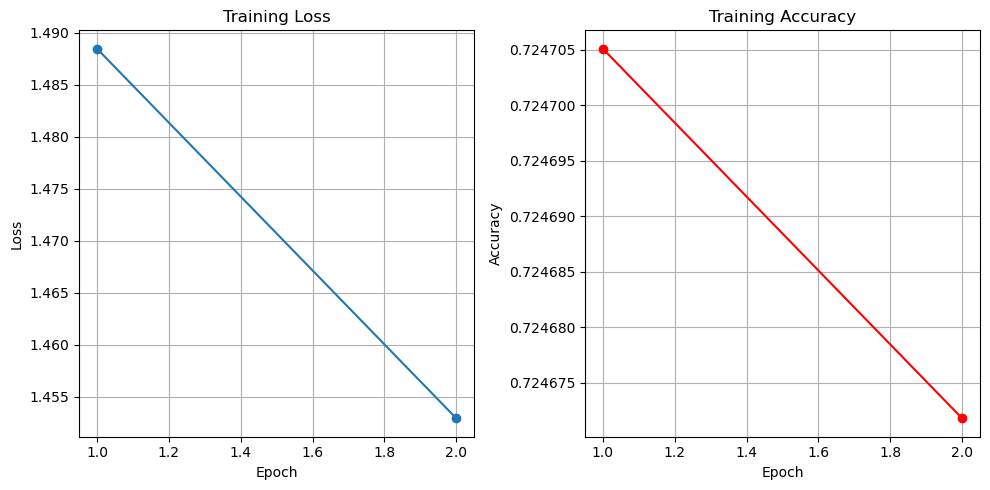

In [43]:
epochs=2
no_of_photos=5
history = {'loss': [], 'accuracy': []}
steps=len(train_encoded_captions)//no_of_photos
for i in range(epochs):
  generator=data_generator(train_encoded_captions,train_features,no_of_photos)
  
  history_per_epoch = model.fit_generator(
      generator, 
      epochs=1, 
      steps_per_epoch=steps, 
      verbose=1
  )
  history['loss'].append(history_per_epoch.history['loss'][0])
  history['accuracy'].append(history_per_epoch.history['accuracy'][0])

# Plot loss and accuracy
plt.figure(figsize=(10, 5))

# Plot loss
plt.subplot(1, 2, 1)
plt.plot(range(1, epochs + 1), history['loss'], marker='o')
plt.title('Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)

# Plot accuracy
plt.subplot(1, 2, 2)
plt.plot(range(1, epochs + 1), history['accuracy'], marker='o', color='r')
plt.title('Training Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.grid(True)

# Adjust layout to prevent overlapping
plt.tight_layout()

# Show the plots
plt.show()

In [44]:
test_features

{'3385593926_d3e9c21170.jpg': array([0.33316922, 0.38347757, 0.0725343 , ..., 0.90832144, 0.35600492,
        1.0914084 ], dtype=float32),
 '2677656448_6b7e7702af.jpg': array([0.29442045, 0.09479229, 0.702181  , ..., 0.0198706 , 0.29092386,
        0.10954215], dtype=float32),
 '311146855_0b65fdb169.jpg': array([0.01134304, 0.08777492, 0.14328443, ..., 0.03006498, 1.1856283 ,
        0.06956825], dtype=float32),
 '1258913059_07c613f7ff.jpg': array([0.04770146, 1.4354626 , 0.10770514, ..., 0.13343847, 0.1150592 ,
        2.0496507 ], dtype=float32),
 '241347760_d44c8d3a01.jpg': array([0.06552815, 6.6828303 , 0.31763455, ..., 0.06200397, 0.03742849,
        0.04522505], dtype=float32),
 '2654514044_a70a6e2c21.jpg': array([1.9562047 , 0.04316797, 0.11143825, ..., 0.02008316, 0.6832548 ,
        0.43294114], dtype=float32),
 '2339106348_2df90aa6a9.jpg': array([0.08876368, 1.1927909 , 0.0767652 , ..., 0.01899936, 0.13417554,
        0.13799472], dtype=float32),
 '256085101_2c2617c5d0.jpg': 

## Beam Search Function

We define a function called "beam_search" that performs beam search to generate image captions. Given an input photo and a value 'k', the function generates 'k' potential captions using a pre-trained model. It initializes a sequence with a start token, predicts the next word using the model, and iteratively expands the sequence until it reaches the maximum caption length or encounters an end token. The generated captions are ranked based on their probabilities, and the top 'k' candidates are retained. The final caption is obtained by selecting the most likely sequence of words from the generated candidates.

In [45]:
def beam_search(photo,k):
  photo=photo.reshape(1,2048)
  in_text='<start>'
  sequence = [words_to_indices[s] for s in in_text.split(" ") if s in words_to_indices]
  sequence = pad_sequences([sequence], maxlen=max_length, padding='post')
  y_pred = model.predict([photo,sequence],verbose=0)
  predicted=[]
  y_pred=y_pred.reshape(-1)
  for i in range(y_pred.shape[0]):
    predicted.append((i,y_pred[i]))
  predicted=sorted(predicted,key=lambda x:x[1])[::-1]
  b_search=[]
  for i in range(k):
    word = indices_to_words[predicted[i][0]]
    b_search.append((in_text +' ' + word,predicted[i][1]))
    
  for idx in range(max_length):
    b_search_square=[]
    for text in b_search:
      if text[0].split(" ")[-1]=="<end>":
        break
      sequence = [words_to_indices[s] for s in text[0].split(" ") if s in words_to_indices]
      sequence = pad_sequences([sequence], maxlen=max_length, padding='post')
      y_pred = model.predict([photo,sequence],verbose=0)
      predicted=[]
      y_pred=y_pred.reshape(-1)
      for i in range(y_pred.shape[0]):
        predicted.append((i,y_pred[i]))
      predicted=sorted(predicted,key=lambda x:x[1])[::-1]
      for i in range(k):
        word = indices_to_words[predicted[i][0]]
        b_search_square.append((text[0] +' ' + word,predicted[i][1]*text[1]))
    if(len(b_search_square)>0):
      b_search=(sorted(b_search_square,key=lambda x:x[1])[::-1])[:5]
  final=b_search[0][0].split()
  final = final[1:-1]
  #final=" ".join(final)
  return final

## Predicting Captions on Test Set using Beam Search with k=3

We read and display images from the Flicker8k dataset using OpenCV, perform beam search to generate captions for the images, compute BLEU scores to evaluate the generated captions against reference captions, and display the reference captions, predicted caption, and BLEU score for the first 5 images in the test dataset.

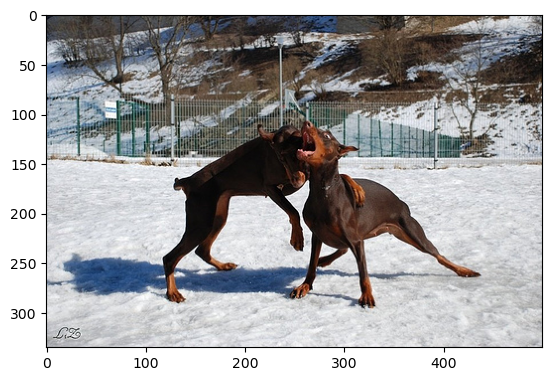

C:\Users\Shruti\anaconda3\lib\site-packages\nltk\translate\bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
C:\Users\Shruti\anaconda3\lib\site-packages\nltk\translate\bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
C:\Users\Shruti\anaconda3\lib\site-packages\nltk\translate\bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  war

Referance Captions: 
Dog be in the snow in front of a fence .
Dog play on the snow .
Two brown dog playful fight in the snow .
Two brown dog wrestle in the snow .
Two dog play in the snow .
Predicted Caption: 
.
bleu score:  1.2275407386121148e-233


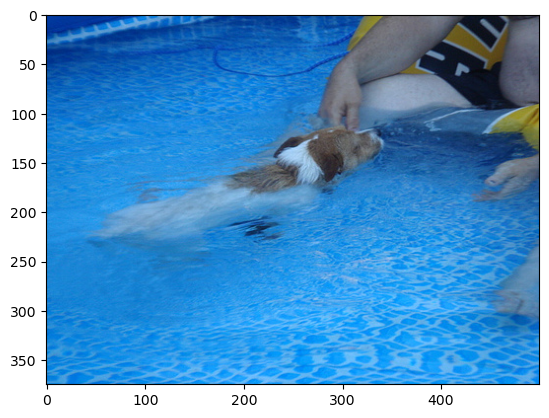

Referance Captions: 
a brown and white dog swim towards some in a pool
A dog in a swim pool swim toward sombody we cannot see .
A dog swim in a pool near a person .
Small dog be paddle through the water in a pool .
A small brown and white dog be in a pool .
Predicted Caption: 
.
bleu score:  2.2483192889629532e-235


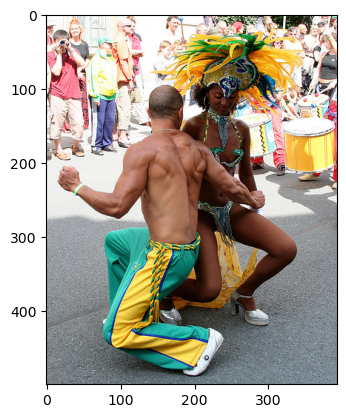

Referance Captions: 
A man and a woman in festive costume dance .
A man and a woman with feather on her head dance .
A man and a woman wear decorative costume and dance in a crowd of onlooker .
one performer wear a feathered headdress dance with another performer in street
Two person be dance with drum on the right and a crowd behind them .
Predicted Caption: 
.
bleu score:  2.2483192889629532e-235


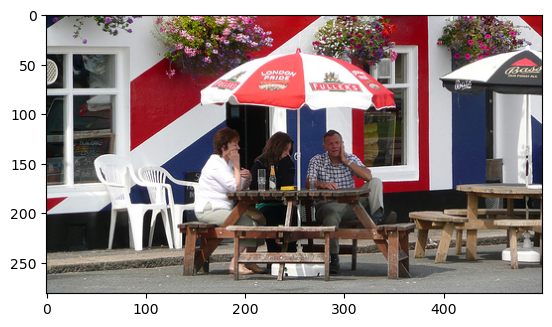

Referance Captions: 
A couple of person sit outdoors at a table with an umbrella and talk .
Three person be sit at an outside picnic bench with an umbrella .
Three person sit at an outdoor cafe .
Three person sit at an outdoor table in front of a building paint like the Union Jack .
Three person sit at a picnic table outside of a building paint like a union jack .
Predicted Caption: 
.
bleu score:  1.661295735445513e-234


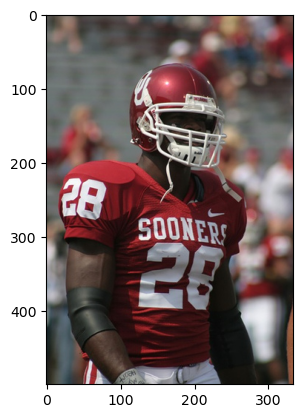

Referance Captions: 
A man be wear a Sooner red football shirt and helmet .
A Oklahoma Sooner football player wear his jersey number 28 .
A Sooner football player weas the number 28 and black armband .
Guy in red and white football uniform
The American footballer be wear a red and white strip .
Predicted Caption: 
.
bleu score:  4.515870009358044e-234


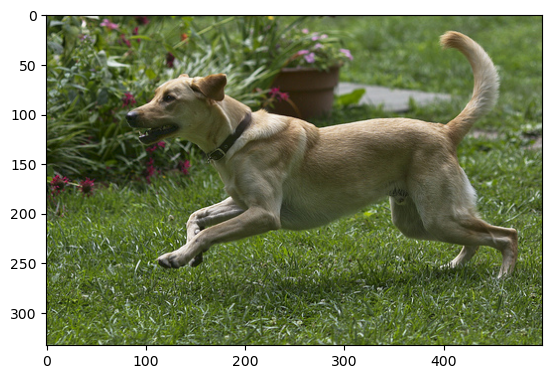

Referance Captions: 
A brown dog run
A brown dog run over grass .
A brown dog with its front paw off the ground on a grassy surface near red and purple flower .
A dog run across a grassy lawn near some flower .
A yellow dog be play in a grassy area near flower .
Predicted Caption: 
.
bleu score:  9.070367381327683e-233


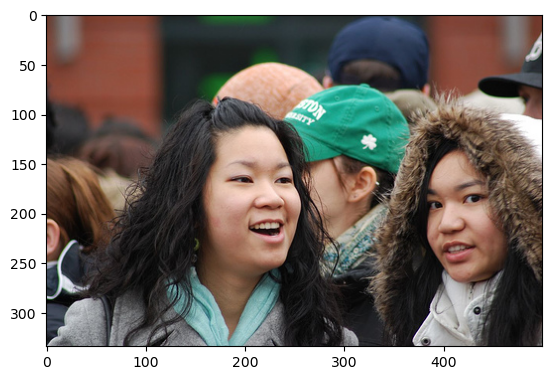

Referance Captions: 
A girl with dark brown hair and eye in a blue scarf be stand next to a girl in a fur edge coat .
an Asian boy and an Asian girl be smile in a crowd of person .
Girl be in a crowd .
Two dark haired girl be in a crowd .
Two girl be look past each other in different direction while stand in a crowd .
Predicted Caption: 
.
bleu score:  1.2275407386121148e-233


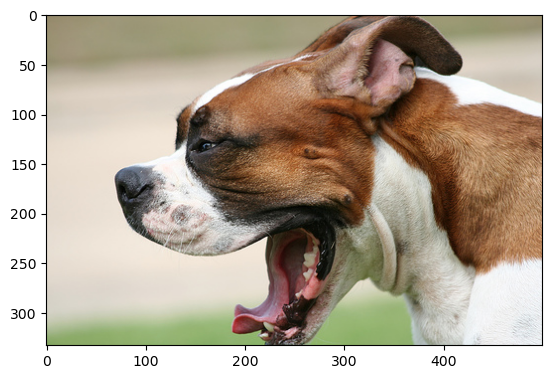

Referance Captions: 
A dog with its mouth open .
Brown and white dog yawn .
Closeup of dog in profile with mouth open .
Dog yawn
A dog 's mouth be open like he be yawn .
Predicted Caption: 
.
bleu score:  6.702145341854094e-232


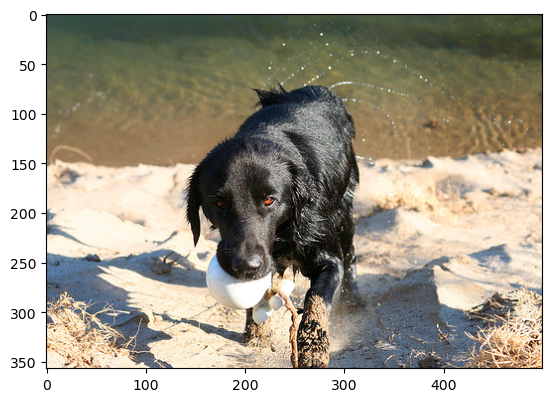

Referance Captions: 
A black dog emerge from the water onto the sand , hold a white object in its mouth .
A black dog emerge from the water with a white ball in its mouth .
A black dog on a beach carry a ball in its mouth .
a black dog walk out of the water with a white ball in his mouth .
Black dog jump out of the water with something in its mouth .
Predicted Caption: 
.
bleu score:  1.119372261523858e-236


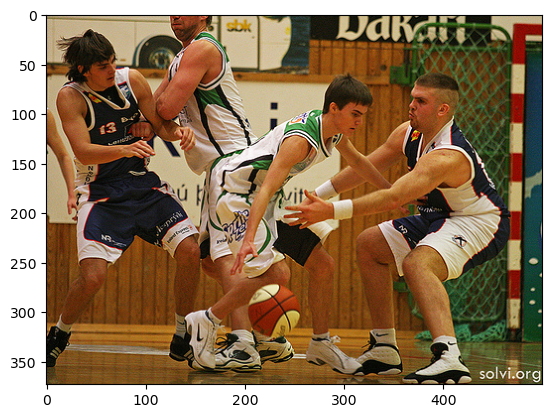

Referance Captions: 
A player from white and green highschool team dribble down court defend by a player from the other team .
Four basketball player in action .
Four man play basketball , two from each team .
Two boy in green and white uniform play basketball with two boy in blue and white uniform .
Young man play basketball in a competition .
Predicted Caption: 
.
bleu score:  1.2275407386121148e-233


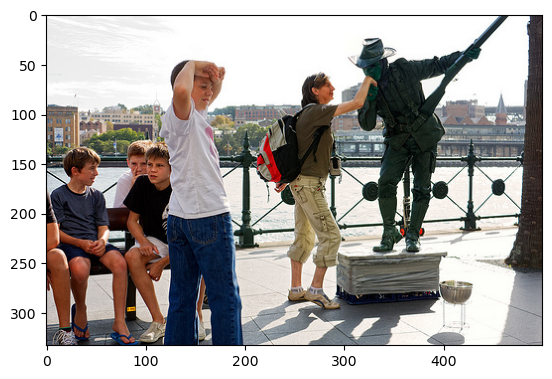

Referance Captions: 
A group of tourist stand around as a lady put her hand near the mouth of a statue .
A woman be make a statue pretend to kiss her hand beside four boy at a bench .
A woman pose with a statue alongside a group of boy
A woman with a backpack lean again a statue while a group of boy sit on a bench talk .
Woman get her hand kiss by live statue street artist .
Predicted Caption: 
.
bleu score:  8.271104435986657e-236


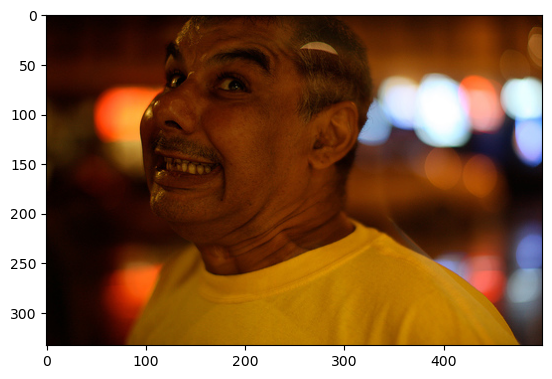

Referance Captions: 
A man in yellow grimace .
a man wear a yellow shirt with a dramatic look on his face
A man in a yellow t-shirt be pull a large grin on his face .
There be a man , wear a yellow shirt , and grimace .
This man be smile very big at the camera .
Predicted Caption: 
.
bleu score:  1.2275407386121148e-233


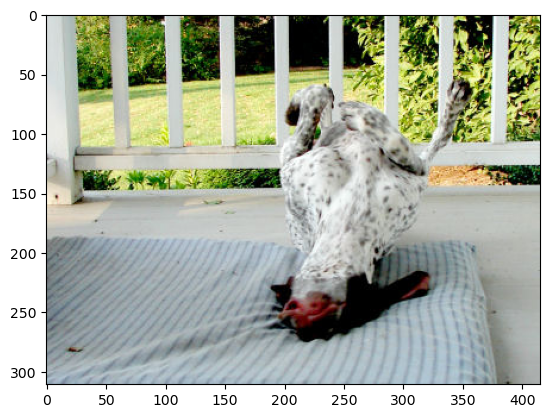

Referance Captions: 
A dog lay on a mattress on a porch .
A dog roll on a mattress place on a porch and scratches his back .
A spotted dog roll over on a pad place on a porch .
A white dog roll on its back on a porch .
A spot dog roll on its back .
Predicted Caption: 
.
bleu score:  1.661295735445513e-234


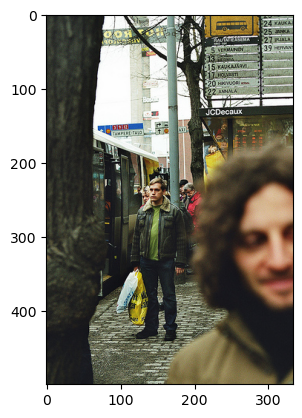

Referance Captions: 
A man be stand on a sidewalk in the background with a blurry image of another man in the foreground .
A man stand at a busy bus stop .
a man stand next to a bus .
People in a city .
People walk down a street and past an open bus .
Predicted Caption: 
.
bleu score:  3.3368016834625063e-233


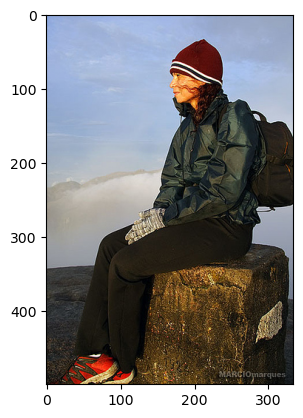

Referance Captions: 
A girl wear a brown cap , red sneaker , and a dark green coat sit on a rock bench .
A hiker in a jacket and knit cap sit with a backpack on atop a stone with a cloudy sky in the background .
A woman in a knit cap and green coat its on a stone block , look out .
A woman with her backpack sit on a large rock and look down over the mountain .
A lady be sit on a rock .
Predicted Caption: 
.
bleu score:  1.661295735445513e-234


In [46]:
i=0
for img_id in test_features:
  i+=1
  img=cv2.imread("Flicker8k_Dataset"+ "/" + img_id)
  plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
  photo=test_features[img_id]
  plt.show()
  reference=[]
  for caps in test_captions[img_id]:
    list_caps=caps.split(" ")
    list_caps=list_caps[1:-1]
    reference.append(list_caps)
  candidate=beam_search(photo,3)
  score = sentence_bleu(reference, candidate)
  print("Referance Captions: ")
  for cap in reference:
    print(" ".join(cap))
  print("Predicted Caption: ")
  print(" ".join(candidate))
  print("bleu score: ",score)
  if(i==15):
    break

## Calculating Average Bleu Score on Test Set using Beam Search with k=3

In [47]:
i=0
tot_score=0
for img_id in tqdm(test_features):
  i+=1
  photo=test_features[img_id]
  reference=[]
  for caps in test_captions[img_id]:
    list_caps=caps.split(" ")
    list_caps=list_caps[1:-1]
    reference.append(list_caps)
  candidate=beam_search(photo,3)
  score = sentence_bleu(reference, candidate)
  tot_score+=score
avg_score=tot_score/i
print()
print("Bleu score on Beam search with k=3")
print("Score: ",avg_score)

100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [14:46<00:00,  1.13it/s]


Bleu score on Beam search with k=3
Score:  1.7293559348038637e-157
